In [1]:
from label_names import *
import os
import sys
import matplotlib.pyplot as plt
import numpy as np
import torch
from PIL import Image,ImageFilter

path = os.getcwd()
if path.split('/')[-1] == 'notebooks':
    os.chdir('..')
    
from src.engine import Engine
from src.core.criterions import *
from src.utils.util import *
from src.core.datasets import *
from src.core.models import resnet
from torch.utils.data import DataLoader

import torchvision
%matplotlib inline

In [2]:
#model = resnet.resnet50(pretrained=True)
model = torchvision.models.resnet50(pretrained=True)

In [3]:
trans = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225)),]
)

imagenet_val  = torchvision.datasets.ImageNet('/data/opensets/imagenet-pytorch', 
                                                split='val',
                                                transform = trans)

In [4]:
from tqdm import tqdm

correct_mat   = np.zeros((1000,1000))
correct_count = np.zeros((1000,1000))

model.eval().cuda()
corrects = list()
for img,label in tqdm(imagenet_val):
    pred = torch.argmax(model(img.unsqueeze(0).cuda())).cpu().numpy()
    correct = (pred == label)
    
    corrects.append(correct)
    
    correct_mat[pred,label]    += 1
    correct_count[label,label] += 1
    
    print(sum(corrects)/len(corrects), end='\r')

  0%|                                                                                                                                   | 6/50000 [00:00<38:02, 21.90it/s]

  0%|                                                                                                                                  | 13/50000 [00:00<32:47, 25.41it/s]

  0%|                                                                                                                                  | 21/50000 [00:00<27:38, 30.14it/s]

  0%|                                                                                                                                  | 31/50000 [00:00<23:50, 34.93it/s]

  0%|                                                                                                                                  | 36/50000 [00:01<22:57, 36.28it/s]

  0%|                                                                                                                                  | 45/50000 [00:01<23:57, 34.76it/s]

  0%|▏                                                                                                                                 | 53/50000 [00:01<23:41, 35.15it/s]

  0%|▏                                                                                                                                 | 61/50000 [00:01<25:03, 33.22it/s]

  0%|▏                                                                                                                                 | 65/50000 [00:01<24:18, 34.24it/s]

  0%|▏                                                                                                                                 | 74/50000 [00:02<22:44, 36.59it/s]

  0%|▏                                                                                                                                 | 83/50000 [00:02<22:41, 36.66it/s]

  0%|▏                                                                                                                                 | 91/50000 [00:02<24:14, 34.30it/s]

  0%|▎                                                                                                                                | 100/50000 [00:02<23:02, 36.09it/s]

  0%|▎                                                                                                                                | 104/50000 [00:02<25:06, 33.12it/s]

  0%|▎                                                                                                                                | 113/50000 [00:03<26:18, 31.60it/s]

  0%|▎                                                                                                                                | 121/50000 [00:03<24:36, 33.78it/s]

  0%|▎                                                                                                                                | 125/50000 [00:03<26:35, 31.26it/s]

  0%|▎                                                                                                                                | 133/50000 [00:03<24:03, 34.54it/s]

  0%|▎                                                                                                                                | 141/50000 [00:04<26:38, 31.19it/s]

  0%|▎                                                                                                                                | 145/50000 [00:04<26:58, 30.80it/s]

  0%|▍                                                                                                                                | 153/50000 [00:04<34:38, 23.99it/s]

  0%|▍                                                                                                                                | 158/50000 [00:04<30:21, 27.37it/s]

  0%|▍                                                                                                                                | 163/50000 [00:04<28:02, 29.62it/s]

  0%|▍                                                                                                                                | 172/50000 [00:05<36:13, 22.93it/s]

  0%|▍                                                                                                                                | 176/50000 [00:05<32:41, 25.40it/s]

  0%|▍                                                                                                                                | 184/50000 [00:05<30:14, 27.46it/s]

  0%|▍                                                                                                                                | 192/50000 [00:06<27:38, 30.03it/s]

  0%|▌                                                                                                                                | 200/50000 [00:06<24:57, 33.25it/s]

  0%|▌                                                                                                                                | 208/50000 [00:06<23:16, 35.66it/s]

  0%|▌                                                                                                                                | 217/50000 [00:06<23:58, 34.61it/s]

  0%|▌                                                                                                                                | 222/50000 [00:06<22:53, 36.25it/s]

  0%|▌                                                                                                                                | 230/50000 [00:07<22:19, 37.16it/s]

  0%|▌                                                                                                                                | 238/50000 [00:07<22:19, 37.14it/s]

  0%|▋                                                                                                                                | 247/50000 [00:07<21:52, 37.89it/s]

  1%|▋                                                                                                                                | 255/50000 [00:07<22:35, 36.69it/s]

  1%|▋                                                                                                                                | 263/50000 [00:07<23:38, 35.07it/s]

  1%|▋                                                                                                                                | 271/50000 [00:08<24:47, 33.44it/s]

  1%|▋                                                                                                                                | 280/50000 [00:08<22:31, 36.79it/s]

  1%|▋                                                                                                                                | 284/50000 [00:08<22:34, 36.71it/s]

  1%|▋                                                                                                                                | 288/50000 [00:08<26:39, 31.08it/s]

  1%|▊                                                                                                                                | 297/50000 [00:09<29:24, 28.18it/s]

  1%|▊                                                                                                                                | 301/50000 [00:09<27:53, 29.69it/s]

  1%|▊                                                                                                                                | 309/50000 [00:09<27:32, 30.07it/s]

  1%|▊                                                                                                                                | 317/50000 [00:09<25:45, 32.15it/s]

  1%|▊                                                                                                                                | 325/50000 [00:09<24:44, 33.46it/s]

  1%|▊                                                                                                                                | 333/50000 [00:10<24:23, 33.93it/s]

  1%|▉                                                                                                                                | 341/50000 [00:10<23:22, 35.42it/s]

  1%|▉                                                                                                                                | 349/50000 [00:10<23:53, 34.63it/s]

  1%|▉                                                                                                                                | 357/50000 [00:10<23:36, 35.06it/s]

  1%|▉                                                                                                                                | 365/50000 [00:11<23:45, 34.81it/s]

  1%|▉                                                                                                                                | 369/50000 [00:11<24:22, 33.94it/s]

  1%|▉                                                                                                                                | 377/50000 [00:11<24:15, 34.10it/s]

  1%|▉                                                                                                                                | 385/50000 [00:11<23:51, 34.66it/s]

  1%|█                                                                                                                                | 393/50000 [00:11<23:45, 34.80it/s]

  1%|█                                                                                                                                | 401/50000 [00:12<23:06, 35.77it/s]

  1%|█                                                                                                                                | 409/50000 [00:12<23:43, 34.84it/s]

  1%|█                                                                                                                                | 417/50000 [00:12<25:54, 31.89it/s]

  1%|█                                                                                                                                | 425/50000 [00:12<25:12, 32.79it/s]

  1%|█                                                                                                                                | 429/50000 [00:12<25:12, 32.78it/s]

  1%|█▏                                                                                                                               | 437/50000 [00:13<24:46, 33.34it/s]

  1%|█▏                                                                                                                               | 445/50000 [00:13<23:57, 34.48it/s]

  1%|█▏                                                                                                                               | 453/50000 [00:13<23:50, 34.63it/s]

  1%|█▏                                                                                                                               | 461/50000 [00:13<23:34, 35.03it/s]

  1%|█▏                                                                                                                               | 465/50000 [00:14<24:09, 34.17it/s]

  1%|█▏                                                                                                                               | 473/50000 [00:14<24:26, 33.78it/s]

  1%|█▏                                                                                                                               | 481/50000 [00:14<24:56, 33.09it/s]

  1%|█▎                                                                                                                               | 489/50000 [00:14<23:58, 34.42it/s]

  1%|█▎                                                                                                                               | 493/50000 [00:14<23:55, 34.50it/s]

  1%|█▎                                                                                                                               | 501/50000 [00:15<25:29, 32.36it/s]

  1%|█▎                                                                                                                               | 509/50000 [00:15<24:31, 33.64it/s]

  1%|█▎                                                                                                                               | 517/50000 [00:15<23:47, 34.68it/s]

  1%|█▎                                                                                                                               | 527/50000 [00:15<21:29, 38.38it/s]

  1%|█▍                                                                                                                               | 537/50000 [00:16<20:11, 40.84it/s]

  1%|█▍                                                                                                                               | 542/50000 [00:16<19:45, 41.71it/s]

  1%|█▍                                                                                                                               | 551/50000 [00:16<22:31, 36.60it/s]

  1%|█▍                                                                                                                               | 559/50000 [00:16<23:19, 35.32it/s]

  1%|█▍                                                                                                                               | 563/50000 [00:16<23:37, 34.86it/s]

  1%|█▍                                                                                                                               | 571/50000 [00:17<24:16, 33.94it/s]

  1%|█▍                                                                                                                               | 579/50000 [00:17<23:51, 34.53it/s]

  1%|█▌                                                                                                                               | 587/50000 [00:17<23:57, 34.36it/s]

  1%|█▌                                                                                                                               | 595/50000 [00:17<23:23, 35.20it/s]

  1%|█▌                                                                                                                               | 603/50000 [00:17<23:35, 34.89it/s]

  1%|█▌                                                                                                                               | 611/50000 [00:18<23:58, 34.33it/s]

  1%|█▌                                                                                                                               | 619/50000 [00:18<24:22, 33.78it/s]

  1%|█▌                                                                                                                               | 623/50000 [00:18<24:31, 33.55it/s]

  1%|█▋                                                                                                                               | 631/50000 [00:18<24:57, 32.98it/s]

  1%|█▋                                                                                                                               | 639/50000 [00:19<24:37, 33.41it/s]

  1%|█▋                                                                                                                               | 647/50000 [00:19<24:36, 33.44it/s]

  1%|█▋                                                                                                                               | 651/50000 [00:19<25:00, 32.88it/s]

  1%|█▋                                                                                                                               | 659/50000 [00:19<25:01, 32.87it/s]

  1%|█▋                                                                                                                               | 667/50000 [00:19<23:56, 34.34it/s]

  1%|█▋                                                                                                                               | 675/50000 [00:20<26:10, 31.41it/s]

  1%|█▊                                                                                                                               | 683/50000 [00:20<24:16, 33.86it/s]

  1%|█▊                                                                                                                               | 687/50000 [00:20<23:42, 34.67it/s]

  1%|█▊                                                                                                                               | 695/50000 [00:20<23:13, 35.39it/s]

  1%|█▊                                                                                                                               | 703/50000 [00:20<24:07, 34.06it/s]

  1%|█▊                                                                                                                               | 711/50000 [00:21<24:23, 33.69it/s]

  1%|█▊                                                                                                                               | 719/50000 [00:21<25:06, 32.71it/s]

  1%|█▉                                                                                                                               | 727/50000 [00:21<24:40, 33.29it/s]

  1%|█▉                                                                                                                               | 731/50000 [00:21<24:42, 33.22it/s]

  1%|█▉                                                                                                                               | 739/50000 [00:21<24:40, 33.28it/s]

  1%|█▉                                                                                                                               | 747/50000 [00:22<22:39, 36.22it/s]

  2%|█▉                                                                                                                               | 755/50000 [00:22<23:28, 34.96it/s]

  2%|█▉                                                                                                                               | 763/50000 [00:22<25:15, 32.50it/s]

  2%|█▉                                                                                                                               | 767/50000 [00:22<25:08, 32.64it/s]

  2%|█▉                                                                                                                               | 775/50000 [00:23<24:12, 33.89it/s]

  2%|██                                                                                                                               | 783/50000 [00:23<24:23, 33.63it/s]

  2%|██                                                                                                                               | 787/50000 [00:23<25:59, 31.57it/s]

  2%|██                                                                                                                               | 795/50000 [00:23<28:56, 28.33it/s]

  2%|██                                                                                                                               | 803/50000 [00:23<26:55, 30.45it/s]

  2%|██                                                                                                                               | 807/50000 [00:24<26:03, 31.46it/s]

  2%|██                                                                                                                               | 815/50000 [00:24<25:31, 32.12it/s]

  2%|██                                                                                                                               | 823/50000 [00:24<24:38, 33.26it/s]

  2%|██▏                                                                                                                              | 831/50000 [00:24<26:42, 30.68it/s]

  2%|██▏                                                                                                                              | 835/50000 [00:24<27:19, 29.98it/s]

  2%|██▏                                                                                                                              | 843/50000 [00:25<27:18, 30.00it/s]

  2%|██▏                                                                                                                              | 851/50000 [00:25<25:44, 31.83it/s]

  2%|██▏                                                                                                                              | 859/50000 [00:25<26:05, 31.39it/s]

  2%|██▏                                                                                                                              | 863/50000 [00:25<26:12, 31.24it/s]

  2%|██▏                                                                                                                              | 870/50000 [00:26<29:10, 28.06it/s]

0.8874856486796785

  2%|██▎                                                                                                                              | 873/50000 [00:26<29:37, 27.65it/s]

  2%|██▎                                                                                                                              | 880/50000 [00:26<28:54, 28.32it/s]

  2%|██▎                                                                                                                              | 886/50000 [00:26<29:04, 28.16it/s]

  2%|██▎                                                                                                                              | 893/50000 [00:26<30:34, 26.76it/s]

  2%|██▎                                                                                                                              | 900/50000 [00:27<28:59, 28.23it/s]

  2%|██▎                                                                                                                              | 907/50000 [00:27<27:03, 30.24it/s]

  2%|██▎                                                                                                                              | 915/50000 [00:27<25:44, 31.79it/s]

  2%|██▎                                                                                                                              | 920/50000 [00:27<24:23, 33.53it/s]

  2%|██▍                                                                                                                              | 928/50000 [00:28<25:37, 31.92it/s]

  2%|██▍                                                                                                                              | 936/50000 [00:28<26:24, 30.97it/s]

  2%|██▍                                                                                                                              | 940/50000 [00:28<26:12, 31.19it/s]

  2%|██▍                                                                                                                              | 948/50000 [00:28<27:33, 29.67it/s]

  2%|██▍                                                                                                                              | 956/50000 [00:28<27:01, 30.24it/s]

  2%|██▍                                                                                                                              | 960/50000 [00:29<26:17, 31.08it/s]

  2%|██▍                                                                                                                              | 968/50000 [00:29<25:28, 32.08it/s]

  2%|██▌                                                                                                                              | 976/50000 [00:29<25:59, 31.44it/s]

  2%|██▌                                                                                                                              | 984/50000 [00:29<25:22, 32.20it/s]

  2%|██▌                                                                                                                              | 988/50000 [00:30<26:01, 31.39it/s]

  2%|██▌                                                                                                                              | 996/50000 [00:30<25:48, 31.65it/s]

  2%|██▌                                                                                                                             | 1004/50000 [00:30<25:30, 32.02it/s]

  2%|██▌                                                                                                                             | 1012/50000 [00:30<25:23, 32.15it/s]

  2%|██▌                                                                                                                             | 1016/50000 [00:30<25:41, 31.77it/s]

  2%|██▌                                                                                                                             | 1024/50000 [00:31<25:10, 32.42it/s]

  2%|██▋                                                                                                                             | 1032/50000 [00:31<26:03, 31.31it/s]

  2%|██▋                                                                                                                             | 1040/50000 [00:31<25:57, 31.43it/s]

  2%|██▋                                                                                                                             | 1044/50000 [00:31<25:35, 31.88it/s]

  2%|██▋                                                                                                                             | 1052/50000 [00:32<25:58, 31.41it/s]

  2%|██▋                                                                                                                             | 1061/50000 [00:32<22:47, 35.78it/s]

  2%|██▋                                                                                                                             | 1070/50000 [00:32<22:54, 35.61it/s]

  2%|██▊                                                                                                                             | 1078/50000 [00:32<22:24, 36.38it/s]

  2%|██▊                                                                                                                             | 1082/50000 [00:32<23:40, 34.45it/s]

  2%|██▊                                                                                                                             | 1090/50000 [00:33<27:14, 29.93it/s]

  2%|██▊                                                                                                                             | 1098/50000 [00:33<27:23, 29.76it/s]

  2%|██▊                                                                                                                             | 1102/50000 [00:33<26:35, 30.65it/s]

  2%|██▊                                                                                                                             | 1110/50000 [00:33<25:46, 31.62it/s]

  2%|██▊                                                                                                                             | 1118/50000 [00:34<25:28, 31.98it/s]

  2%|██▉                                                                                                                             | 1126/50000 [00:34<25:20, 32.15it/s]

  2%|██▉                                                                                                                             | 1130/50000 [00:34<25:07, 32.42it/s]

  2%|██▉                                                                                                                             | 1138/50000 [00:34<28:39, 28.42it/s]

  2%|██▉                                                                                                                             | 1144/50000 [00:34<28:54, 28.17it/s]

  2%|██▉                                                                                                                             | 1148/50000 [00:35<27:57, 29.13it/s]

  2%|██▉                                                                                                                             | 1156/50000 [00:35<27:06, 30.03it/s]

  2%|██▉                                                                                                                             | 1164/50000 [00:35<26:38, 30.56it/s]

  2%|███                                                                                                                             | 1172/50000 [00:35<25:31, 31.88it/s]

  2%|███                                                                                                                             | 1176/50000 [00:35<25:39, 31.71it/s]

  2%|███                                                                                                                             | 1184/50000 [00:36<25:30, 31.90it/s]

  2%|███                                                                                                                             | 1192/50000 [00:36<26:28, 30.73it/s]

  2%|███                                                                                                                             | 1196/50000 [00:36<26:24, 30.80it/s]

  2%|███                                                                                                                             | 1204/50000 [00:36<26:00, 31.27it/s]

  2%|███                                                                                                                             | 1212/50000 [00:37<26:54, 30.22it/s]

  2%|███                                                                                                                             | 1216/50000 [00:37<26:42, 30.44it/s]

  2%|███▏                                                                                                                            | 1224/50000 [00:37<27:02, 30.06it/s]

  2%|███▏                                                                                                                            | 1232/50000 [00:37<27:11, 29.88it/s]

  2%|███▏                                                                                                                            | 1238/50000 [00:37<29:22, 27.67it/s]

  2%|███▏                                                                                                                            | 1241/50000 [00:38<30:30, 26.63it/s]

  2%|███▏                                                                                                                            | 1247/50000 [00:38<32:25, 25.06it/s]

  3%|███▏                                                                                                                            | 1253/50000 [00:38<32:43, 24.83it/s]

  3%|███▏                                                                                                                            | 1256/50000 [00:38<39:30, 20.57it/s]

  3%|███▏                                                                                                                            | 1260/50000 [00:38<35:10, 23.10it/s]

  3%|███▏                                                                                                                            | 1268/50000 [00:39<37:49, 21.47it/s]

  3%|███▎                                                                                                                            | 1276/50000 [00:39<31:43, 25.60it/s]

  3%|███▎                                                                                                                            | 1284/50000 [00:39<28:58, 28.03it/s]

  3%|███▎                                                                                                                            | 1287/50000 [00:40<30:09, 26.93it/s]

  3%|███▎                                                                                                                            | 1294/50000 [00:40<32:54, 24.67it/s]

  3%|███▎                                                                                                                            | 1302/50000 [00:40<28:38, 28.34it/s]

  3%|███▎                                                                                                                            | 1305/50000 [00:40<28:37, 28.35it/s]

  3%|███▎                                                                                                                            | 1312/50000 [00:40<29:15, 27.74it/s]

  3%|███▍                                                                                                                            | 1319/50000 [00:41<28:16, 28.69it/s]

  3%|███▍                                                                                                                            | 1325/50000 [00:41<31:15, 25.95it/s]

  3%|███▍                                                                                                                            | 1332/50000 [00:41<30:58, 26.18it/s]

  3%|███▍                                                                                                                            | 1335/50000 [00:41<32:44, 24.77it/s]

  3%|███▍                                                                                                                            | 1341/50000 [00:42<34:49, 23.28it/s]

  3%|███▍                                                                                                                            | 1344/50000 [00:42<41:03, 19.75it/s]

  3%|███▍                                                                                                                          | 1347/50000 [00:42<1:02:01, 13.07it/s]

  3%|███▍                                                                                                                            | 1354/50000 [00:42<43:58, 18.44it/s]

  3%|███▍                                                                                                                            | 1362/50000 [00:43<34:23, 23.58it/s]

  3%|███▌                                                                                                                            | 1369/50000 [00:43<31:36, 25.64it/s]

  3%|███▌                                                                                                                            | 1375/50000 [00:43<29:58, 27.03it/s]

  3%|███▌                                                                                                                            | 1378/50000 [00:43<31:52, 25.43it/s]

  3%|███▌                                                                                                                            | 1385/50000 [00:43<29:05, 27.85it/s]

  3%|███▌                                                                                                                            | 1391/50000 [00:44<28:27, 28.47it/s]

  3%|███▌                                                                                                                            | 1397/50000 [00:44<28:03, 28.87it/s]

  3%|███▌                                                                                                                            | 1403/50000 [00:44<28:03, 28.87it/s]

  3%|███▌                                                                                                                            | 1410/50000 [00:44<27:30, 29.44it/s]

  3%|███▌                                                                                                                            | 1416/50000 [00:45<27:23, 29.57it/s]

  3%|███▋                                                                                                                            | 1424/50000 [00:45<26:31, 30.51it/s]

  3%|███▋                                                                                                                            | 1432/50000 [00:45<26:43, 30.29it/s]

  3%|███▋                                                                                                                            | 1436/50000 [00:45<26:47, 30.22it/s]

  3%|███▋                                                                                                                            | 1444/50000 [00:45<26:55, 30.05it/s]

  3%|███▋                                                                                                                            | 1448/50000 [00:46<26:47, 30.21it/s]

  3%|███▋                                                                                                                            | 1455/50000 [00:46<27:45, 29.14it/s]

  3%|███▋                                                                                                                            | 1462/50000 [00:46<27:22, 29.55it/s]

  3%|███▊                                                                                                                            | 1470/50000 [00:46<26:40, 30.33it/s]

  3%|███▊                                                                                                                            | 1474/50000 [00:46<26:37, 30.37it/s]

  3%|███▊                                                                                                                            | 1481/50000 [00:47<28:00, 28.87it/s]

  3%|███▊                                                                                                                            | 1488/50000 [00:47<29:26, 27.47it/s]

  3%|███▊                                                                                                                            | 1495/50000 [00:47<28:44, 28.12it/s]

  3%|███▊                                                                                                                            | 1501/50000 [00:47<29:09, 27.71it/s]

  3%|███▊                                                                                                                            | 1505/50000 [00:48<28:18, 28.55it/s]

  3%|███▊                                                                                                                            | 1512/50000 [00:48<27:31, 29.35it/s]

  3%|███▉                                                                                                                            | 1520/50000 [00:48<27:11, 29.72it/s]

  3%|███▉                                                                                                                            | 1524/50000 [00:48<26:25, 30.58it/s]

  3%|███▉                                                                                                                            | 1532/50000 [00:48<27:05, 29.81it/s]

  3%|███▉                                                                                                                            | 1540/50000 [00:49<26:32, 30.43it/s]

  3%|███▉                                                                                                                            | 1544/50000 [00:49<26:14, 30.78it/s]

  3%|███▉                                                                                                                            | 1552/50000 [00:49<27:33, 29.30it/s]

  3%|███▉                                                                                                                            | 1560/50000 [00:49<26:33, 30.40it/s]

  3%|████                                                                                                                            | 1564/50000 [00:50<26:26, 30.53it/s]

  3%|████                                                                                                                            | 1572/50000 [00:50<26:31, 30.42it/s]

  3%|████                                                                                                                            | 1580/50000 [00:50<25:46, 31.30it/s]

  3%|████                                                                                                                            | 1588/50000 [00:50<25:16, 31.92it/s]

  3%|████                                                                                                                            | 1592/50000 [00:50<26:09, 30.83it/s]

  3%|████                                                                                                                            | 1600/50000 [00:51<25:46, 31.30it/s]

  3%|████                                                                                                                            | 1608/50000 [00:51<24:52, 32.43it/s]

  3%|████▏                                                                                                                           | 1616/50000 [00:51<25:11, 32.00it/s]

  3%|████▏                                                                                                                           | 1620/50000 [00:51<24:27, 32.97it/s]

  3%|████▏                                                                                                                           | 1628/50000 [00:52<24:18, 33.16it/s]

  3%|████▏                                                                                                                           | 1632/50000 [00:52<26:10, 30.80it/s]

  3%|████▏                                                                                                                           | 1639/50000 [00:52<32:14, 25.01it/s]

  3%|████▏                                                                                                                           | 1647/50000 [00:52<27:53, 28.90it/s]

  3%|████▏                                                                                                                           | 1655/50000 [00:53<26:53, 29.96it/s]

  3%|████▏                                                                                                                           | 1659/50000 [00:53<26:58, 29.86it/s]

  3%|████▎                                                                                                                           | 1666/50000 [00:53<27:40, 29.11it/s]

  3%|████▎                                                                                                                           | 1673/50000 [00:53<27:10, 29.63it/s]

  3%|████▎                                                                                                                           | 1680/50000 [00:53<26:35, 30.28it/s]

  3%|████▎                                                                                                                           | 1688/50000 [00:54<26:31, 30.35it/s]

  3%|████▎                                                                                                                           | 1692/50000 [00:54<26:44, 30.11it/s]

  3%|████▎                                                                                                                           | 1700/50000 [00:54<28:45, 27.99it/s]

  3%|████▎                                                                                                                           | 1706/50000 [00:54<28:15, 28.48it/s]

  3%|████▍                                                                                                                           | 1712/50000 [00:54<27:57, 28.78it/s]

  3%|████▍                                                                                                                           | 1716/50000 [00:55<26:58, 29.83it/s]

  3%|████▍                                                                                                                           | 1724/50000 [00:55<26:15, 30.64it/s]

  3%|████▍                                                                                                                           | 1732/50000 [00:55<26:05, 30.82it/s]

  3%|████▍                                                                                                                           | 1740/50000 [00:55<25:58, 30.96it/s]

  3%|████▍                                                                                                                           | 1744/50000 [00:56<26:40, 30.16it/s]

  4%|████▍                                                                                                                           | 1752/50000 [00:56<28:43, 27.99it/s]

  4%|████▍                                                                                                                           | 1755/50000 [00:56<35:04, 22.93it/s]

  4%|████▌                                                                                                                           | 1762/50000 [00:56<32:01, 25.11it/s]

  4%|████▌                                                                                                                           | 1765/50000 [00:56<33:56, 23.68it/s]

  4%|████▌                                                                                                                           | 1772/50000 [00:57<32:51, 24.46it/s]

  4%|████▌                                                                                                                           | 1780/50000 [00:57<30:45, 26.12it/s]

  4%|████▌                                                                                                                           | 1784/50000 [00:57<29:23, 27.34it/s]

  4%|████▌                                                                                                                           | 1788/50000 [00:57<28:28, 28.22it/s]

  4%|████▌                                                                                                                           | 1794/50000 [00:58<40:35, 19.80it/s]

  4%|████▌                                                                                                                           | 1800/50000 [00:58<35:11, 22.83it/s]

  4%|████▌                                                                                                                           | 1804/50000 [00:58<31:31, 25.48it/s]

  4%|████▋                                                                                                                           | 1812/50000 [00:58<26:52, 29.88it/s]

  4%|████▋                                                                                                                           | 1820/50000 [00:58<27:35, 29.11it/s]

  4%|████▋                                                                                                                           | 1828/50000 [00:59<25:07, 31.95it/s]

  4%|████▋                                                                                                                           | 1836/50000 [00:59<26:38, 30.13it/s]

  4%|████▋                                                                                                                           | 1840/50000 [00:59<26:28, 30.32it/s]

  4%|████▋                                                                                                                           | 1848/50000 [00:59<27:43, 28.95it/s]

  4%|████▋                                                                                                                           | 1854/50000 [01:00<29:37, 27.09it/s]

  4%|████▊                                                                                                                           | 1861/50000 [01:00<27:21, 29.32it/s]

  4%|████▊                                                                                                                           | 1865/50000 [01:00<26:48, 29.92it/s]

  4%|████▊                                                                                                                           | 1873/50000 [01:00<24:54, 32.19it/s]

  4%|████▊                                                                                                                           | 1881/50000 [01:01<26:17, 30.51it/s]

  4%|████▊                                                                                                                           | 1889/50000 [01:01<25:45, 31.13it/s]

  4%|████▊                                                                                                                           | 1893/50000 [01:01<25:40, 31.23it/s]

  4%|████▊                                                                                                                           | 1901/50000 [01:01<25:15, 31.73it/s]

  4%|████▉                                                                                                                           | 1909/50000 [01:01<23:48, 33.66it/s]

  4%|████▉                                                                                                                           | 1917/50000 [01:02<23:42, 33.81it/s]

  4%|████▉                                                                                                                           | 1925/50000 [01:02<23:35, 33.96it/s]

  4%|████▉                                                                                                                           | 1929/50000 [01:02<23:33, 34.01it/s]

  4%|████▉                                                                                                                           | 1937/50000 [01:02<25:46, 31.08it/s]

  4%|████▉                                                                                                                           | 1945/50000 [01:02<24:42, 32.42it/s]

  4%|████▉                                                                                                                           | 1953/50000 [01:03<24:27, 32.75it/s]

  4%|█████                                                                                                                           | 1957/50000 [01:03<24:00, 33.35it/s]

  4%|█████                                                                                                                           | 1965/50000 [01:03<26:19, 30.41it/s]

  4%|█████                                                                                                                           | 1969/50000 [01:03<26:24, 30.31it/s]

  4%|█████                                                                                                                           | 1976/50000 [01:04<28:29, 28.10it/s]

  4%|█████                                                                                                                           | 1982/50000 [01:04<30:29, 26.24it/s]

  4%|█████                                                                                                                           | 1988/50000 [01:04<32:12, 24.85it/s]

  4%|█████                                                                                                                           | 1991/50000 [01:04<32:50, 24.36it/s]

  4%|█████                                                                                                                           | 1997/50000 [01:04<31:55, 25.06it/s]

  4%|█████▏                                                                                                                          | 2004/50000 [01:05<29:33, 27.07it/s]

  4%|█████▏                                                                                                                          | 2011/50000 [01:05<27:49, 28.75it/s]

  4%|█████▏                                                                                                                          | 2017/50000 [01:05<28:02, 28.52it/s]

  4%|█████▏                                                                                                                          | 2024/50000 [01:05<26:37, 30.03it/s]

  4%|█████▏                                                                                                                          | 2032/50000 [01:06<27:10, 29.42it/s]

  4%|█████▏                                                                                                                          | 2035/50000 [01:06<27:48, 28.75it/s]

  4%|█████▏                                                                                                                          | 2043/50000 [01:06<26:50, 29.78it/s]

  4%|█████▎                                                                                                                          | 2051/50000 [01:06<25:25, 31.43it/s]

  4%|█████▎                                                                                                                          | 2059/50000 [01:06<24:43, 32.31it/s]

  4%|█████▎                                                                                                                          | 2063/50000 [01:07<24:36, 32.46it/s]

  4%|█████▎                                                                                                                          | 2071/50000 [01:07<26:53, 29.71it/s]

  4%|█████▎                                                                                                                          | 2078/50000 [01:07<29:14, 27.31it/s]

  4%|█████▎                                                                                                                          | 2084/50000 [01:07<29:28, 27.09it/s]

  4%|█████▎                                                                                                                          | 2090/50000 [01:08<28:48, 27.72it/s]

  4%|█████▎                                                                                                                          | 2096/50000 [01:08<28:33, 27.96it/s]

  4%|█████▎                                                                                                                          | 2099/50000 [01:08<28:13, 28.29it/s]

  4%|█████▍                                                                                                                          | 2105/50000 [01:08<30:48, 25.92it/s]

  4%|█████▍                                                                                                                          | 2112/50000 [01:08<29:09, 27.37it/s]

  4%|█████▍                                                                                                                          | 2120/50000 [01:09<27:35, 28.92it/s]

  4%|█████▍                                                                                                                          | 2124/50000 [01:09<26:48, 29.77it/s]

  4%|█████▍                                                                                                                          | 2132/50000 [01:09<25:04, 31.81it/s]

  4%|█████▍                                                                                                                          | 2136/50000 [01:09<40:33, 19.67it/s]

  4%|█████▍                                                                                                                          | 2142/50000 [01:10<35:32, 22.44it/s]

  4%|█████▍                                                                                                                          | 2148/50000 [01:10<32:31, 24.52it/s]

  4%|█████▌                                                                                                                          | 2152/50000 [01:10<30:00, 26.57it/s]

  4%|█████▌                                                                                                                          | 2159/50000 [01:10<28:48, 27.68it/s]

  4%|█████▌                                                                                                                          | 2165/50000 [01:10<34:06, 23.37it/s]

  4%|█████▌                                                                                                                          | 2171/50000 [01:11<33:03, 24.11it/s]

  4%|█████▌                                                                                                                          | 2177/50000 [01:11<32:27, 24.56it/s]

  4%|█████▌                                                                                                                          | 2183/50000 [01:11<30:33, 26.08it/s]

  4%|█████▌                                                                                                                          | 2189/50000 [01:11<29:33, 26.95it/s]

  4%|█████▌                                                                                                                          | 2195/50000 [01:12<28:54, 27.56it/s]

  4%|█████▋                                                                                                                          | 2201/50000 [01:12<29:47, 26.74it/s]

  4%|█████▋                                                                                                                          | 2207/50000 [01:12<29:06, 27.37it/s]

  4%|█████▋                                                                                                                          | 2213/50000 [01:12<28:45, 27.70it/s]

  4%|█████▋                                                                                                                          | 2216/50000 [01:12<28:09, 28.28it/s]

  4%|█████▋                                                                                                                          | 2222/50000 [01:13<31:22, 25.37it/s]

  4%|█████▋                                                                                                                          | 2228/50000 [01:13<31:56, 24.93it/s]

  4%|█████▋                                                                                                                          | 2231/50000 [01:13<32:20, 24.62it/s]

  4%|█████▋                                                                                                                          | 2237/50000 [01:13<33:19, 23.88it/s]

  4%|█████▋                                                                                                                          | 2243/50000 [01:14<32:55, 24.18it/s]

  4%|█████▋                                                                                                                          | 2246/50000 [01:14<32:46, 24.28it/s]

  5%|█████▊                                                                                                                          | 2252/50000 [01:14<33:43, 23.60it/s]

  5%|█████▊                                                                                                                          | 2258/50000 [01:14<32:38, 24.37it/s]

  5%|█████▊                                                                                                                          | 2261/50000 [01:14<32:57, 24.14it/s]

  5%|█████▊                                                                                                                          | 2267/50000 [01:14<31:14, 25.46it/s]

  5%|█████▊                                                                                                                          | 2274/50000 [01:15<31:15, 25.44it/s]

  5%|█████▊                                                                                                                          | 2280/50000 [01:15<30:21, 26.20it/s]

  5%|█████▊                                                                                                                          | 2283/50000 [01:15<30:42, 25.89it/s]

  5%|█████▊                                                                                                                          | 2289/50000 [01:15<32:45, 24.27it/s]

  5%|█████▉                                                                                                                          | 2295/50000 [01:16<31:02, 25.61it/s]

  5%|█████▉                                                                                                                          | 2301/50000 [01:16<30:21, 26.19it/s]

  5%|█████▉                                                                                                                          | 2307/50000 [01:16<32:34, 24.40it/s]

  5%|█████▉                                                                                                                          | 2311/50000 [01:16<30:38, 25.94it/s]

  5%|█████▉                                                                                                                          | 2317/50000 [01:16<29:38, 26.80it/s]

  5%|█████▉                                                                                                                          | 2320/50000 [01:17<28:52, 27.53it/s]

  5%|█████▉                                                                                                                          | 2326/50000 [01:17<35:17, 22.51it/s]

  5%|█████▉                                                                                                                          | 2333/50000 [01:17<30:47, 25.80it/s]

  5%|█████▉                                                                                                                          | 2340/50000 [01:17<28:53, 27.49it/s]

  5%|██████                                                                                                                          | 2347/50000 [01:18<27:59, 28.37it/s]

  5%|██████                                                                                                                          | 2350/50000 [01:18<32:05, 24.75it/s]

  5%|██████                                                                                                                          | 2357/50000 [01:18<29:05, 27.30it/s]

  5%|██████                                                                                                                          | 2363/50000 [01:18<29:42, 26.73it/s]

  5%|██████                                                                                                                          | 2369/50000 [01:18<33:11, 23.92it/s]

  5%|██████                                                                                                                          | 2375/50000 [01:19<30:25, 26.09it/s]

  5%|██████                                                                                                                          | 2381/50000 [01:19<28:45, 27.59it/s]

  5%|██████                                                                                                                          | 2385/50000 [01:19<27:43, 28.62it/s]

  5%|██████                                                                                                                          | 2391/50000 [01:19<27:56, 28.40it/s]

  5%|██████▏                                                                                                                         | 2397/50000 [01:19<28:58, 27.39it/s]

  5%|██████▏                                                                                                                         | 2403/50000 [01:20<31:15, 25.38it/s]

  5%|██████▏                                                                                                                         | 2409/50000 [01:20<30:21, 26.12it/s]

  5%|██████▏                                                                                                                         | 2415/50000 [01:20<30:54, 25.66it/s]

  5%|██████▏                                                                                                                         | 2421/50000 [01:20<30:32, 25.96it/s]

  5%|██████▏                                                                                                                         | 2427/50000 [01:21<32:16, 24.56it/s]

  5%|██████▏                                                                                                                         | 2433/50000 [01:21<31:42, 25.00it/s]

  5%|██████▏                                                                                                                         | 2436/50000 [01:21<32:13, 24.60it/s]

  5%|██████▎                                                                                                                         | 2442/50000 [01:21<33:49, 23.44it/s]

  5%|██████▎                                                                                                                         | 2448/50000 [01:21<31:54, 24.84it/s]

  5%|██████▎                                                                                                                         | 2454/50000 [01:22<33:03, 23.97it/s]

  5%|██████▎                                                                                                                         | 2457/50000 [01:22<36:55, 21.46it/s]

  5%|██████▎                                                                                                                         | 2463/50000 [01:22<37:55, 20.89it/s]

  5%|██████▎                                                                                                                         | 2469/50000 [01:22<32:18, 24.52it/s]

  5%|██████▎                                                                                                                         | 2475/50000 [01:23<30:20, 26.11it/s]

  5%|██████▎                                                                                                                         | 2481/50000 [01:23<29:31, 26.83it/s]

  5%|██████▎                                                                                                                         | 2487/50000 [01:23<29:43, 26.64it/s]

  5%|██████▍                                                                                                                         | 2495/50000 [01:23<27:27, 28.83it/s]

  5%|██████▍                                                                                                                         | 2502/50000 [01:24<28:29, 27.79it/s]

  5%|██████▍                                                                                                                         | 2509/50000 [01:24<27:17, 29.01it/s]

  5%|██████▍                                                                                                                         | 2513/50000 [01:24<26:30, 29.86it/s]

  5%|██████▍                                                                                                                         | 2521/50000 [01:24<24:53, 31.80it/s]

  5%|██████▍                                                                                                                         | 2525/50000 [01:24<25:05, 31.54it/s]

  5%|██████▍                                                                                                                         | 2532/50000 [01:25<29:10, 27.12it/s]

  5%|██████▍                                                                                                                         | 2538/50000 [01:25<31:00, 25.51it/s]

  5%|██████▌                                                                                                                         | 2544/50000 [01:25<31:22, 25.20it/s]

  5%|██████▌                                                                                                                         | 2550/50000 [01:25<30:20, 26.07it/s]

  5%|██████▌                                                                                                                         | 2556/50000 [01:26<31:21, 25.21it/s]

  5%|██████▌                                                                                                                         | 2562/50000 [01:26<33:44, 23.43it/s]

  5%|██████▌                                                                                                                         | 2565/50000 [01:26<34:35, 22.86it/s]

  5%|██████▌                                                                                                                         | 2571/50000 [01:26<35:35, 22.21it/s]

  5%|██████▌                                                                                                                         | 2577/50000 [01:26<33:03, 23.91it/s]

  5%|██████▌                                                                                                                         | 2583/50000 [01:27<31:50, 24.81it/s]

  5%|██████▋                                                                                                                         | 2589/50000 [01:27<33:10, 23.82it/s]

  5%|██████▋                                                                                                                         | 2592/50000 [01:27<33:33, 23.54it/s]

  5%|██████▋                                                                                                                         | 2598/50000 [01:27<33:44, 23.41it/s]

  5%|██████▋                                                                                                                         | 2604/50000 [01:28<31:06, 25.39it/s]

  5%|██████▋                                                                                                                         | 2610/50000 [01:28<30:54, 25.56it/s]

  5%|██████▋                                                                                                                         | 2616/50000 [01:28<29:45, 26.53it/s]

  5%|██████▋                                                                                                                         | 2622/50000 [01:28<30:50, 25.60it/s]

  5%|██████▋                                                                                                                         | 2628/50000 [01:29<31:37, 24.97it/s]

  5%|██████▋                                                                                                                         | 2634/50000 [01:29<29:40, 26.61it/s]

  5%|██████▊                                                                                                                         | 2640/50000 [01:29<29:23, 26.85it/s]

  5%|██████▊                                                                                                                         | 2646/50000 [01:29<29:55, 26.38it/s]

  5%|██████▊                                                                                                                         | 2649/50000 [01:29<29:38, 26.62it/s]

  5%|██████▊                                                                                                                         | 2655/50000 [01:30<31:39, 24.92it/s]

  5%|██████▊                                                                                                                         | 2661/50000 [01:30<33:11, 23.78it/s]

  5%|██████▊                                                                                                                         | 2664/50000 [01:30<33:40, 23.43it/s]

  5%|██████▊                                                                                                                         | 2671/50000 [01:30<30:29, 25.87it/s]

  5%|██████▊                                                                                                                         | 2678/50000 [01:30<28:04, 28.09it/s]

  5%|██████▊                                                                                                                         | 2684/50000 [01:31<32:05, 24.57it/s]

  5%|██████▉                                                                                                                         | 2690/50000 [01:31<30:57, 25.47it/s]

  5%|██████▉                                                                                                                         | 2696/50000 [01:31<30:08, 26.16it/s]

  5%|██████▉                                                                                                                         | 2702/50000 [01:31<30:46, 25.61it/s]

  5%|██████▉                                                                                                                         | 2705/50000 [01:32<33:50, 23.29it/s]

  5%|██████▉                                                                                                                         | 2708/50000 [01:32<35:21, 22.30it/s]

  5%|██████▉                                                                                                                         | 2714/50000 [01:32<36:27, 21.61it/s]

  5%|██████▉                                                                                                                         | 2720/50000 [01:32<36:36, 21.52it/s]

  5%|██████▉                                                                                                                         | 2726/50000 [01:33<33:52, 23.26it/s]

  5%|██████▉                                                                                                                         | 2729/50000 [01:33<34:55, 22.55it/s]

  5%|███████                                                                                                                         | 2735/50000 [01:33<36:51, 21.37it/s]

  5%|███████                                                                                                                         | 2738/50000 [01:33<35:22, 22.26it/s]

  5%|███████                                                                                                                         | 2744/50000 [01:33<40:55, 19.24it/s]

  5%|███████                                                                                                                         | 2747/50000 [01:34<38:24, 20.50it/s]

  6%|███████                                                                                                                         | 2753/50000 [01:34<35:31, 22.17it/s]

  6%|███████                                                                                                                         | 2759/50000 [01:34<32:04, 24.54it/s]

  6%|███████                                                                                                                         | 2765/50000 [01:34<30:46, 25.58it/s]

  6%|███████                                                                                                                         | 2771/50000 [01:34<31:13, 25.21it/s]

  6%|███████                                                                                                                         | 2780/50000 [01:35<31:12, 25.22it/s]

  6%|███████▏                                                                                                                        | 2786/50000 [01:35<29:50, 26.37it/s]

  6%|███████▏                                                                                                                        | 2792/50000 [01:35<30:02, 26.19it/s]

  6%|███████▏                                                                                                                        | 2798/50000 [01:35<29:08, 27.00it/s]

  6%|███████▏                                                                                                                        | 2804/50000 [01:36<29:54, 26.31it/s]

  6%|███████▏                                                                                                                        | 2810/50000 [01:36<29:46, 26.41it/s]

  6%|███████▏                                                                                                                        | 2816/50000 [01:36<29:19, 26.82it/s]

  6%|███████▏                                                                                                                        | 2822/50000 [01:36<29:31, 26.63it/s]

  6%|███████▏                                                                                                                        | 2828/50000 [01:37<29:30, 26.65it/s]

  6%|███████▏                                                                                                                        | 2831/50000 [01:37<29:55, 26.28it/s]

  6%|███████▎                                                                                                                        | 2837/50000 [01:37<30:54, 25.43it/s]

  6%|███████▎                                                                                                                        | 2843/50000 [01:37<29:46, 26.40it/s]

  6%|███████▎                                                                                                                        | 2849/50000 [01:37<31:24, 25.01it/s]

  6%|███████▎                                                                                                                        | 2855/50000 [01:38<30:56, 25.40it/s]

  6%|███████▎                                                                                                                        | 2861/50000 [01:38<30:25, 25.83it/s]

  6%|███████▎                                                                                                                        | 2867/50000 [01:38<30:26, 25.80it/s]

  6%|███████▎                                                                                                                        | 2870/50000 [01:38<30:29, 25.76it/s]

  6%|███████▎                                                                                                                        | 2876/50000 [01:39<33:21, 23.54it/s]

  6%|███████▎                                                                                                                        | 2879/50000 [01:39<33:29, 23.44it/s]

  6%|███████▍                                                                                                                        | 2885/50000 [01:39<33:35, 23.38it/s]

  6%|███████▍                                                                                                                        | 2891/50000 [01:39<34:15, 22.92it/s]

  6%|███████▍                                                                                                                        | 2894/50000 [01:39<33:01, 23.78it/s]

  6%|███████▍                                                                                                                        | 2900/50000 [01:40<32:48, 23.92it/s]

  6%|███████▍                                                                                                                        | 2906/50000 [01:40<31:05, 25.24it/s]

  6%|███████▍                                                                                                                        | 2912/50000 [01:40<29:46, 26.36it/s]

  6%|███████▍                                                                                                                        | 2918/50000 [01:40<29:48, 26.32it/s]

  6%|███████▍                                                                                                                        | 2924/50000 [01:40<29:59, 26.16it/s]

  6%|███████▌                                                                                                                        | 2930/50000 [01:41<29:39, 26.45it/s]

  6%|███████▌                                                                                                                        | 2936/50000 [01:41<31:51, 24.62it/s]

  6%|███████▌                                                                                                                        | 2942/50000 [01:41<30:43, 25.52it/s]

  6%|███████▌                                                                                                                        | 2948/50000 [01:41<30:31, 25.69it/s]

  6%|███████▌                                                                                                                        | 2954/50000 [01:42<29:22, 26.69it/s]

  6%|███████▌                                                                                                                        | 2960/50000 [01:42<29:13, 26.82it/s]

  6%|███████▌                                                                                                                        | 2966/50000 [01:42<34:33, 22.68it/s]

  6%|███████▌                                                                                                                        | 2969/50000 [01:42<34:19, 22.84it/s]

  6%|███████▌                                                                                                                        | 2975/50000 [01:43<32:42, 23.96it/s]

  6%|███████▋                                                                                                                        | 2981/50000 [01:43<31:08, 25.16it/s]

  6%|███████▋                                                                                                                        | 2987/50000 [01:43<32:14, 24.30it/s]

  6%|███████▋                                                                                                                        | 2993/50000 [01:43<32:51, 23.84it/s]

  6%|███████▋                                                                                                                        | 3000/50000 [01:44<31:39, 24.74it/s]

  6%|███████▋                                                                                                                        | 3004/50000 [01:44<29:33, 26.49it/s]

  6%|███████▋                                                                                                                        | 3012/50000 [01:44<27:04, 28.92it/s]

  6%|███████▋                                                                                                                        | 3020/50000 [01:44<24:59, 31.33it/s]

  6%|███████▋                                                                                                                        | 3024/50000 [01:44<27:42, 28.25it/s]

  6%|███████▊                                                                                                                        | 3030/50000 [01:45<29:13, 26.79it/s]

  6%|███████▊                                                                                                                        | 3036/50000 [01:45<29:47, 26.27it/s]

  6%|███████▊                                                                                                                        | 3042/50000 [01:45<29:10, 26.82it/s]

  6%|███████▊                                                                                                                        | 3048/50000 [01:45<31:19, 24.98it/s]

  6%|███████▊                                                                                                                        | 3054/50000 [01:46<33:18, 23.49it/s]

  6%|███████▊                                                                                                                        | 3060/50000 [01:46<31:46, 24.62it/s]

  6%|███████▊                                                                                                                        | 3063/50000 [01:46<33:47, 23.15it/s]

  6%|███████▊                                                                                                                        | 3069/50000 [01:46<33:41, 23.22it/s]

  6%|███████▊                                                                                                                        | 3075/50000 [01:46<32:30, 24.06it/s]

  6%|███████▉                                                                                                                        | 3081/50000 [01:47<31:35, 24.76it/s]

  6%|███████▉                                                                                                                        | 3087/50000 [01:47<30:55, 25.28it/s]

  6%|███████▉                                                                                                                        | 3090/50000 [01:47<30:37, 25.53it/s]

  6%|███████▉                                                                                                                        | 3096/50000 [01:47<31:52, 24.52it/s]

  6%|███████▉                                                                                                                        | 3102/50000 [01:48<30:41, 25.47it/s]

  6%|███████▉                                                                                                                        | 3108/50000 [01:48<30:18, 25.79it/s]

  6%|███████▉                                                                                                                        | 3114/50000 [01:48<30:57, 25.24it/s]

  6%|███████▉                                                                                                                        | 3120/50000 [01:48<33:31, 23.30it/s]

  6%|███████▉                                                                                                                        | 3123/50000 [01:48<35:43, 21.87it/s]

  6%|████████                                                                                                                        | 3129/50000 [01:49<33:15, 23.49it/s]

  6%|████████                                                                                                                        | 3135/50000 [01:49<31:41, 24.65it/s]

  6%|████████                                                                                                                        | 3141/50000 [01:49<29:44, 26.25it/s]

  6%|████████                                                                                                                        | 3147/50000 [01:49<32:16, 24.19it/s]

  6%|████████                                                                                                                        | 3150/50000 [01:49<33:47, 23.11it/s]

  6%|████████                                                                                                                        | 3156/50000 [01:50<36:32, 21.37it/s]

  6%|████████                                                                                                                        | 3162/50000 [01:50<34:56, 22.34it/s]

  6%|████████                                                                                                                        | 3165/50000 [01:50<33:56, 23.00it/s]

  6%|████████                                                                                                                        | 3171/50000 [01:50<36:32, 21.36it/s]

  6%|████████▏                                                                                                                       | 3177/50000 [01:51<33:52, 23.04it/s]

  6%|████████▏                                                                                                                       | 3180/50000 [01:51<34:27, 22.64it/s]

  6%|████████▏                                                                                                                       | 3186/50000 [01:51<37:40, 20.71it/s]

  6%|████████▏                                                                                                                       | 3192/50000 [01:51<35:00, 22.28it/s]

  6%|████████▏                                                                                                                       | 3198/50000 [01:52<33:07, 23.54it/s]

  6%|████████▏                                                                                                                       | 3204/50000 [01:52<32:38, 23.90it/s]

  6%|████████▏                                                                                                                       | 3210/50000 [01:52<30:27, 25.61it/s]

  6%|████████▏                                                                                                                       | 3213/50000 [01:52<34:58, 22.29it/s]

  6%|████████▏                                                                                                                       | 3219/50000 [01:53<32:42, 23.83it/s]

  6%|████████▎                                                                                                                       | 3225/50000 [01:53<31:32, 24.71it/s]

  6%|████████▎                                                                                                                       | 3231/50000 [01:53<30:17, 25.73it/s]

  6%|████████▎                                                                                                                       | 3237/50000 [01:53<30:17, 25.72it/s]

  6%|████████▎                                                                                                                       | 3243/50000 [01:53<30:06, 25.89it/s]

  6%|████████▎                                                                                                                       | 3249/50000 [01:54<30:16, 25.73it/s]

  7%|████████▎                                                                                                                       | 3255/50000 [01:54<31:18, 24.88it/s]

  7%|████████▎                                                                                                                       | 3261/50000 [01:54<32:00, 24.34it/s]

  7%|████████▎                                                                                                                       | 3267/50000 [01:54<31:36, 24.64it/s]

  7%|████████▎                                                                                                                       | 3270/50000 [01:55<31:26, 24.77it/s]

  7%|████████▍                                                                                                                       | 3276/50000 [01:55<35:20, 22.03it/s]

  7%|████████▍                                                                                                                       | 3279/50000 [01:55<34:11, 22.78it/s]

  7%|████████▍                                                                                                                       | 3285/50000 [01:55<33:36, 23.16it/s]

  7%|████████▍                                                                                                                       | 3291/50000 [01:55<33:07, 23.50it/s]

  7%|████████▍                                                                                                                       | 3294/50000 [01:56<33:13, 23.43it/s]

  7%|████████▍                                                                                                                       | 3300/50000 [01:56<35:58, 21.64it/s]

  7%|████████▍                                                                                                                       | 3303/50000 [01:56<38:21, 20.29it/s]

  7%|████████▍                                                                                                                       | 3309/50000 [01:56<35:58, 21.63it/s]

  7%|████████▍                                                                                                                       | 3315/50000 [01:57<33:56, 22.92it/s]

  7%|████████▌                                                                                                                       | 3321/50000 [01:57<31:55, 24.37it/s]

  7%|████████▌                                                                                                                       | 3327/50000 [01:57<30:23, 25.60it/s]

  7%|████████▌                                                                                                                       | 3330/50000 [01:57<30:20, 25.64it/s]

  7%|████████▌                                                                                                                       | 3336/50000 [01:57<32:09, 24.19it/s]

  7%|████████▌                                                                                                                       | 3342/50000 [01:58<31:10, 24.95it/s]

  7%|████████▌                                                                                                                       | 3348/50000 [01:58<33:39, 23.10it/s]

  7%|████████▌                                                                                                                       | 3351/50000 [01:58<33:57, 22.89it/s]

  7%|████████▌                                                                                                                       | 3357/50000 [01:58<37:05, 20.96it/s]

  7%|████████▌                                                                                                                       | 3363/50000 [01:59<36:40, 21.19it/s]

  7%|████████▌                                                                                                                       | 3366/50000 [01:59<35:32, 21.87it/s]

  7%|████████▋                                                                                                                       | 3372/50000 [01:59<33:22, 23.28it/s]

  7%|████████▋                                                                                                                       | 3378/50000 [01:59<32:41, 23.77it/s]

  7%|████████▋                                                                                                                       | 3384/50000 [02:00<32:37, 23.81it/s]

  7%|████████▋                                                                                                                       | 3387/50000 [02:00<32:20, 24.02it/s]

  7%|████████▋                                                                                                                       | 3393/50000 [02:00<34:41, 22.40it/s]

  7%|████████▋                                                                                                                       | 3399/50000 [02:00<34:42, 22.38it/s]

  7%|████████▋                                                                                                                       | 3402/50000 [02:00<34:02, 22.82it/s]

  7%|████████▋                                                                                                                       | 3408/50000 [02:01<32:42, 23.75it/s]

  7%|████████▋                                                                                                                       | 3414/50000 [02:01<32:44, 23.72it/s]

  7%|████████▋                                                                                                                       | 3417/50000 [02:01<34:22, 22.58it/s]

  7%|████████▊                                                                                                                       | 3423/50000 [02:01<36:12, 21.44it/s]

  7%|████████▊                                                                                                                       | 3429/50000 [02:02<37:33, 20.67it/s]

  7%|████████▊                                                                                                                       | 3432/50000 [02:02<37:32, 20.68it/s]

  7%|████████▊                                                                                                                       | 3438/50000 [02:02<36:16, 21.40it/s]

  7%|████████▊                                                                                                                       | 3444/50000 [02:02<35:12, 22.03it/s]

  7%|████████▊                                                                                                                       | 3447/50000 [02:02<34:33, 22.45it/s]

  7%|████████▊                                                                                                                       | 3453/50000 [02:03<34:02, 22.79it/s]

  7%|████████▊                                                                                                                       | 3459/50000 [02:03<33:22, 23.24it/s]

  7%|████████▊                                                                                                                       | 3462/50000 [02:03<32:50, 23.62it/s]

  7%|████████▉                                                                                                                       | 3468/50000 [02:03<33:00, 23.49it/s]

  7%|████████▉                                                                                                                       | 3474/50000 [02:04<35:26, 21.88it/s]

  7%|████████▉                                                                                                                       | 3477/50000 [02:04<34:46, 22.29it/s]

  7%|████████▉                                                                                                                       | 3483/50000 [02:04<34:15, 22.63it/s]

  7%|████████▉                                                                                                                       | 3489/50000 [02:04<33:00, 23.48it/s]

  7%|████████▉                                                                                                                       | 3492/50000 [02:04<32:23, 23.93it/s]

  7%|████████▉                                                                                                                       | 3498/50000 [02:05<31:46, 24.39it/s]

  7%|████████▉                                                                                                                       | 3504/50000 [02:05<33:34, 23.08it/s]

  7%|████████▉                                                                                                                       | 3510/50000 [02:05<31:43, 24.42it/s]

  7%|████████▉                                                                                                                       | 3513/50000 [02:05<31:20, 24.72it/s]

  7%|█████████                                                                                                                       | 3519/50000 [02:05<31:02, 24.95it/s]

  7%|█████████                                                                                                                       | 3525/50000 [02:06<31:47, 24.37it/s]

  7%|█████████                                                                                                                       | 3528/50000 [02:06<31:40, 24.45it/s]

  7%|█████████                                                                                                                       | 3534/50000 [02:06<32:14, 24.02it/s]

  7%|█████████                                                                                                                       | 3540/50000 [02:06<36:34, 21.17it/s]

  7%|█████████                                                                                                                       | 3543/50000 [02:06<35:27, 21.83it/s]

  7%|█████████                                                                                                                       | 3549/50000 [02:07<33:23, 23.18it/s]

  7%|█████████                                                                                                                       | 3555/50000 [02:07<31:55, 24.24it/s]

  7%|█████████                                                                                                                       | 3558/50000 [02:07<33:15, 23.27it/s]

  7%|█████████                                                                                                                       | 3564/50000 [02:07<34:34, 22.38it/s]

  7%|█████████▏                                                                                                                      | 3570/50000 [02:08<35:00, 22.10it/s]

  7%|█████████▏                                                                                                                      | 3573/50000 [02:08<35:35, 21.74it/s]

  7%|█████████▏                                                                                                                      | 3579/50000 [02:08<34:40, 22.31it/s]

  7%|█████████▏                                                                                                                      | 3582/50000 [02:08<34:32, 22.39it/s]

  7%|█████████▏                                                                                                                      | 3588/50000 [02:09<39:45, 19.45it/s]

  7%|█████████▏                                                                                                                      | 3591/50000 [02:09<40:50, 18.94it/s]

  7%|█████████▏                                                                                                                      | 3597/50000 [02:09<36:01, 21.47it/s]

  7%|█████████▏                                                                                                                      | 3603/50000 [02:09<34:33, 22.37it/s]

  7%|█████████▏                                                                                                                      | 3609/50000 [02:09<32:41, 23.65it/s]

  7%|█████████▏                                                                                                                      | 3612/50000 [02:10<35:40, 21.67it/s]

  7%|█████████▎                                                                                                                      | 3618/50000 [02:10<33:42, 22.94it/s]

  7%|█████████▎                                                                                                                      | 3624/50000 [02:10<35:57, 21.49it/s]

  7%|█████████▎                                                                                                                      | 3627/50000 [02:10<36:31, 21.16it/s]

  7%|█████████▎                                                                                                                      | 3633/50000 [02:11<33:37, 22.98it/s]

  7%|█████████▎                                                                                                                      | 3636/50000 [02:11<33:45, 22.89it/s]

  7%|█████████▎                                                                                                                      | 3642/50000 [02:11<35:23, 21.83it/s]

  7%|█████████▎                                                                                                                      | 3648/50000 [02:11<36:53, 20.94it/s]

  7%|█████████▎                                                                                                                      | 3654/50000 [02:12<33:30, 23.05it/s]

  7%|█████████▎                                                                                                                      | 3660/50000 [02:12<33:54, 22.78it/s]

  7%|█████████▍                                                                                                                      | 3663/50000 [02:12<33:47, 22.85it/s]

  7%|█████████▍                                                                                                                      | 3666/50000 [02:12<38:03, 20.29it/s]

  7%|█████████▍                                                                                                                      | 3672/50000 [02:12<41:39, 18.54it/s]

  7%|█████████▍                                                                                                                      | 3678/50000 [02:13<36:52, 20.94it/s]

  7%|█████████▍                                                                                                                      | 3681/50000 [02:13<35:34, 21.70it/s]

  7%|█████████▍                                                                                                                      | 3687/50000 [02:13<42:08, 18.32it/s]

  7%|█████████▍                                                                                                                      | 3690/50000 [02:13<38:59, 19.79it/s]

  7%|█████████▍                                                                                                                      | 3696/50000 [02:14<34:47, 22.18it/s]

  7%|█████████▍                                                                                                                      | 3699/50000 [02:14<41:50, 18.45it/s]

  7%|█████████▍                                                                                                                      | 3705/50000 [02:14<37:46, 20.43it/s]

  7%|█████████▌                                                                                                                      | 3711/50000 [02:14<34:14, 22.53it/s]

  7%|█████████▌                                                                                                                      | 3714/50000 [02:14<33:42, 22.89it/s]

  7%|█████████▌                                                                                                                      | 3720/50000 [02:15<33:11, 23.24it/s]

  7%|█████████▌                                                                                                                      | 3726/50000 [02:15<33:32, 22.99it/s]

  7%|█████████▌                                                                                                                      | 3729/50000 [02:15<33:15, 23.19it/s]

  7%|█████████▌                                                                                                                      | 3735/50000 [02:15<33:27, 23.04it/s]

  7%|█████████▌                                                                                                                      | 3741/50000 [02:16<32:12, 23.93it/s]

  7%|█████████▌                                                                                                                      | 3744/50000 [02:16<32:23, 23.80it/s]

  8%|█████████▌                                                                                                                      | 3750/50000 [02:16<34:19, 22.46it/s]

  8%|█████████▌                                                                                                                      | 3756/50000 [02:16<34:09, 22.57it/s]

  8%|█████████▌                                                                                                                      | 3759/50000 [02:16<33:54, 22.72it/s]

  8%|█████████▋                                                                                                                      | 3765/50000 [02:17<32:48, 23.48it/s]

  8%|█████████▋                                                                                                                      | 3771/50000 [02:17<32:37, 23.61it/s]

  8%|█████████▋                                                                                                                      | 3774/50000 [02:17<32:11, 23.94it/s]

  8%|█████████▋                                                                                                                      | 3780/50000 [02:17<33:15, 23.16it/s]

  8%|█████████▋                                                                                                                      | 3786/50000 [02:18<34:14, 22.50it/s]

  8%|█████████▋                                                                                                                      | 3789/50000 [02:18<36:32, 21.07it/s]

  8%|█████████▋                                                                                                                      | 3792/50000 [02:18<38:18, 20.10it/s]

  8%|█████████▋                                                                                                                      | 3797/50000 [02:18<41:22, 18.61it/s]

  8%|█████████▋                                                                                                                      | 3802/50000 [02:18<40:13, 19.14it/s]

  8%|█████████▋                                                                                                                      | 3805/50000 [02:19<39:15, 19.61it/s]

  8%|█████████▊                                                                                                                      | 3809/50000 [02:19<40:02, 19.23it/s]

  8%|█████████▊                                                                                                                      | 3815/50000 [02:19<36:26, 21.12it/s]

  8%|█████████▊                                                                                                                      | 3821/50000 [02:19<34:53, 22.06it/s]

  8%|█████████▊                                                                                                                      | 3824/50000 [02:19<35:05, 21.94it/s]

  8%|█████████▊                                                                                                                      | 3830/50000 [02:20<35:11, 21.87it/s]

  8%|█████████▊                                                                                                                      | 3833/50000 [02:20<36:15, 21.23it/s]

  8%|█████████▊                                                                                                                      | 3839/50000 [02:20<40:02, 19.21it/s]

  8%|█████████▊                                                                                                                      | 3842/50000 [02:20<39:01, 19.71it/s]

  8%|█████████▊                                                                                                                      | 3848/50000 [02:21<36:04, 21.32it/s]

  8%|█████████▊                                                                                                                      | 3851/50000 [02:21<43:01, 17.88it/s]

  8%|█████████▊                                                                                                                      | 3853/50000 [02:21<43:58, 17.49it/s]

  8%|█████████▊                                                                                                                      | 3857/50000 [02:21<52:15, 14.72it/s]

  8%|█████████▉                                                                                                                      | 3860/50000 [02:21<51:27, 14.94it/s]

  8%|█████████▉                                                                                                                      | 3866/50000 [02:22<43:54, 17.51it/s]

  8%|█████████▉                                                                                                                      | 3871/50000 [02:22<40:40, 18.90it/s]

  8%|█████████▉                                                                                                                      | 3875/50000 [02:22<41:36, 18.47it/s]

  8%|█████████▉                                                                                                                      | 3881/50000 [02:22<37:45, 20.35it/s]

  8%|█████████▉                                                                                                                      | 3884/50000 [02:23<37:18, 20.60it/s]

  8%|█████████▉                                                                                                                      | 3887/50000 [02:23<36:02, 21.32it/s]

  8%|█████████▉                                                                                                                      | 3890/50000 [02:23<44:14, 17.37it/s]

  8%|█████████▉                                                                                                                      | 3895/50000 [02:23<43:15, 17.77it/s]

  8%|█████████▉                                                                                                                      | 3900/50000 [02:24<39:07, 19.64it/s]

  8%|█████████▉                                                                                                                      | 3906/50000 [02:24<36:39, 20.95it/s]

  8%|██████████                                                                                                                      | 3912/50000 [02:24<33:54, 22.65it/s]

  8%|██████████                                                                                                                      | 3918/50000 [02:24<32:19, 23.77it/s]

  8%|██████████                                                                                                                      | 3924/50000 [02:24<31:03, 24.72it/s]

  8%|██████████                                                                                                                      | 3927/50000 [02:25<35:49, 21.44it/s]

  8%|██████████                                                                                                                      | 3933/50000 [02:25<36:58, 20.76it/s]

  8%|██████████                                                                                                                      | 3936/50000 [02:25<37:38, 20.40it/s]

  8%|██████████                                                                                                                      | 3942/50000 [02:25<36:29, 21.03it/s]

  8%|██████████                                                                                                                      | 3948/50000 [02:26<35:43, 21.48it/s]

  8%|██████████                                                                                                                      | 3951/50000 [02:26<36:52, 20.81it/s]

  8%|██████████▏                                                                                                                     | 3957/50000 [02:26<37:48, 20.29it/s]

  8%|██████████▏                                                                                                                     | 3960/50000 [02:26<39:35, 19.38it/s]

  8%|██████████▏                                                                                                                     | 3966/50000 [02:27<36:44, 20.88it/s]

  8%|██████████▏                                                                                                                     | 3969/50000 [02:27<35:53, 21.37it/s]

  8%|██████████▏                                                                                                                     | 3975/50000 [02:27<35:06, 21.85it/s]

  8%|██████████▏                                                                                                                     | 3978/50000 [02:27<38:53, 19.72it/s]

  8%|██████████▏                                                                                                                     | 3985/50000 [02:27<32:34, 23.54it/s]

  8%|██████████▏                                                                                                                     | 3991/50000 [02:28<30:50, 24.87it/s]

  8%|██████████▏                                                                                                                     | 3997/50000 [02:28<28:45, 26.67it/s]

  8%|██████████▎                                                                                                                     | 4004/50000 [02:28<27:44, 27.64it/s]

  8%|██████████▎                                                                                                                     | 4010/50000 [02:28<26:59, 28.40it/s]

  8%|██████████▎                                                                                                                     | 4016/50000 [02:29<30:46, 24.91it/s]

  8%|██████████▎                                                                                                                     | 4019/50000 [02:29<29:41, 25.82it/s]

  8%|██████████▎                                                                                                                     | 4025/50000 [02:29<31:27, 24.36it/s]

  8%|██████████▎                                                                                                                     | 4031/50000 [02:29<29:31, 25.95it/s]

  8%|██████████▎                                                                                                                     | 4037/50000 [02:29<28:21, 27.01it/s]

  8%|██████████▎                                                                                                                     | 4044/50000 [02:30<27:40, 27.67it/s]

  8%|██████████▎                                                                                                                     | 4050/50000 [02:30<27:38, 27.71it/s]

  8%|██████████▍                                                                                                                     | 4056/50000 [02:30<28:49, 26.56it/s]

  8%|██████████▍                                                                                                                     | 4062/50000 [02:30<28:48, 26.58it/s]

  8%|██████████▍                                                                                                                     | 4068/50000 [02:30<27:53, 27.44it/s]

  8%|██████████▍                                                                                                                     | 4074/50000 [02:31<27:41, 27.64it/s]

  8%|██████████▍                                                                                                                     | 4080/50000 [02:31<28:57, 26.43it/s]

  8%|██████████▍                                                                                                                     | 4087/50000 [02:31<27:21, 27.97it/s]

  8%|██████████▍                                                                                                                     | 4093/50000 [02:31<28:48, 26.56it/s]

  8%|██████████▍                                                                                                                     | 4099/50000 [02:32<28:42, 26.65it/s]

  8%|██████████▌                                                                                                                     | 4105/50000 [02:32<29:05, 26.30it/s]

  8%|██████████▌                                                                                                                     | 4108/50000 [02:32<32:35, 23.46it/s]

  8%|██████████▌                                                                                                                     | 4111/50000 [02:32<34:58, 21.87it/s]

  8%|██████████▌                                                                                                                     | 4117/50000 [02:33<37:39, 20.31it/s]

  8%|██████████▌                                                                                                                     | 4123/50000 [02:33<36:14, 21.10it/s]

  8%|██████████▌                                                                                                                     | 4126/50000 [02:33<37:03, 20.63it/s]

  8%|██████████▌                                                                                                                     | 4132/50000 [02:33<37:48, 20.22it/s]

  8%|██████████▌                                                                                                                     | 4135/50000 [02:33<37:09, 20.57it/s]

  8%|██████████▌                                                                                                                     | 4141/50000 [02:34<36:13, 21.10it/s]

  8%|██████████▌                                                                                                                     | 4144/50000 [02:34<37:05, 20.61it/s]

  8%|██████████▌                                                                                                                     | 4149/50000 [02:34<40:49, 18.72it/s]

  8%|██████████▋                                                                                                                     | 4155/50000 [02:34<36:45, 20.79it/s]

  8%|██████████▋                                                                                                                     | 4158/50000 [02:35<37:46, 20.23it/s]

  8%|██████████▋                                                                                                                     | 4164/50000 [02:35<39:26, 19.37it/s]

  8%|██████████▋                                                                                                                     | 4168/50000 [02:35<40:52, 18.69it/s]

  8%|██████████▋                                                                                                                     | 4171/50000 [02:35<39:50, 19.17it/s]

  8%|██████████▋                                                                                                                     | 4177/50000 [02:35<34:43, 22.00it/s]

  8%|██████████▋                                                                                                                     | 4183/50000 [02:36<31:14, 24.44it/s]

  8%|██████████▋                                                                                                                     | 4189/50000 [02:36<29:43, 25.69it/s]

  8%|██████████▋                                                                                                                     | 4195/50000 [02:36<30:59, 24.63it/s]

  8%|██████████▊                                                                                                                     | 4201/50000 [02:36<29:29, 25.88it/s]

  8%|██████████▊                                                                                                                     | 4207/50000 [02:37<30:56, 24.67it/s]

  8%|██████████▊                                                                                                                     | 4213/50000 [02:37<30:02, 25.40it/s]

  8%|██████████▊                                                                                                                     | 4219/50000 [02:37<29:29, 25.87it/s]

  8%|██████████▊                                                                                                                     | 4222/50000 [02:37<32:15, 23.65it/s]

  8%|██████████▊                                                                                                                     | 4225/50000 [02:37<36:15, 21.04it/s]

  8%|██████████▊                                                                                                                     | 4228/50000 [02:38<39:04, 19.52it/s]

  8%|██████████▊                                                                                                                     | 4233/50000 [02:38<43:02, 17.72it/s]

  8%|██████████▊                                                                                                                     | 4239/50000 [02:38<39:08, 19.49it/s]

  8%|██████████▊                                                                                                                     | 4242/50000 [02:38<38:16, 19.92it/s]

  8%|██████████▊                                                                                                                     | 4248/50000 [02:39<38:50, 19.63it/s]

  9%|██████████▉                                                                                                                     | 4251/50000 [02:39<37:30, 20.33it/s]

  9%|██████████▉                                                                                                                     | 4257/50000 [02:39<37:56, 20.10it/s]

  9%|██████████▉                                                                                                                     | 4263/50000 [02:39<36:14, 21.04it/s]

  9%|██████████▉                                                                                                                     | 4266/50000 [02:40<35:57, 21.20it/s]

  9%|██████████▉                                                                                                                     | 4272/50000 [02:40<35:38, 21.39it/s]

  9%|██████████▉                                                                                                                     | 4278/50000 [02:40<35:27, 21.49it/s]

  9%|██████████▉                                                                                                                     | 4281/50000 [02:40<38:50, 19.61it/s]

  9%|██████████▉                                                                                                                     | 4287/50000 [02:40<34:01, 22.39it/s]

  9%|██████████▉                                                                                                                     | 4293/50000 [02:41<31:41, 24.04it/s]

  9%|███████████                                                                                                                     | 4299/50000 [02:41<31:20, 24.30it/s]

  9%|███████████                                                                                                                     | 4302/50000 [02:41<32:32, 23.40it/s]

  9%|███████████                                                                                                                     | 4308/50000 [02:41<32:58, 23.10it/s]

  9%|███████████                                                                                                                     | 4314/50000 [02:42<34:42, 21.94it/s]

  9%|███████████                                                                                                                     | 4317/50000 [02:42<34:15, 22.23it/s]

  9%|███████████                                                                                                                     | 4323/50000 [02:42<34:14, 22.24it/s]

  9%|███████████                                                                                                                     | 4329/50000 [02:42<35:12, 21.62it/s]

  9%|███████████                                                                                                                     | 4332/50000 [02:42<35:02, 21.72it/s]

  9%|███████████                                                                                                                     | 4338/50000 [02:43<32:43, 23.25it/s]

  9%|███████████                                                                                                                     | 4345/50000 [02:43<29:23, 25.89it/s]

  9%|███████████▏                                                                                                                    | 4351/50000 [02:43<27:36, 27.55it/s]

  9%|███████████▏                                                                                                                    | 4357/50000 [02:43<27:46, 27.39it/s]

  9%|███████████▏                                                                                                                    | 4363/50000 [02:44<30:40, 24.80it/s]

  9%|███████████▏                                                                                                                    | 4369/50000 [02:44<32:59, 23.05it/s]

  9%|███████████▏                                                                                                                    | 4372/50000 [02:44<32:18, 23.54it/s]

  9%|███████████▏                                                                                                                    | 4378/50000 [02:44<33:52, 22.45it/s]

  9%|███████████▏                                                                                                                    | 4384/50000 [02:45<33:57, 22.39it/s]

  9%|███████████▏                                                                                                                    | 4387/50000 [02:45<34:26, 22.08it/s]

  9%|███████████▏                                                                                                                    | 4393/50000 [02:45<34:02, 22.33it/s]

  9%|███████████▎                                                                                                                    | 4399/50000 [02:45<33:59, 22.36it/s]

  9%|███████████▎                                                                                                                    | 4402/50000 [02:45<34:50, 21.82it/s]

  9%|███████████▎                                                                                                                    | 4408/50000 [02:46<34:34, 21.97it/s]

  9%|███████████▎                                                                                                                    | 4414/50000 [02:46<34:38, 21.93it/s]

  9%|███████████▎                                                                                                                    | 4417/50000 [02:46<34:53, 21.78it/s]

  9%|███████████▎                                                                                                                    | 4423/50000 [02:46<37:26, 20.29it/s]

  9%|███████████▎                                                                                                                    | 4429/50000 [02:47<34:16, 22.16it/s]

  9%|███████████▎                                                                                                                    | 4435/50000 [02:47<32:17, 23.51it/s]

  9%|███████████▎                                                                                                                    | 4441/50000 [02:47<30:49, 24.64it/s]

  9%|███████████▍                                                                                                                    | 4444/50000 [02:47<34:13, 22.18it/s]

  9%|███████████▍                                                                                                                    | 4450/50000 [02:48<35:03, 21.65it/s]

  9%|███████████▍                                                                                                                    | 4456/50000 [02:48<35:18, 21.50it/s]

  9%|███████████▍                                                                                                                    | 4459/50000 [02:48<34:44, 21.85it/s]

  9%|███████████▍                                                                                                                    | 4465/50000 [02:48<34:39, 21.90it/s]

  9%|███████████▍                                                                                                                    | 4471/50000 [02:49<35:05, 21.63it/s]

  9%|███████████▍                                                                                                                    | 4474/50000 [02:49<35:11, 21.56it/s]

  9%|███████████▍                                                                                                                    | 4480/50000 [02:49<34:48, 21.79it/s]

  9%|███████████▍                                                                                                                    | 4486/50000 [02:49<34:38, 21.90it/s]

  9%|███████████▍                                                                                                                    | 4489/50000 [02:49<34:53, 21.74it/s]

  9%|███████████▌                                                                                                                    | 4495/50000 [02:50<35:00, 21.66it/s]

  9%|███████████▌                                                                                                                    | 4501/50000 [02:50<35:00, 21.66it/s]

  9%|███████████▌                                                                                                                    | 4504/50000 [02:50<35:26, 21.40it/s]

  9%|███████████▌                                                                                                                    | 4510/50000 [02:50<36:14, 20.92it/s]

  9%|███████████▌                                                                                                                    | 4516/50000 [02:51<36:16, 20.90it/s]

  9%|███████████▌                                                                                                                    | 4519/50000 [02:51<36:27, 20.79it/s]

  9%|███████████▌                                                                                                                    | 4525/50000 [02:51<36:28, 20.78it/s]

  9%|███████████▌                                                                                                                    | 4528/50000 [02:51<36:58, 20.50it/s]

  9%|███████████▌                                                                                                                    | 4534/50000 [02:52<37:41, 20.11it/s]

  9%|███████████▌                                                                                                                    | 4540/50000 [02:52<37:06, 20.41it/s]

  9%|███████████▋                                                                                                                    | 4543/50000 [02:52<36:25, 20.80it/s]

  9%|███████████▋                                                                                                                    | 4549/50000 [02:52<36:52, 20.54it/s]

  9%|███████████▋                                                                                                                    | 4552/50000 [02:52<38:17, 19.78it/s]

  9%|███████████▋                                                                                                                    | 4556/50000 [02:53<41:13, 18.37it/s]

  9%|███████████▋                                                                                                                    | 4560/50000 [02:53<40:42, 18.60it/s]

  9%|███████████▋                                                                                                                    | 4565/50000 [02:53<39:49, 19.02it/s]

  9%|███████████▋                                                                                                                    | 4571/50000 [02:53<37:48, 20.03it/s]

  9%|███████████▋                                                                                                                    | 4577/50000 [02:54<36:32, 20.72it/s]

  9%|███████████▋                                                                                                                    | 4580/50000 [02:54<36:25, 20.78it/s]

  9%|███████████▋                                                                                                                    | 4585/50000 [02:54<38:41, 19.56it/s]

  9%|███████████▊                                                                                                                    | 4591/50000 [02:54<37:00, 20.45it/s]

  9%|███████████▊                                                                                                                    | 4597/50000 [02:55<36:56, 20.48it/s]

  9%|███████████▊                                                                                                                    | 4600/50000 [02:55<39:42, 19.05it/s]

  9%|███████████▊                                                                                                                    | 4606/50000 [02:55<37:30, 20.17it/s]

  9%|███████████▊                                                                                                                    | 4612/50000 [02:55<37:21, 20.25it/s]

  9%|███████████▊                                                                                                                    | 4615/50000 [02:56<37:19, 20.27it/s]

  9%|███████████▊                                                                                                                    | 4621/50000 [02:56<37:12, 20.32it/s]

  9%|███████████▊                                                                                                                    | 4624/50000 [02:56<38:32, 19.62it/s]

  9%|███████████▊                                                                                                                    | 4630/50000 [02:56<37:33, 20.13it/s]

  9%|███████████▊                                                                                                                    | 4633/50000 [02:56<36:39, 20.62it/s]

  9%|███████████▊                                                                                                                    | 4638/50000 [02:57<39:54, 18.94it/s]

  9%|███████████▉                                                                                                                    | 4642/50000 [02:57<42:27, 17.80it/s]

  9%|███████████▉                                                                                                                    | 4646/50000 [02:57<47:16, 15.99it/s]

  9%|███████████▉                                                                                                                    | 4650/50000 [02:58<46:36, 16.22it/s]

  9%|███████████▉                                                                                                                    | 4654/50000 [02:58<45:35, 16.57it/s]

  9%|███████████▉                                                                                                                    | 4658/50000 [02:58<46:02, 16.41it/s]

  9%|███████████▉                                                                                                                    | 4662/50000 [02:58<43:40, 17.30it/s]

  9%|███████████▉                                                                                                                    | 4666/50000 [02:58<43:27, 17.38it/s]

  9%|███████████▉                                                                                                                    | 4670/50000 [02:59<43:02, 17.55it/s]

  9%|███████████▉                                                                                                                    | 4674/50000 [02:59<43:20, 17.43it/s]

  9%|███████████▉                                                                                                                    | 4678/50000 [02:59<44:00, 17.16it/s]

  9%|███████████▉                                                                                                                    | 4682/50000 [02:59<43:46, 17.25it/s]

  9%|███████████▉                                                                                                                    | 4686/50000 [03:00<43:21, 17.42it/s]

  9%|████████████                                                                                                                    | 4691/50000 [03:00<40:29, 18.65it/s]

  9%|████████████                                                                                                                    | 4694/50000 [03:00<38:43, 19.50it/s]

  9%|████████████                                                                                                                    | 4700/50000 [03:00<37:09, 20.32it/s]

  9%|████████████                                                                                                                    | 4706/50000 [03:01<35:30, 21.26it/s]

  9%|████████████                                                                                                                    | 4709/50000 [03:01<35:52, 21.04it/s]

  9%|████████████                                                                                                                    | 4715/50000 [03:01<35:58, 20.98it/s]

  9%|████████████                                                                                                                    | 4721/50000 [03:01<35:54, 21.01it/s]

  9%|████████████                                                                                                                    | 4724/50000 [03:01<35:13, 21.42it/s]

  9%|████████████                                                                                                                    | 4727/50000 [03:02<37:52, 19.92it/s]

  9%|████████████                                                                                                                    | 4732/50000 [03:02<41:16, 18.28it/s]

  9%|████████████▏                                                                                                                   | 4737/50000 [03:02<39:32, 19.08it/s]

  9%|████████████▏                                                                                                                   | 4743/50000 [03:02<37:26, 20.14it/s]

  9%|████████████▏                                                                                                                   | 4746/50000 [03:03<36:58, 20.40it/s]

 10%|████████████▏                                                                                                                   | 4752/50000 [03:03<36:54, 20.43it/s]

 10%|████████████▏                                                                                                                   | 4758/50000 [03:03<36:15, 20.80it/s]

 10%|████████████▏                                                                                                                   | 4761/50000 [03:03<36:36, 20.59it/s]

 10%|████████████▏                                                                                                                   | 4767/50000 [03:04<35:32, 21.21it/s]

 10%|████████████▏                                                                                                                   | 4770/50000 [03:04<35:33, 21.20it/s]

 10%|████████████▏                                                                                                                   | 4776/50000 [03:04<39:47, 18.94it/s]

 10%|████████████▏                                                                                                                   | 4778/50000 [03:04<45:50, 16.44it/s]

 10%|████████████▏                                                                                                                   | 4783/50000 [03:04<41:43, 18.06it/s]

 10%|████████████▎                                                                                                                   | 4788/50000 [03:05<39:41, 18.99it/s]

 10%|████████████▎                                                                                                                   | 4793/50000 [03:05<39:36, 19.02it/s]

 10%|████████████▎                                                                                                                   | 4798/50000 [03:05<37:43, 19.97it/s]

 10%|████████████▎                                                                                                                   | 4801/50000 [03:05<37:18, 20.19it/s]

 10%|████████████▎                                                                                                                   | 4807/50000 [03:06<36:57, 20.38it/s]

 10%|████████████▎                                                                                                                   | 4813/50000 [03:06<35:42, 21.09it/s]

 10%|████████████▎                                                                                                                   | 4816/50000 [03:06<35:37, 21.14it/s]

 10%|████████████▎                                                                                                                   | 4822/50000 [03:06<36:31, 20.62it/s]

 10%|████████████▎                                                                                                                   | 4828/50000 [03:07<36:45, 20.48it/s]

 10%|████████████▎                                                                                                                   | 4831/50000 [03:07<37:03, 20.31it/s]

 10%|████████████▍                                                                                                                   | 4837/50000 [03:07<36:15, 20.76it/s]

 10%|████████████▍                                                                                                                   | 4843/50000 [03:07<35:41, 21.08it/s]

 10%|████████████▍                                                                                                                   | 4846/50000 [03:07<35:24, 21.25it/s]

 10%|████████████▍                                                                                                                   | 4852/50000 [03:08<35:45, 21.05it/s]

 10%|████████████▍                                                                                                                   | 4858/50000 [03:08<35:25, 21.23it/s]

 10%|████████████▍                                                                                                                   | 4861/50000 [03:08<35:32, 21.17it/s]

 10%|████████████▍                                                                                                                   | 4867/50000 [03:09<40:29, 18.58it/s]

 10%|████████████▍                                                                                                                   | 4870/50000 [03:09<38:38, 19.46it/s]

 10%|████████████▍                                                                                                                   | 4876/50000 [03:09<37:28, 20.06it/s]

 10%|████████████▍                                                                                                                   | 4879/50000 [03:09<39:01, 19.27it/s]

 10%|████████████▌                                                                                                                   | 4884/50000 [03:09<39:24, 19.08it/s]

 10%|████████████▌                                                                                                                   | 4889/50000 [03:10<38:44, 19.41it/s]

 10%|████████████▌                                                                                                                   | 4894/50000 [03:10<40:44, 18.45it/s]

 10%|████████████▌                                                                                                                   | 4899/50000 [03:10<38:40, 19.44it/s]

 10%|████████████▌                                                                                                                   | 4904/50000 [03:10<38:10, 19.69it/s]

 10%|████████████▌                                                                                                                   | 4910/50000 [03:11<33:18, 22.57it/s]

 10%|████████████▌                                                                                                                   | 4913/50000 [03:11<31:57, 23.52it/s]

 10%|████████████▌                                                                                                                   | 4919/50000 [03:11<36:36, 20.53it/s]

 10%|████████████▌                                                                                                                   | 4922/50000 [03:11<35:30, 21.16it/s]

 10%|████████████▌                                                                                                                   | 4928/50000 [03:12<35:01, 21.45it/s]

 10%|████████████▋                                                                                                                   | 4934/50000 [03:12<35:29, 21.16it/s]

 10%|████████████▋                                                                                                                   | 4937/50000 [03:12<35:17, 21.28it/s]

 10%|████████████▋                                                                                                                   | 4943/50000 [03:12<37:26, 20.06it/s]

 10%|████████████▋                                                                                                                   | 4946/50000 [03:12<36:58, 20.31it/s]

 10%|████████████▋                                                                                                                   | 4952/50000 [03:13<36:38, 20.49it/s]

 10%|████████████▋                                                                                                                   | 4955/50000 [03:13<36:57, 20.32it/s]

 10%|████████████▋                                                                                                                   | 4961/50000 [03:13<37:37, 19.95it/s]

 10%|████████████▋                                                                                                                   | 4967/50000 [03:13<36:40, 20.47it/s]

 10%|████████████▋                                                                                                                   | 4970/50000 [03:14<36:36, 20.50it/s]

 10%|████████████▋                                                                                                                   | 4976/50000 [03:14<37:15, 20.14it/s]

 10%|████████████▋                                                                                                                   | 4979/50000 [03:14<37:12, 20.16it/s]

 10%|████████████▊                                                                                                                   | 4985/50000 [03:14<38:23, 19.55it/s]

 10%|████████████▊                                                                                                                   | 4988/50000 [03:14<37:58, 19.75it/s]

 10%|████████████▊                                                                                                                   | 4994/50000 [03:15<38:20, 19.57it/s]

 10%|████████████▊                                                                                                                   | 4998/50000 [03:15<38:23, 19.54it/s]

 10%|████████████▊                                                                                                                   | 5001/50000 [03:15<37:56, 19.77it/s]

 10%|████████████▊                                                                                                                   | 5007/50000 [03:15<38:04, 19.70it/s]

 10%|████████████▊                                                                                                                   | 5012/50000 [03:16<37:43, 19.87it/s]

 10%|████████████▊                                                                                                                   | 5015/50000 [03:16<37:09, 20.18it/s]

 10%|████████████▊                                                                                                                   | 5020/50000 [03:16<40:04, 18.71it/s]

 10%|████████████▊                                                                                                                   | 5024/50000 [03:16<39:07, 19.16it/s]

 10%|████████████▊                                                                                                                   | 5027/50000 [03:16<38:10, 19.64it/s]

 10%|████████████▉                                                                                                                   | 5032/50000 [03:17<38:15, 19.59it/s]

 10%|████████████▉                                                                                                                   | 5037/50000 [03:17<38:05, 19.67it/s]

 10%|████████████▉                                                                                                                   | 5040/50000 [03:17<37:47, 19.83it/s]

0.8262594208647362

 10%|████████████▉                                                                                                                   | 5044/50000 [03:17<37:56, 19.75it/s]

 10%|████████████▉                                                                                                                   | 5049/50000 [03:18<37:36, 19.92it/s]

 10%|████████████▉                                                                                                                   | 5054/50000 [03:18<37:22, 20.04it/s]

 10%|████████████▉                                                                                                                   | 5060/50000 [03:18<36:41, 20.41it/s]

 10%|████████████▉                                                                                                                   | 5063/50000 [03:18<36:42, 20.40it/s]

 10%|████████████▉                                                                                                                   | 5069/50000 [03:19<37:03, 20.20it/s]

 10%|████████████▉                                                                                                                   | 5072/50000 [03:19<36:39, 20.42it/s]

 10%|████████████▉                                                                                                                   | 5078/50000 [03:19<35:54, 20.85it/s]

 10%|█████████████                                                                                                                   | 5081/50000 [03:19<35:34, 21.04it/s]

0.8257277734067663

 10%|█████████████                                                                                                                   | 5087/50000 [03:19<36:28, 20.52it/s]

 10%|█████████████                                                                                                                   | 5093/50000 [03:20<36:45, 20.36it/s]

 10%|█████████████                                                                                                                   | 5096/50000 [03:20<36:00, 20.78it/s]

 10%|█████████████                                                                                                                   | 5102/50000 [03:20<35:43, 20.94it/s]

 10%|█████████████                                                                                                                   | 5105/50000 [03:20<36:07, 20.72it/s]

 10%|█████████████                                                                                                                   | 5111/50000 [03:21<39:52, 18.76it/s]

 10%|█████████████                                                                                                                   | 5115/50000 [03:21<42:01, 17.80it/s]

 10%|█████████████                                                                                                                   | 5119/50000 [03:21<43:31, 17.19it/s]

 10%|█████████████                                                                                                                   | 5123/50000 [03:21<42:10, 17.74it/s]

 10%|█████████████                                                                                                                   | 5126/50000 [03:22<40:33, 18.44it/s]

 10%|█████████████▏                                                                                                                  | 5131/50000 [03:22<39:20, 19.01it/s]

 10%|█████████████▏                                                                                                                  | 5135/50000 [03:22<39:26, 18.96it/s]

 10%|█████████████▏                                                                                                                  | 5139/50000 [03:22<38:51, 19.24it/s]

 10%|█████████████▏                                                                                                                  | 5144/50000 [03:22<38:44, 19.30it/s]

 10%|█████████████▏                                                                                                                  | 5148/50000 [03:23<39:26, 18.95it/s]

 10%|█████████████▏                                                                                                                  | 5152/50000 [03:23<39:43, 18.81it/s]

 10%|█████████████▏                                                                                                                  | 5156/50000 [03:23<40:13, 18.58it/s]

 10%|█████████████▏                                                                                                                  | 5159/50000 [03:23<38:57, 19.19it/s]

 10%|█████████████▏                                                                                                                  | 5165/50000 [03:24<39:13, 19.05it/s]

 10%|█████████████▏                                                                                                                  | 5168/50000 [03:24<38:02, 19.64it/s]

 10%|█████████████▏                                                                                                                  | 5174/50000 [03:24<33:43, 22.15it/s]

 10%|█████████████▎                                                                                                                  | 5180/50000 [03:24<33:52, 22.05it/s]

 10%|█████████████▎                                                                                                                  | 5183/50000 [03:24<35:41, 20.92it/s]

 10%|█████████████▎                                                                                                                  | 5189/50000 [03:25<35:29, 21.04it/s]

 10%|█████████████▎                                                                                                                  | 5195/50000 [03:25<35:15, 21.18it/s]

 10%|█████████████▎                                                                                                                  | 5198/50000 [03:25<35:22, 21.11it/s]

 10%|█████████████▎                                                                                                                  | 5204/50000 [03:25<35:46, 20.87it/s]

 10%|█████████████▎                                                                                                                  | 5207/50000 [03:26<36:27, 20.48it/s]

 10%|█████████████▎                                                                                                                  | 5213/50000 [03:26<37:01, 20.16it/s]

 10%|█████████████▎                                                                                                                  | 5216/50000 [03:26<36:58, 20.19it/s]

 10%|█████████████▎                                                                                                                  | 5221/50000 [03:26<40:56, 18.23it/s]

 10%|█████████████▎                                                                                                                  | 5224/50000 [03:26<39:56, 18.69it/s]

 10%|█████████████▍                                                                                                                  | 5229/50000 [03:27<38:44, 19.26it/s]

 10%|█████████████▍                                                                                                                  | 5234/50000 [03:27<37:41, 19.79it/s]

 10%|█████████████▍                                                                                                                  | 5238/50000 [03:27<37:55, 19.67it/s]

 10%|█████████████▍                                                                                                                  | 5244/50000 [03:27<37:12, 20.05it/s]

 10%|█████████████▍                                                                                                                  | 5247/50000 [03:28<37:02, 20.13it/s]

 11%|█████████████▍                                                                                                                  | 5252/50000 [03:28<37:50, 19.71it/s]

 11%|█████████████▍                                                                                                                  | 5257/50000 [03:28<37:44, 19.76it/s]

 11%|█████████████▍                                                                                                                  | 5262/50000 [03:28<37:38, 19.81it/s]

 11%|█████████████▍                                                                                                                  | 5267/50000 [03:29<37:02, 20.13it/s]

 11%|█████████████▍                                                                                                                  | 5273/50000 [03:29<37:14, 20.01it/s]

 11%|█████████████▌                                                                                                                  | 5276/50000 [03:29<36:39, 20.34it/s]

 11%|█████████████▌                                                                                                                  | 5282/50000 [03:29<37:44, 19.75it/s]

 11%|█████████████▌                                                                                                                  | 5286/50000 [03:30<38:18, 19.45it/s]

 11%|█████████████▌                                                                                                                  | 5290/50000 [03:30<38:36, 19.30it/s]

 11%|█████████████▌                                                                                                                  | 5294/50000 [03:30<38:37, 19.29it/s]

 11%|█████████████▌                                                                                                                  | 5298/50000 [03:30<38:57, 19.12it/s]

 11%|█████████████▌                                                                                                                  | 5302/50000 [03:30<39:49, 18.71it/s]

 11%|█████████████▌                                                                                                                  | 5305/50000 [03:30<38:33, 19.32it/s]

 11%|█████████████▌                                                                                                                  | 5310/50000 [03:31<38:01, 19.59it/s]

 11%|█████████████▌                                                                                                                  | 5313/50000 [03:31<37:38, 19.79it/s]

 11%|█████████████▌                                                                                                                  | 5318/50000 [03:31<39:41, 18.76it/s]

 11%|█████████████▋                                                                                                                  | 5324/50000 [03:31<38:13, 19.48it/s]

 11%|█████████████▋                                                                                                                  | 5329/50000 [03:32<35:40, 20.87it/s]

 11%|█████████████▋                                                                                                                  | 5332/50000 [03:32<35:42, 20.85it/s]

 11%|█████████████▋                                                                                                                  | 5335/50000 [03:32<36:00, 20.68it/s]

 11%|█████████████▋                                                                                                                  | 5341/50000 [03:32<36:42, 20.28it/s]

 11%|█████████████▋                                                                                                                  | 5347/50000 [03:33<36:50, 20.20it/s]

 11%|█████████████▋                                                                                                                  | 5350/50000 [03:33<37:42, 19.74it/s]

 11%|█████████████▋                                                                                                                  | 5354/50000 [03:33<37:45, 19.70it/s]

 11%|█████████████▋                                                                                                                  | 5359/50000 [03:33<36:29, 20.38it/s]

 11%|█████████████▋                                                                                                                  | 5365/50000 [03:33<33:33, 22.17it/s]

 11%|█████████████▋                                                                                                                  | 5368/50000 [03:34<34:25, 21.61it/s]

 11%|█████████████▊                                                                                                                  | 5374/50000 [03:34<32:02, 23.21it/s]

 11%|█████████████▊                                                                                                                  | 5380/50000 [03:34<30:21, 24.50it/s]

 11%|█████████████▊                                                                                                                  | 5386/50000 [03:34<31:00, 23.97it/s]

 11%|█████████████▊                                                                                                                  | 5392/50000 [03:35<31:39, 23.49it/s]

 11%|█████████████▊                                                                                                                  | 5398/50000 [03:35<33:05, 22.47it/s]

 11%|█████████████▊                                                                                                                  | 5404/50000 [03:35<30:46, 24.15it/s]

 11%|█████████████▊                                                                                                                  | 5410/50000 [03:35<29:59, 24.78it/s]

 11%|█████████████▊                                                                                                                  | 5416/50000 [03:36<29:55, 24.83it/s]

 11%|█████████████▊                                                                                                                  | 5419/50000 [03:36<30:35, 24.29it/s]

 11%|█████████████▉                                                                                                                  | 5425/50000 [03:36<30:08, 24.65it/s]

 11%|█████████████▉                                                                                                                  | 5431/50000 [03:36<30:55, 24.02it/s]

 11%|█████████████▉                                                                                                                  | 5437/50000 [03:36<30:16, 24.54it/s]

 11%|█████████████▉                                                                                                                  | 5443/50000 [03:37<29:26, 25.23it/s]

 11%|█████████████▉                                                                                                                  | 5449/50000 [03:37<31:24, 23.63it/s]

 11%|█████████████▉                                                                                                                  | 5452/50000 [03:37<32:18, 22.98it/s]

 11%|█████████████▉                                                                                                                  | 5458/50000 [03:37<33:56, 21.87it/s]

 11%|█████████████▉                                                                                                                  | 5464/50000 [03:38<32:38, 22.74it/s]

 11%|█████████████▉                                                                                                                  | 5467/50000 [03:38<32:35, 22.77it/s]

 11%|██████████████                                                                                                                  | 5473/50000 [03:38<31:39, 23.44it/s]

 11%|██████████████                                                                                                                  | 5479/50000 [03:38<32:26, 22.87it/s]

 11%|██████████████                                                                                                                  | 5485/50000 [03:38<30:41, 24.17it/s]

 11%|██████████████                                                                                                                  | 5488/50000 [03:39<32:20, 22.94it/s]

 11%|██████████████                                                                                                                  | 5494/50000 [03:39<32:53, 22.55it/s]

 11%|██████████████                                                                                                                  | 5500/50000 [03:39<31:57, 23.21it/s]

 11%|██████████████                                                                                                                  | 5503/50000 [03:39<31:06, 23.84it/s]

 11%|██████████████                                                                                                                  | 5509/50000 [03:40<31:59, 23.18it/s]

 11%|██████████████                                                                                                                  | 5515/50000 [03:40<31:41, 23.39it/s]

 11%|██████████████▏                                                                                                                 | 5518/50000 [03:40<36:55, 20.08it/s]

 11%|██████████████▏                                                                                                                 | 5524/50000 [03:40<34:00, 21.80it/s]

 11%|██████████████▏                                                                                                                 | 5530/50000 [03:41<32:15, 22.98it/s]

 11%|██████████████▏                                                                                                                 | 5533/50000 [03:41<34:42, 21.35it/s]

 11%|██████████████▏                                                                                                                 | 5536/50000 [03:41<36:12, 20.47it/s]

 11%|██████████████▏                                                                                                                 | 5542/50000 [03:41<38:27, 19.27it/s]

 11%|██████████████▏                                                                                                                 | 5546/50000 [03:41<38:33, 19.22it/s]

 11%|██████████████▏                                                                                                                 | 5550/50000 [03:42<41:28, 17.86it/s]

 11%|██████████████▏                                                                                                                 | 5552/50000 [03:42<41:29, 17.86it/s]

 11%|██████████████▏                                                                                                                 | 5560/50000 [03:42<38:15, 19.36it/s]

 11%|██████████████▏                                                                                                                 | 5566/50000 [03:42<32:47, 22.58it/s]

 11%|██████████████▎                                                                                                                 | 5572/50000 [03:43<30:31, 24.25it/s]

 11%|██████████████▎                                                                                                                 | 5575/50000 [03:43<30:07, 24.57it/s]

 11%|██████████████▎                                                                                                                 | 5581/50000 [03:43<32:05, 23.06it/s]

 11%|██████████████▎                                                                                                                 | 5587/50000 [03:43<34:03, 21.73it/s]

 11%|██████████████▎                                                                                                                 | 5590/50000 [03:43<33:44, 21.93it/s]

 11%|██████████████▎                                                                                                                 | 5596/50000 [03:44<35:07, 21.07it/s]

 11%|██████████████▎                                                                                                                 | 5599/50000 [03:44<35:50, 20.65it/s]

 11%|██████████████▎                                                                                                                 | 5605/50000 [03:44<36:36, 20.21it/s]

 11%|██████████████▎                                                                                                                 | 5608/50000 [03:44<38:59, 18.97it/s]

 11%|██████████████▎                                                                                                                 | 5613/50000 [03:45<39:06, 18.92it/s]

 11%|██████████████▍                                                                                                                 | 5619/50000 [03:45<37:26, 19.76it/s]

 11%|██████████████▍                                                                                                                 | 5623/50000 [03:45<37:35, 19.68it/s]

 11%|██████████████▍                                                                                                                 | 5626/50000 [03:45<36:59, 19.99it/s]

 11%|██████████████▍                                                                                                                 | 5632/50000 [03:45<36:37, 20.19it/s]

 11%|██████████████▍                                                                                                                 | 5635/50000 [03:46<36:26, 20.29it/s]

 11%|██████████████▍                                                                                                                 | 5641/50000 [03:46<36:36, 20.19it/s]

 11%|██████████████▍                                                                                                                 | 5647/50000 [03:46<35:34, 20.78it/s]

 11%|██████████████▍                                                                                                                 | 5650/50000 [03:46<36:07, 20.46it/s]

 11%|██████████████▍                                                                                                                 | 5656/50000 [03:47<36:17, 20.37it/s]

 11%|██████████████▍                                                                                                                 | 5659/50000 [03:47<36:43, 20.12it/s]

 11%|██████████████▍                                                                                                                 | 5664/50000 [03:47<38:11, 19.35it/s]

 11%|██████████████▌                                                                                                                 | 5668/50000 [03:47<37:58, 19.46it/s]

 11%|██████████████▌                                                                                                                 | 5672/50000 [03:48<38:36, 19.13it/s]

 11%|██████████████▌                                                                                                                 | 5677/50000 [03:48<37:39, 19.61it/s]

 11%|██████████████▌                                                                                                                 | 5680/50000 [03:48<37:32, 19.67it/s]

 11%|██████████████▌                                                                                                                 | 5685/50000 [03:48<37:18, 19.79it/s]

 11%|██████████████▌                                                                                                                 | 5689/50000 [03:48<37:39, 19.61it/s]

 11%|██████████████▌                                                                                                                 | 5694/50000 [03:49<40:30, 18.23it/s]

 11%|██████████████▌                                                                                                                 | 5700/50000 [03:49<35:10, 20.99it/s]

 11%|██████████████▌                                                                                                                 | 5703/50000 [03:49<34:09, 21.61it/s]

 11%|██████████████▌                                                                                                                 | 5709/50000 [03:49<33:22, 22.11it/s]

 11%|██████████████▋                                                                                                                 | 5715/50000 [03:50<33:05, 22.30it/s]

 11%|██████████████▋                                                                                                                 | 5718/50000 [03:50<31:46, 23.22it/s]

 11%|██████████████▋                                                                                                                 | 5724/50000 [03:50<35:16, 20.91it/s]

 11%|██████████████▋                                                                                                                 | 5727/50000 [03:50<34:32, 21.36it/s]

 11%|██████████████▋                                                                                                                 | 5733/50000 [03:50<32:33, 22.66it/s]

 11%|██████████████▋                                                                                                                 | 5739/50000 [03:51<31:50, 23.16it/s]

 11%|██████████████▋                                                                                                                 | 5742/50000 [03:51<31:49, 23.18it/s]

 11%|██████████████▋                                                                                                                 | 5748/50000 [03:51<31:00, 23.78it/s]

 12%|██████████████▋                                                                                                                 | 5754/50000 [03:51<31:00, 23.78it/s]

 12%|██████████████▋                                                                                                                 | 5760/50000 [03:52<31:13, 23.61it/s]

 12%|██████████████▊                                                                                                                 | 5763/50000 [03:52<30:42, 24.01it/s]

 12%|██████████████▊                                                                                                                 | 5769/50000 [03:52<30:29, 24.18it/s]

 12%|██████████████▊                                                                                                                 | 5775/50000 [03:52<32:01, 23.02it/s]

 12%|██████████████▊                                                                                                                 | 5778/50000 [03:52<31:15, 23.58it/s]

 12%|██████████████▊                                                                                                                 | 5784/50000 [03:53<33:56, 21.71it/s]

 12%|██████████████▊                                                                                                                 | 5787/50000 [03:53<33:28, 22.01it/s]

 12%|██████████████▊                                                                                                                 | 5793/50000 [03:53<32:14, 22.86it/s]

 12%|██████████████▊                                                                                                                 | 5799/50000 [03:53<31:33, 23.34it/s]

 12%|██████████████▊                                                                                                                 | 5802/50000 [03:53<34:13, 21.52it/s]

 12%|██████████████▊                                                                                                                 | 5808/50000 [03:54<35:19, 20.85it/s]

 12%|██████████████▉                                                                                                                 | 5814/50000 [03:54<31:02, 23.73it/s]

 12%|██████████████▉                                                                                                                 | 5817/50000 [03:54<31:06, 23.67it/s]

 12%|██████████████▉                                                                                                                 | 5823/50000 [03:54<31:25, 23.43it/s]

 12%|██████████████▉                                                                                                                 | 5829/50000 [03:55<31:47, 23.16it/s]

 12%|██████████████▉                                                                                                                 | 5832/50000 [03:55<31:57, 23.04it/s]

 12%|██████████████▉                                                                                                                 | 5835/50000 [03:55<31:20, 23.49it/s]

 12%|██████████████▉                                                                                                                 | 5838/50000 [03:55<40:50, 18.02it/s]

 12%|██████████████▉                                                                                                                 | 5843/50000 [03:55<40:13, 18.30it/s]

 12%|██████████████▉                                                                                                                 | 5847/50000 [03:56<39:58, 18.41it/s]

 12%|██████████████▉                                                                                                                 | 5851/50000 [03:56<40:12, 18.30it/s]

 12%|██████████████▉                                                                                                                 | 5855/50000 [03:56<40:41, 18.08it/s]

 12%|██████████████▉                                                                                                                 | 5859/50000 [03:56<39:41, 18.54it/s]

 12%|███████████████                                                                                                                 | 5863/50000 [03:56<39:04, 18.83it/s]

 12%|███████████████                                                                                                                 | 5868/50000 [03:57<38:27, 19.13it/s]

 12%|███████████████                                                                                                                 | 5872/50000 [03:57<42:27, 17.32it/s]

 12%|███████████████                                                                                                                 | 5876/50000 [03:57<44:51, 16.40it/s]

 12%|███████████████                                                                                                                 | 5881/50000 [03:57<41:10, 17.85it/s]

 12%|███████████████                                                                                                                 | 5886/50000 [03:58<39:15, 18.73it/s]

 12%|███████████████                                                                                                                 | 5891/50000 [03:58<38:11, 19.25it/s]

 12%|███████████████                                                                                                                 | 5893/50000 [03:58<38:47, 18.95it/s]

 12%|███████████████                                                                                                                 | 5896/50000 [03:58<38:11, 19.25it/s]

 12%|███████████████                                                                                                                 | 5901/50000 [03:59<48:05, 15.28it/s]

 12%|███████████████                                                                                                                 | 5905/50000 [03:59<46:08, 15.93it/s]

 12%|███████████████▏                                                                                                                | 5909/50000 [03:59<47:11, 15.57it/s]

 12%|███████████████▏                                                                                                                | 5913/50000 [03:59<43:35, 16.86it/s]

 12%|███████████████▏                                                                                                                | 5917/50000 [03:59<40:56, 17.94it/s]

 12%|███████████████▏                                                                                                                | 5921/50000 [04:00<40:37, 18.09it/s]

 12%|███████████████▏                                                                                                                | 5925/50000 [04:00<42:04, 17.46it/s]

 12%|███████████████▏                                                                                                                | 5928/50000 [04:00<40:17, 18.23it/s]

 12%|███████████████▏                                                                                                                | 5933/50000 [04:00<37:14, 19.72it/s]

 12%|███████████████▏                                                                                                                | 5936/50000 [04:00<36:51, 19.92it/s]

 12%|███████████████▏                                                                                                                | 5941/50000 [04:01<42:20, 17.34it/s]

 12%|███████████████▏                                                                                                                | 5945/50000 [04:01<43:45, 16.78it/s]

 12%|███████████████▏                                                                                                                | 5950/50000 [04:01<41:11, 17.82it/s]

 12%|███████████████▏                                                                                                                | 5953/50000 [04:01<39:01, 18.81it/s]

 12%|███████████████▎                                                                                                                | 5959/50000 [04:02<39:27, 18.60it/s]

 12%|███████████████▎                                                                                                                | 5963/50000 [04:02<42:29, 17.27it/s]

 12%|███████████████▎                                                                                                                | 5965/50000 [04:02<43:58, 16.69it/s]

 12%|███████████████▎                                                                                                                | 5969/50000 [04:02<44:15, 16.58it/s]

 12%|███████████████▎                                                                                                                | 5973/50000 [04:03<41:07, 17.84it/s]

 12%|███████████████▎                                                                                                                | 5978/50000 [04:03<39:31, 18.56it/s]

 12%|███████████████▎                                                                                                                | 5982/50000 [04:03<40:10, 18.26it/s]

 12%|███████████████▎                                                                                                                | 5985/50000 [04:03<38:55, 18.85it/s]

 12%|███████████████▎                                                                                                                | 5990/50000 [04:04<40:18, 18.20it/s]

 12%|███████████████▎                                                                                                                | 5995/50000 [04:04<39:45, 18.45it/s]

 12%|███████████████▎                                                                                                                | 5998/50000 [04:04<37:40, 19.46it/s]

 12%|███████████████▎                                                                                                                | 6004/50000 [04:04<34:17, 21.39it/s]

 12%|███████████████▍                                                                                                                | 6007/50000 [04:04<33:00, 22.21it/s]

 12%|███████████████▍                                                                                                                | 6013/50000 [04:05<35:50, 20.46it/s]

 12%|███████████████▍                                                                                                                | 6016/50000 [04:05<39:02, 18.77it/s]

 12%|███████████████▍                                                                                                                | 6022/50000 [04:05<37:33, 19.52it/s]

 12%|███████████████▍                                                                                                                | 6028/50000 [04:05<35:43, 20.51it/s]

 12%|███████████████▍                                                                                                                | 6031/50000 [04:05<34:46, 21.07it/s]

 12%|███████████████▍                                                                                                                | 6034/50000 [04:06<35:54, 20.41it/s]

 12%|███████████████▍                                                                                                                | 6039/50000 [04:06<39:17, 18.65it/s]

 12%|███████████████▍                                                                                                                | 6044/50000 [04:06<37:12, 19.69it/s]

 12%|███████████████▍                                                                                                                | 6050/50000 [04:06<36:17, 20.19it/s]

 12%|███████████████▍                                                                                                                | 6053/50000 [04:07<34:49, 21.03it/s]

 12%|███████████████▌                                                                                                                | 6059/50000 [04:07<32:29, 22.54it/s]

 12%|███████████████▌                                                                                                                | 6065/50000 [04:07<31:10, 23.48it/s]

 12%|███████████████▌                                                                                                                | 6068/50000 [04:07<33:39, 21.75it/s]

 12%|███████████████▌                                                                                                                | 6074/50000 [04:08<34:09, 21.43it/s]

 12%|███████████████▌                                                                                                                | 6077/50000 [04:08<32:51, 22.27it/s]

 12%|███████████████▌                                                                                                                | 6083/50000 [04:08<33:24, 21.91it/s]

 12%|███████████████▌                                                                                                                | 6089/50000 [04:08<34:09, 21.43it/s]

 12%|███████████████▌                                                                                                                | 6092/50000 [04:08<32:35, 22.45it/s]

 12%|███████████████▌                                                                                                                | 6098/50000 [04:09<34:55, 20.95it/s]

 12%|███████████████▌                                                                                                                | 6101/50000 [04:09<34:56, 20.94it/s]

 12%|███████████████▋                                                                                                                | 6107/50000 [04:09<32:48, 22.30it/s]

 12%|███████████████▋                                                                                                                | 6113/50000 [04:09<31:57, 22.89it/s]

 12%|███████████████▋                                                                                                                | 6116/50000 [04:09<31:08, 23.48it/s]

 12%|███████████████▋                                                                                                                | 6122/50000 [04:10<31:22, 23.31it/s]

 12%|███████████████▋                                                                                                                | 6128/50000 [04:10<49:30, 14.77it/s]

 12%|███████████████▋                                                                                                                | 6131/50000 [04:10<43:31, 16.80it/s]

 12%|███████████████▋                                                                                                                | 6136/50000 [04:11<58:07, 12.58it/s]

 12%|███████████████▋                                                                                                                | 6140/50000 [04:11<47:28, 15.40it/s]

 12%|███████████████▋                                                                                                                | 6143/50000 [04:11<42:02, 17.38it/s]

 12%|███████████████▋                                                                                                                | 6149/50000 [04:12<41:56, 17.43it/s]

 12%|███████████████▊                                                                                                                | 6155/50000 [04:12<36:08, 20.22it/s]

 12%|███████████████▊                                                                                                                | 6161/50000 [04:12<33:54, 21.55it/s]

 12%|███████████████▊                                                                                                                | 6164/50000 [04:12<34:25, 21.23it/s]

 12%|███████████████▊                                                                                                                | 6170/50000 [04:13<33:40, 21.70it/s]

 12%|███████████████▊                                                                                                                | 6173/50000 [04:13<33:15, 21.97it/s]

 12%|███████████████▊                                                                                                                | 6179/50000 [04:13<32:41, 22.34it/s]

 12%|███████████████▊                                                                                                                | 6185/50000 [04:13<31:25, 23.23it/s]

 12%|███████████████▊                                                                                                                | 6188/50000 [04:13<31:44, 23.00it/s]

 12%|███████████████▊                                                                                                                | 6194/50000 [04:14<36:47, 19.84it/s]

 12%|███████████████▊                                                                                                                | 6197/50000 [04:14<39:21, 18.55it/s]

 12%|███████████████▉                                                                                                                | 6202/50000 [04:14<38:59, 18.72it/s]

 12%|███████████████▉                                                                                                                | 6208/50000 [04:14<34:53, 20.92it/s]

 12%|███████████████▉                                                                                                                | 6211/50000 [04:15<36:24, 20.05it/s]

 12%|███████████████▉                                                                                                                | 6214/50000 [04:15<37:31, 19.44it/s]

 12%|███████████████▉                                                                                                                | 6218/50000 [04:15<45:20, 16.09it/s]

 12%|███████████████▉                                                                                                                | 6224/50000 [04:15<39:27, 18.49it/s]

 12%|███████████████▉                                                                                                                | 6227/50000 [04:15<37:16, 19.57it/s]

 12%|███████████████▉                                                                                                                | 6233/50000 [04:16<34:45, 20.99it/s]

 12%|███████████████▉                                                                                                                | 6239/50000 [04:16<35:12, 20.72it/s]

 12%|███████████████▉                                                                                                                | 6242/50000 [04:16<39:40, 18.38it/s]

 12%|███████████████▉                                                                                                                | 6246/50000 [04:16<39:55, 18.27it/s]

 13%|████████████████                                                                                                                | 6252/50000 [04:17<33:59, 21.45it/s]

 13%|████████████████                                                                                                                | 6258/50000 [04:17<31:26, 23.19it/s]

 13%|████████████████                                                                                                                | 6264/50000 [04:17<30:02, 24.26it/s]

 13%|████████████████                                                                                                                | 6267/50000 [04:17<30:02, 24.26it/s]

 13%|████████████████                                                                                                                | 6273/50000 [04:18<35:20, 20.62it/s]

 13%|████████████████                                                                                                                | 6276/50000 [04:18<36:37, 19.89it/s]

 13%|████████████████                                                                                                                | 6281/50000 [04:18<38:36, 18.87it/s]

 13%|████████████████                                                                                                                | 6285/50000 [04:18<39:55, 18.25it/s]

 13%|████████████████                                                                                                                | 6289/50000 [04:19<38:23, 18.97it/s]

 13%|████████████████                                                                                                                | 6293/50000 [04:19<42:32, 17.12it/s]

 13%|████████████████                                                                                                                | 6296/50000 [04:19<39:06, 18.63it/s]

 13%|████████████████▏                                                                                                               | 6302/50000 [04:19<34:53, 20.87it/s]

 13%|████████████████▏                                                                                                               | 6308/50000 [04:19<32:18, 22.53it/s]

 13%|████████████████▏                                                                                                               | 6311/50000 [04:20<32:06, 22.68it/s]

 13%|████████████████▏                                                                                                               | 6317/50000 [04:20<30:49, 23.62it/s]

 13%|████████████████▏                                                                                                               | 6323/50000 [04:20<32:39, 22.28it/s]

 13%|████████████████▏                                                                                                               | 6326/50000 [04:20<34:30, 21.09it/s]

 13%|████████████████▏                                                                                                               | 6329/50000 [04:20<35:37, 20.43it/s]

 13%|████████████████▏                                                                                                               | 6334/50000 [04:21<39:44, 18.32it/s]

 13%|████████████████▏                                                                                                               | 6338/50000 [04:21<39:47, 18.29it/s]

 13%|████████████████▏                                                                                                               | 6342/50000 [04:21<39:21, 18.49it/s]

 13%|████████████████▏                                                                                                               | 6346/50000 [04:21<40:04, 18.16it/s]

 13%|████████████████▎                                                                                                               | 6352/50000 [04:22<35:20, 20.58it/s]

 13%|████████████████▎                                                                                                               | 6355/50000 [04:22<33:45, 21.55it/s]

 13%|████████████████▎                                                                                                               | 6361/50000 [04:22<33:30, 21.70it/s]

 13%|████████████████▎                                                                                                               | 6367/50000 [04:22<32:36, 22.31it/s]

 13%|████████████████▎                                                                                                               | 6370/50000 [04:22<31:51, 22.82it/s]

 13%|████████████████▎                                                                                                               | 6376/50000 [04:23<35:15, 20.62it/s]

 13%|████████████████▎                                                                                                               | 6379/50000 [04:23<34:28, 21.09it/s]

 13%|████████████████▎                                                                                                               | 6385/50000 [04:23<32:35, 22.30it/s]

 13%|████████████████▎                                                                                                               | 6391/50000 [04:23<32:23, 22.43it/s]

 13%|████████████████▎                                                                                                               | 6394/50000 [04:23<31:48, 22.85it/s]

 13%|████████████████▍                                                                                                               | 6400/50000 [04:24<31:11, 23.30it/s]

 13%|████████████████▍                                                                                                               | 6406/50000 [04:24<34:55, 20.80it/s]

 13%|████████████████▍                                                                                                               | 6409/50000 [04:24<33:47, 21.50it/s]

 13%|████████████████▍                                                                                                               | 6415/50000 [04:24<32:33, 22.31it/s]

 13%|████████████████▍                                                                                                               | 6421/50000 [04:25<31:29, 23.07it/s]

 13%|████████████████▍                                                                                                               | 6424/50000 [04:25<31:28, 23.07it/s]

 13%|████████████████▍                                                                                                               | 6430/50000 [04:25<35:09, 20.65it/s]

 13%|████████████████▍                                                                                                               | 6433/50000 [04:25<37:30, 19.36it/s]

 13%|████████████████▍                                                                                                               | 6437/50000 [04:26<42:14, 17.19it/s]

 13%|████████████████▍                                                                                                               | 6441/50000 [04:26<42:45, 16.98it/s]

 13%|████████████████▍                                                                                                               | 6445/50000 [04:26<45:52, 15.83it/s]

 13%|████████████████▌                                                                                                               | 6449/50000 [04:26<44:14, 16.41it/s]

 13%|████████████████▌                                                                                                               | 6451/50000 [04:26<47:49, 15.18it/s]

 13%|████████████████▌                                                                                                               | 6455/50000 [04:27<44:17, 16.38it/s]

 13%|████████████████▌                                                                                                               | 6459/50000 [04:27<42:00, 17.28it/s]

 13%|████████████████▌                                                                                                               | 6463/50000 [04:27<40:55, 17.73it/s]

 13%|████████████████▌                                                                                                               | 6467/50000 [04:27<40:17, 18.01it/s]

 13%|████████████████▌                                                                                                               | 6471/50000 [04:28<40:39, 17.84it/s]

 13%|████████████████▌                                                                                                               | 6475/50000 [04:28<45:20, 16.00it/s]

 13%|████████████████▌                                                                                                               | 6479/50000 [04:28<42:34, 17.03it/s]

 13%|████████████████▌                                                                                                               | 6483/50000 [04:28<43:16, 16.76it/s]

 13%|████████████████▌                                                                                                               | 6487/50000 [04:29<41:46, 17.36it/s]

 13%|████████████████▌                                                                                                               | 6491/50000 [04:29<41:11, 17.60it/s]

 13%|████████████████▋                                                                                                               | 6495/50000 [04:29<40:14, 18.02it/s]

 13%|████████████████▋                                                                                                               | 6499/50000 [04:29<41:45, 17.36it/s]

 13%|████████████████▋                                                                                                               | 6503/50000 [04:29<40:28, 17.91it/s]

 13%|████████████████▋                                                                                                               | 6507/50000 [04:30<40:28, 17.91it/s]

 13%|████████████████▋                                                                                                               | 6511/50000 [04:30<39:37, 18.29it/s]

 13%|████████████████▋                                                                                                               | 6515/50000 [04:30<39:50, 18.19it/s]

 13%|████████████████▋                                                                                                               | 6517/50000 [04:30<47:22, 15.30it/s]

 13%|████████████████▋                                                                                                               | 6521/50000 [04:31<50:10, 14.44it/s]

 13%|████████████████▋                                                                                                               | 6525/50000 [04:31<49:08, 14.74it/s]

 13%|████████████████▋                                                                                                               | 6529/50000 [04:31<45:44, 15.84it/s]

 13%|████████████████▋                                                                                                               | 6533/50000 [04:31<44:26, 16.30it/s]

 13%|████████████████▋                                                                                                               | 6537/50000 [04:32<46:03, 15.73it/s]

 13%|████████████████▋                                                                                                               | 6540/50000 [04:32<42:58, 16.85it/s]

 13%|████████████████▊                                                                                                               | 6546/50000 [04:32<36:59, 19.58it/s]

 13%|████████████████▊                                                                                                               | 6552/50000 [04:32<34:42, 20.86it/s]

 13%|████████████████▊                                                                                                               | 6555/50000 [04:32<33:39, 21.52it/s]

 13%|████████████████▊                                                                                                               | 6561/50000 [04:33<32:28, 22.30it/s]

 13%|████████████████▊                                                                                                               | 6564/50000 [04:33<34:04, 21.25it/s]

 13%|████████████████▊                                                                                                               | 6570/50000 [04:33<34:09, 21.19it/s]

 13%|████████████████▊                                                                                                               | 6576/50000 [04:33<32:58, 21.95it/s]

 13%|████████████████▊                                                                                                               | 6579/50000 [04:33<32:27, 22.30it/s]

 13%|████████████████▊                                                                                                               | 6585/50000 [04:34<32:32, 22.23it/s]

 13%|████████████████▊                                                                                                               | 6588/50000 [04:34<33:01, 21.90it/s]

 13%|████████████████▉                                                                                                               | 6594/50000 [04:34<38:45, 18.66it/s]

 13%|████████████████▉                                                                                                               | 6597/50000 [04:34<37:28, 19.30it/s]

 13%|████████████████▉                                                                                                               | 6603/50000 [04:35<34:28, 20.98it/s]

 13%|████████████████▉                                                                                                               | 6609/50000 [04:35<33:41, 21.47it/s]

 13%|████████████████▉                                                                                                               | 6612/50000 [04:35<32:58, 21.93it/s]

 13%|████████████████▉                                                                                                               | 6618/50000 [04:35<35:43, 20.24it/s]

 13%|████████████████▉                                                                                                               | 6621/50000 [04:36<35:01, 20.64it/s]

 13%|████████████████▉                                                                                                               | 6627/50000 [04:36<32:53, 21.98it/s]

 13%|████████████████▉                                                                                                               | 6630/50000 [04:36<34:02, 21.23it/s]

 13%|████████████████▉                                                                                                               | 6636/50000 [04:36<33:38, 21.49it/s]

 13%|████████████████▉                                                                                                               | 6639/50000 [04:36<33:41, 21.45it/s]

 13%|█████████████████                                                                                                               | 6644/50000 [04:37<39:59, 18.07it/s]

 13%|█████████████████                                                                                                               | 6650/50000 [04:37<36:47, 19.64it/s]

 13%|█████████████████                                                                                                               | 6653/50000 [04:37<36:11, 19.96it/s]

 13%|█████████████████                                                                                                               | 6659/50000 [04:37<35:18, 20.45it/s]

 13%|█████████████████                                                                                                               | 6665/50000 [04:38<34:13, 21.10it/s]

 13%|█████████████████                                                                                                               | 6668/50000 [04:38<42:31, 16.98it/s]

 13%|█████████████████                                                                                                               | 6670/50000 [04:38<47:52, 15.09it/s]

 13%|█████████████████                                                                                                               | 6674/50000 [04:38<46:38, 15.48it/s]

 13%|█████████████████                                                                                                               | 6678/50000 [04:39<46:42, 15.46it/s]

 13%|█████████████████                                                                                                               | 6682/50000 [04:39<43:41, 16.52it/s]

 13%|█████████████████                                                                                                               | 6686/50000 [04:39<42:14, 17.09it/s]

 13%|█████████████████                                                                                                               | 6688/50000 [04:39<49:26, 14.60it/s]

 13%|█████████████████▏                                                                                                              | 6694/50000 [04:39<41:47, 17.27it/s]

 13%|█████████████████▏                                                                                                              | 6700/50000 [04:40<37:24, 19.29it/s]

 13%|█████████████████▏                                                                                                              | 6703/50000 [04:40<34:59, 20.63it/s]

 13%|█████████████████▏                                                                                                              | 6709/50000 [04:40<34:14, 21.07it/s]

 13%|█████████████████▏                                                                                                              | 6714/50000 [04:40<40:37, 17.76it/s]

 13%|█████████████████▏                                                                                                              | 6717/50000 [04:41<38:04, 18.95it/s]

 13%|█████████████████▏                                                                                                              | 6723/50000 [04:41<35:27, 20.34it/s]

 13%|█████████████████▏                                                                                                              | 6729/50000 [04:41<32:57, 21.88it/s]

 13%|█████████████████▏                                                                                                              | 6732/50000 [04:41<32:16, 22.34it/s]

 13%|█████████████████▏                                                                                                              | 6738/50000 [04:42<33:39, 21.42it/s]

 13%|█████████████████▎                                                                                                              | 6741/50000 [04:42<36:18, 19.86it/s]

 13%|█████████████████▎                                                                                                              | 6747/50000 [04:42<34:35, 20.84it/s]

 14%|█████████████████▎                                                                                                              | 6750/50000 [04:42<33:31, 21.50it/s]

 14%|█████████████████▎                                                                                                              | 6756/50000 [04:42<33:41, 21.39it/s]

 14%|█████████████████▎                                                                                                              | 6762/50000 [04:43<33:32, 21.49it/s]

 14%|█████████████████▎                                                                                                              | 6765/50000 [04:43<35:46, 20.14it/s]

 14%|█████████████████▎                                                                                                              | 6768/50000 [04:43<40:49, 17.65it/s]

 14%|█████████████████▎                                                                                                              | 6772/50000 [04:43<40:30, 17.79it/s]

 14%|█████████████████▎                                                                                                              | 6776/50000 [04:44<41:36, 17.31it/s]

 14%|█████████████████▎                                                                                                              | 6780/50000 [04:44<41:48, 17.23it/s]

 14%|█████████████████▎                                                                                                              | 6784/50000 [04:44<41:27, 17.38it/s]

 14%|█████████████████▍                                                                                                              | 6788/50000 [04:44<42:06, 17.11it/s]

 14%|█████████████████▍                                                                                                              | 6792/50000 [04:44<42:25, 16.98it/s]

 14%|█████████████████▍                                                                                                              | 6796/50000 [04:45<41:42, 17.26it/s]

 14%|█████████████████▍                                                                                                              | 6800/50000 [04:45<41:29, 17.35it/s]

 14%|█████████████████▍                                                                                                              | 6804/50000 [04:45<41:31, 17.33it/s]

 14%|█████████████████▍                                                                                                              | 6808/50000 [04:45<46:36, 15.45it/s]

 14%|█████████████████▍                                                                                                              | 6810/50000 [04:46<51:50, 13.89it/s]

 14%|█████████████████▍                                                                                                              | 6814/50000 [04:46<55:50, 12.89it/s]

 14%|█████████████████▍                                                                                                              | 6818/50000 [04:46<49:14, 14.61it/s]

 14%|█████████████████▍                                                                                                              | 6822/50000 [04:46<45:51, 15.69it/s]

 14%|█████████████████▍                                                                                                              | 6824/50000 [04:47<48:47, 14.75it/s]

 14%|█████████████████▍                                                                                                              | 6828/50000 [04:47<50:36, 14.22it/s]

 14%|█████████████████▍                                                                                                              | 6830/50000 [04:47<53:44, 13.39it/s]

 14%|█████████████████▍                                                                                                              | 6834/50000 [04:47<56:57, 12.63it/s]

 14%|█████████████████▌                                                                                                              | 6838/50000 [04:48<52:55, 13.59it/s]

 14%|█████████████████▌                                                                                                              | 6842/50000 [04:48<47:19, 15.20it/s]

 14%|█████████████████▌                                                                                                              | 6846/50000 [04:48<46:11, 15.57it/s]

 14%|█████████████████▌                                                                                                              | 6850/50000 [04:48<47:19, 15.20it/s]

 14%|█████████████████▌                                                                                                              | 6854/50000 [04:49<44:00, 16.34it/s]

 14%|█████████████████▌                                                                                                              | 6858/50000 [04:49<42:33, 16.89it/s]

 14%|█████████████████▌                                                                                                              | 6862/50000 [04:49<44:24, 16.19it/s]

 14%|█████████████████▌                                                                                                              | 6864/50000 [04:49<43:16, 16.61it/s]

 14%|█████████████████▌                                                                                                              | 6868/50000 [04:50<46:39, 15.41it/s]

 14%|█████████████████▌                                                                                                              | 6872/50000 [04:50<49:01, 14.66it/s]

 14%|█████████████████▌                                                                                                              | 6874/50000 [04:50<49:02, 14.65it/s]

 14%|█████████████████▌                                                                                                              | 6878/50000 [04:50<48:02, 14.96it/s]

 14%|█████████████████▌                                                                                                              | 6882/50000 [04:50<46:33, 15.44it/s]

 14%|█████████████████▋                                                                                                              | 6886/50000 [04:51<47:05, 15.26it/s]

 14%|█████████████████▋                                                                                                              | 6890/50000 [04:51<43:07, 16.66it/s]

 14%|█████████████████▋                                                                                                              | 6894/50000 [04:51<43:19, 16.58it/s]

 14%|█████████████████▋                                                                                                              | 6898/50000 [04:51<43:43, 16.43it/s]

 14%|█████████████████▋                                                                                                              | 6902/50000 [04:52<44:22, 16.19it/s]

 14%|█████████████████▋                                                                                                              | 6906/50000 [04:52<44:33, 16.12it/s]

 14%|█████████████████▋                                                                                                              | 6910/50000 [04:52<43:14, 16.61it/s]

 14%|█████████████████▋                                                                                                              | 6914/50000 [04:52<42:34, 16.87it/s]

 14%|█████████████████▋                                                                                                              | 6918/50000 [04:53<42:24, 16.93it/s]

 14%|█████████████████▋                                                                                                              | 6922/50000 [04:53<41:27, 17.32it/s]

 14%|█████████████████▋                                                                                                              | 6926/50000 [04:53<41:31, 17.29it/s]

 14%|█████████████████▋                                                                                                              | 6930/50000 [04:53<42:58, 16.70it/s]

 14%|█████████████████▊                                                                                                              | 6934/50000 [04:54<42:24, 16.93it/s]

 14%|█████████████████▊                                                                                                              | 6938/50000 [04:54<42:29, 16.89it/s]

 14%|█████████████████▊                                                                                                              | 6942/50000 [04:54<42:41, 16.81it/s]

 14%|█████████████████▊                                                                                                              | 6946/50000 [04:54<41:43, 17.20it/s]

 14%|█████████████████▊                                                                                                              | 6950/50000 [04:55<44:52, 15.99it/s]

 14%|█████████████████▊                                                                                                              | 6952/50000 [04:55<46:18, 15.50it/s]

 14%|█████████████████▊                                                                                                              | 6956/50000 [04:55<47:28, 15.11it/s]

 14%|█████████████████▊                                                                                                              | 6958/50000 [04:55<48:39, 14.74it/s]

 14%|█████████████████▊                                                                                                              | 6962/50000 [04:55<47:22, 15.14it/s]

 14%|█████████████████▊                                                                                                              | 6966/50000 [04:56<47:21, 15.14it/s]

0.8357973302712789

 14%|█████████████████▊                                                                                                              | 6968/50000 [04:56<48:26, 14.80it/s]

 14%|█████████████████▊                                                                                                              | 6972/50000 [04:56<49:01, 14.63it/s]

 14%|█████████████████▊                                                                                                              | 6976/50000 [04:56<46:35, 15.39it/s]

 14%|█████████████████▊                                                                                                              | 6980/50000 [04:57<43:53, 16.33it/s]

 14%|█████████████████▉                                                                                                              | 6984/50000 [04:57<42:45, 16.77it/s]

 14%|█████████████████▉                                                                                                              | 6988/50000 [04:57<42:21, 16.93it/s]

 14%|█████████████████▉                                                                                                              | 6991/50000 [04:57<39:43, 18.04it/s]

 14%|█████████████████▉                                                                                                              | 6997/50000 [04:57<36:19, 19.73it/s]

 14%|█████████████████▉                                                                                                              | 7003/50000 [04:58<34:09, 20.98it/s]

 14%|█████████████████▉                                                                                                              | 7006/50000 [04:58<33:36, 21.32it/s]

 14%|█████████████████▉                                                                                                              | 7012/50000 [04:58<34:32, 20.74it/s]

 14%|█████████████████▉                                                                                                              | 7018/50000 [04:58<33:49, 21.18it/s]

 14%|█████████████████▉                                                                                                              | 7021/50000 [04:59<33:25, 21.43it/s]

 14%|█████████████████▉                                                                                                              | 7027/50000 [04:59<33:04, 21.65it/s]

 14%|█████████████████▉                                                                                                              | 7030/50000 [04:59<34:19, 20.86it/s]

 14%|██████████████████                                                                                                              | 7035/50000 [04:59<38:08, 18.78it/s]

 14%|██████████████████                                                                                                              | 7039/50000 [04:59<39:27, 18.14it/s]

 14%|██████████████████                                                                                                              | 7043/50000 [05:00<41:40, 17.18it/s]

 14%|██████████████████                                                                                                              | 7047/50000 [05:00<41:57, 17.06it/s]

 14%|██████████████████                                                                                                              | 7051/50000 [05:00<41:52, 17.10it/s]

 14%|██████████████████                                                                                                              | 7055/50000 [05:00<42:06, 17.00it/s]

 14%|██████████████████                                                                                                              | 7059/50000 [05:01<42:35, 16.80it/s]

 14%|██████████████████                                                                                                              | 7063/50000 [05:01<43:40, 16.38it/s]

 14%|██████████████████                                                                                                              | 7067/50000 [05:01<43:40, 16.39it/s]

 14%|██████████████████                                                                                                              | 7071/50000 [05:01<43:57, 16.28it/s]

 14%|██████████████████                                                                                                              | 7075/50000 [05:02<42:45, 16.73it/s]

 14%|██████████████████                                                                                                              | 7079/50000 [05:02<42:43, 16.75it/s]

 14%|██████████████████▏                                                                                                             | 7083/50000 [05:02<46:07, 15.51it/s]

 14%|██████████████████▏                                                                                                             | 7087/50000 [05:02<46:31, 15.37it/s]

 14%|██████████████████▏                                                                                                             | 7091/50000 [05:03<45:06, 15.86it/s]

 14%|██████████████████▏                                                                                                             | 7095/50000 [05:03<44:52, 15.94it/s]

 14%|██████████████████▏                                                                                                             | 7097/50000 [05:03<46:41, 15.31it/s]

 14%|██████████████████▏                                                                                                             | 7101/50000 [05:03<46:00, 15.54it/s]

 14%|██████████████████▏                                                                                                             | 7106/50000 [05:04<41:24, 17.26it/s]

 14%|██████████████████▏                                                                                                             | 7110/50000 [05:04<41:34, 17.20it/s]

 14%|██████████████████▏                                                                                                             | 7114/50000 [05:04<44:36, 16.02it/s]

 14%|██████████████████▏                                                                                                             | 7118/50000 [05:04<44:16, 16.14it/s]

 14%|██████████████████▏                                                                                                             | 7122/50000 [05:05<41:51, 17.07it/s]

 14%|██████████████████▏                                                                                                             | 7126/50000 [05:05<42:05, 16.98it/s]

 14%|██████████████████▎                                                                                                             | 7130/50000 [05:05<41:44, 17.12it/s]

 14%|██████████████████▎                                                                                                             | 7134/50000 [05:05<41:53, 17.05it/s]

 14%|██████████████████▎                                                                                                             | 7138/50000 [05:05<41:25, 17.25it/s]

 14%|██████████████████▎                                                                                                             | 7142/50000 [05:06<41:51, 17.07it/s]

 14%|██████████████████▎                                                                                                             | 7146/50000 [05:06<42:05, 16.97it/s]

 14%|██████████████████▎                                                                                                             | 7150/50000 [05:06<42:30, 16.80it/s]

 14%|██████████████████▎                                                                                                             | 7154/50000 [05:06<42:37, 16.76it/s]

 14%|██████████████████▎                                                                                                             | 7158/50000 [05:07<43:17, 16.49it/s]

 14%|██████████████████▎                                                                                                             | 7162/50000 [05:07<44:29, 16.05it/s]

 14%|██████████████████▎                                                                                                             | 7164/50000 [05:07<44:55, 15.89it/s]

 14%|██████████████████▎                                                                                                             | 7168/50000 [05:07<45:56, 15.54it/s]

 14%|██████████████████▎                                                                                                             | 7172/50000 [05:08<43:53, 16.26it/s]

 14%|██████████████████▎                                                                                                             | 7176/50000 [05:08<42:16, 16.89it/s]

 14%|██████████████████▍                                                                                                             | 7180/50000 [05:08<41:44, 17.10it/s]

 14%|██████████████████▍                                                                                                             | 7184/50000 [05:08<44:41, 15.97it/s]

 14%|██████████████████▍                                                                                                             | 7188/50000 [05:09<44:09, 16.16it/s]

 14%|██████████████████▍                                                                                                             | 7192/50000 [05:09<42:18, 16.87it/s]

 14%|██████████████████▍                                                                                                             | 7196/50000 [05:09<41:58, 16.99it/s]

 14%|██████████████████▍                                                                                                             | 7200/50000 [05:09<41:48, 17.06it/s]

 14%|██████████████████▍                                                                                                             | 7204/50000 [05:09<41:24, 17.23it/s]

 14%|██████████████████▍                                                                                                             | 7208/50000 [05:10<40:57, 17.41it/s]

 14%|██████████████████▍                                                                                                             | 7212/50000 [05:10<42:04, 16.95it/s]

 14%|██████████████████▍                                                                                                             | 7216/50000 [05:10<41:44, 17.09it/s]

 14%|██████████████████▍                                                                                                             | 7220/50000 [05:10<41:18, 17.26it/s]

 14%|██████████████████▍                                                                                                             | 7222/50000 [05:11<43:09, 16.52it/s]

 14%|██████████████████▍                                                                                                             | 7226/50000 [05:11<47:32, 14.99it/s]

0.8390756883907569

 14%|██████████████████▌                                                                                                             | 7230/50000 [05:11<45:43, 15.59it/s]

 14%|██████████████████▌                                                                                                             | 7234/50000 [05:11<42:51, 16.63it/s]

 14%|██████████████████▌                                                                                                             | 7238/50000 [05:12<41:59, 16.97it/s]

 14%|██████████████████▌                                                                                                             | 7242/50000 [05:12<42:29, 16.77it/s]

 14%|██████████████████▌                                                                                                             | 7246/50000 [05:12<41:24, 17.21it/s]

 14%|██████████████████▌                                                                                                             | 7250/50000 [05:12<41:39, 17.10it/s]

 15%|██████████████████▌                                                                                                             | 7254/50000 [05:12<42:23, 16.81it/s]

 15%|██████████████████▌                                                                                                             | 7258/50000 [05:13<41:43, 17.07it/s]

 15%|██████████████████▌                                                                                                             | 7262/50000 [05:13<41:58, 16.97it/s]

 15%|██████████████████▌                                                                                                             | 7266/50000 [05:13<41:49, 17.03it/s]

 15%|██████████████████▌                                                                                                             | 7268/50000 [05:13<44:12, 16.11it/s]

 15%|██████████████████▌                                                                                                             | 7272/50000 [05:14<45:50, 15.54it/s]

 15%|██████████████████▋                                                                                                             | 7276/50000 [05:14<45:05, 15.79it/s]

 15%|██████████████████▋                                                                                                             | 7280/50000 [05:14<43:15, 16.46it/s]

 15%|██████████████████▋                                                                                                             | 7284/50000 [05:14<43:04, 16.53it/s]

 15%|██████████████████▋                                                                                                             | 7288/50000 [05:15<44:32, 15.98it/s]

 15%|██████████████████▋                                                                                                             | 7292/50000 [05:15<43:20, 16.43it/s]

 15%|██████████████████▋                                                                                                             | 7296/50000 [05:15<43:59, 16.18it/s]

 15%|██████████████████▋                                                                                                             | 7300/50000 [05:15<42:59, 16.55it/s]

 15%|██████████████████▋                                                                                                             | 7304/50000 [05:16<41:41, 17.06it/s]

 15%|██████████████████▋                                                                                                             | 7308/50000 [05:16<44:13, 16.09it/s]

 15%|██████████████████▋                                                                                                             | 7312/50000 [05:16<43:53, 16.21it/s]

 15%|██████████████████▋                                                                                                             | 7316/50000 [05:16<44:21, 16.04it/s]

 15%|██████████████████▋                                                                                                             | 7320/50000 [05:16<41:59, 16.94it/s]

 15%|██████████████████▋                                                                                                             | 7324/50000 [05:17<43:09, 16.48it/s]

 15%|██████████████████▊                                                                                                             | 7326/50000 [05:17<42:40, 16.67it/s]

 15%|██████████████████▊                                                                                                             | 7330/50000 [05:17<44:15, 16.07it/s]

 15%|██████████████████▊                                                                                                             | 7334/50000 [05:17<42:58, 16.55it/s]

 15%|██████████████████▊                                                                                                             | 7338/50000 [05:18<45:12, 15.73it/s]

 15%|██████████████████▊                                                                                                             | 7342/50000 [05:18<43:08, 16.48it/s]

 15%|██████████████████▊                                                                                                             | 7344/50000 [05:18<44:04, 16.13it/s]

 15%|██████████████████▊                                                                                                             | 7348/50000 [05:18<48:50, 14.56it/s]

 15%|██████████████████▊                                                                                                             | 7350/50000 [05:18<49:06, 14.48it/s]

 15%|██████████████████▊                                                                                                             | 7354/50000 [05:19<54:55, 12.94it/s]

 15%|██████████████████▊                                                                                                             | 7358/50000 [05:19<48:28, 14.66it/s]

 15%|██████████████████▊                                                                                                             | 7362/50000 [05:19<44:48, 15.86it/s]

 15%|██████████████████▊                                                                                                             | 7366/50000 [05:19<42:34, 16.69it/s]

 15%|██████████████████▊                                                                                                             | 7370/50000 [05:20<42:14, 16.82it/s]

 15%|██████████████████▊                                                                                                             | 7372/50000 [05:20<47:01, 15.11it/s]

 15%|██████████████████▉                                                                                                             | 7376/50000 [05:20<44:22, 16.01it/s]

 15%|██████████████████▉                                                                                                             | 7380/50000 [05:20<42:42, 16.63it/s]

 15%|██████████████████▉                                                                                                             | 7384/50000 [05:21<42:38, 16.66it/s]

 15%|██████████████████▉                                                                                                             | 7388/50000 [05:21<43:51, 16.19it/s]

 15%|██████████████████▉                                                                                                             | 7392/50000 [05:21<43:34, 16.29it/s]

 15%|██████████████████▉                                                                                                             | 7396/50000 [05:21<43:53, 16.18it/s]

 15%|██████████████████▉                                                                                                             | 7400/50000 [05:22<42:39, 16.64it/s]

 15%|██████████████████▉                                                                                                             | 7404/50000 [05:22<41:07, 17.26it/s]

 15%|██████████████████▉                                                                                                             | 7408/50000 [05:22<45:03, 15.75it/s]

 15%|██████████████████▉                                                                                                             | 7410/50000 [05:22<46:51, 15.15it/s]

 15%|██████████████████▉                                                                                                             | 7414/50000 [05:22<49:50, 14.24it/s]

 15%|██████████████████▉                                                                                                             | 7417/50000 [05:23<45:08, 15.72it/s]

 15%|███████████████████                                                                                                             | 7423/50000 [05:23<39:32, 17.94it/s]

 15%|███████████████████                                                                                                             | 7427/50000 [05:23<40:35, 17.48it/s]

 15%|███████████████████                                                                                                             | 7431/50000 [05:23<41:05, 17.27it/s]

 15%|███████████████████                                                                                                             | 7435/50000 [05:24<41:21, 17.15it/s]

 15%|███████████████████                                                                                                             | 7439/50000 [05:24<42:27, 16.71it/s]

 15%|███████████████████                                                                                                             | 7443/50000 [05:24<41:53, 16.93it/s]

 15%|███████████████████                                                                                                             | 7447/50000 [05:24<41:56, 16.91it/s]

 15%|███████████████████                                                                                                             | 7451/50000 [05:25<41:26, 17.11it/s]

 15%|███████████████████                                                                                                             | 7455/50000 [05:25<42:01, 16.87it/s]

 15%|███████████████████                                                                                                             | 7459/50000 [05:25<41:49, 16.95it/s]

 15%|███████████████████                                                                                                             | 7463/50000 [05:25<44:40, 15.87it/s]

 15%|███████████████████                                                                                                             | 7468/50000 [05:26<40:09, 17.65it/s]

 15%|███████████████████▏                                                                                                            | 7472/50000 [05:26<43:02, 16.46it/s]

 15%|███████████████████▏                                                                                                            | 7476/50000 [05:26<41:57, 16.89it/s]

 15%|███████████████████▏                                                                                                            | 7481/50000 [05:26<39:18, 18.03it/s]

 15%|███████████████████▏                                                                                                            | 7484/50000 [05:26<37:00, 19.15it/s]

 15%|███████████████████▏                                                                                                            | 7490/50000 [05:27<35:22, 20.03it/s]

 15%|███████████████████▏                                                                                                            | 7496/50000 [05:27<35:02, 20.22it/s]

 15%|███████████████████▏                                                                                                            | 7499/50000 [05:27<33:47, 20.96it/s]

 15%|███████████████████▏                                                                                                            | 7505/50000 [05:27<36:14, 19.55it/s]

 15%|███████████████████▏                                                                                                            | 7508/50000 [05:28<37:06, 19.08it/s]

 15%|███████████████████▏                                                                                                            | 7512/50000 [05:28<43:52, 16.14it/s]

 15%|███████████████████▏                                                                                                            | 7516/50000 [05:28<44:48, 15.80it/s]

 15%|███████████████████▎                                                                                                            | 7520/50000 [05:28<45:28, 15.57it/s]

 15%|███████████████████▎                                                                                                            | 7522/50000 [05:29<44:55, 15.76it/s]

 15%|███████████████████▎                                                                                                            | 7526/50000 [05:29<47:01, 15.05it/s]

 15%|███████████████████▎                                                                                                            | 7530/50000 [05:29<43:53, 16.13it/s]

 15%|███████████████████▎                                                                                                            | 7534/50000 [05:29<43:46, 16.17it/s]

 15%|███████████████████▎                                                                                                            | 7538/50000 [05:30<46:09, 15.33it/s]

 15%|███████████████████▎                                                                                                            | 7542/50000 [05:30<44:04, 16.05it/s]

 15%|███████████████████▎                                                                                                            | 7546/50000 [05:30<43:08, 16.40it/s]

 15%|███████████████████▎                                                                                                            | 7550/50000 [05:30<42:37, 16.60it/s]

 15%|███████████████████▎                                                                                                            | 7554/50000 [05:31<41:55, 16.88it/s]

 15%|███████████████████▎                                                                                                            | 7558/50000 [05:31<42:48, 16.52it/s]

 15%|███████████████████▎                                                                                                            | 7562/50000 [05:31<41:09, 17.19it/s]

 15%|███████████████████▎                                                                                                            | 7566/50000 [05:31<40:36, 17.42it/s]

 15%|███████████████████▍                                                                                                            | 7570/50000 [05:31<40:05, 17.64it/s]

 15%|███████████████████▍                                                                                                            | 7574/50000 [05:32<39:53, 17.73it/s]

 15%|███████████████████▍                                                                                                            | 7576/50000 [05:32<40:46, 17.34it/s]

 15%|███████████████████▍                                                                                                            | 7580/50000 [05:32<44:09, 16.01it/s]

 15%|███████████████████▍                                                                                                            | 7584/50000 [05:32<43:30, 16.25it/s]

 15%|███████████████████▍                                                                                                            | 7588/50000 [05:33<43:28, 16.26it/s]

 15%|███████████████████▍                                                                                                            | 7592/50000 [05:33<43:15, 16.34it/s]

 15%|███████████████████▍                                                                                                            | 7596/50000 [05:33<41:58, 16.84it/s]

 15%|███████████████████▍                                                                                                            | 7600/50000 [05:33<41:17, 17.11it/s]

 15%|███████████████████▍                                                                                                            | 7602/50000 [05:33<41:56, 16.85it/s]

 15%|███████████████████▍                                                                                                            | 7606/50000 [05:34<54:55, 12.86it/s]

 15%|███████████████████▍                                                                                                            | 7610/50000 [05:34<48:38, 14.52it/s]

 15%|███████████████████▏                                                                                                          | 7612/50000 [05:34<1:07:33, 10.46it/s]

 15%|███████████████████▍                                                                                                            | 7616/50000 [05:35<54:48, 12.89it/s]

 15%|███████████████████▌                                                                                                            | 7620/50000 [05:35<48:02, 14.70it/s]

 15%|███████████████████▌                                                                                                            | 7624/50000 [05:35<43:47, 16.13it/s]

 15%|███████████████████▌                                                                                                            | 7628/50000 [05:35<44:04, 16.02it/s]

 15%|███████████████████▌                                                                                                            | 7630/50000 [05:35<47:05, 15.00it/s]

 15%|███████████████████▌                                                                                                            | 7634/50000 [05:36<50:06, 14.09it/s]

 15%|███████████████████▌                                                                                                            | 7638/50000 [05:36<47:25, 14.89it/s]

 15%|███████████████████▎                                                                                                          | 7642/50000 [05:37<1:03:13, 11.17it/s]

 15%|███████████████████▎                                                                                                          | 7644/50000 [05:37<1:03:36, 11.10it/s]

 15%|███████████████████▌                                                                                                            | 7648/50000 [05:37<51:40, 13.66it/s]

 15%|███████████████████▌                                                                                                            | 7652/50000 [05:37<47:28, 14.87it/s]

 15%|███████████████████▌                                                                                                            | 7656/50000 [05:37<44:16, 15.94it/s]

 15%|███████████████████▌                                                                                                            | 7661/50000 [05:38<39:20, 17.94it/s]

 15%|███████████████████▋                                                                                                            | 7667/50000 [05:38<36:13, 19.48it/s]

 15%|███████████████████▋                                                                                                            | 7670/50000 [05:38<35:13, 20.03it/s]

 15%|███████████████████▋                                                                                                            | 7676/50000 [05:38<36:22, 19.39it/s]

 15%|███████████████████▋                                                                                                            | 7679/50000 [05:39<35:20, 19.96it/s]

 15%|███████████████████▋                                                                                                            | 7685/50000 [05:39<33:02, 21.34it/s]

 15%|███████████████████▋                                                                                                            | 7691/50000 [05:39<33:44, 20.89it/s]

 15%|███████████████████▋                                                                                                            | 7694/50000 [05:39<33:13, 21.23it/s]

 15%|███████████████████▋                                                                                                            | 7700/50000 [05:39<31:55, 22.08it/s]

 15%|███████████████████▋                                                                                                            | 7706/50000 [05:40<33:12, 21.22it/s]

 15%|███████████████████▋                                                                                                            | 7709/50000 [05:40<32:54, 21.42it/s]

 15%|███████████████████▊                                                                                                            | 7715/50000 [05:40<34:38, 20.34it/s]

 15%|███████████████████▊                                                                                                            | 7718/50000 [05:40<34:19, 20.53it/s]

 15%|███████████████████▊                                                                                                            | 7724/50000 [05:41<33:31, 21.02it/s]

 15%|███████████████████▊                                                                                                            | 7727/50000 [05:41<33:09, 21.25it/s]

 15%|███████████████████▊                                                                                                            | 7733/50000 [05:41<35:29, 19.85it/s]

 15%|███████████████████▊                                                                                                            | 7738/50000 [05:41<39:57, 17.63it/s]

 15%|███████████████████▊                                                                                                            | 7742/50000 [05:42<40:58, 17.19it/s]

 15%|███████████████████▊                                                                                                            | 7746/50000 [05:42<41:01, 17.17it/s]

 16%|███████████████████▊                                                                                                            | 7750/50000 [05:42<41:58, 16.78it/s]

 16%|███████████████████▊                                                                                                            | 7754/50000 [05:42<41:25, 17.00it/s]

 16%|███████████████████▊                                                                                                            | 7758/50000 [05:43<41:19, 17.04it/s]

 16%|███████████████████▊                                                                                                            | 7762/50000 [05:43<40:54, 17.21it/s]

 16%|███████████████████▉                                                                                                            | 7766/50000 [05:43<41:31, 16.95it/s]

 16%|███████████████████▉                                                                                                            | 7770/50000 [05:43<41:35, 16.93it/s]

 16%|███████████████████▉                                                                                                            | 7774/50000 [05:44<41:34, 16.92it/s]

 16%|███████████████████▉                                                                                                            | 7779/50000 [05:44<39:09, 17.97it/s]

 16%|███████████████████▉                                                                                                            | 7782/50000 [05:44<36:44, 19.15it/s]

 16%|███████████████████▉                                                                                                            | 7788/50000 [05:44<33:57, 20.72it/s]

 16%|███████████████████▉                                                                                                            | 7791/50000 [05:44<32:25, 21.70it/s]

 16%|███████████████████▉                                                                                                            | 7797/50000 [05:45<35:59, 19.54it/s]

 16%|███████████████████▉                                                                                                            | 7801/50000 [05:45<40:14, 17.48it/s]

 16%|███████████████████▉                                                                                                            | 7805/50000 [05:45<41:36, 16.90it/s]

 16%|███████████████████▉                                                                                                            | 7809/50000 [05:45<42:13, 16.65it/s]

 16%|████████████████████                                                                                                            | 7813/50000 [05:46<43:15, 16.25it/s]

 16%|████████████████████                                                                                                            | 7817/50000 [05:46<43:49, 16.04it/s]

 16%|████████████████████                                                                                                            | 7821/50000 [05:46<43:01, 16.34it/s]

 16%|████████████████████                                                                                                            | 7825/50000 [05:46<43:46, 16.06it/s]

 16%|████████████████████                                                                                                            | 7829/50000 [05:47<43:35, 16.13it/s]

 16%|████████████████████                                                                                                            | 7833/50000 [05:47<43:26, 16.18it/s]

 16%|████████████████████                                                                                                            | 7837/50000 [05:47<44:07, 15.93it/s]

 16%|████████████████████                                                                                                            | 7841/50000 [05:47<43:59, 15.97it/s]

 16%|████████████████████                                                                                                            | 7843/50000 [05:48<45:18, 15.51it/s]

 16%|████████████████████                                                                                                            | 7847/50000 [05:48<49:33, 14.17it/s]

 16%|████████████████████                                                                                                            | 7849/50000 [05:48<49:54, 14.08it/s]

 16%|████████████████████                                                                                                            | 7853/50000 [05:48<52:16, 13.44it/s]

 16%|████████████████████                                                                                                            | 7857/50000 [05:49<47:24, 14.82it/s]

 16%|████████████████████                                                                                                            | 7861/50000 [05:49<44:25, 15.81it/s]

 16%|████████████████████▏                                                                                                           | 7865/50000 [05:49<43:58, 15.97it/s]

 16%|████████████████████▏                                                                                                           | 7867/50000 [05:49<46:08, 15.22it/s]

 16%|████████████████████▏                                                                                                           | 7871/50000 [05:49<48:18, 14.53it/s]

 16%|████████████████████▏                                                                                                           | 7875/50000 [05:50<51:23, 13.66it/s]

 16%|████████████████████▏                                                                                                           | 7877/50000 [05:50<51:45, 13.56it/s]

 16%|████████████████████▏                                                                                                           | 7881/50000 [05:50<52:23, 13.40it/s]

 16%|████████████████████▏                                                                                                           | 7883/50000 [05:50<52:48, 13.29it/s]

 16%|████████████████████▏                                                                                                           | 7887/50000 [05:51<53:19, 13.16it/s]

 16%|████████████████████▏                                                                                                           | 7891/50000 [05:51<50:13, 13.97it/s]

 16%|████████████████████▏                                                                                                           | 7895/50000 [05:51<46:14, 15.17it/s]

 16%|████████████████████▏                                                                                                           | 7899/50000 [05:51<45:04, 15.57it/s]

 16%|████████████████████▏                                                                                                           | 7903/50000 [05:52<43:49, 16.01it/s]

 16%|████████████████████▏                                                                                                           | 7907/50000 [05:52<40:49, 17.18it/s]

 16%|████████████████████▎                                                                                                           | 7911/50000 [05:52<41:03, 17.08it/s]

 16%|████████████████████▎                                                                                                           | 7915/50000 [05:52<39:50, 17.60it/s]

 16%|████████████████████▎                                                                                                           | 7919/50000 [05:53<41:10, 17.03it/s]

 16%|████████████████████▎                                                                                                           | 7923/50000 [05:53<41:39, 16.84it/s]

 16%|████████████████████▎                                                                                                           | 7927/50000 [05:53<41:19, 16.97it/s]

 16%|████████████████████▎                                                                                                           | 7931/50000 [05:53<41:01, 17.09it/s]

 16%|████████████████████▎                                                                                                           | 7935/50000 [05:54<41:02, 17.08it/s]

 16%|████████████████████▎                                                                                                           | 7939/50000 [05:54<41:48, 16.77it/s]

 16%|████████████████████▎                                                                                                           | 7943/50000 [05:54<41:09, 17.03it/s]

 16%|████████████████████▎                                                                                                           | 7947/50000 [05:54<40:50, 17.16it/s]

 16%|████████████████████▎                                                                                                           | 7951/50000 [05:55<42:35, 16.45it/s]

 16%|████████████████████▎                                                                                                           | 7955/50000 [05:55<43:15, 16.20it/s]

 16%|████████████████████▍                                                                                                           | 7959/50000 [05:55<42:49, 16.36it/s]

 16%|████████████████████▍                                                                                                           | 7963/50000 [05:55<43:20, 16.16it/s]

 16%|████████████████████▍                                                                                                           | 7967/50000 [05:56<42:01, 16.67it/s]

 16%|████████████████████▍                                                                                                           | 7971/50000 [05:56<42:35, 16.45it/s]

 16%|████████████████████▍                                                                                                           | 7975/50000 [05:56<44:50, 15.62it/s]

 16%|████████████████████▍                                                                                                           | 7979/50000 [05:56<44:18, 15.81it/s]

 16%|████████████████████▍                                                                                                           | 7983/50000 [05:57<44:11, 15.84it/s]

 16%|████████████████████▍                                                                                                           | 7987/50000 [05:57<43:45, 16.00it/s]

 16%|████████████████████▍                                                                                                           | 7991/50000 [05:57<42:41, 16.40it/s]

 16%|████████████████████▍                                                                                                           | 7995/50000 [05:57<41:40, 16.80it/s]

 16%|████████████████████▍                                                                                                           | 7999/50000 [05:57<39:52, 17.56it/s]

 16%|████████████████████▍                                                                                                           | 8001/50000 [05:58<40:53, 17.12it/s]

 16%|████████████████████▍                                                                                                           | 8005/50000 [05:58<44:42, 15.65it/s]

 16%|████████████████████▌                                                                                                           | 8009/50000 [05:58<42:13, 16.57it/s]

 16%|████████████████████▌                                                                                                           | 8013/50000 [05:58<42:50, 16.34it/s]

 16%|████████████████████▌                                                                                                           | 8017/50000 [05:59<43:46, 15.99it/s]

 16%|████████████████████▌                                                                                                           | 8021/50000 [05:59<43:49, 15.97it/s]

 16%|████████████████████▌                                                                                                           | 8025/50000 [05:59<45:23, 15.41it/s]

 16%|████████████████████▌                                                                                                           | 8029/50000 [05:59<43:51, 15.95it/s]

 16%|████████████████████▌                                                                                                           | 8033/50000 [06:00<42:16, 16.54it/s]

 16%|████████████████████▌                                                                                                           | 8037/50000 [06:00<42:50, 16.33it/s]

 16%|████████████████████▌                                                                                                           | 8041/50000 [06:00<42:32, 16.44it/s]

 16%|████████████████████▌                                                                                                           | 8046/50000 [06:00<39:08, 17.87it/s]

 16%|████████████████████▌                                                                                                           | 8049/50000 [06:00<37:51, 18.47it/s]

 16%|████████████████████▌                                                                                                           | 8054/50000 [06:01<35:15, 19.83it/s]

 16%|████████████████████▋                                                                                                           | 8060/50000 [06:01<35:13, 19.84it/s]

 16%|████████████████████▋                                                                                                           | 8063/50000 [06:01<34:46, 20.10it/s]

 16%|████████████████████▋                                                                                                           | 8069/50000 [06:01<36:23, 19.20it/s]

 16%|████████████████████▋                                                                                                           | 8073/50000 [06:02<41:20, 16.90it/s]

 16%|████████████████████▋                                                                                                           | 8077/50000 [06:02<42:30, 16.44it/s]

 16%|████████████████████▋                                                                                                           | 8081/50000 [06:02<43:34, 16.03it/s]

 16%|████████████████████▋                                                                                                           | 8085/50000 [06:02<42:48, 16.32it/s]

 16%|████████████████████▋                                                                                                           | 8089/50000 [06:03<41:37, 16.78it/s]

 16%|████████████████████▋                                                                                                           | 8092/50000 [06:03<38:32, 18.12it/s]

 16%|████████████████████▋                                                                                                           | 8098/50000 [06:03<34:39, 20.15it/s]

 16%|████████████████████▋                                                                                                           | 8104/50000 [06:03<33:23, 20.91it/s]

 16%|████████████████████▊                                                                                                           | 8107/50000 [06:04<36:14, 19.27it/s]

 16%|████████████████████▊                                                                                                           | 8111/50000 [06:04<38:46, 18.00it/s]

 16%|████████████████████▊                                                                                                           | 8113/50000 [06:04<43:49, 15.93it/s]

 16%|████████████████████▊                                                                                                           | 8119/50000 [06:04<38:19, 18.21it/s]

 16%|████████████████████▊                                                                                                           | 8124/50000 [06:05<36:10, 19.29it/s]

 16%|████████████████████▊                                                                                                           | 8127/50000 [06:05<35:08, 19.86it/s]

 16%|████████████████████▊                                                                                                           | 8133/50000 [06:05<37:04, 18.82it/s]

 16%|████████████████████▊                                                                                                           | 8136/50000 [06:05<38:29, 18.13it/s]

 16%|████████████████████▊                                                                                                           | 8142/50000 [06:05<36:00, 19.38it/s]

 16%|████████████████████▊                                                                                                           | 8148/50000 [06:06<34:49, 20.03it/s]

 16%|████████████████████▊                                                                                                           | 8151/50000 [06:06<33:51, 20.60it/s]

 16%|████████████████████▉                                                                                                           | 8157/50000 [06:06<35:29, 19.65it/s]

 16%|████████████████████▉                                                                                                           | 8160/50000 [06:06<33:57, 20.53it/s]

 16%|████████████████████▉                                                                                                           | 8163/50000 [06:07<33:59, 20.51it/s]

 16%|████████████████████▉                                                                                                           | 8169/50000 [06:07<42:52, 16.26it/s]

 16%|████████████████████▉                                                                                                           | 8172/50000 [06:07<38:52, 17.93it/s]

 16%|████████████████████▉                                                                                                           | 8178/50000 [06:07<37:14, 18.72it/s]

 16%|████████████████████▉                                                                                                           | 8181/50000 [06:08<35:09, 19.82it/s]

 16%|████████████████████▉                                                                                                           | 8187/50000 [06:08<36:46, 18.95it/s]

 16%|████████████████████▉                                                                                                           | 8191/50000 [06:08<41:18, 16.87it/s]

 16%|████████████████████▉                                                                                                           | 8195/50000 [06:08<41:59, 16.59it/s]

 16%|████████████████████▉                                                                                                           | 8200/50000 [06:09<38:56, 17.89it/s]

 16%|████████████████████▉                                                                                                           | 8203/50000 [06:09<37:20, 18.66it/s]

 16%|█████████████████████                                                                                                           | 8208/50000 [06:09<36:48, 18.92it/s]

 16%|█████████████████████                                                                                                           | 8214/50000 [06:09<34:46, 20.03it/s]

 16%|█████████████████████                                                                                                           | 8220/50000 [06:10<34:07, 20.41it/s]

 16%|█████████████████████                                                                                                           | 8223/50000 [06:10<35:47, 19.45it/s]

 16%|█████████████████████                                                                                                           | 8228/50000 [06:10<35:13, 19.76it/s]

 16%|█████████████████████                                                                                                           | 8231/50000 [06:10<35:35, 19.56it/s]

 16%|█████████████████████                                                                                                           | 8237/50000 [06:10<34:22, 20.25it/s]

 16%|█████████████████████                                                                                                           | 8243/50000 [06:11<33:56, 20.51it/s]

 16%|█████████████████████                                                                                                           | 8246/50000 [06:11<34:07, 20.40it/s]

 17%|█████████████████████▏                                                                                                          | 8252/50000 [06:11<33:46, 20.60it/s]

 17%|█████████████████████▏                                                                                                          | 8255/50000 [06:11<33:04, 21.04it/s]

 17%|█████████████████████▏                                                                                                          | 8261/50000 [06:12<34:37, 20.09it/s]

 17%|█████████████████████▏                                                                                                          | 8264/50000 [06:12<33:51, 20.54it/s]

 17%|█████████████████████▏                                                                                                          | 8270/50000 [06:12<32:33, 21.36it/s]

 17%|█████████████████████▏                                                                                                          | 8276/50000 [06:12<34:32, 20.14it/s]

 17%|█████████████████████▏                                                                                                          | 8279/50000 [06:13<33:42, 20.62it/s]

 17%|█████████████████████▏                                                                                                          | 8285/50000 [06:13<36:25, 19.09it/s]

 17%|█████████████████████▏                                                                                                          | 8288/50000 [06:13<35:07, 19.79it/s]

 17%|█████████████████████▏                                                                                                          | 8294/50000 [06:13<33:17, 20.88it/s]

 17%|█████████████████████▏                                                                                                          | 8297/50000 [06:13<33:40, 20.64it/s]

 17%|█████████████████████▎                                                                                                          | 8303/50000 [06:14<34:33, 20.11it/s]

 17%|█████████████████████▎                                                                                                          | 8306/50000 [06:14<34:29, 20.15it/s]

 17%|█████████████████████▎                                                                                                          | 8312/50000 [06:14<34:38, 20.06it/s]

 17%|█████████████████████▎                                                                                                          | 8315/50000 [06:14<33:31, 20.73it/s]

 17%|█████████████████████▎                                                                                                          | 8321/50000 [06:15<33:48, 20.54it/s]

 17%|█████████████████████▎                                                                                                          | 8327/50000 [06:15<33:32, 20.71it/s]

 17%|█████████████████████▎                                                                                                          | 8330/50000 [06:15<33:23, 20.80it/s]

 17%|█████████████████████▎                                                                                                          | 8336/50000 [06:15<35:32, 19.54it/s]

 17%|█████████████████████▎                                                                                                          | 8339/50000 [06:16<34:49, 19.94it/s]

 17%|█████████████████████▎                                                                                                          | 8345/50000 [06:16<33:28, 20.74it/s]

 17%|█████████████████████▎                                                                                                          | 8348/50000 [06:16<33:02, 21.01it/s]

 17%|█████████████████████▍                                                                                                          | 8353/50000 [06:16<35:30, 19.55it/s]

 17%|█████████████████████▍                                                                                                          | 8359/50000 [06:16<32:39, 21.25it/s]

 17%|█████████████████████▍                                                                                                          | 8362/50000 [06:17<34:32, 20.09it/s]

 17%|█████████████████████▍                                                                                                          | 8368/50000 [06:17<34:18, 20.23it/s]

 17%|█████████████████████▍                                                                                                          | 8374/50000 [06:17<31:42, 21.88it/s]

 17%|█████████████████████▍                                                                                                          | 8377/50000 [06:17<32:45, 21.18it/s]

 17%|█████████████████████▍                                                                                                          | 8383/50000 [06:18<31:46, 21.83it/s]

 17%|█████████████████████▍                                                                                                          | 8386/50000 [06:18<35:38, 19.46it/s]

 17%|█████████████████████▍                                                                                                          | 8389/50000 [06:18<40:38, 17.06it/s]

 17%|█████████████████████▍                                                                                                          | 8393/50000 [06:18<42:22, 16.37it/s]

 17%|█████████████████████▍                                                                                                          | 8395/50000 [06:18<42:17, 16.40it/s]

 17%|█████████████████████▌                                                                                                          | 8400/50000 [06:19<42:00, 16.51it/s]

 17%|█████████████████████▌                                                                                                          | 8406/50000 [06:19<37:10, 18.65it/s]

 17%|█████████████████████▌                                                                                                          | 8409/50000 [06:19<36:04, 19.21it/s]

 17%|█████████████████████▌                                                                                                          | 8415/50000 [06:19<35:59, 19.26it/s]

 17%|█████████████████████▌                                                                                                          | 8418/50000 [06:20<34:42, 19.97it/s]

 17%|█████████████████████▌                                                                                                          | 8424/50000 [06:20<35:25, 19.56it/s]

 17%|█████████████████████▌                                                                                                          | 8427/50000 [06:20<35:32, 19.50it/s]

 17%|█████████████████████▌                                                                                                          | 8433/50000 [06:20<33:57, 20.40it/s]

 17%|█████████████████████▌                                                                                                          | 8436/50000 [06:20<34:03, 20.34it/s]

 17%|█████████████████████▌                                                                                                          | 8442/50000 [06:21<33:29, 20.68it/s]

 17%|█████████████████████▌                                                                                                          | 8445/50000 [06:21<33:04, 20.94it/s]

 17%|█████████████████████▋                                                                                                          | 8451/50000 [06:21<35:47, 19.35it/s]

 17%|█████████████████████▋                                                                                                          | 8454/50000 [06:21<34:50, 19.87it/s]

 17%|█████████████████████▋                                                                                                          | 8459/50000 [06:22<40:20, 17.16it/s]

 17%|█████████████████████▋                                                                                                          | 8461/50000 [06:22<46:11, 14.99it/s]

 17%|█████████████████████▋                                                                                                          | 8465/50000 [06:22<47:02, 14.72it/s]

 17%|█████████████████████▋                                                                                                          | 8469/50000 [06:22<46:49, 14.78it/s]

 17%|█████████████████████▋                                                                                                          | 8473/50000 [06:23<46:26, 14.90it/s]

 17%|█████████████████████▋                                                                                                          | 8477/50000 [06:23<44:23, 15.59it/s]

 17%|█████████████████████▋                                                                                                          | 8481/50000 [06:23<43:29, 15.91it/s]

 17%|█████████████████████▋                                                                                                          | 8485/50000 [06:23<43:01, 16.08it/s]

 17%|█████████████████████▋                                                                                                          | 8489/50000 [06:24<43:30, 15.90it/s]

 17%|█████████████████████▋                                                                                                          | 8493/50000 [06:24<44:05, 15.69it/s]

 17%|█████████████████████▊                                                                                                          | 8497/50000 [06:24<43:21, 15.95it/s]

 17%|█████████████████████▊                                                                                                          | 8499/50000 [06:24<43:28, 15.91it/s]

 17%|█████████████████████▊                                                                                                          | 8503/50000 [06:25<44:00, 15.72it/s]

 17%|█████████████████████▊                                                                                                          | 8507/50000 [06:25<41:22, 16.71it/s]

 17%|█████████████████████▊                                                                                                          | 8511/50000 [06:25<43:12, 16.01it/s]

 17%|█████████████████████▊                                                                                                          | 8515/50000 [06:25<42:26, 16.29it/s]

 17%|█████████████████████▊                                                                                                          | 8520/50000 [06:26<43:09, 16.02it/s]

 17%|█████████████████████▊                                                                                                          | 8524/50000 [06:26<42:11, 16.38it/s]

 17%|█████████████████████▊                                                                                                          | 8526/50000 [06:26<45:26, 15.21it/s]

 17%|█████████████████████▊                                                                                                          | 8528/50000 [06:26<52:28, 13.17it/s]

 17%|█████████████████████▊                                                                                                          | 8532/50000 [06:26<52:26, 13.18it/s]

 17%|█████████████████████▊                                                                                                          | 8534/50000 [06:27<55:53, 12.36it/s]

 17%|█████████████████████▊                                                                                                          | 8538/50000 [06:27<55:50, 12.37it/s]

 17%|█████████████████████▊                                                                                                          | 8540/50000 [06:27<56:03, 12.33it/s]

 17%|█████████████████████▊                                                                                                          | 8544/50000 [06:27<49:48, 13.87it/s]

 17%|█████████████████████▉                                                                                                          | 8548/50000 [06:28<46:37, 14.82it/s]

 17%|█████████████████████▉                                                                                                          | 8552/50000 [06:28<43:56, 15.72it/s]

 17%|█████████████████████▉                                                                                                          | 8556/50000 [06:28<45:08, 15.30it/s]

 17%|█████████████████████▉                                                                                                          | 8560/50000 [06:28<47:10, 14.64it/s]

 17%|█████████████████████▉                                                                                                          | 8564/50000 [06:29<45:40, 15.12it/s]

 17%|█████████████████████▉                                                                                                          | 8568/50000 [06:29<45:08, 15.30it/s]

 17%|█████████████████████▉                                                                                                          | 8572/50000 [06:29<44:08, 15.64it/s]

 17%|█████████████████████▉                                                                                                          | 8575/50000 [06:29<40:22, 17.10it/s]

 17%|█████████████████████▉                                                                                                          | 8581/50000 [06:30<36:56, 18.69it/s]

 17%|█████████████████████▉                                                                                                          | 8585/50000 [06:30<39:49, 17.33it/s]

 17%|█████████████████████▉                                                                                                          | 8591/50000 [06:30<36:31, 18.90it/s]

 17%|██████████████████████                                                                                                          | 8594/50000 [06:30<35:36, 19.38it/s]

 17%|██████████████████████                                                                                                          | 8598/50000 [06:31<35:48, 19.27it/s]

 17%|██████████████████████                                                                                                          | 8604/50000 [06:31<34:51, 19.79it/s]

 17%|██████████████████████                                                                                                          | 8607/50000 [06:31<34:16, 20.13it/s]

 17%|██████████████████████                                                                                                          | 8613/50000 [06:31<36:15, 19.02it/s]

 17%|██████████████████████                                                                                                          | 8616/50000 [06:31<34:18, 20.11it/s]

 17%|██████████████████████                                                                                                          | 8622/50000 [06:32<36:39, 18.81it/s]

 17%|██████████████████████                                                                                                          | 8625/50000 [06:32<35:15, 19.56it/s]

 17%|██████████████████████                                                                                                          | 8631/50000 [06:32<34:09, 20.18it/s]

 17%|██████████████████████                                                                                                          | 8637/50000 [06:33<34:30, 19.98it/s]

 17%|██████████████████████                                                                                                          | 8640/50000 [06:33<33:57, 20.30it/s]

 17%|██████████████████████▏                                                                                                         | 8646/50000 [06:33<33:23, 20.64it/s]

 17%|██████████████████████▏                                                                                                         | 8649/50000 [06:33<34:23, 20.04it/s]

 17%|██████████████████████▏                                                                                                         | 8655/50000 [06:33<33:10, 20.77it/s]

 17%|██████████████████████▏                                                                                                         | 8658/50000 [06:34<33:43, 20.43it/s]

 17%|██████████████████████▏                                                                                                         | 8663/50000 [06:34<36:38, 18.80it/s]

 17%|██████████████████████▏                                                                                                         | 8667/50000 [06:34<40:51, 16.86it/s]

 17%|██████████████████████▏                                                                                                         | 8669/50000 [06:34<47:50, 14.40it/s]

 17%|██████████████████████▏                                                                                                         | 8674/50000 [06:35<41:21, 16.65it/s]

 17%|██████████████████████▏                                                                                                         | 8677/50000 [06:35<38:21, 17.96it/s]

 17%|██████████████████████▏                                                                                                         | 8683/50000 [06:35<39:50, 17.28it/s]

 17%|██████████████████████▏                                                                                                         | 8689/50000 [06:35<36:40, 18.77it/s]

 17%|██████████████████████▎                                                                                                         | 8692/50000 [06:35<36:08, 19.05it/s]

 17%|██████████████████████▎                                                                                                         | 8697/50000 [06:36<34:28, 19.97it/s]

 17%|██████████████████████▎                                                                                                         | 8703/50000 [06:36<34:12, 20.12it/s]

 17%|██████████████████████▎                                                                                                         | 8706/50000 [06:36<36:10, 19.03it/s]

 17%|██████████████████████▎                                                                                                         | 8711/50000 [06:36<35:34, 19.34it/s]

 17%|██████████████████████▎                                                                                                         | 8713/50000 [06:37<35:19, 19.48it/s]

 17%|██████████████████████▎                                                                                                         | 8721/50000 [06:37<34:43, 19.82it/s]

 17%|██████████████████████▎                                                                                                         | 8725/50000 [06:37<34:49, 19.76it/s]

 17%|██████████████████████▎                                                                                                         | 8728/50000 [06:37<34:20, 20.03it/s]

 17%|██████████████████████▎                                                                                                         | 8734/50000 [06:38<34:28, 19.95it/s]

 17%|██████████████████████▎                                                                                                         | 8740/50000 [06:38<34:13, 20.09it/s]

 17%|██████████████████████▍                                                                                                         | 8743/50000 [06:38<34:48, 19.75it/s]

 17%|██████████████████████▍                                                                                                         | 8749/50000 [06:38<33:37, 20.44it/s]

 18%|██████████████████████▍                                                                                                         | 8754/50000 [06:39<39:32, 17.39it/s]

 18%|██████████████████████▍                                                                                                         | 8757/50000 [06:39<37:32, 18.31it/s]

 18%|██████████████████████▍                                                                                                         | 8761/50000 [06:39<36:49, 18.66it/s]

 18%|██████████████████████▍                                                                                                         | 8764/50000 [06:39<35:28, 19.37it/s]

 18%|██████████████████████▍                                                                                                         | 8768/50000 [06:40<51:47, 13.27it/s]

 18%|██████████████████████▍                                                                                                         | 8771/50000 [06:40<46:28, 14.79it/s]

 18%|██████████████████████▍                                                                                                         | 8775/50000 [06:40<42:03, 16.33it/s]

 18%|██████████████████████▍                                                                                                         | 8778/50000 [06:40<39:38, 17.33it/s]

 18%|██████████████████████▍                                                                                                         | 8783/50000 [06:40<44:48, 15.33it/s]

 18%|██████████████████████▍                                                                                                         | 8787/50000 [06:41<43:24, 15.82it/s]

 18%|██████████████████████▌                                                                                                         | 8791/50000 [06:41<39:13, 17.51it/s]

 18%|██████████████████████▌                                                                                                         | 8793/50000 [06:41<37:52, 18.13it/s]

 18%|██████████████████████▌                                                                                                         | 8798/50000 [06:41<39:33, 17.36it/s]

 18%|██████████████████████▌                                                                                                         | 8802/50000 [06:42<37:04, 18.52it/s]

 18%|██████████████████████▌                                                                                                         | 8808/50000 [06:42<37:41, 18.21it/s]

 18%|██████████████████████▌                                                                                                         | 8811/50000 [06:42<36:00, 19.07it/s]

 18%|██████████████████████▌                                                                                                         | 8818/50000 [06:42<35:00, 19.61it/s]

 18%|██████████████████████▌                                                                                                         | 8820/50000 [06:42<38:59, 17.61it/s]

 18%|██████████████████████▌                                                                                                         | 8824/50000 [06:43<42:04, 16.31it/s]

 18%|██████████████████████▌                                                                                                         | 8828/50000 [06:43<43:10, 15.89it/s]

 18%|██████████████████████▌                                                                                                         | 8832/50000 [06:43<43:19, 15.84it/s]

 18%|██████████████████████▌                                                                                                         | 8836/50000 [06:44<45:18, 15.14it/s]

 18%|██████████████████████▋                                                                                                         | 8840/50000 [06:44<43:58, 15.60it/s]

 18%|██████████████████████▋                                                                                                         | 8844/50000 [06:44<43:59, 15.59it/s]

 18%|██████████████████████▋                                                                                                         | 8848/50000 [06:44<43:54, 15.62it/s]

 18%|██████████████████████▋                                                                                                         | 8852/50000 [06:45<45:32, 15.06it/s]

 18%|██████████████████████▋                                                                                                         | 8856/50000 [06:45<44:37, 15.37it/s]

 18%|██████████████████████▋                                                                                                         | 8860/50000 [06:45<44:10, 15.52it/s]

 18%|██████████████████████▋                                                                                                         | 8862/50000 [06:45<41:28, 16.53it/s]

 18%|██████████████████████▋                                                                                                         | 8868/50000 [06:45<37:29, 18.28it/s]

 18%|██████████████████████▋                                                                                                         | 8873/50000 [06:46<36:46, 18.64it/s]

 18%|██████████████████████▋                                                                                                         | 8877/50000 [06:46<35:44, 19.18it/s]

 18%|██████████████████████▋                                                                                                         | 8880/50000 [06:46<34:17, 19.99it/s]

 18%|██████████████████████▋                                                                                                         | 8885/50000 [06:46<40:22, 16.97it/s]

 18%|██████████████████████▊                                                                                                         | 8888/50000 [06:47<38:38, 17.73it/s]

 18%|██████████████████████▊                                                                                                         | 8893/50000 [06:47<38:09, 17.96it/s]

 18%|██████████████████████▊                                                                                                         | 8897/50000 [06:47<36:38, 18.70it/s]

 18%|██████████████████████▊                                                                                                         | 8903/50000 [06:47<34:43, 19.73it/s]

 18%|██████████████████████▊                                                                                                         | 8908/50000 [06:48<35:42, 19.18it/s]

 18%|██████████████████████▊                                                                                                         | 8912/50000 [06:48<35:12, 19.45it/s]

 18%|██████████████████████▊                                                                                                         | 8916/50000 [06:48<36:15, 18.88it/s]

 18%|██████████████████████▊                                                                                                         | 8918/50000 [06:48<41:13, 16.61it/s]

 18%|██████████████████████▊                                                                                                         | 8924/50000 [06:49<37:24, 18.30it/s]

 18%|██████████████████████▊                                                                                                         | 8928/50000 [06:49<37:37, 18.19it/s]

 18%|██████████████████████▊                                                                                                         | 8933/50000 [06:49<35:52, 19.08it/s]

 18%|██████████████████████▉                                                                                                         | 8937/50000 [06:49<35:37, 19.21it/s]

 18%|██████████████████████▉                                                                                                         | 8941/50000 [06:49<37:59, 18.01it/s]

 18%|██████████████████████▉                                                                                                         | 8945/50000 [06:50<36:38, 18.67it/s]

 18%|██████████████████████▉                                                                                                         | 8950/50000 [06:50<34:58, 19.56it/s]

 18%|██████████████████████▉                                                                                                         | 8952/50000 [06:50<40:03, 17.08it/s]

 18%|██████████████████████▉                                                                                                         | 8957/50000 [06:50<37:10, 18.40it/s]

 18%|██████████████████████▉                                                                                                         | 8963/50000 [06:51<34:48, 19.65it/s]

 18%|██████████████████████▉                                                                                                         | 8967/50000 [06:51<35:44, 19.14it/s]

 18%|██████████████████████▉                                                                                                         | 8970/50000 [06:51<35:06, 19.48it/s]

 18%|██████████████████████▉                                                                                                         | 8975/50000 [06:51<36:11, 18.89it/s]

 18%|██████████████████████▉                                                                                                         | 8979/50000 [06:51<35:48, 19.09it/s]

 18%|███████████████████████                                                                                                         | 8985/50000 [06:52<34:04, 20.06it/s]

 18%|███████████████████████                                                                                                         | 8988/50000 [06:52<34:07, 20.03it/s]

 18%|███████████████████████                                                                                                         | 8993/50000 [06:52<35:44, 19.12it/s]

 18%|███████████████████████                                                                                                         | 8998/50000 [06:52<40:35, 16.83it/s]

 18%|███████████████████████                                                                                                         | 9002/50000 [06:53<44:11, 15.46it/s]

 18%|███████████████████████                                                                                                         | 9005/50000 [06:53<40:59, 16.67it/s]

 18%|███████████████████████                                                                                                         | 9010/50000 [06:53<39:05, 17.47it/s]

 18%|███████████████████████                                                                                                         | 9014/50000 [06:53<38:44, 17.63it/s]

 18%|███████████████████████                                                                                                         | 9020/50000 [06:54<35:42, 19.13it/s]

 18%|███████████████████████                                                                                                         | 9024/50000 [06:54<37:42, 18.11it/s]

 18%|███████████████████████                                                                                                         | 9029/50000 [06:54<36:05, 18.92it/s]

 18%|███████████████████████                                                                                                         | 9032/50000 [06:54<34:33, 19.76it/s]

 18%|███████████████████████▏                                                                                                        | 9038/50000 [06:55<35:02, 19.49it/s]

 18%|███████████████████████▏                                                                                                        | 9041/50000 [06:55<33:41, 20.27it/s]

 18%|███████████████████████▏                                                                                                        | 9047/50000 [06:55<36:02, 18.94it/s]

 18%|███████████████████████▏                                                                                                        | 9050/50000 [06:55<35:08, 19.42it/s]

 18%|███████████████████████▏                                                                                                        | 9056/50000 [06:55<34:16, 19.91it/s]

 18%|███████████████████████▏                                                                                                        | 9059/50000 [06:56<33:39, 20.27it/s]

 18%|███████████████████████▏                                                                                                        | 9064/50000 [06:56<35:30, 19.22it/s]

 18%|███████████████████████▏                                                                                                        | 9068/50000 [06:56<35:10, 19.39it/s]

 18%|███████████████████████▏                                                                                                        | 9073/50000 [06:56<35:26, 19.25it/s]

 18%|███████████████████████▏                                                                                                        | 9077/50000 [06:57<35:05, 19.44it/s]

 18%|███████████████████████▏                                                                                                        | 9081/50000 [06:57<34:45, 19.62it/s]

 18%|███████████████████████▎                                                                                                        | 9086/50000 [06:57<34:41, 19.66it/s]

 18%|███████████████████████▎                                                                                                        | 9091/50000 [06:57<36:00, 18.94it/s]

 18%|███████████████████████▎                                                                                                        | 9096/50000 [06:58<36:36, 18.62it/s]

 18%|███████████████████████▎                                                                                                        | 9101/50000 [06:58<34:54, 19.52it/s]

 18%|███████████████████████▎                                                                                                        | 9106/50000 [06:58<34:35, 19.70it/s]

 18%|███████████████████████▎                                                                                                        | 9109/50000 [06:58<34:05, 19.99it/s]

 18%|███████████████████████▎                                                                                                        | 9115/50000 [06:58<34:18, 19.86it/s]

 18%|███████████████████████▎                                                                                                        | 9118/50000 [06:59<34:04, 20.00it/s]

 18%|███████████████████████▎                                                                                                        | 9123/50000 [06:59<36:13, 18.81it/s]

 18%|███████████████████████▎                                                                                                        | 9128/50000 [06:59<35:16, 19.31it/s]

 18%|███████████████████████▍                                                                                                        | 9133/50000 [06:59<34:16, 19.87it/s]

 18%|███████████████████████▍                                                                                                        | 9138/50000 [07:00<34:36, 19.68it/s]

 18%|███████████████████████▍                                                                                                        | 9141/50000 [07:00<34:07, 19.96it/s]

 18%|███████████████████████▍                                                                                                        | 9146/50000 [07:00<35:21, 19.26it/s]

 18%|███████████████████████▍                                                                                                        | 9152/50000 [07:00<33:20, 20.42it/s]

 18%|███████████████████████▍                                                                                                        | 9155/50000 [07:00<33:21, 20.41it/s]

 18%|███████████████████████▍                                                                                                        | 9161/50000 [07:01<31:30, 21.60it/s]

 18%|███████████████████████▍                                                                                                        | 9167/50000 [07:01<33:42, 20.19it/s]

 18%|███████████████████████▍                                                                                                        | 9170/50000 [07:01<33:43, 20.18it/s]

 18%|███████████████████████▍                                                                                                        | 9176/50000 [07:02<36:47, 18.50it/s]

 18%|███████████████████████▍                                                                                                        | 9178/50000 [07:02<37:29, 18.14it/s]

 18%|███████████████████████▌                                                                                                        | 9186/50000 [07:02<34:49, 19.53it/s]

 18%|███████████████████████▌                                                                                                        | 9191/50000 [07:02<34:21, 19.80it/s]

 18%|███████████████████████▌                                                                                                        | 9194/50000 [07:02<34:30, 19.71it/s]

 18%|███████████████████████▌                                                                                                        | 9198/50000 [07:03<35:40, 19.06it/s]

 18%|███████████████████████▌                                                                                                        | 9204/50000 [07:03<34:16, 19.84it/s]

 18%|███████████████████████▌                                                                                                        | 9210/50000 [07:03<33:35, 20.24it/s]

 18%|███████████████████████▌                                                                                                        | 9213/50000 [07:03<35:13, 19.30it/s]

 18%|███████████████████████▌                                                                                                        | 9218/50000 [07:04<34:26, 19.73it/s]

 18%|███████████████████████▌                                                                                                        | 9222/50000 [07:04<37:16, 18.24it/s]

 18%|███████████████████████▌                                                                                                        | 9226/50000 [07:04<36:21, 18.69it/s]

 18%|███████████████████████▌                                                                                                        | 9228/50000 [07:04<36:01, 18.86it/s]

 18%|███████████████████████▋                                                                                                        | 9234/50000 [07:05<34:51, 19.49it/s]

 18%|███████████████████████▋                                                                                                        | 9239/50000 [07:05<34:17, 19.81it/s]

 18%|███████████████████████▋                                                                                                        | 9243/50000 [07:05<34:42, 19.57it/s]

 18%|███████████████████████▋                                                                                                        | 9248/50000 [07:05<34:03, 19.94it/s]

 19%|███████████████████████▋                                                                                                        | 9252/50000 [07:05<34:36, 19.62it/s]

 19%|███████████████████████▋                                                                                                        | 9257/50000 [07:06<34:11, 19.86it/s]

 19%|███████████████████████▋                                                                                                        | 9260/50000 [07:06<34:44, 19.54it/s]

 19%|███████████████████████▋                                                                                                        | 9264/50000 [07:06<38:26, 17.66it/s]

 19%|███████████████████████▋                                                                                                        | 9267/50000 [07:06<37:48, 17.96it/s]

 19%|███████████████████████▋                                                                                                        | 9272/50000 [07:07<41:03, 16.53it/s]

 19%|███████████████████████▋                                                                                                        | 9274/50000 [07:07<43:25, 15.63it/s]

 19%|███████████████████████▊                                                                                                        | 9278/50000 [07:07<45:36, 14.88it/s]

 19%|███████████████████████▊                                                                                                        | 9280/50000 [07:07<46:31, 14.59it/s]

 19%|███████████████████████▊                                                                                                        | 9285/50000 [07:07<40:32, 16.74it/s]

 19%|███████████████████████▊                                                                                                        | 9289/50000 [07:08<38:10, 17.77it/s]

 19%|███████████████████████▊                                                                                                        | 9294/50000 [07:08<35:43, 18.99it/s]

 19%|███████████████████████▊                                                                                                        | 9299/50000 [07:08<34:23, 19.72it/s]

 19%|███████████████████████▊                                                                                                        | 9302/50000 [07:08<34:05, 19.90it/s]

 19%|███████████████████████▊                                                                                                        | 9308/50000 [07:09<34:02, 19.92it/s]

 19%|███████████████████████▊                                                                                                        | 9311/50000 [07:09<33:25, 20.28it/s]

 19%|███████████████████████▊                                                                                                        | 9317/50000 [07:09<34:05, 19.89it/s]

 19%|███████████████████████▊                                                                                                        | 9323/50000 [07:09<33:28, 20.26it/s]

 19%|███████████████████████▊                                                                                                        | 9326/50000 [07:09<32:57, 20.57it/s]

 19%|███████████████████████▉                                                                                                        | 9332/50000 [07:10<35:09, 19.28it/s]

 19%|███████████████████████▉                                                                                                        | 9335/50000 [07:10<34:14, 19.79it/s]

 19%|███████████████████████▉                                                                                                        | 9340/50000 [07:10<34:46, 19.48it/s]

 19%|███████████████████████▉                                                                                                        | 9346/50000 [07:10<33:36, 20.16it/s]

 19%|███████████████████████▉                                                                                                        | 9351/50000 [07:11<34:02, 19.90it/s]

 19%|███████████████████████▉                                                                                                        | 9354/50000 [07:11<33:32, 20.19it/s]

 19%|███████████████████████▉                                                                                                        | 9360/50000 [07:11<34:20, 19.72it/s]

 19%|███████████████████████▉                                                                                                        | 9363/50000 [07:11<33:36, 20.15it/s]

 19%|███████████████████████▉                                                                                                        | 9368/50000 [07:12<38:52, 17.42it/s]

 19%|███████████████████████▉                                                                                                        | 9371/50000 [07:12<37:13, 18.19it/s]

 19%|████████████████████████                                                                                                        | 9376/50000 [07:12<40:44, 16.62it/s]

 19%|████████████████████████                                                                                                        | 9378/50000 [07:12<42:21, 15.99it/s]

 19%|████████████████████████                                                                                                        | 9384/50000 [07:13<37:40, 17.96it/s]

 19%|████████████████████████                                                                                                        | 9388/50000 [07:13<37:36, 18.00it/s]

 19%|████████████████████████                                                                                                        | 9394/50000 [07:13<35:12, 19.22it/s]

 19%|████████████████████████                                                                                                        | 9399/50000 [07:13<34:19, 19.71it/s]

 19%|████████████████████████                                                                                                        | 9402/50000 [07:13<33:44, 20.06it/s]

 19%|████████████████████████                                                                                                        | 9408/50000 [07:14<34:30, 19.60it/s]

 19%|████████████████████████                                                                                                        | 9411/50000 [07:14<34:43, 19.48it/s]

 19%|████████████████████████                                                                                                        | 9415/50000 [07:14<34:29, 19.61it/s]

 19%|████████████████████████                                                                                                        | 9420/50000 [07:14<34:08, 19.81it/s]

 19%|████████████████████████▏                                                                                                       | 9425/50000 [07:15<34:39, 19.51it/s]

 19%|████████████████████████▏                                                                                                       | 9431/50000 [07:15<38:06, 17.74it/s]

 19%|████████████████████████▏                                                                                                       | 9435/50000 [07:15<39:12, 17.24it/s]

 19%|████████████████████████▏                                                                                                       | 9439/50000 [07:15<36:35, 18.47it/s]

 19%|████████████████████████▏                                                                                                       | 9442/50000 [07:16<35:11, 19.21it/s]

 19%|████████████████████████▏                                                                                                       | 9448/50000 [07:16<33:59, 19.89it/s]

 19%|████████████████████████▏                                                                                                       | 9451/50000 [07:16<33:34, 20.13it/s]

 19%|████████████████████████▏                                                                                                       | 9457/50000 [07:16<33:26, 20.21it/s]

 19%|████████████████████████▏                                                                                                       | 9462/50000 [07:17<35:28, 19.05it/s]

 19%|████████████████████████▏                                                                                                       | 9467/50000 [07:17<34:35, 19.53it/s]

 19%|████████████████████████▏                                                                                                       | 9470/50000 [07:17<34:13, 19.74it/s]

 19%|████████████████████████▎                                                                                                       | 9476/50000 [07:17<34:08, 19.79it/s]

 19%|████████████████████████▎                                                                                                       | 9481/50000 [07:18<33:39, 20.07it/s]

 19%|████████████████████████▎                                                                                                       | 9484/50000 [07:18<33:28, 20.18it/s]

 19%|████████████████████████▎                                                                                                       | 9489/50000 [07:18<34:42, 19.46it/s]

 19%|████████████████████████▎                                                                                                       | 9494/50000 [07:18<34:16, 19.70it/s]

 19%|████████████████████████▎                                                                                                       | 9497/50000 [07:18<33:51, 19.94it/s]

 19%|████████████████████████▎                                                                                                       | 9502/50000 [07:19<34:13, 19.72it/s]

 19%|████████████████████████▎                                                                                                       | 9507/50000 [07:19<33:14, 20.30it/s]

 19%|████████████████████████▎                                                                                                       | 9510/50000 [07:19<34:37, 19.49it/s]

 19%|████████████████████████▎                                                                                                       | 9516/50000 [07:19<33:12, 20.31it/s]

 19%|████████████████████████▎                                                                                                       | 9521/50000 [07:20<40:13, 16.77it/s]

 19%|████████████████████████▍                                                                                                       | 9524/50000 [07:20<37:34, 17.95it/s]

 19%|████████████████████████▍                                                                                                       | 9529/50000 [07:20<40:35, 16.61it/s]

 19%|████████████████████████▍                                                                                                       | 9532/50000 [07:20<44:29, 15.16it/s]

 19%|████████████████████████▍                                                                                                       | 9534/50000 [07:20<45:59, 14.66it/s]

 19%|████████████████████████▍                                                                                                       | 9536/50000 [07:21<45:54, 14.69it/s]

 19%|████████████████████████▍                                                                                                       | 9540/50000 [07:21<51:34, 13.07it/s]

 19%|████████████████████████▍                                                                                                       | 9544/50000 [07:21<47:36, 14.16it/s]

 19%|████████████████████████▍                                                                                                       | 9547/50000 [07:21<50:27, 13.36it/s]

 19%|████████████████████████▍                                                                                                       | 9552/50000 [07:22<41:48, 16.13it/s]

 19%|████████████████████████▍                                                                                                       | 9556/50000 [07:22<38:03, 17.71it/s]

 19%|████████████████████████▍                                                                                                       | 9561/50000 [07:22<35:24, 19.03it/s]

 19%|████████████████████████▍                                                                                                       | 9565/50000 [07:22<36:17, 18.57it/s]

 19%|████████████████████████▍                                                                                                       | 9569/50000 [07:23<35:33, 18.95it/s]

 19%|████████████████████████▌                                                                                                       | 9572/50000 [07:23<35:21, 19.06it/s]

 19%|████████████████████████▌                                                                                                       | 9578/50000 [07:23<34:25, 19.57it/s]

 19%|████████████████████████▌                                                                                                       | 9583/50000 [07:23<34:00, 19.81it/s]

 19%|████████████████████████▌                                                                                                       | 9589/50000 [07:24<33:07, 20.34it/s]

 19%|████████████████████████▌                                                                                                       | 9592/50000 [07:24<34:37, 19.45it/s]

 19%|████████████████████████▌                                                                                                       | 9597/50000 [07:24<35:05, 19.19it/s]

 19%|████████████████████████▌                                                                                                       | 9600/50000 [07:24<34:18, 19.63it/s]

 19%|████████████████████████▌                                                                                                       | 9606/50000 [07:24<33:29, 20.11it/s]

 19%|████████████████████████▌                                                                                                       | 9612/50000 [07:25<33:44, 19.95it/s]

 19%|████████████████████████▌                                                                                                       | 9616/50000 [07:25<35:27, 18.98it/s]

 19%|████████████████████████▋                                                                                                       | 9620/50000 [07:25<34:53, 19.29it/s]

 19%|████████████████████████▋                                                                                                       | 9622/50000 [07:25<36:17, 18.54it/s]

 19%|████████████████████████▋                                                                                                       | 9628/50000 [07:26<34:06, 19.73it/s]

 19%|████████████████████████▋                                                                                                       | 9633/50000 [07:26<34:06, 19.73it/s]

 19%|████████████████████████▋                                                                                                       | 9638/50000 [07:26<34:08, 19.71it/s]

 19%|████████████████████████▋                                                                                                       | 9640/50000 [07:26<35:38, 18.88it/s]

 19%|████████████████████████▋                                                                                                       | 9645/50000 [07:26<35:23, 19.01it/s]

 19%|████████████████████████▋                                                                                                       | 9647/50000 [07:27<39:18, 17.11it/s]

 19%|████████████████████████▋                                                                                                       | 9653/50000 [07:27<35:36, 18.88it/s]

 19%|████████████████████████▋                                                                                                       | 9658/50000 [07:27<36:11, 18.58it/s]

 19%|████████████████████████▋                                                                                                       | 9660/50000 [07:27<35:26, 18.97it/s]

 19%|████████████████████████▋                                                                                                       | 9665/50000 [07:28<41:48, 16.08it/s]

 19%|████████████████████████▊                                                                                                       | 9669/50000 [07:28<38:29, 17.46it/s]

 19%|████████████████████████▊                                                                                                       | 9675/50000 [07:28<34:38, 19.40it/s]

 19%|████████████████████████▊                                                                                                       | 9678/50000 [07:28<33:51, 19.85it/s]

 19%|████████████████████████▊                                                                                                       | 9684/50000 [07:29<33:29, 20.06it/s]

 19%|████████████████████████▊                                                                                                       | 9687/50000 [07:29<32:33, 20.64it/s]

 19%|████████████████████████▊                                                                                                       | 9693/50000 [07:29<35:03, 19.17it/s]

 19%|████████████████████████▊                                                                                                       | 9697/50000 [07:29<35:33, 18.89it/s]

 19%|████████████████████████▊                                                                                                       | 9699/50000 [07:29<35:22, 18.98it/s]

 19%|████████████████████████▊                                                                                                       | 9705/50000 [07:30<36:00, 18.65it/s]

 19%|████████████████████████▊                                                                                                       | 9710/50000 [07:30<35:26, 18.95it/s]

 19%|████████████████████████▊                                                                                                       | 9712/50000 [07:30<38:54, 17.26it/s]

 19%|████████████████████████▊                                                                                                       | 9716/50000 [07:30<37:37, 17.84it/s]

 19%|████████████████████████▉                                                                                                       | 9722/50000 [07:31<35:20, 18.99it/s]

 19%|████████████████████████▉                                                                                                       | 9728/50000 [07:31<33:48, 19.85it/s]

 19%|████████████████████████▉                                                                                                       | 9731/50000 [07:31<32:55, 20.38it/s]

 19%|████████████████████████▉                                                                                                       | 9734/50000 [07:31<33:11, 20.22it/s]

 19%|████████████████████████▉                                                                                                       | 9739/50000 [07:32<42:25, 15.81it/s]

 19%|████████████████████████▉                                                                                                       | 9744/50000 [07:32<38:41, 17.34it/s]

 19%|████████████████████████▉                                                                                                       | 9749/50000 [07:32<36:01, 18.62it/s]

 20%|████████████████████████▉                                                                                                       | 9752/50000 [07:32<35:37, 18.83it/s]

 20%|████████████████████████▉                                                                                                       | 9756/50000 [07:32<35:50, 18.71it/s]

 20%|████████████████████████▉                                                                                                       | 9760/50000 [07:33<38:16, 17.53it/s]

 20%|████████████████████████▉                                                                                                       | 9764/50000 [07:33<38:00, 17.64it/s]

 20%|█████████████████████████                                                                                                       | 9769/50000 [07:33<36:05, 18.58it/s]

 20%|█████████████████████████                                                                                                       | 9774/50000 [07:33<38:26, 17.44it/s]

 20%|█████████████████████████                                                                                                       | 9779/50000 [07:34<35:45, 18.74it/s]

 20%|█████████████████████████                                                                                                       | 9783/50000 [07:34<38:24, 17.45it/s]

 20%|█████████████████████████                                                                                                       | 9785/50000 [07:34<42:03, 15.94it/s]

 20%|█████████████████████████                                                                                                       | 9789/50000 [07:34<44:22, 15.10it/s]

 20%|█████████████████████████                                                                                                       | 9791/50000 [07:34<45:06, 14.86it/s]

 20%|█████████████████████████                                                                                                       | 9795/50000 [07:35<46:31, 14.40it/s]

 20%|█████████████████████████                                                                                                       | 9797/50000 [07:35<47:17, 14.17it/s]

 20%|█████████████████████████                                                                                                       | 9801/50000 [07:35<47:33, 14.09it/s]

 20%|█████████████████████████                                                                                                       | 9805/50000 [07:35<43:58, 15.23it/s]

 20%|█████████████████████████                                                                                                       | 9809/50000 [07:36<39:25, 16.99it/s]

 20%|█████████████████████████                                                                                                       | 9812/50000 [07:36<39:47, 16.83it/s]

 20%|█████████████████████████▏                                                                                                      | 9817/50000 [07:36<38:52, 17.23it/s]

 20%|█████████████████████████▏                                                                                                      | 9820/50000 [07:36<36:37, 18.29it/s]

 20%|█████████████████████████▏                                                                                                      | 9825/50000 [07:37<37:22, 17.91it/s]

 20%|█████████████████████████▏                                                                                                      | 9831/50000 [07:37<33:47, 19.81it/s]

 20%|█████████████████████████▏                                                                                                      | 9834/50000 [07:37<33:17, 20.11it/s]

 20%|█████████████████████████▏                                                                                                      | 9840/50000 [07:37<33:19, 20.08it/s]

 20%|█████████████████████████▏                                                                                                      | 9843/50000 [07:37<37:53, 17.66it/s]

 20%|█████████████████████████▏                                                                                                      | 9847/50000 [07:38<44:00, 15.21it/s]

 20%|█████████████████████████▏                                                                                                      | 9852/50000 [07:38<38:23, 17.43it/s]

 20%|█████████████████████████▏                                                                                                      | 9855/50000 [07:38<36:59, 18.08it/s]

 20%|█████████████████████████▏                                                                                                      | 9859/50000 [07:38<36:21, 18.40it/s]

 20%|█████████████████████████▎                                                                                                      | 9865/50000 [07:39<34:16, 19.52it/s]

 20%|█████████████████████████▎                                                                                                      | 9869/50000 [07:39<35:06, 19.06it/s]

 20%|█████████████████████████▎                                                                                                      | 9871/50000 [07:39<40:13, 16.63it/s]

 20%|█████████████████████████▎                                                                                                      | 9876/50000 [07:39<40:49, 16.38it/s]

 20%|█████████████████████████▎                                                                                                      | 9878/50000 [07:40<43:26, 15.39it/s]

 20%|█████████████████████████▎                                                                                                      | 9882/50000 [07:40<44:39, 14.97it/s]

 20%|█████████████████████████▎                                                                                                      | 9886/50000 [07:40<44:45, 14.94it/s]

 20%|█████████████████████████▎                                                                                                      | 9888/50000 [07:40<45:10, 14.80it/s]

 20%|█████████████████████████▎                                                                                                      | 9892/50000 [07:41<50:12, 13.31it/s]

 20%|█████████████████████████▎                                                                                                      | 9894/50000 [07:41<49:09, 13.60it/s]

 20%|█████████████████████████▎                                                                                                      | 9898/50000 [07:41<48:43, 13.72it/s]

 20%|█████████████████████████▎                                                                                                      | 9900/50000 [07:41<48:12, 13.86it/s]

 20%|█████████████████████████▎                                                                                                      | 9904/50000 [07:41<43:48, 15.26it/s]

 20%|█████████████████████████▎                                                                                                      | 9908/50000 [07:42<39:07, 17.08it/s]

 20%|█████████████████████████▍                                                                                                      | 9913/50000 [07:42<39:15, 17.02it/s]

 20%|█████████████████████████▍                                                                                                      | 9917/50000 [07:42<36:31, 18.29it/s]

 20%|█████████████████████████▍                                                                                                      | 9922/50000 [07:42<34:51, 19.17it/s]

 20%|█████████████████████████▍                                                                                                      | 9926/50000 [07:43<34:56, 19.12it/s]

 20%|█████████████████████████▍                                                                                                      | 9931/50000 [07:43<33:38, 19.86it/s]

 20%|█████████████████████████▍                                                                                                      | 9936/50000 [07:43<34:44, 19.22it/s]

 20%|█████████████████████████▍                                                                                                      | 9940/50000 [07:43<34:23, 19.41it/s]

 20%|█████████████████████████▍                                                                                                      | 9944/50000 [07:43<34:00, 19.63it/s]

 20%|█████████████████████████▍                                                                                                      | 9947/50000 [07:44<33:45, 19.78it/s]

 20%|█████████████████████████▍                                                                                                      | 9952/50000 [07:44<33:50, 19.73it/s]

 20%|█████████████████████████▍                                                                                                      | 9955/50000 [07:44<33:16, 20.06it/s]

 20%|█████████████████████████▍                                                                                                      | 9960/50000 [07:44<38:49, 17.19it/s]

 20%|█████████████████████████▌                                                                                                      | 9964/50000 [07:45<37:03, 18.01it/s]

 20%|█████████████████████████▌                                                                                                      | 9968/50000 [07:45<42:25, 15.73it/s]

 20%|█████████████████████████▌                                                                                                      | 9970/50000 [07:45<43:10, 15.45it/s]

 20%|█████████████████████████▌                                                                                                      | 9972/50000 [07:45<44:25, 15.02it/s]

 20%|█████████████████████████▌                                                                                                      | 9976/50000 [07:45<49:57, 13.35it/s]

 20%|█████████████████████████▌                                                                                                      | 9980/50000 [07:46<45:38, 14.62it/s]

 20%|█████████████████████████▌                                                                                                      | 9985/50000 [07:46<39:20, 16.95it/s]

 20%|█████████████████████████▌                                                                                                      | 9989/50000 [07:46<36:43, 18.16it/s]

 20%|█████████████████████████▌                                                                                                      | 9993/50000 [07:46<36:55, 18.06it/s]

 20%|█████████████████████████▌                                                                                                      | 9998/50000 [07:47<37:16, 17.89it/s]

 20%|█████████████████████████▍                                                                                                     | 10000/50000 [07:47<44:30, 14.98it/s]

 20%|█████████████████████████▍                                                                                                     | 10004/50000 [07:47<46:27, 14.35it/s]

 20%|█████████████████████████▍                                                                                                     | 10008/50000 [07:47<41:30, 16.06it/s]

 20%|█████████████████████████▍                                                                                                     | 10012/50000 [07:48<38:38, 17.25it/s]

 20%|█████████████████████████▍                                                                                                     | 10016/50000 [07:48<36:43, 18.15it/s]

 20%|█████████████████████████▍                                                                                                     | 10020/50000 [07:48<37:52, 17.59it/s]

 20%|█████████████████████████▍                                                                                                     | 10022/50000 [07:48<42:21, 15.73it/s]

 20%|█████████████████████████▍                                                                                                     | 10026/50000 [07:48<45:18, 14.70it/s]

 20%|█████████████████████████▍                                                                                                     | 10030/50000 [07:49<41:39, 15.99it/s]

 20%|█████████████████████████▍                                                                                                     | 10035/50000 [07:49<37:57, 17.55it/s]

 20%|█████████████████████████▍                                                                                                     | 10039/50000 [07:49<40:26, 16.47it/s]

 20%|█████████████████████████▌                                                                                                     | 10043/50000 [07:49<41:35, 16.01it/s]

 20%|█████████████████████████▌                                                                                                     | 10045/50000 [07:50<43:31, 15.30it/s]

 20%|█████████████████████████▌                                                                                                     | 10049/50000 [07:50<45:58, 14.48it/s]

 20%|█████████████████████████▌                                                                                                     | 10051/50000 [07:50<45:30, 14.63it/s]

 20%|█████████████████████████▌                                                                                                     | 10055/50000 [07:50<45:23, 14.67it/s]

 20%|█████████████████████████▌                                                                                                     | 10057/50000 [07:50<46:15, 14.39it/s]

 20%|█████████████████████████▌                                                                                                     | 10061/50000 [07:51<47:04, 14.14it/s]

 20%|█████████████████████████▌                                                                                                     | 10065/50000 [07:51<40:27, 16.45it/s]

 20%|█████████████████████████▌                                                                                                     | 10070/50000 [07:51<37:20, 17.82it/s]

 20%|█████████████████████████▌                                                                                                     | 10074/50000 [07:51<42:48, 15.55it/s]

 20%|█████████████████████████▌                                                                                                     | 10078/50000 [07:52<43:09, 15.42it/s]

 20%|█████████████████████████▌                                                                                                     | 10081/50000 [07:52<40:05, 16.60it/s]

 20%|█████████████████████████▌                                                                                                     | 10085/50000 [07:52<38:03, 17.48it/s]

 20%|█████████████████████████▋                                                                                                     | 10090/50000 [07:52<35:49, 18.57it/s]

 20%|█████████████████████████▋                                                                                                     | 10095/50000 [07:53<33:57, 19.58it/s]

 20%|█████████████████████████▋                                                                                                     | 10100/50000 [07:53<33:41, 19.73it/s]

 20%|█████████████████████████▋                                                                                                     | 10104/50000 [07:53<37:09, 17.89it/s]

 20%|█████████████████████████▋                                                                                                     | 10108/50000 [07:53<39:33, 16.81it/s]

 20%|█████████████████████████▋                                                                                                     | 10111/50000 [07:53<37:05, 17.93it/s]

 20%|█████████████████████████▋                                                                                                     | 10113/50000 [07:54<42:51, 15.51it/s]

 20%|█████████████████████████▋                                                                                                     | 10118/50000 [07:54<44:47, 14.84it/s]

 20%|█████████████████████████▋                                                                                                     | 10123/50000 [07:54<41:28, 16.03it/s]

 20%|█████████████████████████▋                                                                                                     | 10127/50000 [07:55<40:15, 16.51it/s]

 20%|█████████████████████████▋                                                                                                     | 10129/50000 [07:55<42:43, 15.55it/s]

 20%|█████████████████████████▋                                                                                                     | 10134/50000 [07:55<40:49, 16.27it/s]

 20%|█████████████████████████▊                                                                                                     | 10138/50000 [07:55<42:23, 15.67it/s]

 20%|█████████████████████████▊                                                                                                     | 10142/50000 [07:55<42:52, 15.50it/s]

 20%|█████████████████████████▊                                                                                                     | 10144/50000 [07:56<42:45, 15.54it/s]

 20%|█████████████████████████▊                                                                                                     | 10148/50000 [07:56<45:22, 14.64it/s]

 20%|█████████████████████████▊                                                                                                     | 10153/50000 [07:56<39:22, 16.86it/s]

 20%|█████████████████████████▊                                                                                                     | 10158/50000 [07:56<36:18, 18.29it/s]

 20%|█████████████████████████▊                                                                                                     | 10162/50000 [07:57<35:49, 18.53it/s]

 20%|█████████████████████████▊                                                                                                     | 10166/50000 [07:57<36:36, 18.13it/s]

 20%|█████████████████████████▊                                                                                                     | 10170/50000 [07:57<37:55, 17.50it/s]

 20%|█████████████████████████▊                                                                                                     | 10174/50000 [07:57<36:06, 18.38it/s]

 20%|█████████████████████████▊                                                                                                     | 10176/50000 [07:57<35:56, 18.47it/s]

 20%|█████████████████████████▊                                                                                                     | 10181/50000 [07:58<34:54, 19.01it/s]

 20%|█████████████████████████▊                                                                                                     | 10185/50000 [07:58<34:31, 19.22it/s]

 20%|█████████████████████████▉                                                                                                     | 10189/50000 [07:58<36:18, 18.28it/s]

 20%|█████████████████████████▉                                                                                                     | 10194/50000 [07:58<38:27, 17.25it/s]

 20%|█████████████████████████▉                                                                                                     | 10198/50000 [07:59<36:35, 18.13it/s]

 20%|█████████████████████████▉                                                                                                     | 10202/50000 [07:59<38:23, 17.28it/s]

 20%|█████████████████████████▉                                                                                                     | 10206/50000 [07:59<38:07, 17.39it/s]

 20%|█████████████████████████▉                                                                                                     | 10209/50000 [07:59<37:04, 17.89it/s]

 20%|█████████████████████████▉                                                                                                     | 10213/50000 [07:59<38:57, 17.02it/s]

 20%|█████████████████████████▉                                                                                                     | 10217/50000 [08:00<37:34, 17.64it/s]

 20%|█████████████████████████▉                                                                                                     | 10222/50000 [08:00<34:36, 19.16it/s]

 20%|█████████████████████████▉                                                                                                     | 10227/50000 [08:00<33:47, 19.62it/s]

 20%|█████████████████████████▉                                                                                                     | 10230/50000 [08:00<33:49, 19.59it/s]

 20%|█████████████████████████▉                                                                                                     | 10235/50000 [08:01<35:00, 18.93it/s]

 20%|██████████████████████████                                                                                                     | 10239/50000 [08:01<38:23, 17.26it/s]

 20%|██████████████████████████                                                                                                     | 10241/50000 [08:01<41:46, 15.86it/s]

 20%|██████████████████████████                                                                                                     | 10247/50000 [08:01<36:49, 17.99it/s]

 21%|██████████████████████████                                                                                                     | 10251/50000 [08:02<45:03, 14.70it/s]

 21%|██████████████████████████                                                                                                     | 10253/50000 [08:02<52:46, 12.55it/s]

 21%|██████████████████████████                                                                                                     | 10257/50000 [08:02<45:17, 14.62it/s]

 21%|██████████████████████████                                                                                                     | 10261/50000 [08:02<41:28, 15.97it/s]

 21%|██████████████████████████                                                                                                     | 10266/50000 [08:03<37:46, 17.53it/s]

 21%|██████████████████████████                                                                                                     | 10271/50000 [08:03<35:12, 18.80it/s]

 21%|██████████████████████████                                                                                                     | 10275/50000 [08:03<36:10, 18.30it/s]

 21%|██████████████████████████                                                                                                     | 10279/50000 [08:03<35:17, 18.76it/s]

 21%|██████████████████████████                                                                                                     | 10283/50000 [08:03<37:06, 17.83it/s]

 21%|██████████████████████████▏                                                                                                    | 10287/50000 [08:04<35:58, 18.40it/s]

 21%|██████████████████████████▏                                                                                                    | 10291/50000 [08:04<35:03, 18.88it/s]

 21%|██████████████████████████▏                                                                                                    | 10296/50000 [08:04<34:08, 19.38it/s]

 21%|██████████████████████████▏                                                                                                    | 10300/50000 [08:04<36:21, 18.20it/s]

 21%|██████████████████████████▏                                                                                                    | 10302/50000 [08:04<38:05, 17.37it/s]

 21%|██████████████████████████▏                                                                                                    | 10306/50000 [08:05<43:49, 15.09it/s]

 21%|██████████████████████████▏                                                                                                    | 10308/50000 [08:05<45:30, 14.54it/s]

 21%|██████████████████████████▏                                                                                                    | 10312/50000 [08:05<47:05, 14.05it/s]

 21%|██████████████████████████▏                                                                                                    | 10314/50000 [08:05<46:19, 14.28it/s]

 21%|██████████████████████████▏                                                                                                    | 10318/50000 [08:06<43:36, 15.16it/s]

 21%|██████████████████████████▏                                                                                                    | 10322/50000 [08:06<38:52, 17.01it/s]

 21%|██████████████████████████▏                                                                                                    | 10327/50000 [08:06<38:03, 17.38it/s]

 21%|██████████████████████████▏                                                                                                    | 10332/50000 [08:06<35:12, 18.78it/s]

 21%|██████████████████████████▎                                                                                                    | 10335/50000 [08:06<34:01, 19.43it/s]

 21%|██████████████████████████▎                                                                                                    | 10340/50000 [08:07<34:10, 19.34it/s]

 21%|██████████████████████████▎                                                                                                    | 10345/50000 [08:07<35:38, 18.54it/s]

 21%|██████████████████████████▎                                                                                                    | 10348/50000 [08:07<35:55, 18.39it/s]

 21%|██████████████████████████▎                                                                                                    | 10352/50000 [08:07<36:33, 18.08it/s]

 21%|██████████████████████████▎                                                                                                    | 10356/50000 [08:08<36:21, 18.17it/s]

 21%|██████████████████████████▎                                                                                                    | 10360/50000 [08:08<35:33, 18.58it/s]

 21%|██████████████████████████▎                                                                                                    | 10364/50000 [08:08<35:45, 18.48it/s]

 21%|██████████████████████████▎                                                                                                    | 10368/50000 [08:08<35:18, 18.70it/s]

 21%|██████████████████████████▎                                                                                                    | 10373/50000 [08:09<36:05, 18.30it/s]

 21%|██████████████████████████▎                                                                                                    | 10377/50000 [08:09<35:11, 18.77it/s]

 21%|██████████████████████████▎                                                                                                    | 10381/50000 [08:09<35:13, 18.74it/s]

 21%|██████████████████████████▍                                                                                                    | 10385/50000 [08:09<34:53, 18.92it/s]

 21%|██████████████████████████▍                                                                                                    | 10389/50000 [08:09<35:12, 18.75it/s]

 21%|██████████████████████████▍                                                                                                    | 10393/50000 [08:10<34:46, 18.99it/s]

 21%|██████████████████████████▍                                                                                                    | 10397/50000 [08:10<35:21, 18.66it/s]

 21%|██████████████████████████▍                                                                                                    | 10399/50000 [08:10<39:05, 16.88it/s]

 21%|██████████████████████████▍                                                                                                    | 10403/50000 [08:10<44:13, 14.92it/s]

 21%|██████████████████████████▍                                                                                                    | 10405/50000 [08:10<45:01, 14.66it/s]

 21%|██████████████████████████▍                                                                                                    | 10409/50000 [08:11<46:29, 14.19it/s]

 21%|██████████████████████████▍                                                                                                    | 10413/50000 [08:11<42:58, 15.35it/s]

 21%|██████████████████████████▍                                                                                                    | 10417/50000 [08:11<43:17, 15.24it/s]

 21%|██████████████████████████▍                                                                                                    | 10421/50000 [08:11<40:29, 16.29it/s]

 21%|██████████████████████████▍                                                                                                    | 10425/50000 [08:12<38:01, 17.35it/s]

 21%|██████████████████████████▍                                                                                                    | 10429/50000 [08:12<37:18, 17.68it/s]

 21%|██████████████████████████▍                                                                                                    | 10433/50000 [08:12<37:31, 17.57it/s]

 21%|██████████████████████████▌                                                                                                    | 10435/50000 [08:12<37:40, 17.51it/s]

 21%|██████████████████████████▌                                                                                                    | 10439/50000 [08:12<39:38, 16.63it/s]

 21%|██████████████████████████▌                                                                                                    | 10443/50000 [08:13<37:12, 17.72it/s]

 21%|██████████████████████████▌                                                                                                    | 10447/50000 [08:13<36:27, 18.08it/s]

 21%|██████████████████████████▌                                                                                                    | 10451/50000 [08:13<36:53, 17.86it/s]

 21%|██████████████████████████▌                                                                                                    | 10455/50000 [08:13<41:53, 15.73it/s]

 21%|██████████████████████████▌                                                                                                    | 10457/50000 [08:14<46:23, 14.21it/s]

 21%|██████████████████████████▌                                                                                                    | 10459/50000 [08:14<54:36, 12.07it/s]

 21%|██████████████████████████▌                                                                                                    | 10461/50000 [08:14<59:49, 11.02it/s]

 21%|██████████████████████████▏                                                                                                  | 10463/50000 [08:14<1:04:36, 10.20it/s]

 21%|██████████████████████████▏                                                                                                  | 10465/50000 [08:14<1:07:20,  9.79it/s]

 21%|██████████████████████████▏                                                                                                  | 10467/50000 [08:15<1:08:09,  9.67it/s]

 21%|██████████████████████████▏                                                                                                  | 10470/50000 [08:15<1:11:35,  9.20it/s]

 21%|██████████████████████████▏                                                                                                  | 10472/50000 [08:15<1:12:25,  9.10it/s]

 21%|██████████████████████████▏                                                                                                  | 10474/50000 [08:15<1:13:32,  8.96it/s]

 21%|██████████████████████████▏                                                                                                  | 10476/50000 [08:16<1:13:05,  9.01it/s]

 21%|██████████████████████████▏                                                                                                  | 10478/50000 [08:16<1:12:37,  9.07it/s]

 21%|██████████████████████████▏                                                                                                  | 10480/50000 [08:16<1:11:27,  9.22it/s]

 21%|██████████████████████████▏                                                                                                  | 10482/50000 [08:16<1:12:12,  9.12it/s]

 21%|██████████████████████████▏                                                                                                  | 10484/50000 [08:17<1:12:41,  9.06it/s]

 21%|██████████████████████████▋                                                                                                    | 10488/50000 [08:17<52:26, 12.56it/s]

 21%|██████████████████████████▋                                                                                                    | 10492/50000 [08:17<49:27, 13.32it/s]

 21%|██████████████████████████▋                                                                                                    | 10496/50000 [08:17<43:35, 15.11it/s]

 21%|██████████████████████████▋                                                                                                    | 10500/50000 [08:18<40:29, 16.26it/s]

 21%|██████████████████████████▋                                                                                                    | 10504/50000 [08:18<37:31, 17.54it/s]

 21%|██████████████████████████▋                                                                                                    | 10508/50000 [08:18<35:54, 18.33it/s]

 21%|██████████████████████████▋                                                                                                    | 10512/50000 [08:18<39:25, 16.69it/s]

 21%|██████████████████████████▋                                                                                                    | 10517/50000 [08:18<36:33, 18.00it/s]

 21%|██████████████████████████▋                                                                                                    | 10519/50000 [08:19<37:47, 17.41it/s]

 21%|██████████████████████████▋                                                                                                    | 10523/50000 [08:19<40:12, 16.37it/s]

 21%|██████████████████████████▋                                                                                                    | 10527/50000 [08:19<36:57, 17.80it/s]

 21%|██████████████████████████▋                                                                                                    | 10531/50000 [08:19<35:52, 18.34it/s]

 21%|██████████████████████████▊                                                                                                    | 10535/50000 [08:20<38:47, 16.95it/s]

 21%|██████████████████████████▊                                                                                                    | 10539/50000 [08:20<37:12, 17.68it/s]

 21%|██████████████████████████▊                                                                                                    | 10544/50000 [08:20<36:23, 18.07it/s]

 21%|██████████████████████████▊                                                                                                    | 10546/50000 [08:20<49:17, 13.34it/s]

 21%|██████████████████████████▊                                                                                                    | 10550/50000 [08:20<41:52, 15.70it/s]

 21%|██████████████████████████▊                                                                                                    | 10553/50000 [08:21<38:53, 16.90it/s]

 21%|██████████████████████████▊                                                                                                    | 10557/50000 [08:21<37:34, 17.50it/s]

 21%|██████████████████████████▊                                                                                                    | 10561/50000 [08:21<36:20, 18.09it/s]

 21%|██████████████████████████▊                                                                                                    | 10565/50000 [08:21<36:50, 17.84it/s]

 21%|██████████████████████████▊                                                                                                    | 10569/50000 [08:21<35:26, 18.54it/s]

 21%|██████████████████████████▊                                                                                                    | 10574/50000 [08:22<34:10, 19.23it/s]

 21%|██████████████████████████▊                                                                                                    | 10578/50000 [08:22<35:10, 18.68it/s]

 21%|██████████████████████████▉                                                                                                    | 10582/50000 [08:22<35:04, 18.73it/s]

 21%|██████████████████████████▉                                                                                                    | 10586/50000 [08:22<36:04, 18.21it/s]

 21%|██████████████████████████▉                                                                                                    | 10590/50000 [08:23<35:01, 18.75it/s]

 21%|██████████████████████████▉                                                                                                    | 10595/50000 [08:23<33:55, 19.36it/s]

 21%|██████████████████████████▉                                                                                                    | 10599/50000 [08:23<34:21, 19.11it/s]

 21%|██████████████████████████▉                                                                                                    | 10603/50000 [08:23<38:05, 17.23it/s]

 21%|██████████████████████████▉                                                                                                    | 10607/50000 [08:24<39:37, 16.57it/s]

 21%|██████████████████████████▉                                                                                                    | 10611/50000 [08:24<38:15, 17.16it/s]

 21%|██████████████████████████▉                                                                                                    | 10613/50000 [08:24<42:53, 15.31it/s]

 21%|██████████████████████████▉                                                                                                    | 10618/50000 [08:24<38:11, 17.18it/s]

 21%|██████████████████████████▉                                                                                                    | 10622/50000 [08:24<39:50, 16.47it/s]

 21%|██████████████████████████▉                                                                                                    | 10626/50000 [08:25<37:56, 17.30it/s]

 21%|██████████████████████████▉                                                                                                    | 10628/50000 [08:25<36:57, 17.75it/s]

 21%|███████████████████████████                                                                                                    | 10632/50000 [08:25<46:11, 14.20it/s]

 21%|███████████████████████████                                                                                                    | 10636/50000 [08:25<41:07, 15.95it/s]

 21%|███████████████████████████                                                                                                    | 10641/50000 [08:26<40:36, 16.15it/s]

 21%|███████████████████████████                                                                                                    | 10645/50000 [08:26<40:21, 16.26it/s]

 21%|███████████████████████████                                                                                                    | 10648/50000 [08:26<39:47, 16.48it/s]

 21%|███████████████████████████                                                                                                    | 10652/50000 [08:26<40:13, 16.31it/s]

 21%|███████████████████████████                                                                                                    | 10656/50000 [08:27<38:33, 17.01it/s]

 21%|███████████████████████████                                                                                                    | 10660/50000 [08:27<36:30, 17.96it/s]

 21%|███████████████████████████                                                                                                    | 10664/50000 [08:27<37:06, 17.67it/s]

 21%|███████████████████████████                                                                                                    | 10668/50000 [08:27<35:46, 18.32it/s]

 21%|███████████████████████████                                                                                                    | 10672/50000 [08:27<35:24, 18.51it/s]

 21%|███████████████████████████                                                                                                    | 10676/50000 [08:28<39:56, 16.41it/s]

 21%|███████████████████████████▏                                                                                                   | 10680/50000 [08:28<37:23, 17.52it/s]

 21%|███████████████████████████▏                                                                                                   | 10684/50000 [08:28<36:23, 18.01it/s]

 21%|███████████████████████████▏                                                                                                   | 10688/50000 [08:28<36:43, 17.84it/s]

 21%|███████████████████████████▏                                                                                                   | 10692/50000 [08:29<35:21, 18.52it/s]

 21%|███████████████████████████▏                                                                                                   | 10696/50000 [08:29<36:26, 17.98it/s]

 21%|███████████████████████████▏                                                                                                   | 10700/50000 [08:29<36:11, 18.10it/s]

 21%|███████████████████████████▏                                                                                                   | 10702/50000 [08:29<35:49, 18.28it/s]

 21%|███████████████████████████▏                                                                                                   | 10707/50000 [08:29<35:14, 18.58it/s]

 21%|███████████████████████████▏                                                                                                   | 10711/50000 [08:30<36:05, 18.14it/s]

 21%|███████████████████████████▏                                                                                                   | 10715/50000 [08:30<35:16, 18.56it/s]

 21%|███████████████████████████▏                                                                                                   | 10719/50000 [08:30<37:37, 17.40it/s]

 21%|███████████████████████████▏                                                                                                   | 10723/50000 [08:30<39:30, 16.57it/s]

 21%|███████████████████████████▏                                                                                                   | 10727/50000 [08:31<37:05, 17.65it/s]

 21%|███████████████████████████▎                                                                                                   | 10731/50000 [08:31<38:50, 16.85it/s]

 21%|███████████████████████████▎                                                                                                   | 10735/50000 [08:31<36:42, 17.83it/s]

 21%|███████████████████████████▎                                                                                                   | 10739/50000 [08:31<35:39, 18.35it/s]

 21%|███████████████████████████▎                                                                                                   | 10743/50000 [08:31<36:28, 17.94it/s]

 21%|███████████████████████████▎                                                                                                   | 10747/50000 [08:32<36:02, 18.16it/s]

 22%|███████████████████████████▎                                                                                                   | 10751/50000 [08:32<35:44, 18.31it/s]

 22%|███████████████████████████▎                                                                                                   | 10755/50000 [08:32<36:44, 17.81it/s]

 22%|███████████████████████████▎                                                                                                   | 10759/50000 [08:32<35:52, 18.23it/s]

 22%|███████████████████████████▎                                                                                                   | 10763/50000 [08:33<35:51, 18.23it/s]

 22%|███████████████████████████▎                                                                                                   | 10767/50000 [08:33<35:30, 18.41it/s]

 22%|███████████████████████████▎                                                                                                   | 10771/50000 [08:33<35:50, 18.24it/s]

 22%|███████████████████████████▎                                                                                                   | 10773/50000 [08:33<37:33, 17.41it/s]

 22%|███████████████████████████▎                                                                                                   | 10777/50000 [08:33<42:14, 15.48it/s]

 22%|███████████████████████████▍                                                                                                   | 10781/50000 [08:34<38:37, 16.92it/s]

 22%|███████████████████████████▍                                                                                                   | 10785/50000 [08:34<40:03, 16.32it/s]

 22%|███████████████████████████▍                                                                                                   | 10789/50000 [08:34<39:07, 16.70it/s]

 22%|███████████████████████████▍                                                                                                   | 10793/50000 [08:34<37:00, 17.65it/s]

 22%|███████████████████████████▍                                                                                                   | 10795/50000 [08:34<37:04, 17.63it/s]

 22%|███████████████████████████▍                                                                                                   | 10799/50000 [08:35<40:01, 16.32it/s]

 22%|███████████████████████████▍                                                                                                   | 10803/50000 [08:35<38:37, 16.91it/s]

 22%|███████████████████████████▍                                                                                                   | 10807/50000 [08:35<38:09, 17.12it/s]

 22%|███████████████████████████▍                                                                                                   | 10811/50000 [08:35<42:15, 15.46it/s]

 22%|███████████████████████████▍                                                                                                   | 10815/50000 [08:36<40:57, 15.95it/s]

 22%|███████████████████████████▍                                                                                                   | 10817/50000 [08:36<44:21, 14.72it/s]

 22%|███████████████████████████▍                                                                                                   | 10821/50000 [08:36<45:17, 14.42it/s]

 22%|███████████████████████████▍                                                                                                   | 10825/50000 [08:36<40:14, 16.23it/s]

 22%|███████████████████████████▌                                                                                                   | 10829/50000 [08:37<40:02, 16.31it/s]

 22%|███████████████████████████▌                                                                                                   | 10831/50000 [08:37<43:23, 15.05it/s]

 22%|███████████████████████████▌                                                                                                   | 10835/50000 [08:37<48:39, 13.41it/s]

 22%|███████████████████████████▌                                                                                                   | 10839/50000 [08:37<41:53, 15.58it/s]

 22%|███████████████████████████▌                                                                                                   | 10843/50000 [08:37<38:34, 16.92it/s]

 22%|███████████████████████████▌                                                                                                   | 10847/50000 [08:38<38:31, 16.94it/s]

 22%|███████████████████████████▌                                                                                                   | 10849/50000 [08:38<41:01, 15.91it/s]

 22%|███████████████████████████▌                                                                                                   | 10853/50000 [08:38<46:05, 14.15it/s]

 22%|███████████████████████████▌                                                                                                   | 10855/50000 [08:38<47:06, 13.85it/s]

 22%|███████████████████████████▌                                                                                                   | 10859/50000 [08:39<43:07, 15.13it/s]

 22%|███████████████████████████▌                                                                                                   | 10863/50000 [08:39<39:35, 16.48it/s]

 22%|███████████████████████████▌                                                                                                   | 10867/50000 [08:39<39:05, 16.68it/s]

 22%|███████████████████████████▌                                                                                                   | 10871/50000 [08:39<36:51, 17.70it/s]

 22%|███████████████████████████▌                                                                                                   | 10875/50000 [08:39<37:32, 17.37it/s]

 22%|███████████████████████████▋                                                                                                   | 10879/50000 [08:40<37:11, 17.53it/s]

 22%|███████████████████████████▋                                                                                                   | 10883/50000 [08:40<36:04, 18.07it/s]

 22%|███████████████████████████▋                                                                                                   | 10887/50000 [08:40<36:29, 17.86it/s]

 22%|███████████████████████████▋                                                                                                   | 10891/50000 [08:40<36:53, 17.67it/s]

 22%|███████████████████████████▋                                                                                                   | 10895/50000 [08:41<36:12, 18.00it/s]

 22%|███████████████████████████▋                                                                                                   | 10899/50000 [08:41<36:06, 18.05it/s]

 22%|███████████████████████████▋                                                                                                   | 10903/50000 [08:41<35:25, 18.40it/s]

 22%|███████████████████████████▋                                                                                                   | 10907/50000 [08:41<35:23, 18.41it/s]

 22%|███████████████████████████▋                                                                                                   | 10911/50000 [08:41<37:05, 17.57it/s]

 22%|███████████████████████████▋                                                                                                   | 10915/50000 [08:42<38:53, 16.75it/s]

 22%|███████████████████████████▋                                                                                                   | 10919/50000 [08:42<38:46, 16.80it/s]

 22%|███████████████████████████▋                                                                                                   | 10923/50000 [08:42<37:48, 17.23it/s]

 22%|███████████████████████████▊                                                                                                   | 10927/50000 [08:42<37:00, 17.59it/s]

 22%|███████████████████████████▊                                                                                                   | 10931/50000 [08:43<36:05, 18.05it/s]

 22%|███████████████████████████▊                                                                                                   | 10935/50000 [08:43<36:31, 17.82it/s]

 22%|███████████████████████████▊                                                                                                   | 10939/50000 [08:43<36:13, 17.97it/s]

 22%|███████████████████████████▊                                                                                                   | 10943/50000 [08:43<36:42, 17.73it/s]

 22%|███████████████████████████▊                                                                                                   | 10947/50000 [08:44<35:26, 18.37it/s]

 22%|███████████████████████████▊                                                                                                   | 10951/50000 [08:44<35:17, 18.44it/s]

 22%|███████████████████████████▊                                                                                                   | 10955/50000 [08:44<39:01, 16.68it/s]

 22%|███████████████████████████▊                                                                                                   | 10959/50000 [08:44<36:23, 17.88it/s]

 22%|███████████████████████████▊                                                                                                   | 10963/50000 [08:44<37:32, 17.33it/s]

 22%|███████████████████████████▊                                                                                                   | 10967/50000 [08:45<37:09, 17.51it/s]

 22%|███████████████████████████▊                                                                                                   | 10971/50000 [08:45<35:03, 18.56it/s]

 22%|███████████████████████████▉                                                                                                   | 10975/50000 [08:45<35:00, 18.58it/s]

 22%|███████████████████████████▉                                                                                                   | 10979/50000 [08:45<35:15, 18.45it/s]

 22%|███████████████████████████▉                                                                                                   | 10983/50000 [08:46<34:52, 18.65it/s]

 22%|███████████████████████████▉                                                                                                   | 10987/50000 [08:46<35:59, 18.07it/s]

 22%|███████████████████████████▉                                                                                                   | 10991/50000 [08:46<34:42, 18.73it/s]

 22%|███████████████████████████▉                                                                                                   | 10995/50000 [08:46<35:08, 18.50it/s]

 22%|███████████████████████████▉                                                                                                   | 10999/50000 [08:46<35:29, 18.32it/s]

 22%|███████████████████████████▉                                                                                                   | 11003/50000 [08:47<43:11, 15.05it/s]

 22%|███████████████████████████▉                                                                                                   | 11005/50000 [08:47<45:05, 14.41it/s]

 22%|███████████████████████████▉                                                                                                   | 11009/50000 [08:47<45:14, 14.36it/s]

 22%|███████████████████████████▉                                                                                                   | 11013/50000 [08:47<41:29, 15.66it/s]

 22%|███████████████████████████▉                                                                                                   | 11017/50000 [08:48<39:40, 16.38it/s]

 22%|███████████████████████████▉                                                                                                   | 11021/50000 [08:48<40:18, 16.12it/s]

 22%|████████████████████████████                                                                                                   | 11025/50000 [08:48<42:11, 15.40it/s]

 22%|████████████████████████████                                                                                                   | 11029/50000 [08:48<39:41, 16.36it/s]

 22%|████████████████████████████                                                                                                   | 11031/50000 [08:49<42:28, 15.29it/s]

 22%|████████████████████████████                                                                                                   | 11035/50000 [08:49<46:49, 13.87it/s]

 22%|████████████████████████████                                                                                                   | 11037/50000 [08:49<47:50, 13.57it/s]

 22%|████████████████████████████                                                                                                   | 11041/50000 [08:49<48:50, 13.29it/s]

 22%|████████████████████████████                                                                                                   | 11043/50000 [08:49<50:35, 12.84it/s]

 22%|████████████████████████████                                                                                                   | 11047/50000 [08:50<46:06, 14.08it/s]

 22%|████████████████████████████                                                                                                   | 11051/50000 [08:50<41:30, 15.64it/s]

 22%|████████████████████████████                                                                                                   | 11055/50000 [08:50<39:51, 16.28it/s]

 22%|████████████████████████████                                                                                                   | 11059/50000 [08:50<38:58, 16.65it/s]

 22%|████████████████████████████                                                                                                   | 11063/50000 [08:51<37:29, 17.31it/s]

 22%|████████████████████████████                                                                                                   | 11067/50000 [08:51<47:42, 13.60it/s]

 22%|████████████████████████████                                                                                                   | 11069/50000 [08:51<51:31, 12.59it/s]

 22%|████████████████████████████▏                                                                                                  | 11073/50000 [08:51<46:42, 13.89it/s]

 22%|████████████████████████████▏                                                                                                  | 11077/50000 [08:52<47:08, 13.76it/s]

 22%|████████████████████████████▏                                                                                                  | 11081/50000 [08:52<41:02, 15.81it/s]

 22%|████████████████████████████▏                                                                                                  | 11085/50000 [08:52<43:01, 15.08it/s]

 22%|████████████████████████████▏                                                                                                  | 11089/50000 [08:53<40:21, 16.07it/s]

 22%|████████████████████████████▏                                                                                                  | 11093/50000 [08:53<37:33, 17.26it/s]

 22%|████████████████████████████▏                                                                                                  | 11095/50000 [08:53<42:03, 15.42it/s]

 22%|████████████████████████████▏                                                                                                  | 11099/50000 [08:53<41:15, 15.71it/s]

 22%|████████████████████████████▏                                                                                                  | 11103/50000 [08:53<39:27, 16.43it/s]

 22%|████████████████████████████▏                                                                                                  | 11107/50000 [08:54<37:10, 17.44it/s]

 22%|████████████████████████████▏                                                                                                  | 11111/50000 [08:54<35:58, 18.02it/s]

 22%|████████████████████████████▏                                                                                                  | 11115/50000 [08:54<35:04, 18.48it/s]

 22%|████████████████████████████▏                                                                                                  | 11119/50000 [08:54<37:24, 17.33it/s]

 22%|████████████████████████████▎                                                                                                  | 11123/50000 [08:54<35:37, 18.19it/s]

 22%|████████████████████████████▎                                                                                                  | 11127/50000 [08:55<38:17, 16.92it/s]

 22%|████████████████████████████▎                                                                                                  | 11131/50000 [08:55<36:29, 17.75it/s]

 22%|████████████████████████████▎                                                                                                  | 11134/50000 [08:55<35:13, 18.39it/s]

 22%|████████████████████████████▎                                                                                                  | 11138/50000 [08:55<35:02, 18.49it/s]

 22%|████████████████████████████▎                                                                                                  | 11142/50000 [08:56<43:07, 15.02it/s]

 22%|████████████████████████████▎                                                                                                  | 11146/50000 [08:56<38:43, 16.72it/s]

 22%|████████████████████████████▎                                                                                                  | 11150/50000 [08:56<39:46, 16.28it/s]

 22%|████████████████████████████▎                                                                                                  | 11154/50000 [08:56<38:08, 16.97it/s]

 22%|████████████████████████████▎                                                                                                  | 11158/50000 [08:57<36:06, 17.93it/s]

 22%|████████████████████████████▎                                                                                                  | 11162/50000 [08:57<35:47, 18.09it/s]

 22%|████████████████████████████▎                                                                                                  | 11166/50000 [08:57<36:44, 17.62it/s]

 22%|████████████████████████████▎                                                                                                  | 11170/50000 [08:57<35:35, 18.19it/s]

 22%|████████████████████████████▍                                                                                                  | 11174/50000 [08:57<35:13, 18.37it/s]

 22%|████████████████████████████▍                                                                                                  | 11178/50000 [08:58<34:03, 19.00it/s]

 22%|████████████████████████████▍                                                                                                  | 11182/50000 [08:58<34:06, 18.97it/s]

 22%|████████████████████████████▍                                                                                                  | 11186/50000 [08:58<36:20, 17.80it/s]

 22%|████████████████████████████▍                                                                                                  | 11190/50000 [08:58<36:12, 17.86it/s]

 22%|████████████████████████████▍                                                                                                  | 11192/50000 [08:58<40:04, 16.14it/s]

 22%|████████████████████████████▍                                                                                                  | 11196/50000 [08:59<41:00, 15.77it/s]

 22%|████████████████████████████▍                                                                                                  | 11200/50000 [08:59<38:07, 16.96it/s]

 22%|████████████████████████████▍                                                                                                  | 11204/50000 [08:59<37:00, 17.48it/s]

 22%|████████████████████████████▍                                                                                                  | 11208/50000 [08:59<39:22, 16.42it/s]

 22%|████████████████████████████▍                                                                                                  | 11212/50000 [09:00<38:50, 16.64it/s]

 22%|████████████████████████████▍                                                                                                  | 11216/50000 [09:00<37:43, 17.13it/s]

 22%|████████████████████████████▍                                                                                                  | 11220/50000 [09:00<36:08, 17.89it/s]

 22%|████████████████████████████▌                                                                                                  | 11224/50000 [09:00<36:54, 17.51it/s]

 22%|████████████████████████████▌                                                                                                  | 11228/50000 [09:01<36:25, 17.74it/s]

 22%|████████████████████████████▌                                                                                                  | 11232/50000 [09:01<35:53, 18.00it/s]

 22%|████████████████████████████▌                                                                                                  | 11236/50000 [09:01<36:43, 17.59it/s]

 22%|████████████████████████████▌                                                                                                  | 11240/50000 [09:01<36:13, 17.84it/s]

 22%|████████████████████████████▌                                                                                                  | 11244/50000 [09:01<35:42, 18.09it/s]

 22%|████████████████████████████▌                                                                                                  | 11248/50000 [09:02<34:38, 18.65it/s]

 23%|████████████████████████████▌                                                                                                  | 11252/50000 [09:02<36:06, 17.89it/s]

 23%|████████████████████████████▌                                                                                                  | 11256/50000 [09:02<37:15, 17.33it/s]

 23%|████████████████████████████▌                                                                                                  | 11260/50000 [09:02<37:03, 17.42it/s]

 23%|████████████████████████████▌                                                                                                  | 11264/50000 [09:03<35:41, 18.09it/s]

 23%|████████████████████████████▌                                                                                                  | 11268/50000 [09:03<35:04, 18.41it/s]

 23%|████████████████████████████▋                                                                                                  | 11272/50000 [09:03<34:11, 18.88it/s]

 23%|████████████████████████████▋                                                                                                  | 11276/50000 [09:03<40:14, 16.04it/s]

 23%|████████████████████████████▋                                                                                                  | 11280/50000 [09:04<40:22, 15.99it/s]

 23%|████████████████████████████▋                                                                                                  | 11284/50000 [09:04<37:37, 17.15it/s]

 23%|████████████████████████████▋                                                                                                  | 11288/50000 [09:04<35:56, 17.95it/s]

 23%|████████████████████████████▋                                                                                                  | 11292/50000 [09:04<36:02, 17.90it/s]

 23%|████████████████████████████▋                                                                                                  | 11296/50000 [09:04<36:37, 17.62it/s]

 23%|████████████████████████████▋                                                                                                  | 11300/50000 [09:05<37:04, 17.40it/s]

 23%|████████████████████████████▋                                                                                                  | 11304/50000 [09:05<37:22, 17.25it/s]

 23%|████████████████████████████▋                                                                                                  | 11308/50000 [09:05<35:14, 18.30it/s]

 23%|████████████████████████████▋                                                                                                  | 11312/50000 [09:05<38:03, 16.94it/s]

 23%|████████████████████████████▋                                                                                                  | 11317/50000 [09:06<34:46, 18.54it/s]

 23%|████████████████████████████▊                                                                                                  | 11321/50000 [09:06<35:17, 18.27it/s]

 23%|████████████████████████████▊                                                                                                  | 11325/50000 [09:06<36:14, 17.78it/s]

 23%|████████████████████████████▊                                                                                                  | 11329/50000 [09:06<37:18, 17.27it/s]

 23%|████████████████████████████▊                                                                                                  | 11334/50000 [09:06<34:26, 18.71it/s]

 23%|████████████████████████████▊                                                                                                  | 11337/50000 [09:07<33:30, 19.23it/s]

 23%|████████████████████████████▊                                                                                                  | 11341/50000 [09:07<34:37, 18.61it/s]

 23%|████████████████████████████▊                                                                                                  | 11345/50000 [09:07<35:07, 18.34it/s]

 23%|████████████████████████████▊                                                                                                  | 11349/50000 [09:07<40:25, 15.94it/s]

 23%|████████████████████████████▊                                                                                                  | 11354/50000 [09:08<36:25, 17.68it/s]

 23%|████████████████████████████▊                                                                                                  | 11358/50000 [09:08<35:45, 18.01it/s]

 23%|████████████████████████████▊                                                                                                  | 11362/50000 [09:08<35:51, 17.96it/s]

 23%|████████████████████████████▊                                                                                                  | 11366/50000 [09:08<35:25, 18.18it/s]

 23%|████████████████████████████▉                                                                                                  | 11370/50000 [09:09<37:45, 17.05it/s]

 23%|████████████████████████████▉                                                                                                  | 11374/50000 [09:09<38:01, 16.93it/s]

 23%|████████████████████████████▉                                                                                                  | 11378/50000 [09:09<35:50, 17.96it/s]

 23%|████████████████████████████▉                                                                                                  | 11383/50000 [09:09<34:25, 18.70it/s]

 23%|████████████████████████████▉                                                                                                  | 11387/50000 [09:09<35:42, 18.02it/s]

 23%|████████████████████████████▉                                                                                                  | 11389/50000 [09:10<35:38, 18.05it/s]

 23%|████████████████████████████▉                                                                                                  | 11395/50000 [09:10<36:58, 17.40it/s]

 23%|████████████████████████████▉                                                                                                  | 11399/50000 [09:10<35:47, 17.98it/s]

 23%|████████████████████████████▉                                                                                                  | 11401/50000 [09:10<34:43, 18.52it/s]

 23%|████████████████████████████▉                                                                                                  | 11405/50000 [09:11<37:28, 17.16it/s]

 23%|████████████████████████████▉                                                                                                  | 11409/50000 [09:11<36:37, 17.56it/s]

 23%|████████████████████████████▉                                                                                                  | 11413/50000 [09:11<39:15, 16.38it/s]

 23%|████████████████████████████▉                                                                                                  | 11417/50000 [09:11<37:34, 17.11it/s]

 23%|█████████████████████████████                                                                                                  | 11421/50000 [09:11<36:46, 17.48it/s]

 23%|█████████████████████████████                                                                                                  | 11425/50000 [09:12<40:22, 15.92it/s]

 23%|█████████████████████████████                                                                                                  | 11429/50000 [09:12<40:29, 15.87it/s]

 23%|█████████████████████████████                                                                                                  | 11433/50000 [09:12<44:07, 14.57it/s]

 23%|█████████████████████████████                                                                                                  | 11437/50000 [09:13<42:56, 14.97it/s]

 23%|█████████████████████████████                                                                                                  | 11441/50000 [09:13<41:28, 15.49it/s]

 23%|█████████████████████████████                                                                                                  | 11445/50000 [09:13<40:38, 15.81it/s]

 23%|█████████████████████████████                                                                                                  | 11447/50000 [09:13<46:13, 13.90it/s]

 23%|█████████████████████████████                                                                                                  | 11451/50000 [09:13<41:58, 15.30it/s]

 23%|█████████████████████████████                                                                                                  | 11455/50000 [09:14<42:23, 15.15it/s]

 23%|█████████████████████████████                                                                                                  | 11459/50000 [09:14<38:14, 16.80it/s]

 23%|█████████████████████████████                                                                                                  | 11463/50000 [09:14<36:14, 17.72it/s]

 23%|█████████████████████████████▏                                                                                                 | 11467/50000 [09:14<35:49, 17.92it/s]

 23%|█████████████████████████████▏                                                                                                 | 11471/50000 [09:15<34:47, 18.46it/s]

 23%|█████████████████████████████▏                                                                                                 | 11473/50000 [09:15<35:10, 18.26it/s]

 23%|█████████████████████████████▏                                                                                                 | 11477/50000 [09:15<42:45, 15.02it/s]

 23%|█████████████████████████████▏                                                                                                 | 11479/50000 [09:15<43:48, 14.66it/s]

 23%|█████████████████████████████▏                                                                                                 | 11483/50000 [09:15<47:09, 13.61it/s]

 23%|█████████████████████████████▏                                                                                                 | 11485/50000 [09:16<46:47, 13.72it/s]

 23%|█████████████████████████████▏                                                                                                 | 11489/50000 [09:16<43:30, 14.75it/s]

 23%|█████████████████████████████▏                                                                                                 | 11493/50000 [09:16<39:15, 16.35it/s]

 23%|█████████████████████████████▏                                                                                                 | 11497/50000 [09:16<35:55, 17.86it/s]

 23%|█████████████████████████████▏                                                                                                 | 11501/50000 [09:16<34:55, 18.38it/s]

 23%|█████████████████████████████▏                                                                                                 | 11505/50000 [09:17<34:36, 18.54it/s]

 23%|█████████████████████████████▏                                                                                                 | 11509/50000 [09:17<36:19, 17.66it/s]

 23%|█████████████████████████████▏                                                                                                 | 11513/50000 [09:17<37:09, 17.26it/s]

 23%|█████████████████████████████▎                                                                                                 | 11517/50000 [09:17<36:58, 17.34it/s]

 23%|█████████████████████████████▎                                                                                                 | 11521/50000 [09:18<36:19, 17.65it/s]

 23%|█████████████████████████████▎                                                                                                 | 11525/50000 [09:18<35:16, 18.18it/s]

 23%|█████████████████████████████▎                                                                                                 | 11529/50000 [09:18<34:48, 18.42it/s]

 23%|█████████████████████████████▎                                                                                                 | 11533/50000 [09:18<42:36, 15.05it/s]

 23%|█████████████████████████████▎                                                                                                 | 11537/50000 [09:19<40:52, 15.69it/s]

 23%|█████████████████████████████▎                                                                                                 | 11541/50000 [09:19<38:16, 16.75it/s]

 23%|█████████████████████████████▎                                                                                                 | 11545/50000 [09:19<36:28, 17.57it/s]

 23%|█████████████████████████████▎                                                                                                 | 11547/50000 [09:19<38:22, 16.70it/s]

 23%|█████████████████████████████▎                                                                                                 | 11551/50000 [09:19<43:55, 14.59it/s]

 23%|█████████████████████████████▎                                                                                                 | 11555/50000 [09:20<41:22, 15.49it/s]

 23%|█████████████████████████████▎                                                                                                 | 11559/50000 [09:20<38:12, 16.77it/s]

 23%|█████████████████████████████▎                                                                                                 | 11561/50000 [09:20<40:54, 15.66it/s]

 23%|█████████████████████████████▍                                                                                                 | 11565/50000 [09:20<50:40, 12.64it/s]

 23%|█████████████████████████████▍                                                                                                 | 11569/50000 [09:21<43:39, 14.67it/s]

 23%|█████████████████████████████▍                                                                                                 | 11573/50000 [09:21<41:55, 15.27it/s]

 23%|█████████████████████████████▍                                                                                                 | 11575/50000 [09:21<41:45, 15.34it/s]

 23%|█████████████████████████████▍                                                                                                 | 11579/50000 [09:21<40:34, 15.78it/s]

 23%|█████████████████████████████▍                                                                                                 | 11583/50000 [09:22<37:26, 17.10it/s]

 23%|█████████████████████████████▍                                                                                                 | 11587/50000 [09:22<36:09, 17.70it/s]

 23%|█████████████████████████████▍                                                                                                 | 11591/50000 [09:22<35:53, 17.83it/s]

 23%|█████████████████████████████▍                                                                                                 | 11595/50000 [09:22<37:29, 17.08it/s]

 23%|█████████████████████████████▍                                                                                                 | 11599/50000 [09:22<37:23, 17.12it/s]

 23%|█████████████████████████████▍                                                                                                 | 11603/50000 [09:23<37:57, 16.86it/s]

 23%|█████████████████████████████▍                                                                                                 | 11607/50000 [09:23<38:30, 16.62it/s]

 23%|█████████████████████████████▍                                                                                                 | 11611/50000 [09:23<37:45, 16.95it/s]

 23%|█████████████████████████████▌                                                                                                 | 11615/50000 [09:23<41:43, 15.33it/s]

 23%|█████████████████████████████▌                                                                                                 | 11617/50000 [09:24<44:18, 14.44it/s]

 23%|█████████████████████████████▌                                                                                                 | 11621/50000 [09:24<47:36, 13.44it/s]

 23%|█████████████████████████████▌                                                                                                 | 11623/50000 [09:24<47:27, 13.48it/s]

 23%|█████████████████████████████▌                                                                                                 | 11627/50000 [09:24<48:59, 13.06it/s]

 23%|█████████████████████████████▌                                                                                                 | 11629/50000 [09:25<49:01, 13.05it/s]

 23%|█████████████████████████████▌                                                                                                 | 11633/50000 [09:25<44:50, 14.26it/s]

 23%|█████████████████████████████▌                                                                                                 | 11637/50000 [09:25<41:43, 15.32it/s]

 23%|█████████████████████████████▌                                                                                                 | 11641/50000 [09:25<38:22, 16.66it/s]

 23%|█████████████████████████████▌                                                                                                 | 11645/50000 [09:26<36:28, 17.53it/s]

 23%|█████████████████████████████▌                                                                                                 | 11649/50000 [09:26<36:04, 17.72it/s]

 23%|█████████████████████████████▌                                                                                                 | 11653/50000 [09:26<36:46, 17.38it/s]

 23%|█████████████████████████████▌                                                                                                 | 11655/50000 [09:26<37:03, 17.25it/s]

 23%|█████████████████████████████▌                                                                                                 | 11661/50000 [09:26<37:37, 16.98it/s]

 23%|█████████████████████████████▌                                                                                                 | 11663/50000 [09:27<41:39, 15.34it/s]

 23%|█████████████████████████████▋                                                                                                 | 11667/50000 [09:27<45:35, 14.01it/s]

 23%|█████████████████████████████▋                                                                                                 | 11669/50000 [09:27<46:24, 13.77it/s]

 23%|█████████████████████████████▋                                                                                                 | 11673/50000 [09:27<49:36, 12.87it/s]

 23%|█████████████████████████████▋                                                                                                 | 11675/50000 [09:28<50:50, 12.56it/s]

 23%|█████████████████████████████▋                                                                                                 | 11679/50000 [09:28<51:30, 12.40it/s]

 23%|█████████████████████████████▋                                                                                                 | 11681/50000 [09:28<50:49, 12.57it/s]

 23%|█████████████████████████████▋                                                                                                 | 11685/50000 [09:28<49:36, 12.87it/s]

 23%|█████████████████████████████▋                                                                                                 | 11687/50000 [09:29<52:38, 12.13it/s]

 23%|█████████████████████████████▋                                                                                                 | 11691/50000 [09:29<46:24, 13.76it/s]

 23%|█████████████████████████████▋                                                                                                 | 11695/50000 [09:29<40:30, 15.76it/s]

 23%|█████████████████████████████▋                                                                                                 | 11699/50000 [09:29<37:43, 16.92it/s]

 23%|█████████████████████████████▋                                                                                                 | 11703/50000 [09:29<36:34, 17.45it/s]

 23%|█████████████████████████████▋                                                                                                 | 11707/50000 [09:30<40:17, 15.84it/s]

 23%|█████████████████████████████▋                                                                                                 | 11711/50000 [09:30<39:36, 16.11it/s]

 23%|█████████████████████████████▊                                                                                                 | 11715/50000 [09:30<37:50, 16.86it/s]

 23%|█████████████████████████████▊                                                                                                 | 11719/50000 [09:30<36:48, 17.34it/s]

 23%|█████████████████████████████▊                                                                                                 | 11723/50000 [09:31<35:26, 18.00it/s]

 23%|█████████████████████████████▊                                                                                                 | 11727/50000 [09:31<35:19, 18.06it/s]

 23%|█████████████████████████████▊                                                                                                 | 11731/50000 [09:31<38:28, 16.58it/s]

 23%|█████████████████████████████▊                                                                                                 | 11735/50000 [09:31<40:22, 15.80it/s]

 23%|█████████████████████████████▊                                                                                                 | 11739/50000 [09:32<38:05, 16.74it/s]

 23%|█████████████████████████████▊                                                                                                 | 11743/50000 [09:32<38:13, 16.68it/s]

 23%|█████████████████████████████▊                                                                                                 | 11747/50000 [09:32<37:49, 16.86it/s]

 24%|█████████████████████████████▊                                                                                                 | 11751/50000 [09:32<37:45, 16.89it/s]

 24%|█████████████████████████████▊                                                                                                 | 11753/50000 [09:33<41:19, 15.42it/s]

 24%|█████████████████████████████▊                                                                                                 | 11757/50000 [09:33<38:43, 16.46it/s]

 24%|█████████████████████████████▊                                                                                                 | 11761/50000 [09:33<37:27, 17.01it/s]

 24%|█████████████████████████████▉                                                                                                 | 11765/50000 [09:33<41:18, 15.43it/s]

 24%|█████████████████████████████▉                                                                                                 | 11769/50000 [09:33<39:26, 16.16it/s]

 24%|█████████████████████████████▉                                                                                                 | 11771/50000 [09:34<42:03, 15.15it/s]

 24%|█████████████████████████████▉                                                                                                 | 11775/50000 [09:34<42:24, 15.02it/s]

 24%|█████████████████████████████▉                                                                                                 | 11779/50000 [09:34<38:46, 16.43it/s]

 24%|█████████████████████████████▉                                                                                                 | 11783/50000 [09:34<37:46, 16.86it/s]

 24%|█████████████████████████████▉                                                                                                 | 11787/50000 [09:35<44:45, 14.23it/s]

 24%|█████████████████████████████▉                                                                                                 | 11791/50000 [09:35<43:06, 14.77it/s]

 24%|█████████████████████████████▉                                                                                                 | 11795/50000 [09:35<41:05, 15.50it/s]

 24%|█████████████████████████████▉                                                                                                 | 11799/50000 [09:35<38:20, 16.61it/s]

 24%|█████████████████████████████▉                                                                                                 | 11803/50000 [09:36<36:29, 17.45it/s]

 24%|█████████████████████████████▉                                                                                                 | 11807/50000 [09:36<35:39, 17.85it/s]

 24%|█████████████████████████████▉                                                                                                 | 11811/50000 [09:36<36:47, 17.30it/s]

 24%|██████████████████████████████                                                                                                 | 11813/50000 [09:36<41:12, 15.45it/s]

 24%|██████████████████████████████                                                                                                 | 11817/50000 [09:37<42:05, 15.12it/s]

 24%|██████████████████████████████                                                                                                 | 11821/50000 [09:37<48:17, 13.18it/s]

 24%|██████████████████████████████                                                                                                 | 11823/50000 [09:37<49:26, 12.87it/s]

 24%|██████████████████████████████                                                                                                 | 11827/50000 [09:37<49:39, 12.81it/s]

 24%|██████████████████████████████                                                                                                 | 11831/50000 [09:38<46:44, 13.61it/s]

 24%|██████████████████████████████                                                                                                 | 11835/50000 [09:38<40:34, 15.68it/s]

 24%|██████████████████████████████                                                                                                 | 11839/50000 [09:38<38:11, 16.66it/s]

 24%|██████████████████████████████                                                                                                 | 11843/50000 [09:38<36:57, 17.20it/s]

 24%|██████████████████████████████                                                                                                 | 11847/50000 [09:39<37:39, 16.89it/s]

 24%|██████████████████████████████                                                                                                 | 11851/50000 [09:39<39:35, 16.06it/s]

 24%|██████████████████████████████                                                                                                 | 11853/50000 [09:39<48:29, 13.11it/s]

 24%|██████████████████████████████                                                                                                 | 11857/50000 [09:39<48:52, 13.01it/s]

 24%|██████████████████████████████                                                                                                 | 11859/50000 [09:39<48:43, 13.05it/s]

 24%|██████████████████████████████▏                                                                                                | 11863/50000 [09:40<49:08, 12.94it/s]

 24%|██████████████████████████████▏                                                                                                | 11865/50000 [09:40<52:57, 12.00it/s]

 24%|██████████████████████████████▏                                                                                                | 11869/50000 [09:40<52:01, 12.22it/s]

 24%|██████████████████████████████▏                                                                                                | 11871/50000 [09:40<51:11, 12.41it/s]

 24%|██████████████████████████████▏                                                                                                | 11875/50000 [09:41<50:41, 12.54it/s]

 24%|██████████████████████████████▏                                                                                                | 11877/50000 [09:41<51:38, 12.30it/s]

 24%|██████████████████████████████▏                                                                                                | 11881/50000 [09:41<51:31, 12.33it/s]

 24%|██████████████████████████████▏                                                                                                | 11883/50000 [09:41<50:24, 12.60it/s]

 24%|██████████████████████████████▏                                                                                                | 11887/50000 [09:42<43:33, 14.58it/s]

 24%|██████████████████████████████▏                                                                                                | 11891/50000 [09:42<39:01, 16.27it/s]

 24%|██████████████████████████████▏                                                                                                | 11895/50000 [09:42<43:11, 14.70it/s]

 24%|██████████████████████████████▏                                                                                                | 11897/50000 [09:42<45:39, 13.91it/s]

 24%|██████████████████████████████▏                                                                                                | 11901/50000 [09:43<42:41, 14.87it/s]

 24%|██████████████████████████████▏                                                                                                | 11905/50000 [09:43<42:42, 14.87it/s]

 24%|██████████████████████████████▏                                                                                                | 11909/50000 [09:43<39:09, 16.21it/s]

 24%|██████████████████████████████▎                                                                                                | 11913/50000 [09:43<37:21, 16.99it/s]

 24%|██████████████████████████████▎                                                                                                | 11917/50000 [09:44<35:55, 17.67it/s]

 24%|██████████████████████████████▎                                                                                                | 11921/50000 [09:44<43:08, 14.71it/s]

 24%|██████████████████████████████▎                                                                                                | 11923/50000 [09:44<48:14, 13.15it/s]

 24%|██████████████████████████████▎                                                                                                | 11927/50000 [09:44<49:27, 12.83it/s]

 24%|██████████████████████████████▎                                                                                                | 11929/50000 [09:45<50:09, 12.65it/s]

 24%|██████████████████████████████▎                                                                                                | 11933/50000 [09:45<48:47, 13.01it/s]

 24%|██████████████████████████████▎                                                                                                | 11935/50000 [09:45<49:08, 12.91it/s]

 24%|██████████████████████████████▎                                                                                                | 11939/50000 [09:45<47:55, 13.24it/s]

 24%|██████████████████████████████▎                                                                                                | 11943/50000 [09:46<41:33, 15.26it/s]

 24%|██████████████████████████████▎                                                                                                | 11947/50000 [09:46<40:00, 15.85it/s]

 24%|██████████████████████████████▎                                                                                                | 11949/50000 [09:46<48:34, 13.06it/s]

 24%|██████████████████████████████▎                                                                                                | 11951/50000 [09:46<55:17, 11.47it/s]

 24%|██████████████████████████████▎                                                                                                | 11955/50000 [09:47<51:40, 12.27it/s]

 24%|██████████████████████████████▍                                                                                                | 11959/50000 [09:47<43:35, 14.54it/s]

 24%|██████████████████████████████▍                                                                                                | 11963/50000 [09:47<40:30, 15.65it/s]

 24%|██████████████████████████████▍                                                                                                | 11967/50000 [09:47<37:39, 16.84it/s]

 24%|██████████████████████████████▍                                                                                                | 11971/50000 [09:47<36:47, 17.22it/s]

 24%|██████████████████████████████▍                                                                                                | 11975/50000 [09:48<37:41, 16.81it/s]

 24%|██████████████████████████████▍                                                                                                | 11979/50000 [09:48<37:12, 17.03it/s]

 24%|██████████████████████████████▍                                                                                                | 11983/50000 [09:48<36:28, 17.37it/s]

 24%|██████████████████████████████▍                                                                                                | 11987/50000 [09:48<36:36, 17.31it/s]

 24%|██████████████████████████████▍                                                                                                | 11989/50000 [09:48<36:31, 17.34it/s]

 24%|██████████████████████████████▍                                                                                                | 11993/50000 [09:49<44:26, 14.26it/s]

 24%|██████████████████████████████▍                                                                                                | 11995/50000 [09:49<46:50, 13.52it/s]

 24%|██████████████████████████████▍                                                                                                | 11999/50000 [09:49<47:04, 13.46it/s]

 24%|██████████████████████████████▍                                                                                                | 12001/50000 [09:49<47:42, 13.28it/s]

 24%|██████████████████████████████▍                                                                                                | 12005/50000 [09:50<47:11, 13.42it/s]

 24%|██████████████████████████████▍                                                                                                | 12007/50000 [09:50<48:02, 13.18it/s]

 24%|██████████████████████████████▌                                                                                                | 12011/50000 [09:50<50:05, 12.64it/s]

 24%|██████████████████████████████▌                                                                                                | 12015/50000 [09:50<43:55, 14.41it/s]

 24%|██████████████████████████████▌                                                                                                | 12019/50000 [09:51<38:17, 16.53it/s]

 24%|██████████████████████████████▌                                                                                                | 12023/50000 [09:51<36:20, 17.42it/s]

 24%|██████████████████████████████▌                                                                                                | 12027/50000 [09:51<35:27, 17.84it/s]

 24%|██████████████████████████████▌                                                                                                | 12031/50000 [09:51<34:35, 18.29it/s]

 24%|██████████████████████████████▌                                                                                                | 12033/50000 [09:51<34:37, 18.28it/s]

 24%|██████████████████████████████▌                                                                                                | 12037/50000 [09:52<38:41, 16.35it/s]

 24%|██████████████████████████████▌                                                                                                | 12041/50000 [09:52<36:16, 17.44it/s]

 24%|██████████████████████████████▌                                                                                                | 12045/50000 [09:52<35:55, 17.61it/s]

 24%|██████████████████████████████▌                                                                                                | 12049/50000 [09:52<35:03, 18.04it/s]

 24%|██████████████████████████████▌                                                                                                | 12053/50000 [09:53<34:49, 18.16it/s]

 24%|██████████████████████████████▋                                                                                                | 12058/50000 [09:53<35:46, 17.68it/s]

 24%|██████████████████████████████▋                                                                                                | 12062/50000 [09:53<36:17, 17.42it/s]

 24%|██████████████████████████████▋                                                                                                | 12065/50000 [09:53<35:10, 17.98it/s]

 24%|██████████████████████████████▋                                                                                                | 12069/50000 [09:53<34:44, 18.20it/s]

 24%|██████████████████████████████▋                                                                                                | 12073/50000 [09:54<33:27, 18.90it/s]

 24%|██████████████████████████████▋                                                                                                | 12077/50000 [09:54<33:14, 19.01it/s]

 24%|██████████████████████████████▋                                                                                                | 12081/50000 [09:54<33:56, 18.62it/s]

 24%|██████████████████████████████▋                                                                                                | 12085/50000 [09:54<38:59, 16.21it/s]

 24%|██████████████████████████████▋                                                                                                | 12089/50000 [09:55<36:12, 17.45it/s]

 24%|██████████████████████████████▋                                                                                                | 12093/50000 [09:55<34:15, 18.45it/s]

 24%|██████████████████████████████▋                                                                                                | 12095/50000 [09:55<43:32, 14.51it/s]

 24%|██████████████████████████████▋                                                                                                | 12099/50000 [09:55<41:57, 15.06it/s]

 24%|██████████████████████████████▋                                                                                                | 12103/50000 [09:55<40:28, 15.60it/s]

 24%|██████████████████████████████▊                                                                                                | 12107/50000 [09:56<40:37, 15.54it/s]

 24%|██████████████████████████████▊                                                                                                | 12111/50000 [09:56<37:36, 16.79it/s]

 24%|██████████████████████████████▊                                                                                                | 12115/50000 [09:56<37:50, 16.68it/s]

 24%|██████████████████████████████▊                                                                                                | 12119/50000 [09:56<36:36, 17.24it/s]

 24%|██████████████████████████████▊                                                                                                | 12121/50000 [09:57<37:58, 16.62it/s]

 24%|██████████████████████████████▊                                                                                                | 12125/50000 [09:57<45:11, 13.97it/s]

 24%|██████████████████████████████▊                                                                                                | 12129/50000 [09:57<39:43, 15.89it/s]

 24%|██████████████████████████████▊                                                                                                | 12133/50000 [09:57<38:27, 16.41it/s]

 24%|██████████████████████████████▊                                                                                                | 12137/50000 [09:58<37:31, 16.82it/s]

 24%|██████████████████████████████▊                                                                                                | 12141/50000 [09:58<37:07, 17.00it/s]

 24%|██████████████████████████████▊                                                                                                | 12145/50000 [09:58<38:21, 16.45it/s]

 24%|██████████████████████████████▊                                                                                                | 12149/50000 [09:58<38:52, 16.23it/s]

 24%|██████████████████████████████▊                                                                                                | 12153/50000 [09:59<38:15, 16.49it/s]

 24%|██████████████████████████████▉                                                                                                | 12157/50000 [09:59<37:36, 16.77it/s]

 24%|██████████████████████████████▉                                                                                                | 12159/50000 [09:59<36:55, 17.08it/s]

 24%|██████████████████████████████▉                                                                                                | 12163/50000 [09:59<45:11, 13.96it/s]

 24%|██████████████████████████████▉                                                                                                | 12165/50000 [09:59<47:12, 13.36it/s]

 24%|██████████████████████████████▉                                                                                                | 12169/50000 [10:00<48:43, 12.94it/s]

 24%|██████████████████████████████▉                                                                                                | 12171/50000 [10:00<49:53, 12.64it/s]

 24%|██████████████████████████████▉                                                                                                | 12175/50000 [10:00<49:46, 12.67it/s]

 24%|██████████████████████████████▉                                                                                                | 12177/50000 [10:00<53:59, 11.68it/s]

 24%|██████████████████████████████▉                                                                                                | 12179/50000 [10:01<58:43, 10.73it/s]

 24%|██████████████████████████████▍                                                                                              | 12181/50000 [10:01<1:01:17, 10.28it/s]

 24%|██████████████████████████████▍                                                                                              | 12183/50000 [10:01<1:03:30,  9.92it/s]

 24%|██████████████████████████████▉                                                                                                | 12187/50000 [10:01<54:08, 11.64it/s]

 24%|██████████████████████████████▉                                                                                                | 12189/50000 [10:01<53:11, 11.85it/s]

 24%|██████████████████████████████▉                                                                                                | 12193/50000 [10:02<54:00, 11.67it/s]

 24%|██████████████████████████████▉                                                                                                | 12197/50000 [10:02<45:49, 13.75it/s]

 24%|██████████████████████████████▉                                                                                                | 12201/50000 [10:02<40:54, 15.40it/s]

 24%|███████████████████████████████                                                                                                | 12205/50000 [10:03<38:16, 16.46it/s]

 24%|███████████████████████████████                                                                                                | 12209/50000 [10:03<37:10, 16.95it/s]

 24%|███████████████████████████████                                                                                                | 12211/50000 [10:03<41:08, 15.31it/s]

 24%|███████████████████████████████                                                                                                | 12215/50000 [10:03<41:24, 15.21it/s]

 24%|███████████████████████████████                                                                                                | 12219/50000 [10:03<39:19, 16.01it/s]

 24%|███████████████████████████████                                                                                                | 12223/50000 [10:04<37:20, 16.86it/s]

 24%|███████████████████████████████                                                                                                | 12227/50000 [10:04<35:54, 17.53it/s]

 24%|███████████████████████████████                                                                                                | 12231/50000 [10:04<37:10, 16.93it/s]

 24%|███████████████████████████████                                                                                                | 12235/50000 [10:04<37:48, 16.64it/s]

 24%|███████████████████████████████                                                                                                | 12239/50000 [10:05<42:07, 14.94it/s]

 24%|███████████████████████████████                                                                                                | 12243/50000 [10:05<39:50, 15.80it/s]

 24%|███████████████████████████████                                                                                                | 12247/50000 [10:05<38:31, 16.33it/s]

 25%|███████████████████████████████                                                                                                | 12251/50000 [10:05<38:55, 16.16it/s]

 25%|███████████████████████████████▏                                                                                               | 12255/50000 [10:06<40:43, 15.45it/s]

 25%|███████████████████████████████▏                                                                                               | 12259/50000 [10:06<37:26, 16.80it/s]

 25%|███████████████████████████████▏                                                                                               | 12263/50000 [10:06<37:01, 16.99it/s]

 25%|███████████████████████████████▏                                                                                               | 12265/50000 [10:06<38:52, 16.18it/s]

 25%|███████████████████████████████▏                                                                                               | 12269/50000 [10:07<44:09, 14.24it/s]

 25%|███████████████████████████████▏                                                                                               | 12271/50000 [10:07<45:49, 13.72it/s]

 25%|███████████████████████████████▏                                                                                               | 12275/50000 [10:07<48:08, 13.06it/s]

 25%|███████████████████████████████▏                                                                                               | 12277/50000 [10:07<48:53, 12.86it/s]

 25%|███████████████████████████████▏                                                                                               | 12281/50000 [10:08<49:19, 12.74it/s]

 25%|███████████████████████████████▏                                                                                               | 12283/50000 [10:08<49:41, 12.65it/s]

 25%|███████████████████████████████▏                                                                                               | 12287/50000 [10:08<50:49, 12.37it/s]

 25%|███████████████████████████████▏                                                                                               | 12289/50000 [10:08<47:02, 13.36it/s]

 25%|███████████████████████████████▏                                                                                               | 12293/50000 [10:08<46:57, 13.39it/s]

 25%|███████████████████████████████▏                                                                                               | 12297/50000 [10:09<40:45, 15.41it/s]

 25%|███████████████████████████████▏                                                                                               | 12301/50000 [10:09<37:36, 16.71it/s]

 25%|███████████████████████████████▎                                                                                               | 12305/50000 [10:09<36:10, 17.37it/s]

 25%|███████████████████████████████▎                                                                                               | 12309/50000 [10:09<41:14, 15.23it/s]

 25%|███████████████████████████████▎                                                                                               | 12313/50000 [10:10<45:29, 13.81it/s]

 25%|███████████████████████████████▎                                                                                               | 12315/50000 [10:10<47:19, 13.27it/s]

 25%|███████████████████████████████▎                                                                                               | 12319/50000 [10:10<49:46, 12.62it/s]

 25%|███████████████████████████████▎                                                                                               | 12321/50000 [10:10<50:11, 12.51it/s]

 25%|███████████████████████████████▎                                                                                               | 12325/50000 [10:11<51:08, 12.28it/s]

 25%|███████████████████████████████▎                                                                                               | 12329/50000 [10:11<42:42, 14.70it/s]

 25%|███████████████████████████████▎                                                                                               | 12333/50000 [10:11<39:28, 15.90it/s]

 25%|███████████████████████████████▎                                                                                               | 12337/50000 [10:11<37:21, 16.80it/s]

 25%|███████████████████████████████▎                                                                                               | 12339/50000 [10:12<40:51, 15.36it/s]

 25%|███████████████████████████████▎                                                                                               | 12343/50000 [10:12<45:44, 13.72it/s]

 25%|███████████████████████████████▎                                                                                               | 12347/50000 [10:12<43:05, 14.56it/s]

 25%|███████████████████████████████▎                                                                                               | 12351/50000 [10:12<39:03, 16.06it/s]

 25%|███████████████████████████████▍                                                                                               | 12355/50000 [10:13<37:36, 16.69it/s]

 25%|███████████████████████████████▍                                                                                               | 12359/50000 [10:13<36:36, 17.14it/s]

 25%|███████████████████████████████▍                                                                                               | 12363/50000 [10:13<37:00, 16.95it/s]

 25%|███████████████████████████████▍                                                                                               | 12367/50000 [10:13<39:50, 15.74it/s]

 25%|███████████████████████████████▍                                                                                               | 12371/50000 [10:14<37:46, 16.61it/s]

 25%|███████████████████████████████▍                                                                                               | 12375/50000 [10:14<37:01, 16.93it/s]

 25%|███████████████████████████████▍                                                                                               | 12379/50000 [10:14<36:35, 17.14it/s]

 25%|███████████████████████████████▍                                                                                               | 12383/50000 [10:14<36:08, 17.35it/s]

 25%|███████████████████████████████▍                                                                                               | 12387/50000 [10:14<41:06, 15.25it/s]

 25%|███████████████████████████████▍                                                                                               | 12391/50000 [10:15<38:37, 16.23it/s]

 25%|███████████████████████████████▍                                                                                               | 12395/50000 [10:15<36:34, 17.13it/s]

 25%|███████████████████████████████▍                                                                                               | 12397/50000 [10:15<41:42, 15.03it/s]

 25%|███████████████████████████████▍                                                                                               | 12401/50000 [10:15<45:37, 13.73it/s]

 25%|███████████████████████████████▌                                                                                               | 12403/50000 [10:16<47:08, 13.29it/s]

 25%|███████████████████████████████▌                                                                                               | 12407/50000 [10:16<49:01, 12.78it/s]

 25%|███████████████████████████████▌                                                                                               | 12411/50000 [10:16<41:40, 15.04it/s]

 25%|███████████████████████████████▌                                                                                               | 12415/50000 [10:16<37:54, 16.53it/s]

 25%|███████████████████████████████▌                                                                                               | 12419/50000 [10:17<36:37, 17.10it/s]

 25%|███████████████████████████████▌                                                                                               | 12423/50000 [10:17<35:48, 17.49it/s]

 25%|███████████████████████████████▌                                                                                               | 12427/50000 [10:17<36:16, 17.26it/s]

 25%|███████████████████████████████▌                                                                                               | 12431/50000 [10:17<35:28, 17.65it/s]

 25%|███████████████████████████████▌                                                                                               | 12435/50000 [10:18<36:43, 17.05it/s]

 25%|███████████████████████████████▌                                                                                               | 12439/50000 [10:18<35:46, 17.50it/s]

 25%|███████████████████████████████▌                                                                                               | 12443/50000 [10:18<35:05, 17.84it/s]

 25%|███████████████████████████████▌                                                                                               | 12447/50000 [10:18<35:04, 17.84it/s]

 25%|███████████████████████████████▋                                                                                               | 12451/50000 [10:19<42:44, 14.64it/s]

 25%|███████████████████████████████▋                                                                                               | 12453/50000 [10:19<49:03, 12.76it/s]

 25%|███████████████████████████████▋                                                                                               | 12457/50000 [10:19<50:56, 12.28it/s]

 25%|███████████████████████████████▋                                                                                               | 12459/50000 [10:19<50:34, 12.37it/s]

 25%|███████████████████████████████▋                                                                                               | 12463/50000 [10:20<50:26, 12.40it/s]

 25%|███████████████████████████████▋                                                                                               | 12465/50000 [10:20<50:22, 12.42it/s]

 25%|███████████████████████████████▋                                                                                               | 12469/50000 [10:20<49:54, 12.53it/s]

 25%|███████████████████████████████▋                                                                                               | 12473/50000 [10:20<42:31, 14.71it/s]

 25%|███████████████████████████████▋                                                                                               | 12477/50000 [10:20<38:54, 16.08it/s]

 25%|███████████████████████████████▋                                                                                               | 12481/50000 [10:21<37:41, 16.59it/s]

 25%|███████████████████████████████▋                                                                                               | 12485/50000 [10:21<38:29, 16.25it/s]

 25%|███████████████████████████████▋                                                                                               | 12489/50000 [10:21<37:18, 16.76it/s]

 25%|███████████████████████████████▋                                                                                               | 12493/50000 [10:21<40:04, 15.60it/s]

 25%|███████████████████████████████▋                                                                                               | 12497/50000 [10:22<38:05, 16.41it/s]

 25%|███████████████████████████████▊                                                                                               | 12501/50000 [10:22<36:33, 17.09it/s]

 25%|███████████████████████████████▊                                                                                               | 12503/50000 [10:22<37:24, 16.70it/s]

 25%|███████████████████████████████▊                                                                                               | 12507/50000 [10:22<45:11, 13.83it/s]

 25%|███████████████████████████████▊                                                                                               | 12509/50000 [10:23<49:25, 12.64it/s]

 25%|███████████████████████████████▊                                                                                               | 12513/50000 [10:23<49:57, 12.51it/s]

 25%|███████████████████████████████▊                                                                                               | 12515/50000 [10:23<49:02, 12.74it/s]

 25%|███████████████████████████████▊                                                                                               | 12519/50000 [10:23<49:33, 12.60it/s]

 25%|███████████████████████████████▊                                                                                               | 12521/50000 [10:24<49:53, 12.52it/s]

 25%|███████████████████████████████▊                                                                                               | 12525/50000 [10:24<50:04, 12.47it/s]

 25%|███████████████████████████████▊                                                                                               | 12527/50000 [10:24<50:13, 12.43it/s]

 25%|███████████████████████████████▊                                                                                               | 12531/50000 [10:24<50:39, 12.33it/s]

 25%|███████████████████████████████▊                                                                                               | 12533/50000 [10:25<50:30, 12.36it/s]

 25%|███████████████████████████████▊                                                                                               | 12537/50000 [10:25<53:06, 11.76it/s]

 25%|███████████████████████████████▊                                                                                               | 12539/50000 [10:25<52:25, 11.91it/s]

 25%|███████████████████████████████▊                                                                                               | 12543/50000 [10:25<51:14, 12.18it/s]

 25%|███████████████████████████████▊                                                                                               | 12545/50000 [10:26<50:06, 12.46it/s]

 25%|███████████████████████████████▊                                                                                               | 12549/50000 [10:26<50:26, 12.38it/s]

 25%|███████████████████████████████▉                                                                                               | 12551/50000 [10:26<50:19, 12.40it/s]

 25%|███████████████████████████████▉                                                                                               | 12555/50000 [10:26<50:17, 12.41it/s]

 25%|███████████████████████████████▉                                                                                               | 12557/50000 [10:26<50:43, 12.30it/s]

 25%|███████████████████████████████▉                                                                                               | 12561/50000 [10:27<50:29, 12.36it/s]

 25%|███████████████████████████████▉                                                                                               | 12563/50000 [10:27<50:57, 12.24it/s]

 25%|███████████████████████████████▉                                                                                               | 12567/50000 [10:27<53:30, 11.66it/s]

 25%|███████████████████████████████▉                                                                                               | 12569/50000 [10:28<53:19, 11.70it/s]

 25%|███████████████████████████████▉                                                                                               | 12573/50000 [10:28<52:28, 11.89it/s]

 25%|███████████████████████████████▉                                                                                               | 12575/50000 [10:28<51:19, 12.15it/s]

 25%|███████████████████████████████▉                                                                                               | 12579/50000 [10:28<50:31, 12.34it/s]

 25%|███████████████████████████████▉                                                                                               | 12581/50000 [10:29<52:53, 11.79it/s]

 25%|███████████████████████████████▉                                                                                               | 12585/50000 [10:29<52:00, 11.99it/s]

 25%|███████████████████████████████▉                                                                                               | 12587/50000 [10:29<51:37, 12.08it/s]

 25%|███████████████████████████████▉                                                                                               | 12591/50000 [10:29<51:11, 12.18it/s]

 25%|███████████████████████████████▉                                                                                               | 12593/50000 [10:29<51:10, 12.18it/s]

 25%|███████████████████████████████▉                                                                                               | 12597/50000 [10:30<49:43, 12.54it/s]

 25%|████████████████████████████████                                                                                               | 12601/50000 [10:30<42:33, 14.64it/s]

 25%|████████████████████████████████                                                                                               | 12603/50000 [10:30<42:39, 14.61it/s]

 25%|████████████████████████████████                                                                                               | 12607/50000 [10:30<45:48, 13.61it/s]

 25%|████████████████████████████████                                                                                               | 12609/50000 [10:31<50:02, 12.45it/s]

 25%|████████████████████████████████                                                                                               | 12613/50000 [10:31<49:27, 12.60it/s]

 25%|████████████████████████████████                                                                                               | 12617/50000 [10:31<43:37, 14.28it/s]

 25%|████████████████████████████████                                                                                               | 12619/50000 [10:31<41:37, 14.97it/s]

 25%|████████████████████████████████                                                                                               | 12623/50000 [10:32<42:25, 14.68it/s]

 25%|████████████████████████████████                                                                                               | 12627/50000 [10:32<39:00, 15.97it/s]

 25%|████████████████████████████████                                                                                               | 12631/50000 [10:32<39:29, 15.77it/s]

 25%|████████████████████████████████                                                                                               | 12633/50000 [10:32<43:06, 14.45it/s]

 25%|████████████████████████████████                                                                                               | 12637/50000 [10:33<46:13, 13.47it/s]

 25%|████████████████████████████████                                                                                               | 12639/50000 [10:33<50:00, 12.45it/s]

 25%|████████████████████████████████                                                                                               | 12641/50000 [10:33<51:37, 12.06it/s]

 25%|████████████████████████████████                                                                                               | 12645/50000 [10:33<51:00, 12.21it/s]

 25%|████████████████████████████████                                                                                               | 12647/50000 [10:33<52:28, 11.87it/s]

 25%|████████████████████████████████▏                                                                                              | 12651/50000 [10:34<51:51, 12.00it/s]

 25%|████████████████████████████████▏                                                                                              | 12653/50000 [10:34<51:40, 12.04it/s]

 25%|████████████████████████████████▏                                                                                              | 12657/50000 [10:34<53:41, 11.59it/s]

 25%|████████████████████████████████▏                                                                                              | 12659/50000 [10:35<52:58, 11.75it/s]

 25%|████████████████████████████████▏                                                                                              | 12663/50000 [10:35<52:13, 11.92it/s]

 25%|████████████████████████████████▏                                                                                              | 12665/50000 [10:35<51:51, 12.00it/s]

 25%|████████████████████████████████▏                                                                                              | 12669/50000 [10:35<54:00, 11.52it/s]

 25%|████████████████████████████████▏                                                                                              | 12671/50000 [10:36<53:22, 11.66it/s]

 25%|████████████████████████████████▏                                                                                              | 12675/50000 [10:36<52:35, 11.83it/s]

 25%|████████████████████████████████▏                                                                                              | 12677/50000 [10:36<51:38, 12.05it/s]

 25%|████████████████████████████████▏                                                                                              | 12681/50000 [10:36<51:37, 12.05it/s]

 25%|████████████████████████████████▏                                                                                              | 12683/50000 [10:37<53:59, 11.52it/s]

 25%|████████████████████████████████▏                                                                                              | 12687/50000 [10:37<48:36, 12.79it/s]

 25%|████████████████████████████████▏                                                                                              | 12691/50000 [10:37<43:39, 14.24it/s]

 25%|████████████████████████████████▏                                                                                              | 12693/50000 [10:37<44:16, 14.04it/s]

 25%|████████████████████████████████▎                                                                                              | 12697/50000 [10:38<45:02, 13.80it/s]

 25%|████████████████████████████████▎                                                                                              | 12701/50000 [10:38<40:47, 15.24it/s]

 25%|████████████████████████████████▎                                                                                              | 12705/50000 [10:38<39:33, 15.72it/s]

 25%|████████████████████████████████▎                                                                                              | 12707/50000 [10:38<43:32, 14.27it/s]

 25%|████████████████████████████████▎                                                                                              | 12711/50000 [10:38<47:46, 13.01it/s]

 25%|████████████████████████████████▎                                                                                              | 12713/50000 [10:39<50:47, 12.23it/s]

 25%|████████████████████████████████▎                                                                                              | 12717/50000 [10:39<50:12, 12.37it/s]

 25%|████████████████████████████████▎                                                                                              | 12719/50000 [10:39<51:55, 11.97it/s]

 25%|████████████████████████████████▎                                                                                              | 12723/50000 [10:40<51:47, 12.00it/s]

 25%|████████████████████████████████▎                                                                                              | 12725/50000 [10:40<51:53, 11.97it/s]

 25%|████████████████████████████████▎                                                                                              | 12729/50000 [10:40<50:19, 12.34it/s]

 25%|████████████████████████████████▎                                                                                              | 12731/50000 [10:40<50:15, 12.36it/s]

 25%|████████████████████████████████▎                                                                                              | 12735/50000 [10:40<49:58, 12.43it/s]

 25%|████████████████████████████████▎                                                                                              | 12739/50000 [10:41<43:43, 14.20it/s]

 25%|████████████████████████████████▎                                                                                              | 12741/50000 [10:41<44:33, 13.94it/s]

 25%|████████████████████████████████▎                                                                                              | 12745/50000 [10:41<47:43, 13.01it/s]

 25%|████████████████████████████████▍                                                                                              | 12747/50000 [10:41<48:51, 12.71it/s]

 26%|████████████████████████████████▍                                                                                              | 12751/50000 [10:42<48:59, 12.67it/s]

 26%|████████████████████████████████▍                                                                                              | 12753/50000 [10:42<49:27, 12.55it/s]

 26%|████████████████████████████████▍                                                                                              | 12757/50000 [10:42<50:48, 12.22it/s]

 26%|████████████████████████████████▍                                                                                              | 12759/50000 [10:42<50:54, 12.19it/s]

 26%|████████████████████████████████▍                                                                                              | 12763/50000 [10:43<51:49, 11.98it/s]

 26%|████████████████████████████████▍                                                                                              | 12765/50000 [10:43<52:02, 11.93it/s]

 26%|████████████████████████████████▍                                                                                              | 12769/50000 [10:43<48:26, 12.81it/s]

 26%|████████████████████████████████▍                                                                                              | 12771/50000 [10:43<46:25, 13.37it/s]

 26%|████████████████████████████████▍                                                                                              | 12775/50000 [10:44<45:01, 13.78it/s]

 26%|████████████████████████████████▍                                                                                              | 12779/50000 [10:44<42:27, 14.61it/s]

 26%|████████████████████████████████▍                                                                                              | 12783/50000 [10:44<41:00, 15.12it/s]

 26%|████████████████████████████████▍                                                                                              | 12785/50000 [10:44<43:58, 14.10it/s]

 26%|████████████████████████████████▍                                                                                              | 12789/50000 [10:45<47:31, 13.05it/s]

 26%|████████████████████████████████▍                                                                                              | 12791/50000 [10:45<49:33, 12.52it/s]

 26%|████████████████████████████████▍                                                                                              | 12795/50000 [10:45<51:42, 11.99it/s]

 26%|████████████████████████████████▌                                                                                              | 12797/50000 [10:45<52:04, 11.91it/s]

 26%|████████████████████████████████▌                                                                                              | 12801/50000 [10:46<51:29, 12.04it/s]

 26%|████████████████████████████████▌                                                                                              | 12803/50000 [10:46<52:06, 11.90it/s]

 26%|████████████████████████████████▌                                                                                              | 12807/50000 [10:46<51:23, 12.06it/s]

 26%|████████████████████████████████▌                                                                                              | 12809/50000 [10:46<51:40, 12.00it/s]

 26%|████████████████████████████████▌                                                                                              | 12813/50000 [10:47<51:47, 11.97it/s]

 26%|████████████████████████████████▌                                                                                              | 12815/50000 [10:47<53:17, 11.63it/s]

 26%|████████████████████████████████▌                                                                                              | 12819/50000 [10:47<52:20, 11.84it/s]

 26%|████████████████████████████████▌                                                                                              | 12821/50000 [10:47<56:01, 11.06it/s]

 26%|████████████████████████████████▌                                                                                              | 12825/50000 [10:48<46:09, 13.42it/s]

 26%|████████████████████████████████▌                                                                                              | 12829/50000 [10:48<48:33, 12.76it/s]

 26%|████████████████████████████████▌                                                                                              | 12831/50000 [10:48<50:44, 12.21it/s]

 26%|████████████████████████████████▌                                                                                              | 12835/50000 [10:48<51:25, 12.05it/s]

 26%|████████████████████████████████▌                                                                                              | 12837/50000 [10:49<50:40, 12.22it/s]

 26%|████████████████████████████████▌                                                                                              | 12841/50000 [10:49<51:29, 12.03it/s]

 26%|████████████████████████████████▌                                                                                              | 12843/50000 [10:49<51:25, 12.04it/s]

 26%|████████████████████████████████▋                                                                                              | 12847/50000 [10:49<45:03, 13.74it/s]

 26%|████████████████████████████████▋                                                                                              | 12851/50000 [10:50<40:54, 15.13it/s]

 26%|████████████████████████████████▋                                                                                              | 12855/50000 [10:50<41:40, 14.85it/s]

 26%|████████████████████████████████▋                                                                                              | 12857/50000 [10:50<44:18, 13.97it/s]

 26%|████████████████████████████████▋                                                                                              | 12861/50000 [10:50<47:52, 12.93it/s]

 26%|████████████████████████████████▋                                                                                              | 12863/50000 [10:50<48:42, 12.71it/s]

 26%|████████████████████████████████▋                                                                                              | 12867/50000 [10:51<49:47, 12.43it/s]

 26%|████████████████████████████████▋                                                                                              | 12869/50000 [10:51<49:44, 12.44it/s]

 26%|████████████████████████████████▋                                                                                              | 12873/50000 [10:51<50:47, 12.18it/s]

 26%|████████████████████████████████▋                                                                                              | 12875/50000 [10:51<50:35, 12.23it/s]

 26%|████████████████████████████████▋                                                                                              | 12879/50000 [10:52<50:45, 12.19it/s]

 26%|████████████████████████████████▋                                                                                              | 12881/50000 [10:52<50:57, 12.14it/s]

 26%|████████████████████████████████▋                                                                                              | 12885/50000 [10:52<54:07, 11.43it/s]

 26%|████████████████████████████████▋                                                                                              | 12887/50000 [10:53<53:25, 11.58it/s]

 26%|████████████████████████████████▋                                                                                              | 12891/50000 [10:53<52:07, 11.87it/s]

 26%|████████████████████████████████▋                                                                                              | 12893/50000 [10:53<51:26, 12.02it/s]

 26%|████████████████████████████████▊                                                                                              | 12897/50000 [10:53<50:50, 12.16it/s]

 26%|████████████████████████████████▊                                                                                              | 12899/50000 [10:53<50:38, 12.21it/s]

 26%|████████████████████████████████▊                                                                                              | 12903/50000 [10:54<46:34, 13.28it/s]

 26%|████████████████████████████████▊                                                                                              | 12907/50000 [10:54<46:42, 13.24it/s]

 26%|████████████████████████████████▊                                                                                              | 12909/50000 [10:54<47:58, 12.89it/s]

 26%|████████████████████████████████▊                                                                                              | 12913/50000 [10:55<48:59, 12.62it/s]

 26%|████████████████████████████████▊                                                                                              | 12915/50000 [10:55<49:22, 12.52it/s]

 26%|████████████████████████████████▊                                                                                              | 12919/50000 [10:55<50:47, 12.17it/s]

 26%|████████████████████████████████▊                                                                                              | 12921/50000 [10:55<50:29, 12.24it/s]

 26%|████████████████████████████████▊                                                                                              | 12925/50000 [10:56<50:10, 12.31it/s]

 26%|████████████████████████████████▊                                                                                              | 12927/50000 [10:56<50:07, 12.33it/s]

 26%|████████████████████████████████▊                                                                                              | 12931/50000 [10:56<49:52, 12.39it/s]

 26%|████████████████████████████████▊                                                                                              | 12933/50000 [10:56<51:17, 12.05it/s]

 26%|████████████████████████████████▊                                                                                              | 12937/50000 [10:57<50:48, 12.16it/s]

 26%|████████████████████████████████▊                                                                                              | 12939/50000 [10:57<50:27, 12.24it/s]

 26%|████████████████████████████████▉                                                                                              | 12943/50000 [10:57<50:54, 12.13it/s]

 26%|████████████████████████████████▉                                                                                              | 12945/50000 [10:57<51:57, 11.88it/s]

 26%|████████████████████████████████▉                                                                                              | 12949/50000 [10:58<51:11, 12.06it/s]

 26%|████████████████████████████████▉                                                                                              | 12951/50000 [10:58<51:44, 11.94it/s]

 26%|████████████████████████████████▉                                                                                              | 12955/50000 [10:58<51:44, 11.93it/s]

 26%|████████████████████████████████▉                                                                                              | 12957/50000 [10:58<52:23, 11.79it/s]

 26%|████████████████████████████████▉                                                                                              | 12961/50000 [10:59<51:22, 12.02it/s]

 26%|████████████████████████████████▉                                                                                              | 12963/50000 [10:59<47:15, 13.06it/s]

 26%|████████████████████████████████▉                                                                                              | 12967/50000 [10:59<44:41, 13.81it/s]

 26%|████████████████████████████████▉                                                                                              | 12971/50000 [10:59<42:19, 14.58it/s]

 26%|████████████████████████████████▉                                                                                              | 12975/50000 [10:59<41:37, 14.82it/s]

 26%|████████████████████████████████▉                                                                                              | 12977/50000 [11:00<40:20, 15.30it/s]

 26%|████████████████████████████████▉                                                                                              | 12981/50000 [11:00<45:45, 13.49it/s]

 26%|████████████████████████████████▉                                                                                              | 12983/50000 [11:00<47:06, 13.10it/s]

 26%|████████████████████████████████▉                                                                                              | 12987/50000 [11:00<49:54, 12.36it/s]

 26%|████████████████████████████████▉                                                                                              | 12989/50000 [11:01<50:22, 12.25it/s]

 26%|█████████████████████████████████                                                                                              | 12993/50000 [11:01<50:56, 12.11it/s]

 26%|█████████████████████████████████                                                                                              | 12995/50000 [11:01<52:19, 11.79it/s]

 26%|█████████████████████████████████                                                                                              | 12999/50000 [11:01<52:53, 11.66it/s]

 26%|█████████████████████████████████                                                                                              | 13001/50000 [11:02<51:59, 11.86it/s]

 26%|█████████████████████████████████                                                                                              | 13005/50000 [11:02<50:51, 12.12it/s]

 26%|█████████████████████████████████                                                                                              | 13007/50000 [11:02<51:55, 11.87it/s]

 26%|█████████████████████████████████                                                                                              | 13011/50000 [11:02<50:54, 12.11it/s]

 26%|█████████████████████████████████                                                                                              | 13013/50000 [11:03<49:29, 12.46it/s]

 26%|█████████████████████████████████                                                                                              | 13017/50000 [11:03<49:58, 12.33it/s]

 26%|█████████████████████████████████                                                                                              | 13019/50000 [11:03<49:47, 12.38it/s]

 26%|█████████████████████████████████                                                                                              | 13023/50000 [11:03<50:23, 12.23it/s]

 26%|█████████████████████████████████                                                                                              | 13025/50000 [11:04<49:46, 12.38it/s]

 26%|█████████████████████████████████                                                                                              | 13029/50000 [11:04<44:08, 13.96it/s]

 26%|█████████████████████████████████                                                                                              | 13033/50000 [11:04<39:13, 15.71it/s]

 26%|█████████████████████████████████                                                                                              | 13037/50000 [11:04<37:45, 16.32it/s]

 26%|█████████████████████████████████                                                                                              | 13041/50000 [11:05<37:18, 16.51it/s]

 26%|█████████████████████████████████▏                                                                                             | 13045/50000 [11:05<39:28, 15.60it/s]

 26%|█████████████████████████████████▏                                                                                             | 13047/50000 [11:05<42:54, 14.36it/s]

 26%|█████████████████████████████████▏                                                                                             | 13051/50000 [11:05<46:58, 13.11it/s]

 26%|█████████████████████████████████▏                                                                                             | 13053/50000 [11:05<47:32, 12.95it/s]

 26%|█████████████████████████████████▏                                                                                             | 13057/50000 [11:06<48:56, 12.58it/s]

 26%|█████████████████████████████████▏                                                                                             | 13059/50000 [11:06<49:23, 12.46it/s]

 26%|█████████████████████████████████▏                                                                                             | 13063/50000 [11:06<50:57, 12.08it/s]

 26%|█████████████████████████████████▏                                                                                             | 13065/50000 [11:06<50:35, 12.17it/s]

 26%|█████████████████████████████████▏                                                                                             | 13067/50000 [11:07<50:39, 12.15it/s]

 26%|█████████████████████████████████▏                                                                                             | 13071/50000 [11:07<55:16, 11.14it/s]

 26%|█████████████████████████████████▏                                                                                             | 13073/50000 [11:07<55:33, 11.08it/s]

 26%|█████████████████████████████████▏                                                                                             | 13077/50000 [11:07<50:26, 12.20it/s]

 26%|█████████████████████████████████▏                                                                                             | 13081/50000 [11:08<43:32, 14.13it/s]

 26%|█████████████████████████████████▏                                                                                             | 13085/50000 [11:08<39:57, 15.39it/s]

 26%|█████████████████████████████████▏                                                                                             | 13087/50000 [11:08<45:01, 13.66it/s]

 26%|█████████████████████████████████▎                                                                                             | 13091/50000 [11:08<40:15, 15.28it/s]

 26%|█████████████████████████████████▎                                                                                             | 13095/50000 [11:09<45:47, 13.43it/s]

 26%|█████████████████████████████████▎                                                                                             | 13099/50000 [11:09<41:18, 14.89it/s]

 26%|█████████████████████████████████▎                                                                                             | 13103/50000 [11:09<38:42, 15.89it/s]

 26%|█████████████████████████████████▎                                                                                             | 13105/50000 [11:09<44:25, 13.84it/s]

 26%|█████████████████████████████████▎                                                                                             | 13107/50000 [11:10<45:32, 13.50it/s]

 26%|█████████████████████████████████▎                                                                                             | 13111/50000 [11:10<43:14, 14.22it/s]

 26%|█████████████████████████████████▎                                                                                             | 13113/50000 [11:10<46:52, 13.12it/s]

 26%|█████████████████████████████████▎                                                                                             | 13117/50000 [11:10<51:53, 11.85it/s]

 26%|█████████████████████████████████▎                                                                                             | 13119/50000 [11:11<51:44, 11.88it/s]

 26%|█████████████████████████████████▎                                                                                             | 13121/50000 [11:11<55:17, 11.12it/s]

 26%|█████████████████████████████████▎                                                                                             | 13125/50000 [11:11<53:38, 11.46it/s]

 26%|█████████████████████████████████▎                                                                                             | 13127/50000 [11:11<54:47, 11.22it/s]

 26%|█████████████████████████████████▎                                                                                             | 13131/50000 [11:12<54:51, 11.20it/s]

 26%|█████████████████████████████████▎                                                                                             | 13133/50000 [11:12<54:30, 11.27it/s]

 26%|█████████████████████████████████▎                                                                                             | 13137/50000 [11:12<54:43, 11.23it/s]

 26%|█████████████████████████████████▎                                                                                             | 13139/50000 [11:12<54:28, 11.28it/s]

 26%|█████████████████████████████████▍                                                                                             | 13143/50000 [11:13<49:09, 12.49it/s]

 26%|█████████████████████████████████▍                                                                                             | 13145/50000 [11:13<47:18, 12.99it/s]

 26%|█████████████████████████████████▍                                                                                             | 13149/50000 [11:13<49:57, 12.29it/s]

 26%|█████████████████████████████████▍                                                                                             | 13151/50000 [11:13<50:19, 12.20it/s]

 26%|█████████████████████████████████▍                                                                                             | 13155/50000 [11:14<50:53, 12.07it/s]

 26%|█████████████████████████████████▍                                                                                             | 13159/50000 [11:14<46:11, 13.29it/s]

 26%|█████████████████████████████████▍                                                                                             | 13163/50000 [11:14<41:33, 14.77it/s]

 26%|█████████████████████████████████▍                                                                                             | 13167/50000 [11:14<38:28, 15.95it/s]

 26%|█████████████████████████████████▍                                                                                             | 13169/50000 [11:15<42:05, 14.59it/s]

 26%|█████████████████████████████████▍                                                                                             | 13173/50000 [11:15<47:48, 12.84it/s]

 26%|█████████████████████████████████▍                                                                                             | 13175/50000 [11:15<47:40, 12.87it/s]

 26%|█████████████████████████████████▍                                                                                             | 13179/50000 [11:15<45:47, 13.40it/s]

 26%|█████████████████████████████████▍                                                                                             | 13181/50000 [11:15<47:30, 12.92it/s]

 26%|█████████████████████████████████▍                                                                                             | 13185/50000 [11:16<49:31, 12.39it/s]

 26%|█████████████████████████████████▍                                                                                             | 13187/50000 [11:16<50:30, 12.15it/s]

 26%|█████████████████████████████████▌                                                                                             | 13191/50000 [11:16<47:46, 12.84it/s]

 26%|█████████████████████████████████▌                                                                                             | 13193/50000 [11:16<46:51, 13.09it/s]

 26%|█████████████████████████████████▌                                                                                             | 13197/50000 [11:17<42:47, 14.33it/s]

 26%|█████████████████████████████████▌                                                                                             | 13201/50000 [11:17<40:23, 15.19it/s]

 26%|█████████████████████████████████▌                                                                                             | 13205/50000 [11:17<38:54, 15.76it/s]

 26%|█████████████████████████████████▌                                                                                             | 13209/50000 [11:17<38:54, 15.76it/s]

 26%|█████████████████████████████████▌                                                                                             | 13211/50000 [11:18<40:17, 15.22it/s]

 26%|█████████████████████████████████▌                                                                                             | 13215/50000 [11:18<41:38, 14.72it/s]

 26%|█████████████████████████████████▌                                                                                             | 13219/50000 [11:18<38:57, 15.74it/s]

 26%|█████████████████████████████████▌                                                                                             | 13223/50000 [11:18<38:32, 15.90it/s]

 26%|█████████████████████████████████▌                                                                                             | 13227/50000 [11:19<37:28, 16.35it/s]

 26%|█████████████████████████████████▌                                                                                             | 13231/50000 [11:19<39:09, 15.65it/s]

 26%|█████████████████████████████████▌                                                                                             | 13235/50000 [11:19<44:35, 13.74it/s]

 26%|█████████████████████████████████▌                                                                                             | 13237/50000 [11:19<46:41, 13.12it/s]

 26%|█████████████████████████████████▋                                                                                             | 13241/50000 [11:20<48:24, 12.66it/s]

 26%|█████████████████████████████████▋                                                                                             | 13243/50000 [11:20<49:12, 12.45it/s]

 26%|█████████████████████████████████▋                                                                                             | 13247/50000 [11:20<50:54, 12.03it/s]

 26%|█████████████████████████████████▋                                                                                             | 13249/50000 [11:20<50:24, 12.15it/s]

 27%|█████████████████████████████████▋                                                                                             | 13253/50000 [11:21<50:00, 12.25it/s]

 27%|█████████████████████████████████▋                                                                                             | 13255/50000 [11:21<49:59, 12.25it/s]

 27%|█████████████████████████████████▋                                                                                             | 13259/50000 [11:21<50:36, 12.10it/s]

 27%|█████████████████████████████████▋                                                                                             | 13261/50000 [11:21<52:12, 11.73it/s]

 27%|█████████████████████████████████▋                                                                                             | 13265/50000 [11:22<52:04, 11.76it/s]

 27%|█████████████████████████████████▋                                                                                             | 13267/50000 [11:22<51:41, 11.84it/s]

 27%|█████████████████████████████████▋                                                                                             | 13271/50000 [11:22<50:33, 12.11it/s]

 27%|█████████████████████████████████▋                                                                                             | 13273/50000 [11:22<50:07, 12.21it/s]

 27%|█████████████████████████████████▋                                                                                             | 13277/50000 [11:23<50:47, 12.05it/s]

 27%|█████████████████████████████████▋                                                                                             | 13279/50000 [11:23<50:59, 12.00it/s]

 27%|█████████████████████████████████▋                                                                                             | 13283/50000 [11:23<50:18, 12.16it/s]

 27%|█████████████████████████████████▋                                                                                             | 13285/50000 [11:23<49:45, 12.30it/s]

 27%|█████████████████████████████████▊                                                                                             | 13289/50000 [11:24<49:30, 12.36it/s]

 27%|█████████████████████████████████▊                                                                                             | 13291/50000 [11:24<50:38, 12.08it/s]

 27%|█████████████████████████████████▊                                                                                             | 13295/50000 [11:24<50:51, 12.03it/s]

 27%|█████████████████████████████████▊                                                                                             | 13297/50000 [11:24<50:27, 12.12it/s]

 27%|█████████████████████████████████▊                                                                                             | 13301/50000 [11:25<50:17, 12.16it/s]

 27%|█████████████████████████████████▊                                                                                             | 13303/50000 [11:25<50:33, 12.10it/s]

 27%|█████████████████████████████████▊                                                                                             | 13307/50000 [11:25<52:36, 11.62it/s]

 27%|█████████████████████████████████▊                                                                                             | 13309/50000 [11:25<51:18, 11.92it/s]

 27%|█████████████████████████████████▊                                                                                             | 13313/50000 [11:26<50:37, 12.08it/s]

 27%|█████████████████████████████████▊                                                                                             | 13315/50000 [11:26<50:20, 12.14it/s]

 27%|█████████████████████████████████▊                                                                                             | 13319/50000 [11:26<50:16, 12.16it/s]

 27%|█████████████████████████████████▊                                                                                             | 13321/50000 [11:26<53:18, 11.47it/s]

 27%|█████████████████████████████████▊                                                                                             | 13325/50000 [11:27<44:56, 13.60it/s]

 27%|█████████████████████████████████▊                                                                                             | 13329/50000 [11:27<40:54, 14.94it/s]

 27%|█████████████████████████████████▊                                                                                             | 13333/50000 [11:27<38:43, 15.78it/s]

 27%|█████████████████████████████████▉                                                                                             | 13337/50000 [11:27<36:43, 16.64it/s]

 27%|█████████████████████████████████▉                                                                                             | 13341/50000 [11:28<37:23, 16.34it/s]

 27%|█████████████████████████████████▉                                                                                             | 13343/50000 [11:28<41:28, 14.73it/s]

 27%|█████████████████████████████████▉                                                                                             | 13347/50000 [11:28<45:46, 13.35it/s]

 27%|█████████████████████████████████▉                                                                                             | 13349/50000 [11:28<47:16, 12.92it/s]

 27%|█████████████████████████████████▉                                                                                             | 13353/50000 [11:29<49:30, 12.34it/s]

 27%|█████████████████████████████████▉                                                                                             | 13355/50000 [11:29<50:42, 12.05it/s]

 27%|█████████████████████████████████▉                                                                                             | 13359/50000 [11:29<49:32, 12.33it/s]

 27%|█████████████████████████████████▉                                                                                             | 13361/50000 [11:29<51:42, 11.81it/s]

 27%|█████████████████████████████████▉                                                                                             | 13365/50000 [11:30<52:20, 11.67it/s]

 27%|█████████████████████████████████▉                                                                                             | 13367/50000 [11:30<52:52, 11.55it/s]

 27%|█████████████████████████████████▉                                                                                             | 13371/50000 [11:30<52:53, 11.54it/s]

 27%|█████████████████████████████████▉                                                                                             | 13373/50000 [11:30<52:37, 11.60it/s]

 27%|█████████████████████████████████▉                                                                                             | 13377/50000 [11:31<53:57, 11.31it/s]

 27%|█████████████████████████████████▉                                                                                             | 13379/50000 [11:31<53:14, 11.46it/s]

 27%|█████████████████████████████████▉                                                                                             | 13383/50000 [11:31<52:41, 11.58it/s]

 27%|█████████████████████████████████▉                                                                                             | 13385/50000 [11:31<52:53, 11.54it/s]

 27%|██████████████████████████████████                                                                                             | 13389/50000 [11:32<52:23, 11.65it/s]

 27%|██████████████████████████████████                                                                                             | 13391/50000 [11:32<52:21, 11.65it/s]

 27%|██████████████████████████████████                                                                                             | 13395/50000 [11:32<53:02, 11.50it/s]

 27%|██████████████████████████████████                                                                                             | 13397/50000 [11:32<52:39, 11.58it/s]

 27%|██████████████████████████████████                                                                                             | 13401/50000 [11:33<54:41, 11.15it/s]

 27%|██████████████████████████████████                                                                                             | 13403/50000 [11:33<53:49, 11.33it/s]

 27%|██████████████████████████████████                                                                                             | 13407/50000 [11:33<53:30, 11.40it/s]

 27%|██████████████████████████████████                                                                                             | 13409/50000 [11:33<55:20, 11.02it/s]

 27%|██████████████████████████████████                                                                                             | 13413/50000 [11:34<53:35, 11.38it/s]

 27%|██████████████████████████████████                                                                                             | 13415/50000 [11:34<53:39, 11.36it/s]

 27%|██████████████████████████████████                                                                                             | 13417/50000 [11:34<53:57, 11.30it/s]

 27%|██████████████████████████████████                                                                                             | 13421/50000 [11:35<57:28, 10.61it/s]

 27%|█████████████████████████████████▌                                                                                           | 13423/50000 [11:35<1:17:22,  7.88it/s]

 27%|█████████████████████████████████▌                                                                                           | 13427/50000 [11:35<1:03:49,  9.55it/s]

 27%|██████████████████████████████████                                                                                             | 13429/50000 [11:35<56:02, 10.88it/s]

 27%|██████████████████████████████████                                                                                             | 13433/50000 [11:36<54:17, 11.23it/s]

 27%|██████████████████████████████████                                                                                             | 13435/50000 [11:36<54:28, 11.19it/s]

 27%|██████████████████████████████████▏                                                                                            | 13439/50000 [11:36<51:56, 11.73it/s]

 27%|██████████████████████████████████▏                                                                                            | 13443/50000 [11:36<44:52, 13.58it/s]

 27%|██████████████████████████████████▏                                                                                            | 13445/50000 [11:37<44:27, 13.70it/s]

 27%|██████████████████████████████████▏                                                                                            | 13449/50000 [11:37<44:31, 13.68it/s]

 27%|██████████████████████████████████▏                                                                                            | 13453/50000 [11:37<39:18, 15.49it/s]

 27%|██████████████████████████████████▏                                                                                            | 13457/50000 [11:37<44:07, 13.80it/s]

 27%|██████████████████████████████████▏                                                                                            | 13461/50000 [11:38<39:09, 15.55it/s]

 27%|██████████████████████████████████▏                                                                                            | 13465/50000 [11:38<37:58, 16.04it/s]

 27%|██████████████████████████████████▏                                                                                            | 13467/50000 [11:38<41:55, 14.53it/s]

 27%|██████████████████████████████████▏                                                                                            | 13471/50000 [11:38<47:58, 12.69it/s]

 27%|██████████████████████████████████▏                                                                                            | 13473/50000 [11:39<49:02, 12.41it/s]

 27%|██████████████████████████████████▏                                                                                            | 13477/50000 [11:39<49:02, 12.41it/s]

 27%|██████████████████████████████████▏                                                                                            | 13479/50000 [11:39<50:34, 12.04it/s]

 27%|██████████████████████████████████▏                                                                                            | 13483/50000 [11:40<54:24, 11.19it/s]

 27%|██████████████████████████████████▎                                                                                            | 13485/50000 [11:40<53:32, 11.37it/s]

 27%|██████████████████████████████████▎                                                                                            | 13489/50000 [11:40<53:34, 11.36it/s]

 27%|██████████████████████████████████▎                                                                                            | 13491/50000 [11:40<53:43, 11.33it/s]

 27%|██████████████████████████████████▎                                                                                            | 13495/50000 [11:41<52:14, 11.65it/s]

 27%|██████████████████████████████████▎                                                                                            | 13497/50000 [11:41<53:14, 11.43it/s]

 27%|██████████████████████████████████▎                                                                                            | 13501/50000 [11:41<52:17, 11.63it/s]

 27%|██████████████████████████████████▎                                                                                            | 13503/50000 [11:41<51:40, 11.77it/s]

 27%|██████████████████████████████████▎                                                                                            | 13507/50000 [11:42<51:23, 11.84it/s]

 27%|██████████████████████████████████▎                                                                                            | 13509/50000 [11:42<51:18, 11.85it/s]

 27%|██████████████████████████████████▎                                                                                            | 13513/50000 [11:42<51:12, 11.87it/s]

 27%|██████████████████████████████████▎                                                                                            | 13515/50000 [11:42<51:23, 11.83it/s]

 27%|██████████████████████████████████▎                                                                                            | 13519/50000 [11:43<51:14, 11.87it/s]

 27%|██████████████████████████████████▎                                                                                            | 13521/50000 [11:43<51:46, 11.74it/s]

 27%|██████████████████████████████████▎                                                                                            | 13525/50000 [11:43<51:53, 11.72it/s]

 27%|██████████████████████████████████▎                                                                                            | 13527/50000 [11:43<51:54, 11.71it/s]

 27%|██████████████████████████████████▎                                                                                            | 13531/50000 [11:44<54:17, 11.20it/s]

 27%|██████████████████████████████████▎                                                                                            | 13533/50000 [11:44<54:02, 11.25it/s]

 27%|██████████████████████████████████▍                                                                                            | 13537/50000 [11:44<52:50, 11.50it/s]

 27%|██████████████████████████████████▍                                                                                            | 13539/50000 [11:44<52:35, 11.56it/s]

 27%|██████████████████████████████████▍                                                                                            | 13543/50000 [11:45<52:20, 11.61it/s]

 27%|██████████████████████████████████▍                                                                                            | 13545/50000 [11:45<53:21, 11.39it/s]

 27%|██████████████████████████████████▍                                                                                            | 13549/50000 [11:45<54:16, 11.19it/s]

 27%|██████████████████████████████████▍                                                                                            | 13551/50000 [11:45<53:03, 11.45it/s]

 27%|██████████████████████████████████▍                                                                                            | 13555/50000 [11:46<52:32, 11.56it/s]

 27%|██████████████████████████████████▍                                                                                            | 13557/50000 [11:46<51:21, 11.83it/s]

 27%|██████████████████████████████████▍                                                                                            | 13559/50000 [11:46<51:00, 11.91it/s]

 27%|██████████████████████████████████▍                                                                                            | 13563/50000 [11:46<55:15, 10.99it/s]

 27%|██████████████████████████████████▍                                                                                            | 13565/50000 [11:47<58:07, 10.45it/s]

0.820875718708536

 27%|██████████████████████████████████▍                                                                                            | 13567/50000 [11:47<59:12, 10.26it/s]

 27%|█████████████████████████████████▉                                                                                           | 13569/50000 [11:47<1:16:32,  7.93it/s]

 27%|█████████████████████████████████▉                                                                                           | 13571/50000 [11:47<1:09:33,  8.73it/s]

 27%|█████████████████████████████████▉                                                                                           | 13573/50000 [11:48<1:02:34,  9.70it/s]

 27%|█████████████████████████████████▉                                                                                           | 13575/50000 [11:48<1:21:06,  7.48it/s]

 27%|█████████████████████████████████▉                                                                                           | 13578/50000 [11:48<1:20:12,  7.57it/s]

 27%|█████████████████████████████████▉                                                                                           | 13580/50000 [11:49<1:11:58,  8.43it/s]

 27%|█████████████████████████████████▉                                                                                           | 13582/50000 [11:49<1:06:18,  9.15it/s]

 27%|█████████████████████████████████▉                                                                                           | 13584/50000 [11:49<1:14:50,  8.11it/s]

 27%|██████████████████████████████████▌                                                                                            | 13588/50000 [11:49<59:32, 10.19it/s]

 27%|██████████████████████████████████▌                                                                                            | 13590/50000 [11:49<56:15, 10.79it/s]

 27%|██████████████████████████████████▌                                                                                            | 13594/50000 [11:50<52:55, 11.46it/s]

 27%|██████████████████████████████████▌                                                                                            | 13596/50000 [11:50<56:14, 10.79it/s]

 27%|██████████████████████████████████▌                                                                                            | 13600/50000 [11:50<52:22, 11.58it/s]

 27%|██████████████████████████████████▌                                                                                            | 13602/50000 [11:50<50:55, 11.91it/s]

 27%|██████████████████████████████████▌                                                                                            | 13606/50000 [11:51<50:55, 11.91it/s]

 27%|██████████████████████████████████▌                                                                                            | 13608/50000 [11:51<51:45, 11.72it/s]

 27%|██████████████████████████████████▌                                                                                            | 13612/50000 [11:51<50:22, 12.04it/s]

 27%|██████████████████████████████████▌                                                                                            | 13614/50000 [11:52<56:00, 10.83it/s]

 27%|██████████████████████████████████▌                                                                                            | 13618/50000 [11:52<52:02, 11.65it/s]

 27%|██████████████████████████████████▌                                                                                            | 13620/50000 [11:52<52:06, 11.64it/s]

 27%|██████████████████████████████████▌                                                                                            | 13624/50000 [11:52<51:56, 11.67it/s]

 27%|██████████████████████████████████▌                                                                                            | 13626/50000 [11:53<50:33, 11.99it/s]

 27%|██████████████████████████████████▌                                                                                            | 13630/50000 [11:53<50:29, 12.01it/s]

 27%|██████████████████████████████████▋                                                                                            | 13632/50000 [11:53<48:54, 12.39it/s]

 27%|██████████████████████████████████▋                                                                                            | 13634/50000 [11:53<50:08, 12.09it/s]

 27%|██████████████████████████████████▋                                                                                            | 13638/50000 [11:54<54:35, 11.10it/s]

 27%|██████████████████████████████████▋                                                                                            | 13640/50000 [11:54<54:27, 11.13it/s]

 27%|██████████████████████████████████▋                                                                                            | 13644/50000 [11:54<51:46, 11.70it/s]

 27%|██████████████████████████████████▋                                                                                            | 13646/50000 [11:54<50:09, 12.08it/s]

 27%|██████████████████████████████████▋                                                                                            | 13650/50000 [11:55<50:16, 12.05it/s]

 27%|██████████████████████████████████▋                                                                                            | 13652/50000 [11:55<50:58, 11.88it/s]

 27%|██████████████████████████████████▋                                                                                            | 13656/50000 [11:55<52:11, 11.60it/s]

 27%|██████████████████████████████████▋                                                                                            | 13658/50000 [11:55<52:43, 11.49it/s]

 27%|██████████████████████████████████▋                                                                                            | 13662/50000 [11:56<51:47, 11.69it/s]

 27%|██████████████████████████████████▋                                                                                            | 13664/50000 [11:56<53:36, 11.30it/s]

 27%|██████████████████████████████████▋                                                                                            | 13668/50000 [11:56<53:17, 11.36it/s]

 27%|██████████████████████████████████▋                                                                                            | 13670/50000 [11:56<53:09, 11.39it/s]

 27%|██████████████████████████████████▋                                                                                            | 13674/50000 [11:57<52:46, 11.47it/s]

 27%|██████████████████████████████████▋                                                                                            | 13676/50000 [11:57<52:42, 11.49it/s]

 27%|██████████████████████████████████▋                                                                                            | 13680/50000 [11:57<51:51, 11.67it/s]

 27%|██████████████████████████████████▊                                                                                            | 13682/50000 [11:57<52:55, 11.44it/s]

 27%|██████████████████████████████████▊                                                                                            | 13686/50000 [11:58<51:25, 11.77it/s]

 27%|██████████████████████████████████▊                                                                                            | 13688/50000 [11:58<51:15, 11.81it/s]

 27%|██████████████████████████████████▊                                                                                            | 13690/50000 [11:58<51:16, 11.80it/s]

 27%|██████████████████████████████████▊                                                                                            | 13694/50000 [11:58<54:54, 11.02it/s]

 27%|██████████████████████████████████▊                                                                                            | 13696/50000 [11:59<55:56, 10.82it/s]

 27%|██████████████████████████████████▊                                                                                            | 13700/50000 [11:59<54:45, 11.05it/s]

 27%|██████████████████████████████████▊                                                                                            | 13702/50000 [11:59<54:15, 11.15it/s]

 27%|██████████████████████████████████▊                                                                                            | 13706/50000 [12:00<54:19, 11.13it/s]

 27%|██████████████████████████████████▊                                                                                            | 13708/50000 [12:00<53:32, 11.30it/s]

 27%|██████████████████████████████████▊                                                                                            | 13712/50000 [12:00<53:13, 11.36it/s]

 27%|██████████████████████████████████▊                                                                                            | 13714/50000 [12:00<52:47, 11.46it/s]

 27%|██████████████████████████████████▊                                                                                            | 13718/50000 [12:01<52:41, 11.48it/s]

 27%|██████████████████████████████████▊                                                                                            | 13720/50000 [12:01<52:59, 11.41it/s]

 27%|██████████████████████████████████▊                                                                                            | 13724/50000 [12:01<52:40, 11.48it/s]

 27%|██████████████████████████████████▊                                                                                            | 13728/50000 [12:01<46:01, 13.13it/s]

 27%|██████████████████████████████████▉                                                                                            | 13732/50000 [12:02<42:52, 14.10it/s]

 27%|██████████████████████████████████▉                                                                                            | 13736/50000 [12:02<41:05, 14.71it/s]

 27%|██████████████████████████████████▉                                                                                            | 13738/50000 [12:02<43:04, 14.03it/s]

 27%|██████████████████████████████████▉                                                                                            | 13742/50000 [12:02<47:17, 12.78it/s]

 27%|██████████████████████████████████▉                                                                                            | 13744/50000 [12:03<49:26, 12.22it/s]

 27%|██████████████████████████████████▉                                                                                            | 13748/50000 [12:03<50:58, 11.85it/s]

 28%|██████████████████████████████████▉                                                                                            | 13750/50000 [12:03<51:28, 11.74it/s]

 28%|██████████████████████████████████▉                                                                                            | 13754/50000 [12:03<52:25, 11.52it/s]

 28%|██████████████████████████████████▉                                                                                            | 13756/50000 [12:04<53:02, 11.39it/s]

 28%|██████████████████████████████████▉                                                                                            | 13760/50000 [12:04<53:17, 11.33it/s]

 28%|██████████████████████████████████▉                                                                                            | 13762/50000 [12:04<52:19, 11.54it/s]

 28%|██████████████████████████████████▉                                                                                            | 13766/50000 [12:04<52:56, 11.41it/s]

 28%|██████████████████████████████████▉                                                                                            | 13768/50000 [12:05<54:17, 11.12it/s]

 28%|██████████████████████████████████▉                                                                                            | 13772/50000 [12:05<54:04, 11.17it/s]

 28%|██████████████████████████████████▉                                                                                            | 13774/50000 [12:05<53:53, 11.20it/s]

 28%|██████████████████████████████████▉                                                                                            | 13778/50000 [12:06<53:34, 11.27it/s]

 28%|███████████████████████████████████                                                                                            | 13780/50000 [12:06<52:43, 11.45it/s]

 28%|███████████████████████████████████                                                                                            | 13784/50000 [12:06<52:22, 11.53it/s]

 28%|███████████████████████████████████                                                                                            | 13786/50000 [12:06<52:42, 11.45it/s]

 28%|███████████████████████████████████                                                                                            | 13790/50000 [12:07<52:52, 11.41it/s]

 28%|███████████████████████████████████                                                                                            | 13792/50000 [12:07<53:03, 11.37it/s]

 28%|███████████████████████████████████                                                                                            | 13796/50000 [12:07<52:53, 11.41it/s]

 28%|███████████████████████████████████                                                                                            | 13798/50000 [12:07<52:53, 11.41it/s]

 28%|███████████████████████████████████                                                                                            | 13802/50000 [12:08<54:27, 11.08it/s]

 28%|███████████████████████████████████                                                                                            | 13804/50000 [12:08<52:19, 11.53it/s]

 28%|███████████████████████████████████                                                                                            | 13808/50000 [12:08<54:04, 11.16it/s]

 28%|███████████████████████████████████                                                                                            | 13810/50000 [12:08<52:48, 11.42it/s]

 28%|███████████████████████████████████                                                                                            | 13814/50000 [12:09<52:16, 11.54it/s]

 28%|███████████████████████████████████                                                                                            | 13816/50000 [12:09<51:01, 11.82it/s]

 28%|███████████████████████████████████                                                                                            | 13820/50000 [12:09<52:54, 11.40it/s]

 28%|███████████████████████████████████                                                                                            | 13822/50000 [12:09<51:46, 11.64it/s]

 28%|███████████████████████████████████                                                                                            | 13826/50000 [12:10<51:04, 11.81it/s]

 28%|███████████████████████████████████                                                                                            | 13828/50000 [12:10<56:22, 10.69it/s]

 28%|███████████████████████████████████▏                                                                                           | 13832/50000 [12:10<53:08, 11.34it/s]

 28%|███████████████████████████████████▏                                                                                           | 13834/50000 [12:10<52:37, 11.45it/s]

 28%|███████████████████████████████████▏                                                                                           | 13836/50000 [12:11<52:53, 11.39it/s]

 28%|███████████████████████████████████▏                                                                                           | 13840/50000 [12:11<55:47, 10.80it/s]

 28%|███████████████████████████████████▏                                                                                           | 13842/50000 [12:11<54:45, 11.01it/s]

 28%|███████████████████████████████████▏                                                                                           | 13846/50000 [12:12<52:16, 11.53it/s]

 28%|███████████████████████████████████▏                                                                                           | 13848/50000 [12:12<51:08, 11.78it/s]

 28%|███████████████████████████████████▏                                                                                           | 13852/50000 [12:12<51:59, 11.59it/s]

 28%|███████████████████████████████████▏                                                                                           | 13854/50000 [12:12<51:20, 11.74it/s]

 28%|███████████████████████████████████▏                                                                                           | 13858/50000 [12:13<46:27, 12.96it/s]

 28%|███████████████████████████████████▏                                                                                           | 13862/50000 [12:13<41:41, 14.45it/s]

 28%|███████████████████████████████████▏                                                                                           | 13866/50000 [12:13<39:49, 15.12it/s]

 28%|███████████████████████████████████▏                                                                                           | 13870/50000 [12:13<37:02, 16.26it/s]

 28%|███████████████████████████████████▏                                                                                           | 13874/50000 [12:14<41:23, 14.55it/s]

 28%|███████████████████████████████████▏                                                                                           | 13876/50000 [12:14<43:43, 13.77it/s]

 28%|███████████████████████████████████▎                                                                                           | 13878/50000 [12:14<47:20, 12.72it/s]

 28%|███████████████████████████████████▎                                                                                           | 13882/50000 [12:14<54:20, 11.08it/s]

 28%|███████████████████████████████████▎                                                                                           | 13884/50000 [12:14<54:07, 11.12it/s]

 28%|███████████████████████████████████▎                                                                                           | 13888/50000 [12:15<51:32, 11.68it/s]

 28%|███████████████████████████████████▎                                                                                           | 13890/50000 [12:15<52:06, 11.55it/s]

 28%|███████████████████████████████████▎                                                                                           | 13894/50000 [12:15<51:55, 11.59it/s]

 28%|███████████████████████████████████▎                                                                                           | 13896/50000 [12:15<50:25, 11.93it/s]

 28%|███████████████████████████████████▎                                                                                           | 13900/50000 [12:16<51:58, 11.58it/s]

 28%|███████████████████████████████████▎                                                                                           | 13902/50000 [12:16<52:39, 11.42it/s]

 28%|███████████████████████████████████▎                                                                                           | 13906/50000 [12:16<52:01, 11.56it/s]

 28%|███████████████████████████████████▎                                                                                           | 13908/50000 [12:17<52:01, 11.56it/s]

 28%|███████████████████████████████████▎                                                                                           | 13912/50000 [12:17<52:15, 11.51it/s]

 28%|███████████████████████████████████▎                                                                                           | 13914/50000 [12:17<52:28, 11.46it/s]

 28%|███████████████████████████████████▎                                                                                           | 13918/50000 [12:17<51:04, 11.77it/s]

 28%|███████████████████████████████████▎                                                                                           | 13920/50000 [12:18<51:44, 11.62it/s]

 28%|███████████████████████████████████▎                                                                                           | 13924/50000 [12:18<50:33, 11.89it/s]

 28%|███████████████████████████████████▎                                                                                           | 13926/50000 [12:18<50:11, 11.98it/s]

 28%|███████████████████████████████████▍                                                                                           | 13930/50000 [12:18<50:36, 11.88it/s]

 28%|███████████████████████████████████▍                                                                                           | 13932/50000 [12:19<55:16, 10.88it/s]

 28%|███████████████████████████████████▍                                                                                           | 13936/50000 [12:19<53:22, 11.26it/s]

 28%|███████████████████████████████████▍                                                                                           | 13938/50000 [12:19<52:58, 11.35it/s]

 28%|███████████████████████████████████▍                                                                                           | 13942/50000 [12:19<52:10, 11.52it/s]

 28%|███████████████████████████████████▍                                                                                           | 13944/50000 [12:20<52:12, 11.51it/s]

 28%|███████████████████████████████████▍                                                                                           | 13948/50000 [12:20<53:41, 11.19it/s]

 28%|███████████████████████████████████▍                                                                                           | 13950/50000 [12:20<52:55, 11.35it/s]

 28%|███████████████████████████████████▍                                                                                           | 13954/50000 [12:21<52:32, 11.44it/s]

 28%|███████████████████████████████████▍                                                                                           | 13956/50000 [12:21<52:17, 11.49it/s]

 28%|███████████████████████████████████▍                                                                                           | 13958/50000 [12:21<51:41, 11.62it/s]

 28%|███████████████████████████████████▍                                                                                           | 13962/50000 [12:21<54:08, 11.09it/s]

 28%|███████████████████████████████████▍                                                                                           | 13964/50000 [12:21<54:15, 11.07it/s]

 28%|███████████████████████████████████▍                                                                                           | 13968/50000 [12:22<54:12, 11.08it/s]

 28%|███████████████████████████████████▍                                                                                           | 13970/50000 [12:22<53:16, 11.27it/s]

 28%|███████████████████████████████████▍                                                                                           | 13974/50000 [12:22<54:31, 11.01it/s]

 28%|███████████████████████████████████▌                                                                                           | 13978/50000 [12:23<48:07, 12.47it/s]

 28%|███████████████████████████████████▌                                                                                           | 13982/50000 [12:23<43:42, 13.73it/s]

 28%|███████████████████████████████████▌                                                                                           | 13986/50000 [12:23<41:30, 14.46it/s]

 28%|███████████████████████████████████▌                                                                                           | 13988/50000 [12:23<45:03, 13.32it/s]

 28%|███████████████████████████████████▌                                                                                           | 13992/50000 [12:24<50:08, 11.97it/s]

 28%|███████████████████████████████████▌                                                                                           | 13996/50000 [12:24<44:26, 13.50it/s]

 28%|███████████████████████████████████▌                                                                                           | 14000/50000 [12:24<41:30, 14.46it/s]

 28%|███████████████████████████████████▌                                                                                           | 14004/50000 [12:24<39:19, 15.26it/s]

 28%|███████████████████████████████████▌                                                                                           | 14006/50000 [12:25<39:00, 15.38it/s]

 28%|███████████████████████████████████▌                                                                                           | 14008/50000 [12:25<42:55, 13.97it/s]

 28%|███████████████████████████████████▌                                                                                           | 14012/50000 [12:25<49:27, 12.13it/s]

 28%|███████████████████████████████████▌                                                                                           | 14014/50000 [12:25<49:18, 12.16it/s]

 28%|███████████████████████████████████                                                                                          | 14018/50000 [12:26<1:00:48,  9.86it/s]

 28%|███████████████████████████████████▌                                                                                           | 14020/50000 [12:26<56:33, 10.60it/s]

 28%|███████████████████████████████████▌                                                                                           | 14024/50000 [12:26<53:52, 11.13it/s]

 28%|███████████████████████████████████▋                                                                                           | 14026/50000 [12:27<53:11, 11.27it/s]

 28%|███████████████████████████████████▋                                                                                           | 14030/50000 [12:27<51:00, 11.75it/s]

 28%|███████████████████████████████████▋                                                                                           | 14032/50000 [12:27<51:56, 11.54it/s]

 28%|███████████████████████████████████▋                                                                                           | 14036/50000 [12:27<50:22, 11.90it/s]

 28%|███████████████████████████████████▋                                                                                           | 14038/50000 [12:27<49:17, 12.16it/s]

 28%|███████████████████████████████████▋                                                                                           | 14042/50000 [12:28<49:22, 12.14it/s]

 28%|███████████████████████████████████▋                                                                                           | 14044/50000 [12:28<50:27, 11.88it/s]

 28%|███████████████████████████████████▋                                                                                           | 14048/50000 [12:28<49:21, 12.14it/s]

 28%|███████████████████████████████████▋                                                                                           | 14050/50000 [12:28<48:59, 12.23it/s]

 28%|███████████████████████████████████▋                                                                                           | 14052/50000 [12:29<48:06, 12.45it/s]

 28%|███████████████████████████████████▋                                                                                           | 14056/50000 [12:29<55:59, 10.70it/s]

 28%|███████████████████████████████████▋                                                                                           | 14058/50000 [12:29<55:32, 10.78it/s]

 28%|███████████████████████████████████▏                                                                                         | 14062/50000 [12:30<1:03:51,  9.38it/s]

 28%|███████████████████████████████████▏                                                                                         | 14064/50000 [12:30<1:01:15,  9.78it/s]

 28%|███████████████████████████████████▋                                                                                           | 14068/50000 [12:30<57:56, 10.34it/s]

 28%|███████████████████████████████████▋                                                                                           | 14070/50000 [12:30<54:09, 11.06it/s]

 28%|███████████████████████████████████▋                                                                                           | 14074/50000 [12:31<52:22, 11.43it/s]

 28%|███████████████████████████████████▊                                                                                           | 14076/50000 [12:31<51:47, 11.56it/s]

 28%|███████████████████████████████████▊                                                                                           | 14080/50000 [12:31<53:44, 11.14it/s]

 28%|███████████████████████████████████▊                                                                                           | 14082/50000 [12:32<53:31, 11.18it/s]

 28%|███████████████████████████████████▊                                                                                           | 14084/50000 [12:32<52:31, 11.40it/s]

 28%|███████████████████████████████████▊                                                                                           | 14088/50000 [12:32<56:54, 10.52it/s]

 28%|███████████████████████████████████▊                                                                                           | 14090/50000 [12:32<54:44, 10.93it/s]

 28%|███████████████████████████████████▊                                                                                           | 14094/50000 [12:33<54:43, 10.93it/s]

 28%|███████████████████████████████████▏                                                                                         | 14096/50000 [12:33<1:02:04,  9.64it/s]

 28%|███████████████████████████████████▊                                                                                           | 14100/50000 [12:33<56:16, 10.63it/s]

 28%|███████████████████████████████████▊                                                                                           | 14102/50000 [12:33<55:28, 10.79it/s]

 28%|███████████████████████████████████▊                                                                                           | 14106/50000 [12:34<53:09, 11.25it/s]

 28%|███████████████████████████████████▊                                                                                           | 14108/50000 [12:34<58:29, 10.23it/s]

 28%|███████████████████████████████████▊                                                                                           | 14110/50000 [12:34<56:19, 10.62it/s]

 28%|███████████████████████████████████▎                                                                                         | 14112/50000 [12:35<1:18:32,  7.61it/s]

 28%|███████████████████████████████████▎                                                                                         | 14116/50000 [12:35<1:01:52,  9.67it/s]

 28%|███████████████████████████████████▎                                                                                         | 14118/50000 [12:35<1:00:10,  9.94it/s]

 28%|███████████████████████████████████▊                                                                                           | 14122/50000 [12:35<52:58, 11.29it/s]

 28%|███████████████████████████████████▊                                                                                           | 14124/50000 [12:36<52:19, 11.43it/s]

 28%|███████████████████████████████████▉                                                                                           | 14128/50000 [12:36<50:55, 11.74it/s]

 28%|███████████████████████████████████▉                                                                                           | 14130/50000 [12:36<59:21, 10.07it/s]

 28%|███████████████████████████████████▉                                                                                           | 14132/50000 [12:36<57:00, 10.49it/s]

 28%|███████████████████████████████████▉                                                                                           | 14134/50000 [12:37<54:44, 10.92it/s]

 28%|███████████████████████████████████▉                                                                                           | 14138/50000 [12:37<54:10, 11.03it/s]

 28%|███████████████████████████████████▉                                                                                           | 14140/50000 [12:37<54:16, 11.01it/s]

 28%|███████████████████████████████████▉                                                                                           | 14144/50000 [12:37<52:00, 11.49it/s]

 28%|███████████████████████████████████▉                                                                                           | 14146/50000 [12:38<51:55, 11.51it/s]

 28%|███████████████████████████████████▉                                                                                           | 14150/50000 [12:38<50:56, 11.73it/s]

 28%|███████████████████████████████████▉                                                                                           | 14152/50000 [12:38<50:54, 11.74it/s]

 28%|███████████████████████████████████▉                                                                                           | 14156/50000 [12:38<53:07, 11.24it/s]

 28%|███████████████████████████████████▉                                                                                           | 14158/50000 [12:39<52:36, 11.36it/s]

 28%|███████████████████████████████████▉                                                                                           | 14162/50000 [12:39<52:08, 11.46it/s]

 28%|███████████████████████████████████▉                                                                                           | 14164/50000 [12:39<52:20, 11.41it/s]

 28%|███████████████████████████████████▉                                                                                           | 14168/50000 [12:40<52:33, 11.36it/s]

 28%|███████████████████████████████████▉                                                                                           | 14170/50000 [12:40<52:40, 11.34it/s]

 28%|████████████████████████████████████                                                                                           | 14174/50000 [12:40<54:10, 11.02it/s]

 28%|████████████████████████████████████                                                                                           | 14176/50000 [12:40<53:26, 11.17it/s]

 28%|████████████████████████████████████                                                                                           | 14180/50000 [12:41<52:12, 11.44it/s]

 28%|████████████████████████████████████                                                                                           | 14182/50000 [12:41<51:58, 11.49it/s]

 28%|████████████████████████████████████                                                                                           | 14186/50000 [12:41<53:09, 11.23it/s]

 28%|████████████████████████████████████                                                                                           | 14188/50000 [12:41<54:15, 11.00it/s]

 28%|████████████████████████████████████                                                                                           | 14192/50000 [12:42<45:04, 13.24it/s]

 28%|████████████████████████████████████                                                                                           | 14196/50000 [12:42<40:23, 14.77it/s]

 28%|████████████████████████████████████                                                                                           | 14200/50000 [12:42<37:46, 15.80it/s]

 28%|████████████████████████████████████                                                                                           | 14204/50000 [12:42<39:04, 15.27it/s]

 28%|████████████████████████████████████                                                                                           | 14206/50000 [12:42<40:45, 14.64it/s]

 28%|████████████████████████████████████                                                                                           | 14210/50000 [12:43<41:13, 14.47it/s]

 28%|████████████████████████████████████                                                                                           | 14214/50000 [12:43<40:00, 14.91it/s]

 28%|████████████████████████████████████                                                                                           | 14218/50000 [12:43<38:31, 15.48it/s]

 28%|████████████████████████████████████                                                                                           | 14222/50000 [12:43<37:53, 15.74it/s]

 28%|████████████████████████████████████▏                                                                                          | 14226/50000 [12:44<40:07, 14.86it/s]

 28%|████████████████████████████████████▏                                                                                          | 14228/50000 [12:44<46:44, 12.76it/s]

 28%|████████████████████████████████████▏                                                                                          | 14230/50000 [12:44<50:38, 11.77it/s]

 28%|████████████████████████████████████▏                                                                                          | 14234/50000 [12:45<51:11, 11.64it/s]

 28%|████████████████████████████████████▏                                                                                          | 14236/50000 [12:45<51:15, 11.63it/s]

 28%|████████████████████████████████████▏                                                                                          | 14238/50000 [12:45<58:57, 10.11it/s]

 28%|███████████████████████████████████▌                                                                                         | 14240/50000 [12:45<1:08:31,  8.70it/s]

 28%|███████████████████████████████████▌                                                                                         | 14244/50000 [12:46<1:00:02,  9.93it/s]

 28%|████████████████████████████████████▏                                                                                          | 14246/50000 [12:46<59:15, 10.06it/s]

 28%|████████████████████████████████████▏                                                                                          | 14250/50000 [12:46<55:15, 10.78it/s]

 29%|████████████████████████████████████▏                                                                                          | 14252/50000 [12:46<54:15, 10.98it/s]

 29%|████████████████████████████████████▏                                                                                          | 14256/50000 [12:47<53:36, 11.11it/s]

 29%|████████████████████████████████████▏                                                                                          | 14258/50000 [12:47<53:12, 11.20it/s]

 29%|████████████████████████████████████▏                                                                                          | 14262/50000 [12:47<52:42, 11.30it/s]

 29%|████████████████████████████████████▏                                                                                          | 14264/50000 [12:47<53:15, 11.18it/s]

 29%|████████████████████████████████████▏                                                                                          | 14266/50000 [12:48<55:17, 10.77it/s]

 29%|████████████████████████████████████▏                                                                                          | 14270/50000 [12:48<53:06, 11.21it/s]

 29%|████████████████████████████████████▎                                                                                          | 14272/50000 [12:48<52:55, 11.25it/s]

 29%|████████████████████████████████████▎                                                                                          | 14276/50000 [12:48<52:50, 11.27it/s]

 29%|████████████████████████████████████▎                                                                                          | 14278/50000 [12:49<52:35, 11.32it/s]

 29%|████████████████████████████████████▎                                                                                          | 14282/50000 [12:49<52:35, 11.32it/s]

 29%|████████████████████████████████████▎                                                                                          | 14284/50000 [12:49<52:24, 11.36it/s]

 29%|████████████████████████████████████▎                                                                                          | 14288/50000 [12:50<51:47, 11.49it/s]

 29%|████████████████████████████████████▎                                                                                          | 14290/50000 [12:50<51:34, 11.54it/s]

 29%|████████████████████████████████████▎                                                                                          | 14294/50000 [12:50<54:22, 10.94it/s]

 29%|████████████████████████████████████▎                                                                                          | 14296/50000 [12:50<53:30, 11.12it/s]

 29%|████████████████████████████████████▎                                                                                          | 14300/50000 [12:51<52:21, 11.36it/s]

 29%|████████████████████████████████████▎                                                                                          | 14302/50000 [12:51<52:30, 11.33it/s]

 29%|████████████████████████████████████▎                                                                                          | 14306/50000 [12:51<53:59, 11.02it/s]

 29%|████████████████████████████████████▎                                                                                          | 14308/50000 [12:51<54:17, 10.96it/s]

 29%|████████████████████████████████████▎                                                                                          | 14312/50000 [12:52<53:48, 11.06it/s]

 29%|████████████████████████████████████▎                                                                                          | 14314/50000 [12:52<53:05, 11.20it/s]

 29%|████████████████████████████████████▎                                                                                          | 14318/50000 [12:52<52:09, 11.40it/s]

 29%|████████████████████████████████████▎                                                                                          | 14320/50000 [12:52<52:15, 11.38it/s]

 29%|████████████████████████████████████▍                                                                                          | 14324/50000 [12:53<52:34, 11.31it/s]

 29%|████████████████████████████████████▍                                                                                          | 14326/50000 [12:53<52:57, 11.23it/s]

 29%|████████████████████████████████████▍                                                                                          | 14330/50000 [12:53<53:18, 11.15it/s]

 29%|████████████████████████████████████▍                                                                                          | 14332/50000 [12:53<53:02, 11.21it/s]

 29%|████████████████████████████████████▍                                                                                          | 14336/50000 [12:54<55:09, 10.78it/s]

 29%|████████████████████████████████████▍                                                                                          | 14338/50000 [12:54<53:59, 11.01it/s]

 29%|████████████████████████████████████▍                                                                                          | 14342/50000 [12:54<54:21, 10.93it/s]

 29%|████████████████████████████████████▍                                                                                          | 14344/50000 [12:55<54:06, 10.98it/s]

 29%|████████████████████████████████████▍                                                                                          | 14348/50000 [12:55<55:33, 10.70it/s]

 29%|████████████████████████████████████▍                                                                                          | 14350/50000 [12:55<55:35, 10.69it/s]

 29%|████████████████████████████████████▍                                                                                          | 14354/50000 [12:55<53:07, 11.18it/s]

 29%|████████████████████████████████████▍                                                                                          | 14356/50000 [12:56<51:36, 11.51it/s]

 29%|████████████████████████████████████▍                                                                                          | 14360/50000 [12:56<50:39, 11.73it/s]

 29%|████████████████████████████████████▍                                                                                          | 14362/50000 [12:56<53:18, 11.14it/s]

 29%|████████████████████████████████████▍                                                                                          | 14366/50000 [12:56<50:42, 11.71it/s]

 29%|████████████████████████████████████▍                                                                                          | 14368/50000 [12:57<50:00, 11.88it/s]

 29%|████████████████████████████████████▌                                                                                          | 14372/50000 [12:57<52:50, 11.24it/s]

 29%|████████████████████████████████████▌                                                                                          | 14374/50000 [12:57<53:02, 11.19it/s]

 29%|████████████████████████████████████▌                                                                                          | 14378/50000 [12:58<54:20, 10.93it/s]

 29%|████████████████████████████████████▌                                                                                          | 14380/50000 [12:58<53:00, 11.20it/s]

 29%|████████████████████████████████████▌                                                                                          | 14384/50000 [12:58<51:45, 11.47it/s]

 29%|████████████████████████████████████▌                                                                                          | 14386/50000 [12:58<52:22, 11.33it/s]

 29%|████████████████████████████████████▌                                                                                          | 14390/50000 [12:59<51:01, 11.63it/s]

 29%|████████████████████████████████████▌                                                                                          | 14394/50000 [12:59<43:35, 13.61it/s]

 29%|████████████████████████████████████▌                                                                                          | 14398/50000 [12:59<39:43, 14.94it/s]

 29%|████████████████████████████████████▌                                                                                          | 14402/50000 [12:59<39:47, 14.91it/s]

 29%|████████████████████████████████████▌                                                                                          | 14406/50000 [13:00<37:54, 15.65it/s]

 29%|████████████████████████████████████▌                                                                                          | 14408/50000 [13:00<41:23, 14.33it/s]

 29%|████████████████████████████████████▌                                                                                          | 14412/50000 [13:00<46:06, 12.86it/s]

 29%|████████████████████████████████████▌                                                                                          | 14414/50000 [13:00<49:29, 11.98it/s]

 29%|████████████████████████████████████▌                                                                                          | 14418/50000 [13:01<50:56, 11.64it/s]

 29%|████████████████████████████████████▋                                                                                          | 14420/50000 [13:01<51:43, 11.46it/s]

 29%|████████████████████████████████████▋                                                                                          | 14422/50000 [13:01<50:09, 11.82it/s]

 29%|████████████████████████████████████▋                                                                                          | 14426/50000 [13:01<51:51, 11.43it/s]

 29%|████████████████████████████████████▋                                                                                          | 14428/50000 [13:02<49:13, 12.04it/s]

 29%|████████████████████████████████████▋                                                                                          | 14432/50000 [13:02<46:40, 12.70it/s]

 29%|████████████████████████████████████▋                                                                                          | 14434/50000 [13:02<45:32, 13.02it/s]

 29%|████████████████████████████████████▋                                                                                          | 14438/50000 [13:02<59:22,  9.98it/s]

 29%|████████████████████████████████████▋                                                                                          | 14440/50000 [13:03<54:28, 10.88it/s]

 29%|████████████████████████████████████▋                                                                                          | 14444/50000 [13:03<47:00, 12.60it/s]

 29%|████████████████████████████████████▋                                                                                          | 14446/50000 [13:03<46:01, 12.87it/s]

 29%|████████████████████████████████████▋                                                                                          | 14450/50000 [13:03<44:59, 13.17it/s]

 29%|████████████████████████████████████▋                                                                                          | 14452/50000 [13:03<45:06, 13.14it/s]

 29%|████████████████████████████████████▋                                                                                          | 14456/50000 [13:04<46:00, 12.88it/s]

 29%|████████████████████████████████████▋                                                                                          | 14460/50000 [13:04<41:23, 14.31it/s]

 29%|████████████████████████████████████▋                                                                                          | 14464/50000 [13:04<41:37, 14.23it/s]

 29%|████████████████████████████████████▋                                                                                          | 14468/50000 [13:05<39:15, 15.09it/s]

 29%|████████████████████████████████████▊                                                                                          | 14470/50000 [13:05<39:26, 15.01it/s]

 29%|████████████████████████████████████▊                                                                                          | 14472/50000 [13:05<49:11, 12.04it/s]

 29%|████████████████████████████████████▊                                                                                          | 14474/50000 [13:05<50:22, 11.75it/s]

 29%|████████████████████████████████████▊                                                                                          | 14478/50000 [13:06<55:48, 10.61it/s]

 29%|████████████████████████████████████▊                                                                                          | 14480/50000 [13:06<54:26, 10.87it/s]

 29%|████████████████████████████████████▊                                                                                          | 14484/50000 [13:06<51:41, 11.45it/s]

 29%|████████████████████████████████████▊                                                                                          | 14486/50000 [13:06<53:46, 11.01it/s]

 29%|████████████████████████████████████▊                                                                                          | 14490/50000 [13:07<52:48, 11.21it/s]

 29%|████████████████████████████████████▊                                                                                          | 14492/50000 [13:07<52:04, 11.36it/s]

 29%|████████████████████████████████████▊                                                                                          | 14496/50000 [13:07<51:17, 11.54it/s]

 29%|████████████████████████████████████▊                                                                                          | 14498/50000 [13:07<51:56, 11.39it/s]

 29%|████████████████████████████████████▊                                                                                          | 14502/50000 [13:08<48:22, 12.23it/s]

 29%|████████████████████████████████████▊                                                                                          | 14506/50000 [13:08<43:44, 13.52it/s]

 29%|████████████████████████████████████▊                                                                                          | 14510/50000 [13:08<40:48, 14.49it/s]

 29%|████████████████████████████████████▊                                                                                          | 14514/50000 [13:08<37:49, 15.64it/s]

 29%|████████████████████████████████████▉                                                                                          | 14518/50000 [13:09<40:19, 14.67it/s]

 29%|████████████████████████████████████▉                                                                                          | 14522/50000 [13:09<41:06, 14.38it/s]

 29%|████████████████████████████████████▉                                                                                          | 14524/50000 [13:09<45:33, 12.98it/s]

 29%|████████████████████████████████████▉                                                                                          | 14528/50000 [13:10<48:35, 12.17it/s]

 29%|████████████████████████████████████▉                                                                                          | 14530/50000 [13:10<50:42, 11.66it/s]

 29%|████████████████████████████████████▉                                                                                          | 14534/50000 [13:10<46:19, 12.76it/s]

 29%|████████████████████████████████████▉                                                                                          | 14536/50000 [13:10<45:44, 12.92it/s]

 29%|████████████████████████████████████▉                                                                                          | 14540/50000 [13:11<50:24, 11.73it/s]

 29%|████████████████████████████████████▉                                                                                          | 14544/50000 [13:11<43:25, 13.61it/s]

 29%|████████████████████████████████████▉                                                                                          | 14546/50000 [13:11<40:47, 14.48it/s]

 29%|████████████████████████████████████▉                                                                                          | 14550/50000 [13:11<41:14, 14.32it/s]

 29%|████████████████████████████████████▉                                                                                          | 14554/50000 [13:12<43:26, 13.60it/s]

 29%|████████████████████████████████████▉                                                                                          | 14556/50000 [13:12<45:02, 13.12it/s]

 29%|████████████████████████████████████▉                                                                                          | 14560/50000 [13:12<47:31, 12.43it/s]

 29%|████████████████████████████████████▉                                                                                          | 14562/50000 [13:12<48:00, 12.30it/s]

 29%|████████████████████████████████████▉                                                                                          | 14566/50000 [13:13<52:09, 11.32it/s]

 29%|█████████████████████████████████████                                                                                          | 14568/50000 [13:13<51:20, 11.50it/s]

 29%|█████████████████████████████████████                                                                                          | 14572/50000 [13:13<50:22, 11.72it/s]

 29%|█████████████████████████████████████                                                                                          | 14574/50000 [13:13<49:29, 11.93it/s]

 29%|█████████████████████████████████████                                                                                          | 14578/50000 [13:14<51:02, 11.57it/s]

 29%|█████████████████████████████████████                                                                                          | 14580/50000 [13:14<50:51, 11.61it/s]

 29%|█████████████████████████████████████                                                                                          | 14584/50000 [13:14<51:35, 11.44it/s]

 29%|█████████████████████████████████████                                                                                          | 14586/50000 [13:14<51:37, 11.43it/s]

 29%|█████████████████████████████████████                                                                                          | 14590/50000 [13:15<51:48, 11.39it/s]

 29%|█████████████████████████████████████                                                                                          | 14592/50000 [13:15<52:02, 11.34it/s]

 29%|█████████████████████████████████████                                                                                          | 14596/50000 [13:15<51:50, 11.38it/s]

 29%|█████████████████████████████████████                                                                                          | 14600/50000 [13:16<59:39,  9.89it/s]

 29%|█████████████████████████████████████                                                                                          | 14602/50000 [13:16<57:55, 10.19it/s]

 29%|█████████████████████████████████████                                                                                          | 14606/50000 [13:16<54:24, 10.84it/s]

 29%|█████████████████████████████████████                                                                                          | 14610/50000 [13:16<46:27, 12.69it/s]

 29%|█████████████████████████████████████                                                                                          | 14614/50000 [13:17<42:15, 13.96it/s]

 29%|█████████████████████████████████████▏                                                                                         | 14618/50000 [13:17<37:55, 15.55it/s]

 29%|█████████████████████████████████████▏                                                                                         | 14622/50000 [13:17<36:43, 16.06it/s]

 29%|█████████████████████████████████████▏                                                                                         | 14624/50000 [13:17<36:47, 16.03it/s]

 29%|█████████████████████████████████████▏                                                                                         | 14628/50000 [13:18<37:20, 15.79it/s]

 29%|█████████████████████████████████████▏                                                                                         | 14632/50000 [13:18<42:55, 13.73it/s]

 29%|█████████████████████████████████████▏                                                                                         | 14634/50000 [13:18<44:26, 13.26it/s]

 29%|█████████████████████████████████████▏                                                                                         | 14638/50000 [13:18<47:09, 12.50it/s]

 29%|█████████████████████████████████████▏                                                                                         | 14640/50000 [13:19<48:26, 12.17it/s]

 29%|█████████████████████████████████████▏                                                                                         | 14644/50000 [13:19<49:21, 11.94it/s]

 29%|█████████████████████████████████████▏                                                                                         | 14646/50000 [13:19<52:58, 11.12it/s]

 29%|█████████████████████████████████████▏                                                                                         | 14648/50000 [13:19<52:41, 11.18it/s]

 29%|█████████████████████████████████████▏                                                                                         | 14652/50000 [13:20<55:27, 10.62it/s]

 29%|█████████████████████████████████████▏                                                                                         | 14654/50000 [13:20<53:45, 10.96it/s]

 29%|█████████████████████████████████████▏                                                                                         | 14656/50000 [13:20<55:31, 10.61it/s]

 29%|█████████████████████████████████████▏                                                                                         | 14660/50000 [13:20<54:50, 10.74it/s]

 29%|█████████████████████████████████████▏                                                                                         | 14662/50000 [13:21<56:51, 10.36it/s]

 29%|█████████████████████████████████████▎                                                                                         | 14666/50000 [13:21<53:39, 10.97it/s]

 29%|█████████████████████████████████████▎                                                                                         | 14668/50000 [13:21<57:28, 10.25it/s]

 29%|█████████████████████████████████████▎                                                                                         | 14670/50000 [13:21<55:51, 10.54it/s]

 29%|█████████████████████████████████████▎                                                                                         | 14674/50000 [13:22<52:38, 11.18it/s]

 29%|█████████████████████████████████████▎                                                                                         | 14676/50000 [13:22<52:21, 11.24it/s]

 29%|████████████████████████████████████▋                                                                                        | 14679/50000 [13:22<1:02:27,  9.43it/s]

 29%|█████████████████████████████████████▎                                                                                         | 14683/50000 [13:23<56:56, 10.34it/s]

 29%|████████████████████████████████████▋                                                                                        | 14687/50000 [13:23<1:23:07,  7.08it/s]

 29%|████████████████████████████████████▋                                                                                        | 14689/50000 [13:24<1:13:26,  8.01it/s]

 29%|█████████████████████████████████████▎                                                                                         | 14693/50000 [13:24<56:17, 10.45it/s]

 29%|████████████████████████████████████▋                                                                                        | 14697/50000 [13:24<1:05:43,  8.95it/s]

 29%|█████████████████████████████████████▎                                                                                         | 14701/50000 [13:25<52:20, 11.24it/s]

 29%|█████████████████████████████████████▎                                                                                         | 14705/50000 [13:25<45:29, 12.93it/s]

 29%|█████████████████████████████████████▎                                                                                         | 14709/50000 [13:25<42:10, 13.95it/s]

 29%|█████████████████████████████████████▎                                                                                         | 14713/50000 [13:26<39:40, 14.82it/s]

 29%|█████████████████████████████████████▍                                                                                         | 14715/50000 [13:26<38:10, 15.41it/s]

 29%|█████████████████████████████████████▍                                                                                         | 14719/50000 [13:26<39:37, 14.84it/s]

 29%|█████████████████████████████████████▍                                                                                         | 14721/50000 [13:26<40:08, 14.65it/s]

 29%|█████████████████████████████████████▍                                                                                         | 14725/50000 [13:26<40:05, 14.66it/s]

 29%|█████████████████████████████████████▍                                                                                         | 14727/50000 [13:26<40:44, 14.43it/s]

 29%|█████████████████████████████████████▍                                                                                         | 14731/50000 [13:27<39:34, 14.85it/s]

 29%|█████████████████████████████████████▍                                                                                         | 14735/50000 [13:27<37:32, 15.66it/s]

 29%|█████████████████████████████████████▍                                                                                         | 14739/50000 [13:27<36:45, 15.99it/s]

 29%|█████████████████████████████████████▍                                                                                         | 14743/50000 [13:28<41:01, 14.33it/s]

 29%|█████████████████████████████████████▍                                                                                         | 14745/50000 [13:28<41:36, 14.12it/s]

 29%|█████████████████████████████████████▍                                                                                         | 14749/50000 [13:28<48:33, 12.10it/s]

 30%|█████████████████████████████████████▍                                                                                         | 14751/50000 [13:28<47:36, 12.34it/s]

 30%|█████████████████████████████████████▍                                                                                         | 14755/50000 [13:29<45:11, 13.00it/s]

 30%|█████████████████████████████████████▍                                                                                         | 14757/50000 [13:29<47:07, 12.46it/s]

 30%|█████████████████████████████████████▍                                                                                         | 14761/50000 [13:29<51:18, 11.45it/s]

 30%|█████████████████████████████████████▌                                                                                         | 14765/50000 [13:29<48:25, 12.13it/s]

 30%|█████████████████████████████████████▌                                                                                         | 14767/50000 [13:29<44:09, 13.30it/s]

 30%|█████████████████████████████████████▌                                                                                         | 14771/50000 [13:30<48:22, 12.14it/s]

 30%|█████████████████████████████████████▌                                                                                         | 14773/50000 [13:30<50:41, 11.58it/s]

 30%|█████████████████████████████████████▌                                                                                         | 14777/50000 [13:30<47:25, 12.38it/s]

 30%|█████████████████████████████████████▌                                                                                         | 14779/50000 [13:30<44:38, 13.15it/s]

 30%|█████████████████████████████████████▌                                                                                         | 14783/50000 [13:31<41:53, 14.01it/s]

 30%|█████████████████████████████████████▌                                                                                         | 14785/50000 [13:31<42:44, 13.73it/s]

 30%|█████████████████████████████████████▌                                                                                         | 14789/50000 [13:31<42:50, 13.70it/s]

 30%|█████████████████████████████████████▌                                                                                         | 14791/50000 [13:31<45:48, 12.81it/s]

 30%|█████████████████████████████████████▌                                                                                         | 14795/50000 [13:32<43:47, 13.40it/s]

 30%|█████████████████████████████████████▌                                                                                         | 14799/50000 [13:32<40:59, 14.31it/s]

 30%|█████████████████████████████████████▌                                                                                         | 14803/50000 [13:32<41:16, 14.21it/s]

 30%|█████████████████████████████████████▌                                                                                         | 14805/50000 [13:32<40:17, 14.56it/s]

 30%|█████████████████████████████████████▌                                                                                         | 14809/50000 [13:33<41:38, 14.08it/s]

 30%|█████████████████████████████████████▋                                                                                         | 14813/50000 [13:33<41:37, 14.09it/s]

 30%|█████████████████████████████████████▋                                                                                         | 14817/50000 [13:33<39:42, 14.77it/s]

 30%|█████████████████████████████████████▋                                                                                         | 14819/50000 [13:33<39:38, 14.79it/s]

 30%|█████████████████████████████████████▋                                                                                         | 14821/50000 [13:34<46:23, 12.64it/s]

 30%|█████████████████████████████████████▋                                                                                         | 14825/50000 [13:34<44:41, 13.12it/s]

 30%|█████████████████████████████████████▋                                                                                         | 14829/50000 [13:34<41:31, 14.12it/s]

 30%|█████████████████████████████████████▋                                                                                         | 14833/50000 [13:35<55:44, 10.51it/s]

 30%|█████████████████████████████████████▋                                                                                         | 14837/50000 [13:35<48:01, 12.20it/s]

 30%|█████████████████████████████████████▋                                                                                         | 14841/50000 [13:35<44:43, 13.10it/s]

 30%|█████████████████████████████████████▋                                                                                         | 14843/50000 [13:35<46:34, 12.58it/s]

 30%|█████████████████████████████████████▋                                                                                         | 14847/50000 [13:36<48:47, 12.01it/s]

 30%|█████████████████████████████████████▋                                                                                         | 14849/50000 [13:36<51:22, 11.40it/s]

 30%|█████████████████████████████████████▋                                                                                         | 14853/50000 [13:36<50:05, 11.69it/s]

 30%|█████████████████████████████████████▋                                                                                         | 14855/50000 [13:36<50:15, 11.65it/s]

 30%|█████████████████████████████████████▋                                                                                         | 14859/50000 [13:37<50:48, 11.53it/s]

 30%|█████████████████████████████████████▋                                                                                         | 14861/50000 [13:37<51:49, 11.30it/s]

 30%|█████████████████████████████████████▊                                                                                         | 14865/50000 [13:37<51:40, 11.33it/s]

 30%|█████████████████████████████████████▊                                                                                         | 14867/50000 [13:37<50:51, 11.51it/s]

 30%|█████████████████████████████████████▊                                                                                         | 14871/50000 [13:38<51:07, 11.45it/s]

 30%|█████████████████████████████████████▊                                                                                         | 14873/50000 [13:38<50:23, 11.62it/s]

 30%|█████████████████████████████████████▊                                                                                         | 14877/50000 [13:38<50:10, 11.67it/s]

 30%|█████████████████████████████████████▊                                                                                         | 14879/50000 [13:38<51:36, 11.34it/s]

 30%|█████████████████████████████████████▊                                                                                         | 14883/50000 [13:39<50:06, 11.68it/s]

 30%|█████████████████████████████████████▊                                                                                         | 14885/50000 [13:39<49:49, 11.75it/s]

 30%|█████████████████████████████████████▊                                                                                         | 14887/50000 [13:39<53:37, 10.91it/s]

 30%|█████████████████████████████████████▊                                                                                         | 14891/50000 [13:40<51:39, 11.33it/s]

 30%|█████████████████████████████████████▊                                                                                         | 14893/50000 [13:40<51:01, 11.47it/s]

 30%|█████████████████████████████████████▊                                                                                         | 14897/50000 [13:40<50:11, 11.66it/s]

 30%|█████████████████████████████████████▊                                                                                         | 14899/50000 [13:40<50:18, 11.63it/s]

 30%|█████████████████████████████████████▎                                                                                       | 14901/50000 [13:41<1:02:17,  9.39it/s]

 30%|█████████████████████████████████████▊                                                                                         | 14905/50000 [13:41<57:19, 10.20it/s]

 30%|█████████████████████████████████████▊                                                                                         | 14907/50000 [13:41<55:09, 10.60it/s]

 30%|█████████████████████████████████████▊                                                                                         | 14911/50000 [13:41<54:21, 10.76it/s]

 30%|█████████████████████████████████████▉                                                                                         | 14913/50000 [13:42<49:49, 11.74it/s]

 30%|█████████████████████████████████████▉                                                                                         | 14917/50000 [13:42<52:55, 11.05it/s]

 30%|█████████████████████████████████████▉                                                                                         | 14919/50000 [13:42<54:53, 10.65it/s]

 30%|█████████████████████████████████████▉                                                                                         | 14921/50000 [13:42<54:56, 10.64it/s]

 30%|█████████████████████████████████████▉                                                                                         | 14923/50000 [13:43<55:56, 10.45it/s]

 30%|█████████████████████████████████████▉                                                                                         | 14927/50000 [13:43<56:14, 10.39it/s]

 30%|█████████████████████████████████████▉                                                                                         | 14929/50000 [13:43<57:58, 10.08it/s]

 30%|█████████████████████████████████████▉                                                                                         | 14933/50000 [13:44<57:50, 10.11it/s]

 30%|█████████████████████████████████████▉                                                                                         | 14935/50000 [13:44<56:35, 10.33it/s]

 30%|█████████████████████████████████████▉                                                                                         | 14939/50000 [13:44<50:32, 11.56it/s]

 30%|█████████████████████████████████████▉                                                                                         | 14941/50000 [13:44<47:01, 12.43it/s]

 30%|█████████████████████████████████████▉                                                                                         | 14945/50000 [13:45<52:14, 11.18it/s]

 30%|█████████████████████████████████████▉                                                                                         | 14947/50000 [13:45<52:17, 11.17it/s]

 30%|█████████████████████████████████████▉                                                                                         | 14951/50000 [13:45<52:02, 11.23it/s]

 30%|█████████████████████████████████████▉                                                                                         | 14953/50000 [13:45<52:39, 11.09it/s]

 30%|█████████████████████████████████████▉                                                                                         | 14955/50000 [13:45<52:58, 11.03it/s]

 30%|█████████████████████████████████████▍                                                                                       | 14958/50000 [13:46<1:15:10,  7.77it/s]

 30%|█████████████████████████████████████▍                                                                                       | 14961/50000 [13:46<1:06:16,  8.81it/s]

 30%|██████████████████████████████████████                                                                                         | 14963/50000 [13:47<59:53,  9.75it/s]

 30%|██████████████████████████████████████                                                                                         | 14967/50000 [13:47<56:40, 10.30it/s]

 30%|██████████████████████████████████████                                                                                         | 14969/50000 [13:47<55:36, 10.50it/s]

 30%|██████████████████████████████████████                                                                                         | 14973/50000 [13:47<55:46, 10.47it/s]

 30%|█████████████████████████████████████▍                                                                                       | 14975/50000 [13:48<1:00:29,  9.65it/s]

 30%|██████████████████████████████████████                                                                                         | 14979/50000 [13:48<55:44, 10.47it/s]

 30%|██████████████████████████████████████                                                                                         | 14981/50000 [13:48<58:12, 10.03it/s]

 30%|██████████████████████████████████████                                                                                         | 14983/50000 [13:48<56:55, 10.25it/s]

 30%|██████████████████████████████████████                                                                                         | 14987/50000 [13:49<54:46, 10.65it/s]

 30%|██████████████████████████████████████                                                                                         | 14989/50000 [13:49<53:53, 10.83it/s]

 30%|██████████████████████████████████████                                                                                         | 14993/50000 [13:49<56:13, 10.38it/s]

 30%|██████████████████████████████████████                                                                                         | 14995/50000 [13:50<55:10, 10.57it/s]

 30%|██████████████████████████████████████                                                                                         | 14997/50000 [13:50<54:48, 10.64it/s]

 30%|█████████████████████████████████████▌                                                                                       | 15001/50000 [13:50<1:00:27,  9.65it/s]

 30%|██████████████████████████████████████                                                                                         | 15003/50000 [13:50<57:36, 10.12it/s]

 30%|██████████████████████████████████████                                                                                         | 15007/50000 [13:51<56:12, 10.38it/s]

 30%|██████████████████████████████████████                                                                                         | 15009/50000 [13:51<55:28, 10.51it/s]

 30%|██████████████████████████████████████▏                                                                                        | 15013/50000 [13:51<54:01, 10.79it/s]

 30%|██████████████████████████████████████▏                                                                                        | 15015/50000 [13:52<54:13, 10.75it/s]

 30%|██████████████████████████████████████▏                                                                                        | 15019/50000 [13:52<54:28, 10.70it/s]

 30%|██████████████████████████████████████▏                                                                                        | 15021/50000 [13:52<54:35, 10.68it/s]

 30%|██████████████████████████████████████▏                                                                                        | 15025/50000 [13:52<54:37, 10.67it/s]

 30%|██████████████████████████████████████▏                                                                                        | 15027/50000 [13:53<53:53, 10.81it/s]

 30%|██████████████████████████████████████▏                                                                                        | 15031/50000 [13:53<53:33, 10.88it/s]

 30%|██████████████████████████████████████▏                                                                                        | 15033/50000 [13:53<53:29, 10.89it/s]

 30%|██████████████████████████████████████▏                                                                                        | 15037/50000 [13:54<54:01, 10.78it/s]

 30%|██████████████████████████████████████▏                                                                                        | 15039/50000 [13:54<53:59, 10.79it/s]

 30%|██████████████████████████████████████▏                                                                                        | 15043/50000 [13:54<53:50, 10.82it/s]

 30%|██████████████████████████████████████▏                                                                                        | 15045/50000 [13:54<54:20, 10.72it/s]

 30%|██████████████████████████████████████▏                                                                                        | 15049/50000 [13:55<54:29, 10.69it/s]

 30%|██████████████████████████████████████▏                                                                                        | 15051/50000 [13:55<54:43, 10.64it/s]

 30%|██████████████████████████████████████▏                                                                                        | 15055/50000 [13:55<55:17, 10.53it/s]

 30%|██████████████████████████████████████▏                                                                                        | 15057/50000 [13:55<55:51, 10.43it/s]

 30%|██████████████████████████████████████▏                                                                                        | 15059/50000 [13:56<58:24,  9.97it/s]

 30%|██████████████████████████████████████▎                                                                                        | 15063/50000 [13:56<55:57, 10.41it/s]

 30%|██████████████████████████████████████▎                                                                                        | 15065/50000 [13:56<54:58, 10.59it/s]

 30%|██████████████████████████████████████▎                                                                                        | 15067/50000 [13:56<56:26, 10.32it/s]

 30%|██████████████████████████████████████▎                                                                                        | 15071/50000 [13:57<55:26, 10.50it/s]

 30%|██████████████████████████████████████▎                                                                                        | 15073/50000 [13:57<55:05, 10.56it/s]

 30%|██████████████████████████████████████▎                                                                                        | 15077/50000 [13:57<54:46, 10.63it/s]

 30%|██████████████████████████████████████▎                                                                                        | 15079/50000 [13:58<53:55, 10.79it/s]

 30%|██████████████████████████████████████▎                                                                                        | 15083/50000 [13:58<49:07, 11.84it/s]

 30%|██████████████████████████████████████▎                                                                                        | 15085/50000 [13:58<52:02, 11.18it/s]

 30%|██████████████████████████████████████▎                                                                                        | 15087/50000 [13:58<52:52, 11.00it/s]

 30%|██████████████████████████████████████▎                                                                                        | 15091/50000 [13:59<52:59, 10.98it/s]

 30%|██████████████████████████████████████▎                                                                                        | 15093/50000 [13:59<55:04, 10.56it/s]

 30%|██████████████████████████████████████▎                                                                                        | 15095/50000 [13:59<55:16, 10.52it/s]

 30%|██████████████████████████████████████▎                                                                                        | 15099/50000 [13:59<53:53, 10.79it/s]

 30%|██████████████████████████████████████▎                                                                                        | 15101/50000 [14:00<53:57, 10.78it/s]

 30%|██████████████████████████████████████▎                                                                                        | 15105/50000 [14:00<53:49, 10.80it/s]

 30%|██████████████████████████████████████▎                                                                                        | 15107/50000 [14:00<53:46, 10.81it/s]

 30%|██████████████████████████████████████▍                                                                                        | 15109/50000 [14:00<53:51, 10.80it/s]

 30%|██████████████████████████████████████▍                                                                                        | 15113/50000 [14:01<54:57, 10.58it/s]

 30%|██████████████████████████████████████▍                                                                                        | 15115/50000 [14:01<55:59, 10.39it/s]

 30%|██████████████████████████████████████▍                                                                                        | 15117/50000 [14:01<55:24, 10.49it/s]

 30%|█████████████████████████████████████▊                                                                                       | 15119/50000 [14:01<1:03:00,  9.23it/s]

 30%|█████████████████████████████████████▊                                                                                       | 15121/50000 [14:02<1:03:15,  9.19it/s]

 30%|█████████████████████████████████████▊                                                                                       | 15125/50000 [14:02<1:01:18,  9.48it/s]

 30%|██████████████████████████████████████▍                                                                                        | 15127/50000 [14:02<58:35,  9.92it/s]

 30%|██████████████████████████████████████▍                                                                                        | 15131/50000 [14:03<57:21, 10.13it/s]

 30%|██████████████████████████████████████▍                                                                                        | 15133/50000 [14:03<55:35, 10.45it/s]

 30%|██████████████████████████████████████▍                                                                                        | 15137/50000 [14:03<53:56, 10.77it/s]

 30%|██████████████████████████████████████▍                                                                                        | 15139/50000 [14:03<54:07, 10.73it/s]

 30%|██████████████████████████████████████▍                                                                                        | 15143/50000 [14:04<53:59, 10.76it/s]

 30%|██████████████████████████████████████▍                                                                                        | 15145/50000 [14:04<55:55, 10.39it/s]

 30%|██████████████████████████████████████▍                                                                                        | 15147/50000 [14:04<55:51, 10.40it/s]

 30%|██████████████████████████████████████▍                                                                                        | 15151/50000 [14:04<53:52, 10.78it/s]

 30%|██████████████████████████████████████▍                                                                                        | 15153/50000 [14:05<54:00, 10.75it/s]

 30%|██████████████████████████████████████▍                                                                                        | 15157/50000 [14:05<53:54, 10.77it/s]

 30%|██████████████████████████████████████▌                                                                                        | 15159/50000 [14:05<53:39, 10.82it/s]

 30%|██████████████████████████████████████▌                                                                                        | 15163/50000 [14:06<53:05, 10.93it/s]

 30%|██████████████████████████████████████▌                                                                                        | 15165/50000 [14:06<52:51, 10.98it/s]

 30%|██████████████████████████████████████▌                                                                                        | 15169/50000 [14:06<53:52, 10.78it/s]

 30%|██████████████████████████████████████▌                                                                                        | 15171/50000 [14:06<53:48, 10.79it/s]

 30%|██████████████████████████████████████▌                                                                                        | 15175/50000 [14:07<54:20, 10.68it/s]

 30%|██████████████████████████████████████▌                                                                                        | 15177/50000 [14:07<54:07, 10.72it/s]

 30%|██████████████████████████████████████▌                                                                                        | 15181/50000 [14:07<55:13, 10.51it/s]

 30%|██████████████████████████████████████▌                                                                                        | 15183/50000 [14:07<54:28, 10.65it/s]

 30%|██████████████████████████████████████▌                                                                                        | 15187/50000 [14:08<53:57, 10.75it/s]

 30%|██████████████████████████████████████▌                                                                                        | 15189/50000 [14:08<53:28, 10.85it/s]

 30%|██████████████████████████████████████▌                                                                                        | 15193/50000 [14:08<52:53, 10.97it/s]

 30%|██████████████████████████████████████▌                                                                                        | 15195/50000 [14:08<54:08, 10.71it/s]

 30%|██████████████████████████████████████▌                                                                                        | 15197/50000 [14:09<54:44, 10.60it/s]

 30%|██████████████████████████████████████▌                                                                                        | 15201/50000 [14:09<57:40, 10.06it/s]

 30%|██████████████████████████████████████▌                                                                                        | 15203/50000 [14:09<56:38, 10.24it/s]

 30%|██████████████████████████████████████▋                                                                                        | 15207/50000 [14:10<56:21, 10.29it/s]

 30%|██████████████████████████████████████▋                                                                                        | 15209/50000 [14:10<56:52, 10.19it/s]

 30%|██████████████████████████████████████▋                                                                                        | 15211/50000 [14:10<59:05,  9.81it/s]

 30%|██████████████████████████████████████▋                                                                                        | 15215/50000 [14:10<52:24, 11.06it/s]

 30%|██████████████████████████████████████▋                                                                                        | 15217/50000 [14:11<48:51, 11.86it/s]

 30%|██████████████████████████████████████▋                                                                                        | 15221/50000 [14:11<46:21, 12.51it/s]

 30%|██████████████████████████████████████▋                                                                                        | 15225/50000 [14:11<42:17, 13.70it/s]

 30%|██████████████████████████████████████▋                                                                                        | 15229/50000 [14:11<44:38, 12.98it/s]

 30%|██████████████████████████████████████▋                                                                                        | 15231/50000 [14:12<48:23, 11.98it/s]

 30%|██████████████████████████████████████▋                                                                                        | 15235/50000 [14:12<54:01, 10.72it/s]

 30%|██████████████████████████████████████▋                                                                                        | 15237/50000 [14:12<54:31, 10.63it/s]

 30%|██████████████████████████████████████▋                                                                                        | 15239/50000 [14:12<54:48, 10.57it/s]

 30%|██████████████████████████████████████▋                                                                                        | 15243/50000 [14:13<56:33, 10.24it/s]

 30%|██████████████████████████████████████▋                                                                                        | 15245/50000 [14:13<56:45, 10.21it/s]

 30%|██████████████████████████████████████▋                                                                                        | 15249/50000 [14:13<56:13, 10.30it/s]

 31%|██████████████████████████████████████▋                                                                                        | 15251/50000 [14:14<56:05, 10.33it/s]

 31%|██████████████████████████████████████▋                                                                                        | 15255/50000 [14:14<55:25, 10.45it/s]

 31%|██████████████████████████████████████▊                                                                                        | 15257/50000 [14:14<55:27, 10.44it/s]

 31%|██████████████████████████████████████▊                                                                                        | 15261/50000 [14:15<55:29, 10.43it/s]

 31%|██████████████████████████████████████▊                                                                                        | 15263/50000 [14:15<54:50, 10.56it/s]

 31%|██████████████████████████████████████▊                                                                                        | 15267/50000 [14:15<54:24, 10.64it/s]

 31%|██████████████████████████████████████▊                                                                                        | 15269/50000 [14:15<54:16, 10.67it/s]

 31%|██████████████████████████████████████▊                                                                                        | 15271/50000 [14:16<54:41, 10.58it/s]

 31%|██████████████████████████████████████▊                                                                                        | 15275/50000 [14:16<53:53, 10.74it/s]

 31%|██████████████████████████████████████▊                                                                                        | 15279/50000 [14:16<46:25, 12.47it/s]

 31%|██████████████████████████████████████▊                                                                                        | 15281/50000 [14:16<43:37, 13.26it/s]

 31%|██████████████████████████████████████▊                                                                                        | 15285/50000 [14:17<48:33, 11.91it/s]

 31%|██████████████████████████████████████▊                                                                                        | 15287/50000 [14:17<49:39, 11.65it/s]

 31%|██████████████████████████████████████▊                                                                                        | 15291/50000 [14:17<51:56, 11.14it/s]

 31%|██████████████████████████████████████▊                                                                                        | 15293/50000 [14:17<51:42, 11.19it/s]

 31%|██████████████████████████████████████▊                                                                                        | 15295/50000 [14:18<52:27, 11.03it/s]

 31%|██████████████████████████████████████▊                                                                                        | 15299/50000 [14:18<55:03, 10.50it/s]

 31%|██████████████████████████████████████▊                                                                                        | 15301/50000 [14:18<54:48, 10.55it/s]

 31%|██████████████████████████████████████▊                                                                                        | 15303/50000 [14:18<58:30,  9.88it/s]

 31%|██████████████████████████████████████▉                                                                                        | 15307/50000 [14:19<56:14, 10.28it/s]

 31%|██████████████████████████████████████▉                                                                                        | 15309/50000 [14:19<55:28, 10.42it/s]

 31%|██████████████████████████████████████▉                                                                                        | 15313/50000 [14:19<47:19, 12.22it/s]

 31%|██████████████████████████████████████▉                                                                                        | 15315/50000 [14:19<49:25, 11.69it/s]

 31%|██████████████████████████████████████▉                                                                                        | 15319/50000 [14:20<51:38, 11.19it/s]

 31%|██████████████████████████████████████▉                                                                                        | 15321/50000 [14:20<52:15, 11.06it/s]

 31%|██████████████████████████████████████▉                                                                                        | 15325/50000 [14:20<53:53, 10.72it/s]

 31%|██████████████████████████████████████▉                                                                                        | 15327/50000 [14:21<53:00, 10.90it/s]

 31%|██████████████████████████████████████▉                                                                                        | 15331/50000 [14:21<52:49, 10.94it/s]

 31%|██████████████████████████████████████▉                                                                                        | 15333/50000 [14:21<53:19, 10.84it/s]

 31%|██████████████████████████████████████▉                                                                                        | 15337/50000 [14:21<53:55, 10.71it/s]

 31%|██████████████████████████████████████▉                                                                                        | 15339/50000 [14:22<53:38, 10.77it/s]

 31%|██████████████████████████████████████▉                                                                                        | 15343/50000 [14:22<53:54, 10.71it/s]

 31%|██████████████████████████████████████▉                                                                                        | 15345/50000 [14:22<53:17, 10.84it/s]

 31%|██████████████████████████████████████▉                                                                                        | 15349/50000 [14:23<53:34, 10.78it/s]

 31%|██████████████████████████████████████▉                                                                                        | 15351/50000 [14:23<53:11, 10.86it/s]

 31%|███████████████████████████████████████                                                                                        | 15355/50000 [14:23<52:45, 10.94it/s]

 31%|███████████████████████████████████████                                                                                        | 15357/50000 [14:23<53:17, 10.83it/s]

 31%|███████████████████████████████████████                                                                                        | 15361/50000 [14:24<53:37, 10.77it/s]

 31%|███████████████████████████████████████                                                                                        | 15363/50000 [14:24<53:51, 10.72it/s]

 31%|███████████████████████████████████████                                                                                        | 15365/50000 [14:24<55:21, 10.43it/s]

 31%|███████████████████████████████████████                                                                                        | 15369/50000 [14:24<54:37, 10.57it/s]

 31%|███████████████████████████████████████                                                                                        | 15371/50000 [14:25<55:00, 10.49it/s]

 31%|███████████████████████████████████████                                                                                        | 15375/50000 [14:25<53:28, 10.79it/s]

 31%|███████████████████████████████████████                                                                                        | 15377/50000 [14:25<53:59, 10.69it/s]

 31%|███████████████████████████████████████                                                                                        | 15381/50000 [14:26<54:07, 10.66it/s]

 31%|███████████████████████████████████████                                                                                        | 15383/50000 [14:26<54:07, 10.66it/s]

 31%|███████████████████████████████████████                                                                                        | 15387/50000 [14:26<53:08, 10.86it/s]

 31%|███████████████████████████████████████                                                                                        | 15389/50000 [14:26<52:47, 10.93it/s]

 31%|███████████████████████████████████████                                                                                        | 15391/50000 [14:27<57:21, 10.06it/s]

 31%|███████████████████████████████████████                                                                                        | 15395/50000 [14:27<54:32, 10.57it/s]

 31%|███████████████████████████████████████                                                                                        | 15397/50000 [14:27<53:55, 10.70it/s]

 31%|███████████████████████████████████████                                                                                        | 15401/50000 [14:27<48:02, 12.00it/s]

 31%|███████████████████████████████████████                                                                                        | 15403/50000 [14:28<45:33, 12.66it/s]

 31%|███████████████████████████████████████▏                                                                                       | 15407/50000 [14:28<43:30, 13.25it/s]

 31%|███████████████████████████████████████▏                                                                                       | 15409/50000 [14:28<42:05, 13.69it/s]

 31%|███████████████████████████████████████▏                                                                                       | 15413/50000 [14:28<39:43, 14.51it/s]

 31%|███████████████████████████████████████▏                                                                                       | 15417/50000 [14:29<40:56, 14.08it/s]

 31%|███████████████████████████████████████▏                                                                                       | 15421/50000 [14:29<39:00, 14.78it/s]

 31%|███████████████████████████████████████▏                                                                                       | 15423/50000 [14:29<41:43, 13.81it/s]

 31%|███████████████████████████████████████▏                                                                                       | 15427/50000 [14:29<39:04, 14.75it/s]

 31%|███████████████████████████████████████▏                                                                                       | 15431/50000 [14:29<38:31, 14.96it/s]

 31%|███████████████████████████████████████▏                                                                                       | 15435/50000 [14:30<38:45, 14.86it/s]

 31%|███████████████████████████████████████▏                                                                                       | 15437/50000 [14:30<43:13, 13.33it/s]

 31%|███████████████████████████████████████▏                                                                                       | 15441/50000 [14:30<49:57, 11.53it/s]

 31%|███████████████████████████████████████▏                                                                                       | 15443/50000 [14:30<51:07, 11.26it/s]

 31%|███████████████████████████████████████▏                                                                                       | 15447/50000 [14:31<53:40, 10.73it/s]

 31%|███████████████████████████████████████▏                                                                                       | 15449/50000 [14:31<54:51, 10.50it/s]

 31%|███████████████████████████████████████▏                                                                                       | 15451/50000 [14:31<54:53, 10.49it/s]

 31%|███████████████████████████████████████▎                                                                                       | 15455/50000 [14:32<55:23, 10.39it/s]

 31%|███████████████████████████████████████▎                                                                                       | 15457/50000 [14:32<55:12, 10.43it/s]

 31%|███████████████████████████████████████▎                                                                                       | 15459/50000 [14:32<54:17, 10.60it/s]

 31%|███████████████████████████████████████▎                                                                                       | 15463/50000 [14:32<55:09, 10.44it/s]

 31%|███████████████████████████████████████▎                                                                                       | 15465/50000 [14:33<59:08,  9.73it/s]

 31%|███████████████████████████████████████▎                                                                                       | 15467/50000 [14:33<57:31, 10.01it/s]

 31%|███████████████████████████████████████▎                                                                                       | 15471/50000 [14:33<55:46, 10.32it/s]

 31%|███████████████████████████████████████▎                                                                                       | 15473/50000 [14:33<55:20, 10.40it/s]

 31%|███████████████████████████████████████▎                                                                                       | 15477/50000 [14:34<55:11, 10.43it/s]

 31%|███████████████████████████████████████▎                                                                                       | 15479/50000 [14:34<57:21, 10.03it/s]

 31%|███████████████████████████████████████▎                                                                                       | 15481/50000 [14:34<56:16, 10.22it/s]

 31%|███████████████████████████████████████▎                                                                                       | 15485/50000 [14:35<55:17, 10.40it/s]

 31%|███████████████████████████████████████▎                                                                                       | 15487/50000 [14:35<54:12, 10.61it/s]

 31%|███████████████████████████████████████▎                                                                                       | 15491/50000 [14:35<53:47, 10.69it/s]

 31%|███████████████████████████████████████▎                                                                                       | 15493/50000 [14:35<53:59, 10.65it/s]

 31%|███████████████████████████████████████▎                                                                                       | 15497/50000 [14:36<54:30, 10.55it/s]

 31%|███████████████████████████████████████▎                                                                                       | 15499/50000 [14:36<54:09, 10.62it/s]

 31%|███████████████████████████████████████▍                                                                                       | 15503/50000 [14:36<53:52, 10.67it/s]

 31%|███████████████████████████████████████▍                                                                                       | 15505/50000 [14:36<52:29, 10.95it/s]

 31%|███████████████████████████████████████▍                                                                                       | 15509/50000 [14:37<54:25, 10.56it/s]

 31%|███████████████████████████████████████▍                                                                                       | 15511/50000 [14:37<54:05, 10.63it/s]

 31%|███████████████████████████████████████▍                                                                                       | 15515/50000 [14:37<53:34, 10.73it/s]

 31%|███████████████████████████████████████▍                                                                                       | 15517/50000 [14:38<53:39, 10.71it/s]

 31%|███████████████████████████████████████▍                                                                                       | 15519/50000 [14:38<56:34, 10.16it/s]

 31%|███████████████████████████████████████▍                                                                                       | 15521/50000 [14:38<57:40,  9.96it/s]

 31%|███████████████████████████████████████▍                                                                                       | 15525/50000 [14:38<58:19,  9.85it/s]

 31%|███████████████████████████████████████▍                                                                                       | 15527/50000 [14:39<58:11,  9.87it/s]

 31%|███████████████████████████████████████▍                                                                                       | 15531/50000 [14:39<56:34, 10.16it/s]

 31%|███████████████████████████████████████▍                                                                                       | 15533/50000 [14:39<57:01, 10.07it/s]

 31%|███████████████████████████████████████▍                                                                                       | 15535/50000 [14:39<56:43, 10.13it/s]

 31%|███████████████████████████████████████▍                                                                                       | 15539/50000 [14:40<57:06, 10.06it/s]

 31%|███████████████████████████████████████▍                                                                                       | 15541/50000 [14:40<59:01,  9.73it/s]

 31%|███████████████████████████████████████▍                                                                                       | 15544/50000 [14:40<57:09, 10.05it/s]

 31%|███████████████████████████████████████▍                                                                                       | 15546/50000 [14:41<59:12,  9.70it/s]

 31%|███████████████████████████████████████▍                                                                                       | 15548/50000 [14:41<58:06,  9.88it/s]

 31%|██████████████████████████████████████▉                                                                                      | 15550/50000 [14:41<1:04:19,  8.92it/s]

 31%|██████████████████████████████████████▉                                                                                      | 15554/50000 [14:41<1:00:04,  9.56it/s]

 31%|███████████████████████████████████████▌                                                                                       | 15557/50000 [14:42<56:14, 10.21it/s]

 31%|███████████████████████████████████████▌                                                                                       | 15559/50000 [14:42<50:58, 11.26it/s]

 31%|███████████████████████████████████████▌                                                                                       | 15563/50000 [14:42<46:16, 12.40it/s]

 31%|███████████████████████████████████████▌                                                                                       | 15565/50000 [14:42<46:24, 12.37it/s]

 31%|███████████████████████████████████████▌                                                                                       | 15569/50000 [14:43<53:51, 10.65it/s]

 31%|███████████████████████████████████████▌                                                                                       | 15571/50000 [14:43<51:45, 11.09it/s]

 31%|███████████████████████████████████████▌                                                                                       | 15575/50000 [14:43<48:10, 11.91it/s]

 31%|███████████████████████████████████████▌                                                                                       | 15577/50000 [14:43<52:19, 10.96it/s]

 31%|███████████████████████████████████████▌                                                                                       | 15579/50000 [14:44<52:32, 10.92it/s]

 31%|███████████████████████████████████████▌                                                                                       | 15581/50000 [14:44<54:37, 10.50it/s]

 31%|███████████████████████████████████████▌                                                                                       | 15585/50000 [14:44<55:31, 10.33it/s]

 31%|███████████████████████████████████████▌                                                                                       | 15587/50000 [14:44<55:39, 10.30it/s]

 31%|███████████████████████████████████████▌                                                                                       | 15591/50000 [14:45<55:29, 10.33it/s]

 31%|███████████████████████████████████████▌                                                                                       | 15593/50000 [14:45<55:07, 10.40it/s]

 31%|███████████████████████████████████████▌                                                                                       | 15595/50000 [14:45<56:51, 10.09it/s]

 31%|███████████████████████████████████████▌                                                                                       | 15599/50000 [14:45<56:00, 10.24it/s]

 31%|███████████████████████████████████████▋                                                                                       | 15601/50000 [14:46<54:58, 10.43it/s]

 31%|███████████████████████████████████████▋                                                                                       | 15605/50000 [14:46<53:06, 10.79it/s]

 31%|███████████████████████████████████████▋                                                                                       | 15607/50000 [14:46<52:58, 10.82it/s]

 31%|███████████████████████████████████████▋                                                                                       | 15611/50000 [14:47<54:24, 10.53it/s]

 31%|███████████████████████████████████████▋                                                                                       | 15613/50000 [14:47<54:25, 10.53it/s]

 31%|███████████████████████████████████████▋                                                                                       | 15617/50000 [14:47<53:08, 10.78it/s]

 31%|███████████████████████████████████████▋                                                                                       | 15619/50000 [14:47<53:22, 10.73it/s]

 31%|███████████████████████████████████████▋                                                                                       | 15623/50000 [14:48<53:53, 10.63it/s]

 31%|███████████████████████████████████████▋                                                                                       | 15627/50000 [14:48<45:36, 12.56it/s]

 31%|███████████████████████████████████████▋                                                                                       | 15629/50000 [14:48<45:02, 12.72it/s]

 31%|███████████████████████████████████████▋                                                                                       | 15633/50000 [14:49<49:10, 11.65it/s]

 31%|███████████████████████████████████████▋                                                                                       | 15635/50000 [14:49<49:59, 11.46it/s]

 31%|███████████████████████████████████████▋                                                                                       | 15637/50000 [14:49<54:02, 10.60it/s]

 31%|███████████████████████████████████████▋                                                                                       | 15641/50000 [14:49<53:51, 10.63it/s]

 31%|███████████████████████████████████████▋                                                                                       | 15643/50000 [14:49<53:44, 10.66it/s]

 31%|███████████████████████████████████████▋                                                                                       | 15647/50000 [14:50<52:43, 10.86it/s]

 31%|███████████████████████████████████████▋                                                                                       | 15649/50000 [14:50<52:44, 10.86it/s]

 31%|███████████████████████████████████████▊                                                                                       | 15651/50000 [14:50<56:59, 10.05it/s]

 31%|███████████████████████████████████████▏                                                                                     | 15654/50000 [14:51<1:00:14,  9.50it/s]

 31%|███████████████████████████████████████▏                                                                                     | 15657/50000 [14:51<1:03:17,  9.04it/s]

 31%|███████████████████████████████████████▏                                                                                     | 15659/50000 [14:51<1:05:23,  8.75it/s]

 31%|███████████████████████████████████████▏                                                                                     | 15661/50000 [14:51<1:01:53,  9.25it/s]

 31%|███████████████████████████████████████▊                                                                                       | 15663/50000 [14:52<58:39,  9.75it/s]

 31%|███████████████████████████████████████▏                                                                                     | 15666/50000 [14:52<1:12:34,  7.89it/s]

 31%|███████████████████████████████████████▏                                                                                     | 15668/50000 [14:52<1:05:25,  8.75it/s]

 31%|███████████████████████████████████████▏                                                                                     | 15670/50000 [14:52<1:04:24,  8.88it/s]

 31%|███████████████████████████████████████▏                                                                                     | 15672/50000 [14:53<1:01:47,  9.26it/s]

 31%|███████████████████████████████████████▏                                                                                     | 15675/50000 [14:53<1:02:51,  9.10it/s]

 31%|███████████████████████████████████████▏                                                                                     | 15677/50000 [14:53<1:00:15,  9.49it/s]

 31%|███████████████████████████████████████▊                                                                                       | 15679/50000 [14:53<58:45,  9.73it/s]

 31%|███████████████████████████████████████▊                                                                                       | 15682/50000 [14:54<58:34,  9.77it/s]

 31%|███████████████████████████████████████▊                                                                                       | 15684/50000 [14:54<55:35, 10.29it/s]

 31%|███████████████████████████████████████▊                                                                                       | 15688/50000 [14:54<56:22, 10.14it/s]

 31%|███████████████████████████████████████▏                                                                                     | 15690/50000 [14:55<1:02:40,  9.12it/s]

 31%|███████████████████████████████████████▏                                                                                     | 15691/50000 [14:55<1:05:33,  8.72it/s]

 31%|███████████████████████████████████████▏                                                                                     | 15694/50000 [14:55<1:15:20,  7.59it/s]

 31%|███████████████████████████████████████▏                                                                                     | 15695/50000 [14:55<1:19:14,  7.22it/s]

 31%|███████████████████████████████████████▏                                                                                     | 15699/50000 [14:56<1:10:30,  8.11it/s]

 31%|███████████████████████████████████████▎                                                                                     | 15701/50000 [14:56<1:04:55,  8.80it/s]

 31%|███████████████████████████████████████▎                                                                                     | 15703/50000 [14:56<1:01:30,  9.29it/s]

 31%|███████████████████████████████████████▎                                                                                     | 15706/50000 [14:56<1:01:16,  9.33it/s]

 31%|███████████████████████████████████████▉                                                                                       | 15709/50000 [14:57<54:16, 10.53it/s]

 31%|███████████████████████████████████████▉                                                                                       | 15711/50000 [14:57<51:10, 11.17it/s]

 31%|███████████████████████████████████████▉                                                                                       | 15715/50000 [14:57<46:37, 12.26it/s]

 31%|███████████████████████████████████████▉                                                                                       | 15717/50000 [14:57<44:35, 12.81it/s]

 31%|███████████████████████████████████████▉                                                                                       | 15721/50000 [14:57<42:59, 13.29it/s]

 31%|███████████████████████████████████████▉                                                                                       | 15723/50000 [14:58<43:44, 13.06it/s]

 31%|███████████████████████████████████████▉                                                                                       | 15725/50000 [14:58<47:15, 12.09it/s]

 31%|███████████████████████████████████████▉                                                                                       | 15727/50000 [14:58<50:24, 11.33it/s]

 31%|███████████████████████████████████████▉                                                                                       | 15731/50000 [14:58<54:00, 10.58it/s]

 31%|███████████████████████████████████████▉                                                                                       | 15733/50000 [14:59<54:40, 10.45it/s]

 31%|███████████████████████████████████████▉                                                                                       | 15737/50000 [14:59<55:27, 10.30it/s]

 31%|███████████████████████████████████████▉                                                                                       | 15739/50000 [14:59<51:03, 11.18it/s]

 31%|███████████████████████████████████████▉                                                                                       | 15743/50000 [15:00<51:51, 11.01it/s]

 31%|███████████████████████████████████████▉                                                                                       | 15745/50000 [15:00<52:01, 10.97it/s]

 31%|███████████████████████████████████████▉                                                                                       | 15747/50000 [15:00<52:25, 10.89it/s]

 31%|████████████████████████████████████████                                                                                       | 15749/50000 [15:00<54:49, 10.41it/s]

 32%|████████████████████████████████████████                                                                                       | 15753/50000 [15:01<57:20,  9.95it/s]

 32%|████████████████████████████████████████                                                                                       | 15755/50000 [15:01<57:42,  9.89it/s]

 32%|████████████████████████████████████████                                                                                       | 15757/50000 [15:01<57:35,  9.91it/s]

 32%|████████████████████████████████████████                                                                                       | 15761/50000 [15:01<56:06, 10.17it/s]

 32%|████████████████████████████████████████                                                                                       | 15763/50000 [15:02<56:05, 10.17it/s]

 32%|████████████████████████████████████████                                                                                       | 15767/50000 [15:02<55:37, 10.26it/s]

 32%|████████████████████████████████████████                                                                                       | 15769/50000 [15:02<56:02, 10.18it/s]

 32%|████████████████████████████████████████                                                                                       | 15771/50000 [15:02<55:29, 10.28it/s]

 32%|████████████████████████████████████████                                                                                       | 15773/50000 [15:02<55:36, 10.26it/s]

 32%|████████████████████████████████████████                                                                                       | 15776/50000 [15:03<57:45,  9.88it/s]

 32%|████████████████████████████████████████                                                                                       | 15780/50000 [15:03<52:43, 10.82it/s]

 32%|████████████████████████████████████████                                                                                       | 15782/50000 [15:03<52:35, 10.84it/s]

 32%|████████████████████████████████████████                                                                                       | 15786/50000 [15:04<52:26, 10.87it/s]

 32%|████████████████████████████████████████                                                                                       | 15788/50000 [15:04<53:07, 10.73it/s]

 32%|████████████████████████████████████████                                                                                       | 15790/50000 [15:04<55:27, 10.28it/s]

 32%|████████████████████████████████████████                                                                                       | 15794/50000 [15:04<54:27, 10.47it/s]

 32%|████████████████████████████████████████                                                                                       | 15796/50000 [15:05<53:49, 10.59it/s]

 32%|████████████████████████████████████████▏                                                                                      | 15800/50000 [15:05<53:14, 10.71it/s]

 32%|████████████████████████████████████████▏                                                                                      | 15802/50000 [15:05<53:48, 10.59it/s]

 32%|████████████████████████████████████████▏                                                                                      | 15806/50000 [15:06<53:49, 10.59it/s]

 32%|████████████████████████████████████████▏                                                                                      | 15808/50000 [15:06<54:12, 10.51it/s]

 32%|████████████████████████████████████████▏                                                                                      | 15812/50000 [15:06<53:26, 10.66it/s]

 32%|████████████████████████████████████████▏                                                                                      | 15814/50000 [15:06<52:52, 10.78it/s]

 32%|████████████████████████████████████████▏                                                                                      | 15818/50000 [15:07<51:19, 11.10it/s]

 32%|████████████████████████████████████████▏                                                                                      | 15820/50000 [15:07<52:08, 10.93it/s]

 32%|████████████████████████████████████████▏                                                                                      | 15824/50000 [15:07<54:15, 10.50it/s]

 32%|████████████████████████████████████████▏                                                                                      | 15826/50000 [15:07<54:25, 10.47it/s]

 32%|████████████████████████████████████████▏                                                                                      | 15828/50000 [15:08<53:38, 10.62it/s]

 32%|████████████████████████████████████████▏                                                                                      | 15832/50000 [15:08<53:54, 10.56it/s]

 32%|████████████████████████████████████████▏                                                                                      | 15834/50000 [15:08<53:56, 10.56it/s]

 32%|████████████████████████████████████████▏                                                                                      | 15838/50000 [15:09<54:39, 10.42it/s]

 32%|████████████████████████████████████████▏                                                                                      | 15840/50000 [15:09<54:38, 10.42it/s]

 32%|████████████████████████████████████████▏                                                                                      | 15844/50000 [15:09<57:08,  9.96it/s]

 32%|████████████████████████████████████████▏                                                                                      | 15846/50000 [15:09<55:58, 10.17it/s]

 32%|████████████████████████████████████████▎                                                                                      | 15850/50000 [15:10<54:57, 10.36it/s]

 32%|████████████████████████████████████████▎                                                                                      | 15852/50000 [15:10<54:55, 10.36it/s]

 32%|████████████████████████████████████████▎                                                                                      | 15854/50000 [15:10<58:15,  9.77it/s]

 32%|███████████████████████████████████████▋                                                                                     | 15856/50000 [15:10<1:03:58,  8.90it/s]

 32%|████████████████████████████████████████▎                                                                                      | 15859/50000 [15:11<59:11,  9.61it/s]

 32%|████████████████████████████████████████▎                                                                                      | 15862/50000 [15:11<57:33,  9.89it/s]

 32%|████████████████████████████████████████▎                                                                                      | 15864/50000 [15:11<56:15, 10.11it/s]

 32%|████████████████████████████████████████▎                                                                                      | 15866/50000 [15:11<55:33, 10.24it/s]

 32%|████████████████████████████████████████▎                                                                                      | 15870/50000 [15:12<50:43, 11.22it/s]

 32%|████████████████████████████████████████▎                                                                                      | 15872/50000 [15:12<54:26, 10.45it/s]

 32%|████████████████████████████████████████▎                                                                                      | 15874/50000 [15:12<54:41, 10.40it/s]

 32%|████████████████████████████████████████▎                                                                                      | 15876/50000 [15:12<54:22, 10.46it/s]

 32%|████████████████████████████████████████▎                                                                                      | 15878/50000 [15:13<55:19, 10.28it/s]

 32%|████████████████████████████████████████▎                                                                                      | 15882/50000 [15:13<56:50, 10.00it/s]

 32%|████████████████████████████████████████▎                                                                                      | 15884/50000 [15:13<56:45, 10.02it/s]

 32%|████████████████████████████████████████▎                                                                                      | 15886/50000 [15:13<55:51, 10.18it/s]

 32%|████████████████████████████████████████▎                                                                                      | 15888/50000 [15:14<56:21, 10.09it/s]

 32%|████████████████████████████████████████▎                                                                                      | 15890/50000 [15:14<56:40, 10.03it/s]

 32%|████████████████████████████████████████▎                                                                                      | 15894/50000 [15:14<59:56,  9.48it/s]

 32%|███████████████████████████████████████▋                                                                                     | 15897/50000 [15:15<1:03:35,  8.94it/s]

 32%|███████████████████████████████████████▋                                                                                     | 15898/50000 [15:15<1:01:42,  9.21it/s]

 32%|███████████████████████████████████████▊                                                                                     | 15900/50000 [15:15<1:01:17,  9.27it/s]

 32%|████████████████████████████████████████▍                                                                                      | 15904/50000 [15:15<58:19,  9.74it/s]

 32%|████████████████████████████████████████▍                                                                                      | 15907/50000 [15:16<56:57,  9.98it/s]

 32%|████████████████████████████████████████▍                                                                                      | 15909/50000 [15:16<56:03, 10.13it/s]

 32%|████████████████████████████████████████▍                                                                                      | 15913/50000 [15:16<55:15, 10.28it/s]

 32%|████████████████████████████████████████▍                                                                                      | 15915/50000 [15:16<56:17, 10.09it/s]

 32%|████████████████████████████████████████▍                                                                                      | 15917/50000 [15:17<54:55, 10.34it/s]

 32%|████████████████████████████████████████▍                                                                                      | 15919/50000 [15:17<55:40, 10.20it/s]

 32%|████████████████████████████████████████▍                                                                                      | 15923/50000 [15:17<55:16, 10.27it/s]

 32%|████████████████████████████████████████▍                                                                                      | 15925/50000 [15:17<53:59, 10.52it/s]

 32%|████████████████████████████████████████▍                                                                                      | 15927/50000 [15:18<52:55, 10.73it/s]

 32%|████████████████████████████████████████▍                                                                                      | 15931/50000 [15:18<55:16, 10.27it/s]

 32%|████████████████████████████████████████▍                                                                                      | 15933/50000 [15:18<58:20,  9.73it/s]

 32%|████████████████████████████████████████▍                                                                                      | 15937/50000 [15:18<46:55, 12.10it/s]

 32%|████████████████████████████████████████▍                                                                                      | 15941/50000 [15:19<42:42, 13.29it/s]

 32%|████████████████████████████████████████▍                                                                                      | 15943/50000 [15:19<41:00, 13.84it/s]

 32%|████████████████████████████████████████▌                                                                                      | 15947/50000 [15:19<41:49, 13.57it/s]

 32%|████████████████████████████████████████▌                                                                                      | 15949/50000 [15:19<40:47, 13.91it/s]

 32%|████████████████████████████████████████▌                                                                                      | 15953/50000 [15:20<46:26, 12.22it/s]

 32%|████████████████████████████████████████▌                                                                                      | 15955/50000 [15:20<49:07, 11.55it/s]

 32%|████████████████████████████████████████▌                                                                                      | 15959/50000 [15:20<52:21, 10.84it/s]

 32%|████████████████████████████████████████▌                                                                                      | 15961/50000 [15:20<53:37, 10.58it/s]

 32%|████████████████████████████████████████▌                                                                                      | 15963/50000 [15:21<55:43, 10.18it/s]

 32%|████████████████████████████████████████▌                                                                                      | 15967/50000 [15:21<48:33, 11.68it/s]

 32%|████████████████████████████████████████▌                                                                                      | 15969/50000 [15:21<46:42, 12.14it/s]

 32%|████████████████████████████████████████▌                                                                                      | 15973/50000 [15:21<48:58, 11.58it/s]

 32%|████████████████████████████████████████▌                                                                                      | 15975/50000 [15:22<49:50, 11.38it/s]

 32%|████████████████████████████████████████▌                                                                                      | 15979/50000 [15:22<53:21, 10.63it/s]

 32%|████████████████████████████████████████▌                                                                                      | 15981/50000 [15:22<53:48, 10.54it/s]

 32%|████████████████████████████████████████▌                                                                                      | 15983/50000 [15:22<53:53, 10.52it/s]

 32%|████████████████████████████████████████▌                                                                                      | 15987/50000 [15:23<54:05, 10.48it/s]

 32%|████████████████████████████████████████▌                                                                                      | 15989/50000 [15:23<54:21, 10.43it/s]

 32%|████████████████████████████████████████▌                                                                                      | 15993/50000 [15:23<54:30, 10.40it/s]

 32%|████████████████████████████████████████▋                                                                                      | 15995/50000 [15:24<54:10, 10.46it/s]

 32%|████████████████████████████████████████▋                                                                                      | 15999/50000 [15:24<54:55, 10.32it/s]

 32%|████████████████████████████████████████▋                                                                                      | 16001/50000 [15:24<54:48, 10.34it/s]

 32%|████████████████████████████████████████▋                                                                                      | 16003/50000 [15:24<55:59, 10.12it/s]

 32%|████████████████████████████████████████▋                                                                                      | 16007/50000 [15:25<54:41, 10.36it/s]

 32%|████████████████████████████████████████▋                                                                                      | 16009/50000 [15:25<54:37, 10.37it/s]

 32%|████████████████████████████████████████▋                                                                                      | 16013/50000 [15:25<54:46, 10.34it/s]

 32%|████████████████████████████████████████▋                                                                                      | 16015/50000 [15:26<58:40,  9.65it/s]

 32%|████████████████████████████████████████▋                                                                                      | 16019/50000 [15:26<56:31, 10.02it/s]

 32%|████████████████████████████████████████▋                                                                                      | 16021/50000 [15:26<55:41, 10.17it/s]

 32%|████████████████████████████████████████▋                                                                                      | 16025/50000 [15:26<55:03, 10.28it/s]

 32%|████████████████████████████████████████▋                                                                                      | 16027/50000 [15:27<58:39,  9.65it/s]

 32%|████████████████████████████████████████▋                                                                                      | 16029/50000 [15:27<58:59,  9.60it/s]

 32%|████████████████████████████████████████▋                                                                                      | 16031/50000 [15:27<56:52,  9.96it/s]

 32%|████████████████████████████████████████▋                                                                                      | 16035/50000 [15:27<55:53, 10.13it/s]

 32%|████████████████████████████████████████▋                                                                                      | 16037/50000 [15:28<55:28, 10.20it/s]

 32%|████████████████████████████████████████▋                                                                                      | 16041/50000 [15:28<54:34, 10.37it/s]

 32%|████████████████████████████████████████▋                                                                                      | 16043/50000 [15:28<54:40, 10.35it/s]

 32%|████████████████████████████████████████▊                                                                                      | 16047/50000 [15:29<54:20, 10.41it/s]

 32%|████████████████████████████████████████▊                                                                                      | 16049/50000 [15:29<53:53, 10.50it/s]

 32%|████████████████████████████████████████▊                                                                                      | 16053/50000 [15:29<53:46, 10.52it/s]

 32%|████████████████████████████████████████▊                                                                                      | 16055/50000 [15:29<53:52, 10.50it/s]

 32%|████████████████████████████████████████▊                                                                                      | 16057/50000 [15:30<54:56, 10.30it/s]

 32%|████████████████████████████████████████▊                                                                                      | 16061/50000 [15:30<55:23, 10.21it/s]

 32%|████████████████████████████████████████▊                                                                                      | 16063/50000 [15:30<55:30, 10.19it/s]

 32%|████████████████████████████████████████▊                                                                                      | 16067/50000 [15:31<55:06, 10.26it/s]

 32%|████████████████████████████████████████▊                                                                                      | 16069/50000 [15:31<55:27, 10.20it/s]

 32%|████████████████████████████████████████▊                                                                                      | 16071/50000 [15:31<54:40, 10.34it/s]

 32%|████████████████████████████████████████▊                                                                                      | 16075/50000 [15:31<55:40, 10.16it/s]

 32%|████████████████████████████████████████▊                                                                                      | 16077/50000 [15:32<55:14, 10.23it/s]

 32%|████████████████████████████████████████▊                                                                                      | 16081/50000 [15:32<55:18, 10.22it/s]

 32%|████████████████████████████████████████▊                                                                                      | 16083/50000 [15:32<53:35, 10.55it/s]

 32%|████████████████████████████████████████▊                                                                                      | 16087/50000 [15:33<54:37, 10.35it/s]

 32%|████████████████████████████████████████▊                                                                                      | 16089/50000 [15:33<54:52, 10.30it/s]

 32%|████████████████████████████████████████▉                                                                                      | 16093/50000 [15:33<54:36, 10.35it/s]

 32%|████████████████████████████████████████▉                                                                                      | 16095/50000 [15:33<56:21, 10.03it/s]

 32%|████████████████████████████████████████▉                                                                                      | 16099/50000 [15:34<56:03, 10.08it/s]

 32%|████████████████████████████████████████▉                                                                                      | 16101/50000 [15:34<55:20, 10.21it/s]

 32%|████████████████████████████████████████▉                                                                                      | 16105/50000 [15:34<55:18, 10.21it/s]

 32%|████████████████████████████████████████▉                                                                                      | 16107/50000 [15:34<55:31, 10.18it/s]

 32%|████████████████████████████████████████▉                                                                                      | 16111/50000 [15:35<55:15, 10.22it/s]

 32%|████████████████████████████████████████▉                                                                                      | 16113/50000 [15:35<55:07, 10.25it/s]

 32%|████████████████████████████████████████▉                                                                                      | 16117/50000 [15:35<54:58, 10.27it/s]

 32%|████████████████████████████████████████▉                                                                                      | 16119/50000 [15:36<54:13, 10.42it/s]

 32%|████████████████████████████████████████▉                                                                                      | 16123/50000 [15:36<54:24, 10.38it/s]

 32%|████████████████████████████████████████▉                                                                                      | 16125/50000 [15:36<54:24, 10.38it/s]

 32%|████████████████████████████████████████▉                                                                                      | 16129/50000 [15:37<54:23, 10.38it/s]

 32%|████████████████████████████████████████▉                                                                                      | 16131/50000 [15:37<54:10, 10.42it/s]

 32%|████████████████████████████████████████▉                                                                                      | 16135/50000 [15:37<54:51, 10.29it/s]

 32%|████████████████████████████████████████▉                                                                                      | 16137/50000 [15:37<55:04, 10.25it/s]

 32%|████████████████████████████████████████▉                                                                                      | 16141/50000 [15:38<55:16, 10.21it/s]

 32%|█████████████████████████████████████████                                                                                      | 16143/50000 [15:38<57:07,  9.88it/s]

 32%|█████████████████████████████████████████                                                                                      | 16145/50000 [15:38<55:59, 10.08it/s]

 32%|█████████████████████████████████████████                                                                                      | 16149/50000 [15:39<56:48,  9.93it/s]

 32%|█████████████████████████████████████████                                                                                      | 16151/50000 [15:39<56:12, 10.04it/s]

 32%|█████████████████████████████████████████                                                                                      | 16153/50000 [15:39<55:18, 10.20it/s]

0.8190034045187249

 32%|█████████████████████████████████████████                                                                                      | 16157/50000 [15:39<55:55, 10.09it/s]

 32%|█████████████████████████████████████████                                                                                      | 16159/50000 [15:40<55:42, 10.13it/s]

 32%|█████████████████████████████████████████                                                                                      | 16163/50000 [15:40<56:05, 10.05it/s]

 32%|█████████████████████████████████████████                                                                                      | 16165/50000 [15:40<55:35, 10.14it/s]

 32%|█████████████████████████████████████████                                                                                      | 16167/50000 [15:40<54:50, 10.28it/s]

 32%|█████████████████████████████████████████                                                                                      | 16171/50000 [15:41<55:46, 10.11it/s]

 32%|█████████████████████████████████████████                                                                                      | 16174/50000 [15:41<56:54,  9.91it/s]

 32%|█████████████████████████████████████████                                                                                      | 16176/50000 [15:41<56:00, 10.06it/s]

 32%|█████████████████████████████████████████                                                                                      | 16180/50000 [15:42<54:31, 10.34it/s]

 32%|█████████████████████████████████████████                                                                                      | 16182/50000 [15:42<55:14, 10.20it/s]

 32%|█████████████████████████████████████████                                                                                      | 16184/50000 [15:42<55:01, 10.24it/s]

 32%|█████████████████████████████████████████                                                                                      | 16188/50000 [15:42<54:15, 10.39it/s]

 32%|█████████████████████████████████████████                                                                                      | 16190/50000 [15:43<53:47, 10.48it/s]

 32%|█████████████████████████████████████████▏                                                                                     | 16194/50000 [15:43<54:36, 10.32it/s]

 32%|█████████████████████████████████████████▏                                                                                     | 16196/50000 [15:43<54:30, 10.33it/s]

 32%|█████████████████████████████████████████▏                                                                                     | 16200/50000 [15:44<55:08, 10.21it/s]

 32%|█████████████████████████████████████████▏                                                                                     | 16202/50000 [15:44<54:54, 10.26it/s]

 32%|█████████████████████████████████████████▏                                                                                     | 16206/50000 [15:44<55:10, 10.21it/s]

 32%|█████████████████████████████████████████▏                                                                                     | 16208/50000 [15:44<55:54, 10.07it/s]

 32%|█████████████████████████████████████████▏                                                                                     | 16212/50000 [15:45<51:22, 10.96it/s]

 32%|█████████████████████████████████████████▏                                                                                     | 16214/50000 [15:45<52:27, 10.73it/s]

 32%|█████████████████████████████████████████▏                                                                                     | 16216/50000 [15:45<53:37, 10.50it/s]

 32%|█████████████████████████████████████████▏                                                                                     | 16220/50000 [15:46<54:18, 10.37it/s]

 32%|█████████████████████████████████████████▏                                                                                     | 16222/50000 [15:46<54:56, 10.25it/s]

 32%|█████████████████████████████████████████▏                                                                                     | 16224/50000 [15:46<56:57,  9.88it/s]

 32%|█████████████████████████████████████████▏                                                                                     | 16226/50000 [15:46<56:58,  9.88it/s]

 32%|█████████████████████████████████████████▏                                                                                     | 16230/50000 [15:47<55:37, 10.12it/s]

 32%|█████████████████████████████████████████▏                                                                                     | 16232/50000 [15:47<57:36,  9.77it/s]

 32%|█████████████████████████████████████████▏                                                                                     | 16235/50000 [15:47<57:27,  9.79it/s]

 32%|█████████████████████████████████████████▏                                                                                     | 16238/50000 [15:47<59:42,  9.42it/s]

 32%|█████████████████████████████████████████▎                                                                                     | 16241/50000 [15:48<57:16,  9.82it/s]

 32%|█████████████████████████████████████████▎                                                                                     | 16243/50000 [15:48<56:37,  9.94it/s]

 32%|█████████████████████████████████████████▎                                                                                     | 16247/50000 [15:48<49:40, 11.32it/s]

 32%|█████████████████████████████████████████▎                                                                                     | 16249/50000 [15:48<46:00, 12.23it/s]

 33%|█████████████████████████████████████████▎                                                                                     | 16253/50000 [15:49<43:30, 12.93it/s]

 33%|█████████████████████████████████████████▎                                                                                     | 16255/50000 [15:49<42:36, 13.20it/s]

 33%|█████████████████████████████████████████▎                                                                                     | 16259/50000 [15:49<40:33, 13.87it/s]

 33%|█████████████████████████████████████████▎                                                                                     | 16261/50000 [15:49<42:54, 13.10it/s]

 33%|█████████████████████████████████████████▎                                                                                     | 16265/50000 [15:49<40:53, 13.75it/s]

 33%|█████████████████████████████████████████▎                                                                                     | 16269/50000 [15:50<43:25, 12.95it/s]

 33%|█████████████████████████████████████████▎                                                                                     | 16271/50000 [15:50<48:16, 11.64it/s]

 33%|█████████████████████████████████████████▎                                                                                     | 16275/50000 [15:50<52:04, 10.79it/s]

 33%|█████████████████████████████████████████▎                                                                                     | 16277/50000 [15:51<54:10, 10.37it/s]

 33%|█████████████████████████████████████████▎                                                                                     | 16279/50000 [15:51<54:42, 10.27it/s]

 33%|█████████████████████████████████████████▎                                                                                     | 16283/50000 [15:51<55:11, 10.18it/s]

 33%|█████████████████████████████████████████▎                                                                                     | 16285/50000 [15:51<55:24, 10.14it/s]

 33%|█████████████████████████████████████████▎                                                                                     | 16289/50000 [15:52<55:51, 10.06it/s]

 33%|█████████████████████████████████████████▍                                                                                     | 16291/50000 [15:52<55:41, 10.09it/s]

 33%|█████████████████████████████████████████▍                                                                                     | 16293/50000 [15:52<55:34, 10.11it/s]

 33%|█████████████████████████████████████████▍                                                                                     | 16297/50000 [15:53<56:37,  9.92it/s]

 33%|█████████████████████████████████████████▍                                                                                     | 16300/50000 [15:53<55:49, 10.06it/s]

 33%|█████████████████████████████████████████▍                                                                                     | 16302/50000 [15:53<56:50,  9.88it/s]

 33%|█████████████████████████████████████████▍                                                                                     | 16304/50000 [15:53<57:55,  9.70it/s]

 33%|█████████████████████████████████████████▍                                                                                     | 16307/50000 [15:54<56:29,  9.94it/s]

 33%|█████████████████████████████████████████▍                                                                                     | 16309/50000 [15:54<57:36,  9.75it/s]

 33%|█████████████████████████████████████████▍                                                                                     | 16312/50000 [15:54<56:43,  9.90it/s]

 33%|█████████████████████████████████████████▍                                                                                     | 16314/50000 [15:54<57:16,  9.80it/s]

 33%|█████████████████████████████████████████▍                                                                                     | 16316/50000 [15:55<59:23,  9.45it/s]

 33%|█████████████████████████████████████████▍                                                                                     | 16319/50000 [15:55<57:48,  9.71it/s]

 33%|█████████████████████████████████████████▍                                                                                     | 16321/50000 [15:55<52:31, 10.69it/s]

 33%|█████████████████████████████████████████▍                                                                                     | 16325/50000 [15:55<52:31, 10.68it/s]

 33%|█████████████████████████████████████████▍                                                                                     | 16327/50000 [15:56<57:20,  9.79it/s]

 33%|█████████████████████████████████████████▍                                                                                     | 16331/50000 [15:56<48:58, 11.46it/s]

 33%|█████████████████████████████████████████▍                                                                                     | 16333/50000 [15:56<50:30, 11.11it/s]

 33%|█████████████████████████████████████████▍                                                                                     | 16337/50000 [15:56<45:59, 12.20it/s]

 33%|█████████████████████████████████████████▌                                                                                     | 16339/50000 [15:57<47:29, 11.81it/s]

 33%|█████████████████████████████████████████▌                                                                                     | 16341/50000 [15:57<51:32, 10.89it/s]

 33%|█████████████████████████████████████████▌                                                                                     | 16343/50000 [15:57<53:37, 10.46it/s]

 33%|█████████████████████████████████████████▌                                                                                     | 16345/50000 [15:57<55:28, 10.11it/s]

 33%|█████████████████████████████████████████▌                                                                                     | 16347/50000 [15:57<56:11,  9.98it/s]

 33%|█████████████████████████████████████████▌                                                                                     | 16350/50000 [15:58<58:23,  9.60it/s]

 33%|█████████████████████████████████████████▌                                                                                     | 16352/50000 [15:58<57:24,  9.77it/s]

 33%|█████████████████████████████████████████▌                                                                                     | 16355/50000 [15:58<56:21,  9.95it/s]

 33%|█████████████████████████████████████████▌                                                                                     | 16357/50000 [15:58<55:24, 10.12it/s]

 33%|█████████████████████████████████████████▌                                                                                     | 16361/50000 [15:59<55:18, 10.14it/s]

 33%|█████████████████████████████████████████▌                                                                                     | 16363/50000 [15:59<55:21, 10.13it/s]

 33%|█████████████████████████████████████████▌                                                                                     | 16365/50000 [15:59<58:56,  9.51it/s]

 33%|█████████████████████████████████████████▌                                                                                     | 16367/50000 [15:59<58:03,  9.66it/s]

 33%|█████████████████████████████████████████▌                                                                                     | 16370/50000 [16:00<56:38,  9.89it/s]

 33%|█████████████████████████████████████████▌                                                                                     | 16372/50000 [16:00<58:23,  9.60it/s]

 33%|█████████████████████████████████████████▌                                                                                     | 16375/50000 [16:00<56:52,  9.85it/s]

 33%|█████████████████████████████████████████▌                                                                                     | 16377/50000 [16:00<57:44,  9.71it/s]

 33%|█████████████████████████████████████████▌                                                                                     | 16379/50000 [16:01<56:42,  9.88it/s]

 33%|█████████████████████████████████████████▌                                                                                     | 16381/50000 [16:01<56:17,  9.96it/s]

 33%|█████████████████████████████████████████▌                                                                                     | 16383/50000 [16:01<56:22,  9.94it/s]

 33%|█████████████████████████████████████████▌                                                                                     | 16387/50000 [16:01<55:58, 10.01it/s]

 33%|█████████████████████████████████████████▋                                                                                     | 16389/50000 [16:02<58:29,  9.58it/s]

 33%|█████████████████████████████████████████▋                                                                                     | 16392/50000 [16:02<57:41,  9.71it/s]

 33%|█████████████████████████████████████████▋                                                                                     | 16394/50000 [16:02<57:20,  9.77it/s]

 33%|█████████████████████████████████████████▋                                                                                     | 16398/50000 [16:03<57:38,  9.72it/s]

 33%|█████████████████████████████████████████▋                                                                                     | 16400/50000 [16:03<56:45,  9.87it/s]

 33%|█████████████████████████████████████████▋                                                                                     | 16404/50000 [16:03<56:28,  9.91it/s]

 33%|█████████████████████████████████████████▋                                                                                     | 16406/50000 [16:03<55:54, 10.01it/s]

 33%|█████████████████████████████████████████▋                                                                                     | 16410/50000 [16:04<55:47, 10.04it/s]

 33%|█████████████████████████████████████████▋                                                                                     | 16412/50000 [16:04<55:48, 10.03it/s]

 33%|█████████████████████████████████████████▋                                                                                     | 16414/50000 [16:04<56:37,  9.89it/s]

 33%|█████████████████████████████████████████                                                                                    | 16416/50000 [16:04<1:06:36,  8.40it/s]

 33%|█████████████████████████████████████████                                                                                    | 16418/50000 [16:05<1:03:24,  8.83it/s]

 33%|█████████████████████████████████████████                                                                                    | 16420/50000 [16:05<1:00:30,  9.25it/s]

 33%|█████████████████████████████████████████▋                                                                                     | 16424/50000 [16:05<57:39,  9.70it/s]

 33%|█████████████████████████████████████████                                                                                    | 16426/50000 [16:06<1:01:06,  9.16it/s]

 33%|█████████████████████████████████████████▋                                                                                     | 16428/50000 [16:06<58:03,  9.64it/s]

 33%|█████████████████████████████████████████▋                                                                                     | 16430/50000 [16:06<54:16, 10.31it/s]

 33%|█████████████████████████████████████████▋                                                                                     | 16434/50000 [16:06<57:42,  9.69it/s]

 33%|█████████████████████████████████████████▋                                                                                     | 16437/50000 [16:07<56:01,  9.98it/s]

 33%|█████████████████████████████████████████▊                                                                                     | 16439/50000 [16:07<55:58,  9.99it/s]

 33%|█████████████████████████████████████████▊                                                                                     | 16441/50000 [16:07<55:32, 10.07it/s]

 33%|█████████████████████████████████████████                                                                                    | 16445/50000 [16:08<1:12:25,  7.72it/s]

 33%|█████████████████████████████████████████                                                                                    | 16446/50000 [16:08<1:07:38,  8.27it/s]

 33%|█████████████████████████████████████████                                                                                    | 16447/50000 [16:08<1:59:05,  4.70it/s]

 33%|█████████████████████████████████████████▏                                                                                   | 16451/50000 [16:09<1:28:20,  6.33it/s]

 33%|█████████████████████████████████████████▏                                                                                   | 16454/50000 [16:09<1:12:38,  7.70it/s]

 33%|█████████████████████████████████████████▏                                                                                   | 16456/50000 [16:09<1:06:39,  8.39it/s]

 33%|█████████████████████████████████████████▏                                                                                   | 16459/50000 [16:09<1:01:15,  9.13it/s]

 33%|█████████████████████████████████████████▊                                                                                     | 16462/50000 [16:10<59:52,  9.33it/s]

 33%|█████████████████████████████████████████▊                                                                                     | 16465/50000 [16:10<57:43,  9.68it/s]

 33%|█████████████████████████████████████████▊                                                                                     | 16467/50000 [16:10<56:07,  9.96it/s]

 33%|█████████████████████████████████████████▊                                                                                     | 16469/50000 [16:10<55:24, 10.09it/s]

 33%|█████████████████████████████████████████▊                                                                                     | 16471/50000 [16:11<56:00,  9.98it/s]

0.8204941419292175

 33%|█████████████████████████████████████████▊                                                                                     | 16475/50000 [16:11<54:54, 10.17it/s]

 33%|█████████████████████████████████████████▊                                                                                     | 16477/50000 [16:11<55:05, 10.14it/s]

 33%|█████████████████████████████████████████▊                                                                                     | 16479/50000 [16:11<55:25, 10.08it/s]

 33%|█████████████████████████████████████████▊                                                                                     | 16483/50000 [16:12<55:50, 10.00it/s]

 33%|█████████████████████████████████████████▊                                                                                     | 16485/50000 [16:12<56:22,  9.91it/s]

 33%|█████████████████████████████████████████▉                                                                                     | 16488/50000 [16:12<55:34, 10.05it/s]

 33%|█████████████████████████████████████████▉                                                                                     | 16490/50000 [16:12<54:52, 10.18it/s]

 33%|█████████████████████████████████████████▉                                                                                     | 16492/50000 [16:13<55:05, 10.14it/s]

 33%|█████████████████████████████████████████▏                                                                                   | 16495/50000 [16:13<1:04:55,  8.60it/s]

 33%|█████████████████████████████████████████▏                                                                                   | 16497/50000 [16:13<1:01:27,  9.09it/s]

 33%|█████████████████████████████████████████▉                                                                                     | 16500/50000 [16:14<59:16,  9.42it/s]

 33%|█████████████████████████████████████████▉                                                                                     | 16502/50000 [16:14<58:46,  9.50it/s]

 33%|█████████████████████████████████████████▉                                                                                     | 16506/50000 [16:14<55:15, 10.10it/s]

 33%|█████████████████████████████████████████▉                                                                                     | 16508/50000 [16:14<56:00,  9.97it/s]

 33%|█████████████████████████████████████████▉                                                                                     | 16510/50000 [16:15<56:17,  9.91it/s]

 33%|█████████████████████████████████████████▉                                                                                     | 16514/50000 [16:15<53:53, 10.35it/s]

 33%|█████████████████████████████████████████▉                                                                                     | 16518/50000 [16:15<44:18, 12.59it/s]

 33%|█████████████████████████████████████████▉                                                                                     | 16520/50000 [16:15<41:36, 13.41it/s]

 33%|█████████████████████████████████████████▉                                                                                     | 16524/50000 [16:16<40:26, 13.80it/s]

 33%|█████████████████████████████████████████▉                                                                                     | 16528/50000 [16:16<38:57, 14.32it/s]

 33%|█████████████████████████████████████████▉                                                                                     | 16532/50000 [16:16<37:20, 14.94it/s]

 33%|█████████████████████████████████████████▉                                                                                     | 16534/50000 [16:16<43:32, 12.81it/s]

 33%|██████████████████████████████████████████                                                                                     | 16538/50000 [16:17<40:27, 13.78it/s]

 33%|██████████████████████████████████████████                                                                                     | 16540/50000 [16:17<40:44, 13.69it/s]

 33%|██████████████████████████████████████████                                                                                     | 16544/50000 [16:17<38:11, 14.60it/s]

 33%|██████████████████████████████████████████                                                                                     | 16548/50000 [16:17<37:31, 14.86it/s]

 33%|██████████████████████████████████████████                                                                                     | 16552/50000 [16:18<41:32, 13.42it/s]

 33%|██████████████████████████████████████████                                                                                     | 16554/50000 [16:18<44:50, 12.43it/s]

 33%|██████████████████████████████████████████                                                                                     | 16558/50000 [16:18<49:15, 11.32it/s]

 33%|██████████████████████████████████████████                                                                                     | 16560/50000 [16:18<50:22, 11.06it/s]

 33%|██████████████████████████████████████████                                                                                     | 16562/50000 [16:19<50:53, 10.95it/s]

 33%|██████████████████████████████████████████                                                                                     | 16564/50000 [16:19<52:57, 10.52it/s]

 33%|██████████████████████████████████████████                                                                                     | 16568/50000 [16:19<58:24,  9.54it/s]

 33%|██████████████████████████████████████████                                                                                     | 16570/50000 [16:19<57:29,  9.69it/s]

 33%|██████████████████████████████████████████                                                                                     | 16574/50000 [16:20<55:03, 10.12it/s]

 33%|██████████████████████████████████████████                                                                                     | 16576/50000 [16:20<55:10, 10.10it/s]

 33%|██████████████████████████████████████████                                                                                     | 16578/50000 [16:20<59:44,  9.32it/s]

 33%|██████████████████████████████████████████                                                                                     | 16581/50000 [16:21<58:29,  9.52it/s]

 33%|██████████████████████████████████████████                                                                                     | 16583/50000 [16:21<57:28,  9.69it/s]

 33%|██████████████████████████████████████████▏                                                                                    | 16585/50000 [16:21<56:25,  9.87it/s]

 33%|██████████████████████████████████████████▏                                                                                    | 16588/50000 [16:21<55:53,  9.96it/s]

 33%|██████████████████████████████████████████▏                                                                                    | 16590/50000 [16:21<55:45,  9.99it/s]

 33%|██████████████████████████████████████████▏                                                                                    | 16592/50000 [16:22<56:45,  9.81it/s]

 33%|█████████████████████████████████████████▍                                                                                   | 16594/50000 [16:22<1:02:33,  8.90it/s]

 33%|██████████████████████████████████████████▏                                                                                    | 16597/50000 [16:22<58:56,  9.45it/s]

 33%|█████████████████████████████████████████▍                                                                                   | 16598/50000 [16:22<1:00:41,  9.17it/s]

 33%|██████████████████████████████████████████▏                                                                                    | 16601/50000 [16:23<59:06,  9.42it/s]

 33%|██████████████████████████████████████████▏                                                                                    | 16604/50000 [16:23<58:23,  9.53it/s]

 33%|██████████████████████████████████████████▏                                                                                    | 16606/50000 [16:23<59:44,  9.32it/s]

 33%|██████████████████████████████████████████▏                                                                                    | 16610/50000 [16:24<56:49,  9.79it/s]

 33%|██████████████████████████████████████████▏                                                                                    | 16612/50000 [16:24<56:52,  9.79it/s]

 33%|██████████████████████████████████████████▏                                                                                    | 16615/50000 [16:24<52:09, 10.67it/s]

 33%|██████████████████████████████████████████▏                                                                                    | 16617/50000 [16:24<48:03, 11.58it/s]

 33%|██████████████████████████████████████████▏                                                                                    | 16621/50000 [16:24<43:58, 12.65it/s]

 33%|██████████████████████████████████████████▏                                                                                    | 16623/50000 [16:25<42:29, 13.09it/s]

 33%|██████████████████████████████████████████▏                                                                                    | 16627/50000 [16:25<48:37, 11.44it/s]

 33%|██████████████████████████████████████████▏                                                                                    | 16629/50000 [16:25<54:44, 10.16it/s]

 33%|██████████████████████████████████████████▏                                                                                    | 16631/50000 [16:25<58:58,  9.43it/s]

 33%|██████████████████████████████████████████▏                                                                                    | 16633/50000 [16:26<58:20,  9.53it/s]

 33%|██████████████████████████████████████████▎                                                                                    | 16637/50000 [16:26<55:38,  9.99it/s]

 33%|██████████████████████████████████████████▎                                                                                    | 16639/50000 [16:26<55:07, 10.09it/s]

 33%|██████████████████████████████████████████▎                                                                                    | 16642/50000 [16:27<57:18,  9.70it/s]

 33%|██████████████████████████████████████████▎                                                                                    | 16646/50000 [16:27<57:24,  9.68it/s]

 33%|██████████████████████████████████████████▎                                                                                    | 16649/50000 [16:27<56:26,  9.85it/s]

 33%|██████████████████████████████████████████▎                                                                                    | 16651/50000 [16:27<57:03,  9.74it/s]

 33%|██████████████████████████████████████████▎                                                                                    | 16653/50000 [16:28<57:55,  9.60it/s]

 33%|██████████████████████████████████████████▎                                                                                    | 16655/50000 [16:28<56:54,  9.77it/s]

 33%|██████████████████████████████████████████▎                                                                                    | 16659/50000 [16:28<51:20, 10.82it/s]

 33%|██████████████████████████████████████████▎                                                                                    | 16661/50000 [16:28<47:23, 11.72it/s]

 33%|██████████████████████████████████████████▎                                                                                    | 16665/50000 [16:29<43:03, 12.90it/s]

 33%|██████████████████████████████████████████▎                                                                                    | 16667/50000 [16:29<41:28, 13.39it/s]

 33%|██████████████████████████████████████████▎                                                                                    | 16671/50000 [16:29<46:26, 11.96it/s]

 33%|██████████████████████████████████████████▎                                                                                    | 16673/50000 [16:29<49:22, 11.25it/s]

 33%|██████████████████████████████████████████▎                                                                                    | 16675/50000 [16:30<51:05, 10.87it/s]

 33%|██████████████████████████████████████████▎                                                                                    | 16679/50000 [16:30<52:51, 10.51it/s]

 33%|██████████████████████████████████████████▎                                                                                    | 16681/50000 [16:30<53:05, 10.46it/s]

 33%|██████████████████████████████████████████▎                                                                                    | 16683/50000 [16:30<57:06,  9.72it/s]

 33%|██████████████████████████████████████████▍                                                                                    | 16687/50000 [16:31<49:02, 11.32it/s]

 33%|██████████████████████████████████████████▍                                                                                    | 16689/50000 [16:31<46:22, 11.97it/s]

 33%|██████████████████████████████████████████▍                                                                                    | 16693/50000 [16:31<43:19, 12.81it/s]

 33%|██████████████████████████████████████████▍                                                                                    | 16695/50000 [16:31<42:02, 13.20it/s]

 33%|██████████████████████████████████████████▍                                                                                    | 16699/50000 [16:31<40:57, 13.55it/s]

 33%|██████████████████████████████████████████▍                                                                                    | 16701/50000 [16:32<43:12, 12.84it/s]

 33%|██████████████████████████████████████████▍                                                                                    | 16705/50000 [16:32<42:02, 13.20it/s]

 33%|██████████████████████████████████████████▍                                                                                    | 16707/50000 [16:32<41:49, 13.27it/s]

 33%|██████████████████████████████████████████▍                                                                                    | 16711/50000 [16:32<42:07, 13.17it/s]

 33%|██████████████████████████████████████████▍                                                                                    | 16713/50000 [16:33<41:08, 13.48it/s]

 33%|██████████████████████████████████████████▍                                                                                    | 16717/50000 [16:33<41:07, 13.49it/s]

 33%|██████████████████████████████████████████▍                                                                                    | 16719/50000 [16:33<46:05, 12.03it/s]

 33%|██████████████████████████████████████████▍                                                                                    | 16721/50000 [16:33<49:09, 11.28it/s]

 33%|██████████████████████████████████████████▍                                                                                    | 16725/50000 [16:34<52:24, 10.58it/s]

 33%|██████████████████████████████████████████▍                                                                                    | 16727/50000 [16:34<53:34, 10.35it/s]

 33%|██████████████████████████████████████████▍                                                                                    | 16729/50000 [16:34<54:56, 10.09it/s]

 33%|██████████████████████████████████████████▍                                                                                    | 16731/50000 [16:34<55:31,  9.99it/s]

 33%|██████████████████████████████████████████▌                                                                                    | 16733/50000 [16:34<55:36,  9.97it/s]

 33%|██████████████████████████████████████████▌                                                                                    | 16737/50000 [16:35<55:30,  9.99it/s]

 33%|██████████████████████████████████████████▌                                                                                    | 16739/50000 [16:35<55:13, 10.04it/s]

 33%|██████████████████████████████████████████▌                                                                                    | 16741/50000 [16:35<55:07, 10.05it/s]

 33%|██████████████████████████████████████████▌                                                                                    | 16743/50000 [16:36<56:51,  9.75it/s]

 33%|██████████████████████████████████████████▌                                                                                    | 16747/50000 [16:36<55:33,  9.98it/s]

 33%|██████████████████████████████████████████▌                                                                                    | 16749/50000 [16:36<56:06,  9.88it/s]

 34%|██████████████████████████████████████████▌                                                                                    | 16751/50000 [16:36<55:59,  9.90it/s]

 34%|██████████████████████████████████████████▌                                                                                    | 16755/50000 [16:37<55:38,  9.96it/s]

 34%|██████████████████████████████████████████▌                                                                                    | 16757/50000 [16:37<49:43, 11.14it/s]

 34%|██████████████████████████████████████████▌                                                                                    | 16761/50000 [16:37<43:20, 12.78it/s]

 34%|██████████████████████████████████████████▌                                                                                    | 16765/50000 [16:37<40:24, 13.71it/s]

 34%|██████████████████████████████████████████▌                                                                                    | 16767/50000 [16:38<39:49, 13.91it/s]

 34%|██████████████████████████████████████████▌                                                                                    | 16771/50000 [16:38<41:30, 13.34it/s]

 34%|██████████████████████████████████████████▌                                                                                    | 16773/50000 [16:38<42:14, 13.11it/s]

 34%|██████████████████████████████████████████▌                                                                                    | 16777/50000 [16:38<46:32, 11.90it/s]

 34%|██████████████████████████████████████████▌                                                                                    | 16779/50000 [16:39<49:16, 11.24it/s]

 34%|██████████████████████████████████████████▌                                                                                    | 16781/50000 [16:39<50:00, 11.07it/s]

 34%|██████████████████████████████████████████▋                                                                                    | 16785/50000 [16:39<51:27, 10.76it/s]

 34%|██████████████████████████████████████████▋                                                                                    | 16787/50000 [16:39<52:29, 10.55it/s]

 34%|██████████████████████████████████████████▋                                                                                    | 16791/50000 [16:40<53:19, 10.38it/s]

 34%|██████████████████████████████████████████▋                                                                                    | 16793/50000 [16:40<52:46, 10.49it/s]

 34%|██████████████████████████████████████████▋                                                                                    | 16795/50000 [16:40<51:55, 10.66it/s]

 34%|██████████████████████████████████████████▋                                                                                    | 16797/50000 [16:40<54:03, 10.24it/s]

 34%|██████████████████████████████████████████▋                                                                                    | 16801/50000 [16:41<58:02,  9.53it/s]

 34%|██████████████████████████████████████████▋                                                                                    | 16803/50000 [16:41<56:58,  9.71it/s]

 34%|██████████████████████████████████████████▋                                                                                    | 16805/50000 [16:41<57:33,  9.61it/s]

 34%|██████████████████████████████████████████                                                                                   | 16808/50000 [16:42<1:02:59,  8.78it/s]

 34%|██████████████████████████████████████████▋                                                                                    | 16810/50000 [16:42<59:53,  9.24it/s]

 34%|██████████████████████████████████████████▋                                                                                    | 16812/50000 [16:42<59:12,  9.34it/s]

 34%|██████████████████████████████████████████▋                                                                                    | 16814/50000 [16:42<57:37,  9.60it/s]

 34%|██████████████████████████████████████████▋                                                                                    | 16816/50000 [16:42<57:18,  9.65it/s]

 34%|██████████████████████████████████████████▋                                                                                    | 16819/50000 [16:43<55:47,  9.91it/s]

 34%|██████████████████████████████████████████▋                                                                                    | 16822/50000 [16:43<55:28,  9.97it/s]

 34%|██████████████████████████████████████████▋                                                                                    | 16825/50000 [16:43<54:01, 10.24it/s]

 34%|██████████████████████████████████████████▋                                                                                    | 16827/50000 [16:43<52:24, 10.55it/s]

 34%|██████████████████████████████████████████▋                                                                                    | 16829/50000 [16:44<53:54, 10.26it/s]

 34%|██████████████████████████████████████████▊                                                                                    | 16831/50000 [16:44<55:07, 10.03it/s]

 34%|██████████████████████████████████████████▊                                                                                    | 16833/50000 [16:44<56:41,  9.75it/s]

 34%|██████████████████████████████████████████▊                                                                                    | 16835/50000 [16:44<56:09,  9.84it/s]

 34%|██████████████████████████████████████████                                                                                   | 16837/50000 [16:44<1:02:02,  8.91it/s]

 34%|██████████████████████████████████████████▊                                                                                    | 16840/50000 [16:45<58:37,  9.43it/s]

 34%|██████████████████████████████████████████▊                                                                                    | 16843/50000 [16:45<56:34,  9.77it/s]

 34%|██████████████████████████████████████████                                                                                   | 16845/50000 [16:45<1:00:05,  9.20it/s]

 34%|██████████████████████████████████████████▊                                                                                    | 16848/50000 [16:46<57:06,  9.68it/s]

 34%|██████████████████████████████████████████▊                                                                                    | 16850/50000 [16:46<56:54,  9.71it/s]

 34%|██████████████████████████████████████████▊                                                                                    | 16853/50000 [16:46<56:04,  9.85it/s]

 34%|██████████████████████████████████████████▊                                                                                    | 16855/50000 [16:46<56:40,  9.75it/s]

 34%|██████████████████████████████████████████▊                                                                                    | 16857/50000 [16:46<56:06,  9.85it/s]

 34%|██████████████████████████████████████████▊                                                                                    | 16860/50000 [16:47<56:05,  9.85it/s]

 34%|██████████████████████████████████████████▊                                                                                    | 16863/50000 [16:47<56:02,  9.85it/s]

 34%|██████████████████████████████████████████▊                                                                                    | 16865/50000 [16:47<55:44,  9.91it/s]

 34%|██████████████████████████████████████████▊                                                                                    | 16866/50000 [16:47<55:43,  9.91it/s]

 34%|██████████████████████████████████████████▊                                                                                    | 16869/50000 [16:48<56:27,  9.78it/s]

 34%|██████████████████████████████████████████▊                                                                                    | 16872/50000 [16:48<57:47,  9.56it/s]

 34%|██████████████████████████████████████████▊                                                                                    | 16874/50000 [16:48<56:47,  9.72it/s]

 34%|██████████████████████████████████████████▊                                                                                    | 16877/50000 [16:49<55:37,  9.92it/s]

 34%|██████████████████████████████████████████▊                                                                                    | 16879/50000 [16:49<55:13, 10.00it/s]

 34%|██████████████████████████████████████████▉                                                                                    | 16881/50000 [16:49<55:13, 10.00it/s]

 34%|██████████████████████████████████████████▉                                                                                    | 16883/50000 [16:49<55:00, 10.03it/s]

 34%|██████████████████████████████████████████▉                                                                                    | 16887/50000 [16:49<51:37, 10.69it/s]

 34%|██████████████████████████████████████████▉                                                                                    | 16889/50000 [16:50<50:16, 10.98it/s]

 34%|██████████████████████████████████████████▉                                                                                    | 16893/50000 [16:50<52:36, 10.49it/s]

 34%|██████████████████████████████████████████▉                                                                                    | 16895/50000 [16:50<53:53, 10.24it/s]

 34%|██████████████████████████████████████████▉                                                                                    | 16897/50000 [16:50<54:27, 10.13it/s]

 34%|██████████████████████████████████████████▉                                                                                    | 16901/50000 [16:51<54:38, 10.09it/s]

 34%|██████████████████████████████████████████▉                                                                                    | 16903/50000 [16:51<54:42, 10.08it/s]

 34%|██████████████████████████████████████████▉                                                                                    | 16905/50000 [16:51<54:44, 10.08it/s]

 34%|██████████████████████████████████████████▉                                                                                    | 16909/50000 [16:52<54:46, 10.07it/s]

 34%|██████████████████████████████████████████▉                                                                                    | 16911/50000 [16:52<54:33, 10.11it/s]

 34%|██████████████████████████████████████████▉                                                                                    | 16915/50000 [16:52<47:44, 11.55it/s]

 34%|██████████████████████████████████████████▉                                                                                    | 16917/50000 [16:52<45:49, 12.03it/s]

 34%|██████████████████████████████████████████▉                                                                                    | 16921/50000 [16:53<43:16, 12.74it/s]

 34%|██████████████████████████████████████████▉                                                                                    | 16923/50000 [16:53<41:33, 13.27it/s]

 34%|██████████████████████████████████████████▉                                                                                    | 16927/50000 [16:53<45:58, 11.99it/s]

 34%|██████████████████████████████████████████▉                                                                                    | 16929/50000 [16:53<47:02, 11.71it/s]

 34%|███████████████████████████████████████████                                                                                    | 16931/50000 [16:53<50:21, 10.95it/s]

 34%|███████████████████████████████████████████                                                                                    | 16933/50000 [16:54<52:08, 10.57it/s]

 34%|███████████████████████████████████████████                                                                                    | 16935/50000 [16:54<52:40, 10.46it/s]

 34%|███████████████████████████████████████████                                                                                    | 16937/50000 [16:54<55:01, 10.02it/s]

 34%|███████████████████████████████████████████                                                                                    | 16939/50000 [16:54<55:21,  9.95it/s]

 34%|███████████████████████████████████████████                                                                                    | 16943/50000 [16:55<54:46, 10.06it/s]

 34%|███████████████████████████████████████████                                                                                    | 16945/50000 [16:55<54:19, 10.14it/s]

 34%|███████████████████████████████████████████                                                                                    | 16949/50000 [16:55<54:27, 10.11it/s]

 34%|███████████████████████████████████████████                                                                                    | 16951/50000 [16:56<54:47, 10.05it/s]

 34%|███████████████████████████████████████████                                                                                    | 16955/50000 [16:56<55:01, 10.01it/s]

 34%|███████████████████████████████████████████                                                                                    | 16957/50000 [16:56<55:15,  9.97it/s]

 34%|███████████████████████████████████████████                                                                                    | 16960/50000 [16:56<55:00, 10.01it/s]

 34%|███████████████████████████████████████████                                                                                    | 16962/50000 [16:57<59:00,  9.33it/s]

 34%|███████████████████████████████████████████                                                                                    | 16964/50000 [16:57<58:27,  9.42it/s]

 34%|███████████████████████████████████████████                                                                                    | 16967/50000 [16:57<56:20,  9.77it/s]

 34%|███████████████████████████████████████████                                                                                    | 16970/50000 [16:57<56:11,  9.80it/s]

 34%|███████████████████████████████████████████                                                                                    | 16973/50000 [16:58<56:07,  9.81it/s]

 34%|███████████████████████████████████████████                                                                                    | 16975/50000 [16:58<56:15,  9.78it/s]

 34%|███████████████████████████████████████████                                                                                    | 16977/50000 [16:58<58:47,  9.36it/s]

 34%|███████████████████████████████████████████▏                                                                                   | 16980/50000 [16:58<56:37,  9.72it/s]

 34%|███████████████████████████████████████████▏                                                                                   | 16982/50000 [16:59<56:18,  9.77it/s]

 34%|███████████████████████████████████████████▏                                                                                   | 16984/50000 [16:59<57:02,  9.65it/s]

 34%|███████████████████████████████████████████▏                                                                                   | 16986/50000 [16:59<56:47,  9.69it/s]

 34%|███████████████████████████████████████████▏                                                                                   | 16988/50000 [16:59<57:20,  9.59it/s]

 34%|███████████████████████████████████████████▏                                                                                   | 16990/50000 [17:00<56:37,  9.72it/s]

 34%|███████████████████████████████████████████▏                                                                                   | 16992/50000 [17:00<57:52,  9.51it/s]

 34%|███████████████████████████████████████████▏                                                                                   | 16995/50000 [17:00<56:19,  9.77it/s]

 34%|███████████████████████████████████████████▏                                                                                   | 16997/50000 [17:00<56:49,  9.68it/s]

 34%|██████████████████████████████████████████▌                                                                                  | 17000/50000 [17:01<1:06:51,  8.23it/s]

 34%|██████████████████████████████████████████▌                                                                                  | 17002/50000 [17:01<1:01:54,  8.88it/s]

 34%|███████████████████████████████████████████▏                                                                                   | 17005/50000 [17:01<58:31,  9.40it/s]

 34%|███████████████████████████████████████████▏                                                                                   | 17007/50000 [17:01<57:15,  9.60it/s]

 34%|███████████████████████████████████████████▏                                                                                   | 17010/50000 [17:02<57:31,  9.56it/s]

 34%|███████████████████████████████████████████▏                                                                                   | 17012/50000 [17:02<56:53,  9.67it/s]

 34%|███████████████████████████████████████████▏                                                                                   | 17015/50000 [17:02<55:50,  9.85it/s]

 34%|███████████████████████████████████████████▏                                                                                   | 17017/50000 [17:02<55:31,  9.90it/s]

 34%|███████████████████████████████████████████▏                                                                                   | 17020/50000 [17:03<55:02,  9.99it/s]

 34%|███████████████████████████████████████████▏                                                                                   | 17021/50000 [17:03<55:30,  9.90it/s]

 34%|███████████████████████████████████████████▏                                                                                   | 17023/50000 [17:03<58:09,  9.45it/s]

 34%|███████████████████████████████████████████▏                                                                                   | 17026/50000 [17:03<58:12,  9.44it/s]

 34%|███████████████████████████████████████████▎                                                                                   | 17029/50000 [17:04<56:46,  9.68it/s]

 34%|███████████████████████████████████████████▎                                                                                   | 17031/50000 [17:04<56:52,  9.66it/s]

 34%|███████████████████████████████████████████▎                                                                                   | 17032/50000 [17:04<57:34,  9.54it/s]

 34%|███████████████████████████████████████████▎                                                                                   | 17037/50000 [17:04<59:06,  9.29it/s]

 34%|███████████████████████████████████████████▎                                                                                   | 17039/50000 [17:05<58:11,  9.44it/s]

 34%|███████████████████████████████████████████▎                                                                                   | 17042/50000 [17:05<56:55,  9.65it/s]

 34%|███████████████████████████████████████████▎                                                                                   | 17044/50000 [17:05<56:11,  9.78it/s]

 34%|███████████████████████████████████████████▎                                                                                   | 17046/50000 [17:05<56:08,  9.78it/s]

 34%|██████████████████████████████████████████▌                                                                                  | 17049/50000 [17:06<1:04:01,  8.58it/s]

 34%|██████████████████████████████████████████▋                                                                                  | 17051/50000 [17:06<1:00:45,  9.04it/s]

 34%|███████████████████████████████████████████▎                                                                                   | 17053/50000 [17:06<59:06,  9.29it/s]

 34%|███████████████████████████████████████████▎                                                                                   | 17057/50000 [17:07<56:59,  9.63it/s]

 34%|███████████████████████████████████████████▎                                                                                   | 17059/50000 [17:07<56:15,  9.76it/s]

 34%|███████████████████████████████████████████▎                                                                                   | 17061/50000 [17:07<56:20,  9.74it/s]

 34%|███████████████████████████████████████████▎                                                                                   | 17063/50000 [17:07<55:29,  9.89it/s]

 34%|███████████████████████████████████████████▎                                                                                   | 17067/50000 [17:08<54:19, 10.10it/s]

 34%|███████████████████████████████████████████▎                                                                                   | 17069/50000 [17:08<53:08, 10.33it/s]

 34%|███████████████████████████████████████████▎                                                                                   | 17073/50000 [17:08<52:16, 10.50it/s]

 34%|███████████████████████████████████████████▎                                                                                   | 17075/50000 [17:08<48:14, 11.37it/s]

 34%|███████████████████████████████████████████▍                                                                                   | 17079/50000 [17:09<43:40, 12.56it/s]

 34%|███████████████████████████████████████████▍                                                                                   | 17081/50000 [17:09<47:58, 11.44it/s]

 34%|███████████████████████████████████████████▍                                                                                   | 17083/50000 [17:09<50:58, 10.76it/s]

 34%|███████████████████████████████████████████▍                                                                                   | 17085/50000 [17:09<51:52, 10.58it/s]

 34%|███████████████████████████████████████████▍                                                                                   | 17087/50000 [17:09<55:10,  9.94it/s]

 34%|███████████████████████████████████████████▍                                                                                   | 17091/50000 [17:10<54:27, 10.07it/s]

 34%|███████████████████████████████████████████▍                                                                                   | 17093/50000 [17:10<53:50, 10.19it/s]

 34%|███████████████████████████████████████████▍                                                                                   | 17097/50000 [17:10<53:47, 10.19it/s]

 34%|███████████████████████████████████████████▍                                                                                   | 17099/50000 [17:11<54:05, 10.14it/s]

 34%|███████████████████████████████████████████▍                                                                                   | 17101/50000 [17:11<56:53,  9.64it/s]

 34%|███████████████████████████████████████████▍                                                                                   | 17103/50000 [17:11<56:55,  9.63it/s]

 34%|███████████████████████████████████████████▍                                                                                   | 17107/50000 [17:11<54:38, 10.03it/s]

 34%|███████████████████████████████████████████▍                                                                                   | 17109/50000 [17:12<54:54,  9.98it/s]

 34%|███████████████████████████████████████████▍                                                                                   | 17111/50000 [17:12<54:43, 10.02it/s]

0.8218209443665264

 34%|███████████████████████████████████████████▍                                                                                   | 17113/50000 [17:12<56:04,  9.77it/s]

 34%|███████████████████████████████████████████▍                                                                                   | 17115/50000 [17:12<56:48,  9.65it/s]

 34%|███████████████████████████████████████████▍                                                                                   | 17118/50000 [17:12<56:43,  9.66it/s]

 34%|███████████████████████████████████████████▍                                                                                   | 17120/50000 [17:13<56:45,  9.66it/s]

 34%|███████████████████████████████████████████▍                                                                                   | 17122/50000 [17:13<56:32,  9.69it/s]

 34%|██████████████████████████████████████████▊                                                                                  | 17125/50000 [17:13<1:02:26,  8.77it/s]

 34%|██████████████████████████████████████████▊                                                                                  | 17127/50000 [17:13<1:03:22,  8.65it/s]

 34%|██████████████████████████████████████████▊                                                                                  | 17129/50000 [17:14<1:00:29,  9.06it/s]

 34%|███████████████████████████████████████████▌                                                                                   | 17132/50000 [17:14<57:57,  9.45it/s]

 34%|███████████████████████████████████████████▌                                                                                   | 17135/50000 [17:14<56:44,  9.65it/s]

 34%|███████████████████████████████████████████▌                                                                                   | 17137/50000 [17:15<58:04,  9.43it/s]

 34%|███████████████████████████████████████████▌                                                                                   | 17139/50000 [17:15<57:32,  9.52it/s]

 34%|███████████████████████████████████████████▌                                                                                   | 17142/50000 [17:15<56:21,  9.72it/s]

 34%|███████████████████████████████████████████▌                                                                                   | 17144/50000 [17:15<55:52,  9.80it/s]

 34%|███████████████████████████████████████████▌                                                                                   | 17146/50000 [17:15<55:46,  9.82it/s]

 34%|██████████████████████████████████████████▊                                                                                  | 17149/50000 [17:16<1:00:59,  8.98it/s]

 34%|███████████████████████████████████████████▌                                                                                   | 17151/50000 [17:16<58:31,  9.35it/s]

 34%|███████████████████████████████████████████▌                                                                                   | 17154/50000 [17:16<56:59,  9.61it/s]

 34%|███████████████████████████████████████████▌                                                                                   | 17157/50000 [17:17<55:57,  9.78it/s]

 34%|███████████████████████████████████████████▌                                                                                   | 17160/50000 [17:17<55:23,  9.88it/s]

 34%|███████████████████████████████████████████▌                                                                                   | 17162/50000 [17:17<58:25,  9.37it/s]

 34%|███████████████████████████████████████████▌                                                                                   | 17165/50000 [17:17<56:52,  9.62it/s]

 34%|███████████████████████████████████████████▌                                                                                   | 17167/50000 [17:18<56:34,  9.67it/s]

 34%|███████████████████████████████████████████▌                                                                                   | 17170/50000 [17:18<56:11,  9.74it/s]

 34%|███████████████████████████████████████████▌                                                                                   | 17172/50000 [17:18<55:34,  9.84it/s]

 34%|███████████████████████████████████████████▌                                                                                   | 17173/50000 [17:18<56:05,  9.75it/s]

 34%|███████████████████████████████████████████▋                                                                                   | 17177/50000 [17:19<55:29,  9.86it/s]

 34%|███████████████████████████████████████████▋                                                                                   | 17179/50000 [17:19<55:12,  9.91it/s]

 34%|███████████████████████████████████████████▋                                                                                   | 17181/50000 [17:19<55:48,  9.80it/s]

 34%|███████████████████████████████████████████▋                                                                                   | 17183/50000 [17:19<55:13,  9.90it/s]

 34%|███████████████████████████████████████████▋                                                                                   | 17187/50000 [17:20<53:44, 10.18it/s]

 34%|███████████████████████████████████████████▋                                                                                   | 17191/50000 [17:20<52:39, 10.38it/s]

 34%|███████████████████████████████████████████▋                                                                                   | 17193/50000 [17:20<53:07, 10.29it/s]

 34%|███████████████████████████████████████████▋                                                                                   | 17195/50000 [17:20<54:28, 10.04it/s]

 34%|███████████████████████████████████████████▋                                                                                   | 17198/50000 [17:21<55:58,  9.77it/s]

 34%|███████████████████████████████████████████▋                                                                                   | 17201/50000 [17:21<54:56,  9.95it/s]

 34%|███████████████████████████████████████████▋                                                                                   | 17203/50000 [17:21<50:57, 10.73it/s]

 34%|███████████████████████████████████████████▋                                                                                   | 17207/50000 [17:21<46:27, 11.76it/s]

 34%|███████████████████████████████████████████▋                                                                                   | 17209/50000 [17:22<44:30, 12.28it/s]

 34%|███████████████████████████████████████████▋                                                                                   | 17213/50000 [17:22<42:26, 12.88it/s]

 34%|███████████████████████████████████████████▋                                                                                   | 17215/50000 [17:22<45:25, 12.03it/s]

 34%|███████████████████████████████████████████▋                                                                                   | 17219/50000 [17:22<44:36, 12.25it/s]

 34%|███████████████████████████████████████████▋                                                                                   | 17221/50000 [17:23<45:29, 12.01it/s]

 34%|███████████████████████████████████████████▊                                                                                   | 17225/50000 [17:23<47:30, 11.50it/s]

 34%|███████████████████████████████████████████▊                                                                                   | 17227/50000 [17:23<49:36, 11.01it/s]

 34%|███████████████████████████████████████████▊                                                                                   | 17229/50000 [17:23<53:24, 10.23it/s]

 34%|███████████████████████████████████████████▊                                                                                   | 17231/50000 [17:24<54:04, 10.10it/s]

 34%|███████████████████████████████████████████▊                                                                                   | 17235/50000 [17:24<54:28, 10.02it/s]

 34%|███████████████████████████████████████████▊                                                                                   | 17237/50000 [17:24<55:07,  9.90it/s]

 34%|███████████████████████████████████████████▊                                                                                   | 17239/50000 [17:24<56:08,  9.73it/s]

 34%|███████████████████████████████████████████▊                                                                                   | 17241/50000 [17:25<59:17,  9.21it/s]

 34%|███████████████████████████████████████████▊                                                                                   | 17243/50000 [17:25<57:14,  9.54it/s]

 34%|███████████████████████████████████████████▊                                                                                   | 17245/50000 [17:25<56:06,  9.73it/s]

 34%|███████████████████████████████████████████▊                                                                                   | 17248/50000 [17:25<55:34,  9.82it/s]

 34%|███████████████████████████████████████████▊                                                                                   | 17250/50000 [17:25<55:22,  9.86it/s]

 35%|███████████████████████████████████████████▊                                                                                   | 17252/50000 [17:26<57:01,  9.57it/s]

 35%|███████████████████████████████████████████▊                                                                                   | 17254/50000 [17:26<57:58,  9.41it/s]

 35%|███████████████████████████████████████████▊                                                                                   | 17257/50000 [17:26<56:00,  9.74it/s]

 35%|███████████████████████████████████████████▊                                                                                   | 17260/50000 [17:27<55:12,  9.88it/s]

 35%|███████████████████████████████████████████▊                                                                                   | 17262/50000 [17:27<55:36,  9.81it/s]

 35%|███████████████████████████████████████████▏                                                                                 | 17265/50000 [17:27<1:02:04,  8.79it/s]

 35%|███████████████████████████████████████████▊                                                                                   | 17267/50000 [17:27<59:34,  9.16it/s]

 35%|███████████████████████████████████████████▊                                                                                   | 17270/50000 [17:28<57:03,  9.56it/s]

 35%|███████████████████████████████████████████▊                                                                                   | 17272/50000 [17:28<56:14,  9.70it/s]

 35%|███████████████████████████████████████████▉                                                                                   | 17276/50000 [17:28<54:22, 10.03it/s]

 35%|███████████████████████████████████████████▉                                                                                   | 17278/50000 [17:28<55:59,  9.74it/s]

 35%|███████████████████████████████████████████▉                                                                                   | 17280/50000 [17:29<57:02,  9.56it/s]

 35%|███████████████████████████████████████████▉                                                                                   | 17281/50000 [17:29<57:11,  9.54it/s]

 35%|███████████████████████████████████████████▉                                                                                   | 17285/50000 [17:29<56:01,  9.73it/s]

 35%|███████████████████████████████████████████▉                                                                                   | 17287/50000 [17:29<55:50,  9.76it/s]

 35%|███████████████████████████████████████████▉                                                                                   | 17288/50000 [17:29<55:28,  9.83it/s]

 35%|███████████████████████████████████████████▉                                                                                   | 17292/50000 [17:30<56:00,  9.73it/s]

 35%|███████████████████████████████████████████▉                                                                                   | 17294/50000 [17:30<56:42,  9.61it/s]

 35%|███████████████████████████████████████████▉                                                                                   | 17296/50000 [17:30<55:56,  9.74it/s]

 35%|███████████████████████████████████████████▉                                                                                   | 17299/50000 [17:31<55:08,  9.88it/s]

 35%|███████████████████████████████████████████▉                                                                                   | 17301/50000 [17:31<55:54,  9.75it/s]

 35%|███████████████████████████████████████████▉                                                                                   | 17303/50000 [17:31<55:50,  9.76it/s]

 35%|███████████████████████████████████████████▉                                                                                   | 17306/50000 [17:31<55:59,  9.73it/s]

 35%|███████████████████████████████████████████▉                                                                                   | 17308/50000 [17:31<54:52,  9.93it/s]

 35%|███████████████████████████████████████████▉                                                                                   | 17310/50000 [17:32<55:53,  9.75it/s]

 35%|███████████████████████████████████████████▉                                                                                   | 17311/50000 [17:32<56:21,  9.67it/s]

 35%|███████████████████████████████████████████▉                                                                                   | 17314/50000 [17:32<57:17,  9.51it/s]

 35%|███████████████████████████████████████████▉                                                                                   | 17316/50000 [17:32<56:45,  9.60it/s]

 35%|███████████████████████████████████████████▉                                                                                   | 17319/50000 [17:33<55:10,  9.87it/s]

 35%|███████████████████████████████████████████▉                                                                                   | 17321/50000 [17:33<52:13, 10.43it/s]

 35%|████████████████████████████████████████████                                                                                   | 17325/50000 [17:33<48:48, 11.16it/s]

 35%|████████████████████████████████████████████                                                                                   | 17327/50000 [17:33<47:24, 11.49it/s]

 35%|████████████████████████████████████████████                                                                                   | 17331/50000 [17:34<51:31, 10.57it/s]

 35%|████████████████████████████████████████████                                                                                   | 17333/50000 [17:34<49:56, 10.90it/s]

 35%|████████████████████████████████████████████                                                                                   | 17337/50000 [17:34<48:00, 11.34it/s]

 35%|████████████████████████████████████████████                                                                                   | 17339/50000 [17:34<47:06, 11.55it/s]

 35%|████████████████████████████████████████████                                                                                   | 17343/50000 [17:35<47:31, 11.45it/s]

 35%|████████████████████████████████████████████                                                                                   | 17345/50000 [17:35<45:26, 11.98it/s]

 35%|████████████████████████████████████████████                                                                                   | 17349/50000 [17:35<44:04, 12.35it/s]

 35%|████████████████████████████████████████████                                                                                   | 17351/50000 [17:35<43:11, 12.60it/s]

 35%|████████████████████████████████████████████                                                                                   | 17355/50000 [17:36<42:02, 12.94it/s]

 35%|████████████████████████████████████████████                                                                                   | 17357/50000 [17:36<41:54, 12.98it/s]

 35%|████████████████████████████████████████████                                                                                   | 17361/50000 [17:36<42:35, 12.77it/s]

 35%|████████████████████████████████████████████                                                                                   | 17363/50000 [17:36<44:29, 12.22it/s]

 35%|████████████████████████████████████████████                                                                                   | 17367/50000 [17:37<42:10, 12.90it/s]

 35%|████████████████████████████████████████████                                                                                   | 17369/50000 [17:37<41:29, 13.11it/s]

 35%|████████████████████████████████████████████▏                                                                                  | 17373/50000 [17:37<40:36, 13.39it/s]

 35%|████████████████████████████████████████████▏                                                                                  | 17375/50000 [17:37<41:00, 13.26it/s]

 35%|████████████████████████████████████████████▏                                                                                  | 17379/50000 [17:37<45:04, 12.06it/s]

 35%|████████████████████████████████████████████▏                                                                                  | 17381/50000 [17:38<44:06, 12.33it/s]

 35%|████████████████████████████████████████████▏                                                                                  | 17385/50000 [17:38<42:55, 12.66it/s]

 35%|████████████████████████████████████████████▏                                                                                  | 17387/50000 [17:38<42:40, 12.73it/s]

 35%|████████████████████████████████████████████▏                                                                                  | 17391/50000 [17:39<49:36, 10.95it/s]

 35%|████████████████████████████████████████████▏                                                                                  | 17393/50000 [17:39<52:57, 10.26it/s]

 35%|████████████████████████████████████████████▏                                                                                  | 17395/50000 [17:39<53:50, 10.09it/s]

 35%|████████████████████████████████████████████▏                                                                                  | 17397/50000 [17:39<54:30,  9.97it/s]

 35%|████████████████████████████████████████████▏                                                                                  | 17399/50000 [17:39<54:52,  9.90it/s]

 35%|████████████████████████████████████████████▏                                                                                  | 17403/50000 [17:40<53:27, 10.16it/s]

 35%|████████████████████████████████████████████▏                                                                                  | 17405/50000 [17:40<51:43, 10.50it/s]

 35%|████████████████████████████████████████████▏                                                                                  | 17409/50000 [17:40<44:52, 12.10it/s]

 35%|████████████████████████████████████████████▏                                                                                  | 17411/50000 [17:40<45:23, 11.97it/s]

 35%|████████████████████████████████████████████▏                                                                                  | 17415/50000 [17:41<46:51, 11.59it/s]

 35%|████████████████████████████████████████████▏                                                                                  | 17417/50000 [17:41<44:37, 12.17it/s]

 35%|████████████████████████████████████████████▏                                                                                  | 17421/50000 [17:41<45:43, 11.87it/s]

 35%|████████████████████████████████████████████▎                                                                                  | 17423/50000 [17:41<44:10, 12.29it/s]

 35%|████████████████████████████████████████████▎                                                                                  | 17427/50000 [17:42<43:04, 12.61it/s]

 35%|████████████████████████████████████████████▎                                                                                  | 17429/50000 [17:42<42:34, 12.75it/s]

 35%|████████████████████████████████████████████▎                                                                                  | 17433/50000 [17:42<41:18, 13.14it/s]

 35%|████████████████████████████████████████████▎                                                                                  | 17435/50000 [17:42<42:51, 12.66it/s]

 35%|████████████████████████████████████████████▎                                                                                  | 17439/50000 [17:43<45:14, 12.00it/s]

 35%|████████████████████████████████████████████▎                                                                                  | 17441/50000 [17:43<44:32, 12.18it/s]

 35%|████████████████████████████████████████████▎                                                                                  | 17445/50000 [17:43<46:21, 11.71it/s]

 35%|████████████████████████████████████████████▎                                                                                  | 17447/50000 [17:43<45:58, 11.80it/s]

 35%|████████████████████████████████████████████▎                                                                                  | 17451/50000 [17:44<48:31, 11.18it/s]

 35%|████████████████████████████████████████████▎                                                                                  | 17453/50000 [17:44<51:00, 10.63it/s]

 35%|████████████████████████████████████████████▎                                                                                  | 17455/50000 [17:44<52:46, 10.28it/s]

 35%|████████████████████████████████████████████▎                                                                                  | 17457/50000 [17:44<53:41, 10.10it/s]

 35%|████████████████████████████████████████████▎                                                                                  | 17460/50000 [17:45<54:56,  9.87it/s]

 35%|████████████████████████████████████████████▎                                                                                  | 17463/50000 [17:45<51:39, 10.50it/s]

 35%|████████████████████████████████████████████▎                                                                                  | 17465/50000 [17:45<49:54, 10.87it/s]

 35%|████████████████████████████████████████████▎                                                                                  | 17469/50000 [17:45<44:17, 12.24it/s]

 35%|████████████████████████████████████████████▍                                                                                  | 17471/50000 [17:46<42:59, 12.61it/s]

 35%|████████████████████████████████████████████▍                                                                                  | 17475/50000 [17:46<41:59, 12.91it/s]

 35%|████████████████████████████████████████████▍                                                                                  | 17477/50000 [17:46<41:35, 13.03it/s]

 35%|████████████████████████████████████████████▍                                                                                  | 17481/50000 [17:46<44:51, 12.08it/s]

 35%|████████████████████████████████████████████▍                                                                                  | 17483/50000 [17:46<42:52, 12.64it/s]

 35%|████████████████████████████████████████████▍                                                                                  | 17487/50000 [17:47<41:14, 13.14it/s]

 35%|████████████████████████████████████████████▍                                                                                  | 17489/50000 [17:47<41:26, 13.07it/s]

 35%|████████████████████████████████████████████▍                                                                                  | 17493/50000 [17:47<40:02, 13.53it/s]

 35%|████████████████████████████████████████████▍                                                                                  | 17495/50000 [17:47<42:01, 12.89it/s]

 35%|████████████████████████████████████████████▍                                                                                  | 17499/50000 [17:48<41:17, 13.12it/s]

 35%|████████████████████████████████████████████▍                                                                                  | 17501/50000 [17:48<41:14, 13.13it/s]

 35%|████████████████████████████████████████████▍                                                                                  | 17505/50000 [17:48<41:16, 13.12it/s]

 35%|████████████████████████████████████████████▍                                                                                  | 17507/50000 [17:48<41:53, 12.93it/s]

 35%|████████████████████████████████████████████▍                                                                                  | 17511/50000 [17:49<43:55, 12.33it/s]

 35%|████████████████████████████████████████████▍                                                                                  | 17513/50000 [17:49<47:41, 11.35it/s]

 35%|████████████████████████████████████████████▍                                                                                  | 17515/50000 [17:49<45:50, 11.81it/s]

 35%|████████████████████████████████████████████▍                                                                                  | 17517/50000 [17:49<49:07, 11.02it/s]

 35%|████████████████████████████████████████████▌                                                                                  | 17521/50000 [17:50<52:28, 10.32it/s]

 35%|████████████████████████████████████████████▌                                                                                  | 17523/50000 [17:50<52:56, 10.22it/s]

 35%|████████████████████████████████████████████▌                                                                                  | 17525/50000 [17:50<53:27, 10.12it/s]

 35%|████████████████████████████████████████████▌                                                                                  | 17527/50000 [17:50<55:35,  9.74it/s]

 35%|████████████████████████████████████████████▌                                                                                  | 17529/50000 [17:50<55:27,  9.76it/s]

 35%|████████████████████████████████████████████▌                                                                                  | 17530/50000 [17:51<55:55,  9.68it/s]

 35%|████████████████████████████████████████████▌                                                                                  | 17534/50000 [17:51<55:12,  9.80it/s]

 35%|████████████████████████████████████████████▌                                                                                  | 17536/50000 [17:51<55:24,  9.76it/s]

 35%|████████████████████████████████████████████▌                                                                                  | 17538/50000 [17:51<55:27,  9.76it/s]

 35%|████████████████████████████████████████████▌                                                                                  | 17540/50000 [17:52<55:58,  9.66it/s]

 35%|████████████████████████████████████████████▌                                                                                  | 17542/50000 [17:52<56:26,  9.59it/s]

 35%|████████████████████████████████████████████▌                                                                                  | 17544/50000 [17:52<56:34,  9.56it/s]

 35%|████████████████████████████████████████████▌                                                                                  | 17546/50000 [17:52<56:55,  9.50it/s]

 35%|████████████████████████████████████████████▌                                                                                  | 17548/50000 [17:52<57:25,  9.42it/s]

 35%|████████████████████████████████████████████▌                                                                                  | 17552/50000 [17:53<50:17, 10.75it/s]

 35%|████████████████████████████████████████████▌                                                                                  | 17554/50000 [17:53<47:13, 11.45it/s]

 35%|████████████████████████████████████████████▌                                                                                  | 17558/50000 [17:53<44:14, 12.22it/s]

 35%|████████████████████████████████████████████▌                                                                                  | 17560/50000 [17:53<43:14, 12.50it/s]

 35%|████████████████████████████████████████████▌                                                                                  | 17564/50000 [17:54<43:16, 12.49it/s]

 35%|████████████████████████████████████████████▌                                                                                  | 17566/50000 [17:54<44:00, 12.28it/s]

 35%|████████████████████████████████████████████▋                                                                                  | 17570/50000 [17:54<41:56, 12.89it/s]

 35%|████████████████████████████████████████████▋                                                                                  | 17572/50000 [17:54<41:35, 12.99it/s]

 35%|████████████████████████████████████████████▋                                                                                  | 17576/50000 [17:55<41:50, 12.92it/s]

 35%|████████████████████████████████████████████▋                                                                                  | 17578/50000 [17:55<41:19, 13.07it/s]

 35%|████████████████████████████████████████████▋                                                                                  | 17582/50000 [17:55<43:41, 12.37it/s]

 35%|████████████████████████████████████████████▋                                                                                  | 17584/50000 [17:55<42:54, 12.59it/s]

 35%|████████████████████████████████████████████▋                                                                                  | 17588/50000 [17:56<41:15, 13.09it/s]

 35%|████████████████████████████████████████████▋                                                                                  | 17590/50000 [17:56<41:00, 13.17it/s]

 35%|████████████████████████████████████████████▋                                                                                  | 17594/50000 [17:56<40:33, 13.31it/s]

 35%|████████████████████████████████████████████▋                                                                                  | 17596/50000 [17:56<41:50, 12.91it/s]

 35%|████████████████████████████████████████████▋                                                                                  | 17600/50000 [17:56<44:33, 12.12it/s]

 35%|████████████████████████████████████████████▋                                                                                  | 17602/50000 [17:57<43:11, 12.50it/s]

 35%|████████████████████████████████████████████▋                                                                                  | 17606/50000 [17:57<42:01, 12.85it/s]

 35%|████████████████████████████████████████████▋                                                                                  | 17608/50000 [17:57<41:45, 12.93it/s]

 35%|████████████████████████████████████████████▋                                                                                  | 17612/50000 [17:57<45:08, 11.96it/s]

 35%|████████████████████████████████████████████▋                                                                                  | 17614/50000 [17:58<47:55, 11.26it/s]

 35%|████████████████████████████████████████████▋                                                                                  | 17618/50000 [17:58<49:20, 10.94it/s]

 35%|████████████████████████████████████████████▊                                                                                  | 17620/50000 [17:58<47:18, 11.41it/s]

 35%|████████████████████████████████████████████▊                                                                                  | 17624/50000 [17:59<45:41, 11.81it/s]

 35%|████████████████████████████████████████████▊                                                                                  | 17626/50000 [17:59<45:59, 11.73it/s]

 35%|████████████████████████████████████████████▊                                                                                  | 17630/50000 [17:59<46:46, 11.53it/s]

 35%|████████████████████████████████████████████▊                                                                                  | 17632/50000 [17:59<45:03, 11.97it/s]

 35%|████████████████████████████████████████████▊                                                                                  | 17636/50000 [18:00<45:38, 11.82it/s]

 35%|████████████████████████████████████████████▊                                                                                  | 17638/50000 [18:00<43:20, 12.44it/s]

 35%|████████████████████████████████████████████▊                                                                                  | 17640/50000 [18:00<42:21, 12.73it/s]

 35%|████████████████████████████████████████████▊                                                                                  | 17644/50000 [18:00<46:08, 11.69it/s]

 35%|████████████████████████████████████████████▊                                                                                  | 17646/50000 [18:00<45:00, 11.98it/s]

 35%|████████████████████████████████████████████▊                                                                                  | 17650/50000 [18:01<42:35, 12.66it/s]

 35%|████████████████████████████████████████████▊                                                                                  | 17652/50000 [18:01<41:39, 12.94it/s]

 35%|████████████████████████████████████████████▊                                                                                  | 17656/50000 [18:01<40:25, 13.34it/s]

 35%|████████████████████████████████████████████▊                                                                                  | 17660/50000 [18:01<42:32, 12.67it/s]

 35%|████████████████████████████████████████████▊                                                                                  | 17662/50000 [18:02<45:47, 11.77it/s]

 35%|████████████████████████████████████████████▊                                                                                  | 17666/50000 [18:02<42:10, 12.78it/s]

 35%|████████████████████████████████████████████▉                                                                                  | 17668/50000 [18:02<40:58, 13.15it/s]

 35%|████████████████████████████████████████████▉                                                                                  | 17672/50000 [18:02<40:35, 13.27it/s]

 35%|████████████████████████████████████████████▉                                                                                  | 17674/50000 [18:03<44:13, 12.18it/s]

 35%|████████████████████████████████████████████▉                                                                                  | 17678/50000 [18:03<42:58, 12.53it/s]

 35%|████████████████████████████████████████████▉                                                                                  | 17680/50000 [18:03<42:40, 12.62it/s]

 35%|████████████████████████████████████████████▉                                                                                  | 17684/50000 [18:03<41:34, 12.95it/s]

 35%|████████████████████████████████████████████▉                                                                                  | 17686/50000 [18:03<41:21, 13.02it/s]

 35%|████████████████████████████████████████████▉                                                                                  | 17690/50000 [18:04<41:32, 12.96it/s]

 35%|████████████████████████████████████████████▉                                                                                  | 17692/50000 [18:04<41:04, 13.11it/s]

 35%|████████████████████████████████████████████▉                                                                                  | 17694/50000 [18:04<47:09, 11.42it/s]

 35%|████████████████████████████████████████████▉                                                                                  | 17698/50000 [18:04<46:34, 11.56it/s]

 35%|████████████████████████████████████████████▉                                                                                  | 17700/50000 [18:05<49:31, 10.87it/s]

 35%|████████████████████████████████████████████▉                                                                                  | 17702/50000 [18:05<52:06, 10.33it/s]

 35%|████████████████████████████████████████████▉                                                                                  | 17704/50000 [18:05<57:09,  9.42it/s]

 35%|████████████████████████████████████████████▉                                                                                  | 17706/50000 [18:05<57:54,  9.30it/s]

 35%|████████████████████████████████████████████▉                                                                                  | 17708/50000 [18:06<56:31,  9.52it/s]

 35%|████████████████████████████████████████████▉                                                                                  | 17710/50000 [18:06<57:53,  9.30it/s]

 35%|████████████████████████████████████████████▉                                                                                  | 17712/50000 [18:06<56:22,  9.55it/s]

 35%|████████████████████████████████████████████▉                                                                                  | 17714/50000 [18:06<57:11,  9.41it/s]

 35%|████████████████████████████████████████████▉                                                                                  | 17716/50000 [18:06<56:18,  9.56it/s]

 35%|█████████████████████████████████████████████                                                                                  | 17718/50000 [18:07<57:04,  9.43it/s]

 35%|█████████████████████████████████████████████                                                                                  | 17720/50000 [18:07<57:43,  9.32it/s]

 35%|█████████████████████████████████████████████                                                                                  | 17722/50000 [18:07<57:24,  9.37it/s]

 35%|█████████████████████████████████████████████                                                                                  | 17724/50000 [18:07<57:52,  9.30it/s]

 35%|█████████████████████████████████████████████                                                                                  | 17726/50000 [18:08<57:25,  9.37it/s]

 35%|█████████████████████████████████████████████                                                                                  | 17728/50000 [18:08<56:36,  9.50it/s]

 35%|█████████████████████████████████████████████                                                                                  | 17731/50000 [18:08<54:57,  9.79it/s]

 35%|█████████████████████████████████████████████                                                                                  | 17733/50000 [18:08<50:05, 10.73it/s]

 35%|█████████████████████████████████████████████                                                                                  | 17737/50000 [18:08<44:26, 12.10it/s]

 35%|█████████████████████████████████████████████                                                                                  | 17739/50000 [18:09<43:02, 12.49it/s]

 35%|█████████████████████████████████████████████                                                                                  | 17741/50000 [18:09<41:48, 12.86it/s]

 35%|█████████████████████████████████████████████                                                                                  | 17745/50000 [18:09<46:18, 11.61it/s]

 35%|█████████████████████████████████████████████                                                                                  | 17747/50000 [18:09<45:31, 11.81it/s]

 36%|█████████████████████████████████████████████                                                                                  | 17751/50000 [18:10<44:59, 11.94it/s]

 36%|█████████████████████████████████████████████                                                                                  | 17753/50000 [18:10<48:12, 11.15it/s]

 36%|█████████████████████████████████████████████                                                                                  | 17755/50000 [18:10<51:07, 10.51it/s]

 36%|█████████████████████████████████████████████                                                                                  | 17757/50000 [18:10<55:37,  9.66it/s]

 36%|█████████████████████████████████████████████                                                                                  | 17760/50000 [18:11<52:19, 10.27it/s]

 36%|█████████████████████████████████████████████                                                                                  | 17762/50000 [18:11<48:28, 11.09it/s]

 36%|█████████████████████████████████████████████▏                                                                                 | 17766/50000 [18:11<43:30, 12.35it/s]

 36%|█████████████████████████████████████████████▏                                                                                 | 17768/50000 [18:11<42:14, 12.72it/s]

 36%|█████████████████████████████████████████████▏                                                                                 | 17770/50000 [18:11<41:04, 13.08it/s]

 36%|█████████████████████████████████████████████▏                                                                                 | 17772/50000 [18:12<47:10, 11.38it/s]

 36%|█████████████████████████████████████████████▏                                                                                 | 17776/50000 [18:12<47:59, 11.19it/s]

 36%|█████████████████████████████████████████████▏                                                                                 | 17778/50000 [18:12<45:14, 11.87it/s]

 36%|█████████████████████████████████████████████▏                                                                                 | 17782/50000 [18:12<41:46, 12.85it/s]

 36%|█████████████████████████████████████████████▏                                                                                 | 17784/50000 [18:12<41:36, 12.90it/s]

 36%|█████████████████████████████████████████████▏                                                                                 | 17786/50000 [18:13<43:14, 12.41it/s]

 36%|█████████████████████████████████████████████▏                                                                                 | 17790/50000 [18:13<48:12, 11.14it/s]

 36%|█████████████████████████████████████████████▏                                                                                 | 17792/50000 [18:13<50:08, 10.70it/s]

 36%|█████████████████████████████████████████████▏                                                                                 | 17794/50000 [18:13<52:22, 10.25it/s]

 36%|█████████████████████████████████████████████▏                                                                                 | 17796/50000 [18:14<53:07, 10.10it/s]

 36%|█████████████████████████████████████████████▏                                                                                 | 17798/50000 [18:14<54:18,  9.88it/s]

 36%|█████████████████████████████████████████████▏                                                                                 | 17800/50000 [18:14<55:39,  9.64it/s]

 36%|████████████████████████████████████████████▌                                                                                | 17802/50000 [18:14<1:04:20,  8.34it/s]

 36%|████████████████████████████████████████████▌                                                                                | 17804/50000 [18:15<1:00:50,  8.82it/s]

 36%|█████████████████████████████████████████████▏                                                                                 | 17806/50000 [18:15<58:51,  9.12it/s]

 36%|█████████████████████████████████████████████▏                                                                                 | 17808/50000 [18:15<57:57,  9.26it/s]

 36%|█████████████████████████████████████████████▏                                                                                 | 17810/50000 [18:15<59:10,  9.07it/s]

 36%|█████████████████████████████████████████████▏                                                                                 | 17812/50000 [18:15<56:57,  9.42it/s]

 36%|█████████████████████████████████████████████▎                                                                                 | 17816/50000 [18:16<53:57,  9.94it/s]

 36%|█████████████████████████████████████████████▎                                                                                 | 17818/50000 [18:16<54:20,  9.87it/s]

 36%|█████████████████████████████████████████████▎                                                                                 | 17822/50000 [18:16<53:17, 10.06it/s]

 36%|█████████████████████████████████████████████▎                                                                                 | 17824/50000 [18:17<52:51, 10.14it/s]

 36%|█████████████████████████████████████████████▎                                                                                 | 17828/50000 [18:17<48:25, 11.07it/s]

 36%|█████████████████████████████████████████████▎                                                                                 | 17830/50000 [18:17<44:45, 11.98it/s]

 36%|█████████████████████████████████████████████▎                                                                                 | 17834/50000 [18:17<44:05, 12.16it/s]

 36%|█████████████████████████████████████████████▎                                                                                 | 17836/50000 [18:18<47:18, 11.33it/s]

 36%|█████████████████████████████████████████████▎                                                                                 | 17838/50000 [18:18<51:11, 10.47it/s]

 36%|█████████████████████████████████████████████▎                                                                                 | 17840/50000 [18:18<51:35, 10.39it/s]

 36%|█████████████████████████████████████████████▎                                                                                 | 17844/50000 [18:18<52:05, 10.29it/s]

 36%|█████████████████████████████████████████████▎                                                                                 | 17846/50000 [18:19<52:00, 10.31it/s]

 36%|█████████████████████████████████████████████▎                                                                                 | 17850/50000 [18:19<52:33, 10.19it/s]

 36%|█████████████████████████████████████████████▎                                                                                 | 17852/50000 [18:19<53:28, 10.02it/s]

 36%|█████████████████████████████████████████████▎                                                                                 | 17854/50000 [18:19<54:09,  9.89it/s]

 36%|█████████████████████████████████████████████▎                                                                                 | 17856/50000 [18:20<54:21,  9.85it/s]

 36%|█████████████████████████████████████████████▎                                                                                 | 17857/50000 [18:20<54:54,  9.76it/s]

 36%|█████████████████████████████████████████████▎                                                                                 | 17860/50000 [18:20<55:17,  9.69it/s]

 36%|████████████████████████████████████████████▋                                                                                | 17862/50000 [18:20<1:00:41,  8.83it/s]

 36%|████████████████████████████████████████████▋                                                                                | 17864/50000 [18:21<1:02:21,  8.59it/s]

 36%|█████████████████████████████████████████████▍                                                                                 | 17866/50000 [18:21<56:08,  9.54it/s]

 36%|█████████████████████████████████████████████▍                                                                                 | 17870/50000 [18:21<48:55, 10.94it/s]

 36%|█████████████████████████████████████████████▍                                                                                 | 17872/50000 [18:21<46:39, 11.47it/s]

 36%|█████████████████████████████████████████████▍                                                                                 | 17876/50000 [18:21<44:26, 12.05it/s]

 36%|█████████████████████████████████████████████▍                                                                                 | 17878/50000 [18:22<43:15, 12.37it/s]

 36%|█████████████████████████████████████████████▍                                                                                 | 17882/50000 [18:22<42:42, 12.53it/s]

 36%|█████████████████████████████████████████████▍                                                                                 | 17884/50000 [18:22<42:30, 12.59it/s]

 36%|█████████████████████████████████████████████▍                                                                                 | 17888/50000 [18:22<41:40, 12.84it/s]

 36%|█████████████████████████████████████████████▍                                                                                 | 17890/50000 [18:23<41:50, 12.79it/s]

 36%|█████████████████████████████████████████████▍                                                                                 | 17894/50000 [18:23<43:00, 12.44it/s]

 36%|█████████████████████████████████████████████▍                                                                                 | 17896/50000 [18:23<43:59, 12.16it/s]

 36%|█████████████████████████████████████████████▍                                                                                 | 17900/50000 [18:23<41:54, 12.76it/s]

 36%|█████████████████████████████████████████████▍                                                                                 | 17902/50000 [18:24<41:16, 12.96it/s]

 36%|█████████████████████████████████████████████▍                                                                                 | 17906/50000 [18:24<39:42, 13.47it/s]

 36%|█████████████████████████████████████████████▍                                                                                 | 17908/50000 [18:24<42:20, 12.63it/s]

 36%|█████████████████████████████████████████████▍                                                                                 | 17910/50000 [18:24<44:46, 11.94it/s]

 36%|█████████████████████████████████████████████▍                                                                                 | 17912/50000 [18:24<45:47, 11.68it/s]

 36%|█████████████████████████████████████████████▌                                                                                 | 17916/50000 [18:25<50:22, 10.61it/s]

 36%|█████████████████████████████████████████████▌                                                                                 | 17918/50000 [18:25<51:21, 10.41it/s]

 36%|█████████████████████████████████████████████▌                                                                                 | 17920/50000 [18:25<52:06, 10.26it/s]

 36%|█████████████████████████████████████████████▌                                                                                 | 17924/50000 [18:26<53:12, 10.05it/s]

 36%|█████████████████████████████████████████████▌                                                                                 | 17926/50000 [18:26<57:47,  9.25it/s]

 36%|█████████████████████████████████████████████▌                                                                                 | 17928/50000 [18:26<55:05,  9.70it/s]

 36%|█████████████████████████████████████████████▌                                                                                 | 17930/50000 [18:26<53:33,  9.98it/s]

 36%|█████████████████████████████████████████████▌                                                                                 | 17933/50000 [18:27<54:33,  9.80it/s]

 36%|████████████████████████████████████████████▊                                                                                | 17934/50000 [18:27<1:30:49,  5.88it/s]

 36%|████████████████████████████████████████████▊                                                                                | 17938/50000 [18:27<1:11:23,  7.48it/s]

 36%|████████████████████████████████████████████▊                                                                                | 17940/50000 [18:27<1:06:37,  8.02it/s]

 36%|████████████████████████████████████████████▊                                                                                | 17942/50000 [18:28<1:05:47,  8.12it/s]

 36%|████████████████████████████████████████████▊                                                                                | 17945/50000 [18:28<1:00:15,  8.87it/s]

 36%|█████████████████████████████████████████████▌                                                                                 | 17948/50000 [18:28<56:55,  9.39it/s]

 36%|█████████████████████████████████████████████▌                                                                                 | 17950/50000 [18:29<58:47,  9.09it/s]

 36%|█████████████████████████████████████████████▌                                                                                 | 17952/50000 [18:29<57:54,  9.22it/s]

 36%|█████████████████████████████████████████████▌                                                                                 | 17954/50000 [18:29<56:24,  9.47it/s]

 36%|█████████████████████████████████████████████▌                                                                                 | 17956/50000 [18:29<55:31,  9.62it/s]

 36%|█████████████████████████████████████████████▌                                                                                 | 17959/50000 [18:29<54:33,  9.79it/s]

 36%|█████████████████████████████████████████████▌                                                                                 | 17961/50000 [18:30<56:48,  9.40it/s]

 36%|█████████████████████████████████████████████▋                                                                                 | 17963/50000 [18:30<57:00,  9.37it/s]

 36%|█████████████████████████████████████████████▋                                                                                 | 17965/50000 [18:30<59:06,  9.03it/s]

 36%|█████████████████████████████████████████████▋                                                                                 | 17967/50000 [18:30<56:56,  9.37it/s]

 36%|█████████████████████████████████████████████▋                                                                                 | 17970/50000 [18:31<52:43, 10.13it/s]

 36%|█████████████████████████████████████████████▋                                                                                 | 17972/50000 [18:31<48:54, 10.91it/s]

 36%|█████████████████████████████████████████████▋                                                                                 | 17976/50000 [18:31<44:24, 12.02it/s]

 36%|█████████████████████████████████████████████▋                                                                                 | 17978/50000 [18:31<45:15, 11.79it/s]

 36%|█████████████████████████████████████████████▋                                                                                 | 17980/50000 [18:31<48:35, 10.98it/s]

 36%|█████████████████████████████████████████████▋                                                                                 | 17982/50000 [18:32<54:10,  9.85it/s]

 36%|█████████████████████████████████████████████▋                                                                                 | 17984/50000 [18:32<55:45,  9.57it/s]

 36%|█████████████████████████████████████████████▋                                                                                 | 17986/50000 [18:32<50:53, 10.48it/s]

 36%|█████████████████████████████████████████████▋                                                                                 | 17990/50000 [18:32<47:15, 11.29it/s]

 36%|█████████████████████████████████████████████▋                                                                                 | 17992/50000 [18:33<45:00, 11.85it/s]

 36%|█████████████████████████████████████████████▋                                                                                 | 17996/50000 [18:33<43:43, 12.20it/s]

 36%|█████████████████████████████████████████████▋                                                                                 | 17998/50000 [18:33<44:31, 11.98it/s]

 36%|█████████████████████████████████████████████▋                                                                                 | 18002/50000 [18:33<41:31, 12.84it/s]

 36%|█████████████████████████████████████████████▋                                                                                 | 18004/50000 [18:33<41:21, 12.89it/s]

 36%|█████████████████████████████████████████████▋                                                                                 | 18008/50000 [18:34<39:17, 13.57it/s]

 36%|█████████████████████████████████████████████▋                                                                                 | 18010/50000 [18:34<39:20, 13.55it/s]

 36%|█████████████████████████████████████████████▊                                                                                 | 18014/50000 [18:34<41:37, 12.81it/s]

 36%|█████████████████████████████████████████████▊                                                                                 | 18016/50000 [18:34<42:36, 12.51it/s]

 36%|█████████████████████████████████████████████▊                                                                                 | 18020/50000 [18:35<40:48, 13.06it/s]

 36%|█████████████████████████████████████████████▊                                                                                 | 18022/50000 [18:35<53:20,  9.99it/s]

 36%|█████████████████████████████████████████████▊                                                                                 | 18026/50000 [18:35<50:58, 10.45it/s]

 36%|█████████████████████████████████████████████▊                                                                                 | 18028/50000 [18:36<50:01, 10.65it/s]

 36%|█████████████████████████████████████████████▊                                                                                 | 18030/50000 [18:36<50:44, 10.50it/s]

 36%|█████████████████████████████████████████████▊                                                                                 | 18034/50000 [18:36<44:36, 11.94it/s]

 36%|█████████████████████████████████████████████▊                                                                                 | 18036/50000 [18:36<42:39, 12.49it/s]

 36%|█████████████████████████████████████████████▊                                                                                 | 18040/50000 [18:36<40:11, 13.25it/s]

 36%|█████████████████████████████████████████████▊                                                                                 | 18042/50000 [18:37<39:30, 13.48it/s]

 36%|█████████████████████████████████████████████▊                                                                                 | 18046/50000 [18:37<42:17, 12.59it/s]

 36%|█████████████████████████████████████████████▊                                                                                 | 18048/50000 [18:37<41:53, 12.71it/s]

 36%|█████████████████████████████████████████████▊                                                                                 | 18052/50000 [18:37<40:55, 13.01it/s]

 36%|█████████████████████████████████████████████▊                                                                                 | 18054/50000 [18:38<41:00, 12.98it/s]

 36%|█████████████████████████████████████████████▊                                                                                 | 18058/50000 [18:38<41:08, 12.94it/s]

 36%|█████████████████████████████████████████████▊                                                                                 | 18060/50000 [18:38<43:25, 12.26it/s]

 36%|█████████████████████████████████████████████▉                                                                                 | 18064/50000 [18:38<42:16, 12.59it/s]

 36%|█████████████████████████████████████████████▉                                                                                 | 18066/50000 [18:38<42:08, 12.63it/s]

 36%|█████████████████████████████████████████████▉                                                                                 | 18070/50000 [18:39<41:56, 12.69it/s]

 36%|█████████████████████████████████████████████▉                                                                                 | 18072/50000 [18:39<42:03, 12.65it/s]

 36%|█████████████████████████████████████████████▉                                                                                 | 18074/50000 [18:39<41:29, 12.82it/s]

 36%|█████████████████████████████████████████████▉                                                                                 | 18076/50000 [18:39<47:22, 11.23it/s]

 36%|█████████████████████████████████████████████▉                                                                                 | 18078/50000 [18:40<51:32, 10.32it/s]

 36%|█████████████████████████████████████████████▉                                                                                 | 18080/50000 [18:40<52:26, 10.15it/s]

 36%|█████████████████████████████████████████████▉                                                                                 | 18082/50000 [18:40<54:27,  9.77it/s]

 36%|█████████████████████████████████████████████▉                                                                                 | 18085/50000 [18:40<54:36,  9.74it/s]

 36%|█████████████████████████████████████████████▉                                                                                 | 18086/50000 [18:40<56:10,  9.47it/s]

 36%|█████████████████████████████████████████████▉                                                                                 | 18090/50000 [18:41<52:58, 10.04it/s]

 36%|█████████████████████████████████████████████▉                                                                                 | 18092/50000 [18:41<54:03,  9.84it/s]

 36%|█████████████████████████████████████████████▉                                                                                 | 18094/50000 [18:41<55:35,  9.57it/s]

 36%|█████████████████████████████████████████████▉                                                                                 | 18096/50000 [18:41<54:58,  9.67it/s]

 36%|█████████████████████████████████████████████▉                                                                                 | 18098/50000 [18:42<55:28,  9.58it/s]

 36%|█████████████████████████████████████████████▎                                                                               | 18100/50000 [18:42<1:02:01,  8.57it/s]

 36%|█████████████████████████████████████████████▉                                                                                 | 18103/50000 [18:42<56:52,  9.35it/s]

 36%|█████████████████████████████████████████████▉                                                                                 | 18106/50000 [18:43<55:02,  9.66it/s]

 36%|█████████████████████████████████████████████▉                                                                                 | 18108/50000 [18:43<53:54,  9.86it/s]

 36%|█████████████████████████████████████████████▉                                                                                 | 18109/50000 [18:43<55:33,  9.57it/s]

 36%|██████████████████████████████████████████████                                                                                 | 18112/50000 [18:43<57:55,  9.18it/s]

 36%|██████████████████████████████████████████████                                                                                 | 18113/50000 [18:43<57:23,  9.26it/s]

 36%|█████████████████████████████████████████████▎                                                                               | 18116/50000 [18:44<1:03:14,  8.40it/s]

 36%|██████████████████████████████████████████████                                                                                 | 18118/50000 [18:44<59:23,  8.95it/s]

 36%|██████████████████████████████████████████████                                                                                 | 18120/50000 [18:44<56:31,  9.40it/s]

 36%|██████████████████████████████████████████████                                                                                 | 18123/50000 [18:44<57:56,  9.17it/s]

 36%|██████████████████████████████████████████████                                                                                 | 18125/50000 [18:45<56:00,  9.48it/s]

 36%|██████████████████████████████████████████████                                                                                 | 18128/50000 [18:45<54:50,  9.69it/s]

 36%|██████████████████████████████████████████████                                                                                 | 18131/50000 [18:45<54:00,  9.83it/s]

 36%|██████████████████████████████████████████████                                                                                 | 18134/50000 [18:46<55:27,  9.58it/s]

 36%|██████████████████████████████████████████████                                                                                 | 18137/50000 [18:46<54:35,  9.73it/s]

 36%|██████████████████████████████████████████████                                                                                 | 18139/50000 [18:46<54:21,  9.77it/s]

 36%|██████████████████████████████████████████████                                                                                 | 18141/50000 [18:46<59:00,  9.00it/s]

 36%|██████████████████████████████████████████████                                                                                 | 18144/50000 [18:47<55:39,  9.54it/s]

 36%|██████████████████████████████████████████████                                                                                 | 18147/50000 [18:47<54:44,  9.70it/s]

 36%|██████████████████████████████████████████████                                                                                 | 18149/50000 [18:47<55:32,  9.56it/s]

 36%|██████████████████████████████████████████████                                                                                 | 18151/50000 [18:47<56:30,  9.39it/s]

 36%|██████████████████████████████████████████████                                                                                 | 18153/50000 [18:48<57:37,  9.21it/s]

 36%|██████████████████████████████████████████████                                                                                 | 18155/50000 [18:48<58:37,  9.05it/s]

 36%|█████████████████████████████████████████████▍                                                                               | 18157/50000 [18:48<1:02:23,  8.51it/s]

 36%|█████████████████████████████████████████████▍                                                                               | 18159/50000 [18:48<1:04:45,  8.19it/s]

 36%|█████████████████████████████████████████████▍                                                                               | 18161/50000 [18:48<1:01:47,  8.59it/s]

 36%|█████████████████████████████████████████████▍                                                                               | 18163/50000 [18:49<1:05:26,  8.11it/s]

 36%|█████████████████████████████████████████████▍                                                                               | 18165/50000 [18:49<1:05:15,  8.13it/s]

 36%|█████████████████████████████████████████████▍                                                                               | 18167/50000 [18:49<1:00:26,  8.78it/s]

 36%|█████████████████████████████████████████████▍                                                                               | 18169/50000 [18:49<1:03:51,  8.31it/s]

 36%|██████████████████████████████████████████████▏                                                                                | 18171/50000 [18:50<58:40,  9.04it/s]

 36%|██████████████████████████████████████████████▏                                                                                | 18173/50000 [18:50<58:20,  9.09it/s]

 36%|██████████████████████████████████████████████▏                                                                                | 18175/50000 [18:50<58:01,  9.14it/s]

 36%|██████████████████████████████████████████████▏                                                                                | 18177/50000 [18:50<57:34,  9.21it/s]

 36%|██████████████████████████████████████████████▏                                                                                | 18179/50000 [18:50<57:05,  9.29it/s]

 36%|██████████████████████████████████████████████▏                                                                                | 18181/50000 [18:51<58:12,  9.11it/s]

 36%|██████████████████████████████████████████████▏                                                                                | 18183/50000 [18:51<58:17,  9.10it/s]

 36%|██████████████████████████████████████████████▏                                                                                | 18185/50000 [18:51<56:52,  9.32it/s]

 36%|██████████████████████████████████████████████▏                                                                                | 18187/50000 [18:51<56:47,  9.34it/s]

 36%|██████████████████████████████████████████████▏                                                                                | 18189/50000 [18:52<55:56,  9.48it/s]

 36%|██████████████████████████████████████████████▏                                                                                | 18191/50000 [18:52<57:23,  9.24it/s]

 36%|██████████████████████████████████████████████▏                                                                                | 18193/50000 [18:52<58:05,  9.12it/s]

 36%|██████████████████████████████████████████████▏                                                                                | 18195/50000 [18:52<58:25,  9.07it/s]

 36%|██████████████████████████████████████████████▏                                                                                | 18197/50000 [18:52<57:43,  9.18it/s]

 36%|██████████████████████████████████████████████▏                                                                                | 18199/50000 [18:53<57:17,  9.25it/s]

 36%|██████████████████████████████████████████████▏                                                                                | 18201/50000 [18:53<57:18,  9.25it/s]

 36%|██████████████████████████████████████████████▏                                                                                | 18203/50000 [18:53<57:28,  9.22it/s]

 36%|██████████████████████████████████████████████▏                                                                                | 18206/50000 [18:53<56:39,  9.35it/s]

 36%|██████████████████████████████████████████████▏                                                                                | 18208/50000 [18:54<52:14, 10.14it/s]

 36%|██████████████████████████████████████████████▎                                                                                | 18212/50000 [18:54<47:09, 11.23it/s]

 36%|██████████████████████████████████████████████▎                                                                                | 18214/50000 [18:54<45:19, 11.69it/s]

 36%|██████████████████████████████████████████████▎                                                                                | 18218/50000 [18:54<45:26, 11.66it/s]

 36%|██████████████████████████████████████████████▎                                                                                | 18220/50000 [18:55<45:55, 11.53it/s]

 36%|██████████████████████████████████████████████▎                                                                                | 18224/50000 [18:55<45:23, 11.67it/s]

 36%|██████████████████████████████████████████████▎                                                                                | 18226/50000 [18:55<45:04, 11.75it/s]

 36%|██████████████████████████████████████████████▎                                                                                | 18230/50000 [18:55<44:44, 11.83it/s]

 36%|██████████████████████████████████████████████▎                                                                                | 18232/50000 [18:56<44:18, 11.95it/s]

 36%|██████████████████████████████████████████████▎                                                                                | 18236/50000 [18:56<45:27, 11.65it/s]

 36%|██████████████████████████████████████████████▎                                                                                | 18238/50000 [18:56<44:46, 11.82it/s]

 36%|██████████████████████████████████████████████▎                                                                                | 18242/50000 [18:56<42:54, 12.34it/s]

 36%|██████████████████████████████████████████████▎                                                                                | 18244/50000 [18:57<43:09, 12.26it/s]

 36%|██████████████████████████████████████████████▎                                                                                | 18248/50000 [18:57<44:05, 12.00it/s]

 36%|██████████████████████████████████████████████▎                                                                                | 18250/50000 [18:57<44:26, 11.91it/s]

 37%|██████████████████████████████████████████████▎                                                                                | 18254/50000 [18:57<41:54, 12.63it/s]

 37%|██████████████████████████████████████████████▎                                                                                | 18256/50000 [18:58<42:10, 12.54it/s]

 37%|██████████████████████████████████████████████▍                                                                                | 18260/50000 [18:58<40:49, 12.96it/s]

 37%|██████████████████████████████████████████████▍                                                                                | 18262/50000 [18:58<40:47, 12.97it/s]

 37%|██████████████████████████████████████████████▍                                                                                | 18266/50000 [18:58<45:50, 11.54it/s]

 37%|██████████████████████████████████████████████▍                                                                                | 18268/50000 [18:59<45:43, 11.57it/s]

 37%|██████████████████████████████████████████████▍                                                                                | 18272/50000 [18:59<44:20, 11.92it/s]

 37%|██████████████████████████████████████████████▍                                                                                | 18274/50000 [18:59<41:56, 12.61it/s]

 37%|██████████████████████████████████████████████▍                                                                                | 18278/50000 [18:59<40:53, 12.93it/s]

 37%|██████████████████████████████████████████████▍                                                                                | 18280/50000 [19:00<47:02, 11.24it/s]

 37%|██████████████████████████████████████████████▍                                                                                | 18282/50000 [19:00<49:01, 10.78it/s]

 37%|██████████████████████████████████████████████▍                                                                                | 18284/50000 [19:00<50:42, 10.42it/s]

 37%|██████████████████████████████████████████████▍                                                                                | 18286/50000 [19:00<50:54, 10.38it/s]

 37%|██████████████████████████████████████████████▍                                                                                | 18290/50000 [19:01<52:16, 10.11it/s]

 37%|██████████████████████████████████████████████▍                                                                                | 18292/50000 [19:01<52:20, 10.10it/s]

 37%|██████████████████████████████████████████████▍                                                                                | 18296/50000 [19:01<52:39, 10.04it/s]

 37%|██████████████████████████████████████████████▍                                                                                | 18298/50000 [19:01<53:24,  9.89it/s]

 37%|██████████████████████████████████████████████▍                                                                                | 18301/50000 [19:02<52:58,  9.97it/s]

 37%|██████████████████████████████████████████████▍                                                                                | 18303/50000 [19:02<53:03,  9.96it/s]

 37%|██████████████████████████████████████████████▍                                                                                | 18306/50000 [19:02<54:12,  9.74it/s]

 37%|██████████████████████████████████████████████▌                                                                                | 18308/50000 [19:02<54:23,  9.71it/s]

 37%|██████████████████████████████████████████████▌                                                                                | 18309/50000 [19:02<54:56,  9.61it/s]

 37%|██████████████████████████████████████████████▌                                                                                | 18312/50000 [19:03<54:29,  9.69it/s]

 37%|██████████████████████████████████████████████▌                                                                                | 18313/50000 [19:03<54:50,  9.63it/s]

 37%|██████████████████████████████████████████████▌                                                                                | 18316/50000 [19:03<54:57,  9.61it/s]

 37%|██████████████████████████████████████████████▌                                                                                | 18318/50000 [19:03<56:46,  9.30it/s]

 37%|██████████████████████████████████████████████▌                                                                                | 18320/50000 [19:04<56:39,  9.32it/s]

 37%|██████████████████████████████████████████████▌                                                                                | 18322/50000 [19:04<56:07,  9.41it/s]

 37%|██████████████████████████████████████████████▌                                                                                | 18323/50000 [19:04<55:26,  9.52it/s]

 37%|██████████████████████████████████████████████▌                                                                                | 18326/50000 [19:04<55:05,  9.58it/s]

 37%|██████████████████████████████████████████████▌                                                                                | 18327/50000 [19:04<56:05,  9.41it/s]

 37%|██████████████████████████████████████████████▌                                                                                | 18330/50000 [19:05<56:24,  9.36it/s]

 37%|██████████████████████████████████████████████▌                                                                                | 18333/50000 [19:05<56:20,  9.37it/s]

 37%|██████████████████████████████████████████████▌                                                                                | 18335/50000 [19:05<56:36,  9.32it/s]

 37%|██████████████████████████████████████████████▌                                                                                | 18337/50000 [19:05<56:14,  9.38it/s]

 37%|██████████████████████████████████████████████▌                                                                                | 18339/50000 [19:06<54:50,  9.62it/s]

 37%|██████████████████████████████████████████████▌                                                                                | 18342/50000 [19:06<58:08,  9.07it/s]

 37%|██████████████████████████████████████████████▌                                                                                | 18344/50000 [19:06<53:37,  9.84it/s]

 37%|██████████████████████████████████████████████▌                                                                                | 18348/50000 [19:06<45:36, 11.56it/s]

 37%|██████████████████████████████████████████████▌                                                                                | 18350/50000 [19:07<43:45, 12.06it/s]

 37%|██████████████████████████████████████████████▌                                                                                | 18354/50000 [19:07<40:57, 12.88it/s]

 37%|██████████████████████████████████████████████▌                                                                                | 18356/50000 [19:07<39:26, 13.37it/s]

 37%|██████████████████████████████████████████████▋                                                                                | 18360/50000 [19:07<43:43, 12.06it/s]

 37%|██████████████████████████████████████████████▋                                                                                | 18362/50000 [19:08<42:00, 12.55it/s]

 37%|██████████████████████████████████████████████▋                                                                                | 18366/50000 [19:08<40:27, 13.03it/s]

 37%|██████████████████████████████████████████████▋                                                                                | 18368/50000 [19:08<40:57, 12.87it/s]

 37%|██████████████████████████████████████████████▋                                                                                | 18372/50000 [19:08<40:24, 13.05it/s]

 37%|██████████████████████████████████████████████▋                                                                                | 18374/50000 [19:08<46:22, 11.37it/s]

 37%|██████████████████████████████████████████████▋                                                                                | 18376/50000 [19:09<49:17, 10.69it/s]

 37%|█████████████████████████████████████████████▉                                                                               | 18378/50000 [19:09<1:07:48,  7.77it/s]

 37%|█████████████████████████████████████████████▉                                                                               | 18380/50000 [19:09<1:03:27,  8.31it/s]

 37%|█████████████████████████████████████████████▉                                                                               | 18382/50000 [19:10<1:00:30,  8.71it/s]

 37%|█████████████████████████████████████████████▉                                                                               | 18384/50000 [19:10<1:02:49,  8.39it/s]

 37%|█████████████████████████████████████████████▉                                                                               | 18386/50000 [19:10<1:00:07,  8.76it/s]

 37%|██████████████████████████████████████████████▋                                                                                | 18388/50000 [19:10<58:46,  8.96it/s]

 37%|█████████████████████████████████████████████▉                                                                               | 18390/50000 [19:10<1:00:55,  8.65it/s]

 37%|██████████████████████████████████████████████▋                                                                                | 18392/50000 [19:11<59:29,  8.86it/s]

 37%|██████████████████████████████████████████████▋                                                                                | 18394/50000 [19:11<57:23,  9.18it/s]

 37%|██████████████████████████████████████████████▋                                                                                | 18396/50000 [19:11<58:18,  9.03it/s]

 37%|██████████████████████████████████████████████▋                                                                                | 18398/50000 [19:11<56:46,  9.28it/s]

 37%|██████████████████████████████████████████████▋                                                                                | 18400/50000 [19:12<55:57,  9.41it/s]

 37%|██████████████████████████████████████████████▋                                                                                | 18402/50000 [19:12<55:27,  9.50it/s]

 37%|██████████████████████████████████████████████▊                                                                                | 18406/50000 [19:12<53:10,  9.90it/s]

 37%|██████████████████████████████████████████████▊                                                                                | 18408/50000 [19:12<54:12,  9.71it/s]

 37%|██████████████████████████████████████████████▊                                                                                | 18410/50000 [19:13<57:30,  9.16it/s]

 37%|██████████████████████████████████████████████▊                                                                                | 18412/50000 [19:13<57:56,  9.09it/s]

 37%|██████████████████████████████████████████████▊                                                                                | 18414/50000 [19:13<56:01,  9.40it/s]

 37%|██████████████████████████████████████████████▊                                                                                | 18416/50000 [19:13<55:27,  9.49it/s]

 37%|██████████████████████████████████████████████▊                                                                                | 18419/50000 [19:14<53:28,  9.84it/s]

 37%|██████████████████████████████████████████████▊                                                                                | 18421/50000 [19:14<55:42,  9.45it/s]

 37%|██████████████████████████████████████████████▊                                                                                | 18423/50000 [19:14<55:34,  9.47it/s]

 37%|██████████████████████████████████████████████▊                                                                                | 18426/50000 [19:14<53:45,  9.79it/s]

 37%|██████████████████████████████████████████████▊                                                                                | 18427/50000 [19:14<54:03,  9.73it/s]

 37%|██████████████████████████████████████████████▊                                                                                | 18430/50000 [19:15<57:15,  9.19it/s]

 37%|██████████████████████████████████████████████▊                                                                                | 18433/50000 [19:15<56:57,  9.24it/s]

 37%|██████████████████████████████████████████████▊                                                                                | 18436/50000 [19:15<55:55,  9.41it/s]

 37%|██████████████████████████████████████████████▊                                                                                | 18438/50000 [19:16<55:31,  9.47it/s]

 37%|██████████████████████████████████████████████▊                                                                                | 18440/50000 [19:16<55:37,  9.46it/s]

 37%|██████████████████████████████████████████████▊                                                                                | 18442/50000 [19:16<56:04,  9.38it/s]

 37%|██████████████████████████████████████████████▊                                                                                | 18443/50000 [19:16<56:40,  9.28it/s]

 37%|██████████████████████████████████████████████▊                                                                                | 18446/50000 [19:16<55:48,  9.42it/s]

 37%|██████████████████████████████████████████████▊                                                                                | 18448/50000 [19:17<57:22,  9.17it/s]

 37%|██████████████████████████████████████████████▊                                                                                | 18450/50000 [19:17<55:35,  9.46it/s]

 37%|██████████████████████████████████████████████▊                                                                                | 18453/50000 [19:17<56:49,  9.25it/s]

 37%|██████████████████████████████████████████████▉                                                                                | 18455/50000 [19:17<56:12,  9.35it/s]

 37%|██████████████████████████████████████████████▉                                                                                | 18457/50000 [19:18<55:05,  9.54it/s]

 37%|██████████████████████████████████████████████▉                                                                                | 18459/50000 [19:18<54:56,  9.57it/s]

 37%|██████████████████████████████████████████████▉                                                                                | 18461/50000 [19:18<56:34,  9.29it/s]

 37%|██████████████████████████████████████████████▉                                                                                | 18463/50000 [19:18<54:34,  9.63it/s]

 37%|██████████████████████████████████████████████▉                                                                                | 18466/50000 [19:19<54:58,  9.56it/s]

 37%|██████████████████████████████████████████████▉                                                                                | 18467/50000 [19:19<56:30,  9.30it/s]

 37%|██████████████████████████████████████████████▉                                                                                | 18470/50000 [19:19<56:50,  9.25it/s]

 37%|██████████████████████████████████████████████▉                                                                                | 18472/50000 [19:19<57:30,  9.14it/s]

 37%|██████████████████████████████████████████████▏                                                                              | 18475/50000 [19:20<1:02:23,  8.42it/s]

 37%|██████████████████████████████████████████████▉                                                                                | 18477/50000 [19:20<58:56,  8.91it/s]

 37%|██████████████████████████████████████████████▉                                                                                | 18480/50000 [19:20<56:25,  9.31it/s]

 37%|██████████████████████████████████████████████▉                                                                                | 18482/50000 [19:20<56:28,  9.30it/s]

 37%|██████████████████████████████████████████████▉                                                                                | 18485/50000 [19:21<54:21,  9.66it/s]

 37%|██████████████████████████████████████████████▉                                                                                | 18487/50000 [19:21<53:53,  9.75it/s]

 37%|██████████████████████████████████████████████▉                                                                                | 18489/50000 [19:21<56:12,  9.34it/s]

 37%|██████████████████████████████████████████████▉                                                                                | 18492/50000 [19:21<54:36,  9.62it/s]

 37%|██████████████████████████████████████████████▉                                                                                | 18494/50000 [19:22<53:46,  9.77it/s]

 37%|██████████████████████████████████████████████▉                                                                                | 18497/50000 [19:22<52:44,  9.96it/s]

 37%|██████████████████████████████████████████████▉                                                                                | 18498/50000 [19:22<55:03,  9.54it/s]

 37%|██████████████████████████████████████████████▉                                                                                | 18501/50000 [19:22<57:58,  9.05it/s]

 37%|██████████████████████████████████████████████▉                                                                                | 18503/50000 [19:23<56:53,  9.23it/s]

 37%|███████████████████████████████████████████████                                                                                | 18505/50000 [19:23<57:32,  9.12it/s]

 37%|███████████████████████████████████████████████                                                                                | 18507/50000 [19:23<57:38,  9.11it/s]

 37%|███████████████████████████████████████████████                                                                                | 18509/50000 [19:23<57:59,  9.05it/s]

 37%|███████████████████████████████████████████████                                                                                | 18511/50000 [19:23<59:38,  8.80it/s]

 37%|██████████████████████████████████████████████▎                                                                              | 18514/50000 [19:24<1:01:04,  8.59it/s]

 37%|███████████████████████████████████████████████                                                                                | 18516/50000 [19:24<59:41,  8.79it/s]

 37%|███████████████████████████████████████████████                                                                                | 18518/50000 [19:24<59:17,  8.85it/s]

 37%|███████████████████████████████████████████████                                                                                | 18520/50000 [19:24<58:04,  9.03it/s]

 37%|███████████████████████████████████████████████                                                                                | 18522/50000 [19:25<59:33,  8.81it/s]

 37%|███████████████████████████████████████████████                                                                                | 18526/50000 [19:25<51:23, 10.21it/s]

 37%|███████████████████████████████████████████████                                                                                | 18528/50000 [19:25<48:32, 10.81it/s]

 37%|███████████████████████████████████████████████                                                                                | 18530/50000 [19:25<50:50, 10.32it/s]

 37%|███████████████████████████████████████████████                                                                                | 18532/50000 [19:26<52:46,  9.94it/s]

 37%|███████████████████████████████████████████████                                                                                | 18535/50000 [19:26<54:41,  9.59it/s]

 37%|███████████████████████████████████████████████                                                                                | 18537/50000 [19:26<54:52,  9.56it/s]

 37%|███████████████████████████████████████████████                                                                                | 18539/50000 [19:26<54:30,  9.62it/s]

 37%|███████████████████████████████████████████████                                                                                | 18541/50000 [19:27<54:28,  9.62it/s]

 37%|███████████████████████████████████████████████                                                                                | 18543/50000 [19:27<55:16,  9.49it/s]

 37%|███████████████████████████████████████████████                                                                                | 18545/50000 [19:27<57:45,  9.08it/s]

 37%|███████████████████████████████████████████████                                                                                | 18547/50000 [19:27<57:37,  9.10it/s]

 37%|███████████████████████████████████████████████                                                                                | 18549/50000 [19:27<56:44,  9.24it/s]

 37%|███████████████████████████████████████████████                                                                                | 18551/50000 [19:28<55:22,  9.47it/s]

 37%|███████████████████████████████████████████████▏                                                                               | 18554/50000 [19:28<56:56,  9.20it/s]

 37%|███████████████████████████████████████████████▏                                                                               | 18556/50000 [19:28<58:01,  9.03it/s]

 37%|███████████████████████████████████████████████▏                                                                               | 18557/50000 [19:28<58:13,  9.00it/s]

 37%|██████████████████████████████████████████████▍                                                                              | 18560/50000 [19:29<1:03:32,  8.25it/s]

 37%|███████████████████████████████████████████████▏                                                                               | 18562/50000 [19:29<59:54,  8.75it/s]

 37%|███████████████████████████████████████████████▏                                                                               | 18565/50000 [19:29<56:09,  9.33it/s]

 37%|███████████████████████████████████████████████▏                                                                               | 18567/50000 [19:29<55:57,  9.36it/s]

 37%|███████████████████████████████████████████████▏                                                                               | 18570/50000 [19:30<54:09,  9.67it/s]

 37%|███████████████████████████████████████████████▏                                                                               | 18572/50000 [19:30<56:18,  9.30it/s]

 37%|███████████████████████████████████████████████▏                                                                               | 18575/50000 [19:30<55:15,  9.48it/s]

 37%|███████████████████████████████████████████████▏                                                                               | 18577/50000 [19:30<54:50,  9.55it/s]

 37%|███████████████████████████████████████████████▏                                                                               | 18579/50000 [19:31<54:47,  9.56it/s]

 37%|███████████████████████████████████████████████▏                                                                               | 18581/50000 [19:31<55:02,  9.51it/s]

 37%|███████████████████████████████████████████████▏                                                                               | 18584/50000 [19:31<57:53,  9.04it/s]

 37%|███████████████████████████████████████████████▏                                                                               | 18587/50000 [19:31<55:57,  9.36it/s]

 37%|██████████████████████████████████████████████▍                                                                              | 18589/50000 [19:32<1:01:24,  8.53it/s]

 37%|███████████████████████████████████████████████▏                                                                               | 18592/50000 [19:32<56:36,  9.25it/s]

 37%|███████████████████████████████████████████████▏                                                                               | 18594/50000 [19:32<54:44,  9.56it/s]

 37%|███████████████████████████████████████████████▏                                                                               | 18595/50000 [19:32<55:27,  9.44it/s]

 37%|███████████████████████████████████████████████▏                                                                               | 18598/50000 [19:33<54:37,  9.58it/s]

 37%|███████████████████████████████████████████████▏                                                                               | 18600/50000 [19:33<54:25,  9.62it/s]

 37%|███████████████████████████████████████████████▏                                                                               | 18602/50000 [19:33<57:36,  9.08it/s]

 37%|███████████████████████████████████████████████▎                                                                               | 18605/50000 [19:33<55:57,  9.35it/s]

 37%|███████████████████████████████████████████████▎                                                                               | 18607/50000 [19:34<59:53,  8.74it/s]

 37%|███████████████████████████████████████████████▎                                                                               | 18609/50000 [19:34<59:48,  8.75it/s]

 37%|███████████████████████████████████████████████▎                                                                               | 18611/50000 [19:34<57:50,  9.04it/s]

 37%|███████████████████████████████████████████████▎                                                                               | 18613/50000 [19:34<57:23,  9.11it/s]

 37%|███████████████████████████████████████████████▎                                                                               | 18615/50000 [19:35<56:22,  9.28it/s]

 37%|███████████████████████████████████████████████▎                                                                               | 18617/50000 [19:35<59:09,  8.84it/s]

 37%|██████████████████████████████████████████████▌                                                                              | 18619/50000 [19:35<1:03:59,  8.17it/s]

 37%|██████████████████████████████████████████████▌                                                                              | 18621/50000 [19:35<1:04:21,  8.13it/s]

 37%|██████████████████████████████████████████████▌                                                                              | 18623/50000 [19:36<1:03:38,  8.22it/s]

 37%|██████████████████████████████████████████████▌                                                                              | 18624/50000 [19:36<1:00:16,  8.68it/s]

 37%|██████████████████████████████████████████████▌                                                                              | 18627/50000 [19:36<1:00:17,  8.67it/s]

 37%|██████████████████████████████████████████████▌                                                                              | 18629/50000 [19:36<1:08:06,  7.68it/s]

 37%|██████████████████████████████████████████████▌                                                                              | 18631/50000 [19:36<1:05:02,  8.04it/s]

 37%|██████████████████████████████████████████████▌                                                                              | 18633/50000 [19:37<1:01:31,  8.50it/s]

 37%|███████████████████████████████████████████████▎                                                                               | 18635/50000 [19:37<58:22,  8.96it/s]

 37%|███████████████████████████████████████████████▎                                                                               | 18637/50000 [19:37<58:39,  8.91it/s]

 37%|██████████████████████████████████████████████▌                                                                              | 18638/50000 [19:37<1:01:47,  8.46it/s]

0.8209227467811159

 37%|██████████████████████████████████████████████▌                                                                              | 18641/50000 [19:38<1:00:30,  8.64it/s]

 37%|███████████████████████████████████████████████▎                                                                               | 18643/50000 [19:38<58:40,  8.91it/s]

 37%|███████████████████████████████████████████████▎                                                                               | 18645/50000 [19:38<58:35,  8.92it/s]

 37%|███████████████████████████████████████████████▎                                                                               | 18647/50000 [19:38<56:05,  9.32it/s]

 37%|███████████████████████████████████████████████▎                                                                               | 18649/50000 [19:38<55:14,  9.46it/s]

 37%|███████████████████████████████████████████████▎                                                                               | 18650/50000 [19:39<56:57,  9.17it/s]

 37%|███████████████████████████████████████████████▍                                                                               | 18653/50000 [19:39<58:33,  8.92it/s]

 37%|███████████████████████████████████████████████▍                                                                               | 18655/50000 [19:39<56:17,  9.28it/s]

 37%|███████████████████████████████████████████████▍                                                                               | 18657/50000 [19:39<56:42,  9.21it/s]

 37%|███████████████████████████████████████████████▍                                                                               | 18659/50000 [19:40<54:45,  9.54it/s]

 37%|███████████████████████████████████████████████▍                                                                               | 18661/50000 [19:40<55:36,  9.39it/s]

 37%|███████████████████████████████████████████████▍                                                                               | 18663/50000 [19:40<56:39,  9.22it/s]

 37%|██████████████████████████████████████████████▋                                                                              | 18665/50000 [19:40<1:00:50,  8.58it/s]

 37%|███████████████████████████████████████████████▍                                                                               | 18668/50000 [19:40<53:59,  9.67it/s]

 37%|███████████████████████████████████████████████▍                                                                               | 18670/50000 [19:41<52:37,  9.92it/s]

 37%|███████████████████████████████████████████████▍                                                                               | 18672/50000 [19:41<54:14,  9.63it/s]

 37%|███████████████████████████████████████████████▍                                                                               | 18673/50000 [19:41<55:13,  9.45it/s]

 37%|███████████████████████████████████████████████▍                                                                               | 18676/50000 [19:41<54:49,  9.52it/s]

 37%|██████████████████████████████████████████████▋                                                                              | 18678/50000 [19:42<1:02:35,  8.34it/s]

 37%|███████████████████████████████████████████████▍                                                                               | 18680/50000 [19:42<59:04,  8.84it/s]

 37%|███████████████████████████████████████████████▍                                                                               | 18682/50000 [19:42<58:51,  8.87it/s]

 37%|███████████████████████████████████████████████▍                                                                               | 18684/50000 [19:42<55:57,  9.33it/s]

 37%|███████████████████████████████████████████████▍                                                                               | 18686/50000 [19:42<57:44,  9.04it/s]

 37%|███████████████████████████████████████████████▍                                                                               | 18687/50000 [19:43<56:37,  9.22it/s]

 37%|███████████████████████████████████████████████▍                                                                               | 18690/50000 [19:43<54:57,  9.49it/s]

 37%|██████████████████████████████████████████████▋                                                                              | 18692/50000 [19:43<1:16:49,  6.79it/s]

 37%|██████████████████████████████████████████████▋                                                                              | 18693/50000 [19:43<1:11:58,  7.25it/s]

 37%|██████████████████████████████████████████████▋                                                                              | 18695/50000 [19:44<1:22:14,  6.34it/s]

 37%|██████████████████████████████████████████████▋                                                                              | 18697/50000 [19:44<1:16:12,  6.85it/s]

 37%|███████████████████████████████████████████████▌                                                                               | 18701/50000 [19:44<58:07,  8.98it/s]

 37%|███████████████████████████████████████████████▌                                                                               | 18703/50000 [19:45<52:35,  9.92it/s]

 37%|███████████████████████████████████████████████▌                                                                               | 18707/50000 [19:45<44:49, 11.64it/s]

 37%|███████████████████████████████████████████████▌                                                                               | 18709/50000 [19:45<41:50, 12.47it/s]

 37%|███████████████████████████████████████████████▌                                                                               | 18711/50000 [19:45<41:10, 12.67it/s]

 37%|███████████████████████████████████████████████▌                                                                               | 18715/50000 [19:46<48:19, 10.79it/s]

 37%|███████████████████████████████████████████████▌                                                                               | 18717/50000 [19:46<50:32, 10.31it/s]

 37%|███████████████████████████████████████████████▌                                                                               | 18719/50000 [19:46<50:10, 10.39it/s]

 37%|███████████████████████████████████████████████▌                                                                               | 18722/50000 [19:46<54:24,  9.58it/s]

 37%|███████████████████████████████████████████████▌                                                                               | 18724/50000 [19:46<55:18,  9.42it/s]

 37%|███████████████████████████████████████████████▌                                                                               | 18727/50000 [19:47<54:44,  9.52it/s]

 37%|███████████████████████████████████████████████▌                                                                               | 18729/50000 [19:47<53:29,  9.74it/s]

 37%|███████████████████████████████████████████████▌                                                                               | 18731/50000 [19:47<53:22,  9.76it/s]

 37%|███████████████████████████████████████████████▌                                                                               | 18732/50000 [19:47<54:12,  9.61it/s]

 37%|███████████████████████████████████████████████▌                                                                               | 18735/50000 [19:48<56:22,  9.24it/s]

 37%|███████████████████████████████████████████████▌                                                                               | 18738/50000 [19:48<54:25,  9.57it/s]

 37%|███████████████████████████████████████████████▌                                                                               | 18740/50000 [19:48<52:45,  9.87it/s]

 37%|███████████████████████████████████████████████▌                                                                               | 18742/50000 [19:48<51:53, 10.04it/s]

0.8205292360221937

 37%|███████████████████████████████████████████████▌                                                                               | 18746/50000 [19:49<51:00, 10.21it/s]

 37%|███████████████████████████████████████████████▌                                                                               | 18748/50000 [19:49<51:54, 10.04it/s]

 38%|███████████████████████████████████████████████▋                                                                               | 18750/50000 [19:49<54:46,  9.51it/s]

 38%|███████████████████████████████████████████████▋                                                                               | 18752/50000 [19:49<55:45,  9.34it/s]

 38%|███████████████████████████████████████████████▋                                                                               | 18754/50000 [19:50<55:21,  9.41it/s]

 38%|███████████████████████████████████████████████▋                                                                               | 18756/50000 [19:50<58:26,  8.91it/s]

 38%|███████████████████████████████████████████████▋                                                                               | 18758/50000 [19:50<57:58,  8.98it/s]

 38%|███████████████████████████████████████████████▋                                                                               | 18760/50000 [19:50<57:34,  9.04it/s]

 38%|███████████████████████████████████████████████▋                                                                               | 18762/50000 [19:50<55:26,  9.39it/s]

 38%|███████████████████████████████████████████████▋                                                                               | 18764/50000 [19:51<57:10,  9.10it/s]

 38%|███████████████████████████████████████████████▋                                                                               | 18766/50000 [19:51<55:30,  9.38it/s]

 38%|███████████████████████████████████████████████▋                                                                               | 18768/50000 [19:51<58:36,  8.88it/s]

 38%|███████████████████████████████████████████████▋                                                                               | 18770/50000 [19:51<56:56,  9.14it/s]

 38%|███████████████████████████████████████████████▋                                                                               | 18773/50000 [19:52<58:21,  8.92it/s]

 38%|███████████████████████████████████████████████▋                                                                               | 18777/50000 [19:52<48:59, 10.62it/s]

 38%|███████████████████████████████████████████████▋                                                                               | 18779/50000 [19:52<48:46, 10.67it/s]

 38%|███████████████████████████████████████████████▋                                                                               | 18783/50000 [19:52<45:02, 11.55it/s]

 38%|███████████████████████████████████████████████▋                                                                               | 18785/50000 [19:53<43:32, 11.95it/s]

 38%|███████████████████████████████████████████████▋                                                                               | 18789/50000 [19:53<45:50, 11.35it/s]

 38%|███████████████████████████████████████████████▋                                                                               | 18791/50000 [19:53<43:54, 11.85it/s]

 38%|███████████████████████████████████████████████▋                                                                               | 18795/50000 [19:53<43:20, 12.00it/s]

 38%|███████████████████████████████████████████████▋                                                                               | 18797/50000 [19:54<43:02, 12.08it/s]

 38%|███████████████████████████████████████████████▊                                                                               | 18801/50000 [19:54<42:41, 12.18it/s]

 38%|███████████████████████████████████████████████▊                                                                               | 18803/50000 [19:54<45:57, 11.31it/s]

 38%|███████████████████████████████████████████████▊                                                                               | 18807/50000 [19:54<44:00, 11.81it/s]

 38%|███████████████████████████████████████████████▊                                                                               | 18809/50000 [19:55<43:39, 11.91it/s]

 38%|███████████████████████████████████████████████▊                                                                               | 18813/50000 [19:55<42:52, 12.12it/s]

 38%|███████████████████████████████████████████████▊                                                                               | 18815/50000 [19:55<42:28, 12.24it/s]

 38%|███████████████████████████████████████████████▊                                                                               | 18817/50000 [19:55<45:33, 11.41it/s]

 38%|███████████████████████████████████████████████▊                                                                               | 18819/50000 [19:56<52:32,  9.89it/s]

 38%|███████████████████████████████████████████████▊                                                                               | 18821/50000 [19:56<53:14,  9.76it/s]

 38%|███████████████████████████████████████████████▊                                                                               | 18824/50000 [19:56<55:53,  9.30it/s]

 38%|███████████████████████████████████████████████▊                                                                               | 18826/50000 [19:56<56:04,  9.27it/s]

 38%|███████████████████████████████████████████████▊                                                                               | 18828/50000 [19:57<57:02,  9.11it/s]

 38%|███████████████████████████████████████████████▊                                                                               | 18830/50000 [19:57<58:54,  8.82it/s]

 38%|███████████████████████████████████████████████▊                                                                               | 18832/50000 [19:57<58:30,  8.88it/s]

 38%|███████████████████████████████████████████████▊                                                                               | 18834/50000 [19:57<57:42,  9.00it/s]

 38%|███████████████████████████████████████████████▊                                                                               | 18836/50000 [19:58<58:04,  8.94it/s]

 38%|███████████████████████████████████████████████▊                                                                               | 18838/50000 [19:58<56:50,  9.14it/s]

 38%|███████████████████████████████████████████████▊                                                                               | 18840/50000 [19:58<58:34,  8.87it/s]

 38%|███████████████████████████████████████████████▊                                                                               | 18842/50000 [19:58<56:35,  9.18it/s]

 38%|███████████████████████████████████████████████▊                                                                               | 18844/50000 [19:58<56:24,  9.21it/s]

 38%|███████████████████████████████████████████████▊                                                                               | 18846/50000 [19:59<59:42,  8.70it/s]

 38%|███████████████████████████████████████████████▊                                                                               | 18848/50000 [19:59<58:13,  8.92it/s]

 38%|███████████████████████████████████████████████▉                                                                               | 18850/50000 [19:59<56:54,  9.12it/s]

 38%|███████████████████████████████████████████████▏                                                                             | 18852/50000 [20:00<1:22:01,  6.33it/s]

 38%|███████████████████████████████████████████████▏                                                                             | 18854/50000 [20:00<1:08:00,  7.63it/s]

 38%|███████████████████████████████████████████████▏                                                                             | 18856/50000 [20:00<1:10:44,  7.34it/s]

 38%|███████████████████████████████████████████████▏                                                                             | 18858/50000 [20:00<1:03:24,  8.19it/s]

 38%|███████████████████████████████████████████████▉                                                                               | 18860/50000 [20:00<59:18,  8.75it/s]

 38%|███████████████████████████████████████████████▉                                                                               | 18862/50000 [20:01<57:58,  8.95it/s]

 38%|███████████████████████████████████████████████▉                                                                               | 18864/50000 [20:01<57:06,  9.09it/s]

 38%|███████████████████████████████████████████████▉                                                                               | 18866/50000 [20:01<56:44,  9.14it/s]

 38%|███████████████████████████████████████████████▉                                                                               | 18868/50000 [20:01<56:44,  9.15it/s]

 38%|███████████████████████████████████████████████▉                                                                               | 18870/50000 [20:02<55:58,  9.27it/s]

 38%|███████████████████████████████████████████████▉                                                                               | 18872/50000 [20:02<54:54,  9.45it/s]

 38%|███████████████████████████████████████████████▉                                                                               | 18874/50000 [20:02<56:21,  9.20it/s]

 38%|███████████████████████████████████████████████▉                                                                               | 18876/50000 [20:02<58:40,  8.84it/s]

 38%|███████████████████████████████████████████████▉                                                                               | 18878/50000 [20:02<55:42,  9.31it/s]

 38%|███████████████████████████████████████████████▏                                                                             | 18880/50000 [20:03<1:13:29,  7.06it/s]

0.8209935388200402

 38%|███████████████████████████████████████████████▏                                                                             | 18882/50000 [20:03<1:07:06,  7.73it/s]

 38%|███████████████████████████████████████████████▏                                                                             | 18885/50000 [20:03<1:00:11,  8.62it/s]

 38%|███████████████████████████████████████████████▉                                                                               | 18887/50000 [20:04<57:40,  8.99it/s]

 38%|███████████████████████████████████████████████▉                                                                               | 18889/50000 [20:04<58:10,  8.91it/s]

 38%|███████████████████████████████████████████████▉                                                                               | 18891/50000 [20:04<56:53,  9.11it/s]

 38%|███████████████████████████████████████████████▉                                                                               | 18893/50000 [20:04<56:28,  9.18it/s]

 38%|███████████████████████████████████████████████▉                                                                               | 18897/50000 [20:05<50:20, 10.30it/s]

 38%|████████████████████████████████████████████████                                                                               | 18899/50000 [20:05<55:58,  9.26it/s]

 38%|████████████████████████████████████████████████                                                                               | 18903/50000 [20:05<48:55, 10.59it/s]

 38%|████████████████████████████████████████████████                                                                               | 18905/50000 [20:05<46:21, 11.18it/s]

 38%|████████████████████████████████████████████████                                                                               | 18909/50000 [20:06<44:46, 11.57it/s]

 38%|████████████████████████████████████████████████                                                                               | 18911/50000 [20:06<43:25, 11.93it/s]

 38%|████████████████████████████████████████████████                                                                               | 18915/50000 [20:06<42:00, 12.33it/s]

 38%|████████████████████████████████████████████████                                                                               | 18917/50000 [20:06<41:51, 12.38it/s]

 38%|████████████████████████████████████████████████                                                                               | 18921/50000 [20:07<42:38, 12.15it/s]

 38%|████████████████████████████████████████████████                                                                               | 18923/50000 [20:07<43:24, 11.93it/s]

 38%|████████████████████████████████████████████████                                                                               | 18927/50000 [20:07<41:30, 12.48it/s]

 38%|████████████████████████████████████████████████                                                                               | 18929/50000 [20:07<40:54, 12.66it/s]

 38%|████████████████████████████████████████████████                                                                               | 18933/50000 [20:08<40:50, 12.68it/s]

 38%|████████████████████████████████████████████████                                                                               | 18935/50000 [20:08<40:28, 12.79it/s]

 38%|████████████████████████████████████████████████                                                                               | 18939/50000 [20:08<42:02, 12.31it/s]

 38%|████████████████████████████████████████████████                                                                               | 18941/50000 [20:08<41:06, 12.59it/s]

 38%|████████████████████████████████████████████████                                                                               | 18945/50000 [20:08<40:11, 12.88it/s]

 38%|████████████████████████████████████████████████▏                                                                              | 18947/50000 [20:09<40:04, 12.91it/s]

 38%|████████████████████████████████████████████████▏                                                                              | 18951/50000 [20:09<41:02, 12.61it/s]

 38%|████████████████████████████████████████████████▏                                                                              | 18953/50000 [20:09<45:17, 11.43it/s]

 38%|████████████████████████████████████████████████▏                                                                              | 18957/50000 [20:10<44:19, 11.67it/s]

 38%|████████████████████████████████████████████████▏                                                                              | 18959/50000 [20:10<43:56, 11.77it/s]

 38%|████████████████████████████████████████████████▏                                                                              | 18963/50000 [20:10<43:16, 11.95it/s]

 38%|████████████████████████████████████████████████▏                                                                              | 18965/50000 [20:10<44:04, 11.74it/s]

 38%|████████████████████████████████████████████████▏                                                                              | 18967/50000 [20:10<47:22, 10.92it/s]

 38%|████████████████████████████████████████████████▏                                                                              | 18969/50000 [20:11<51:35, 10.02it/s]

 38%|████████████████████████████████████████████████▏                                                                              | 18972/50000 [20:11<56:31,  9.15it/s]

 38%|████████████████████████████████████████████████▏                                                                              | 18974/50000 [20:11<55:23,  9.34it/s]

 38%|████████████████████████████████████████████████▏                                                                              | 18976/50000 [20:11<54:54,  9.42it/s]

 38%|████████████████████████████████████████████████▏                                                                              | 18977/50000 [20:12<56:12,  9.20it/s]

 38%|███████████████████████████████████████████████▍                                                                             | 18979/50000 [20:12<1:28:02,  5.87it/s]

 38%|███████████████████████████████████████████████▍                                                                             | 18981/50000 [20:12<1:16:27,  6.76it/s]

 38%|███████████████████████████████████████████████▍                                                                             | 18983/50000 [20:13<1:07:24,  7.67it/s]

 38%|███████████████████████████████████████████████▍                                                                             | 18985/50000 [20:13<1:01:51,  8.36it/s]

 38%|████████████████████████████████████████████████▏                                                                              | 18987/50000 [20:13<59:30,  8.69it/s]

 38%|████████████████████████████████████████████████▏                                                                              | 18989/50000 [20:13<59:01,  8.76it/s]

 38%|████████████████████████████████████████████████▏                                                                              | 18991/50000 [20:13<58:28,  8.84it/s]

 38%|████████████████████████████████████████████████▏                                                                              | 18993/50000 [20:14<59:06,  8.74it/s]

 38%|████████████████████████████████████████████████▏                                                                              | 18995/50000 [20:14<56:36,  9.13it/s]

 38%|████████████████████████████████████████████████▎                                                                              | 18997/50000 [20:14<56:16,  9.18it/s]

 38%|████████████████████████████████████████████████▎                                                                              | 18998/50000 [20:14<56:24,  9.16it/s]

 38%|███████████████████████████████████████████████▌                                                                             | 19001/50000 [20:15<1:18:07,  6.61it/s]

 38%|███████████████████████████████████████████████▌                                                                             | 19003/50000 [20:15<1:07:18,  7.68it/s]

 38%|███████████████████████████████████████████████▌                                                                             | 19005/50000 [20:15<1:01:50,  8.35it/s]

 38%|███████████████████████████████████████████████▌                                                                             | 19007/50000 [20:15<1:06:45,  7.74it/s]

 38%|████████████████████████████████████████████████▎                                                                              | 19010/50000 [20:16<55:32,  9.30it/s]

 38%|████████████████████████████████████████████████▎                                                                              | 19012/50000 [20:16<50:28, 10.23it/s]

 38%|████████████████████████████████████████████████▎                                                                              | 19016/50000 [20:16<44:18, 11.65it/s]

 38%|████████████████████████████████████████████████▎                                                                              | 19018/50000 [20:16<42:38, 12.11it/s]

 38%|████████████████████████████████████████████████▎                                                                              | 19022/50000 [20:17<42:40, 12.10it/s]

 38%|████████████████████████████████████████████████▎                                                                              | 19024/50000 [20:17<47:09, 10.95it/s]

 38%|████████████████████████████████████████████████▎                                                                              | 19026/50000 [20:17<49:58, 10.33it/s]

 38%|████████████████████████████████████████████████▎                                                                              | 19028/50000 [20:17<51:38, 10.00it/s]

 38%|████████████████████████████████████████████████▎                                                                              | 19030/50000 [20:17<52:26,  9.84it/s]

 38%|████████████████████████████████████████████████▎                                                                              | 19032/50000 [20:18<53:49,  9.59it/s]

 38%|████████████████████████████████████████████████▎                                                                              | 19034/50000 [20:18<55:47,  9.25it/s]

 38%|████████████████████████████████████████████████▎                                                                              | 19036/50000 [20:18<56:13,  9.18it/s]

 38%|████████████████████████████████████████████████▎                                                                              | 19038/50000 [20:18<56:55,  9.06it/s]

 38%|████████████████████████████████████████████████▎                                                                              | 19040/50000 [20:19<56:31,  9.13it/s]

 38%|████████████████████████████████████████████████▎                                                                              | 19042/50000 [20:19<55:51,  9.24it/s]

 38%|████████████████████████████████████████████████▎                                                                              | 19044/50000 [20:19<57:02,  9.05it/s]

 38%|████████████████████████████████████████████████▍                                                                              | 19046/50000 [20:19<56:55,  9.06it/s]

 38%|████████████████████████████████████████████████▍                                                                              | 19048/50000 [20:19<56:40,  9.10it/s]

 38%|████████████████████████████████████████████████▍                                                                              | 19050/50000 [20:20<57:03,  9.04it/s]

 38%|████████████████████████████████████████████████▍                                                                              | 19052/50000 [20:20<56:36,  9.11it/s]

 38%|███████████████████████████████████████████████▋                                                                             | 19054/50000 [20:20<1:04:02,  8.05it/s]

 38%|████████████████████████████████████████████████▍                                                                              | 19056/50000 [20:20<58:31,  8.81it/s]

 38%|████████████████████████████████████████████████▍                                                                              | 19058/50000 [20:21<58:29,  8.82it/s]

 38%|████████████████████████████████████████████████▍                                                                              | 19060/50000 [20:21<57:32,  8.96it/s]

 38%|████████████████████████████████████████████████▍                                                                              | 19061/50000 [20:21<56:09,  9.18it/s]

 38%|███████████████████████████████████████████████▋                                                                             | 19063/50000 [20:21<1:31:50,  5.61it/s]

 38%|███████████████████████████████████████████████▋                                                                             | 19065/50000 [20:22<1:15:42,  6.81it/s]

 38%|███████████████████████████████████████████████▋                                                                             | 19067/50000 [20:22<1:04:30,  7.99it/s]

 38%|████████████████████████████████████████████████▍                                                                              | 19070/50000 [20:22<58:08,  8.87it/s]

 38%|████████████████████████████████████████████████▍                                                                              | 19072/50000 [20:22<54:48,  9.41it/s]

 38%|████████████████████████████████████████████████▍                                                                              | 19076/50000 [20:23<49:07, 10.49it/s]

 38%|████████████████████████████████████████████████▍                                                                              | 19078/50000 [20:23<49:33, 10.40it/s]

 38%|████████████████████████████████████████████████▍                                                                              | 19082/50000 [20:23<45:40, 11.28it/s]

 38%|████████████████████████████████████████████████▍                                                                              | 19084/50000 [20:23<43:49, 11.76it/s]

 38%|████████████████████████████████████████████████▍                                                                              | 19088/50000 [20:24<40:36, 12.69it/s]

 38%|████████████████████████████████████████████████▍                                                                              | 19090/50000 [20:24<39:59, 12.88it/s]

 38%|████████████████████████████████████████████████▍                                                                              | 19092/50000 [20:24<39:49, 12.94it/s]

 38%|████████████████████████████████████████████████▌                                                                              | 19096/50000 [20:24<44:33, 11.56it/s]

 38%|████████████████████████████████████████████████▌                                                                              | 19098/50000 [20:25<45:05, 11.42it/s]

 38%|████████████████████████████████████████████████▌                                                                              | 19102/50000 [20:25<43:05, 11.95it/s]

 38%|████████████████████████████████████████████████▌                                                                              | 19104/50000 [20:25<42:27, 12.13it/s]

 38%|████████████████████████████████████████████████▌                                                                              | 19108/50000 [20:25<45:51, 11.23it/s]

 38%|████████████████████████████████████████████████▌                                                                              | 19110/50000 [20:26<46:28, 11.08it/s]

 38%|████████████████████████████████████████████████▌                                                                              | 19114/50000 [20:26<43:16, 11.90it/s]

 38%|████████████████████████████████████████████████▌                                                                              | 19116/50000 [20:26<42:32, 12.10it/s]

 38%|████████████████████████████████████████████████▌                                                                              | 19120/50000 [20:26<41:58, 12.26it/s]

 38%|████████████████████████████████████████████████▌                                                                              | 19122/50000 [20:27<42:20, 12.16it/s]

 38%|████████████████████████████████████████████████▌                                                                              | 19126/50000 [20:27<43:52, 11.73it/s]

 38%|████████████████████████████████████████████████▌                                                                              | 19128/50000 [20:27<56:29,  9.11it/s]

 38%|████████████████████████████████████████████████▌                                                                              | 19131/50000 [20:28<55:08,  9.33it/s]

 38%|████████████████████████████████████████████████▌                                                                              | 19133/50000 [20:28<54:08,  9.50it/s]

 38%|████████████████████████████████████████████████▌                                                                              | 19135/50000 [20:28<53:54,  9.54it/s]

 38%|████████████████████████████████████████████████▌                                                                              | 19137/50000 [20:28<54:16,  9.48it/s]

 38%|████████████████████████████████████████████████▌                                                                              | 19138/50000 [20:28<53:49,  9.56it/s]

 38%|███████████████████████████████████████████████▊                                                                             | 19140/50000 [20:29<1:17:26,  6.64it/s]

 38%|███████████████████████████████████████████████▊                                                                             | 19142/50000 [20:29<1:07:04,  7.67it/s]

 38%|███████████████████████████████████████████████▊                                                                             | 19144/50000 [20:29<1:01:21,  8.38it/s]

 38%|████████████████████████████████████████████████▋                                                                              | 19146/50000 [20:29<59:26,  8.65it/s]

 38%|████████████████████████████████████████████████▋                                                                              | 19148/50000 [20:30<58:12,  8.83it/s]

 38%|████████████████████████████████████████████████▋                                                                              | 19150/50000 [20:30<57:48,  8.89it/s]

 38%|████████████████████████████████████████████████▋                                                                              | 19152/50000 [20:30<56:10,  9.15it/s]

 38%|███████████████████████████████████████████████▉                                                                             | 19154/50000 [20:30<1:10:32,  7.29it/s]

 38%|███████████████████████████████████████████████▉                                                                             | 19155/50000 [20:31<1:05:49,  7.81it/s]

 38%|████████████████████████████████████████████████▋                                                                              | 19158/50000 [20:31<59:07,  8.70it/s]

 38%|████████████████████████████████████████████████▋                                                                              | 19161/50000 [20:31<58:28,  8.79it/s]

 38%|████████████████████████████████████████████████▋                                                                              | 19163/50000 [20:31<56:20,  9.12it/s]

 38%|████████████████████████████████████████████████▋                                                                              | 19165/50000 [20:32<54:46,  9.38it/s]

 38%|████████████████████████████████████████████████▋                                                                              | 19167/50000 [20:32<55:36,  9.24it/s]

 38%|████████████████████████████████████████████████▋                                                                              | 19169/50000 [20:32<55:29,  9.26it/s]

 38%|████████████████████████████████████████████████▋                                                                              | 19171/50000 [20:32<56:09,  9.15it/s]

 38%|███████████████████████████████████████████████▉                                                                             | 19173/50000 [20:33<1:01:12,  8.39it/s]

 38%|████████████████████████████████████████████████▋                                                                              | 19175/50000 [20:33<58:37,  8.76it/s]

 38%|████████████████████████████████████████████████▋                                                                              | 19177/50000 [20:33<58:08,  8.84it/s]

 38%|████████████████████████████████████████████████▋                                                                              | 19179/50000 [20:33<55:26,  9.27it/s]

 38%|████████████████████████████████████████████████▋                                                                              | 19182/50000 [20:33<53:33,  9.59it/s]

 38%|████████████████████████████████████████████████▋                                                                              | 19184/50000 [20:34<54:03,  9.50it/s]

 38%|████████████████████████████████████████████████▋                                                                              | 19186/50000 [20:34<52:53,  9.71it/s]

 38%|████████████████████████████████████████████████▋                                                                              | 19188/50000 [20:34<54:24,  9.44it/s]

 38%|████████████████████████████████████████████████▋                                                                              | 19190/50000 [20:34<57:19,  8.96it/s]

 38%|████████████████████████████████████████████████▋                                                                              | 19192/50000 [20:35<57:33,  8.92it/s]

 38%|████████████████████████████████████████████████▊                                                                              | 19194/50000 [20:35<56:30,  9.08it/s]

 38%|████████████████████████████████████████████████▊                                                                              | 19196/50000 [20:35<54:51,  9.36it/s]

 38%|████████████████████████████████████████████████▊                                                                              | 19198/50000 [20:35<53:54,  9.52it/s]

 38%|████████████████████████████████████████████████▊                                                                              | 19200/50000 [20:35<54:32,  9.41it/s]

 38%|████████████████████████████████████████████████▊                                                                              | 19202/50000 [20:36<56:32,  9.08it/s]

 38%|████████████████████████████████████████████████▊                                                                              | 19204/50000 [20:36<59:06,  8.68it/s]

 38%|████████████████████████████████████████████████▊                                                                              | 19206/50000 [20:36<59:41,  8.60it/s]

 38%|████████████████████████████████████████████████▊                                                                              | 19208/50000 [20:36<59:17,  8.65it/s]

 38%|████████████████████████████████████████████████▊                                                                              | 19210/50000 [20:37<57:58,  8.85it/s]

 38%|████████████████████████████████████████████████▊                                                                              | 19212/50000 [20:37<58:39,  8.75it/s]

 38%|████████████████████████████████████████████████▊                                                                              | 19214/50000 [20:37<57:38,  8.90it/s]

 38%|████████████████████████████████████████████████▊                                                                              | 19216/50000 [20:37<57:32,  8.92it/s]

 38%|████████████████████████████████████████████████▊                                                                              | 19218/50000 [20:37<57:11,  8.97it/s]

 38%|████████████████████████████████████████████████▊                                                                              | 19220/50000 [20:38<57:04,  8.99it/s]

 38%|████████████████████████████████████████████████▊                                                                              | 19222/50000 [20:38<56:04,  9.15it/s]

 38%|████████████████████████████████████████████████▊                                                                              | 19224/50000 [20:38<56:23,  9.10it/s]

 38%|████████████████████████████████████████████████▊                                                                              | 19226/50000 [20:38<57:31,  8.92it/s]

 38%|████████████████████████████████████████████████▊                                                                              | 19228/50000 [20:39<57:11,  8.97it/s]

 38%|████████████████████████████████████████████████▊                                                                              | 19230/50000 [20:39<57:00,  8.99it/s]

 38%|████████████████████████████████████████████████▊                                                                              | 19232/50000 [20:39<56:24,  9.09it/s]

 38%|████████████████████████████████████████████████▊                                                                              | 19234/50000 [20:39<56:57,  9.00it/s]

 38%|████████████████████████████████████████████████▊                                                                              | 19236/50000 [20:39<52:03,  9.85it/s]

 38%|████████████████████████████████████████████████▊                                                                              | 19239/50000 [20:40<55:03,  9.31it/s]

 38%|████████████████████████████████████████████████▊                                                                              | 19241/50000 [20:40<56:19,  9.10it/s]

 38%|████████████████████████████████████████████████▉                                                                              | 19245/50000 [20:40<48:32, 10.56it/s]

 38%|████████████████████████████████████████████████▉                                                                              | 19247/50000 [20:40<50:41, 10.11it/s]

 38%|████████████████████████████████████████████████▉                                                                              | 19249/50000 [20:41<52:48,  9.70it/s]

 38%|████████████████████████████████████████████████▉                                                                              | 19250/50000 [20:41<53:06,  9.65it/s]

 39%|████████████████████████████████████████████████▏                                                                            | 19253/50000 [20:41<1:11:13,  7.20it/s]

 39%|████████████████████████████████████████████████▏                                                                            | 19256/50000 [20:42<1:02:02,  8.26it/s]

 39%|████████████████████████████████████████████████▉                                                                              | 19258/50000 [20:42<59:44,  8.58it/s]

 39%|████████████████████████████████████████████████▉                                                                              | 19260/50000 [20:42<58:07,  8.82it/s]

 39%|████████████████████████████████████████████████▏                                                                            | 19262/50000 [20:42<1:17:18,  6.63it/s]

 39%|████████████████████████████████████████████████▏                                                                            | 19264/50000 [20:43<1:07:06,  7.63it/s]

 39%|████████████████████████████████████████████████▏                                                                            | 19266/50000 [20:43<1:15:23,  6.79it/s]

 39%|████████████████████████████████████████████████▏                                                                            | 19268/50000 [20:44<1:48:50,  4.71it/s]

 39%|████████████████████████████████████████████████▏                                                                            | 19270/50000 [20:44<1:21:20,  6.30it/s]

 39%|████████████████████████████████████████████████▏                                                                            | 19271/50000 [20:44<1:15:53,  6.75it/s]

 39%|████████████████████████████████████████████████▏                                                                            | 19275/50000 [20:44<1:01:21,  8.35it/s]

 39%|████████████████████████████████████████████████▉                                                                              | 19277/50000 [20:44<55:03,  9.30it/s]

 39%|████████████████████████████████████████████████▉                                                                              | 19281/50000 [20:45<48:51, 10.48it/s]

 39%|████████████████████████████████████████████████▉                                                                              | 19283/50000 [20:45<45:43, 11.20it/s]

 39%|████████████████████████████████████████████████▉                                                                              | 19285/50000 [20:45<43:18, 11.82it/s]

 39%|████████████████████████████████████████████████▉                                                                              | 19289/50000 [20:45<48:20, 10.59it/s]

 39%|████████████████████████████████████████████████▉                                                                              | 19291/50000 [20:46<57:34,  8.89it/s]

 39%|█████████████████████████████████████████████████                                                                              | 19295/50000 [20:46<48:57, 10.45it/s]

 39%|█████████████████████████████████████████████████                                                                              | 19297/50000 [20:46<45:11, 11.32it/s]

 39%|█████████████████████████████████████████████████                                                                              | 19301/50000 [20:47<40:05, 12.76it/s]

 39%|█████████████████████████████████████████████████                                                                              | 19303/50000 [20:47<42:10, 12.13it/s]

 39%|█████████████████████████████████████████████████                                                                              | 19307/50000 [20:47<40:48, 12.53it/s]

 39%|█████████████████████████████████████████████████                                                                              | 19309/50000 [20:47<41:22, 12.36it/s]

 39%|█████████████████████████████████████████████████                                                                              | 19313/50000 [20:48<42:04, 12.16it/s]

 39%|█████████████████████████████████████████████████                                                                              | 19315/50000 [20:48<43:34, 11.73it/s]

 39%|█████████████████████████████████████████████████                                                                              | 19317/50000 [20:48<47:30, 10.76it/s]

 39%|█████████████████████████████████████████████████                                                                              | 19319/50000 [20:48<51:37,  9.91it/s]

 39%|█████████████████████████████████████████████████                                                                              | 19321/50000 [20:48<53:18,  9.59it/s]

 39%|████████████████████████████████████████████████▎                                                                            | 19323/50000 [20:49<1:04:42,  7.90it/s]

 39%|████████████████████████████████████████████████▎                                                                            | 19325/50000 [20:49<1:01:18,  8.34it/s]

 39%|█████████████████████████████████████████████████                                                                              | 19327/50000 [20:49<58:36,  8.72it/s]

 39%|█████████████████████████████████████████████████                                                                              | 19328/50000 [20:49<57:13,  8.93it/s]

 39%|█████████████████████████████████████████████████                                                                              | 19331/50000 [20:50<56:08,  9.11it/s]

 39%|█████████████████████████████████████████████████                                                                              | 19334/50000 [20:50<56:05,  9.11it/s]

 39%|█████████████████████████████████████████████████                                                                              | 19336/50000 [20:50<56:56,  8.98it/s]

 39%|█████████████████████████████████████████████████                                                                              | 19338/50000 [20:50<55:57,  9.13it/s]

 39%|█████████████████████████████████████████████████                                                                              | 19340/50000 [20:51<57:58,  8.81it/s]

 39%|█████████████████████████████████████████████████▏                                                                             | 19342/50000 [20:51<58:45,  8.70it/s]

 39%|█████████████████████████████████████████████████▏                                                                             | 19344/50000 [20:51<59:18,  8.61it/s]

 39%|████████████████████████████████████████████████▎                                                                            | 19346/50000 [20:51<1:00:30,  8.44it/s]

 39%|█████████████████████████████████████████████████▏                                                                             | 19347/50000 [20:51<59:32,  8.58it/s]

 39%|█████████████████████████████████████████████████▏                                                                             | 19350/50000 [20:52<55:50,  9.15it/s]

 39%|█████████████████████████████████████████████████▏                                                                             | 19352/50000 [20:52<58:57,  8.66it/s]

 39%|█████████████████████████████████████████████████▏                                                                             | 19354/50000 [20:52<57:11,  8.93it/s]

 39%|█████████████████████████████████████████████████▏                                                                             | 19356/50000 [20:52<56:08,  9.10it/s]

 39%|█████████████████████████████████████████████████▏                                                                             | 19358/50000 [20:53<56:45,  9.00it/s]

 39%|█████████████████████████████████████████████████▏                                                                             | 19360/50000 [20:53<55:47,  9.15it/s]

 39%|█████████████████████████████████████████████████▏                                                                             | 19362/50000 [20:53<54:30,  9.37it/s]

 39%|█████████████████████████████████████████████████▏                                                                             | 19364/50000 [20:53<55:47,  9.15it/s]

 39%|█████████████████████████████████████████████████▏                                                                             | 19366/50000 [20:53<58:16,  8.76it/s]

 39%|█████████████████████████████████████████████████▏                                                                             | 19368/50000 [20:54<55:58,  9.12it/s]

 39%|█████████████████████████████████████████████████▏                                                                             | 19370/50000 [20:54<56:43,  9.00it/s]

 39%|█████████████████████████████████████████████████▏                                                                             | 19372/50000 [20:54<56:37,  9.01it/s]

 39%|█████████████████████████████████████████████████▏                                                                             | 19374/50000 [20:54<55:54,  9.13it/s]

 39%|█████████████████████████████████████████████████▏                                                                             | 19376/50000 [20:55<55:22,  9.22it/s]

 39%|█████████████████████████████████████████████████▏                                                                             | 19378/50000 [20:55<58:30,  8.72it/s]

 39%|█████████████████████████████████████████████████▏                                                                             | 19380/50000 [20:55<56:34,  9.02it/s]

 39%|█████████████████████████████████████████████████▏                                                                             | 19382/50000 [20:55<56:29,  9.03it/s]

 39%|█████████████████████████████████████████████████▏                                                                             | 19384/50000 [20:55<57:15,  8.91it/s]

 39%|█████████████████████████████████████████████████▏                                                                             | 19385/50000 [20:56<57:01,  8.95it/s]

 39%|█████████████████████████████████████████████████▏                                                                             | 19388/50000 [20:56<56:11,  9.08it/s]

 39%|█████████████████████████████████████████████████▎                                                                             | 19390/50000 [20:56<54:52,  9.30it/s]

 39%|█████████████████████████████████████████████████▎                                                                             | 19392/50000 [20:56<56:28,  9.03it/s]

 39%|█████████████████████████████████████████████████▎                                                                             | 19394/50000 [20:57<56:25,  9.04it/s]

 39%|█████████████████████████████████████████████████▎                                                                             | 19396/50000 [20:57<57:36,  8.85it/s]

 39%|█████████████████████████████████████████████████▎                                                                             | 19398/50000 [20:57<57:41,  8.84it/s]

 39%|█████████████████████████████████████████████████▎                                                                             | 19400/50000 [20:57<57:17,  8.90it/s]

 39%|█████████████████████████████████████████████████▎                                                                             | 19402/50000 [20:57<56:39,  9.00it/s]

 39%|█████████████████████████████████████████████████▎                                                                             | 19404/50000 [20:58<57:14,  8.91it/s]

 39%|█████████████████████████████████████████████████▎                                                                             | 19406/50000 [20:58<56:59,  8.95it/s]

 39%|█████████████████████████████████████████████████▎                                                                             | 19408/50000 [20:58<57:14,  8.91it/s]

 39%|█████████████████████████████████████████████████▎                                                                             | 19410/50000 [20:58<56:19,  9.05it/s]

 39%|█████████████████████████████████████████████████▎                                                                             | 19412/50000 [20:59<57:57,  8.80it/s]

 39%|█████████████████████████████████████████████████▎                                                                             | 19414/50000 [20:59<57:57,  8.80it/s]

 39%|█████████████████████████████████████████████████▎                                                                             | 19416/50000 [20:59<58:12,  8.76it/s]

 39%|█████████████████████████████████████████████████▎                                                                             | 19418/50000 [20:59<57:36,  8.85it/s]

 39%|█████████████████████████████████████████████████▎                                                                             | 19420/50000 [21:00<57:54,  8.80it/s]

 39%|█████████████████████████████████████████████████▎                                                                             | 19422/50000 [21:00<57:46,  8.82it/s]

 39%|█████████████████████████████████████████████████▎                                                                             | 19424/50000 [21:00<56:48,  8.97it/s]

 39%|█████████████████████████████████████████████████▎                                                                             | 19426/50000 [21:00<57:13,  8.91it/s]

 39%|█████████████████████████████████████████████████▎                                                                             | 19428/50000 [21:00<57:00,  8.94it/s]

 39%|█████████████████████████████████████████████████▎                                                                             | 19430/50000 [21:01<56:34,  9.01it/s]

 39%|█████████████████████████████████████████████████▎                                                                             | 19432/50000 [21:01<56:36,  9.00it/s]

 39%|█████████████████████████████████████████████████▎                                                                             | 19434/50000 [21:01<57:21,  8.88it/s]

 39%|█████████████████████████████████████████████████▎                                                                             | 19436/50000 [21:01<53:33,  9.51it/s]

 39%|█████████████████████████████████████████████████▍                                                                             | 19440/50000 [21:02<46:16, 11.01it/s]

 39%|█████████████████████████████████████████████████▍                                                                             | 19442/50000 [21:02<44:31, 11.44it/s]

 39%|█████████████████████████████████████████████████▍                                                                             | 19444/50000 [21:02<46:39, 10.91it/s]

 39%|█████████████████████████████████████████████████▍                                                                             | 19446/50000 [21:02<50:17, 10.13it/s]

 39%|█████████████████████████████████████████████████▍                                                                             | 19448/50000 [21:02<51:48,  9.83it/s]

 39%|█████████████████████████████████████████████████▍                                                                             | 19451/50000 [21:03<54:28,  9.35it/s]

 39%|█████████████████████████████████████████████████▍                                                                             | 19453/50000 [21:03<54:50,  9.28it/s]

 39%|█████████████████████████████████████████████████▍                                                                             | 19455/50000 [21:03<54:33,  9.33it/s]

 39%|█████████████████████████████████████████████████▍                                                                             | 19457/50000 [21:03<58:14,  8.74it/s]

 39%|█████████████████████████████████████████████████▍                                                                             | 19459/50000 [21:04<58:41,  8.67it/s]

 39%|█████████████████████████████████████████████████▍                                                                             | 19461/50000 [21:04<58:56,  8.64it/s]

 39%|█████████████████████████████████████████████████▍                                                                             | 19463/50000 [21:04<58:38,  8.68it/s]

 39%|█████████████████████████████████████████████████▍                                                                             | 19465/50000 [21:04<58:22,  8.72it/s]

 39%|█████████████████████████████████████████████████▍                                                                             | 19467/50000 [21:05<59:20,  8.58it/s]

 39%|█████████████████████████████████████████████████▍                                                                             | 19469/50000 [21:05<57:48,  8.80it/s]

 39%|█████████████████████████████████████████████████▍                                                                             | 19471/50000 [21:05<57:29,  8.85it/s]

 39%|█████████████████████████████████████████████████▍                                                                             | 19473/50000 [21:05<59:41,  8.52it/s]

 39%|████████████████████████████████████████████████▋                                                                            | 19475/50000 [21:05<1:00:01,  8.48it/s]

 39%|█████████████████████████████████████████████████▍                                                                             | 19477/50000 [21:06<58:31,  8.69it/s]

 39%|█████████████████████████████████████████████████▍                                                                             | 19479/50000 [21:06<59:28,  8.55it/s]

 39%|█████████████████████████████████████████████████▍                                                                             | 19481/50000 [21:06<59:43,  8.52it/s]

 39%|█████████████████████████████████████████████████▍                                                                             | 19483/50000 [21:06<56:48,  8.95it/s]

 39%|█████████████████████████████████████████████████▍                                                                             | 19485/50000 [21:07<56:54,  8.94it/s]

 39%|█████████████████████████████████████████████████▍                                                                             | 19487/50000 [21:07<59:14,  8.58it/s]

 39%|████████████████████████████████████████████████▋                                                                            | 19489/50000 [21:07<1:03:43,  7.98it/s]

 39%|████████████████████████████████████████████████▋                                                                            | 19491/50000 [21:07<1:02:02,  8.20it/s]

 39%|████████████████████████████████████████████████▋                                                                            | 19493/50000 [21:08<1:00:00,  8.47it/s]

 39%|█████████████████████████████████████████████████▌                                                                             | 19495/50000 [21:08<59:52,  8.49it/s]

 39%|████████████████████████████████████████████████▋                                                                            | 19497/50000 [21:08<1:00:51,  8.35it/s]

 39%|████████████████████████████████████████████████▋                                                                            | 19499/50000 [21:08<1:00:20,  8.42it/s]

 39%|████████████████████████████████████████████████▊                                                                            | 19501/50000 [21:09<1:01:15,  8.30it/s]

 39%|█████████████████████████████████████████████████▌                                                                             | 19503/50000 [21:09<59:54,  8.49it/s]

 39%|█████████████████████████████████████████████████▌                                                                             | 19505/50000 [21:09<59:14,  8.58it/s]

 39%|█████████████████████████████████████████████████▌                                                                             | 19507/50000 [21:09<59:27,  8.55it/s]

 39%|█████████████████████████████████████████████████▌                                                                             | 19509/50000 [21:09<57:04,  8.90it/s]

 39%|█████████████████████████████████████████████████▌                                                                             | 19511/50000 [21:10<57:30,  8.84it/s]

 39%|█████████████████████████████████████████████████▌                                                                             | 19513/50000 [21:10<57:20,  8.86it/s]

 39%|█████████████████████████████████████████████████▌                                                                             | 19515/50000 [21:10<57:14,  8.88it/s]

 39%|█████████████████████████████████████████████████▌                                                                             | 19517/50000 [21:10<56:16,  9.03it/s]

 39%|█████████████████████████████████████████████████▌                                                                             | 19519/50000 [21:11<56:56,  8.92it/s]

 39%|█████████████████████████████████████████████████▌                                                                             | 19521/50000 [21:11<58:24,  8.70it/s]

 39%|█████████████████████████████████████████████████▌                                                                             | 19523/50000 [21:11<57:45,  8.79it/s]

 39%|█████████████████████████████████████████████████▌                                                                             | 19526/50000 [21:11<56:45,  8.95it/s]

 39%|█████████████████████████████████████████████████▌                                                                             | 19528/50000 [21:12<51:57,  9.77it/s]

 39%|█████████████████████████████████████████████████▌                                                                             | 19532/50000 [21:12<48:35, 10.45it/s]

 39%|█████████████████████████████████████████████████▌                                                                             | 19534/50000 [21:12<50:55,  9.97it/s]

 39%|█████████████████████████████████████████████████▌                                                                             | 19536/50000 [21:12<52:40,  9.64it/s]

 39%|█████████████████████████████████████████████████▋                                                                             | 19538/50000 [21:13<54:22,  9.34it/s]

 39%|█████████████████████████████████████████████████▋                                                                             | 19540/50000 [21:13<56:11,  9.04it/s]

 39%|█████████████████████████████████████████████████▋                                                                             | 19542/50000 [21:13<56:05,  9.05it/s]

 39%|█████████████████████████████████████████████████▋                                                                             | 19544/50000 [21:13<57:11,  8.88it/s]

 39%|█████████████████████████████████████████████████▋                                                                             | 19546/50000 [21:13<57:11,  8.87it/s]

 39%|█████████████████████████████████████████████████▋                                                                             | 19548/50000 [21:14<59:15,  8.57it/s]

 39%|█████████████████████████████████████████████████▋                                                                             | 19550/50000 [21:14<59:28,  8.53it/s]

 39%|█████████████████████████████████████████████████▋                                                                             | 19552/50000 [21:14<58:26,  8.68it/s]

 39%|█████████████████████████████████████████████████▋                                                                             | 19554/50000 [21:14<57:58,  8.75it/s]

 39%|█████████████████████████████████████████████████▋                                                                             | 19556/50000 [21:15<58:47,  8.63it/s]

 39%|█████████████████████████████████████████████████▋                                                                             | 19558/50000 [21:15<58:30,  8.67it/s]

 39%|█████████████████████████████████████████████████▋                                                                             | 19560/50000 [21:15<57:59,  8.75it/s]

 39%|█████████████████████████████████████████████████▋                                                                             | 19562/50000 [21:15<58:01,  8.74it/s]

 39%|█████████████████████████████████████████████████▋                                                                             | 19564/50000 [21:16<56:54,  8.91it/s]

 39%|█████████████████████████████████████████████████▋                                                                             | 19565/50000 [21:16<56:07,  9.04it/s]

 39%|████████████████████████████████████████████████▉                                                                            | 19567/50000 [21:16<1:07:16,  7.54it/s]

 39%|████████████████████████████████████████████████▉                                                                            | 19569/50000 [21:16<1:01:57,  8.19it/s]

 39%|█████████████████████████████████████████████████▋                                                                             | 19571/50000 [21:16<58:48,  8.62it/s]

 39%|█████████████████████████████████████████████████▋                                                                             | 19573/50000 [21:17<57:33,  8.81it/s]

 39%|█████████████████████████████████████████████████▋                                                                             | 19575/50000 [21:17<56:13,  9.02it/s]

 39%|████████████████████████████████████████████████▉                                                                            | 19577/50000 [21:17<1:04:30,  7.86it/s]

 39%|████████████████████████████████████████████████▉                                                                            | 19579/50000 [21:17<1:00:29,  8.38it/s]

 39%|█████████████████████████████████████████████████▋                                                                             | 19581/50000 [21:18<58:27,  8.67it/s]

 39%|█████████████████████████████████████████████████▋                                                                             | 19583/50000 [21:18<58:15,  8.70it/s]

 39%|█████████████████████████████████████████████████▋                                                                             | 19585/50000 [21:18<57:21,  8.84it/s]

 39%|█████████████████████████████████████████████████▊                                                                             | 19587/50000 [21:18<56:57,  8.90it/s]

 39%|█████████████████████████████████████████████████▊                                                                             | 19589/50000 [21:18<57:25,  8.83it/s]

 39%|█████████████████████████████████████████████████▊                                                                             | 19591/50000 [21:19<57:50,  8.76it/s]

 39%|█████████████████████████████████████████████████▊                                                                             | 19593/50000 [21:19<57:49,  8.77it/s]

 39%|█████████████████████████████████████████████████▊                                                                             | 19595/50000 [21:19<57:53,  8.75it/s]

 39%|█████████████████████████████████████████████████▊                                                                             | 19597/50000 [21:19<57:15,  8.85it/s]

 39%|█████████████████████████████████████████████████▊                                                                             | 19599/50000 [21:20<58:16,  8.69it/s]

 39%|█████████████████████████████████████████████████▊                                                                             | 19601/50000 [21:20<58:18,  8.69it/s]

 39%|█████████████████████████████████████████████████▊                                                                             | 19603/50000 [21:20<58:14,  8.70it/s]

 39%|█████████████████████████████████████████████████                                                                            | 19605/50000 [21:20<1:09:36,  7.28it/s]

 39%|█████████████████████████████████████████████████                                                                            | 19607/50000 [21:21<1:04:17,  7.88it/s]

 39%|█████████████████████████████████████████████████                                                                            | 19609/50000 [21:21<1:01:15,  8.27it/s]

 39%|█████████████████████████████████████████████████▊                                                                             | 19611/50000 [21:21<59:12,  8.55it/s]

 39%|█████████████████████████████████████████████████▊                                                                             | 19613/50000 [21:21<58:34,  8.65it/s]

 39%|█████████████████████████████████████████████████                                                                            | 19615/50000 [21:22<1:00:55,  8.31it/s]

 39%|█████████████████████████████████████████████████▊                                                                             | 19617/50000 [21:22<59:43,  8.48it/s]

 39%|█████████████████████████████████████████████████                                                                            | 19619/50000 [21:22<1:06:05,  7.66it/s]

 39%|█████████████████████████████████████████████████                                                                            | 19621/50000 [21:22<1:02:37,  8.08it/s]

 39%|█████████████████████████████████████████████████                                                                            | 19623/50000 [21:23<1:00:43,  8.34it/s]

 39%|█████████████████████████████████████████████████                                                                            | 19625/50000 [21:23<1:00:14,  8.40it/s]

 39%|█████████████████████████████████████████████████                                                                            | 19627/50000 [21:23<1:01:25,  8.24it/s]

 39%|█████████████████████████████████████████████████                                                                            | 19629/50000 [21:23<1:01:02,  8.29it/s]

 39%|█████████████████████████████████████████████████                                                                            | 19631/50000 [21:24<1:01:17,  8.26it/s]

 39%|█████████████████████████████████████████████████                                                                            | 19633/50000 [21:24<1:10:27,  7.18it/s]

 39%|█████████████████████████████████████████████████                                                                            | 19635/50000 [21:24<1:03:16,  8.00it/s]

 39%|█████████████████████████████████████████████████                                                                            | 19637/50000 [21:24<1:01:02,  8.29it/s]

 39%|█████████████████████████████████████████████████                                                                            | 19639/50000 [21:25<1:00:01,  8.43it/s]

 39%|█████████████████████████████████████████████████                                                                            | 19641/50000 [21:25<1:04:34,  7.83it/s]

 39%|█████████████████████████████████████████████████                                                                            | 19643/50000 [21:25<1:04:57,  7.79it/s]

 39%|█████████████████████████████████████████████████                                                                            | 19645/50000 [21:25<1:06:26,  7.61it/s]

 39%|█████████████████████████████████████████████████                                                                            | 19647/50000 [21:26<1:00:37,  8.35it/s]

 39%|█████████████████████████████████████████████████▉                                                                             | 19649/50000 [21:26<59:47,  8.46it/s]

 39%|█████████████████████████████████████████████████▏                                                                           | 19651/50000 [21:26<1:00:21,  8.38it/s]

 39%|█████████████████████████████████████████████████▏                                                                           | 19653/50000 [21:26<1:02:14,  8.13it/s]

 39%|█████████████████████████████████████████████████▏                                                                           | 19655/50000 [21:26<1:00:20,  8.38it/s]

 39%|█████████████████████████████████████████████████▉                                                                             | 19657/50000 [21:27<58:58,  8.58it/s]

 39%|█████████████████████████████████████████████████▉                                                                             | 19659/50000 [21:27<58:06,  8.70it/s]

 39%|█████████████████████████████████████████████████▉                                                                             | 19662/50000 [21:27<53:12,  9.50it/s]

 39%|█████████████████████████████████████████████████▉                                                                             | 19664/50000 [21:27<49:36, 10.19it/s]

 39%|█████████████████████████████████████████████████▉                                                                             | 19668/50000 [21:28<47:39, 10.61it/s]

 39%|█████████████████████████████████████████████████▉                                                                             | 19670/50000 [21:28<46:19, 10.91it/s]

 39%|█████████████████████████████████████████████████▉                                                                             | 19674/50000 [21:28<44:54, 11.26it/s]

 39%|█████████████████████████████████████████████████▉                                                                             | 19676/50000 [21:28<43:46, 11.54it/s]

 39%|█████████████████████████████████████████████████▉                                                                             | 19680/50000 [21:29<43:23, 11.65it/s]

 39%|█████████████████████████████████████████████████▉                                                                             | 19682/50000 [21:29<43:53, 11.51it/s]

 39%|██████████████████████████████████████████████████                                                                             | 19686/50000 [21:29<42:23, 11.92it/s]

 39%|██████████████████████████████████████████████████                                                                             | 19688/50000 [21:29<41:35, 12.14it/s]

 39%|██████████████████████████████████████████████████                                                                             | 19692/50000 [21:30<42:59, 11.75it/s]

 39%|██████████████████████████████████████████████████                                                                             | 19694/50000 [21:30<42:43, 11.82it/s]

 39%|██████████████████████████████████████████████████                                                                             | 19696/50000 [21:30<48:28, 10.42it/s]

 39%|██████████████████████████████████████████████████                                                                             | 19698/50000 [21:30<51:14,  9.85it/s]

 39%|██████████████████████████████████████████████████                                                                             | 19700/50000 [21:31<53:29,  9.44it/s]

 39%|██████████████████████████████████████████████████                                                                             | 19702/50000 [21:31<55:00,  9.18it/s]

 39%|██████████████████████████████████████████████████                                                                             | 19704/50000 [21:31<57:48,  8.73it/s]

 39%|██████████████████████████████████████████████████                                                                             | 19706/50000 [21:31<58:39,  8.61it/s]

 39%|██████████████████████████████████████████████████                                                                             | 19708/50000 [21:32<58:07,  8.69it/s]

 39%|██████████████████████████████████████████████████                                                                             | 19710/50000 [21:32<57:11,  8.83it/s]

 39%|██████████████████████████████████████████████████                                                                             | 19712/50000 [21:32<55:56,  9.02it/s]

 39%|██████████████████████████████████████████████████                                                                             | 19716/50000 [21:32<48:10, 10.48it/s]

 39%|██████████████████████████████████████████████████                                                                             | 19718/50000 [21:32<45:58, 10.98it/s]

 39%|██████████████████████████████████████████████████                                                                             | 19722/50000 [21:33<44:36, 11.31it/s]

 39%|██████████████████████████████████████████████████                                                                             | 19724/50000 [21:33<43:24, 11.62it/s]

 39%|██████████████████████████████████████████████████                                                                             | 19728/50000 [21:33<44:49, 11.26it/s]

 39%|██████████████████████████████████████████████████                                                                             | 19730/50000 [21:34<43:34, 11.58it/s]

 39%|██████████████████████████████████████████████████                                                                             | 19734/50000 [21:34<43:42, 11.54it/s]

 39%|██████████████████████████████████████████████████▏                                                                            | 19736/50000 [21:34<46:30, 10.84it/s]

 39%|██████████████████████████████████████████████████▏                                                                            | 19740/50000 [21:34<45:06, 11.18it/s]

 39%|██████████████████████████████████████████████████▏                                                                            | 19742/50000 [21:35<43:43, 11.54it/s]

 39%|██████████████████████████████████████████████████▏                                                                            | 19746/50000 [21:35<41:38, 12.11it/s]

 39%|██████████████████████████████████████████████████▏                                                                            | 19748/50000 [21:35<41:22, 12.19it/s]

 40%|██████████████████████████████████████████████████▏                                                                            | 19750/50000 [21:35<44:29, 11.33it/s]

 40%|██████████████████████████████████████████████████▏                                                                            | 19754/50000 [21:36<44:01, 11.45it/s]

 40%|██████████████████████████████████████████████████▏                                                                            | 19756/50000 [21:36<45:20, 11.12it/s]

 40%|██████████████████████████████████████████████████▏                                                                            | 19760/50000 [21:36<45:32, 11.07it/s]

 40%|██████████████████████████████████████████████████▏                                                                            | 19762/50000 [21:36<44:39, 11.29it/s]

 40%|██████████████████████████████████████████████████▏                                                                            | 19766/50000 [21:37<44:18, 11.37it/s]

 40%|██████████████████████████████████████████████████▏                                                                            | 19768/50000 [21:37<43:54, 11.48it/s]

 40%|██████████████████████████████████████████████████▏                                                                            | 19772/50000 [21:37<45:25, 11.09it/s]

 40%|██████████████████████████████████████████████████▏                                                                            | 19774/50000 [21:37<45:10, 11.15it/s]

 40%|██████████████████████████████████████████████████▏                                                                            | 19778/50000 [21:38<45:05, 11.17it/s]

 40%|██████████████████████████████████████████████████▏                                                                            | 19780/50000 [21:38<44:13, 11.39it/s]

 40%|██████████████████████████████████████████████████▎                                                                            | 19784/50000 [21:38<43:29, 11.58it/s]

 40%|██████████████████████████████████████████████████▎                                                                            | 19786/50000 [21:38<42:30, 11.85it/s]

 40%|██████████████████████████████████████████████████▎                                                                            | 19790/50000 [21:39<41:35, 12.11it/s]

 40%|██████████████████████████████████████████████████▎                                                                            | 19792/50000 [21:39<41:19, 12.18it/s]

 40%|██████████████████████████████████████████████████▎                                                                            | 19796/50000 [21:39<41:54, 12.01it/s]

 40%|██████████████████████████████████████████████████▎                                                                            | 19798/50000 [21:39<41:51, 12.02it/s]

 40%|██████████████████████████████████████████████████▎                                                                            | 19800/50000 [21:40<45:22, 11.09it/s]

 40%|██████████████████████████████████████████████████▎                                                                            | 19804/50000 [21:40<43:08, 11.67it/s]

 40%|██████████████████████████████████████████████████▎                                                                            | 19806/50000 [21:40<43:08, 11.67it/s]

 40%|██████████████████████████████████████████████████▎                                                                            | 19810/50000 [21:40<43:01, 11.70it/s]

 40%|██████████████████████████████████████████████████▎                                                                            | 19812/50000 [21:41<42:48, 11.76it/s]

 40%|██████████████████████████████████████████████████▎                                                                            | 19816/50000 [21:41<42:50, 11.74it/s]

 40%|██████████████████████████████████████████████████▎                                                                            | 19818/50000 [21:41<42:45, 11.76it/s]

 40%|██████████████████████████████████████████████████▎                                                                            | 19822/50000 [21:41<41:34, 12.10it/s]

 40%|██████████████████████████████████████████████████▎                                                                            | 19824/50000 [21:42<42:57, 11.71it/s]

 40%|██████████████████████████████████████████████████▎                                                                            | 19828/50000 [21:42<43:25, 11.58it/s]

 40%|██████████████████████████████████████████████████▎                                                                            | 19830/50000 [21:42<43:10, 11.65it/s]

 40%|██████████████████████████████████████████████████▍                                                                            | 19834/50000 [21:43<42:23, 11.86it/s]

 40%|██████████████████████████████████████████████████▍                                                                            | 19836/50000 [21:43<42:02, 11.96it/s]

 40%|██████████████████████████████████████████████████▍                                                                            | 19838/50000 [21:43<45:57, 10.94it/s]

 40%|██████████████████████████████████████████████████▍                                                                            | 19840/50000 [21:43<48:58, 10.26it/s]

 40%|██████████████████████████████████████████████████▍                                                                            | 19842/50000 [21:43<50:58,  9.86it/s]

 40%|██████████████████████████████████████████████████▍                                                                            | 19845/50000 [21:44<55:50,  9.00it/s]

 40%|██████████████████████████████████████████████████▍                                                                            | 19847/50000 [21:44<57:45,  8.70it/s]

 40%|██████████████████████████████████████████████████▍                                                                            | 19849/50000 [21:44<57:46,  8.70it/s]

 40%|██████████████████████████████████████████████████▍                                                                            | 19852/50000 [21:44<54:02,  9.30it/s]

 40%|██████████████████████████████████████████████████▍                                                                            | 19854/50000 [21:45<58:18,  8.62it/s]

 40%|██████████████████████████████████████████████████▍                                                                            | 19856/50000 [21:45<57:10,  8.79it/s]

 40%|██████████████████████████████████████████████████▍                                                                            | 19858/50000 [21:45<58:58,  8.52it/s]

 40%|█████████████████████████████████████████████████▋                                                                           | 19860/50000 [21:45<1:04:55,  7.74it/s]

 40%|█████████████████████████████████████████████████▋                                                                           | 19862/50000 [21:46<1:00:19,  8.33it/s]

 40%|██████████████████████████████████████████████████▍                                                                            | 19864/50000 [21:46<58:13,  8.63it/s]

 40%|██████████████████████████████████████████████████▍                                                                            | 19866/50000 [21:46<53:22,  9.41it/s]

 40%|██████████████████████████████████████████████████▍                                                                            | 19870/50000 [21:46<46:22, 10.83it/s]

 40%|██████████████████████████████████████████████████▍                                                                            | 19872/50000 [21:47<44:05, 11.39it/s]

 40%|██████████████████████████████████████████████████▍                                                                            | 19876/50000 [21:47<45:17, 11.08it/s]

 40%|██████████████████████████████████████████████████▍                                                                            | 19878/50000 [21:47<48:03, 10.44it/s]

 40%|██████████████████████████████████████████████████▌                                                                            | 19882/50000 [21:47<44:34, 11.26it/s]

 40%|██████████████████████████████████████████████████▌                                                                            | 19884/50000 [21:48<44:29, 11.28it/s]

 40%|██████████████████████████████████████████████████▌                                                                            | 19886/50000 [21:48<43:24, 11.56it/s]

 40%|██████████████████████████████████████████████████▌                                                                            | 19888/50000 [21:48<47:21, 10.60it/s]

 40%|██████████████████████████████████████████████████▌                                                                            | 19890/50000 [21:48<50:42,  9.90it/s]

 40%|██████████████████████████████████████████████████▌                                                                            | 19893/50000 [21:49<53:46,  9.33it/s]

 40%|██████████████████████████████████████████████████▌                                                                            | 19895/50000 [21:49<55:03,  9.11it/s]

 40%|██████████████████████████████████████████████████▌                                                                            | 19897/50000 [21:49<55:43,  9.00it/s]

 40%|██████████████████████████████████████████████████▌                                                                            | 19899/50000 [21:49<56:37,  8.86it/s]

 40%|██████████████████████████████████████████████████▌                                                                            | 19901/50000 [21:50<57:03,  8.79it/s]

 40%|█████████████████████████████████████████████████▊                                                                           | 19903/50000 [21:50<1:00:00,  8.36it/s]

 40%|██████████████████████████████████████████████████▌                                                                            | 19905/50000 [21:50<59:54,  8.37it/s]

 40%|██████████████████████████████████████████████████▌                                                                            | 19907/50000 [21:50<58:21,  8.59it/s]

 40%|██████████████████████████████████████████████████▌                                                                            | 19909/50000 [21:50<56:52,  8.82it/s]

 40%|█████████████████████████████████████████████████▊                                                                           | 19911/50000 [21:51<1:01:08,  8.20it/s]

 40%|█████████████████████████████████████████████████▊                                                                           | 19913/50000 [21:51<1:03:09,  7.94it/s]

 40%|█████████████████████████████████████████████████▊                                                                           | 19915/50000 [21:51<1:02:05,  8.07it/s]

 40%|█████████████████████████████████████████████████▊                                                                           | 19917/50000 [21:51<1:02:51,  7.98it/s]

 40%|██████████████████████████████████████████████████▌                                                                            | 19919/50000 [21:52<59:04,  8.49it/s]

 40%|██████████████████████████████████████████████████▌                                                                            | 19921/50000 [21:52<57:53,  8.66it/s]

 40%|██████████████████████████████████████████████████▌                                                                            | 19922/50000 [21:52<57:19,  8.74it/s]

 40%|██████████████████████████████████████████████████▌                                                                            | 19925/50000 [21:52<58:05,  8.63it/s]

 40%|██████████████████████████████████████████████████▌                                                                            | 19927/50000 [21:53<58:37,  8.55it/s]

 40%|██████████████████████████████████████████████████▌                                                                            | 19929/50000 [21:53<59:20,  8.45it/s]

 40%|██████████████████████████████████████████████████▌                                                                            | 19931/50000 [21:53<58:13,  8.61it/s]

 40%|██████████████████████████████████████████████████▋                                                                            | 19933/50000 [21:53<58:36,  8.55it/s]

 40%|██████████████████████████████████████████████████▋                                                                            | 19935/50000 [21:54<57:57,  8.65it/s]

 40%|█████████████████████████████████████████████████▊                                                                           | 19937/50000 [21:54<1:07:59,  7.37it/s]

 40%|█████████████████████████████████████████████████▊                                                                           | 19939/50000 [21:54<1:16:33,  6.54it/s]

 40%|█████████████████████████████████████████████████▊                                                                           | 19941/50000 [21:54<1:05:09,  7.69it/s]

 40%|█████████████████████████████████████████████████▊                                                                           | 19943/50000 [21:55<1:02:58,  7.96it/s]

 40%|█████████████████████████████████████████████████▊                                                                           | 19945/50000 [21:55<1:05:44,  7.62it/s]

 40%|█████████████████████████████████████████████████▊                                                                           | 19947/50000 [21:55<1:01:17,  8.17it/s]

 40%|██████████████████████████████████████████████████▋                                                                            | 19949/50000 [21:55<59:06,  8.47it/s]

 40%|█████████████████████████████████████████████████▉                                                                           | 19951/50000 [21:56<1:01:33,  8.13it/s]

 40%|██████████████████████████████████████████████████▋                                                                            | 19953/50000 [21:56<59:18,  8.44it/s]

 40%|██████████████████████████████████████████████████▋                                                                            | 19955/50000 [21:56<56:10,  8.92it/s]

 40%|██████████████████████████████████████████████████▋                                                                            | 19957/50000 [21:56<59:05,  8.47it/s]

 40%|██████████████████████████████████████████████████▋                                                                            | 19959/50000 [21:57<56:14,  8.90it/s]

 40%|██████████████████████████████████████████████████▋                                                                            | 19961/50000 [21:57<54:30,  9.19it/s]

 40%|██████████████████████████████████████████████████▋                                                                            | 19963/50000 [21:57<54:08,  9.25it/s]

 40%|██████████████████████████████████████████████████▋                                                                            | 19965/50000 [21:57<54:55,  9.11it/s]

 40%|██████████████████████████████████████████████████▋                                                                            | 19967/50000 [21:57<53:53,  9.29it/s]

 40%|██████████████████████████████████████████████████▋                                                                            | 19969/50000 [21:58<53:55,  9.28it/s]

 40%|██████████████████████████████████████████████████▋                                                                            | 19971/50000 [21:58<53:13,  9.40it/s]

 40%|██████████████████████████████████████████████████▋                                                                            | 19973/50000 [21:58<54:14,  9.23it/s]

 40%|██████████████████████████████████████████████████▋                                                                            | 19975/50000 [21:58<54:57,  9.11it/s]

 40%|██████████████████████████████████████████████████▋                                                                            | 19977/50000 [21:59<57:37,  8.68it/s]

 40%|██████████████████████████████████████████████████▋                                                                            | 19979/50000 [21:59<56:05,  8.92it/s]

 40%|██████████████████████████████████████████████████▊                                                                            | 19981/50000 [21:59<55:08,  9.07it/s]

 40%|██████████████████████████████████████████████████▊                                                                            | 19983/50000 [21:59<55:43,  8.98it/s]

 40%|██████████████████████████████████████████████████▊                                                                            | 19986/50000 [21:59<49:09, 10.17it/s]

 40%|██████████████████████████████████████████████████▊                                                                            | 19988/50000 [22:00<48:05, 10.40it/s]

 40%|██████████████████████████████████████████████████▊                                                                            | 19990/50000 [22:00<51:47,  9.66it/s]

 40%|██████████████████████████████████████████████████▊                                                                            | 19992/50000 [22:00<53:35,  9.33it/s]

 40%|██████████████████████████████████████████████████▊                                                                            | 19994/50000 [22:00<54:20,  9.20it/s]

 40%|██████████████████████████████████████████████████▊                                                                            | 19996/50000 [22:01<57:40,  8.67it/s]

 40%|█████████████████████████████████████████████████▉                                                                           | 19998/50000 [22:01<1:02:15,  8.03it/s]

 40%|██████████████████████████████████████████████████▊                                                                            | 20000/50000 [22:01<58:18,  8.57it/s]

 40%|██████████████████████████████████████████████████▊                                                                            | 20002/50000 [22:01<56:15,  8.89it/s]

 40%|██████████████████████████████████████████████████▊                                                                            | 20004/50000 [22:01<55:17,  9.04it/s]

 40%|██████████████████████████████████████████████████▊                                                                            | 20006/50000 [22:02<54:20,  9.20it/s]

 40%|██████████████████████████████████████████████████▊                                                                            | 20008/50000 [22:02<54:48,  9.12it/s]

 40%|██████████████████████████████████████████████████▊                                                                            | 20011/50000 [22:02<50:14,  9.95it/s]

 40%|██████████████████████████████████████████████████▊                                                                            | 20013/50000 [22:02<47:49, 10.45it/s]

 40%|██████████████████████████████████████████████████▊                                                                            | 20017/50000 [22:03<42:45, 11.69it/s]

 40%|██████████████████████████████████████████████████▊                                                                            | 20019/50000 [22:03<42:33, 11.74it/s]

 40%|██████████████████████████████████████████████████▊                                                                            | 20021/50000 [22:03<41:49, 11.95it/s]

 40%|██████████████████████████████████████████████████▊                                                                            | 20025/50000 [22:03<44:55, 11.12it/s]

 40%|██████████████████████████████████████████████████▊                                                                            | 20027/50000 [22:04<43:17, 11.54it/s]

 40%|██████████████████████████████████████████████████▉                                                                            | 20031/50000 [22:04<41:15, 12.11it/s]

 40%|██████████████████████████████████████████████████▉                                                                            | 20033/50000 [22:04<40:14, 12.41it/s]

 40%|██████████████████████████████████████████████████▉                                                                            | 20037/50000 [22:04<39:42, 12.58it/s]

 40%|██████████████████████████████████████████████████▉                                                                            | 20039/50000 [22:04<41:25, 12.05it/s]

 40%|██████████████████████████████████████████████████▉                                                                            | 20043/50000 [22:05<41:27, 12.04it/s]

 40%|██████████████████████████████████████████████████▉                                                                            | 20045/50000 [22:05<40:34, 12.31it/s]

 40%|██████████████████████████████████████████████████▉                                                                            | 20049/50000 [22:05<41:43, 11.97it/s]

 40%|██████████████████████████████████████████████████▉                                                                            | 20051/50000 [22:05<41:00, 12.17it/s]

 40%|██████████████████████████████████████████████████▉                                                                            | 20055/50000 [22:06<43:41, 11.42it/s]

 40%|██████████████████████████████████████████████████▉                                                                            | 20057/50000 [22:06<45:52, 10.88it/s]

 40%|██████████████████████████████████████████████████▉                                                                            | 20059/50000 [22:06<49:00, 10.18it/s]

 40%|██████████████████████████████████████████████████▉                                                                            | 20061/50000 [22:06<50:44,  9.84it/s]

 40%|██████████████████████████████████████████████████▉                                                                            | 20063/50000 [22:07<52:53,  9.43it/s]

 40%|██████████████████████████████████████████████████▉                                                                            | 20065/50000 [22:07<54:53,  9.09it/s]

 40%|██████████████████████████████████████████████████▉                                                                            | 20068/50000 [22:07<49:57,  9.99it/s]

 40%|██████████████████████████████████████████████████▉                                                                            | 20070/50000 [22:07<47:45, 10.45it/s]

 40%|██████████████████████████████████████████████████▉                                                                            | 20074/50000 [22:08<43:30, 11.46it/s]

 40%|██████████████████████████████████████████████████▉                                                                            | 20076/50000 [22:08<42:29, 11.74it/s]

 40%|██████████████████████████████████████████████████▉                                                                            | 20078/50000 [22:08<42:00, 11.87it/s]

 40%|███████████████████████████████████████████████████                                                                            | 20082/50000 [22:08<45:41, 10.91it/s]

 40%|███████████████████████████████████████████████████                                                                            | 20084/50000 [22:09<44:11, 11.28it/s]

 40%|███████████████████████████████████████████████████                                                                            | 20088/50000 [22:09<42:34, 11.71it/s]

 40%|███████████████████████████████████████████████████                                                                            | 20090/50000 [22:09<41:18, 12.07it/s]

 40%|███████████████████████████████████████████████████                                                                            | 20092/50000 [22:09<43:37, 11.43it/s]

 40%|███████████████████████████████████████████████████                                                                            | 20094/50000 [22:09<47:34, 10.48it/s]

 40%|███████████████████████████████████████████████████                                                                            | 20096/50000 [22:10<51:07,  9.75it/s]

 40%|███████████████████████████████████████████████████                                                                            | 20099/50000 [22:10<54:29,  9.15it/s]

 40%|███████████████████████████████████████████████████                                                                            | 20101/50000 [22:10<56:47,  8.77it/s]

 40%|███████████████████████████████████████████████████                                                                            | 20103/50000 [22:11<56:21,  8.84it/s]

 40%|██████████████████████████████████████████████████▎                                                                          | 20105/50000 [22:11<1:00:23,  8.25it/s]

 40%|███████████████████████████████████████████████████                                                                            | 20107/50000 [22:11<59:16,  8.41it/s]

 40%|███████████████████████████████████████████████████                                                                            | 20109/50000 [22:11<56:57,  8.75it/s]

 40%|███████████████████████████████████████████████████                                                                            | 20111/50000 [22:11<55:43,  8.94it/s]

 40%|███████████████████████████████████████████████████                                                                            | 20113/50000 [22:12<56:35,  8.80it/s]

 40%|███████████████████████████████████████████████████                                                                            | 20115/50000 [22:12<56:46,  8.77it/s]

 40%|██████████████████████████████████████████████████▎                                                                          | 20117/50000 [22:12<1:00:04,  8.29it/s]

 40%|███████████████████████████████████████████████████                                                                            | 20119/50000 [22:12<59:02,  8.44it/s]

 40%|███████████████████████████████████████████████████                                                                            | 20121/50000 [22:13<58:58,  8.45it/s]

 40%|███████████████████████████████████████████████████                                                                            | 20123/50000 [22:13<58:10,  8.56it/s]

 40%|███████████████████████████████████████████████████                                                                            | 20125/50000 [22:13<56:38,  8.79it/s]

 40%|███████████████████████████████████████████████████                                                                            | 20127/50000 [22:13<56:12,  8.86it/s]

 40%|███████████████████████████████████████████████████▏                                                                           | 20129/50000 [22:14<56:20,  8.83it/s]

 40%|███████████████████████████████████████████████████▏                                                                           | 20131/50000 [22:14<57:11,  8.70it/s]

 40%|███████████████████████████████████████████████████▏                                                                           | 20133/50000 [22:14<56:45,  8.77it/s]

 40%|███████████████████████████████████████████████████▏                                                                           | 20135/50000 [22:14<56:57,  8.74it/s]

 40%|███████████████████████████████████████████████████▏                                                                           | 20137/50000 [22:14<55:52,  8.91it/s]

 40%|███████████████████████████████████████████████████▏                                                                           | 20139/50000 [22:15<57:55,  8.59it/s]

 40%|███████████████████████████████████████████████████▏                                                                           | 20141/50000 [22:15<57:38,  8.63it/s]

 40%|███████████████████████████████████████████████████▏                                                                           | 20143/50000 [22:15<57:06,  8.71it/s]

 40%|███████████████████████████████████████████████████▏                                                                           | 20145/50000 [22:15<56:12,  8.85it/s]

 40%|███████████████████████████████████████████████████▏                                                                           | 20147/50000 [22:16<56:45,  8.77it/s]

 40%|██████████████████████████████████████████████████▎                                                                          | 20149/50000 [22:16<1:05:15,  7.62it/s]

 40%|██████████████████████████████████████████████████▍                                                                          | 20151/50000 [22:16<1:01:49,  8.05it/s]

 40%|███████████████████████████████████████████████████▏                                                                           | 20153/50000 [22:16<58:49,  8.46it/s]

 40%|███████████████████████████████████████████████████▏                                                                           | 20155/50000 [22:17<56:52,  8.75it/s]

 40%|███████████████████████████████████████████████████▏                                                                           | 20157/50000 [22:17<56:05,  8.87it/s]

 40%|███████████████████████████████████████████████████▏                                                                           | 20159/50000 [22:17<57:15,  8.69it/s]

 40%|██████████████████████████████████████████████████▍                                                                          | 20161/50000 [22:17<1:03:54,  7.78it/s]

 40%|██████████████████████████████████████████████████▍                                                                          | 20163/50000 [22:18<1:00:05,  8.28it/s]

 40%|███████████████████████████████████████████████████▏                                                                           | 20165/50000 [22:18<58:20,  8.52it/s]

 40%|███████████████████████████████████████████████████▏                                                                           | 20167/50000 [22:18<56:40,  8.77it/s]

 40%|███████████████████████████████████████████████████▏                                                                           | 20169/50000 [22:18<56:50,  8.75it/s]

 40%|███████████████████████████████████████████████████▏                                                                           | 20171/50000 [22:18<56:25,  8.81it/s]

 40%|███████████████████████████████████████████████████▏                                                                           | 20173/50000 [22:19<56:45,  8.76it/s]

 40%|███████████████████████████████████████████████████▏                                                                           | 20175/50000 [22:19<57:21,  8.67it/s]

 40%|███████████████████████████████████████████████████▏                                                                           | 20177/50000 [22:19<58:42,  8.47it/s]

 40%|███████████████████████████████████████████████████▎                                                                           | 20179/50000 [22:19<57:06,  8.70it/s]

 40%|██████████████████████████████████████████████████▍                                                                          | 20181/50000 [22:20<1:03:47,  7.79it/s]

 40%|███████████████████████████████████████████████████▎                                                                           | 20183/50000 [22:20<57:53,  8.58it/s]

 40%|███████████████████████████████████████████████████▎                                                                           | 20187/50000 [22:20<48:27, 10.25it/s]

 40%|███████████████████████████████████████████████████▎                                                                           | 20189/50000 [22:20<44:49, 11.08it/s]

 40%|███████████████████████████████████████████████████▎                                                                           | 20193/50000 [22:21<41:21, 12.01it/s]

 40%|███████████████████████████████████████████████████▎                                                                           | 20195/50000 [22:21<40:48, 12.17it/s]

 40%|███████████████████████████████████████████████████▎                                                                           | 20197/50000 [22:21<46:37, 10.65it/s]

 40%|███████████████████████████████████████████████████▎                                                                           | 20199/50000 [22:21<45:11, 10.99it/s]

 40%|███████████████████████████████████████████████████▎                                                                           | 20203/50000 [22:22<45:08, 11.00it/s]

 40%|███████████████████████████████████████████████████▎                                                                           | 20205/50000 [22:22<43:17, 11.47it/s]

 40%|███████████████████████████████████████████████████▎                                                                           | 20209/50000 [22:22<40:33, 12.24it/s]

 40%|███████████████████████████████████████████████████▎                                                                           | 20211/50000 [22:22<44:23, 11.18it/s]

 40%|███████████████████████████████████████████████████▎                                                                           | 20213/50000 [22:22<43:01, 11.54it/s]

 40%|███████████████████████████████████████████████████▎                                                                           | 20217/50000 [22:23<43:59, 11.28it/s]

 40%|███████████████████████████████████████████████████▎                                                                           | 20219/50000 [22:23<42:46, 11.60it/s]

 40%|███████████████████████████████████████████████████▎                                                                           | 20223/50000 [22:23<41:45, 11.89it/s]

 40%|███████████████████████████████████████████████████▎                                                                           | 20225/50000 [22:23<46:02, 10.78it/s]

 40%|███████████████████████████████████████████████████▍                                                                           | 20227/50000 [22:24<48:53, 10.15it/s]

 40%|███████████████████████████████████████████████████▍                                                                           | 20229/50000 [22:24<50:49,  9.76it/s]

 40%|███████████████████████████████████████████████████▍                                                                           | 20231/50000 [22:24<54:00,  9.19it/s]

 40%|███████████████████████████████████████████████████▍                                                                           | 20233/50000 [22:24<54:31,  9.10it/s]

 40%|███████████████████████████████████████████████████▍                                                                           | 20235/50000 [22:25<55:11,  8.99it/s]

 40%|███████████████████████████████████████████████████▍                                                                           | 20237/50000 [22:25<59:03,  8.40it/s]

 40%|███████████████████████████████████████████████████▍                                                                           | 20239/50000 [22:25<52:55,  9.37it/s]

 40%|███████████████████████████████████████████████████▍                                                                           | 20243/50000 [22:25<46:11, 10.74it/s]

 40%|███████████████████████████████████████████████████▍                                                                           | 20245/50000 [22:25<44:09, 11.23it/s]

 40%|███████████████████████████████████████████████████▍                                                                           | 20249/50000 [22:26<41:46, 11.87it/s]

 41%|███████████████████████████████████████████████████▍                                                                           | 20251/50000 [22:26<43:01, 11.52it/s]

 41%|███████████████████████████████████████████████████▍                                                                           | 20253/50000 [22:26<44:21, 11.18it/s]

 41%|███████████████████████████████████████████████████▍                                                                           | 20257/50000 [22:26<41:52, 11.84it/s]

 41%|███████████████████████████████████████████████████▍                                                                           | 20259/50000 [22:27<41:48, 11.86it/s]

 41%|███████████████████████████████████████████████████▍                                                                           | 20263/50000 [22:27<40:34, 12.22it/s]

 41%|███████████████████████████████████████████████████▍                                                                           | 20265/50000 [22:27<40:46, 12.16it/s]

 41%|███████████████████████████████████████████████████▍                                                                           | 20267/50000 [22:27<44:56, 11.03it/s]

 41%|███████████████████████████████████████████████████▍                                                                           | 20269/50000 [22:28<48:05, 10.30it/s]

 41%|███████████████████████████████████████████████████▍                                                                           | 20271/50000 [22:28<50:04,  9.90it/s]

 41%|███████████████████████████████████████████████████▍                                                                           | 20274/50000 [22:28<52:46,  9.39it/s]

 41%|███████████████████████████████████████████████████▌                                                                           | 20276/50000 [22:28<54:02,  9.17it/s]

 41%|██████████████████████████████████████████████████▋                                                                          | 20278/50000 [22:29<1:01:02,  8.12it/s]

 41%|███████████████████████████████████████████████████▌                                                                           | 20280/50000 [22:29<58:27,  8.47it/s]

 41%|███████████████████████████████████████████████████▌                                                                           | 20282/50000 [22:29<56:58,  8.69it/s]

 41%|███████████████████████████████████████████████████▌                                                                           | 20284/50000 [22:29<55:52,  8.86it/s]

 41%|███████████████████████████████████████████████████▌                                                                           | 20286/50000 [22:29<56:21,  8.79it/s]

 41%|███████████████████████████████████████████████████▌                                                                           | 20288/50000 [22:30<56:26,  8.77it/s]

 41%|██████████████████████████████████████████████████▋                                                                          | 20290/50000 [22:30<1:01:08,  8.10it/s]

 41%|███████████████████████████████████████████████████▌                                                                           | 20292/50000 [22:30<59:31,  8.32it/s]

 41%|███████████████████████████████████████████████████▌                                                                           | 20294/50000 [22:30<56:56,  8.70it/s]

 41%|███████████████████████████████████████████████████▌                                                                           | 20296/50000 [22:31<55:41,  8.89it/s]

 41%|███████████████████████████████████████████████████▌                                                                           | 20298/50000 [22:31<55:52,  8.86it/s]

 41%|███████████████████████████████████████████████████▌                                                                           | 20301/50000 [22:31<57:28,  8.61it/s]

 41%|███████████████████████████████████████████████████▌                                                                           | 20303/50000 [22:31<58:18,  8.49it/s]

 41%|███████████████████████████████████████████████████▌                                                                           | 20305/50000 [22:32<58:28,  8.46it/s]

 41%|███████████████████████████████████████████████████▌                                                                           | 20307/50000 [22:32<57:31,  8.60it/s]

 41%|███████████████████████████████████████████████████▌                                                                           | 20309/50000 [22:32<58:52,  8.41it/s]

 41%|███████████████████████████████████████████████████▌                                                                           | 20311/50000 [22:32<59:36,  8.30it/s]

 41%|███████████████████████████████████████████████████▌                                                                           | 20313/50000 [22:33<56:40,  8.73it/s]

 41%|███████████████████████████████████████████████████▌                                                                           | 20315/50000 [22:33<56:46,  8.71it/s]

 41%|███████████████████████████████████████████████████▌                                                                           | 20317/50000 [22:33<57:02,  8.67it/s]

 41%|███████████████████████████████████████████████████▌                                                                           | 20319/50000 [22:33<56:59,  8.68it/s]

 41%|███████████████████████████████████████████████████▌                                                                           | 20321/50000 [22:34<56:43,  8.72it/s]

 41%|███████████████████████████████████████████████████▌                                                                           | 20324/50000 [22:34<57:45,  8.56it/s]

 41%|███████████████████████████████████████████████████▋                                                                           | 20326/50000 [22:34<57:24,  8.61it/s]

 41%|███████████████████████████████████████████████████▋                                                                           | 20328/50000 [22:34<57:49,  8.55it/s]

 41%|███████████████████████████████████████████████████▋                                                                           | 20330/50000 [22:35<57:44,  8.57it/s]

 41%|███████████████████████████████████████████████████▋                                                                           | 20332/50000 [22:35<59:57,  8.25it/s]

 41%|███████████████████████████████████████████████████▋                                                                           | 20334/50000 [22:35<59:04,  8.37it/s]

 41%|███████████████████████████████████████████████████▋                                                                           | 20336/50000 [22:35<58:33,  8.44it/s]

 41%|███████████████████████████████████████████████████▋                                                                           | 20338/50000 [22:36<57:14,  8.64it/s]

 41%|███████████████████████████████████████████████████▋                                                                           | 20340/50000 [22:36<57:29,  8.60it/s]

 41%|███████████████████████████████████████████████████▋                                                                           | 20342/50000 [22:36<58:34,  8.44it/s]

 41%|███████████████████████████████████████████████████▋                                                                           | 20344/50000 [22:36<59:51,  8.26it/s]

 41%|██████████████████████████████████████████████████▊                                                                          | 20346/50000 [22:37<1:00:08,  8.22it/s]

 41%|███████████████████████████████████████████████████▋                                                                           | 20348/50000 [22:37<58:35,  8.43it/s]

 41%|███████████████████████████████████████████████████▋                                                                           | 20350/50000 [22:37<57:57,  8.53it/s]

 41%|███████████████████████████████████████████████████▋                                                                           | 20352/50000 [22:37<58:21,  8.47it/s]

 41%|███████████████████████████████████████████████████▋                                                                           | 20354/50000 [22:37<57:56,  8.53it/s]

 41%|███████████████████████████████████████████████████▋                                                                           | 20356/50000 [22:38<58:26,  8.45it/s]

 41%|███████████████████████████████████████████████████▋                                                                           | 20358/50000 [22:38<58:17,  8.48it/s]

 41%|███████████████████████████████████████████████████▋                                                                           | 20360/50000 [22:38<57:08,  8.65it/s]

 41%|███████████████████████████████████████████████████▋                                                                           | 20362/50000 [22:38<56:56,  8.68it/s]

 41%|███████████████████████████████████████████████████▋                                                                           | 20364/50000 [22:39<56:25,  8.75it/s]

 41%|███████████████████████████████████████████████████▋                                                                           | 20366/50000 [22:39<57:58,  8.52it/s]

 41%|███████████████████████████████████████████████████▋                                                                           | 20368/50000 [22:39<57:28,  8.59it/s]

 41%|███████████████████████████████████████████████████▋                                                                           | 20370/50000 [22:39<57:22,  8.61it/s]

 41%|███████████████████████████████████████████████████▋                                                                           | 20372/50000 [22:40<57:33,  8.58it/s]

 41%|██████████████████████████████████████████████████▉                                                                          | 20374/50000 [22:40<1:01:07,  8.08it/s]

 41%|███████████████████████████████████████████████████▊                                                                           | 20376/50000 [22:40<56:43,  8.70it/s]

 41%|███████████████████████████████████████████████████▊                                                                           | 20380/50000 [22:40<49:16, 10.02it/s]

 41%|███████████████████████████████████████████████████▊                                                                           | 20382/50000 [22:41<47:16, 10.44it/s]

 41%|███████████████████████████████████████████████████▊                                                                           | 20386/50000 [22:41<44:37, 11.06it/s]

 41%|███████████████████████████████████████████████████▊                                                                           | 20388/50000 [22:41<43:59, 11.22it/s]

 41%|███████████████████████████████████████████████████▊                                                                           | 20390/50000 [22:41<51:10,  9.64it/s]

 41%|███████████████████████████████████████████████████▊                                                                           | 20392/50000 [22:42<52:57,  9.32it/s]

 41%|███████████████████████████████████████████████████▊                                                                           | 20394/50000 [22:42<55:35,  8.88it/s]

 41%|███████████████████████████████████████████████████▊                                                                           | 20396/50000 [22:42<57:12,  8.62it/s]

 41%|███████████████████████████████████████████████████▊                                                                           | 20398/50000 [22:42<56:51,  8.68it/s]

 41%|███████████████████████████████████████████████████▊                                                                           | 20400/50000 [22:42<57:48,  8.53it/s]

 41%|███████████████████████████████████████████████████                                                                          | 20402/50000 [22:43<1:03:20,  7.79it/s]

 41%|███████████████████████████████████████████████████                                                                          | 20404/50000 [22:43<1:00:06,  8.21it/s]

 41%|███████████████████████████████████████████████████▊                                                                           | 20406/50000 [22:43<58:04,  8.49it/s]

 41%|███████████████████████████████████████████████████▊                                                                           | 20408/50000 [22:43<56:34,  8.72it/s]

 41%|███████████████████████████████████████████████████▊                                                                           | 20410/50000 [22:44<56:11,  8.78it/s]

 41%|███████████████████████████████████████████████████▊                                                                           | 20412/50000 [22:44<53:40,  9.19it/s]

 41%|███████████████████████████████████████████████████▊                                                                           | 20416/50000 [22:44<49:43,  9.92it/s]

 41%|███████████████████████████████████████████████████▊                                                                           | 20418/50000 [22:44<48:07, 10.25it/s]

 41%|███████████████████████████████████████████████████▊                                                                           | 20420/50000 [22:45<47:07, 10.46it/s]

 41%|███████████████████████████████████████████████████▊                                                                           | 20422/50000 [22:45<49:04, 10.05it/s]

 41%|███████████████████████████████████████████████████▉                                                                           | 20426/50000 [22:45<47:38, 10.35it/s]

 41%|███████████████████████████████████████████████████▉                                                                           | 20428/50000 [22:45<45:32, 10.82it/s]

 41%|███████████████████████████████████████████████████▉                                                                           | 20432/50000 [22:46<45:22, 10.86it/s]

 41%|███████████████████████████████████████████████████▉                                                                           | 20434/50000 [22:46<43:30, 11.32it/s]

 41%|███████████████████████████████████████████████████▉                                                                           | 20436/50000 [22:46<43:42, 11.27it/s]

 41%|███████████████████████████████████████████████████▉                                                                           | 20440/50000 [22:46<44:00, 11.20it/s]

 41%|███████████████████████████████████████████████████▉                                                                           | 20442/50000 [22:47<43:36, 11.30it/s]

 41%|███████████████████████████████████████████████████▉                                                                           | 20446/50000 [22:47<41:32, 11.86it/s]

 41%|███████████████████████████████████████████████████▉                                                                           | 20448/50000 [22:47<42:14, 11.66it/s]

 41%|███████████████████████████████████████████████████▉                                                                           | 20450/50000 [22:47<41:24, 11.89it/s]

 41%|███████████████████████████████████████████████████▉                                                                           | 20454/50000 [22:48<43:24, 11.34it/s]

 41%|███████████████████████████████████████████████████▉                                                                           | 20456/50000 [22:48<41:38, 11.82it/s]

 41%|███████████████████████████████████████████████████▉                                                                           | 20460/50000 [22:48<40:34, 12.13it/s]

 41%|███████████████████████████████████████████████████▉                                                                           | 20462/50000 [22:48<40:57, 12.02it/s]

 41%|███████████████████████████████████████████████████▉                                                                           | 20466/50000 [22:49<42:04, 11.70it/s]

 41%|███████████████████████████████████████████████████▉                                                                           | 20468/50000 [22:49<43:11, 11.40it/s]

 41%|███████████████████████████████████████████████████▉                                                                           | 20472/50000 [22:49<41:13, 11.94it/s]

 41%|████████████████████████████████████████████████████                                                                           | 20474/50000 [22:49<40:34, 12.13it/s]

 41%|████████████████████████████████████████████████████                                                                           | 20478/50000 [22:50<40:15, 12.22it/s]

 41%|████████████████████████████████████████████████████                                                                           | 20480/50000 [22:50<40:01, 12.29it/s]

 41%|████████████████████████████████████████████████████                                                                           | 20484/50000 [22:50<43:28, 11.31it/s]

 41%|████████████████████████████████████████████████████                                                                           | 20486/50000 [22:50<43:32, 11.30it/s]

 41%|████████████████████████████████████████████████████                                                                           | 20490/50000 [22:51<43:17, 11.36it/s]

 41%|████████████████████████████████████████████████████                                                                           | 20492/50000 [22:51<42:39, 11.53it/s]

 41%|████████████████████████████████████████████████████                                                                           | 20494/50000 [22:51<42:06, 11.68it/s]

 41%|████████████████████████████████████████████████████                                                                           | 20496/50000 [22:51<47:41, 10.31it/s]

 41%|████████████████████████████████████████████████████                                                                           | 20498/50000 [22:52<50:31,  9.73it/s]

 41%|████████████████████████████████████████████████████                                                                           | 20501/50000 [22:52<54:32,  9.01it/s]

 41%|████████████████████████████████████████████████████                                                                           | 20503/50000 [22:52<55:46,  8.82it/s]

 41%|████████████████████████████████████████████████████                                                                           | 20505/50000 [22:52<56:13,  8.74it/s]

 41%|████████████████████████████████████████████████████                                                                           | 20507/50000 [22:53<58:19,  8.43it/s]

 41%|████████████████████████████████████████████████████                                                                           | 20509/50000 [22:53<57:58,  8.48it/s]

 41%|████████████████████████████████████████████████████                                                                           | 20511/50000 [22:53<57:59,  8.47it/s]

 41%|████████████████████████████████████████████████████                                                                           | 20513/50000 [22:53<57:07,  8.60it/s]

 41%|████████████████████████████████████████████████████                                                                           | 20515/50000 [22:54<56:48,  8.65it/s]

 41%|████████████████████████████████████████████████████                                                                           | 20517/50000 [22:54<56:43,  8.66it/s]

 41%|███████████████████████████████████████████████████▎                                                                         | 20519/50000 [22:54<1:01:11,  8.03it/s]

 41%|████████████████████████████████████████████████████                                                                           | 20521/50000 [22:54<58:37,  8.38it/s]

 41%|████████████████████████████████████████████████████▏                                                                          | 20524/50000 [22:55<58:05,  8.46it/s]

 41%|████████████████████████████████████████████████████▏                                                                          | 20526/50000 [22:55<57:56,  8.48it/s]

 41%|████████████████████████████████████████████████████▏                                                                          | 20528/50000 [22:55<57:36,  8.53it/s]

 41%|████████████████████████████████████████████████████▏                                                                          | 20530/50000 [22:55<58:39,  8.37it/s]

 41%|████████████████████████████████████████████████████▏                                                                          | 20532/50000 [22:56<57:57,  8.48it/s]

 41%|████████████████████████████████████████████████████▏                                                                          | 20534/50000 [22:56<57:36,  8.52it/s]

 41%|████████████████████████████████████████████████████▏                                                                          | 20536/50000 [22:56<57:25,  8.55it/s]

 41%|████████████████████████████████████████████████████▏                                                                          | 20538/50000 [22:56<57:07,  8.60it/s]

 41%|████████████████████████████████████████████████████▏                                                                          | 20540/50000 [22:57<58:55,  8.33it/s]

 41%|████████████████████████████████████████████████████▏                                                                          | 20542/50000 [22:57<57:39,  8.51it/s]

 41%|████████████████████████████████████████████████████▏                                                                          | 20544/50000 [22:57<57:43,  8.50it/s]

 41%|████████████████████████████████████████████████████▏                                                                          | 20546/50000 [22:57<57:34,  8.53it/s]

 41%|████████████████████████████████████████████████████▏                                                                          | 20548/50000 [22:57<57:34,  8.53it/s]

 41%|███████████████████████████████████████████████████▎                                                                         | 20549/50000 [22:58<1:02:57,  7.80it/s]

 41%|███████████████████████████████████████████████████▍                                                                         | 20552/50000 [22:58<1:00:15,  8.15it/s]

 41%|████████████████████████████████████████████████████▏                                                                          | 20554/50000 [22:58<57:51,  8.48it/s]

 41%|████████████████████████████████████████████████████▏                                                                          | 20556/50000 [22:58<56:46,  8.64it/s]

 41%|████████████████████████████████████████████████████▏                                                                          | 20558/50000 [22:59<57:22,  8.55it/s]

 41%|████████████████████████████████████████████████████▏                                                                          | 20560/50000 [22:59<56:42,  8.65it/s]

 41%|████████████████████████████████████████████████████▏                                                                          | 20562/50000 [22:59<53:49,  9.12it/s]

 41%|████████████████████████████████████████████████████▏                                                                          | 20564/50000 [22:59<51:46,  9.48it/s]

 41%|████████████████████████████████████████████████████▏                                                                          | 20567/50000 [23:00<52:50,  9.28it/s]

 41%|████████████████████████████████████████████████████▏                                                                          | 20569/50000 [23:00<50:32,  9.70it/s]

 41%|████████████████████████████████████████████████████▎                                                                          | 20573/50000 [23:00<50:07,  9.78it/s]

 41%|████████████████████████████████████████████████████▎                                                                          | 20575/50000 [23:00<48:06, 10.20it/s]

 41%|████████████████████████████████████████████████████▎                                                                          | 20577/50000 [23:01<49:09,  9.98it/s]

 41%|████████████████████████████████████████████████████▎                                                                          | 20581/50000 [23:01<44:34, 11.00it/s]

 41%|████████████████████████████████████████████████████▎                                                                          | 20583/50000 [23:01<43:18, 11.32it/s]

 41%|████████████████████████████████████████████████████▎                                                                          | 20585/50000 [23:01<45:56, 10.67it/s]

 41%|████████████████████████████████████████████████████▎                                                                          | 20589/50000 [23:02<47:28, 10.32it/s]

 41%|████████████████████████████████████████████████████▎                                                                          | 20591/50000 [23:02<45:03, 10.88it/s]

 41%|████████████████████████████████████████████████████▎                                                                          | 20593/50000 [23:02<46:28, 10.54it/s]

 41%|████████████████████████████████████████████████████▎                                                                          | 20595/50000 [23:02<47:31, 10.31it/s]

 41%|████████████████████████████████████████████████████▎                                                                          | 20598/50000 [23:03<55:13,  8.87it/s]

 41%|████████████████████████████████████████████████████▎                                                                          | 20600/50000 [23:03<56:51,  8.62it/s]

 41%|████████████████████████████████████████████████████▎                                                                          | 20602/50000 [23:03<57:01,  8.59it/s]

 41%|████████████████████████████████████████████████████▎                                                                          | 20604/50000 [23:03<58:43,  8.34it/s]

 41%|████████████████████████████████████████████████████▎                                                                          | 20606/50000 [23:04<57:30,  8.52it/s]

 41%|████████████████████████████████████████████████████▎                                                                          | 20608/50000 [23:04<58:22,  8.39it/s]

 41%|████████████████████████████████████████████████████▎                                                                          | 20610/50000 [23:04<56:29,  8.67it/s]

 41%|████████████████████████████████████████████████████▎                                                                          | 20612/50000 [23:04<56:04,  8.74it/s]

 41%|████████████████████████████████████████████████████▎                                                                          | 20614/50000 [23:05<56:32,  8.66it/s]

 41%|████████████████████████████████████████████████████▎                                                                          | 20616/50000 [23:05<55:46,  8.78it/s]

 41%|████████████████████████████████████████████████████▎                                                                          | 20618/50000 [23:05<55:14,  8.86it/s]

 41%|████████████████████████████████████████████████████▎                                                                          | 20620/50000 [23:05<58:54,  8.31it/s]

 41%|████████████████████████████████████████████████████▍                                                                          | 20622/50000 [23:05<57:40,  8.49it/s]

 41%|████████████████████████████████████████████████████▍                                                                          | 20624/50000 [23:06<57:59,  8.44it/s]

 41%|████████████████████████████████████████████████████▍                                                                          | 20626/50000 [23:06<56:49,  8.61it/s]

 41%|████████████████████████████████████████████████████▍                                                                          | 20628/50000 [23:06<55:44,  8.78it/s]

 41%|████████████████████████████████████████████████████▍                                                                          | 20630/50000 [23:06<56:10,  8.71it/s]

 41%|████████████████████████████████████████████████████▍                                                                          | 20632/50000 [23:07<57:12,  8.56it/s]

 41%|████████████████████████████████████████████████████▍                                                                          | 20634/50000 [23:07<56:07,  8.72it/s]

 41%|████████████████████████████████████████████████████▍                                                                          | 20636/50000 [23:07<56:12,  8.71it/s]

 41%|████████████████████████████████████████████████████▍                                                                          | 20638/50000 [23:07<55:38,  8.80it/s]

 41%|████████████████████████████████████████████████████▍                                                                          | 20640/50000 [23:08<56:02,  8.73it/s]

 41%|████████████████████████████████████████████████████▍                                                                          | 20642/50000 [23:08<53:13,  9.19it/s]

 41%|████████████████████████████████████████████████████▍                                                                          | 20644/50000 [23:08<49:09,  9.95it/s]

 41%|████████████████████████████████████████████████████▍                                                                          | 20647/50000 [23:08<52:22,  9.34it/s]

 41%|████████████████████████████████████████████████████▍                                                                          | 20649/50000 [23:08<53:52,  9.08it/s]

 41%|████████████████████████████████████████████████████▍                                                                          | 20651/50000 [23:09<56:12,  8.70it/s]

 41%|████████████████████████████████████████████████████▍                                                                          | 20653/50000 [23:09<59:19,  8.25it/s]

 41%|████████████████████████████████████████████████████▍                                                                          | 20655/50000 [23:09<58:03,  8.42it/s]

 41%|████████████████████████████████████████████████████▍                                                                          | 20657/50000 [23:09<56:55,  8.59it/s]

 41%|████████████████████████████████████████████████████▍                                                                          | 20659/50000 [23:10<56:32,  8.65it/s]

 41%|████████████████████████████████████████████████████▍                                                                          | 20661/50000 [23:10<57:24,  8.52it/s]

 41%|███████████████████████████████████████████████████▋                                                                         | 20663/50000 [23:10<1:04:17,  7.61it/s]

 41%|████████████████████████████████████████████████████▍                                                                          | 20665/50000 [23:10<58:05,  8.42it/s]

 41%|████████████████████████████████████████████████████▍                                                                          | 20669/50000 [23:11<50:07,  9.75it/s]

 41%|████████████████████████████████████████████████████▌                                                                          | 20671/50000 [23:11<48:05, 10.16it/s]

 41%|████████████████████████████████████████████████████▌                                                                          | 20675/50000 [23:11<46:14, 10.57it/s]

 41%|████████████████████████████████████████████████████▌                                                                          | 20677/50000 [23:12<53:17,  9.17it/s]

 41%|████████████████████████████████████████████████████▌                                                                          | 20679/50000 [23:12<48:19, 10.11it/s]

 41%|████████████████████████████████████████████████████▌                                                                          | 20683/50000 [23:12<42:50, 11.40it/s]

 41%|████████████████████████████████████████████████████▌                                                                          | 20685/50000 [23:12<41:46, 11.70it/s]

 41%|████████████████████████████████████████████████████▌                                                                          | 20689/50000 [23:12<40:21, 12.10it/s]

 41%|████████████████████████████████████████████████████▌                                                                          | 20691/50000 [23:13<42:12, 11.58it/s]

 41%|████████████████████████████████████████████████████▌                                                                          | 20693/50000 [23:13<44:22, 11.01it/s]

 41%|████████████████████████████████████████████████████▌                                                                          | 20697/50000 [23:13<41:47, 11.68it/s]

 41%|████████████████████████████████████████████████████▌                                                                          | 20699/50000 [23:13<40:37, 12.02it/s]

 41%|████████████████████████████████████████████████████▌                                                                          | 20703/50000 [23:14<40:32, 12.04it/s]

 41%|████████████████████████████████████████████████████▌                                                                          | 20705/50000 [23:14<40:07, 12.17it/s]

 41%|████████████████████████████████████████████████████▌                                                                          | 20707/50000 [23:14<44:24, 10.99it/s]

 41%|████████████████████████████████████████████████████▌                                                                          | 20711/50000 [23:14<41:18, 11.82it/s]

 41%|████████████████████████████████████████████████████▌                                                                          | 20713/50000 [23:15<40:12, 12.14it/s]

 41%|████████████████████████████████████████████████████▌                                                                          | 20715/50000 [23:15<40:00, 12.20it/s]

 41%|████████████████████████████████████████████████████▌                                                                          | 20717/50000 [23:15<45:07, 10.82it/s]

 41%|████████████████████████████████████████████████████▋                                                                          | 20721/50000 [23:15<49:51,  9.79it/s]

 41%|████████████████████████████████████████████████████▋                                                                          | 20725/50000 [23:16<44:30, 10.96it/s]

 41%|████████████████████████████████████████████████████▋                                                                          | 20727/50000 [23:16<42:52, 11.38it/s]

 41%|████████████████████████████████████████████████████▋                                                                          | 20731/50000 [23:16<41:19, 11.81it/s]

 41%|████████████████████████████████████████████████████▋                                                                          | 20733/50000 [23:16<40:09, 12.15it/s]

 41%|████████████████████████████████████████████████████▋                                                                          | 20735/50000 [23:17<46:07, 10.58it/s]

 41%|████████████████████████████████████████████████████▋                                                                          | 20737/50000 [23:17<49:35,  9.84it/s]

 41%|████████████████████████████████████████████████████▋                                                                          | 20740/50000 [23:17<52:11,  9.34it/s]

 41%|████████████████████████████████████████████████████▋                                                                          | 20742/50000 [23:17<55:02,  8.86it/s]

 41%|████████████████████████████████████████████████████▋                                                                          | 20744/50000 [23:18<58:40,  8.31it/s]

 41%|████████████████████████████████████████████████████▋                                                                          | 20746/50000 [23:18<57:44,  8.44it/s]

 41%|████████████████████████████████████████████████████▋                                                                          | 20748/50000 [23:18<55:26,  8.79it/s]

 42%|████████████████████████████████████████████████████▋                                                                          | 20750/50000 [23:18<55:39,  8.76it/s]

 42%|████████████████████████████████████████████████████▋                                                                          | 20752/50000 [23:19<55:38,  8.76it/s]

 42%|████████████████████████████████████████████████████▋                                                                          | 20754/50000 [23:19<55:18,  8.81it/s]

 42%|████████████████████████████████████████████████████▋                                                                          | 20756/50000 [23:19<56:43,  8.59it/s]

 42%|████████████████████████████████████████████████████▋                                                                          | 20759/50000 [23:19<50:29,  9.65it/s]

 42%|████████████████████████████████████████████████████▋                                                                          | 20761/50000 [23:20<53:48,  9.06it/s]

 42%|████████████████████████████████████████████████████▋                                                                          | 20763/50000 [23:20<53:40,  9.08it/s]

 42%|████████████████████████████████████████████████████▋                                                                          | 20765/50000 [23:20<53:16,  9.15it/s]

 42%|████████████████████████████████████████████████████▋                                                                          | 20767/50000 [23:20<57:29,  8.47it/s]

 42%|████████████████████████████████████████████████████▊                                                                          | 20769/50000 [23:20<59:54,  8.13it/s]

 42%|████████████████████████████████████████████████████▊                                                                          | 20771/50000 [23:21<57:29,  8.47it/s]

 42%|████████████████████████████████████████████████████▊                                                                          | 20773/50000 [23:21<56:54,  8.56it/s]

 42%|████████████████████████████████████████████████████▊                                                                          | 20775/50000 [23:21<56:43,  8.59it/s]

 42%|████████████████████████████████████████████████████▊                                                                          | 20777/50000 [23:21<55:44,  8.74it/s]

 42%|████████████████████████████████████████████████████▊                                                                          | 20779/50000 [23:22<55:38,  8.75it/s]

 42%|████████████████████████████████████████████████████▊                                                                          | 20782/50000 [23:22<50:14,  9.69it/s]

 42%|████████████████████████████████████████████████████▊                                                                          | 20784/50000 [23:22<47:34, 10.23it/s]

 42%|████████████████████████████████████████████████████▊                                                                          | 20788/50000 [23:22<43:46, 11.12it/s]

 42%|████████████████████████████████████████████████████▊                                                                          | 20790/50000 [23:23<42:42, 11.40it/s]

 42%|████████████████████████████████████████████████████▊                                                                          | 20792/50000 [23:23<47:22, 10.27it/s]

 42%|████████████████████████████████████████████████████▊                                                                          | 20796/50000 [23:23<46:26, 10.48it/s]

 42%|████████████████████████████████████████████████████▊                                                                          | 20798/50000 [23:23<47:54, 10.16it/s]

 42%|████████████████████████████████████████████████████▊                                                                          | 20800/50000 [23:24<45:11, 10.77it/s]

 42%|████████████████████████████████████████████████████▊                                                                          | 20804/50000 [23:24<47:37, 10.22it/s]

 42%|████████████████████████████████████████████████████▊                                                                          | 20806/50000 [23:24<45:57, 10.59it/s]

 42%|████████████████████████████████████████████████████▊                                                                          | 20810/50000 [23:24<43:52, 11.09it/s]

 42%|████████████████████████████████████████████████████▊                                                                          | 20812/50000 [23:25<42:07, 11.55it/s]

 42%|████████████████████████████████████████████████████▊                                                                          | 20816/50000 [23:25<40:29, 12.01it/s]

 42%|████████████████████████████████████████████████████▉                                                                          | 20818/50000 [23:25<40:15, 12.08it/s]

 42%|████████████████████████████████████████████████████▉                                                                          | 20820/50000 [23:25<43:14, 11.24it/s]

 42%|████████████████████████████████████████████████████▉                                                                          | 20824/50000 [23:26<42:27, 11.45it/s]

 42%|████████████████████████████████████████████████████▉                                                                          | 20826/50000 [23:26<42:21, 11.48it/s]

 42%|████████████████████████████████████████████████████▉                                                                          | 20828/50000 [23:26<42:15, 11.51it/s]

 42%|████████████████████████████████████████████████████▉                                                                          | 20832/50000 [23:26<43:10, 11.26it/s]

 42%|████████████████████████████████████████████████████▉                                                                          | 20834/50000 [23:27<44:20, 10.96it/s]

 42%|████████████████████████████████████████████████████▉                                                                          | 20838/50000 [23:27<43:59, 11.05it/s]

 42%|████████████████████████████████████████████████████▉                                                                          | 20840/50000 [23:27<42:36, 11.41it/s]

 42%|████████████████████████████████████████████████████▉                                                                          | 20844/50000 [23:27<41:23, 11.74it/s]

 42%|████████████████████████████████████████████████████▉                                                                          | 20846/50000 [23:28<40:20, 12.04it/s]

 42%|████████████████████████████████████████████████████▉                                                                          | 20850/50000 [23:28<41:27, 11.72it/s]

 42%|████████████████████████████████████████████████████▉                                                                          | 20852/50000 [23:28<42:25, 11.45it/s]

 42%|████████████████████████████████████████████████████▉                                                                          | 20856/50000 [23:28<40:56, 11.86it/s]

 42%|████████████████████████████████████████████████████▉                                                                          | 20858/50000 [23:29<40:51, 11.89it/s]

 42%|████████████████████████████████████████████████████▉                                                                          | 20860/50000 [23:29<43:36, 11.14it/s]

 42%|████████████████████████████████████████████████████▉                                                                          | 20862/50000 [23:29<47:40, 10.19it/s]

 42%|████████████████████████████████████████████████████▉                                                                          | 20866/50000 [23:29<48:14, 10.07it/s]

 42%|█████████████████████████████████████████████████████                                                                          | 20868/50000 [23:30<45:54, 10.58it/s]

 42%|█████████████████████████████████████████████████████                                                                          | 20872/50000 [23:30<42:32, 11.41it/s]

 42%|█████████████████████████████████████████████████████                                                                          | 20874/50000 [23:30<42:06, 11.53it/s]

 42%|█████████████████████████████████████████████████████                                                                          | 20878/50000 [23:30<41:32, 11.69it/s]

 42%|█████████████████████████████████████████████████████                                                                          | 20880/50000 [23:31<42:03, 11.54it/s]

 42%|█████████████████████████████████████████████████████                                                                          | 20884/50000 [23:31<40:45, 11.91it/s]

 42%|█████████████████████████████████████████████████████                                                                          | 20886/50000 [23:31<40:07, 12.09it/s]

 42%|█████████████████████████████████████████████████████                                                                          | 20890/50000 [23:31<41:27, 11.70it/s]

 42%|█████████████████████████████████████████████████████                                                                          | 20892/50000 [23:32<43:27, 11.16it/s]

 42%|█████████████████████████████████████████████████████                                                                          | 20896/50000 [23:32<42:26, 11.43it/s]

 42%|█████████████████████████████████████████████████████                                                                          | 20898/50000 [23:32<41:37, 11.65it/s]

 42%|█████████████████████████████████████████████████████                                                                          | 20902/50000 [23:32<40:02, 12.11it/s]

 42%|█████████████████████████████████████████████████████                                                                          | 20904/50000 [23:33<40:22, 12.01it/s]

 42%|█████████████████████████████████████████████████████                                                                          | 20908/50000 [23:33<40:48, 11.88it/s]

 42%|█████████████████████████████████████████████████████                                                                          | 20910/50000 [23:33<44:31, 10.89it/s]

 42%|█████████████████████████████████████████████████████                                                                          | 20912/50000 [23:33<44:13, 10.96it/s]

 42%|█████████████████████████████████████████████████████▏                                                                         | 20916/50000 [23:34<45:03, 10.76it/s]

 42%|█████████████████████████████████████████████████████▏                                                                         | 20918/50000 [23:34<45:14, 10.71it/s]

 42%|█████████████████████████████████████████████████████▏                                                                         | 20922/50000 [23:34<41:43, 11.61it/s]

 42%|█████████████████████████████████████████████████████▏                                                                         | 20924/50000 [23:34<42:54, 11.29it/s]

 42%|█████████████████████████████████████████████████████▏                                                                         | 20928/50000 [23:35<41:12, 11.76it/s]

 42%|█████████████████████████████████████████████████████▏                                                                         | 20930/50000 [23:35<40:46, 11.88it/s]

 42%|█████████████████████████████████████████████████████▏                                                                         | 20932/50000 [23:35<42:37, 11.37it/s]

 42%|█████████████████████████████████████████████████████▏                                                                         | 20934/50000 [23:35<48:17, 10.03it/s]

 42%|█████████████████████████████████████████████████████▏                                                                         | 20937/50000 [23:36<51:42,  9.37it/s]

 42%|█████████████████████████████████████████████████████▏                                                                         | 20939/50000 [23:36<53:15,  9.09it/s]

 42%|█████████████████████████████████████████████████████▏                                                                         | 20942/50000 [23:36<49:46,  9.73it/s]

 42%|█████████████████████████████████████████████████████▏                                                                         | 20944/50000 [23:36<47:52, 10.11it/s]

 42%|█████████████████████████████████████████████████████▏                                                                         | 20946/50000 [23:37<50:16,  9.63it/s]

 42%|█████████████████████████████████████████████████████▏                                                                         | 20948/50000 [23:37<53:03,  9.13it/s]

 42%|█████████████████████████████████████████████████████▏                                                                         | 20950/50000 [23:37<49:01,  9.88it/s]

 42%|█████████████████████████████████████████████████████▏                                                                         | 20954/50000 [23:37<47:09, 10.26it/s]

 42%|█████████████████████████████████████████████████████▏                                                                         | 20956/50000 [23:38<44:16, 10.93it/s]

 42%|█████████████████████████████████████████████████████▏                                                                         | 20960/50000 [23:38<43:47, 11.05it/s]

 42%|█████████████████████████████████████████████████████▏                                                                         | 20962/50000 [23:38<43:49, 11.04it/s]

 42%|█████████████████████████████████████████████████████▎                                                                         | 20966/50000 [23:39<44:05, 10.97it/s]

 42%|█████████████████████████████████████████████████████▎                                                                         | 20968/50000 [23:39<48:02, 10.07it/s]

 42%|█████████████████████████████████████████████████████▎                                                                         | 20970/50000 [23:39<50:12,  9.64it/s]

 42%|█████████████████████████████████████████████████████▎                                                                         | 20972/50000 [23:39<54:38,  8.85it/s]

 42%|█████████████████████████████████████████████████████▎                                                                         | 20974/50000 [23:39<55:00,  8.80it/s]

 42%|█████████████████████████████████████████████████████▎                                                                         | 20976/50000 [23:40<50:53,  9.50it/s]

 42%|█████████████████████████████████████████████████████▎                                                                         | 20980/50000 [23:40<44:02, 10.98it/s]

 42%|█████████████████████████████████████████████████████▎                                                                         | 20982/50000 [23:40<42:10, 11.47it/s]

 42%|█████████████████████████████████████████████████████▎                                                                         | 20986/50000 [23:40<44:24, 10.89it/s]

 42%|█████████████████████████████████████████████████████▎                                                                         | 20988/50000 [23:41<42:49, 11.29it/s]

 42%|█████████████████████████████████████████████████████▎                                                                         | 20992/50000 [23:41<42:36, 11.35it/s]

 42%|█████████████████████████████████████████████████████▎                                                                         | 20994/50000 [23:41<41:38, 11.61it/s]

 42%|█████████████████████████████████████████████████████▎                                                                         | 20996/50000 [23:41<40:59, 11.79it/s]

 42%|█████████████████████████████████████████████████████▎                                                                         | 20998/50000 [23:42<46:51, 10.31it/s]

 42%|█████████████████████████████████████████████████████▎                                                                         | 21000/50000 [23:42<49:16,  9.81it/s]

 42%|█████████████████████████████████████████████████████▎                                                                         | 21003/50000 [23:42<53:38,  9.01it/s]

 42%|█████████████████████████████████████████████████████▎                                                                         | 21005/50000 [23:42<55:50,  8.65it/s]

 42%|█████████████████████████████████████████████████████▎                                                                         | 21007/50000 [23:43<56:51,  8.50it/s]

 42%|█████████████████████████████████████████████████████▎                                                                         | 21009/50000 [23:43<55:17,  8.74it/s]

 42%|█████████████████████████████████████████████████████▎                                                                         | 21012/50000 [23:43<54:52,  8.80it/s]

 42%|█████████████████████████████████████████████████████▍                                                                         | 21014/50000 [23:43<55:51,  8.65it/s]

 42%|█████████████████████████████████████████████████████▍                                                                         | 21016/50000 [23:44<55:58,  8.63it/s]

 42%|█████████████████████████████████████████████████████▍                                                                         | 21018/50000 [23:44<55:17,  8.74it/s]

 42%|█████████████████████████████████████████████████████▍                                                                         | 21020/50000 [23:44<57:20,  8.42it/s]

 42%|█████████████████████████████████████████████████████▍                                                                         | 21022/50000 [23:44<57:24,  8.41it/s]

 42%|█████████████████████████████████████████████████████▍                                                                         | 21024/50000 [23:45<57:43,  8.37it/s]

 42%|█████████████████████████████████████████████████████▍                                                                         | 21026/50000 [23:45<59:35,  8.10it/s]

 42%|█████████████████████████████████████████████████████▍                                                                         | 21028/50000 [23:45<55:36,  8.68it/s]

 42%|█████████████████████████████████████████████████████▍                                                                         | 21030/50000 [23:45<58:08,  8.30it/s]

 42%|█████████████████████████████████████████████████████▍                                                                         | 21032/50000 [23:45<52:59,  9.11it/s]

 42%|█████████████████████████████████████████████████████▍                                                                         | 21036/50000 [23:46<46:55, 10.29it/s]

 42%|█████████████████████████████████████████████████████▍                                                                         | 21038/50000 [23:46<47:19, 10.20it/s]

 42%|█████████████████████████████████████████████████████▍                                                                         | 21042/50000 [23:46<43:28, 11.10it/s]

 42%|█████████████████████████████████████████████████████▍                                                                         | 21044/50000 [23:47<44:32, 10.84it/s]

 42%|█████████████████████████████████████████████████████▍                                                                         | 21048/50000 [23:47<43:25, 11.11it/s]

 42%|█████████████████████████████████████████████████████▍                                                                         | 21050/50000 [23:47<41:48, 11.54it/s]

 42%|█████████████████████████████████████████████████████▍                                                                         | 21054/50000 [23:47<42:10, 11.44it/s]

 42%|█████████████████████████████████████████████████████▍                                                                         | 21056/50000 [23:48<41:15, 11.69it/s]

 42%|█████████████████████████████████████████████████████▍                                                                         | 21058/50000 [23:48<44:10, 10.92it/s]

 42%|█████████████████████████████████████████████████████▍                                                                         | 21060/50000 [23:48<48:13, 10.00it/s]

 42%|█████████████████████████████████████████████████████▌                                                                         | 21063/50000 [23:48<55:21,  8.71it/s]

 42%|█████████████████████████████████████████████████████▌                                                                         | 21065/50000 [23:49<57:08,  8.44it/s]

 42%|████████████████████████████████████████████████████▋                                                                        | 21067/50000 [23:49<1:09:53,  6.90it/s]

 42%|████████████████████████████████████████████████████▋                                                                        | 21069/50000 [23:49<1:01:37,  7.83it/s]

 42%|████████████████████████████████████████████████████▋                                                                        | 21070/50000 [23:49<1:00:15,  8.00it/s]

 42%|████████████████████████████████████████████████████▋                                                                        | 21072/50000 [23:50<1:12:56,  6.61it/s]

 42%|████████████████████████████████████████████████████▋                                                                        | 21074/50000 [23:50<1:03:37,  7.58it/s]

 42%|████████████████████████████████████████████████████▋                                                                        | 21076/50000 [23:50<1:20:04,  6.02it/s]

 42%|████████████████████████████████████████████████████▋                                                                        | 21078/50000 [23:51<1:07:25,  7.15it/s]

 42%|████████████████████████████████████████████████████▋                                                                        | 21080/50000 [23:51<1:18:56,  6.11it/s]

 42%|████████████████████████████████████████████████████▋                                                                        | 21082/50000 [23:51<1:08:15,  7.06it/s]

 42%|████████████████████████████████████████████████████▋                                                                        | 21084/50000 [23:51<1:01:16,  7.87it/s]

 42%|█████████████████████████████████████████████████████▌                                                                         | 21086/50000 [23:52<58:31,  8.23it/s]

 42%|████████████████████████████████████████████████████▋                                                                        | 21088/50000 [23:52<1:03:57,  7.53it/s]

 42%|█████████████████████████████████████████████████████▌                                                                         | 21090/50000 [23:52<59:23,  8.11it/s]

 42%|█████████████████████████████████████████████████████▌                                                                         | 21092/50000 [23:52<57:23,  8.39it/s]

 42%|█████████████████████████████████████████████████████▌                                                                         | 21094/50000 [23:53<59:26,  8.11it/s]

 42%|█████████████████████████████████████████████████████▌                                                                         | 21096/50000 [23:53<58:07,  8.29it/s]

 42%|█████████████████████████████████████████████████████▌                                                                         | 21098/50000 [23:53<57:21,  8.40it/s]

 42%|█████████████████████████████████████████████████████▌                                                                         | 21100/50000 [23:53<58:23,  8.25it/s]

 42%|█████████████████████████████████████████████████████▌                                                                         | 21102/50000 [23:54<57:31,  8.37it/s]

 42%|█████████████████████████████████████████████████████▌                                                                         | 21104/50000 [23:54<59:23,  8.11it/s]

 42%|█████████████████████████████████████████████████████▌                                                                         | 21106/50000 [23:54<57:16,  8.41it/s]

 42%|█████████████████████████████████████████████████████▌                                                                         | 21108/50000 [23:54<56:09,  8.57it/s]

 42%|█████████████████████████████████████████████████████▌                                                                         | 21110/50000 [23:55<56:03,  8.59it/s]

 42%|█████████████████████████████████████████████████████▌                                                                         | 21112/50000 [23:55<54:04,  8.90it/s]

 42%|████████████████████████████████████████████████████▊                                                                        | 21114/50000 [23:55<1:12:06,  6.68it/s]

 42%|████████████████████████████████████████████████████▊                                                                        | 21116/50000 [23:55<1:04:18,  7.49it/s]

 42%|████████████████████████████████████████████████████▊                                                                        | 21118/50000 [23:56<1:00:36,  7.94it/s]

 42%|█████████████████████████████████████████████████████▋                                                                         | 21120/50000 [23:56<58:07,  8.28it/s]

 42%|█████████████████████████████████████████████████████▋                                                                         | 21122/50000 [23:56<56:25,  8.53it/s]

 42%|█████████████████████████████████████████████████████▋                                                                         | 21124/50000 [23:56<54:39,  8.80it/s]

 42%|█████████████████████████████████████████████████████▋                                                                         | 21126/50000 [23:57<57:15,  8.40it/s]

 42%|█████████████████████████████████████████████████████▋                                                                         | 21128/50000 [23:57<57:40,  8.34it/s]

 42%|█████████████████████████████████████████████████████▋                                                                         | 21130/50000 [23:57<57:27,  8.37it/s]

 42%|████████████████████████████████████████████████████▊                                                                        | 21132/50000 [23:57<1:03:57,  7.52it/s]

 42%|█████████████████████████████████████████████████████▋                                                                         | 21134/50000 [23:58<59:55,  8.03it/s]

 42%|█████████████████████████████████████████████████████▋                                                                         | 21137/50000 [23:58<57:40,  8.34it/s]

 42%|█████████████████████████████████████████████████████▋                                                                         | 21139/50000 [23:58<56:32,  8.51it/s]

 42%|█████████████████████████████████████████████████████▋                                                                         | 21141/50000 [23:58<57:19,  8.39it/s]

 42%|█████████████████████████████████████████████████████▋                                                                         | 21143/50000 [23:59<58:27,  8.23it/s]

 42%|█████████████████████████████████████████████████████▋                                                                         | 21145/50000 [23:59<57:11,  8.41it/s]

 42%|█████████████████████████████████████████████████████▋                                                                         | 21147/50000 [23:59<56:24,  8.52it/s]

 42%|█████████████████████████████████████████████████████▋                                                                         | 21149/50000 [23:59<55:33,  8.65it/s]

 42%|█████████████████████████████████████████████████████▋                                                                         | 21151/50000 [24:00<55:38,  8.64it/s]

 42%|█████████████████████████████████████████████████████▋                                                                         | 21153/50000 [24:00<57:06,  8.42it/s]

 42%|█████████████████████████████████████████████████████▋                                                                         | 21154/50000 [24:00<56:48,  8.46it/s]

 42%|█████████████████████████████████████████████████████▋                                                                         | 21156/50000 [24:00<56:48,  8.46it/s]

 42%|█████████████████████████████████████████████████████▋                                                                         | 21160/50000 [24:01<51:49,  9.27it/s]

 42%|█████████████████████████████████████████████████████▊                                                                         | 21162/50000 [24:01<49:03,  9.80it/s]

 42%|█████████████████████████████████████████████████████▊                                                                         | 21166/50000 [24:01<45:21, 10.59it/s]

 42%|█████████████████████████████████████████████████████▊                                                                         | 21168/50000 [24:01<43:30, 11.04it/s]

 42%|█████████████████████████████████████████████████████▊                                                                         | 21172/50000 [24:02<43:56, 10.94it/s]

 42%|█████████████████████████████████████████████████████▊                                                                         | 21174/50000 [24:02<44:03, 10.90it/s]

 42%|█████████████████████████████████████████████████████▊                                                                         | 21178/50000 [24:02<42:50, 11.21it/s]

 42%|█████████████████████████████████████████████████████▊                                                                         | 21180/50000 [24:02<43:23, 11.07it/s]

 42%|█████████████████████████████████████████████████████▊                                                                         | 21184/50000 [24:03<44:00, 10.91it/s]

 42%|█████████████████████████████████████████████████████▊                                                                         | 21186/50000 [24:03<42:43, 11.24it/s]

 42%|█████████████████████████████████████████████████████▊                                                                         | 21190/50000 [24:03<41:05, 11.69it/s]

 42%|█████████████████████████████████████████████████████▊                                                                         | 21192/50000 [24:03<40:24, 11.88it/s]

 42%|█████████████████████████████████████████████████████▊                                                                         | 21194/50000 [24:04<40:46, 11.77it/s]

 42%|█████████████████████████████████████████████████████▊                                                                         | 21196/50000 [24:04<45:08, 10.63it/s]

 42%|█████████████████████████████████████████████████████▊                                                                         | 21198/50000 [24:04<47:05, 10.19it/s]

 42%|█████████████████████████████████████████████████████▊                                                                         | 21202/50000 [24:04<46:23, 10.35it/s]

 42%|█████████████████████████████████████████████████████▊                                                                         | 21204/50000 [24:05<44:57, 10.68it/s]

 42%|█████████████████████████████████████████████████████▊                                                                         | 21206/50000 [24:05<43:39, 10.99it/s]

 42%|█████████████████████████████████████████████████████▊                                                                         | 21208/50000 [24:05<47:02, 10.20it/s]

 42%|█████████████████████████████████████████████████████▉                                                                         | 21211/50000 [24:05<53:07,  9.03it/s]

 42%|█████████████████████████████████████████████████████▉                                                                         | 21213/50000 [24:06<55:29,  8.65it/s]

 42%|█████████████████████████████████████████████████████▉                                                                         | 21215/50000 [24:06<55:59,  8.57it/s]

 42%|█████████████████████████████████████████████████████▉                                                                         | 21217/50000 [24:06<55:46,  8.60it/s]

 42%|█████████████████████████████████████████████████████▉                                                                         | 21219/50000 [24:06<56:32,  8.48it/s]

 42%|█████████████████████████████████████████████████████▉                                                                         | 21221/50000 [24:07<57:48,  8.30it/s]

 42%|█████████████████████████████████████████████████████▉                                                                         | 21223/50000 [24:07<56:50,  8.44it/s]

 42%|█████████████████████████████████████████████████████▉                                                                         | 21225/50000 [24:07<56:11,  8.53it/s]

 42%|█████████████████████████████████████████████████████▉                                                                         | 21227/50000 [24:07<56:37,  8.47it/s]

 42%|█████████████████████████████████████████████████████▉                                                                         | 21229/50000 [24:07<56:59,  8.41it/s]

 42%|█████████████████████████████████████████████████████▉                                                                         | 21231/50000 [24:08<57:41,  8.31it/s]

 42%|█████████████████████████████████████████████████████▉                                                                         | 21233/50000 [24:08<57:17,  8.37it/s]

 42%|█████████████████████████████████████████████████████▉                                                                         | 21235/50000 [24:08<57:27,  8.34it/s]

 42%|█████████████████████████████████████████████████████▉                                                                         | 21237/50000 [24:08<56:22,  8.50it/s]

 42%|█████████████████████████████████████████████████████▉                                                                         | 21239/50000 [24:09<56:41,  8.46it/s]

 42%|█████████████████████████████████████████████████████▉                                                                         | 21241/50000 [24:09<58:33,  8.19it/s]

 42%|█████████████████████████████████████████████████████▉                                                                         | 21243/50000 [24:09<56:58,  8.41it/s]

 42%|█████████████████████████████████████████████████████▉                                                                         | 21245/50000 [24:09<58:16,  8.22it/s]

 42%|█████████████████████████████████████████████████████▉                                                                         | 21247/50000 [24:10<57:25,  8.35it/s]

 42%|█████████████████████████████████████████████████████▉                                                                         | 21249/50000 [24:10<57:26,  8.34it/s]

 43%|█████████████████████████████████████████████████████▉                                                                         | 21251/50000 [24:10<59:21,  8.07it/s]

 43%|█████████████████████████████████████████████████████▏                                                                       | 21253/50000 [24:10<1:01:08,  7.84it/s]

 43%|█████████████████████████████████████████████████████▉                                                                         | 21255/50000 [24:11<58:48,  8.15it/s]

 43%|█████████████████████████████████████████████████████▉                                                                         | 21257/50000 [24:11<57:30,  8.33it/s]

 43%|█████████████████████████████████████████████████████▉                                                                         | 21259/50000 [24:11<57:23,  8.35it/s]

 43%|██████████████████████████████████████████████████████                                                                         | 21261/50000 [24:11<55:08,  8.69it/s]

 43%|██████████████████████████████████████████████████████                                                                         | 21265/50000 [24:12<48:18,  9.91it/s]

 43%|██████████████████████████████████████████████████████                                                                         | 21267/50000 [24:12<46:04, 10.39it/s]

 43%|██████████████████████████████████████████████████████                                                                         | 21269/50000 [24:12<45:03, 10.63it/s]

 43%|██████████████████████████████████████████████████████                                                                         | 21271/50000 [24:12<48:19,  9.91it/s]

 43%|██████████████████████████████████████████████████████                                                                         | 21274/50000 [24:13<52:35,  9.10it/s]

 43%|██████████████████████████████████████████████████████                                                                         | 21277/50000 [24:13<48:12,  9.93it/s]

 43%|██████████████████████████████████████████████████████                                                                         | 21279/50000 [24:13<46:30, 10.29it/s]

 43%|██████████████████████████████████████████████████████                                                                         | 21283/50000 [24:13<45:47, 10.45it/s]

 43%|██████████████████████████████████████████████████████                                                                         | 21285/50000 [24:14<44:26, 10.77it/s]

 43%|██████████████████████████████████████████████████████                                                                         | 21289/50000 [24:14<46:29, 10.29it/s]

 43%|██████████████████████████████████████████████████████                                                                         | 21291/50000 [24:14<46:55, 10.20it/s]

 43%|██████████████████████████████████████████████████████                                                                         | 21295/50000 [24:15<44:27, 10.76it/s]

 43%|██████████████████████████████████████████████████████                                                                         | 21297/50000 [24:15<43:32, 10.99it/s]

 43%|██████████████████████████████████████████████████████                                                                         | 21299/50000 [24:15<42:23, 11.29it/s]

 43%|██████████████████████████████████████████████████████                                                                         | 21301/50000 [24:15<49:38,  9.64it/s]

 43%|██████████████████████████████████████████████████████                                                                         | 21304/50000 [24:16<52:56,  9.03it/s]

 43%|██████████████████████████████████████████████████████                                                                         | 21306/50000 [24:16<54:31,  8.77it/s]

 43%|██████████████████████████████████████████████████████                                                                         | 21308/50000 [24:16<55:30,  8.61it/s]

 43%|██████████████████████████████████████████████████████▏                                                                        | 21310/50000 [24:16<56:06,  8.52it/s]

 43%|██████████████████████████████████████████████████████▏                                                                        | 21312/50000 [24:16<55:55,  8.55it/s]

 43%|██████████████████████████████████████████████████████▏                                                                        | 21314/50000 [24:17<56:33,  8.45it/s]

 43%|██████████████████████████████████████████████████████▏                                                                        | 21316/50000 [24:17<55:10,  8.67it/s]

 43%|██████████████████████████████████████████████████████▏                                                                        | 21318/50000 [24:17<56:19,  8.49it/s]

 43%|██████████████████████████████████████████████████████▏                                                                        | 21320/50000 [24:17<56:18,  8.49it/s]

 43%|██████████████████████████████████████████████████████▏                                                                        | 21322/50000 [24:18<55:21,  8.63it/s]

 43%|██████████████████████████████████████████████████████▏                                                                        | 21324/50000 [24:18<55:31,  8.61it/s]

 43%|██████████████████████████████████████████████████████▏                                                                        | 21326/50000 [24:18<56:38,  8.44it/s]

 43%|██████████████████████████████████████████████████████▏                                                                        | 21328/50000 [24:18<55:51,  8.56it/s]

 43%|██████████████████████████████████████████████████████▏                                                                        | 21330/50000 [24:19<57:00,  8.38it/s]

 43%|██████████████████████████████████████████████████████▏                                                                        | 21332/50000 [24:19<56:17,  8.49it/s]

 43%|█████████████████████████████████████████████████████▎                                                                       | 21334/50000 [24:19<1:00:14,  7.93it/s]

 43%|██████████████████████████████████████████████████████▏                                                                        | 21336/50000 [24:19<58:23,  8.18it/s]

 43%|██████████████████████████████████████████████████████▏                                                                        | 21338/50000 [24:20<57:57,  8.24it/s]

 43%|██████████████████████████████████████████████████████▏                                                                        | 21340/50000 [24:20<58:12,  8.21it/s]

 43%|██████████████████████████████████████████████████████▏                                                                        | 21342/50000 [24:20<57:45,  8.27it/s]

 43%|██████████████████████████████████████████████████████▏                                                                        | 21344/50000 [24:20<55:27,  8.61it/s]

 43%|██████████████████████████████████████████████████████▏                                                                        | 21346/50000 [24:21<56:35,  8.44it/s]

 43%|██████████████████████████████████████████████████████▏                                                                        | 21348/50000 [24:21<55:56,  8.54it/s]

 43%|██████████████████████████████████████████████████████▏                                                                        | 21350/50000 [24:21<56:28,  8.45it/s]

 43%|██████████████████████████████████████████████████████▏                                                                        | 21352/50000 [24:21<54:42,  8.73it/s]

 43%|██████████████████████████████████████████████████████▏                                                                        | 21354/50000 [24:21<57:14,  8.34it/s]

 43%|█████████████████████████████████████████████████████▍                                                                       | 21356/50000 [24:22<1:00:00,  7.96it/s]

 43%|██████████████████████████████████████████████████████▏                                                                        | 21358/50000 [24:22<57:34,  8.29it/s]

 43%|██████████████████████████████████████████████████████▎                                                                        | 21360/50000 [24:22<56:51,  8.40it/s]

 43%|██████████████████████████████████████████████████████▎                                                                        | 21362/50000 [24:22<56:21,  8.47it/s]

 43%|█████████████████████████████████████████████████████▍                                                                       | 21364/50000 [24:23<1:02:15,  7.67it/s]

 43%|██████████████████████████████████████████████████████▎                                                                        | 21366/50000 [24:23<56:23,  8.46it/s]

 43%|██████████████████████████████████████████████████████▎                                                                        | 21370/50000 [24:23<47:44,  9.99it/s]

 43%|██████████████████████████████████████████████████████▎                                                                        | 21372/50000 [24:23<44:04, 10.83it/s]

 43%|██████████████████████████████████████████████████████▎                                                                        | 21376/50000 [24:24<40:04, 11.90it/s]

 43%|██████████████████████████████████████████████████████▎                                                                        | 21378/50000 [24:24<41:50, 11.40it/s]

 43%|██████████████████████████████████████████████████████▎                                                                        | 21380/50000 [24:24<46:58, 10.16it/s]

 43%|██████████████████████████████████████████████████████▎                                                                        | 21384/50000 [24:24<41:45, 11.42it/s]

 43%|██████████████████████████████████████████████████████▎                                                                        | 21386/50000 [24:25<40:57, 11.64it/s]

 43%|██████████████████████████████████████████████████████▎                                                                        | 21390/50000 [24:25<39:26, 12.09it/s]

 43%|██████████████████████████████████████████████████████▎                                                                        | 21392/50000 [24:25<39:10, 12.17it/s]

 43%|██████████████████████████████████████████████████████▎                                                                        | 21396/50000 [24:25<40:14, 11.85it/s]

 43%|██████████████████████████████████████████████████████▎                                                                        | 21398/50000 [24:26<38:57, 12.23it/s]

 43%|██████████████████████████████████████████████████████▎                                                                        | 21402/50000 [24:26<40:41, 11.71it/s]

 43%|██████████████████████████████████████████████████████▎                                                                        | 21404/50000 [24:26<39:28, 12.07it/s]

 43%|██████████████████████████████████████████████████████▎                                                                        | 21406/50000 [24:26<39:23, 12.10it/s]

 43%|██████████████████████████████████████████████████████▍                                                                        | 21410/50000 [24:27<41:14, 11.55it/s]

 43%|██████████████████████████████████████████████████████▍                                                                        | 21414/50000 [24:27<39:51, 11.95it/s]

 43%|██████████████████████████████████████████████████████▍                                                                        | 21416/50000 [24:27<39:45, 11.98it/s]

 43%|██████████████████████████████████████████████████████▍                                                                        | 21420/50000 [24:27<39:07, 12.17it/s]

 43%|██████████████████████████████████████████████████████▍                                                                        | 21422/50000 [24:28<40:34, 11.74it/s]

 43%|██████████████████████████████████████████████████████▍                                                                        | 21426/50000 [24:28<41:26, 11.49it/s]

 43%|██████████████████████████████████████████████████████▍                                                                        | 21428/50000 [24:28<40:43, 11.69it/s]

 43%|██████████████████████████████████████████████████████▍                                                                        | 21432/50000 [24:28<39:54, 11.93it/s]

 43%|██████████████████████████████████████████████████████▍                                                                        | 21434/50000 [24:29<39:40, 12.00it/s]

 43%|██████████████████████████████████████████████████████▍                                                                        | 21438/50000 [24:29<41:47, 11.39it/s]

 43%|██████████████████████████████████████████████████████▍                                                                        | 21440/50000 [24:29<46:09, 10.31it/s]

 43%|██████████████████████████████████████████████████████▍                                                                        | 21442/50000 [24:29<49:26,  9.63it/s]

 43%|██████████████████████████████████████████████████████▍                                                                        | 21444/50000 [24:30<53:20,  8.92it/s]

 43%|██████████████████████████████████████████████████████▍                                                                        | 21446/50000 [24:30<55:31,  8.57it/s]

 43%|██████████████████████████████████████████████████████▍                                                                        | 21448/50000 [24:30<57:44,  8.24it/s]

 43%|██████████████████████████████████████████████████████▍                                                                        | 21450/50000 [24:30<58:06,  8.19it/s]

 43%|██████████████████████████████████████████████████████▍                                                                        | 21452/50000 [24:31<58:03,  8.20it/s]

 43%|██████████████████████████████████████████████████████▍                                                                        | 21454/50000 [24:31<58:00,  8.20it/s]

 43%|██████████████████████████████████████████████████████▍                                                                        | 21456/50000 [24:31<58:19,  8.16it/s]

 43%|█████████████████████████████████████████████████████▋                                                                       | 21458/50000 [24:31<1:00:47,  7.82it/s]

 43%|██████████████████████████████████████████████████████▌                                                                        | 21460/50000 [24:32<58:29,  8.13it/s]

 43%|██████████████████████████████████████████████████████▌                                                                        | 21462/50000 [24:32<57:41,  8.24it/s]

 43%|██████████████████████████████████████████████████████▌                                                                        | 21464/50000 [24:32<56:31,  8.41it/s]

 43%|██████████████████████████████████████████████████████▌                                                                        | 21466/50000 [24:32<56:48,  8.37it/s]

 43%|██████████████████████████████████████████████████████▌                                                                        | 21468/50000 [24:33<55:26,  8.58it/s]

 43%|██████████████████████████████████████████████████████▌                                                                        | 21470/50000 [24:33<56:17,  8.45it/s]

 43%|██████████████████████████████████████████████████████▌                                                                        | 21472/50000 [24:33<57:00,  8.34it/s]

 43%|██████████████████████████████████████████████████████▌                                                                        | 21474/50000 [24:33<55:47,  8.52it/s]

 43%|██████████████████████████████████████████████████████▌                                                                        | 21476/50000 [24:34<56:24,  8.43it/s]

 43%|██████████████████████████████████████████████████████▌                                                                        | 21478/50000 [24:34<56:33,  8.40it/s]

 43%|██████████████████████████████████████████████████████▌                                                                        | 21480/50000 [24:34<56:42,  8.38it/s]

 43%|██████████████████████████████████████████████████████▌                                                                        | 21482/50000 [24:34<56:12,  8.46it/s]

 43%|██████████████████████████████████████████████████████▌                                                                        | 21484/50000 [24:35<56:17,  8.44it/s]

 43%|██████████████████████████████████████████████████████▌                                                                        | 21486/50000 [24:35<56:58,  8.34it/s]

 43%|██████████████████████████████████████████████████████▌                                                                        | 21488/50000 [24:35<57:28,  8.27it/s]

 43%|██████████████████████████████████████████████████████▌                                                                        | 21490/50000 [24:35<57:52,  8.21it/s]

 43%|██████████████████████████████████████████████████████▌                                                                        | 21492/50000 [24:36<57:25,  8.27it/s]

 43%|██████████████████████████████████████████████████████▌                                                                        | 21494/50000 [24:36<58:49,  8.08it/s]

 43%|██████████████████████████████████████████████████████▌                                                                        | 21496/50000 [24:36<57:21,  8.28it/s]

 43%|██████████████████████████████████████████████████████▌                                                                        | 21498/50000 [24:36<56:50,  8.36it/s]

 43%|██████████████████████████████████████████████████████▌                                                                        | 21500/50000 [24:36<55:34,  8.55it/s]

 43%|██████████████████████████████████████████████████████▌                                                                        | 21503/50000 [24:37<50:16,  9.45it/s]

 43%|██████████████████████████████████████████████████████▌                                                                        | 21505/50000 [24:37<47:37,  9.97it/s]

 43%|██████████████████████████████████████████████████████▋                                                                        | 21509/50000 [24:37<44:26, 10.68it/s]

 43%|██████████████████████████████████████████████████████▋                                                                        | 21511/50000 [24:37<43:07, 11.01it/s]

 43%|██████████████████████████████████████████████████████▋                                                                        | 21515/50000 [24:38<44:24, 10.69it/s]

 43%|██████████████████████████████████████████████████████▋                                                                        | 21517/50000 [24:38<43:22, 10.94it/s]

 43%|██████████████████████████████████████████████████████▋                                                                        | 21521/50000 [24:38<42:40, 11.12it/s]

 43%|██████████████████████████████████████████████████████▋                                                                        | 21523/50000 [24:39<42:24, 11.19it/s]

 43%|██████████████████████████████████████████████████████▋                                                                        | 21527/50000 [24:39<43:40, 10.87it/s]

 43%|██████████████████████████████████████████████████████▋                                                                        | 21529/50000 [24:39<44:24, 10.68it/s]

 43%|██████████████████████████████████████████████████████▋                                                                        | 21533/50000 [24:39<42:56, 11.05it/s]

 43%|██████████████████████████████████████████████████████▋                                                                        | 21535/50000 [24:40<42:19, 11.21it/s]

 43%|██████████████████████████████████████████████████████▋                                                                        | 21539/50000 [24:40<40:59, 11.57it/s]

 43%|██████████████████████████████████████████████████████▋                                                                        | 21541/50000 [24:40<44:13, 10.73it/s]

 43%|██████████████████████████████████████████████████████▋                                                                        | 21543/50000 [24:40<49:51,  9.51it/s]

 43%|██████████████████████████████████████████████████████▋                                                                        | 21545/50000 [24:41<52:14,  9.08it/s]

 43%|██████████████████████████████████████████████████████▋                                                                        | 21547/50000 [24:41<54:55,  8.63it/s]

 43%|██████████████████████████████████████████████████████▋                                                                        | 21549/50000 [24:41<55:04,  8.61it/s]

 43%|██████████████████████████████████████████████████████▋                                                                        | 21551/50000 [24:41<55:22,  8.56it/s]

 43%|██████████████████████████████████████████████████████▋                                                                        | 21553/50000 [24:42<57:47,  8.20it/s]

 43%|██████████████████████████████████████████████████████▋                                                                        | 21555/50000 [24:42<57:40,  8.22it/s]

 43%|██████████████████████████████████████████████████████▊                                                                        | 21557/50000 [24:42<55:58,  8.47it/s]

 43%|██████████████████████████████████████████████████████▊                                                                        | 21559/50000 [24:42<57:25,  8.25it/s]

 43%|██████████████████████████████████████████████████████▊                                                                        | 21561/50000 [24:43<56:48,  8.34it/s]

 43%|██████████████████████████████████████████████████████▊                                                                        | 21563/50000 [24:43<59:41,  7.94it/s]

 43%|██████████████████████████████████████████████████████▊                                                                        | 21565/50000 [24:43<59:33,  7.96it/s]

 43%|██████████████████████████████████████████████████████▊                                                                        | 21567/50000 [24:43<59:16,  8.00it/s]

 43%|██████████████████████████████████████████████████████▊                                                                        | 21569/50000 [24:44<57:20,  8.26it/s]

 43%|██████████████████████████████████████████████████████▊                                                                        | 21571/50000 [24:44<55:55,  8.47it/s]

 43%|██████████████████████████████████████████████████████▊                                                                        | 21573/50000 [24:44<55:11,  8.58it/s]

 43%|██████████████████████████████████████████████████████▊                                                                        | 21575/50000 [24:44<56:25,  8.40it/s]

 43%|██████████████████████████████████████████████████████▊                                                                        | 21577/50000 [24:45<56:55,  8.32it/s]

 43%|█████████████████████████████████████████████████████▉                                                                       | 21579/50000 [24:45<1:02:33,  7.57it/s]

 43%|█████████████████████████████████████████████████████▉                                                                       | 21581/50000 [24:45<1:00:11,  7.87it/s]

 43%|██████████████████████████████████████████████████████▊                                                                        | 21583/50000 [24:45<59:01,  8.02it/s]

 43%|██████████████████████████████████████████████████████▊                                                                        | 21585/50000 [24:46<58:08,  8.15it/s]

 43%|█████████████████████████████████████████████████████▉                                                                       | 21587/50000 [24:46<1:00:24,  7.84it/s]

 43%|██████████████████████████████████████████████████████▊                                                                        | 21589/50000 [24:46<57:38,  8.22it/s]

 43%|██████████████████████████████████████████████████████▊                                                                        | 21591/50000 [24:46<56:20,  8.40it/s]

 43%|█████████████████████████████████████████████████████▉                                                                       | 21593/50000 [24:47<1:08:12,  6.94it/s]

 43%|█████████████████████████████████████████████████████▉                                                                       | 21595/50000 [24:47<1:01:05,  7.75it/s]

 43%|██████████████████████████████████████████████████████▊                                                                        | 21597/50000 [24:47<57:21,  8.25it/s]

 43%|██████████████████████████████████████████████████████▊                                                                        | 21599/50000 [24:47<56:35,  8.36it/s]

 43%|██████████████████████████████████████████████████████▊                                                                        | 21601/50000 [24:48<54:52,  8.63it/s]

 43%|██████████████████████████████████████████████████████▊                                                                        | 21603/50000 [24:48<56:06,  8.44it/s]

 43%|██████████████████████████████████████████████████████▉                                                                        | 21605/50000 [24:48<59:59,  7.89it/s]

 43%|██████████████████████████████████████████████████████▉                                                                        | 21607/50000 [24:48<56:51,  8.32it/s]

 43%|██████████████████████████████████████████████████████▉                                                                        | 21609/50000 [24:49<56:48,  8.33it/s]

 43%|██████████████████████████████████████████████████████▉                                                                        | 21611/50000 [24:49<56:36,  8.36it/s]

 43%|██████████████████████████████████████████████████████▉                                                                        | 21613/50000 [24:49<56:12,  8.42it/s]

 43%|██████████████████████████████████████████████████████▉                                                                        | 21616/50000 [24:49<53:03,  8.92it/s]

 43%|██████████████████████████████████████████████████████▉                                                                        | 21618/50000 [24:50<48:51,  9.68it/s]

 43%|██████████████████████████████████████████████████████▉                                                                        | 21622/50000 [24:50<44:36, 10.60it/s]

 43%|██████████████████████████████████████████████████████▉                                                                        | 21624/50000 [24:50<43:37, 10.84it/s]

 43%|██████████████████████████████████████████████████████▉                                                                        | 21628/50000 [24:50<44:57, 10.52it/s]

 43%|██████████████████████████████████████████████████████▉                                                                        | 21630/50000 [24:51<45:17, 10.44it/s]

 43%|██████████████████████████████████████████████████████▉                                                                        | 21632/50000 [24:51<47:20,  9.99it/s]

 43%|██████████████████████████████████████████████████████▉                                                                        | 21634/50000 [24:51<49:55,  9.47it/s]

 43%|██████████████████████████████████████████████████████▉                                                                        | 21636/50000 [24:51<52:06,  9.07it/s]

 43%|██████████████████████████████████████████████████████▉                                                                        | 21638/50000 [24:52<55:16,  8.55it/s]

 43%|██████████████████████████████████████████████████████▉                                                                        | 21640/50000 [24:52<58:34,  8.07it/s]

 43%|██████████████████████████████████████████████████████▉                                                                        | 21642/50000 [24:52<58:10,  8.12it/s]

 43%|██████████████████████████████████████████████████████                                                                       | 21643/50000 [24:52<1:01:26,  7.69it/s]

 43%|██████████████████████████████████████████████████████                                                                       | 21645/50000 [24:53<1:06:58,  7.06it/s]

 43%|██████████████████████████████████████████████████████                                                                       | 21647/50000 [24:53<1:04:37,  7.31it/s]

 43%|██████████████████████████████████████████████████████                                                                       | 21649/50000 [24:53<1:01:26,  7.69it/s]

 43%|██████████████████████████████████████████████████████▉                                                                        | 21651/50000 [24:53<59:49,  7.90it/s]

 43%|██████████████████████████████████████████████████████▉                                                                        | 21653/50000 [24:54<58:16,  8.11it/s]

 43%|███████████████████████████████████████████████████████                                                                        | 21655/50000 [24:54<57:54,  8.16it/s]

 43%|███████████████████████████████████████████████████████                                                                        | 21657/50000 [24:54<56:36,  8.35it/s]

 43%|███████████████████████████████████████████████████████                                                                        | 21659/50000 [24:54<57:12,  8.26it/s]

 43%|███████████████████████████████████████████████████████                                                                        | 21661/50000 [24:54<57:32,  8.21it/s]

 43%|███████████████████████████████████████████████████████                                                                        | 21663/50000 [24:55<56:46,  8.32it/s]

 43%|███████████████████████████████████████████████████████                                                                        | 21665/50000 [24:55<57:55,  8.15it/s]

 43%|███████████████████████████████████████████████████████                                                                        | 21667/50000 [24:55<57:28,  8.22it/s]

 43%|███████████████████████████████████████████████████████                                                                        | 21669/50000 [24:55<58:05,  8.13it/s]

 43%|███████████████████████████████████████████████████████                                                                        | 21671/50000 [24:56<56:49,  8.31it/s]

 43%|███████████████████████████████████████████████████████                                                                        | 21673/50000 [24:56<57:24,  8.22it/s]

 43%|███████████████████████████████████████████████████████                                                                        | 21675/50000 [24:56<56:52,  8.30it/s]

 43%|███████████████████████████████████████████████████████                                                                        | 21677/50000 [24:56<57:20,  8.23it/s]

 43%|███████████████████████████████████████████████████████                                                                        | 21679/50000 [24:57<57:25,  8.22it/s]

 43%|███████████████████████████████████████████████████████                                                                        | 21681/50000 [24:57<57:16,  8.24it/s]

 43%|███████████████████████████████████████████████████████                                                                        | 21683/50000 [24:57<57:15,  8.24it/s]

 43%|███████████████████████████████████████████████████████                                                                        | 21685/50000 [24:57<57:52,  8.15it/s]

 43%|██████████████████████████████████████████████████████▏                                                                      | 21687/50000 [24:58<1:00:03,  7.86it/s]

 43%|███████████████████████████████████████████████████████                                                                        | 21690/50000 [24:58<53:30,  8.82it/s]

 43%|███████████████████████████████████████████████████████                                                                        | 21692/50000 [24:58<49:53,  9.46it/s]

 43%|███████████████████████████████████████████████████████                                                                        | 21696/50000 [24:58<44:47, 10.53it/s]

 43%|███████████████████████████████████████████████████████                                                                        | 21698/50000 [24:59<43:07, 10.94it/s]

 43%|███████████████████████████████████████████████████████                                                                        | 21700/50000 [24:59<41:50, 11.27it/s]

 43%|███████████████████████████████████████████████████████▏                                                                       | 21704/50000 [24:59<42:48, 11.01it/s]

 43%|███████████████████████████████████████████████████████▏                                                                       | 21706/50000 [24:59<46:24, 10.16it/s]

 43%|███████████████████████████████████████████████████████▏                                                                       | 21708/50000 [25:00<44:58, 10.49it/s]

 43%|███████████████████████████████████████████████████████▏                                                                       | 21712/50000 [25:00<41:28, 11.37it/s]

 43%|███████████████████████████████████████████████████████▏                                                                       | 21714/50000 [25:00<40:24, 11.66it/s]

 43%|███████████████████████████████████████████████████████▏                                                                       | 21716/50000 [25:00<42:58, 10.97it/s]

 43%|███████████████████████████████████████████████████████▏                                                                       | 21718/50000 [25:00<42:15, 11.15it/s]

 43%|███████████████████████████████████████████████████████▏                                                                       | 21720/50000 [25:01<46:52, 10.06it/s]

 43%|███████████████████████████████████████████████████████▏                                                                       | 21723/50000 [25:01<52:13,  9.02it/s]

 43%|███████████████████████████████████████████████████████▏                                                                       | 21725/50000 [25:01<54:19,  8.68it/s]

 43%|███████████████████████████████████████████████████████▏                                                                       | 21727/50000 [25:02<55:18,  8.52it/s]

 43%|███████████████████████████████████████████████████████▏                                                                       | 21729/50000 [25:02<56:29,  8.34it/s]

 43%|███████████████████████████████████████████████████████▏                                                                       | 21731/50000 [25:02<59:20,  7.94it/s]

 43%|███████████████████████████████████████████████████████▏                                                                       | 21733/50000 [25:02<58:15,  8.09it/s]

 43%|███████████████████████████████████████████████████████▏                                                                       | 21735/50000 [25:03<57:37,  8.17it/s]

 43%|███████████████████████████████████████████████████████▏                                                                       | 21737/50000 [25:03<57:17,  8.22it/s]

 43%|███████████████████████████████████████████████████████▏                                                                       | 21739/50000 [25:03<57:07,  8.25it/s]

 43%|███████████████████████████████████████████████████████▏                                                                       | 21741/50000 [25:03<56:14,  8.37it/s]

 43%|███████████████████████████████████████████████████████▏                                                                       | 21743/50000 [25:04<56:51,  8.28it/s]

 43%|███████████████████████████████████████████████████████▏                                                                       | 21745/50000 [25:04<56:17,  8.37it/s]

 43%|███████████████████████████████████████████████████████▏                                                                       | 21748/50000 [25:04<58:00,  8.12it/s]

 44%|███████████████████████████████████████████████████████▏                                                                       | 21750/50000 [25:04<57:25,  8.20it/s]

 44%|███████████████████████████████████████████████████████▎                                                                       | 21752/50000 [25:05<57:30,  8.19it/s]

 44%|███████████████████████████████████████████████████████▎                                                                       | 21754/50000 [25:05<56:48,  8.29it/s]

 44%|███████████████████████████████████████████████████████▎                                                                       | 21756/50000 [25:05<56:29,  8.33it/s]

 44%|███████████████████████████████████████████████████████▎                                                                       | 21759/50000 [25:05<53:03,  8.87it/s]

 44%|███████████████████████████████████████████████████████▎                                                                       | 21761/50000 [25:06<49:38,  9.48it/s]

 44%|███████████████████████████████████████████████████████▎                                                                       | 21764/50000 [25:06<47:36,  9.89it/s]

 44%|███████████████████████████████████████████████████████▎                                                                       | 21766/50000 [25:06<45:05, 10.43it/s]

 44%|███████████████████████████████████████████████████████▎                                                                       | 21770/50000 [25:06<42:08, 11.16it/s]

 44%|███████████████████████████████████████████████████████▎                                                                       | 21772/50000 [25:07<44:03, 10.68it/s]

 44%|███████████████████████████████████████████████████████▎                                                                       | 21776/50000 [25:07<41:34, 11.31it/s]

 44%|███████████████████████████████████████████████████████▎                                                                       | 21778/50000 [25:07<42:24, 11.09it/s]

 44%|███████████████████████████████████████████████████████▎                                                                       | 21782/50000 [25:07<41:08, 11.43it/s]

 44%|███████████████████████████████████████████████████████▎                                                                       | 21784/50000 [25:08<40:45, 11.54it/s]

 44%|███████████████████████████████████████████████████████▎                                                                       | 21788/50000 [25:08<40:19, 11.66it/s]

 44%|███████████████████████████████████████████████████████▎                                                                       | 21790/50000 [25:08<40:04, 11.73it/s]

 44%|███████████████████████████████████████████████████████▎                                                                       | 21794/50000 [25:08<41:28, 11.33it/s]

 44%|███████████████████████████████████████████████████████▎                                                                       | 21796/50000 [25:09<40:53, 11.49it/s]

 44%|███████████████████████████████████████████████████████▎                                                                       | 21798/50000 [25:09<39:58, 11.76it/s]

 44%|███████████████████████████████████████████████████████▎                                                                       | 21800/50000 [25:09<44:03, 10.67it/s]

 44%|███████████████████████████████████████████████████████▍                                                                       | 21802/50000 [25:09<47:54,  9.81it/s]

 44%|███████████████████████████████████████████████████████▍                                                                       | 21805/50000 [25:10<51:35,  9.11it/s]

 44%|███████████████████████████████████████████████████████▍                                                                       | 21807/50000 [25:10<54:38,  8.60it/s]

 44%|███████████████████████████████████████████████████████▍                                                                       | 21809/50000 [25:10<55:44,  8.43it/s]

 44%|███████████████████████████████████████████████████████▍                                                                       | 21811/50000 [25:10<59:54,  7.84it/s]

 44%|███████████████████████████████████████████████████████▍                                                                       | 21813/50000 [25:11<57:41,  8.14it/s]

 44%|███████████████████████████████████████████████████████▍                                                                       | 21815/50000 [25:11<56:43,  8.28it/s]

 44%|███████████████████████████████████████████████████████▍                                                                       | 21817/50000 [25:11<56:02,  8.38it/s]

 44%|███████████████████████████████████████████████████████▍                                                                       | 21818/50000 [25:11<56:48,  8.27it/s]

 44%|███████████████████████████████████████████████████████▍                                                                       | 21821/50000 [25:12<59:28,  7.90it/s]

 44%|███████████████████████████████████████████████████████▍                                                                       | 21823/50000 [25:12<58:14,  8.06it/s]

 44%|███████████████████████████████████████████████████████▍                                                                       | 21825/50000 [25:12<56:42,  8.28it/s]

 44%|███████████████████████████████████████████████████████▍                                                                       | 21827/50000 [25:12<56:33,  8.30it/s]

 44%|███████████████████████████████████████████████████████▍                                                                       | 21829/50000 [25:13<55:49,  8.41it/s]

 44%|███████████████████████████████████████████████████████▍                                                                       | 21832/50000 [25:13<56:13,  8.35it/s]

 44%|███████████████████████████████████████████████████████▍                                                                       | 21834/50000 [25:13<56:04,  8.37it/s]

 44%|███████████████████████████████████████████████████████▍                                                                       | 21836/50000 [25:13<56:12,  8.35it/s]

 44%|███████████████████████████████████████████████████████▍                                                                       | 21838/50000 [25:14<57:35,  8.15it/s]

 44%|███████████████████████████████████████████████████████▍                                                                       | 21840/50000 [25:14<57:06,  8.22it/s]

 44%|███████████████████████████████████████████████████████▍                                                                       | 21842/50000 [25:14<58:00,  8.09it/s]

 44%|███████████████████████████████████████████████████████▍                                                                       | 21844/50000 [25:14<57:49,  8.11it/s]

 44%|███████████████████████████████████████████████████████▍                                                                       | 21846/50000 [25:15<59:50,  7.84it/s]

 44%|███████████████████████████████████████████████████████▍                                                                       | 21848/50000 [25:15<58:51,  7.97it/s]

 44%|███████████████████████████████████████████████████████▍                                                                       | 21850/50000 [25:15<57:41,  8.13it/s]

 44%|███████████████████████████████████████████████████████▌                                                                       | 21852/50000 [25:15<58:45,  7.98it/s]

 44%|███████████████████████████████████████████████████████▌                                                                       | 21856/50000 [25:16<49:10,  9.54it/s]

 44%|███████████████████████████████████████████████████████▌                                                                       | 21858/50000 [25:16<49:49,  9.41it/s]

 44%|███████████████████████████████████████████████████████▌                                                                       | 21860/50000 [25:16<53:23,  8.78it/s]

 44%|███████████████████████████████████████████████████████▌                                                                       | 21862/50000 [25:16<54:31,  8.60it/s]

 44%|███████████████████████████████████████████████████████▌                                                                       | 21864/50000 [25:17<55:08,  8.50it/s]

 44%|███████████████████████████████████████████████████████▌                                                                       | 21866/50000 [25:17<55:40,  8.42it/s]

 44%|███████████████████████████████████████████████████████▌                                                                       | 21868/50000 [25:17<58:54,  7.96it/s]

 44%|███████████████████████████████████████████████████████▌                                                                       | 21870/50000 [25:17<58:16,  8.05it/s]

 44%|███████████████████████████████████████████████████████▌                                                                       | 21872/50000 [25:18<57:38,  8.13it/s]

 44%|███████████████████████████████████████████████████████▌                                                                       | 21874/50000 [25:18<58:28,  8.02it/s]

 44%|███████████████████████████████████████████████████████▌                                                                       | 21876/50000 [25:18<56:43,  8.26it/s]

 44%|███████████████████████████████████████████████████████▌                                                                       | 21878/50000 [25:18<55:49,  8.40it/s]

 44%|███████████████████████████████████████████████████████▌                                                                       | 21880/50000 [25:19<56:58,  8.23it/s]

 44%|███████████████████████████████████████████████████████▌                                                                       | 21882/50000 [25:19<56:38,  8.27it/s]

 44%|███████████████████████████████████████████████████████▌                                                                       | 21885/50000 [25:19<51:02,  9.18it/s]

 44%|███████████████████████████████████████████████████████▌                                                                       | 21887/50000 [25:19<48:12,  9.72it/s]

 44%|███████████████████████████████████████████████████████▌                                                                       | 21889/50000 [25:20<46:19, 10.12it/s]

 44%|███████████████████████████████████████████████████████▌                                                                       | 21893/50000 [25:20<45:17, 10.34it/s]

 44%|███████████████████████████████████████████████████████▌                                                                       | 21895/50000 [25:20<44:08, 10.61it/s]

 44%|███████████████████████████████████████████████████████▌                                                                       | 21899/50000 [25:20<43:43, 10.71it/s]

 44%|███████████████████████████████████████████████████████▋                                                                       | 21901/50000 [25:21<42:44, 10.96it/s]

 44%|███████████████████████████████████████████████████████▋                                                                       | 21905/50000 [25:21<41:37, 11.25it/s]

 44%|███████████████████████████████████████████████████████▋                                                                       | 21907/50000 [25:21<41:49, 11.19it/s]

 44%|███████████████████████████████████████████████████████▋                                                                       | 21911/50000 [25:21<40:56, 11.43it/s]

 44%|███████████████████████████████████████████████████████▋                                                                       | 21913/50000 [25:22<40:40, 11.51it/s]

 44%|███████████████████████████████████████████████████████▋                                                                       | 21917/50000 [25:22<40:12, 11.64it/s]

 44%|███████████████████████████████████████████████████████▋                                                                       | 21919/50000 [25:22<41:40, 11.23it/s]

 44%|███████████████████████████████████████████████████████▋                                                                       | 21923/50000 [25:23<39:59, 11.70it/s]

 44%|███████████████████████████████████████████████████████▋                                                                       | 21925/50000 [25:23<39:35, 11.82it/s]

 44%|███████████████████████████████████████████████████████▋                                                                       | 21929/50000 [25:23<40:43, 11.49it/s]

 44%|███████████████████████████████████████████████████████▋                                                                       | 21931/50000 [25:23<40:01, 11.69it/s]

 44%|███████████████████████████████████████████████████████▋                                                                       | 21933/50000 [25:23<42:29, 11.01it/s]

 44%|███████████████████████████████████████████████████████▋                                                                       | 21935/50000 [25:24<46:43, 10.01it/s]

 44%|███████████████████████████████████████████████████████▋                                                                       | 21938/50000 [25:24<53:03,  8.82it/s]

 44%|███████████████████████████████████████████████████████▋                                                                       | 21940/50000 [25:24<54:44,  8.54it/s]

 44%|███████████████████████████████████████████████████████▋                                                                       | 21942/50000 [25:25<55:26,  8.43it/s]

 44%|███████████████████████████████████████████████████████▋                                                                       | 21944/50000 [25:25<57:55,  8.07it/s]

 44%|███████████████████████████████████████████████████████▋                                                                       | 21946/50000 [25:25<57:11,  8.18it/s]

 44%|██████████████████████████████████████████████████████▊                                                                      | 21948/50000 [25:25<1:00:54,  7.68it/s]

 44%|███████████████████████████████████████████████████████▊                                                                       | 21950/50000 [25:26<59:26,  7.86it/s]

 44%|███████████████████████████████████████████████████████▊                                                                       | 21952/50000 [25:26<58:08,  8.04it/s]

 44%|███████████████████████████████████████████████████████▊                                                                       | 21954/50000 [25:26<57:35,  8.12it/s]

 44%|███████████████████████████████████████████████████████▊                                                                       | 21956/50000 [25:26<57:22,  8.15it/s]

 44%|███████████████████████████████████████████████████████▊                                                                       | 21958/50000 [25:27<58:03,  8.05it/s]

 44%|███████████████████████████████████████████████████████▊                                                                       | 21960/50000 [25:27<57:01,  8.20it/s]

 44%|███████████████████████████████████████████████████████▊                                                                       | 21962/50000 [25:27<56:44,  8.24it/s]

 44%|███████████████████████████████████████████████████████▊                                                                       | 21964/50000 [25:27<56:14,  8.31it/s]

 44%|███████████████████████████████████████████████████████▊                                                                       | 21966/50000 [25:27<55:52,  8.36it/s]

 44%|███████████████████████████████████████████████████████▊                                                                       | 21968/50000 [25:28<55:17,  8.45it/s]

 44%|███████████████████████████████████████████████████████▊                                                                       | 21970/50000 [25:28<55:36,  8.40it/s]

 44%|███████████████████████████████████████████████████████▊                                                                       | 21972/50000 [25:28<56:33,  8.26it/s]

 44%|███████████████████████████████████████████████████████▊                                                                       | 21974/50000 [25:28<55:44,  8.38it/s]

 44%|███████████████████████████████████████████████████████▊                                                                       | 21976/50000 [25:29<56:51,  8.21it/s]

 44%|███████████████████████████████████████████████████████▊                                                                       | 21978/50000 [25:29<56:13,  8.31it/s]

 44%|███████████████████████████████████████████████████████▊                                                                       | 21980/50000 [25:29<56:54,  8.21it/s]

 44%|███████████████████████████████████████████████████████▊                                                                       | 21982/50000 [25:29<56:59,  8.19it/s]

 44%|███████████████████████████████████████████████████████▊                                                                       | 21984/50000 [25:30<56:10,  8.31it/s]

 44%|███████████████████████████████████████████████████████▊                                                                       | 21986/50000 [25:30<56:25,  8.27it/s]

 44%|███████████████████████████████████████████████████████▊                                                                       | 21988/50000 [25:30<57:05,  8.18it/s]

 44%|███████████████████████████████████████████████████████▊                                                                       | 21990/50000 [25:30<58:14,  8.02it/s]

 44%|███████████████████████████████████████████████████████▊                                                                       | 21992/50000 [25:31<58:24,  7.99it/s]

 44%|███████████████████████████████████████████████████████▊                                                                       | 21994/50000 [25:31<57:26,  8.13it/s]

 44%|███████████████████████████████████████████████████████▊                                                                       | 21996/50000 [25:31<56:48,  8.22it/s]

 44%|███████████████████████████████████████████████████████▊                                                                       | 21998/50000 [25:31<56:59,  8.19it/s]

 44%|███████████████████████████████████████████████████████▉                                                                       | 22000/50000 [25:32<56:56,  8.20it/s]

 44%|███████████████████████████████████████████████████████▉                                                                       | 22002/50000 [25:32<56:03,  8.32it/s]

 44%|███████████████████████████████████████████████████████▉                                                                       | 22004/50000 [25:32<56:45,  8.22it/s]

 44%|███████████████████████████████████████████████████████▉                                                                       | 22006/50000 [25:32<57:21,  8.13it/s]

 44%|███████████████████████████████████████████████████████▉                                                                       | 22008/50000 [25:33<55:50,  8.36it/s]

 44%|███████████████████████████████████████████████████████▉                                                                       | 22010/50000 [25:33<56:45,  8.22it/s]

 44%|███████████████████████████████████████████████████████▉                                                                       | 22013/50000 [25:33<51:35,  9.04it/s]

 44%|███████████████████████████████████████████████████████▉                                                                       | 22015/50000 [25:33<47:17,  9.86it/s]

 44%|███████████████████████████████████████████████████████▉                                                                       | 22017/50000 [25:33<44:51, 10.40it/s]

 44%|███████████████████████████████████████████████████████▉                                                                       | 22021/50000 [25:34<46:00, 10.13it/s]

 44%|███████████████████████████████████████████████████████▉                                                                       | 22023/50000 [25:34<49:10,  9.48it/s]

 44%|███████████████████████████████████████████████████████▉                                                                       | 22025/50000 [25:34<52:37,  8.86it/s]

 44%|███████████████████████████████████████████████████████▉                                                                       | 22027/50000 [25:35<54:26,  8.56it/s]

 44%|███████████████████████████████████████████████████████                                                                      | 22029/50000 [25:35<1:00:00,  7.77it/s]

 44%|███████████████████████████████████████████████████████▉                                                                       | 22031/50000 [25:35<58:43,  7.94it/s]

 44%|███████████████████████████████████████████████████████▉                                                                       | 22033/50000 [25:35<57:09,  8.16it/s]

 44%|███████████████████████████████████████████████████████▉                                                                       | 22035/50000 [25:36<57:19,  8.13it/s]

 44%|███████████████████████████████████████████████████████▉                                                                       | 22037/50000 [25:36<56:03,  8.31it/s]

 44%|███████████████████████████████████████████████████████                                                                      | 22039/50000 [25:36<1:01:45,  7.55it/s]

 44%|███████████████████████████████████████████████████████▉                                                                       | 22041/50000 [25:36<58:36,  7.95it/s]

 44%|███████████████████████████████████████████████████████▉                                                                       | 22043/50000 [25:37<58:26,  7.97it/s]

 44%|███████████████████████████████████████████████████████▉                                                                       | 22045/50000 [25:37<58:28,  7.97it/s]

 44%|███████████████████████████████████████████████████████▉                                                                       | 22047/50000 [25:37<57:22,  8.12it/s]

 44%|███████████████████████████████████████████████████████                                                                      | 22049/50000 [25:37<1:02:31,  7.45it/s]

 44%|████████████████████████████████████████████████████████                                                                       | 22051/50000 [25:38<59:22,  7.85it/s]

 44%|████████████████████████████████████████████████████████                                                                       | 22053/50000 [25:38<58:18,  7.99it/s]

 44%|████████████████████████████████████████████████████████                                                                       | 22055/50000 [25:38<57:00,  8.17it/s]

 44%|████████████████████████████████████████████████████████                                                                       | 22057/50000 [25:38<57:08,  8.15it/s]

 44%|████████████████████████████████████████████████████████                                                                       | 22059/50000 [25:39<53:48,  8.65it/s]

 44%|████████████████████████████████████████████████████████                                                                       | 22063/50000 [25:39<48:08,  9.67it/s]

 44%|████████████████████████████████████████████████████████                                                                       | 22066/50000 [25:39<47:30,  9.80it/s]

 44%|████████████████████████████████████████████████████████                                                                       | 22069/50000 [25:40<48:05,  9.68it/s]

 44%|████████████████████████████████████████████████████████                                                                       | 22071/50000 [25:40<46:07, 10.09it/s]

 44%|████████████████████████████████████████████████████████                                                                       | 22073/50000 [25:40<55:32,  8.38it/s]

 44%|████████████████████████████████████████████████████████                                                                       | 22075/50000 [25:40<55:11,  8.43it/s]

 44%|████████████████████████████████████████████████████████                                                                       | 22077/50000 [25:41<56:18,  8.27it/s]

 44%|████████████████████████████████████████████████████████                                                                       | 22079/50000 [25:41<56:00,  8.31it/s]

 44%|████████████████████████████████████████████████████████                                                                       | 22081/50000 [25:41<56:49,  8.19it/s]

 44%|████████████████████████████████████████████████████████                                                                       | 22083/50000 [25:41<56:24,  8.25it/s]

 44%|████████████████████████████████████████████████████████                                                                       | 22085/50000 [25:42<59:05,  7.87it/s]

 44%|████████████████████████████████████████████████████████                                                                       | 22087/50000 [25:42<59:05,  7.87it/s]

 44%|████████████████████████████████████████████████████████                                                                       | 22089/50000 [25:42<57:55,  8.03it/s]

 44%|███████████████████████████████████████████████████████▏                                                                     | 22091/50000 [25:42<1:02:07,  7.49it/s]

 44%|████████████████████████████████████████████████████████                                                                       | 22094/50000 [25:43<53:41,  8.66it/s]

 44%|████████████████████████████████████████████████████████                                                                       | 22096/50000 [25:43<54:34,  8.52it/s]

 44%|████████████████████████████████████████████████████████▏                                                                      | 22098/50000 [25:43<55:28,  8.38it/s]

 44%|████████████████████████████████████████████████████████▏                                                                      | 22100/50000 [25:43<56:13,  8.27it/s]

 44%|████████████████████████████████████████████████████████▏                                                                      | 22102/50000 [25:44<58:21,  7.97it/s]

 44%|████████████████████████████████████████████████████████▏                                                                      | 22104/50000 [25:44<56:49,  8.18it/s]

 44%|████████████████████████████████████████████████████████▏                                                                      | 22106/50000 [25:44<56:40,  8.20it/s]

 44%|████████████████████████████████████████████████████████▏                                                                      | 22108/50000 [25:44<57:05,  8.14it/s]

 44%|████████████████████████████████████████████████████████▏                                                                      | 22110/50000 [25:45<59:28,  7.82it/s]

 44%|████████████████████████████████████████████████████████▏                                                                      | 22112/50000 [25:45<58:22,  7.96it/s]

 44%|███████████████████████████████████████████████████████▎                                                                     | 22114/50000 [25:45<1:03:28,  7.32it/s]

 44%|████████████████████████████████████████████████████████▏                                                                      | 22116/50000 [25:45<56:40,  8.20it/s]

 44%|████████████████████████████████████████████████████████▏                                                                      | 22120/50000 [25:46<49:21,  9.41it/s]

 44%|████████████████████████████████████████████████████████▏                                                                      | 22122/50000 [25:46<47:34,  9.77it/s]

 44%|████████████████████████████████████████████████████████▏                                                                      | 22126/50000 [25:46<44:42, 10.39it/s]

 44%|████████████████████████████████████████████████████████▏                                                                      | 22128/50000 [25:46<44:56, 10.33it/s]

 44%|████████████████████████████████████████████████████████▏                                                                      | 22130/50000 [25:47<44:09, 10.52it/s]

 44%|████████████████████████████████████████████████████████▏                                                                      | 22134/50000 [25:47<44:04, 10.54it/s]

 44%|████████████████████████████████████████████████████████▏                                                                      | 22136/50000 [25:47<42:51, 10.84it/s]

 44%|████████████████████████████████████████████████████████▏                                                                      | 22138/50000 [25:47<41:58, 11.06it/s]

 44%|████████████████████████████████████████████████████████▏                                                                      | 22140/50000 [25:48<47:17,  9.82it/s]

 44%|████████████████████████████████████████████████████████▏                                                                      | 22143/50000 [25:48<51:25,  9.03it/s]

 44%|████████████████████████████████████████████████████████▏                                                                      | 22145/50000 [25:48<53:25,  8.69it/s]

 44%|████████████████████████████████████████████████████████▎                                                                      | 22147/50000 [25:48<55:30,  8.36it/s]

 44%|████████████████████████████████████████████████████████▎                                                                      | 22149/50000 [25:49<56:43,  8.18it/s]

 44%|███████████████████████████████████████████████████████▍                                                                     | 22151/50000 [25:49<1:00:16,  7.70it/s]

 44%|████████████████████████████████████████████████████████▎                                                                      | 22153/50000 [25:49<57:49,  8.03it/s]

 44%|████████████████████████████████████████████████████████▎                                                                      | 22155/50000 [25:49<56:32,  8.21it/s]

 44%|████████████████████████████████████████████████████████▎                                                                      | 22157/50000 [25:50<56:13,  8.25it/s]

 44%|████████████████████████████████████████████████████████▎                                                                      | 22159/50000 [25:50<56:17,  8.24it/s]

 44%|████████████████████████████████████████████████████████▎                                                                      | 22161/50000 [25:50<57:22,  8.09it/s]

 44%|████████████████████████████████████████████████████████▎                                                                      | 22163/50000 [25:50<57:47,  8.03it/s]

 44%|████████████████████████████████████████████████████████▎                                                                      | 22165/50000 [25:51<56:30,  8.21it/s]

 44%|████████████████████████████████████████████████████████▎                                                                      | 22167/50000 [25:51<56:51,  8.16it/s]

 44%|████████████████████████████████████████████████████████▎                                                                      | 22169/50000 [25:51<57:00,  8.14it/s]

 44%|███████████████████████████████████████████████████████▍                                                                     | 22171/50000 [25:51<1:00:53,  7.62it/s]

 44%|████████████████████████████████████████████████████████▎                                                                      | 22173/50000 [25:52<59:31,  7.79it/s]

 44%|████████████████████████████████████████████████████████▎                                                                      | 22175/50000 [25:52<58:16,  7.96it/s]

 44%|████████████████████████████████████████████████████████▎                                                                      | 22177/50000 [25:52<58:30,  7.93it/s]

 44%|████████████████████████████████████████████████████████▎                                                                      | 22179/50000 [25:52<58:13,  7.96it/s]

 44%|████████████████████████████████████████████████████████▎                                                                      | 22181/50000 [25:53<57:38,  8.04it/s]

 44%|████████████████████████████████████████████████████████▎                                                                      | 22183/50000 [25:53<58:08,  7.97it/s]

 44%|████████████████████████████████████████████████████████▎                                                                      | 22185/50000 [25:53<57:25,  8.07it/s]

 44%|████████████████████████████████████████████████████████▎                                                                      | 22187/50000 [25:53<57:25,  8.07it/s]

 44%|████████████████████████████████████████████████████████▎                                                                      | 22189/50000 [25:54<57:53,  8.01it/s]

 44%|████████████████████████████████████████████████████████▎                                                                      | 22191/50000 [25:54<57:34,  8.05it/s]

 44%|████████████████████████████████████████████████████████▎                                                                      | 22193/50000 [25:54<56:34,  8.19it/s]

 44%|████████████████████████████████████████████████████████▍                                                                      | 22195/50000 [25:54<57:13,  8.10it/s]

 44%|████████████████████████████████████████████████████████▍                                                                      | 22197/50000 [25:55<56:42,  8.17it/s]

 44%|████████████████████████████████████████████████████████▍                                                                      | 22199/50000 [25:55<56:35,  8.19it/s]

 44%|████████████████████████████████████████████████████████▍                                                                      | 22201/50000 [25:55<56:05,  8.26it/s]

 44%|████████████████████████████████████████████████████████▍                                                                      | 22203/50000 [25:55<57:22,  8.07it/s]

 44%|████████████████████████████████████████████████████████▍                                                                      | 22205/50000 [25:56<57:43,  8.02it/s]

 44%|████████████████████████████████████████████████████████▍                                                                      | 22207/50000 [25:56<57:30,  8.06it/s]

 44%|████████████████████████████████████████████████████████▍                                                                      | 22209/50000 [25:56<56:46,  8.16it/s]

 44%|████████████████████████████████████████████████████████▍                                                                      | 22211/50000 [25:56<57:27,  8.06it/s]

 44%|████████████████████████████████████████████████████████▍                                                                      | 22213/50000 [25:57<58:10,  7.96it/s]

 44%|████████████████████████████████████████████████████████▍                                                                      | 22215/50000 [25:57<57:25,  8.06it/s]

 44%|████████████████████████████████████████████████████████▍                                                                      | 22217/50000 [25:57<57:58,  7.99it/s]

 44%|████████████████████████████████████████████████████████▍                                                                      | 22219/50000 [25:57<57:22,  8.07it/s]

 44%|████████████████████████████████████████████████████████▍                                                                      | 22221/50000 [25:58<56:55,  8.13it/s]

 44%|████████████████████████████████████████████████████████▍                                                                      | 22223/50000 [25:58<56:51,  8.14it/s]

 44%|████████████████████████████████████████████████████████▍                                                                      | 22225/50000 [25:58<57:51,  8.00it/s]

 44%|████████████████████████████████████████████████████████▍                                                                      | 22227/50000 [25:58<58:57,  7.85it/s]

 44%|████████████████████████████████████████████████████████▍                                                                      | 22229/50000 [25:59<56:38,  8.17it/s]

 44%|████████████████████████████████████████████████████████▍                                                                      | 22231/50000 [25:59<56:33,  8.18it/s]

 44%|███████████████████████████████████████████████████████▌                                                                     | 22233/50000 [25:59<1:03:54,  7.24it/s]

 44%|███████████████████████████████████████████████████████▌                                                                     | 22235/50000 [25:59<1:01:04,  7.58it/s]

 44%|████████████████████████████████████████████████████████▍                                                                      | 22237/50000 [26:00<59:49,  7.73it/s]

 44%|████████████████████████████████████████████████████████▍                                                                      | 22239/50000 [26:00<58:28,  7.91it/s]

 44%|████████████████████████████████████████████████████████▍                                                                      | 22241/50000 [26:00<58:11,  7.95it/s]

 44%|███████████████████████████████████████████████████████▌                                                                     | 22243/50000 [26:00<1:02:15,  7.43it/s]

 44%|███████████████████████████████████████████████████████▌                                                                     | 22245/50000 [26:01<1:00:15,  7.68it/s]

 44%|████████████████████████████████████████████████████████▌                                                                      | 22247/50000 [26:01<59:13,  7.81it/s]

 44%|███████████████████████████████████████████████████████▌                                                                     | 22249/50000 [26:01<1:00:30,  7.64it/s]

 45%|███████████████████████████████████████████████████████▋                                                                     | 22251/50000 [26:02<1:03:45,  7.25it/s]

 45%|███████████████████████████████████████████████████████▋                                                                     | 22253/50000 [26:02<1:00:28,  7.65it/s]

 45%|███████████████████████████████████████████████████████▋                                                                     | 22255/50000 [26:02<1:00:53,  7.59it/s]

 45%|███████████████████████████████████████████████████████▋                                                                     | 22257/50000 [26:02<1:00:43,  7.61it/s]

 45%|████████████████████████████████████████████████████████▌                                                                      | 22259/50000 [26:03<59:39,  7.75it/s]

 45%|███████████████████████████████████████████████████████▋                                                                     | 22261/50000 [26:03<1:00:12,  7.68it/s]

 45%|███████████████████████████████████████████████████████▋                                                                     | 22263/50000 [26:03<1:02:47,  7.36it/s]

 45%|████████████████████████████████████████████████████████▌                                                                      | 22265/50000 [26:03<55:06,  8.39it/s]

 45%|████████████████████████████████████████████████████████▌                                                                      | 22268/50000 [26:04<51:06,  9.04it/s]

 45%|████████████████████████████████████████████████████████▌                                                                      | 22270/50000 [26:04<48:43,  9.49it/s]

 45%|████████████████████████████████████████████████████████▌                                                                      | 22272/50000 [26:04<46:23,  9.96it/s]

 45%|████████████████████████████████████████████████████████▌                                                                      | 22275/50000 [26:04<51:06,  9.04it/s]

 45%|████████████████████████████████████████████████████████▌                                                                      | 22277/50000 [26:05<49:47,  9.28it/s]

 45%|████████████████████████████████████████████████████████▌                                                                      | 22280/50000 [26:05<52:39,  8.77it/s]

 45%|████████████████████████████████████████████████████████▌                                                                      | 22282/50000 [26:05<55:28,  8.33it/s]

 45%|████████████████████████████████████████████████████████▌                                                                      | 22284/50000 [26:05<58:31,  7.89it/s]

 45%|████████████████████████████████████████████████████████▌                                                                      | 22287/50000 [26:06<57:26,  8.04it/s]

 45%|████████████████████████████████████████████████████████▌                                                                      | 22289/50000 [26:06<52:24,  8.81it/s]

 45%|████████████████████████████████████████████████████████▌                                                                      | 22293/50000 [26:06<46:20,  9.96it/s]

 45%|████████████████████████████████████████████████████████▋                                                                      | 22295/50000 [26:06<44:38, 10.34it/s]

 45%|████████████████████████████████████████████████████████▋                                                                      | 22297/50000 [26:07<49:20,  9.36it/s]

 45%|████████████████████████████████████████████████████████▋                                                                      | 22299/50000 [26:07<57:34,  8.02it/s]

 45%|███████████████████████████████████████████████████████▊                                                                     | 22301/50000 [26:07<1:00:02,  7.69it/s]

 45%|███████████████████████████████████████████████████████▊                                                                     | 22303/50000 [26:08<1:00:07,  7.68it/s]

 45%|███████████████████████████████████████████████████████▊                                                                     | 22305/50000 [26:08<1:01:02,  7.56it/s]

 45%|███████████████████████████████████████████████████████▊                                                                     | 22307/50000 [26:08<1:03:04,  7.32it/s]

 45%|███████████████████████████████████████████████████████▊                                                                     | 22309/50000 [26:08<1:01:10,  7.54it/s]

 45%|████████████████████████████████████████████████████████▋                                                                      | 22311/50000 [26:09<59:02,  7.82it/s]

 45%|████████████████████████████████████████████████████████▋                                                                      | 22313/50000 [26:09<59:07,  7.81it/s]

 45%|███████████████████████████████████████████████████████▊                                                                     | 22315/50000 [26:09<1:01:20,  7.52it/s]

 45%|███████████████████████████████████████████████████████▊                                                                     | 22317/50000 [26:09<1:05:10,  7.08it/s]

 45%|███████████████████████████████████████████████████████▊                                                                     | 22319/50000 [26:10<1:00:20,  7.64it/s]

 45%|███████████████████████████████████████████████████████▊                                                                     | 22321/50000 [26:10<1:00:40,  7.60it/s]

 45%|████████████████████████████████████████████████████████▋                                                                      | 22323/50000 [26:10<58:51,  7.84it/s]

 45%|████████████████████████████████████████████████████████▋                                                                      | 22325/50000 [26:10<57:36,  8.01it/s]

 45%|███████████████████████████████████████████████████████▊                                                                     | 22327/50000 [26:11<1:01:50,  7.46it/s]

 45%|████████████████████████████████████████████████████████▋                                                                      | 22329/50000 [26:11<59:17,  7.78it/s]

 45%|████████████████████████████████████████████████████████▋                                                                      | 22331/50000 [26:11<56:22,  8.18it/s]

 45%|████████████████████████████████████████████████████████▋                                                                      | 22333/50000 [26:11<55:40,  8.28it/s]

 45%|████████████████████████████████████████████████████████▋                                                                      | 22335/50000 [26:12<57:52,  7.97it/s]

 45%|████████████████████████████████████████████████████████▋                                                                      | 22337/50000 [26:12<55:23,  8.32it/s]

 45%|███████████████████████████████████████████████████████▊                                                                     | 22339/50000 [26:12<1:01:23,  7.51it/s]

 45%|████████████████████████████████████████████████████████▋                                                                      | 22341/50000 [26:12<57:58,  7.95it/s]

 45%|████████████████████████████████████████████████████████▊                                                                      | 22343/50000 [26:13<55:47,  8.26it/s]

 45%|████████████████████████████████████████████████████████▊                                                                      | 22345/50000 [26:13<55:37,  8.29it/s]

 45%|████████████████████████████████████████████████████████▊                                                                      | 22347/50000 [26:13<55:03,  8.37it/s]

 45%|████████████████████████████████████████████████████████▊                                                                      | 22349/50000 [26:13<56:36,  8.14it/s]

 45%|████████████████████████████████████████████████████████▊                                                                      | 22351/50000 [26:14<56:57,  8.09it/s]

 45%|████████████████████████████████████████████████████████▊                                                                      | 22353/50000 [26:14<56:55,  8.10it/s]

 45%|████████████████████████████████████████████████████████▊                                                                      | 22355/50000 [26:14<56:35,  8.14it/s]

 45%|████████████████████████████████████████████████████████▊                                                                      | 22357/50000 [26:14<56:17,  8.18it/s]

 45%|████████████████████████████████████████████████████████▊                                                                      | 22359/50000 [26:15<58:13,  7.91it/s]

 45%|████████████████████████████████████████████████████████▊                                                                      | 22361/50000 [26:15<57:18,  8.04it/s]

 45%|████████████████████████████████████████████████████████▊                                                                      | 22363/50000 [26:15<57:36,  8.00it/s]

 45%|████████████████████████████████████████████████████████▊                                                                      | 22365/50000 [26:15<56:10,  8.20it/s]

 45%|████████████████████████████████████████████████████████▊                                                                      | 22367/50000 [26:16<56:25,  8.16it/s]

 45%|███████████████████████████████████████████████████████▉                                                                     | 22369/50000 [26:16<1:03:58,  7.20it/s]

 45%|███████████████████████████████████████████████████████▉                                                                     | 22371/50000 [26:16<1:00:03,  7.67it/s]

 45%|████████████████████████████████████████████████████████▊                                                                      | 22373/50000 [26:16<58:36,  7.86it/s]

 45%|████████████████████████████████████████████████████████▊                                                                      | 22375/50000 [26:17<57:02,  8.07it/s]

 45%|████████████████████████████████████████████████████████▊                                                                      | 22377/50000 [26:17<56:14,  8.19it/s]

 45%|████████████████████████████████████████████████████████▊                                                                      | 22379/50000 [26:17<56:18,  8.18it/s]

 45%|████████████████████████████████████████████████████████▊                                                                      | 22381/50000 [26:17<56:28,  8.15it/s]

 45%|████████████████████████████████████████████████████████▊                                                                      | 22383/50000 [26:18<56:28,  8.15it/s]

 45%|████████████████████████████████████████████████████████▊                                                                      | 22385/50000 [26:18<56:24,  8.16it/s]

 45%|████████████████████████████████████████████████████████▊                                                                      | 22386/50000 [26:18<56:01,  8.22it/s]

 45%|███████████████████████████████████████████████████████▉                                                                     | 22388/50000 [26:18<1:03:57,  7.20it/s]

 45%|████████████████████████████████████████████████████████▊                                                                      | 22390/50000 [26:19<58:42,  7.84it/s]

 45%|████████████████████████████████████████████████████████▉                                                                      | 22392/50000 [26:19<57:18,  8.03it/s]

 45%|████████████████████████████████████████████████████████▉                                                                      | 22394/50000 [26:19<57:16,  8.03it/s]

 45%|████████████████████████████████████████████████████████▉                                                                      | 22396/50000 [26:19<56:16,  8.17it/s]

 45%|████████████████████████████████████████████████████████▉                                                                      | 22398/50000 [26:20<56:21,  8.16it/s]

 45%|████████████████████████████████████████████████████████▉                                                                      | 22400/50000 [26:20<55:47,  8.25it/s]

 45%|████████████████████████████████████████████████████████▉                                                                      | 22402/50000 [26:20<55:36,  8.27it/s]

 45%|████████████████████████████████████████████████████████▉                                                                      | 22404/50000 [26:20<55:47,  8.24it/s]

 45%|████████████████████████████████████████████████████████▉                                                                      | 22406/50000 [26:21<57:26,  8.01it/s]

 45%|████████████████████████████████████████████████████████▉                                                                      | 22408/50000 [26:21<56:54,  8.08it/s]

 45%|████████████████████████████████████████████████████████▉                                                                      | 22410/50000 [26:21<53:41,  8.56it/s]

 45%|████████████████████████████████████████████████████████▉                                                                      | 22412/50000 [26:21<55:13,  8.33it/s]

 45%|████████████████████████████████████████████████████████▉                                                                      | 22414/50000 [26:21<56:11,  8.18it/s]

 45%|████████████████████████████████████████████████████████▉                                                                      | 22416/50000 [26:22<56:56,  8.07it/s]

 45%|████████████████████████████████████████████████████████▉                                                                      | 22418/50000 [26:22<56:23,  8.15it/s]

 45%|████████████████████████████████████████████████████████▉                                                                      | 22420/50000 [26:22<56:48,  8.09it/s]

 45%|████████████████████████████████████████████████████████▉                                                                      | 22422/50000 [26:22<55:42,  8.25it/s]

 45%|████████████████████████████████████████████████████████▉                                                                      | 22424/50000 [26:23<55:54,  8.22it/s]

 45%|████████████████████████████████████████████████████████▉                                                                      | 22426/50000 [26:23<56:05,  8.19it/s]

 45%|████████████████████████████████████████████████████████▉                                                                      | 22428/50000 [26:23<56:17,  8.16it/s]

 45%|████████████████████████████████████████████████████████▉                                                                      | 22430/50000 [26:23<56:14,  8.17it/s]

 45%|████████████████████████████████████████████████████████▉                                                                      | 22432/50000 [26:24<56:07,  8.19it/s]

 45%|████████████████████████████████████████████████████████▉                                                                      | 22434/50000 [26:24<56:53,  8.08it/s]

 45%|████████████████████████████████████████████████████████▉                                                                      | 22436/50000 [26:24<57:01,  8.06it/s]

 45%|████████████████████████████████████████████████████████▉                                                                      | 22438/50000 [26:24<57:00,  8.06it/s]

 45%|████████████████████████████████████████████████████████▉                                                                      | 22440/50000 [26:25<57:16,  8.02it/s]

 45%|█████████████████████████████████████████████████████████                                                                      | 22442/50000 [26:25<58:22,  7.87it/s]

 45%|█████████████████████████████████████████████████████████                                                                      | 22444/50000 [26:25<58:41,  7.82it/s]

 45%|█████████████████████████████████████████████████████████                                                                      | 22446/50000 [26:25<57:56,  7.93it/s]

 45%|█████████████████████████████████████████████████████████                                                                      | 22448/50000 [26:26<59:50,  7.67it/s]

 45%|█████████████████████████████████████████████████████████                                                                      | 22450/50000 [26:26<58:01,  7.91it/s]

 45%|█████████████████████████████████████████████████████████                                                                      | 22452/50000 [26:26<57:32,  7.98it/s]

 45%|█████████████████████████████████████████████████████████                                                                      | 22454/50000 [26:26<56:57,  8.06it/s]

 45%|█████████████████████████████████████████████████████████                                                                      | 22456/50000 [26:27<56:25,  8.14it/s]

 45%|████████████████████████████████████████████████████████▏                                                                    | 22458/50000 [26:27<1:00:36,  7.57it/s]

 45%|█████████████████████████████████████████████████████████                                                                      | 22460/50000 [26:27<58:39,  7.82it/s]

 45%|████████████████████████████████████████████████████████▏                                                                    | 22462/50000 [26:28<1:02:04,  7.39it/s]

 45%|█████████████████████████████████████████████████████████                                                                      | 22464/50000 [26:28<59:17,  7.74it/s]

 45%|█████████████████████████████████████████████████████████                                                                      | 22466/50000 [26:28<57:48,  7.94it/s]

 45%|█████████████████████████████████████████████████████████                                                                      | 22468/50000 [26:28<57:23,  7.99it/s]

 45%|█████████████████████████████████████████████████████████                                                                      | 22470/50000 [26:29<57:35,  7.97it/s]

 45%|█████████████████████████████████████████████████████████                                                                      | 22472/50000 [26:29<56:30,  8.12it/s]

 45%|█████████████████████████████████████████████████████████                                                                      | 22474/50000 [26:29<56:18,  8.15it/s]

 45%|█████████████████████████████████████████████████████████                                                                      | 22476/50000 [26:29<57:39,  7.96it/s]

 45%|█████████████████████████████████████████████████████████                                                                      | 22478/50000 [26:30<58:16,  7.87it/s]

 45%|█████████████████████████████████████████████████████████                                                                      | 22480/50000 [26:30<57:46,  7.94it/s]

 45%|█████████████████████████████████████████████████████████                                                                      | 22482/50000 [26:30<57:07,  8.03it/s]

 45%|█████████████████████████████████████████████████████████                                                                      | 22484/50000 [26:30<59:30,  7.71it/s]

 45%|█████████████████████████████████████████████████████████                                                                      | 22486/50000 [26:31<58:10,  7.88it/s]

 45%|█████████████████████████████████████████████████████████                                                                      | 22488/50000 [26:31<59:16,  7.73it/s]

 45%|████████████████████████████████████████████████████████▏                                                                    | 22490/50000 [26:31<1:00:36,  7.56it/s]

 45%|████████████████████████████████████████████████████████▏                                                                    | 22492/50000 [26:31<1:00:26,  7.59it/s]

 45%|█████████████████████████████████████████████████████████▏                                                                     | 22494/50000 [26:32<58:33,  7.83it/s]

 45%|█████████████████████████████████████████████████████████▏                                                                     | 22496/50000 [26:32<57:15,  8.01it/s]

 45%|████████████████████████████████████████████████████████▏                                                                    | 22498/50000 [26:32<1:00:31,  7.57it/s]

 45%|█████████████████████████████████████████████████████████▏                                                                     | 22500/50000 [26:32<57:33,  7.96it/s]

 45%|█████████████████████████████████████████████████████████▏                                                                     | 22502/50000 [26:33<57:24,  7.98it/s]

 45%|█████████████████████████████████████████████████████████▏                                                                     | 22504/50000 [26:33<56:12,  8.15it/s]

 45%|█████████████████████████████████████████████████████████▏                                                                     | 22506/50000 [26:33<56:13,  8.15it/s]

 45%|█████████████████████████████████████████████████████████▏                                                                     | 22508/50000 [26:33<57:54,  7.91it/s]

 45%|█████████████████████████████████████████████████████████▏                                                                     | 22510/50000 [26:34<57:46,  7.93it/s]

 45%|█████████████████████████████████████████████████████████▏                                                                     | 22512/50000 [26:34<58:11,  7.87it/s]

 45%|█████████████████████████████████████████████████████████▏                                                                     | 22514/50000 [26:34<57:02,  8.03it/s]

 45%|█████████████████████████████████████████████████████████▏                                                                     | 22516/50000 [26:34<58:15,  7.86it/s]

 45%|█████████████████████████████████████████████████████████▏                                                                     | 22518/50000 [26:35<57:24,  7.98it/s]

 45%|█████████████████████████████████████████████████████████▏                                                                     | 22520/50000 [26:35<56:26,  8.11it/s]

 45%|█████████████████████████████████████████████████████████▏                                                                     | 22522/50000 [26:35<57:01,  8.03it/s]

 45%|█████████████████████████████████████████████████████████▏                                                                     | 22524/50000 [26:35<57:53,  7.91it/s]

 45%|█████████████████████████████████████████████████████████▏                                                                     | 22526/50000 [26:36<56:43,  8.07it/s]

 45%|█████████████████████████████████████████████████████████▏                                                                     | 22528/50000 [26:36<55:12,  8.29it/s]

 45%|█████████████████████████████████████████████████████████▏                                                                     | 22532/50000 [26:36<47:46,  9.58it/s]

 45%|█████████████████████████████████████████████████████████▏                                                                     | 22534/50000 [26:36<45:03, 10.16it/s]

 45%|█████████████████████████████████████████████████████████▏                                                                     | 22538/50000 [26:37<42:01, 10.89it/s]

 45%|█████████████████████████████████████████████████████████▎                                                                     | 22540/50000 [26:37<42:52, 10.67it/s]

 45%|█████████████████████████████████████████████████████████▎                                                                     | 22542/50000 [26:37<47:10,  9.70it/s]

 45%|█████████████████████████████████████████████████████████▎                                                                     | 22544/50000 [26:37<57:36,  7.94it/s]

 45%|█████████████████████████████████████████████████████████▎                                                                     | 22546/50000 [26:38<57:10,  8.00it/s]

 45%|█████████████████████████████████████████████████████████▎                                                                     | 22547/50000 [26:38<56:48,  8.05it/s]

 45%|████████████████████████████████████████████████████████▎                                                                    | 22549/50000 [26:38<1:16:50,  5.95it/s]

 45%|████████████████████████████████████████████████████████▍                                                                    | 22551/50000 [26:39<1:07:32,  6.77it/s]

 45%|█████████████████████████████████████████████████████████▎                                                                     | 22554/50000 [26:39<57:34,  7.95it/s]

 45%|█████████████████████████████████████████████████████████▎                                                                     | 22556/50000 [26:39<52:42,  8.68it/s]

 45%|█████████████████████████████████████████████████████████▎                                                                     | 22560/50000 [26:39<45:34, 10.03it/s]

 45%|█████████████████████████████████████████████████████████▎                                                                     | 22562/50000 [26:39<43:23, 10.54it/s]

 45%|█████████████████████████████████████████████████████████▎                                                                     | 22564/50000 [26:40<42:01, 10.88it/s]

 45%|█████████████████████████████████████████████████████████▎                                                                     | 22568/50000 [26:40<45:21, 10.08it/s]

 45%|█████████████████████████████████████████████████████████▎                                                                     | 22570/50000 [26:40<43:13, 10.58it/s]

 45%|█████████████████████████████████████████████████████████▎                                                                     | 22572/50000 [26:40<42:58, 10.64it/s]

 45%|█████████████████████████████████████████████████████████▎                                                                     | 22574/50000 [26:41<44:36, 10.25it/s]

 45%|█████████████████████████████████████████████████████████▎                                                                     | 22577/50000 [26:41<50:49,  8.99it/s]

 45%|█████████████████████████████████████████████████████████▎                                                                     | 22580/50000 [26:41<50:13,  9.10it/s]

 45%|█████████████████████████████████████████████████████████▎                                                                     | 22582/50000 [26:42<47:34,  9.60it/s]

 45%|█████████████████████████████████████████████████████████▎                                                                     | 22586/50000 [26:42<42:48, 10.67it/s]

 45%|█████████████████████████████████████████████████████████▎                                                                     | 22588/50000 [26:42<42:20, 10.79it/s]

 45%|█████████████████████████████████████████████████████████▍                                                                     | 22590/50000 [26:42<42:28, 10.76it/s]

 45%|█████████████████████████████████████████████████████████▍                                                                     | 22594/50000 [26:43<43:50, 10.42it/s]

 45%|█████████████████████████████████████████████████████████▍                                                                     | 22596/50000 [26:43<43:31, 10.49it/s]

 45%|█████████████████████████████████████████████████████████▍                                                                     | 22600/50000 [26:43<40:53, 11.17it/s]

 45%|█████████████████████████████████████████████████████████▍                                                                     | 22602/50000 [26:43<42:00, 10.87it/s]

 45%|█████████████████████████████████████████████████████████▍                                                                     | 22604/50000 [26:44<41:36, 10.98it/s]

 45%|█████████████████████████████████████████████████████████▍                                                                     | 22608/50000 [26:44<44:01, 10.37it/s]

 45%|█████████████████████████████████████████████████████████▍                                                                     | 22610/50000 [26:44<46:08,  9.89it/s]

 45%|█████████████████████████████████████████████████████████▍                                                                     | 22612/50000 [26:44<52:53,  8.63it/s]

 45%|█████████████████████████████████████████████████████████▍                                                                     | 22614/50000 [26:45<54:00,  8.45it/s]

 45%|█████████████████████████████████████████████████████████▍                                                                     | 22616/50000 [26:45<51:04,  8.94it/s]

 45%|█████████████████████████████████████████████████████████▍                                                                     | 22618/50000 [26:45<56:05,  8.13it/s]

 45%|█████████████████████████████████████████████████████████▍                                                                     | 22620/50000 [26:45<59:12,  7.71it/s]

 45%|████████████████████████████████████████████████████████▌                                                                    | 22622/50000 [26:46<1:00:15,  7.57it/s]

 45%|█████████████████████████████████████████████████████████▍                                                                     | 22625/50000 [26:46<55:34,  8.21it/s]

 45%|█████████████████████████████████████████████████████████▍                                                                     | 22627/50000 [26:46<53:34,  8.52it/s]

 45%|█████████████████████████████████████████████████████████▍                                                                     | 22629/50000 [26:47<54:34,  8.36it/s]

 45%|█████████████████████████████████████████████████████████▍                                                                     | 22631/50000 [26:47<55:31,  8.22it/s]

 45%|█████████████████████████████████████████████████████████▍                                                                     | 22633/50000 [26:47<57:24,  7.94it/s]

 45%|█████████████████████████████████████████████████████████▍                                                                     | 22635/50000 [26:47<58:00,  7.86it/s]

 45%|█████████████████████████████████████████████████████████▍                                                                     | 22637/50000 [26:48<56:36,  8.06it/s]

 45%|█████████████████████████████████████████████████████████▌                                                                     | 22639/50000 [26:48<57:20,  7.95it/s]

 45%|█████████████████████████████████████████████████████████▌                                                                     | 22641/50000 [26:48<57:30,  7.93it/s]

 45%|█████████████████████████████████████████████████████████▌                                                                     | 22643/50000 [26:48<57:35,  7.92it/s]

 45%|█████████████████████████████████████████████████████████▌                                                                     | 22645/50000 [26:49<57:00,  8.00it/s]

 45%|█████████████████████████████████████████████████████████▌                                                                     | 22647/50000 [26:49<58:22,  7.81it/s]

 45%|█████████████████████████████████████████████████████████▌                                                                     | 22649/50000 [26:49<57:31,  7.92it/s]

 45%|█████████████████████████████████████████████████████████▌                                                                     | 22651/50000 [26:49<57:25,  7.94it/s]

 45%|█████████████████████████████████████████████████████████▌                                                                     | 22653/50000 [26:50<57:42,  7.90it/s]

 45%|████████████████████████████████████████████████████████▋                                                                    | 22655/50000 [26:50<1:05:52,  6.92it/s]

 45%|████████████████████████████████████████████████████████▋                                                                    | 22657/50000 [26:50<1:03:16,  7.20it/s]

 45%|█████████████████████████████████████████████████████████▌                                                                     | 22659/50000 [26:50<59:54,  7.61it/s]

 45%|█████████████████████████████████████████████████████████▌                                                                     | 22661/50000 [26:51<58:16,  7.82it/s]

 45%|████████████████████████████████████████████████████████▋                                                                    | 22663/50000 [26:51<1:02:13,  7.32it/s]

 45%|█████████████████████████████████████████████████████████▌                                                                     | 22665/50000 [26:51<59:39,  7.64it/s]

 45%|█████████████████████████████████████████████████████████▌                                                                     | 22667/50000 [26:51<59:09,  7.70it/s]

 45%|█████████████████████████████████████████████████████████▌                                                                     | 22669/50000 [26:52<58:08,  7.84it/s]

 45%|████████████████████████████████████████████████████████▋                                                                    | 22671/50000 [26:52<1:13:34,  6.19it/s]

 45%|████████████████████████████████████████████████████████▋                                                                    | 22673/50000 [26:52<1:07:59,  6.70it/s]

 45%|████████████████████████████████████████████████████████▋                                                                    | 22674/50000 [26:52<1:04:12,  7.09it/s]

 45%|████████████████████████████████████████████████████████▋                                                                    | 22676/50000 [26:53<1:08:52,  6.61it/s]

 45%|████████████████████████████████████████████████████████▋                                                                    | 22678/50000 [26:53<1:04:54,  7.02it/s]

 45%|████████████████████████████████████████████████████████▋                                                                    | 22680/50000 [26:53<1:02:32,  7.28it/s]

 45%|█████████████████████████████████████████████████████████▌                                                                     | 22682/50000 [26:54<55:26,  8.21it/s]

 45%|█████████████████████████████████████████████████████████▌                                                                     | 22685/50000 [26:54<49:08,  9.27it/s]

 45%|█████████████████████████████████████████████████████████▋                                                                     | 22689/50000 [26:54<43:39, 10.42it/s]

 45%|█████████████████████████████████████████████████████████▋                                                                     | 22691/50000 [26:54<42:32, 10.70it/s]

 45%|█████████████████████████████████████████████████████████▋                                                                     | 22693/50000 [26:55<41:57, 10.85it/s]

 45%|█████████████████████████████████████████████████████████▋                                                                     | 22697/50000 [26:55<42:27, 10.72it/s]

 45%|█████████████████████████████████████████████████████████▋                                                                     | 22699/50000 [26:55<43:16, 10.52it/s]

 45%|█████████████████████████████████████████████████████████▋                                                                     | 22703/50000 [26:55<41:47, 10.89it/s]

 45%|█████████████████████████████████████████████████████████▋                                                                     | 22705/50000 [26:56<41:24, 10.99it/s]

 45%|█████████████████████████████████████████████████████████▋                                                                     | 22709/50000 [26:56<41:43, 10.90it/s]

 45%|█████████████████████████████████████████████████████████▋                                                                     | 22711/50000 [26:56<41:07, 11.06it/s]

 45%|█████████████████████████████████████████████████████████▋                                                                     | 22715/50000 [26:57<42:10, 10.78it/s]

 45%|█████████████████████████████████████████████████████████▋                                                                     | 22717/50000 [26:57<41:58, 10.83it/s]

 45%|█████████████████████████████████████████████████████████▋                                                                     | 22719/50000 [26:57<41:49, 10.87it/s]

 45%|█████████████████████████████████████████████████████████▋                                                                     | 22723/50000 [26:57<43:58, 10.34it/s]

 45%|█████████████████████████████████████████████████████████▋                                                                     | 22725/50000 [26:58<44:14, 10.27it/s]

 45%|█████████████████████████████████████████████████████████▋                                                                     | 22727/50000 [26:58<46:31,  9.77it/s]

 45%|█████████████████████████████████████████████████████████▋                                                                     | 22729/50000 [26:58<46:41,  9.73it/s]

 45%|█████████████████████████████████████████████████████████▋                                                                     | 22731/50000 [26:58<45:39,  9.95it/s]

 45%|█████████████████████████████████████████████████████████▋                                                                     | 22734/50000 [26:58<49:44,  9.14it/s]

 45%|█████████████████████████████████████████████████████████▋                                                                     | 22736/50000 [26:59<53:59,  8.42it/s]

 45%|█████████████████████████████████████████████████████████▊                                                                     | 22738/50000 [26:59<56:10,  8.09it/s]

 45%|█████████████████████████████████████████████████████████▊                                                                     | 22740/50000 [26:59<55:38,  8.17it/s]

 45%|█████████████████████████████████████████████████████████▊                                                                     | 22742/50000 [26:59<54:58,  8.26it/s]

 45%|█████████████████████████████████████████████████████████▊                                                                     | 22744/50000 [27:00<57:12,  7.94it/s]

 45%|█████████████████████████████████████████████████████████▊                                                                     | 22746/50000 [27:00<57:30,  7.90it/s]

 45%|█████████████████████████████████████████████████████████▊                                                                     | 22748/50000 [27:00<59:14,  7.67it/s]

 46%|█████████████████████████████████████████████████████████▊                                                                     | 22750/50000 [27:01<58:54,  7.71it/s]

 46%|█████████████████████████████████████████████████████████▊                                                                     | 22752/50000 [27:01<57:20,  7.92it/s]

 46%|█████████████████████████████████████████████████████████▊                                                                     | 22754/50000 [27:01<58:06,  7.81it/s]

 46%|█████████████████████████████████████████████████████████▊                                                                     | 22756/50000 [27:01<57:36,  7.88it/s]

 46%|█████████████████████████████████████████████████████████▊                                                                     | 22758/50000 [27:02<59:26,  7.64it/s]

 46%|█████████████████████████████████████████████████████████▊                                                                     | 22760/50000 [27:02<59:47,  7.59it/s]

 46%|████████████████████████████████████████████████████████▉                                                                    | 22762/50000 [27:02<1:02:50,  7.22it/s]

 46%|█████████████████████████████████████████████████████████▊                                                                     | 22764/50000 [27:02<59:31,  7.63it/s]

 46%|█████████████████████████████████████████████████████████▊                                                                     | 22766/50000 [27:03<58:11,  7.80it/s]

 46%|█████████████████████████████████████████████████████████▊                                                                     | 22769/50000 [27:03<57:27,  7.90it/s]

 46%|█████████████████████████████████████████████████████████▊                                                                     | 22772/50000 [27:03<50:41,  8.95it/s]

 46%|█████████████████████████████████████████████████████████▊                                                                     | 22774/50000 [27:03<47:36,  9.53it/s]

 46%|█████████████████████████████████████████████████████████▊                                                                     | 22778/50000 [27:04<44:03, 10.30it/s]

 46%|█████████████████████████████████████████████████████████▊                                                                     | 22780/50000 [27:04<48:15,  9.40it/s]

 46%|█████████████████████████████████████████████████████████▊                                                                     | 22782/50000 [27:04<53:42,  8.45it/s]

 46%|█████████████████████████████████████████████████████████▊                                                                     | 22784/50000 [27:05<54:56,  8.26it/s]

 46%|█████████████████████████████████████████████████████████▉                                                                     | 22786/50000 [27:05<56:42,  8.00it/s]

 46%|█████████████████████████████████████████████████████████▉                                                                     | 22788/50000 [27:05<57:44,  7.86it/s]

 46%|█████████████████████████████████████████████████████████▉                                                                     | 22790/50000 [27:05<54:57,  8.25it/s]

 46%|█████████████████████████████████████████████████████████▉                                                                     | 22792/50000 [27:06<56:31,  8.02it/s]

 46%|█████████████████████████████████████████████████████████▉                                                                     | 22794/50000 [27:06<56:59,  7.96it/s]

 46%|█████████████████████████████████████████████████████████▉                                                                     | 22796/50000 [27:06<57:31,  7.88it/s]

 46%|█████████████████████████████████████████████████████████▉                                                                     | 22798/50000 [27:06<57:22,  7.90it/s]

 46%|█████████████████████████████████████████████████████████▉                                                                     | 22800/50000 [27:07<57:51,  7.84it/s]

 46%|█████████████████████████████████████████████████████████▉                                                                     | 22802/50000 [27:07<58:14,  7.78it/s]

 46%|█████████████████████████████████████████████████████████▉                                                                     | 22803/50000 [27:07<57:58,  7.82it/s]

 46%|█████████████████████████████████████████████████████████                                                                    | 22805/50000 [27:07<1:07:11,  6.75it/s]

 46%|█████████████████████████████████████████████████████████                                                                    | 22807/50000 [27:08<1:01:31,  7.37it/s]

 46%|█████████████████████████████████████████████████████████                                                                    | 22809/50000 [27:08<1:02:50,  7.21it/s]

 46%|█████████████████████████████████████████████████████████▉                                                                     | 22811/50000 [27:08<59:40,  7.59it/s]

 46%|█████████████████████████████████████████████████████████▉                                                                     | 22813/50000 [27:08<59:58,  7.56it/s]

 46%|█████████████████████████████████████████████████████████▉                                                                     | 22815/50000 [27:09<58:37,  7.73it/s]

 46%|█████████████████████████████████████████████████████████▉                                                                     | 22817/50000 [27:09<58:57,  7.68it/s]

 46%|█████████████████████████████████████████████████████████▉                                                                     | 22819/50000 [27:09<57:56,  7.82it/s]

 46%|█████████████████████████████████████████████████████████▉                                                                     | 22821/50000 [27:09<57:55,  7.82it/s]

 46%|█████████████████████████████████████████████████████████                                                                    | 22823/50000 [27:10<1:01:48,  7.33it/s]

 46%|█████████████████████████████████████████████████████████▉                                                                     | 22825/50000 [27:10<58:41,  7.72it/s]

 46%|█████████████████████████████████████████████████████████                                                                    | 22827/50000 [27:10<1:02:42,  7.22it/s]

 46%|█████████████████████████████████████████████████████████                                                                    | 22829/50000 [27:10<1:00:18,  7.51it/s]

 46%|█████████████████████████████████████████████████████████▉                                                                     | 22831/50000 [27:11<59:14,  7.64it/s]

 46%|█████████████████████████████████████████████████████████▉                                                                     | 22833/50000 [27:11<58:59,  7.68it/s]

 46%|█████████████████████████████████████████████████████████▉                                                                     | 22834/50000 [27:11<57:22,  7.89it/s]

 46%|█████████████████████████████████████████████████████████                                                                    | 22836/50000 [27:11<1:07:50,  6.67it/s]

 46%|█████████████████████████████████████████████████████████                                                                    | 22838/50000 [27:12<1:02:17,  7.27it/s]

 46%|██████████████████████████████████████████████████████████                                                                     | 22840/50000 [27:12<59:16,  7.64it/s]

 46%|██████████████████████████████████████████████████████████                                                                     | 22842/50000 [27:12<58:51,  7.69it/s]

 46%|██████████████████████████████████████████████████████████                                                                     | 22844/50000 [27:13<59:47,  7.57it/s]

 46%|██████████████████████████████████████████████████████████                                                                     | 22846/50000 [27:13<58:39,  7.72it/s]

 46%|██████████████████████████████████████████████████████████                                                                     | 22848/50000 [27:13<58:55,  7.68it/s]

 46%|██████████████████████████████████████████████████████████                                                                     | 22850/50000 [27:13<56:10,  8.06it/s]

 46%|█████████████████████████████████████████████████████████▏                                                                   | 22852/50000 [27:14<1:01:23,  7.37it/s]

 46%|█████████████████████████████████████████████████████████▏                                                                   | 22854/50000 [27:14<1:00:07,  7.53it/s]

 46%|██████████████████████████████████████████████████████████                                                                     | 22856/50000 [27:14<58:19,  7.76it/s]

 46%|██████████████████████████████████████████████████████████                                                                     | 22858/50000 [27:14<57:33,  7.86it/s]

 46%|██████████████████████████████████████████████████████████                                                                     | 22860/50000 [27:15<56:26,  8.02it/s]

 46%|██████████████████████████████████████████████████████████                                                                     | 22862/50000 [27:15<56:59,  7.94it/s]

 46%|██████████████████████████████████████████████████████████                                                                     | 22864/50000 [27:15<55:39,  8.12it/s]

 46%|██████████████████████████████████████████████████████████                                                                     | 22866/50000 [27:15<55:49,  8.10it/s]

 46%|██████████████████████████████████████████████████████████                                                                     | 22868/50000 [27:16<55:20,  8.17it/s]

 46%|██████████████████████████████████████████████████████████                                                                     | 22870/50000 [27:16<57:23,  7.88it/s]

 46%|██████████████████████████████████████████████████████████                                                                     | 22872/50000 [27:16<56:51,  7.95it/s]

 46%|██████████████████████████████████████████████████████████                                                                     | 22874/50000 [27:16<56:10,  8.05it/s]

 46%|██████████████████████████████████████████████████████████                                                                     | 22876/50000 [27:17<56:26,  8.01it/s]

 46%|██████████████████████████████████████████████████████████                                                                     | 22878/50000 [27:17<55:17,  8.18it/s]

 46%|██████████████████████████████████████████████████████████                                                                     | 22880/50000 [27:17<55:39,  8.12it/s]

 46%|██████████████████████████████████████████████████████████                                                                     | 22882/50000 [27:17<56:51,  7.95it/s]

 46%|██████████████████████████████████████████████████████████▏                                                                    | 22884/50000 [27:18<56:41,  7.97it/s]

 46%|██████████████████████████████████████████████████████████▏                                                                    | 22886/50000 [27:18<56:09,  8.05it/s]

 46%|██████████████████████████████████████████████████████████▏                                                                    | 22888/50000 [27:18<57:21,  7.88it/s]

 46%|██████████████████████████████████████████████████████████▏                                                                    | 22890/50000 [27:18<59:58,  7.53it/s]

 46%|██████████████████████████████████████████████████████████▏                                                                    | 22892/50000 [27:19<58:42,  7.70it/s]

 46%|██████████████████████████████████████████████████████████▏                                                                    | 22894/50000 [27:19<58:37,  7.71it/s]

 46%|██████████████████████████████████████████████████████████▏                                                                    | 22896/50000 [27:19<57:56,  7.80it/s]

 46%|██████████████████████████████████████████████████████████▏                                                                    | 22898/50000 [27:19<56:35,  7.98it/s]

 46%|██████████████████████████████████████████████████████████▏                                                                    | 22900/50000 [27:20<56:10,  8.04it/s]

 46%|██████████████████████████████████████████████████████████▏                                                                    | 22902/50000 [27:20<57:25,  7.87it/s]

 46%|██████████████████████████████████████████████████████████▏                                                                    | 22904/50000 [27:20<56:48,  7.95it/s]

 46%|██████████████████████████████████████████████████████████▏                                                                    | 22906/50000 [27:20<58:41,  7.69it/s]

 46%|██████████████████████████████████████████████████████████▏                                                                    | 22908/50000 [27:21<58:29,  7.72it/s]

 46%|█████████████████████████████████████████████████████████▎                                                                   | 22910/50000 [27:21<1:02:50,  7.19it/s]

 46%|██████████████████████████████████████████████████████████▏                                                                    | 22912/50000 [27:21<59:20,  7.61it/s]

 46%|██████████████████████████████████████████████████████████▏                                                                    | 22913/50000 [27:21<58:57,  7.66it/s]

 46%|█████████████████████████████████████████████████████████▎                                                                   | 22915/50000 [27:22<1:11:57,  6.27it/s]

 46%|█████████████████████████████████████████████████████████▎                                                                   | 22917/50000 [27:22<1:11:00,  6.36it/s]

 46%|█████████████████████████████████████████████████████████▎                                                                   | 22919/50000 [27:22<1:04:50,  6.96it/s]

 46%|█████████████████████████████████████████████████████████▎                                                                   | 22921/50000 [27:23<1:02:53,  7.18it/s]

 46%|█████████████████████████████████████████████████████████▎                                                                   | 22923/50000 [27:23<1:01:14,  7.37it/s]

 46%|█████████████████████████████████████████████████████████▎                                                                   | 22925/50000 [27:23<1:01:38,  7.32it/s]

 46%|█████████████████████████████████████████████████████████▎                                                                   | 22927/50000 [27:23<1:00:56,  7.40it/s]

 46%|██████████████████████████████████████████████████████████▏                                                                    | 22929/50000 [27:24<58:55,  7.66it/s]

 46%|██████████████████████████████████████████████████████████▏                                                                    | 22931/50000 [27:24<58:17,  7.74it/s]

 46%|██████████████████████████████████████████████████████████▏                                                                    | 22933/50000 [27:24<58:22,  7.73it/s]

 46%|██████████████████████████████████████████████████████████▎                                                                    | 22935/50000 [27:24<58:59,  7.65it/s]

 46%|██████████████████████████████████████████████████████████▎                                                                    | 22937/50000 [27:25<58:45,  7.68it/s]

 46%|██████████████████████████████████████████████████████████▎                                                                    | 22939/50000 [27:25<58:06,  7.76it/s]

 46%|██████████████████████████████████████████████████████████▎                                                                    | 22941/50000 [27:25<57:48,  7.80it/s]

 46%|██████████████████████████████████████████████████████████▎                                                                    | 22943/50000 [27:25<57:22,  7.86it/s]

 46%|██████████████████████████████████████████████████████████▎                                                                    | 22945/50000 [27:26<57:09,  7.89it/s]

 46%|██████████████████████████████████████████████████████████▎                                                                    | 22947/50000 [27:26<58:04,  7.76it/s]

 46%|██████████████████████████████████████████████████████████▎                                                                    | 22949/50000 [27:26<57:49,  7.80it/s]

 46%|██████████████████████████████████████████████████████████▎                                                                    | 22951/50000 [27:26<56:44,  7.94it/s]

 46%|██████████████████████████████████████████████████████████▎                                                                    | 22953/50000 [27:27<56:16,  8.01it/s]

 46%|██████████████████████████████████████████████████████████▎                                                                    | 22955/50000 [27:27<56:52,  7.93it/s]

 46%|██████████████████████████████████████████████████████████▎                                                                    | 22957/50000 [27:27<56:05,  8.04it/s]

 46%|██████████████████████████████████████████████████████████▎                                                                    | 22959/50000 [27:27<57:03,  7.90it/s]

 46%|██████████████████████████████████████████████████████████▎                                                                    | 22961/50000 [27:28<56:30,  7.98it/s]

 46%|██████████████████████████████████████████████████████████▎                                                                    | 22963/50000 [27:28<57:22,  7.85it/s]

 46%|██████████████████████████████████████████████████████████▎                                                                    | 22965/50000 [27:28<56:15,  8.01it/s]

 46%|██████████████████████████████████████████████████████████▎                                                                    | 22967/50000 [27:28<56:03,  8.04it/s]

 46%|██████████████████████████████████████████████████████████▎                                                                    | 22969/50000 [27:29<54:53,  8.21it/s]

 46%|██████████████████████████████████████████████████████████▎                                                                    | 22971/50000 [27:29<53:29,  8.42it/s]

 46%|██████████████████████████████████████████████████████████▎                                                                    | 22973/50000 [27:29<54:13,  8.31it/s]

 46%|██████████████████████████████████████████████████████████▎                                                                    | 22975/50000 [27:29<52:55,  8.51it/s]

 46%|██████████████████████████████████████████████████████████▎                                                                    | 22977/50000 [27:30<55:24,  8.13it/s]

 46%|██████████████████████████████████████████████████████████▎                                                                    | 22979/50000 [27:30<55:38,  8.09it/s]

 46%|██████████████████████████████████████████████████████████▎                                                                    | 22981/50000 [27:30<55:30,  8.11it/s]

 46%|██████████████████████████████████████████████████████████▍                                                                    | 22983/50000 [27:30<55:07,  8.17it/s]

 46%|██████████████████████████████████████████████████████████▍                                                                    | 22985/50000 [27:31<56:25,  7.98it/s]

 46%|██████████████████████████████████████████████████████████▍                                                                    | 22987/50000 [27:31<55:27,  8.12it/s]

 46%|██████████████████████████████████████████████████████████▍                                                                    | 22989/50000 [27:31<55:44,  8.08it/s]

 46%|██████████████████████████████████████████████████████████▍                                                                    | 22991/50000 [27:31<55:44,  8.08it/s]

 46%|██████████████████████████████████████████████████████████▍                                                                    | 22993/50000 [27:32<55:18,  8.14it/s]

 46%|██████████████████████████████████████████████████████████▍                                                                    | 22995/50000 [27:32<55:33,  8.10it/s]

 46%|██████████████████████████████████████████████████████████▍                                                                    | 22997/50000 [27:32<57:18,  7.85it/s]

 46%|██████████████████████████████████████████████████████████▍                                                                    | 22999/50000 [27:32<58:05,  7.75it/s]

 46%|██████████████████████████████████████████████████████████▍                                                                    | 23001/50000 [27:33<56:59,  7.89it/s]

 46%|██████████████████████████████████████████████████████████▍                                                                    | 23003/50000 [27:33<56:57,  7.90it/s]

 46%|██████████████████████████████████████████████████████████▍                                                                    | 23005/50000 [27:33<56:56,  7.90it/s]

 46%|██████████████████████████████████████████████████████████▍                                                                    | 23007/50000 [27:33<57:10,  7.87it/s]

 46%|██████████████████████████████████████████████████████████▍                                                                    | 23009/50000 [27:34<57:19,  7.85it/s]

 46%|██████████████████████████████████████████████████████████▍                                                                    | 23011/50000 [27:34<56:10,  8.01it/s]

 46%|██████████████████████████████████████████████████████████▍                                                                    | 23013/50000 [27:34<55:36,  8.09it/s]

 46%|██████████████████████████████████████████████████████████▍                                                                    | 23015/50000 [27:34<54:50,  8.20it/s]

 46%|██████████████████████████████████████████████████████████▍                                                                    | 23017/50000 [27:35<56:12,  8.00it/s]

 46%|██████████████████████████████████████████████████████████▍                                                                    | 23019/50000 [27:35<55:47,  8.06it/s]

 46%|██████████████████████████████████████████████████████████▍                                                                    | 23021/50000 [27:35<55:49,  8.05it/s]

 46%|██████████████████████████████████████████████████████████▍                                                                    | 23023/50000 [27:35<56:14,  7.99it/s]

 46%|██████████████████████████████████████████████████████████▍                                                                    | 23025/50000 [27:36<55:34,  8.09it/s]

 46%|██████████████████████████████████████████████████████████▍                                                                    | 23027/50000 [27:36<55:37,  8.08it/s]

 46%|██████████████████████████████████████████████████████████▍                                                                    | 23029/50000 [27:36<56:37,  7.94it/s]

 46%|██████████████████████████████████████████████████████████▍                                                                    | 23031/50000 [27:36<56:27,  7.96it/s]

 46%|██████████████████████████████████████████████████████████▌                                                                    | 23033/50000 [27:37<55:46,  8.06it/s]

 46%|██████████████████████████████████████████████████████████▌                                                                    | 23035/50000 [27:37<56:36,  7.94it/s]

 46%|██████████████████████████████████████████████████████████▌                                                                    | 23037/50000 [27:37<56:53,  7.90it/s]

 46%|██████████████████████████████████████████████████████████▌                                                                    | 23039/50000 [27:37<58:04,  7.74it/s]

 46%|██████████████████████████████████████████████████████████▌                                                                    | 23041/50000 [27:38<57:56,  7.75it/s]

 46%|██████████████████████████████████████████████████████████▌                                                                    | 23043/50000 [27:38<57:35,  7.80it/s]

 46%|██████████████████████████████████████████████████████████▌                                                                    | 23045/50000 [27:38<56:56,  7.89it/s]

 46%|██████████████████████████████████████████████████████████▌                                                                    | 23047/50000 [27:38<55:43,  8.06it/s]

 46%|██████████████████████████████████████████████████████████▌                                                                    | 23048/50000 [27:39<53:58,  8.32it/s]

 46%|██████████████████████████████████████████████████████████▌                                                                    | 23051/50000 [27:39<53:10,  8.45it/s]

 46%|██████████████████████████████████████████████████████████▌                                                                    | 23053/50000 [27:39<53:57,  8.32it/s]

 46%|██████████████████████████████████████████████████████████▌                                                                    | 23055/50000 [27:39<55:32,  8.09it/s]

 46%|██████████████████████████████████████████████████████████▌                                                                    | 23057/50000 [27:40<55:30,  8.09it/s]

 46%|██████████████████████████████████████████████████████████▌                                                                    | 23059/50000 [27:40<56:31,  7.94it/s]

 46%|██████████████████████████████████████████████████████████▌                                                                    | 23061/50000 [27:40<55:32,  8.08it/s]

 46%|██████████████████████████████████████████████████████████▌                                                                    | 23063/50000 [27:40<56:52,  7.89it/s]

 46%|██████████████████████████████████████████████████████████▌                                                                    | 23065/50000 [27:41<55:46,  8.05it/s]

 46%|██████████████████████████████████████████████████████████▌                                                                    | 23067/50000 [27:41<58:27,  7.68it/s]

 46%|██████████████████████████████████████████████████████████▌                                                                    | 23069/50000 [27:41<58:23,  7.69it/s]

 46%|██████████████████████████████████████████████████████████▌                                                                    | 23071/50000 [27:41<56:50,  7.90it/s]

 46%|██████████████████████████████████████████████████████████▌                                                                    | 23073/50000 [27:42<56:55,  7.88it/s]

 46%|██████████████████████████████████████████████████████████▌                                                                    | 23075/50000 [27:42<57:57,  7.74it/s]

 46%|██████████████████████████████████████████████████████████▌                                                                    | 23077/50000 [27:42<58:49,  7.63it/s]

 46%|██████████████████████████████████████████████████████████▌                                                                    | 23079/50000 [27:42<57:26,  7.81it/s]

 46%|██████████████████████████████████████████████████████████▋                                                                    | 23081/50000 [27:43<56:28,  7.94it/s]

 46%|██████████████████████████████████████████████████████████▋                                                                    | 23083/50000 [27:43<56:06,  8.00it/s]

 46%|██████████████████████████████████████████████████████████▋                                                                    | 23085/50000 [27:43<55:30,  8.08it/s]

 46%|██████████████████████████████████████████████████████████▋                                                                    | 23087/50000 [27:43<55:28,  8.09it/s]

 46%|██████████████████████████████████████████████████████████▋                                                                    | 23089/50000 [27:44<55:56,  8.02it/s]

 46%|█████████████████████████████████████████████████████████▋                                                                   | 23091/50000 [27:44<1:04:10,  6.99it/s]

 46%|██████████████████████████████████████████████████████████▋                                                                    | 23093/50000 [27:44<59:44,  7.51it/s]

 46%|██████████████████████████████████████████████████████████▋                                                                    | 23095/50000 [27:44<58:33,  7.66it/s]

 46%|██████████████████████████████████████████████████████████▋                                                                    | 23097/50000 [27:45<57:07,  7.85it/s]

 46%|██████████████████████████████████████████████████████████▋                                                                    | 23099/50000 [27:45<57:08,  7.85it/s]

 46%|██████████████████████████████████████████████████████████▋                                                                    | 23101/50000 [27:45<56:17,  7.96it/s]

 46%|██████████████████████████████████████████████████████████▋                                                                    | 23103/50000 [27:45<56:19,  7.96it/s]

 46%|██████████████████████████████████████████████████████████▋                                                                    | 23105/50000 [27:46<56:41,  7.91it/s]

 46%|██████████████████████████████████████████████████████████▋                                                                    | 23107/50000 [27:46<56:04,  7.99it/s]

 46%|██████████████████████████████████████████████████████████▋                                                                    | 23109/50000 [27:46<52:25,  8.55it/s]

 46%|██████████████████████████████████████████████████████████▋                                                                    | 23112/50000 [27:47<52:30,  8.54it/s]

 46%|██████████████████████████████████████████████████████████▋                                                                    | 23114/50000 [27:47<54:49,  8.17it/s]

 46%|██████████████████████████████████████████████████████████▋                                                                    | 23116/50000 [27:47<54:58,  8.15it/s]

 46%|██████████████████████████████████████████████████████████▋                                                                    | 23118/50000 [27:47<56:34,  7.92it/s]

 46%|██████████████████████████████████████████████████████████▋                                                                    | 23120/50000 [27:48<55:47,  8.03it/s]

 46%|██████████████████████████████████████████████████████████▋                                                                    | 23122/50000 [27:48<56:24,  7.94it/s]

 46%|██████████████████████████████████████████████████████████▋                                                                    | 23124/50000 [27:48<57:53,  7.74it/s]

 46%|██████████████████████████████████████████████████████████▋                                                                    | 23126/50000 [27:48<59:00,  7.59it/s]

 46%|██████████████████████████████████████████████████████████▋                                                                    | 23128/50000 [27:49<58:16,  7.68it/s]

 46%|██████████████████████████████████████████████████████████▊                                                                    | 23130/50000 [27:49<56:51,  7.88it/s]

 46%|██████████████████████████████████████████████████████████▊                                                                    | 23132/50000 [27:49<56:56,  7.86it/s]

 46%|██████████████████████████████████████████████████████████▊                                                                    | 23134/50000 [27:49<57:16,  7.82it/s]

 46%|██████████████████████████████████████████████████████████▊                                                                    | 23136/50000 [27:50<58:29,  7.66it/s]

 46%|██████████████████████████████████████████████████████████▊                                                                    | 23137/50000 [27:50<59:48,  7.49it/s]

 46%|██████████████████████████████████████████████████████████▊                                                                    | 23140/50000 [27:50<55:53,  8.01it/s]

 46%|██████████████████████████████████████████████████████████▊                                                                    | 23142/50000 [27:50<57:39,  7.76it/s]

 46%|██████████████████████████████████████████████████████████▊                                                                    | 23144/50000 [27:51<57:43,  7.75it/s]

 46%|██████████████████████████████████████████████████████████▊                                                                    | 23146/50000 [27:51<56:04,  7.98it/s]

 46%|██████████████████████████████████████████████████████████▊                                                                    | 23148/50000 [27:51<57:35,  7.77it/s]

 46%|██████████████████████████████████████████████████████████▊                                                                    | 23150/50000 [27:51<55:59,  7.99it/s]

 46%|██████████████████████████████████████████████████████████▊                                                                    | 23152/50000 [27:52<55:45,  8.03it/s]

 46%|██████████████████████████████████████████████████████████▊                                                                    | 23154/50000 [27:52<57:11,  7.82it/s]

 46%|██████████████████████████████████████████████████████████▊                                                                    | 23156/50000 [27:52<57:26,  7.79it/s]

 46%|██████████████████████████████████████████████████████████▊                                                                    | 23158/50000 [27:52<56:18,  7.95it/s]

 46%|██████████████████████████████████████████████████████████▊                                                                    | 23160/50000 [27:53<56:11,  7.96it/s]

 46%|██████████████████████████████████████████████████████████▊                                                                    | 23162/50000 [27:53<55:46,  8.02it/s]

 46%|██████████████████████████████████████████████████████████▊                                                                    | 23164/50000 [27:53<55:09,  8.11it/s]

 46%|██████████████████████████████████████████████████████████▊                                                                    | 23166/50000 [27:53<57:20,  7.80it/s]

 46%|█████████████████████████████████████████████████████████▉                                                                   | 23168/50000 [27:54<1:03:06,  7.09it/s]

 46%|██████████████████████████████████████████████████████████▊                                                                    | 23170/50000 [27:54<59:47,  7.48it/s]

 46%|██████████████████████████████████████████████████████████▊                                                                    | 23172/50000 [27:54<59:05,  7.57it/s]

 46%|██████████████████████████████████████████████████████████▊                                                                    | 23174/50000 [27:54<59:39,  7.49it/s]

 46%|█████████████████████████████████████████████████████████▉                                                                   | 23176/50000 [27:55<1:01:01,  7.33it/s]

 46%|█████████████████████████████████████████████████████████▉                                                                   | 23178/50000 [27:55<1:01:00,  7.33it/s]

 46%|██████████████████████████████████████████████████████████▉                                                                    | 23180/50000 [27:55<59:32,  7.51it/s]

 46%|██████████████████████████████████████████████████████████▉                                                                    | 23182/50000 [27:56<57:36,  7.76it/s]

 46%|██████████████████████████████████████████████████████████▉                                                                    | 23184/50000 [27:56<57:12,  7.81it/s]

 46%|█████████████████████████████████████████████████████████▉                                                                   | 23186/50000 [27:56<1:01:28,  7.27it/s]

 46%|█████████████████████████████████████████████████████████▉                                                                   | 23188/50000 [27:56<1:00:39,  7.37it/s]

 46%|██████████████████████████████████████████████████████████▉                                                                    | 23190/50000 [27:57<59:15,  7.54it/s]

 46%|██████████████████████████████████████████████████████████▉                                                                    | 23192/50000 [27:57<59:02,  7.57it/s]

 46%|█████████████████████████████████████████████████████████▉                                                                   | 23194/50000 [27:57<1:00:47,  7.35it/s]

 46%|██████████████████████████████████████████████████████████▉                                                                    | 23196/50000 [27:57<59:29,  7.51it/s]

 46%|██████████████████████████████████████████████████████████▉                                                                    | 23198/50000 [27:58<57:46,  7.73it/s]

 46%|██████████████████████████████████████████████████████████▉                                                                    | 23200/50000 [27:58<57:50,  7.72it/s]

 46%|██████████████████████████████████████████████████████████▉                                                                    | 23202/50000 [27:58<57:07,  7.82it/s]

 46%|██████████████████████████████████████████████████████████▉                                                                    | 23204/50000 [27:58<57:43,  7.74it/s]

 46%|██████████████████████████████████████████████████████████                                                                   | 23206/50000 [27:59<1:00:40,  7.36it/s]

 46%|██████████████████████████████████████████████████████████▉                                                                    | 23208/50000 [27:59<59:10,  7.55it/s]

 46%|██████████████████████████████████████████████████████████▉                                                                    | 23210/50000 [27:59<59:01,  7.56it/s]

 46%|██████████████████████████████████████████████████████████▉                                                                    | 23212/50000 [28:00<58:19,  7.65it/s]

 46%|██████████████████████████████████████████████████████████                                                                   | 23214/50000 [28:00<1:03:18,  7.05it/s]

 46%|██████████████████████████████████████████████████████████▉                                                                    | 23216/50000 [28:00<59:54,  7.45it/s]

 46%|██████████████████████████████████████████████████████████▉                                                                    | 23218/50000 [28:00<58:06,  7.68it/s]

 46%|██████████████████████████████████████████████████████████                                                                   | 23219/50000 [28:01<1:06:46,  6.68it/s]

 46%|██████████████████████████████████████████████████████████                                                                   | 23221/50000 [28:01<1:10:24,  6.34it/s]

 46%|██████████████████████████████████████████████████████████                                                                   | 23223/50000 [28:01<1:00:31,  7.37it/s]

 46%|██████████████████████████████████████████████████████████▉                                                                    | 23225/50000 [28:01<53:54,  8.28it/s]

 46%|██████████████████████████████████████████████████████████▉                                                                    | 23228/50000 [28:02<59:13,  7.53it/s]

 46%|███████████████████████████████████████████████████████████                                                                    | 23230/50000 [28:02<57:27,  7.77it/s]

 46%|██████████████████████████████████████████████████████████                                                                   | 23232/50000 [28:02<1:00:20,  7.39it/s]

 46%|███████████████████████████████████████████████████████████                                                                    | 23234/50000 [28:03<58:06,  7.68it/s]

 46%|███████████████████████████████████████████████████████████                                                                    | 23236/50000 [28:03<59:25,  7.51it/s]

 46%|███████████████████████████████████████████████████████████                                                                    | 23238/50000 [28:03<58:20,  7.65it/s]

 46%|███████████████████████████████████████████████████████████                                                                    | 23240/50000 [28:03<59:07,  7.54it/s]

 46%|███████████████████████████████████████████████████████████                                                                    | 23242/50000 [28:04<58:08,  7.67it/s]

 46%|███████████████████████████████████████████████████████████                                                                    | 23244/50000 [28:04<56:03,  7.96it/s]

 46%|███████████████████████████████████████████████████████████                                                                    | 23246/50000 [28:04<56:45,  7.86it/s]

 46%|███████████████████████████████████████████████████████████                                                                    | 23248/50000 [28:04<56:21,  7.91it/s]

 46%|███████████████████████████████████████████████████████████                                                                    | 23250/50000 [28:05<57:36,  7.74it/s]

 47%|███████████████████████████████████████████████████████████                                                                    | 23252/50000 [28:05<58:20,  7.64it/s]

 47%|███████████████████████████████████████████████████████████                                                                    | 23254/50000 [28:05<57:51,  7.70it/s]

 47%|███████████████████████████████████████████████████████████                                                                    | 23256/50000 [28:05<57:37,  7.74it/s]

 47%|███████████████████████████████████████████████████████████                                                                    | 23258/50000 [28:06<57:53,  7.70it/s]

 47%|███████████████████████████████████████████████████████████                                                                    | 23260/50000 [28:06<57:45,  7.72it/s]

 47%|██████████████████████████████████████████████████████████▏                                                                  | 23262/50000 [28:06<1:02:25,  7.14it/s]

 47%|███████████████████████████████████████████████████████████                                                                    | 23264/50000 [28:06<59:09,  7.53it/s]

 47%|███████████████████████████████████████████████████████████                                                                    | 23266/50000 [28:07<58:10,  7.66it/s]

 47%|███████████████████████████████████████████████████████████                                                                    | 23268/50000 [28:07<56:22,  7.90it/s]

 47%|███████████████████████████████████████████████████████████                                                                    | 23270/50000 [28:07<57:13,  7.78it/s]

 47%|██████████████████████████████████████████████████████████▏                                                                  | 23272/50000 [28:08<1:00:15,  7.39it/s]

 47%|███████████████████████████████████████████████████████████                                                                    | 23274/50000 [28:08<58:01,  7.68it/s]

 47%|███████████████████████████████████████████████████████████                                                                    | 23276/50000 [28:08<58:37,  7.60it/s]

 47%|███████████████████████████████████████████████████████████▏                                                                   | 23278/50000 [28:08<56:57,  7.82it/s]

 47%|███████████████████████████████████████████████████████████▏                                                                   | 23280/50000 [28:09<57:20,  7.77it/s]

 47%|███████████████████████████████████████████████████████████▏                                                                   | 23282/50000 [28:09<57:33,  7.74it/s]

 47%|███████████████████████████████████████████████████████████▏                                                                   | 23284/50000 [28:09<57:09,  7.79it/s]

 47%|██████████████████████████████████████████████████████████▏                                                                  | 23286/50000 [28:09<1:03:50,  6.97it/s]

 47%|██████████████████████████████████████████████████████████▏                                                                  | 23288/50000 [28:10<1:00:37,  7.34it/s]

 47%|██████████████████████████████████████████████████████████▏                                                                  | 23290/50000 [28:10<1:06:00,  6.74it/s]

 47%|██████████████████████████████████████████████████████████▏                                                                  | 23292/50000 [28:10<1:00:34,  7.35it/s]

 47%|███████████████████████████████████████████████████████████▏                                                                   | 23294/50000 [28:10<57:44,  7.71it/s]

 47%|███████████████████████████████████████████████████████████▏                                                                   | 23296/50000 [28:11<58:26,  7.62it/s]

 47%|███████████████████████████████████████████████████████████▏                                                                   | 23298/50000 [28:11<59:44,  7.45it/s]

 47%|██████████████████████████████████████████████████████████▎                                                                  | 23300/50000 [28:11<1:23:31,  5.33it/s]

 47%|██████████████████████████████████████████████████████████▎                                                                  | 23302/50000 [28:12<1:10:31,  6.31it/s]

 47%|██████████████████████████████████████████████████████████▎                                                                  | 23303/50000 [28:12<1:06:45,  6.66it/s]

 47%|███████████████████████████████████████████████████████████▏                                                                   | 23306/50000 [28:12<59:55,  7.42it/s]

 47%|███████████████████████████████████████████████████████████▏                                                                   | 23308/50000 [28:12<57:57,  7.68it/s]

 47%|███████████████████████████████████████████████████████████▏                                                                   | 23310/50000 [28:13<56:18,  7.90it/s]

 47%|███████████████████████████████████████████████████████████▏                                                                   | 23312/50000 [28:13<56:26,  7.88it/s]

 47%|███████████████████████████████████████████████████████████▏                                                                   | 23314/50000 [28:13<56:32,  7.87it/s]

 47%|███████████████████████████████████████████████████████████▏                                                                   | 23316/50000 [28:13<55:29,  8.02it/s]

 47%|███████████████████████████████████████████████████████████▏                                                                   | 23318/50000 [28:14<59:23,  7.49it/s]

 47%|███████████████████████████████████████████████████████████▏                                                                   | 23320/50000 [28:14<58:04,  7.66it/s]

 47%|███████████████████████████████████████████████████████████▏                                                                   | 23322/50000 [28:14<57:21,  7.75it/s]

 47%|███████████████████████████████████████████████████████████▏                                                                   | 23324/50000 [28:15<57:45,  7.70it/s]

 47%|███████████████████████████████████████████████████████████▏                                                                   | 23326/50000 [28:15<57:02,  7.79it/s]

 47%|███████████████████████████████████████████████████████████▎                                                                   | 23328/50000 [28:15<56:49,  7.82it/s]

 47%|███████████████████████████████████████████████████████████▎                                                                   | 23330/50000 [28:15<57:33,  7.72it/s]

 47%|███████████████████████████████████████████████████████████▎                                                                   | 23332/50000 [28:16<57:55,  7.67it/s]

 47%|███████████████████████████████████████████████████████████▎                                                                   | 23334/50000 [28:16<57:01,  7.79it/s]

 47%|███████████████████████████████████████████████████████████▎                                                                   | 23336/50000 [28:16<58:08,  7.64it/s]

 47%|███████████████████████████████████████████████████████████▎                                                                   | 23338/50000 [28:16<58:26,  7.60it/s]

 47%|███████████████████████████████████████████████████████████▎                                                                   | 23340/50000 [28:17<58:22,  7.61it/s]

 47%|███████████████████████████████████████████████████████████▎                                                                   | 23342/50000 [28:17<59:47,  7.43it/s]

 47%|███████████████████████████████████████████████████████████▎                                                                   | 23344/50000 [28:17<57:40,  7.70it/s]

 47%|███████████████████████████████████████████████████████████▎                                                                   | 23346/50000 [28:17<57:20,  7.75it/s]

 47%|██████████████████████████████████████████████████████████▎                                                                  | 23348/50000 [28:18<1:03:33,  6.99it/s]

 47%|██████████████████████████████████████████████████████████▍                                                                  | 23350/50000 [28:18<1:00:24,  7.35it/s]

 47%|██████████████████████████████████████████████████████████▍                                                                  | 23352/50000 [28:18<1:06:57,  6.63it/s]

 47%|██████████████████████████████████████████████████████████▍                                                                  | 23354/50000 [28:19<1:02:08,  7.15it/s]

 47%|███████████████████████████████████████████████████████████▎                                                                   | 23356/50000 [28:19<59:08,  7.51it/s]

 47%|███████████████████████████████████████████████████████████▎                                                                   | 23358/50000 [28:19<59:17,  7.49it/s]

 47%|███████████████████████████████████████████████████████████▎                                                                   | 23360/50000 [28:19<57:48,  7.68it/s]

 47%|███████████████████████████████████████████████████████████▎                                                                   | 23362/50000 [28:20<57:10,  7.77it/s]

 47%|███████████████████████████████████████████████████████████▎                                                                   | 23364/50000 [28:20<56:58,  7.79it/s]

 47%|███████████████████████████████████████████████████████████▎                                                                   | 23365/50000 [28:20<56:52,  7.80it/s]

 47%|██████████████████████████████████████████████████████████▍                                                                  | 23367/50000 [28:20<1:20:10,  5.54it/s]

 47%|██████████████████████████████████████████████████████████▍                                                                  | 23370/50000 [28:21<1:13:49,  6.01it/s]

 47%|██████████████████████████████████████████████████████████▍                                                                  | 23372/50000 [28:21<1:05:17,  6.80it/s]

 47%|██████████████████████████████████████████████████████████▍                                                                  | 23374/50000 [28:21<1:00:40,  7.31it/s]

 47%|███████████████████████████████████████████████████████████▍                                                                   | 23376/50000 [28:21<55:03,  8.06it/s]

 47%|███████████████████████████████████████████████████████████▍                                                                   | 23380/50000 [28:22<48:46,  9.10it/s]

 47%|███████████████████████████████████████████████████████████▍                                                                   | 23382/50000 [28:22<46:46,  9.49it/s]

 47%|███████████████████████████████████████████████████████████▍                                                                   | 23385/50000 [28:22<51:29,  8.62it/s]

 47%|███████████████████████████████████████████████████████████▍                                                                   | 23387/50000 [28:23<53:46,  8.25it/s]

 47%|███████████████████████████████████████████████████████████▍                                                                   | 23389/50000 [28:23<50:03,  8.86it/s]

 47%|███████████████████████████████████████████████████████████▍                                                                   | 23392/50000 [28:23<49:37,  8.94it/s]

 47%|███████████████████████████████████████████████████████████▍                                                                   | 23394/50000 [28:23<47:11,  9.40it/s]

 47%|███████████████████████████████████████████████████████████▍                                                                   | 23397/50000 [28:24<46:03,  9.63it/s]

 47%|███████████████████████████████████████████████████████████▍                                                                   | 23399/50000 [28:24<52:21,  8.47it/s]

 47%|███████████████████████████████████████████████████████████▍                                                                   | 23401/50000 [28:24<55:24,  8.00it/s]

 47%|███████████████████████████████████████████████████████████▍                                                                   | 23403/50000 [28:24<56:00,  7.91it/s]

 47%|███████████████████████████████████████████████████████████▍                                                                   | 23405/50000 [28:25<57:26,  7.72it/s]

 47%|███████████████████████████████████████████████████████████▍                                                                   | 23407/50000 [28:25<56:36,  7.83it/s]

 47%|███████████████████████████████████████████████████████████▍                                                                   | 23409/50000 [28:25<53:36,  8.27it/s]

 47%|███████████████████████████████████████████████████████████▍                                                                   | 23411/50000 [28:25<54:58,  8.06it/s]

 47%|███████████████████████████████████████████████████████████▍                                                                   | 23413/50000 [28:26<55:29,  7.99it/s]

 47%|███████████████████████████████████████████████████████████▍                                                                   | 23415/50000 [28:26<55:53,  7.93it/s]

 47%|███████████████████████████████████████████████████████████▍                                                                   | 23417/50000 [28:26<55:26,  7.99it/s]

 47%|███████████████████████████████████████████████████████████▍                                                                   | 23419/50000 [28:26<55:44,  7.95it/s]

 47%|███████████████████████████████████████████████████████████▍                                                                   | 23421/50000 [28:27<57:38,  7.69it/s]

 47%|███████████████████████████████████████████████████████████▍                                                                   | 23423/50000 [28:27<56:30,  7.84it/s]

 47%|███████████████████████████████████████████████████████████▍                                                                   | 23425/50000 [28:27<58:13,  7.61it/s]

 47%|███████████████████████████████████████████████████████████▌                                                                   | 23427/50000 [28:27<57:25,  7.71it/s]

 47%|███████████████████████████████████████████████████████████▌                                                                   | 23429/50000 [28:28<57:46,  7.66it/s]

 47%|███████████████████████████████████████████████████████████▌                                                                   | 23431/50000 [28:28<57:34,  7.69it/s]

 47%|███████████████████████████████████████████████████████████▌                                                                   | 23433/50000 [28:28<56:31,  7.83it/s]

 47%|███████████████████████████████████████████████████████████▌                                                                   | 23435/50000 [28:29<59:53,  7.39it/s]

 47%|███████████████████████████████████████████████████████████▌                                                                   | 23438/50000 [28:29<53:29,  8.28it/s]

 47%|███████████████████████████████████████████████████████████▌                                                                   | 23440/50000 [28:29<54:19,  8.15it/s]

 47%|███████████████████████████████████████████████████████████▌                                                                   | 23442/50000 [28:29<56:02,  7.90it/s]

 47%|███████████████████████████████████████████████████████████▌                                                                   | 23444/50000 [28:30<55:36,  7.96it/s]

 47%|███████████████████████████████████████████████████████████▌                                                                   | 23446/50000 [28:30<53:10,  8.32it/s]

 47%|███████████████████████████████████████████████████████████▌                                                                   | 23448/50000 [28:30<48:58,  9.04it/s]

 47%|███████████████████████████████████████████████████████████▌                                                                   | 23451/50000 [28:30<51:28,  8.59it/s]

 47%|███████████████████████████████████████████████████████████▌                                                                   | 23453/50000 [28:31<53:58,  8.20it/s]

 47%|███████████████████████████████████████████████████████████▌                                                                   | 23455/50000 [28:31<54:48,  8.07it/s]

 47%|███████████████████████████████████████████████████████████▌                                                                   | 23457/50000 [28:31<59:38,  7.42it/s]

 47%|███████████████████████████████████████████████████████████▌                                                                   | 23459/50000 [28:31<58:09,  7.61it/s]

 47%|███████████████████████████████████████████████████████████▌                                                                   | 23461/50000 [28:32<56:47,  7.79it/s]

 47%|███████████████████████████████████████████████████████████▌                                                                   | 23463/50000 [28:32<56:41,  7.80it/s]

 47%|███████████████████████████████████████████████████████████▌                                                                   | 23465/50000 [28:32<56:30,  7.83it/s]

 47%|██████████████████████████████████████████████████████████▋                                                                  | 23467/50000 [28:33<1:01:20,  7.21it/s]

 47%|███████████████████████████████████████████████████████████▌                                                                   | 23469/50000 [28:33<58:52,  7.51it/s]

 47%|███████████████████████████████████████████████████████████▌                                                                   | 23471/50000 [28:33<57:49,  7.65it/s]

 47%|███████████████████████████████████████████████████████████▌                                                                   | 23473/50000 [28:33<56:08,  7.87it/s]

 47%|███████████████████████████████████████████████████████████▋                                                                   | 23475/50000 [28:34<56:04,  7.88it/s]

 47%|███████████████████████████████████████████████████████████▋                                                                   | 23477/50000 [28:34<50:36,  8.74it/s]

 47%|███████████████████████████████████████████████████████████▋                                                                   | 23480/50000 [28:34<46:43,  9.46it/s]

 47%|███████████████████████████████████████████████████████████▋                                                                   | 23484/50000 [28:34<43:07, 10.25it/s]

 47%|███████████████████████████████████████████████████████████▋                                                                   | 23486/50000 [28:35<42:04, 10.50it/s]

 47%|███████████████████████████████████████████████████████████▋                                                                   | 23488/50000 [28:35<41:02, 10.76it/s]

 47%|███████████████████████████████████████████████████████████▋                                                                   | 23491/50000 [28:35<51:12,  8.63it/s]

 47%|███████████████████████████████████████████████████████████▋                                                                   | 23493/50000 [28:35<54:34,  8.10it/s]

 47%|███████████████████████████████████████████████████████████▋                                                                   | 23495/50000 [28:36<56:25,  7.83it/s]

 47%|███████████████████████████████████████████████████████████▋                                                                   | 23497/50000 [28:36<56:10,  7.86it/s]

 47%|███████████████████████████████████████████████████████████▋                                                                   | 23499/50000 [28:36<56:48,  7.77it/s]

 47%|███████████████████████████████████████████████████████████▋                                                                   | 23501/50000 [28:36<56:29,  7.82it/s]

 47%|███████████████████████████████████████████████████████████▋                                                                   | 23503/50000 [28:37<56:32,  7.81it/s]

 47%|███████████████████████████████████████████████████████████▋                                                                   | 23505/50000 [28:37<55:35,  7.94it/s]

 47%|███████████████████████████████████████████████████████████▋                                                                   | 23507/50000 [28:37<55:52,  7.90it/s]

 47%|███████████████████████████████████████████████████████████▋                                                                   | 23509/50000 [28:37<57:17,  7.71it/s]

 47%|███████████████████████████████████████████████████████████▋                                                                   | 23511/50000 [28:38<58:04,  7.60it/s]

 47%|██████████████████████████████████████████████████████████▊                                                                  | 23513/50000 [28:38<1:01:34,  7.17it/s]

 47%|██████████████████████████████████████████████████████████▊                                                                  | 23515/50000 [28:38<1:01:21,  7.19it/s]

 47%|███████████████████████████████████████████████████████████▋                                                                   | 23517/50000 [28:39<58:15,  7.58it/s]

 47%|███████████████████████████████████████████████████████████▋                                                                   | 23519/50000 [28:39<57:48,  7.63it/s]

 47%|███████████████████████████████████████████████████████████▋                                                                   | 23521/50000 [28:39<57:23,  7.69it/s]

 47%|███████████████████████████████████████████████████████████▋                                                                   | 23523/50000 [28:39<55:55,  7.89it/s]

 47%|███████████████████████████████████████████████████████████▊                                                                   | 23525/50000 [28:40<56:34,  7.80it/s]

 47%|███████████████████████████████████████████████████████████▊                                                                   | 23527/50000 [28:40<55:42,  7.92it/s]

 47%|███████████████████████████████████████████████████████████▊                                                                   | 23529/50000 [28:40<55:09,  8.00it/s]

 47%|███████████████████████████████████████████████████████████▊                                                                   | 23531/50000 [28:40<56:08,  7.86it/s]

 47%|███████████████████████████████████████████████████████████▊                                                                   | 23533/50000 [28:41<55:55,  7.89it/s]

 47%|███████████████████████████████████████████████████████████▊                                                                   | 23535/50000 [28:41<55:03,  8.01it/s]

 47%|███████████████████████████████████████████████████████████▊                                                                   | 23537/50000 [28:41<56:51,  7.76it/s]

 47%|███████████████████████████████████████████████████████████▊                                                                   | 23539/50000 [28:41<57:17,  7.70it/s]

 47%|███████████████████████████████████████████████████████████▊                                                                   | 23541/50000 [28:42<56:24,  7.82it/s]

 47%|███████████████████████████████████████████████████████████▊                                                                   | 23543/50000 [28:42<56:33,  7.80it/s]

 47%|███████████████████████████████████████████████████████████▊                                                                   | 23545/50000 [28:42<56:18,  7.83it/s]

 47%|███████████████████████████████████████████████████████████▊                                                                   | 23547/50000 [28:42<56:18,  7.83it/s]

 47%|███████████████████████████████████████████████████████████▊                                                                   | 23549/50000 [28:43<56:55,  7.74it/s]

 47%|███████████████████████████████████████████████████████████▊                                                                   | 23551/50000 [28:43<55:31,  7.94it/s]

 47%|███████████████████████████████████████████████████████████▊                                                                   | 23553/50000 [28:43<57:30,  7.66it/s]

 47%|███████████████████████████████████████████████████████████▊                                                                   | 23555/50000 [28:43<56:37,  7.78it/s]

 47%|███████████████████████████████████████████████████████████▊                                                                   | 23557/50000 [28:44<55:09,  7.99it/s]

 47%|███████████████████████████████████████████████████████████▊                                                                   | 23559/50000 [28:44<51:00,  8.64it/s]

 47%|███████████████████████████████████████████████████████████▊                                                                   | 23562/50000 [28:44<49:39,  8.87it/s]

 47%|███████████████████████████████████████████████████████████▊                                                                   | 23564/50000 [28:44<53:36,  8.22it/s]

 47%|███████████████████████████████████████████████████████████▊                                                                   | 23566/50000 [28:45<55:34,  7.93it/s]

 47%|███████████████████████████████████████████████████████████▊                                                                   | 23568/50000 [28:45<55:43,  7.91it/s]

 47%|███████████████████████████████████████████████████████████▊                                                                   | 23570/50000 [28:45<56:19,  7.82it/s]

 47%|███████████████████████████████████████████████████████████▊                                                                   | 23572/50000 [28:45<56:38,  7.78it/s]

 47%|███████████████████████████████████████████████████████████▉                                                                   | 23574/50000 [28:46<56:57,  7.73it/s]

 47%|███████████████████████████████████████████████████████████▉                                                                   | 23576/50000 [28:46<55:19,  7.96it/s]

 47%|███████████████████████████████████████████████████████████▉                                                                   | 23578/50000 [28:46<56:00,  7.86it/s]

 47%|███████████████████████████████████████████████████████████▉                                                                   | 23580/50000 [28:46<54:05,  8.14it/s]

 47%|███████████████████████████████████████████████████████████▉                                                                   | 23582/50000 [28:47<55:15,  7.97it/s]

 47%|███████████████████████████████████████████████████████████▉                                                                   | 23584/50000 [28:47<55:55,  7.87it/s]

 47%|███████████████████████████████████████████████████████████▉                                                                   | 23586/50000 [28:47<56:43,  7.76it/s]

 47%|███████████████████████████████████████████████████████████▉                                                                   | 23588/50000 [28:47<57:08,  7.70it/s]

 47%|███████████████████████████████████████████████████████████▉                                                                   | 23590/50000 [28:48<56:42,  7.76it/s]

 47%|███████████████████████████████████████████████████████████▉                                                                   | 23593/50000 [28:48<58:05,  7.58it/s]

 47%|███████████████████████████████████████████████████████████▉                                                                   | 23595/50000 [28:48<58:42,  7.50it/s]

 47%|███████████████████████████████████████████████████████████▉                                                                   | 23597/50000 [28:49<57:29,  7.65it/s]

 47%|███████████████████████████████████████████████████████████▉                                                                   | 23599/50000 [28:49<55:27,  7.93it/s]

 47%|███████████████████████████████████████████████████████████▉                                                                   | 23601/50000 [28:49<51:34,  8.53it/s]

 47%|███████████████████████████████████████████████████████████▉                                                                   | 23604/50000 [28:49<50:13,  8.76it/s]

 47%|███████████████████████████████████████████████████████████▉                                                                   | 23606/50000 [28:50<47:29,  9.26it/s]

 47%|███████████████████████████████████████████████████████████▉                                                                   | 23608/50000 [28:50<44:56,  9.79it/s]

 47%|███████████████████████████████████████████████████████████▉                                                                   | 23612/50000 [28:50<45:32,  9.66it/s]

 47%|███████████████████████████████████████████████████████████▉                                                                   | 23614/50000 [28:50<43:59, 10.00it/s]

 47%|███████████████████████████████████████████████████████████▉                                                                   | 23616/50000 [28:51<49:23,  8.90it/s]

 47%|███████████████████████████████████████████████████████████▉                                                                   | 23618/50000 [28:51<52:52,  8.32it/s]

 47%|███████████████████████████████████████████████████████████▉                                                                   | 23620/50000 [28:51<54:29,  8.07it/s]

 47%|███████████████████████████████████████████████████████████▉                                                                   | 23622/50000 [28:51<57:07,  7.70it/s]

 47%|████████████████████████████████████████████████████████████                                                                   | 23624/50000 [28:52<58:56,  7.46it/s]

 47%|████████████████████████████████████████████████████████████                                                                   | 23626/50000 [28:52<57:44,  7.61it/s]

 47%|████████████████████████████████████████████████████████████                                                                   | 23628/50000 [28:52<58:18,  7.54it/s]

 47%|████████████████████████████████████████████████████████████                                                                   | 23630/50000 [28:52<57:38,  7.62it/s]

 47%|████████████████████████████████████████████████████████████                                                                   | 23631/50000 [28:53<54:43,  8.03it/s]

 47%|████████████████████████████████████████████████████████████                                                                   | 23634/50000 [28:53<54:27,  8.07it/s]

 47%|████████████████████████████████████████████████████████████                                                                   | 23636/50000 [28:53<56:11,  7.82it/s]

 47%|████████████████████████████████████████████████████████████                                                                   | 23638/50000 [28:53<56:45,  7.74it/s]

 47%|████████████████████████████████████████████████████████████                                                                   | 23640/50000 [28:54<56:24,  7.79it/s]

 47%|████████████████████████████████████████████████████████████                                                                   | 23642/50000 [28:54<52:08,  8.43it/s]

 47%|████████████████████████████████████████████████████████████                                                                   | 23644/50000 [28:54<56:54,  7.72it/s]

 47%|████████████████████████████████████████████████████████████                                                                   | 23646/50000 [28:54<58:25,  7.52it/s]

 47%|████████████████████████████████████████████████████████████                                                                   | 23648/50000 [28:55<58:02,  7.57it/s]

 47%|████████████████████████████████████████████████████████████                                                                   | 23650/50000 [28:55<57:05,  7.69it/s]

 47%|████████████████████████████████████████████████████████████                                                                   | 23652/50000 [28:55<56:59,  7.71it/s]

 47%|████████████████████████████████████████████████████████████                                                                   | 23654/50000 [28:56<58:06,  7.56it/s]

 47%|████████████████████████████████████████████████████████████                                                                   | 23656/50000 [28:56<57:22,  7.65it/s]

 47%|████████████████████████████████████████████████████████████                                                                   | 23658/50000 [28:56<57:40,  7.61it/s]

 47%|████████████████████████████████████████████████████████████                                                                   | 23660/50000 [28:56<58:29,  7.51it/s]

 47%|████████████████████████████████████████████████████████████                                                                   | 23662/50000 [28:57<57:54,  7.58it/s]

 47%|███████████████████████████████████████████████████████████▏                                                                 | 23664/50000 [28:57<1:01:00,  7.19it/s]

 47%|████████████████████████████████████████████████████████████                                                                   | 23666/50000 [28:57<57:57,  7.57it/s]

 47%|████████████████████████████████████████████████████████████                                                                   | 23668/50000 [28:57<59:22,  7.39it/s]

 47%|████████████████████████████████████████████████████████████                                                                   | 23670/50000 [28:58<59:42,  7.35it/s]

 47%|████████████████████████████████████████████████████████████▏                                                                  | 23672/50000 [28:58<56:57,  7.70it/s]

 47%|████████████████████████████████████████████████████████████▏                                                                  | 23675/50000 [28:58<49:33,  8.85it/s]

 47%|████████████████████████████████████████████████████████████▏                                                                  | 23678/50000 [28:58<46:25,  9.45it/s]

 47%|████████████████████████████████████████████████████████████▏                                                                  | 23680/50000 [28:59<45:17,  9.69it/s]

 47%|████████████████████████████████████████████████████████████▏                                                                  | 23682/50000 [28:59<44:01,  9.96it/s]

 47%|████████████████████████████████████████████████████████████▏                                                                  | 23684/50000 [28:59<42:17, 10.37it/s]

 47%|████████████████████████████████████████████████████████████▏                                                                  | 23688/50000 [28:59<42:23, 10.34it/s]

 47%|████████████████████████████████████████████████████████████▏                                                                  | 23690/50000 [29:00<41:15, 10.63it/s]

 47%|████████████████████████████████████████████████████████████▏                                                                  | 23692/50000 [29:00<40:30, 10.82it/s]

 47%|████████████████████████████████████████████████████████████▏                                                                  | 23696/50000 [29:00<43:18, 10.12it/s]

 47%|████████████████████████████████████████████████████████████▏                                                                  | 23698/50000 [29:00<42:03, 10.42it/s]

 47%|████████████████████████████████████████████████████████████▏                                                                  | 23700/50000 [29:01<42:42, 10.26it/s]

 47%|████████████████████████████████████████████████████████████▏                                                                  | 23704/50000 [29:01<41:11, 10.64it/s]

 47%|████████████████████████████████████████████████████████████▏                                                                  | 23706/50000 [29:01<42:08, 10.40it/s]

 47%|████████████████████████████████████████████████████████████▏                                                                  | 23708/50000 [29:01<41:02, 10.68it/s]

 47%|████████████████████████████████████████████████████████████▏                                                                  | 23710/50000 [29:02<41:24, 10.58it/s]

 47%|████████████████████████████████████████████████████████████▏                                                                  | 23712/50000 [29:02<42:47, 10.24it/s]

 47%|████████████████████████████████████████████████████████████▏                                                                  | 23716/50000 [29:02<43:19, 10.11it/s]

 47%|████████████████████████████████████████████████████████████▏                                                                  | 23718/50000 [29:02<42:20, 10.34it/s]

 47%|████████████████████████████████████████████████████████████▏                                                                  | 23720/50000 [29:03<43:42, 10.02it/s]

 47%|████████████████████████████████████████████████████████████▎                                                                  | 23724/50000 [29:03<41:59, 10.43it/s]

 47%|████████████████████████████████████████████████████████████▎                                                                  | 23726/50000 [29:03<44:06,  9.93it/s]

 47%|████████████████████████████████████████████████████████████▎                                                                  | 23730/50000 [29:04<42:49, 10.22it/s]

 47%|████████████████████████████████████████████████████████████▎                                                                  | 23732/50000 [29:04<45:47,  9.56it/s]

 47%|████████████████████████████████████████████████████████████▎                                                                  | 23734/50000 [29:04<51:39,  8.47it/s]

 47%|████████████████████████████████████████████████████████████▎                                                                  | 23736/50000 [29:04<51:54,  8.43it/s]

 47%|████████████████████████████████████████████████████████████▎                                                                  | 23739/50000 [29:05<47:01,  9.31it/s]

 47%|████████████████████████████████████████████████████████████▎                                                                  | 23741/50000 [29:05<44:25,  9.85it/s]

 47%|████████████████████████████████████████████████████████████▎                                                                  | 23745/50000 [29:05<43:36, 10.03it/s]

 47%|████████████████████████████████████████████████████████████▎                                                                  | 23747/50000 [29:05<41:19, 10.59it/s]

 48%|████████████████████████████████████████████████████████████▎                                                                  | 23751/50000 [29:06<41:52, 10.45it/s]

 48%|████████████████████████████████████████████████████████████▎                                                                  | 23753/50000 [29:06<40:47, 10.72it/s]

 48%|████████████████████████████████████████████████████████████▎                                                                  | 23757/50000 [29:06<40:54, 10.69it/s]

 48%|████████████████████████████████████████████████████████████▎                                                                  | 23759/50000 [29:06<44:30,  9.82it/s]

 48%|████████████████████████████████████████████████████████████▎                                                                  | 23761/50000 [29:07<44:18,  9.87it/s]

 48%|████████████████████████████████████████████████████████████▎                                                                  | 23764/50000 [29:07<48:10,  9.08it/s]

 48%|████████████████████████████████████████████████████████████▎                                                                  | 23766/50000 [29:07<45:55,  9.52it/s]

 48%|████████████████████████████████████████████████████████████▎                                                                  | 23769/50000 [29:08<48:35,  9.00it/s]

 48%|████████████████████████████████████████████████████████████▍                                                                  | 23771/50000 [29:08<46:04,  9.49it/s]

 48%|████████████████████████████████████████████████████████████▍                                                                  | 23773/50000 [29:08<44:26,  9.84it/s]

 48%|████████████████████████████████████████████████████████████▍                                                                  | 23777/50000 [29:08<43:17, 10.10it/s]

 48%|████████████████████████████████████████████████████████████▍                                                                  | 23779/50000 [29:08<42:41, 10.24it/s]

 48%|████████████████████████████████████████████████████████████▍                                                                  | 23781/50000 [29:09<42:36, 10.25it/s]

 48%|████████████████████████████████████████████████████████████▍                                                                  | 23785/50000 [29:09<42:19, 10.32it/s]

 48%|████████████████████████████████████████████████████████████▍                                                                  | 23787/50000 [29:09<41:47, 10.45it/s]

 48%|████████████████████████████████████████████████████████████▍                                                                  | 23791/50000 [29:10<43:01, 10.15it/s]

 48%|████████████████████████████████████████████████████████████▍                                                                  | 23793/50000 [29:10<42:08, 10.36it/s]

 48%|████████████████████████████████████████████████████████████▍                                                                  | 23796/50000 [29:10<49:16,  8.86it/s]

 48%|████████████████████████████████████████████████████████████▍                                                                  | 23798/50000 [29:10<52:14,  8.36it/s]

 48%|████████████████████████████████████████████████████████████▍                                                                  | 23800/50000 [29:11<55:26,  7.88it/s]

 48%|████████████████████████████████████████████████████████████▍                                                                  | 23802/50000 [29:11<56:29,  7.73it/s]

 48%|███████████████████████████████████████████████████████████▌                                                                 | 23804/50000 [29:11<1:01:40,  7.08it/s]

 48%|████████████████████████████████████████████████████████████▍                                                                  | 23806/50000 [29:12<59:37,  7.32it/s]

 48%|████████████████████████████████████████████████████████████▍                                                                  | 23808/50000 [29:12<58:35,  7.45it/s]

 48%|████████████████████████████████████████████████████████████▍                                                                  | 23810/50000 [29:12<58:39,  7.44it/s]

 48%|████████████████████████████████████████████████████████████▍                                                                  | 23812/50000 [29:12<58:28,  7.46it/s]

 48%|████████████████████████████████████████████████████████████▍                                                                  | 23814/50000 [29:13<58:51,  7.42it/s]

 48%|████████████████████████████████████████████████████████████▍                                                                  | 23816/50000 [29:13<57:57,  7.53it/s]

 48%|████████████████████████████████████████████████████████████▍                                                                  | 23818/50000 [29:13<57:43,  7.56it/s]

 48%|████████████████████████████████████████████████████████████▌                                                                  | 23820/50000 [29:13<58:43,  7.43it/s]

 48%|████████████████████████████████████████████████████████████▌                                                                  | 23822/50000 [29:14<57:23,  7.60it/s]

 48%|████████████████████████████████████████████████████████████▌                                                                  | 23824/50000 [29:14<56:58,  7.66it/s]

 48%|████████████████████████████████████████████████████████████▌                                                                  | 23826/50000 [29:14<57:14,  7.62it/s]

 48%|████████████████████████████████████████████████████████████▌                                                                  | 23828/50000 [29:14<57:34,  7.58it/s]

 48%|████████████████████████████████████████████████████████████▌                                                                  | 23830/50000 [29:15<57:07,  7.64it/s]

 48%|████████████████████████████████████████████████████████████▌                                                                  | 23832/50000 [29:15<56:34,  7.71it/s]

 48%|████████████████████████████████████████████████████████████▌                                                                  | 23834/50000 [29:15<58:27,  7.46it/s]

 48%|████████████████████████████████████████████████████████████▌                                                                  | 23836/50000 [29:16<58:25,  7.46it/s]

 48%|████████████████████████████████████████████████████████████▌                                                                  | 23838/50000 [29:16<57:41,  7.56it/s]

 48%|████████████████████████████████████████████████████████████▌                                                                  | 23841/50000 [29:16<50:54,  8.57it/s]

 48%|████████████████████████████████████████████████████████████▌                                                                  | 23843/50000 [29:16<52:09,  8.36it/s]

 48%|████████████████████████████████████████████████████████████▌                                                                  | 23845/50000 [29:17<55:51,  7.80it/s]

 48%|████████████████████████████████████████████████████████████▌                                                                  | 23847/50000 [29:17<56:25,  7.73it/s]

 48%|████████████████████████████████████████████████████████████▌                                                                  | 23849/50000 [29:17<57:21,  7.60it/s]

 48%|████████████████████████████████████████████████████████████▌                                                                  | 23851/50000 [29:17<58:33,  7.44it/s]

 48%|████████████████████████████████████████████████████████████▌                                                                  | 23853/50000 [29:18<56:54,  7.66it/s]

 48%|████████████████████████████████████████████████████████████▌                                                                  | 23855/50000 [29:18<56:35,  7.70it/s]

 48%|████████████████████████████████████████████████████████████▌                                                                  | 23857/50000 [29:18<56:32,  7.71it/s]

 48%|████████████████████████████████████████████████████████████▌                                                                  | 23859/50000 [29:18<56:00,  7.78it/s]

 48%|████████████████████████████████████████████████████████████▌                                                                  | 23861/50000 [29:19<57:05,  7.63it/s]

 48%|████████████████████████████████████████████████████████████▌                                                                  | 23863/50000 [29:19<57:46,  7.54it/s]

 48%|████████████████████████████████████████████████████████████▌                                                                  | 23865/50000 [29:19<55:49,  7.80it/s]

 48%|███████████████████████████████████████████████████████████▋                                                                 | 23867/50000 [29:20<1:12:30,  6.01it/s]

 48%|███████████████████████████████████████████████████████████▋                                                                 | 23869/50000 [29:20<1:04:08,  6.79it/s]

 48%|████████████████████████████████████████████████████████████▋                                                                  | 23871/50000 [29:20<59:48,  7.28it/s]

 48%|████████████████████████████████████████████████████████████▋                                                                  | 23873/50000 [29:20<52:12,  8.34it/s]

 48%|████████████████████████████████████████████████████████████▋                                                                  | 23875/50000 [29:21<49:19,  8.83it/s]

 48%|████████████████████████████████████████████████████████████▋                                                                  | 23876/50000 [29:21<48:29,  8.98it/s]

 48%|████████████████████████████████████████████████████████████▋                                                                  | 23879/50000 [29:21<51:36,  8.43it/s]

 48%|████████████████████████████████████████████████████████████▋                                                                  | 23881/50000 [29:21<55:30,  7.84it/s]

 48%|████████████████████████████████████████████████████████████▋                                                                  | 23883/50000 [29:22<56:52,  7.65it/s]

 48%|████████████████████████████████████████████████████████████▋                                                                  | 23885/50000 [29:22<57:09,  7.62it/s]

 48%|████████████████████████████████████████████████████████████▋                                                                  | 23887/50000 [29:22<56:41,  7.68it/s]

 48%|████████████████████████████████████████████████████████████▋                                                                  | 23889/50000 [29:22<56:23,  7.72it/s]

 48%|████████████████████████████████████████████████████████████▋                                                                  | 23890/50000 [29:23<56:15,  7.74it/s]

 48%|███████████████████████████████████████████████████████████▋                                                                 | 23892/50000 [29:23<1:06:37,  6.53it/s]

 48%|███████████████████████████████████████████████████████████▋                                                                 | 23894/50000 [29:23<1:00:49,  7.15it/s]

 48%|████████████████████████████████████████████████████████████▋                                                                  | 23896/50000 [29:23<57:15,  7.60it/s]

 48%|████████████████████████████████████████████████████████████▋                                                                  | 23898/50000 [29:24<57:19,  7.59it/s]

 48%|████████████████████████████████████████████████████████████▋                                                                  | 23900/50000 [29:24<57:27,  7.57it/s]

 48%|████████████████████████████████████████████████████████████▋                                                                  | 23902/50000 [29:24<56:07,  7.75it/s]

 48%|████████████████████████████████████████████████████████████▋                                                                  | 23904/50000 [29:24<55:42,  7.81it/s]

 48%|████████████████████████████████████████████████████████████▋                                                                  | 23906/50000 [29:25<56:19,  7.72it/s]

 48%|████████████████████████████████████████████████████████████▋                                                                  | 23908/50000 [29:25<56:41,  7.67it/s]

 48%|████████████████████████████████████████████████████████████▋                                                                  | 23910/50000 [29:25<55:30,  7.83it/s]

 48%|████████████████████████████████████████████████████████████▋                                                                  | 23912/50000 [29:25<54:45,  7.94it/s]

 48%|████████████████████████████████████████████████████████████▋                                                                  | 23914/50000 [29:26<55:06,  7.89it/s]

 48%|████████████████████████████████████████████████████████████▋                                                                  | 23916/50000 [29:26<56:01,  7.76it/s]

 48%|████████████████████████████████████████████████████████████▊                                                                  | 23918/50000 [29:26<55:44,  7.80it/s]

 48%|████████████████████████████████████████████████████████████▊                                                                  | 23920/50000 [29:26<51:43,  8.40it/s]

 48%|████████████████████████████████████████████████████████████▊                                                                  | 23924/50000 [29:27<44:44,  9.72it/s]

 48%|████████████████████████████████████████████████████████████▊                                                                  | 23926/50000 [29:27<43:05, 10.08it/s]

 48%|████████████████████████████████████████████████████████████▊                                                                  | 23928/50000 [29:27<41:33, 10.46it/s]

 48%|████████████████████████████████████████████████████████████▊                                                                  | 23931/50000 [29:28<49:23,  8.80it/s]

 48%|████████████████████████████████████████████████████████████▊                                                                  | 23933/50000 [29:28<53:08,  8.18it/s]

 48%|████████████████████████████████████████████████████████████▊                                                                  | 23935/50000 [29:28<54:46,  7.93it/s]

 48%|████████████████████████████████████████████████████████████▊                                                                  | 23937/50000 [29:28<56:07,  7.74it/s]

 48%|████████████████████████████████████████████████████████████▊                                                                  | 23939/50000 [29:29<55:55,  7.77it/s]

 48%|████████████████████████████████████████████████████████████▊                                                                  | 23941/50000 [29:29<55:22,  7.84it/s]

 48%|████████████████████████████████████████████████████████████▊                                                                  | 23944/50000 [29:29<49:26,  8.78it/s]

 48%|████████████████████████████████████████████████████████████▊                                                                  | 23946/50000 [29:29<45:42,  9.50it/s]

 48%|████████████████████████████████████████████████████████████▊                                                                  | 23950/50000 [29:30<41:55, 10.36it/s]

 48%|████████████████████████████████████████████████████████████▊                                                                  | 23952/50000 [29:30<45:58,  9.44it/s]

 48%|████████████████████████████████████████████████████████████▊                                                                  | 23954/50000 [29:30<53:47,  8.07it/s]

 48%|████████████████████████████████████████████████████████████▊                                                                  | 23956/50000 [29:30<55:33,  7.81it/s]

 48%|████████████████████████████████████████████████████████████▊                                                                  | 23959/50000 [29:31<49:30,  8.77it/s]

 48%|████████████████████████████████████████████████████████████▊                                                                  | 23962/50000 [29:31<46:07,  9.41it/s]

 48%|████████████████████████████████████████████████████████████▊                                                                  | 23965/50000 [29:31<47:20,  9.16it/s]

 48%|████████████████████████████████████████████████████████████▉                                                                  | 23967/50000 [29:32<45:09,  9.61it/s]

 48%|████████████████████████████████████████████████████████████▉                                                                  | 23971/50000 [29:32<42:43, 10.15it/s]

 48%|████████████████████████████████████████████████████████████▉                                                                  | 23973/50000 [29:32<42:28, 10.21it/s]

 48%|████████████████████████████████████████████████████████████▉                                                                  | 23976/50000 [29:32<47:54,  9.05it/s]

 48%|████████████████████████████████████████████████████████████▉                                                                  | 23979/50000 [29:33<46:34,  9.31it/s]

 48%|████████████████████████████████████████████████████████████▉                                                                  | 23981/50000 [29:33<44:39,  9.71it/s]

 48%|████████████████████████████████████████████████████████████▉                                                                  | 23985/50000 [29:33<42:12, 10.27it/s]

 48%|████████████████████████████████████████████████████████████▉                                                                  | 23987/50000 [29:34<42:27, 10.21it/s]

 48%|████████████████████████████████████████████████████████████▉                                                                  | 23989/50000 [29:34<46:50,  9.26it/s]

 48%|████████████████████████████████████████████████████████████▉                                                                  | 23991/50000 [29:34<54:40,  7.93it/s]

 48%|████████████████████████████████████████████████████████████▉                                                                  | 23993/50000 [29:34<55:46,  7.77it/s]

 48%|████████████████████████████████████████████████████████████▉                                                                  | 23995/50000 [29:35<57:07,  7.59it/s]

 48%|████████████████████████████████████████████████████████████▉                                                                  | 23997/50000 [29:35<56:01,  7.74it/s]

 48%|████████████████████████████████████████████████████████████▉                                                                  | 23999/50000 [29:35<57:33,  7.53it/s]

 48%|████████████████████████████████████████████████████████████▉                                                                  | 24001/50000 [29:35<56:58,  7.61it/s]

 48%|████████████████████████████████████████████████████████████▉                                                                  | 24003/50000 [29:36<57:03,  7.59it/s]

 48%|████████████████████████████████████████████████████████████▉                                                                  | 24005/50000 [29:36<56:49,  7.62it/s]

 48%|████████████████████████████████████████████████████████████▉                                                                  | 24007/50000 [29:36<56:48,  7.63it/s]

 48%|████████████████████████████████████████████████████████████▉                                                                  | 24009/50000 [29:36<59:54,  7.23it/s]

 48%|████████████████████████████████████████████████████████████▉                                                                  | 24011/50000 [29:37<59:02,  7.34it/s]

 48%|████████████████████████████████████████████████████████████▉                                                                  | 24013/50000 [29:37<56:39,  7.64it/s]

 48%|████████████████████████████████████████████████████████████▉                                                                  | 24015/50000 [29:37<56:27,  7.67it/s]

 48%|█████████████████████████████████████████████████████████████                                                                  | 24017/50000 [29:38<57:40,  7.51it/s]

 48%|█████████████████████████████████████████████████████████████                                                                  | 24019/50000 [29:38<57:23,  7.54it/s]

 48%|█████████████████████████████████████████████████████████████                                                                  | 24021/50000 [29:38<57:13,  7.57it/s]

 48%|█████████████████████████████████████████████████████████████                                                                  | 24023/50000 [29:38<56:32,  7.66it/s]

 48%|█████████████████████████████████████████████████████████████                                                                  | 24025/50000 [29:39<56:01,  7.73it/s]

 48%|█████████████████████████████████████████████████████████████                                                                  | 24027/50000 [29:39<57:26,  7.54it/s]

 48%|█████████████████████████████████████████████████████████████                                                                  | 24029/50000 [29:39<55:38,  7.78it/s]

 48%|█████████████████████████████████████████████████████████████                                                                  | 24031/50000 [29:39<56:13,  7.70it/s]

 48%|█████████████████████████████████████████████████████████████                                                                  | 24033/50000 [29:40<57:17,  7.56it/s]

 48%|█████████████████████████████████████████████████████████████                                                                  | 24035/50000 [29:40<56:44,  7.63it/s]

 48%|█████████████████████████████████████████████████████████████                                                                  | 24037/50000 [29:40<57:19,  7.55it/s]

 48%|█████████████████████████████████████████████████████████████                                                                  | 24039/50000 [29:40<56:27,  7.66it/s]

 48%|█████████████████████████████████████████████████████████████                                                                  | 24041/50000 [29:41<56:48,  7.62it/s]

 48%|█████████████████████████████████████████████████████████████                                                                  | 24043/50000 [29:41<57:26,  7.53it/s]

 48%|█████████████████████████████████████████████████████████████                                                                  | 24045/50000 [29:41<57:17,  7.55it/s]

 48%|█████████████████████████████████████████████████████████████                                                                  | 24047/50000 [29:41<56:16,  7.69it/s]

 48%|█████████████████████████████████████████████████████████████                                                                  | 24049/50000 [29:42<57:23,  7.54it/s]

 48%|█████████████████████████████████████████████████████████████                                                                  | 24051/50000 [29:42<58:03,  7.45it/s]

 48%|█████████████████████████████████████████████████████████████                                                                  | 24053/50000 [29:42<56:39,  7.63it/s]

 48%|█████████████████████████████████████████████████████████████                                                                  | 24055/50000 [29:43<56:17,  7.68it/s]

 48%|█████████████████████████████████████████████████████████████                                                                  | 24057/50000 [29:43<56:00,  7.72it/s]

 48%|█████████████████████████████████████████████████████████████                                                                  | 24059/50000 [29:43<56:05,  7.71it/s]

 48%|█████████████████████████████████████████████████████████████                                                                  | 24061/50000 [29:43<55:45,  7.75it/s]

 48%|█████████████████████████████████████████████████████████████                                                                  | 24063/50000 [29:44<55:48,  7.75it/s]

 48%|█████████████████████████████████████████████████████████████▏                                                                 | 24065/50000 [29:44<56:06,  7.70it/s]

 48%|█████████████████████████████████████████████████████████████▏                                                                 | 24067/50000 [29:44<55:44,  7.76it/s]

 48%|█████████████████████████████████████████████████████████████▏                                                                 | 24069/50000 [29:44<56:06,  7.70it/s]

 48%|█████████████████████████████████████████████████████████████▏                                                                 | 24071/50000 [29:45<56:07,  7.70it/s]

 48%|█████████████████████████████████████████████████████████████▏                                                                 | 24073/50000 [29:45<56:30,  7.65it/s]

 48%|█████████████████████████████████████████████████████████████▏                                                                 | 24075/50000 [29:45<56:27,  7.65it/s]

 48%|█████████████████████████████████████████████████████████████▏                                                                 | 24077/50000 [29:45<56:23,  7.66it/s]

 48%|█████████████████████████████████████████████████████████████▏                                                                 | 24079/50000 [29:46<56:51,  7.60it/s]

 48%|█████████████████████████████████████████████████████████████▏                                                                 | 24081/50000 [29:46<55:43,  7.75it/s]

 48%|█████████████████████████████████████████████████████████████▏                                                                 | 24083/50000 [29:46<55:50,  7.74it/s]

 48%|█████████████████████████████████████████████████████████████▏                                                                 | 24085/50000 [29:46<56:03,  7.70it/s]

 48%|█████████████████████████████████████████████████████████████▏                                                                 | 24087/50000 [29:47<56:28,  7.65it/s]

 48%|█████████████████████████████████████████████████████████████▏                                                                 | 24089/50000 [29:47<56:37,  7.63it/s]

 48%|█████████████████████████████████████████████████████████████▏                                                                 | 24091/50000 [29:47<56:46,  7.61it/s]

 48%|████████████████████████████████████████████████████████████▏                                                                | 24093/50000 [29:48<1:01:43,  6.99it/s]

 48%|████████████████████████████████████████████████████████████▏                                                                | 24095/50000 [29:48<1:00:57,  7.08it/s]

 48%|█████████████████████████████████████████████████████████████▏                                                                 | 24097/50000 [29:48<57:33,  7.50it/s]

 48%|█████████████████████████████████████████████████████████████▏                                                                 | 24099/50000 [29:48<57:48,  7.47it/s]

 48%|█████████████████████████████████████████████████████████████▏                                                                 | 24101/50000 [29:49<56:18,  7.66it/s]

 48%|█████████████████████████████████████████████████████████████▏                                                                 | 24103/50000 [29:49<55:48,  7.73it/s]

 48%|█████████████████████████████████████████████████████████████▏                                                                 | 24105/50000 [29:49<53:24,  8.08it/s]

 48%|█████████████████████████████████████████████████████████████▏                                                                 | 24107/50000 [29:49<53:33,  8.06it/s]

 48%|█████████████████████████████████████████████████████████████▏                                                                 | 24109/50000 [29:50<52:44,  8.18it/s]

 48%|████████████████████████████████████████████████████████████▎                                                                | 24111/50000 [29:50<1:04:28,  6.69it/s]

 48%|█████████████████████████████████████████████████████████████▏                                                                 | 24113/50000 [29:50<59:05,  7.30it/s]

 48%|█████████████████████████████████████████████████████████████▎                                                                 | 24115/50000 [29:50<56:44,  7.60it/s]

 48%|█████████████████████████████████████████████████████████████▎                                                                 | 24117/50000 [29:51<55:27,  7.78it/s]

 48%|█████████████████████████████████████████████████████████████▎                                                                 | 24119/50000 [29:51<54:46,  7.87it/s]

 48%|█████████████████████████████████████████████████████████████▎                                                                 | 24121/50000 [29:51<53:58,  7.99it/s]

 48%|█████████████████████████████████████████████████████████████▎                                                                 | 24123/50000 [29:51<54:54,  7.85it/s]

 48%|█████████████████████████████████████████████████████████████▎                                                                 | 24125/50000 [29:52<54:13,  7.95it/s]

 48%|█████████████████████████████████████████████████████████████▎                                                                 | 24127/50000 [29:52<54:06,  7.97it/s]

 48%|█████████████████████████████████████████████████████████████▎                                                                 | 24129/50000 [29:52<53:55,  8.00it/s]

 48%|█████████████████████████████████████████████████████████████▎                                                                 | 24131/50000 [29:52<53:43,  8.03it/s]

 48%|█████████████████████████████████████████████████████████████▎                                                                 | 24133/50000 [29:53<54:14,  7.95it/s]

 48%|█████████████████████████████████████████████████████████████▎                                                                 | 24135/50000 [29:53<54:46,  7.87it/s]

 48%|█████████████████████████████████████████████████████████████▎                                                                 | 24137/50000 [29:53<54:22,  7.93it/s]

 48%|█████████████████████████████████████████████████████████████▎                                                                 | 24139/50000 [29:53<54:26,  7.92it/s]

 48%|█████████████████████████████████████████████████████████████▎                                                                 | 24141/50000 [29:54<54:16,  7.94it/s]

 48%|█████████████████████████████████████████████████████████████▎                                                                 | 24143/50000 [29:54<55:22,  7.78it/s]

 48%|█████████████████████████████████████████████████████████████▎                                                                 | 24145/50000 [29:54<54:32,  7.90it/s]

 48%|█████████████████████████████████████████████████████████████▎                                                                 | 24147/50000 [29:55<58:17,  7.39it/s]

 48%|█████████████████████████████████████████████████████████████▎                                                                 | 24149/50000 [29:55<54:54,  7.85it/s]

 48%|█████████████████████████████████████████████████████████████▎                                                                 | 24151/50000 [29:55<56:38,  7.61it/s]

 48%|█████████████████████████████████████████████████████████████▎                                                                 | 24153/50000 [29:55<58:59,  7.30it/s]

 48%|█████████████████████████████████████████████████████████████▎                                                                 | 24155/50000 [29:56<58:26,  7.37it/s]

 48%|█████████████████████████████████████████████████████████████▎                                                                 | 24157/50000 [29:56<58:54,  7.31it/s]

 48%|█████████████████████████████████████████████████████████████▎                                                                 | 24159/50000 [29:56<59:05,  7.29it/s]

 48%|████████████████████████████████████████████████████████████▍                                                                | 24161/50000 [29:56<1:00:06,  7.16it/s]

 48%|█████████████████████████████████████████████████████████████▍                                                                 | 24164/50000 [29:57<53:12,  8.09it/s]

 48%|█████████████████████████████████████████████████████████████▍                                                                 | 24166/50000 [29:57<48:46,  8.83it/s]

 48%|█████████████████████████████████████████████████████████████▍                                                                 | 24170/50000 [29:57<45:53,  9.38it/s]

 48%|█████████████████████████████████████████████████████████████▍                                                                 | 24172/50000 [29:58<45:20,  9.49it/s]

 48%|█████████████████████████████████████████████████████████████▍                                                                 | 24174/50000 [29:58<44:17,  9.72it/s]

 48%|█████████████████████████████████████████████████████████████▍                                                                 | 24177/50000 [29:58<44:12,  9.74it/s]

 48%|█████████████████████████████████████████████████████████████▍                                                                 | 24179/50000 [29:58<43:09,  9.97it/s]

 48%|█████████████████████████████████████████████████████████████▍                                                                 | 24183/50000 [29:59<41:06, 10.47it/s]

 48%|█████████████████████████████████████████████████████████████▍                                                                 | 24185/50000 [29:59<42:10, 10.20it/s]

 48%|█████████████████████████████████████████████████████████████▍                                                                 | 24187/50000 [29:59<42:27, 10.13it/s]

 48%|█████████████████████████████████████████████████████████████▍                                                                 | 24189/50000 [29:59<44:20,  9.70it/s]

 48%|█████████████████████████████████████████████████████████████▍                                                                 | 24191/50000 [29:59<43:05,  9.98it/s]

 48%|█████████████████████████████████████████████████████████████▍                                                                 | 24194/50000 [30:00<48:43,  8.83it/s]

 48%|█████████████████████████████████████████████████████████████▍                                                                 | 24196/50000 [30:00<55:44,  7.72it/s]

 48%|█████████████████████████████████████████████████████████████▍                                                                 | 24197/50000 [30:00<56:22,  7.63it/s]

 48%|████████████████████████████████████████████████████████████▍                                                                | 24199/50000 [30:01<1:07:09,  6.40it/s]

 48%|████████████████████████████████████████████████████████████▌                                                                | 24201/50000 [30:01<1:04:42,  6.65it/s]

 48%|████████████████████████████████████████████████████████████▌                                                                | 24203/50000 [30:01<1:00:56,  7.05it/s]

 48%|████████████████████████████████████████████████████████████▌                                                                | 24205/50000 [30:01<1:04:29,  6.67it/s]

 48%|████████████████████████████████████████████████████████████▌                                                                | 24207/50000 [30:02<1:01:00,  7.05it/s]

 48%|█████████████████████████████████████████████████████████████▍                                                                 | 24209/50000 [30:02<57:40,  7.45it/s]

 48%|█████████████████████████████████████████████████████████████▍                                                                 | 24211/50000 [30:02<56:19,  7.63it/s]

 48%|█████████████████████████████████████████████████████████████▌                                                                 | 24213/50000 [30:02<56:20,  7.63it/s]

 48%|█████████████████████████████████████████████████████████████▌                                                                 | 24215/50000 [30:03<56:48,  7.57it/s]

 48%|█████████████████████████████████████████████████████████████▌                                                                 | 24217/50000 [30:03<57:24,  7.49it/s]

 48%|█████████████████████████████████████████████████████████████▌                                                                 | 24219/50000 [30:03<56:54,  7.55it/s]

 48%|█████████████████████████████████████████████████████████████▌                                                                 | 24221/50000 [30:04<56:43,  7.57it/s]

 48%|█████████████████████████████████████████████████████████████▌                                                                 | 24223/50000 [30:04<56:50,  7.56it/s]

 48%|█████████████████████████████████████████████████████████████▌                                                                 | 24225/50000 [30:04<56:29,  7.60it/s]

 48%|█████████████████████████████████████████████████████████████▌                                                                 | 24227/50000 [30:04<56:45,  7.57it/s]

 48%|█████████████████████████████████████████████████████████████▌                                                                 | 24229/50000 [30:05<56:46,  7.57it/s]

 48%|█████████████████████████████████████████████████████████████▌                                                                 | 24231/50000 [30:05<56:03,  7.66it/s]

 48%|█████████████████████████████████████████████████████████████▌                                                                 | 24233/50000 [30:05<56:49,  7.56it/s]

 48%|█████████████████████████████████████████████████████████████▌                                                                 | 24235/50000 [30:05<57:13,  7.50it/s]

 48%|█████████████████████████████████████████████████████████████▌                                                                 | 24237/50000 [30:06<56:11,  7.64it/s]

 48%|█████████████████████████████████████████████████████████████▌                                                                 | 24239/50000 [30:06<57:00,  7.53it/s]

 48%|█████████████████████████████████████████████████████████████▌                                                                 | 24241/50000 [30:06<56:50,  7.55it/s]

 48%|█████████████████████████████████████████████████████████████▌                                                                 | 24243/50000 [30:06<58:13,  7.37it/s]

 48%|█████████████████████████████████████████████████████████████▌                                                                 | 24245/50000 [30:07<56:46,  7.56it/s]

 48%|█████████████████████████████████████████████████████████████▌                                                                 | 24247/50000 [30:07<56:24,  7.61it/s]

 48%|████████████████████████████████████████████████████████████▌                                                                | 24249/50000 [30:07<1:02:45,  6.84it/s]

 49%|████████████████████████████████████████████████████████████▋                                                                | 24251/50000 [30:08<1:01:04,  7.03it/s]

 49%|████████████████████████████████████████████████████████████▋                                                                | 24253/50000 [30:08<1:05:49,  6.52it/s]

 49%|████████████████████████████████████████████████████████████▋                                                                | 24255/50000 [30:08<1:01:02,  7.03it/s]

 49%|█████████████████████████████████████████████████████████████▌                                                                 | 24257/50000 [30:08<59:13,  7.24it/s]

 49%|█████████████████████████████████████████████████████████████▌                                                                 | 24259/50000 [30:09<58:08,  7.38it/s]

 49%|████████████████████████████████████████████████████████████▋                                                                | 24261/50000 [30:09<1:01:20,  6.99it/s]

 49%|█████████████████████████████████████████████████████████████▋                                                                 | 24263/50000 [30:09<59:26,  7.22it/s]

 49%|█████████████████████████████████████████████████████████████▋                                                                 | 24265/50000 [30:10<58:08,  7.38it/s]

 49%|█████████████████████████████████████████████████████████████▋                                                                 | 24267/50000 [30:10<57:11,  7.50it/s]

 49%|█████████████████████████████████████████████████████████████▋                                                                 | 24269/50000 [30:10<56:08,  7.64it/s]

 49%|█████████████████████████████████████████████████████████████▋                                                                 | 24271/50000 [30:10<56:24,  7.60it/s]

 49%|█████████████████████████████████████████████████████████████▋                                                                 | 24273/50000 [30:11<56:28,  7.59it/s]

 49%|█████████████████████████████████████████████████████████████▋                                                                 | 24275/50000 [30:11<56:19,  7.61it/s]

 49%|█████████████████████████████████████████████████████████████▋                                                                 | 24277/50000 [30:11<56:13,  7.63it/s]

 49%|█████████████████████████████████████████████████████████████▋                                                                 | 24279/50000 [30:11<55:56,  7.66it/s]

 49%|█████████████████████████████████████████████████████████████▋                                                                 | 24281/50000 [30:12<55:39,  7.70it/s]

 49%|█████████████████████████████████████████████████████████████▋                                                                 | 24283/50000 [30:12<52:02,  8.24it/s]

 49%|█████████████████████████████████████████████████████████████▋                                                                 | 24285/50000 [30:12<50:33,  8.48it/s]

 49%|█████████████████████████████████████████████████████████████▋                                                                 | 24287/50000 [30:12<53:09,  8.06it/s]

 49%|█████████████████████████████████████████████████████████████▋                                                                 | 24289/50000 [30:13<53:38,  7.99it/s]

 49%|█████████████████████████████████████████████████████████████▋                                                                 | 24291/50000 [30:13<55:24,  7.73it/s]

 49%|█████████████████████████████████████████████████████████████▋                                                                 | 24293/50000 [30:13<56:10,  7.63it/s]

 49%|█████████████████████████████████████████████████████████████▋                                                                 | 24295/50000 [30:13<56:39,  7.56it/s]

 49%|█████████████████████████████████████████████████████████████▋                                                                 | 24297/50000 [30:14<57:16,  7.48it/s]

 49%|█████████████████████████████████████████████████████████████▋                                                                 | 24299/50000 [30:14<56:51,  7.53it/s]

 49%|█████████████████████████████████████████████████████████████▋                                                                 | 24301/50000 [30:14<57:17,  7.48it/s]

 49%|█████████████████████████████████████████████████████████████▋                                                                 | 24303/50000 [30:14<57:41,  7.42it/s]

 49%|█████████████████████████████████████████████████████████████▋                                                                 | 24305/50000 [30:15<57:19,  7.47it/s]

 49%|█████████████████████████████████████████████████████████████▋                                                                 | 24307/50000 [30:15<57:28,  7.45it/s]

 49%|█████████████████████████████████████████████████████████████▋                                                                 | 24309/50000 [30:15<55:38,  7.70it/s]

 49%|█████████████████████████████████████████████████████████████▋                                                                 | 24311/50000 [30:16<57:09,  7.49it/s]

 49%|█████████████████████████████████████████████████████████████▊                                                                 | 24313/50000 [30:16<57:10,  7.49it/s]

 49%|█████████████████████████████████████████████████████████████▊                                                                 | 24315/50000 [30:16<57:27,  7.45it/s]

 49%|█████████████████████████████████████████████████████████████▊                                                                 | 24317/50000 [30:16<56:32,  7.57it/s]

 49%|█████████████████████████████████████████████████████████████▊                                                                 | 24319/50000 [30:17<56:27,  7.58it/s]

 49%|█████████████████████████████████████████████████████████████▊                                                                 | 24321/50000 [30:17<57:08,  7.49it/s]

 49%|█████████████████████████████████████████████████████████████▊                                                                 | 24323/50000 [30:17<56:10,  7.62it/s]

 49%|█████████████████████████████████████████████████████████████▊                                                                 | 24325/50000 [30:17<56:37,  7.56it/s]

 49%|█████████████████████████████████████████████████████████████▊                                                                 | 24328/50000 [30:18<51:57,  8.23it/s]

 49%|█████████████████████████████████████████████████████████████▊                                                                 | 24330/50000 [30:18<50:26,  8.48it/s]

 49%|█████████████████████████████████████████████████████████████▊                                                                 | 24334/50000 [30:18<44:57,  9.51it/s]

 49%|█████████████████████████████████████████████████████████████▊                                                                 | 24336/50000 [30:19<45:56,  9.31it/s]

 49%|█████████████████████████████████████████████████████████████▊                                                                 | 24339/50000 [30:19<43:49,  9.76it/s]

 49%|█████████████████████████████████████████████████████████████▊                                                                 | 24341/50000 [30:19<43:46,  9.77it/s]

 49%|█████████████████████████████████████████████████████████████▊                                                                 | 24343/50000 [30:19<44:58,  9.51it/s]

 49%|█████████████████████████████████████████████████████████████▊                                                                 | 24347/50000 [30:20<42:37, 10.03it/s]

 49%|█████████████████████████████████████████████████████████████▊                                                                 | 24349/50000 [30:20<41:57, 10.19it/s]

 49%|█████████████████████████████████████████████████████████████▊                                                                 | 24353/50000 [30:20<40:41, 10.50it/s]

 49%|█████████████████████████████████████████████████████████████▊                                                                 | 24355/50000 [30:20<43:21,  9.86it/s]

 49%|█████████████████████████████████████████████████████████████▊                                                                 | 24357/50000 [30:21<43:44,  9.77it/s]

 49%|█████████████████████████████████████████████████████████████▊                                                                 | 24359/50000 [30:21<44:06,  9.69it/s]

 49%|█████████████████████████████████████████████████████████████▉                                                                 | 24361/50000 [30:21<44:39,  9.57it/s]

 49%|█████████████████████████████████████████████████████████████▉                                                                 | 24363/50000 [30:21<44:13,  9.66it/s]

 49%|█████████████████████████████████████████████████████████████▉                                                                 | 24365/50000 [30:21<44:02,  9.70it/s]

 49%|█████████████████████████████████████████████████████████████▉                                                                 | 24367/50000 [30:22<44:32,  9.59it/s]

 49%|█████████████████████████████████████████████████████████████▉                                                                 | 24369/50000 [30:22<50:26,  8.47it/s]

 49%|█████████████████████████████████████████████████████████████▉                                                                 | 24371/50000 [30:22<54:32,  7.83it/s]

 49%|█████████████████████████████████████████████████████████████▉                                                                 | 24373/50000 [30:22<56:22,  7.58it/s]

 49%|████████████████████████████████████████████████████████████▉                                                                | 24375/50000 [30:23<1:02:43,  6.81it/s]

 49%|█████████████████████████████████████████████████████████████▉                                                                 | 24377/50000 [30:23<59:24,  7.19it/s]

 49%|█████████████████████████████████████████████████████████████▉                                                                 | 24379/50000 [30:23<57:00,  7.49it/s]

 49%|█████████████████████████████████████████████████████████████▉                                                                 | 24381/50000 [30:24<57:58,  7.36it/s]

 49%|█████████████████████████████████████████████████████████████▉                                                                 | 24383/50000 [30:24<56:05,  7.61it/s]

 49%|████████████████████████████████████████████████████████████▉                                                                | 24385/50000 [30:24<1:00:25,  7.07it/s]

 49%|█████████████████████████████████████████████████████████████▉                                                                 | 24386/50000 [30:24<58:15,  7.33it/s]

 49%|█████████████████████████████████████████████████████████████▉                                                                 | 24389/50000 [30:25<55:25,  7.70it/s]

 49%|█████████████████████████████████████████████████████████████▉                                                                 | 24391/50000 [30:25<54:37,  7.81it/s]

 49%|█████████████████████████████████████████████████████████████▉                                                                 | 24393/50000 [30:25<55:22,  7.71it/s]

 49%|█████████████████████████████████████████████████████████████▉                                                                 | 24395/50000 [30:25<55:15,  7.72it/s]

 49%|█████████████████████████████████████████████████████████████▉                                                                 | 24397/50000 [30:26<57:02,  7.48it/s]

 49%|█████████████████████████████████████████████████████████████▉                                                                 | 24399/50000 [30:26<55:44,  7.66it/s]

 49%|█████████████████████████████████████████████████████████████▉                                                                 | 24401/50000 [30:26<56:10,  7.59it/s]

 49%|█████████████████████████████████████████████████████████████▉                                                                 | 24403/50000 [30:26<56:22,  7.57it/s]

 49%|█████████████████████████████████████████████████████████████▉                                                                 | 24405/50000 [30:27<55:22,  7.70it/s]

 49%|█████████████████████████████████████████████████████████████▉                                                                 | 24407/50000 [30:27<55:14,  7.72it/s]

 49%|█████████████████████████████████████████████████████████████▉                                                                 | 24409/50000 [30:27<55:02,  7.75it/s]

 49%|██████████████████████████████████████████████████████████████                                                                 | 24411/50000 [30:28<55:30,  7.68it/s]

 49%|██████████████████████████████████████████████████████████████                                                                 | 24413/50000 [30:28<54:43,  7.79it/s]

 49%|██████████████████████████████████████████████████████████████                                                                 | 24415/50000 [30:28<57:02,  7.48it/s]

 49%|██████████████████████████████████████████████████████████████                                                                 | 24417/50000 [30:28<57:15,  7.45it/s]

 49%|██████████████████████████████████████████████████████████████                                                                 | 24419/50000 [30:29<56:51,  7.50it/s]

 49%|██████████████████████████████████████████████████████████████                                                                 | 24421/50000 [30:29<56:54,  7.49it/s]

 49%|██████████████████████████████████████████████████████████████                                                                 | 24423/50000 [30:29<56:54,  7.49it/s]

 49%|██████████████████████████████████████████████████████████████                                                                 | 24425/50000 [30:29<57:17,  7.44it/s]

 49%|██████████████████████████████████████████████████████████████                                                                 | 24427/50000 [30:30<56:37,  7.53it/s]

 49%|██████████████████████████████████████████████████████████████                                                                 | 24429/50000 [30:30<55:31,  7.68it/s]

 49%|██████████████████████████████████████████████████████████████                                                                 | 24431/50000 [30:30<55:27,  7.68it/s]

 49%|██████████████████████████████████████████████████████████████                                                                 | 24433/50000 [30:30<55:03,  7.74it/s]

 49%|██████████████████████████████████████████████████████████████                                                                 | 24435/50000 [30:31<52:33,  8.11it/s]

 49%|██████████████████████████████████████████████████████████████                                                                 | 24438/50000 [30:31<47:26,  8.98it/s]

 49%|██████████████████████████████████████████████████████████████                                                                 | 24440/50000 [30:31<48:34,  8.77it/s]

 49%|██████████████████████████████████████████████████████████████                                                                 | 24442/50000 [30:31<52:24,  8.13it/s]

 49%|█████████████████████████████████████████████████████████████                                                                | 24444/50000 [30:32<1:00:21,  7.06it/s]

 49%|██████████████████████████████████████████████████████████████                                                                 | 24447/50000 [30:32<52:46,  8.07it/s]

 49%|██████████████████████████████████████████████████████████████                                                                 | 24449/50000 [30:32<53:13,  8.00it/s]

 49%|██████████████████████████████████████████████████████████████                                                                 | 24451/50000 [30:33<55:04,  7.73it/s]

 49%|██████████████████████████████████████████████████████████████                                                                 | 24453/50000 [30:33<57:54,  7.35it/s]

 49%|██████████████████████████████████████████████████████████████                                                                 | 24455/50000 [30:33<57:36,  7.39it/s]

 49%|██████████████████████████████████████████████████████████████                                                                 | 24457/50000 [30:33<56:33,  7.53it/s]

 49%|██████████████████████████████████████████████████████████████▏                                                                | 24459/50000 [30:34<57:40,  7.38it/s]

 49%|██████████████████████████████████████████████████████████████▏                                                                | 24461/50000 [30:34<57:06,  7.45it/s]

 49%|█████████████████████████████████████████████████████████████▏                                                               | 24463/50000 [30:34<1:01:36,  6.91it/s]

 49%|██████████████████████████████████████████████████████████████▏                                                                | 24465/50000 [30:35<59:31,  7.15it/s]

 49%|██████████████████████████████████████████████████████████████▏                                                                | 24467/50000 [30:35<58:19,  7.30it/s]

 49%|██████████████████████████████████████████████████████████████▏                                                                | 24469/50000 [30:35<58:11,  7.31it/s]

 49%|██████████████████████████████████████████████████████████████▏                                                                | 24471/50000 [30:35<58:52,  7.23it/s]

 49%|██████████████████████████████████████████████████████████████▏                                                                | 24473/50000 [30:36<58:16,  7.30it/s]

 49%|██████████████████████████████████████████████████████████████▏                                                                | 24475/50000 [30:36<56:50,  7.48it/s]

 49%|██████████████████████████████████████████████████████████████▏                                                                | 24477/50000 [30:36<56:39,  7.51it/s]

 49%|██████████████████████████████████████████████████████████████▏                                                                | 24479/50000 [30:36<56:42,  7.50it/s]

 49%|█████████████████████████████████████████████████████████████▏                                                               | 24481/50000 [30:37<1:01:03,  6.96it/s]

 49%|██████████████████████████████████████████████████████████████▏                                                                | 24483/50000 [30:37<59:53,  7.10it/s]

 49%|██████████████████████████████████████████████████████████████▏                                                                | 24485/50000 [30:37<58:45,  7.24it/s]

 49%|██████████████████████████████████████████████████████████████▏                                                                | 24487/50000 [30:38<57:44,  7.36it/s]

 49%|██████████████████████████████████████████████████████████████▏                                                                | 24489/50000 [30:38<59:29,  7.15it/s]

 49%|██████████████████████████████████████████████████████████████▏                                                                | 24491/50000 [30:38<58:17,  7.29it/s]

 49%|██████████████████████████████████████████████████████████████▏                                                                | 24493/50000 [30:38<57:53,  7.34it/s]

 49%|██████████████████████████████████████████████████████████████▏                                                                | 24495/50000 [30:39<57:19,  7.42it/s]

 49%|██████████████████████████████████████████████████████████████▏                                                                | 24497/50000 [30:39<57:38,  7.37it/s]

 49%|█████████████████████████████████████████████████████████████▏                                                               | 24499/50000 [30:39<1:01:47,  6.88it/s]

 49%|█████████████████████████████████████████████████████████████▎                                                               | 24501/50000 [30:40<1:04:58,  6.54it/s]

 49%|█████████████████████████████████████████████████████████████▎                                                               | 24503/50000 [30:40<1:03:43,  6.67it/s]

 49%|██████████████████████████████████████████████████████████████▏                                                                | 24505/50000 [30:40<59:46,  7.11it/s]

 49%|██████████████████████████████████████████████████████████████▏                                                                | 24507/50000 [30:40<59:04,  7.19it/s]

 49%|██████████████████████████████████████████████████████████████▎                                                                | 24509/50000 [30:41<56:46,  7.48it/s]

 49%|██████████████████████████████████████████████████████████████▎                                                                | 24511/50000 [30:41<56:23,  7.53it/s]

 49%|██████████████████████████████████████████████████████████████▎                                                                | 24513/50000 [30:41<59:46,  7.11it/s]

 49%|██████████████████████████████████████████████████████████████▎                                                                | 24515/50000 [30:41<59:47,  7.10it/s]

 49%|██████████████████████████████████████████████████████████████▎                                                                | 24517/50000 [30:42<56:03,  7.58it/s]

 49%|██████████████████████████████████████████████████████████████▎                                                                | 24519/50000 [30:42<55:59,  7.59it/s]

 49%|██████████████████████████████████████████████████████████████▎                                                                | 24521/50000 [30:42<57:13,  7.42it/s]

 49%|██████████████████████████████████████████████████████████████▎                                                                | 24523/50000 [30:42<56:26,  7.52it/s]

 49%|██████████████████████████████████████████████████████████████▎                                                                | 24525/50000 [30:43<54:24,  7.80it/s]

 49%|██████████████████████████████████████████████████████████████▎                                                                | 24527/50000 [30:43<57:11,  7.42it/s]

 49%|██████████████████████████████████████████████████████████████▎                                                                | 24529/50000 [30:43<54:45,  7.75it/s]

 49%|██████████████████████████████████████████████████████████████▎                                                                | 24531/50000 [30:44<54:33,  7.78it/s]

 49%|██████████████████████████████████████████████████████████████▎                                                                | 24533/50000 [30:44<54:11,  7.83it/s]

 49%|██████████████████████████████████████████████████████████████▎                                                                | 24535/50000 [30:44<57:10,  7.42it/s]

 49%|█████████████████████████████████████████████████████████████▎                                                               | 24537/50000 [30:44<1:02:26,  6.80it/s]

 49%|██████████████████████████████████████████████████████████████▎                                                                | 24539/50000 [30:45<58:29,  7.26it/s]

 49%|██████████████████████████████████████████████████████████████▎                                                                | 24541/50000 [30:45<57:46,  7.34it/s]

 49%|██████████████████████████████████████████████████████████████▎                                                                | 24543/50000 [30:45<57:02,  7.44it/s]

 49%|██████████████████████████████████████████████████████████████▎                                                                | 24545/50000 [30:45<58:33,  7.25it/s]

 49%|██████████████████████████████████████████████████████████████▎                                                                | 24547/50000 [30:46<59:25,  7.14it/s]

 49%|██████████████████████████████████████████████████████████████▎                                                                | 24549/50000 [30:46<58:06,  7.30it/s]

 49%|██████████████████████████████████████████████████████████████▎                                                                | 24551/50000 [30:46<58:31,  7.25it/s]

 49%|██████████████████████████████████████████████████████████████▎                                                                | 24553/50000 [30:47<57:13,  7.41it/s]

 49%|█████████████████████████████████████████████████████████████▍                                                               | 24555/50000 [30:47<1:01:08,  6.94it/s]

 49%|██████████████████████████████████████████████████████████████▎                                                                | 24557/50000 [30:47<59:20,  7.15it/s]

 49%|██████████████████████████████████████████████████████████████▍                                                                | 24559/50000 [30:47<56:32,  7.50it/s]

 49%|██████████████████████████████████████████████████████████████▍                                                                | 24561/50000 [30:48<56:22,  7.52it/s]

 49%|██████████████████████████████████████████████████████████████▍                                                                | 24563/50000 [30:48<56:25,  7.51it/s]

 49%|██████████████████████████████████████████████████████████████▍                                                                | 24565/50000 [30:48<57:23,  7.39it/s]

 49%|██████████████████████████████████████████████████████████████▍                                                                | 24567/50000 [30:48<56:36,  7.49it/s]

 49%|██████████████████████████████████████████████████████████████▍                                                                | 24569/50000 [30:49<55:01,  7.70it/s]

 49%|██████████████████████████████████████████████████████████████▍                                                                | 24571/50000 [30:49<55:38,  7.62it/s]

 49%|██████████████████████████████████████████████████████████████▍                                                                | 24573/50000 [30:49<56:20,  7.52it/s]

 49%|██████████████████████████████████████████████████████████████▍                                                                | 24575/50000 [30:50<56:32,  7.50it/s]

 49%|██████████████████████████████████████████████████████████████▍                                                                | 24577/50000 [30:50<55:17,  7.66it/s]

 49%|██████████████████████████████████████████████████████████████▍                                                                | 24579/50000 [30:50<55:16,  7.67it/s]

 49%|██████████████████████████████████████████████████████████████▍                                                                | 24581/50000 [30:50<56:31,  7.49it/s]

 49%|██████████████████████████████████████████████████████████████▍                                                                | 24583/50000 [30:51<55:24,  7.65it/s]

 49%|██████████████████████████████████████████████████████████████▍                                                                | 24585/50000 [30:51<57:05,  7.42it/s]

 49%|██████████████████████████████████████████████████████████████▍                                                                | 24587/50000 [30:51<55:21,  7.65it/s]

 49%|██████████████████████████████████████████████████████████████▍                                                                | 24589/50000 [30:51<55:09,  7.68it/s]

 49%|██████████████████████████████████████████████████████████████▍                                                                | 24591/50000 [30:52<55:40,  7.61it/s]

 49%|██████████████████████████████████████████████████████████████▍                                                                | 24593/50000 [30:52<54:35,  7.76it/s]

 49%|██████████████████████████████████████████████████████████████▍                                                                | 24595/50000 [30:52<56:11,  7.54it/s]

 49%|██████████████████████████████████████████████████████████████▍                                                                | 24597/50000 [30:52<56:19,  7.52it/s]

 49%|██████████████████████████████████████████████████████████████▍                                                                | 24599/50000 [30:53<56:25,  7.50it/s]

 49%|██████████████████████████████████████████████████████████████▍                                                                | 24601/50000 [30:53<57:10,  7.40it/s]

 49%|██████████████████████████████████████████████████████████████▍                                                                | 24603/50000 [30:53<57:36,  7.35it/s]

 49%|██████████████████████████████████████████████████████████████▍                                                                | 24605/50000 [30:53<55:42,  7.60it/s]

 49%|██████████████████████████████████████████████████████████████▌                                                                | 24607/50000 [30:54<55:27,  7.63it/s]

 49%|██████████████████████████████████████████████████████████████▌                                                                | 24609/50000 [30:54<55:11,  7.67it/s]

 49%|██████████████████████████████████████████████████████████████▌                                                                | 24611/50000 [30:54<55:28,  7.63it/s]

 49%|██████████████████████████████████████████████████████████████▌                                                                | 24613/50000 [30:55<58:47,  7.20it/s]

 49%|██████████████████████████████████████████████████████████████▌                                                                | 24615/50000 [30:55<58:29,  7.23it/s]

 49%|██████████████████████████████████████████████████████████████▌                                                                | 24617/50000 [30:55<57:17,  7.38it/s]

 49%|██████████████████████████████████████████████████████████████▌                                                                | 24619/50000 [30:55<56:50,  7.44it/s]

 49%|██████████████████████████████████████████████████████████████▌                                                                | 24621/50000 [30:56<56:03,  7.55it/s]

 49%|██████████████████████████████████████████████████████████████▌                                                                | 24623/50000 [30:56<54:51,  7.71it/s]

 49%|██████████████████████████████████████████████████████████████▌                                                                | 24625/50000 [30:56<55:32,  7.61it/s]

 49%|██████████████████████████████████████████████████████████████▌                                                                | 24627/50000 [30:56<55:57,  7.56it/s]

 49%|██████████████████████████████████████████████████████████████▌                                                                | 24629/50000 [30:57<56:26,  7.49it/s]

 49%|██████████████████████████████████████████████████████████████▌                                                                | 24631/50000 [30:57<56:50,  7.44it/s]

 49%|██████████████████████████████████████████████████████████████▌                                                                | 24633/50000 [30:57<58:05,  7.28it/s]

 49%|██████████████████████████████████████████████████████████████▌                                                                | 24635/50000 [30:58<57:09,  7.40it/s]

 49%|██████████████████████████████████████████████████████████████▌                                                                | 24637/50000 [30:58<57:13,  7.39it/s]

 49%|██████████████████████████████████████████████████████████████▌                                                                | 24639/50000 [30:58<56:48,  7.44it/s]

 49%|██████████████████████████████████████████████████████████████▌                                                                | 24641/50000 [30:58<56:25,  7.49it/s]

 49%|██████████████████████████████████████████████████████████████▌                                                                | 24643/50000 [30:59<56:56,  7.42it/s]

 49%|██████████████████████████████████████████████████████████████▌                                                                | 24645/50000 [30:59<55:38,  7.59it/s]

 49%|██████████████████████████████████████████████████████████████▌                                                                | 24647/50000 [30:59<56:16,  7.51it/s]

 49%|██████████████████████████████████████████████████████████████▌                                                                | 24649/50000 [30:59<57:08,  7.39it/s]

 49%|██████████████████████████████████████████████████████████████▌                                                                | 24651/50000 [31:00<56:23,  7.49it/s]

 49%|██████████████████████████████████████████████████████████████▌                                                                | 24653/50000 [31:00<55:10,  7.66it/s]

 49%|██████████████████████████████████████████████████████████████▌                                                                | 24655/50000 [31:00<54:23,  7.77it/s]

 49%|██████████████████████████████████████████████████████████████▋                                                                | 24657/50000 [31:00<54:15,  7.79it/s]

 49%|██████████████████████████████████████████████████████████████▋                                                                | 24659/50000 [31:01<53:50,  7.84it/s]

 49%|██████████████████████████████████████████████████████████████▋                                                                | 24661/50000 [31:01<54:52,  7.70it/s]

 49%|██████████████████████████████████████████████████████████████▋                                                                | 24663/50000 [31:01<57:07,  7.39it/s]

 49%|██████████████████████████████████████████████████████████████▋                                                                | 24665/50000 [31:02<57:44,  7.31it/s]

 49%|██████████████████████████████████████████████████████████████▋                                                                | 24667/50000 [31:02<57:30,  7.34it/s]

 49%|█████████████████████████████████████████████████████████████▋                                                               | 24669/50000 [31:02<1:00:12,  7.01it/s]

 49%|██████████████████████████████████████████████████████████████▋                                                                | 24671/50000 [31:02<53:58,  7.82it/s]

 49%|██████████████████████████████████████████████████████████████▋                                                                | 24675/50000 [31:03<46:55,  8.99it/s]

 49%|██████████████████████████████████████████████████████████████▋                                                                | 24677/50000 [31:03<44:56,  9.39it/s]

 49%|██████████████████████████████████████████████████████████████▋                                                                | 24680/50000 [31:03<48:43,  8.66it/s]

 49%|██████████████████████████████████████████████████████████████▋                                                                | 24682/50000 [31:03<51:03,  8.26it/s]

 49%|██████████████████████████████████████████████████████████████▋                                                                | 24685/50000 [31:04<46:12,  9.13it/s]

 49%|██████████████████████████████████████████████████████████████▋                                                                | 24687/50000 [31:04<43:31,  9.69it/s]

 49%|██████████████████████████████████████████████████████████████▋                                                                | 24691/50000 [31:04<41:26, 10.18it/s]

 49%|██████████████████████████████████████████████████████████████▋                                                                | 24693/50000 [31:04<41:45, 10.10it/s]

 49%|██████████████████████████████████████████████████████████████▋                                                                | 24695/50000 [31:05<44:52,  9.40it/s]

 49%|██████████████████████████████████████████████████████████████▋                                                                | 24697/50000 [31:05<45:08,  9.34it/s]

 49%|██████████████████████████████████████████████████████████████▋                                                                | 24700/50000 [31:05<43:30,  9.69it/s]

 49%|██████████████████████████████████████████████████████████████▋                                                                | 24702/50000 [31:05<41:58, 10.05it/s]

 49%|██████████████████████████████████████████████████████████████▊                                                                | 24705/50000 [31:06<42:44,  9.86it/s]

 49%|██████████████████████████████████████████████████████████████▊                                                                | 24707/50000 [31:06<47:08,  8.94it/s]

 49%|██████████████████████████████████████████████████████████████▊                                                                | 24709/50000 [31:06<54:28,  7.74it/s]

 49%|██████████████████████████████████████████████████████████████▊                                                                | 24711/50000 [31:07<57:01,  7.39it/s]

 49%|██████████████████████████████████████████████████████████████▊                                                                | 24713/50000 [31:07<59:39,  7.06it/s]

 49%|█████████████████████████████████████████████████████████████▊                                                               | 24715/50000 [31:07<1:01:05,  6.90it/s]

 49%|██████████████████████████████████████████████████████████████▊                                                                | 24717/50000 [31:07<59:15,  7.11it/s]

 49%|██████████████████████████████████████████████████████████████▊                                                                | 24719/50000 [31:08<57:57,  7.27it/s]

 49%|██████████████████████████████████████████████████████████████▊                                                                | 24721/50000 [31:08<59:13,  7.11it/s]

 49%|██████████████████████████████████████████████████████████████▊                                                                | 24723/50000 [31:08<59:42,  7.06it/s]

 49%|█████████████████████████████████████████████████████████████▊                                                               | 24725/50000 [31:09<1:02:44,  6.71it/s]

 49%|█████████████████████████████████████████████████████████████▊                                                               | 24727/50000 [31:09<1:01:21,  6.87it/s]

 49%|█████████████████████████████████████████████████████████████▊                                                               | 24729/50000 [31:09<1:00:08,  7.00it/s]

 49%|██████████████████████████████████████████████████████████████▊                                                                | 24731/50000 [31:09<59:17,  7.10it/s]

 49%|██████████████████████████████████████████████████████████████▊                                                                | 24733/50000 [31:10<59:25,  7.09it/s]

 49%|█████████████████████████████████████████████████████████████▊                                                               | 24735/50000 [31:10<1:00:03,  7.01it/s]

 49%|██████████████████████████████████████████████████████████████▊                                                                | 24737/50000 [31:10<59:47,  7.04it/s]

 49%|██████████████████████████████████████████████████████████████▊                                                                | 24739/50000 [31:11<59:51,  7.03it/s]

 49%|██████████████████████████████████████████████████████████████▊                                                                | 24741/50000 [31:11<59:34,  7.07it/s]

 49%|█████████████████████████████████████████████████████████████▊                                                               | 24743/50000 [31:11<1:02:08,  6.77it/s]

 49%|██████████████████████████████████████████████████████████████▊                                                                | 24745/50000 [31:11<53:58,  7.80it/s]

 49%|██████████████████████████████████████████████████████████████▊                                                                | 24747/50000 [31:12<49:34,  8.49it/s]

 49%|██████████████████████████████████████████████████████████████▊                                                                | 24749/50000 [31:12<47:34,  8.85it/s]

 50%|██████████████████████████████████████████████████████████████▊                                                                | 24752/50000 [31:12<45:05,  9.33it/s]

 50%|██████████████████████████████████████████████████████████████▉                                                                | 24754/50000 [31:12<44:38,  9.42it/s]

 50%|██████████████████████████████████████████████████████████████▉                                                                | 24757/50000 [31:13<43:35,  9.65it/s]

 50%|██████████████████████████████████████████████████████████████▉                                                                | 24759/50000 [31:13<42:18,  9.94it/s]

 50%|██████████████████████████████████████████████████████████████▉                                                                | 24761/50000 [31:13<49:31,  8.49it/s]

 50%|██████████████████████████████████████████████████████████████▉                                                                | 24763/50000 [31:13<52:42,  7.98it/s]

 50%|██████████████████████████████████████████████████████████████▉                                                                | 24765/50000 [31:14<54:03,  7.78it/s]

 50%|██████████████████████████████████████████████████████████████▉                                                                | 24767/50000 [31:14<54:38,  7.70it/s]

 50%|██████████████████████████████████████████████████████████████▉                                                                | 24769/50000 [31:14<55:33,  7.57it/s]

 50%|█████████████████████████████████████████████████████████████▉                                                               | 24771/50000 [31:14<1:00:15,  6.98it/s]

 50%|██████████████████████████████████████████████████████████████▉                                                                | 24773/50000 [31:15<58:59,  7.13it/s]

 50%|██████████████████████████████████████████████████████████████▉                                                                | 24775/50000 [31:15<56:55,  7.39it/s]

 50%|██████████████████████████████████████████████████████████████▉                                                                | 24777/50000 [31:15<56:22,  7.46it/s]

 50%|██████████████████████████████████████████████████████████████▉                                                                | 24779/50000 [31:15<56:06,  7.49it/s]

 50%|██████████████████████████████████████████████████████████████▉                                                                | 24781/50000 [31:16<57:52,  7.26it/s]

 50%|██████████████████████████████████████████████████████████████▉                                                                | 24783/50000 [31:16<57:06,  7.36it/s]

 50%|██████████████████████████████████████████████████████████████▉                                                                | 24785/50000 [31:16<56:57,  7.38it/s]

 50%|██████████████████████████████████████████████████████████████▉                                                                | 24787/50000 [31:17<56:44,  7.41it/s]

 50%|██████████████████████████████████████████████████████████████▉                                                                | 24789/50000 [31:17<57:26,  7.32it/s]

 50%|██████████████████████████████████████████████████████████████▉                                                                | 24791/50000 [31:17<57:19,  7.33it/s]

 50%|██████████████████████████████████████████████████████████████▉                                                                | 24793/50000 [31:17<57:23,  7.32it/s]

 50%|██████████████████████████████████████████████████████████████▉                                                                | 24794/50000 [31:18<55:28,  7.57it/s]

 50%|██████████████████████████████████████████████████████████████▉                                                                | 24797/50000 [31:18<54:27,  7.71it/s]

 50%|██████████████████████████████████████████████████████████████▉                                                                | 24799/50000 [31:18<55:38,  7.55it/s]

 50%|██████████████████████████████████████████████████████████████▉                                                                | 24801/50000 [31:18<56:02,  7.49it/s]

 50%|██████████████████████████████████████████████████████████████▉                                                                | 24803/50000 [31:19<56:10,  7.48it/s]

 50%|███████████████████████████████████████████████████████████████                                                                | 24805/50000 [31:19<55:33,  7.56it/s]

 50%|███████████████████████████████████████████████████████████████                                                                | 24807/50000 [31:19<56:29,  7.43it/s]

 50%|███████████████████████████████████████████████████████████████                                                                | 24809/50000 [31:20<57:42,  7.27it/s]

 50%|███████████████████████████████████████████████████████████████                                                                | 24811/50000 [31:20<57:11,  7.34it/s]

 50%|███████████████████████████████████████████████████████████████                                                                | 24813/50000 [31:20<56:49,  7.39it/s]

 50%|███████████████████████████████████████████████████████████████                                                                | 24815/50000 [31:20<56:48,  7.39it/s]

 50%|███████████████████████████████████████████████████████████████                                                                | 24818/50000 [31:21<52:21,  8.02it/s]

 50%|███████████████████████████████████████████████████████████████                                                                | 24820/50000 [31:21<49:32,  8.47it/s]

 50%|███████████████████████████████████████████████████████████████                                                                | 24822/50000 [31:21<46:46,  8.97it/s]

 50%|███████████████████████████████████████████████████████████████                                                                | 24824/50000 [31:21<48:22,  8.68it/s]

 50%|███████████████████████████████████████████████████████████████                                                                | 24826/50000 [31:22<45:54,  9.14it/s]

 50%|███████████████████████████████████████████████████████████████                                                                | 24830/50000 [31:22<43:55,  9.55it/s]

 50%|███████████████████████████████████████████████████████████████                                                                | 24832/50000 [31:22<42:43,  9.82it/s]

 50%|███████████████████████████████████████████████████████████████                                                                | 24835/50000 [31:22<45:23,  9.24it/s]

 50%|███████████████████████████████████████████████████████████████                                                                | 24837/50000 [31:23<45:12,  9.28it/s]

 50%|███████████████████████████████████████████████████████████████                                                                | 24839/50000 [31:23<49:02,  8.55it/s]

 50%|███████████████████████████████████████████████████████████████                                                                | 24841/50000 [31:23<48:36,  8.63it/s]

 50%|███████████████████████████████████████████████████████████████                                                                | 24843/50000 [31:23<46:53,  8.94it/s]

 50%|███████████████████████████████████████████████████████████████                                                                | 24845/50000 [31:24<46:57,  8.93it/s]

 50%|███████████████████████████████████████████████████████████████                                                                | 24847/50000 [31:24<48:57,  8.56it/s]

 50%|███████████████████████████████████████████████████████████████                                                                | 24849/50000 [31:24<47:34,  8.81it/s]

 50%|███████████████████████████████████████████████████████████████                                                                | 24851/50000 [31:24<47:56,  8.74it/s]

 50%|███████████████████████████████████████████████████████████████▏                                                               | 24853/50000 [31:24<47:44,  8.78it/s]

 50%|███████████████████████████████████████████████████████████████▏                                                               | 24855/50000 [31:25<46:52,  8.94it/s]

 50%|███████████████████████████████████████████████████████████████▏                                                               | 24857/50000 [31:25<49:16,  8.50it/s]

 50%|███████████████████████████████████████████████████████████████▏                                                               | 24859/50000 [31:25<52:30,  7.98it/s]

 50%|██████████████████████████████████████████████████████████████▏                                                              | 24861/50000 [31:26<1:01:29,  6.81it/s]

 50%|██████████████████████████████████████████████████████████████▏                                                              | 24863/50000 [31:26<1:00:17,  6.95it/s]

 50%|███████████████████████████████████████████████████████████████▏                                                               | 24865/50000 [31:26<57:40,  7.26it/s]

 50%|███████████████████████████████████████████████████████████████▏                                                               | 24867/50000 [31:26<57:32,  7.28it/s]

 50%|███████████████████████████████████████████████████████████████▏                                                               | 24869/50000 [31:27<57:31,  7.28it/s]

 50%|███████████████████████████████████████████████████████████████▏                                                               | 24871/50000 [31:27<57:35,  7.27it/s]

 50%|███████████████████████████████████████████████████████████████▏                                                               | 24873/50000 [31:27<56:11,  7.45it/s]

 50%|███████████████████████████████████████████████████████████████▏                                                               | 24875/50000 [31:27<56:56,  7.35it/s]

 50%|███████████████████████████████████████████████████████████████▏                                                               | 24877/50000 [31:28<57:20,  7.30it/s]

 50%|███████████████████████████████████████████████████████████████▏                                                               | 24879/50000 [31:28<57:39,  7.26it/s]

 50%|███████████████████████████████████████████████████████████████▏                                                               | 24881/50000 [31:28<57:43,  7.25it/s]

 50%|███████████████████████████████████████████████████████████████▏                                                               | 24883/50000 [31:29<57:49,  7.24it/s]

 50%|███████████████████████████████████████████████████████████████▏                                                               | 24885/50000 [31:29<57:20,  7.30it/s]

 50%|███████████████████████████████████████████████████████████████▏                                                               | 24887/50000 [31:29<57:25,  7.29it/s]

 50%|███████████████████████████████████████████████████████████████▏                                                               | 24889/50000 [31:29<58:43,  7.13it/s]

 50%|███████████████████████████████████████████████████████████████▏                                                               | 24891/50000 [31:30<57:40,  7.26it/s]

 50%|███████████████████████████████████████████████████████████████▏                                                               | 24893/50000 [31:30<57:53,  7.23it/s]

 50%|███████████████████████████████████████████████████████████████▏                                                               | 24895/50000 [31:30<58:06,  7.20it/s]

 50%|███████████████████████████████████████████████████████████████▏                                                               | 24897/50000 [31:30<57:29,  7.28it/s]

 50%|███████████████████████████████████████████████████████████████▏                                                               | 24899/50000 [31:31<57:30,  7.28it/s]

 50%|███████████████████████████████████████████████████████████████▏                                                               | 24901/50000 [31:31<57:03,  7.33it/s]

 50%|███████████████████████████████████████████████████████████████▎                                                               | 24903/50000 [31:31<57:18,  7.30it/s]

 50%|███████████████████████████████████████████████████████████████▎                                                               | 24905/50000 [31:32<57:42,  7.25it/s]

 50%|███████████████████████████████████████████████████████████████▎                                                               | 24907/50000 [31:32<57:48,  7.23it/s]

 50%|███████████████████████████████████████████████████████████████▎                                                               | 24909/50000 [31:32<56:44,  7.37it/s]

 50%|███████████████████████████████████████████████████████████████▎                                                               | 24911/50000 [31:32<56:27,  7.41it/s]

 50%|███████████████████████████████████████████████████████████████▎                                                               | 24913/50000 [31:33<56:13,  7.44it/s]

 50%|██████████████████████████████████████████████████████████████▎                                                              | 24915/50000 [31:33<1:01:07,  6.84it/s]

 50%|███████████████████████████████████████████████████████████████▎                                                               | 24917/50000 [31:33<59:03,  7.08it/s]

 50%|███████████████████████████████████████████████████████████████▎                                                               | 24919/50000 [31:33<57:01,  7.33it/s]

 50%|███████████████████████████████████████████████████████████████▎                                                               | 24921/50000 [31:34<56:15,  7.43it/s]

 50%|███████████████████████████████████████████████████████████████▎                                                               | 24923/50000 [31:34<56:19,  7.42it/s]

 50%|███████████████████████████████████████████████████████████████▎                                                               | 24925/50000 [31:34<55:56,  7.47it/s]

 50%|███████████████████████████████████████████████████████████████▎                                                               | 24927/50000 [31:35<56:13,  7.43it/s]

 50%|███████████████████████████████████████████████████████████████▎                                                               | 24929/50000 [31:35<55:44,  7.50it/s]

 50%|███████████████████████████████████████████████████████████████▎                                                               | 24931/50000 [31:35<56:07,  7.44it/s]

 50%|███████████████████████████████████████████████████████████████▎                                                               | 24933/50000 [31:35<55:57,  7.46it/s]

 50%|███████████████████████████████████████████████████████████████▎                                                               | 24935/50000 [31:36<55:51,  7.48it/s]

 50%|███████████████████████████████████████████████████████████████▎                                                               | 24937/50000 [31:36<56:19,  7.42it/s]

 50%|███████████████████████████████████████████████████████████████▎                                                               | 24939/50000 [31:36<55:07,  7.58it/s]

 50%|███████████████████████████████████████████████████████████████▎                                                               | 24941/50000 [31:36<56:16,  7.42it/s]

 50%|███████████████████████████████████████████████████████████████▎                                                               | 24943/50000 [31:37<56:07,  7.44it/s]

 50%|███████████████████████████████████████████████████████████████▎                                                               | 24945/50000 [31:37<56:05,  7.44it/s]

 50%|███████████████████████████████████████████████████████████████▎                                                               | 24947/50000 [31:37<55:25,  7.53it/s]

 50%|███████████████████████████████████████████████████████████████▎                                                               | 24949/50000 [31:37<55:18,  7.55it/s]

 50%|███████████████████████████████████████████████████████████████▍                                                               | 24951/50000 [31:38<55:26,  7.53it/s]

 50%|███████████████████████████████████████████████████████████████▍                                                               | 24953/50000 [31:38<58:58,  7.08it/s]

 50%|███████████████████████████████████████████████████████████████▍                                                               | 24955/50000 [31:38<57:43,  7.23it/s]

 50%|███████████████████████████████████████████████████████████████▍                                                               | 24957/50000 [31:39<55:23,  7.53it/s]

 50%|███████████████████████████████████████████████████████████████▍                                                               | 24959/50000 [31:39<55:16,  7.55it/s]

 50%|███████████████████████████████████████████████████████████████▍                                                               | 24961/50000 [31:39<56:02,  7.45it/s]

 50%|███████████████████████████████████████████████████████████████▍                                                               | 24963/50000 [31:39<56:13,  7.42it/s]

 50%|███████████████████████████████████████████████████████████████▍                                                               | 24964/50000 [31:39<52:13,  7.99it/s]

 50%|███████████████████████████████████████████████████████████████▍                                                               | 24967/50000 [31:40<52:22,  7.97it/s]

 50%|███████████████████████████████████████████████████████████████▍                                                               | 24969/50000 [31:40<54:54,  7.60it/s]

 50%|███████████████████████████████████████████████████████████████▍                                                               | 24971/50000 [31:40<54:47,  7.61it/s]

 50%|███████████████████████████████████████████████████████████████▍                                                               | 24973/50000 [31:41<54:58,  7.59it/s]

 50%|███████████████████████████████████████████████████████████████▍                                                               | 24975/50000 [31:41<54:52,  7.60it/s]

 50%|███████████████████████████████████████████████████████████████▍                                                               | 24977/50000 [31:41<55:38,  7.49it/s]

 50%|███████████████████████████████████████████████████████████████▍                                                               | 24979/50000 [31:41<55:03,  7.57it/s]

 50%|███████████████████████████████████████████████████████████████▍                                                               | 24981/50000 [31:42<55:47,  7.47it/s]

 50%|███████████████████████████████████████████████████████████████▍                                                               | 24983/50000 [31:42<54:00,  7.72it/s]

 50%|███████████████████████████████████████████████████████████████▍                                                               | 24985/50000 [31:42<54:03,  7.71it/s]

 50%|███████████████████████████████████████████████████████████████▍                                                               | 24987/50000 [31:43<55:05,  7.57it/s]

 50%|███████████████████████████████████████████████████████████████▍                                                               | 24989/50000 [31:43<58:24,  7.14it/s]

 50%|███████████████████████████████████████████████████████████████▍                                                               | 24991/50000 [31:43<59:34,  7.00it/s]

 50%|███████████████████████████████████████████████████████████████▍                                                               | 24993/50000 [31:43<56:59,  7.31it/s]

 50%|███████████████████████████████████████████████████████████████▍                                                               | 24995/50000 [31:44<55:51,  7.46it/s]

 50%|███████████████████████████████████████████████████████████████▍                                                               | 24997/50000 [31:44<54:24,  7.66it/s]

 50%|███████████████████████████████████████████████████████████████▍                                                               | 24999/50000 [31:44<55:07,  7.56it/s]

 50%|███████████████████████████████████████████████████████████████▌                                                               | 25001/50000 [31:44<56:10,  7.42it/s]

 50%|███████████████████████████████████████████████████████████████▌                                                               | 25003/50000 [31:45<56:31,  7.37it/s]

 50%|███████████████████████████████████████████████████████████████▌                                                               | 25005/50000 [31:45<55:58,  7.44it/s]

 50%|███████████████████████████████████████████████████████████████▌                                                               | 25007/50000 [31:45<56:27,  7.38it/s]

 50%|███████████████████████████████████████████████████████████████▌                                                               | 25009/50000 [31:46<57:13,  7.28it/s]

 50%|███████████████████████████████████████████████████████████████▌                                                               | 25011/50000 [31:46<56:25,  7.38it/s]

 50%|███████████████████████████████████████████████████████████████▌                                                               | 25013/50000 [31:46<57:29,  7.24it/s]

 50%|███████████████████████████████████████████████████████████████▌                                                               | 25015/50000 [31:46<57:30,  7.24it/s]

 50%|███████████████████████████████████████████████████████████████▌                                                               | 25017/50000 [31:47<59:42,  6.97it/s]

 50%|██████████████████████████████████████████████████████████████▌                                                              | 25019/50000 [31:47<1:01:02,  6.82it/s]

 50%|███████████████████████████████████████████████████████████████▌                                                               | 25021/50000 [31:47<58:26,  7.12it/s]

 50%|███████████████████████████████████████████████████████████████▌                                                               | 25023/50000 [31:47<57:07,  7.29it/s]

 50%|███████████████████████████████████████████████████████████████▌                                                               | 25025/50000 [31:48<57:10,  7.28it/s]

 50%|███████████████████████████████████████████████████████████████▌                                                               | 25027/50000 [31:48<57:23,  7.25it/s]

 50%|███████████████████████████████████████████████████████████████▌                                                               | 25029/50000 [31:48<57:21,  7.25it/s]

 50%|███████████████████████████████████████████████████████████████▌                                                               | 25031/50000 [31:49<57:09,  7.28it/s]

 50%|███████████████████████████████████████████████████████████████▌                                                               | 25033/50000 [31:49<56:32,  7.36it/s]

 50%|███████████████████████████████████████████████████████████████▌                                                               | 25035/50000 [31:49<56:31,  7.36it/s]

 50%|███████████████████████████████████████████████████████████████▌                                                               | 25037/50000 [31:49<56:18,  7.39it/s]

 50%|███████████████████████████████████████████████████████████████▌                                                               | 25039/50000 [31:50<56:17,  7.39it/s]

 50%|███████████████████████████████████████████████████████████████▌                                                               | 25041/50000 [31:50<57:13,  7.27it/s]

 50%|███████████████████████████████████████████████████████████████▌                                                               | 25043/50000 [31:50<57:03,  7.29it/s]

 50%|███████████████████████████████████████████████████████████████▌                                                               | 25045/50000 [31:50<57:19,  7.26it/s]

 50%|███████████████████████████████████████████████████████████████▌                                                               | 25047/50000 [31:51<57:01,  7.29it/s]

 50%|███████████████████████████████████████████████████████████████▋                                                               | 25050/50000 [31:51<52:26,  7.93it/s]

 50%|███████████████████████████████████████████████████████████████▋                                                               | 25052/50000 [31:51<48:18,  8.61it/s]

 50%|███████████████████████████████████████████████████████████████▋                                                               | 25055/50000 [31:52<44:20,  9.38it/s]

 50%|███████████████████████████████████████████████████████████████▋                                                               | 25057/50000 [31:52<49:56,  8.32it/s]

 50%|███████████████████████████████████████████████████████████████▋                                                               | 25059/50000 [31:52<53:23,  7.78it/s]

 50%|███████████████████████████████████████████████████████████████▋                                                               | 25061/50000 [31:52<54:26,  7.64it/s]

 50%|███████████████████████████████████████████████████████████████▋                                                               | 25063/50000 [31:53<54:32,  7.62it/s]

 50%|███████████████████████████████████████████████████████████████▋                                                               | 25065/50000 [31:53<52:09,  7.97it/s]

 50%|███████████████████████████████████████████████████████████████▋                                                               | 25067/50000 [31:53<54:05,  7.68it/s]

 50%|███████████████████████████████████████████████████████████████▋                                                               | 25069/50000 [31:53<49:37,  8.37it/s]

 50%|███████████████████████████████████████████████████████████████▋                                                               | 25071/50000 [31:54<49:37,  8.37it/s]

 50%|███████████████████████████████████████████████████████████████▋                                                               | 25073/50000 [31:54<52:35,  7.90it/s]

 50%|███████████████████████████████████████████████████████████████▋                                                               | 25075/50000 [31:54<53:51,  7.71it/s]

 50%|███████████████████████████████████████████████████████████████▋                                                               | 25077/50000 [31:54<55:13,  7.52it/s]

 50%|███████████████████████████████████████████████████████████████▋                                                               | 25079/50000 [31:55<55:55,  7.43it/s]

 50%|███████████████████████████████████████████████████████████████▋                                                               | 25081/50000 [31:55<55:58,  7.42it/s]

 50%|███████████████████████████████████████████████████████████████▋                                                               | 25083/50000 [31:55<58:45,  7.07it/s]

 50%|███████████████████████████████████████████████████████████████▋                                                               | 25085/50000 [31:56<57:12,  7.26it/s]

 50%|███████████████████████████████████████████████████████████████▋                                                               | 25087/50000 [31:56<55:40,  7.46it/s]

 50%|███████████████████████████████████████████████████████████████▋                                                               | 25089/50000 [31:56<56:04,  7.40it/s]

 50%|███████████████████████████████████████████████████████████████▋                                                               | 25091/50000 [31:56<55:57,  7.42it/s]

 50%|███████████████████████████████████████████████████████████████▋                                                               | 25093/50000 [31:57<56:05,  7.40it/s]

 50%|███████████████████████████████████████████████████████████████▋                                                               | 25095/50000 [31:57<56:01,  7.41it/s]

 50%|███████████████████████████████████████████████████████████████▋                                                               | 25097/50000 [31:57<56:04,  7.40it/s]

 50%|███████████████████████████████████████████████████████████████▊                                                               | 25099/50000 [31:57<55:16,  7.51it/s]

 50%|███████████████████████████████████████████████████████████████▊                                                               | 25101/50000 [31:58<56:07,  7.39it/s]

 50%|███████████████████████████████████████████████████████████████▊                                                               | 25103/50000 [31:58<55:40,  7.45it/s]

 50%|███████████████████████████████████████████████████████████████▊                                                               | 25105/50000 [31:58<54:49,  7.57it/s]

 50%|███████████████████████████████████████████████████████████████▊                                                               | 25107/50000 [31:58<54:10,  7.66it/s]

 50%|███████████████████████████████████████████████████████████████▊                                                               | 25109/50000 [31:59<53:07,  7.81it/s]

 50%|███████████████████████████████████████████████████████████████▊                                                               | 25111/50000 [31:59<59:14,  7.00it/s]

 50%|███████████████████████████████████████████████████████████████▊                                                               | 25113/50000 [31:59<59:06,  7.02it/s]

 50%|███████████████████████████████████████████████████████████████▊                                                               | 25116/50000 [32:00<49:20,  8.41it/s]

 50%|███████████████████████████████████████████████████████████████▊                                                               | 25119/50000 [32:00<45:16,  9.16it/s]

 50%|███████████████████████████████████████████████████████████████▊                                                               | 25121/50000 [32:00<43:37,  9.51it/s]

 50%|███████████████████████████████████████████████████████████████▊                                                               | 25122/50000 [32:00<45:36,  9.09it/s]

 50%|███████████████████████████████████████████████████████████████▊                                                               | 25125/50000 [32:01<44:36,  9.29it/s]

 50%|███████████████████████████████████████████████████████████████▊                                                               | 25129/50000 [32:01<41:03, 10.10it/s]

 50%|███████████████████████████████████████████████████████████████▊                                                               | 25131/50000 [32:01<39:38, 10.46it/s]

 50%|███████████████████████████████████████████████████████████████▊                                                               | 25133/50000 [32:01<39:37, 10.46it/s]

 50%|███████████████████████████████████████████████████████████████▊                                                               | 25135/50000 [32:01<41:24, 10.01it/s]

 50%|███████████████████████████████████████████████████████████████▊                                                               | 25139/50000 [32:02<42:37,  9.72it/s]

 50%|███████████████████████████████████████████████████████████████▊                                                               | 25141/50000 [32:02<43:01,  9.63it/s]

 50%|███████████████████████████████████████████████████████████████▊                                                               | 25144/50000 [32:02<41:32,  9.97it/s]

 50%|███████████████████████████████████████████████████████████████▊                                                               | 25146/50000 [32:03<47:36,  8.70it/s]

 50%|███████████████████████████████████████████████████████████████▉                                                               | 25148/50000 [32:03<45:14,  9.16it/s]

 50%|███████████████████████████████████████████████████████████████▉                                                               | 25150/50000 [32:03<51:22,  8.06it/s]

 50%|███████████████████████████████████████████████████████████████▉                                                               | 25152/50000 [32:03<52:57,  7.82it/s]

 50%|███████████████████████████████████████████████████████████████▉                                                               | 25154/50000 [32:04<54:58,  7.53it/s]

 50%|███████████████████████████████████████████████████████████████▉                                                               | 25156/50000 [32:04<56:58,  7.27it/s]

 50%|██████████████████████████████████████████████████████████████▉                                                              | 25158/50000 [32:04<1:01:49,  6.70it/s]

 50%|██████████████████████████████████████████████████████████████▉                                                              | 25159/50000 [32:04<1:00:01,  6.90it/s]

 50%|██████████████████████████████████████████████████████████████▉                                                              | 25161/50000 [32:05<1:11:02,  5.83it/s]

 50%|██████████████████████████████████████████████████████████████▉                                                              | 25163/50000 [32:05<1:01:27,  6.74it/s]

 50%|███████████████████████████████████████████████████████████████▉                                                               | 25164/50000 [32:05<58:57,  7.02it/s]

 50%|██████████████████████████████████████████████████████████████▉                                                              | 25166/50000 [32:06<1:05:25,  6.33it/s]

 50%|███████████████████████████████████████████████████████████████▉                                                               | 25168/50000 [32:06<56:55,  7.27it/s]

 50%|███████████████████████████████████████████████████████████████▉                                                               | 25172/50000 [32:06<47:21,  8.74it/s]

 50%|███████████████████████████████████████████████████████████████▉                                                               | 25174/50000 [32:06<44:46,  9.24it/s]

 50%|███████████████████████████████████████████████████████████████▉                                                               | 25176/50000 [32:07<44:13,  9.36it/s]

 50%|███████████████████████████████████████████████████████████████▉                                                               | 25180/50000 [32:07<42:09,  9.81it/s]

 50%|███████████████████████████████████████████████████████████████▉                                                               | 25182/50000 [32:07<41:01, 10.08it/s]

 50%|███████████████████████████████████████████████████████████████▉                                                               | 25186/50000 [32:07<40:47, 10.14it/s]

 50%|███████████████████████████████████████████████████████████████▉                                                               | 25188/50000 [32:08<40:53, 10.11it/s]

 50%|███████████████████████████████████████████████████████████████▉                                                               | 25190/50000 [32:08<41:54,  9.87it/s]

 50%|███████████████████████████████████████████████████████████████▉                                                               | 25192/50000 [32:08<45:32,  9.08it/s]

 50%|███████████████████████████████████████████████████████████████▉                                                               | 25194/50000 [32:08<44:56,  9.20it/s]

 50%|███████████████████████████████████████████████████████████████▉                                                               | 25196/50000 [32:09<47:29,  8.70it/s]

 50%|████████████████████████████████████████████████████████████████                                                               | 25198/50000 [32:09<45:57,  8.99it/s]

 50%|████████████████████████████████████████████████████████████████                                                               | 25200/50000 [32:09<45:13,  9.14it/s]

 50%|████████████████████████████████████████████████████████████████                                                               | 25202/50000 [32:09<43:40,  9.46it/s]

 50%|████████████████████████████████████████████████████████████████                                                               | 25205/50000 [32:10<42:33,  9.71it/s]

 50%|████████████████████████████████████████████████████████████████                                                               | 25207/50000 [32:10<41:31,  9.95it/s]

 50%|████████████████████████████████████████████████████████████████                                                               | 25211/50000 [32:10<39:49, 10.37it/s]

 50%|████████████████████████████████████████████████████████████████                                                               | 25213/50000 [32:10<39:33, 10.44it/s]

 50%|████████████████████████████████████████████████████████████████                                                               | 25215/50000 [32:10<40:50, 10.11it/s]

 50%|████████████████████████████████████████████████████████████████                                                               | 25217/50000 [32:11<46:24,  8.90it/s]

 50%|████████████████████████████████████████████████████████████████                                                               | 25220/50000 [32:11<43:28,  9.50it/s]

 50%|████████████████████████████████████████████████████████████████                                                               | 25222/50000 [32:11<42:11,  9.79it/s]

 50%|████████████████████████████████████████████████████████████████                                                               | 25226/50000 [32:12<40:49, 10.11it/s]

 50%|████████████████████████████████████████████████████████████████                                                               | 25228/50000 [32:12<42:37,  9.69it/s]

 50%|████████████████████████████████████████████████████████████████                                                               | 25230/50000 [32:12<42:22,  9.74it/s]

 50%|████████████████████████████████████████████████████████████████                                                               | 25232/50000 [32:12<43:17,  9.53it/s]

 50%|████████████████████████████████████████████████████████████████                                                               | 25234/50000 [32:12<42:03,  9.82it/s]

 50%|████████████████████████████████████████████████████████████████                                                               | 25236/50000 [32:13<40:57, 10.08it/s]

 50%|████████████████████████████████████████████████████████████████                                                               | 25239/50000 [32:13<49:17,  8.37it/s]

 50%|████████████████████████████████████████████████████████████████                                                               | 25241/50000 [32:13<52:30,  7.86it/s]

 50%|████████████████████████████████████████████████████████████████                                                               | 25243/50000 [32:14<54:06,  7.63it/s]

 50%|████████████████████████████████████████████████████████████████                                                               | 25245/50000 [32:14<54:45,  7.54it/s]

 50%|████████████████████████████████████████████████████████████████▏                                                              | 25247/50000 [32:14<54:56,  7.51it/s]

 50%|████████████████████████████████████████████████████████████████▏                                                              | 25249/50000 [32:14<55:34,  7.42it/s]

 51%|████████████████████████████████████████████████████████████████▏                                                              | 25251/50000 [32:15<55:35,  7.42it/s]

 51%|████████████████████████████████████████████████████████████████▏                                                              | 25253/50000 [32:15<55:22,  7.45it/s]

 51%|████████████████████████████████████████████████████████████████▏                                                              | 25255/50000 [32:15<55:48,  7.39it/s]

 51%|████████████████████████████████████████████████████████████████▏                                                              | 25257/50000 [32:16<58:38,  7.03it/s]

 51%|████████████████████████████████████████████████████████████████▏                                                              | 25259/50000 [32:16<56:35,  7.29it/s]

 51%|████████████████████████████████████████████████████████████████▏                                                              | 25261/50000 [32:16<55:49,  7.39it/s]

 51%|████████████████████████████████████████████████████████████████▏                                                              | 25263/50000 [32:16<55:15,  7.46it/s]

 51%|████████████████████████████████████████████████████████████████▏                                                              | 25265/50000 [32:17<57:59,  7.11it/s]

 51%|████████████████████████████████████████████████████████████████▏                                                              | 25267/50000 [32:17<56:06,  7.35it/s]

 51%|████████████████████████████████████████████████████████████████▏                                                              | 25269/50000 [32:17<56:11,  7.34it/s]

 51%|████████████████████████████████████████████████████████████████▏                                                              | 25271/50000 [32:17<55:56,  7.37it/s]

 51%|████████████████████████████████████████████████████████████████▏                                                              | 25273/50000 [32:18<55:48,  7.38it/s]

 51%|████████████████████████████████████████████████████████████████▏                                                              | 25275/50000 [32:18<56:05,  7.35it/s]

 51%|████████████████████████████████████████████████████████████████▏                                                              | 25277/50000 [32:18<54:57,  7.50it/s]

 51%|████████████████████████████████████████████████████████████████▏                                                              | 25279/50000 [32:18<55:23,  7.44it/s]

 51%|████████████████████████████████████████████████████████████████▏                                                              | 25281/50000 [32:19<57:12,  7.20it/s]

 51%|████████████████████████████████████████████████████████████████▏                                                              | 25283/50000 [32:19<55:46,  7.39it/s]

 51%|████████████████████████████████████████████████████████████████▏                                                              | 25285/50000 [32:19<57:04,  7.22it/s]

 51%|████████████████████████████████████████████████████████████████▏                                                              | 25287/50000 [32:20<56:06,  7.34it/s]

 51%|████████████████████████████████████████████████████████████████▏                                                              | 25289/50000 [32:20<55:33,  7.41it/s]

 51%|████████████████████████████████████████████████████████████████▏                                                              | 25291/50000 [32:20<55:55,  7.36it/s]

 51%|████████████████████████████████████████████████████████████████▏                                                              | 25293/50000 [32:20<54:45,  7.52it/s]

 51%|████████████████████████████████████████████████████████████████▏                                                              | 25295/50000 [32:21<55:33,  7.41it/s]

 51%|████████████████████████████████████████████████████████████████▎                                                              | 25297/50000 [32:21<54:22,  7.57it/s]

 51%|████████████████████████████████████████████████████████████████▎                                                              | 25299/50000 [32:21<55:34,  7.41it/s]

 51%|████████████████████████████████████████████████████████████████▎                                                              | 25301/50000 [32:21<54:59,  7.49it/s]

 51%|████████████████████████████████████████████████████████████████▎                                                              | 25303/50000 [32:22<55:00,  7.48it/s]

 51%|████████████████████████████████████████████████████████████████▎                                                              | 25305/50000 [32:22<55:03,  7.48it/s]

 51%|████████████████████████████████████████████████████████████████▎                                                              | 25307/50000 [32:22<55:48,  7.37it/s]

 51%|████████████████████████████████████████████████████████████████▎                                                              | 25309/50000 [32:23<55:20,  7.44it/s]

 51%|████████████████████████████████████████████████████████████████▎                                                              | 25311/50000 [32:23<55:52,  7.36it/s]

 51%|████████████████████████████████████████████████████████████████▎                                                              | 25313/50000 [32:23<56:09,  7.33it/s]

 51%|████████████████████████████████████████████████████████████████▎                                                              | 25315/50000 [32:23<56:19,  7.30it/s]

 51%|████████████████████████████████████████████████████████████████▎                                                              | 25317/50000 [32:24<55:33,  7.40it/s]

 51%|████████████████████████████████████████████████████████████████▎                                                              | 25319/50000 [32:24<55:49,  7.37it/s]

 51%|████████████████████████████████████████████████████████████████▎                                                              | 25321/50000 [32:24<59:16,  6.94it/s]

 51%|████████████████████████████████████████████████████████████████▎                                                              | 25323/50000 [32:24<58:12,  7.07it/s]

 51%|████████████████████████████████████████████████████████████████▎                                                              | 25325/50000 [32:25<57:03,  7.21it/s]

 51%|████████████████████████████████████████████████████████████████▎                                                              | 25327/50000 [32:25<55:38,  7.39it/s]

 51%|████████████████████████████████████████████████████████████████▎                                                              | 25329/50000 [32:25<56:06,  7.33it/s]

 51%|████████████████████████████████████████████████████████████████▎                                                              | 25331/50000 [32:26<57:10,  7.19it/s]

 51%|████████████████████████████████████████████████████████████████▎                                                              | 25333/50000 [32:26<57:33,  7.14it/s]

 51%|████████████████████████████████████████████████████████████████▎                                                              | 25335/50000 [32:26<56:28,  7.28it/s]

 51%|████████████████████████████████████████████████████████████████▎                                                              | 25337/50000 [32:26<55:20,  7.43it/s]

 51%|████████████████████████████████████████████████████████████████▎                                                              | 25339/50000 [32:27<54:23,  7.56it/s]

 51%|████████████████████████████████████████████████████████████████▎                                                              | 25341/50000 [32:27<55:17,  7.43it/s]

 51%|████████████████████████████████████████████████████████████████▎                                                              | 25343/50000 [32:27<55:04,  7.46it/s]

 51%|████████████████████████████████████████████████████████████████▍                                                              | 25345/50000 [32:27<55:49,  7.36it/s]

 51%|████████████████████████████████████████████████████████████████▍                                                              | 25347/50000 [32:28<56:31,  7.27it/s]

 51%|████████████████████████████████████████████████████████████████▍                                                              | 25349/50000 [32:28<57:03,  7.20it/s]

 51%|████████████████████████████████████████████████████████████████▍                                                              | 25351/50000 [32:28<55:45,  7.37it/s]

 51%|████████████████████████████████████████████████████████████████▍                                                              | 25353/50000 [32:29<55:28,  7.41it/s]

 51%|████████████████████████████████████████████████████████████████▍                                                              | 25355/50000 [32:29<56:28,  7.27it/s]

 51%|████████████████████████████████████████████████████████████████▍                                                              | 25357/50000 [32:29<55:11,  7.44it/s]

 51%|████████████████████████████████████████████████████████████████▍                                                              | 25359/50000 [32:29<56:01,  7.33it/s]

 51%|████████████████████████████████████████████████████████████████▍                                                              | 25362/50000 [32:30<47:58,  8.56it/s]

 51%|████████████████████████████████████████████████████████████████▍                                                              | 25364/50000 [32:30<45:07,  9.10it/s]

 51%|████████████████████████████████████████████████████████████████▍                                                              | 25367/50000 [32:30<49:15,  8.34it/s]

 51%|████████████████████████████████████████████████████████████████▍                                                              | 25369/50000 [32:30<51:33,  7.96it/s]

 51%|████████████████████████████████████████████████████████████████▍                                                              | 25371/50000 [32:31<51:19,  8.00it/s]

 51%|████████████████████████████████████████████████████████████████▍                                                              | 25373/50000 [32:31<47:14,  8.69it/s]

 51%|████████████████████████████████████████████████████████████████▍                                                              | 25377/50000 [32:31<42:20,  9.69it/s]

 51%|████████████████████████████████████████████████████████████████▍                                                              | 25379/50000 [32:31<40:49, 10.05it/s]

 51%|████████████████████████████████████████████████████████████████▍                                                              | 25382/50000 [32:32<46:10,  8.89it/s]

 51%|████████████████████████████████████████████████████████████████▍                                                              | 25384/50000 [32:32<50:55,  8.06it/s]

 51%|████████████████████████████████████████████████████████████████▍                                                              | 25386/50000 [32:32<59:47,  6.86it/s]

 51%|████████████████████████████████████████████████████████████████▍                                                              | 25388/50000 [32:33<58:00,  7.07it/s]

 51%|████████████████████████████████████████████████████████████████▍                                                              | 25390/50000 [32:33<56:26,  7.27it/s]

 51%|████████████████████████████████████████████████████████████████▍                                                              | 25393/50000 [32:33<50:35,  8.11it/s]

 51%|████████████████████████████████████████████████████████████████▌                                                              | 25395/50000 [32:34<49:02,  8.36it/s]

 51%|████████████████████████████████████████████████████████████████▌                                                              | 25397/50000 [32:34<51:22,  7.98it/s]

 51%|████████████████████████████████████████████████████████████████▌                                                              | 25399/50000 [32:34<52:59,  7.74it/s]

 51%|████████████████████████████████████████████████████████████████▌                                                              | 25401/50000 [32:34<55:49,  7.34it/s]

 51%|████████████████████████████████████████████████████████████████▌                                                              | 25403/50000 [32:35<58:19,  7.03it/s]

 51%|████████████████████████████████████████████████████████████████▌                                                              | 25405/50000 [32:35<56:10,  7.30it/s]

 51%|████████████████████████████████████████████████████████████████▌                                                              | 25407/50000 [32:35<55:17,  7.41it/s]

 51%|████████████████████████████████████████████████████████████████▌                                                              | 25409/50000 [32:35<56:22,  7.27it/s]

 51%|████████████████████████████████████████████████████████████████▌                                                              | 25411/50000 [32:36<58:50,  6.96it/s]

 51%|████████████████████████████████████████████████████████████████▌                                                              | 25413/50000 [32:36<57:54,  7.08it/s]

 51%|████████████████████████████████████████████████████████████████▌                                                              | 25415/50000 [32:36<57:41,  7.10it/s]

 51%|████████████████████████████████████████████████████████████████▌                                                              | 25417/50000 [32:37<57:17,  7.15it/s]

 51%|████████████████████████████████████████████████████████████████▌                                                              | 25419/50000 [32:37<56:12,  7.29it/s]

 51%|████████████████████████████████████████████████████████████████▌                                                              | 25421/50000 [32:37<55:37,  7.36it/s]

 51%|████████████████████████████████████████████████████████████████▌                                                              | 25423/50000 [32:37<55:24,  7.39it/s]

 51%|████████████████████████████████████████████████████████████████▌                                                              | 25425/50000 [32:38<55:54,  7.33it/s]

 51%|███████████████████████████████████████████████████████████████▌                                                             | 25427/50000 [32:38<1:00:15,  6.80it/s]

 51%|████████████████████████████████████████████████████████████████▌                                                              | 25429/50000 [32:38<59:29,  6.88it/s]

 51%|████████████████████████████████████████████████████████████████▌                                                              | 25431/50000 [32:39<57:00,  7.18it/s]

 51%|████████████████████████████████████████████████████████████████▌                                                              | 25433/50000 [32:39<55:25,  7.39it/s]

 51%|████████████████████████████████████████████████████████████████▌                                                              | 25435/50000 [32:39<54:45,  7.48it/s]

 51%|████████████████████████████████████████████████████████████████▌                                                              | 25437/50000 [32:39<55:20,  7.40it/s]

 51%|████████████████████████████████████████████████████████████████▌                                                              | 25439/50000 [32:40<56:19,  7.27it/s]

 51%|████████████████████████████████████████████████████████████████▌                                                              | 25441/50000 [32:40<56:02,  7.30it/s]

 51%|████████████████████████████████████████████████████████████████▋                                                              | 25443/50000 [32:40<55:20,  7.39it/s]

 51%|████████████████████████████████████████████████████████████████▋                                                              | 25445/50000 [32:40<55:11,  7.41it/s]

 51%|████████████████████████████████████████████████████████████████▋                                                              | 25447/50000 [32:41<55:56,  7.31it/s]

 51%|████████████████████████████████████████████████████████████████▋                                                              | 25449/50000 [32:41<55:46,  7.34it/s]

 51%|████████████████████████████████████████████████████████████████▋                                                              | 25451/50000 [32:41<55:35,  7.36it/s]

 51%|████████████████████████████████████████████████████████████████▋                                                              | 25453/50000 [32:42<55:30,  7.37it/s]

 51%|████████████████████████████████████████████████████████████████▋                                                              | 25455/50000 [32:42<55:58,  7.31it/s]

 51%|████████████████████████████████████████████████████████████████▋                                                              | 25457/50000 [32:42<56:02,  7.30it/s]

 51%|████████████████████████████████████████████████████████████████▋                                                              | 25459/50000 [32:42<56:44,  7.21it/s]

 51%|████████████████████████████████████████████████████████████████▋                                                              | 25461/50000 [32:43<56:13,  7.28it/s]

 51%|████████████████████████████████████████████████████████████████▋                                                              | 25463/50000 [32:43<55:25,  7.38it/s]

 51%|████████████████████████████████████████████████████████████████▋                                                              | 25465/50000 [32:43<57:32,  7.11it/s]

 51%|████████████████████████████████████████████████████████████████▋                                                              | 25467/50000 [32:43<58:20,  7.01it/s]

 51%|████████████████████████████████████████████████████████████████▋                                                              | 25469/50000 [32:44<56:58,  7.18it/s]

 51%|████████████████████████████████████████████████████████████████▋                                                              | 25471/50000 [32:44<57:20,  7.13it/s]

 51%|████████████████████████████████████████████████████████████████▋                                                              | 25473/50000 [32:44<56:00,  7.30it/s]

 51%|████████████████████████████████████████████████████████████████▋                                                              | 25475/50000 [32:45<57:49,  7.07it/s]

 51%|████████████████████████████████████████████████████████████████▋                                                              | 25477/50000 [32:45<55:29,  7.36it/s]

 51%|████████████████████████████████████████████████████████████████▋                                                              | 25479/50000 [32:45<56:01,  7.29it/s]

 51%|████████████████████████████████████████████████████████████████▋                                                              | 25481/50000 [32:45<56:31,  7.23it/s]

 51%|████████████████████████████████████████████████████████████████▋                                                              | 25483/50000 [32:46<57:25,  7.11it/s]

 51%|████████████████████████████████████████████████████████████████▋                                                              | 25485/50000 [32:46<56:58,  7.17it/s]

 51%|████████████████████████████████████████████████████████████████▋                                                              | 25487/50000 [32:46<56:36,  7.22it/s]

 51%|████████████████████████████████████████████████████████████████▋                                                              | 25489/50000 [32:47<56:16,  7.26it/s]

 51%|████████████████████████████████████████████████████████████████▋                                                              | 25491/50000 [32:47<55:50,  7.31it/s]

 51%|████████████████████████████████████████████████████████████████▊                                                              | 25493/50000 [32:47<58:29,  6.98it/s]

 51%|████████████████████████████████████████████████████████████████▊                                                              | 25495/50000 [32:47<57:28,  7.11it/s]

 51%|████████████████████████████████████████████████████████████████▊                                                              | 25497/50000 [32:48<56:54,  7.18it/s]

 51%|████████████████████████████████████████████████████████████████▊                                                              | 25499/50000 [32:48<57:11,  7.14it/s]

 51%|████████████████████████████████████████████████████████████████▊                                                              | 25501/50000 [32:48<58:31,  6.98it/s]

 51%|████████████████████████████████████████████████████████████████▊                                                              | 25503/50000 [32:48<57:05,  7.15it/s]

 51%|████████████████████████████████████████████████████████████████▊                                                              | 25505/50000 [32:49<58:12,  7.01it/s]

 51%|████████████████████████████████████████████████████████████████▊                                                              | 25507/50000 [32:49<57:23,  7.11it/s]

 51%|███████████████████████████████████████████████████████████████▊                                                             | 25509/50000 [32:49<1:00:51,  6.71it/s]

 51%|████████████████████████████████████████████████████████████████▊                                                              | 25511/50000 [32:50<58:14,  7.01it/s]

 51%|████████████████████████████████████████████████████████████████▊                                                              | 25513/50000 [32:50<56:11,  7.26it/s]

 51%|████████████████████████████████████████████████████████████████▊                                                              | 25515/50000 [32:50<55:05,  7.41it/s]

 51%|████████████████████████████████████████████████████████████████▊                                                              | 25517/50000 [32:50<53:50,  7.58it/s]

 51%|████████████████████████████████████████████████████████████████▊                                                              | 25519/50000 [32:51<55:28,  7.36it/s]

 51%|████████████████████████████████████████████████████████████████▊                                                              | 25521/50000 [32:51<54:18,  7.51it/s]

 51%|████████████████████████████████████████████████████████████████▊                                                              | 25523/50000 [32:51<55:32,  7.34it/s]

 51%|████████████████████████████████████████████████████████████████▊                                                              | 25525/50000 [32:52<58:03,  7.03it/s]

 51%|████████████████████████████████████████████████████████████████▊                                                              | 25527/50000 [32:52<55:02,  7.41it/s]

 51%|████████████████████████████████████████████████████████████████▊                                                              | 25529/50000 [32:52<55:32,  7.34it/s]

 51%|████████████████████████████████████████████████████████████████▊                                                              | 25531/50000 [32:52<55:29,  7.35it/s]

 51%|████████████████████████████████████████████████████████████████▊                                                              | 25533/50000 [32:53<55:39,  7.33it/s]

 51%|████████████████████████████████████████████████████████████████▊                                                              | 25535/50000 [32:53<56:09,  7.26it/s]

 51%|████████████████████████████████████████████████████████████████▊                                                              | 25537/50000 [32:53<59:51,  6.81it/s]

 51%|████████████████████████████████████████████████████████████████▊                                                              | 25539/50000 [32:53<57:03,  7.14it/s]

 51%|████████████████████████████████████████████████████████████████▊                                                              | 25541/50000 [32:54<55:50,  7.30it/s]

 51%|████████████████████████████████████████████████████████████████▉                                                              | 25543/50000 [32:54<53:41,  7.59it/s]

 51%|████████████████████████████████████████████████████████████████▉                                                              | 25545/50000 [32:54<53:35,  7.61it/s]

 51%|███████████████████████████████████████████████████████████████▊                                                             | 25547/50000 [32:55<1:01:37,  6.61it/s]

 51%|████████████████████████████████████████████████████████████████▉                                                              | 25549/50000 [32:55<58:10,  7.00it/s]

 51%|████████████████████████████████████████████████████████████████▉                                                              | 25551/50000 [32:55<55:41,  7.32it/s]

 51%|███████████████████████████████████████████████████████████████▉                                                             | 25553/50000 [32:56<1:05:37,  6.21it/s]

 51%|███████████████████████████████████████████████████████████████▉                                                             | 25555/50000 [32:56<1:02:14,  6.55it/s]

 51%|███████████████████████████████████████████████████████████████▉                                                             | 25557/50000 [32:56<1:00:46,  6.70it/s]

 51%|████████████████████████████████████████████████████████████████▉                                                              | 25559/50000 [32:56<59:40,  6.83it/s]

 51%|████████████████████████████████████████████████████████████████▉                                                              | 25561/50000 [32:57<59:18,  6.87it/s]

 51%|███████████████████████████████████████████████████████████████▉                                                             | 25563/50000 [32:57<1:02:12,  6.55it/s]

 51%|███████████████████████████████████████████████████████████████▉                                                             | 25565/50000 [32:57<1:06:56,  6.08it/s]

 51%|███████████████████████████████████████████████████████████████▉                                                             | 25567/50000 [32:58<1:01:01,  6.67it/s]

 51%|███████████████████████████████████████████████████████████████▉                                                             | 25569/50000 [32:58<1:01:49,  6.59it/s]

 51%|███████████████████████████████████████████████████████████████▉                                                             | 25571/50000 [32:58<1:03:23,  6.42it/s]

 51%|████████████████████████████████████████████████████████████████▉                                                              | 25573/50000 [32:59<58:37,  6.94it/s]

 51%|███████████████████████████████████████████████████████████████▉                                                             | 25575/50000 [32:59<1:02:51,  6.48it/s]

 51%|███████████████████████████████████████████████████████████████▉                                                             | 25577/50000 [32:59<1:04:02,  6.36it/s]

 51%|████████████████████████████████████████████████████████████████▉                                                              | 25579/50000 [32:59<59:53,  6.80it/s]

 51%|████████████████████████████████████████████████████████████████▉                                                              | 25581/50000 [33:00<59:37,  6.83it/s]

 51%|████████████████████████████████████████████████████████████████▉                                                              | 25583/50000 [33:00<57:23,  7.09it/s]

 51%|███████████████████████████████████████████████████████████████▉                                                             | 25585/50000 [33:00<1:03:07,  6.45it/s]

 51%|███████████████████████████████████████████████████████████████▉                                                             | 25587/50000 [33:01<1:00:35,  6.72it/s]

 51%|████████████████████████████████████████████████████████████████▉                                                              | 25589/50000 [33:01<58:48,  6.92it/s]

 51%|█████████████████████████████████████████████████████████████████                                                              | 25591/50000 [33:01<57:23,  7.09it/s]

 51%|█████████████████████████████████████████████████████████████████                                                              | 25593/50000 [33:01<58:05,  7.00it/s]

 51%|█████████████████████████████████████████████████████████████████                                                              | 25595/50000 [33:02<57:43,  7.05it/s]

 51%|█████████████████████████████████████████████████████████████████                                                              | 25597/50000 [33:02<56:23,  7.21it/s]

 51%|█████████████████████████████████████████████████████████████████                                                              | 25599/50000 [33:02<57:52,  7.03it/s]

 51%|█████████████████████████████████████████████████████████████████                                                              | 25601/50000 [33:03<57:11,  7.11it/s]

 51%|█████████████████████████████████████████████████████████████████                                                              | 25603/50000 [33:03<55:15,  7.36it/s]

 51%|█████████████████████████████████████████████████████████████████                                                              | 25605/50000 [33:03<54:04,  7.52it/s]

 51%|█████████████████████████████████████████████████████████████████                                                              | 25607/50000 [33:03<54:19,  7.48it/s]

 51%|█████████████████████████████████████████████████████████████████                                                              | 25609/50000 [33:04<53:54,  7.54it/s]

 51%|█████████████████████████████████████████████████████████████████                                                              | 25611/50000 [33:04<54:36,  7.44it/s]

 51%|█████████████████████████████████████████████████████████████████                                                              | 25613/50000 [33:04<54:06,  7.51it/s]

 51%|█████████████████████████████████████████████████████████████████                                                              | 25615/50000 [33:04<57:22,  7.08it/s]

 51%|█████████████████████████████████████████████████████████████████                                                              | 25617/50000 [33:05<56:18,  7.22it/s]

 51%|█████████████████████████████████████████████████████████████████                                                              | 25619/50000 [33:05<53:15,  7.63it/s]

 51%|█████████████████████████████████████████████████████████████████                                                              | 25621/50000 [33:05<58:22,  6.96it/s]

 51%|█████████████████████████████████████████████████████████████████                                                              | 25623/50000 [33:06<57:22,  7.08it/s]

 51%|█████████████████████████████████████████████████████████████████                                                              | 25625/50000 [33:06<57:23,  7.08it/s]

 51%|█████████████████████████████████████████████████████████████████                                                              | 25627/50000 [33:06<58:01,  7.00it/s]

 51%|█████████████████████████████████████████████████████████████████                                                              | 25629/50000 [33:06<56:25,  7.20it/s]

 51%|█████████████████████████████████████████████████████████████████                                                              | 25631/50000 [33:07<54:45,  7.42it/s]

 51%|█████████████████████████████████████████████████████████████████                                                              | 25633/50000 [33:07<55:32,  7.31it/s]

 51%|█████████████████████████████████████████████████████████████████                                                              | 25635/50000 [33:07<51:55,  7.82it/s]

 51%|█████████████████████████████████████████████████████████████████                                                              | 25637/50000 [33:07<54:01,  7.52it/s]

 51%|█████████████████████████████████████████████████████████████████                                                              | 25639/50000 [33:08<54:53,  7.40it/s]

 51%|█████████████████████████████████████████████████████████████████▏                                                             | 25641/50000 [33:08<54:49,  7.41it/s]

 51%|████████████████████████████████████████████████████████████████                                                             | 25643/50000 [33:08<1:00:37,  6.70it/s]

 51%|█████████████████████████████████████████████████████████████████▏                                                             | 25645/50000 [33:09<57:10,  7.10it/s]

 51%|█████████████████████████████████████████████████████████████████▏                                                             | 25647/50000 [33:09<55:40,  7.29it/s]

 51%|█████████████████████████████████████████████████████████████████▏                                                             | 25649/50000 [33:09<55:31,  7.31it/s]

 51%|█████████████████████████████████████████████████████████████████▏                                                             | 25651/50000 [33:09<52:58,  7.66it/s]

 51%|█████████████████████████████████████████████████████████████████▏                                                             | 25653/50000 [33:10<55:09,  7.36it/s]

 51%|█████████████████████████████████████████████████████████████████▏                                                             | 25655/50000 [33:10<54:42,  7.42it/s]

 51%|█████████████████████████████████████████████████████████████████▏                                                             | 25657/50000 [33:10<55:03,  7.37it/s]

 51%|█████████████████████████████████████████████████████████████████▏                                                             | 25659/50000 [33:10<55:04,  7.37it/s]

 51%|█████████████████████████████████████████████████████████████████▏                                                             | 25662/50000 [33:11<50:24,  8.05it/s]

 51%|█████████████████████████████████████████████████████████████████▏                                                             | 25665/50000 [33:11<46:22,  8.75it/s]

 51%|█████████████████████████████████████████████████████████████████▏                                                             | 25666/50000 [33:11<46:10,  8.78it/s]

 51%|█████████████████████████████████████████████████████████████████▏                                                             | 25669/50000 [33:12<44:25,  9.13it/s]

 51%|█████████████████████████████████████████████████████████████████▏                                                             | 25671/50000 [33:12<44:54,  9.03it/s]

 51%|█████████████████████████████████████████████████████████████████▏                                                             | 25672/50000 [33:12<45:31,  8.91it/s]

 51%|█████████████████████████████████████████████████████████████████▏                                                             | 25675/50000 [33:12<45:41,  8.87it/s]

 51%|█████████████████████████████████████████████████████████████████▏                                                             | 25677/50000 [33:12<43:47,  9.26it/s]

 51%|█████████████████████████████████████████████████████████████████▏                                                             | 25680/50000 [33:13<41:34,  9.75it/s]

 51%|█████████████████████████████████████████████████████████████████▏                                                             | 25682/50000 [33:13<40:25, 10.03it/s]

 51%|█████████████████████████████████████████████████████████████████▏                                                             | 25686/50000 [33:13<39:35, 10.23it/s]

 51%|█████████████████████████████████████████████████████████████████▏                                                             | 25688/50000 [33:13<42:43,  9.48it/s]

 51%|█████████████████████████████████████████████████████████████████▎                                                             | 25690/50000 [33:14<49:35,  8.17it/s]

 51%|█████████████████████████████████████████████████████████████████▎                                                             | 25692/50000 [33:14<52:15,  7.75it/s]

 51%|█████████████████████████████████████████████████████████████████▎                                                             | 25694/50000 [33:14<53:30,  7.57it/s]

 51%|█████████████████████████████████████████████████████████████████▎                                                             | 25696/50000 [33:15<53:17,  7.60it/s]

 51%|█████████████████████████████████████████████████████████████████▎                                                             | 25698/50000 [33:15<57:36,  7.03it/s]

 51%|█████████████████████████████████████████████████████████████████▎                                                             | 25700/50000 [33:15<57:09,  7.08it/s]

 51%|█████████████████████████████████████████████████████████████████▎                                                             | 25702/50000 [33:15<57:13,  7.08it/s]

 51%|█████████████████████████████████████████████████████████████████▎                                                             | 25704/50000 [33:16<56:31,  7.16it/s]

 51%|█████████████████████████████████████████████████████████████████▎                                                             | 25706/50000 [33:16<57:50,  7.00it/s]

 51%|█████████████████████████████████████████████████████████████████▎                                                             | 25708/50000 [33:16<58:31,  6.92it/s]

 51%|█████████████████████████████████████████████████████████████████▎                                                             | 25710/50000 [33:17<57:34,  7.03it/s]

 51%|█████████████████████████████████████████████████████████████████▎                                                             | 25712/50000 [33:17<56:33,  7.16it/s]

 51%|█████████████████████████████████████████████████████████████████▎                                                             | 25714/50000 [33:17<58:56,  6.87it/s]

 51%|█████████████████████████████████████████████████████████████████▎                                                             | 25716/50000 [33:17<58:37,  6.90it/s]

 51%|█████████████████████████████████████████████████████████████████▎                                                             | 25718/50000 [33:18<57:38,  7.02it/s]

 51%|████████████████████████████████████████████████████████████████▎                                                            | 25720/50000 [33:18<1:03:14,  6.40it/s]

 51%|█████████████████████████████████████████████████████████████████▎                                                             | 25722/50000 [33:18<59:34,  6.79it/s]

 51%|█████████████████████████████████████████████████████████████████▎                                                             | 25724/50000 [33:19<56:57,  7.10it/s]

 51%|█████████████████████████████████████████████████████████████████▎                                                             | 25726/50000 [33:19<55:44,  7.26it/s]

 51%|█████████████████████████████████████████████████████████████████▎                                                             | 25728/50000 [33:19<55:52,  7.24it/s]

 51%|█████████████████████████████████████████████████████████████████▎                                                             | 25731/50000 [33:20<53:22,  7.58it/s]

 51%|█████████████████████████████████████████████████████████████████▎                                                             | 25733/50000 [33:20<52:16,  7.74it/s]

 51%|█████████████████████████████████████████████████████████████████▎                                                             | 25735/50000 [33:20<47:36,  8.49it/s]

 51%|█████████████████████████████████████████████████████████████████▍                                                             | 25739/50000 [33:20<43:28,  9.30it/s]

 51%|█████████████████████████████████████████████████████████████████▍                                                             | 25741/50000 [33:21<42:13,  9.57it/s]

 51%|█████████████████████████████████████████████████████████████████▍                                                             | 25743/50000 [33:21<53:25,  7.57it/s]

 51%|█████████████████████████████████████████████████████████████████▍                                                             | 25745/50000 [33:21<54:50,  7.37it/s]

 51%|█████████████████████████████████████████████████████████████████▍                                                             | 25747/50000 [33:21<56:20,  7.17it/s]

 51%|█████████████████████████████████████████████████████████████████▍                                                             | 25749/50000 [33:22<56:09,  7.20it/s]

 52%|█████████████████████████████████████████████████████████████████▍                                                             | 25751/50000 [33:22<55:30,  7.28it/s]

 52%|████████████████████████████████████████████████████████████████▍                                                            | 25753/50000 [33:22<1:00:49,  6.64it/s]

 52%|█████████████████████████████████████████████████████████████████▍                                                             | 25755/50000 [33:23<57:21,  7.04it/s]

 52%|█████████████████████████████████████████████████████████████████▍                                                             | 25757/50000 [33:23<56:14,  7.18it/s]

 52%|█████████████████████████████████████████████████████████████████▍                                                             | 25759/50000 [33:23<56:38,  7.13it/s]

 52%|████████████████████████████████████████████████████████████████▍                                                            | 25761/50000 [33:23<1:00:55,  6.63it/s]

 52%|█████████████████████████████████████████████████████████████████▍                                                             | 25763/50000 [33:24<58:50,  6.87it/s]

 52%|█████████████████████████████████████████████████████████████████▍                                                             | 25765/50000 [33:24<56:04,  7.20it/s]

 52%|█████████████████████████████████████████████████████████████████▍                                                             | 25767/50000 [33:24<55:43,  7.25it/s]

 52%|█████████████████████████████████████████████████████████████████▍                                                             | 25769/50000 [33:25<55:52,  7.23it/s]

 52%|█████████████████████████████████████████████████████████████████▍                                                             | 25772/50000 [33:25<50:13,  8.04it/s]

 52%|█████████████████████████████████████████████████████████████████▍                                                             | 25774/50000 [33:25<45:44,  8.83it/s]

 52%|█████████████████████████████████████████████████████████████████▍                                                             | 25777/50000 [33:25<42:36,  9.48it/s]

 52%|█████████████████████████████████████████████████████████████████▍                                                             | 25779/50000 [33:26<41:32,  9.72it/s]

 52%|█████████████████████████████████████████████████████████████████▍                                                             | 25780/50000 [33:26<44:19,  9.11it/s]

 52%|█████████████████████████████████████████████████████████████████▍                                                             | 25783/50000 [33:26<44:03,  9.16it/s]

 52%|█████████████████████████████████████████████████████████████████▍                                                             | 25786/50000 [33:26<42:03,  9.60it/s]

 52%|█████████████████████████████████████████████████████████████████▌                                                             | 25788/50000 [33:26<40:35,  9.94it/s]

 52%|█████████████████████████████████████████████████████████████████▌                                                             | 25792/50000 [33:27<38:49, 10.39it/s]

 52%|█████████████████████████████████████████████████████████████████▌                                                             | 25794/50000 [33:27<44:00,  9.17it/s]

 52%|█████████████████████████████████████████████████████████████████▌                                                             | 25796/50000 [33:27<43:37,  9.25it/s]

 52%|█████████████████████████████████████████████████████████████████▌                                                             | 25799/50000 [33:28<41:33,  9.71it/s]

 52%|█████████████████████████████████████████████████████████████████▌                                                             | 25803/50000 [33:28<39:15, 10.27it/s]

 52%|█████████████████████████████████████████████████████████████████▌                                                             | 25805/50000 [33:28<42:07,  9.57it/s]

 52%|█████████████████████████████████████████████████████████████████▌                                                             | 25807/50000 [33:29<50:44,  7.95it/s]

 52%|█████████████████████████████████████████████████████████████████▌                                                             | 25809/50000 [33:29<53:02,  7.60it/s]

 52%|█████████████████████████████████████████████████████████████████▌                                                             | 25811/50000 [33:29<54:06,  7.45it/s]

 52%|████████████████████████████████████████████████████████████████▌                                                            | 25813/50000 [33:29<1:00:40,  6.64it/s]

 52%|█████████████████████████████████████████████████████████████████▌                                                             | 25815/50000 [33:30<57:01,  7.07it/s]

 52%|█████████████████████████████████████████████████████████████████▌                                                             | 25817/50000 [33:30<55:18,  7.29it/s]

 52%|█████████████████████████████████████████████████████████████████▌                                                             | 25819/50000 [33:30<55:07,  7.31it/s]

 52%|█████████████████████████████████████████████████████████████████▌                                                             | 25821/50000 [33:30<54:25,  7.40it/s]

 52%|█████████████████████████████████████████████████████████████████▌                                                             | 25823/50000 [33:31<58:17,  6.91it/s]

 52%|█████████████████████████████████████████████████████████████████▌                                                             | 25825/50000 [33:31<57:39,  6.99it/s]

 52%|█████████████████████████████████████████████████████████████████▌                                                             | 25827/50000 [33:31<56:42,  7.10it/s]

 52%|█████████████████████████████████████████████████████████████████▌                                                             | 25829/50000 [33:32<56:00,  7.19it/s]

 52%|█████████████████████████████████████████████████████████████████▌                                                             | 25831/50000 [33:32<56:18,  7.15it/s]

 52%|█████████████████████████████████████████████████████████████████▌                                                             | 25833/50000 [33:32<55:50,  7.21it/s]

 52%|█████████████████████████████████████████████████████████████████▌                                                             | 25835/50000 [33:32<57:00,  7.07it/s]

 52%|█████████████████████████████████████████████████████████████████▋                                                             | 25837/50000 [33:33<56:36,  7.12it/s]

 52%|█████████████████████████████████████████████████████████████████▋                                                             | 25839/50000 [33:33<56:29,  7.13it/s]

 52%|█████████████████████████████████████████████████████████████████▋                                                             | 25841/50000 [33:33<56:21,  7.14it/s]

 52%|█████████████████████████████████████████████████████████████████▋                                                             | 25843/50000 [33:34<55:30,  7.25it/s]

 52%|█████████████████████████████████████████████████████████████████▋                                                             | 25845/50000 [33:34<55:04,  7.31it/s]

 52%|█████████████████████████████████████████████████████████████████▋                                                             | 25847/50000 [33:34<56:11,  7.16it/s]

 52%|█████████████████████████████████████████████████████████████████▋                                                             | 25849/50000 [33:34<56:05,  7.18it/s]

 52%|█████████████████████████████████████████████████████████████████▋                                                             | 25851/50000 [33:35<55:16,  7.28it/s]

 52%|█████████████████████████████████████████████████████████████████▋                                                             | 25853/50000 [33:35<56:34,  7.11it/s]

 52%|█████████████████████████████████████████████████████████████████▋                                                             | 25855/50000 [33:35<57:10,  7.04it/s]

 52%|█████████████████████████████████████████████████████████████████▋                                                             | 25857/50000 [33:36<56:59,  7.06it/s]

 52%|█████████████████████████████████████████████████████████████████▋                                                             | 25859/50000 [33:36<56:45,  7.09it/s]

 52%|█████████████████████████████████████████████████████████████████▋                                                             | 25861/50000 [33:36<58:24,  6.89it/s]

 52%|█████████████████████████████████████████████████████████████████▋                                                             | 25863/50000 [33:36<57:05,  7.05it/s]

 52%|█████████████████████████████████████████████████████████████████▋                                                             | 25865/50000 [33:37<56:03,  7.18it/s]

 52%|█████████████████████████████████████████████████████████████████▋                                                             | 25867/50000 [33:37<58:51,  6.83it/s]

 52%|█████████████████████████████████████████████████████████████████▋                                                             | 25869/50000 [33:37<57:31,  6.99it/s]

 52%|█████████████████████████████████████████████████████████████████▋                                                             | 25871/50000 [33:38<55:44,  7.21it/s]

 52%|█████████████████████████████████████████████████████████████████▋                                                             | 25873/50000 [33:38<55:39,  7.22it/s]

 52%|█████████████████████████████████████████████████████████████████▋                                                             | 25875/50000 [33:38<55:14,  7.28it/s]

 52%|█████████████████████████████████████████████████████████████████▋                                                             | 25877/50000 [33:38<56:14,  7.15it/s]

 52%|█████████████████████████████████████████████████████████████████▋                                                             | 25879/50000 [33:39<55:35,  7.23it/s]

 52%|█████████████████████████████████████████████████████████████████▋                                                             | 25881/50000 [33:39<55:14,  7.28it/s]

 52%|█████████████████████████████████████████████████████████████████▋                                                             | 25883/50000 [33:39<55:34,  7.23it/s]

 52%|█████████████████████████████████████████████████████████████████▋                                                             | 25885/50000 [33:39<55:18,  7.27it/s]

 52%|█████████████████████████████████████████████████████████████████▊                                                             | 25887/50000 [33:40<55:52,  7.19it/s]

 52%|█████████████████████████████████████████████████████████████████▊                                                             | 25889/50000 [33:40<57:22,  7.00it/s]

 52%|█████████████████████████████████████████████████████████████████▊                                                             | 25891/50000 [33:40<55:52,  7.19it/s]

 52%|█████████████████████████████████████████████████████████████████▊                                                             | 25893/50000 [33:41<55:20,  7.26it/s]

 52%|█████████████████████████████████████████████████████████████████▊                                                             | 25895/50000 [33:41<55:28,  7.24it/s]

 52%|█████████████████████████████████████████████████████████████████▊                                                             | 25898/50000 [33:41<50:19,  7.98it/s]

 52%|█████████████████████████████████████████████████████████████████▊                                                             | 25900/50000 [33:41<52:34,  7.64it/s]

 52%|█████████████████████████████████████████████████████████████████▊                                                             | 25902/50000 [33:42<53:20,  7.53it/s]

 52%|█████████████████████████████████████████████████████████████████▊                                                             | 25904/50000 [33:42<56:03,  7.16it/s]

 52%|█████████████████████████████████████████████████████████████████▊                                                             | 25906/50000 [33:42<57:22,  7.00it/s]

 52%|█████████████████████████████████████████████████████████████████▊                                                             | 25908/50000 [33:43<55:41,  7.21it/s]

 52%|█████████████████████████████████████████████████████████████████▊                                                             | 25910/50000 [33:43<58:09,  6.90it/s]

 52%|█████████████████████████████████████████████████████████████████▊                                                             | 25912/50000 [33:43<56:50,  7.06it/s]

 52%|█████████████████████████████████████████████████████████████████▊                                                             | 25914/50000 [33:43<58:03,  6.92it/s]

 52%|█████████████████████████████████████████████████████████████████▊                                                             | 25916/50000 [33:44<56:21,  7.12it/s]

 52%|█████████████████████████████████████████████████████████████████▊                                                             | 25918/50000 [33:44<54:59,  7.30it/s]

 52%|█████████████████████████████████████████████████████████████████▊                                                             | 25920/50000 [33:44<54:07,  7.41it/s]

 52%|█████████████████████████████████████████████████████████████████▊                                                             | 25922/50000 [33:45<53:55,  7.44it/s]

 52%|█████████████████████████████████████████████████████████████████▊                                                             | 25924/50000 [33:45<55:12,  7.27it/s]

 52%|█████████████████████████████████████████████████████████████████▊                                                             | 25926/50000 [33:45<54:41,  7.34it/s]

 52%|█████████████████████████████████████████████████████████████████▊                                                             | 25928/50000 [33:45<55:36,  7.21it/s]

 52%|█████████████████████████████████████████████████████████████████▊                                                             | 25930/50000 [33:46<54:45,  7.33it/s]

 52%|█████████████████████████████████████████████████████████████████▊                                                             | 25932/50000 [33:46<54:51,  7.31it/s]

 52%|█████████████████████████████████████████████████████████████████▊                                                             | 25934/50000 [33:46<54:40,  7.34it/s]

 52%|█████████████████████████████████████████████████████████████████▉                                                             | 25936/50000 [33:46<55:54,  7.17it/s]

 52%|█████████████████████████████████████████████████████████████████▉                                                             | 25938/50000 [33:47<54:34,  7.35it/s]

 52%|█████████████████████████████████████████████████████████████████▉                                                             | 25940/50000 [33:47<53:36,  7.48it/s]

 52%|█████████████████████████████████████████████████████████████████▉                                                             | 25942/50000 [33:47<54:18,  7.38it/s]

 52%|█████████████████████████████████████████████████████████████████▉                                                             | 25944/50000 [33:48<53:51,  7.45it/s]

 52%|█████████████████████████████████████████████████████████████████▉                                                             | 25946/50000 [33:48<53:21,  7.51it/s]

 52%|████████████████████████████████████████████████████████████████▊                                                            | 25948/50000 [33:48<1:01:15,  6.54it/s]

 52%|████████████████████████████████████████████████████████████████▉                                                            | 25950/50000 [33:48<1:04:52,  6.18it/s]

 52%|████████████████████████████████████████████████████████████████▉                                                            | 25952/50000 [33:49<1:00:28,  6.63it/s]

 52%|█████████████████████████████████████████████████████████████████▉                                                             | 25954/50000 [33:49<58:23,  6.86it/s]

 52%|█████████████████████████████████████████████████████████████████▉                                                             | 25956/50000 [33:49<56:39,  7.07it/s]

 52%|█████████████████████████████████████████████████████████████████▉                                                             | 25958/50000 [33:50<56:41,  7.07it/s]

 52%|█████████████████████████████████████████████████████████████████▉                                                             | 25960/50000 [33:50<56:05,  7.14it/s]

 52%|█████████████████████████████████████████████████████████████████▉                                                             | 25962/50000 [33:50<55:09,  7.26it/s]

 52%|█████████████████████████████████████████████████████████████████▉                                                             | 25964/50000 [33:50<54:19,  7.37it/s]

 52%|█████████████████████████████████████████████████████████████████▉                                                             | 25966/50000 [33:51<56:17,  7.12it/s]

 52%|█████████████████████████████████████████████████████████████████▉                                                             | 25968/50000 [33:51<56:25,  7.10it/s]

 52%|█████████████████████████████████████████████████████████████████▉                                                             | 25970/50000 [33:51<55:50,  7.17it/s]

 52%|█████████████████████████████████████████████████████████████████▉                                                             | 25972/50000 [33:52<55:20,  7.24it/s]

 52%|█████████████████████████████████████████████████████████████████▉                                                             | 25974/50000 [33:52<54:51,  7.30it/s]

 52%|█████████████████████████████████████████████████████████████████▉                                                             | 25976/50000 [33:52<55:16,  7.24it/s]

 52%|█████████████████████████████████████████████████████████████████▉                                                             | 25978/50000 [33:52<49:08,  8.15it/s]

 52%|█████████████████████████████████████████████████████████████████▉                                                             | 25980/50000 [33:53<53:13,  7.52it/s]

 52%|█████████████████████████████████████████████████████████████████▉                                                             | 25982/50000 [33:53<54:00,  7.41it/s]

 52%|█████████████████████████████████████████████████████████████████▉                                                             | 25984/50000 [33:53<54:22,  7.36it/s]

 52%|██████████████████████████████████████████████████████████████████                                                             | 25986/50000 [33:53<55:05,  7.26it/s]

 52%|██████████████████████████████████████████████████████████████████                                                             | 25988/50000 [33:54<57:29,  6.96it/s]

 52%|██████████████████████████████████████████████████████████████████                                                             | 25990/50000 [33:54<57:29,  6.96it/s]

 52%|██████████████████████████████████████████████████████████████████                                                             | 25992/50000 [33:54<56:48,  7.04it/s]

 52%|██████████████████████████████████████████████████████████████████                                                             | 25994/50000 [33:55<55:03,  7.27it/s]

 52%|██████████████████████████████████████████████████████████████████                                                             | 25996/50000 [33:55<55:46,  7.17it/s]

 52%|██████████████████████████████████████████████████████████████████                                                             | 25998/50000 [33:55<54:40,  7.32it/s]

 52%|██████████████████████████████████████████████████████████████████                                                             | 26000/50000 [33:55<54:56,  7.28it/s]

 52%|██████████████████████████████████████████████████████████████████                                                             | 26002/50000 [33:56<55:11,  7.25it/s]

 52%|██████████████████████████████████████████████████████████████████                                                             | 26005/50000 [33:56<50:17,  7.95it/s]

 52%|██████████████████████████████████████████████████████████████████                                                             | 26007/50000 [33:56<48:47,  8.20it/s]

 52%|██████████████████████████████████████████████████████████████████                                                             | 26010/50000 [33:57<43:56,  9.10it/s]

 52%|██████████████████████████████████████████████████████████████████                                                             | 26012/50000 [33:57<42:30,  9.41it/s]

 52%|██████████████████████████████████████████████████████████████████                                                             | 26014/50000 [33:57<41:54,  9.54it/s]

 52%|██████████████████████████████████████████████████████████████████                                                             | 26016/50000 [33:57<49:10,  8.13it/s]

 52%|██████████████████████████████████████████████████████████████████                                                             | 26018/50000 [33:57<52:55,  7.55it/s]

 52%|██████████████████████████████████████████████████████████████████                                                             | 26020/50000 [33:58<55:17,  7.23it/s]

 52%|██████████████████████████████████████████████████████████████████                                                             | 26022/50000 [33:58<54:53,  7.28it/s]

 52%|██████████████████████████████████████████████████████████████████                                                             | 26024/50000 [33:58<55:21,  7.22it/s]

 52%|██████████████████████████████████████████████████████████████████                                                             | 26026/50000 [33:59<55:02,  7.26it/s]

 52%|██████████████████████████████████████████████████████████████████                                                             | 26028/50000 [33:59<55:30,  7.20it/s]

 52%|██████████████████████████████████████████████████████████████████                                                             | 26030/50000 [33:59<56:12,  7.11it/s]

 52%|██████████████████████████████████████████████████████████████████                                                             | 26032/50000 [33:59<55:55,  7.14it/s]

 52%|██████████████████████████████████████████████████████████████████▏                                                            | 26034/50000 [34:00<57:21,  6.96it/s]

 52%|██████████████████████████████████████████████████████████████████▏                                                            | 26036/50000 [34:00<56:52,  7.02it/s]

 52%|██████████████████████████████████████████████████████████████████▏                                                            | 26038/50000 [34:00<56:22,  7.08it/s]

 52%|██████████████████████████████████████████████████████████████████▏                                                            | 26040/50000 [34:01<55:15,  7.23it/s]

 52%|██████████████████████████████████████████████████████████████████▏                                                            | 26042/50000 [34:01<56:44,  7.04it/s]

 52%|██████████████████████████████████████████████████████████████████▏                                                            | 26044/50000 [34:01<55:57,  7.14it/s]

 52%|██████████████████████████████████████████████████████████████████▏                                                            | 26046/50000 [34:01<55:12,  7.23it/s]

 52%|██████████████████████████████████████████████████████████████████▏                                                            | 26048/50000 [34:02<54:58,  7.26it/s]

 52%|██████████████████████████████████████████████████████████████████▏                                                            | 26050/50000 [34:02<55:15,  7.22it/s]

 52%|██████████████████████████████████████████████████████████████████▏                                                            | 26052/50000 [34:02<56:00,  7.13it/s]

 52%|██████████████████████████████████████████████████████████████████▏                                                            | 26054/50000 [34:03<59:26,  6.71it/s]

 52%|██████████████████████████████████████████████████████████████████▏                                                            | 26056/50000 [34:03<58:04,  6.87it/s]

 52%|██████████████████████████████████████████████████████████████████▏                                                            | 26058/50000 [34:03<56:50,  7.02it/s]

 52%|██████████████████████████████████████████████████████████████████▏                                                            | 26060/50000 [34:03<56:40,  7.04it/s]

 52%|██████████████████████████████████████████████████████████████████▏                                                            | 26061/50000 [34:04<56:05,  7.11it/s]

 52%|█████████████████████████████████████████████████████████████████▏                                                           | 26063/50000 [34:04<1:01:21,  6.50it/s]

 52%|██████████████████████████████████████████████████████████████████▏                                                            | 26065/50000 [34:04<58:25,  6.83it/s]

 52%|██████████████████████████████████████████████████████████████████▏                                                            | 26067/50000 [34:04<56:52,  7.01it/s]

 52%|██████████████████████████████████████████████████████████████████▏                                                            | 26069/50000 [34:05<56:58,  7.00it/s]

 52%|██████████████████████████████████████████████████████████████████▏                                                            | 26071/50000 [34:05<55:11,  7.23it/s]

 52%|██████████████████████████████████████████████████████████████████▏                                                            | 26073/50000 [34:05<56:09,  7.10it/s]

 52%|██████████████████████████████████████████████████████████████████▏                                                            | 26075/50000 [34:06<55:48,  7.15it/s]

 52%|██████████████████████████████████████████████████████████████████▏                                                            | 26077/50000 [34:06<57:29,  6.94it/s]

 52%|██████████████████████████████████████████████████████████████████▏                                                            | 26079/50000 [34:06<56:10,  7.10it/s]

 52%|██████████████████████████████████████████████████████████████████▏                                                            | 26081/50000 [34:06<56:29,  7.06it/s]

 52%|██████████████████████████████████████████████████████████████████▎                                                            | 26083/50000 [34:07<56:55,  7.00it/s]

 52%|██████████████████████████████████████████████████████████████████▎                                                            | 26085/50000 [34:07<56:22,  7.07it/s]

 52%|██████████████████████████████████████████████████████████████████▎                                                            | 26087/50000 [34:07<56:29,  7.06it/s]

 52%|██████████████████████████████████████████████████████████████████▎                                                            | 26089/50000 [34:08<56:25,  7.06it/s]

 52%|██████████████████████████████████████████████████████████████████▎                                                            | 26091/50000 [34:08<55:17,  7.21it/s]

 52%|██████████████████████████████████████████████████████████████████▎                                                            | 26093/50000 [34:08<56:03,  7.11it/s]

 52%|██████████████████████████████████████████████████████████████████▎                                                            | 26095/50000 [34:08<56:36,  7.04it/s]

 52%|██████████████████████████████████████████████████████████████████▎                                                            | 26097/50000 [34:09<56:40,  7.03it/s]

 52%|██████████████████████████████████████████████████████████████████▎                                                            | 26099/50000 [34:09<56:39,  7.03it/s]

 52%|██████████████████████████████████████████████████████████████████▎                                                            | 26101/50000 [34:09<55:53,  7.13it/s]

 52%|██████████████████████████████████████████████████████████████████▎                                                            | 26103/50000 [34:09<50:28,  7.89it/s]

 52%|██████████████████████████████████████████████████████████████████▎                                                            | 26105/50000 [34:10<48:25,  8.22it/s]

 52%|██████████████████████████████████████████████████████████████████▎                                                            | 26107/50000 [34:10<47:08,  8.45it/s]

 52%|██████████████████████████████████████████████████████████████████▎                                                            | 26109/50000 [34:10<47:45,  8.34it/s]

 52%|█████████████████████████████████████████████████████████████████▎                                                           | 26111/50000 [34:11<1:26:22,  4.61it/s]

 52%|█████████████████████████████████████████████████████████████████▎                                                           | 26113/50000 [34:11<1:11:28,  5.57it/s]

 52%|█████████████████████████████████████████████████████████████████▎                                                           | 26115/50000 [34:11<1:05:54,  6.04it/s]

 52%|█████████████████████████████████████████████████████████████████▎                                                           | 26117/50000 [34:12<1:02:22,  6.38it/s]

 52%|█████████████████████████████████████████████████████████████████▎                                                           | 26119/50000 [34:12<1:01:47,  6.44it/s]

 52%|█████████████████████████████████████████████████████████████████▎                                                           | 26121/50000 [34:12<1:03:06,  6.31it/s]

 52%|█████████████████████████████████████████████████████████████████▎                                                           | 26123/50000 [34:13<1:02:36,  6.36it/s]

 52%|██████████████████████████████████████████████████████████████████▎                                                            | 26125/50000 [34:13<55:33,  7.16it/s]

 52%|█████████████████████████████████████████████████████████████████▎                                                           | 26127/50000 [34:13<1:02:34,  6.36it/s]

 52%|█████████████████████████████████████████████████████████████████▎                                                           | 26129/50000 [34:14<1:00:03,  6.62it/s]

 52%|██████████████████████████████████████████████████████████████████▎                                                            | 26131/50000 [34:14<58:50,  6.76it/s]

 52%|██████████████████████████████████████████████████████████████████▍                                                            | 26133/50000 [34:14<57:01,  6.98it/s]

 52%|██████████████████████████████████████████████████████████████████▍                                                            | 26135/50000 [34:14<57:28,  6.92it/s]

 52%|██████████████████████████████████████████████████████████████████▍                                                            | 26137/50000 [34:15<59:41,  6.66it/s]

 52%|█████████████████████████████████████████████████████████████████▎                                                           | 26139/50000 [34:15<1:01:24,  6.48it/s]

 52%|██████████████████████████████████████████████████████████████████▍                                                            | 26141/50000 [34:15<58:33,  6.79it/s]

 52%|█████████████████████████████████████████████████████████████████▎                                                           | 26143/50000 [34:16<1:04:17,  6.18it/s]

 52%|█████████████████████████████████████████████████████████████████▎                                                           | 26145/50000 [34:16<1:01:49,  6.43it/s]

 52%|██████████████████████████████████████████████████████████████████▍                                                            | 26147/50000 [34:16<58:21,  6.81it/s]

 52%|██████████████████████████████████████████████████████████████████▍                                                            | 26149/50000 [34:17<57:52,  6.87it/s]

 52%|██████████████████████████████████████████████████████████████████▍                                                            | 26151/50000 [34:17<57:00,  6.97it/s]

 52%|██████████████████████████████████████████████████████████████████▍                                                            | 26153/50000 [34:17<56:25,  7.04it/s]

 52%|██████████████████████████████████████████████████████████████████▍                                                            | 26155/50000 [34:17<54:39,  7.27it/s]

 52%|██████████████████████████████████████████████████████████████████▍                                                            | 26157/50000 [34:18<55:09,  7.20it/s]

 52%|██████████████████████████████████████████████████████████████████▍                                                            | 26159/50000 [34:18<54:52,  7.24it/s]

 52%|██████████████████████████████████████████████████████████████████▍                                                            | 26161/50000 [34:18<54:31,  7.29it/s]

 52%|██████████████████████████████████████████████████████████████████▍                                                            | 26163/50000 [34:19<56:30,  7.03it/s]

 52%|██████████████████████████████████████████████████████████████████▍                                                            | 26165/50000 [34:19<56:18,  7.06it/s]

 52%|██████████████████████████████████████████████████████████████████▍                                                            | 26167/50000 [34:19<55:35,  7.14it/s]

 52%|██████████████████████████████████████████████████████████████████▍                                                            | 26169/50000 [34:19<55:00,  7.22it/s]

 52%|██████████████████████████████████████████████████████████████████▍                                                            | 26171/50000 [34:20<54:56,  7.23it/s]

 52%|██████████████████████████████████████████████████████████████████▍                                                            | 26173/50000 [34:20<54:31,  7.28it/s]

 52%|██████████████████████████████████████████████████████████████████▍                                                            | 26175/50000 [34:20<55:45,  7.12it/s]

 52%|██████████████████████████████████████████████████████████████████▍                                                            | 26177/50000 [34:21<55:44,  7.12it/s]

 52%|██████████████████████████████████████████████████████████████████▍                                                            | 26179/50000 [34:21<58:21,  6.80it/s]

 52%|██████████████████████████████████████████████████████████████████▍                                                            | 26181/50000 [34:21<56:13,  7.06it/s]

 52%|██████████████████████████████████████████████████████████████████▌                                                            | 26183/50000 [34:21<56:31,  7.02it/s]

 52%|██████████████████████████████████████████████████████████████████▌                                                            | 26185/50000 [34:22<54:28,  7.29it/s]

 52%|██████████████████████████████████████████████████████████████████▌                                                            | 26187/50000 [34:22<49:23,  8.03it/s]

 52%|██████████████████████████████████████████████████████████████████▌                                                            | 26189/50000 [34:22<46:07,  8.60it/s]

 52%|██████████████████████████████████████████████████████████████████▌                                                            | 26191/50000 [34:22<44:22,  8.94it/s]

 52%|██████████████████████████████████████████████████████████████████▌                                                            | 26194/50000 [34:23<46:59,  8.44it/s]

 52%|██████████████████████████████████████████████████████████████████▌                                                            | 26196/50000 [34:23<51:56,  7.64it/s]

 52%|██████████████████████████████████████████████████████████████████▌                                                            | 26198/50000 [34:23<54:14,  7.31it/s]

 52%|██████████████████████████████████████████████████████████████████▌                                                            | 26200/50000 [34:23<54:59,  7.21it/s]

 52%|██████████████████████████████████████████████████████████████████▌                                                            | 26202/50000 [34:24<55:10,  7.19it/s]

 52%|██████████████████████████████████████████████████████████████████▌                                                            | 26204/50000 [34:24<55:25,  7.16it/s]

 52%|██████████████████████████████████████████████████████████████████▌                                                            | 26206/50000 [34:24<58:39,  6.76it/s]

 52%|██████████████████████████████████████████████████████████████████▌                                                            | 26208/50000 [34:25<57:44,  6.87it/s]

 52%|██████████████████████████████████████████████████████████████████▌                                                            | 26210/50000 [34:25<57:28,  6.90it/s]

 52%|██████████████████████████████████████████████████████████████████▌                                                            | 26212/50000 [34:25<56:45,  6.99it/s]

 52%|█████████████████████████████████████████████████████████████████▌                                                           | 26214/50000 [34:26<1:00:10,  6.59it/s]

 52%|██████████████████████████████████████████████████████████████████▌                                                            | 26216/50000 [34:26<58:10,  6.81it/s]

 52%|██████████████████████████████████████████████████████████████████▌                                                            | 26218/50000 [34:26<57:10,  6.93it/s]

 52%|██████████████████████████████████████████████████████████████████▌                                                            | 26220/50000 [34:26<56:44,  6.99it/s]

 52%|██████████████████████████████████████████████████████████████████▌                                                            | 26222/50000 [34:27<55:42,  7.11it/s]

 52%|██████████████████████████████████████████████████████████████████▌                                                            | 26224/50000 [34:27<56:02,  7.07it/s]

 52%|██████████████████████████████████████████████████████████████████▌                                                            | 26226/50000 [34:27<54:43,  7.24it/s]

 52%|██████████████████████████████████████████████████████████████████▌                                                            | 26228/50000 [34:27<54:43,  7.24it/s]

 52%|██████████████████████████████████████████████████████████████████▌                                                            | 26230/50000 [34:28<54:33,  7.26it/s]

 52%|██████████████████████████████████████████████████████████████████▋                                                            | 26232/50000 [34:28<55:16,  7.17it/s]

 52%|██████████████████████████████████████████████████████████████████▋                                                            | 26234/50000 [34:28<54:54,  7.21it/s]

 52%|██████████████████████████████████████████████████████████████████▋                                                            | 26236/50000 [34:29<55:15,  7.17it/s]

 52%|██████████████████████████████████████████████████████████████████▋                                                            | 26238/50000 [34:29<54:39,  7.25it/s]

 52%|██████████████████████████████████████████████████████████████████▋                                                            | 26240/50000 [34:29<54:39,  7.24it/s]

 52%|██████████████████████████████████████████████████████████████████▋                                                            | 26242/50000 [34:29<57:42,  6.86it/s]

 52%|██████████████████████████████████████████████████████████████████▋                                                            | 26244/50000 [34:30<56:54,  6.96it/s]

 52%|██████████████████████████████████████████████████████████████████▋                                                            | 26246/50000 [34:30<55:12,  7.17it/s]

 52%|██████████████████████████████████████████████████████████████████▋                                                            | 26248/50000 [34:30<55:54,  7.08it/s]

 52%|██████████████████████████████████████████████████████████████████▋                                                            | 26250/50000 [34:31<56:01,  7.07it/s]

 53%|██████████████████████████████████████████████████████████████████▋                                                            | 26252/50000 [34:31<58:46,  6.74it/s]

 53%|██████████████████████████████████████████████████████████████████▋                                                            | 26254/50000 [34:31<57:21,  6.90it/s]

 53%|██████████████████████████████████████████████████████████████████▋                                                            | 26256/50000 [34:31<57:51,  6.84it/s]

 53%|█████████████████████████████████████████████████████████████████▋                                                           | 26258/50000 [34:32<1:01:41,  6.41it/s]

 53%|██████████████████████████████████████████████████████████████████▋                                                            | 26260/50000 [34:32<59:11,  6.68it/s]

 53%|██████████████████████████████████████████████████████████████████▋                                                            | 26262/50000 [34:32<57:07,  6.93it/s]

 53%|██████████████████████████████████████████████████████████████████▋                                                            | 26264/50000 [34:33<56:17,  7.03it/s]

 53%|██████████████████████████████████████████████████████████████████▋                                                            | 26266/50000 [34:33<56:19,  7.02it/s]

 53%|██████████████████████████████████████████████████████████████████▋                                                            | 26268/50000 [34:33<56:09,  7.04it/s]

 53%|██████████████████████████████████████████████████████████████████▋                                                            | 26270/50000 [34:34<56:47,  6.96it/s]

 53%|██████████████████████████████████████████████████████████████████▋                                                            | 26272/50000 [34:34<59:22,  6.66it/s]

 53%|██████████████████████████████████████████████████████████████████▋                                                            | 26274/50000 [34:34<58:47,  6.73it/s]

 53%|██████████████████████████████████████████████████████████████████▋                                                            | 26276/50000 [34:34<57:52,  6.83it/s]

 53%|██████████████████████████████████████████████████████████████████▋                                                            | 26278/50000 [34:35<56:55,  6.94it/s]

 53%|██████████████████████████████████████████████████████████████████▊                                                            | 26280/50000 [34:35<57:12,  6.91it/s]

 53%|██████████████████████████████████████████████████████████████████▊                                                            | 26282/50000 [34:35<57:12,  6.91it/s]

 53%|██████████████████████████████████████████████████████████████████▊                                                            | 26284/50000 [34:36<56:10,  7.04it/s]

 53%|██████████████████████████████████████████████████████████████████▊                                                            | 26285/50000 [34:36<55:54,  7.07it/s]

 53%|█████████████████████████████████████████████████████████████████▋                                                           | 26287/50000 [34:36<1:08:24,  5.78it/s]

 53%|█████████████████████████████████████████████████████████████████▋                                                           | 26289/50000 [34:36<1:06:28,  5.95it/s]

 53%|█████████████████████████████████████████████████████████████████▋                                                           | 26291/50000 [34:37<1:00:56,  6.48it/s]

 53%|██████████████████████████████████████████████████████████████████▊                                                            | 26293/50000 [34:37<56:22,  7.01it/s]

 53%|██████████████████████████████████████████████████████████████████▊                                                            | 26296/50000 [34:37<47:37,  8.29it/s]

 53%|██████████████████████████████████████████████████████████████████▊                                                            | 26298/50000 [34:37<44:41,  8.84it/s]

 53%|██████████████████████████████████████████████████████████████████▊                                                            | 26301/50000 [34:38<42:55,  9.20it/s]

 53%|██████████████████████████████████████████████████████████████████▊                                                            | 26303/50000 [34:38<41:00,  9.63it/s]

 53%|██████████████████████████████████████████████████████████████████▊                                                            | 26305/50000 [34:38<48:33,  8.13it/s]

 53%|██████████████████████████████████████████████████████████████████▊                                                            | 26307/50000 [34:39<51:44,  7.63it/s]

 53%|██████████████████████████████████████████████████████████████████▊                                                            | 26309/50000 [34:39<53:47,  7.34it/s]

 53%|██████████████████████████████████████████████████████████████████▊                                                            | 26311/50000 [34:39<54:52,  7.20it/s]

 53%|██████████████████████████████████████████████████████████████████▊                                                            | 26313/50000 [34:39<54:31,  7.24it/s]

 53%|██████████████████████████████████████████████████████████████████▊                                                            | 26315/50000 [34:40<55:31,  7.11it/s]

 53%|██████████████████████████████████████████████████████████████████▊                                                            | 26317/50000 [34:40<54:58,  7.18it/s]

 53%|██████████████████████████████████████████████████████████████████▊                                                            | 26319/50000 [34:40<54:31,  7.24it/s]

 53%|██████████████████████████████████████████████████████████████████▊                                                            | 26321/50000 [34:40<54:50,  7.20it/s]

 53%|██████████████████████████████████████████████████████████████████▊                                                            | 26323/50000 [34:41<55:04,  7.16it/s]

 53%|██████████████████████████████████████████████████████████████████▊                                                            | 26325/50000 [34:41<54:47,  7.20it/s]

 53%|██████████████████████████████████████████████████████████████████▊                                                            | 26327/50000 [34:41<54:53,  7.19it/s]

 53%|██████████████████████████████████████████████████████████████████▉                                                            | 26329/50000 [34:42<56:04,  7.04it/s]

 53%|██████████████████████████████████████████████████████████████████▉                                                            | 26331/50000 [34:42<55:15,  7.14it/s]

 53%|██████████████████████████████████████████████████████████████████▉                                                            | 26333/50000 [34:42<54:01,  7.30it/s]

 53%|██████████████████████████████████████████████████████████████████▉                                                            | 26335/50000 [34:42<54:21,  7.25it/s]

 53%|██████████████████████████████████████████████████████████████████▉                                                            | 26337/50000 [34:43<54:47,  7.20it/s]

 53%|██████████████████████████████████████████████████████████████████▉                                                            | 26339/50000 [34:43<54:20,  7.26it/s]

 53%|██████████████████████████████████████████████████████████████████▉                                                            | 26341/50000 [34:43<54:23,  7.25it/s]

 53%|██████████████████████████████████████████████████████████████████▉                                                            | 26343/50000 [34:44<53:45,  7.33it/s]

 53%|██████████████████████████████████████████████████████████████████▉                                                            | 26345/50000 [34:44<53:48,  7.33it/s]

 53%|██████████████████████████████████████████████████████████████████▉                                                            | 26347/50000 [34:44<53:57,  7.31it/s]

 53%|██████████████████████████████████████████████████████████████████▉                                                            | 26349/50000 [34:44<54:52,  7.18it/s]

 53%|██████████████████████████████████████████████████████████████████▉                                                            | 26351/50000 [34:45<54:23,  7.25it/s]

 53%|██████████████████████████████████████████████████████████████████▉                                                            | 26353/50000 [34:45<52:15,  7.54it/s]

 53%|██████████████████████████████████████████████████████████████████▉                                                            | 26356/50000 [34:45<45:34,  8.65it/s]

 53%|██████████████████████████████████████████████████████████████████▉                                                            | 26358/50000 [34:45<43:12,  9.12it/s]

 53%|██████████████████████████████████████████████████████████████████▉                                                            | 26361/50000 [34:46<46:31,  8.47it/s]

 53%|██████████████████████████████████████████████████████████████████▉                                                            | 26363/50000 [34:46<46:47,  8.42it/s]

 53%|██████████████████████████████████████████████████████████████████▉                                                            | 26365/50000 [34:46<51:28,  7.65it/s]

 53%|██████████████████████████████████████████████████████████████████▉                                                            | 26367/50000 [34:47<53:14,  7.40it/s]

 53%|██████████████████████████████████████████████████████████████████▉                                                            | 26369/50000 [34:47<55:38,  7.08it/s]

 53%|██████████████████████████████████████████████████████████████████▉                                                            | 26371/50000 [34:47<48:25,  8.13it/s]

 53%|██████████████████████████████████████████████████████████████████▉                                                            | 26373/50000 [34:47<44:48,  8.79it/s]

 53%|██████████████████████████████████████████████████████████████████▉                                                            | 26376/50000 [34:48<41:42,  9.44it/s]

 53%|███████████████████████████████████████████████████████████████████                                                            | 26380/50000 [34:48<39:03, 10.08it/s]

 53%|███████████████████████████████████████████████████████████████████                                                            | 26382/50000 [34:48<43:23,  9.07it/s]

 53%|███████████████████████████████████████████████████████████████████                                                            | 26384/50000 [34:49<57:21,  6.86it/s]

 53%|███████████████████████████████████████████████████████████████████                                                            | 26386/50000 [34:49<55:44,  7.06it/s]

 53%|███████████████████████████████████████████████████████████████████                                                            | 26388/50000 [34:49<55:36,  7.08it/s]

 53%|███████████████████████████████████████████████████████████████████                                                            | 26390/50000 [34:49<55:11,  7.13it/s]

 53%|███████████████████████████████████████████████████████████████████                                                            | 26392/50000 [34:50<57:03,  6.89it/s]

 53%|███████████████████████████████████████████████████████████████████                                                            | 26394/50000 [34:50<49:11,  8.00it/s]

 53%|███████████████████████████████████████████████████████████████████                                                            | 26397/50000 [34:50<44:15,  8.89it/s]

 53%|███████████████████████████████████████████████████████████████████                                                            | 26398/50000 [34:50<43:49,  8.98it/s]

 53%|███████████████████████████████████████████████████████████████████                                                            | 26400/50000 [34:51<58:53,  6.68it/s]

 53%|███████████████████████████████████████████████████████████████████                                                            | 26402/50000 [34:51<57:36,  6.83it/s]

 53%|███████████████████████████████████████████████████████████████████                                                            | 26404/50000 [34:51<57:02,  6.89it/s]

 53%|███████████████████████████████████████████████████████████████████                                                            | 26406/50000 [34:52<55:59,  7.02it/s]

 53%|███████████████████████████████████████████████████████████████████                                                            | 26408/50000 [34:52<56:05,  7.01it/s]

 53%|███████████████████████████████████████████████████████████████████                                                            | 26410/50000 [34:52<54:31,  7.21it/s]

 53%|███████████████████████████████████████████████████████████████████                                                            | 26412/50000 [34:52<55:04,  7.14it/s]

 53%|███████████████████████████████████████████████████████████████████                                                            | 26414/50000 [34:53<54:58,  7.15it/s]

 53%|███████████████████████████████████████████████████████████████████                                                            | 26416/50000 [34:53<55:33,  7.07it/s]

 53%|███████████████████████████████████████████████████████████████████                                                            | 26418/50000 [34:53<56:51,  6.91it/s]

 53%|███████████████████████████████████████████████████████████████████                                                            | 26420/50000 [34:54<56:42,  6.93it/s]

 53%|███████████████████████████████████████████████████████████████████                                                            | 26422/50000 [34:54<57:12,  6.87it/s]

 53%|███████████████████████████████████████████████████████████████████                                                            | 26424/50000 [34:54<57:28,  6.84it/s]

 53%|██████████████████████████████████████████████████████████████████                                                           | 26426/50000 [34:54<1:01:10,  6.42it/s]

 53%|███████████████████████████████████████████████████████████████████▏                                                           | 26428/50000 [34:55<59:29,  6.60it/s]

 53%|███████████████████████████████████████████████████████████████████▏                                                           | 26430/50000 [34:55<58:08,  6.76it/s]

 53%|███████████████████████████████████████████████████████████████████▏                                                           | 26432/50000 [34:55<57:15,  6.86it/s]

 53%|███████████████████████████████████████████████████████████████████▏                                                           | 26434/50000 [34:56<56:07,  7.00it/s]

 53%|███████████████████████████████████████████████████████████████████▏                                                           | 26437/50000 [34:56<50:45,  7.74it/s]

 53%|███████████████████████████████████████████████████████████████████▏                                                           | 26439/50000 [34:56<46:43,  8.40it/s]

 53%|███████████████████████████████████████████████████████████████████▏                                                           | 26443/50000 [34:57<42:11,  9.31it/s]

 53%|███████████████████████████████████████████████████████████████████▏                                                           | 26445/50000 [34:57<40:50,  9.61it/s]

 53%|███████████████████████████████████████████████████████████████████▏                                                           | 26447/50000 [34:57<47:25,  8.28it/s]

 53%|███████████████████████████████████████████████████████████████████▏                                                           | 26449/50000 [34:57<44:56,  8.73it/s]

 53%|███████████████████████████████████████████████████████████████████▏                                                           | 26453/50000 [34:58<41:10,  9.53it/s]

 53%|███████████████████████████████████████████████████████████████████▏                                                           | 26455/50000 [34:58<40:04,  9.79it/s]

 53%|███████████████████████████████████████████████████████████████████▏                                                           | 26457/50000 [34:58<39:04, 10.04it/s]

 53%|███████████████████████████████████████████████████████████████████▏                                                           | 26459/50000 [34:58<39:30,  9.93it/s]

 53%|███████████████████████████████████████████████████████████████████▏                                                           | 26462/50000 [34:59<45:51,  8.56it/s]

 53%|███████████████████████████████████████████████████████████████████▏                                                           | 26464/50000 [34:59<50:27,  7.77it/s]

 53%|███████████████████████████████████████████████████████████████████▏                                                           | 26466/50000 [34:59<52:51,  7.42it/s]

 53%|███████████████████████████████████████████████████████████████████▏                                                           | 26468/50000 [34:59<54:40,  7.17it/s]

 53%|███████████████████████████████████████████████████████████████████▏                                                           | 26470/50000 [35:00<55:34,  7.06it/s]

 53%|███████████████████████████████████████████████████████████████████▏                                                           | 26472/50000 [35:00<55:27,  7.07it/s]

 53%|███████████████████████████████████████████████████████████████████▏                                                           | 26474/50000 [35:00<56:15,  6.97it/s]

 53%|███████████████████████████████████████████████████████████████████▏                                                           | 26476/50000 [35:01<55:40,  7.04it/s]

 53%|███████████████████████████████████████████████████████████████████▎                                                           | 26478/50000 [35:01<55:12,  7.10it/s]

 53%|███████████████████████████████████████████████████████████████████▎                                                           | 26480/50000 [35:01<54:53,  7.14it/s]

 53%|███████████████████████████████████████████████████████████████████▎                                                           | 26482/50000 [35:01<54:01,  7.26it/s]

 53%|███████████████████████████████████████████████████████████████████▎                                                           | 26484/50000 [35:02<54:16,  7.22it/s]

 53%|███████████████████████████████████████████████████████████████████▎                                                           | 26486/50000 [35:02<54:30,  7.19it/s]

 53%|███████████████████████████████████████████████████████████████████▎                                                           | 26488/50000 [35:02<51:54,  7.55it/s]

 53%|███████████████████████████████████████████████████████████████████▎                                                           | 26490/50000 [35:02<52:43,  7.43it/s]

 53%|███████████████████████████████████████████████████████████████████▎                                                           | 26492/50000 [35:03<53:20,  7.34it/s]

 53%|███████████████████████████████████████████████████████████████████▎                                                           | 26494/50000 [35:03<54:10,  7.23it/s]

 53%|███████████████████████████████████████████████████████████████████▎                                                           | 26496/50000 [35:03<54:40,  7.17it/s]

 53%|███████████████████████████████████████████████████████████████████▎                                                           | 26498/50000 [35:04<54:52,  7.14it/s]

 53%|███████████████████████████████████████████████████████████████████▎                                                           | 26500/50000 [35:04<56:05,  6.98it/s]

 53%|███████████████████████████████████████████████████████████████████▎                                                           | 26502/50000 [35:04<54:49,  7.14it/s]

 53%|███████████████████████████████████████████████████████████████████▎                                                           | 26504/50000 [35:04<55:09,  7.10it/s]

 53%|███████████████████████████████████████████████████████████████████▎                                                           | 26506/50000 [35:05<54:39,  7.16it/s]

 53%|███████████████████████████████████████████████████████████████████▎                                                           | 26508/50000 [35:05<54:17,  7.21it/s]

 53%|███████████████████████████████████████████████████████████████████▎                                                           | 26510/50000 [35:05<54:57,  7.12it/s]

 53%|███████████████████████████████████████████████████████████████████▎                                                           | 26512/50000 [35:06<54:20,  7.20it/s]

 53%|███████████████████████████████████████████████████████████████████▎                                                           | 26514/50000 [35:06<54:57,  7.12it/s]

 53%|███████████████████████████████████████████████████████████████████▎                                                           | 26516/50000 [35:06<54:30,  7.18it/s]

 53%|███████████████████████████████████████████████████████████████████▎                                                           | 26518/50000 [35:06<54:57,  7.12it/s]

 53%|███████████████████████████████████████████████████████████████████▎                                                           | 26520/50000 [35:07<54:38,  7.16it/s]

 53%|███████████████████████████████████████████████████████████████████▎                                                           | 26522/50000 [35:07<54:59,  7.12it/s]

 53%|███████████████████████████████████████████████████████████████████▎                                                           | 26524/50000 [35:07<55:13,  7.08it/s]

 53%|███████████████████████████████████████████████████████████████████▍                                                           | 26526/50000 [35:08<54:23,  7.19it/s]

 53%|███████████████████████████████████████████████████████████████████▍                                                           | 26528/50000 [35:08<54:14,  7.21it/s]

 53%|███████████████████████████████████████████████████████████████████▍                                                           | 26530/50000 [35:08<54:02,  7.24it/s]

 53%|███████████████████████████████████████████████████████████████████▍                                                           | 26532/50000 [35:08<54:14,  7.21it/s]

 53%|███████████████████████████████████████████████████████████████████▍                                                           | 26534/50000 [35:09<54:42,  7.15it/s]

 53%|███████████████████████████████████████████████████████████████████▍                                                           | 26536/50000 [35:09<55:06,  7.10it/s]

 53%|███████████████████████████████████████████████████████████████████▍                                                           | 26538/50000 [35:09<54:06,  7.23it/s]

 53%|███████████████████████████████████████████████████████████████████▍                                                           | 26540/50000 [35:09<55:09,  7.09it/s]

 53%|███████████████████████████████████████████████████████████████████▍                                                           | 26542/50000 [35:10<55:00,  7.11it/s]

 53%|███████████████████████████████████████████████████████████████████▍                                                           | 26544/50000 [35:10<55:12,  7.08it/s]

 53%|███████████████████████████████████████████████████████████████████▍                                                           | 26546/50000 [35:10<54:52,  7.12it/s]

 53%|███████████████████████████████████████████████████████████████████▍                                                           | 26548/50000 [35:11<54:31,  7.17it/s]

 53%|███████████████████████████████████████████████████████████████████▍                                                           | 26550/50000 [35:11<56:54,  6.87it/s]

 53%|███████████████████████████████████████████████████████████████████▍                                                           | 26552/50000 [35:11<58:57,  6.63it/s]

 53%|███████████████████████████████████████████████████████████████████▍                                                           | 26554/50000 [35:11<56:05,  6.97it/s]

 53%|███████████████████████████████████████████████████████████████████▍                                                           | 26556/50000 [35:12<55:58,  6.98it/s]

 53%|███████████████████████████████████████████████████████████████████▍                                                           | 26558/50000 [35:12<55:59,  6.98it/s]

 53%|███████████████████████████████████████████████████████████████████▍                                                           | 26560/50000 [35:12<55:54,  6.99it/s]

 53%|███████████████████████████████████████████████████████████████████▍                                                           | 26562/50000 [35:13<54:42,  7.14it/s]

 53%|███████████████████████████████████████████████████████████████████▍                                                           | 26564/50000 [35:13<55:55,  6.98it/s]

 53%|███████████████████████████████████████████████████████████████████▍                                                           | 26566/50000 [35:13<55:16,  7.07it/s]

 53%|███████████████████████████████████████████████████████████████████▍                                                           | 26568/50000 [35:13<57:52,  6.75it/s]

 53%|███████████████████████████████████████████████████████████████████▍                                                           | 26570/50000 [35:14<55:24,  7.05it/s]

 53%|███████████████████████████████████████████████████████████████████▍                                                           | 26572/50000 [35:14<54:34,  7.16it/s]

 53%|███████████████████████████████████████████████████████████████████▍                                                           | 26574/50000 [35:14<54:15,  7.20it/s]

 53%|███████████████████████████████████████████████████████████████████▌                                                           | 26576/50000 [35:15<55:22,  7.05it/s]

 53%|███████████████████████████████████████████████████████████████████▌                                                           | 26578/50000 [35:15<54:55,  7.11it/s]

 53%|███████████████████████████████████████████████████████████████████▌                                                           | 26580/50000 [35:15<55:03,  7.09it/s]

 53%|███████████████████████████████████████████████████████████████████▌                                                           | 26582/50000 [35:15<54:03,  7.22it/s]

 53%|███████████████████████████████████████████████████████████████████▌                                                           | 26584/50000 [35:16<55:32,  7.03it/s]

 53%|███████████████████████████████████████████████████████████████████▌                                                           | 26586/50000 [35:16<55:21,  7.05it/s]

 53%|███████████████████████████████████████████████████████████████████▌                                                           | 26588/50000 [35:16<54:58,  7.10it/s]

 53%|███████████████████████████████████████████████████████████████████▌                                                           | 26590/50000 [35:17<55:21,  7.05it/s]

 53%|███████████████████████████████████████████████████████████████████▌                                                           | 26592/50000 [35:17<54:07,  7.21it/s]

 53%|███████████████████████████████████████████████████████████████████▌                                                           | 26594/50000 [35:17<55:34,  7.02it/s]

 53%|███████████████████████████████████████████████████████████████████▌                                                           | 26596/50000 [35:17<55:03,  7.08it/s]

 53%|███████████████████████████████████████████████████████████████████▌                                                           | 26598/50000 [35:18<55:36,  7.01it/s]

 53%|███████████████████████████████████████████████████████████████████▌                                                           | 26600/50000 [35:18<54:46,  7.12it/s]

 53%|███████████████████████████████████████████████████████████████████▌                                                           | 26602/50000 [35:18<54:52,  7.11it/s]

 53%|███████████████████████████████████████████████████████████████████▌                                                           | 26604/50000 [35:19<54:16,  7.19it/s]

 53%|███████████████████████████████████████████████████████████████████▌                                                           | 26606/50000 [35:19<54:10,  7.20it/s]

 53%|███████████████████████████████████████████████████████████████████▌                                                           | 26608/50000 [35:19<54:11,  7.20it/s]

 53%|███████████████████████████████████████████████████████████████████▌                                                           | 26610/50000 [35:19<54:24,  7.16it/s]

 53%|███████████████████████████████████████████████████████████████████▌                                                           | 26612/50000 [35:20<54:22,  7.17it/s]

 53%|███████████████████████████████████████████████████████████████████▌                                                           | 26614/50000 [35:20<54:31,  7.15it/s]

 53%|███████████████████████████████████████████████████████████████████▌                                                           | 26616/50000 [35:20<54:57,  7.09it/s]

 53%|███████████████████████████████████████████████████████████████████▌                                                           | 26618/50000 [35:21<54:30,  7.15it/s]

 53%|███████████████████████████████████████████████████████████████████▌                                                           | 26620/50000 [35:21<54:50,  7.10it/s]

 53%|███████████████████████████████████████████████████████████████████▌                                                           | 26622/50000 [35:21<50:34,  7.70it/s]

 53%|███████████████████████████████████████████████████████████████████▌                                                           | 26624/50000 [35:21<49:13,  7.91it/s]

 53%|███████████████████████████████████████████████████████████████████▋                                                           | 26625/50000 [35:21<46:28,  8.38it/s]

 53%|███████████████████████████████████████████████████████████████████▋                                                           | 26628/50000 [35:22<48:45,  7.99it/s]

 53%|███████████████████████████████████████████████████████████████████▋                                                           | 26630/50000 [35:22<52:27,  7.43it/s]

 53%|███████████████████████████████████████████████████████████████████▋                                                           | 26632/50000 [35:22<53:40,  7.25it/s]

 53%|███████████████████████████████████████████████████████████████████▋                                                           | 26634/50000 [35:23<54:17,  7.17it/s]

 53%|███████████████████████████████████████████████████████████████████▋                                                           | 26636/50000 [35:23<55:34,  7.01it/s]

 53%|███████████████████████████████████████████████████████████████████▋                                                           | 26638/50000 [35:23<52:43,  7.38it/s]

 53%|███████████████████████████████████████████████████████████████████▋                                                           | 26640/50000 [35:23<48:47,  7.98it/s]

 53%|███████████████████████████████████████████████████████████████████▋                                                           | 26642/50000 [35:24<50:09,  7.76it/s]

 53%|███████████████████████████████████████████████████████████████████▋                                                           | 26644/50000 [35:24<52:16,  7.45it/s]

 53%|███████████████████████████████████████████████████████████████████▋                                                           | 26646/50000 [35:24<53:26,  7.28it/s]

 53%|███████████████████████████████████████████████████████████████████▋                                                           | 26647/50000 [35:24<57:17,  6.79it/s]

 53%|███████████████████████████████████████████████████████████████████▋                                                           | 26650/50000 [35:25<54:45,  7.11it/s]

 53%|███████████████████████████████████████████████████████████████████▋                                                           | 26652/50000 [35:25<55:48,  6.97it/s]

 53%|███████████████████████████████████████████████████████████████████▋                                                           | 26654/50000 [35:25<55:39,  6.99it/s]

 53%|███████████████████████████████████████████████████████████████████▋                                                           | 26656/50000 [35:26<56:27,  6.89it/s]

 53%|███████████████████████████████████████████████████████████████████▋                                                           | 26658/50000 [35:26<56:05,  6.94it/s]

 53%|███████████████████████████████████████████████████████████████████▋                                                           | 26660/50000 [35:26<55:55,  6.95it/s]

 53%|███████████████████████████████████████████████████████████████████▋                                                           | 26662/50000 [35:26<55:40,  6.99it/s]

 53%|███████████████████████████████████████████████████████████████████▋                                                           | 26664/50000 [35:27<54:36,  7.12it/s]

 53%|███████████████████████████████████████████████████████████████████▋                                                           | 26666/50000 [35:27<53:17,  7.30it/s]

 53%|███████████████████████████████████████████████████████████████████▋                                                           | 26668/50000 [35:27<54:13,  7.17it/s]

 53%|███████████████████████████████████████████████████████████████████▋                                                           | 26670/50000 [35:28<54:55,  7.08it/s]

 53%|███████████████████████████████████████████████████████████████████▋                                                           | 26672/50000 [35:28<55:38,  6.99it/s]

 53%|███████████████████████████████████████████████████████████████████▊                                                           | 26674/50000 [35:28<56:42,  6.86it/s]

 53%|███████████████████████████████████████████████████████████████████▊                                                           | 26676/50000 [35:28<56:48,  6.84it/s]

 53%|███████████████████████████████████████████████████████████████████▊                                                           | 26678/50000 [35:29<56:44,  6.85it/s]

 53%|███████████████████████████████████████████████████████████████████▊                                                           | 26680/50000 [35:29<56:04,  6.93it/s]

 53%|███████████████████████████████████████████████████████████████████▊                                                           | 26682/50000 [35:29<57:09,  6.80it/s]

 53%|███████████████████████████████████████████████████████████████████▊                                                           | 26684/50000 [35:30<49:57,  7.78it/s]

 53%|███████████████████████████████████████████████████████████████████▊                                                           | 26686/50000 [35:30<47:44,  8.14it/s]

 53%|███████████████████████████████████████████████████████████████████▊                                                           | 26688/50000 [35:30<44:57,  8.64it/s]

 53%|███████████████████████████████████████████████████████████████████▊                                                           | 26690/50000 [35:30<44:57,  8.64it/s]

 53%|███████████████████████████████████████████████████████████████████▊                                                           | 26692/50000 [35:30<44:38,  8.70it/s]

 53%|███████████████████████████████████████████████████████████████████▊                                                           | 26694/50000 [35:31<45:12,  8.59it/s]

 53%|███████████████████████████████████████████████████████████████████▊                                                           | 26696/50000 [35:31<42:24,  9.16it/s]

 53%|███████████████████████████████████████████████████████████████████▊                                                           | 26698/50000 [35:31<42:54,  9.05it/s]

 53%|███████████████████████████████████████████████████████████████████▊                                                           | 26701/50000 [35:31<41:11,  9.43it/s]

 53%|███████████████████████████████████████████████████████████████████▊                                                           | 26703/50000 [35:32<40:18,  9.63it/s]

 53%|███████████████████████████████████████████████████████████████████▊                                                           | 26706/50000 [35:32<39:54,  9.73it/s]

 53%|███████████████████████████████████████████████████████████████████▊                                                           | 26708/50000 [35:32<38:28, 10.09it/s]

 53%|███████████████████████████████████████████████████████████████████▊                                                           | 26712/50000 [35:33<39:37,  9.79it/s]

 53%|███████████████████████████████████████████████████████████████████▊                                                           | 26714/50000 [35:33<38:31, 10.08it/s]

 53%|███████████████████████████████████████████████████████████████████▊                                                           | 26718/50000 [35:33<38:42, 10.03it/s]

 53%|███████████████████████████████████████████████████████████████████▊                                                           | 26720/50000 [35:33<38:58,  9.96it/s]

 53%|███████████████████████████████████████████████████████████████████▊                                                           | 26722/50000 [35:34<40:44,  9.52it/s]

 53%|███████████████████████████████████████████████████████████████████▉                                                           | 26725/50000 [35:34<40:21,  9.61it/s]

 53%|███████████████████████████████████████████████████████████████████▉                                                           | 26727/50000 [35:34<40:43,  9.52it/s]

 53%|███████████████████████████████████████████████████████████████████▉                                                           | 26729/50000 [35:34<40:12,  9.65it/s]

 53%|███████████████████████████████████████████████████████████████████▉                                                           | 26731/50000 [35:35<41:45,  9.29it/s]

 53%|███████████████████████████████████████████████████████████████████▉                                                           | 26733/50000 [35:35<40:33,  9.56it/s]

 53%|███████████████████████████████████████████████████████████████████▉                                                           | 26736/50000 [35:35<40:56,  9.47it/s]

 53%|███████████████████████████████████████████████████████████████████▉                                                           | 26739/50000 [35:35<39:16,  9.87it/s]

 53%|███████████████████████████████████████████████████████████████████▉                                                           | 26740/50000 [35:35<39:51,  9.73it/s]

 53%|███████████████████████████████████████████████████████████████████▉                                                           | 26743/50000 [35:36<45:11,  8.58it/s]

 53%|███████████████████████████████████████████████████████████████████▉                                                           | 26745/50000 [35:36<49:05,  7.90it/s]

 53%|███████████████████████████████████████████████████████████████████▉                                                           | 26747/50000 [35:36<51:03,  7.59it/s]

 53%|███████████████████████████████████████████████████████████████████▉                                                           | 26749/50000 [35:37<51:30,  7.52it/s]

 54%|███████████████████████████████████████████████████████████████████▉                                                           | 26751/50000 [35:37<52:13,  7.42it/s]

 54%|███████████████████████████████████████████████████████████████████▉                                                           | 26753/50000 [35:37<54:17,  7.14it/s]

 54%|███████████████████████████████████████████████████████████████████▉                                                           | 26755/50000 [35:37<54:44,  7.08it/s]

 54%|███████████████████████████████████████████████████████████████████▉                                                           | 26757/50000 [35:38<54:54,  7.06it/s]

 54%|███████████████████████████████████████████████████████████████████▉                                                           | 26759/50000 [35:38<54:39,  7.09it/s]

 54%|███████████████████████████████████████████████████████████████████▉                                                           | 26761/50000 [35:38<54:21,  7.13it/s]

 54%|███████████████████████████████████████████████████████████████████▉                                                           | 26763/50000 [35:39<54:17,  7.13it/s]

 54%|███████████████████████████████████████████████████████████████████▉                                                           | 26765/50000 [35:39<54:44,  7.07it/s]

 54%|███████████████████████████████████████████████████████████████████▉                                                           | 26767/50000 [35:39<54:39,  7.08it/s]

 54%|███████████████████████████████████████████████████████████████████▉                                                           | 26769/50000 [35:39<54:41,  7.08it/s]

 54%|███████████████████████████████████████████████████████████████████▉                                                           | 26771/50000 [35:40<55:31,  6.97it/s]

 54%|████████████████████████████████████████████████████████████████████                                                           | 26773/50000 [35:40<55:11,  7.01it/s]

 54%|████████████████████████████████████████████████████████████████████                                                           | 26775/50000 [35:40<55:07,  7.02it/s]

 54%|████████████████████████████████████████████████████████████████████                                                           | 26777/50000 [35:41<56:23,  6.86it/s]

 54%|████████████████████████████████████████████████████████████████████                                                           | 26779/50000 [35:41<55:21,  6.99it/s]

 54%|████████████████████████████████████████████████████████████████████                                                           | 26781/50000 [35:41<54:49,  7.06it/s]

 54%|██████████████████████████████████████████████████████████████████▉                                                          | 26783/50000 [35:42<1:08:16,  5.67it/s]

 54%|██████████████████████████████████████████████████████████████████▉                                                          | 26785/50000 [35:42<1:01:55,  6.25it/s]

 54%|████████████████████████████████████████████████████████████████████                                                           | 26788/50000 [35:42<52:27,  7.37it/s]

 54%|████████████████████████████████████████████████████████████████████                                                           | 26791/50000 [35:43<46:56,  8.24it/s]

 54%|████████████████████████████████████████████████████████████████████                                                           | 26793/50000 [35:43<42:57,  9.00it/s]

 54%|████████████████████████████████████████████████████████████████████                                                           | 26796/50000 [35:43<40:42,  9.50it/s]

 54%|████████████████████████████████████████████████████████████████████                                                           | 26798/50000 [35:43<44:06,  8.77it/s]

 54%|████████████████████████████████████████████████████████████████████                                                           | 26799/50000 [35:43<43:18,  8.93it/s]

 54%|████████████████████████████████████████████████████████████████████                                                           | 26801/50000 [35:44<54:03,  7.15it/s]

 54%|████████████████████████████████████████████████████████████████████                                                           | 26803/50000 [35:44<46:26,  8.32it/s]

 54%|████████████████████████████████████████████████████████████████████                                                           | 26805/50000 [35:44<43:10,  8.95it/s]

 54%|████████████████████████████████████████████████████████████████████                                                           | 26809/50000 [35:45<41:05,  9.41it/s]

 54%|████████████████████████████████████████████████████████████████████                                                           | 26810/50000 [35:45<41:06,  9.40it/s]

 54%|████████████████████████████████████████████████████████████████████                                                           | 26813/50000 [35:45<40:21,  9.57it/s]

 54%|████████████████████████████████████████████████████████████████████                                                           | 26817/50000 [35:45<38:53,  9.93it/s]

 54%|████████████████████████████████████████████████████████████████████                                                           | 26819/50000 [35:46<38:11, 10.11it/s]

 54%|████████████████████████████████████████████████████████████████████▏                                                          | 26821/50000 [35:46<39:45,  9.72it/s]

 54%|████████████████████████████████████████████████████████████████████▏                                                          | 26822/50000 [35:46<40:08,  9.62it/s]

 54%|████████████████████████████████████████████████████████████████████▏                                                          | 26825/50000 [35:46<39:59,  9.66it/s]

 54%|████████████████████████████████████████████████████████████████████▏                                                          | 26828/50000 [35:47<44:25,  8.69it/s]

 54%|████████████████████████████████████████████████████████████████████▏                                                          | 26830/50000 [35:47<41:45,  9.25it/s]

 54%|████████████████████████████████████████████████████████████████████▏                                                          | 26833/50000 [35:47<42:11,  9.15it/s]

 54%|████████████████████████████████████████████████████████████████████▏                                                          | 26836/50000 [35:47<41:45,  9.25it/s]

 54%|████████████████████████████████████████████████████████████████████▏                                                          | 26839/50000 [35:48<39:40,  9.73it/s]

 54%|████████████████████████████████████████████████████████████████████▏                                                          | 26841/50000 [35:48<38:46,  9.95it/s]

 54%|████████████████████████████████████████████████████████████████████▏                                                          | 26843/50000 [35:48<38:42,  9.97it/s]

 54%|████████████████████████████████████████████████████████████████████▏                                                          | 26846/50000 [35:49<45:31,  8.48it/s]

 54%|████████████████████████████████████████████████████████████████████▏                                                          | 26848/50000 [35:49<50:41,  7.61it/s]

 54%|████████████████████████████████████████████████████████████████████▏                                                          | 26850/50000 [35:49<53:07,  7.26it/s]

 54%|████████████████████████████████████████████████████████████████████▏                                                          | 26852/50000 [35:49<54:36,  7.07it/s]

 54%|████████████████████████████████████████████████████████████████████▏                                                          | 26854/50000 [35:50<56:36,  6.81it/s]

 54%|████████████████████████████████████████████████████████████████████▏                                                          | 26856/50000 [35:50<56:04,  6.88it/s]

 54%|████████████████████████████████████████████████████████████████████▏                                                          | 26858/50000 [35:50<55:30,  6.95it/s]

 54%|████████████████████████████████████████████████████████████████████▏                                                          | 26860/50000 [35:51<55:49,  6.91it/s]

 54%|████████████████████████████████████████████████████████████████████▏                                                          | 26862/50000 [35:51<55:35,  6.94it/s]

 54%|████████████████████████████████████████████████████████████████████▏                                                          | 26864/50000 [35:51<56:00,  6.89it/s]

 54%|████████████████████████████████████████████████████████████████████▏                                                          | 26866/50000 [35:51<55:46,  6.91it/s]

 54%|████████████████████████████████████████████████████████████████████▏                                                          | 26868/50000 [35:52<55:45,  6.92it/s]

 54%|████████████████████████████████████████████████████████████████████▏                                                          | 26870/50000 [35:52<55:07,  6.99it/s]

 54%|████████████████████████████████████████████████████████████████████▎                                                          | 26872/50000 [35:52<55:02,  7.00it/s]

 54%|████████████████████████████████████████████████████████████████████▎                                                          | 26874/50000 [35:53<55:36,  6.93it/s]

 54%|████████████████████████████████████████████████████████████████████▎                                                          | 26876/50000 [35:53<54:40,  7.05it/s]

 54%|████████████████████████████████████████████████████████████████████▎                                                          | 26878/50000 [35:53<55:11,  6.98it/s]

 54%|████████████████████████████████████████████████████████████████████▎                                                          | 26880/50000 [35:53<55:31,  6.94it/s]

 54%|████████████████████████████████████████████████████████████████████▎                                                          | 26882/50000 [35:54<54:42,  7.04it/s]

 54%|████████████████████████████████████████████████████████████████████▎                                                          | 26884/50000 [35:54<55:25,  6.95it/s]

 54%|████████████████████████████████████████████████████████████████████▎                                                          | 26886/50000 [35:54<55:38,  6.92it/s]

 54%|████████████████████████████████████████████████████████████████████▎                                                          | 26888/50000 [35:55<55:10,  6.98it/s]

 54%|████████████████████████████████████████████████████████████████████▎                                                          | 26890/50000 [35:55<54:42,  7.04it/s]

 54%|████████████████████████████████████████████████████████████████████▎                                                          | 26892/50000 [35:55<54:07,  7.12it/s]

 54%|████████████████████████████████████████████████████████████████████▎                                                          | 26894/50000 [35:55<55:47,  6.90it/s]

 54%|████████████████████████████████████████████████████████████████████▎                                                          | 26896/50000 [35:56<55:37,  6.92it/s]

 54%|████████████████████████████████████████████████████████████████████▎                                                          | 26898/50000 [35:56<57:18,  6.72it/s]

 54%|████████████████████████████████████████████████████████████████████▎                                                          | 26900/50000 [35:56<56:12,  6.85it/s]

 54%|████████████████████████████████████████████████████████████████████▎                                                          | 26902/50000 [35:57<56:25,  6.82it/s]

 54%|████████████████████████████████████████████████████████████████████▎                                                          | 26904/50000 [35:57<54:43,  7.03it/s]

 54%|████████████████████████████████████████████████████████████████████▎                                                          | 26906/50000 [35:57<55:36,  6.92it/s]

 54%|████████████████████████████████████████████████████████████████████▎                                                          | 26908/50000 [35:57<56:14,  6.84it/s]

 54%|████████████████████████████████████████████████████████████████████▎                                                          | 26910/50000 [35:58<55:51,  6.89it/s]

 54%|████████████████████████████████████████████████████████████████████▎                                                          | 26912/50000 [35:58<55:07,  6.98it/s]

 54%|████████████████████████████████████████████████████████████████████▎                                                          | 26914/50000 [35:58<54:55,  7.01it/s]

 54%|████████████████████████████████████████████████████████████████████▎                                                          | 26916/50000 [35:59<54:51,  7.01it/s]

 54%|████████████████████████████████████████████████████████████████████▎                                                          | 26918/50000 [35:59<54:23,  7.07it/s]

 54%|████████████████████████████████████████████████████████████████████▍                                                          | 26920/50000 [35:59<55:24,  6.94it/s]

 54%|████████████████████████████████████████████████████████████████████▍                                                          | 26922/50000 [35:59<55:36,  6.92it/s]

 54%|████████████████████████████████████████████████████████████████████▍                                                          | 26924/50000 [36:00<57:28,  6.69it/s]

 54%|████████████████████████████████████████████████████████████████████▍                                                          | 26926/50000 [36:00<56:59,  6.75it/s]

 54%|████████████████████████████████████████████████████████████████████▍                                                          | 26928/50000 [36:00<56:37,  6.79it/s]

 54%|████████████████████████████████████████████████████████████████████▍                                                          | 26930/50000 [36:01<56:57,  6.75it/s]

 54%|████████████████████████████████████████████████████████████████████▍                                                          | 26932/50000 [36:01<59:21,  6.48it/s]

 54%|███████████████████████████████████████████████████████████████████▎                                                         | 26934/50000 [36:01<1:05:17,  5.89it/s]

 54%|████████████████████████████████████████████████████████████████████▍                                                          | 26936/50000 [36:02<52:19,  7.35it/s]

 54%|████████████████████████████████████████████████████████████████████▍                                                          | 26940/50000 [36:02<45:08,  8.52it/s]

 54%|████████████████████████████████████████████████████████████████████▍                                                          | 26942/50000 [36:02<52:00,  7.39it/s]

 54%|████████████████████████████████████████████████████████████████████▍                                                          | 26944/50000 [36:03<50:15,  7.65it/s]

 54%|████████████████████████████████████████████████████████████████████▍                                                          | 26946/50000 [36:03<45:51,  8.38it/s]

 54%|████████████████████████████████████████████████████████████████████▍                                                          | 26948/50000 [36:03<44:01,  8.73it/s]

 54%|████████████████████████████████████████████████████████████████████▍                                                          | 26950/50000 [36:03<42:22,  9.07it/s]

 54%|████████████████████████████████████████████████████████████████████▍                                                          | 26952/50000 [36:03<45:46,  8.39it/s]

 54%|████████████████████████████████████████████████████████████████████▍                                                          | 26954/50000 [36:04<51:34,  7.45it/s]

 54%|████████████████████████████████████████████████████████████████████▍                                                          | 26956/50000 [36:04<48:42,  7.89it/s]

 54%|████████████████████████████████████████████████████████████████████▍                                                          | 26958/50000 [36:04<43:43,  8.78it/s]

 54%|████████████████████████████████████████████████████████████████████▍                                                          | 26960/50000 [36:04<41:24,  9.27it/s]

 54%|████████████████████████████████████████████████████████████████████▍                                                          | 26962/50000 [36:05<41:00,  9.36it/s]

 54%|████████████████████████████████████████████████████████████████████▍                                                          | 26964/50000 [36:05<45:29,  8.44it/s]

 54%|████████████████████████████████████████████████████████████████████▍                                                          | 26966/50000 [36:05<44:35,  8.61it/s]

 54%|████████████████████████████████████████████████████████████████████▍                                                          | 26967/50000 [36:05<42:49,  8.96it/s]

 54%|████████████████████████████████████████████████████████████████████▌                                                          | 26970/50000 [36:05<41:27,  9.26it/s]

 54%|████████████████████████████████████████████████████████████████████▌                                                          | 26972/50000 [36:06<43:56,  8.73it/s]

 54%|████████████████████████████████████████████████████████████████████▌                                                          | 26974/50000 [36:06<54:20,  7.06it/s]

 54%|████████████████████████████████████████████████████████████████████▌                                                          | 26976/50000 [36:06<57:11,  6.71it/s]

 54%|████████████████████████████████████████████████████████████████████▌                                                          | 26978/50000 [36:07<57:04,  6.72it/s]

 54%|████████████████████████████████████████████████████████████████████▌                                                          | 26980/50000 [36:07<56:48,  6.75it/s]

 54%|████████████████████████████████████████████████████████████████████▌                                                          | 26982/50000 [36:07<57:07,  6.72it/s]

 54%|████████████████████████████████████████████████████████████████████▌                                                          | 26984/50000 [36:08<57:29,  6.67it/s]

 54%|████████████████████████████████████████████████████████████████████▌                                                          | 26986/50000 [36:08<58:14,  6.59it/s]

 54%|████████████████████████████████████████████████████████████████████▌                                                          | 26988/50000 [36:08<58:02,  6.61it/s]

 54%|████████████████████████████████████████████████████████████████████▌                                                          | 26990/50000 [36:08<57:55,  6.62it/s]

 54%|████████████████████████████████████████████████████████████████████▌                                                          | 26992/50000 [36:09<57:22,  6.68it/s]

 54%|████████████████████████████████████████████████████████████████████▌                                                          | 26994/50000 [36:09<57:07,  6.71it/s]

 54%|████████████████████████████████████████████████████████████████████▌                                                          | 26996/50000 [36:09<57:13,  6.70it/s]

 54%|████████████████████████████████████████████████████████████████████▌                                                          | 26998/50000 [36:10<57:00,  6.73it/s]

 54%|████████████████████████████████████████████████████████████████████▌                                                          | 27000/50000 [36:10<58:03,  6.60it/s]

 54%|████████████████████████████████████████████████████████████████████▌                                                          | 27002/50000 [36:10<56:40,  6.76it/s]

 54%|████████████████████████████████████████████████████████████████████▌                                                          | 27004/50000 [36:11<56:47,  6.75it/s]

 54%|████████████████████████████████████████████████████████████████████▌                                                          | 27006/50000 [36:11<56:38,  6.77it/s]

 54%|████████████████████████████████████████████████████████████████████▌                                                          | 27008/50000 [36:11<56:42,  6.76it/s]

 54%|████████████████████████████████████████████████████████████████████▌                                                          | 27010/50000 [36:11<56:56,  6.73it/s]

 54%|████████████████████████████████████████████████████████████████████▌                                                          | 27012/50000 [36:12<57:46,  6.63it/s]

 54%|████████████████████████████████████████████████████████████████████▌                                                          | 27014/50000 [36:12<57:40,  6.64it/s]

 54%|████████████████████████████████████████████████████████████████████▌                                                          | 27016/50000 [36:12<53:31,  7.16it/s]

 54%|████████████████████████████████████████████████████████████████████▋                                                          | 27018/50000 [36:13<55:51,  6.86it/s]

 54%|████████████████████████████████████████████████████████████████████▋                                                          | 27020/50000 [36:13<55:39,  6.88it/s]

 54%|████████████████████████████████████████████████████████████████████▋                                                          | 27022/50000 [36:13<55:37,  6.89it/s]

 54%|████████████████████████████████████████████████████████████████████▋                                                          | 27024/50000 [36:13<54:32,  7.02it/s]

 54%|████████████████████████████████████████████████████████████████████▋                                                          | 27026/50000 [36:14<55:06,  6.95it/s]

 54%|████████████████████████████████████████████████████████████████████▋                                                          | 27028/50000 [36:14<53:48,  7.12it/s]

 54%|████████████████████████████████████████████████████████████████████▋                                                          | 27030/50000 [36:14<53:28,  7.16it/s]

 54%|████████████████████████████████████████████████████████████████████▋                                                          | 27032/50000 [36:15<53:38,  7.14it/s]

 54%|████████████████████████████████████████████████████████████████████▋                                                          | 27034/50000 [36:15<53:01,  7.22it/s]

 54%|████████████████████████████████████████████████████████████████████▋                                                          | 27036/50000 [36:15<52:34,  7.28it/s]

 54%|████████████████████████████████████████████████████████████████████▋                                                          | 27038/50000 [36:15<53:47,  7.11it/s]

 54%|████████████████████████████████████████████████████████████████████▋                                                          | 27040/50000 [36:16<50:41,  7.55it/s]

 54%|████████████████████████████████████████████████████████████████████▋                                                          | 27042/50000 [36:16<53:02,  7.21it/s]

 54%|████████████████████████████████████████████████████████████████████▋                                                          | 27044/50000 [36:16<53:58,  7.09it/s]

 54%|████████████████████████████████████████████████████████████████████▋                                                          | 27046/50000 [36:17<54:25,  7.03it/s]

 54%|████████████████████████████████████████████████████████████████████▋                                                          | 27048/50000 [36:17<54:21,  7.04it/s]

 54%|████████████████████████████████████████████████████████████████████▋                                                          | 27050/50000 [36:17<53:42,  7.12it/s]

 54%|████████████████████████████████████████████████████████████████████▋                                                          | 27052/50000 [36:17<55:03,  6.95it/s]

 54%|████████████████████████████████████████████████████████████████████▋                                                          | 27054/50000 [36:18<54:59,  6.95it/s]

 54%|████████████████████████████████████████████████████████████████████▋                                                          | 27056/50000 [36:18<53:15,  7.18it/s]

 54%|████████████████████████████████████████████████████████████████████▋                                                          | 27058/50000 [36:18<54:20,  7.04it/s]

 54%|████████████████████████████████████████████████████████████████████▋                                                          | 27060/50000 [36:19<54:58,  6.95it/s]

 54%|████████████████████████████████████████████████████████████████████▋                                                          | 27062/50000 [36:19<53:51,  7.10it/s]

 54%|████████████████████████████████████████████████████████████████████▋                                                          | 27064/50000 [36:19<53:48,  7.10it/s]

 54%|████████████████████████████████████████████████████████████████████▋                                                          | 27066/50000 [36:19<55:24,  6.90it/s]

 54%|████████████████████████████████████████████████████████████████████▊                                                          | 27068/50000 [36:20<54:17,  7.04it/s]

 54%|████████████████████████████████████████████████████████████████████▊                                                          | 27070/50000 [36:20<54:30,  7.01it/s]

 54%|████████████████████████████████████████████████████████████████████▊                                                          | 27072/50000 [36:20<55:02,  6.94it/s]

 54%|████████████████████████████████████████████████████████████████████▊                                                          | 27074/50000 [36:21<55:31,  6.88it/s]

 54%|████████████████████████████████████████████████████████████████████▊                                                          | 27076/50000 [36:21<55:17,  6.91it/s]

 54%|████████████████████████████████████████████████████████████████████▊                                                          | 27078/50000 [36:21<55:24,  6.89it/s]

 54%|████████████████████████████████████████████████████████████████████▊                                                          | 27080/50000 [36:21<55:05,  6.93it/s]

 54%|████████████████████████████████████████████████████████████████████▊                                                          | 27082/50000 [36:22<56:43,  6.73it/s]

 54%|████████████████████████████████████████████████████████████████████▊                                                          | 27084/50000 [36:22<53:27,  7.14it/s]

 54%|████████████████████████████████████████████████████████████████████▊                                                          | 27086/50000 [36:22<53:08,  7.19it/s]

 54%|████████████████████████████████████████████████████████████████████▊                                                          | 27088/50000 [36:23<54:54,  6.95it/s]

 54%|████████████████████████████████████████████████████████████████████▊                                                          | 27090/50000 [36:23<54:44,  6.98it/s]

 54%|████████████████████████████████████████████████████████████████████▊                                                          | 27092/50000 [36:23<54:49,  6.96it/s]

 54%|████████████████████████████████████████████████████████████████████▊                                                          | 27094/50000 [36:23<54:54,  6.95it/s]

 54%|████████████████████████████████████████████████████████████████████▊                                                          | 27096/50000 [36:24<53:27,  7.14it/s]

 54%|████████████████████████████████████████████████████████████████████▊                                                          | 27098/50000 [36:24<51:06,  7.47it/s]

 54%|████████████████████████████████████████████████████████████████████▊                                                          | 27100/50000 [36:24<47:53,  7.97it/s]

 54%|████████████████████████████████████████████████████████████████████▊                                                          | 27102/50000 [36:24<47:07,  8.10it/s]

 54%|███████████████████████████████████████████████████████████████████▊                                                         | 27104/50000 [36:25<1:02:02,  6.15it/s]

 54%|███████████████████████████████████████████████████████████████████▊                                                         | 27106/50000 [36:25<1:00:40,  6.29it/s]

 54%|████████████████████████████████████████████████████████████████████▊                                                          | 27108/50000 [36:25<57:37,  6.62it/s]

 54%|████████████████████████████████████████████████████████████████████▊                                                          | 27110/50000 [36:26<56:20,  6.77it/s]

 54%|████████████████████████████████████████████████████████████████████▊                                                          | 27112/50000 [36:26<54:10,  7.04it/s]

 54%|████████████████████████████████████████████████████████████████████▊                                                          | 27114/50000 [36:26<51:28,  7.41it/s]

 54%|████████████████████████████████████████████████████████████████████▊                                                          | 27116/50000 [36:27<54:09,  7.04it/s]

 54%|████████████████████████████████████████████████████████████████████▉                                                          | 27118/50000 [36:27<53:15,  7.16it/s]

 54%|████████████████████████████████████████████████████████████████████▉                                                          | 27120/50000 [36:27<53:41,  7.10it/s]

 54%|████████████████████████████████████████████████████████████████████▉                                                          | 27122/50000 [36:27<53:47,  7.09it/s]

 54%|████████████████████████████████████████████████████████████████████▉                                                          | 27124/50000 [36:28<57:46,  6.60it/s]

 54%|████████████████████████████████████████████████████████████████████▉                                                          | 27126/50000 [36:28<55:37,  6.85it/s]

 54%|████████████████████████████████████████████████████████████████████▉                                                          | 27128/50000 [36:28<56:27,  6.75it/s]

 54%|████████████████████████████████████████████████████████████████████▉                                                          | 27130/50000 [36:29<55:25,  6.88it/s]

 54%|████████████████████████████████████████████████████████████████████▉                                                          | 27132/50000 [36:29<55:34,  6.86it/s]

 54%|████████████████████████████████████████████████████████████████████▉                                                          | 27134/50000 [36:29<49:15,  7.74it/s]

 54%|████████████████████████████████████████████████████████████████████▉                                                          | 27136/50000 [36:29<45:54,  8.30it/s]

 54%|████████████████████████████████████████████████████████████████████▉                                                          | 27138/50000 [36:30<44:27,  8.57it/s]

 54%|████████████████████████████████████████████████████████████████████▉                                                          | 27140/50000 [36:30<41:56,  9.08it/s]

 54%|████████████████████████████████████████████████████████████████████▉                                                          | 27142/50000 [36:30<47:38,  8.00it/s]

 54%|████████████████████████████████████████████████████████████████████▉                                                          | 27144/50000 [36:30<55:10,  6.90it/s]

 54%|████████████████████████████████████████████████████████████████████▉                                                          | 27146/50000 [36:31<55:07,  6.91it/s]

 54%|████████████████████████████████████████████████████████████████████▉                                                          | 27148/50000 [36:31<55:10,  6.90it/s]

 54%|████████████████████████████████████████████████████████████████████▉                                                          | 27150/50000 [36:31<56:53,  6.69it/s]

 54%|████████████████████████████████████████████████████████████████████▉                                                          | 27152/50000 [36:32<55:47,  6.83it/s]

 54%|████████████████████████████████████████████████████████████████████▉                                                          | 27154/50000 [36:32<47:39,  7.99it/s]

 54%|████████████████████████████████████████████████████████████████████▉                                                          | 27156/50000 [36:32<43:13,  8.81it/s]

 54%|████████████████████████████████████████████████████████████████████▉                                                          | 27159/50000 [36:32<42:36,  8.93it/s]

 54%|████████████████████████████████████████████████████████████████████▉                                                          | 27162/50000 [36:33<40:06,  9.49it/s]

 54%|████████████████████████████████████████████████████████████████████▉                                                          | 27164/50000 [36:33<42:57,  8.86it/s]

 54%|█████████████████████████████████████████████████████████████████████                                                          | 27167/50000 [36:33<40:19,  9.44it/s]

 54%|█████████████████████████████████████████████████████████████████████                                                          | 27169/50000 [36:33<39:35,  9.61it/s]

 54%|█████████████████████████████████████████████████████████████████████                                                          | 27171/50000 [36:34<45:22,  8.39it/s]

 54%|█████████████████████████████████████████████████████████████████████                                                          | 27172/50000 [36:34<44:21,  8.58it/s]

 54%|█████████████████████████████████████████████████████████████████████                                                          | 27175/50000 [36:34<46:29,  8.18it/s]

 54%|█████████████████████████████████████████████████████████████████████                                                          | 27177/50000 [36:34<44:03,  8.64it/s]

 54%|█████████████████████████████████████████████████████████████████████                                                          | 27180/50000 [36:35<40:57,  9.29it/s]

 54%|█████████████████████████████████████████████████████████████████████                                                          | 27182/50000 [36:35<41:42,  9.12it/s]

 54%|█████████████████████████████████████████████████████████████████████                                                          | 27185/50000 [36:35<39:51,  9.54it/s]

 54%|█████████████████████████████████████████████████████████████████████                                                          | 27187/50000 [36:35<42:21,  8.98it/s]

 54%|█████████████████████████████████████████████████████████████████████                                                          | 27189/50000 [36:36<41:12,  9.23it/s]

 54%|█████████████████████████████████████████████████████████████████████                                                          | 27192/50000 [36:36<39:32,  9.61it/s]

 54%|█████████████████████████████████████████████████████████████████████                                                          | 27194/50000 [36:36<40:43,  9.33it/s]

 54%|█████████████████████████████████████████████████████████████████████                                                          | 27196/50000 [36:36<39:50,  9.54it/s]

 54%|█████████████████████████████████████████████████████████████████████                                                          | 27198/50000 [36:36<39:48,  9.55it/s]

 54%|█████████████████████████████████████████████████████████████████████                                                          | 27199/50000 [36:37<41:40,  9.12it/s]

 54%|█████████████████████████████████████████████████████████████████████                                                          | 27202/50000 [36:37<40:24,  9.40it/s]

 54%|█████████████████████████████████████████████████████████████████████                                                          | 27204/50000 [36:37<40:20,  9.42it/s]

 54%|█████████████████████████████████████████████████████████████████████                                                          | 27206/50000 [36:37<41:12,  9.22it/s]

 54%|█████████████████████████████████████████████████████████████████████                                                          | 27208/50000 [36:38<41:54,  9.06it/s]

 54%|█████████████████████████████████████████████████████████████████████                                                          | 27210/50000 [36:38<44:25,  8.55it/s]

 54%|█████████████████████████████████████████████████████████████████████                                                          | 27212/50000 [36:38<50:55,  7.46it/s]

 54%|█████████████████████████████████████████████████████████████████████                                                          | 27214/50000 [36:38<53:48,  7.06it/s]

 54%|█████████████████████████████████████████████████████████████████████▏                                                         | 27216/50000 [36:39<54:21,  6.99it/s]

 54%|█████████████████████████████████████████████████████████████████████▏                                                         | 27218/50000 [36:39<54:55,  6.91it/s]

 54%|█████████████████████████████████████████████████████████████████████▏                                                         | 27220/50000 [36:39<55:20,  6.86it/s]

 54%|█████████████████████████████████████████████████████████████████████▏                                                         | 27222/50000 [36:40<55:30,  6.84it/s]

 54%|█████████████████████████████████████████████████████████████████████▏                                                         | 27224/50000 [36:40<57:44,  6.57it/s]

 54%|█████████████████████████████████████████████████████████████████████▏                                                         | 27226/50000 [36:40<57:22,  6.61it/s]

 54%|█████████████████████████████████████████████████████████████████████▏                                                         | 27228/50000 [36:40<56:51,  6.68it/s]

 54%|█████████████████████████████████████████████████████████████████████▏                                                         | 27230/50000 [36:41<55:38,  6.82it/s]

 54%|█████████████████████████████████████████████████████████████████████▏                                                         | 27232/50000 [36:41<59:32,  6.37it/s]

 54%|█████████████████████████████████████████████████████████████████████▏                                                         | 27234/50000 [36:41<57:48,  6.56it/s]

 54%|█████████████████████████████████████████████████████████████████████▏                                                         | 27236/50000 [36:42<56:36,  6.70it/s]

 54%|█████████████████████████████████████████████████████████████████████▏                                                         | 27238/50000 [36:42<55:57,  6.78it/s]

 54%|█████████████████████████████████████████████████████████████████████▏                                                         | 27240/50000 [36:42<55:41,  6.81it/s]

 54%|█████████████████████████████████████████████████████████████████████▏                                                         | 27242/50000 [36:43<54:55,  6.91it/s]

 54%|█████████████████████████████████████████████████████████████████████▏                                                         | 27244/50000 [36:43<58:58,  6.43it/s]

 54%|█████████████████████████████████████████████████████████████████████▏                                                         | 27246/50000 [36:43<55:08,  6.88it/s]

 54%|█████████████████████████████████████████████████████████████████████▏                                                         | 27248/50000 [36:43<55:00,  6.89it/s]

 55%|█████████████████████████████████████████████████████████████████████▏                                                         | 27250/50000 [36:44<55:59,  6.77it/s]

 55%|█████████████████████████████████████████████████████████████████████▏                                                         | 27252/50000 [36:44<57:31,  6.59it/s]

 55%|█████████████████████████████████████████████████████████████████████▏                                                         | 27254/50000 [36:44<56:25,  6.72it/s]

 55%|█████████████████████████████████████████████████████████████████████▏                                                         | 27256/50000 [36:45<55:32,  6.83it/s]

 55%|█████████████████████████████████████████████████████████████████████▏                                                         | 27258/50000 [36:45<55:21,  6.85it/s]

 55%|█████████████████████████████████████████████████████████████████████▏                                                         | 27260/50000 [36:45<55:38,  6.81it/s]

 55%|█████████████████████████████████████████████████████████████████████▏                                                         | 27262/50000 [36:46<59:14,  6.40it/s]

 55%|████████████████████████████████████████████████████████████████████▏                                                        | 27264/50000 [36:46<1:00:58,  6.21it/s]

 55%|█████████████████████████████████████████████████████████████████████▎                                                         | 27266/50000 [36:46<58:31,  6.48it/s]

 55%|█████████████████████████████████████████████████████████████████████▎                                                         | 27268/50000 [36:46<57:07,  6.63it/s]

 55%|█████████████████████████████████████████████████████████████████████▎                                                         | 27270/50000 [36:47<58:15,  6.50it/s]

 55%|█████████████████████████████████████████████████████████████████████▎                                                         | 27272/50000 [36:47<58:14,  6.50it/s]

 55%|████████████████████████████████████████████████████████████████████▏                                                        | 27274/50000 [36:47<1:00:31,  6.26it/s]

 55%|█████████████████████████████████████████████████████████████████████▎                                                         | 27276/50000 [36:48<55:35,  6.81it/s]

 55%|█████████████████████████████████████████████████████████████████████▎                                                         | 27278/50000 [36:48<56:47,  6.67it/s]

 55%|█████████████████████████████████████████████████████████████████████▎                                                         | 27280/50000 [36:48<57:51,  6.54it/s]

 55%|█████████████████████████████████████████████████████████████████████▎                                                         | 27282/50000 [36:49<57:56,  6.54it/s]

 55%|█████████████████████████████████████████████████████████████████████▎                                                         | 27284/50000 [36:49<56:28,  6.70it/s]

 55%|█████████████████████████████████████████████████████████████████████▎                                                         | 27286/50000 [36:49<58:48,  6.44it/s]

 55%|█████████████████████████████████████████████████████████████████████▎                                                         | 27288/50000 [36:49<50:21,  7.52it/s]

 55%|█████████████████████████████████████████████████████████████████████▎                                                         | 27290/50000 [36:50<46:00,  8.23it/s]

 55%|█████████████████████████████████████████████████████████████████████▎                                                         | 27293/50000 [36:50<46:17,  8.17it/s]

 55%|█████████████████████████████████████████████████████████████████████▎                                                         | 27295/50000 [36:50<43:09,  8.77it/s]

 55%|█████████████████████████████████████████████████████████████████████▎                                                         | 27296/50000 [36:50<42:29,  8.90it/s]

 55%|█████████████████████████████████████████████████████████████████████▎                                                         | 27299/50000 [36:51<47:27,  7.97it/s]

 55%|█████████████████████████████████████████████████████████████████████▎                                                         | 27302/50000 [36:51<42:35,  8.88it/s]

 55%|█████████████████████████████████████████████████████████████████████▎                                                         | 27304/50000 [36:51<41:25,  9.13it/s]

 55%|█████████████████████████████████████████████████████████████████████▎                                                         | 27306/50000 [36:51<40:06,  9.43it/s]

 55%|█████████████████████████████████████████████████████████████████████▎                                                         | 27309/50000 [36:52<39:32,  9.56it/s]

 55%|█████████████████████████████████████████████████████████████████████▎                                                         | 27311/50000 [36:52<46:44,  8.09it/s]

 55%|█████████████████████████████████████████████████████████████████████▍                                                         | 27313/50000 [36:52<43:56,  8.61it/s]

 55%|█████████████████████████████████████████████████████████████████████▍                                                         | 27316/50000 [36:52<42:08,  8.97it/s]

 55%|█████████████████████████████████████████████████████████████████████▍                                                         | 27318/50000 [36:53<48:55,  7.73it/s]

 55%|█████████████████████████████████████████████████████████████████████▍                                                         | 27320/50000 [36:53<51:32,  7.33it/s]

 55%|█████████████████████████████████████████████████████████████████████▍                                                         | 27322/50000 [36:53<53:46,  7.03it/s]

 55%|█████████████████████████████████████████████████████████████████████▍                                                         | 27324/50000 [36:54<53:26,  7.07it/s]

 55%|█████████████████████████████████████████████████████████████████████▍                                                         | 27326/50000 [36:54<53:54,  7.01it/s]

 55%|█████████████████████████████████████████████████████████████████████▍                                                         | 27328/50000 [36:54<53:48,  7.02it/s]

 55%|█████████████████████████████████████████████████████████████████████▍                                                         | 27330/50000 [36:54<53:58,  7.00it/s]

 55%|█████████████████████████████████████████████████████████████████████▍                                                         | 27332/50000 [36:55<53:52,  7.01it/s]

 55%|█████████████████████████████████████████████████████████████████████▍                                                         | 27334/50000 [36:55<56:17,  6.71it/s]

 55%|█████████████████████████████████████████████████████████████████████▍                                                         | 27336/50000 [36:55<55:18,  6.83it/s]

 55%|█████████████████████████████████████████████████████████████████████▍                                                         | 27338/50000 [36:56<58:03,  6.51it/s]

 55%|█████████████████████████████████████████████████████████████████████▍                                                         | 27340/50000 [36:56<57:55,  6.52it/s]

 55%|████████████████████████████████████████████████████████████████████▎                                                        | 27342/50000 [36:56<1:00:19,  6.26it/s]

 55%|█████████████████████████████████████████████████████████████████████▍                                                         | 27344/50000 [36:57<58:05,  6.50it/s]

 55%|█████████████████████████████████████████████████████████████████████▍                                                         | 27346/50000 [36:57<57:52,  6.52it/s]

 55%|█████████████████████████████████████████████████████████████████████▍                                                         | 27348/50000 [36:57<52:55,  7.13it/s]

 55%|█████████████████████████████████████████████████████████████████████▍                                                         | 27350/50000 [36:58<55:58,  6.74it/s]

 55%|█████████████████████████████████████████████████████████████████████▍                                                         | 27352/50000 [36:58<55:05,  6.85it/s]

 55%|█████████████████████████████████████████████████████████████████████▍                                                         | 27354/50000 [36:58<55:15,  6.83it/s]

 55%|█████████████████████████████████████████████████████████████████████▍                                                         | 27356/50000 [36:58<54:27,  6.93it/s]

 55%|█████████████████████████████████████████████████████████████████████▍                                                         | 27358/50000 [36:59<56:08,  6.72it/s]

 55%|█████████████████████████████████████████████████████████████████████▍                                                         | 27360/50000 [36:59<56:00,  6.74it/s]

 55%|█████████████████████████████████████████████████████████████████████▍                                                         | 27362/50000 [36:59<55:24,  6.81it/s]

 55%|█████████████████████████████████████████████████████████████████████▌                                                         | 27364/50000 [37:00<55:11,  6.84it/s]

 55%|█████████████████████████████████████████████████████████████████████▌                                                         | 27366/50000 [37:00<55:13,  6.83it/s]

 55%|█████████████████████████████████████████████████████████████████████▌                                                         | 27368/50000 [37:00<54:41,  6.90it/s]

 55%|█████████████████████████████████████████████████████████████████████▌                                                         | 27370/50000 [37:00<56:11,  6.71it/s]

 55%|█████████████████████████████████████████████████████████████████████▌                                                         | 27372/50000 [37:01<55:40,  6.77it/s]

 55%|█████████████████████████████████████████████████████████████████████▌                                                         | 27374/50000 [37:01<55:59,  6.74it/s]

 55%|█████████████████████████████████████████████████████████████████████▌                                                         | 27376/50000 [37:01<55:24,  6.81it/s]

 55%|█████████████████████████████████████████████████████████████████████▌                                                         | 27378/50000 [37:02<55:44,  6.76it/s]

 55%|█████████████████████████████████████████████████████████████████████▌                                                         | 27380/50000 [37:02<55:18,  6.82it/s]

 55%|█████████████████████████████████████████████████████████████████████▌                                                         | 27382/50000 [37:02<54:23,  6.93it/s]

 55%|█████████████████████████████████████████████████████████████████████▌                                                         | 27384/50000 [37:02<54:06,  6.97it/s]

 55%|█████████████████████████████████████████████████████████████████████▌                                                         | 27386/50000 [37:03<54:14,  6.95it/s]

 55%|█████████████████████████████████████████████████████████████████████▌                                                         | 27388/50000 [37:03<56:07,  6.71it/s]

 55%|█████████████████████████████████████████████████████████████████████▌                                                         | 27390/50000 [37:03<57:16,  6.58it/s]

 55%|█████████████████████████████████████████████████████████████████████▌                                                         | 27392/50000 [37:04<50:54,  7.40it/s]

 55%|█████████████████████████████████████████████████████████████████████▌                                                         | 27396/50000 [37:04<43:45,  8.61it/s]

 55%|█████████████████████████████████████████████████████████████████████▌                                                         | 27399/50000 [37:04<40:50,  9.22it/s]

 55%|█████████████████████████████████████████████████████████████████████▌                                                         | 27401/50000 [37:05<48:36,  7.75it/s]

 55%|█████████████████████████████████████████████████████████████████████▌                                                         | 27403/50000 [37:05<50:20,  7.48it/s]

 55%|█████████████████████████████████████████████████████████████████████▌                                                         | 27405/50000 [37:05<54:22,  6.92it/s]

 55%|█████████████████████████████████████████████████████████████████████▌                                                         | 27407/50000 [37:06<55:37,  6.77it/s]

 55%|█████████████████████████████████████████████████████████████████████▌                                                         | 27409/50000 [37:06<55:39,  6.76it/s]

 55%|█████████████████████████████████████████████████████████████████████▌                                                         | 27411/50000 [37:06<55:44,  6.75it/s]

 55%|█████████████████████████████████████████████████████████████████████▋                                                         | 27413/50000 [37:06<58:39,  6.42it/s]

 55%|█████████████████████████████████████████████████████████████████████▋                                                         | 27415/50000 [37:07<56:00,  6.72it/s]

 55%|█████████████████████████████████████████████████████████████████████▋                                                         | 27417/50000 [37:07<57:26,  6.55it/s]

 55%|█████████████████████████████████████████████████████████████████████▋                                                         | 27419/50000 [37:07<55:10,  6.82it/s]

 55%|█████████████████████████████████████████████████████████████████████▋                                                         | 27421/50000 [37:08<53:56,  6.98it/s]

 55%|█████████████████████████████████████████████████████████████████████▋                                                         | 27423/50000 [37:08<52:58,  7.10it/s]

 55%|█████████████████████████████████████████████████████████████████████▋                                                         | 27425/50000 [37:08<52:56,  7.11it/s]

 55%|█████████████████████████████████████████████████████████████████████▋                                                         | 27427/50000 [37:08<54:26,  6.91it/s]

 55%|█████████████████████████████████████████████████████████████████████▋                                                         | 27429/50000 [37:09<52:09,  7.21it/s]

 55%|█████████████████████████████████████████████████████████████████████▋                                                         | 27431/50000 [37:09<52:55,  7.11it/s]

 55%|█████████████████████████████████████████████████████████████████████▋                                                         | 27433/50000 [37:09<52:59,  7.10it/s]

 55%|█████████████████████████████████████████████████████████████████████▋                                                         | 27435/50000 [37:10<53:09,  7.08it/s]

 55%|█████████████████████████████████████████████████████████████████████▋                                                         | 27437/50000 [37:10<52:58,  7.10it/s]

 55%|█████████████████████████████████████████████████████████████████████▋                                                         | 27439/50000 [37:10<50:39,  7.42it/s]

 55%|█████████████████████████████████████████████████████████████████████▋                                                         | 27441/50000 [37:10<54:24,  6.91it/s]

 55%|█████████████████████████████████████████████████████████████████████▋                                                         | 27442/50000 [37:11<53:29,  7.03it/s]

 55%|████████████████████████████████████████████████████████████████████▌                                                        | 27444/50000 [37:11<1:04:33,  5.82it/s]

 55%|█████████████████████████████████████████████████████████████████████▋                                                         | 27446/50000 [37:11<58:30,  6.42it/s]

 55%|█████████████████████████████████████████████████████████████████████▋                                                         | 27448/50000 [37:12<55:25,  6.78it/s]

 55%|█████████████████████████████████████████████████████████████████████▋                                                         | 27450/50000 [37:12<54:51,  6.85it/s]

 55%|█████████████████████████████████████████████████████████████████████▋                                                         | 27452/50000 [37:12<50:24,  7.45it/s]

 55%|█████████████████████████████████████████████████████████████████████▋                                                         | 27454/50000 [37:12<48:36,  7.73it/s]

 55%|█████████████████████████████████████████████████████████████████████▋                                                         | 27456/50000 [37:13<45:30,  8.26it/s]

 55%|█████████████████████████████████████████████████████████████████████▋                                                         | 27458/50000 [37:13<42:22,  8.86it/s]

 55%|█████████████████████████████████████████████████████████████████████▋                                                         | 27460/50000 [37:13<40:59,  9.16it/s]

 55%|█████████████████████████████████████████████████████████████████████▊                                                         | 27462/50000 [37:13<41:16,  9.10it/s]

 55%|█████████████████████████████████████████████████████████████████████▊                                                         | 27464/50000 [37:13<48:15,  7.78it/s]

 55%|█████████████████████████████████████████████████████████████████████▊                                                         | 27466/50000 [37:14<50:36,  7.42it/s]

 55%|█████████████████████████████████████████████████████████████████████▊                                                         | 27468/50000 [37:14<51:44,  7.26it/s]

 55%|█████████████████████████████████████████████████████████████████████▊                                                         | 27470/50000 [37:14<52:34,  7.14it/s]

 55%|█████████████████████████████████████████████████████████████████████▊                                                         | 27472/50000 [37:15<53:20,  7.04it/s]

 55%|█████████████████████████████████████████████████████████████████████▊                                                         | 27474/50000 [37:15<54:20,  6.91it/s]

 55%|█████████████████████████████████████████████████████████████████████▊                                                         | 27476/50000 [37:15<54:44,  6.86it/s]

 55%|█████████████████████████████████████████████████████████████████████▊                                                         | 27478/50000 [37:15<53:52,  6.97it/s]

 55%|█████████████████████████████████████████████████████████████████████▊                                                         | 27480/50000 [37:16<54:04,  6.94it/s]

 55%|█████████████████████████████████████████████████████████████████████▊                                                         | 27482/50000 [37:16<54:01,  6.95it/s]

 55%|█████████████████████████████████████████████████████████████████████▊                                                         | 27484/50000 [37:16<54:15,  6.92it/s]

 55%|█████████████████████████████████████████████████████████████████████▊                                                         | 27486/50000 [37:17<54:03,  6.94it/s]

 55%|█████████████████████████████████████████████████████████████████████▊                                                         | 27488/50000 [37:17<53:54,  6.96it/s]

 55%|█████████████████████████████████████████████████████████████████████▊                                                         | 27490/50000 [37:17<53:53,  6.96it/s]

 55%|█████████████████████████████████████████████████████████████████████▊                                                         | 27492/50000 [37:17<54:33,  6.88it/s]

 55%|█████████████████████████████████████████████████████████████████████▊                                                         | 27494/50000 [37:18<54:01,  6.94it/s]

 55%|█████████████████████████████████████████████████████████████████████▊                                                         | 27496/50000 [37:18<54:29,  6.88it/s]

 55%|█████████████████████████████████████████████████████████████████████▊                                                         | 27498/50000 [37:18<54:45,  6.85it/s]

 55%|█████████████████████████████████████████████████████████████████████▊                                                         | 27500/50000 [37:19<54:06,  6.93it/s]

 55%|█████████████████████████████████████████████████████████████████████▊                                                         | 27502/50000 [37:19<53:20,  7.03it/s]

 55%|█████████████████████████████████████████████████████████████████████▊                                                         | 27504/50000 [37:19<51:28,  7.28it/s]

 55%|█████████████████████████████████████████████████████████████████████▊                                                         | 27506/50000 [37:19<51:50,  7.23it/s]

 55%|█████████████████████████████████████████████████████████████████████▊                                                         | 27508/50000 [37:20<51:50,  7.23it/s]

 55%|█████████████████████████████████████████████████████████████████████▉                                                         | 27510/50000 [37:20<51:50,  7.23it/s]

 55%|█████████████████████████████████████████████████████████████████████▉                                                         | 27512/50000 [37:20<51:59,  7.21it/s]

 55%|█████████████████████████████████████████████████████████████████████▉                                                         | 27514/50000 [37:21<51:18,  7.30it/s]

 55%|█████████████████████████████████████████████████████████████████████▉                                                         | 27516/50000 [37:21<51:46,  7.24it/s]

 55%|█████████████████████████████████████████████████████████████████████▉                                                         | 27518/50000 [37:21<49:57,  7.50it/s]

 55%|█████████████████████████████████████████████████████████████████████▉                                                         | 27520/50000 [37:21<48:47,  7.68it/s]

 55%|█████████████████████████████████████████████████████████████████████▉                                                         | 27522/50000 [37:22<49:53,  7.51it/s]

 55%|█████████████████████████████████████████████████████████████████████▉                                                         | 27524/50000 [37:22<51:03,  7.34it/s]

 55%|█████████████████████████████████████████████████████████████████████▉                                                         | 27526/50000 [37:22<50:30,  7.42it/s]

 55%|█████████████████████████████████████████████████████████████████████▉                                                         | 27528/50000 [37:22<51:29,  7.27it/s]

 55%|█████████████████████████████████████████████████████████████████████▉                                                         | 27530/50000 [37:23<51:12,  7.31it/s]

 55%|█████████████████████████████████████████████████████████████████████▉                                                         | 27532/50000 [37:23<52:00,  7.20it/s]

 55%|█████████████████████████████████████████████████████████████████████▉                                                         | 27534/50000 [37:23<52:17,  7.16it/s]

 55%|█████████████████████████████████████████████████████████████████████▉                                                         | 27536/50000 [37:24<54:49,  6.83it/s]

 55%|█████████████████████████████████████████████████████████████████████▉                                                         | 27538/50000 [37:24<52:29,  7.13it/s]

 55%|█████████████████████████████████████████████████████████████████████▉                                                         | 27540/50000 [37:24<52:18,  7.16it/s]

 55%|█████████████████████████████████████████████████████████████████████▉                                                         | 27542/50000 [37:24<53:55,  6.94it/s]

 55%|█████████████████████████████████████████████████████████████████████▉                                                         | 27544/50000 [37:25<50:18,  7.44it/s]

 55%|█████████████████████████████████████████████████████████████████████▉                                                         | 27547/50000 [37:25<44:49,  8.35it/s]

 55%|█████████████████████████████████████████████████████████████████████▉                                                         | 27549/50000 [37:25<42:11,  8.87it/s]

 55%|█████████████████████████████████████████████████████████████████████▉                                                         | 27553/50000 [37:26<38:45,  9.65it/s]

 55%|█████████████████████████████████████████████████████████████████████▉                                                         | 27556/50000 [37:26<41:36,  8.99it/s]

 55%|█████████████████████████████████████████████████████████████████████▉                                                         | 27558/50000 [37:26<40:59,  9.12it/s]

 55%|██████████████████████████████████████████████████████████████████████                                                         | 27560/50000 [37:26<40:29,  9.24it/s]

 55%|██████████████████████████████████████████████████████████████████████                                                         | 27562/50000 [37:27<41:00,  9.12it/s]

 55%|██████████████████████████████████████████████████████████████████████                                                         | 27564/50000 [37:27<45:23,  8.24it/s]

 55%|██████████████████████████████████████████████████████████████████████                                                         | 27566/50000 [37:27<50:53,  7.35it/s]

 55%|██████████████████████████████████████████████████████████████████████                                                         | 27568/50000 [37:27<57:14,  6.53it/s]

 55%|██████████████████████████████████████████████████████████████████████                                                         | 27570/50000 [37:28<54:09,  6.90it/s]

 55%|██████████████████████████████████████████████████████████████████████                                                         | 27572/50000 [37:28<54:02,  6.92it/s]

 55%|██████████████████████████████████████████████████████████████████████                                                         | 27574/50000 [37:28<53:03,  7.04it/s]

 55%|██████████████████████████████████████████████████████████████████████                                                         | 27576/50000 [37:29<52:58,  7.05it/s]

 55%|██████████████████████████████████████████████████████████████████████                                                         | 27578/50000 [37:29<52:56,  7.06it/s]

 55%|██████████████████████████████████████████████████████████████████████                                                         | 27580/50000 [37:29<53:23,  7.00it/s]

 55%|██████████████████████████████████████████████████████████████████████                                                         | 27582/50000 [37:29<53:33,  6.98it/s]

 55%|██████████████████████████████████████████████████████████████████████                                                         | 27584/50000 [37:30<53:43,  6.95it/s]

 55%|██████████████████████████████████████████████████████████████████████                                                         | 27586/50000 [37:30<49:24,  7.56it/s]

 55%|██████████████████████████████████████████████████████████████████████                                                         | 27589/50000 [37:30<43:00,  8.68it/s]

 55%|██████████████████████████████████████████████████████████████████████                                                         | 27592/50000 [37:31<39:40,  9.41it/s]

 55%|██████████████████████████████████████████████████████████████████████                                                         | 27594/50000 [37:31<40:41,  9.18it/s]

 55%|██████████████████████████████████████████████████████████████████████                                                         | 27596/50000 [37:31<44:32,  8.38it/s]

 55%|██████████████████████████████████████████████████████████████████████                                                         | 27598/50000 [37:31<41:41,  8.95it/s]

 55%|██████████████████████████████████████████████████████████████████████                                                         | 27601/50000 [37:32<39:12,  9.52it/s]

 55%|██████████████████████████████████████████████████████████████████████                                                         | 27604/50000 [37:32<38:15,  9.76it/s]

 55%|██████████████████████████████████████████████████████████████████████                                                         | 27606/50000 [37:32<38:58,  9.58it/s]

 55%|██████████████████████████████████████████████████████████████████████▏                                                        | 27609/50000 [37:32<39:17,  9.50it/s]

 55%|██████████████████████████████████████████████████████████████████████▏                                                        | 27611/50000 [37:33<38:31,  9.68it/s]

 55%|██████████████████████████████████████████████████████████████████████▏                                                        | 27613/50000 [37:33<39:17,  9.50it/s]

 55%|██████████████████████████████████████████████████████████████████████▏                                                        | 27615/50000 [37:33<47:13,  7.90it/s]

 55%|██████████████████████████████████████████████████████████████████████▏                                                        | 27617/50000 [37:33<51:02,  7.31it/s]

 55%|██████████████████████████████████████████████████████████████████████▏                                                        | 27619/50000 [37:34<52:40,  7.08it/s]

 55%|██████████████████████████████████████████████████████████████████████▏                                                        | 27621/50000 [37:34<53:27,  6.98it/s]

 55%|██████████████████████████████████████████████████████████████████████▏                                                        | 27623/50000 [37:34<53:02,  7.03it/s]

 55%|██████████████████████████████████████████████████████████████████████▏                                                        | 27625/50000 [37:35<54:20,  6.86it/s]

 55%|██████████████████████████████████████████████████████████████████████▏                                                        | 27627/50000 [37:35<55:40,  6.70it/s]

 55%|██████████████████████████████████████████████████████████████████████▏                                                        | 27629/50000 [37:35<55:28,  6.72it/s]

 55%|██████████████████████████████████████████████████████████████████████▏                                                        | 27631/50000 [37:35<55:24,  6.73it/s]

 55%|██████████████████████████████████████████████████████████████████████▏                                                        | 27633/50000 [37:36<54:54,  6.79it/s]

 55%|██████████████████████████████████████████████████████████████████████▏                                                        | 27635/50000 [37:36<54:59,  6.78it/s]

 55%|██████████████████████████████████████████████████████████████████████▏                                                        | 27637/50000 [37:36<55:30,  6.71it/s]

 55%|██████████████████████████████████████████████████████████████████████▏                                                        | 27639/50000 [37:37<55:33,  6.71it/s]

 55%|██████████████████████████████████████████████████████████████████████▏                                                        | 27641/50000 [37:37<55:24,  6.73it/s]

 55%|██████████████████████████████████████████████████████████████████████▏                                                        | 27643/50000 [37:37<54:36,  6.82it/s]

 55%|██████████████████████████████████████████████████████████████████████▏                                                        | 27645/50000 [37:38<55:22,  6.73it/s]

 55%|██████████████████████████████████████████████████████████████████████▏                                                        | 27647/50000 [37:38<54:49,  6.79it/s]

 55%|██████████████████████████████████████████████████████████████████████▏                                                        | 27649/50000 [37:38<56:05,  6.64it/s]

 55%|██████████████████████████████████████████████████████████████████████▏                                                        | 27651/50000 [37:38<53:18,  6.99it/s]

 55%|██████████████████████████████████████████████████████████████████████▏                                                        | 27653/50000 [37:39<53:53,  6.91it/s]

 55%|██████████████████████████████████████████████████████████████████████▏                                                        | 27655/50000 [37:39<53:59,  6.90it/s]

 55%|██████████████████████████████████████████████████████████████████████▏                                                        | 27657/50000 [37:39<54:09,  6.88it/s]

 55%|██████████████████████████████████████████████████████████████████████▎                                                        | 27659/50000 [37:40<54:16,  6.86it/s]

 55%|██████████████████████████████████████████████████████████████████████▎                                                        | 27661/50000 [37:40<58:06,  6.41it/s]

 55%|██████████████████████████████████████████████████████████████████████▎                                                        | 27663/50000 [37:40<55:56,  6.66it/s]

 55%|██████████████████████████████████████████████████████████████████████▎                                                        | 27665/50000 [37:41<56:36,  6.58it/s]

 55%|██████████████████████████████████████████████████████████████████████▎                                                        | 27667/50000 [37:41<55:27,  6.71it/s]

 55%|█████████████████████████████████████████████████████████████████████▏                                                       | 27669/50000 [37:41<1:00:33,  6.15it/s]

 55%|██████████████████████████████████████████████████████████████████████▎                                                        | 27671/50000 [37:41<56:45,  6.56it/s]

 55%|██████████████████████████████████████████████████████████████████████▎                                                        | 27673/50000 [37:42<54:58,  6.77it/s]

 55%|██████████████████████████████████████████████████████████████████████▎                                                        | 27675/50000 [37:42<53:59,  6.89it/s]

 55%|██████████████████████████████████████████████████████████████████████▎                                                        | 27677/50000 [37:42<55:21,  6.72it/s]

 55%|██████████████████████████████████████████████████████████████████████▎                                                        | 27680/50000 [37:43<47:21,  7.85it/s]

 55%|██████████████████████████████████████████████████████████████████████▎                                                        | 27682/50000 [37:43<43:45,  8.50it/s]

 55%|██████████████████████████████████████████████████████████████████████▎                                                        | 27685/50000 [37:43<40:19,  9.22it/s]

 55%|██████████████████████████████████████████████████████████████████████▎                                                        | 27686/50000 [37:43<39:32,  9.40it/s]

 55%|██████████████████████████████████████████████████████████████████████▎                                                        | 27689/50000 [37:44<43:53,  8.47it/s]

 55%|██████████████████████████████████████████████████████████████████████▎                                                        | 27691/50000 [37:44<44:13,  8.41it/s]

 55%|██████████████████████████████████████████████████████████████████████▎                                                        | 27693/50000 [37:44<49:03,  7.58it/s]

 55%|██████████████████████████████████████████████████████████████████████▎                                                        | 27695/50000 [37:44<50:44,  7.33it/s]

 55%|██████████████████████████████████████████████████████████████████████▎                                                        | 27697/50000 [37:45<52:33,  7.07it/s]

 55%|██████████████████████████████████████████████████████████████████████▎                                                        | 27699/50000 [37:45<52:41,  7.05it/s]

 55%|██████████████████████████████████████████████████████████████████████▎                                                        | 27701/50000 [37:45<53:40,  6.92it/s]

 55%|██████████████████████████████████████████████████████████████████████▎                                                        | 27703/50000 [37:46<53:41,  6.92it/s]

 55%|██████████████████████████████████████████████████████████████████████▎                                                        | 27705/50000 [37:46<53:41,  6.92it/s]

 55%|██████████████████████████████████████████████████████████████████████▍                                                        | 27707/50000 [37:46<56:45,  6.55it/s]

 55%|██████████████████████████████████████████████████████████████████████▍                                                        | 27709/50000 [37:46<55:28,  6.70it/s]

 55%|██████████████████████████████████████████████████████████████████████▍                                                        | 27711/50000 [37:47<55:12,  6.73it/s]

 55%|██████████████████████████████████████████████████████████████████████▍                                                        | 27713/50000 [37:47<54:59,  6.75it/s]

 55%|██████████████████████████████████████████████████████████████████████▍                                                        | 27715/50000 [37:47<56:24,  6.58it/s]

 55%|██████████████████████████████████████████████████████████████████████▍                                                        | 27717/50000 [37:48<55:54,  6.64it/s]

 55%|██████████████████████████████████████████████████████████████████████▍                                                        | 27719/50000 [37:48<56:19,  6.59it/s]

 55%|██████████████████████████████████████████████████████████████████████▍                                                        | 27721/50000 [37:48<55:10,  6.73it/s]

 55%|██████████████████████████████████████████████████████████████████████▍                                                        | 27723/50000 [37:49<54:54,  6.76it/s]

 55%|██████████████████████████████████████████████████████████████████████▍                                                        | 27725/50000 [37:49<54:48,  6.77it/s]

 55%|██████████████████████████████████████████████████████████████████████▍                                                        | 27727/50000 [37:49<54:59,  6.75it/s]

 55%|██████████████████████████████████████████████████████████████████████▍                                                        | 27729/50000 [37:49<54:00,  6.87it/s]

 55%|██████████████████████████████████████████████████████████████████████▍                                                        | 27731/50000 [37:50<53:46,  6.90it/s]

 55%|██████████████████████████████████████████████████████████████████████▍                                                        | 27733/50000 [37:50<54:08,  6.85it/s]

 55%|██████████████████████████████████████████████████████████████████████▍                                                        | 27735/50000 [37:50<54:39,  6.79it/s]

 55%|██████████████████████████████████████████████████████████████████████▍                                                        | 27737/50000 [37:51<54:30,  6.81it/s]

 55%|██████████████████████████████████████████████████████████████████████▍                                                        | 27739/50000 [37:51<54:18,  6.83it/s]

 55%|██████████████████████████████████████████████████████████████████████▍                                                        | 27741/50000 [37:51<57:45,  6.42it/s]

 55%|██████████████████████████████████████████████████████████████████████▍                                                        | 27743/50000 [37:52<56:47,  6.53it/s]

 55%|██████████████████████████████████████████████████████████████████████▍                                                        | 27745/50000 [37:52<56:08,  6.61it/s]

 55%|██████████████████████████████████████████████████████████████████████▍                                                        | 27747/50000 [37:52<54:22,  6.82it/s]

 55%|██████████████████████████████████████████████████████████████████████▍                                                        | 27749/50000 [37:52<53:58,  6.87it/s]

 56%|██████████████████████████████████████████████████████████████████████▍                                                        | 27751/50000 [37:53<54:57,  6.75it/s]

 56%|██████████████████████████████████████████████████████████████████████▍                                                        | 27753/50000 [37:53<54:35,  6.79it/s]

 56%|██████████████████████████████████████████████████████████████████████▍                                                        | 27755/50000 [37:53<54:46,  6.77it/s]

 56%|██████████████████████████████████████████████████████████████████████▌                                                        | 27757/50000 [37:54<54:06,  6.85it/s]

 56%|██████████████████████████████████████████████████████████████████████▌                                                        | 27759/50000 [37:54<54:50,  6.76it/s]

 56%|██████████████████████████████████████████████████████████████████████▌                                                        | 27761/50000 [37:54<54:41,  6.78it/s]

 56%|██████████████████████████████████████████████████████████████████████▌                                                        | 27763/50000 [37:54<54:19,  6.82it/s]

 56%|██████████████████████████████████████████████████████████████████████▌                                                        | 27765/50000 [37:55<54:40,  6.78it/s]

 56%|██████████████████████████████████████████████████████████████████████▌                                                        | 27767/50000 [37:55<57:02,  6.50it/s]

 56%|██████████████████████████████████████████████████████████████████████▌                                                        | 27769/50000 [37:55<56:47,  6.52it/s]

 56%|██████████████████████████████████████████████████████████████████████▌                                                        | 27771/50000 [37:56<55:54,  6.63it/s]

 56%|██████████████████████████████████████████████████████████████████████▌                                                        | 27773/50000 [37:56<55:22,  6.69it/s]

 56%|██████████████████████████████████████████████████████████████████████▌                                                        | 27775/50000 [37:56<54:57,  6.74it/s]

 56%|██████████████████████████████████████████████████████████████████████▌                                                        | 27777/50000 [37:57<54:51,  6.75it/s]

 56%|██████████████████████████████████████████████████████████████████████▌                                                        | 27779/50000 [37:57<53:51,  6.88it/s]

 56%|██████████████████████████████████████████████████████████████████████▌                                                        | 27781/50000 [37:57<54:53,  6.75it/s]

 56%|██████████████████████████████████████████████████████████████████████▌                                                        | 27783/50000 [37:57<54:03,  6.85it/s]

 56%|██████████████████████████████████████████████████████████████████████▌                                                        | 27785/50000 [37:58<56:50,  6.51it/s]

 56%|██████████████████████████████████████████████████████████████████████▌                                                        | 27787/50000 [37:58<56:08,  6.59it/s]

 56%|██████████████████████████████████████████████████████████████████████▌                                                        | 27789/50000 [37:58<55:29,  6.67it/s]

 56%|██████████████████████████████████████████████████████████████████████▌                                                        | 27791/50000 [37:59<55:01,  6.73it/s]

 56%|██████████████████████████████████████████████████████████████████████▌                                                        | 27793/50000 [37:59<55:07,  6.71it/s]

 56%|██████████████████████████████████████████████████████████████████████▌                                                        | 27795/50000 [37:59<55:16,  6.70it/s]

 56%|██████████████████████████████████████████████████████████████████████▌                                                        | 27797/50000 [38:00<50:00,  7.40it/s]

 56%|██████████████████████████████████████████████████████████████████████▌                                                        | 27799/50000 [38:00<51:35,  7.17it/s]

 56%|██████████████████████████████████████████████████████████████████████▌                                                        | 27801/50000 [38:00<53:22,  6.93it/s]

 56%|██████████████████████████████████████████████████████████████████████▌                                                        | 27803/50000 [38:00<53:01,  6.98it/s]

 56%|██████████████████████████████████████████████████████████████████████▌                                                        | 27805/50000 [38:01<48:56,  7.56it/s]

 56%|██████████████████████████████████████████████████████████████████████▋                                                        | 27806/50000 [38:01<45:34,  8.12it/s]

 56%|██████████████████████████████████████████████████████████████████████▋                                                        | 27809/50000 [38:01<45:16,  8.17it/s]

 56%|██████████████████████████████████████████████████████████████████████▋                                                        | 27811/50000 [38:01<46:29,  7.95it/s]

 56%|██████████████████████████████████████████████████████████████████████▋                                                        | 27813/50000 [38:02<42:41,  8.66it/s]

 56%|██████████████████████████████████████████████████████████████████████▋                                                        | 27815/50000 [38:02<40:40,  9.09it/s]

 56%|██████████████████████████████████████████████████████████████████████▋                                                        | 27817/50000 [38:02<39:54,  9.26it/s]

 56%|██████████████████████████████████████████████████████████████████████▋                                                        | 27819/50000 [38:02<38:40,  9.56it/s]

 56%|██████████████████████████████████████████████████████████████████████▋                                                        | 27822/50000 [38:03<46:14,  7.99it/s]

 56%|██████████████████████████████████████████████████████████████████████▋                                                        | 27824/50000 [38:03<49:45,  7.43it/s]

 56%|██████████████████████████████████████████████████████████████████████▋                                                        | 27826/50000 [38:03<51:13,  7.21it/s]

 56%|██████████████████████████████████████████████████████████████████████▋                                                        | 27828/50000 [38:04<58:59,  6.26it/s]

 56%|██████████████████████████████████████████████████████████████████████▋                                                        | 27830/50000 [38:04<56:56,  6.49it/s]

 56%|██████████████████████████████████████████████████████████████████████▋                                                        | 27832/50000 [38:04<56:05,  6.59it/s]

 56%|██████████████████████████████████████████████████████████████████████▋                                                        | 27834/50000 [38:04<54:30,  6.78it/s]

 56%|██████████████████████████████████████████████████████████████████████▋                                                        | 27836/50000 [38:05<53:55,  6.85it/s]

 56%|██████████████████████████████████████████████████████████████████████▋                                                        | 27838/50000 [38:05<53:13,  6.94it/s]

 56%|██████████████████████████████████████████████████████████████████████▋                                                        | 27840/50000 [38:05<57:32,  6.42it/s]

 56%|██████████████████████████████████████████████████████████████████████▋                                                        | 27842/50000 [38:06<56:45,  6.51it/s]

 56%|██████████████████████████████████████████████████████████████████████▋                                                        | 27843/50000 [38:06<54:54,  6.73it/s]

 56%|█████████████████████████████████████████████████████████████████████▌                                                       | 27845/50000 [38:06<1:09:32,  5.31it/s]

 56%|█████████████████████████████████████████████████████████████████████▌                                                       | 27847/50000 [38:07<1:01:01,  6.05it/s]

 56%|██████████████████████████████████████████████████████████████████████▋                                                        | 27849/50000 [38:07<57:00,  6.48it/s]

 56%|██████████████████████████████████████████████████████████████████████▋                                                        | 27851/50000 [38:07<55:47,  6.62it/s]

 56%|██████████████████████████████████████████████████████████████████████▋                                                        | 27853/50000 [38:07<54:33,  6.77it/s]

 56%|██████████████████████████████████████████████████████████████████████▋                                                        | 27854/50000 [38:08<54:23,  6.79it/s]

 56%|█████████████████████████████████████████████████████████████████████▋                                                       | 27856/50000 [38:08<1:06:54,  5.52it/s]

 56%|█████████████████████████████████████████████████████████████████████▋                                                       | 27858/50000 [38:08<1:00:13,  6.13it/s]

 56%|██████████████████████████████████████████████████████████████████████▊                                                        | 27860/50000 [38:09<57:13,  6.45it/s]

 56%|█████████████████████████████████████████████████████████████████████▋                                                       | 27862/50000 [38:09<1:12:05,  5.12it/s]

 56%|█████████████████████████████████████████████████████████████████████▋                                                       | 27864/50000 [38:09<1:02:25,  5.91it/s]

 56%|█████████████████████████████████████████████████████████████████████▋                                                       | 27866/50000 [38:10<1:13:06,  5.05it/s]

 56%|█████████████████████████████████████████████████████████████████████▋                                                       | 27868/50000 [38:10<1:02:16,  5.92it/s]

 56%|██████████████████████████████████████████████████████████████████████▊                                                        | 27870/50000 [38:10<55:40,  6.62it/s]

 56%|██████████████████████████████████████████████████████████████████████▊                                                        | 27872/50000 [38:11<54:44,  6.74it/s]

 56%|██████████████████████████████████████████████████████████████████████▊                                                        | 27874/50000 [38:11<53:29,  6.89it/s]

 56%|██████████████████████████████████████████████████████████████████████▊                                                        | 27876/50000 [38:11<56:08,  6.57it/s]

 56%|██████████████████████████████████████████████████████████████████████▊                                                        | 27878/50000 [38:12<54:31,  6.76it/s]

 56%|██████████████████████████████████████████████████████████████████████▊                                                        | 27880/50000 [38:12<53:43,  6.86it/s]

 56%|██████████████████████████████████████████████████████████████████████▊                                                        | 27881/50000 [38:12<53:34,  6.88it/s]

 56%|█████████████████████████████████████████████████████████████████████▋                                                       | 27883/50000 [38:13<1:05:42,  5.61it/s]

 56%|█████████████████████████████████████████████████████████████████████▋                                                       | 27885/50000 [38:13<1:03:32,  5.80it/s]

 56%|██████████████████████████████████████████████████████████████████████▊                                                        | 27887/50000 [38:13<58:42,  6.28it/s]

 56%|██████████████████████████████████████████████████████████████████████▊                                                        | 27889/50000 [38:13<56:01,  6.58it/s]

 56%|██████████████████████████████████████████████████████████████████████▊                                                        | 27891/50000 [38:14<55:26,  6.65it/s]

 56%|██████████████████████████████████████████████████████████████████████▊                                                        | 27893/50000 [38:14<54:09,  6.80it/s]

 56%|██████████████████████████████████████████████████████████████████████▊                                                        | 27895/50000 [38:14<53:38,  6.87it/s]

 56%|██████████████████████████████████████████████████████████████████████▊                                                        | 27897/50000 [38:15<54:08,  6.80it/s]

 56%|██████████████████████████████████████████████████████████████████████▊                                                        | 27899/50000 [38:15<54:07,  6.80it/s]

 56%|██████████████████████████████████████████████████████████████████████▊                                                        | 27901/50000 [38:15<57:49,  6.37it/s]

 56%|██████████████████████████████████████████████████████████████████████▊                                                        | 27903/50000 [38:16<55:25,  6.65it/s]

 56%|██████████████████████████████████████████████████████████████████████▉                                                        | 27905/50000 [38:16<54:37,  6.74it/s]

 56%|██████████████████████████████████████████████████████████████████████▉                                                        | 27907/50000 [38:16<54:06,  6.80it/s]

 56%|██████████████████████████████████████████████████████████████████████▉                                                        | 27909/50000 [38:16<56:28,  6.52it/s]

 56%|█████████████████████████████████████████████████████████████████████▊                                                       | 27911/50000 [38:17<1:05:42,  5.60it/s]

 56%|██████████████████████████████████████████████████████████████████████▉                                                        | 27913/50000 [38:17<57:04,  6.45it/s]

 56%|██████████████████████████████████████████████████████████████████████▉                                                        | 27915/50000 [38:17<50:57,  7.22it/s]

 56%|██████████████████████████████████████████████████████████████████████▉                                                        | 27917/50000 [38:17<45:53,  8.02it/s]

 56%|██████████████████████████████████████████████████████████████████████▉                                                        | 27919/50000 [38:18<48:06,  7.65it/s]

 56%|██████████████████████████████████████████████████████████████████████▉                                                        | 27921/50000 [38:18<44:30,  8.27it/s]

 56%|██████████████████████████████████████████████████████████████████████▉                                                        | 27923/50000 [38:18<41:07,  8.95it/s]

 56%|██████████████████████████████████████████████████████████████████████▉                                                        | 27925/50000 [38:18<40:30,  9.08it/s]

 56%|██████████████████████████████████████████████████████████████████████▉                                                        | 27927/50000 [38:19<39:27,  9.32it/s]

 56%|██████████████████████████████████████████████████████████████████████▉                                                        | 27929/50000 [38:19<42:51,  8.58it/s]

 56%|██████████████████████████████████████████████████████████████████████▉                                                        | 27931/50000 [38:19<43:14,  8.51it/s]

 56%|██████████████████████████████████████████████████████████████████████▉                                                        | 27933/50000 [38:19<40:29,  9.08it/s]

 56%|██████████████████████████████████████████████████████████████████████▉                                                        | 27935/50000 [38:19<38:58,  9.43it/s]

 56%|██████████████████████████████████████████████████████████████████████▉                                                        | 27939/50000 [38:20<37:58,  9.68it/s]

 56%|██████████████████████████████████████████████████████████████████████▉                                                        | 27940/50000 [38:20<42:39,  8.62it/s]

 56%|██████████████████████████████████████████████████████████████████████▉                                                        | 27943/50000 [38:20<41:37,  8.83it/s]

 56%|██████████████████████████████████████████████████████████████████████▉                                                        | 27947/50000 [38:21<38:55,  9.44it/s]

 56%|██████████████████████████████████████████████████████████████████████▉                                                        | 27950/50000 [38:21<37:40,  9.76it/s]

 56%|██████████████████████████████████████████████████████████████████████▉                                                        | 27952/50000 [38:21<39:04,  9.40it/s]

 56%|███████████████████████████████████████████████████████████████████████                                                        | 27954/50000 [38:22<46:50,  7.84it/s]

 56%|███████████████████████████████████████████████████████████████████████                                                        | 27956/50000 [38:22<45:06,  8.15it/s]

 56%|███████████████████████████████████████████████████████████████████████                                                        | 27958/50000 [38:22<43:38,  8.42it/s]

 56%|███████████████████████████████████████████████████████████████████████                                                        | 27960/50000 [38:22<43:58,  8.35it/s]

 56%|███████████████████████████████████████████████████████████████████████                                                        | 27962/50000 [38:23<46:30,  7.90it/s]

 56%|███████████████████████████████████████████████████████████████████████                                                        | 27965/50000 [38:23<47:04,  7.80it/s]

 56%|███████████████████████████████████████████████████████████████████████                                                        | 27967/50000 [38:23<44:10,  8.31it/s]

 56%|███████████████████████████████████████████████████████████████████████                                                        | 27969/50000 [38:23<42:35,  8.62it/s]

 56%|███████████████████████████████████████████████████████████████████████                                                        | 27971/50000 [38:24<43:06,  8.52it/s]

 56%|███████████████████████████████████████████████████████████████████████                                                        | 27973/50000 [38:24<43:19,  8.47it/s]

 56%|███████████████████████████████████████████████████████████████████████                                                        | 27974/50000 [38:24<44:06,  8.32it/s]

 56%|███████████████████████████████████████████████████████████████████████                                                        | 27977/50000 [38:24<40:41,  9.02it/s]

 56%|███████████████████████████████████████████████████████████████████████                                                        | 27980/50000 [38:25<39:42,  9.24it/s]

 56%|███████████████████████████████████████████████████████████████████████                                                        | 27982/50000 [38:25<38:53,  9.44it/s]

 56%|███████████████████████████████████████████████████████████████████████                                                        | 27984/50000 [38:25<41:19,  8.88it/s]

 56%|███████████████████████████████████████████████████████████████████████                                                        | 27986/50000 [38:25<42:10,  8.70it/s]

 56%|███████████████████████████████████████████████████████████████████████                                                        | 27988/50000 [38:25<40:29,  9.06it/s]

 56%|███████████████████████████████████████████████████████████████████████                                                        | 27990/50000 [38:26<47:02,  7.80it/s]

 56%|███████████████████████████████████████████████████████████████████████                                                        | 27992/50000 [38:26<51:00,  7.19it/s]

 56%|███████████████████████████████████████████████████████████████████████                                                        | 27994/50000 [38:26<55:03,  6.66it/s]

 56%|███████████████████████████████████████████████████████████████████████                                                        | 27996/50000 [38:27<57:16,  6.40it/s]

 56%|███████████████████████████████████████████████████████████████████████                                                        | 27998/50000 [38:27<56:33,  6.48it/s]

 56%|███████████████████████████████████████████████████████████████████████                                                        | 28000/50000 [38:27<54:57,  6.67it/s]

 56%|███████████████████████████████████████████████████████████████████████▏                                                       | 28002/50000 [38:28<57:57,  6.33it/s]

 56%|███████████████████████████████████████████████████████████████████████▏                                                       | 28004/50000 [38:28<49:16,  7.44it/s]

 56%|███████████████████████████████████████████████████████████████████████▏                                                       | 28006/50000 [38:28<44:04,  8.32it/s]

 56%|███████████████████████████████████████████████████████████████████████▏                                                       | 28008/50000 [38:28<42:22,  8.65it/s]

 56%|███████████████████████████████████████████████████████████████████████▏                                                       | 28010/50000 [38:29<48:51,  7.50it/s]

 56%|███████████████████████████████████████████████████████████████████████▏                                                       | 28012/50000 [38:29<52:17,  7.01it/s]

 56%|███████████████████████████████████████████████████████████████████████▏                                                       | 28014/50000 [38:29<53:05,  6.90it/s]

 56%|███████████████████████████████████████████████████████████████████████▏                                                       | 28016/50000 [38:30<53:25,  6.86it/s]

 56%|███████████████████████████████████████████████████████████████████████▏                                                       | 28018/50000 [38:30<53:20,  6.87it/s]

 56%|███████████████████████████████████████████████████████████████████████▏                                                       | 28020/50000 [38:30<53:54,  6.79it/s]

 56%|███████████████████████████████████████████████████████████████████████▏                                                       | 28022/50000 [38:30<53:46,  6.81it/s]

 56%|███████████████████████████████████████████████████████████████████████▏                                                       | 28024/50000 [38:31<49:25,  7.41it/s]

 56%|███████████████████████████████████████████████████████████████████████▏                                                       | 28026/50000 [38:31<43:28,  8.42it/s]

 56%|███████████████████████████████████████████████████████████████████████▏                                                       | 28028/50000 [38:31<41:41,  8.78it/s]

 56%|███████████████████████████████████████████████████████████████████████▏                                                       | 28030/50000 [38:31<45:48,  7.99it/s]

 56%|███████████████████████████████████████████████████████████████████████▏                                                       | 28032/50000 [38:32<45:50,  7.99it/s]

 56%|███████████████████████████████████████████████████████████████████████▏                                                       | 28034/50000 [38:32<42:24,  8.63it/s]

 56%|███████████████████████████████████████████████████████████████████████▏                                                       | 28035/50000 [38:32<42:05,  8.70it/s]

 56%|███████████████████████████████████████████████████████████████████████▏                                                       | 28038/50000 [38:32<40:56,  8.94it/s]

 56%|███████████████████████████████████████████████████████████████████████▏                                                       | 28040/50000 [38:32<40:37,  9.01it/s]

 56%|███████████████████████████████████████████████████████████████████████▏                                                       | 28042/50000 [38:33<40:49,  8.96it/s]

 56%|███████████████████████████████████████████████████████████████████████▏                                                       | 28044/50000 [38:33<40:26,  9.05it/s]

 56%|███████████████████████████████████████████████████████████████████████▏                                                       | 28046/50000 [38:33<40:22,  9.06it/s]

 56%|███████████████████████████████████████████████████████████████████████▏                                                       | 28048/50000 [38:33<39:34,  9.24it/s]

 56%|███████████████████████████████████████████████████████████████████████▏                                                       | 28050/50000 [38:34<39:31,  9.25it/s]

 56%|███████████████████████████████████████████████████████████████████████▎                                                       | 28052/50000 [38:34<39:01,  9.37it/s]

 56%|███████████████████████████████████████████████████████████████████████▎                                                       | 28054/50000 [38:34<39:02,  9.37it/s]

 56%|███████████████████████████████████████████████████████████████████████▎                                                       | 28056/50000 [38:34<40:04,  9.13it/s]

 56%|███████████████████████████████████████████████████████████████████████▎                                                       | 28058/50000 [38:34<38:55,  9.40it/s]

 56%|███████████████████████████████████████████████████████████████████████▎                                                       | 28060/50000 [38:35<41:14,  8.87it/s]

 56%|███████████████████████████████████████████████████████████████████████▎                                                       | 28062/50000 [38:35<40:12,  9.09it/s]

 56%|███████████████████████████████████████████████████████████████████████▎                                                       | 28064/50000 [38:35<41:02,  8.91it/s]

 56%|███████████████████████████████████████████████████████████████████████▎                                                       | 28066/50000 [38:35<39:45,  9.19it/s]

 56%|███████████████████████████████████████████████████████████████████████▎                                                       | 28068/50000 [38:36<41:38,  8.78it/s]

 56%|███████████████████████████████████████████████████████████████████████▎                                                       | 28070/50000 [38:36<41:07,  8.89it/s]

 56%|███████████████████████████████████████████████████████████████████████▎                                                       | 28072/50000 [38:36<39:27,  9.26it/s]

 56%|███████████████████████████████████████████████████████████████████████▎                                                       | 28074/50000 [38:36<38:52,  9.40it/s]

 56%|███████████████████████████████████████████████████████████████████████▎                                                       | 28076/50000 [38:36<40:16,  9.07it/s]

 56%|███████████████████████████████████████████████████████████████████████▎                                                       | 28078/50000 [38:37<45:43,  7.99it/s]

 56%|███████████████████████████████████████████████████████████████████████▎                                                       | 28080/50000 [38:37<42:14,  8.65it/s]

 56%|███████████████████████████████████████████████████████████████████████▎                                                       | 28082/50000 [38:37<39:53,  9.16it/s]

 56%|███████████████████████████████████████████████████████████████████████▎                                                       | 28084/50000 [38:37<39:44,  9.19it/s]

 56%|███████████████████████████████████████████████████████████████████████▎                                                       | 28086/50000 [38:38<41:35,  8.78it/s]

 56%|███████████████████████████████████████████████████████████████████████▎                                                       | 28088/50000 [38:38<40:14,  9.08it/s]

 56%|███████████████████████████████████████████████████████████████████████▎                                                       | 28090/50000 [38:38<43:16,  8.44it/s]

 56%|███████████████████████████████████████████████████████████████████████▎                                                       | 28092/50000 [38:38<41:25,  8.81it/s]

 56%|███████████████████████████████████████████████████████████████████████▎                                                       | 28094/50000 [38:38<40:00,  9.13it/s]

 56%|███████████████████████████████████████████████████████████████████████▎                                                       | 28095/50000 [38:39<39:42,  9.19it/s]

 56%|███████████████████████████████████████████████████████████████████████▎                                                       | 28098/50000 [38:39<39:53,  9.15it/s]

 56%|███████████████████████████████████████████████████████████████████████▎                                                       | 28100/50000 [38:39<39:05,  9.34it/s]

 56%|███████████████████████████████████████████████████████████████████████▍                                                       | 28102/50000 [38:39<41:05,  8.88it/s]

 56%|███████████████████████████████████████████████████████████████████████▍                                                       | 28104/50000 [38:40<39:25,  9.26it/s]

 56%|███████████████████████████████████████████████████████████████████████▍                                                       | 28106/50000 [38:40<39:33,  9.22it/s]

 56%|███████████████████████████████████████████████████████████████████████▍                                                       | 28108/50000 [38:40<45:48,  7.97it/s]

 56%|███████████████████████████████████████████████████████████████████████▍                                                       | 28110/50000 [38:40<42:30,  8.58it/s]

 56%|███████████████████████████████████████████████████████████████████████▍                                                       | 28112/50000 [38:40<42:32,  8.57it/s]

 56%|███████████████████████████████████████████████████████████████████████▍                                                       | 28114/50000 [38:41<40:37,  8.98it/s]

 56%|███████████████████████████████████████████████████████████████████████▍                                                       | 28116/50000 [38:41<40:18,  9.05it/s]

 56%|███████████████████████████████████████████████████████████████████████▍                                                       | 28118/50000 [38:41<39:02,  9.34it/s]

 56%|███████████████████████████████████████████████████████████████████████▍                                                       | 28120/50000 [38:41<40:02,  9.11it/s]

 56%|███████████████████████████████████████████████████████████████████████▍                                                       | 28122/50000 [38:42<39:37,  9.20it/s]

 56%|███████████████████████████████████████████████████████████████████████▍                                                       | 28124/50000 [38:42<40:24,  9.02it/s]

 56%|███████████████████████████████████████████████████████████████████████▍                                                       | 28126/50000 [38:42<39:57,  9.12it/s]

 56%|███████████████████████████████████████████████████████████████████████▍                                                       | 28128/50000 [38:42<39:41,  9.18it/s]

 56%|███████████████████████████████████████████████████████████████████████▍                                                       | 28130/50000 [38:42<38:55,  9.36it/s]

 56%|███████████████████████████████████████████████████████████████████████▍                                                       | 28132/50000 [38:43<40:49,  8.93it/s]

 56%|███████████████████████████████████████████████████████████████████████▍                                                       | 28134/50000 [38:43<39:57,  9.12it/s]

 56%|███████████████████████████████████████████████████████████████████████▍                                                       | 28136/50000 [38:43<43:31,  8.37it/s]

 56%|███████████████████████████████████████████████████████████████████████▍                                                       | 28138/50000 [38:43<41:02,  8.88it/s]

 56%|███████████████████████████████████████████████████████████████████████▍                                                       | 28140/50000 [38:44<39:16,  9.28it/s]

 56%|███████████████████████████████████████████████████████████████████████▍                                                       | 28142/50000 [38:44<41:17,  8.82it/s]

 56%|███████████████████████████████████████████████████████████████████████▍                                                       | 28144/50000 [38:44<39:21,  9.25it/s]

 56%|███████████████████████████████████████████████████████████████████████▍                                                       | 28146/50000 [38:44<38:53,  9.37it/s]

 56%|███████████████████████████████████████████████████████████████████████▍                                                       | 28148/50000 [38:44<40:44,  8.94it/s]

 56%|███████████████████████████████████████████████████████████████████████▌                                                       | 28150/50000 [38:45<39:44,  9.16it/s]

 56%|███████████████████████████████████████████████████████████████████████▌                                                       | 28152/50000 [38:45<38:50,  9.37it/s]

 56%|███████████████████████████████████████████████████████████████████████▌                                                       | 28154/50000 [38:45<40:10,  9.06it/s]

 56%|███████████████████████████████████████████████████████████████████████▌                                                       | 28156/50000 [38:45<39:40,  9.18it/s]

 56%|███████████████████████████████████████████████████████████████████████▌                                                       | 28158/50000 [38:46<39:15,  9.27it/s]

 56%|███████████████████████████████████████████████████████████████████████▌                                                       | 28160/50000 [38:46<46:48,  7.78it/s]

 56%|███████████████████████████████████████████████████████████████████████▌                                                       | 28162/50000 [38:46<49:44,  7.32it/s]

 56%|███████████████████████████████████████████████████████████████████████▌                                                       | 28164/50000 [38:46<51:58,  7.00it/s]

 56%|███████████████████████████████████████████████████████████████████████▌                                                       | 28166/50000 [38:47<53:05,  6.86it/s]

 56%|███████████████████████████████████████████████████████████████████████▌                                                       | 28168/50000 [38:47<55:07,  6.60it/s]

 56%|███████████████████████████████████████████████████████████████████████▌                                                       | 28170/50000 [38:47<53:58,  6.74it/s]

 56%|███████████████████████████████████████████████████████████████████████▌                                                       | 28172/50000 [38:48<53:49,  6.76it/s]

 56%|███████████████████████████████████████████████████████████████████████▌                                                       | 28174/50000 [38:48<54:04,  6.73it/s]

 56%|███████████████████████████████████████████████████████████████████████▌                                                       | 28176/50000 [38:48<53:50,  6.75it/s]

 56%|███████████████████████████████████████████████████████████████████████▌                                                       | 28178/50000 [38:49<56:47,  6.40it/s]

 56%|███████████████████████████████████████████████████████████████████████▌                                                       | 28180/50000 [38:49<56:05,  6.48it/s]

 56%|███████████████████████████████████████████████████████████████████████▌                                                       | 28182/50000 [38:49<54:49,  6.63it/s]

 56%|███████████████████████████████████████████████████████████████████████▌                                                       | 28184/50000 [38:49<53:47,  6.76it/s]

 56%|███████████████████████████████████████████████████████████████████████▌                                                       | 28186/50000 [38:50<54:32,  6.67it/s]

 56%|███████████████████████████████████████████████████████████████████████▌                                                       | 28188/50000 [38:50<53:05,  6.85it/s]

 56%|███████████████████████████████████████████████████████████████████████▌                                                       | 28190/50000 [38:50<53:07,  6.84it/s]

 56%|███████████████████████████████████████████████████████████████████████▌                                                       | 28191/50000 [38:50<53:15,  6.83it/s]

 56%|██████████████████████████████████████████████████████████████████████▍                                                      | 28193/50000 [38:51<1:01:19,  5.93it/s]

 56%|███████████████████████████████████████████████████████████████████████▌                                                       | 28195/50000 [38:51<58:03,  6.26it/s]

 56%|███████████████████████████████████████████████████████████████████████▌                                                       | 28197/50000 [38:51<56:09,  6.47it/s]

 56%|███████████████████████████████████████████████████████████████████████▋                                                       | 28199/50000 [38:52<54:55,  6.62it/s]

 56%|███████████████████████████████████████████████████████████████████████▋                                                       | 28201/50000 [38:52<59:30,  6.10it/s]

 56%|███████████████████████████████████████████████████████████████████████▋                                                       | 28203/50000 [38:52<56:53,  6.39it/s]

 56%|███████████████████████████████████████████████████████████████████████▋                                                       | 28205/50000 [38:53<56:04,  6.48it/s]

 56%|███████████████████████████████████████████████████████████████████████▋                                                       | 28207/50000 [38:53<47:14,  7.69it/s]

 56%|███████████████████████████████████████████████████████████████████████▋                                                       | 28209/50000 [38:53<43:28,  8.35it/s]

 56%|███████████████████████████████████████████████████████████████████████▋                                                       | 28211/50000 [38:53<41:57,  8.66it/s]

 56%|███████████████████████████████████████████████████████████████████████▋                                                       | 28213/50000 [38:54<40:02,  9.07it/s]

 56%|███████████████████████████████████████████████████████████████████████▋                                                       | 28216/50000 [38:54<38:07,  9.52it/s]

 56%|███████████████████████████████████████████████████████████████████████▋                                                       | 28218/50000 [38:54<39:07,  9.28it/s]

 56%|███████████████████████████████████████████████████████████████████████▋                                                       | 28220/50000 [38:54<38:33,  9.41it/s]

 56%|███████████████████████████████████████████████████████████████████████▋                                                       | 28221/50000 [38:54<38:51,  9.34it/s]

 56%|███████████████████████████████████████████████████████████████████████▋                                                       | 28223/50000 [38:55<40:03,  9.06it/s]

 56%|███████████████████████████████████████████████████████████████████████▋                                                       | 28226/50000 [38:55<41:19,  8.78it/s]

 56%|███████████████████████████████████████████████████████████████████████▋                                                       | 28228/50000 [38:55<43:34,  8.33it/s]

 56%|███████████████████████████████████████████████████████████████████████▋                                                       | 28229/50000 [38:55<41:39,  8.71it/s]

 56%|███████████████████████████████████████████████████████████████████████▋                                                       | 28232/50000 [38:56<40:37,  8.93it/s]

 56%|███████████████████████████████████████████████████████████████████████▋                                                       | 28234/50000 [38:56<39:27,  9.19it/s]

 56%|███████████████████████████████████████████████████████████████████████▋                                                       | 28236/50000 [38:56<51:20,  7.06it/s]

 56%|███████████████████████████████████████████████████████████████████████▋                                                       | 28238/50000 [38:57<55:42,  6.51it/s]

 56%|███████████████████████████████████████████████████████████████████████▋                                                       | 28240/50000 [38:57<47:15,  7.67it/s]

 56%|███████████████████████████████████████████████████████████████████████▋                                                       | 28242/50000 [38:57<50:15,  7.22it/s]

 56%|███████████████████████████████████████████████████████████████████████▋                                                       | 28243/50000 [38:57<46:20,  7.82it/s]

 56%|███████████████████████████████████████████████████████████████████████▋                                                       | 28246/50000 [38:58<42:46,  8.48it/s]

 56%|███████████████████████████████████████████████████████████████████████▋                                                       | 28248/50000 [38:58<50:28,  7.18it/s]

 56%|███████████████████████████████████████████████████████████████████████▊                                                       | 28250/50000 [38:58<53:17,  6.80it/s]

 57%|███████████████████████████████████████████████████████████████████████▊                                                       | 28252/50000 [38:58<52:05,  6.96it/s]

 57%|███████████████████████████████████████████████████████████████████████▊                                                       | 28254/50000 [38:59<48:59,  7.40it/s]

 57%|███████████████████████████████████████████████████████████████████████▊                                                       | 28256/50000 [38:59<46:41,  7.76it/s]

 57%|███████████████████████████████████████████████████████████████████████▊                                                       | 28258/50000 [38:59<46:51,  7.73it/s]

 57%|███████████████████████████████████████████████████████████████████████▊                                                       | 28260/50000 [38:59<45:43,  7.92it/s]

 57%|███████████████████████████████████████████████████████████████████████▊                                                       | 28262/50000 [39:00<44:17,  8.18it/s]

 57%|███████████████████████████████████████████████████████████████████████▊                                                       | 28264/50000 [39:00<43:46,  8.28it/s]

 57%|███████████████████████████████████████████████████████████████████████▊                                                       | 28266/50000 [39:00<44:26,  8.15it/s]

 57%|███████████████████████████████████████████████████████████████████████▊                                                       | 28268/50000 [39:00<45:48,  7.91it/s]

 57%|███████████████████████████████████████████████████████████████████████▊                                                       | 28270/50000 [39:01<46:54,  7.72it/s]

 57%|███████████████████████████████████████████████████████████████████████▊                                                       | 28272/50000 [39:01<42:22,  8.55it/s]

 57%|███████████████████████████████████████████████████████████████████████▊                                                       | 28274/50000 [39:01<40:28,  8.95it/s]

 57%|███████████████████████████████████████████████████████████████████████▊                                                       | 28277/50000 [39:01<39:07,  9.25it/s]

 57%|███████████████████████████████████████████████████████████████████████▊                                                       | 28279/50000 [39:02<40:00,  9.05it/s]

 57%|███████████████████████████████████████████████████████████████████████▊                                                       | 28281/50000 [39:02<38:58,  9.29it/s]

 57%|███████████████████████████████████████████████████████████████████████▊                                                       | 28283/50000 [39:02<40:55,  8.85it/s]

 57%|███████████████████████████████████████████████████████████████████████▊                                                       | 28285/50000 [39:02<40:02,  9.04it/s]

 57%|███████████████████████████████████████████████████████████████████████▊                                                       | 28287/50000 [39:03<39:29,  9.16it/s]

 57%|███████████████████████████████████████████████████████████████████████▊                                                       | 28289/50000 [39:03<44:11,  8.19it/s]

 57%|███████████████████████████████████████████████████████████████████████▊                                                       | 28291/50000 [39:03<41:15,  8.77it/s]

 57%|███████████████████████████████████████████████████████████████████████▊                                                       | 28293/50000 [39:03<41:48,  8.65it/s]

 57%|███████████████████████████████████████████████████████████████████████▊                                                       | 28295/50000 [39:03<39:43,  9.11it/s]

 57%|███████████████████████████████████████████████████████████████████████▊                                                       | 28297/50000 [39:04<38:48,  9.32it/s]

 57%|███████████████████████████████████████████████████████████████████████▉                                                       | 28299/50000 [39:04<38:28,  9.40it/s]

 57%|███████████████████████████████████████████████████████████████████████▉                                                       | 28301/50000 [39:04<39:33,  9.14it/s]

 57%|███████████████████████████████████████████████████████████████████████▉                                                       | 28302/50000 [39:04<39:42,  9.11it/s]

 57%|███████████████████████████████████████████████████████████████████████▉                                                       | 28305/50000 [39:05<41:09,  8.79it/s]

 57%|███████████████████████████████████████████████████████████████████████▉                                                       | 28307/50000 [39:05<39:21,  9.18it/s]

 57%|███████████████████████████████████████████████████████████████████████▉                                                       | 28309/50000 [39:05<38:24,  9.41it/s]

 57%|███████████████████████████████████████████████████████████████████████▉                                                       | 28311/50000 [39:05<38:47,  9.32it/s]

 57%|███████████████████████████████████████████████████████████████████████▉                                                       | 28313/50000 [39:05<39:19,  9.19it/s]

 57%|███████████████████████████████████████████████████████████████████████▉                                                       | 28316/50000 [39:06<38:09,  9.47it/s]

 57%|███████████████████████████████████████████████████████████████████████▉                                                       | 28318/50000 [39:06<41:41,  8.67it/s]

 57%|███████████████████████████████████████████████████████████████████████▉                                                       | 28320/50000 [39:06<40:25,  8.94it/s]

 57%|███████████████████████████████████████████████████████████████████████▉                                                       | 28322/50000 [39:06<39:52,  9.06it/s]

 57%|███████████████████████████████████████████████████████████████████████▉                                                       | 28323/50000 [39:07<40:46,  8.86it/s]

 57%|███████████████████████████████████████████████████████████████████████▉                                                       | 28326/50000 [39:07<39:16,  9.20it/s]

 57%|███████████████████████████████████████████████████████████████████████▉                                                       | 28328/50000 [39:07<40:45,  8.86it/s]

 57%|███████████████████████████████████████████████████████████████████████▉                                                       | 28330/50000 [39:07<39:18,  9.19it/s]

 57%|███████████████████████████████████████████████████████████████████████▉                                                       | 28332/50000 [39:07<38:35,  9.36it/s]

 57%|███████████████████████████████████████████████████████████████████████▉                                                       | 28334/50000 [39:08<38:09,  9.46it/s]

 57%|███████████████████████████████████████████████████████████████████████▉                                                       | 28336/50000 [39:08<39:07,  9.23it/s]

 57%|███████████████████████████████████████████████████████████████████████▉                                                       | 28338/50000 [39:08<38:59,  9.26it/s]

 57%|███████████████████████████████████████████████████████████████████████▉                                                       | 28340/50000 [39:08<40:48,  8.84it/s]

 57%|███████████████████████████████████████████████████████████████████████▉                                                       | 28341/50000 [39:08<40:17,  8.96it/s]

 57%|███████████████████████████████████████████████████████████████████████▉                                                       | 28344/50000 [39:09<39:06,  9.23it/s]

 57%|███████████████████████████████████████████████████████████████████████▉                                                       | 28346/50000 [39:09<39:31,  9.13it/s]

 57%|████████████████████████████████████████████████████████████████████████                                                       | 28348/50000 [39:09<41:55,  8.61it/s]

 57%|████████████████████████████████████████████████████████████████████████                                                       | 28350/50000 [39:09<41:06,  8.78it/s]

 57%|████████████████████████████████████████████████████████████████████████                                                       | 28352/50000 [39:10<40:11,  8.98it/s]

 57%|████████████████████████████████████████████████████████████████████████                                                       | 28354/50000 [39:10<38:59,  9.25it/s]

 57%|████████████████████████████████████████████████████████████████████████                                                       | 28356/50000 [39:10<38:30,  9.37it/s]

 57%|████████████████████████████████████████████████████████████████████████                                                       | 28358/50000 [39:10<38:35,  9.35it/s]

 57%|████████████████████████████████████████████████████████████████████████                                                       | 28360/50000 [39:10<37:38,  9.58it/s]

 57%|████████████████████████████████████████████████████████████████████████                                                       | 28362/50000 [39:11<38:50,  9.29it/s]

 57%|████████████████████████████████████████████████████████████████████████                                                       | 28364/50000 [39:11<39:13,  9.19it/s]

 57%|████████████████████████████████████████████████████████████████████████                                                       | 28366/50000 [39:11<38:17,  9.42it/s]

 57%|████████████████████████████████████████████████████████████████████████                                                       | 28368/50000 [39:11<37:35,  9.59it/s]

 57%|████████████████████████████████████████████████████████████████████████                                                       | 28371/50000 [39:12<38:28,  9.37it/s]

 57%|████████████████████████████████████████████████████████████████████████                                                       | 28373/50000 [39:12<38:26,  9.38it/s]

 57%|████████████████████████████████████████████████████████████████████████                                                       | 28375/50000 [39:12<39:59,  9.01it/s]

 57%|████████████████████████████████████████████████████████████████████████                                                       | 28377/50000 [39:12<38:22,  9.39it/s]

 57%|████████████████████████████████████████████████████████████████████████                                                       | 28379/50000 [39:13<37:31,  9.60it/s]

 57%|████████████████████████████████████████████████████████████████████████                                                       | 28381/50000 [39:13<38:16,  9.42it/s]

 57%|████████████████████████████████████████████████████████████████████████                                                       | 28383/50000 [39:13<38:27,  9.37it/s]

 57%|████████████████████████████████████████████████████████████████████████                                                       | 28385/50000 [39:13<38:06,  9.45it/s]

 57%|████████████████████████████████████████████████████████████████████████                                                       | 28387/50000 [39:13<39:44,  9.07it/s]

 57%|████████████████████████████████████████████████████████████████████████                                                       | 28389/50000 [39:14<46:51,  7.69it/s]

 57%|████████████████████████████████████████████████████████████████████████                                                       | 28391/50000 [39:14<53:27,  6.74it/s]

 57%|████████████████████████████████████████████████████████████████████████                                                       | 28394/50000 [39:14<45:37,  7.89it/s]

 57%|████████████████████████████████████████████████████████████████████████▏                                                      | 28396/50000 [39:15<44:35,  8.07it/s]

 57%|████████████████████████████████████████████████████████████████████████▏                                                      | 28398/50000 [39:15<46:12,  7.79it/s]

 57%|████████████████████████████████████████████████████████████████████████▏                                                      | 28399/50000 [39:15<43:08,  8.34it/s]

 57%|████████████████████████████████████████████████████████████████████████▏                                                      | 28402/50000 [39:15<42:17,  8.51it/s]

 57%|████████████████████████████████████████████████████████████████████████▏                                                      | 28404/50000 [39:16<41:37,  8.65it/s]

 57%|████████████████████████████████████████████████████████████████████████▏                                                      | 28406/50000 [39:16<40:35,  8.87it/s]

 57%|████████████████████████████████████████████████████████████████████████▏                                                      | 28408/50000 [39:16<42:29,  8.47it/s]

 57%|████████████████████████████████████████████████████████████████████████▏                                                      | 28410/50000 [39:16<40:23,  8.91it/s]

 57%|████████████████████████████████████████████████████████████████████████▏                                                      | 28412/50000 [39:16<39:09,  9.19it/s]

 57%|████████████████████████████████████████████████████████████████████████▏                                                      | 28415/50000 [39:17<39:59,  8.99it/s]

 57%|████████████████████████████████████████████████████████████████████████▏                                                      | 28417/50000 [39:17<39:01,  9.22it/s]

 57%|████████████████████████████████████████████████████████████████████████▏                                                      | 28419/50000 [39:17<44:21,  8.11it/s]

 57%|████████████████████████████████████████████████████████████████████████▏                                                      | 28422/50000 [39:18<41:06,  8.75it/s]

 57%|████████████████████████████████████████████████████████████████████████▏                                                      | 28424/50000 [39:18<42:01,  8.56it/s]

 57%|████████████████████████████████████████████████████████████████████████▏                                                      | 28426/50000 [39:18<40:25,  8.89it/s]

 57%|████████████████████████████████████████████████████████████████████████▏                                                      | 28428/50000 [39:18<39:27,  9.11it/s]

 57%|████████████████████████████████████████████████████████████████████████▏                                                      | 28430/50000 [39:19<54:07,  6.64it/s]

 57%|████████████████████████████████████████████████████████████████████████▏                                                      | 28432/50000 [39:19<45:55,  7.83it/s]

 57%|████████████████████████████████████████████████████████████████████████▏                                                      | 28434/50000 [39:19<43:37,  8.24it/s]

 57%|████████████████████████████████████████████████████████████████████████▏                                                      | 28436/50000 [39:19<41:05,  8.75it/s]

 57%|████████████████████████████████████████████████████████████████████████▏                                                      | 28438/50000 [39:19<39:21,  9.13it/s]

 57%|████████████████████████████████████████████████████████████████████████▏                                                      | 28440/50000 [39:20<41:55,  8.57it/s]

 57%|████████████████████████████████████████████████████████████████████████▏                                                      | 28443/50000 [39:20<39:14,  9.16it/s]

 57%|████████████████████████████████████████████████████████████████████████▎                                                      | 28445/50000 [39:20<38:40,  9.29it/s]

 57%|████████████████████████████████████████████████████████████████████████▎                                                      | 28447/50000 [39:20<39:24,  9.11it/s]

 57%|████████████████████████████████████████████████████████████████████████▎                                                      | 28449/50000 [39:21<38:33,  9.31it/s]

 57%|████████████████████████████████████████████████████████████████████████▎                                                      | 28451/50000 [39:21<38:14,  9.39it/s]

 57%|████████████████████████████████████████████████████████████████████████▎                                                      | 28453/50000 [39:21<39:38,  9.06it/s]

 57%|████████████████████████████████████████████████████████████████████████▎                                                      | 28455/50000 [39:21<38:27,  9.34it/s]

 57%|████████████████████████████████████████████████████████████████████████▎                                                      | 28457/50000 [39:22<40:26,  8.88it/s]

 57%|████████████████████████████████████████████████████████████████████████▎                                                      | 28459/50000 [39:22<40:46,  8.80it/s]

 57%|████████████████████████████████████████████████████████████████████████▎                                                      | 28461/50000 [39:22<40:39,  8.83it/s]

 57%|████████████████████████████████████████████████████████████████████████▎                                                      | 28463/50000 [39:22<41:13,  8.71it/s]

 57%|████████████████████████████████████████████████████████████████████████▎                                                      | 28465/50000 [39:22<39:49,  9.01it/s]

 57%|████████████████████████████████████████████████████████████████████████▎                                                      | 28467/50000 [39:23<38:37,  9.29it/s]

 57%|████████████████████████████████████████████████████████████████████████▎                                                      | 28469/50000 [39:23<40:32,  8.85it/s]

 57%|████████████████████████████████████████████████████████████████████████▎                                                      | 28471/50000 [39:23<39:22,  9.11it/s]

 57%|████████████████████████████████████████████████████████████████████████▎                                                      | 28473/50000 [39:23<38:34,  9.30it/s]

 57%|████████████████████████████████████████████████████████████████████████▎                                                      | 28475/50000 [39:24<40:03,  8.95it/s]

 57%|████████████████████████████████████████████████████████████████████████▎                                                      | 28477/50000 [39:24<39:57,  8.98it/s]

 57%|████████████████████████████████████████████████████████████████████████▎                                                      | 28479/50000 [39:24<42:50,  8.37it/s]

 57%|████████████████████████████████████████████████████████████████████████▎                                                      | 28481/50000 [39:24<45:35,  7.87it/s]

 57%|████████████████████████████████████████████████████████████████████████▎                                                      | 28483/50000 [39:25<45:00,  7.97it/s]

 57%|████████████████████████████████████████████████████████████████████████▎                                                      | 28485/50000 [39:25<43:10,  8.30it/s]

 57%|████████████████████████████████████████████████████████████████████████▎                                                      | 28487/50000 [39:25<40:34,  8.84it/s]

 57%|████████████████████████████████████████████████████████████████████████▎                                                      | 28489/50000 [39:25<38:38,  9.28it/s]

 57%|████████████████████████████████████████████████████████████████████████▎                                                      | 28491/50000 [39:25<40:08,  8.93it/s]

 57%|████████████████████████████████████████████████████████████████████████▎                                                      | 28493/50000 [39:26<38:29,  9.31it/s]

 57%|████████████████████████████████████████████████████████████████████████▍                                                      | 28495/50000 [39:26<38:05,  9.41it/s]

 57%|████████████████████████████████████████████████████████████████████████▍                                                      | 28497/50000 [39:26<38:18,  9.36it/s]

 57%|████████████████████████████████████████████████████████████████████████▍                                                      | 28499/50000 [39:26<37:57,  9.44it/s]

 57%|████████████████████████████████████████████████████████████████████████▍                                                      | 28501/50000 [39:27<40:43,  8.80it/s]

 57%|████████████████████████████████████████████████████████████████████████▍                                                      | 28503/50000 [39:27<39:28,  9.08it/s]

 57%|████████████████████████████████████████████████████████████████████████▍                                                      | 28505/50000 [39:27<42:15,  8.48it/s]

 57%|████████████████████████████████████████████████████████████████████████▍                                                      | 28506/50000 [39:27<41:44,  8.58it/s]

 57%|████████████████████████████████████████████████████████████████████████▍                                                      | 28509/50000 [39:27<39:41,  9.02it/s]

 57%|████████████████████████████████████████████████████████████████████████▍                                                      | 28510/50000 [39:28<39:00,  9.18it/s]

 57%|████████████████████████████████████████████████████████████████████████▍                                                      | 28513/50000 [39:28<39:52,  8.98it/s]

 57%|████████████████████████████████████████████████████████████████████████▍                                                      | 28515/50000 [39:28<41:17,  8.67it/s]

 57%|████████████████████████████████████████████████████████████████████████▍                                                      | 28517/50000 [39:28<39:42,  9.02it/s]

 57%|████████████████████████████████████████████████████████████████████████▍                                                      | 28519/50000 [39:29<40:43,  8.79it/s]

 57%|████████████████████████████████████████████████████████████████████████▍                                                      | 28521/50000 [39:29<39:01,  9.17it/s]

 57%|████████████████████████████████████████████████████████████████████████▍                                                      | 28523/50000 [39:29<41:27,  8.63it/s]

 57%|████████████████████████████████████████████████████████████████████████▍                                                      | 28525/50000 [39:29<41:25,  8.64it/s]

 57%|████████████████████████████████████████████████████████████████████████▍                                                      | 28527/50000 [39:29<39:12,  9.13it/s]

 57%|████████████████████████████████████████████████████████████████████████▍                                                      | 28529/50000 [39:30<37:45,  9.48it/s]

 57%|████████████████████████████████████████████████████████████████████████▍                                                      | 28531/50000 [39:30<40:36,  8.81it/s]

 57%|████████████████████████████████████████████████████████████████████████▍                                                      | 28533/50000 [39:30<38:58,  9.18it/s]

 57%|████████████████████████████████████████████████████████████████████████▍                                                      | 28535/50000 [39:30<39:03,  9.16it/s]

 57%|████████████████████████████████████████████████████████████████████████▍                                                      | 28537/50000 [39:31<38:00,  9.41it/s]

 57%|████████████████████████████████████████████████████████████████████████▍                                                      | 28540/50000 [39:31<37:07,  9.63it/s]

 57%|████████████████████████████████████████████████████████████████████████▍                                                      | 28542/50000 [39:31<39:42,  9.01it/s]

 57%|████████████████████████████████████████████████████████████████████████▌                                                      | 28545/50000 [39:31<38:05,  9.39it/s]

 57%|████████████████████████████████████████████████████████████████████████▌                                                      | 28547/50000 [39:32<38:17,  9.34it/s]

 57%|████████████████████████████████████████████████████████████████████████▌                                                      | 28549/50000 [39:32<38:12,  9.36it/s]

 57%|████████████████████████████████████████████████████████████████████████▌                                                      | 28551/50000 [39:32<38:12,  9.35it/s]

 57%|████████████████████████████████████████████████████████████████████████▌                                                      | 28553/50000 [39:32<37:31,  9.53it/s]

 57%|████████████████████████████████████████████████████████████████████████▌                                                      | 28555/50000 [39:32<39:18,  9.09it/s]

 57%|████████████████████████████████████████████████████████████████████████▌                                                      | 28557/50000 [39:33<38:48,  9.21it/s]

 57%|████████████████████████████████████████████████████████████████████████▌                                                      | 28559/50000 [39:33<39:44,  8.99it/s]

 57%|████████████████████████████████████████████████████████████████████████▌                                                      | 28561/50000 [39:33<38:30,  9.28it/s]

 57%|████████████████████████████████████████████████████████████████████████▌                                                      | 28563/50000 [39:33<38:29,  9.28it/s]

 57%|████████████████████████████████████████████████████████████████████████▌                                                      | 28565/50000 [39:34<37:50,  9.44it/s]

 57%|████████████████████████████████████████████████████████████████████████▌                                                      | 28567/50000 [39:34<40:28,  8.82it/s]

 57%|████████████████████████████████████████████████████████████████████████▌                                                      | 28569/50000 [39:34<41:05,  8.69it/s]

 57%|████████████████████████████████████████████████████████████████████████▌                                                      | 28571/50000 [39:34<40:22,  8.85it/s]

 57%|████████████████████████████████████████████████████████████████████████▌                                                      | 28573/50000 [39:34<38:38,  9.24it/s]

 57%|████████████████████████████████████████████████████████████████████████▌                                                      | 28575/50000 [39:35<38:21,  9.31it/s]

 57%|████████████████████████████████████████████████████████████████████████▌                                                      | 28577/50000 [39:35<42:39,  8.37it/s]

 57%|████████████████████████████████████████████████████████████████████████▌                                                      | 28579/50000 [39:35<40:10,  8.89it/s]

 57%|████████████████████████████████████████████████████████████████████████▌                                                      | 28581/50000 [39:35<40:46,  8.75it/s]

 57%|████████████████████████████████████████████████████████████████████████▌                                                      | 28583/50000 [39:36<39:02,  9.14it/s]

 57%|████████████████████████████████████████████████████████████████████████▌                                                      | 28585/50000 [39:36<38:11,  9.35it/s]

 57%|████████████████████████████████████████████████████████████████████████▌                                                      | 28587/50000 [39:36<37:39,  9.48it/s]

 57%|████████████████████████████████████████████████████████████████████████▌                                                      | 28589/50000 [39:36<39:31,  9.03it/s]

 57%|████████████████████████████████████████████████████████████████████████▌                                                      | 28591/50000 [39:36<38:34,  9.25it/s]

 57%|████████████████████████████████████████████████████████████████████████▋                                                      | 28593/50000 [39:37<40:03,  8.91it/s]

 57%|████████████████████████████████████████████████████████████████████████▋                                                      | 28595/50000 [39:37<38:29,  9.27it/s]

 57%|████████████████████████████████████████████████████████████████████████▋                                                      | 28597/50000 [39:37<37:42,  9.46it/s]

 57%|████████████████████████████████████████████████████████████████████████▋                                                      | 28598/50000 [39:37<37:31,  9.51it/s]

 57%|████████████████████████████████████████████████████████████████████████▋                                                      | 28601/50000 [39:38<41:44,  8.54it/s]

 57%|████████████████████████████████████████████████████████████████████████▋                                                      | 28603/50000 [39:38<44:54,  7.94it/s]

 57%|████████████████████████████████████████████████████████████████████████▋                                                      | 28605/50000 [39:38<43:35,  8.18it/s]

 57%|████████████████████████████████████████████████████████████████████████▋                                                      | 28607/50000 [39:38<41:58,  8.49it/s]

 57%|████████████████████████████████████████████████████████████████████████▋                                                      | 28609/50000 [39:38<41:17,  8.63it/s]

 57%|████████████████████████████████████████████████████████████████████████▋                                                      | 28611/50000 [39:39<51:51,  6.87it/s]

 57%|████████████████████████████████████████████████████████████████████████▋                                                      | 28613/50000 [39:39<52:26,  6.80it/s]

 57%|████████████████████████████████████████████████████████████████████████▋                                                      | 28615/50000 [39:39<46:09,  7.72it/s]

 57%|████████████████████████████████████████████████████████████████████████▋                                                      | 28618/50000 [39:40<40:39,  8.76it/s]

 57%|████████████████████████████████████████████████████████████████████████▋                                                      | 28620/50000 [39:40<38:36,  9.23it/s]

 57%|████████████████████████████████████████████████████████████████████████▋                                                      | 28622/50000 [39:40<39:00,  9.13it/s]

 57%|████████████████████████████████████████████████████████████████████████▋                                                      | 28624/50000 [39:40<45:25,  7.84it/s]

 57%|████████████████████████████████████████████████████████████████████████▋                                                      | 28626/50000 [39:41<41:26,  8.60it/s]

 57%|████████████████████████████████████████████████████████████████████████▋                                                      | 28628/50000 [39:41<44:56,  7.93it/s]

 57%|████████████████████████████████████████████████████████████████████████▋                                                      | 28630/50000 [39:41<47:17,  7.53it/s]

 57%|████████████████████████████████████████████████████████████████████████▋                                                      | 28632/50000 [39:41<43:59,  8.10it/s]

 57%|████████████████████████████████████████████████████████████████████████▋                                                      | 28634/50000 [39:42<46:23,  7.68it/s]

 57%|████████████████████████████████████████████████████████████████████████▋                                                      | 28635/50000 [39:42<43:51,  8.12it/s]

 57%|████████████████████████████████████████████████████████████████████████▋                                                      | 28638/50000 [39:42<40:43,  8.74it/s]

 57%|████████████████████████████████████████████████████████████████████████▋                                                      | 28640/50000 [39:42<47:46,  7.45it/s]

 57%|████████████████████████████████████████████████████████████████████████▊                                                      | 28642/50000 [39:43<46:22,  7.68it/s]

 57%|████████████████████████████████████████████████████████████████████████▊                                                      | 28644/50000 [39:43<46:25,  7.67it/s]

 57%|████████████████████████████████████████████████████████████████████████▊                                                      | 28646/50000 [39:43<42:46,  8.32it/s]

 57%|████████████████████████████████████████████████████████████████████████▊                                                      | 28648/50000 [39:43<41:02,  8.67it/s]

 57%|████████████████████████████████████████████████████████████████████████▊                                                      | 28650/50000 [39:43<38:46,  9.18it/s]

 57%|████████████████████████████████████████████████████████████████████████▊                                                      | 28652/50000 [39:44<38:24,  9.26it/s]

 57%|████████████████████████████████████████████████████████████████████████▊                                                      | 28655/50000 [39:44<41:03,  8.66it/s]

 57%|████████████████████████████████████████████████████████████████████████▊                                                      | 28657/50000 [39:44<39:12,  9.07it/s]

 57%|████████████████████████████████████████████████████████████████████████▊                                                      | 28659/50000 [39:44<38:20,  9.28it/s]

 57%|████████████████████████████████████████████████████████████████████████▊                                                      | 28661/50000 [39:45<38:27,  9.25it/s]

 57%|████████████████████████████████████████████████████████████████████████▊                                                      | 28663/50000 [39:45<38:06,  9.33it/s]

 57%|████████████████████████████████████████████████████████████████████████▊                                                      | 28665/50000 [39:45<43:25,  8.19it/s]

 57%|████████████████████████████████████████████████████████████████████████▊                                                      | 28667/50000 [39:45<41:56,  8.48it/s]

 57%|████████████████████████████████████████████████████████████████████████▊                                                      | 28669/50000 [39:46<40:16,  8.83it/s]

 57%|████████████████████████████████████████████████████████████████████████▊                                                      | 28671/50000 [39:46<39:25,  9.02it/s]

 57%|████████████████████████████████████████████████████████████████████████▊                                                      | 28673/50000 [39:46<38:37,  9.20it/s]

 57%|████████████████████████████████████████████████████████████████████████▊                                                      | 28675/50000 [39:46<38:16,  9.29it/s]

 57%|████████████████████████████████████████████████████████████████████████▊                                                      | 28677/50000 [39:47<40:21,  8.81it/s]

 57%|████████████████████████████████████████████████████████████████████████▊                                                      | 28679/50000 [39:47<38:44,  9.17it/s]

 57%|████████████████████████████████████████████████████████████████████████▊                                                      | 28681/50000 [39:47<38:08,  9.32it/s]

 57%|████████████████████████████████████████████████████████████████████████▊                                                      | 28683/50000 [39:47<37:58,  9.36it/s]

 57%|████████████████████████████████████████████████████████████████████████▊                                                      | 28685/50000 [39:47<37:20,  9.51it/s]

 57%|████████████████████████████████████████████████████████████████████████▊                                                      | 28687/50000 [39:48<36:59,  9.60it/s]

 57%|████████████████████████████████████████████████████████████████████████▊                                                      | 28689/50000 [39:48<42:40,  8.32it/s]

 57%|████████████████████████████████████████████████████████████████████████▉                                                      | 28692/50000 [39:48<39:49,  8.92it/s]

 57%|████████████████████████████████████████████████████████████████████████▉                                                      | 28694/50000 [39:48<38:50,  9.14it/s]

 57%|████████████████████████████████████████████████████████████████████████▉                                                      | 28696/50000 [39:49<37:56,  9.36it/s]

 57%|████████████████████████████████████████████████████████████████████████▉                                                      | 28698/50000 [39:49<37:53,  9.37it/s]

 57%|████████████████████████████████████████████████████████████████████████▉                                                      | 28700/50000 [39:49<40:20,  8.80it/s]

 57%|████████████████████████████████████████████████████████████████████████▉                                                      | 28702/50000 [39:49<40:16,  8.81it/s]

 57%|████████████████████████████████████████████████████████████████████████▉                                                      | 28703/50000 [39:49<40:38,  8.73it/s]

 57%|████████████████████████████████████████████████████████████████████████▉                                                      | 28706/50000 [39:50<39:08,  9.07it/s]

 57%|████████████████████████████████████████████████████████████████████████▉                                                      | 28708/50000 [39:50<38:27,  9.23it/s]

 57%|████████████████████████████████████████████████████████████████████████▉                                                      | 28710/50000 [39:50<37:20,  9.50it/s]

 57%|████████████████████████████████████████████████████████████████████████▉                                                      | 28712/50000 [39:50<41:19,  8.58it/s]

 57%|████████████████████████████████████████████████████████████████████████▉                                                      | 28714/50000 [39:51<39:43,  8.93it/s]

 57%|████████████████████████████████████████████████████████████████████████▉                                                      | 28716/50000 [39:51<38:42,  9.16it/s]

 57%|████████████████████████████████████████████████████████████████████████▉                                                      | 28718/50000 [39:51<39:07,  9.07it/s]

 57%|████████████████████████████████████████████████████████████████████████▉                                                      | 28720/50000 [39:51<37:54,  9.36it/s]

 57%|████████████████████████████████████████████████████████████████████████▉                                                      | 28722/50000 [39:51<43:31,  8.15it/s]

 57%|████████████████████████████████████████████████████████████████████████▉                                                      | 28724/50000 [39:52<42:04,  8.43it/s]

 57%|████████████████████████████████████████████████████████████████████████▉                                                      | 28726/50000 [39:52<39:20,  9.01it/s]

 57%|████████████████████████████████████████████████████████████████████████▉                                                      | 28727/50000 [39:52<38:50,  9.13it/s]

 57%|████████████████████████████████████████████████████████████████████████▉                                                      | 28730/50000 [39:52<37:31,  9.45it/s]

 57%|████████████████████████████████████████████████████████████████████████▉                                                      | 28732/50000 [39:53<36:48,  9.63it/s]

 57%|████████████████████████████████████████████████████████████████████████▉                                                      | 28734/50000 [39:53<37:52,  9.36it/s]

 57%|████████████████████████████████████████████████████████████████████████▉                                                      | 28736/50000 [39:53<38:55,  9.11it/s]

 57%|████████████████████████████████████████████████████████████████████████▉                                                      | 28738/50000 [39:53<38:12,  9.27it/s]

 57%|████████████████████████████████████████████████████████████████████████▉                                                      | 28740/50000 [39:53<37:41,  9.40it/s]

 57%|█████████████████████████████████████████████████████████████████████████                                                      | 28742/50000 [39:54<42:36,  8.32it/s]

 57%|█████████████████████████████████████████████████████████████████████████                                                      | 28744/50000 [39:54<41:26,  8.55it/s]

 57%|█████████████████████████████████████████████████████████████████████████                                                      | 28746/50000 [39:54<44:23,  7.98it/s]

 57%|█████████████████████████████████████████████████████████████████████████                                                      | 28748/50000 [39:54<43:02,  8.23it/s]

 57%|█████████████████████████████████████████████████████████████████████████                                                      | 28750/50000 [39:55<40:39,  8.71it/s]

 58%|█████████████████████████████████████████████████████████████████████████                                                      | 28752/50000 [39:55<38:56,  9.09it/s]

 58%|█████████████████████████████████████████████████████████████████████████                                                      | 28754/50000 [39:55<37:45,  9.38it/s]

 58%|█████████████████████████████████████████████████████████████████████████                                                      | 28756/50000 [39:55<44:45,  7.91it/s]

 58%|█████████████████████████████████████████████████████████████████████████                                                      | 28758/50000 [39:56<49:46,  7.11it/s]

 58%|█████████████████████████████████████████████████████████████████████████                                                      | 28760/50000 [39:56<51:40,  6.85it/s]

 58%|█████████████████████████████████████████████████████████████████████████                                                      | 28762/50000 [39:56<53:15,  6.65it/s]

 58%|█████████████████████████████████████████████████████████████████████████                                                      | 28764/50000 [39:57<58:34,  6.04it/s]

 58%|█████████████████████████████████████████████████████████████████████████                                                      | 28766/50000 [39:57<57:27,  6.16it/s]

 58%|█████████████████████████████████████████████████████████████████████████                                                      | 28768/50000 [39:57<47:47,  7.40it/s]

 58%|█████████████████████████████████████████████████████████████████████████                                                      | 28770/50000 [39:57<43:06,  8.21it/s]

 58%|█████████████████████████████████████████████████████████████████████████                                                      | 28772/50000 [39:58<39:35,  8.94it/s]

 58%|█████████████████████████████████████████████████████████████████████████                                                      | 28774/50000 [39:58<41:17,  8.57it/s]

 58%|█████████████████████████████████████████████████████████████████████████                                                      | 28776/50000 [39:58<50:33,  7.00it/s]

 58%|█████████████████████████████████████████████████████████████████████████                                                      | 28778/50000 [39:58<52:49,  6.70it/s]

 58%|█████████████████████████████████████████████████████████████████████████                                                      | 28780/50000 [39:59<53:33,  6.60it/s]

 58%|█████████████████████████████████████████████████████████████████████████                                                      | 28782/50000 [39:59<57:41,  6.13it/s]

 58%|█████████████████████████████████████████████████████████████████████████                                                      | 28784/50000 [39:59<51:06,  6.92it/s]

 58%|█████████████████████████████████████████████████████████████████████████                                                      | 28786/50000 [40:00<43:48,  8.07it/s]

 58%|█████████████████████████████████████████████████████████████████████████                                                      | 28788/50000 [40:00<40:21,  8.76it/s]

 58%|█████████████████████████████████████████████████████████████████████████▏                                                     | 28790/50000 [40:00<38:55,  9.08it/s]

 58%|█████████████████████████████████████████████████████████████████████████▏                                                     | 28792/50000 [40:00<39:33,  8.94it/s]

 58%|█████████████████████████████████████████████████████████████████████████▏                                                     | 28794/50000 [40:00<42:38,  8.29it/s]

 58%|█████████████████████████████████████████████████████████████████████████▏                                                     | 28796/50000 [40:01<39:40,  8.91it/s]

 58%|█████████████████████████████████████████████████████████████████████████▏                                                     | 28798/50000 [40:01<38:08,  9.27it/s]

 58%|█████████████████████████████████████████████████████████████████████████▏                                                     | 28800/50000 [40:01<37:58,  9.30it/s]

 58%|█████████████████████████████████████████████████████████████████████████▏                                                     | 28802/50000 [40:01<37:08,  9.51it/s]

 58%|█████████████████████████████████████████████████████████████████████████▏                                                     | 28804/50000 [40:02<37:11,  9.50it/s]

 58%|█████████████████████████████████████████████████████████████████████████▏                                                     | 28806/50000 [40:02<39:32,  8.93it/s]

 58%|█████████████████████████████████████████████████████████████████████████▏                                                     | 28808/50000 [40:02<38:57,  9.07it/s]

 58%|█████████████████████████████████████████████████████████████████████████▏                                                     | 28810/50000 [40:02<39:25,  8.96it/s]

 58%|█████████████████████████████████████████████████████████████████████████▏                                                     | 28812/50000 [40:02<38:54,  9.08it/s]

 58%|█████████████████████████████████████████████████████████████████████████▏                                                     | 28814/50000 [40:03<38:25,  9.19it/s]

 58%|█████████████████████████████████████████████████████████████████████████▏                                                     | 28816/50000 [40:03<40:11,  8.79it/s]

 58%|█████████████████████████████████████████████████████████████████████████▏                                                     | 28818/50000 [40:03<39:08,  9.02it/s]

 58%|█████████████████████████████████████████████████████████████████████████▏                                                     | 28820/50000 [40:03<38:55,  9.07it/s]

 58%|█████████████████████████████████████████████████████████████████████████▏                                                     | 28822/50000 [40:04<38:33,  9.15it/s]

 58%|█████████████████████████████████████████████████████████████████████████▏                                                     | 28824/50000 [40:04<38:52,  9.08it/s]

 58%|█████████████████████████████████████████████████████████████████████████▏                                                     | 28826/50000 [40:04<38:34,  9.15it/s]

 58%|█████████████████████████████████████████████████████████████████████████▏                                                     | 28828/50000 [40:04<42:16,  8.35it/s]

 58%|█████████████████████████████████████████████████████████████████████████▏                                                     | 28830/50000 [40:04<39:26,  8.95it/s]

 58%|█████████████████████████████████████████████████████████████████████████▏                                                     | 28832/50000 [40:05<38:40,  9.12it/s]

 58%|█████████████████████████████████████████████████████████████████████████▏                                                     | 28834/50000 [40:05<38:01,  9.28it/s]

 58%|█████████████████████████████████████████████████████████████████████████▏                                                     | 28836/50000 [40:05<43:20,  8.14it/s]

 58%|█████████████████████████████████████████████████████████████████████████▏                                                     | 28838/50000 [40:05<45:48,  7.70it/s]

 58%|█████████████████████████████████████████████████████████████████████████▎                                                     | 28840/50000 [40:06<46:37,  7.56it/s]

 58%|█████████████████████████████████████████████████████████████████████████▎                                                     | 28842/50000 [40:06<42:15,  8.34it/s]

 58%|█████████████████████████████████████████████████████████████████████████▎                                                     | 28844/50000 [40:06<42:05,  8.38it/s]

 58%|█████████████████████████████████████████████████████████████████████████▎                                                     | 28846/50000 [40:06<40:26,  8.72it/s]

 58%|█████████████████████████████████████████████████████████████████████████▎                                                     | 28848/50000 [40:07<39:23,  8.95it/s]

 58%|█████████████████████████████████████████████████████████████████████████▎                                                     | 28850/50000 [40:07<44:30,  7.92it/s]

 58%|█████████████████████████████████████████████████████████████████████████▎                                                     | 28853/50000 [40:07<40:10,  8.77it/s]

 58%|█████████████████████████████████████████████████████████████████████████▎                                                     | 28855/50000 [40:07<38:28,  9.16it/s]

 58%|█████████████████████████████████████████████████████████████████████████▎                                                     | 28858/50000 [40:08<36:56,  9.54it/s]

 58%|█████████████████████████████████████████████████████████████████████████▎                                                     | 28860/50000 [40:08<38:43,  9.10it/s]

 58%|█████████████████████████████████████████████████████████████████████████▎                                                     | 28862/50000 [40:08<39:45,  8.86it/s]

 58%|█████████████████████████████████████████████████████████████████████████▎                                                     | 28865/50000 [40:08<37:03,  9.50it/s]

 58%|█████████████████████████████████████████████████████████████████████████▎                                                     | 28867/50000 [40:09<37:43,  9.34it/s]

 58%|█████████████████████████████████████████████████████████████████████████▎                                                     | 28869/50000 [40:09<36:48,  9.57it/s]

 58%|█████████████████████████████████████████████████████████████████████████▎                                                     | 28872/50000 [40:09<35:49,  9.83it/s]

 58%|█████████████████████████████████████████████████████████████████████████▎                                                     | 28874/50000 [40:09<39:01,  9.02it/s]

 58%|█████████████████████████████████████████████████████████████████████████▎                                                     | 28877/50000 [40:10<36:57,  9.52it/s]

 58%|█████████████████████████████████████████████████████████████████████████▎                                                     | 28879/50000 [40:10<36:43,  9.59it/s]

 58%|█████████████████████████████████████████████████████████████████████████▎                                                     | 28881/50000 [40:10<37:02,  9.50it/s]

 58%|█████████████████████████████████████████████████████████████████████████▎                                                     | 28883/50000 [40:10<36:22,  9.68it/s]

 58%|█████████████████████████████████████████████████████████████████████████▎                                                     | 28885/50000 [40:11<46:05,  7.63it/s]

 58%|█████████████████████████████████████████████████████████████████████████▍                                                     | 28888/50000 [40:11<40:55,  8.60it/s]

 58%|█████████████████████████████████████████████████████████████████████████▍                                                     | 28890/50000 [40:11<38:59,  9.02it/s]

 58%|█████████████████████████████████████████████████████████████████████████▍                                                     | 28892/50000 [40:11<37:17,  9.44it/s]

 58%|█████████████████████████████████████████████████████████████████████████▍                                                     | 28894/50000 [40:12<38:00,  9.26it/s]

 58%|█████████████████████████████████████████████████████████████████████████▍                                                     | 28897/50000 [40:12<39:00,  9.02it/s]

 58%|█████████████████████████████████████████████████████████████████████████▍                                                     | 28899/50000 [40:12<43:38,  8.06it/s]

 58%|█████████████████████████████████████████████████████████████████████████▍                                                     | 28901/50000 [40:12<43:35,  8.07it/s]

 58%|█████████████████████████████████████████████████████████████████████████▍                                                     | 28902/50000 [40:13<52:57,  6.64it/s]

 58%|█████████████████████████████████████████████████████████████████████████▍                                                     | 28904/50000 [40:13<55:16,  6.36it/s]

 58%|█████████████████████████████████████████████████████████████████████████▍                                                     | 28906/50000 [40:13<47:22,  7.42it/s]

 58%|█████████████████████████████████████████████████████████████████████████▍                                                     | 28908/50000 [40:13<43:06,  8.15it/s]

 58%|█████████████████████████████████████████████████████████████████████████▍                                                     | 28910/50000 [40:14<40:06,  8.77it/s]

 58%|█████████████████████████████████████████████████████████████████████████▍                                                     | 28912/50000 [40:14<38:12,  9.20it/s]

 58%|█████████████████████████████████████████████████████████████████████████▍                                                     | 28914/50000 [40:14<44:40,  7.87it/s]

 58%|█████████████████████████████████████████████████████████████████████████▍                                                     | 28916/50000 [40:14<44:08,  7.96it/s]

 58%|█████████████████████████████████████████████████████████████████████████▍                                                     | 28918/50000 [40:15<40:00,  8.78it/s]

 58%|█████████████████████████████████████████████████████████████████████████▍                                                     | 28920/50000 [40:15<38:40,  9.08it/s]

 58%|█████████████████████████████████████████████████████████████████████████▍                                                     | 28922/50000 [40:15<37:36,  9.34it/s]

 58%|█████████████████████████████████████████████████████████████████████████▍                                                     | 28924/50000 [40:15<36:57,  9.51it/s]

 58%|█████████████████████████████████████████████████████████████████████████▍                                                     | 28925/50000 [40:15<36:36,  9.59it/s]

 58%|█████████████████████████████████████████████████████████████████████████▍                                                     | 28928/50000 [40:16<39:46,  8.83it/s]

 58%|█████████████████████████████████████████████████████████████████████████▍                                                     | 28930/50000 [40:16<37:54,  9.26it/s]

 58%|█████████████████████████████████████████████████████████████████████████▍                                                     | 28932/50000 [40:16<45:21,  7.74it/s]

 58%|█████████████████████████████████████████████████████████████████████████▍                                                     | 28934/50000 [40:16<49:12,  7.14it/s]

 58%|█████████████████████████████████████████████████████████████████████████▍                                                     | 28936/50000 [40:17<51:55,  6.76it/s]

 58%|█████████████████████████████████████████████████████████████████████████▌                                                     | 28938/50000 [40:17<48:22,  7.26it/s]

 58%|█████████████████████████████████████████████████████████████████████████▌                                                     | 28940/50000 [40:17<44:17,  7.93it/s]

 58%|█████████████████████████████████████████████████████████████████████████▌                                                     | 28942/50000 [40:17<40:43,  8.62it/s]

 58%|█████████████████████████████████████████████████████████████████████████▌                                                     | 28944/50000 [40:18<39:04,  8.98it/s]

 58%|█████████████████████████████████████████████████████████████████████████▌                                                     | 28946/50000 [40:18<38:01,  9.23it/s]

 58%|█████████████████████████████████████████████████████████████████████████▌                                                     | 28948/50000 [40:18<37:49,  9.28it/s]

 58%|█████████████████████████████████████████████████████████████████████████▌                                                     | 28950/50000 [40:18<39:04,  8.98it/s]

 58%|█████████████████████████████████████████████████████████████████████████▌                                                     | 28952/50000 [40:19<37:47,  9.28it/s]

 58%|█████████████████████████████████████████████████████████████████████████▌                                                     | 28954/50000 [40:19<37:29,  9.36it/s]

 58%|█████████████████████████████████████████████████████████████████████████▌                                                     | 28956/50000 [40:19<37:40,  9.31it/s]

 58%|█████████████████████████████████████████████████████████████████████████▌                                                     | 28958/50000 [40:19<37:24,  9.38it/s]

 58%|█████████████████████████████████████████████████████████████████████████▌                                                     | 28960/50000 [40:19<42:20,  8.28it/s]

 58%|█████████████████████████████████████████████████████████████████████████▌                                                     | 28962/50000 [40:20<41:29,  8.45it/s]

 58%|█████████████████████████████████████████████████████████████████████████▌                                                     | 28963/50000 [40:20<42:00,  8.35it/s]

 58%|█████████████████████████████████████████████████████████████████████████▌                                                     | 28964/50000 [40:20<50:45,  6.91it/s]

 58%|████████████████████████████████████████████████████████████████████████▍                                                    | 28966/50000 [40:20<1:00:54,  5.76it/s]

 58%|█████████████████████████████████████████████████████████████████████████▌                                                     | 28968/50000 [40:21<58:59,  5.94it/s]

 58%|█████████████████████████████████████████████████████████████████████████▌                                                     | 28970/50000 [40:21<56:05,  6.25it/s]

 58%|█████████████████████████████████████████████████████████████████████████▌                                                     | 28972/50000 [40:21<55:11,  6.35it/s]

 58%|█████████████████████████████████████████████████████████████████████████▌                                                     | 28974/50000 [40:22<54:53,  6.38it/s]

 58%|█████████████████████████████████████████████████████████████████████████▌                                                     | 28976/50000 [40:22<58:20,  6.01it/s]

 58%|█████████████████████████████████████████████████████████████████████████▌                                                     | 28978/50000 [40:22<50:33,  6.93it/s]

 58%|█████████████████████████████████████████████████████████████████████████▌                                                     | 28980/50000 [40:22<44:53,  7.80it/s]

 58%|█████████████████████████████████████████████████████████████████████████▌                                                     | 28982/50000 [40:23<42:41,  8.20it/s]

 58%|█████████████████████████████████████████████████████████████████████████▌                                                     | 28984/50000 [40:23<41:27,  8.45it/s]

 58%|█████████████████████████████████████████████████████████████████████████▌                                                     | 28986/50000 [40:23<47:51,  7.32it/s]

 58%|█████████████████████████████████████████████████████████████████████████▋                                                     | 28988/50000 [40:24<51:42,  6.77it/s]

 58%|█████████████████████████████████████████████████████████████████████████▋                                                     | 28990/50000 [40:24<52:25,  6.68it/s]

 58%|█████████████████████████████████████████████████████████████████████████▋                                                     | 28992/50000 [40:24<44:21,  7.89it/s]

 58%|█████████████████████████████████████████████████████████████████████████▋                                                     | 28995/50000 [40:24<41:16,  8.48it/s]

 58%|█████████████████████████████████████████████████████████████████████████▋                                                     | 28997/50000 [40:25<40:48,  8.58it/s]

 58%|█████████████████████████████████████████████████████████████████████████▋                                                     | 28999/50000 [40:25<39:16,  8.91it/s]

 58%|█████████████████████████████████████████████████████████████████████████▋                                                     | 29001/50000 [40:25<37:42,  9.28it/s]

 58%|█████████████████████████████████████████████████████████████████████████▋                                                     | 29003/50000 [40:25<37:05,  9.43it/s]

 58%|█████████████████████████████████████████████████████████████████████████▋                                                     | 29005/50000 [40:25<37:36,  9.30it/s]

 58%|█████████████████████████████████████████████████████████████████████████▋                                                     | 29007/50000 [40:26<41:37,  8.41it/s]

 58%|█████████████████████████████████████████████████████████████████████████▋                                                     | 29009/50000 [40:26<40:58,  8.54it/s]

 58%|█████████████████████████████████████████████████████████████████████████▋                                                     | 29011/50000 [40:26<47:45,  7.32it/s]

 58%|█████████████████████████████████████████████████████████████████████████▋                                                     | 29013/50000 [40:27<50:50,  6.88it/s]

 58%|█████████████████████████████████████████████████████████████████████████▋                                                     | 29015/50000 [40:27<53:22,  6.55it/s]

 58%|█████████████████████████████████████████████████████████████████████████▋                                                     | 29017/50000 [40:27<47:48,  7.32it/s]

 58%|█████████████████████████████████████████████████████████████████████████▋                                                     | 29019/50000 [40:27<42:32,  8.22it/s]

 58%|█████████████████████████████████████████████████████████████████████████▋                                                     | 29021/50000 [40:28<39:22,  8.88it/s]

 58%|█████████████████████████████████████████████████████████████████████████▋                                                     | 29023/50000 [40:28<38:28,  9.09it/s]

 58%|█████████████████████████████████████████████████████████████████████████▋                                                     | 29025/50000 [40:28<37:49,  9.24it/s]

 58%|█████████████████████████████████████████████████████████████████████████▋                                                     | 29027/50000 [40:28<47:36,  7.34it/s]

 58%|█████████████████████████████████████████████████████████████████████████▋                                                     | 29029/50000 [40:29<42:43,  8.18it/s]

 58%|█████████████████████████████████████████████████████████████████████████▋                                                     | 29031/50000 [40:29<43:57,  7.95it/s]

 58%|█████████████████████████████████████████████████████████████████████████▋                                                     | 29033/50000 [40:29<42:59,  8.13it/s]

 58%|█████████████████████████████████████████████████████████████████████████▋                                                     | 29035/50000 [40:29<40:51,  8.55it/s]

 58%|█████████████████████████████████████████████████████████████████████████▊                                                     | 29037/50000 [40:29<40:12,  8.69it/s]

 58%|█████████████████████████████████████████████████████████████████████████▊                                                     | 29039/50000 [40:30<40:24,  8.65it/s]

 58%|█████████████████████████████████████████████████████████████████████████▊                                                     | 29041/50000 [40:30<39:21,  8.88it/s]

 58%|█████████████████████████████████████████████████████████████████████████▊                                                     | 29043/50000 [40:30<38:11,  9.14it/s]

 58%|█████████████████████████████████████████████████████████████████████████▊                                                     | 29045/50000 [40:30<37:57,  9.20it/s]

 58%|█████████████████████████████████████████████████████████████████████████▊                                                     | 29047/50000 [40:31<37:09,  9.40it/s]

 58%|█████████████████████████████████████████████████████████████████████████▊                                                     | 29049/50000 [40:31<40:08,  8.70it/s]

 58%|█████████████████████████████████████████████████████████████████████████▊                                                     | 29051/50000 [40:31<38:59,  8.95it/s]

 58%|█████████████████████████████████████████████████████████████████████████▊                                                     | 29053/50000 [40:31<37:52,  9.22it/s]

 58%|█████████████████████████████████████████████████████████████████████████▊                                                     | 29055/50000 [40:31<36:56,  9.45it/s]

 58%|█████████████████████████████████████████████████████████████████████████▊                                                     | 29057/50000 [40:32<36:20,  9.61it/s]

 58%|█████████████████████████████████████████████████████████████████████████▊                                                     | 29059/50000 [40:32<36:53,  9.46it/s]

 58%|█████████████████████████████████████████████████████████████████████████▊                                                     | 29061/50000 [40:32<40:41,  8.58it/s]

 58%|█████████████████████████████████████████████████████████████████████████▊                                                     | 29063/50000 [40:32<45:17,  7.71it/s]

 58%|█████████████████████████████████████████████████████████████████████████▊                                                     | 29065/50000 [40:33<49:38,  7.03it/s]

 58%|█████████████████████████████████████████████████████████████████████████▊                                                     | 29067/50000 [40:33<51:23,  6.79it/s]

 58%|█████████████████████████████████████████████████████████████████████████▊                                                     | 29069/50000 [40:33<46:14,  7.54it/s]

 58%|█████████████████████████████████████████████████████████████████████████▊                                                     | 29071/50000 [40:34<48:40,  7.17it/s]

 58%|█████████████████████████████████████████████████████████████████████████▊                                                     | 29073/50000 [40:34<45:10,  7.72it/s]

 58%|█████████████████████████████████████████████████████████████████████████▊                                                     | 29075/50000 [40:34<49:44,  7.01it/s]

 58%|█████████████████████████████████████████████████████████████████████████▊                                                     | 29077/50000 [40:34<56:17,  6.20it/s]

 58%|█████████████████████████████████████████████████████████████████████████▊                                                     | 29079/50000 [40:35<55:29,  6.28it/s]

 58%|█████████████████████████████████████████████████████████████████████████▊                                                     | 29081/50000 [40:35<46:19,  7.53it/s]

 58%|█████████████████████████████████████████████████████████████████████████▊                                                     | 29083/50000 [40:35<41:30,  8.40it/s]

 58%|█████████████████████████████████████████████████████████████████████████▉                                                     | 29085/50000 [40:35<39:01,  8.93it/s]

 58%|█████████████████████████████████████████████████████████████████████████▉                                                     | 29087/50000 [40:36<37:53,  9.20it/s]

 58%|█████████████████████████████████████████████████████████████████████████▉                                                     | 29089/50000 [40:36<38:34,  9.04it/s]

 58%|█████████████████████████████████████████████████████████████████████████▉                                                     | 29091/50000 [40:36<39:28,  8.83it/s]

 58%|█████████████████████████████████████████████████████████████████████████▉                                                     | 29093/50000 [40:36<47:06,  7.40it/s]

 58%|█████████████████████████████████████████████████████████████████████████▉                                                     | 29095/50000 [40:37<50:20,  6.92it/s]

 58%|█████████████████████████████████████████████████████████████████████████▉                                                     | 29097/50000 [40:37<52:22,  6.65it/s]

 58%|█████████████████████████████████████████████████████████████████████████▉                                                     | 29099/50000 [40:37<55:05,  6.32it/s]

 58%|█████████████████████████████████████████████████████████████████████████▉                                                     | 29101/50000 [40:38<45:31,  7.65it/s]

 58%|█████████████████████████████████████████████████████████████████████████▉                                                     | 29103/50000 [40:38<40:40,  8.56it/s]

 58%|█████████████████████████████████████████████████████████████████████████▉                                                     | 29105/50000 [40:38<38:34,  9.03it/s]

 58%|█████████████████████████████████████████████████████████████████████████▉                                                     | 29106/50000 [40:38<37:57,  9.18it/s]

 58%|█████████████████████████████████████████████████████████████████████████▉                                                     | 29109/50000 [40:38<45:23,  7.67it/s]

 58%|█████████████████████████████████████████████████████████████████████████▉                                                     | 29111/50000 [40:39<42:17,  8.23it/s]

 58%|█████████████████████████████████████████████████████████████████████████▉                                                     | 29113/50000 [40:39<39:40,  8.78it/s]

 58%|█████████████████████████████████████████████████████████████████████████▉                                                     | 29115/50000 [40:39<39:00,  8.92it/s]

 58%|█████████████████████████████████████████████████████████████████████████▉                                                     | 29117/50000 [40:39<38:15,  9.10it/s]

 58%|█████████████████████████████████████████████████████████████████████████▉                                                     | 29119/50000 [40:40<37:13,  9.35it/s]

 58%|█████████████████████████████████████████████████████████████████████████▉                                                     | 29121/50000 [40:40<41:26,  8.40it/s]

 58%|█████████████████████████████████████████████████████████████████████████▉                                                     | 29123/50000 [40:40<44:29,  7.82it/s]

 58%|█████████████████████████████████████████████████████████████████████████▉                                                     | 29125/50000 [40:40<46:27,  7.49it/s]

 58%|█████████████████████████████████████████████████████████████████████████▉                                                     | 29127/50000 [40:41<49:49,  6.98it/s]

 58%|█████████████████████████████████████████████████████████████████████████▉                                                     | 29129/50000 [40:41<51:56,  6.70it/s]

 58%|█████████████████████████████████████████████████████████████████████████▉                                                     | 29131/50000 [40:41<53:21,  6.52it/s]

 58%|█████████████████████████████████████████████████████████████████████████▉                                                     | 29133/50000 [40:42<45:07,  7.71it/s]

 58%|██████████████████████████████████████████████████████████████████████████                                                     | 29135/50000 [40:42<54:59,  6.32it/s]

 58%|██████████████████████████████████████████████████████████████████████████                                                     | 29137/50000 [40:42<54:20,  6.40it/s]

 58%|██████████████████████████████████████████████████████████████████████████                                                     | 29139/50000 [40:42<50:17,  6.91it/s]

 58%|██████████████████████████████████████████████████████████████████████████                                                     | 29141/50000 [40:43<47:18,  7.35it/s]

 58%|██████████████████████████████████████████████████████████████████████████                                                     | 29143/50000 [40:43<50:35,  6.87it/s]

 58%|██████████████████████████████████████████████████████████████████████████                                                     | 29145/50000 [40:43<51:51,  6.70it/s]

 58%|██████████████████████████████████████████████████████████████████████████                                                     | 29147/50000 [40:44<54:43,  6.35it/s]

 58%|██████████████████████████████████████████████████████████████████████████                                                     | 29149/50000 [40:44<53:44,  6.47it/s]

 58%|██████████████████████████████████████████████████████████████████████████                                                     | 29151/50000 [40:44<53:08,  6.54it/s]

 58%|██████████████████████████████████████████████████████████████████████████                                                     | 29153/50000 [40:45<53:21,  6.51it/s]

 58%|██████████████████████████████████████████████████████████████████████████                                                     | 29155/50000 [40:45<50:22,  6.90it/s]

 58%|██████████████████████████████████████████████████████████████████████████                                                     | 29157/50000 [40:45<43:48,  7.93it/s]

 58%|██████████████████████████████████████████████████████████████████████████                                                     | 29159/50000 [40:45<40:50,  8.50it/s]

 58%|██████████████████████████████████████████████████████████████████████████                                                     | 29162/50000 [40:46<37:55,  9.16it/s]

 58%|██████████████████████████████████████████████████████████████████████████                                                     | 29164/50000 [40:46<37:24,  9.28it/s]

 58%|██████████████████████████████████████████████████████████████████████████                                                     | 29166/50000 [40:46<42:28,  8.17it/s]

 58%|██████████████████████████████████████████████████████████████████████████                                                     | 29168/50000 [40:46<48:21,  7.18it/s]

 58%|██████████████████████████████████████████████████████████████████████████                                                     | 29170/50000 [40:47<50:33,  6.87it/s]

 58%|██████████████████████████████████████████████████████████████████████████                                                     | 29172/50000 [40:47<51:41,  6.72it/s]

 58%|██████████████████████████████████████████████████████████████████████████                                                     | 29174/50000 [40:47<53:36,  6.47it/s]

 58%|██████████████████████████████████████████████████████████████████████████                                                     | 29176/50000 [40:48<45:14,  7.67it/s]

 58%|██████████████████████████████████████████████████████████████████████████                                                     | 29178/50000 [40:48<41:18,  8.40it/s]

 58%|██████████████████████████████████████████████████████████████████████████                                                     | 29180/50000 [40:48<47:40,  7.28it/s]

 58%|██████████████████████████████████████████████████████████████████████████                                                     | 29182/50000 [40:48<50:59,  6.80it/s]

 58%|██████████████████████████████████████████████████████████████████████████▏                                                    | 29184/50000 [40:49<51:48,  6.70it/s]

 58%|██████████████████████████████████████████████████████████████████████████▏                                                    | 29186/50000 [40:49<45:31,  7.62it/s]

 58%|██████████████████████████████████████████████████████████████████████████▏                                                    | 29188/50000 [40:49<49:43,  6.98it/s]

 58%|██████████████████████████████████████████████████████████████████████████▏                                                    | 29190/50000 [40:50<51:26,  6.74it/s]

 58%|██████████████████████████████████████████████████████████████████████████▏                                                    | 29192/50000 [40:50<55:22,  6.26it/s]

 58%|██████████████████████████████████████████████████████████████████████████▏                                                    | 29194/50000 [40:50<55:10,  6.29it/s]

 58%|██████████████████████████████████████████████████████████████████████████▏                                                    | 29196/50000 [40:50<53:55,  6.43it/s]

 58%|██████████████████████████████████████████████████████████████████████████▏                                                    | 29198/50000 [40:51<53:36,  6.47it/s]

 58%|██████████████████████████████████████████████████████████████████████████▏                                                    | 29200/50000 [40:51<55:18,  6.27it/s]

 58%|██████████████████████████████████████████████████████████████████████████▏                                                    | 29202/50000 [40:51<55:12,  6.28it/s]

 58%|██████████████████████████████████████████████████████████████████████████▏                                                    | 29204/50000 [40:52<53:44,  6.45it/s]

 58%|██████████████████████████████████████████████████████████████████████████▏                                                    | 29206/50000 [40:52<53:31,  6.47it/s]

 58%|██████████████████████████████████████████████████████████████████████████▏                                                    | 29208/50000 [40:52<54:55,  6.31it/s]

 58%|██████████████████████████████████████████████████████████████████████████▏                                                    | 29210/50000 [40:53<53:35,  6.47it/s]

 58%|██████████████████████████████████████████████████████████████████████████▏                                                    | 29212/50000 [40:53<53:41,  6.45it/s]

 58%|██████████████████████████████████████████████████████████████████████████▏                                                    | 29214/50000 [40:53<53:33,  6.47it/s]

 58%|██████████████████████████████████████████████████████████████████████████▏                                                    | 29216/50000 [40:54<56:43,  6.11it/s]

 58%|██████████████████████████████████████████████████████████████████████████▏                                                    | 29218/50000 [40:54<48:54,  7.08it/s]

 58%|██████████████████████████████████████████████████████████████████████████▏                                                    | 29220/50000 [40:54<42:41,  8.11it/s]

 58%|██████████████████████████████████████████████████████████████████████████▏                                                    | 29222/50000 [40:54<40:53,  8.47it/s]

 58%|██████████████████████████████████████████████████████████████████████████▏                                                    | 29224/50000 [40:55<46:58,  7.37it/s]

 58%|██████████████████████████████████████████████████████████████████████████▏                                                    | 29226/50000 [40:55<45:42,  7.58it/s]

 58%|██████████████████████████████████████████████████████████████████████████▏                                                    | 29228/50000 [40:55<42:39,  8.12it/s]

 58%|██████████████████████████████████████████████████████████████████████████▏                                                    | 29230/50000 [40:55<40:09,  8.62it/s]

 58%|██████████████████████████████████████████████████████████████████████████▏                                                    | 29232/50000 [40:56<43:44,  7.91it/s]

 58%|██████████████████████████████████████████████████████████████████████████▎                                                    | 29234/50000 [40:56<54:00,  6.41it/s]

 58%|██████████████████████████████████████████████████████████████████████████▎                                                    | 29236/50000 [40:56<52:59,  6.53it/s]

 58%|██████████████████████████████████████████████████████████████████████████▎                                                    | 29238/50000 [40:57<45:50,  7.55it/s]

 58%|██████████████████████████████████████████████████████████████████████████▎                                                    | 29240/50000 [40:57<41:16,  8.38it/s]

 58%|██████████████████████████████████████████████████████████████████████████▎                                                    | 29242/50000 [40:57<38:43,  8.93it/s]

 58%|██████████████████████████████████████████████████████████████████████████▎                                                    | 29244/50000 [40:57<38:21,  9.02it/s]

 58%|██████████████████████████████████████████████████████████████████████████▎                                                    | 29246/50000 [40:57<39:21,  8.79it/s]

 58%|██████████████████████████████████████████████████████████████████████████▎                                                    | 29248/50000 [40:58<38:50,  8.91it/s]

 58%|██████████████████████████████████████████████████████████████████████████▎                                                    | 29250/50000 [40:58<46:43,  7.40it/s]

 59%|██████████████████████████████████████████████████████████████████████████▎                                                    | 29252/50000 [40:58<49:42,  6.96it/s]

 59%|██████████████████████████████████████████████████████████████████████████▎                                                    | 29254/50000 [40:59<50:03,  6.91it/s]

 59%|██████████████████████████████████████████████████████████████████████████▎                                                    | 29256/50000 [40:59<44:29,  7.77it/s]

 59%|██████████████████████████████████████████████████████████████████████████▎                                                    | 29258/50000 [40:59<43:17,  7.99it/s]

 59%|██████████████████████████████████████████████████████████████████████████▎                                                    | 29260/50000 [40:59<47:07,  7.34it/s]

 59%|██████████████████████████████████████████████████████████████████████████▎                                                    | 29262/50000 [41:00<49:55,  6.92it/s]

 59%|██████████████████████████████████████████████████████████████████████████▎                                                    | 29264/50000 [41:00<48:00,  7.20it/s]

 59%|██████████████████████████████████████████████████████████████████████████▎                                                    | 29266/50000 [41:00<45:54,  7.53it/s]

 59%|██████████████████████████████████████████████████████████████████████████▎                                                    | 29268/50000 [41:00<40:51,  8.46it/s]

 59%|██████████████████████████████████████████████████████████████████████████▎                                                    | 29270/50000 [41:01<38:53,  8.88it/s]

 59%|██████████████████████████████████████████████████████████████████████████▎                                                    | 29272/50000 [41:01<46:27,  7.44it/s]

 59%|██████████████████████████████████████████████████████████████████████████▎                                                    | 29274/50000 [41:01<46:30,  7.43it/s]

 59%|██████████████████████████████████████████████████████████████████████████▎                                                    | 29276/50000 [41:01<45:48,  7.54it/s]

 59%|██████████████████████████████████████████████████████████████████████████▎                                                    | 29278/50000 [41:02<42:48,  8.07it/s]

 59%|██████████████████████████████████████████████████████████████████████████▎                                                    | 29280/50000 [41:02<40:06,  8.61it/s]

 59%|██████████████████████████████████████████████████████████████████████████▍                                                    | 29282/50000 [41:02<44:33,  7.75it/s]

 59%|██████████████████████████████████████████████████████████████████████████▍                                                    | 29284/50000 [41:02<49:24,  6.99it/s]

 59%|██████████████████████████████████████████████████████████████████████████▍                                                    | 29286/50000 [41:03<45:17,  7.62it/s]

 59%|██████████████████████████████████████████████████████████████████████████▍                                                    | 29288/50000 [41:03<41:35,  8.30it/s]

 59%|██████████████████████████████████████████████████████████████████████████▍                                                    | 29290/50000 [41:03<39:57,  8.64it/s]

 59%|██████████████████████████████████████████████████████████████████████████▍                                                    | 29292/50000 [41:03<39:29,  8.74it/s]

 59%|██████████████████████████████████████████████████████████████████████████▍                                                    | 29294/50000 [41:04<39:47,  8.67it/s]

 59%|██████████████████████████████████████████████████████████████████████████▍                                                    | 29296/50000 [41:04<39:16,  8.79it/s]

 59%|██████████████████████████████████████████████████████████████████████████▍                                                    | 29298/50000 [41:04<44:02,  7.83it/s]

 59%|██████████████████████████████████████████████████████████████████████████▍                                                    | 29300/50000 [41:04<40:54,  8.43it/s]

 59%|██████████████████████████████████████████████████████████████████████████▍                                                    | 29302/50000 [41:05<44:01,  7.83it/s]

 59%|██████████████████████████████████████████████████████████████████████████▍                                                    | 29304/50000 [41:05<42:34,  8.10it/s]

 59%|██████████████████████████████████████████████████████████████████████████▍                                                    | 29306/50000 [41:05<40:54,  8.43it/s]

 59%|██████████████████████████████████████████████████████████████████████████▍                                                    | 29307/50000 [41:05<46:56,  7.35it/s]

 59%|██████████████████████████████████████████████████████████████████████████▍                                                    | 29309/50000 [41:06<58:38,  5.88it/s]

 59%|██████████████████████████████████████████████████████████████████████████▍                                                    | 29311/50000 [41:06<58:39,  5.88it/s]

 59%|██████████████████████████████████████████████████████████████████████████▍                                                    | 29313/50000 [41:06<58:26,  5.90it/s]

 59%|██████████████████████████████████████████████████████████████████████████▍                                                    | 29315/50000 [41:07<54:14,  6.35it/s]

 59%|██████████████████████████████████████████████████████████████████████████▍                                                    | 29317/50000 [41:07<48:16,  7.14it/s]

 59%|██████████████████████████████████████████████████████████████████████████▍                                                    | 29319/50000 [41:07<50:51,  6.78it/s]

 59%|█████████████████████████████████████████████████████████████████████████▎                                                   | 29321/50000 [41:08<1:09:37,  4.95it/s]

 59%|█████████████████████████████████████████████████████████████████████████▎                                                   | 29323/50000 [41:08<1:13:44,  4.67it/s]

 59%|█████████████████████████████████████████████████████████████████████████▎                                                   | 29325/50000 [41:09<1:07:28,  5.11it/s]

 59%|█████████████████████████████████████████████████████████████████████████▎                                                   | 29327/50000 [41:09<1:01:25,  5.61it/s]

 59%|█████████████████████████████████████████████████████████████████████████▎                                                   | 29329/50000 [41:09<1:00:18,  5.71it/s]

 59%|██████████████████████████████████████████████████████████████████████████▌                                                    | 29331/50000 [41:10<58:12,  5.92it/s]

 59%|█████████████████████████████████████████████████████████████████████████▎                                                   | 29333/50000 [41:10<1:03:17,  5.44it/s]

 59%|█████████████████████████████████████████████████████████████████████████▎                                                   | 29335/50000 [41:10<1:02:12,  5.54it/s]

 59%|█████████████████████████████████████████████████████████████████████████▎                                                   | 29336/50000 [41:10<1:00:36,  5.68it/s]

 59%|█████████████████████████████████████████████████████████████████████████▎                                                   | 29338/50000 [41:11<1:02:41,  5.49it/s]

 59%|██████████████████████████████████████████████████████████████████████████▌                                                    | 29340/50000 [41:11<57:36,  5.98it/s]

 59%|██████████████████████████████████████████████████████████████████████████▌                                                    | 29342/50000 [41:11<51:36,  6.67it/s]

 59%|██████████████████████████████████████████████████████████████████████████▌                                                    | 29344/50000 [41:12<56:59,  6.04it/s]

 59%|██████████████████████████████████████████████████████████████████████████▌                                                    | 29346/50000 [41:12<50:28,  6.82it/s]

 59%|██████████████████████████████████████████████████████████████████████████▌                                                    | 29348/50000 [41:12<49:35,  6.94it/s]

 59%|██████████████████████████████████████████████████████████████████████████▌                                                    | 29350/50000 [41:13<43:25,  7.92it/s]

 59%|██████████████████████████████████████████████████████████████████████████▌                                                    | 29351/50000 [41:13<48:23,  7.11it/s]

 59%|██████████████████████████████████████████████████████████████████████████▌                                                    | 29352/50000 [41:13<59:08,  5.82it/s]

 59%|█████████████████████████████████████████████████████████████████████████▍                                                   | 29353/50000 [41:13<1:03:09,  5.45it/s]

 59%|█████████████████████████████████████████████████████████████████████████▍                                                   | 29354/50000 [41:13<1:05:46,  5.23it/s]

 59%|█████████████████████████████████████████████████████████████████████████▍                                                   | 29356/50000 [41:14<1:00:25,  5.69it/s]

 59%|██████████████████████████████████████████████████████████████████████████▌                                                    | 29358/50000 [41:14<49:05,  7.01it/s]

 59%|██████████████████████████████████████████████████████████████████████████▌                                                    | 29360/50000 [41:14<50:41,  6.79it/s]

 59%|██████████████████████████████████████████████████████████████████████████▌                                                    | 29362/50000 [41:14<44:25,  7.74it/s]

 59%|██████████████████████████████████████████████████████████████████████████▌                                                    | 29364/50000 [41:15<41:14,  8.34it/s]

 59%|██████████████████████████████████████████████████████████████████████████▌                                                    | 29366/50000 [41:15<45:23,  7.58it/s]

 59%|██████████████████████████████████████████████████████████████████████████▌                                                    | 29368/50000 [41:15<48:56,  7.03it/s]

 59%|██████████████████████████████████████████████████████████████████████████▌                                                    | 29370/50000 [41:16<51:25,  6.69it/s]

 59%|██████████████████████████████████████████████████████████████████████████▌                                                    | 29372/50000 [41:16<54:37,  6.29it/s]

 59%|██████████████████████████████████████████████████████████████████████████▌                                                    | 29374/50000 [41:16<55:27,  6.20it/s]

 59%|██████████████████████████████████████████████████████████████████████████▌                                                    | 29376/50000 [41:17<57:45,  5.95it/s]

 59%|██████████████████████████████████████████████████████████████████████████▌                                                    | 29378/50000 [41:17<55:39,  6.18it/s]

 59%|██████████████████████████████████████████████████████████████████████████▋                                                    | 29380/50000 [41:17<54:21,  6.32it/s]

 59%|██████████████████████████████████████████████████████████████████████████▋                                                    | 29382/50000 [41:18<53:55,  6.37it/s]

 59%|██████████████████████████████████████████████████████████████████████████▋                                                    | 29384/50000 [41:18<54:44,  6.28it/s]

 59%|██████████████████████████████████████████████████████████████████████████▋                                                    | 29386/50000 [41:18<53:48,  6.39it/s]

 59%|██████████████████████████████████████████████████████████████████████████▋                                                    | 29388/50000 [41:18<53:10,  6.46it/s]

 59%|██████████████████████████████████████████████████████████████████████████▋                                                    | 29390/50000 [41:19<53:34,  6.41it/s]

 59%|██████████████████████████████████████████████████████████████████████████▋                                                    | 29392/50000 [41:19<54:17,  6.33it/s]

 59%|██████████████████████████████████████████████████████████████████████████▋                                                    | 29394/50000 [41:19<53:12,  6.45it/s]

 59%|██████████████████████████████████████████████████████████████████████████▋                                                    | 29396/50000 [41:20<52:23,  6.55it/s]

 59%|██████████████████████████████████████████████████████████████████████████▋                                                    | 29398/50000 [41:20<51:05,  6.72it/s]

 59%|██████████████████████████████████████████████████████████████████████████▋                                                    | 29400/50000 [41:20<45:31,  7.54it/s]

 59%|██████████████████████████████████████████████████████████████████████████▋                                                    | 29402/50000 [41:20<41:16,  8.32it/s]

 59%|██████████████████████████████████████████████████████████████████████████▋                                                    | 29404/50000 [41:21<39:20,  8.72it/s]

 59%|██████████████████████████████████████████████████████████████████████████▋                                                    | 29406/50000 [41:21<37:43,  9.10it/s]

 59%|██████████████████████████████████████████████████████████████████████████▋                                                    | 29408/50000 [41:21<45:08,  7.60it/s]

 59%|██████████████████████████████████████████████████████████████████████████▋                                                    | 29410/50000 [41:21<42:40,  8.04it/s]

 59%|██████████████████████████████████████████████████████████████████████████▋                                                    | 29412/50000 [41:22<41:46,  8.21it/s]

 59%|██████████████████████████████████████████████████████████████████████████▋                                                    | 29414/50000 [41:22<41:38,  8.24it/s]

 59%|██████████████████████████████████████████████████████████████████████████▋                                                    | 29416/50000 [41:22<39:27,  8.69it/s]

 59%|██████████████████████████████████████████████████████████████████████████▋                                                    | 29418/50000 [41:22<37:52,  9.06it/s]

 59%|██████████████████████████████████████████████████████████████████████████▋                                                    | 29420/50000 [41:23<38:55,  8.81it/s]

 59%|██████████████████████████████████████████████████████████████████████████▋                                                    | 29422/50000 [41:23<40:54,  8.38it/s]

 59%|██████████████████████████████████████████████████████████████████████████▋                                                    | 29424/50000 [41:23<38:32,  8.90it/s]

 59%|██████████████████████████████████████████████████████████████████████████▋                                                    | 29427/50000 [41:23<41:12,  8.32it/s]

 59%|██████████████████████████████████████████████████████████████████████████▋                                                    | 29429/50000 [41:24<49:10,  6.97it/s]

 59%|██████████████████████████████████████████████████████████████████████████▊                                                    | 29431/50000 [41:24<52:32,  6.52it/s]

 59%|██████████████████████████████████████████████████████████████████████████▊                                                    | 29433/50000 [41:24<46:33,  7.36it/s]

 59%|██████████████████████████████████████████████████████████████████████████▊                                                    | 29435/50000 [41:24<41:13,  8.31it/s]

 59%|██████████████████████████████████████████████████████████████████████████▊                                                    | 29437/50000 [41:25<38:52,  8.82it/s]

 59%|██████████████████████████████████████████████████████████████████████████▊                                                    | 29439/50000 [41:25<42:53,  7.99it/s]

 59%|██████████████████████████████████████████████████████████████████████████▊                                                    | 29441/50000 [41:25<47:32,  7.21it/s]

 59%|██████████████████████████████████████████████████████████████████████████▊                                                    | 29443/50000 [41:26<50:26,  6.79it/s]

 59%|██████████████████████████████████████████████████████████████████████████▊                                                    | 29445/50000 [41:26<52:19,  6.55it/s]

 59%|██████████████████████████████████████████████████████████████████████████▊                                                    | 29447/50000 [41:26<56:10,  6.10it/s]

 59%|██████████████████████████████████████████████████████████████████████████▊                                                    | 29449/50000 [41:27<54:30,  6.28it/s]

 59%|██████████████████████████████████████████████████████████████████████████▊                                                    | 29451/50000 [41:27<54:12,  6.32it/s]

 59%|██████████████████████████████████████████████████████████████████████████▊                                                    | 29453/50000 [41:27<53:24,  6.41it/s]

 59%|██████████████████████████████████████████████████████████████████████████▊                                                    | 29455/50000 [41:28<53:13,  6.43it/s]

 59%|██████████████████████████████████████████████████████████████████████████▊                                                    | 29457/50000 [41:28<51:31,  6.64it/s]

 59%|██████████████████████████████████████████████████████████████████████████▊                                                    | 29459/50000 [41:28<52:32,  6.52it/s]

 59%|██████████████████████████████████████████████████████████████████████████▊                                                    | 29461/50000 [41:28<53:02,  6.45it/s]

 59%|██████████████████████████████████████████████████████████████████████████▊                                                    | 29463/50000 [41:29<53:18,  6.42it/s]

 59%|██████████████████████████████████████████████████████████████████████████▊                                                    | 29465/50000 [41:29<53:38,  6.38it/s]

 59%|██████████████████████████████████████████████████████████████████████████▊                                                    | 29467/50000 [41:29<53:01,  6.45it/s]

 59%|██████████████████████████████████████████████████████████████████████████▊                                                    | 29469/50000 [41:30<51:36,  6.63it/s]

 59%|██████████████████████████████████████████████████████████████████████████▊                                                    | 29471/50000 [41:30<52:21,  6.54it/s]

 59%|██████████████████████████████████████████████████████████████████████████▊                                                    | 29473/50000 [41:30<53:15,  6.42it/s]

 59%|██████████████████████████████████████████████████████████████████████████▊                                                    | 29475/50000 [41:31<53:20,  6.41it/s]

 59%|██████████████████████████████████████████████████████████████████████████▊                                                    | 29477/50000 [41:31<57:35,  5.94it/s]

 59%|█████████████████████████████████████████████████████████████████████████▋                                                   | 29479/50000 [41:31<1:03:08,  5.42it/s]

 59%|█████████████████████████████████████████████████████████████████████████▋                                                   | 29481/50000 [41:32<1:01:52,  5.53it/s]

 59%|██████████████████████████████████████████████████████████████████████████▉                                                    | 29483/50000 [41:32<49:56,  6.85it/s]

 59%|██████████████████████████████████████████████████████████████████████████▉                                                    | 29485/50000 [41:32<42:27,  8.05it/s]

 59%|██████████████████████████████████████████████████████████████████████████▉                                                    | 29487/50000 [41:32<39:34,  8.64it/s]

 59%|██████████████████████████████████████████████████████████████████████████▉                                                    | 29489/50000 [41:33<41:24,  8.26it/s]

 59%|██████████████████████████████████████████████████████████████████████████▉                                                    | 29491/50000 [41:33<38:41,  8.83it/s]

 59%|██████████████████████████████████████████████████████████████████████████▉                                                    | 29493/50000 [41:33<38:54,  8.79it/s]

 59%|██████████████████████████████████████████████████████████████████████████▉                                                    | 29495/50000 [41:33<37:33,  9.10it/s]

 59%|██████████████████████████████████████████████████████████████████████████▉                                                    | 29497/50000 [41:33<37:20,  9.15it/s]

 59%|██████████████████████████████████████████████████████████████████████████▉                                                    | 29499/50000 [41:34<37:00,  9.23it/s]

 59%|██████████████████████████████████████████████████████████████████████████▉                                                    | 29501/50000 [41:34<43:20,  7.88it/s]

 59%|██████████████████████████████████████████████████████████████████████████▉                                                    | 29503/50000 [41:34<45:08,  7.57it/s]

 59%|██████████████████████████████████████████████████████████████████████████▉                                                    | 29505/50000 [41:35<47:53,  7.13it/s]

 59%|██████████████████████████████████████████████████████████████████████████▉                                                    | 29507/50000 [41:35<50:13,  6.80it/s]

 59%|██████████████████████████████████████████████████████████████████████████▉                                                    | 29508/50000 [41:35<50:00,  6.83it/s]

 59%|██████████████████████████████████████████████████████████████████████████▉                                                    | 29510/50000 [41:35<55:08,  6.19it/s]

 59%|██████████████████████████████████████████████████████████████████████████▉                                                    | 29512/50000 [41:36<54:10,  6.30it/s]

 59%|██████████████████████████████████████████████████████████████████████████▉                                                    | 29514/50000 [41:36<52:25,  6.51it/s]

 59%|██████████████████████████████████████████████████████████████████████████▉                                                    | 29516/50000 [41:36<48:51,  6.99it/s]

 59%|██████████████████████████████████████████████████████████████████████████▉                                                    | 29518/50000 [41:37<56:12,  6.07it/s]

 59%|██████████████████████████████████████████████████████████████████████████▉                                                    | 29520/50000 [41:37<54:22,  6.28it/s]

 59%|██████████████████████████████████████████████████████████████████████████▉                                                    | 29522/50000 [41:37<53:16,  6.41it/s]

 59%|██████████████████████████████████████████████████████████████████████████▉                                                    | 29524/50000 [41:38<51:55,  6.57it/s]

 59%|██████████████████████████████████████████████████████████████████████████▉                                                    | 29526/50000 [41:38<54:44,  6.23it/s]

 59%|██████████████████████████████████████████████████████████████████████████▉                                                    | 29527/50000 [41:38<55:05,  6.19it/s]

 59%|███████████████████████████████████████████████████████████████████████████                                                    | 29530/50000 [41:38<48:49,  6.99it/s]

 59%|███████████████████████████████████████████████████████████████████████████                                                    | 29532/50000 [41:39<44:28,  7.67it/s]

 59%|███████████████████████████████████████████████████████████████████████████                                                    | 29535/50000 [41:39<44:54,  7.59it/s]

 59%|███████████████████████████████████████████████████████████████████████████                                                    | 29537/50000 [41:39<40:19,  8.46it/s]

 59%|███████████████████████████████████████████████████████████████████████████                                                    | 29540/50000 [41:40<42:58,  7.93it/s]

 59%|███████████████████████████████████████████████████████████████████████████                                                    | 29541/50000 [41:40<40:29,  8.42it/s]

 59%|███████████████████████████████████████████████████████████████████████████                                                    | 29543/50000 [41:40<38:40,  8.82it/s]

 59%|███████████████████████████████████████████████████████████████████████████                                                    | 29546/50000 [41:40<42:40,  7.99it/s]

 59%|███████████████████████████████████████████████████████████████████████████                                                    | 29548/50000 [41:40<41:57,  8.12it/s]

 59%|███████████████████████████████████████████████████████████████████████████                                                    | 29549/50000 [41:41<41:20,  8.25it/s]

 59%|███████████████████████████████████████████████████████████████████████████                                                    | 29551/50000 [41:41<48:46,  6.99it/s]

 59%|███████████████████████████████████████████████████████████████████████████                                                    | 29553/50000 [41:41<42:46,  7.97it/s]

 59%|███████████████████████████████████████████████████████████████████████████                                                    | 29555/50000 [41:41<40:22,  8.44it/s]

 59%|███████████████████████████████████████████████████████████████████████████                                                    | 29557/50000 [41:42<40:46,  8.36it/s]

 59%|███████████████████████████████████████████████████████████████████████████                                                    | 29559/50000 [41:42<39:22,  8.65it/s]

 59%|███████████████████████████████████████████████████████████████████████████                                                    | 29561/50000 [41:42<43:21,  7.86it/s]

 59%|███████████████████████████████████████████████████████████████████████████                                                    | 29563/50000 [41:42<41:03,  8.30it/s]

 59%|███████████████████████████████████████████████████████████████████████████                                                    | 29565/50000 [41:43<39:22,  8.65it/s]

 59%|███████████████████████████████████████████████████████████████████████████                                                    | 29567/50000 [41:43<47:46,  7.13it/s]

 59%|███████████████████████████████████████████████████████████████████████████                                                    | 29569/50000 [41:43<49:48,  6.84it/s]

 59%|███████████████████████████████████████████████████████████████████████████                                                    | 29571/50000 [41:44<53:28,  6.37it/s]

 59%|███████████████████████████████████████████████████████████████████████████                                                    | 29573/50000 [41:44<53:35,  6.35it/s]

 59%|███████████████████████████████████████████████████████████████████████████                                                    | 29575/50000 [41:44<54:27,  6.25it/s]

 59%|███████████████████████████████████████████████████████████████████████████▏                                                   | 29577/50000 [41:44<53:19,  6.38it/s]

 59%|███████████████████████████████████████████████████████████████████████████▏                                                   | 29579/50000 [41:45<54:31,  6.24it/s]

 59%|███████████████████████████████████████████████████████████████████████████▏                                                   | 29581/50000 [41:45<53:54,  6.31it/s]

 59%|███████████████████████████████████████████████████████████████████████████▏                                                   | 29583/50000 [41:45<53:46,  6.33it/s]

 59%|███████████████████████████████████████████████████████████████████████████▏                                                   | 29585/50000 [41:46<55:02,  6.18it/s]

 59%|███████████████████████████████████████████████████████████████████████████▏                                                   | 29587/50000 [41:46<52:44,  6.45it/s]

 59%|███████████████████████████████████████████████████████████████████████████▏                                                   | 29589/50000 [41:46<44:37,  7.62it/s]

 59%|███████████████████████████████████████████████████████████████████████████▏                                                   | 29591/50000 [41:47<47:58,  7.09it/s]

 59%|███████████████████████████████████████████████████████████████████████████▏                                                   | 29593/50000 [41:47<50:51,  6.69it/s]

 59%|███████████████████████████████████████████████████████████████████████████▏                                                   | 29595/50000 [41:47<52:47,  6.44it/s]

 59%|███████████████████████████████████████████████████████████████████████████▏                                                   | 29597/50000 [41:48<53:06,  6.40it/s]

 59%|███████████████████████████████████████████████████████████████████████████▏                                                   | 29598/50000 [41:48<53:59,  6.30it/s]

 59%|██████████████████████████████████████████████████████████████████████████                                                   | 29600/50000 [41:48<1:29:02,  3.82it/s]

 59%|██████████████████████████████████████████████████████████████████████████                                                   | 29602/50000 [41:49<1:10:41,  4.81it/s]

 59%|██████████████████████████████████████████████████████████████████████████                                                   | 29604/50000 [41:49<1:01:47,  5.50it/s]

 59%|███████████████████████████████████████████████████████████████████████████▏                                                   | 29606/50000 [41:49<56:55,  5.97it/s]

 59%|███████████████████████████████████████████████████████████████████████████▏                                                   | 29608/50000 [41:50<55:41,  6.10it/s]

 59%|███████████████████████████████████████████████████████████████████████████▏                                                   | 29610/50000 [41:50<54:48,  6.20it/s]

 59%|███████████████████████████████████████████████████████████████████████████▏                                                   | 29612/50000 [41:50<49:04,  6.92it/s]

 59%|███████████████████████████████████████████████████████████████████████████▏                                                   | 29614/50000 [41:51<50:35,  6.72it/s]

 59%|███████████████████████████████████████████████████████████████████████████▏                                                   | 29616/50000 [41:51<51:41,  6.57it/s]

 59%|███████████████████████████████████████████████████████████████████████████▏                                                   | 29618/50000 [41:51<48:45,  6.97it/s]

 59%|███████████████████████████████████████████████████████████████████████████▏                                                   | 29620/50000 [41:52<51:15,  6.63it/s]

 59%|███████████████████████████████████████████████████████████████████████████▏                                                   | 29622/50000 [41:52<53:02,  6.40it/s]

 59%|███████████████████████████████████████████████████████████████████████████▏                                                   | 29624/50000 [41:52<53:59,  6.29it/s]

 59%|███████████████████████████████████████████████████████████████████████████▏                                                   | 29625/50000 [41:52<48:53,  6.95it/s]

 59%|███████████████████████████████████████████████████████████████████████████▎                                                   | 29628/50000 [41:53<47:37,  7.13it/s]

 59%|███████████████████████████████████████████████████████████████████████████▎                                                   | 29630/50000 [41:53<51:07,  6.64it/s]

 59%|███████████████████████████████████████████████████████████████████████████▎                                                   | 29632/50000 [41:53<55:16,  6.14it/s]

 59%|███████████████████████████████████████████████████████████████████████████▎                                                   | 29634/50000 [41:54<46:10,  7.35it/s]

 59%|███████████████████████████████████████████████████████████████████████████▎                                                   | 29636/50000 [41:54<41:07,  8.25it/s]

 59%|███████████████████████████████████████████████████████████████████████████▎                                                   | 29638/50000 [41:54<40:24,  8.40it/s]

 59%|███████████████████████████████████████████████████████████████████████████▎                                                   | 29640/50000 [41:54<39:22,  8.62it/s]

 59%|███████████████████████████████████████████████████████████████████████████▎                                                   | 29642/50000 [41:54<38:03,  8.91it/s]

 59%|███████████████████████████████████████████████████████████████████████████▎                                                   | 29644/50000 [41:55<43:09,  7.86it/s]

 59%|███████████████████████████████████████████████████████████████████████████▎                                                   | 29646/50000 [41:55<40:07,  8.46it/s]

 59%|███████████████████████████████████████████████████████████████████████████▎                                                   | 29648/50000 [41:55<38:25,  8.83it/s]

 59%|███████████████████████████████████████████████████████████████████████████▎                                                   | 29650/50000 [41:55<39:21,  8.62it/s]

 59%|███████████████████████████████████████████████████████████████████████████▎                                                   | 29652/50000 [41:56<37:41,  9.00it/s]

 59%|███████████████████████████████████████████████████████████████████████████▎                                                   | 29654/50000 [41:56<36:26,  9.31it/s]

 59%|███████████████████████████████████████████████████████████████████████████▎                                                   | 29656/50000 [41:56<40:03,  8.47it/s]

 59%|███████████████████████████████████████████████████████████████████████████▎                                                   | 29658/50000 [41:56<38:06,  8.90it/s]

 59%|███████████████████████████████████████████████████████████████████████████▎                                                   | 29660/50000 [41:57<43:39,  7.76it/s]

 59%|███████████████████████████████████████████████████████████████████████████▎                                                   | 29662/50000 [41:57<41:45,  8.12it/s]

 59%|███████████████████████████████████████████████████████████████████████████▎                                                   | 29664/50000 [41:57<44:10,  7.67it/s]

 59%|███████████████████████████████████████████████████████████████████████████▎                                                   | 29666/50000 [41:57<48:53,  6.93it/s]

 59%|███████████████████████████████████████████████████████████████████████████▎                                                   | 29668/50000 [41:58<53:48,  6.30it/s]

 59%|███████████████████████████████████████████████████████████████████████████▎                                                   | 29670/50000 [41:58<52:37,  6.44it/s]

 59%|███████████████████████████████████████████████████████████████████████████▎                                                   | 29672/50000 [41:58<52:54,  6.40it/s]

 59%|███████████████████████████████████████████████████████████████████████████▎                                                   | 29674/50000 [41:59<50:58,  6.65it/s]

 59%|███████████████████████████████████████████████████████████████████████████▍                                                   | 29676/50000 [41:59<52:00,  6.51it/s]

 59%|███████████████████████████████████████████████████████████████████████████▍                                                   | 29678/50000 [41:59<51:50,  6.53it/s]

 59%|███████████████████████████████████████████████████████████████████████████▍                                                   | 29680/50000 [42:00<51:51,  6.53it/s]

 59%|███████████████████████████████████████████████████████████████████████████▍                                                   | 29682/50000 [42:00<52:27,  6.46it/s]

 59%|███████████████████████████████████████████████████████████████████████████▍                                                   | 29684/50000 [42:00<52:09,  6.49it/s]

 59%|███████████████████████████████████████████████████████████████████████████▍                                                   | 29686/50000 [42:01<55:06,  6.14it/s]

 59%|███████████████████████████████████████████████████████████████████████████▍                                                   | 29688/50000 [42:01<54:07,  6.25it/s]

 59%|███████████████████████████████████████████████████████████████████████████▍                                                   | 29690/50000 [42:01<54:11,  6.25it/s]

 59%|███████████████████████████████████████████████████████████████████████████▍                                                   | 29691/50000 [42:01<53:57,  6.27it/s]

 59%|███████████████████████████████████████████████████████████████████████████▍                                                   | 29693/50000 [42:02<52:31,  6.44it/s]

 59%|███████████████████████████████████████████████████████████████████████████▍                                                   | 29695/50000 [42:02<44:11,  7.66it/s]

 59%|███████████████████████████████████████████████████████████████████████████▍                                                   | 29697/50000 [42:02<41:38,  8.13it/s]

 59%|███████████████████████████████████████████████████████████████████████████▍                                                   | 29699/50000 [42:02<40:08,  8.43it/s]

 59%|███████████████████████████████████████████████████████████████████████████▍                                                   | 29701/50000 [42:03<38:21,  8.82it/s]

 59%|███████████████████████████████████████████████████████████████████████████▍                                                   | 29703/50000 [42:03<51:10,  6.61it/s]

 59%|███████████████████████████████████████████████████████████████████████████▍                                                   | 29705/50000 [42:03<43:50,  7.71it/s]

 59%|███████████████████████████████████████████████████████████████████████████▍                                                   | 29707/50000 [42:03<43:26,  7.78it/s]

 59%|███████████████████████████████████████████████████████████████████████████▍                                                   | 29709/50000 [42:04<40:34,  8.33it/s]

 59%|███████████████████████████████████████████████████████████████████████████▍                                                   | 29711/50000 [42:04<40:40,  8.31it/s]

 59%|███████████████████████████████████████████████████████████████████████████▍                                                   | 29713/50000 [42:04<41:15,  8.20it/s]

 59%|███████████████████████████████████████████████████████████████████████████▍                                                   | 29715/50000 [42:04<40:07,  8.43it/s]

 59%|███████████████████████████████████████████████████████████████████████████▍                                                   | 29717/50000 [42:05<38:47,  8.71it/s]

 59%|███████████████████████████████████████████████████████████████████████████▍                                                   | 29719/50000 [42:05<39:59,  8.45it/s]

 59%|███████████████████████████████████████████████████████████████████████████▍                                                   | 29721/50000 [42:05<38:27,  8.79it/s]

 59%|███████████████████████████████████████████████████████████████████████████▍                                                   | 29723/50000 [42:05<39:29,  8.56it/s]

 59%|███████████████████████████████████████████████████████████████████████████▌                                                   | 29725/50000 [42:06<39:04,  8.65it/s]

 59%|███████████████████████████████████████████████████████████████████████████▌                                                   | 29727/50000 [42:06<38:19,  8.81it/s]

 59%|███████████████████████████████████████████████████████████████████████████▌                                                   | 29729/50000 [42:06<40:46,  8.28it/s]

 59%|███████████████████████████████████████████████████████████████████████████▌                                                   | 29731/50000 [42:06<38:48,  8.70it/s]

 59%|███████████████████████████████████████████████████████████████████████████▌                                                   | 29733/50000 [42:06<38:49,  8.70it/s]

 59%|███████████████████████████████████████████████████████████████████████████▌                                                   | 29735/50000 [42:07<46:22,  7.28it/s]

 59%|███████████████████████████████████████████████████████████████████████████▌                                                   | 29737/50000 [42:07<53:22,  6.33it/s]

 59%|███████████████████████████████████████████████████████████████████████████▌                                                   | 29739/50000 [42:07<56:07,  6.02it/s]

 59%|███████████████████████████████████████████████████████████████████████████▌                                                   | 29741/50000 [42:08<57:21,  5.89it/s]

 59%|██████████████████████████████████████████████████████████████████████████▎                                                  | 29743/50000 [42:08<1:03:08,  5.35it/s]

 59%|██████████████████████████████████████████████████████████████████████████▎                                                  | 29745/50000 [42:09<1:01:49,  5.46it/s]

 59%|███████████████████████████████████████████████████████████████████████████▌                                                   | 29747/50000 [42:09<59:17,  5.69it/s]

 59%|███████████████████████████████████████████████████████████████████████████▌                                                   | 29749/50000 [42:09<55:02,  6.13it/s]

 60%|███████████████████████████████████████████████████████████████████████████▌                                                   | 29751/50000 [42:10<54:17,  6.22it/s]

 60%|███████████████████████████████████████████████████████████████████████████▌                                                   | 29753/50000 [42:10<57:10,  5.90it/s]

 60%|███████████████████████████████████████████████████████████████████████████▌                                                   | 29755/50000 [42:10<51:28,  6.55it/s]

 60%|███████████████████████████████████████████████████████████████████████████▌                                                   | 29757/50000 [42:11<52:04,  6.48it/s]

 60%|███████████████████████████████████████████████████████████████████████████▌                                                   | 29759/50000 [42:11<53:13,  6.34it/s]

 60%|███████████████████████████████████████████████████████████████████████████▌                                                   | 29761/50000 [42:11<55:09,  6.12it/s]

 60%|███████████████████████████████████████████████████████████████████████████▌                                                   | 29763/50000 [42:11<53:53,  6.26it/s]

 60%|███████████████████████████████████████████████████████████████████████████▌                                                   | 29765/50000 [42:12<52:55,  6.37it/s]

 60%|███████████████████████████████████████████████████████████████████████████▌                                                   | 29767/50000 [42:12<52:53,  6.38it/s]

 60%|███████████████████████████████████████████████████████████████████████████▌                                                   | 29769/50000 [42:12<56:38,  5.95it/s]

 60%|███████████████████████████████████████████████████████████████████████████▌                                                   | 29770/50000 [42:13<56:27,  5.97it/s]

 60%|██████████████████████████████████████████████████████████████████████████▍                                                  | 29772/50000 [42:13<1:02:01,  5.44it/s]

 60%|███████████████████████████████████████████████████████████████████████████▋                                                   | 29774/50000 [42:13<58:45,  5.74it/s]

 60%|███████████████████████████████████████████████████████████████████████████▋                                                   | 29776/50000 [42:14<50:13,  6.71it/s]

 60%|███████████████████████████████████████████████████████████████████████████▋                                                   | 29778/50000 [42:14<52:41,  6.40it/s]

 60%|███████████████████████████████████████████████████████████████████████████▋                                                   | 29780/50000 [42:14<53:02,  6.35it/s]

 60%|███████████████████████████████████████████████████████████████████████████▋                                                   | 29782/50000 [42:15<56:42,  5.94it/s]

 60%|███████████████████████████████████████████████████████████████████████████▋                                                   | 29784/50000 [42:15<51:03,  6.60it/s]

 60%|███████████████████████████████████████████████████████████████████████████▋                                                   | 29786/50000 [42:15<49:55,  6.75it/s]

 60%|███████████████████████████████████████████████████████████████████████████▋                                                   | 29788/50000 [42:15<45:07,  7.47it/s]

 60%|███████████████████████████████████████████████████████████████████████████▋                                                   | 29790/50000 [42:16<45:26,  7.41it/s]

 60%|██████████████████████████████████████████████████████████████████████████▍                                                  | 29791/50000 [42:16<1:11:18,  4.72it/s]

 60%|██████████████████████████████████████████████████████████████████████████▍                                                  | 29792/50000 [42:16<1:10:57,  4.75it/s]

 60%|██████████████████████████████████████████████████████████████████████████▍                                                  | 29793/50000 [42:17<1:10:39,  4.77it/s]

 60%|██████████████████████████████████████████████████████████████████████████▍                                                  | 29794/50000 [42:17<1:10:26,  4.78it/s]

 60%|██████████████████████████████████████████████████████████████████████████▍                                                  | 29795/50000 [42:17<1:10:20,  4.79it/s]

 60%|██████████████████████████████████████████████████████████████████████████▍                                                  | 29797/50000 [42:17<1:09:34,  4.84it/s]

 60%|██████████████████████████████████████████████████████████████████████████▍                                                  | 29798/50000 [42:18<1:09:37,  4.84it/s]

 60%|██████████████████████████████████████████████████████████████████████████▍                                                  | 29799/50000 [42:18<1:10:27,  4.78it/s]

 60%|██████████████████████████████████████████████████████████████████████████▌                                                  | 29800/50000 [42:18<1:09:51,  4.82it/s]

 60%|██████████████████████████████████████████████████████████████████████████▌                                                  | 29802/50000 [42:18<1:09:35,  4.84it/s]

 60%|██████████████████████████████████████████████████████████████████████████▌                                                  | 29803/50000 [42:19<1:09:53,  4.82it/s]

 60%|██████████████████████████████████████████████████████████████████████████▌                                                  | 29804/50000 [42:19<1:10:37,  4.77it/s]

 60%|██████████████████████████████████████████████████████████████████████████▌                                                  | 29805/50000 [42:19<1:10:39,  4.76it/s]

 60%|██████████████████████████████████████████████████████████████████████████▌                                                  | 29806/50000 [42:19<1:10:17,  4.79it/s]

 60%|██████████████████████████████████████████████████████████████████████████▌                                                  | 29808/50000 [42:20<1:04:40,  5.20it/s]

 60%|███████████████████████████████████████████████████████████████████████████▋                                                   | 29810/50000 [42:20<58:29,  5.75it/s]

 60%|███████████████████████████████████████████████████████████████████████████▋                                                   | 29812/50000 [42:20<55:09,  6.10it/s]

 60%|███████████████████████████████████████████████████████████████████████████▋                                                   | 29814/50000 [42:21<54:45,  6.14it/s]

 60%|███████████████████████████████████████████████████████████████████████████▋                                                   | 29816/50000 [42:21<53:39,  6.27it/s]

 60%|███████████████████████████████████████████████████████████████████████████▋                                                   | 29818/50000 [42:21<57:12,  5.88it/s]

 60%|███████████████████████████████████████████████████████████████████████████▋                                                   | 29820/50000 [42:22<56:40,  5.94it/s]

 60%|███████████████████████████████████████████████████████████████████████████▋                                                   | 29822/50000 [42:22<54:11,  6.20it/s]

 60%|███████████████████████████████████████████████████████████████████████████▊                                                   | 29824/50000 [42:22<53:51,  6.24it/s]

 60%|███████████████████████████████████████████████████████████████████████████▊                                                   | 29826/50000 [42:22<52:46,  6.37it/s]

 60%|███████████████████████████████████████████████████████████████████████████▊                                                   | 29828/50000 [42:23<53:47,  6.25it/s]

 60%|███████████████████████████████████████████████████████████████████████████▊                                                   | 29830/50000 [42:23<54:18,  6.19it/s]

 60%|███████████████████████████████████████████████████████████████████████████▊                                                   | 29832/50000 [42:23<54:10,  6.20it/s]

 60%|███████████████████████████████████████████████████████████████████████████▊                                                   | 29833/50000 [42:24<53:52,  6.24it/s]

 60%|███████████████████████████████████████████████████████████████████████████▊                                                   | 29834/50000 [42:24<58:49,  5.71it/s]

 60%|██████████████████████████████████████████████████████████████████████████▌                                                  | 29835/50000 [42:24<1:04:12,  5.23it/s]

 60%|██████████████████████████████████████████████████████████████████████████▌                                                  | 29837/50000 [42:24<1:02:06,  5.41it/s]

 60%|███████████████████████████████████████████████████████████████████████████▊                                                   | 29838/50000 [42:25<59:45,  5.62it/s]

 60%|██████████████████████████████████████████████████████████████████████████▌                                                  | 29839/50000 [42:25<1:02:11,  5.40it/s]

 60%|██████████████████████████████████████████████████████████████████████████▌                                                  | 29840/50000 [42:25<1:06:27,  5.06it/s]

 60%|██████████████████████████████████████████████████████████████████████████▌                                                  | 29841/50000 [42:25<1:06:59,  5.02it/s]

 60%|██████████████████████████████████████████████████████████████████████████▌                                                  | 29842/50000 [42:25<1:08:13,  4.92it/s]

 60%|██████████████████████████████████████████████████████████████████████████▌                                                  | 29843/50000 [42:26<1:08:20,  4.92it/s]

 60%|██████████████████████████████████████████████████████████████████████████▌                                                  | 29845/50000 [42:26<1:03:46,  5.27it/s]

 60%|███████████████████████████████████████████████████████████████████████████▊                                                   | 29847/50000 [42:26<58:19,  5.76it/s]

 60%|███████████████████████████████████████████████████████████████████████████▊                                                   | 29849/50000 [42:27<55:30,  6.05it/s]

 60%|███████████████████████████████████████████████████████████████████████████▊                                                   | 29851/50000 [42:27<53:45,  6.25it/s]

 60%|███████████████████████████████████████████████████████████████████████████▊                                                   | 29853/50000 [42:27<53:30,  6.27it/s]

 60%|███████████████████████████████████████████████████████████████████████████▊                                                   | 29855/50000 [42:28<53:17,  6.30it/s]

 60%|███████████████████████████████████████████████████████████████████████████▊                                                   | 29857/50000 [42:28<55:00,  6.10it/s]

 60%|███████████████████████████████████████████████████████████████████████████▊                                                   | 29859/50000 [42:28<54:06,  6.20it/s]

 60%|███████████████████████████████████████████████████████████████████████████▊                                                   | 29861/50000 [42:29<55:01,  6.10it/s]

 60%|███████████████████████████████████████████████████████████████████████████▊                                                   | 29863/50000 [42:29<57:02,  5.88it/s]

 60%|███████████████████████████████████████████████████████████████████████████▊                                                   | 29865/50000 [42:29<56:40,  5.92it/s]

 60%|███████████████████████████████████████████████████████████████████████████▊                                                   | 29867/50000 [42:30<54:27,  6.16it/s]

 60%|███████████████████████████████████████████████████████████████████████████▊                                                   | 29869/50000 [42:30<53:37,  6.26it/s]

 60%|███████████████████████████████████████████████████████████████████████████▊                                                   | 29871/50000 [42:30<53:30,  6.27it/s]

 60%|███████████████████████████████████████████████████████████████████████████▉                                                   | 29873/50000 [42:31<52:23,  6.40it/s]

 60%|███████████████████████████████████████████████████████████████████████████▉                                                   | 29875/50000 [42:31<52:07,  6.43it/s]

 60%|███████████████████████████████████████████████████████████████████████████▉                                                   | 29877/50000 [42:31<52:36,  6.38it/s]

 60%|███████████████████████████████████████████████████████████████████████████▉                                                   | 29879/50000 [42:31<53:20,  6.29it/s]

 60%|███████████████████████████████████████████████████████████████████████████▉                                                   | 29881/50000 [42:32<51:36,  6.50it/s]

 60%|███████████████████████████████████████████████████████████████████████████▉                                                   | 29883/50000 [42:32<52:03,  6.44it/s]

 60%|███████████████████████████████████████████████████████████████████████████▉                                                   | 29885/50000 [42:32<52:21,  6.40it/s]

 60%|███████████████████████████████████████████████████████████████████████████▉                                                   | 29887/50000 [42:33<44:58,  7.45it/s]

 60%|███████████████████████████████████████████████████████████████████████████▉                                                   | 29889/50000 [42:33<42:24,  7.90it/s]

 60%|███████████████████████████████████████████████████████████████████████████▉                                                   | 29891/50000 [42:33<41:52,  8.00it/s]

 60%|███████████████████████████████████████████████████████████████████████████▉                                                   | 29893/50000 [42:33<39:59,  8.38it/s]

 60%|███████████████████████████████████████████████████████████████████████████▉                                                   | 29895/50000 [42:34<37:27,  8.95it/s]

 60%|███████████████████████████████████████████████████████████████████████████▉                                                   | 29897/50000 [42:34<37:20,  8.97it/s]

 60%|███████████████████████████████████████████████████████████████████████████▉                                                   | 29899/50000 [42:34<40:06,  8.35it/s]

 60%|███████████████████████████████████████████████████████████████████████████▉                                                   | 29901/50000 [42:34<37:36,  8.91it/s]

 60%|███████████████████████████████████████████████████████████████████████████▉                                                   | 29903/50000 [42:34<36:54,  9.08it/s]

 60%|███████████████████████████████████████████████████████████████████████████▉                                                   | 29905/50000 [42:35<52:54,  6.33it/s]

 60%|███████████████████████████████████████████████████████████████████████████▉                                                   | 29907/50000 [42:35<49:24,  6.78it/s]

 60%|███████████████████████████████████████████████████████████████████████████▉                                                   | 29909/50000 [42:35<44:51,  7.47it/s]

 60%|███████████████████████████████████████████████████████████████████████████▉                                                   | 29911/50000 [42:36<42:27,  7.89it/s]

 60%|███████████████████████████████████████████████████████████████████████████▉                                                   | 29913/50000 [42:36<39:47,  8.41it/s]

 60%|███████████████████████████████████████████████████████████████████████████▉                                                   | 29915/50000 [42:36<38:20,  8.73it/s]

 60%|███████████████████████████████████████████████████████████████████████████▉                                                   | 29917/50000 [42:36<40:27,  8.27it/s]

 60%|███████████████████████████████████████████████████████████████████████████▉                                                   | 29919/50000 [42:37<41:11,  8.13it/s]

 60%|███████████████████████████████████████████████████████████████████████████▉                                                   | 29921/50000 [42:37<39:36,  8.45it/s]

 60%|████████████████████████████████████████████████████████████████████████████                                                   | 29923/50000 [42:37<37:56,  8.82it/s]

 60%|████████████████████████████████████████████████████████████████████████████                                                   | 29925/50000 [42:37<38:00,  8.80it/s]

 60%|████████████████████████████████████████████████████████████████████████████                                                   | 29927/50000 [42:37<38:48,  8.62it/s]

 60%|████████████████████████████████████████████████████████████████████████████                                                   | 29929/50000 [42:38<37:39,  8.88it/s]

 60%|████████████████████████████████████████████████████████████████████████████                                                   | 29931/50000 [42:38<38:49,  8.62it/s]

 60%|████████████████████████████████████████████████████████████████████████████                                                   | 29933/50000 [42:38<37:14,  8.98it/s]

 60%|████████████████████████████████████████████████████████████████████████████                                                   | 29935/50000 [42:38<37:20,  8.96it/s]

 60%|████████████████████████████████████████████████████████████████████████████                                                   | 29937/50000 [42:39<36:23,  9.19it/s]

 60%|████████████████████████████████████████████████████████████████████████████                                                   | 29939/50000 [42:39<38:31,  8.68it/s]

 60%|████████████████████████████████████████████████████████████████████████████                                                   | 29941/50000 [42:39<45:03,  7.42it/s]

 60%|████████████████████████████████████████████████████████████████████████████                                                   | 29943/50000 [42:39<41:27,  8.06it/s]

 60%|████████████████████████████████████████████████████████████████████████████                                                   | 29945/50000 [42:40<39:18,  8.50it/s]

 60%|████████████████████████████████████████████████████████████████████████████                                                   | 29947/50000 [42:40<37:30,  8.91it/s]

 60%|████████████████████████████████████████████████████████████████████████████                                                   | 29949/50000 [42:40<39:07,  8.54it/s]

 60%|████████████████████████████████████████████████████████████████████████████                                                   | 29951/50000 [42:40<45:18,  7.38it/s]

 60%|████████████████████████████████████████████████████████████████████████████                                                   | 29953/50000 [42:41<48:56,  6.83it/s]

 60%|████████████████████████████████████████████████████████████████████████████                                                   | 29955/50000 [42:41<41:59,  7.95it/s]

 60%|████████████████████████████████████████████████████████████████████████████                                                   | 29957/50000 [42:41<39:04,  8.55it/s]

 60%|████████████████████████████████████████████████████████████████████████████                                                   | 29959/50000 [42:41<41:56,  7.96it/s]

 60%|████████████████████████████████████████████████████████████████████████████                                                   | 29961/50000 [42:42<46:12,  7.23it/s]

 60%|████████████████████████████████████████████████████████████████████████████                                                   | 29963/50000 [42:42<46:03,  7.25it/s]

 60%|████████████████████████████████████████████████████████████████████████████                                                   | 29965/50000 [42:42<45:06,  7.40it/s]

 60%|████████████████████████████████████████████████████████████████████████████                                                   | 29967/50000 [42:42<41:10,  8.11it/s]

 60%|████████████████████████████████████████████████████████████████████████████                                                   | 29969/50000 [42:43<44:39,  7.48it/s]

 60%|████████████████████████████████████████████████████████████████████████████▏                                                  | 29971/50000 [42:43<49:45,  6.71it/s]

 60%|████████████████████████████████████████████████████████████████████████████▏                                                  | 29973/50000 [42:43<52:06,  6.40it/s]

 60%|████████████████████████████████████████████████████████████████████████████▏                                                  | 29974/50000 [42:43<52:35,  6.35it/s]

 60%|████████████████████████████████████████████████████████████████████████████▏                                                  | 29976/50000 [42:44<58:11,  5.73it/s]

 60%|████████████████████████████████████████████████████████████████████████████▏                                                  | 29978/50000 [42:44<56:07,  5.95it/s]

 60%|████████████████████████████████████████████████████████████████████████████▏                                                  | 29980/50000 [42:45<54:11,  6.16it/s]

 60%|████████████████████████████████████████████████████████████████████████████▏                                                  | 29982/50000 [42:45<52:57,  6.30it/s]

 60%|████████████████████████████████████████████████████████████████████████████▏                                                  | 29984/50000 [42:45<54:18,  6.14it/s]

 60%|████████████████████████████████████████████████████████████████████████████▏                                                  | 29986/50000 [42:45<53:54,  6.19it/s]

 60%|████████████████████████████████████████████████████████████████████████████▏                                                  | 29988/50000 [42:46<53:43,  6.21it/s]

 60%|████████████████████████████████████████████████████████████████████████████▏                                                  | 29989/50000 [42:46<59:31,  5.60it/s]

 60%|████████████████████████████████████████████████████████████████████████████▏                                                  | 29992/50000 [42:46<53:00,  6.29it/s]

 60%|████████████████████████████████████████████████████████████████████████████▏                                                  | 29994/50000 [42:47<48:33,  6.87it/s]

 60%|████████████████████████████████████████████████████████████████████████████▏                                                  | 29996/50000 [42:47<50:15,  6.63it/s]

 60%|████████████████████████████████████████████████████████████████████████████▏                                                  | 29997/50000 [42:47<56:23,  5.91it/s]

 60%|████████████████████████████████████████████████████████████████████████████▏                                                  | 30000/50000 [42:48<57:29,  5.80it/s]

 60%|████████████████████████████████████████████████████████████████████████████▏                                                  | 30002/50000 [42:48<54:47,  6.08it/s]

 60%|████████████████████████████████████████████████████████████████████████████▏                                                  | 30004/50000 [42:48<54:11,  6.15it/s]

 60%|████████████████████████████████████████████████████████████████████████████▏                                                  | 30006/50000 [42:49<52:30,  6.35it/s]

 60%|████████████████████████████████████████████████████████████████████████████▏                                                  | 30008/50000 [42:49<51:54,  6.42it/s]

 60%|████████████████████████████████████████████████████████████████████████████▏                                                  | 30010/50000 [42:49<51:42,  6.44it/s]

 60%|████████████████████████████████████████████████████████████████████████████▏                                                  | 30011/50000 [42:50<52:36,  6.33it/s]

 60%|████████████████████████████████████████████████████████████████████████████▏                                                  | 30013/50000 [42:50<59:50,  5.57it/s]

 60%|████████████████████████████████████████████████████████████████████████████▏                                                  | 30015/50000 [42:50<51:30,  6.47it/s]

 60%|████████████████████████████████████████████████████████████████████████████▏                                                  | 30017/50000 [42:51<53:57,  6.17it/s]

 60%|████████████████████████████████████████████████████████████████████████████▏                                                  | 30019/50000 [42:51<52:58,  6.29it/s]

 60%|████████████████████████████████████████████████████████████████████████████▎                                                  | 30021/50000 [42:51<55:47,  5.97it/s]

 60%|████████████████████████████████████████████████████████████████████████████▎                                                  | 30023/50000 [42:52<54:54,  6.06it/s]

 60%|████████████████████████████████████████████████████████████████████████████▎                                                  | 30025/50000 [42:52<52:59,  6.28it/s]

 60%|████████████████████████████████████████████████████████████████████████████▎                                                  | 30027/50000 [42:52<52:01,  6.40it/s]

 60%|████████████████████████████████████████████████████████████████████████████▎                                                  | 30029/50000 [42:52<52:09,  6.38it/s]

 60%|████████████████████████████████████████████████████████████████████████████▎                                                  | 30031/50000 [42:53<47:54,  6.95it/s]

 60%|████████████████████████████████████████████████████████████████████████████▎                                                  | 30033/50000 [42:53<45:31,  7.31it/s]

 60%|████████████████████████████████████████████████████████████████████████████▎                                                  | 30035/50000 [42:53<42:11,  7.89it/s]

 60%|████████████████████████████████████████████████████████████████████████████▎                                                  | 30037/50000 [42:53<43:32,  7.64it/s]

 60%|████████████████████████████████████████████████████████████████████████████▎                                                  | 30039/50000 [42:54<47:24,  7.02it/s]

 60%|████████████████████████████████████████████████████████████████████████████▎                                                  | 30041/50000 [42:54<49:11,  6.76it/s]

 60%|████████████████████████████████████████████████████████████████████████████▎                                                  | 30043/50000 [42:54<50:18,  6.61it/s]

 60%|████████████████████████████████████████████████████████████████████████████▎                                                  | 30045/50000 [42:55<50:16,  6.62it/s]

 60%|████████████████████████████████████████████████████████████████████████████▎                                                  | 30047/50000 [42:55<51:23,  6.47it/s]

 60%|████████████████████████████████████████████████████████████████████████████▎                                                  | 30049/50000 [42:55<54:33,  6.09it/s]

 60%|████████████████████████████████████████████████████████████████████████████▎                                                  | 30051/50000 [42:56<52:30,  6.33it/s]

 60%|████████████████████████████████████████████████████████████████████████████▎                                                  | 30053/50000 [42:56<53:04,  6.26it/s]

 60%|████████████████████████████████████████████████████████████████████████████▎                                                  | 30055/50000 [42:56<53:34,  6.20it/s]

 60%|████████████████████████████████████████████████████████████████████████████▎                                                  | 30056/50000 [42:57<53:35,  6.20it/s]

 60%|████████████████████████████████████████████████████████████████████████████▎                                                  | 30058/50000 [42:57<54:48,  6.06it/s]

 60%|████████████████████████████████████████████████████████████████████████████▎                                                  | 30060/50000 [42:57<45:41,  7.27it/s]

 60%|████████████████████████████████████████████████████████████████████████████▎                                                  | 30062/50000 [42:57<47:16,  7.03it/s]

 60%|████████████████████████████████████████████████████████████████████████████▎                                                  | 30064/50000 [42:58<49:42,  6.68it/s]

 60%|████████████████████████████████████████████████████████████████████████████▎                                                  | 30066/50000 [42:58<51:37,  6.44it/s]

 60%|████████████████████████████████████████████████████████████████████████████▎                                                  | 30068/50000 [42:58<51:31,  6.45it/s]

 60%|████████████████████████████████████████████████████████████████████████████▍                                                  | 30070/50000 [42:59<51:35,  6.44it/s]

 60%|████████████████████████████████████████████████████████████████████████████▍                                                  | 30072/50000 [42:59<48:54,  6.79it/s]

 60%|████████████████████████████████████████████████████████████████████████████▍                                                  | 30074/50000 [42:59<44:03,  7.54it/s]

 60%|████████████████████████████████████████████████████████████████████████████▍                                                  | 30076/50000 [42:59<40:14,  8.25it/s]

 60%|████████████████████████████████████████████████████████████████████████████▍                                                  | 30078/50000 [43:00<37:52,  8.77it/s]

 60%|████████████████████████████████████████████████████████████████████████████▍                                                  | 30080/50000 [43:00<37:23,  8.88it/s]

 60%|████████████████████████████████████████████████████████████████████████████▍                                                  | 30082/50000 [43:00<37:13,  8.92it/s]

 60%|████████████████████████████████████████████████████████████████████████████▍                                                  | 30084/50000 [43:00<38:29,  8.62it/s]

 60%|████████████████████████████████████████████████████████████████████████████▍                                                  | 30086/50000 [43:01<39:42,  8.36it/s]

 60%|████████████████████████████████████████████████████████████████████████████▍                                                  | 30088/50000 [43:01<37:25,  8.87it/s]

 60%|████████████████████████████████████████████████████████████████████████████▍                                                  | 30090/50000 [43:01<35:51,  9.25it/s]

 60%|████████████████████████████████████████████████████████████████████████████▍                                                  | 30092/50000 [43:01<35:28,  9.35it/s]

 60%|████████████████████████████████████████████████████████████████████████████▍                                                  | 30094/50000 [43:01<37:21,  8.88it/s]

 60%|████████████████████████████████████████████████████████████████████████████▍                                                  | 30096/50000 [43:02<47:14,  7.02it/s]

 60%|████████████████████████████████████████████████████████████████████████████▍                                                  | 30097/50000 [43:02<51:53,  6.39it/s]

 60%|████████████████████████████████████████████████████████████████████████████▍                                                  | 30099/50000 [43:02<57:51,  5.73it/s]

 60%|████████████████████████████████████████████████████████████████████████████▍                                                  | 30101/50000 [43:03<55:26,  5.98it/s]

 60%|████████████████████████████████████████████████████████████████████████████▍                                                  | 30102/50000 [43:03<54:13,  6.12it/s]

 60%|████████████████████████████████████████████████████████████████████████████▍                                                  | 30104/50000 [43:03<59:08,  5.61it/s]

 60%|████████████████████████████████████████████████████████████████████████████▍                                                  | 30106/50000 [43:04<56:49,  5.83it/s]

 60%|████████████████████████████████████████████████████████████████████████████▍                                                  | 30108/50000 [43:04<56:31,  5.86it/s]

 60%|████████████████████████████████████████████████████████████████████████████▍                                                  | 30110/50000 [43:04<54:44,  6.06it/s]

 60%|████████████████████████████████████████████████████████████████████████████▍                                                  | 30111/50000 [43:04<58:52,  5.63it/s]

 60%|████████████████████████████████████████████████████████████████████████████▍                                                  | 30113/50000 [43:05<59:21,  5.58it/s]

 60%|████████████████████████████████████████████████████████████████████████████▍                                                  | 30115/50000 [43:05<58:03,  5.71it/s]

 60%|████████████████████████████████████████████████████████████████████████████▍                                                  | 30117/50000 [43:05<55:34,  5.96it/s]

 60%|████████████████████████████████████████████████████████████████████████████▌                                                  | 30119/50000 [43:06<53:51,  6.15it/s]

 60%|████████████████████████████████████████████████████████████████████████████▌                                                  | 30121/50000 [43:06<54:42,  6.06it/s]

 60%|████████████████████████████████████████████████████████████████████████████▌                                                  | 30123/50000 [43:06<53:50,  6.15it/s]

 60%|████████████████████████████████████████████████████████████████████████████▌                                                  | 30125/50000 [43:07<53:00,  6.25it/s]

 60%|████████████████████████████████████████████████████████████████████████████▌                                                  | 30127/50000 [43:07<47:30,  6.97it/s]

 60%|████████████████████████████████████████████████████████████████████████████▌                                                  | 30129/50000 [43:07<41:34,  7.97it/s]

 60%|████████████████████████████████████████████████████████████████████████████▌                                                  | 30131/50000 [43:07<38:59,  8.49it/s]

 60%|████████████████████████████████████████████████████████████████████████████▌                                                  | 30133/50000 [43:08<37:02,  8.94it/s]

 60%|████████████████████████████████████████████████████████████████████████████▌                                                  | 30135/50000 [43:08<41:37,  7.95it/s]

 60%|████████████████████████████████████████████████████████████████████████████▌                                                  | 30137/50000 [43:08<48:01,  6.89it/s]

 60%|████████████████████████████████████████████████████████████████████████████▌                                                  | 30139/50000 [43:09<50:48,  6.52it/s]

 60%|████████████████████████████████████████████████████████████████████████████▌                                                  | 30141/50000 [43:09<51:46,  6.39it/s]

 60%|████████████████████████████████████████████████████████████████████████████▌                                                  | 30142/50000 [43:09<52:05,  6.35it/s]

 60%|████████████████████████████████████████████████████████████████████████████▌                                                  | 30144/50000 [43:09<56:07,  5.90it/s]

 60%|████████████████████████████████████████████████████████████████████████████▌                                                  | 30146/50000 [43:10<55:27,  5.97it/s]

 60%|████████████████████████████████████████████████████████████████████████████▌                                                  | 30148/50000 [43:10<53:03,  6.24it/s]

 60%|████████████████████████████████████████████████████████████████████████████▌                                                  | 30150/50000 [43:10<52:23,  6.31it/s]

 60%|████████████████████████████████████████████████████████████████████████████▌                                                  | 30152/50000 [43:11<53:12,  6.22it/s]

 60%|████████████████████████████████████████████████████████████████████████████▌                                                  | 30154/50000 [43:11<52:35,  6.29it/s]

 60%|████████████████████████████████████████████████████████████████████████████▌                                                  | 30156/50000 [43:11<52:39,  6.28it/s]

 60%|████████████████████████████████████████████████████████████████████████████▌                                                  | 30158/50000 [43:12<52:21,  6.32it/s]

 60%|████████████████████████████████████████████████████████████████████████████▌                                                  | 30160/50000 [43:12<52:48,  6.26it/s]

 60%|████████████████████████████████████████████████████████████████████████████▌                                                  | 30162/50000 [43:12<52:26,  6.30it/s]

 60%|████████████████████████████████████████████████████████████████████████████▌                                                  | 30164/50000 [43:13<53:17,  6.20it/s]

 60%|████████████████████████████████████████████████████████████████████████████▌                                                  | 30166/50000 [43:13<52:44,  6.27it/s]

 60%|████████████████████████████████████████████████████████████████████████████▋                                                  | 30168/50000 [43:13<53:59,  6.12it/s]

 60%|████████████████████████████████████████████████████████████████████████████▋                                                  | 30170/50000 [43:14<52:57,  6.24it/s]

 60%|████████████████████████████████████████████████████████████████████████████▋                                                  | 30172/50000 [43:14<51:35,  6.41it/s]

 60%|████████████████████████████████████████████████████████████████████████████▋                                                  | 30174/50000 [43:14<51:41,  6.39it/s]

 60%|████████████████████████████████████████████████████████████████████████████▋                                                  | 30176/50000 [43:15<54:13,  6.09it/s]

 60%|████████████████████████████████████████████████████████████████████████████▋                                                  | 30178/50000 [43:15<53:33,  6.17it/s]

 60%|████████████████████████████████████████████████████████████████████████████▋                                                  | 30180/50000 [43:15<52:39,  6.27it/s]

 60%|████████████████████████████████████████████████████████████████████████████▋                                                  | 30182/50000 [43:15<52:56,  6.24it/s]

 60%|████████████████████████████████████████████████████████████████████████████▋                                                  | 30184/50000 [43:16<52:21,  6.31it/s]

 60%|████████████████████████████████████████████████████████████████████████████▋                                                  | 30185/50000 [43:16<57:18,  5.76it/s]

 60%|███████████████████████████████████████████████████████████████████████████▍                                                 | 30186/50000 [43:16<1:01:36,  5.36it/s]

 60%|███████████████████████████████████████████████████████████████████████████▍                                                 | 30187/50000 [43:16<1:03:56,  5.17it/s]

 60%|████████████████████████████████████████████████████████████████████████████▋                                                  | 30190/50000 [43:17<58:43,  5.62it/s]

 60%|████████████████████████████████████████████████████████████████████████████▋                                                  | 30192/50000 [43:17<52:48,  6.25it/s]

 60%|████████████████████████████████████████████████████████████████████████████▋                                                  | 30194/50000 [43:18<53:49,  6.13it/s]

 60%|████████████████████████████████████████████████████████████████████████████▋                                                  | 30196/50000 [43:18<52:35,  6.28it/s]

 60%|████████████████████████████████████████████████████████████████████████████▋                                                  | 30198/50000 [43:18<53:17,  6.19it/s]

 60%|████████████████████████████████████████████████████████████████████████████▋                                                  | 30200/50000 [43:19<52:26,  6.29it/s]

 60%|████████████████████████████████████████████████████████████████████████████▋                                                  | 30202/50000 [43:19<54:59,  6.00it/s]

 60%|████████████████████████████████████████████████████████████████████████████▋                                                  | 30204/50000 [43:19<52:51,  6.24it/s]

 60%|████████████████████████████████████████████████████████████████████████████▋                                                  | 30206/50000 [43:20<53:40,  6.15it/s]

 60%|████████████████████████████████████████████████████████████████████████████▋                                                  | 30208/50000 [43:20<51:35,  6.39it/s]

 60%|████████████████████████████████████████████████████████████████████████████▋                                                  | 30210/50000 [43:20<49:59,  6.60it/s]

 60%|████████████████████████████████████████████████████████████████████████████▋                                                  | 30212/50000 [43:20<50:31,  6.53it/s]

 60%|████████████████████████████████████████████████████████████████████████████▋                                                  | 30214/50000 [43:21<50:46,  6.50it/s]

 60%|████████████████████████████████████████████████████████████████████████████▋                                                  | 30216/50000 [43:21<51:42,  6.38it/s]

 60%|████████████████████████████████████████████████████████████████████████████▊                                                  | 30218/50000 [43:21<51:50,  6.36it/s]

 60%|████████████████████████████████████████████████████████████████████████████▊                                                  | 30220/50000 [43:22<52:15,  6.31it/s]

 60%|████████████████████████████████████████████████████████████████████████████▊                                                  | 30222/50000 [43:22<53:03,  6.21it/s]

 60%|████████████████████████████████████████████████████████████████████████████▊                                                  | 30224/50000 [43:22<52:18,  6.30it/s]

 60%|████████████████████████████████████████████████████████████████████████████▊                                                  | 30226/50000 [43:23<52:06,  6.32it/s]

 60%|████████████████████████████████████████████████████████████████████████████▊                                                  | 30228/50000 [43:23<52:45,  6.25it/s]

 60%|████████████████████████████████████████████████████████████████████████████▊                                                  | 30230/50000 [43:23<53:45,  6.13it/s]

 60%|████████████████████████████████████████████████████████████████████████████▊                                                  | 30232/50000 [43:24<53:45,  6.13it/s]

 60%|████████████████████████████████████████████████████████████████████████████▊                                                  | 30234/50000 [43:24<51:55,  6.35it/s]

 60%|████████████████████████████████████████████████████████████████████████████▊                                                  | 30236/50000 [43:24<51:55,  6.34it/s]

 60%|████████████████████████████████████████████████████████████████████████████▊                                                  | 30238/50000 [43:25<50:19,  6.55it/s]

 60%|████████████████████████████████████████████████████████████████████████████▊                                                  | 30240/50000 [43:25<50:39,  6.50it/s]

 60%|████████████████████████████████████████████████████████████████████████████▊                                                  | 30242/50000 [43:25<51:28,  6.40it/s]

 60%|████████████████████████████████████████████████████████████████████████████▊                                                  | 30244/50000 [43:25<50:47,  6.48it/s]

 60%|████████████████████████████████████████████████████████████████████████████▊                                                  | 30246/50000 [43:26<50:19,  6.54it/s]

 60%|████████████████████████████████████████████████████████████████████████████▊                                                  | 30248/50000 [43:26<50:16,  6.55it/s]

 60%|████████████████████████████████████████████████████████████████████████████▊                                                  | 30250/50000 [43:26<49:33,  6.64it/s]

 61%|████████████████████████████████████████████████████████████████████████████▊                                                  | 30252/50000 [43:27<47:07,  6.98it/s]

 61%|████████████████████████████████████████████████████████████████████████████▊                                                  | 30254/50000 [43:27<51:13,  6.42it/s]

 61%|████████████████████████████████████████████████████████████████████████████▊                                                  | 30256/50000 [43:27<51:02,  6.45it/s]

 61%|████████████████████████████████████████████████████████████████████████████▊                                                  | 30258/50000 [43:28<51:09,  6.43it/s]

 61%|████████████████████████████████████████████████████████████████████████████▊                                                  | 30260/50000 [43:28<51:26,  6.40it/s]

 61%|████████████████████████████████████████████████████████████████████████████▊                                                  | 30262/50000 [43:28<52:23,  6.28it/s]

 61%|████████████████████████████████████████████████████████████████████████████▊                                                  | 30264/50000 [43:29<51:05,  6.44it/s]

 61%|████████████████████████████████████████████████████████████████████████████▉                                                  | 30266/50000 [43:29<51:22,  6.40it/s]

 61%|████████████████████████████████████████████████████████████████████████████▉                                                  | 30268/50000 [43:29<51:44,  6.36it/s]

 61%|████████████████████████████████████████████████████████████████████████████▉                                                  | 30270/50000 [43:29<52:21,  6.28it/s]

 61%|████████████████████████████████████████████████████████████████████████████▉                                                  | 30272/50000 [43:30<51:39,  6.36it/s]

 61%|████████████████████████████████████████████████████████████████████████████▉                                                  | 30274/50000 [43:30<51:05,  6.43it/s]

 61%|████████████████████████████████████████████████████████████████████████████▉                                                  | 30276/50000 [43:30<51:44,  6.35it/s]

 61%|████████████████████████████████████████████████████████████████████████████▉                                                  | 30278/50000 [43:31<54:39,  6.01it/s]

 61%|████████████████████████████████████████████████████████████████████████████▉                                                  | 30280/50000 [43:31<53:35,  6.13it/s]

 61%|████████████████████████████████████████████████████████████████████████████▉                                                  | 30282/50000 [43:31<53:08,  6.18it/s]

 61%|████████████████████████████████████████████████████████████████████████████▉                                                  | 30284/50000 [43:32<53:01,  6.20it/s]

 61%|████████████████████████████████████████████████████████████████████████████▉                                                  | 30286/50000 [43:32<54:09,  6.07it/s]

 61%|████████████████████████████████████████████████████████████████████████████▉                                                  | 30288/50000 [43:32<53:45,  6.11it/s]

 61%|████████████████████████████████████████████████████████████████████████████▉                                                  | 30290/50000 [43:33<52:33,  6.25it/s]

 61%|████████████████████████████████████████████████████████████████████████████▉                                                  | 30292/50000 [43:33<52:31,  6.25it/s]

 61%|████████████████████████████████████████████████████████████████████████████▉                                                  | 30294/50000 [43:33<54:22,  6.04it/s]

 61%|████████████████████████████████████████████████████████████████████████████▉                                                  | 30296/50000 [43:34<53:42,  6.12it/s]

 61%|████████████████████████████████████████████████████████████████████████████▉                                                  | 30298/50000 [43:34<52:50,  6.21it/s]

 61%|████████████████████████████████████████████████████████████████████████████▉                                                  | 30300/50000 [43:34<51:42,  6.35it/s]

 61%|████████████████████████████████████████████████████████████████████████████▉                                                  | 30302/50000 [43:35<53:15,  6.16it/s]

 61%|████████████████████████████████████████████████████████████████████████████▉                                                  | 30304/50000 [43:35<52:43,  6.23it/s]

 61%|████████████████████████████████████████████████████████████████████████████▉                                                  | 30306/50000 [43:35<52:26,  6.26it/s]

 61%|████████████████████████████████████████████████████████████████████████████▉                                                  | 30308/50000 [43:36<51:51,  6.33it/s]

 61%|████████████████████████████████████████████████████████████████████████████▉                                                  | 30310/50000 [43:36<50:25,  6.51it/s]

 61%|████████████████████████████████████████████████████████████████████████████▉                                                  | 30312/50000 [43:36<51:33,  6.36it/s]

 61%|████████████████████████████████████████████████████████████████████████████▉                                                  | 30314/50000 [43:37<52:29,  6.25it/s]

 61%|█████████████████████████████████████████████████████████████████████████████                                                  | 30316/50000 [43:37<54:59,  5.97it/s]

 61%|█████████████████████████████████████████████████████████████████████████████                                                  | 30318/50000 [43:37<54:22,  6.03it/s]

 61%|█████████████████████████████████████████████████████████████████████████████                                                  | 30320/50000 [43:38<53:01,  6.19it/s]

 61%|█████████████████████████████████████████████████████████████████████████████                                                  | 30322/50000 [43:38<52:35,  6.24it/s]

 61%|█████████████████████████████████████████████████████████████████████████████                                                  | 30324/50000 [43:38<51:28,  6.37it/s]

 61%|█████████████████████████████████████████████████████████████████████████████                                                  | 30326/50000 [43:39<54:26,  6.02it/s]

 61%|█████████████████████████████████████████████████████████████████████████████                                                  | 30328/50000 [43:39<53:48,  6.09it/s]

 61%|█████████████████████████████████████████████████████████████████████████████                                                  | 30330/50000 [43:39<52:29,  6.24it/s]

 61%|█████████████████████████████████████████████████████████████████████████████                                                  | 30332/50000 [43:39<52:00,  6.30it/s]

 61%|█████████████████████████████████████████████████████████████████████████████                                                  | 30334/50000 [43:40<48:57,  6.70it/s]

 61%|█████████████████████████████████████████████████████████████████████████████                                                  | 30336/50000 [43:40<49:27,  6.63it/s]

 61%|█████████████████████████████████████████████████████████████████████████████                                                  | 30338/50000 [43:40<56:16,  5.82it/s]

 61%|█████████████████████████████████████████████████████████████████████████████                                                  | 30339/50000 [43:41<59:22,  5.52it/s]

 61%|███████████████████████████████████████████████████████████████████████████▊                                                 | 30340/50000 [43:41<1:03:00,  5.20it/s]

 61%|█████████████████████████████████████████████████████████████████████████████                                                  | 30342/50000 [43:41<59:46,  5.48it/s]

 61%|█████████████████████████████████████████████████████████████████████████████                                                  | 30344/50000 [43:42<56:48,  5.77it/s]

 61%|█████████████████████████████████████████████████████████████████████████████                                                  | 30346/50000 [43:42<53:28,  6.13it/s]

 61%|█████████████████████████████████████████████████████████████████████████████                                                  | 30348/50000 [43:42<52:48,  6.20it/s]

 61%|█████████████████████████████████████████████████████████████████████████████                                                  | 30350/50000 [43:42<51:47,  6.32it/s]

 61%|█████████████████████████████████████████████████████████████████████████████                                                  | 30352/50000 [43:43<51:32,  6.35it/s]

 61%|█████████████████████████████████████████████████████████████████████████████                                                  | 30354/50000 [43:43<51:45,  6.33it/s]

 61%|█████████████████████████████████████████████████████████████████████████████                                                  | 30356/50000 [43:43<52:18,  6.26it/s]

 61%|█████████████████████████████████████████████████████████████████████████████                                                  | 30358/50000 [43:44<52:08,  6.28it/s]

 61%|█████████████████████████████████████████████████████████████████████████████                                                  | 30359/50000 [43:44<56:42,  5.77it/s]

 61%|███████████████████████████████████████████████████████████████████████████▉                                                 | 30360/50000 [43:44<1:00:37,  5.40it/s]

 61%|███████████████████████████████████████████████████████████████████████████▉                                                 | 30362/50000 [43:45<1:03:05,  5.19it/s]

 61%|█████████████████████████████████████████████████████████████████████████████                                                  | 30364/50000 [43:45<57:54,  5.65it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▏                                                 | 30366/50000 [43:45<54:57,  5.95it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▏                                                 | 30368/50000 [43:46<53:37,  6.10it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▏                                                 | 30370/50000 [43:46<51:37,  6.34it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▏                                                 | 30372/50000 [43:46<47:27,  6.89it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▏                                                 | 30374/50000 [43:46<41:39,  7.85it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▏                                                 | 30376/50000 [43:47<38:50,  8.42it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▏                                                 | 30378/50000 [43:47<37:31,  8.71it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▏                                                 | 30380/50000 [43:47<41:54,  7.80it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▏                                                 | 30382/50000 [43:47<40:57,  7.98it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▏                                                 | 30384/50000 [43:48<38:30,  8.49it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▏                                                 | 30386/50000 [43:48<37:41,  8.67it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▏                                                 | 30388/50000 [43:48<36:51,  8.87it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▏                                                 | 30390/50000 [43:48<36:38,  8.92it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▏                                                 | 30391/50000 [43:48<50:30,  6.47it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▏                                                 | 30393/50000 [43:49<54:31,  5.99it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▏                                                 | 30395/50000 [43:49<52:54,  6.18it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▏                                                 | 30397/50000 [43:49<52:15,  6.25it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▏                                                 | 30399/50000 [43:50<52:21,  6.24it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▏                                                 | 30401/50000 [43:50<52:28,  6.23it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▏                                                 | 30403/50000 [43:50<52:17,  6.25it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▏                                                 | 30405/50000 [43:51<53:14,  6.13it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▏                                                 | 30407/50000 [43:51<53:06,  6.15it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▏                                                 | 30409/50000 [43:51<52:59,  6.16it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▏                                                 | 30411/50000 [43:52<52:21,  6.24it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▏                                                 | 30413/50000 [43:52<51:32,  6.33it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▎                                                 | 30415/50000 [43:52<52:17,  6.24it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▎                                                 | 30417/50000 [43:53<52:27,  6.22it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▎                                                 | 30419/50000 [43:53<52:25,  6.23it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▎                                                 | 30421/50000 [43:53<50:03,  6.52it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▎                                                 | 30423/50000 [43:54<51:06,  6.38it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▎                                                 | 30425/50000 [43:54<51:20,  6.35it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▎                                                 | 30427/50000 [43:54<51:07,  6.38it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▎                                                 | 30429/50000 [43:55<51:14,  6.37it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▎                                                 | 30431/50000 [43:55<51:51,  6.29it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▎                                                 | 30433/50000 [43:55<51:57,  6.28it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▎                                                 | 30435/50000 [43:56<52:51,  6.17it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▎                                                 | 30437/50000 [43:56<52:12,  6.24it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▎                                                 | 30439/50000 [43:56<51:36,  6.32it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▎                                                 | 30441/50000 [43:56<51:45,  6.30it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▎                                                 | 30443/50000 [43:57<52:38,  6.19it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▎                                                 | 30445/50000 [43:57<52:31,  6.21it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▎                                                 | 30447/50000 [43:57<51:28,  6.33it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▎                                                 | 30449/50000 [43:58<52:09,  6.25it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▎                                                 | 30451/50000 [43:58<52:38,  6.19it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▎                                                 | 30453/50000 [43:58<52:22,  6.22it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▎                                                 | 30455/50000 [43:59<53:22,  6.10it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▎                                                 | 30457/50000 [43:59<52:36,  6.19it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▎                                                 | 30459/50000 [43:59<52:07,  6.25it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▎                                                 | 30460/50000 [44:00<52:10,  6.24it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▎                                                 | 30462/50000 [44:00<54:44,  5.95it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▍                                                 | 30464/50000 [44:00<53:39,  6.07it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▍                                                 | 30466/50000 [44:01<53:05,  6.13it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▍                                                 | 30467/50000 [44:01<58:34,  5.56it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▍                                                 | 30469/50000 [44:01<55:39,  5.85it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▍                                                 | 30471/50000 [44:01<46:25,  7.01it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▍                                                 | 30473/50000 [44:02<41:40,  7.81it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▍                                                 | 30475/50000 [44:02<39:07,  8.32it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▍                                                 | 30477/50000 [44:02<43:06,  7.55it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▍                                                 | 30479/50000 [44:02<42:12,  7.71it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▍                                                 | 30481/50000 [44:03<39:17,  8.28it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▍                                                 | 30483/50000 [44:03<38:02,  8.55it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▍                                                 | 30485/50000 [44:03<37:34,  8.66it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▍                                                 | 30487/50000 [44:03<36:52,  8.82it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▍                                                 | 30489/50000 [44:03<37:50,  8.59it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▍                                                 | 30491/50000 [44:04<39:41,  8.19it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▍                                                 | 30493/50000 [44:04<37:54,  8.58it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▍                                                 | 30495/50000 [44:04<37:08,  8.75it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▍                                                 | 30497/50000 [44:04<36:39,  8.87it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▍                                                 | 30499/50000 [44:05<37:29,  8.67it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▍                                                 | 30501/50000 [44:05<39:38,  8.20it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▍                                                 | 30503/50000 [44:05<37:56,  8.57it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▍                                                 | 30505/50000 [44:05<36:56,  8.79it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▍                                                 | 30507/50000 [44:06<36:33,  8.88it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▍                                                 | 30509/50000 [44:06<39:04,  8.31it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▍                                                 | 30511/50000 [44:06<42:58,  7.56it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▌                                                 | 30512/50000 [44:06<46:12,  7.03it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▌                                                 | 30513/50000 [44:06<53:08,  6.11it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▌                                                 | 30514/50000 [44:07<57:28,  5.65it/s]

 61%|████████████████████████████████████████████████████████████████████████████▎                                                | 30515/50000 [44:07<1:01:15,  5.30it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▌                                                 | 30517/50000 [44:07<58:54,  5.51it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▌                                                 | 30519/50000 [44:08<53:07,  6.11it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▌                                                 | 30521/50000 [44:08<49:37,  6.54it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▌                                                 | 30523/50000 [44:08<51:22,  6.32it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▌                                                 | 30525/50000 [44:08<51:43,  6.27it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▌                                                 | 30527/50000 [44:09<52:06,  6.23it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▌                                                 | 30529/50000 [44:09<51:28,  6.30it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▌                                                 | 30531/50000 [44:09<52:19,  6.20it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▌                                                 | 30533/50000 [44:10<51:50,  6.26it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▌                                                 | 30535/50000 [44:10<51:19,  6.32it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▌                                                 | 30537/50000 [44:10<52:34,  6.17it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▌                                                 | 30539/50000 [44:11<52:11,  6.22it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▌                                                 | 30541/50000 [44:11<52:32,  6.17it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▌                                                 | 30543/50000 [44:11<54:18,  5.97it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▌                                                 | 30544/50000 [44:12<59:02,  5.49it/s]

 61%|████████████████████████████████████████████████████████████████████████████▎                                                | 30545/50000 [44:12<1:02:14,  5.21it/s]

 61%|████████████████████████████████████████████████████████████████████████████▎                                                | 30546/50000 [44:12<1:04:16,  5.04it/s]

 61%|████████████████████████████████████████████████████████████████████████████▎                                                | 30547/50000 [44:12<1:06:55,  4.84it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▌                                                 | 30549/50000 [44:13<59:10,  5.48it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▌                                                 | 30551/50000 [44:13<51:52,  6.25it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▌                                                 | 30553/50000 [44:13<45:10,  7.17it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▌                                                 | 30555/50000 [44:13<45:28,  7.13it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▌                                                 | 30557/50000 [44:14<41:30,  7.81it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▌                                                 | 30559/50000 [44:14<43:41,  7.42it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▌                                                 | 30561/50000 [44:14<39:31,  8.20it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▋                                                 | 30563/50000 [44:14<37:47,  8.57it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▋                                                 | 30565/50000 [44:15<38:26,  8.43it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▋                                                 | 30567/50000 [44:15<39:12,  8.26it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▋                                                 | 30569/50000 [44:15<39:21,  8.23it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▋                                                 | 30571/50000 [44:15<38:30,  8.41it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▋                                                 | 30573/50000 [44:16<38:04,  8.50it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▋                                                 | 30575/50000 [44:16<38:00,  8.52it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▋                                                 | 30577/50000 [44:16<39:33,  8.18it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▋                                                 | 30579/50000 [44:16<40:12,  8.05it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▋                                                 | 30581/50000 [44:17<38:38,  8.38it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▋                                                 | 30583/50000 [44:17<37:37,  8.60it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▋                                                 | 30585/50000 [44:17<37:43,  8.58it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▋                                                 | 30587/50000 [44:17<41:50,  7.73it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▋                                                 | 30589/50000 [44:17<39:22,  8.22it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▋                                                 | 30591/50000 [44:18<38:43,  8.35it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▋                                                 | 30593/50000 [44:18<37:46,  8.56it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▋                                                 | 30595/50000 [44:18<36:31,  8.85it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▋                                                 | 30597/50000 [44:18<39:09,  8.26it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▋                                                 | 30599/50000 [44:19<38:09,  8.47it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▋                                                 | 30601/50000 [44:19<40:10,  8.05it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▋                                                 | 30603/50000 [44:19<38:24,  8.42it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▋                                                 | 30605/50000 [44:19<38:01,  8.50it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▋                                                 | 30607/50000 [44:20<41:09,  7.85it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▋                                                 | 30609/50000 [44:20<39:08,  8.26it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▊                                                 | 30611/50000 [44:20<41:07,  7.86it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▊                                                 | 30613/50000 [44:20<39:19,  8.22it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▊                                                 | 30615/50000 [44:21<37:40,  8.57it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▊                                                 | 30617/50000 [44:21<37:29,  8.62it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▊                                                 | 30619/50000 [44:21<38:59,  8.28it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▊                                                 | 30621/50000 [44:21<41:02,  7.87it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▊                                                 | 30623/50000 [44:22<38:57,  8.29it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▊                                                 | 30625/50000 [44:22<43:04,  7.50it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▊                                                 | 30627/50000 [44:22<47:57,  6.73it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▊                                                 | 30629/50000 [44:23<51:12,  6.31it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▊                                                 | 30631/50000 [44:23<51:49,  6.23it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▊                                                 | 30633/50000 [44:23<52:08,  6.19it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▊                                                 | 30635/50000 [44:23<51:38,  6.25it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▊                                                 | 30637/50000 [44:24<51:07,  6.31it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▊                                                 | 30639/50000 [44:24<54:41,  5.90it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▊                                                 | 30641/50000 [44:24<52:45,  6.12it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▊                                                 | 30643/50000 [44:25<52:16,  6.17it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▊                                                 | 30645/50000 [44:25<55:44,  5.79it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▊                                                 | 30647/50000 [44:25<53:29,  6.03it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▊                                                 | 30649/50000 [44:26<52:31,  6.14it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▊                                                 | 30651/50000 [44:26<52:26,  6.15it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▊                                                 | 30653/50000 [44:26<50:34,  6.38it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▊                                                 | 30655/50000 [44:27<52:51,  6.10it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▊                                                 | 30657/50000 [44:27<52:19,  6.16it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▊                                                 | 30659/50000 [44:27<47:16,  6.82it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▉                                                 | 30661/50000 [44:28<41:44,  7.72it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▉                                                 | 30663/50000 [44:28<41:09,  7.83it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▉                                                 | 30665/50000 [44:28<38:32,  8.36it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▉                                                 | 30667/50000 [44:28<37:25,  8.61it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▉                                                 | 30669/50000 [44:29<41:05,  7.84it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▉                                                 | 30671/50000 [44:29<38:21,  8.40it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▉                                                 | 30673/50000 [44:29<40:44,  7.91it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▉                                                 | 30675/50000 [44:29<38:16,  8.42it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▉                                                 | 30677/50000 [44:30<37:58,  8.48it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▉                                                 | 30679/50000 [44:30<42:21,  7.60it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▉                                                 | 30681/50000 [44:30<38:36,  8.34it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▉                                                 | 30683/50000 [44:30<39:18,  8.19it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▉                                                 | 30685/50000 [44:31<38:25,  8.38it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▉                                                 | 30687/50000 [44:31<36:59,  8.70it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▉                                                 | 30689/50000 [44:31<38:08,  8.44it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▉                                                 | 30691/50000 [44:31<38:23,  8.38it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▉                                                 | 30693/50000 [44:31<41:09,  7.82it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▉                                                 | 30695/50000 [44:32<39:19,  8.18it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▉                                                 | 30696/50000 [44:32<38:06,  8.44it/s]

 61%|████████████████████████████████████████████████████████████████████████████▋                                                | 30698/50000 [44:32<1:00:49,  5.29it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▉                                                 | 30700/50000 [44:33<49:37,  6.48it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▉                                                 | 30702/50000 [44:33<47:19,  6.80it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▉                                                 | 30704/50000 [44:33<44:57,  7.15it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▉                                                 | 30706/50000 [44:33<45:51,  7.01it/s]

 61%|█████████████████████████████████████████████████████████████████████████████▉                                                 | 30708/50000 [44:34<44:00,  7.31it/s]

 61%|██████████████████████████████████████████████████████████████████████████████                                                 | 30710/50000 [44:34<42:31,  7.56it/s]

 61%|██████████████████████████████████████████████████████████████████████████████                                                 | 30712/50000 [44:34<45:19,  7.09it/s]

 61%|██████████████████████████████████████████████████████████████████████████████                                                 | 30714/50000 [44:35<48:57,  6.56it/s]

 61%|██████████████████████████████████████████████████████████████████████████████                                                 | 30716/50000 [44:35<51:23,  6.25it/s]

 61%|██████████████████████████████████████████████████████████████████████████████                                                 | 30718/50000 [44:35<50:26,  6.37it/s]

 61%|██████████████████████████████████████████████████████████████████████████████                                                 | 30720/50000 [44:36<51:19,  6.26it/s]

 61%|██████████████████████████████████████████████████████████████████████████████                                                 | 30722/50000 [44:36<50:56,  6.31it/s]

 61%|██████████████████████████████████████████████████████████████████████████████                                                 | 30724/50000 [44:36<51:18,  6.26it/s]

 61%|██████████████████████████████████████████████████████████████████████████████                                                 | 30726/50000 [44:37<52:03,  6.17it/s]

 61%|██████████████████████████████████████████████████████████████████████████████                                                 | 30728/50000 [44:37<51:14,  6.27it/s]

 61%|██████████████████████████████████████████████████████████████████████████████                                                 | 30730/50000 [44:37<51:12,  6.27it/s]

 61%|██████████████████████████████████████████████████████████████████████████████                                                 | 30732/50000 [44:37<51:54,  6.19it/s]

 61%|██████████████████████████████████████████████████████████████████████████████                                                 | 30734/50000 [44:38<55:28,  5.79it/s]

 61%|██████████████████████████████████████████████████████████████████████████████                                                 | 30736/50000 [44:38<45:55,  6.99it/s]

 61%|██████████████████████████████████████████████████████████████████████████████                                                 | 30738/50000 [44:38<42:44,  7.51it/s]

 61%|██████████████████████████████████████████████████████████████████████████████                                                 | 30740/50000 [44:39<41:59,  7.64it/s]

 61%|██████████████████████████████████████████████████████████████████████████████                                                 | 30742/50000 [44:39<40:35,  7.91it/s]

 61%|██████████████████████████████████████████████████████████████████████████████                                                 | 30744/50000 [44:39<39:30,  8.12it/s]

 61%|██████████████████████████████████████████████████████████████████████████████                                                 | 30745/50000 [44:39<48:11,  6.66it/s]

 61%|██████████████████████████████████████████████████████████████████████████████                                                 | 30746/50000 [44:39<53:18,  6.02it/s]

 61%|██████████████████████████████████████████████████████████████████████████████                                                 | 30747/50000 [44:40<57:39,  5.57it/s]

 61%|██████████████████████████████████████████████████████████████████████████████                                                 | 30749/50000 [44:40<58:57,  5.44it/s]

 62%|██████████████████████████████████████████████████████████████████████████████                                                 | 30750/50000 [44:40<52:18,  6.13it/s]

 62%|██████████████████████████████████████████████████████████████████████████████                                                 | 30752/50000 [44:41<54:10,  5.92it/s]

 62%|██████████████████████████████████████████████████████████████████████████████                                                 | 30754/50000 [44:41<52:49,  6.07it/s]

 62%|██████████████████████████████████████████████████████████████████████████████                                                 | 30755/50000 [44:41<56:43,  5.65it/s]

 62%|██████████████████████████████████████████████████████████████████████████████                                                 | 30757/50000 [44:41<54:30,  5.88it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▏                                                | 30759/50000 [44:42<49:23,  6.49it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▏                                                | 30760/50000 [44:42<45:33,  7.04it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▏                                                | 30762/50000 [44:42<59:21,  5.40it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▏                                                | 30764/50000 [44:43<55:03,  5.82it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▏                                                | 30766/50000 [44:43<46:18,  6.92it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▏                                                | 30768/50000 [44:43<42:36,  7.52it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▏                                                | 30770/50000 [44:43<38:49,  8.26it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▏                                                | 30772/50000 [44:44<37:34,  8.53it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▏                                                | 30774/50000 [44:44<39:42,  8.07it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▏                                                | 30776/50000 [44:44<37:55,  8.45it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▏                                                | 30778/50000 [44:44<37:47,  8.48it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▏                                                | 30780/50000 [44:45<39:13,  8.17it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▏                                                | 30782/50000 [44:45<37:27,  8.55it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▏                                                | 30784/50000 [44:45<39:43,  8.06it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▏                                                | 30786/50000 [44:45<36:59,  8.66it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▏                                                | 30788/50000 [44:45<38:28,  8.32it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▏                                                | 30790/50000 [44:46<37:17,  8.58it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▏                                                | 30792/50000 [44:46<37:29,  8.54it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▏                                                | 30794/50000 [44:46<42:56,  7.45it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▏                                                | 30796/50000 [44:46<39:42,  8.06it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▏                                                | 30798/50000 [44:47<40:26,  7.91it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▏                                                | 30800/50000 [44:47<42:06,  7.60it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▏                                                | 30802/50000 [44:47<38:18,  8.35it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▏                                                | 30804/50000 [44:47<40:16,  7.94it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▏                                                | 30806/50000 [44:48<38:03,  8.40it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▎                                                | 30808/50000 [44:48<39:18,  8.14it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▎                                                | 30810/50000 [44:48<37:39,  8.49it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▎                                                | 30812/50000 [44:48<36:35,  8.74it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▎                                                | 30814/50000 [44:49<39:07,  8.17it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▎                                                | 30816/50000 [44:49<38:12,  8.37it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▎                                                | 30818/50000 [44:49<37:23,  8.55it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▎                                                | 30820/50000 [44:49<38:20,  8.34it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▎                                                | 30822/50000 [44:50<37:18,  8.57it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▎                                                | 30824/50000 [44:50<45:15,  7.06it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▎                                                | 30826/50000 [44:50<51:01,  6.26it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▎                                                | 30828/50000 [44:51<51:28,  6.21it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▎                                                | 30830/50000 [44:51<52:01,  6.14it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▎                                                | 30832/50000 [44:51<51:10,  6.24it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▎                                                | 30834/50000 [44:52<51:57,  6.15it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▎                                                | 30836/50000 [44:52<52:42,  6.06it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▎                                                | 30838/50000 [44:52<52:18,  6.10it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▎                                                | 30840/50000 [44:53<52:24,  6.09it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▎                                                | 30842/50000 [44:53<51:46,  6.17it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▎                                                | 30844/50000 [44:53<51:12,  6.24it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▎                                                | 30846/50000 [44:53<51:46,  6.17it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▎                                                | 30848/50000 [44:54<51:17,  6.22it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▎                                                | 30850/50000 [44:54<43:31,  7.33it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▎                                                | 30852/50000 [44:54<41:08,  7.76it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▎                                                | 30854/50000 [44:55<40:49,  7.81it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▎                                                | 30856/50000 [44:55<37:58,  8.40it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▍                                                | 30858/50000 [44:55<39:42,  8.03it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▍                                                | 30860/50000 [44:55<37:02,  8.61it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▍                                                | 30862/50000 [44:55<35:33,  8.97it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▍                                                | 30864/50000 [44:56<36:37,  8.71it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▍                                                | 30866/50000 [44:56<35:34,  8.96it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▍                                                | 30868/50000 [44:56<40:10,  7.94it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▍                                                | 30870/50000 [44:56<45:55,  6.94it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▍                                                | 30872/50000 [44:57<48:24,  6.59it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▍                                                | 30874/50000 [44:57<41:18,  7.72it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▍                                                | 30876/50000 [44:57<43:28,  7.33it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▍                                                | 30878/50000 [44:58<47:09,  6.76it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▍                                                | 30880/50000 [44:58<53:01,  6.01it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▍                                                | 30882/50000 [44:58<43:56,  7.25it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▍                                                | 30884/50000 [44:58<38:55,  8.19it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▍                                                | 30886/50000 [44:59<41:14,  7.73it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▍                                                | 30888/50000 [44:59<47:44,  6.67it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▍                                                | 30890/50000 [44:59<49:24,  6.45it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▍                                                | 30892/50000 [45:00<51:10,  6.22it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▍                                                | 30894/50000 [45:00<51:38,  6.17it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▍                                                | 30896/50000 [45:00<50:25,  6.31it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▍                                                | 30898/50000 [45:01<50:57,  6.25it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▍                                                | 30900/50000 [45:01<50:10,  6.35it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▍                                                | 30902/50000 [45:01<51:19,  6.20it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▍                                                | 30904/50000 [45:02<51:02,  6.24it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▌                                                | 30906/50000 [45:02<49:28,  6.43it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▌                                                | 30908/50000 [45:02<41:59,  7.58it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▌                                                | 30910/50000 [45:02<38:19,  8.30it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▌                                                | 30912/50000 [45:03<38:58,  8.16it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▌                                                | 30914/50000 [45:03<36:51,  8.63it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▌                                                | 30916/50000 [45:03<38:32,  8.25it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▌                                                | 30918/50000 [45:03<37:01,  8.59it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▌                                                | 30920/50000 [45:04<37:56,  8.38it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▌                                                | 30922/50000 [45:04<37:57,  8.38it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▌                                                | 30924/50000 [45:04<36:33,  8.70it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▌                                                | 30926/50000 [45:04<41:03,  7.74it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▌                                                | 30928/50000 [45:05<46:47,  6.79it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▌                                                | 30930/50000 [45:05<49:48,  6.38it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▌                                                | 30932/50000 [45:05<51:09,  6.21it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▌                                                | 30933/50000 [45:05<51:57,  6.12it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▌                                                | 30934/50000 [45:06<56:46,  5.60it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▌                                                | 30935/50000 [45:06<59:07,  5.37it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▌                                                | 30937/50000 [45:06<56:09,  5.66it/s]

 62%|█████████████████████████████████████████████████████████████████████████████▎                                               | 30938/50000 [45:06<1:03:16,  5.02it/s]

 62%|█████████████████████████████████████████████████████████████████████████████▎                                               | 30939/50000 [45:07<1:05:21,  4.86it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▌                                                | 30941/50000 [45:07<56:00,  5.67it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▌                                                | 30943/50000 [45:07<44:45,  7.10it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▌                                                | 30945/50000 [45:07<40:46,  7.79it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▌                                                | 30947/50000 [45:08<39:25,  8.05it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▌                                                | 30949/50000 [45:08<37:35,  8.45it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▌                                                | 30951/50000 [45:08<39:38,  8.01it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▌                                                | 30953/50000 [45:08<36:53,  8.61it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▋                                                | 30955/50000 [45:09<36:20,  8.73it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▋                                                | 30957/50000 [45:09<44:06,  7.20it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▋                                                | 30959/50000 [45:09<48:04,  6.60it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▋                                                | 30961/50000 [45:10<49:39,  6.39it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▋                                                | 30963/50000 [45:10<42:12,  7.52it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▋                                                | 30965/50000 [45:10<40:53,  7.76it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▋                                                | 30967/50000 [45:10<38:01,  8.34it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▋                                                | 30969/50000 [45:10<35:57,  8.82it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▋                                                | 30970/50000 [45:11<35:53,  8.84it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▋                                                | 30971/50000 [45:11<46:18,  6.85it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▋                                                | 30972/50000 [45:11<52:32,  6.04it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▋                                                | 30973/50000 [45:11<57:16,  5.54it/s]

 62%|█████████████████████████████████████████████████████████████████████████████▍                                               | 30974/50000 [45:11<1:00:05,  5.28it/s]

 62%|█████████████████████████████████████████████████████████████████████████████▍                                               | 30975/50000 [45:12<1:02:35,  5.07it/s]

 62%|█████████████████████████████████████████████████████████████████████████████▍                                               | 30977/50000 [45:12<1:00:12,  5.27it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▋                                                | 30979/50000 [45:12<50:28,  6.28it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▋                                                | 30981/50000 [45:13<48:08,  6.58it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▋                                                | 30983/50000 [45:13<52:59,  5.98it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▋                                                | 30985/50000 [45:13<52:57,  5.99it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▋                                                | 30987/50000 [45:14<52:23,  6.05it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▋                                                | 30989/50000 [45:14<51:56,  6.10it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▋                                                | 30991/50000 [45:14<51:40,  6.13it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▋                                                | 30993/50000 [45:15<51:50,  6.11it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▋                                                | 30995/50000 [45:15<51:14,  6.18it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▋                                                | 30997/50000 [45:15<50:27,  6.28it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▋                                                | 30999/50000 [45:16<50:26,  6.28it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▋                                                | 31001/50000 [45:16<47:55,  6.61it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▋                                                | 31003/50000 [45:16<50:16,  6.30it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▊                                                | 31005/50000 [45:16<48:40,  6.50it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▊                                                | 31006/50000 [45:17<48:32,  6.52it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▊                                                | 31008/50000 [45:17<47:59,  6.60it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▊                                                | 31010/50000 [45:17<47:19,  6.69it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▊                                                | 31012/50000 [45:17<40:28,  7.82it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▊                                                | 31014/50000 [45:18<37:38,  8.41it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▊                                                | 31017/50000 [45:18<36:04,  8.77it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▊                                                | 31019/50000 [45:18<38:14,  8.27it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▊                                                | 31021/50000 [45:19<44:01,  7.18it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▊                                                | 31023/50000 [45:19<48:04,  6.58it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▊                                                | 31025/50000 [45:19<44:16,  7.14it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▊                                                | 31027/50000 [45:19<47:43,  6.63it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▊                                                | 31028/50000 [45:20<48:04,  6.58it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▊                                                | 31030/50000 [45:20<55:18,  5.72it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▊                                                | 31032/50000 [45:20<51:02,  6.19it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▊                                                | 31034/50000 [45:21<49:27,  6.39it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▊                                                | 31036/50000 [45:21<52:15,  6.05it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▊                                                | 31038/50000 [45:21<54:13,  5.83it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▊                                                | 31040/50000 [45:22<44:14,  7.14it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▊                                                | 31042/50000 [45:22<40:07,  7.87it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▊                                                | 31044/50000 [45:22<36:15,  8.71it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▊                                                | 31046/50000 [45:22<37:33,  8.41it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▊                                                | 31048/50000 [45:22<36:03,  8.76it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▊                                                | 31050/50000 [45:23<38:35,  8.18it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▊                                                | 31052/50000 [45:23<37:47,  8.36it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▉                                                | 31054/50000 [45:23<36:13,  8.72it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▉                                                | 31056/50000 [45:23<38:58,  8.10it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▉                                                | 31058/50000 [45:24<37:29,  8.42it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▉                                                | 31060/50000 [45:24<38:01,  8.30it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▉                                                | 31062/50000 [45:24<37:27,  8.43it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▉                                                | 31064/50000 [45:24<36:35,  8.63it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▉                                                | 31066/50000 [45:25<38:54,  8.11it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▉                                                | 31068/50000 [45:25<36:28,  8.65it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▉                                                | 31070/50000 [45:25<38:17,  8.24it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▉                                                | 31072/50000 [45:25<36:57,  8.54it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▉                                                | 31074/50000 [45:26<36:03,  8.75it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▉                                                | 31076/50000 [45:26<36:14,  8.70it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▉                                                | 31078/50000 [45:26<37:30,  8.41it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▉                                                | 31080/50000 [45:26<38:04,  8.28it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▉                                                | 31082/50000 [45:27<37:38,  8.38it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▉                                                | 31084/50000 [45:27<36:50,  8.56it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▉                                                | 31086/50000 [45:27<36:24,  8.66it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▉                                                | 31088/50000 [45:27<41:19,  7.63it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▉                                                | 31090/50000 [45:27<38:09,  8.26it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▉                                                | 31092/50000 [45:28<38:23,  8.21it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▉                                                | 31094/50000 [45:28<36:42,  8.58it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▉                                                | 31096/50000 [45:28<35:59,  8.75it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▉                                                | 31098/50000 [45:28<39:21,  8.00it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▉                                                | 31100/50000 [45:29<37:47,  8.33it/s]

 62%|██████████████████████████████████████████████████████████████████████████████▉                                                | 31102/50000 [45:29<41:52,  7.52it/s]

 62%|███████████████████████████████████████████████████████████████████████████████                                                | 31104/50000 [45:29<39:36,  7.95it/s]

 62%|███████████████████████████████████████████████████████████████████████████████                                                | 31106/50000 [45:29<37:49,  8.32it/s]

 62%|███████████████████████████████████████████████████████████████████████████████                                                | 31108/50000 [45:30<37:34,  8.38it/s]

 62%|███████████████████████████████████████████████████████████████████████████████                                                | 31110/50000 [45:30<42:16,  7.45it/s]

 62%|███████████████████████████████████████████████████████████████████████████████                                                | 31112/50000 [45:30<46:37,  6.75it/s]

 62%|███████████████████████████████████████████████████████████████████████████████                                                | 31114/50000 [45:31<49:01,  6.42it/s]

 62%|███████████████████████████████████████████████████████████████████████████████                                                | 31116/50000 [45:31<50:17,  6.26it/s]

 62%|███████████████████████████████████████████████████████████████████████████████                                                | 31118/50000 [45:31<43:15,  7.27it/s]

 62%|███████████████████████████████████████████████████████████████████████████████                                                | 31120/50000 [45:31<46:35,  6.75it/s]

 62%|███████████████████████████████████████████████████████████████████████████████                                                | 31122/50000 [45:32<41:09,  7.64it/s]

 62%|███████████████████████████████████████████████████████████████████████████████                                                | 31124/50000 [45:32<38:24,  8.19it/s]

 62%|███████████████████████████████████████████████████████████████████████████████                                                | 31126/50000 [45:32<36:39,  8.58it/s]

 62%|███████████████████████████████████████████████████████████████████████████████                                                | 31128/50000 [45:32<36:45,  8.56it/s]

 62%|███████████████████████████████████████████████████████████████████████████████                                                | 31130/50000 [45:33<39:34,  7.95it/s]

 62%|███████████████████████████████████████████████████████████████████████████████                                                | 31132/50000 [45:33<48:32,  6.48it/s]

 62%|███████████████████████████████████████████████████████████████████████████████                                                | 31134/50000 [45:33<49:45,  6.32it/s]

 62%|███████████████████████████████████████████████████████████████████████████████                                                | 31135/50000 [45:33<49:32,  6.35it/s]

 62%|███████████████████████████████████████████████████████████████████████████████                                                | 31136/50000 [45:34<55:39,  5.65it/s]

 62%|███████████████████████████████████████████████████████████████████████████████                                                | 31137/50000 [45:34<59:10,  5.31it/s]

 62%|█████████████████████████████████████████████████████████████████████████████▊                                               | 31138/50000 [45:34<1:01:44,  5.09it/s]

 62%|█████████████████████████████████████████████████████████████████████████████▊                                               | 31139/50000 [45:34<1:03:09,  4.98it/s]

 62%|█████████████████████████████████████████████████████████████████████████████▊                                               | 31141/50000 [45:35<1:00:08,  5.23it/s]

 62%|███████████████████████████████████████████████████████████████████████████████                                                | 31143/50000 [45:35<48:04,  6.54it/s]

 62%|███████████████████████████████████████████████████████████████████████████████                                                | 31145/50000 [45:35<49:10,  6.39it/s]

 62%|███████████████████████████████████████████████████████████████████████████████                                                | 31147/50000 [45:36<50:15,  6.25it/s]

 62%|███████████████████████████████████████████████████████████████████████████████                                                | 31149/50000 [45:36<50:17,  6.25it/s]

 62%|███████████████████████████████████████████████████████████████████████████████                                                | 31151/50000 [45:36<49:51,  6.30it/s]

 62%|███████████████████████████████████████████████████████████████████████████████▏                                               | 31153/50000 [45:37<50:39,  6.20it/s]

 62%|███████████████████████████████████████████████████████████████████████████████▏                                               | 31155/50000 [45:37<50:18,  6.24it/s]

 62%|███████████████████████████████████████████████████████████████████████████████▏                                               | 31157/50000 [45:37<50:24,  6.23it/s]

 62%|███████████████████████████████████████████████████████████████████████████████▏                                               | 31159/50000 [45:38<50:30,  6.22it/s]

 62%|███████████████████████████████████████████████████████████████████████████████▏                                               | 31161/50000 [45:38<45:50,  6.85it/s]

 62%|███████████████████████████████████████████████████████████████████████████████▏                                               | 31163/50000 [45:38<40:47,  7.70it/s]

 62%|███████████████████████████████████████████████████████████████████████████████▏                                               | 31165/50000 [45:38<37:32,  8.36it/s]

 62%|███████████████████████████████████████████████████████████████████████████████▏                                               | 31167/50000 [45:38<36:18,  8.64it/s]

 62%|███████████████████████████████████████████████████████████████████████████████▏                                               | 31169/50000 [45:39<38:00,  8.26it/s]

 62%|███████████████████████████████████████████████████████████████████████████████▏                                               | 31171/50000 [45:39<37:58,  8.27it/s]

 62%|███████████████████████████████████████████████████████████████████████████████▏                                               | 31173/50000 [45:39<36:57,  8.49it/s]

 62%|███████████████████████████████████████████████████████████████████████████████▏                                               | 31175/50000 [45:39<37:14,  8.43it/s]

 62%|███████████████████████████████████████████████████████████████████████████████▏                                               | 31177/50000 [45:40<37:08,  8.45it/s]

 62%|███████████████████████████████████████████████████████████████████████████████▏                                               | 31179/50000 [45:40<37:34,  8.35it/s]

 62%|███████████████████████████████████████████████████████████████████████████████▏                                               | 31181/50000 [45:40<40:12,  7.80it/s]

 62%|███████████████████████████████████████████████████████████████████████████████▏                                               | 31183/50000 [45:40<39:40,  7.90it/s]

 62%|███████████████████████████████████████████████████████████████████████████████▏                                               | 31185/50000 [45:41<37:53,  8.28it/s]

 62%|███████████████████████████████████████████████████████████████████████████████▏                                               | 31186/50000 [45:41<42:13,  7.43it/s]

 62%|███████████████████████████████████████████████████████████████████████████████▏                                               | 31187/50000 [45:41<50:05,  6.26it/s]

 62%|███████████████████████████████████████████████████████████████████████████████▏                                               | 31188/50000 [45:41<55:10,  5.68it/s]

 62%|███████████████████████████████████████████████████████████████████████████████▏                                               | 31190/50000 [45:42<56:32,  5.54it/s]

 62%|███████████████████████████████████████████████████████████████████████████████▏                                               | 31192/50000 [45:42<53:21,  5.88it/s]

 62%|███████████████████████████████████████████████████████████████████████████████▏                                               | 31194/50000 [45:42<50:49,  6.17it/s]

 62%|███████████████████████████████████████████████████████████████████████████████▏                                               | 31196/50000 [45:43<51:33,  6.08it/s]

 62%|███████████████████████████████████████████████████████████████████████████████▏                                               | 31198/50000 [45:43<45:54,  6.83it/s]

 62%|███████████████████████████████████████████████████████████████████████████████▏                                               | 31200/50000 [45:43<45:01,  6.96it/s]

 62%|███████████████████████████████████████████████████████████████████████████████▎                                               | 31202/50000 [45:43<47:32,  6.59it/s]

 62%|███████████████████████████████████████████████████████████████████████████████▎                                               | 31204/50000 [45:44<48:42,  6.43it/s]

 62%|███████████████████████████████████████████████████████████████████████████████▎                                               | 31206/50000 [45:44<46:09,  6.78it/s]

 62%|███████████████████████████████████████████████████████████████████████████████▎                                               | 31208/50000 [45:44<41:24,  7.56it/s]

 62%|███████████████████████████████████████████████████████████████████████████████▎                                               | 31210/50000 [45:45<39:03,  8.02it/s]

 62%|███████████████████████████████████████████████████████████████████████████████▎                                               | 31212/50000 [45:45<38:54,  8.05it/s]

 62%|███████████████████████████████████████████████████████████████████████████████▎                                               | 31214/50000 [45:45<37:52,  8.27it/s]

 62%|███████████████████████████████████████████████████████████████████████████████▎                                               | 31216/50000 [45:45<39:27,  7.93it/s]

 62%|███████████████████████████████████████████████████████████████████████████████▎                                               | 31218/50000 [45:45<37:03,  8.45it/s]

 62%|███████████████████████████████████████████████████████████████████████████████▎                                               | 31220/50000 [45:46<35:49,  8.74it/s]

 62%|███████████████████████████████████████████████████████████████████████████████▎                                               | 31222/50000 [45:46<34:57,  8.95it/s]

 62%|███████████████████████████████████████████████████████████████████████████████▎                                               | 31224/50000 [45:46<35:49,  8.73it/s]

 62%|███████████████████████████████████████████████████████████████████████████████▎                                               | 31226/50000 [45:46<35:15,  8.88it/s]

 62%|███████████████████████████████████████████████████████████████████████████████▎                                               | 31228/50000 [45:47<36:44,  8.52it/s]

 62%|███████████████████████████████████████████████████████████████████████████████▎                                               | 31230/50000 [45:47<35:51,  8.72it/s]

 62%|███████████████████████████████████████████████████████████████████████████████▎                                               | 31232/50000 [45:47<35:50,  8.73it/s]

 62%|███████████████████████████████████████████████████████████████████████████████▎                                               | 31234/50000 [45:47<37:57,  8.24it/s]

 62%|███████████████████████████████████████████████████████████████████████████████▎                                               | 31236/50000 [45:48<36:19,  8.61it/s]

 62%|███████████████████████████████████████████████████████████████████████████████▎                                               | 31238/50000 [45:48<41:37,  7.51it/s]

 62%|███████████████████████████████████████████████████████████████████████████████▎                                               | 31240/50000 [45:48<38:40,  8.08it/s]

 62%|███████████████████████████████████████████████████████████████████████████████▎                                               | 31242/50000 [45:48<37:22,  8.36it/s]

 62%|███████████████████████████████████████████████████████████████████████████████▎                                               | 31244/50000 [45:49<42:27,  7.36it/s]

 62%|███████████████████████████████████████████████████████████████████████████████▎                                               | 31246/50000 [45:49<38:51,  8.04it/s]

 62%|███████████████████████████████████████████████████████████████████████████████▎                                               | 31248/50000 [45:49<39:07,  7.99it/s]

 62%|███████████████████████████████████████████████████████████████████████████████▍                                               | 31250/50000 [45:49<37:32,  8.33it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▍                                               | 31252/50000 [45:50<37:24,  8.35it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▍                                               | 31254/50000 [45:50<40:56,  7.63it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▍                                               | 31256/50000 [45:50<49:13,  6.35it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▍                                               | 31258/50000 [45:51<51:22,  6.08it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▍                                               | 31259/50000 [45:51<56:15,  5.55it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▍                                               | 31260/50000 [45:51<59:09,  5.28it/s]

 63%|██████████████████████████████████████████████████████████████████████████████▏                                              | 31261/50000 [45:51<1:01:30,  5.08it/s]

 63%|██████████████████████████████████████████████████████████████████████████████▏                                              | 31262/50000 [45:51<1:02:52,  4.97it/s]

 63%|██████████████████████████████████████████████████████████████████████████████▏                                              | 31263/50000 [45:52<1:03:57,  4.88it/s]

 63%|██████████████████████████████████████████████████████████████████████████████▏                                              | 31264/50000 [45:52<1:04:48,  4.82it/s]

 63%|██████████████████████████████████████████████████████████████████████████████▏                                              | 31265/50000 [45:52<1:05:21,  4.78it/s]

 63%|██████████████████████████████████████████████████████████████████████████████▏                                              | 31266/50000 [45:52<1:05:28,  4.77it/s]

 63%|██████████████████████████████████████████████████████████████████████████████▏                                              | 31267/50000 [45:52<1:06:02,  4.73it/s]

 63%|██████████████████████████████████████████████████████████████████████████████▏                                              | 31268/50000 [45:53<1:06:01,  4.73it/s]

 63%|██████████████████████████████████████████████████████████████████████████████▏                                              | 31270/50000 [45:53<1:02:25,  5.00it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▍                                               | 31272/50000 [45:53<56:35,  5.52it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▍                                               | 31274/50000 [45:54<55:12,  5.65it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▍                                               | 31276/50000 [45:54<53:02,  5.88it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▍                                               | 31278/50000 [45:54<48:29,  6.44it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▍                                               | 31280/50000 [45:55<43:16,  7.21it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▍                                               | 31282/50000 [45:55<40:43,  7.66it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▍                                               | 31284/50000 [45:55<45:27,  6.86it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▍                                               | 31285/50000 [45:55<54:40,  5.70it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▍                                               | 31286/50000 [45:56<58:28,  5.33it/s]

 63%|██████████████████████████████████████████████████████████████████████████████▏                                              | 31287/50000 [45:56<1:01:44,  5.05it/s]

 63%|██████████████████████████████████████████████████████████████████████████████▏                                              | 31288/50000 [45:56<1:03:29,  4.91it/s]

 63%|██████████████████████████████████████████████████████████████████████████████▏                                              | 31289/50000 [45:56<1:04:29,  4.84it/s]

 63%|██████████████████████████████████████████████████████████████████████████████▏                                              | 31290/50000 [45:57<1:05:12,  4.78it/s]

 63%|██████████████████████████████████████████████████████████████████████████████▏                                              | 31291/50000 [45:57<1:05:28,  4.76it/s]

 63%|██████████████████████████████████████████████████████████████████████████████▏                                              | 31292/50000 [45:57<1:05:34,  4.76it/s]

 63%|██████████████████████████████████████████████████████████████████████████████▏                                              | 31293/50000 [45:57<1:06:01,  4.72it/s]

 63%|██████████████████████████████████████████████████████████████████████████████▏                                              | 31294/50000 [45:57<1:06:21,  4.70it/s]

 63%|██████████████████████████████████████████████████████████████████████████████▏                                              | 31296/50000 [45:58<1:01:52,  5.04it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▍                                               | 31298/50000 [45:58<55:50,  5.58it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▌                                               | 31300/50000 [45:58<54:50,  5.68it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▌                                               | 31302/50000 [45:59<52:52,  5.89it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▌                                               | 31304/50000 [45:59<51:42,  6.03it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▌                                               | 31306/50000 [45:59<50:42,  6.14it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▌                                               | 31308/50000 [46:00<50:21,  6.19it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▌                                               | 31310/50000 [46:00<50:03,  6.22it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▌                                               | 31312/50000 [46:00<48:34,  6.41it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▌                                               | 31314/50000 [46:01<41:31,  7.50it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▌                                               | 31316/50000 [46:01<37:50,  8.23it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▌                                               | 31318/50000 [46:01<36:22,  8.56it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▌                                               | 31320/50000 [46:01<35:15,  8.83it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▌                                               | 31322/50000 [46:02<43:41,  7.13it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▌                                               | 31324/50000 [46:02<46:15,  6.73it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▌                                               | 31326/50000 [46:02<48:12,  6.46it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▌                                               | 31328/50000 [46:03<49:15,  6.32it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▌                                               | 31330/50000 [46:03<49:38,  6.27it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▌                                               | 31332/50000 [46:03<50:05,  6.21it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▌                                               | 31334/50000 [46:03<50:09,  6.20it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▌                                               | 31336/50000 [46:04<49:35,  6.27it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▌                                               | 31338/50000 [46:04<49:26,  6.29it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▌                                               | 31340/50000 [46:04<49:41,  6.26it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▌                                               | 31342/50000 [46:05<50:01,  6.22it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▌                                               | 31344/50000 [46:05<49:54,  6.23it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▌                                               | 31346/50000 [46:05<45:28,  6.84it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▌                                               | 31348/50000 [46:06<39:33,  7.86it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▋                                               | 31350/50000 [46:06<37:00,  8.40it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▋                                               | 31352/50000 [46:06<35:15,  8.82it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▋                                               | 31354/50000 [46:06<37:53,  8.20it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▋                                               | 31356/50000 [46:07<41:47,  7.43it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▋                                               | 31358/50000 [46:07<39:02,  7.96it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▋                                               | 31360/50000 [46:07<36:55,  8.41it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▋                                               | 31362/50000 [46:07<36:46,  8.45it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▋                                               | 31364/50000 [46:07<36:22,  8.54it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▋                                               | 31366/50000 [46:08<44:09,  7.03it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▋                                               | 31368/50000 [46:08<41:37,  7.46it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▋                                               | 31370/50000 [46:08<46:10,  6.72it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▋                                               | 31372/50000 [46:09<48:50,  6.36it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▋                                               | 31374/50000 [46:09<52:17,  5.94it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▋                                               | 31376/50000 [46:09<52:51,  5.87it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▋                                               | 31378/50000 [46:10<53:13,  5.83it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▋                                               | 31380/50000 [46:10<52:48,  5.88it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▋                                               | 31382/50000 [46:10<52:59,  5.86it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▋                                               | 31384/50000 [46:11<54:59,  5.64it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▋                                               | 31386/50000 [46:11<53:26,  5.81it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▋                                               | 31388/50000 [46:12<54:04,  5.74it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▋                                               | 31390/50000 [46:12<54:18,  5.71it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▋                                               | 31392/50000 [46:12<54:02,  5.74it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▋                                               | 31394/50000 [46:13<53:44,  5.77it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▋                                               | 31396/50000 [46:13<53:54,  5.75it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▊                                               | 31398/50000 [46:13<53:24,  5.81it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▊                                               | 31400/50000 [46:14<53:21,  5.81it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▊                                               | 31402/50000 [46:14<50:05,  6.19it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▊                                               | 31404/50000 [46:14<47:50,  6.48it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▊                                               | 31406/50000 [46:14<42:47,  7.24it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▊                                               | 31408/50000 [46:15<48:37,  6.37it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▊                                               | 31410/50000 [46:15<50:41,  6.11it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▊                                               | 31412/50000 [46:15<52:18,  5.92it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▊                                               | 31414/50000 [46:16<52:06,  5.94it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▊                                               | 31416/50000 [46:16<52:17,  5.92it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▊                                               | 31417/50000 [46:16<51:27,  6.02it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▊                                               | 31419/50000 [46:17<54:39,  5.67it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▊                                               | 31421/50000 [46:17<54:13,  5.71it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▊                                               | 31423/50000 [46:17<54:09,  5.72it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▊                                               | 31425/50000 [46:18<55:07,  5.62it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▊                                               | 31427/50000 [46:18<54:27,  5.68it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▊                                               | 31429/50000 [46:18<54:17,  5.70it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▊                                               | 31431/50000 [46:19<53:54,  5.74it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▊                                               | 31433/50000 [46:19<48:05,  6.43it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▊                                               | 31435/50000 [46:19<43:19,  7.14it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▊                                               | 31437/50000 [46:20<48:35,  6.37it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▊                                               | 31439/50000 [46:20<51:35,  6.00it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▊                                               | 31441/50000 [46:20<51:44,  5.98it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▊                                               | 31443/50000 [46:21<52:41,  5.87it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▊                                               | 31445/50000 [46:21<52:43,  5.87it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▉                                               | 31447/50000 [46:21<52:44,  5.86it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▉                                               | 31449/50000 [46:22<47:39,  6.49it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▉                                               | 31451/50000 [46:22<42:26,  7.28it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▉                                               | 31453/50000 [46:22<39:49,  7.76it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▉                                               | 31455/50000 [46:22<38:47,  7.97it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▉                                               | 31457/50000 [46:23<42:30,  7.27it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▉                                               | 31459/50000 [46:23<41:11,  7.50it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▉                                               | 31461/50000 [46:23<39:23,  7.84it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▉                                               | 31463/50000 [46:24<41:00,  7.53it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▉                                               | 31465/50000 [46:24<39:31,  7.82it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▉                                               | 31466/50000 [46:24<44:04,  7.01it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▉                                               | 31467/50000 [46:24<54:37,  5.65it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▉                                               | 31468/50000 [46:24<59:07,  5.22it/s]

 63%|██████████████████████████████████████████████████████████████████████████████▋                                              | 31469/50000 [46:25<1:01:32,  5.02it/s]

 63%|██████████████████████████████████████████████████████████████████████████████▋                                              | 31470/50000 [46:25<1:03:06,  4.89it/s]

 63%|██████████████████████████████████████████████████████████████████████████████▋                                              | 31472/50000 [46:25<1:01:37,  5.01it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▉                                               | 31474/50000 [46:26<51:13,  6.03it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▉                                               | 31476/50000 [46:26<43:56,  7.03it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▉                                               | 31478/50000 [46:26<39:29,  7.82it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▉                                               | 31480/50000 [46:26<38:18,  8.06it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▉                                               | 31482/50000 [46:27<44:15,  6.97it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▉                                               | 31484/50000 [46:27<40:48,  7.56it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▉                                               | 31486/50000 [46:27<39:08,  7.88it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▉                                               | 31488/50000 [46:27<37:48,  8.16it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▉                                               | 31490/50000 [46:28<38:56,  7.92it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▉                                               | 31492/50000 [46:28<38:46,  7.96it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▉                                               | 31494/50000 [46:28<38:43,  7.96it/s]

 63%|███████████████████████████████████████████████████████████████████████████████▉                                               | 31496/50000 [46:28<38:22,  8.04it/s]

 63%|████████████████████████████████████████████████████████████████████████████████                                               | 31498/50000 [46:29<38:22,  8.04it/s]

 63%|████████████████████████████████████████████████████████████████████████████████                                               | 31500/50000 [46:29<36:46,  8.38it/s]

 63%|████████████████████████████████████████████████████████████████████████████████                                               | 31502/50000 [46:29<38:26,  8.02it/s]

 63%|████████████████████████████████████████████████████████████████████████████████                                               | 31504/50000 [46:29<41:32,  7.42it/s]

 63%|████████████████████████████████████████████████████████████████████████████████                                               | 31506/50000 [46:30<38:24,  8.03it/s]

 63%|████████████████████████████████████████████████████████████████████████████████                                               | 31508/50000 [46:30<36:35,  8.42it/s]

 63%|████████████████████████████████████████████████████████████████████████████████                                               | 31510/50000 [46:30<35:41,  8.63it/s]

 63%|████████████████████████████████████████████████████████████████████████████████                                               | 31512/50000 [46:30<35:09,  8.76it/s]

 63%|████████████████████████████████████████████████████████████████████████████████                                               | 31514/50000 [46:30<38:10,  8.07it/s]

 63%|████████████████████████████████████████████████████████████████████████████████                                               | 31516/50000 [46:31<37:12,  8.28it/s]

 63%|████████████████████████████████████████████████████████████████████████████████                                               | 31518/50000 [46:31<36:26,  8.45it/s]

 63%|████████████████████████████████████████████████████████████████████████████████                                               | 31520/50000 [46:31<35:07,  8.77it/s]

 63%|████████████████████████████████████████████████████████████████████████████████                                               | 31522/50000 [46:31<35:31,  8.67it/s]

 63%|████████████████████████████████████████████████████████████████████████████████                                               | 31524/50000 [46:32<41:04,  7.50it/s]

 63%|████████████████████████████████████████████████████████████████████████████████                                               | 31526/50000 [46:32<38:48,  7.93it/s]

 63%|████████████████████████████████████████████████████████████████████████████████                                               | 31528/50000 [46:32<36:52,  8.35it/s]

 63%|████████████████████████████████████████████████████████████████████████████████                                               | 31530/50000 [46:32<35:49,  8.59it/s]

 63%|████████████████████████████████████████████████████████████████████████████████                                               | 31532/50000 [46:33<35:54,  8.57it/s]

 63%|████████████████████████████████████████████████████████████████████████████████                                               | 31534/50000 [46:33<35:28,  8.67it/s]

 63%|████████████████████████████████████████████████████████████████████████████████                                               | 31536/50000 [46:33<37:43,  8.16it/s]

 63%|████████████████████████████████████████████████████████████████████████████████                                               | 31538/50000 [46:33<36:07,  8.52it/s]

 63%|████████████████████████████████████████████████████████████████████████████████                                               | 31540/50000 [46:34<35:59,  8.55it/s]

 63%|████████████████████████████████████████████████████████████████████████████████                                               | 31542/50000 [46:34<34:58,  8.80it/s]

 63%|████████████████████████████████████████████████████████████████████████████████                                               | 31544/50000 [46:34<34:52,  8.82it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▏                                              | 31546/50000 [46:34<36:54,  8.33it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▏                                              | 31548/50000 [46:34<35:40,  8.62it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▏                                              | 31550/50000 [46:35<35:47,  8.59it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▏                                              | 31552/50000 [46:35<35:35,  8.64it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▏                                              | 31554/50000 [46:35<35:15,  8.72it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▏                                              | 31556/50000 [46:35<36:43,  8.37it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▏                                              | 31557/50000 [46:36<36:12,  8.49it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▏                                              | 31559/50000 [46:36<36:37,  8.39it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▏                                              | 31560/50000 [46:36<44:55,  6.84it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▏                                              | 31561/50000 [46:36<51:10,  6.01it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▏                                              | 31562/50000 [46:36<54:55,  5.59it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▏                                              | 31563/50000 [46:37<59:22,  5.17it/s]

 63%|██████████████████████████████████████████████████████████████████████████████▉                                              | 31564/50000 [46:37<1:00:52,  5.05it/s]

 63%|██████████████████████████████████████████████████████████████████████████████▉                                              | 31565/50000 [46:37<1:02:13,  4.94it/s]

 63%|██████████████████████████████████████████████████████████████████████████████▉                                              | 31566/50000 [46:37<1:03:17,  4.85it/s]

 63%|██████████████████████████████████████████████████████████████████████████████▉                                              | 31567/50000 [46:37<1:04:20,  4.78it/s]

 63%|██████████████████████████████████████████████████████████████████████████████▉                                              | 31568/50000 [46:38<1:04:22,  4.77it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▏                                              | 31570/50000 [46:38<59:52,  5.13it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▏                                              | 31572/50000 [46:38<50:37,  6.07it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▏                                              | 31574/50000 [46:39<41:52,  7.33it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▏                                              | 31576/50000 [46:39<43:32,  7.05it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▏                                              | 31578/50000 [46:39<47:15,  6.50it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▏                                              | 31580/50000 [46:40<47:51,  6.42it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▏                                              | 31582/50000 [46:40<48:23,  6.34it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▏                                              | 31584/50000 [46:40<48:20,  6.35it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▏                                              | 31586/50000 [46:40<49:35,  6.19it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▏                                              | 31588/50000 [46:41<50:02,  6.13it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▏                                              | 31590/50000 [46:41<49:49,  6.16it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▏                                              | 31592/50000 [46:41<49:15,  6.23it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▏                                              | 31593/50000 [46:42<50:41,  6.05it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▎                                              | 31595/50000 [46:42<55:15,  5.55it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▎                                              | 31597/50000 [46:42<52:19,  5.86it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▎                                              | 31599/50000 [46:43<50:48,  6.04it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▎                                              | 31601/50000 [46:43<51:58,  5.90it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▎                                              | 31603/50000 [46:43<52:02,  5.89it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▎                                              | 31605/50000 [46:44<50:52,  6.03it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▎                                              | 31607/50000 [46:44<50:31,  6.07it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▎                                              | 31609/50000 [46:44<50:24,  6.08it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▎                                              | 31611/50000 [46:45<50:02,  6.12it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▎                                              | 31613/50000 [46:45<48:46,  6.28it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▎                                              | 31615/50000 [46:45<48:21,  6.34it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▎                                              | 31617/50000 [46:46<49:02,  6.25it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▎                                              | 31619/50000 [46:46<50:26,  6.07it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▎                                              | 31621/50000 [46:46<49:47,  6.15it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▎                                              | 31623/50000 [46:47<52:45,  5.81it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▎                                              | 31625/50000 [46:47<53:23,  5.74it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▎                                              | 31627/50000 [46:47<51:30,  5.95it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▎                                              | 31628/50000 [46:48<56:10,  5.45it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▎                                              | 31629/50000 [46:48<59:16,  5.17it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▎                                              | 31631/50000 [46:48<57:30,  5.32it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▎                                              | 31633/50000 [46:48<53:25,  5.73it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▎                                              | 31635/50000 [46:49<51:21,  5.96it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▎                                              | 31637/50000 [46:49<50:29,  6.06it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▎                                              | 31639/50000 [46:49<53:46,  5.69it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▎                                              | 31641/50000 [46:50<51:50,  5.90it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▎                                              | 31643/50000 [46:50<51:22,  5.96it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▍                                              | 31645/50000 [46:50<50:29,  6.06it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▍                                              | 31647/50000 [46:51<50:41,  6.03it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▍                                              | 31649/50000 [46:51<49:24,  6.19it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▍                                              | 31651/50000 [46:51<50:33,  6.05it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▍                                              | 31653/50000 [46:52<50:35,  6.04it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▍                                              | 31655/50000 [46:52<50:34,  6.05it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▍                                              | 31657/50000 [46:52<50:59,  5.99it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▍                                              | 31659/50000 [46:53<49:52,  6.13it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▍                                              | 31661/50000 [46:53<50:21,  6.07it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▍                                              | 31663/50000 [46:53<50:23,  6.07it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▍                                              | 31664/50000 [46:54<50:32,  6.05it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▍                                              | 31666/50000 [46:54<48:18,  6.33it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▍                                              | 31668/50000 [46:54<41:08,  7.43it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▍                                              | 31670/50000 [46:54<45:03,  6.78it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▍                                              | 31671/50000 [46:55<51:04,  5.98it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▍                                              | 31673/50000 [46:55<51:18,  5.95it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▍                                              | 31675/50000 [46:55<51:06,  5.98it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▍                                              | 31677/50000 [46:56<50:33,  6.04it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▍                                              | 31679/50000 [46:56<50:26,  6.05it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▍                                              | 31680/50000 [46:56<50:39,  6.03it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▍                                              | 31682/50000 [46:57<53:03,  5.75it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▍                                              | 31684/50000 [46:57<51:47,  5.89it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▍                                              | 31686/50000 [46:57<51:40,  5.91it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▍                                              | 31688/50000 [46:58<51:05,  5.97it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▍                                              | 31690/50000 [46:58<50:01,  6.10it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▍                                              | 31692/50000 [46:58<50:44,  6.01it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▌                                              | 31694/50000 [46:59<50:58,  5.98it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▌                                              | 31696/50000 [46:59<50:33,  6.03it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▌                                              | 31698/50000 [46:59<50:05,  6.09it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▌                                              | 31700/50000 [46:59<49:09,  6.20it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▌                                              | 31702/50000 [47:00<49:11,  6.20it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▌                                              | 31704/50000 [47:00<49:50,  6.12it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▌                                              | 31706/50000 [47:00<50:18,  6.06it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▌                                              | 31708/50000 [47:01<52:24,  5.82it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▌                                              | 31710/50000 [47:01<51:23,  5.93it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▌                                              | 31712/50000 [47:01<50:33,  6.03it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▌                                              | 31714/50000 [47:02<51:04,  5.97it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▌                                              | 31716/50000 [47:02<50:23,  6.05it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▌                                              | 31718/50000 [47:02<50:31,  6.03it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▌                                              | 31720/50000 [47:03<50:40,  6.01it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▌                                              | 31722/50000 [47:03<50:32,  6.03it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▌                                              | 31723/50000 [47:03<55:20,  5.51it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▌                                              | 31724/50000 [47:04<58:21,  5.22it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▌                                              | 31726/50000 [47:04<53:02,  5.74it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▌                                              | 31728/50000 [47:04<43:25,  7.01it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▌                                              | 31730/50000 [47:04<43:41,  6.97it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▌                                              | 31732/50000 [47:05<38:56,  7.82it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▌                                              | 31734/50000 [47:05<39:40,  7.67it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▌                                              | 31736/50000 [47:05<37:58,  8.02it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▌                                              | 31738/50000 [47:05<37:09,  8.19it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▌                                              | 31740/50000 [47:06<38:40,  7.87it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▌                                              | 31742/50000 [47:06<36:41,  8.29it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▋                                              | 31744/50000 [47:06<38:12,  7.96it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▋                                              | 31746/50000 [47:06<36:26,  8.35it/s]

 63%|████████████████████████████████████████████████████████████████████████████████▋                                              | 31748/50000 [47:07<36:35,  8.31it/s]

 64%|████████████████████████████████████████████████████████████████████████████████▋                                              | 31750/50000 [47:07<37:38,  8.08it/s]

 64%|████████████████████████████████████████████████████████████████████████████████▋                                              | 31752/50000 [47:07<37:46,  8.05it/s]

 64%|████████████████████████████████████████████████████████████████████████████████▋                                              | 31754/50000 [47:07<41:18,  7.36it/s]

 64%|████████████████████████████████████████████████████████████████████████████████▋                                              | 31756/50000 [47:08<39:05,  7.78it/s]

 64%|████████████████████████████████████████████████████████████████████████████████▋                                              | 31758/50000 [47:08<44:31,  6.83it/s]

 64%|████████████████████████████████████████████████████████████████████████████████▋                                              | 31760/50000 [47:08<45:45,  6.64it/s]

 64%|████████████████████████████████████████████████████████████████████████████████▋                                              | 31762/50000 [47:09<47:34,  6.39it/s]

 64%|████████████████████████████████████████████████████████████████████████████████▋                                              | 31764/50000 [47:09<50:30,  6.02it/s]

 64%|████████████████████████████████████████████████████████████████████████████████▋                                              | 31766/50000 [47:09<52:02,  5.84it/s]

 64%|████████████████████████████████████████████████████████████████████████████████▋                                              | 31768/50000 [47:10<54:08,  5.61it/s]

 64%|████████████████████████████████████████████████████████████████████████████████▋                                              | 31770/50000 [47:10<55:49,  5.44it/s]

 64%|████████████████████████████████████████████████████████████████████████████████▋                                              | 31772/50000 [47:10<52:40,  5.77it/s]

 64%|████████████████████████████████████████████████████████████████████████████████▋                                              | 31774/50000 [47:11<52:01,  5.84it/s]

 64%|████████████████████████████████████████████████████████████████████████████████▋                                              | 31775/50000 [47:11<52:58,  5.73it/s]

 64%|████████████████████████████████████████████████████████████████████████████████▋                                              | 31777/50000 [47:11<54:33,  5.57it/s]

 64%|████████████████████████████████████████████████████████████████████████████████▋                                              | 31779/50000 [47:12<55:26,  5.48it/s]

 64%|████████████████████████████████████████████████████████████████████████████████▋                                              | 31781/50000 [47:12<54:43,  5.55it/s]

 64%|████████████████████████████████████████████████████████████████████████████████▋                                              | 31783/50000 [47:12<49:24,  6.15it/s]

 64%|████████████████████████████████████████████████████████████████████████████████▋                                              | 31785/50000 [47:13<46:54,  6.47it/s]

 64%|████████████████████████████████████████████████████████████████████████████████▋                                              | 31787/50000 [47:13<40:54,  7.42it/s]

 64%|████████████████████████████████████████████████████████████████████████████████▋                                              | 31789/50000 [47:13<37:29,  8.10it/s]

 64%|████████████████████████████████████████████████████████████████████████████████▋                                              | 31791/50000 [47:13<38:25,  7.90it/s]

 64%|████████████████████████████████████████████████████████████████████████████████▊                                              | 31793/50000 [47:14<36:16,  8.36it/s]

 64%|████████████████████████████████████████████████████████████████████████████████▊                                              | 31795/50000 [47:14<38:13,  7.94it/s]

 64%|████████████████████████████████████████████████████████████████████████████████▊                                              | 31797/50000 [47:14<36:22,  8.34it/s]

 64%|████████████████████████████████████████████████████████████████████████████████▊                                              | 31799/50000 [47:14<36:57,  8.21it/s]

 64%|████████████████████████████████████████████████████████████████████████████████▊                                              | 31801/50000 [47:15<37:18,  8.13it/s]

 64%|████████████████████████████████████████████████████████████████████████████████▊                                              | 31803/50000 [47:15<35:54,  8.45it/s]

 64%|████████████████████████████████████████████████████████████████████████████████▊                                              | 31805/50000 [47:15<39:10,  7.74it/s]

 64%|████████████████████████████████████████████████████████████████████████████████▊                                              | 31807/50000 [47:15<36:23,  8.33it/s]

 64%|████████████████████████████████████████████████████████████████████████████████▊                                              | 31809/50000 [47:15<36:17,  8.35it/s]

 64%|████████████████████████████████████████████████████████████████████████████████▊                                              | 31811/50000 [47:16<36:13,  8.37it/s]

 64%|████████████████████████████████████████████████████████████████████████████████▊                                              | 31813/50000 [47:16<35:17,  8.59it/s]

 64%|████████████████████████████████████████████████████████████████████████████████▊                                              | 31815/50000 [47:16<37:05,  8.17it/s]

 64%|████████████████████████████████████████████████████████████████████████████████▊                                              | 31817/50000 [47:16<35:20,  8.58it/s]

 64%|████████████████████████████████████████████████████████████████████████████████▊                                              | 31818/50000 [47:17<35:14,  8.60it/s]

 64%|████████████████████████████████████████████████████████████████████████████████▊                                              | 31820/50000 [47:17<45:50,  6.61it/s]

 64%|████████████████████████████████████████████████████████████████████████████████▊                                              | 31822/50000 [47:17<44:54,  6.75it/s]

 64%|████████████████████████████████████████████████████████████████████████████████▊                                              | 31824/50000 [47:17<41:45,  7.25it/s]

 64%|████████████████████████████████████████████████████████████████████████████████▊                                              | 31826/50000 [47:18<38:27,  7.88it/s]

 64%|████████████████████████████████████████████████████████████████████████████████▊                                              | 31828/50000 [47:18<41:32,  7.29it/s]

 64%|████████████████████████████████████████████████████████████████████████████████▊                                              | 31830/50000 [47:18<41:21,  7.32it/s]

 64%|████████████████████████████████████████████████████████████████████████████████▊                                              | 31832/50000 [47:19<36:37,  8.27it/s]

 64%|████████████████████████████████████████████████████████████████████████████████▊                                              | 31834/50000 [47:19<38:16,  7.91it/s]

 64%|████████████████████████████████████████████████████████████████████████████████▊                                              | 31836/50000 [47:19<35:59,  8.41it/s]

 64%|████████████████████████████████████████████████████████████████████████████████▊                                              | 31838/50000 [47:19<35:12,  8.60it/s]

 64%|████████████████████████████████████████████████████████████████████████████████▊                                              | 31840/50000 [47:19<35:09,  8.61it/s]

 64%|████████████████████████████████████████████████████████████████████████████████▉                                              | 31842/50000 [47:20<33:34,  9.01it/s]

 64%|████████████████████████████████████████████████████████████████████████████████▉                                              | 31844/50000 [47:20<33:44,  8.97it/s]

 64%|████████████████████████████████████████████████████████████████████████████████▉                                              | 31846/50000 [47:20<35:22,  8.55it/s]

 64%|████████████████████████████████████████████████████████████████████████████████▉                                              | 31848/50000 [47:20<34:21,  8.80it/s]

 64%|████████████████████████████████████████████████████████████████████████████████▉                                              | 31850/50000 [47:21<36:00,  8.40it/s]

 64%|████████████████████████████████████████████████████████████████████████████████▉                                              | 31852/50000 [47:21<35:37,  8.49it/s]

 64%|████████████████████████████████████████████████████████████████████████████████▉                                              | 31854/50000 [47:21<34:47,  8.69it/s]

 64%|████████████████████████████████████████████████████████████████████████████████▉                                              | 31856/50000 [47:21<37:20,  8.10it/s]

 64%|████████████████████████████████████████████████████████████████████████████████▉                                              | 31858/50000 [47:22<36:26,  8.30it/s]

 64%|████████████████████████████████████████████████████████████████████████████████▉                                              | 31860/50000 [47:22<37:57,  7.97it/s]

 64%|████████████████████████████████████████████████████████████████████████████████▉                                              | 31862/50000 [47:22<37:16,  8.11it/s]

 64%|████████████████████████████████████████████████████████████████████████████████▉                                              | 31864/50000 [47:22<35:36,  8.49it/s]

 64%|████████████████████████████████████████████████████████████████████████████████▉                                              | 31866/50000 [47:23<35:04,  8.62it/s]

 64%|████████████████████████████████████████████████████████████████████████████████▉                                              | 31868/50000 [47:23<43:30,  6.94it/s]

 64%|████████████████████████████████████████████████████████████████████████████████▉                                              | 31870/50000 [47:23<46:31,  6.49it/s]

 64%|████████████████████████████████████████████████████████████████████████████████▉                                              | 31872/50000 [47:24<48:44,  6.20it/s]

 64%|████████████████████████████████████████████████████████████████████████████████▉                                              | 31874/50000 [47:24<47:09,  6.41it/s]

 64%|████████████████████████████████████████████████████████████████████████████████▉                                              | 31876/50000 [47:24<49:06,  6.15it/s]

 64%|████████████████████████████████████████████████████████████████████████████████▉                                              | 31877/50000 [47:24<55:05,  5.48it/s]

 64%|████████████████████████████████████████████████████████████████████████████████▉                                              | 31879/50000 [47:25<51:38,  5.85it/s]

 64%|████████████████████████████████████████████████████████████████████████████████▉                                              | 31881/50000 [47:25<53:58,  5.59it/s]

 64%|████████████████████████████████████████████████████████████████████████████████▉                                              | 31883/50000 [47:25<52:49,  5.72it/s]

 64%|████████████████████████████████████████████████████████████████████████████████▉                                              | 31885/50000 [47:26<51:16,  5.89it/s]

 64%|████████████████████████████████████████████████████████████████████████████████▉                                              | 31887/50000 [47:26<51:00,  5.92it/s]

 64%|████████████████████████████████████████████████████████████████████████████████▉                                              | 31889/50000 [47:26<52:03,  5.80it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████                                              | 31891/50000 [47:27<51:34,  5.85it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████                                              | 31893/50000 [47:27<46:44,  6.46it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████                                              | 31895/50000 [47:27<40:11,  7.51it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████                                              | 31897/50000 [47:28<37:38,  8.02it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████                                              | 31899/50000 [47:28<37:31,  8.04it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████                                              | 31901/50000 [47:28<37:06,  8.13it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████                                              | 31903/50000 [47:28<38:29,  7.83it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████                                              | 31905/50000 [47:29<37:23,  8.06it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████                                              | 31907/50000 [47:29<35:42,  8.44it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████                                              | 31909/50000 [47:29<35:54,  8.40it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████                                              | 31911/50000 [47:29<35:33,  8.48it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████                                              | 31913/50000 [47:29<35:21,  8.52it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████                                              | 31915/50000 [47:30<34:14,  8.80it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████                                              | 31917/50000 [47:30<34:16,  8.79it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████                                              | 31919/50000 [47:30<35:15,  8.55it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████                                              | 31921/50000 [47:30<34:27,  8.74it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████                                              | 31923/50000 [47:31<35:32,  8.48it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████                                              | 31925/50000 [47:31<34:55,  8.62it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████                                              | 31927/50000 [47:31<34:03,  8.84it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████                                              | 31929/50000 [47:31<34:14,  8.80it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████                                              | 31931/50000 [47:32<35:32,  8.48it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████                                              | 31933/50000 [47:32<34:27,  8.74it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████                                              | 31935/50000 [47:32<35:49,  8.40it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████                                              | 31937/50000 [47:32<35:15,  8.54it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▏                                             | 31939/50000 [47:32<34:30,  8.72it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▏                                             | 31941/50000 [47:33<35:38,  8.44it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▏                                             | 31943/50000 [47:33<35:01,  8.59it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▏                                             | 31945/50000 [47:33<35:54,  8.38it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▏                                             | 31947/50000 [47:33<35:04,  8.58it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▏                                             | 31949/50000 [47:34<34:02,  8.84it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▏                                             | 31951/50000 [47:34<33:42,  8.92it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▏                                             | 31953/50000 [47:34<35:46,  8.41it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▏                                             | 31955/50000 [47:34<36:05,  8.33it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▏                                             | 31957/50000 [47:35<35:42,  8.42it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▏                                             | 31959/50000 [47:35<35:45,  8.41it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▏                                             | 31961/50000 [47:35<34:16,  8.77it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▏                                             | 31963/50000 [47:35<35:58,  8.36it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▏                                             | 31965/50000 [47:36<36:15,  8.29it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▏                                             | 31967/50000 [47:36<36:42,  8.19it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▏                                             | 31969/50000 [47:36<34:47,  8.64it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▏                                             | 31971/50000 [47:36<34:19,  8.75it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▏                                             | 31973/50000 [47:36<34:19,  8.75it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▏                                             | 31975/50000 [47:37<34:42,  8.65it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▏                                             | 31977/50000 [47:37<35:16,  8.52it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▏                                             | 31979/50000 [47:37<34:41,  8.66it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▏                                             | 31981/50000 [47:37<36:01,  8.33it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▏                                             | 31983/50000 [47:38<37:37,  7.98it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▏                                             | 31985/50000 [47:38<36:39,  8.19it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▏                                             | 31987/50000 [47:38<36:40,  8.19it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▎                                             | 31989/50000 [47:38<35:55,  8.36it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▎                                             | 31991/50000 [47:39<35:29,  8.46it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▎                                             | 31993/50000 [47:39<34:44,  8.64it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▎                                             | 31995/50000 [47:39<35:36,  8.43it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▎                                             | 31997/50000 [47:39<42:30,  7.06it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▎                                             | 31999/50000 [47:40<50:24,  5.95it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▎                                             | 32001/50000 [47:40<50:25,  5.95it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▎                                             | 32003/50000 [47:40<44:36,  6.72it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▎                                             | 32005/50000 [47:41<42:02,  7.13it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▎                                             | 32007/50000 [47:41<39:13,  7.65it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▎                                             | 32009/50000 [47:41<37:11,  8.06it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▎                                             | 32011/50000 [47:41<36:09,  8.29it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▎                                             | 32013/50000 [47:42<41:42,  7.19it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▎                                             | 32015/50000 [47:42<39:05,  7.67it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▎                                             | 32017/50000 [47:42<42:18,  7.08it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▎                                             | 32019/50000 [47:43<46:45,  6.41it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▎                                             | 32021/50000 [47:43<51:36,  5.81it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▎                                             | 32022/50000 [47:43<56:05,  5.34it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▎                                             | 32023/50000 [47:43<59:12,  5.06it/s]

 64%|████████████████████████████████████████████████████████████████████████████████                                             | 32024/50000 [47:44<1:01:07,  4.90it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▎                                             | 32026/50000 [47:44<57:50,  5.18it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▎                                             | 32028/50000 [47:44<48:14,  6.21it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▎                                             | 32030/50000 [47:45<47:29,  6.31it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▎                                             | 32032/50000 [47:45<49:05,  6.10it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▎                                             | 32034/50000 [47:45<49:33,  6.04it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▎                                             | 32036/50000 [47:45<43:30,  6.88it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▍                                             | 32038/50000 [47:46<41:17,  7.25it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▍                                             | 32040/50000 [47:46<37:54,  7.90it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▍                                             | 32042/50000 [47:46<37:08,  8.06it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▍                                             | 32044/50000 [47:46<36:36,  8.18it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▍                                             | 32046/50000 [47:47<38:16,  7.82it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▍                                             | 32048/50000 [47:47<38:38,  7.74it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▍                                             | 32050/50000 [47:47<36:41,  8.15it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▍                                             | 32052/50000 [47:47<35:16,  8.48it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▍                                             | 32054/50000 [47:48<34:35,  8.65it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▍                                             | 32056/50000 [47:48<34:42,  8.62it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▍                                             | 32058/50000 [47:48<41:31,  7.20it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▍                                             | 32060/50000 [47:48<37:36,  7.95it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▍                                             | 32062/50000 [47:49<35:23,  8.45it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▍                                             | 32064/50000 [47:49<35:11,  8.49it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▍                                             | 32066/50000 [47:49<36:22,  8.22it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▍                                             | 32068/50000 [47:49<35:33,  8.40it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▍                                             | 32070/50000 [47:50<37:37,  7.94it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▍                                             | 32072/50000 [47:50<35:31,  8.41it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▍                                             | 32074/50000 [47:50<35:01,  8.53it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▍                                             | 32076/50000 [47:50<36:20,  8.22it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▍                                             | 32078/50000 [47:51<42:38,  7.00it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▍                                             | 32080/50000 [47:51<40:14,  7.42it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▍                                             | 32082/50000 [47:51<37:32,  7.95it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▍                                             | 32084/50000 [47:51<35:11,  8.48it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▍                                             | 32086/50000 [47:52<39:27,  7.57it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▌                                             | 32087/50000 [47:52<41:55,  7.12it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▌                                             | 32089/50000 [47:52<47:32,  6.28it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▌                                             | 32091/50000 [47:53<42:57,  6.95it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▌                                             | 32093/50000 [47:53<45:31,  6.56it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▌                                             | 32095/50000 [47:53<41:51,  7.13it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▌                                             | 32097/50000 [47:53<42:15,  7.06it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▌                                             | 32099/50000 [47:54<37:42,  7.91it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▌                                             | 32101/50000 [47:54<35:54,  8.31it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▌                                             | 32103/50000 [47:54<35:14,  8.46it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▌                                             | 32105/50000 [47:54<35:29,  8.40it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▌                                             | 32107/50000 [47:55<37:00,  8.06it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▌                                             | 32109/50000 [47:55<44:14,  6.74it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▌                                             | 32111/50000 [47:55<47:31,  6.27it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▌                                             | 32113/50000 [47:56<44:57,  6.63it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▌                                             | 32115/50000 [47:56<40:29,  7.36it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▌                                             | 32117/50000 [47:56<37:59,  7.85it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▌                                             | 32119/50000 [47:56<37:03,  8.04it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▌                                             | 32121/50000 [47:56<36:14,  8.22it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▌                                             | 32123/50000 [47:57<40:37,  7.34it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▌                                             | 32125/50000 [47:57<39:30,  7.54it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▌                                             | 32127/50000 [47:57<37:16,  7.99it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▌                                             | 32129/50000 [47:57<35:42,  8.34it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▌                                             | 32131/50000 [47:58<35:05,  8.49it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▌                                             | 32133/50000 [47:58<38:11,  7.80it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▌                                             | 32135/50000 [47:58<41:28,  7.18it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▋                                             | 32137/50000 [47:59<44:14,  6.73it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▋                                             | 32139/50000 [47:59<39:12,  7.59it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▋                                             | 32141/50000 [47:59<37:11,  8.00it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▋                                             | 32143/50000 [47:59<41:20,  7.20it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▋                                             | 32145/50000 [48:00<39:09,  7.60it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▋                                             | 32147/50000 [48:00<37:03,  8.03it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▋                                             | 32149/50000 [48:00<36:46,  8.09it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▋                                             | 32151/50000 [48:00<35:21,  8.42it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▋                                             | 32153/50000 [48:01<37:21,  7.96it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▋                                             | 32155/50000 [48:01<37:54,  7.85it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▋                                             | 32157/50000 [48:01<35:49,  8.30it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▋                                             | 32159/50000 [48:01<35:08,  8.46it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▋                                             | 32161/50000 [48:02<34:14,  8.68it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▋                                             | 32163/50000 [48:02<35:38,  8.34it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▋                                             | 32165/50000 [48:02<36:12,  8.21it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▋                                             | 32167/50000 [48:02<34:56,  8.51it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▋                                             | 32169/50000 [48:03<35:23,  8.40it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▋                                             | 32171/50000 [48:03<35:21,  8.41it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▋                                             | 32173/50000 [48:03<35:31,  8.36it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▋                                             | 32175/50000 [48:03<39:40,  7.49it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▋                                             | 32177/50000 [48:04<38:14,  7.77it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▋                                             | 32179/50000 [48:04<36:50,  8.06it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▋                                             | 32181/50000 [48:04<36:27,  8.15it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▋                                             | 32183/50000 [48:04<37:03,  8.01it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▋                                             | 32185/50000 [48:05<41:00,  7.24it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▊                                             | 32187/50000 [48:05<38:56,  7.62it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▊                                             | 32189/50000 [48:05<36:51,  8.05it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▊                                             | 32191/50000 [48:05<37:14,  7.97it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▊                                             | 32193/50000 [48:06<39:09,  7.58it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▊                                             | 32195/50000 [48:06<39:33,  7.50it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▊                                             | 32197/50000 [48:06<39:36,  7.49it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▊                                             | 32199/50000 [48:06<37:45,  7.86it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▊                                             | 32201/50000 [48:07<37:20,  7.94it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▊                                             | 32203/50000 [48:07<38:09,  7.77it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▊                                             | 32205/50000 [48:07<38:41,  7.67it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▊                                             | 32207/50000 [48:07<37:11,  7.97it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▊                                             | 32209/50000 [48:08<37:12,  7.97it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▊                                             | 32211/50000 [48:08<36:43,  8.07it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▊                                             | 32213/50000 [48:08<37:54,  7.82it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▊                                             | 32216/50000 [48:09<37:53,  7.82it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▊                                             | 32218/50000 [48:09<36:22,  8.15it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▊                                             | 32220/50000 [48:09<35:31,  8.34it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▊                                             | 32222/50000 [48:09<36:30,  8.11it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▊                                             | 32224/50000 [48:10<44:06,  6.72it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▊                                             | 32226/50000 [48:10<40:14,  7.36it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▊                                             | 32228/50000 [48:10<37:38,  7.87it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▊                                             | 32230/50000 [48:10<36:37,  8.09it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▊                                             | 32232/50000 [48:11<35:21,  8.37it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▊                                             | 32234/50000 [48:11<39:57,  7.41it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▉                                             | 32236/50000 [48:11<37:43,  7.85it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▉                                             | 32238/50000 [48:11<37:01,  8.00it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▉                                             | 32240/50000 [48:12<36:22,  8.14it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▉                                             | 32242/50000 [48:12<36:38,  8.08it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▉                                             | 32244/50000 [48:12<36:40,  8.07it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▉                                             | 32246/50000 [48:12<35:57,  8.23it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▉                                             | 32248/50000 [48:13<35:41,  8.29it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████▉                                             | 32250/50000 [48:13<35:22,  8.36it/s]

 65%|█████████████████████████████████████████████████████████████████████████████████▉                                             | 32252/50000 [48:13<36:07,  8.19it/s]

 65%|█████████████████████████████████████████████████████████████████████████████████▉                                             | 32254/50000 [48:13<40:02,  7.39it/s]

 65%|█████████████████████████████████████████████████████████████████████████████████▉                                             | 32256/50000 [48:14<37:34,  7.87it/s]

 65%|█████████████████████████████████████████████████████████████████████████████████▉                                             | 32258/50000 [48:14<37:45,  7.83it/s]

 65%|█████████████████████████████████████████████████████████████████████████████████▉                                             | 32260/50000 [48:14<37:28,  7.89it/s]

 65%|█████████████████████████████████████████████████████████████████████████████████▉                                             | 32262/50000 [48:14<37:40,  7.85it/s]

 65%|█████████████████████████████████████████████████████████████████████████████████▉                                             | 32264/50000 [48:15<42:00,  7.04it/s]

 65%|█████████████████████████████████████████████████████████████████████████████████▉                                             | 32266/50000 [48:15<40:07,  7.37it/s]

 65%|█████████████████████████████████████████████████████████████████████████████████▉                                             | 32268/50000 [48:15<38:44,  7.63it/s]

 65%|█████████████████████████████████████████████████████████████████████████████████▉                                             | 32270/50000 [48:15<37:04,  7.97it/s]

 65%|█████████████████████████████████████████████████████████████████████████████████▉                                             | 32272/50000 [48:16<36:29,  8.10it/s]

 65%|█████████████████████████████████████████████████████████████████████████████████▉                                             | 32274/50000 [48:16<40:12,  7.35it/s]

 65%|█████████████████████████████████████████████████████████████████████████████████▉                                             | 32276/50000 [48:16<38:16,  7.72it/s]

 65%|█████████████████████████████████████████████████████████████████████████████████▉                                             | 32278/50000 [48:16<36:41,  8.05it/s]

 65%|█████████████████████████████████████████████████████████████████████████████████▉                                             | 32280/50000 [48:17<36:52,  8.01it/s]

 65%|█████████████████████████████████████████████████████████████████████████████████▉                                             | 32282/50000 [48:17<36:18,  8.13it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████                                             | 32284/50000 [48:17<37:45,  7.82it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████                                             | 32286/50000 [48:17<39:12,  7.53it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████                                             | 32288/50000 [48:18<37:20,  7.91it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████                                             | 32290/50000 [48:18<37:03,  7.96it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████                                             | 32292/50000 [48:18<36:13,  8.15it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████                                             | 32294/50000 [48:18<36:04,  8.18it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████                                             | 32296/50000 [48:19<39:11,  7.53it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████                                             | 32298/50000 [48:19<37:32,  7.86it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████                                             | 32300/50000 [48:19<36:31,  8.08it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████                                             | 32302/50000 [48:19<36:19,  8.12it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████                                             | 32304/50000 [48:20<35:35,  8.29it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████                                             | 32306/50000 [48:20<38:13,  7.71it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████                                             | 32308/50000 [48:20<37:16,  7.91it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████                                             | 32310/50000 [48:20<37:53,  7.78it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████                                             | 32311/50000 [48:21<36:50,  8.00it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████                                             | 32313/50000 [48:21<44:54,  6.56it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████                                             | 32315/50000 [48:21<44:51,  6.57it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████                                             | 32317/50000 [48:22<41:09,  7.16it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████                                             | 32319/50000 [48:22<38:51,  7.58it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████                                             | 32321/50000 [48:22<37:46,  7.80it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████                                             | 32323/50000 [48:22<36:15,  8.13it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████                                             | 32325/50000 [48:23<38:47,  7.60it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████                                             | 32327/50000 [48:23<37:22,  7.88it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████                                             | 32329/50000 [48:23<37:20,  7.89it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████                                             | 32331/50000 [48:23<36:33,  8.05it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▏                                            | 32333/50000 [48:24<36:12,  8.13it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▏                                            | 32334/50000 [48:24<37:17,  7.90it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▏                                            | 32336/50000 [48:24<44:10,  6.67it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▏                                            | 32338/50000 [48:24<39:57,  7.37it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▏                                            | 32340/50000 [48:24<37:42,  7.81it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▏                                            | 32342/50000 [48:25<37:06,  7.93it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▏                                            | 32344/50000 [48:25<41:47,  7.04it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▏                                            | 32346/50000 [48:25<42:33,  6.91it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▏                                            | 32348/50000 [48:26<45:22,  6.48it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▏                                            | 32350/50000 [48:26<49:43,  5.92it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▏                                            | 32352/50000 [48:26<52:53,  5.56it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▏                                            | 32354/50000 [48:27<45:13,  6.50it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▏                                            | 32356/50000 [48:27<40:54,  7.19it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▏                                            | 32358/50000 [48:27<37:36,  7.82it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▏                                            | 32360/50000 [48:27<36:19,  8.10it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▏                                            | 32361/50000 [48:28<36:14,  8.11it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▏                                            | 32363/50000 [48:28<42:41,  6.89it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▏                                            | 32365/50000 [48:28<39:44,  7.40it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▏                                            | 32367/50000 [48:28<37:42,  7.79it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▏                                            | 32369/50000 [48:29<37:22,  7.86it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▏                                            | 32371/50000 [48:29<37:44,  7.79it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▏                                            | 32373/50000 [48:29<38:01,  7.72it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▏                                            | 32375/50000 [48:29<36:28,  8.05it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▏                                            | 32377/50000 [48:30<36:32,  8.04it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▏                                            | 32379/50000 [48:30<35:46,  8.21it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▏                                            | 32381/50000 [48:30<35:09,  8.35it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▎                                            | 32383/50000 [48:30<36:57,  7.95it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▎                                            | 32385/50000 [48:31<35:34,  8.25it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▎                                            | 32387/50000 [48:31<35:25,  8.29it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▎                                            | 32389/50000 [48:31<34:58,  8.39it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▎                                            | 32391/50000 [48:31<35:19,  8.31it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▎                                            | 32393/50000 [48:32<38:05,  7.70it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▎                                            | 32395/50000 [48:32<36:42,  7.99it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▎                                            | 32397/50000 [48:32<36:02,  8.14it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▎                                            | 32399/50000 [48:32<35:13,  8.33it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▎                                            | 32401/50000 [48:33<34:30,  8.50it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▎                                            | 32403/50000 [48:33<39:07,  7.50it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▎                                            | 32405/50000 [48:33<36:48,  7.97it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▎                                            | 32407/50000 [48:33<35:38,  8.23it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▎                                            | 32409/50000 [48:34<41:14,  7.11it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▎                                            | 32411/50000 [48:34<47:26,  6.18it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▎                                            | 32413/50000 [48:34<42:17,  6.93it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▎                                            | 32415/50000 [48:34<38:19,  7.65it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▎                                            | 32417/50000 [48:35<35:44,  8.20it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▎                                            | 32419/50000 [48:35<35:54,  8.16it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▎                                            | 32421/50000 [48:35<38:06,  7.69it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▎                                            | 32423/50000 [48:36<40:36,  7.21it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▎                                            | 32425/50000 [48:36<37:35,  7.79it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▎                                            | 32427/50000 [48:36<36:07,  8.11it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▎                                            | 32429/50000 [48:36<36:19,  8.06it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▎                                            | 32431/50000 [48:36<36:31,  8.02it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▍                                            | 32433/50000 [48:37<42:26,  6.90it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▍                                            | 32435/50000 [48:37<47:05,  6.22it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▍                                            | 32437/50000 [48:38<49:08,  5.96it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▍                                            | 32439/50000 [48:38<51:44,  5.66it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▍                                            | 32441/50000 [48:38<52:39,  5.56it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▍                                            | 32443/50000 [48:39<51:57,  5.63it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▍                                            | 32445/50000 [48:39<52:48,  5.54it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▍                                            | 32446/50000 [48:39<52:52,  5.53it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▍                                            | 32448/50000 [48:40<53:01,  5.52it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▍                                            | 32450/50000 [48:40<44:04,  6.64it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▍                                            | 32452/50000 [48:40<39:28,  7.41it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▍                                            | 32454/50000 [48:40<45:41,  6.40it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▍                                            | 32456/50000 [48:41<40:05,  7.29it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▍                                            | 32458/50000 [48:41<37:19,  7.83it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▍                                            | 32460/50000 [48:41<43:35,  6.71it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▍                                            | 32462/50000 [48:41<45:43,  6.39it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▍                                            | 32464/50000 [48:42<48:01,  6.09it/s]

 65%|█████████████████████████████████████████████████████████████████████████████████▏                                           | 32466/50000 [48:42<1:02:38,  4.67it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▍                                            | 32468/50000 [48:43<56:13,  5.20it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▍                                            | 32470/50000 [48:43<52:29,  5.57it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▍                                            | 32472/50000 [48:43<51:28,  5.68it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▍                                            | 32474/50000 [48:44<51:27,  5.68it/s]

 65%|█████████████████████████████████████████████████████████████████████████████████▏                                           | 32476/50000 [48:44<1:03:39,  4.59it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▍                                            | 32477/50000 [48:44<59:37,  4.90it/s]

 65%|█████████████████████████████████████████████████████████████████████████████████▏                                           | 32479/50000 [48:45<1:02:32,  4.67it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▌                                            | 32481/50000 [48:45<56:57,  5.13it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▌                                            | 32483/50000 [48:46<52:39,  5.54it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▌                                            | 32485/50000 [48:46<50:54,  5.73it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▌                                            | 32487/50000 [48:46<49:25,  5.91it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▌                                            | 32489/50000 [48:47<46:23,  6.29it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▌                                            | 32491/50000 [48:47<42:48,  6.82it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▌                                            | 32493/50000 [48:47<38:54,  7.50it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▌                                            | 32495/50000 [48:47<36:34,  7.98it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▌                                            | 32497/50000 [48:48<37:11,  7.84it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▌                                            | 32499/50000 [48:48<41:06,  7.09it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▌                                            | 32501/50000 [48:48<36:41,  7.95it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▌                                            | 32503/50000 [48:48<34:51,  8.37it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▌                                            | 32505/50000 [48:49<33:56,  8.59it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▌                                            | 32507/50000 [48:49<33:22,  8.73it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▌                                            | 32509/50000 [48:49<40:30,  7.20it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▌                                            | 32511/50000 [48:49<40:52,  7.13it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▌                                            | 32513/50000 [48:50<44:46,  6.51it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▌                                            | 32515/50000 [48:50<45:59,  6.34it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▌                                            | 32517/50000 [48:50<44:08,  6.60it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▌                                            | 32519/50000 [48:51<40:13,  7.24it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▌                                            | 32521/50000 [48:51<36:38,  7.95it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▌                                            | 32523/50000 [48:51<34:00,  8.57it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▌                                            | 32525/50000 [48:51<34:09,  8.53it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▌                                            | 32527/50000 [48:52<37:30,  7.76it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▌                                            | 32529/50000 [48:52<40:08,  7.25it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▋                                            | 32531/50000 [48:52<44:36,  6.53it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▋                                            | 32533/50000 [48:53<46:47,  6.22it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▋                                            | 32535/50000 [48:53<47:50,  6.08it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▋                                            | 32537/50000 [48:53<44:41,  6.51it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▋                                            | 32539/50000 [48:53<39:18,  7.40it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▋                                            | 32541/50000 [48:54<35:42,  8.15it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▋                                            | 32543/50000 [48:54<33:49,  8.60it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▋                                            | 32545/50000 [48:54<36:06,  8.06it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▋                                            | 32547/50000 [48:54<38:39,  7.52it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▋                                            | 32549/50000 [48:55<37:19,  7.79it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▋                                            | 32551/50000 [48:55<43:26,  6.70it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▋                                            | 32553/50000 [48:55<45:33,  6.38it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▋                                            | 32555/50000 [48:56<47:04,  6.18it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▋                                            | 32557/50000 [48:56<48:18,  6.02it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▋                                            | 32559/50000 [48:56<48:46,  5.96it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▋                                            | 32561/50000 [48:57<48:42,  5.97it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▋                                            | 32563/50000 [48:57<43:33,  6.67it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▋                                            | 32565/50000 [48:57<38:10,  7.61it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▋                                            | 32567/50000 [48:57<41:31,  7.00it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▋                                            | 32569/50000 [48:58<44:51,  6.48it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▋                                            | 32571/50000 [48:58<45:55,  6.33it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▋                                            | 32573/50000 [48:58<44:45,  6.49it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▋                                            | 32575/50000 [48:59<41:38,  6.97it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▋                                            | 32577/50000 [48:59<41:32,  6.99it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▊                                            | 32579/50000 [48:59<43:07,  6.73it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▊                                            | 32581/50000 [49:00<46:52,  6.19it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▊                                            | 32583/50000 [49:00<42:02,  6.90it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▊                                            | 32585/50000 [49:00<37:42,  7.70it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▊                                            | 32587/50000 [49:00<36:31,  7.95it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▊                                            | 32589/50000 [49:01<45:02,  6.44it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▊                                            | 32591/50000 [49:01<47:29,  6.11it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▊                                            | 32593/50000 [49:01<48:05,  6.03it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▊                                            | 32594/50000 [49:02<48:29,  5.98it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▊                                            | 32596/50000 [49:02<51:12,  5.67it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▊                                            | 32598/50000 [49:02<47:21,  6.12it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▊                                            | 32600/50000 [49:03<48:29,  5.98it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▊                                            | 32602/50000 [49:03<48:05,  6.03it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▊                                            | 32604/50000 [49:03<49:45,  5.83it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▊                                            | 32606/50000 [49:04<45:44,  6.34it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▊                                            | 32608/50000 [49:04<47:32,  6.10it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▊                                            | 32610/50000 [49:04<48:26,  5.98it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▊                                            | 32612/50000 [49:05<49:32,  5.85it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▊                                            | 32614/50000 [49:05<49:06,  5.90it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▊                                            | 32616/50000 [49:05<48:26,  5.98it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▊                                            | 32618/50000 [49:06<49:08,  5.90it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▊                                            | 32620/50000 [49:06<50:29,  5.74it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▊                                            | 32622/50000 [49:06<50:04,  5.78it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▊                                            | 32624/50000 [49:07<49:45,  5.82it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▊                                            | 32626/50000 [49:07<49:35,  5.84it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▉                                            | 32628/50000 [49:07<48:27,  5.97it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▉                                            | 32630/50000 [49:08<48:35,  5.96it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▉                                            | 32632/50000 [49:08<48:01,  6.03it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▉                                            | 32634/50000 [49:08<48:16,  6.00it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▉                                            | 32636/50000 [49:09<48:27,  5.97it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▉                                            | 32638/50000 [49:09<48:10,  6.01it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▉                                            | 32640/50000 [49:09<48:45,  5.93it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▉                                            | 32642/50000 [49:10<41:27,  6.98it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▉                                            | 32644/50000 [49:10<43:01,  6.72it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▉                                            | 32646/50000 [49:10<45:06,  6.41it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▉                                            | 32648/50000 [49:11<49:10,  5.88it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▉                                            | 32650/50000 [49:11<41:40,  6.94it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▉                                            | 32652/50000 [49:11<42:26,  6.81it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▉                                            | 32654/50000 [49:11<44:47,  6.45it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▉                                            | 32656/50000 [49:12<47:28,  6.09it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▉                                            | 32658/50000 [49:12<48:25,  5.97it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▉                                            | 32660/50000 [49:12<48:40,  5.94it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▉                                            | 32662/50000 [49:13<48:46,  5.92it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▉                                            | 32664/50000 [49:13<48:16,  5.98it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▉                                            | 32666/50000 [49:13<42:36,  6.78it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▉                                            | 32668/50000 [49:14<38:20,  7.53it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▉                                            | 32670/50000 [49:14<34:53,  8.28it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▉                                            | 32672/50000 [49:14<33:41,  8.57it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▉                                            | 32674/50000 [49:14<34:45,  8.31it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████▉                                            | 32676/50000 [49:15<36:24,  7.93it/s]

 65%|███████████████████████████████████████████████████████████████████████████████████                                            | 32678/50000 [49:15<35:43,  8.08it/s]

 65%|███████████████████████████████████████████████████████████████████████████████████                                            | 32680/50000 [49:15<33:55,  8.51it/s]

 65%|███████████████████████████████████████████████████████████████████████████████████                                            | 32682/50000 [49:15<33:51,  8.52it/s]

 65%|███████████████████████████████████████████████████████████████████████████████████                                            | 32684/50000 [49:16<37:43,  7.65it/s]

 65%|███████████████████████████████████████████████████████████████████████████████████                                            | 32686/50000 [49:16<41:01,  7.03it/s]

 65%|███████████████████████████████████████████████████████████████████████████████████                                            | 32688/50000 [49:16<39:09,  7.37it/s]

 65%|███████████████████████████████████████████████████████████████████████████████████                                            | 32690/50000 [49:16<36:07,  7.99it/s]

 65%|███████████████████████████████████████████████████████████████████████████████████                                            | 32692/50000 [49:17<34:29,  8.36it/s]

 65%|███████████████████████████████████████████████████████████████████████████████████                                            | 32694/50000 [49:17<34:19,  8.40it/s]

 65%|███████████████████████████████████████████████████████████████████████████████████                                            | 32696/50000 [49:17<35:00,  8.24it/s]

 65%|███████████████████████████████████████████████████████████████████████████████████                                            | 32698/50000 [49:17<35:48,  8.05it/s]

 65%|███████████████████████████████████████████████████████████████████████████████████                                            | 32700/50000 [49:18<34:33,  8.34it/s]

 65%|███████████████████████████████████████████████████████████████████████████████████                                            | 32702/50000 [49:18<33:46,  8.53it/s]

 65%|███████████████████████████████████████████████████████████████████████████████████                                            | 32704/50000 [49:18<33:48,  8.53it/s]

 65%|███████████████████████████████████████████████████████████████████████████████████                                            | 32706/50000 [49:18<35:45,  8.06it/s]

 65%|███████████████████████████████████████████████████████████████████████████████████                                            | 32708/50000 [49:19<44:52,  6.42it/s]

 65%|███████████████████████████████████████████████████████████████████████████████████                                            | 32710/50000 [49:19<38:53,  7.41it/s]

 65%|███████████████████████████████████████████████████████████████████████████████████                                            | 32712/50000 [49:19<44:59,  6.40it/s]

 65%|███████████████████████████████████████████████████████████████████████████████████                                            | 32714/50000 [49:20<47:33,  6.06it/s]

 65%|███████████████████████████████████████████████████████████████████████████████████                                            | 32716/50000 [49:20<49:22,  5.83it/s]

 65%|███████████████████████████████████████████████████████████████████████████████████                                            | 32718/50000 [49:20<42:12,  6.82it/s]

 65%|███████████████████████████████████████████████████████████████████████████████████                                            | 32720/50000 [49:20<38:08,  7.55it/s]

 65%|███████████████████████████████████████████████████████████████████████████████████                                            | 32722/50000 [49:21<35:06,  8.20it/s]

 65%|███████████████████████████████████████████████████████████████████████████████████                                            | 32724/50000 [49:21<41:15,  6.98it/s]

 65%|███████████████████████████████████████████████████████████████████████████████████                                            | 32726/50000 [49:21<48:30,  5.93it/s]

 65%|███████████████████████████████████████████████████████████████████████████████████▏                                           | 32728/50000 [49:22<52:39,  5.47it/s]

 65%|███████████████████████████████████████████████████████████████████████████████████▏                                           | 32730/50000 [49:22<54:57,  5.24it/s]

 65%|███████████████████████████████████████████████████████████████████████████████████▏                                           | 32731/50000 [49:22<55:21,  5.20it/s]

 65%|███████████████████████████████████████████████████████████████████████████████████▏                                           | 32733/50000 [49:23<50:08,  5.74it/s]

 65%|███████████████████████████████████████████████████████████████████████████████████▏                                           | 32735/50000 [49:23<47:05,  6.11it/s]

 65%|███████████████████████████████████████████████████████████████████████████████████▏                                           | 32737/50000 [49:23<48:23,  5.95it/s]

 65%|███████████████████████████████████████████████████████████████████████████████████▏                                           | 32739/50000 [49:24<52:09,  5.52it/s]

 65%|███████████████████████████████████████████████████████████████████████████████████▏                                           | 32741/50000 [49:24<50:48,  5.66it/s]

 65%|███████████████████████████████████████████████████████████████████████████████████▏                                           | 32743/50000 [49:24<49:49,  5.77it/s]

 65%|███████████████████████████████████████████████████████████████████████████████████▏                                           | 32745/50000 [49:25<50:14,  5.72it/s]

 65%|███████████████████████████████████████████████████████████████████████████████████▏                                           | 32747/50000 [49:25<49:09,  5.85it/s]

 65%|███████████████████████████████████████████████████████████████████████████████████▏                                           | 32749/50000 [49:25<48:22,  5.94it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▏                                           | 32751/50000 [49:26<48:17,  5.95it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▏                                           | 32753/50000 [49:26<48:22,  5.94it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▏                                           | 32755/50000 [49:26<48:09,  5.97it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▏                                           | 32757/50000 [49:27<48:40,  5.90it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▏                                           | 32759/50000 [49:27<48:41,  5.90it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▏                                           | 32761/50000 [49:27<48:06,  5.97it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▏                                           | 32763/50000 [49:28<49:04,  5.85it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▏                                           | 32765/50000 [49:28<48:55,  5.87it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▏                                           | 32767/50000 [49:28<48:00,  5.98it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▏                                           | 32769/50000 [49:29<48:04,  5.97it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▏                                           | 32771/50000 [49:29<48:12,  5.96it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▏                                           | 32773/50000 [49:29<48:50,  5.88it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▏                                           | 32775/50000 [49:30<49:29,  5.80it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▎                                           | 32777/50000 [49:30<48:37,  5.90it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▎                                           | 32779/50000 [49:30<49:01,  5.85it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▎                                           | 32781/50000 [49:31<49:16,  5.82it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▎                                           | 32783/50000 [49:31<49:41,  5.77it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▎                                           | 32785/50000 [49:32<48:54,  5.87it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▎                                           | 32787/50000 [49:32<48:58,  5.86it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▎                                           | 32788/50000 [49:32<49:07,  5.84it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▎                                           | 32790/50000 [49:32<51:35,  5.56it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▎                                           | 32792/50000 [49:33<49:22,  5.81it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▎                                           | 32794/50000 [49:33<49:17,  5.82it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▎                                           | 32796/50000 [49:33<49:10,  5.83it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▎                                           | 32798/50000 [49:34<49:08,  5.83it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▎                                           | 32800/50000 [49:34<42:09,  6.80it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▎                                           | 32802/50000 [49:34<37:22,  7.67it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▎                                           | 32804/50000 [49:35<38:14,  7.49it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▎                                           | 32806/50000 [49:35<41:26,  6.92it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▎                                           | 32808/50000 [49:35<44:41,  6.41it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▎                                           | 32810/50000 [49:35<46:41,  6.14it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▎                                           | 32812/50000 [49:36<47:46,  6.00it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▎                                           | 32814/50000 [49:36<42:34,  6.73it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▎                                           | 32816/50000 [49:36<38:48,  7.38it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▎                                           | 32818/50000 [49:37<35:49,  7.99it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▎                                           | 32820/50000 [49:37<34:24,  8.32it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▎                                           | 32822/50000 [49:37<33:46,  8.48it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▎                                           | 32824/50000 [49:37<34:28,  8.30it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▍                                           | 32826/50000 [49:38<39:36,  7.23it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▍                                           | 32828/50000 [49:38<44:08,  6.48it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▍                                           | 32830/50000 [49:38<46:03,  6.21it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▍                                           | 32832/50000 [49:39<40:58,  6.98it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▍                                           | 32834/50000 [49:39<36:05,  7.93it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▍                                           | 32836/50000 [49:39<37:04,  7.72it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▍                                           | 32838/50000 [49:39<34:44,  8.23it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▍                                           | 32840/50000 [49:39<33:55,  8.43it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▍                                           | 32842/50000 [49:40<35:14,  8.11it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▍                                           | 32844/50000 [49:40<35:08,  8.14it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▍                                           | 32846/50000 [49:40<39:00,  7.33it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▍                                           | 32848/50000 [49:41<44:45,  6.39it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▍                                           | 32850/50000 [49:41<46:13,  6.18it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▍                                           | 32852/50000 [49:41<46:40,  6.12it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▍                                           | 32854/50000 [49:42<47:06,  6.07it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▍                                           | 32856/50000 [49:42<47:37,  6.00it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▍                                           | 32858/50000 [49:42<43:44,  6.53it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▍                                           | 32860/50000 [49:42<38:33,  7.41it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▍                                           | 32862/50000 [49:43<37:59,  7.52it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▍                                           | 32864/50000 [49:43<42:57,  6.65it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▍                                           | 32866/50000 [49:43<45:39,  6.25it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▍                                           | 32868/50000 [49:44<38:36,  7.40it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▍                                           | 32870/50000 [49:44<35:53,  7.95it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▍                                           | 32872/50000 [49:44<41:41,  6.85it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▍                                           | 32874/50000 [49:45<44:28,  6.42it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▌                                           | 32876/50000 [49:45<39:01,  7.31it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▌                                           | 32878/50000 [49:45<37:44,  7.56it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▌                                           | 32880/50000 [49:45<38:39,  7.38it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▌                                           | 32882/50000 [49:46<35:40,  8.00it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▌                                           | 32884/50000 [49:46<34:05,  8.37it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▌                                           | 32886/50000 [49:46<40:48,  6.99it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▌                                           | 32888/50000 [49:46<44:44,  6.37it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▌                                           | 32890/50000 [49:47<47:35,  5.99it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▌                                           | 32892/50000 [49:47<47:57,  5.95it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▌                                           | 32894/50000 [49:47<46:34,  6.12it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▌                                           | 32896/50000 [49:48<45:37,  6.25it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▌                                           | 32898/50000 [49:48<40:20,  7.07it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▌                                           | 32900/50000 [49:48<36:01,  7.91it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▌                                           | 32902/50000 [49:49<37:25,  7.62it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▌                                           | 32904/50000 [49:49<46:17,  6.16it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▌                                           | 32906/50000 [49:49<49:02,  5.81it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▌                                           | 32908/50000 [49:50<48:01,  5.93it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▌                                           | 32910/50000 [49:50<41:09,  6.92it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▌                                           | 32912/50000 [49:50<43:03,  6.61it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▌                                           | 32914/50000 [49:51<46:11,  6.16it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▌                                           | 32916/50000 [49:51<45:53,  6.20it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▌                                           | 32918/50000 [49:51<40:10,  7.09it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▌                                           | 32920/50000 [49:51<36:35,  7.78it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▌                                           | 32922/50000 [49:52<35:57,  7.92it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▋                                           | 32924/50000 [49:52<35:37,  7.99it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▋                                           | 32926/50000 [49:52<35:36,  7.99it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▋                                           | 32928/50000 [49:52<35:30,  8.01it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▋                                           | 32930/50000 [49:53<34:33,  8.23it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▋                                           | 32932/50000 [49:53<39:32,  7.20it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▋                                           | 32933/50000 [49:53<37:40,  7.55it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▋                                           | 32935/50000 [49:53<46:57,  6.06it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▋                                           | 32937/50000 [49:54<40:42,  6.99it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▋                                           | 32939/50000 [49:54<37:08,  7.65it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▋                                           | 32941/50000 [49:54<36:44,  7.74it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▋                                           | 32943/50000 [49:54<35:41,  7.97it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▋                                           | 32945/50000 [49:55<36:09,  7.86it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▋                                           | 32947/50000 [49:55<35:16,  8.06it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▋                                           | 32949/50000 [49:55<44:52,  6.33it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▋                                           | 32951/50000 [49:56<46:55,  6.05it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▋                                           | 32953/50000 [49:56<47:51,  5.94it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▋                                           | 32955/50000 [49:56<48:00,  5.92it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▋                                           | 32957/50000 [49:57<48:45,  5.83it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▋                                           | 32959/50000 [49:57<48:52,  5.81it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▋                                           | 32961/50000 [49:57<48:20,  5.87it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▋                                           | 32963/50000 [49:58<48:49,  5.81it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▋                                           | 32965/50000 [49:58<48:38,  5.84it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▋                                           | 32967/50000 [49:58<49:00,  5.79it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▋                                           | 32969/50000 [49:59<48:46,  5.82it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▋                                           | 32971/50000 [49:59<48:42,  5.83it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▊                                           | 32973/50000 [49:59<49:44,  5.71it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▊                                           | 32975/50000 [50:00<51:29,  5.51it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▊                                           | 32977/50000 [50:00<50:30,  5.62it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▊                                           | 32979/50000 [50:00<44:58,  6.31it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▊                                           | 32981/50000 [50:01<47:45,  5.94it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▊                                           | 32983/50000 [50:01<47:58,  5.91it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▊                                           | 32985/50000 [50:01<48:22,  5.86it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▊                                           | 32987/50000 [50:02<50:29,  5.62it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▊                                           | 32989/50000 [50:02<48:37,  5.83it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▊                                           | 32991/50000 [50:03<48:24,  5.86it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▊                                           | 32993/50000 [50:03<49:25,  5.74it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▊                                           | 32995/50000 [50:03<48:13,  5.88it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▊                                           | 32997/50000 [50:04<46:02,  6.16it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▊                                           | 32999/50000 [50:04<47:36,  5.95it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▊                                           | 33001/50000 [50:04<47:43,  5.94it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▊                                           | 33003/50000 [50:05<49:21,  5.74it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▊                                           | 33005/50000 [50:05<42:51,  6.61it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▊                                           | 33007/50000 [50:05<39:03,  7.25it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▊                                           | 33009/50000 [50:05<38:10,  7.42it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▊                                           | 33011/50000 [50:06<43:37,  6.49it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▊                                           | 33013/50000 [50:06<46:16,  6.12it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▊                                           | 33015/50000 [50:06<47:23,  5.97it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▊                                           | 33017/50000 [50:07<47:34,  5.95it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▊                                           | 33019/50000 [50:07<44:47,  6.32it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▊                                           | 33021/50000 [50:07<38:32,  7.34it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▉                                           | 33023/50000 [50:07<35:35,  7.95it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▉                                           | 33025/50000 [50:08<33:24,  8.47it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▉                                           | 33027/50000 [50:08<34:23,  8.23it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▉                                           | 33029/50000 [50:08<41:05,  6.88it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▉                                           | 33031/50000 [50:09<36:57,  7.65it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▉                                           | 33033/50000 [50:09<42:55,  6.59it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▉                                           | 33035/50000 [50:09<45:32,  6.21it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▉                                           | 33037/50000 [50:10<44:55,  6.29it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▉                                           | 33039/50000 [50:10<38:20,  7.37it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▉                                           | 33041/50000 [50:10<36:49,  7.68it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▉                                           | 33043/50000 [50:10<35:26,  7.98it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▉                                           | 33045/50000 [50:11<35:53,  7.87it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▉                                           | 33047/50000 [50:11<36:13,  7.80it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▉                                           | 33049/50000 [50:11<35:35,  7.94it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▉                                           | 33051/50000 [50:11<34:10,  8.26it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▉                                           | 33053/50000 [50:11<34:18,  8.23it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▉                                           | 33055/50000 [50:12<38:47,  7.28it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▉                                           | 33057/50000 [50:12<38:21,  7.36it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▉                                           | 33059/50000 [50:12<38:01,  7.42it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▉                                           | 33061/50000 [50:13<35:55,  7.86it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▉                                           | 33063/50000 [50:13<35:12,  8.02it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▉                                           | 33065/50000 [50:13<36:12,  7.80it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▉                                           | 33067/50000 [50:13<36:53,  7.65it/s]

 66%|███████████████████████████████████████████████████████████████████████████████████▉                                           | 33069/50000 [50:14<35:33,  7.93it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████                                           | 33071/50000 [50:14<35:29,  7.95it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████                                           | 33073/50000 [50:14<34:47,  8.11it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████                                           | 33075/50000 [50:14<36:38,  7.70it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████                                           | 33077/50000 [50:15<37:40,  7.49it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████                                           | 33079/50000 [50:15<38:20,  7.35it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████                                           | 33081/50000 [50:15<37:02,  7.61it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████                                           | 33083/50000 [50:15<35:02,  8.05it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████                                           | 33085/50000 [50:16<35:18,  7.98it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████                                           | 33087/50000 [50:16<39:55,  7.06it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████                                           | 33089/50000 [50:16<44:21,  6.35it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████                                           | 33091/50000 [50:17<46:32,  6.06it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████                                           | 33093/50000 [50:17<45:16,  6.22it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████                                           | 33095/50000 [50:17<38:50,  7.25it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████                                           | 33097/50000 [50:17<35:56,  7.84it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████                                           | 33099/50000 [50:18<40:05,  7.03it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████                                           | 33101/50000 [50:18<44:01,  6.40it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████                                           | 33103/50000 [50:18<45:51,  6.14it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████                                           | 33105/50000 [50:19<47:25,  5.94it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████                                           | 33107/50000 [50:19<47:16,  5.96it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████                                           | 33109/50000 [50:19<47:41,  5.90it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████                                           | 33111/50000 [50:20<47:36,  5.91it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████                                           | 33113/50000 [50:20<48:05,  5.85it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████                                           | 33115/50000 [50:20<48:06,  5.85it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████                                           | 33117/50000 [50:21<48:16,  5.83it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████                                           | 33119/50000 [50:21<47:39,  5.90it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████▏                                          | 33121/50000 [50:21<47:19,  5.95it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████▏                                          | 33123/50000 [50:22<47:53,  5.87it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████▏                                          | 33125/50000 [50:22<47:54,  5.87it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████▏                                          | 33127/50000 [50:23<47:47,  5.88it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████▏                                          | 33129/50000 [50:23<47:34,  5.91it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████▏                                          | 33131/50000 [50:23<47:05,  5.97it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████▏                                          | 33133/50000 [50:23<39:47,  7.07it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████▏                                          | 33135/50000 [50:24<36:26,  7.71it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████▏                                          | 33137/50000 [50:24<34:08,  8.23it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████▏                                          | 33139/50000 [50:24<33:07,  8.48it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████▏                                          | 33141/50000 [50:24<37:06,  7.57it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████▏                                          | 33143/50000 [50:25<42:09,  6.67it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████▏                                          | 33145/50000 [50:25<44:21,  6.33it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████▏                                          | 33147/50000 [50:25<46:14,  6.07it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████▏                                          | 33149/50000 [50:26<46:51,  5.99it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████▏                                          | 33151/50000 [50:26<47:19,  5.93it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████▏                                          | 33153/50000 [50:26<46:57,  5.98it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████▏                                          | 33155/50000 [50:27<47:14,  5.94it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████▏                                          | 33157/50000 [50:27<49:45,  5.64it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████▏                                          | 33159/50000 [50:27<49:08,  5.71it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████▏                                          | 33161/50000 [50:28<48:29,  5.79it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████▏                                          | 33163/50000 [50:28<47:26,  5.91it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████▏                                          | 33165/50000 [50:28<48:19,  5.81it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████▏                                          | 33167/50000 [50:29<49:24,  5.68it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████▏                                          | 33169/50000 [50:29<48:31,  5.78it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████▎                                          | 33171/50000 [50:30<49:45,  5.64it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████▎                                          | 33173/50000 [50:30<49:09,  5.70it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████▎                                          | 33175/50000 [50:30<48:41,  5.76it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████▎                                          | 33177/50000 [50:31<48:13,  5.81it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████▎                                          | 33179/50000 [50:31<49:05,  5.71it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████▎                                          | 33181/50000 [50:31<48:35,  5.77it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████▎                                          | 33183/50000 [50:32<47:45,  5.87it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████▎                                          | 33185/50000 [50:32<45:39,  6.14it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████▎                                          | 33187/50000 [50:32<41:31,  6.75it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████▎                                          | 33189/50000 [50:32<36:51,  7.60it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████▎                                          | 33191/50000 [50:33<35:46,  7.83it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████▎                                          | 33193/50000 [50:33<35:00,  8.00it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████▎                                          | 33195/50000 [50:33<35:27,  7.90it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████▎                                          | 33197/50000 [50:34<41:29,  6.75it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████▎                                          | 33199/50000 [50:34<44:58,  6.23it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████▎                                          | 33201/50000 [50:34<45:58,  6.09it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████▎                                          | 33203/50000 [50:35<46:13,  6.06it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████▎                                          | 33205/50000 [50:35<46:50,  5.98it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████▎                                          | 33207/50000 [50:35<46:36,  6.01it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████▎                                          | 33209/50000 [50:36<46:44,  5.99it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████▎                                          | 33211/50000 [50:36<46:58,  5.96it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████▎                                          | 33213/50000 [50:36<47:49,  5.85it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████▎                                          | 33215/50000 [50:37<46:58,  5.95it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████▎                                          | 33217/50000 [50:37<47:30,  5.89it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████▍                                          | 33219/50000 [50:37<48:30,  5.76it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████▍                                          | 33221/50000 [50:38<48:03,  5.82it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████▍                                          | 33223/50000 [50:38<47:20,  5.91it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████▍                                          | 33225/50000 [50:38<47:58,  5.83it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████▍                                          | 33227/50000 [50:39<48:01,  5.82it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████▍                                          | 33229/50000 [50:39<47:40,  5.86it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████▍                                          | 33231/50000 [50:39<46:45,  5.98it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████▍                                          | 33233/50000 [50:40<47:01,  5.94it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████▍                                          | 33235/50000 [50:40<47:14,  5.91it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████▍                                          | 33237/50000 [50:40<47:27,  5.89it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████▍                                          | 33239/50000 [50:41<47:30,  5.88it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████▍                                          | 33241/50000 [50:41<47:18,  5.91it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████▍                                          | 33243/50000 [50:41<39:32,  7.06it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████▍                                          | 33245/50000 [50:41<35:36,  7.84it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████▍                                          | 33247/50000 [50:42<34:37,  8.06it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████▍                                          | 33249/50000 [50:42<37:00,  7.54it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▍                                          | 33251/50000 [50:42<36:41,  7.61it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▍                                          | 33253/50000 [50:43<38:45,  7.20it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▍                                          | 33255/50000 [50:43<43:37,  6.40it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▍                                          | 33256/50000 [50:43<45:19,  6.16it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▍                                          | 33258/50000 [50:43<49:36,  5.62it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▍                                          | 33260/50000 [50:44<49:45,  5.61it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▍                                          | 33262/50000 [50:44<49:09,  5.67it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▍                                          | 33264/50000 [50:45<49:23,  5.65it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▍                                          | 33266/50000 [50:45<47:00,  5.93it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▌                                          | 33268/50000 [50:45<47:32,  5.87it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▌                                          | 33270/50000 [50:46<48:15,  5.78it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▌                                          | 33272/50000 [50:46<48:11,  5.79it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▌                                          | 33274/50000 [50:46<47:07,  5.91it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▌                                          | 33276/50000 [50:47<47:53,  5.82it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▌                                          | 33278/50000 [50:47<47:58,  5.81it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▌                                          | 33280/50000 [50:47<47:57,  5.81it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▌                                          | 33282/50000 [50:48<48:32,  5.74it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▌                                          | 33284/50000 [50:48<47:58,  5.81it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▌                                          | 33286/50000 [50:48<47:44,  5.83it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▌                                          | 33288/50000 [50:49<48:19,  5.76it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▌                                          | 33290/50000 [50:49<47:26,  5.87it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▌                                          | 33292/50000 [50:49<47:48,  5.82it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▌                                          | 33294/50000 [50:50<47:38,  5.84it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▌                                          | 33296/50000 [50:50<48:50,  5.70it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▌                                          | 33298/50000 [50:50<48:04,  5.79it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▌                                          | 33299/50000 [50:51<48:14,  5.77it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▌                                          | 33301/50000 [50:51<53:39,  5.19it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▌                                          | 33302/50000 [50:51<54:18,  5.12it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▌                                          | 33304/50000 [50:52<53:31,  5.20it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▌                                          | 33306/50000 [50:52<49:57,  5.57it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▌                                          | 33308/50000 [50:52<48:17,  5.76it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▌                                          | 33310/50000 [50:53<48:17,  5.76it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▌                                          | 33312/50000 [50:53<47:42,  5.83it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▌                                          | 33314/50000 [50:53<47:54,  5.81it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▌                                          | 33316/50000 [50:54<48:38,  5.72it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▋                                          | 33318/50000 [50:54<48:23,  5.74it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▋                                          | 33320/50000 [50:54<48:11,  5.77it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▋                                          | 33322/50000 [50:55<48:20,  5.75it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▋                                          | 33324/50000 [50:55<48:59,  5.67it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▋                                          | 33326/50000 [50:55<47:22,  5.87it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▋                                          | 33328/50000 [50:56<57:12,  4.86it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▋                                          | 33330/50000 [50:56<51:58,  5.35it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▋                                          | 33332/50000 [50:57<51:35,  5.38it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▋                                          | 33334/50000 [50:57<49:34,  5.60it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▋                                          | 33336/50000 [50:57<48:26,  5.73it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▋                                          | 33338/50000 [50:58<48:32,  5.72it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▋                                          | 33340/50000 [50:58<48:33,  5.72it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▋                                          | 33342/50000 [50:58<47:14,  5.88it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▋                                          | 33344/50000 [50:59<48:18,  5.75it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▋                                          | 33346/50000 [50:59<48:14,  5.75it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▋                                          | 33348/50000 [50:59<49:28,  5.61it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▋                                          | 33350/50000 [51:00<43:54,  6.32it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▋                                          | 33352/50000 [51:00<40:32,  6.84it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▋                                          | 33354/50000 [51:00<35:53,  7.73it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▋                                          | 33356/50000 [51:00<33:53,  8.18it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▋                                          | 33358/50000 [51:01<33:06,  8.38it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▋                                          | 33360/50000 [51:01<34:25,  8.06it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▋                                          | 33362/50000 [51:01<33:23,  8.30it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▋                                          | 33364/50000 [51:01<33:50,  8.19it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▋                                          | 33366/50000 [51:02<32:40,  8.49it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▊                                          | 33368/50000 [51:02<32:42,  8.47it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▊                                          | 33370/50000 [51:02<35:06,  7.89it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▊                                          | 33372/50000 [51:02<33:38,  8.24it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▊                                          | 33374/50000 [51:03<33:53,  8.18it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▊                                          | 33376/50000 [51:03<35:23,  7.83it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▊                                          | 33378/50000 [51:03<34:45,  7.97it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▊                                          | 33380/50000 [51:03<36:09,  7.66it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▊                                          | 33382/50000 [51:04<34:26,  8.04it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▊                                          | 33384/50000 [51:04<34:50,  7.95it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▊                                          | 33386/50000 [51:04<33:16,  8.32it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▊                                          | 33388/50000 [51:04<31:40,  8.74it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▊                                          | 33390/50000 [51:05<32:49,  8.43it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▊                                          | 33392/50000 [51:05<32:08,  8.61it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▊                                          | 33394/50000 [51:05<35:20,  7.83it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▊                                          | 33396/50000 [51:05<37:46,  7.33it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▊                                          | 33398/50000 [51:06<42:55,  6.45it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▊                                          | 33400/50000 [51:06<44:08,  6.27it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▊                                          | 33402/50000 [51:06<46:30,  5.95it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▊                                          | 33404/50000 [51:07<46:52,  5.90it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▊                                          | 33406/50000 [51:07<46:47,  5.91it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▊                                          | 33408/50000 [51:07<47:15,  5.85it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▊                                          | 33410/50000 [51:08<44:32,  6.21it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▊                                          | 33412/50000 [51:08<45:26,  6.08it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▊                                          | 33414/50000 [51:08<46:31,  5.94it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▉                                          | 33416/50000 [51:09<46:47,  5.91it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▉                                          | 33418/50000 [51:09<48:15,  5.73it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▉                                          | 33420/50000 [51:09<47:40,  5.80it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▉                                          | 33422/50000 [51:10<47:34,  5.81it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▉                                          | 33424/50000 [51:10<47:50,  5.77it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▉                                          | 33426/50000 [51:10<47:25,  5.83it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▉                                          | 33428/50000 [51:11<47:45,  5.78it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▉                                          | 33430/50000 [51:11<48:14,  5.73it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▉                                          | 33432/50000 [51:11<47:32,  5.81it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▉                                          | 33434/50000 [51:12<47:02,  5.87it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▉                                          | 33436/50000 [51:12<47:06,  5.86it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▉                                          | 33438/50000 [51:12<46:58,  5.88it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▉                                          | 33440/50000 [51:13<47:14,  5.84it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▉                                          | 33442/50000 [51:13<46:57,  5.88it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▉                                          | 33444/50000 [51:13<43:24,  6.36it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▉                                          | 33446/50000 [51:14<38:40,  7.13it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▉                                          | 33448/50000 [51:14<35:42,  7.72it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▉                                          | 33450/50000 [51:14<34:33,  7.98it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▉                                          | 33452/50000 [51:14<35:43,  7.72it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▉                                          | 33454/50000 [51:15<35:28,  7.77it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▉                                          | 33456/50000 [51:15<34:40,  7.95it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▉                                          | 33458/50000 [51:15<34:17,  8.04it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▉                                          | 33460/50000 [51:15<33:48,  8.16it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▉                                          | 33462/50000 [51:16<34:52,  7.90it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████▉                                          | 33464/50000 [51:16<35:19,  7.80it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████                                          | 33466/50000 [51:16<35:54,  7.67it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████                                          | 33468/50000 [51:17<35:34,  7.74it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████                                          | 33470/50000 [51:17<34:37,  7.96it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████                                          | 33472/50000 [51:17<39:58,  6.89it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████                                          | 33474/50000 [51:17<39:14,  7.02it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████                                          | 33476/50000 [51:18<38:44,  7.11it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████                                          | 33478/50000 [51:18<35:42,  7.71it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████                                          | 33480/50000 [51:18<35:06,  7.84it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████                                          | 33481/50000 [51:18<35:27,  7.76it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████                                          | 33483/50000 [51:19<43:30,  6.33it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████                                          | 33485/50000 [51:19<43:22,  6.34it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████                                          | 33487/50000 [51:19<45:23,  6.06it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████                                          | 33489/50000 [51:20<47:06,  5.84it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████                                          | 33491/50000 [51:20<47:05,  5.84it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████                                          | 33493/50000 [51:20<48:51,  5.63it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████                                          | 33495/50000 [51:21<48:33,  5.66it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████                                          | 33497/50000 [51:21<49:41,  5.53it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████                                          | 33499/50000 [51:21<49:53,  5.51it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████                                          | 33501/50000 [51:22<48:40,  5.65it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████                                          | 33503/50000 [51:22<48:50,  5.63it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████                                          | 33505/50000 [51:23<49:30,  5.55it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████                                          | 33507/50000 [51:23<48:31,  5.66it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████                                          | 33509/50000 [51:23<47:28,  5.79it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████                                          | 33511/50000 [51:24<47:43,  5.76it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████                                          | 33513/50000 [51:24<47:46,  5.75it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▏                                         | 33515/50000 [51:24<48:10,  5.70it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▏                                         | 33517/50000 [51:25<48:47,  5.63it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▏                                         | 33519/50000 [51:25<45:56,  5.98it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▏                                         | 33521/50000 [51:25<40:48,  6.73it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▏                                         | 33523/50000 [51:25<38:02,  7.22it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▏                                         | 33525/50000 [51:26<35:53,  7.65it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▏                                         | 33527/50000 [51:26<35:54,  7.65it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▏                                         | 33529/50000 [51:26<34:39,  7.92it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▏                                         | 33531/50000 [51:26<37:32,  7.31it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▏                                         | 33533/50000 [51:27<43:11,  6.35it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▏                                         | 33535/50000 [51:27<45:31,  6.03it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▏                                         | 33537/50000 [51:28<45:39,  6.01it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▏                                         | 33539/50000 [51:28<47:11,  5.81it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▏                                         | 33541/50000 [51:28<48:34,  5.65it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▏                                         | 33543/50000 [51:29<47:48,  5.74it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▏                                         | 33545/50000 [51:29<48:05,  5.70it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▏                                         | 33547/50000 [51:29<47:34,  5.76it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▏                                         | 33549/50000 [51:30<48:09,  5.69it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▏                                         | 33551/50000 [51:30<48:10,  5.69it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▏                                         | 33553/50000 [51:30<48:02,  5.71it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▏                                         | 33555/50000 [51:31<48:12,  5.68it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▏                                         | 33556/50000 [51:31<47:52,  5.72it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▏                                         | 33558/50000 [51:31<49:48,  5.50it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▏                                         | 33560/50000 [51:32<48:10,  5.69it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▏                                         | 33562/50000 [51:32<48:12,  5.68it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▎                                         | 33564/50000 [51:32<49:53,  5.49it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▎                                         | 33566/50000 [51:33<49:17,  5.56it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▎                                         | 33568/50000 [51:33<48:15,  5.68it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▎                                         | 33570/50000 [51:33<47:37,  5.75it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▎                                         | 33572/50000 [51:34<43:31,  6.29it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▎                                         | 33574/50000 [51:34<37:58,  7.21it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▎                                         | 33576/50000 [51:34<37:01,  7.39it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▎                                         | 33578/50000 [51:34<35:04,  7.80it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▎                                         | 33580/50000 [51:35<36:19,  7.53it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▎                                         | 33582/50000 [51:35<35:40,  7.67it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▎                                         | 33584/50000 [51:35<33:42,  8.12it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▎                                         | 33586/50000 [51:35<38:28,  7.11it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▎                                         | 33588/50000 [51:36<43:31,  6.29it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▎                                         | 33590/50000 [51:36<45:26,  6.02it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▎                                         | 33592/50000 [51:37<46:26,  5.89it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▎                                         | 33594/50000 [51:37<47:19,  5.78it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▎                                         | 33596/50000 [51:37<47:26,  5.76it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▎                                         | 33598/50000 [51:38<48:33,  5.63it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▎                                         | 33600/50000 [51:38<47:52,  5.71it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▎                                         | 33602/50000 [51:38<48:02,  5.69it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▎                                         | 33604/50000 [51:39<47:11,  5.79it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▎                                         | 33606/50000 [51:39<46:29,  5.88it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▎                                         | 33608/50000 [51:39<49:18,  5.54it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▎                                         | 33610/50000 [51:40<48:08,  5.67it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▎                                         | 33612/50000 [51:40<48:16,  5.66it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▍                                         | 33614/50000 [51:40<47:46,  5.72it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▍                                         | 33616/50000 [51:41<43:22,  6.30it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▍                                         | 33618/50000 [51:41<40:08,  6.80it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▍                                         | 33620/50000 [51:41<36:18,  7.52it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▍                                         | 33622/50000 [51:41<34:38,  7.88it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▍                                         | 33624/50000 [51:42<35:08,  7.77it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▍                                         | 33626/50000 [51:42<35:48,  7.62it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▍                                         | 33628/50000 [51:42<36:10,  7.54it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▍                                         | 33630/50000 [51:42<34:30,  7.91it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▍                                         | 33632/50000 [51:43<33:37,  8.11it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▍                                         | 33634/50000 [51:43<33:48,  8.07it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▍                                         | 33636/50000 [51:43<36:22,  7.50it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▍                                         | 33638/50000 [51:44<37:49,  7.21it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▍                                         | 33640/50000 [51:44<35:23,  7.70it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▍                                         | 33642/50000 [51:44<34:48,  7.83it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▍                                         | 33644/50000 [51:44<33:26,  8.15it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▍                                         | 33646/50000 [51:45<34:46,  7.84it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▍                                         | 33648/50000 [51:45<35:19,  7.72it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▍                                         | 33650/50000 [51:45<34:07,  7.99it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▍                                         | 33652/50000 [51:45<32:52,  8.29it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▍                                         | 33654/50000 [51:45<32:35,  8.36it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▍                                         | 33656/50000 [51:46<33:04,  8.24it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▍                                         | 33658/50000 [51:46<34:01,  8.01it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▍                                         | 33660/50000 [51:46<32:55,  8.27it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▌                                         | 33662/50000 [51:46<32:53,  8.28it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▌                                         | 33664/50000 [51:47<31:57,  8.52it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▌                                         | 33666/50000 [51:47<32:19,  8.42it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▌                                         | 33668/50000 [51:47<33:22,  8.16it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▌                                         | 33670/50000 [51:47<32:47,  8.30it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▌                                         | 33672/50000 [51:48<32:25,  8.39it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▌                                         | 33674/50000 [51:48<33:44,  8.06it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▌                                         | 33676/50000 [51:48<34:28,  7.89it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▌                                         | 33678/50000 [51:48<37:55,  7.17it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▌                                         | 33680/50000 [51:49<35:13,  7.72it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▌                                         | 33682/50000 [51:49<33:35,  8.10it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▌                                         | 33684/50000 [51:49<32:00,  8.50it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▌                                         | 33686/50000 [51:49<32:56,  8.25it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▌                                         | 33688/50000 [51:50<33:42,  8.07it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▌                                         | 33690/50000 [51:50<32:59,  8.24it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▌                                         | 33692/50000 [51:50<32:11,  8.44it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▌                                         | 33694/50000 [51:50<31:37,  8.59it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▌                                         | 33696/50000 [51:51<34:02,  7.98it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▌                                         | 33698/50000 [51:51<35:37,  7.63it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▌                                         | 33700/50000 [51:51<33:25,  8.13it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▌                                         | 33702/50000 [51:51<32:54,  8.26it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▌                                         | 33704/50000 [51:52<32:13,  8.43it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▌                                         | 33706/50000 [51:52<34:07,  7.96it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▌                                         | 33708/50000 [51:52<34:56,  7.77it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▌                                         | 33710/50000 [51:52<34:11,  7.94it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▋                                         | 33712/50000 [51:53<33:04,  8.21it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▋                                         | 33714/50000 [51:53<37:50,  7.17it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▋                                         | 33716/50000 [51:53<37:36,  7.22it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▋                                         | 33718/50000 [51:53<36:31,  7.43it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▋                                         | 33720/50000 [51:54<37:09,  7.30it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▋                                         | 33722/50000 [51:54<34:44,  7.81it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▋                                         | 33724/50000 [51:54<33:25,  8.12it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▋                                         | 33726/50000 [51:54<36:09,  7.50it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▋                                         | 33728/50000 [51:55<39:02,  6.95it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▋                                         | 33730/50000 [51:55<43:57,  6.17it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▋                                         | 33732/50000 [51:55<45:35,  5.95it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▋                                         | 33734/50000 [51:56<47:00,  5.77it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▋                                         | 33736/50000 [51:56<42:57,  6.31it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▋                                         | 33738/50000 [51:56<39:29,  6.86it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▋                                         | 33740/50000 [51:57<37:41,  7.19it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▋                                         | 33742/50000 [51:57<40:14,  6.73it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▋                                         | 33744/50000 [51:57<38:56,  6.96it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▋                                         | 33746/50000 [51:58<35:25,  7.65it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████▋                                         | 33748/50000 [51:58<33:43,  8.03it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████▋                                         | 33750/50000 [51:58<32:56,  8.22it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████▋                                         | 33752/50000 [51:58<34:24,  7.87it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████▋                                         | 33754/50000 [51:59<36:07,  7.49it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████▋                                         | 33756/50000 [51:59<33:49,  8.00it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████▋                                         | 33758/50000 [51:59<33:38,  8.04it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████▊                                         | 33760/50000 [51:59<32:29,  8.33it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████▊                                         | 33762/50000 [52:00<35:18,  7.67it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████▊                                         | 33764/50000 [52:00<34:31,  7.84it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████▊                                         | 33766/50000 [52:00<32:37,  8.29it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████▊                                         | 33768/50000 [52:00<32:34,  8.31it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████▊                                         | 33770/50000 [52:00<31:56,  8.47it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████▊                                         | 33772/50000 [52:01<31:46,  8.51it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████▊                                         | 33774/50000 [52:01<35:31,  7.61it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████▊                                         | 33776/50000 [52:01<33:57,  7.96it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████▊                                         | 33778/50000 [52:01<32:31,  8.31it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████▊                                         | 33780/50000 [52:02<32:04,  8.43it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████▊                                         | 33782/50000 [52:02<31:21,  8.62it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████▊                                         | 33784/50000 [52:02<34:11,  7.90it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████▊                                         | 33786/50000 [52:02<33:14,  8.13it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████▊                                         | 33788/50000 [52:03<32:12,  8.39it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████▊                                         | 33790/50000 [52:03<32:05,  8.42it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████▊                                         | 33792/50000 [52:03<31:37,  8.54it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████▊                                         | 33794/50000 [52:03<32:46,  8.24it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████▊                                         | 33796/50000 [52:04<32:59,  8.18it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████▊                                         | 33798/50000 [52:04<31:36,  8.54it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████▊                                         | 33800/50000 [52:04<31:42,  8.51it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████▊                                         | 33802/50000 [52:04<31:50,  8.48it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████▊                                         | 33804/50000 [52:05<33:28,  8.06it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████▊                                         | 33806/50000 [52:05<35:01,  7.71it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████▊                                         | 33808/50000 [52:05<33:56,  7.95it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████▉                                         | 33810/50000 [52:05<33:22,  8.08it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████▉                                         | 33812/50000 [52:06<35:12,  7.66it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████▉                                         | 33814/50000 [52:06<36:59,  7.29it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████▉                                         | 33816/50000 [52:06<36:28,  7.39it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████▉                                         | 33818/50000 [52:06<34:18,  7.86it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████▉                                         | 33820/50000 [52:07<33:00,  8.17it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████▉                                         | 33822/50000 [52:07<32:16,  8.35it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████▉                                         | 33824/50000 [52:07<35:05,  7.68it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████▉                                         | 33826/50000 [52:07<38:04,  7.08it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████▉                                         | 33828/50000 [52:08<35:32,  7.58it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████▉                                         | 33830/50000 [52:08<34:31,  7.80it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████▉                                         | 33832/50000 [52:08<33:08,  8.13it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████▉                                         | 33834/50000 [52:09<37:26,  7.20it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████▉                                         | 33836/50000 [52:09<34:59,  7.70it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████▉                                         | 33838/50000 [52:09<33:27,  8.05it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████▉                                         | 33840/50000 [52:09<33:52,  7.95it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████▉                                         | 33842/50000 [52:09<32:31,  8.28it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████▉                                         | 33844/50000 [52:10<35:05,  7.67it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████▉                                         | 33846/50000 [52:10<33:01,  8.15it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████▉                                         | 33848/50000 [52:10<33:07,  8.13it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████▉                                         | 33850/50000 [52:10<32:19,  8.33it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████▉                                         | 33852/50000 [52:11<32:15,  8.34it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████▉                                         | 33854/50000 [52:11<33:14,  8.10it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████▉                                         | 33856/50000 [52:11<34:27,  7.81it/s]

 68%|█████████████████████████████████████████████████████████████████████████████████████▉                                         | 33858/50000 [52:11<33:00,  8.15it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████                                         | 33860/50000 [52:12<33:07,  8.12it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████                                         | 33862/50000 [52:12<32:24,  8.30it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████                                         | 33864/50000 [52:12<33:11,  8.10it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████                                         | 33866/50000 [52:12<33:57,  7.92it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████                                         | 33868/50000 [52:13<33:43,  7.97it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████                                         | 33870/50000 [52:13<40:36,  6.62it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████                                         | 33872/50000 [52:13<43:41,  6.15it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████                                         | 33874/50000 [52:14<42:02,  6.39it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████                                         | 33876/50000 [52:14<36:35,  7.34it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████                                         | 33878/50000 [52:14<33:35,  8.00it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████                                         | 33880/50000 [52:14<34:30,  7.79it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████                                         | 33882/50000 [52:15<33:01,  8.13it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████                                         | 33884/50000 [52:15<37:16,  7.21it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████                                         | 33886/50000 [52:15<35:32,  7.56it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████                                         | 33888/50000 [52:16<35:15,  7.62it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████                                         | 33890/50000 [52:16<34:05,  7.87it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████                                         | 33892/50000 [52:16<33:23,  8.04it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████                                         | 33894/50000 [52:16<34:03,  7.88it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████                                         | 33896/50000 [52:17<33:50,  7.93it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████                                         | 33898/50000 [52:17<34:11,  7.85it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████                                         | 33900/50000 [52:17<34:18,  7.82it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████                                         | 33902/50000 [52:17<33:55,  7.91it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████                                         | 33904/50000 [52:18<34:43,  7.72it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████                                         | 33906/50000 [52:18<32:48,  8.17it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▏                                        | 33908/50000 [52:18<32:21,  8.29it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▏                                        | 33910/50000 [52:18<31:37,  8.48it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▏                                        | 33912/50000 [52:18<31:49,  8.42it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▏                                        | 33914/50000 [52:19<35:01,  7.66it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▏                                        | 33916/50000 [52:19<32:53,  8.15it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▏                                        | 33918/50000 [52:19<31:52,  8.41it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▏                                        | 33920/50000 [52:19<32:43,  8.19it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▏                                        | 33922/50000 [52:20<33:29,  8.00it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▏                                        | 33924/50000 [52:20<35:14,  7.60it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▏                                        | 33926/50000 [52:20<33:10,  8.08it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▏                                        | 33928/50000 [52:20<32:18,  8.29it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▏                                        | 33930/50000 [52:21<31:57,  8.38it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▏                                        | 33932/50000 [52:21<31:18,  8.55it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▏                                        | 33934/50000 [52:21<33:02,  8.11it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▏                                        | 33936/50000 [52:21<32:07,  8.33it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▏                                        | 33938/50000 [52:22<31:38,  8.46it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▏                                        | 33940/50000 [52:22<33:31,  7.98it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▏                                        | 33942/50000 [52:22<32:15,  8.30it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▏                                        | 33944/50000 [52:22<35:17,  7.58it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▏                                        | 33946/50000 [52:23<33:51,  7.90it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▏                                        | 33948/50000 [52:23<33:07,  8.08it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▏                                        | 33950/50000 [52:23<32:30,  8.23it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▏                                        | 33952/50000 [52:23<34:26,  7.77it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▏                                        | 33954/50000 [52:24<36:32,  7.32it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▏                                        | 33956/50000 [52:24<35:19,  7.57it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▎                                        | 33958/50000 [52:24<33:48,  7.91it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▎                                        | 33960/50000 [52:25<33:50,  7.90it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▎                                        | 33962/50000 [52:25<32:57,  8.11it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▎                                        | 33964/50000 [52:25<35:33,  7.52it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▎                                        | 33966/50000 [52:25<34:06,  7.83it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▎                                        | 33968/50000 [52:26<35:22,  7.55it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▎                                        | 33970/50000 [52:26<35:56,  7.43it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▎                                        | 33972/50000 [52:26<35:41,  7.48it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▎                                        | 33974/50000 [52:26<38:33,  6.93it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▎                                        | 33976/50000 [52:27<35:36,  7.50it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▎                                        | 33978/50000 [52:27<34:47,  7.68it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▎                                        | 33980/50000 [52:27<34:15,  7.79it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▎                                        | 33982/50000 [52:27<33:43,  7.91it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▎                                        | 33984/50000 [52:28<41:02,  6.51it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▎                                        | 33986/50000 [52:28<37:01,  7.21it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▎                                        | 33988/50000 [52:28<34:53,  7.65it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▎                                        | 33990/50000 [52:29<33:35,  7.94it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▎                                        | 33992/50000 [52:29<34:38,  7.70it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▎                                        | 33994/50000 [52:29<34:24,  7.75it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▎                                        | 33996/50000 [52:29<33:04,  8.06it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▎                                        | 33998/50000 [52:30<32:41,  8.16it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▎                                        | 34000/50000 [52:30<32:17,  8.26it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▎                                        | 34002/50000 [52:30<31:35,  8.44it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▎                                        | 34004/50000 [52:30<34:40,  7.69it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▍                                        | 34006/50000 [52:30<32:26,  8.21it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▍                                        | 34008/50000 [52:31<31:44,  8.40it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▍                                        | 34010/50000 [52:31<30:54,  8.62it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▍                                        | 34012/50000 [52:31<30:01,  8.87it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▍                                        | 34014/50000 [52:31<33:33,  7.94it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▍                                        | 34016/50000 [52:32<31:45,  8.39it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▍                                        | 34018/50000 [52:32<31:21,  8.50it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▍                                        | 34020/50000 [52:32<30:34,  8.71it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▍                                        | 34022/50000 [52:32<30:07,  8.84it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▍                                        | 34024/50000 [52:33<31:26,  8.47it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▍                                        | 34026/50000 [52:33<33:16,  8.00it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▍                                        | 34028/50000 [52:33<32:26,  8.20it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▍                                        | 34030/50000 [52:33<39:05,  6.81it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▍                                        | 34032/50000 [52:34<41:22,  6.43it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▍                                        | 34034/50000 [52:34<39:11,  6.79it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▍                                        | 34036/50000 [52:34<34:34,  7.69it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▍                                        | 34038/50000 [52:35<32:43,  8.13it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▍                                        | 34040/50000 [52:35<31:18,  8.50it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▍                                        | 34042/50000 [52:35<32:05,  8.29it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▍                                        | 34044/50000 [52:35<33:57,  7.83it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▍                                        | 34046/50000 [52:35<32:47,  8.11it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▍                                        | 34048/50000 [52:36<31:04,  8.56it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▍                                        | 34050/50000 [52:36<30:45,  8.64it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▍                                        | 34052/50000 [52:36<30:49,  8.62it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▍                                        | 34054/50000 [52:36<33:30,  7.93it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▌                                        | 34056/50000 [52:37<38:55,  6.83it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▌                                        | 34058/50000 [52:37<42:44,  6.22it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▌                                        | 34060/50000 [52:37<44:39,  5.95it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▌                                        | 34062/50000 [52:38<42:35,  6.24it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▌                                        | 34064/50000 [52:38<43:00,  6.18it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▌                                        | 34066/50000 [52:38<45:13,  5.87it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▌                                        | 34068/50000 [52:39<45:24,  5.85it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▌                                        | 34070/50000 [52:39<42:59,  6.18it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▌                                        | 34072/50000 [52:39<38:41,  6.86it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▌                                        | 34074/50000 [52:40<34:45,  7.64it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▌                                        | 34076/50000 [52:40<33:34,  7.90it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▌                                        | 34078/50000 [52:40<39:38,  6.69it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▌                                        | 34080/50000 [52:41<41:49,  6.34it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▌                                        | 34082/50000 [52:41<36:38,  7.24it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▌                                        | 34084/50000 [52:41<34:41,  7.65it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▌                                        | 34086/50000 [52:41<32:50,  8.07it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▌                                        | 34088/50000 [52:42<37:50,  7.01it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▌                                        | 34090/50000 [52:42<40:14,  6.59it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▌                                        | 34092/50000 [52:42<37:03,  7.15it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▌                                        | 34094/50000 [52:42<34:30,  7.68it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▌                                        | 34096/50000 [52:43<39:06,  6.78it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▌                                        | 34098/50000 [52:43<36:24,  7.28it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▌                                        | 34100/50000 [52:43<38:24,  6.90it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▌                                        | 34102/50000 [52:44<43:07,  6.14it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▌                                        | 34104/50000 [52:44<46:41,  5.67it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▋                                        | 34106/50000 [52:44<49:00,  5.41it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▋                                        | 34108/50000 [52:45<48:12,  5.49it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▋                                        | 34110/50000 [52:45<47:27,  5.58it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▋                                        | 34112/50000 [52:46<48:28,  5.46it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▋                                        | 34114/50000 [52:46<39:38,  6.68it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▋                                        | 34116/50000 [52:46<35:16,  7.50it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▋                                        | 34118/50000 [52:46<33:45,  7.84it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▋                                        | 34120/50000 [52:46<35:11,  7.52it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▋                                        | 34122/50000 [52:47<41:18,  6.41it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▋                                        | 34124/50000 [52:47<43:57,  6.02it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▋                                        | 34126/50000 [52:48<45:24,  5.83it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▋                                        | 34128/50000 [52:48<48:16,  5.48it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▋                                        | 34130/50000 [52:48<46:26,  5.70it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▋                                        | 34132/50000 [52:49<46:00,  5.75it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▋                                        | 34134/50000 [52:49<46:20,  5.71it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▋                                        | 34136/50000 [52:49<43:52,  6.03it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▋                                        | 34138/50000 [52:50<44:49,  5.90it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▋                                        | 34140/50000 [52:50<46:30,  5.68it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▋                                        | 34142/50000 [52:50<45:40,  5.79it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▋                                        | 34144/50000 [52:51<48:02,  5.50it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▋                                        | 34146/50000 [52:51<46:39,  5.66it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▋                                        | 34148/50000 [52:51<46:53,  5.63it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▋                                        | 34150/50000 [52:52<46:55,  5.63it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▋                                        | 34152/50000 [52:52<41:03,  6.43it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▊                                        | 34154/50000 [52:52<35:43,  7.39it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▊                                        | 34156/50000 [52:53<33:22,  7.91it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▊                                        | 34158/50000 [52:53<34:12,  7.72it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▊                                        | 34160/50000 [52:53<33:44,  7.82it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▊                                        | 34162/50000 [52:54<47:17,  5.58it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▊                                        | 34164/50000 [52:54<45:45,  5.77it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▊                                        | 34165/50000 [52:54<45:42,  5.77it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▊                                        | 34167/50000 [52:54<47:08,  5.60it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▊                                        | 34169/50000 [52:55<46:43,  5.65it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▊                                        | 34171/50000 [52:55<38:37,  6.83it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▊                                        | 34173/50000 [52:55<35:01,  7.53it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▊                                        | 34175/50000 [52:55<33:39,  7.84it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▊                                        | 34177/50000 [52:56<35:25,  7.44it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▊                                        | 34179/50000 [52:56<33:24,  7.89it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▊                                        | 34181/50000 [52:56<31:35,  8.35it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▊                                        | 34183/50000 [52:57<35:11,  7.49it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▊                                        | 34185/50000 [52:57<42:19,  6.23it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▊                                        | 34187/50000 [52:57<42:50,  6.15it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▊                                        | 34189/50000 [52:58<40:20,  6.53it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▊                                        | 34191/50000 [52:58<35:27,  7.43it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▊                                        | 34193/50000 [52:58<37:22,  7.05it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▊                                        | 34194/50000 [52:58<39:50,  6.61it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▊                                        | 34196/50000 [52:59<45:46,  5.75it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▊                                        | 34198/50000 [52:59<45:00,  5.85it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▊                                        | 34200/50000 [52:59<47:43,  5.52it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▊                                        | 34202/50000 [53:00<46:41,  5.64it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▉                                        | 34204/50000 [53:00<46:32,  5.66it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▉                                        | 34206/50000 [53:00<45:44,  5.75it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▉                                        | 34208/50000 [53:01<45:12,  5.82it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▉                                        | 34210/50000 [53:01<46:30,  5.66it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▉                                        | 34212/50000 [53:01<46:25,  5.67it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▉                                        | 34214/50000 [53:02<44:07,  5.96it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▉                                        | 34216/50000 [53:02<37:28,  7.02it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▉                                        | 34218/50000 [53:02<35:50,  7.34it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▉                                        | 34220/50000 [53:03<33:49,  7.77it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▉                                        | 34222/50000 [53:03<32:16,  8.15it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▉                                        | 34224/50000 [53:03<34:46,  7.56it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▉                                        | 34226/50000 [53:03<39:22,  6.68it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▉                                        | 34228/50000 [53:04<35:02,  7.50it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▉                                        | 34230/50000 [53:04<35:23,  7.42it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▉                                        | 34232/50000 [53:04<32:57,  7.97it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▉                                        | 34234/50000 [53:04<32:33,  8.07it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▉                                        | 34236/50000 [53:05<33:45,  7.78it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▉                                        | 34238/50000 [53:05<40:45,  6.44it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▉                                        | 34240/50000 [53:05<43:21,  6.06it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▉                                        | 34242/50000 [53:06<45:06,  5.82it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▉                                        | 34244/50000 [53:06<45:58,  5.71it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▉                                        | 34246/50000 [53:06<39:48,  6.59it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▉                                        | 34248/50000 [53:07<35:38,  7.37it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████▉                                        | 34250/50000 [53:07<33:52,  7.75it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████                                        | 34252/50000 [53:07<32:52,  7.98it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████                                        | 34253/50000 [53:07<32:33,  8.06it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████                                        | 34255/50000 [53:08<40:23,  6.50it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████                                        | 34257/50000 [53:08<38:10,  6.87it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████                                        | 34259/50000 [53:08<37:37,  6.97it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████                                        | 34261/50000 [53:08<34:59,  7.50it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████                                        | 34262/50000 [53:08<36:16,  7.23it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████                                        | 34264/50000 [53:09<43:14,  6.06it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████                                        | 34266/50000 [53:09<44:56,  5.84it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████                                        | 34268/50000 [53:09<40:48,  6.42it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████                                        | 34270/50000 [53:10<36:57,  7.09it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████                                        | 34272/50000 [53:10<34:34,  7.58it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████                                        | 34274/50000 [53:10<34:03,  7.70it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████                                        | 34276/50000 [53:11<40:33,  6.46it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████                                        | 34278/50000 [53:11<43:56,  5.96it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████                                        | 34280/50000 [53:11<37:56,  6.90it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████                                        | 34282/50000 [53:11<34:36,  7.57it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████                                        | 34284/50000 [53:12<32:32,  8.05it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████                                        | 34286/50000 [53:12<32:28,  8.06it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████                                        | 34288/50000 [53:12<31:55,  8.20it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████                                        | 34290/50000 [53:13<39:57,  6.55it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████                                        | 34292/50000 [53:13<43:22,  6.04it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████                                        | 34294/50000 [53:13<39:57,  6.55it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████                                        | 34296/50000 [53:13<36:27,  7.18it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████                                        | 34298/50000 [53:14<36:18,  7.21it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████                                        | 34300/50000 [53:14<34:01,  7.69it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▏                                       | 34302/50000 [53:14<32:18,  8.10it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▏                                       | 34304/50000 [53:14<32:10,  8.13it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▏                                       | 34306/50000 [53:15<31:46,  8.23it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▏                                       | 34308/50000 [53:15<32:20,  8.08it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▏                                       | 34310/50000 [53:15<31:44,  8.24it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▏                                       | 34312/50000 [53:15<31:59,  8.17it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▏                                       | 34314/50000 [53:16<32:35,  8.02it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▏                                       | 34316/50000 [53:16<32:07,  8.14it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▏                                       | 34318/50000 [53:16<37:37,  6.95it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▏                                       | 34320/50000 [53:16<34:52,  7.49it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▏                                       | 34322/50000 [53:17<34:35,  7.55it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▏                                       | 34324/50000 [53:17<39:52,  6.55it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▏                                       | 34326/50000 [53:17<38:59,  6.70it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▏                                       | 34328/50000 [53:18<36:33,  7.14it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▏                                       | 34330/50000 [53:18<35:18,  7.40it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▏                                       | 34332/50000 [53:18<37:15,  7.01it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▏                                       | 34334/50000 [53:19<41:59,  6.22it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▏                                       | 34336/50000 [53:19<39:22,  6.63it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▏                                       | 34338/50000 [53:19<35:30,  7.35it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▏                                       | 34340/50000 [53:19<33:11,  7.86it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▏                                       | 34342/50000 [53:20<35:00,  7.45it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▏                                       | 34344/50000 [53:20<40:54,  6.38it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▏                                       | 34346/50000 [53:20<38:15,  6.82it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▏                                       | 34348/50000 [53:21<36:37,  7.12it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▏                                       | 34350/50000 [53:21<41:48,  6.24it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▎                                       | 34352/50000 [53:21<36:45,  7.10it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▎                                       | 34354/50000 [53:21<35:31,  7.34it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▎                                       | 34356/50000 [53:22<33:23,  7.81it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▎                                       | 34358/50000 [53:22<31:49,  8.19it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▎                                       | 34360/50000 [53:22<32:36,  7.99it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▎                                       | 34362/50000 [53:22<32:21,  8.06it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▎                                       | 34363/50000 [53:22<32:52,  7.93it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▎                                       | 34364/50000 [53:23<42:40,  6.11it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▎                                       | 34365/50000 [53:23<47:30,  5.49it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▎                                       | 34367/50000 [53:23<50:41,  5.14it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▎                                       | 34369/50000 [53:24<44:08,  5.90it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▎                                       | 34371/50000 [53:24<48:48,  5.34it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▎                                       | 34373/50000 [53:24<41:31,  6.27it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▎                                       | 34375/50000 [53:25<39:34,  6.58it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▎                                       | 34377/50000 [53:25<39:06,  6.66it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▎                                       | 34378/50000 [53:25<44:48,  5.81it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▎                                       | 34379/50000 [53:25<49:36,  5.25it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▎                                       | 34381/50000 [53:26<51:43,  5.03it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▎                                       | 34383/50000 [53:26<44:32,  5.84it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▎                                       | 34385/50000 [53:26<39:18,  6.62it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▎                                       | 34387/50000 [53:27<36:49,  7.07it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▎                                       | 34389/50000 [53:27<34:14,  7.60it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▎                                       | 34391/50000 [53:27<40:04,  6.49it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▎                                       | 34393/50000 [53:28<43:52,  5.93it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▎                                       | 34395/50000 [53:28<43:13,  6.02it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▎                                       | 34397/50000 [53:28<45:20,  5.74it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▎                                       | 34399/50000 [53:29<38:34,  6.74it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▍                                       | 34401/50000 [53:29<39:23,  6.60it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▍                                       | 34403/50000 [53:29<38:37,  6.73it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▍                                       | 34405/50000 [53:29<36:45,  7.07it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▍                                       | 34406/50000 [53:30<36:18,  7.16it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▍                                       | 34407/50000 [53:30<43:05,  6.03it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▍                                       | 34408/50000 [53:30<47:29,  5.47it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▍                                       | 34410/50000 [53:30<48:46,  5.33it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▍                                       | 34412/50000 [53:31<40:25,  6.43it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▍                                       | 34414/50000 [53:31<37:16,  6.97it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▍                                       | 34416/50000 [53:31<35:02,  7.41it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▍                                       | 34418/50000 [53:31<33:57,  7.65it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▍                                       | 34420/50000 [53:32<35:19,  7.35it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▍                                       | 34422/50000 [53:32<32:59,  7.87it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▍                                       | 34424/50000 [53:32<35:19,  7.35it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▍                                       | 34426/50000 [53:32<33:20,  7.79it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▍                                       | 34428/50000 [53:33<32:04,  8.09it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▍                                       | 34430/50000 [53:33<34:41,  7.48it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▍                                       | 34432/50000 [53:33<34:52,  7.44it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▍                                       | 34434/50000 [53:34<33:46,  7.68it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▍                                       | 34436/50000 [53:34<32:01,  8.10it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▍                                       | 34438/50000 [53:34<32:46,  7.91it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▍                                       | 34440/50000 [53:34<31:49,  8.15it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▍                                       | 34442/50000 [53:34<32:25,  8.00it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▍                                       | 34444/50000 [53:35<38:31,  6.73it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▍                                       | 34445/50000 [53:35<40:39,  6.38it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▍                                       | 34447/50000 [53:36<52:51,  4.90it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▌                                       | 34449/50000 [53:36<50:34,  5.13it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▌                                       | 34451/50000 [53:36<41:04,  6.31it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▌                                       | 34453/50000 [53:36<35:39,  7.27it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▌                                       | 34455/50000 [53:37<36:42,  7.06it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▌                                       | 34457/50000 [53:37<40:32,  6.39it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▌                                       | 34459/50000 [53:37<38:11,  6.78it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▌                                       | 34461/50000 [53:38<34:39,  7.47it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▌                                       | 34463/50000 [53:38<34:35,  7.48it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▌                                       | 34465/50000 [53:38<33:08,  7.81it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▌                                       | 34467/50000 [53:38<32:05,  8.07it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▌                                       | 34469/50000 [53:39<32:31,  7.96it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▌                                       | 34471/50000 [53:39<31:39,  8.17it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▌                                       | 34473/50000 [53:39<31:22,  8.25it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▌                                       | 34475/50000 [53:39<40:46,  6.35it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▌                                       | 34477/50000 [53:40<44:01,  5.88it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▌                                       | 34479/50000 [53:40<39:54,  6.48it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▌                                       | 34481/50000 [53:40<39:20,  6.57it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▌                                       | 34483/50000 [53:41<43:40,  5.92it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▌                                       | 34485/50000 [53:41<42:47,  6.04it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▌                                       | 34487/50000 [53:41<39:09,  6.60it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▌                                       | 34489/50000 [53:42<36:33,  7.07it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▌                                       | 34491/50000 [53:42<42:10,  6.13it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▌                                       | 34493/50000 [53:42<39:19,  6.57it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▌                                       | 34495/50000 [53:42<34:42,  7.45it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▌                                       | 34497/50000 [53:43<32:22,  7.98it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▋                                       | 34499/50000 [53:43<36:50,  7.01it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▋                                       | 34501/50000 [53:43<34:40,  7.45it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▋                                       | 34503/50000 [53:44<35:58,  7.18it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▋                                       | 34505/50000 [53:44<36:10,  7.14it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▋                                       | 34507/50000 [53:44<33:22,  7.74it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▋                                       | 34509/50000 [53:44<32:59,  7.83it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▋                                       | 34511/50000 [53:45<38:14,  6.75it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▋                                       | 34513/50000 [53:45<42:15,  6.11it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▋                                       | 34515/50000 [53:45<43:51,  5.89it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▋                                       | 34516/50000 [53:46<46:01,  5.61it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▋                                       | 34518/50000 [53:46<54:17,  4.75it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▋                                       | 34520/50000 [53:46<46:52,  5.50it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▋                                       | 34522/50000 [53:47<46:30,  5.55it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▋                                       | 34524/50000 [53:47<45:54,  5.62it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▋                                       | 34526/50000 [53:48<46:20,  5.56it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▋                                       | 34528/50000 [53:48<46:54,  5.50it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▋                                       | 34529/50000 [53:48<46:36,  5.53it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▋                                       | 34530/50000 [53:48<49:19,  5.23it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▋                                       | 34532/50000 [53:49<50:11,  5.14it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▋                                       | 34534/50000 [53:49<47:48,  5.39it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▋                                       | 34535/50000 [53:49<48:21,  5.33it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▋                                       | 34537/50000 [53:50<49:31,  5.20it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▋                                       | 34539/50000 [53:50<46:03,  5.59it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▋                                       | 34541/50000 [53:50<45:37,  5.65it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▋                                       | 34543/50000 [53:51<43:28,  5.93it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▋                                       | 34545/50000 [53:51<40:40,  6.33it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▋                                       | 34547/50000 [53:51<36:43,  7.01it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▊                                       | 34549/50000 [53:51<38:20,  6.72it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▊                                       | 34551/50000 [53:52<42:05,  6.12it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▊                                       | 34553/50000 [53:52<44:33,  5.78it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▊                                       | 34555/50000 [53:53<45:01,  5.72it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▊                                       | 34557/50000 [53:53<44:23,  5.80it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▊                                       | 34559/50000 [53:53<45:40,  5.64it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▊                                       | 34561/50000 [53:54<43:42,  5.89it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▊                                       | 34563/50000 [53:54<37:33,  6.85it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▊                                       | 34565/50000 [53:54<34:08,  7.53it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▊                                       | 34567/50000 [53:54<34:51,  7.38it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▊                                       | 34569/50000 [53:55<33:32,  7.67it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▊                                       | 34571/50000 [53:55<38:01,  6.76it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▊                                       | 34573/50000 [53:55<41:45,  6.16it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▊                                       | 34575/50000 [53:56<43:02,  5.97it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▊                                       | 34577/50000 [53:56<37:46,  6.81it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▊                                       | 34579/50000 [53:56<41:27,  6.20it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▊                                       | 34581/50000 [53:57<43:52,  5.86it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▊                                       | 34583/50000 [53:57<43:27,  5.91it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▊                                       | 34585/50000 [53:57<44:25,  5.78it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▊                                       | 34587/50000 [53:58<37:43,  6.81it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▊                                       | 34589/50000 [53:58<34:14,  7.50it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▊                                       | 34591/50000 [53:58<33:39,  7.63it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▊                                       | 34593/50000 [53:58<32:57,  7.79it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▊                                       | 34595/50000 [53:59<33:34,  7.65it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▉                                       | 34597/50000 [53:59<39:00,  6.58it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▉                                       | 34599/50000 [53:59<35:15,  7.28it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▉                                       | 34601/50000 [53:59<34:58,  7.34it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▉                                       | 34603/50000 [54:00<33:01,  7.77it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▉                                       | 34605/50000 [54:00<32:11,  7.97it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▉                                       | 34607/50000 [54:00<36:19,  7.06it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▉                                       | 34609/50000 [54:00<33:42,  7.61it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▉                                       | 34611/50000 [54:01<36:02,  7.12it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▉                                       | 34613/50000 [54:01<34:07,  7.51it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▉                                       | 34615/50000 [54:01<33:05,  7.75it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▉                                       | 34617/50000 [54:02<33:41,  7.61it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▉                                       | 34619/50000 [54:02<34:37,  7.40it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▉                                       | 34621/50000 [54:02<36:15,  7.07it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▉                                       | 34623/50000 [54:02<34:09,  7.50it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▉                                       | 34625/50000 [54:03<35:03,  7.31it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▉                                       | 34627/50000 [54:03<32:34,  7.86it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▉                                       | 34629/50000 [54:03<32:23,  7.91it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▉                                       | 34631/50000 [54:03<31:31,  8.12it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▉                                       | 34633/50000 [54:04<31:08,  8.23it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▉                                       | 34635/50000 [54:04<31:49,  8.05it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▉                                       | 34637/50000 [54:04<31:25,  8.15it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▉                                       | 34639/50000 [54:04<35:27,  7.22it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▉                                       | 34641/50000 [54:05<34:04,  7.51it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▉                                       | 34643/50000 [54:05<32:48,  7.80it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████▉                                       | 34645/50000 [54:05<34:33,  7.40it/s]

 69%|████████████████████████████████████████████████████████████████████████████████████████                                       | 34647/50000 [54:05<32:53,  7.78it/s]

 69%|████████████████████████████████████████████████████████████████████████████████████████                                       | 34649/50000 [54:06<33:30,  7.63it/s]

 69%|████████████████████████████████████████████████████████████████████████████████████████                                       | 34651/50000 [54:06<33:09,  7.72it/s]

 69%|████████████████████████████████████████████████████████████████████████████████████████                                       | 34653/50000 [54:06<32:29,  7.87it/s]

 69%|████████████████████████████████████████████████████████████████████████████████████████                                       | 34655/50000 [54:07<35:41,  7.17it/s]

 69%|████████████████████████████████████████████████████████████████████████████████████████                                       | 34657/50000 [54:07<33:35,  7.61it/s]

 69%|████████████████████████████████████████████████████████████████████████████████████████                                       | 34659/50000 [54:07<34:41,  7.37it/s]

 69%|████████████████████████████████████████████████████████████████████████████████████████                                       | 34661/50000 [54:07<32:35,  7.84it/s]

 69%|████████████████████████████████████████████████████████████████████████████████████████                                       | 34663/50000 [54:08<31:59,  7.99it/s]

 69%|████████████████████████████████████████████████████████████████████████████████████████                                       | 34665/50000 [54:08<39:32,  6.46it/s]

 69%|████████████████████████████████████████████████████████████████████████████████████████                                       | 34667/50000 [54:08<42:48,  5.97it/s]

 69%|████████████████████████████████████████████████████████████████████████████████████████                                       | 34669/50000 [54:09<44:43,  5.71it/s]

 69%|████████████████████████████████████████████████████████████████████████████████████████                                       | 34671/50000 [54:09<46:34,  5.49it/s]

 69%|████████████████████████████████████████████████████████████████████████████████████████                                       | 34673/50000 [54:09<45:34,  5.60it/s]

 69%|████████████████████████████████████████████████████████████████████████████████████████                                       | 34675/50000 [54:10<45:14,  5.65it/s]

 69%|████████████████████████████████████████████████████████████████████████████████████████                                       | 34677/50000 [54:10<46:01,  5.55it/s]

 69%|████████████████████████████████████████████████████████████████████████████████████████                                       | 34679/50000 [54:10<45:58,  5.55it/s]

 69%|████████████████████████████████████████████████████████████████████████████████████████                                       | 34681/50000 [54:11<45:50,  5.57it/s]

 69%|████████████████████████████████████████████████████████████████████████████████████████                                       | 34683/50000 [54:11<46:03,  5.54it/s]

 69%|████████████████████████████████████████████████████████████████████████████████████████                                       | 34685/50000 [54:12<46:40,  5.47it/s]

 69%|████████████████████████████████████████████████████████████████████████████████████████                                       | 34687/50000 [54:12<46:00,  5.55it/s]

 69%|████████████████████████████████████████████████████████████████████████████████████████                                       | 34689/50000 [54:12<47:27,  5.38it/s]

 69%|████████████████████████████████████████████████████████████████████████████████████████                                       | 34691/50000 [54:13<49:01,  5.20it/s]

 69%|████████████████████████████████████████████████████████████████████████████████████████                                       | 34693/50000 [54:13<48:11,  5.29it/s]

 69%|████████████████████████████████████████████████████████████████████████████████████████▏                                      | 34695/50000 [54:13<44:34,  5.72it/s]

 69%|████████████████████████████████████████████████████████████████████████████████████████▏                                      | 34697/50000 [54:14<44:34,  5.72it/s]

 69%|████████████████████████████████████████████████████████████████████████████████████████▏                                      | 34699/50000 [54:14<47:42,  5.35it/s]

 69%|████████████████████████████████████████████████████████████████████████████████████████▏                                      | 34701/50000 [54:14<46:20,  5.50it/s]

 69%|████████████████████████████████████████████████████████████████████████████████████████▏                                      | 34703/50000 [54:15<48:13,  5.29it/s]

 69%|████████████████████████████████████████████████████████████████████████████████████████▏                                      | 34705/50000 [54:15<47:17,  5.39it/s]

 69%|████████████████████████████████████████████████████████████████████████████████████████▏                                      | 34707/50000 [54:16<46:05,  5.53it/s]

 69%|████████████████████████████████████████████████████████████████████████████████████████▏                                      | 34709/50000 [54:16<45:24,  5.61it/s]

 69%|████████████████████████████████████████████████████████████████████████████████████████▏                                      | 34711/50000 [54:16<45:57,  5.54it/s]

 69%|████████████████████████████████████████████████████████████████████████████████████████▏                                      | 34713/50000 [54:17<41:57,  6.07it/s]

 69%|████████████████████████████████████████████████████████████████████████████████████████▏                                      | 34715/50000 [54:17<43:33,  5.85it/s]

 69%|████████████████████████████████████████████████████████████████████████████████████████▏                                      | 34717/50000 [54:17<44:27,  5.73it/s]

 69%|████████████████████████████████████████████████████████████████████████████████████████▏                                      | 34719/50000 [54:18<44:41,  5.70it/s]

 69%|████████████████████████████████████████████████████████████████████████████████████████▏                                      | 34721/50000 [54:18<38:31,  6.61it/s]

 69%|████████████████████████████████████████████████████████████████████████████████████████▏                                      | 34723/50000 [54:18<35:19,  7.21it/s]

 69%|████████████████████████████████████████████████████████████████████████████████████████▏                                      | 34725/50000 [54:19<38:49,  6.56it/s]

 69%|████████████████████████████████████████████████████████████████████████████████████████▏                                      | 34727/50000 [54:19<42:47,  5.95it/s]

 69%|████████████████████████████████████████████████████████████████████████████████████████▏                                      | 34729/50000 [54:19<40:36,  6.27it/s]

 69%|████████████████████████████████████████████████████████████████████████████████████████▏                                      | 34731/50000 [54:19<35:50,  7.10it/s]

 69%|████████████████████████████████████████████████████████████████████████████████████████▏                                      | 34733/50000 [54:20<33:48,  7.53it/s]

 69%|████████████████████████████████████████████████████████████████████████████████████████▏                                      | 34735/50000 [54:20<32:41,  7.78it/s]

 69%|████████████████████████████████████████████████████████████████████████████████████████▏                                      | 34736/50000 [54:20<33:41,  7.55it/s]

 69%|████████████████████████████████████████████████████████████████████████████████████████▏                                      | 34738/50000 [54:20<40:58,  6.21it/s]

 69%|████████████████████████████████████████████████████████████████████████████████████████▏                                      | 34740/50000 [54:21<43:14,  5.88it/s]

 69%|████████████████████████████████████████████████████████████████████████████████████████▏                                      | 34742/50000 [54:21<44:46,  5.68it/s]

 69%|████████████████████████████████████████████████████████████████████████████████████████▏                                      | 34744/50000 [54:22<44:48,  5.67it/s]

 69%|████████████████████████████████████████████████████████████████████████████████████████▎                                      | 34746/50000 [54:22<44:50,  5.67it/s]

 69%|████████████████████████████████████████████████████████████████████████████████████████▎                                      | 34748/50000 [54:22<44:47,  5.68it/s]

 69%|████████████████████████████████████████████████████████████████████████████████████████▎                                      | 34749/50000 [54:22<48:35,  5.23it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▎                                      | 34750/50000 [54:23<50:33,  5.03it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▎                                      | 34752/50000 [54:23<48:44,  5.21it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▎                                      | 34754/50000 [54:23<46:33,  5.46it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▎                                      | 34756/50000 [54:24<45:53,  5.54it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▎                                      | 34757/50000 [54:24<44:51,  5.66it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▎                                      | 34759/50000 [54:24<46:45,  5.43it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▎                                      | 34761/50000 [54:25<45:05,  5.63it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▎                                      | 34763/50000 [54:25<44:45,  5.67it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▎                                      | 34765/50000 [54:25<44:54,  5.65it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▎                                      | 34767/50000 [54:26<44:35,  5.69it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▎                                      | 34769/50000 [54:26<44:53,  5.66it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▎                                      | 34771/50000 [54:26<45:45,  5.55it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▎                                      | 34773/50000 [54:27<46:44,  5.43it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▎                                      | 34775/50000 [54:27<44:38,  5.69it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▎                                      | 34777/50000 [54:28<45:02,  5.63it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▎                                      | 34779/50000 [54:28<42:37,  5.95it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▎                                      | 34781/50000 [54:28<40:09,  6.32it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▎                                      | 34783/50000 [54:28<42:58,  5.90it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▎                                      | 34785/50000 [54:29<44:08,  5.74it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▎                                      | 34787/50000 [54:29<43:40,  5.80it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▎                                      | 34789/50000 [54:30<44:34,  5.69it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▎                                      | 34791/50000 [54:30<45:40,  5.55it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▎                                      | 34793/50000 [54:30<45:05,  5.62it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▍                                      | 34795/50000 [54:31<40:54,  6.19it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▍                                      | 34797/50000 [54:31<36:02,  7.03it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▍                                      | 34799/50000 [54:31<33:51,  7.48it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▍                                      | 34801/50000 [54:31<32:15,  7.85it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▍                                      | 34803/50000 [54:32<34:07,  7.42it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▍                                      | 34805/50000 [54:32<40:01,  6.33it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▍                                      | 34807/50000 [54:32<42:42,  5.93it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▍                                      | 34809/50000 [54:33<44:06,  5.74it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▍                                      | 34811/50000 [54:33<45:09,  5.61it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▍                                      | 34813/50000 [54:33<46:31,  5.44it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▍                                      | 34815/50000 [54:34<45:42,  5.54it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▍                                      | 34817/50000 [54:34<45:55,  5.51it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▍                                      | 34819/50000 [54:34<44:55,  5.63it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▍                                      | 34821/50000 [54:35<45:08,  5.60it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▍                                      | 34823/50000 [54:35<44:27,  5.69it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▍                                      | 34825/50000 [54:36<44:56,  5.63it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▍                                      | 34827/50000 [54:36<44:35,  5.67it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▍                                      | 34829/50000 [54:36<44:01,  5.74it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▍                                      | 34831/50000 [54:37<47:46,  5.29it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▍                                      | 34833/50000 [54:37<45:51,  5.51it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▍                                      | 34835/50000 [54:37<47:00,  5.38it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▍                                      | 34837/50000 [54:38<46:19,  5.46it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▍                                      | 34839/50000 [54:38<46:23,  5.45it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▍                                      | 34841/50000 [54:38<45:28,  5.56it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▌                                      | 34843/50000 [54:39<45:12,  5.59it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▌                                      | 34845/50000 [54:39<45:23,  5.56it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▌                                      | 34846/50000 [54:39<46:06,  5.48it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▌                                      | 34848/50000 [54:40<47:01,  5.37it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▌                                      | 34850/50000 [54:40<40:55,  6.17it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▌                                      | 34852/50000 [54:40<40:22,  6.25it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▌                                      | 34854/50000 [54:41<41:43,  6.05it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▌                                      | 34856/50000 [54:41<36:01,  7.00it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▌                                      | 34858/50000 [54:41<33:07,  7.62it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▌                                      | 34860/50000 [54:41<32:18,  7.81it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▌                                      | 34862/50000 [54:42<38:27,  6.56it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▌                                      | 34864/50000 [54:42<42:43,  5.90it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▌                                      | 34866/50000 [54:43<43:47,  5.76it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▌                                      | 34868/50000 [54:43<46:17,  5.45it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▌                                      | 34870/50000 [54:43<46:14,  5.45it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▌                                      | 34872/50000 [54:44<45:08,  5.58it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▌                                      | 34873/50000 [54:44<45:02,  5.60it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▌                                      | 34875/50000 [54:44<47:06,  5.35it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▌                                      | 34877/50000 [54:45<45:50,  5.50it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▌                                      | 34879/50000 [54:45<45:34,  5.53it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▌                                      | 34881/50000 [54:45<46:17,  5.44it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▌                                      | 34883/50000 [54:46<44:28,  5.66it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▌                                      | 34885/50000 [54:46<44:22,  5.68it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▌                                      | 34887/50000 [54:46<44:48,  5.62it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▌                                      | 34889/50000 [54:47<44:34,  5.65it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▌                                      | 34891/50000 [54:47<41:51,  6.02it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▋                                      | 34893/50000 [54:47<36:28,  6.90it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▋                                      | 34895/50000 [54:47<33:50,  7.44it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▋                                      | 34897/50000 [54:48<34:49,  7.23it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▋                                      | 34899/50000 [54:48<33:22,  7.54it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▋                                      | 34901/50000 [54:48<33:39,  7.48it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▋                                      | 34903/50000 [54:49<32:05,  7.84it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▋                                      | 34905/50000 [54:49<32:02,  7.85it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▋                                      | 34907/50000 [54:49<35:16,  7.13it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▋                                      | 34909/50000 [54:49<34:13,  7.35it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▋                                      | 34911/50000 [54:50<39:41,  6.34it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▋                                      | 34913/50000 [54:50<42:16,  5.95it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▋                                      | 34915/50000 [54:50<43:24,  5.79it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▋                                      | 34917/50000 [54:51<45:01,  5.58it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▋                                      | 34919/50000 [54:51<45:52,  5.48it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▋                                      | 34921/50000 [54:52<45:34,  5.51it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▋                                      | 34922/50000 [54:52<45:55,  5.47it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▋                                      | 34924/50000 [54:52<48:27,  5.18it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▋                                      | 34926/50000 [54:53<48:19,  5.20it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▋                                      | 34928/50000 [54:53<48:18,  5.20it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▋                                      | 34930/50000 [54:53<43:06,  5.83it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▋                                      | 34932/50000 [54:53<38:14,  6.57it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▋                                      | 34934/50000 [54:54<35:52,  7.00it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▋                                      | 34936/50000 [54:54<37:30,  6.69it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▋                                      | 34938/50000 [54:54<36:00,  6.97it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▋                                      | 34940/50000 [54:55<34:35,  7.26it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▊                                      | 34942/50000 [54:55<34:29,  7.28it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▊                                      | 34944/50000 [54:55<34:36,  7.25it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▊                                      | 34946/50000 [54:55<39:26,  6.36it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▊                                      | 34947/50000 [54:56<42:35,  5.89it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▊                                      | 34949/50000 [54:56<46:08,  5.44it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▊                                      | 34950/50000 [54:56<46:47,  5.36it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▊                                      | 34952/50000 [54:57<46:31,  5.39it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▊                                      | 34954/50000 [54:57<43:37,  5.75it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▊                                      | 34956/50000 [54:57<46:06,  5.44it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▊                                      | 34958/50000 [54:58<45:46,  5.48it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▊                                      | 34960/50000 [54:58<43:23,  5.78it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▊                                      | 34962/50000 [54:59<53:30,  4.68it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▊                                      | 34964/50000 [54:59<49:00,  5.11it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▊                                      | 34966/50000 [54:59<47:59,  5.22it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▊                                      | 34968/50000 [55:00<47:20,  5.29it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▊                                      | 34970/50000 [55:00<47:32,  5.27it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▊                                      | 34972/50000 [55:00<47:00,  5.33it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▊                                      | 34974/50000 [55:01<47:13,  5.30it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▊                                      | 34976/50000 [55:01<46:10,  5.42it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▊                                      | 34978/50000 [55:02<46:50,  5.35it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▊                                      | 34980/50000 [55:02<47:08,  5.31it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▊                                      | 34982/50000 [55:02<47:06,  5.31it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▊                                      | 34984/50000 [55:03<45:57,  5.45it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▊                                      | 34986/50000 [55:03<46:30,  5.38it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▊                                      | 34988/50000 [55:03<47:08,  5.31it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▊                                      | 34990/50000 [55:04<47:12,  5.30it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▉                                      | 34992/50000 [55:04<46:33,  5.37it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▉                                      | 34994/50000 [55:05<46:41,  5.36it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▉                                      | 34996/50000 [55:05<46:13,  5.41it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▉                                      | 34998/50000 [55:05<45:08,  5.54it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▉                                      | 35000/50000 [55:06<45:29,  5.50it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▉                                      | 35002/50000 [55:06<45:27,  5.50it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▉                                      | 35004/50000 [55:06<45:00,  5.55it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▉                                      | 35006/50000 [55:07<45:23,  5.51it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▉                                      | 35008/50000 [55:07<42:34,  5.87it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▉                                      | 35009/50000 [55:07<47:16,  5.29it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▉                                      | 35011/50000 [55:08<48:04,  5.20it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▉                                      | 35012/50000 [55:08<48:05,  5.19it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▉                                      | 35014/50000 [55:08<59:17,  4.21it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▉                                      | 35016/50000 [55:09<52:35,  4.75it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▉                                      | 35018/50000 [55:09<49:18,  5.06it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▉                                      | 35020/50000 [55:10<48:09,  5.18it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▉                                      | 35022/50000 [55:10<47:11,  5.29it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▉                                      | 35024/50000 [55:10<46:22,  5.38it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▉                                      | 35026/50000 [55:11<46:09,  5.41it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▉                                      | 35028/50000 [55:11<46:11,  5.40it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▉                                      | 35030/50000 [55:11<46:34,  5.36it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▉                                      | 35032/50000 [55:12<46:42,  5.34it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▉                                      | 35034/50000 [55:12<46:20,  5.38it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▉                                      | 35036/50000 [55:13<46:16,  5.39it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▉                                      | 35037/50000 [55:13<46:10,  5.40it/s]

 70%|████████████████████████████████████████████████████████████████████████████████████████▉                                      | 35039/50000 [55:13<48:57,  5.09it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████                                      | 35041/50000 [55:14<47:23,  5.26it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████                                      | 35042/50000 [55:14<47:21,  5.26it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████                                      | 35044/50000 [55:14<47:11,  5.28it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████                                      | 35045/50000 [55:14<46:58,  5.31it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████                                      | 35046/50000 [55:15<49:43,  5.01it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████                                      | 35047/50000 [55:15<51:14,  4.86it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████                                      | 35048/50000 [55:15<52:36,  4.74it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████                                      | 35049/50000 [55:15<53:28,  4.66it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████                                      | 35050/50000 [55:15<53:55,  4.62it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████                                      | 35051/50000 [55:16<54:33,  4.57it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████                                      | 35052/50000 [55:16<55:04,  4.52it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████                                      | 35053/50000 [55:16<56:37,  4.40it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████                                      | 35054/50000 [55:16<56:19,  4.42it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████                                      | 35055/50000 [55:17<56:26,  4.41it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████                                      | 35056/50000 [55:17<56:23,  4.42it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████                                      | 35058/50000 [55:17<54:17,  4.59it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████                                      | 35060/50000 [55:18<49:20,  5.05it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████                                      | 35062/50000 [55:18<47:07,  5.28it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████                                      | 35064/50000 [55:18<45:44,  5.44it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████                                      | 35065/50000 [55:19<49:54,  4.99it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████                                      | 35066/50000 [55:19<51:57,  4.79it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████                                      | 35067/50000 [55:19<53:08,  4.68it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████                                      | 35068/50000 [55:19<53:52,  4.62it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████                                      | 35069/50000 [55:19<54:27,  4.57it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████                                      | 35070/50000 [55:20<54:42,  4.55it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████                                      | 35071/50000 [55:20<55:18,  4.50it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████                                      | 35072/50000 [55:20<55:38,  4.47it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████                                      | 35073/50000 [55:20<55:40,  4.47it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████                                      | 35074/50000 [55:21<55:37,  4.47it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████                                      | 35075/50000 [55:21<55:47,  4.46it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████                                      | 35076/50000 [55:21<55:50,  4.45it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████                                      | 35077/50000 [55:21<56:03,  4.44it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████                                      | 35078/50000 [55:21<55:57,  4.44it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████                                      | 35079/50000 [55:22<56:06,  4.43it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████                                      | 35080/50000 [55:22<55:58,  4.44it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████                                      | 35081/50000 [55:22<56:06,  4.43it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████                                      | 35082/50000 [55:22<56:09,  4.43it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████                                      | 35083/50000 [55:23<56:02,  4.44it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████                                      | 35085/50000 [55:23<53:13,  4.67it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████                                      | 35087/50000 [55:23<49:14,  5.05it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▏                                     | 35089/50000 [55:24<47:17,  5.25it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▏                                     | 35090/50000 [55:24<46:46,  5.31it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▏                                     | 35092/50000 [55:24<43:32,  5.71it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▏                                     | 35094/50000 [55:25<44:44,  5.55it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▏                                     | 35096/50000 [55:25<44:47,  5.55it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▏                                     | 35098/50000 [55:25<44:43,  5.55it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▏                                     | 35100/50000 [55:26<44:49,  5.54it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▏                                     | 35102/50000 [55:26<44:08,  5.63it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▏                                     | 35104/50000 [55:26<44:13,  5.61it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▏                                     | 35106/50000 [55:27<42:08,  5.89it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▏                                     | 35108/50000 [55:27<43:41,  5.68it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▏                                     | 35110/50000 [55:27<43:27,  5.71it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▏                                     | 35112/50000 [55:28<42:24,  5.85it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▏                                     | 35114/50000 [55:28<43:10,  5.75it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▏                                     | 35116/50000 [55:28<43:23,  5.72it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▏                                     | 35118/50000 [55:29<43:35,  5.69it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▏                                     | 35120/50000 [55:29<43:03,  5.76it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▏                                     | 35122/50000 [55:30<42:33,  5.83it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▏                                     | 35124/50000 [55:30<43:18,  5.72it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▏                                     | 35126/50000 [55:30<44:18,  5.59it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▏                                     | 35127/50000 [55:30<43:52,  5.65it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▏                                     | 35129/50000 [55:31<45:57,  5.39it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▏                                     | 35131/50000 [55:31<44:02,  5.63it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▏                                     | 35133/50000 [55:32<44:27,  5.57it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▏                                     | 35135/50000 [55:32<43:52,  5.65it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▏                                     | 35137/50000 [55:32<44:06,  5.62it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▎                                     | 35139/50000 [55:33<44:26,  5.57it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▎                                     | 35141/50000 [55:33<44:38,  5.55it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▎                                     | 35143/50000 [55:33<44:13,  5.60it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▎                                     | 35145/50000 [55:34<44:02,  5.62it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▎                                     | 35147/50000 [55:34<43:31,  5.69it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▎                                     | 35149/50000 [55:34<44:15,  5.59it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▎                                     | 35151/50000 [55:35<44:10,  5.60it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▎                                     | 35153/50000 [55:35<44:17,  5.59it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▎                                     | 35155/50000 [55:35<44:16,  5.59it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▎                                     | 35157/50000 [55:36<44:53,  5.51it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▎                                     | 35159/50000 [55:36<44:52,  5.51it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▎                                     | 35161/50000 [55:37<44:23,  5.57it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▎                                     | 35163/50000 [55:37<44:46,  5.52it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▎                                     | 35165/50000 [55:37<44:09,  5.60it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▎                                     | 35167/50000 [55:38<43:42,  5.66it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▎                                     | 35169/50000 [55:38<44:13,  5.59it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▎                                     | 35171/50000 [55:38<44:45,  5.52it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▎                                     | 35173/50000 [55:39<44:36,  5.54it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▎                                     | 35175/50000 [55:39<45:12,  5.46it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▎                                     | 35177/50000 [55:39<45:35,  5.42it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▎                                     | 35179/50000 [55:40<45:17,  5.45it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▎                                     | 35181/50000 [55:40<44:42,  5.53it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▎                                     | 35183/50000 [55:41<44:53,  5.50it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▎                                     | 35185/50000 [55:41<45:05,  5.48it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▎                                     | 35187/50000 [55:41<46:15,  5.34it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▍                                     | 35188/50000 [55:42<49:46,  4.96it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▍                                     | 35189/50000 [55:42<51:53,  4.76it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▍                                     | 35190/50000 [55:42<53:29,  4.61it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▍                                     | 35191/50000 [55:42<53:49,  4.59it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▍                                     | 35192/50000 [55:42<55:02,  4.48it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▍                                     | 35193/50000 [55:43<55:09,  4.47it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▍                                     | 35194/50000 [55:43<55:27,  4.45it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▍                                     | 35195/50000 [55:43<55:32,  4.44it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▍                                     | 35196/50000 [55:43<55:41,  4.43it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▍                                     | 35197/50000 [55:44<55:56,  4.41it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▍                                     | 35198/50000 [55:44<55:57,  4.41it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▍                                     | 35199/50000 [55:44<55:42,  4.43it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▍                                     | 35200/50000 [55:44<55:16,  4.46it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▍                                     | 35201/50000 [55:44<55:38,  4.43it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▍                                     | 35202/50000 [55:45<55:42,  4.43it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▍                                     | 35203/50000 [55:45<55:52,  4.41it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▍                                     | 35204/50000 [55:45<56:04,  4.40it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▍                                     | 35205/50000 [55:45<55:58,  4.41it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▍                                     | 35206/50000 [55:46<55:45,  4.42it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▍                                     | 35207/50000 [55:46<55:35,  4.44it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▍                                     | 35208/50000 [55:46<55:35,  4.43it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▍                                     | 35209/50000 [55:46<55:31,  4.44it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▍                                     | 35210/50000 [55:46<55:22,  4.45it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▍                                     | 35211/50000 [55:47<55:32,  4.44it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▍                                     | 35212/50000 [55:47<55:23,  4.45it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▍                                     | 35213/50000 [55:47<55:11,  4.47it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▍                                     | 35214/50000 [55:47<55:05,  4.47it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▍                                     | 35215/50000 [55:48<55:04,  4.47it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▍                                     | 35216/50000 [55:48<56:40,  4.35it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▍                                     | 35217/50000 [55:48<56:29,  4.36it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▍                                     | 35218/50000 [55:48<56:11,  4.38it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▍                                     | 35219/50000 [55:49<55:46,  4.42it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▍                                     | 35220/50000 [55:49<55:41,  4.42it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▍                                     | 35221/50000 [55:49<55:29,  4.44it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▍                                     | 35222/50000 [55:49<55:25,  4.44it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▍                                     | 35223/50000 [55:49<55:24,  4.44it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▍                                     | 35224/50000 [55:50<55:33,  4.43it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▍                                     | 35225/50000 [55:50<55:29,  4.44it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▍                                     | 35226/50000 [55:50<55:35,  4.43it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▍                                     | 35227/50000 [55:50<55:45,  4.42it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▍                                     | 35228/50000 [55:51<55:42,  4.42it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▍                                     | 35229/50000 [55:51<56:04,  4.39it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▍                                     | 35230/50000 [55:51<55:50,  4.41it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▍                                     | 35231/50000 [55:51<55:51,  4.41it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▍                                     | 35232/50000 [55:51<55:44,  4.42it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▍                                     | 35233/50000 [55:52<55:40,  4.42it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▍                                     | 35234/50000 [55:52<55:27,  4.44it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▍                                     | 35235/50000 [55:52<55:24,  4.44it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▍                                     | 35236/50000 [55:52<55:31,  4.43it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▌                                     | 35237/50000 [55:53<56:46,  4.33it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▌                                     | 35238/50000 [55:53<57:42,  4.26it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▌                                     | 35239/50000 [55:53<56:52,  4.33it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▌                                     | 35240/50000 [55:53<56:41,  4.34it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▌                                     | 35241/50000 [55:54<56:39,  4.34it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▌                                     | 35243/50000 [55:54<53:44,  4.58it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▌                                     | 35245/50000 [55:54<42:00,  5.85it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▌                                     | 35246/50000 [55:54<42:30,  5.79it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▌                                     | 35248/50000 [55:55<45:57,  5.35it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████▌                                     | 35250/50000 [55:55<45:42,  5.38it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▌                                     | 35252/50000 [55:56<45:26,  5.41it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▌                                     | 35254/50000 [55:56<44:26,  5.53it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▌                                     | 35256/50000 [55:56<44:04,  5.58it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▌                                     | 35258/50000 [55:57<44:13,  5.56it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▌                                     | 35260/50000 [55:57<44:20,  5.54it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▌                                     | 35262/50000 [55:57<44:13,  5.55it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▌                                     | 35264/50000 [55:58<43:41,  5.62it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▌                                     | 35266/50000 [55:58<37:36,  6.53it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▌                                     | 35268/50000 [55:58<34:15,  7.17it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▌                                     | 35270/50000 [55:58<31:50,  7.71it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▌                                     | 35272/50000 [55:59<32:11,  7.62it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▌                                     | 35274/50000 [55:59<31:51,  7.70it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▌                                     | 35276/50000 [55:59<38:29,  6.38it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▌                                     | 35278/50000 [56:00<41:39,  5.89it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▌                                     | 35280/50000 [56:00<42:08,  5.82it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▌                                     | 35282/50000 [56:00<43:49,  5.60it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▌                                     | 35284/50000 [56:01<44:06,  5.56it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▋                                     | 35286/50000 [56:01<43:23,  5.65it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▋                                     | 35288/50000 [56:01<43:51,  5.59it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▋                                     | 35290/50000 [56:02<43:39,  5.62it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▋                                     | 35292/50000 [56:02<43:08,  5.68it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▋                                     | 35294/50000 [56:03<43:36,  5.62it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▋                                     | 35295/50000 [56:03<44:07,  5.55it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▋                                     | 35298/50000 [56:03<45:06,  5.43it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▋                                     | 35300/50000 [56:04<42:10,  5.81it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▋                                     | 35302/50000 [56:04<43:10,  5.67it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▋                                     | 35304/50000 [56:04<43:03,  5.69it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▋                                     | 35306/50000 [56:05<44:03,  5.56it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▋                                     | 35308/50000 [56:05<43:33,  5.62it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▋                                     | 35310/50000 [56:05<44:10,  5.54it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▋                                     | 35312/50000 [56:06<44:26,  5.51it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▋                                     | 35314/50000 [56:06<44:51,  5.46it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▋                                     | 35315/50000 [56:06<44:21,  5.52it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▋                                     | 35317/50000 [56:07<46:19,  5.28it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▋                                     | 35319/50000 [56:07<44:21,  5.52it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▋                                     | 35320/50000 [56:07<44:20,  5.52it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▋                                     | 35322/50000 [56:08<46:32,  5.26it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▋                                     | 35324/50000 [56:08<44:53,  5.45it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▋                                     | 35326/50000 [56:08<44:19,  5.52it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▋                                     | 35328/50000 [56:09<44:38,  5.48it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▋                                     | 35330/50000 [56:09<44:58,  5.44it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▋                                     | 35332/50000 [56:09<44:44,  5.46it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▋                                     | 35334/50000 [56:10<44:58,  5.43it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▊                                     | 35336/50000 [56:10<44:39,  5.47it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▊                                     | 35338/50000 [56:11<44:28,  5.49it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▊                                     | 35340/50000 [56:11<43:57,  5.56it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▊                                     | 35342/50000 [56:11<43:54,  5.56it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▊                                     | 35344/50000 [56:12<44:26,  5.50it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▊                                     | 35346/50000 [56:12<44:49,  5.45it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▊                                     | 35348/50000 [56:12<44:43,  5.46it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▊                                     | 35350/50000 [56:13<44:11,  5.53it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▊                                     | 35352/50000 [56:13<44:33,  5.48it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▊                                     | 35354/50000 [56:13<43:41,  5.59it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▊                                     | 35356/50000 [56:14<44:13,  5.52it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▊                                     | 35357/50000 [56:14<44:35,  5.47it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▊                                     | 35359/50000 [56:14<50:28,  4.83it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▊                                     | 35361/50000 [56:15<47:09,  5.17it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▊                                     | 35363/50000 [56:15<45:31,  5.36it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▊                                     | 35365/50000 [56:16<45:16,  5.39it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▊                                     | 35367/50000 [56:16<46:04,  5.29it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▊                                     | 35369/50000 [56:16<48:05,  5.07it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▊                                     | 35371/50000 [56:17<44:55,  5.43it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▊                                     | 35373/50000 [56:17<44:03,  5.53it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▊                                     | 35375/50000 [56:17<43:37,  5.59it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▊                                     | 35377/50000 [56:18<44:20,  5.50it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▊                                     | 35379/50000 [56:18<47:24,  5.14it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▊                                     | 35381/50000 [56:19<47:07,  5.17it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▊                                     | 35382/50000 [56:19<46:29,  5.24it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▉                                     | 35384/50000 [56:19<46:38,  5.22it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▉                                     | 35386/50000 [56:20<45:58,  5.30it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▉                                     | 35388/50000 [56:20<46:00,  5.29it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▉                                     | 35390/50000 [56:20<45:32,  5.35it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▉                                     | 35392/50000 [56:21<45:46,  5.32it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▉                                     | 35394/50000 [56:21<45:07,  5.39it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▉                                     | 35396/50000 [56:21<45:02,  5.40it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▉                                     | 35398/50000 [56:22<46:01,  5.29it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▉                                     | 35400/50000 [56:22<45:13,  5.38it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▉                                     | 35402/50000 [56:23<44:11,  5.51it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▉                                     | 35404/50000 [56:23<43:52,  5.54it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▉                                     | 35406/50000 [56:23<44:17,  5.49it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▉                                     | 35408/50000 [56:24<46:54,  5.19it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▉                                     | 35410/50000 [56:24<46:03,  5.28it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▉                                     | 35412/50000 [56:24<44:57,  5.41it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▉                                     | 35414/50000 [56:25<44:46,  5.43it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▉                                     | 35416/50000 [56:25<43:58,  5.53it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▉                                     | 35418/50000 [56:25<44:02,  5.52it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▉                                     | 35420/50000 [56:26<43:43,  5.56it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▉                                     | 35422/50000 [56:26<43:42,  5.56it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▉                                     | 35424/50000 [56:27<43:02,  5.64it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▉                                     | 35426/50000 [56:27<43:27,  5.59it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▉                                     | 35428/50000 [56:27<43:10,  5.62it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▉                                     | 35430/50000 [56:28<42:40,  5.69it/s]

 71%|█████████████████████████████████████████████████████████████████████████████████████████▉                                     | 35432/50000 [56:28<43:16,  5.61it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████                                     | 35434/50000 [56:28<43:35,  5.57it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████                                     | 35436/50000 [56:29<44:06,  5.50it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████                                     | 35438/50000 [56:29<44:04,  5.51it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████                                     | 35440/50000 [56:29<44:57,  5.40it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████                                     | 35442/50000 [56:30<43:47,  5.54it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████                                     | 35444/50000 [56:30<43:30,  5.58it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████                                     | 35445/50000 [56:30<43:59,  5.51it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████                                     | 35446/50000 [56:31<47:42,  5.08it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████                                     | 35447/50000 [56:31<49:40,  4.88it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████                                     | 35448/50000 [56:31<51:03,  4.75it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████                                     | 35449/50000 [56:31<52:42,  4.60it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████                                     | 35450/50000 [56:31<53:02,  4.57it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████                                     | 35451/50000 [56:32<53:51,  4.50it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████                                     | 35452/50000 [56:32<54:06,  4.48it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████                                     | 35453/50000 [56:32<54:41,  4.43it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████                                     | 35454/50000 [56:32<54:52,  4.42it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████                                     | 35455/50000 [56:33<55:07,  4.40it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████                                     | 35456/50000 [56:33<55:02,  4.40it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████                                     | 35457/50000 [56:33<55:16,  4.38it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████                                     | 35458/50000 [56:33<55:20,  4.38it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████                                     | 35459/50000 [56:34<55:43,  4.35it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████                                     | 35460/50000 [56:34<55:16,  4.38it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████                                     | 35461/50000 [56:34<55:38,  4.35it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████                                     | 35462/50000 [56:34<55:35,  4.36it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████                                     | 35463/50000 [56:34<55:33,  4.36it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████                                     | 35464/50000 [56:35<55:25,  4.37it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████                                     | 35465/50000 [56:35<55:21,  4.38it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████                                     | 35466/50000 [56:35<55:06,  4.40it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████                                     | 35467/50000 [56:35<55:03,  4.40it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████                                     | 35468/50000 [56:36<56:04,  4.32it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████                                     | 35469/50000 [56:36<55:43,  4.35it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████                                     | 35470/50000 [56:36<55:09,  4.39it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████                                     | 35471/50000 [56:36<55:20,  4.38it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████                                     | 35472/50000 [56:37<55:03,  4.40it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████                                     | 35473/50000 [56:37<54:56,  4.41it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████                                     | 35474/50000 [56:37<54:45,  4.42it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████                                     | 35475/50000 [56:37<55:00,  4.40it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████                                     | 35476/50000 [56:37<54:57,  4.41it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████                                     | 35477/50000 [56:38<55:13,  4.38it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████                                     | 35478/50000 [56:38<55:07,  4.39it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████                                     | 35479/50000 [56:38<55:08,  4.39it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████                                     | 35480/50000 [56:38<54:47,  4.42it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████                                     | 35481/50000 [56:39<54:57,  4.40it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████                                     | 35482/50000 [56:39<54:56,  4.40it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▏                                    | 35483/50000 [56:39<54:49,  4.41it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▏                                    | 35484/50000 [56:39<54:47,  4.42it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▏                                    | 35485/50000 [56:39<54:58,  4.40it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▏                                    | 35486/50000 [56:40<54:55,  4.40it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▏                                    | 35487/50000 [56:40<54:57,  4.40it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▏                                    | 35488/50000 [56:40<54:48,  4.41it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▏                                    | 35489/50000 [56:40<54:52,  4.41it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▏                                    | 35490/50000 [56:41<54:55,  4.40it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▏                                    | 35491/50000 [56:41<55:24,  4.36it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▏                                    | 35492/50000 [56:41<55:08,  4.39it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▏                                    | 35493/50000 [56:41<55:03,  4.39it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▏                                    | 35494/50000 [56:42<55:09,  4.38it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▏                                    | 35495/50000 [56:42<55:15,  4.38it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▏                                    | 35496/50000 [56:42<55:05,  4.39it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▏                                    | 35497/50000 [56:42<55:07,  4.38it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▏                                    | 35498/50000 [56:42<55:21,  4.37it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▏                                    | 35499/50000 [56:43<55:37,  4.34it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▏                                    | 35500/50000 [56:43<56:12,  4.30it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▏                                    | 35501/50000 [56:43<55:32,  4.35it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▏                                    | 35502/50000 [56:43<55:12,  4.38it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▏                                    | 35503/50000 [56:44<55:08,  4.38it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▏                                    | 35504/50000 [56:44<55:04,  4.39it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▏                                    | 35505/50000 [56:44<54:58,  4.39it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▏                                    | 35506/50000 [56:44<57:00,  4.24it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▏                                    | 35508/50000 [56:45<53:03,  4.55it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▏                                    | 35510/50000 [56:45<46:19,  5.21it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▏                                    | 35512/50000 [56:45<44:41,  5.40it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▏                                    | 35514/50000 [56:46<36:33,  6.60it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▏                                    | 35516/50000 [56:46<33:04,  7.30it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▏                                    | 35518/50000 [56:46<30:52,  7.82it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▏                                    | 35520/50000 [56:46<30:21,  7.95it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▏                                    | 35522/50000 [56:47<31:03,  7.77it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▏                                    | 35524/50000 [56:47<38:07,  6.33it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▏                                    | 35526/50000 [56:47<41:26,  5.82it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▏                                    | 35528/50000 [56:48<42:05,  5.73it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▏                                    | 35530/50000 [56:48<45:53,  5.26it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▎                                    | 35532/50000 [56:48<44:53,  5.37it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▎                                    | 35534/50000 [56:49<44:27,  5.42it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▎                                    | 35536/50000 [56:49<43:14,  5.57it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▎                                    | 35538/50000 [56:50<40:28,  5.96it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▎                                    | 35540/50000 [56:50<42:02,  5.73it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▎                                    | 35542/50000 [56:50<41:51,  5.76it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▎                                    | 35544/50000 [56:51<43:10,  5.58it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▎                                    | 35546/50000 [56:51<42:58,  5.61it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▎                                    | 35548/50000 [56:51<42:45,  5.63it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▎                                    | 35550/50000 [56:52<42:55,  5.61it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▎                                    | 35552/50000 [56:52<39:55,  6.03it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▎                                    | 35554/50000 [56:52<39:07,  6.15it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▎                                    | 35556/50000 [56:53<38:37,  6.23it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▎                                    | 35558/50000 [56:53<40:42,  5.91it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▎                                    | 35560/50000 [56:53<42:27,  5.67it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▎                                    | 35562/50000 [56:54<42:35,  5.65it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▎                                    | 35564/50000 [56:54<42:41,  5.64it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▎                                    | 35566/50000 [56:54<44:09,  5.45it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▎                                    | 35568/50000 [56:55<43:56,  5.47it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▎                                    | 35570/50000 [56:55<43:27,  5.54it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▎                                    | 35572/50000 [56:55<43:18,  5.55it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▎                                    | 35574/50000 [56:56<43:37,  5.51it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▎                                    | 35576/50000 [56:56<44:16,  5.43it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▎                                    | 35578/50000 [56:57<43:44,  5.49it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▎                                    | 35580/50000 [56:57<44:10,  5.44it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▍                                    | 35582/50000 [56:57<42:51,  5.61it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▍                                    | 35584/50000 [56:58<43:00,  5.59it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▍                                    | 35586/50000 [56:58<43:06,  5.57it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▍                                    | 35588/50000 [56:58<43:14,  5.56it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▍                                    | 35590/50000 [56:59<42:58,  5.59it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▍                                    | 35592/50000 [56:59<42:34,  5.64it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▍                                    | 35594/50000 [56:59<43:30,  5.52it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▍                                    | 35596/50000 [57:00<42:51,  5.60it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▍                                    | 35598/50000 [57:00<42:59,  5.58it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▍                                    | 35600/50000 [57:01<43:24,  5.53it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▍                                    | 35602/50000 [57:01<36:48,  6.52it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▍                                    | 35604/50000 [57:01<33:15,  7.22it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▍                                    | 35606/50000 [57:01<30:34,  7.85it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▍                                    | 35608/50000 [57:02<30:54,  7.76it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▍                                    | 35610/50000 [57:02<33:25,  7.18it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▍                                    | 35612/50000 [57:02<31:38,  7.58it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▍                                    | 35614/50000 [57:02<33:37,  7.13it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▍                                    | 35616/50000 [57:03<31:58,  7.50it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▍                                    | 35618/50000 [57:03<30:58,  7.74it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▍                                    | 35620/50000 [57:03<33:43,  7.11it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▍                                    | 35622/50000 [57:03<32:51,  7.29it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▍                                    | 35624/50000 [57:04<31:54,  7.51it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▍                                    | 35626/50000 [57:04<29:56,  8.00it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▍                                    | 35628/50000 [57:04<29:35,  8.09it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▌                                    | 35630/50000 [57:05<44:10,  5.42it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▌                                    | 35631/50000 [57:05<44:17,  5.41it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▌                                    | 35632/50000 [57:05<47:23,  5.05it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▌                                    | 35634/50000 [57:06<47:09,  5.08it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▌                                    | 35636/50000 [57:06<44:59,  5.32it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▌                                    | 35638/50000 [57:06<44:30,  5.38it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▌                                    | 35640/50000 [57:07<44:10,  5.42it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▌                                    | 35642/50000 [57:07<44:39,  5.36it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▌                                    | 35644/50000 [57:07<44:24,  5.39it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▌                                    | 35646/50000 [57:08<43:55,  5.45it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▌                                    | 35648/50000 [57:08<44:30,  5.37it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▌                                    | 35650/50000 [57:08<43:07,  5.55it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▌                                    | 35652/50000 [57:09<43:24,  5.51it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▌                                    | 35654/50000 [57:09<43:54,  5.45it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▌                                    | 35655/50000 [57:09<46:27,  5.15it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▌                                    | 35657/50000 [57:10<46:04,  5.19it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▌                                    | 35659/50000 [57:10<45:49,  5.22it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▌                                    | 35661/50000 [57:11<45:35,  5.24it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▌                                    | 35663/50000 [57:11<44:45,  5.34it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▌                                    | 35665/50000 [57:11<44:31,  5.37it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▌                                    | 35667/50000 [57:12<44:28,  5.37it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▌                                    | 35669/50000 [57:12<44:48,  5.33it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▌                                    | 35671/50000 [57:12<44:31,  5.36it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▌                                    | 35673/50000 [57:13<43:42,  5.46it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▌                                    | 35675/50000 [57:13<43:22,  5.50it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▌                                    | 35676/50000 [57:13<47:28,  5.03it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▌                                    | 35678/50000 [57:14<47:13,  5.05it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▌                                    | 35679/50000 [57:14<46:48,  5.10it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▋                                    | 35681/50000 [57:14<46:25,  5.14it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▋                                    | 35683/50000 [57:15<45:22,  5.26it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▋                                    | 35685/50000 [57:15<44:26,  5.37it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▋                                    | 35686/50000 [57:15<45:29,  5.24it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▋                                    | 35688/50000 [57:16<47:12,  5.05it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▋                                    | 35689/50000 [57:16<47:08,  5.06it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▋                                    | 35691/50000 [57:16<57:42,  4.13it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▋                                    | 35693/50000 [57:17<50:20,  4.74it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▋                                    | 35695/50000 [57:17<49:37,  4.80it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▋                                    | 35697/50000 [57:18<46:17,  5.15it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▋                                    | 35699/50000 [57:18<45:48,  5.20it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▋                                    | 35701/50000 [57:18<45:42,  5.21it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▋                                    | 35703/50000 [57:19<44:08,  5.40it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▋                                    | 35705/50000 [57:19<43:41,  5.45it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▋                                    | 35707/50000 [57:19<43:17,  5.50it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▋                                    | 35709/50000 [57:20<43:51,  5.43it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▋                                    | 35711/50000 [57:20<43:27,  5.48it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▋                                    | 35713/50000 [57:21<42:56,  5.54it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▋                                    | 35715/50000 [57:21<43:38,  5.45it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▋                                    | 35717/50000 [57:21<43:32,  5.47it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▋                                    | 35719/50000 [57:22<43:28,  5.47it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▋                                    | 35721/50000 [57:22<42:28,  5.60it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▋                                    | 35723/50000 [57:22<42:45,  5.56it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▋                                    | 35725/50000 [57:23<42:54,  5.54it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▋                                    | 35727/50000 [57:23<41:14,  5.77it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▋                                    | 35728/50000 [57:23<41:50,  5.68it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▊                                    | 35730/50000 [57:24<44:38,  5.33it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▊                                    | 35732/50000 [57:24<43:36,  5.45it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▊                                    | 35734/50000 [57:24<42:50,  5.55it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▊                                    | 35736/50000 [57:25<40:14,  5.91it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▊                                    | 35738/50000 [57:25<38:49,  6.12it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▊                                    | 35740/50000 [57:25<40:42,  5.84it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▊                                    | 35742/50000 [57:26<41:58,  5.66it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▊                                    | 35744/50000 [57:26<42:31,  5.59it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▊                                    | 35746/50000 [57:26<42:51,  5.54it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████▊                                    | 35748/50000 [57:27<43:04,  5.51it/s]

 72%|██████████████████████████████████████████████████████████████████████████████████████████▊                                    | 35750/50000 [57:27<41:52,  5.67it/s]

 72%|██████████████████████████████████████████████████████████████████████████████████████████▊                                    | 35752/50000 [57:28<42:37,  5.57it/s]

 72%|██████████████████████████████████████████████████████████████████████████████████████████▊                                    | 35754/50000 [57:28<42:22,  5.60it/s]

 72%|██████████████████████████████████████████████████████████████████████████████████████████▊                                    | 35756/50000 [57:28<43:01,  5.52it/s]

 72%|██████████████████████████████████████████████████████████████████████████████████████████▊                                    | 35758/50000 [57:29<43:19,  5.48it/s]

 72%|██████████████████████████████████████████████████████████████████████████████████████████▊                                    | 35760/50000 [57:29<42:49,  5.54it/s]

 72%|██████████████████████████████████████████████████████████████████████████████████████████▊                                    | 35762/50000 [57:29<36:17,  6.54it/s]

 72%|██████████████████████████████████████████████████████████████████████████████████████████▊                                    | 35764/50000 [57:30<40:06,  5.92it/s]

 72%|██████████████████████████████████████████████████████████████████████████████████████████▊                                    | 35766/50000 [57:30<42:03,  5.64it/s]

 72%|██████████████████████████████████████████████████████████████████████████████████████████▊                                    | 35768/50000 [57:30<42:53,  5.53it/s]

 72%|██████████████████████████████████████████████████████████████████████████████████████████▊                                    | 35770/50000 [57:31<43:01,  5.51it/s]

 72%|██████████████████████████████████████████████████████████████████████████████████████████▊                                    | 35772/50000 [57:31<42:44,  5.55it/s]

 72%|██████████████████████████████████████████████████████████████████████████████████████████▊                                    | 35774/50000 [57:31<43:05,  5.50it/s]

 72%|██████████████████████████████████████████████████████████████████████████████████████████▊                                    | 35776/50000 [57:32<43:03,  5.51it/s]

 72%|██████████████████████████████████████████████████████████████████████████████████████████▉                                    | 35778/50000 [57:32<44:10,  5.37it/s]

 72%|██████████████████████████████████████████████████████████████████████████████████████████▉                                    | 35780/50000 [57:33<43:28,  5.45it/s]

 72%|██████████████████████████████████████████████████████████████████████████████████████████▉                                    | 35782/50000 [57:33<42:55,  5.52it/s]

 72%|██████████████████████████████████████████████████████████████████████████████████████████▉                                    | 35784/50000 [57:33<43:10,  5.49it/s]

 72%|██████████████████████████████████████████████████████████████████████████████████████████▉                                    | 35786/50000 [57:34<39:05,  6.06it/s]

 72%|██████████████████████████████████████████████████████████████████████████████████████████▉                                    | 35788/50000 [57:34<34:49,  6.80it/s]

 72%|██████████████████████████████████████████████████████████████████████████████████████████▉                                    | 35790/50000 [57:34<32:28,  7.29it/s]

 72%|██████████████████████████████████████████████████████████████████████████████████████████▉                                    | 35792/50000 [57:34<32:21,  7.32it/s]

 72%|██████████████████████████████████████████████████████████████████████████████████████████▉                                    | 35794/50000 [57:35<32:39,  7.25it/s]

 72%|██████████████████████████████████████████████████████████████████████████████████████████▉                                    | 35796/50000 [57:35<31:15,  7.58it/s]

 72%|██████████████████████████████████████████████████████████████████████████████████████████▉                                    | 35797/50000 [57:35<36:21,  6.51it/s]

 72%|██████████████████████████████████████████████████████████████████████████████████████████▉                                    | 35799/50000 [57:36<41:03,  5.77it/s]

 72%|██████████████████████████████████████████████████████████████████████████████████████████▉                                    | 35801/50000 [57:36<42:27,  5.57it/s]

 72%|██████████████████████████████████████████████████████████████████████████████████████████▉                                    | 35803/50000 [57:36<42:32,  5.56it/s]

 72%|██████████████████████████████████████████████████████████████████████████████████████████▉                                    | 35805/50000 [57:37<43:23,  5.45it/s]

 72%|██████████████████████████████████████████████████████████████████████████████████████████▉                                    | 35807/50000 [57:37<43:18,  5.46it/s]

 72%|██████████████████████████████████████████████████████████████████████████████████████████▉                                    | 35809/50000 [57:37<43:49,  5.40it/s]

 72%|██████████████████████████████████████████████████████████████████████████████████████████▉                                    | 35811/50000 [57:38<44:04,  5.37it/s]

 72%|██████████████████████████████████████████████████████████████████████████████████████████▉                                    | 35812/50000 [57:38<43:33,  5.43it/s]

 72%|██████████████████████████████████████████████████████████████████████████████████████████▉                                    | 35814/50000 [57:38<40:26,  5.85it/s]

 72%|██████████████████████████████████████████████████████████████████████████████████████████▉                                    | 35816/50000 [57:39<41:49,  5.65it/s]

 72%|██████████████████████████████████████████████████████████████████████████████████████████▉                                    | 35818/50000 [57:39<42:41,  5.54it/s]

 72%|██████████████████████████████████████████████████████████████████████████████████████████▉                                    | 35820/50000 [57:39<43:12,  5.47it/s]

 72%|██████████████████████████████████████████████████████████████████████████████████████████▉                                    | 35822/50000 [57:40<42:48,  5.52it/s]

 72%|██████████████████████████████████████████████████████████████████████████████████████████▉                                    | 35824/50000 [57:40<43:28,  5.43it/s]

 72%|██████████████████████████████████████████████████████████████████████████████████████████▉                                    | 35826/50000 [57:40<43:19,  5.45it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████                                    | 35828/50000 [57:41<39:43,  5.95it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████                                    | 35830/50000 [57:41<36:23,  6.49it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████                                    | 35832/50000 [57:41<33:11,  7.11it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████                                    | 35834/50000 [57:42<41:53,  5.64it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████                                    | 35836/50000 [57:42<42:56,  5.50it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████                                    | 35838/50000 [57:42<42:57,  5.49it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████                                    | 35840/50000 [57:43<42:26,  5.56it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████                                    | 35842/50000 [57:43<43:29,  5.43it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████                                    | 35844/50000 [57:44<43:08,  5.47it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████                                    | 35846/50000 [57:44<43:28,  5.43it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████                                    | 35848/50000 [57:44<43:21,  5.44it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████                                    | 35850/50000 [57:45<43:05,  5.47it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████                                    | 35852/50000 [57:45<42:42,  5.52it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████                                    | 35854/50000 [57:45<42:34,  5.54it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████                                    | 35856/50000 [57:46<42:19,  5.57it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████                                    | 35857/50000 [57:46<42:30,  5.55it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████                                    | 35859/50000 [57:46<44:11,  5.33it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████                                    | 35861/50000 [57:47<43:24,  5.43it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████                                    | 35863/50000 [57:47<43:25,  5.43it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████                                    | 35865/50000 [57:47<39:21,  5.99it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████                                    | 35867/50000 [57:48<35:05,  6.71it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████                                    | 35869/50000 [57:48<35:02,  6.72it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████                                    | 35871/50000 [57:48<39:54,  5.90it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████                                    | 35872/50000 [57:48<40:48,  5.77it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████                                    | 35874/50000 [57:49<45:03,  5.22it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▏                                   | 35876/50000 [57:49<44:22,  5.30it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▏                                   | 35878/50000 [57:50<44:36,  5.28it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▏                                   | 35880/50000 [57:50<43:47,  5.37it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▏                                   | 35882/50000 [57:50<42:53,  5.48it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▏                                   | 35884/50000 [57:51<43:23,  5.42it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▏                                   | 35886/50000 [57:51<43:22,  5.42it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▏                                   | 35888/50000 [57:51<43:20,  5.43it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▏                                   | 35890/50000 [57:52<44:14,  5.32it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▏                                   | 35892/50000 [57:52<43:27,  5.41it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▏                                   | 35893/50000 [57:52<44:07,  5.33it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▏                                   | 35894/50000 [57:53<47:30,  4.95it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▏                                   | 35895/50000 [57:53<49:19,  4.77it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▏                                   | 35896/50000 [57:53<50:36,  4.65it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▏                                   | 35897/50000 [57:53<51:43,  4.54it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▏                                   | 35898/50000 [57:54<52:23,  4.49it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▏                                   | 35899/50000 [57:54<52:52,  4.45it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▏                                   | 35900/50000 [57:54<53:04,  4.43it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▏                                   | 35901/50000 [57:54<53:07,  4.42it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▏                                   | 35902/50000 [57:55<53:09,  4.42it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▏                                   | 35903/50000 [57:55<53:25,  4.40it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▏                                   | 35904/50000 [57:55<53:25,  4.40it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▏                                   | 35906/50000 [57:55<49:02,  4.79it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▏                                   | 35908/50000 [57:56<45:56,  5.11it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▏                                   | 35909/50000 [57:56<45:17,  5.18it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▏                                   | 35912/50000 [57:56<44:25,  5.29it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▏                                   | 35913/50000 [57:57<44:16,  5.30it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▏                                   | 35915/50000 [57:57<43:31,  5.39it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▏                                   | 35917/50000 [57:57<42:34,  5.51it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▏                                   | 35919/50000 [57:58<42:05,  5.57it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▏                                   | 35921/50000 [57:58<42:17,  5.55it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▏                                   | 35923/50000 [57:58<42:48,  5.48it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▏                                   | 35925/50000 [57:59<42:54,  5.47it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▎                                   | 35927/50000 [57:59<42:40,  5.50it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▎                                   | 35929/50000 [58:00<43:24,  5.40it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▎                                   | 35931/50000 [58:00<42:51,  5.47it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▎                                   | 35933/50000 [58:00<43:42,  5.36it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▎                                   | 35935/50000 [58:01<42:57,  5.46it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▎                                   | 35937/50000 [58:01<42:45,  5.48it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▎                                   | 35939/50000 [58:01<42:33,  5.51it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▎                                   | 35941/50000 [58:02<42:33,  5.51it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▎                                   | 35943/50000 [58:02<39:21,  5.95it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▎                                   | 35944/50000 [58:02<36:59,  6.33it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▎                                   | 35946/50000 [58:03<41:47,  5.61it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▎                                   | 35948/50000 [58:03<43:23,  5.40it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▎                                   | 35950/50000 [58:03<42:24,  5.52it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▎                                   | 35952/50000 [58:04<42:36,  5.49it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▎                                   | 35954/50000 [58:04<40:49,  5.73it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▎                                   | 35956/50000 [58:04<41:19,  5.66it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▎                                   | 35958/50000 [58:05<41:50,  5.59it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▎                                   | 35960/50000 [58:05<42:16,  5.54it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▎                                   | 35962/50000 [58:06<42:09,  5.55it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▎                                   | 35964/50000 [58:06<42:59,  5.44it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▎                                   | 35966/50000 [58:06<42:39,  5.48it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▎                                   | 35968/50000 [58:07<42:39,  5.48it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▎                                   | 35970/50000 [58:07<40:38,  5.75it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▎                                   | 35971/50000 [58:07<40:56,  5.71it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▎                                   | 35972/50000 [58:07<44:32,  5.25it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▎                                   | 35973/50000 [58:08<47:09,  4.96it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▎                                   | 35974/50000 [58:08<48:51,  4.78it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▍                                   | 35975/50000 [58:08<50:03,  4.67it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▍                                   | 35977/50000 [58:08<47:46,  4.89it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▍                                   | 35979/50000 [58:09<45:26,  5.14it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▍                                   | 35980/50000 [58:09<47:34,  4.91it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▍                                   | 35981/50000 [58:09<49:18,  4.74it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▍                                   | 35982/50000 [58:09<50:43,  4.61it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▍                                   | 35983/50000 [58:10<51:29,  4.54it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▍                                   | 35984/50000 [58:10<52:07,  4.48it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▍                                   | 35985/50000 [58:10<52:21,  4.46it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▍                                   | 35986/50000 [58:10<52:25,  4.46it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▍                                   | 35987/50000 [58:11<52:44,  4.43it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▍                                   | 35988/50000 [58:11<53:01,  4.40it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▍                                   | 35989/50000 [58:11<53:11,  4.39it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▍                                   | 35990/50000 [58:11<53:06,  4.40it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▍                                   | 35991/50000 [58:12<53:02,  4.40it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▍                                   | 35992/50000 [58:12<53:09,  4.39it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▍                                   | 35993/50000 [58:12<53:08,  4.39it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▍                                   | 35994/50000 [58:12<53:04,  4.40it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▍                                   | 35996/50000 [58:13<49:56,  4.67it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▍                                   | 35998/50000 [58:13<46:12,  5.05it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▍                                   | 36000/50000 [58:13<41:13,  5.66it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▍                                   | 36002/50000 [58:14<35:05,  6.65it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▍                                   | 36004/50000 [58:14<34:00,  6.86it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▍                                   | 36006/50000 [58:14<31:44,  7.35it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▍                                   | 36008/50000 [58:14<31:01,  7.52it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▍                                   | 36010/50000 [58:15<37:10,  6.27it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▍                                   | 36012/50000 [58:15<39:51,  5.85it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▍                                   | 36014/50000 [58:15<40:05,  5.81it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▍                                   | 36016/50000 [58:16<41:55,  5.56it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▍                                   | 36018/50000 [58:16<42:13,  5.52it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▍                                   | 36020/50000 [58:17<39:24,  5.91it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▍                                   | 36022/50000 [58:17<41:10,  5.66it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▌                                   | 36024/50000 [58:17<41:51,  5.56it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▌                                   | 36026/50000 [58:18<42:53,  5.43it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▌                                   | 36028/50000 [58:18<42:38,  5.46it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▌                                   | 36030/50000 [58:18<42:37,  5.46it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▌                                   | 36032/50000 [58:19<36:49,  6.32it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▌                                   | 36033/50000 [58:19<35:48,  6.50it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▌                                   | 36034/50000 [58:19<41:14,  5.64it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▌                                   | 36035/50000 [58:19<44:41,  5.21it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▌                                   | 36036/50000 [58:19<47:10,  4.93it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▌                                   | 36037/50000 [58:20<49:16,  4.72it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▌                                   | 36038/50000 [58:20<50:19,  4.62it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▌                                   | 36039/50000 [58:20<51:24,  4.53it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▌                                   | 36040/50000 [58:20<52:00,  4.47it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▌                                   | 36041/50000 [58:21<52:27,  4.43it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▌                                   | 36042/50000 [58:21<52:35,  4.42it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▌                                   | 36043/50000 [58:21<53:12,  4.37it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▌                                   | 36044/50000 [58:21<53:29,  4.35it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▌                                   | 36045/50000 [58:22<53:22,  4.36it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▌                                   | 36046/50000 [58:22<53:15,  4.37it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▌                                   | 36047/50000 [58:22<52:48,  4.40it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▌                                   | 36048/50000 [58:22<52:27,  4.43it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▌                                   | 36049/50000 [58:22<52:33,  4.42it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▌                                   | 36050/50000 [58:23<52:53,  4.40it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▌                                   | 36051/50000 [58:23<53:20,  4.36it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▌                                   | 36052/50000 [58:23<52:57,  4.39it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▌                                   | 36053/50000 [58:23<53:13,  4.37it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▌                                   | 36054/50000 [58:24<53:12,  4.37it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▌                                   | 36055/50000 [58:24<53:36,  4.34it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▌                                   | 36056/50000 [58:24<53:30,  4.34it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▌                                   | 36057/50000 [58:24<53:44,  4.32it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▌                                   | 36059/50000 [58:25<48:05,  4.83it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▌                                   | 36061/50000 [58:25<43:13,  5.37it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▌                                   | 36063/50000 [58:25<37:22,  6.21it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▌                                   | 36065/50000 [58:26<33:46,  6.88it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▌                                   | 36067/50000 [58:26<33:06,  7.01it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▌                                   | 36069/50000 [58:26<32:09,  7.22it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▌                                   | 36071/50000 [58:26<31:49,  7.29it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▋                                   | 36073/50000 [58:27<30:17,  7.66it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▋                                   | 36075/50000 [58:27<30:07,  7.70it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▋                                   | 36077/50000 [58:27<31:51,  7.28it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▋                                   | 36079/50000 [58:27<31:18,  7.41it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▋                                   | 36081/50000 [58:28<31:26,  7.38it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▋                                   | 36083/50000 [58:28<30:36,  7.58it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▋                                   | 36085/50000 [58:28<30:46,  7.54it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▋                                   | 36087/50000 [58:29<36:40,  6.32it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▋                                   | 36089/50000 [58:29<41:51,  5.54it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▋                                   | 36091/50000 [58:29<42:35,  5.44it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▋                                   | 36093/50000 [58:30<43:02,  5.39it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▋                                   | 36095/50000 [58:30<42:59,  5.39it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▋                                   | 36097/50000 [58:30<43:24,  5.34it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▋                                   | 36098/50000 [58:31<43:04,  5.38it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▋                                   | 36099/50000 [58:31<46:05,  5.03it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▋                                   | 36100/50000 [58:31<48:08,  4.81it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▋                                   | 36102/50000 [58:32<47:22,  4.89it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▋                                   | 36103/50000 [58:32<49:10,  4.71it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▋                                   | 36104/50000 [58:32<50:15,  4.61it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▋                                   | 36105/50000 [58:32<51:05,  4.53it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▋                                   | 36106/50000 [58:32<51:42,  4.48it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▋                                   | 36107/50000 [58:33<52:13,  4.43it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▋                                   | 36108/50000 [58:33<52:23,  4.42it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▋                                   | 36109/50000 [58:33<52:58,  4.37it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▋                                   | 36110/50000 [58:33<52:52,  4.38it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▋                                   | 36111/50000 [58:34<52:50,  4.38it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▋                                   | 36112/50000 [58:34<52:42,  4.39it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▋                                   | 36114/50000 [58:34<50:30,  4.58it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▋                                   | 36116/50000 [58:35<46:38,  4.96it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▋                                   | 36118/50000 [58:35<45:04,  5.13it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▋                                   | 36120/50000 [58:35<44:30,  5.20it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▋                                   | 36122/50000 [58:36<43:59,  5.26it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▊                                   | 36124/50000 [58:36<43:07,  5.36it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▊                                   | 36125/50000 [58:36<42:55,  5.39it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▊                                   | 36127/50000 [58:37<43:57,  5.26it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▊                                   | 36129/50000 [58:37<43:42,  5.29it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▊                                   | 36131/50000 [58:37<43:29,  5.31it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▊                                   | 36133/50000 [58:38<44:11,  5.23it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▊                                   | 36135/50000 [58:38<44:23,  5.20it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▊                                   | 36137/50000 [58:39<43:19,  5.33it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▊                                   | 36139/50000 [58:39<43:02,  5.37it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▊                                   | 36141/50000 [58:39<42:45,  5.40it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▊                                   | 36143/50000 [58:40<42:29,  5.44it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▊                                   | 36145/50000 [58:40<42:22,  5.45it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▊                                   | 36147/50000 [58:40<42:20,  5.45it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▊                                   | 36149/50000 [58:41<41:59,  5.50it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▊                                   | 36151/50000 [58:41<36:18,  6.36it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▊                                   | 36153/50000 [58:41<33:14,  6.94it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▊                                   | 36155/50000 [58:42<32:42,  7.05it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▊                                   | 36157/50000 [58:42<31:39,  7.29it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▊                                   | 36159/50000 [58:42<31:57,  7.22it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▊                                   | 36161/50000 [58:42<31:24,  7.34it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▊                                   | 36163/50000 [58:43<32:08,  7.18it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▊                                   | 36165/50000 [58:43<37:37,  6.13it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▊                                   | 36167/50000 [58:43<41:46,  5.52it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▊                                   | 36169/50000 [58:44<42:01,  5.48it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▊                                   | 36171/50000 [58:44<38:15,  6.02it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▉                                   | 36173/50000 [58:45<41:04,  5.61it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▉                                   | 36175/50000 [58:45<41:55,  5.50it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▉                                   | 36177/50000 [58:45<42:29,  5.42it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▉                                   | 36179/50000 [58:46<43:03,  5.35it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▉                                   | 36181/50000 [58:46<37:55,  6.07it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▉                                   | 36183/50000 [58:46<33:57,  6.78it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▉                                   | 36185/50000 [58:46<33:30,  6.87it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▉                                   | 36187/50000 [58:47<30:56,  7.44it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▉                                   | 36189/50000 [58:47<34:17,  6.71it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▉                                   | 36191/50000 [58:47<38:29,  5.98it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▉                                   | 36193/50000 [58:48<40:34,  5.67it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▉                                   | 36195/50000 [58:48<38:59,  5.90it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▉                                   | 36197/50000 [58:48<41:17,  5.57it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▉                                   | 36199/50000 [58:49<42:00,  5.48it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▉                                   | 36201/50000 [58:49<37:49,  6.08it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▉                                   | 36203/50000 [58:49<35:04,  6.56it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▉                                   | 36205/50000 [58:50<33:16,  6.91it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▉                                   | 36207/50000 [58:50<31:19,  7.34it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▉                                   | 36209/50000 [58:50<30:15,  7.60it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▉                                   | 36211/50000 [58:51<37:14,  6.17it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▉                                   | 36213/50000 [58:51<40:58,  5.61it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▉                                   | 36215/50000 [58:51<42:11,  5.44it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▉                                   | 36217/50000 [58:52<38:33,  5.96it/s]

 72%|███████████████████████████████████████████████████████████████████████████████████████████▉                                   | 36219/50000 [58:52<37:16,  6.16it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████████████                                   | 36221/50000 [58:52<33:25,  6.87it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████████████                                   | 36223/50000 [58:53<31:26,  7.30it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████████████                                   | 36225/50000 [58:53<31:38,  7.26it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████████████                                   | 36227/50000 [58:53<31:04,  7.39it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████████████                                   | 36229/50000 [58:53<32:32,  7.05it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████████████                                   | 36231/50000 [58:54<30:35,  7.50it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████████████                                   | 36233/50000 [58:54<29:48,  7.70it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████████████                                   | 36235/50000 [58:54<31:00,  7.40it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████████████                                   | 36237/50000 [58:54<29:51,  7.68it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████████████                                   | 36239/50000 [58:55<30:44,  7.46it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████████████                                   | 36241/50000 [58:55<30:43,  7.46it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████████████                                   | 36243/50000 [58:55<29:53,  7.67it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████████████                                   | 36245/50000 [58:55<29:51,  7.68it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████████████                                   | 36247/50000 [58:56<30:41,  7.47it/s]

 72%|████████████████████████████████████████████████████████████████████████████████████████████                                   | 36249/50000 [58:56<30:20,  7.55it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████                                   | 36251/50000 [58:56<30:10,  7.60it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████                                   | 36253/50000 [58:57<35:54,  6.38it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████                                   | 36255/50000 [58:57<40:55,  5.60it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████                                   | 36257/50000 [58:57<41:12,  5.56it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████                                   | 36259/50000 [58:58<40:38,  5.64it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████                                   | 36261/50000 [58:58<41:12,  5.56it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████                                   | 36263/50000 [58:58<40:06,  5.71it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████                                   | 36265/50000 [58:59<40:34,  5.64it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████                                   | 36267/50000 [58:59<41:03,  5.57it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████                                   | 36269/50000 [59:00<41:43,  5.48it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 36270/50000 [59:00<44:51,  5.10it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 36271/50000 [59:00<46:56,  4.87it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 36272/50000 [59:00<48:28,  4.72it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 36273/50000 [59:00<49:44,  4.60it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 36274/50000 [59:01<50:20,  4.54it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 36275/50000 [59:01<50:43,  4.51it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 36276/50000 [59:01<51:13,  4.46it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 36277/50000 [59:01<51:36,  4.43it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 36278/50000 [59:02<51:42,  4.42it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 36279/50000 [59:02<51:52,  4.41it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 36280/50000 [59:02<51:57,  4.40it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 36281/50000 [59:02<51:55,  4.40it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 36282/50000 [59:02<51:58,  4.40it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 36283/50000 [59:03<51:57,  4.40it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 36284/50000 [59:03<51:54,  4.40it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 36285/50000 [59:03<51:50,  4.41it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 36286/50000 [59:03<51:47,  4.41it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 36287/50000 [59:04<51:58,  4.40it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 36288/50000 [59:04<52:01,  4.39it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 36289/50000 [59:04<52:00,  4.39it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 36290/50000 [59:04<52:10,  4.38it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 36291/50000 [59:05<52:20,  4.36it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 36292/50000 [59:05<52:20,  4.36it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 36293/50000 [59:05<52:25,  4.36it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 36294/50000 [59:05<52:11,  4.38it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 36295/50000 [59:05<52:15,  4.37it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 36296/50000 [59:06<52:14,  4.37it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 36297/50000 [59:06<52:31,  4.35it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 36298/50000 [59:06<52:17,  4.37it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 36299/50000 [59:06<52:00,  4.39it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 36301/50000 [59:07<48:37,  4.70it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 36303/50000 [59:07<47:12,  4.84it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 36304/50000 [59:07<45:48,  4.98it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 36306/50000 [59:08<46:01,  4.96it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 36308/50000 [59:08<43:56,  5.19it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 36310/50000 [59:09<44:38,  5.11it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 36311/50000 [59:09<45:47,  4.98it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 36313/50000 [59:09<46:27,  4.91it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 36315/50000 [59:09<38:32,  5.92it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 36316/50000 [59:10<43:02,  5.30it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 36317/50000 [59:10<45:48,  4.98it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 36318/50000 [59:10<47:24,  4.81it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 36319/50000 [59:10<55:48,  4.09it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 36320/50000 [59:11<54:41,  4.17it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 36321/50000 [59:11<54:38,  4.17it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 36322/50000 [59:11<55:53,  4.08it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 36323/50000 [59:11<57:29,  3.96it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 36324/50000 [59:12<57:32,  3.96it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 36325/50000 [59:12<56:17,  4.05it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 36326/50000 [59:12<54:57,  4.15it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 36327/50000 [59:12<53:59,  4.22it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 36328/50000 [59:13<53:36,  4.25it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 36329/50000 [59:13<53:11,  4.28it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 36331/50000 [59:13<47:31,  4.79it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 36333/50000 [59:14<47:12,  4.82it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 36335/50000 [59:14<44:04,  5.17it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 36336/50000 [59:14<43:47,  5.20it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 36338/50000 [59:15<54:21,  4.19it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 36340/50000 [59:15<48:47,  4.67it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 36342/50000 [59:16<46:12,  4.93it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 36344/50000 [59:16<43:43,  5.21it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 36346/50000 [59:16<42:32,  5.35it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 36348/50000 [59:17<41:42,  5.45it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 36350/50000 [59:17<42:10,  5.40it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 36352/50000 [59:17<41:55,  5.42it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 36354/50000 [59:18<41:25,  5.49it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 36356/50000 [59:18<41:08,  5.53it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 36358/50000 [59:18<41:38,  5.46it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 36360/50000 [59:19<42:40,  5.33it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 36362/50000 [59:19<43:01,  5.28it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 36364/50000 [59:20<42:27,  5.35it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 36366/50000 [59:20<42:15,  5.38it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 36368/50000 [59:20<42:07,  5.39it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▍                                  | 36370/50000 [59:21<41:53,  5.42it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▍                                  | 36372/50000 [59:21<38:13,  5.94it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▍                                  | 36374/50000 [59:21<40:26,  5.61it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▍                                  | 36376/50000 [59:22<40:51,  5.56it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▍                                  | 36378/50000 [59:22<40:36,  5.59it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▍                                  | 36380/50000 [59:22<41:17,  5.50it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▍                                  | 36382/50000 [59:23<41:57,  5.41it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▍                                  | 36384/50000 [59:23<41:41,  5.44it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▍                                  | 36386/50000 [59:24<41:55,  5.41it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▍                                  | 36388/50000 [59:24<41:42,  5.44it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▍                                  | 36390/50000 [59:24<42:13,  5.37it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▍                                  | 36392/50000 [59:25<42:11,  5.38it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▍                                  | 36394/50000 [59:25<41:37,  5.45it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▍                                  | 36396/50000 [59:25<41:15,  5.50it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▍                                  | 36398/50000 [59:26<41:06,  5.51it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▍                                  | 36400/50000 [59:26<41:24,  5.47it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▍                                  | 36402/50000 [59:27<41:39,  5.44it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▍                                  | 36404/50000 [59:27<41:03,  5.52it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▍                                  | 36406/50000 [59:27<40:23,  5.61it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▍                                  | 36408/50000 [59:28<34:29,  6.57it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▍                                  | 36410/50000 [59:28<31:36,  7.17it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▍                                  | 36412/50000 [59:28<36:33,  6.19it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▍                                  | 36414/50000 [59:28<39:09,  5.78it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▍                                  | 36416/50000 [59:29<40:19,  5.61it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▍                                  | 36417/50000 [59:29<37:07,  6.10it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 36418/50000 [59:29<41:29,  5.46it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 36419/50000 [59:29<44:42,  5.06it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 36420/50000 [59:30<47:10,  4.80it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 36421/50000 [59:30<48:14,  4.69it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 36422/50000 [59:30<49:28,  4.57it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 36423/50000 [59:30<50:35,  4.47it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 36424/50000 [59:31<51:29,  4.39it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 36426/50000 [59:31<48:13,  4.69it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 36428/50000 [59:31<44:32,  5.08it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 36430/50000 [59:32<43:57,  5.14it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 36432/50000 [59:32<43:02,  5.25it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 36434/50000 [59:33<42:12,  5.36it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 36436/50000 [59:33<41:51,  5.40it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 36438/50000 [59:33<41:42,  5.42it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 36440/50000 [59:34<41:10,  5.49it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 36442/50000 [59:34<41:46,  5.41it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 36444/50000 [59:34<41:45,  5.41it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 36446/50000 [59:35<41:29,  5.45it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 36448/50000 [59:35<43:22,  5.21it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 36450/50000 [59:35<42:17,  5.34it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 36451/50000 [59:36<42:02,  5.37it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 36452/50000 [59:36<43:38,  5.17it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 36454/50000 [59:36<40:19,  5.60it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 36456/50000 [59:37<36:41,  6.15it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 36458/50000 [59:37<32:29,  6.94it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 36460/50000 [59:37<34:37,  6.52it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 36461/50000 [59:37<36:28,  6.19it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 36463/50000 [59:38<40:06,  5.63it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 36465/50000 [59:38<34:24,  6.56it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 36467/50000 [59:38<32:35,  6.92it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 36469/50000 [59:39<38:05,  5.92it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 36471/50000 [59:39<39:32,  5.70it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 36473/50000 [59:39<39:59,  5.64it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 36475/50000 [59:40<40:43,  5.54it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 36477/50000 [59:40<40:23,  5.58it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 36479/50000 [59:40<40:48,  5.52it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 36481/50000 [59:41<40:47,  5.52it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 36483/50000 [59:41<41:28,  5.43it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 36485/50000 [59:41<41:01,  5.49it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 36486/50000 [59:42<41:10,  5.47it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 36487/50000 [59:42<47:13,  4.77it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 36488/50000 [59:42<46:51,  4.81it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 36490/50000 [59:43<46:06,  4.88it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 36492/50000 [59:43<39:52,  5.65it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 36494/50000 [59:43<38:22,  5.87it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 36496/50000 [59:44<40:21,  5.58it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 36497/50000 [59:44<44:07,  5.10it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 36498/50000 [59:44<46:18,  4.86it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 36499/50000 [59:44<47:52,  4.70it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 36500/50000 [59:45<49:10,  4.58it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 36501/50000 [59:45<50:12,  4.48it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 36502/50000 [59:45<50:48,  4.43it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 36503/50000 [59:45<51:14,  4.39it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 36504/50000 [59:45<51:30,  4.37it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 36505/50000 [59:46<51:42,  4.35it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 36506/50000 [59:46<52:46,  4.26it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 36507/50000 [59:46<52:27,  4.29it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 36509/50000 [59:47<47:53,  4.69it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 36511/50000 [59:47<45:26,  4.95it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 36513/50000 [59:47<43:47,  5.13it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 36515/50000 [59:48<38:45,  5.80it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 36517/50000 [59:48<34:17,  6.55it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 36519/50000 [59:48<36:18,  6.19it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 36521/50000 [59:49<39:44,  5.65it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 36523/50000 [59:49<33:47,  6.65it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 36525/50000 [59:49<31:12,  7.20it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 36527/50000 [59:49<29:56,  7.50it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 36529/50000 [59:50<30:05,  7.46it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 36531/50000 [59:50<34:11,  6.57it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 36532/50000 [59:50<32:27,  6.91it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 36534/50000 [59:50<39:33,  5.67it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 36536/50000 [59:51<36:47,  6.10it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 36538/50000 [59:51<37:57,  5.91it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 36540/50000 [59:52<39:32,  5.67it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 36542/50000 [59:52<40:54,  5.48it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 36544/50000 [59:52<41:43,  5.38it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 36546/50000 [59:53<42:01,  5.34it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 36548/50000 [59:53<41:14,  5.44it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 36550/50000 [59:53<41:23,  5.42it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 36552/50000 [59:54<40:02,  5.60it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 36554/50000 [59:54<33:31,  6.69it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 36556/50000 [59:54<30:36,  7.32it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 36558/50000 [59:55<32:55,  6.80it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 36560/50000 [59:55<30:02,  7.46it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 36562/50000 [59:55<29:06,  7.69it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 36564/50000 [59:55<28:26,  7.87it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 36566/50000 [59:56<32:22,  6.91it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 36568/50000 [59:56<36:51,  6.07it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 36570/50000 [59:56<39:04,  5.73it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 36572/50000 [59:57<40:38,  5.51it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 36573/50000 [59:57<40:57,  5.46it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 36575/50000 [59:57<38:54,  5.75it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 36577/50000 [59:58<34:43,  6.44it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 36579/50000 [59:58<34:57,  6.40it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 36581/50000 [59:58<33:22,  6.70it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 36583/50000 [59:58<37:41,  5.93it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 36585/50000 [59:59<39:23,  5.68it/s]

 73%|████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 36587/50000 [59:59<40:41,  5.49it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▍                                 | 36589/50000 [1:00:00<41:45,  5.35it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▍                                 | 36591/50000 [1:00:00<41:40,  5.36it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▍                                 | 36593/50000 [1:00:00<41:23,  5.40it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▍                                 | 36595/50000 [1:00:01<41:30,  5.38it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▍                                 | 36597/50000 [1:00:01<41:14,  5.42it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▍                                 | 36599/50000 [1:00:01<42:04,  5.31it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▌                                 | 36600/50000 [1:00:02<41:45,  5.35it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▌                                 | 36602/50000 [1:00:02<42:12,  5.29it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▌                                 | 36604/50000 [1:00:02<42:06,  5.30it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▌                                 | 36606/50000 [1:00:03<41:39,  5.36it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▌                                 | 36608/50000 [1:00:03<41:05,  5.43it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▌                                 | 36609/50000 [1:00:03<41:16,  5.41it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▌                                 | 36612/50000 [1:00:04<43:08,  5.17it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▌                                 | 36614/50000 [1:00:04<42:01,  5.31it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▌                                 | 36616/50000 [1:00:05<41:46,  5.34it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▌                                 | 36618/50000 [1:00:05<41:36,  5.36it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▌                                 | 36620/50000 [1:00:05<41:46,  5.34it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▌                                 | 36622/50000 [1:00:06<41:47,  5.34it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▌                                 | 36623/50000 [1:00:06<41:28,  5.38it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▌                                 | 36625/50000 [1:00:06<43:44,  5.10it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▌                                 | 36627/50000 [1:00:07<42:27,  5.25it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▌                                 | 36629/50000 [1:00:07<42:10,  5.28it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▌                                 | 36630/50000 [1:00:07<41:39,  5.35it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▌                                 | 36632/50000 [1:00:08<49:17,  4.52it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▌                                 | 36634/50000 [1:00:08<45:02,  4.95it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▌                                 | 36636/50000 [1:00:09<44:11,  5.04it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▌                                 | 36638/50000 [1:00:09<42:47,  5.20it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▌                                 | 36640/50000 [1:00:09<42:07,  5.29it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▌                                 | 36642/50000 [1:00:10<42:15,  5.27it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▌                                 | 36644/50000 [1:00:10<41:18,  5.39it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▌                                 | 36646/50000 [1:00:11<42:27,  5.24it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▌                                 | 36648/50000 [1:00:11<41:52,  5.31it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▌                                 | 36649/50000 [1:00:11<42:14,  5.27it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▋                                 | 36651/50000 [1:00:12<44:06,  5.04it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▋                                 | 36653/50000 [1:00:12<43:24,  5.12it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▋                                 | 36655/50000 [1:00:12<42:47,  5.20it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▋                                 | 36657/50000 [1:00:13<41:27,  5.36it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▋                                 | 36659/50000 [1:00:13<41:17,  5.38it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▋                                 | 36661/50000 [1:00:13<41:03,  5.41it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▋                                 | 36663/50000 [1:00:14<41:07,  5.41it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▋                                 | 36665/50000 [1:00:14<41:39,  5.34it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▋                                 | 36667/50000 [1:00:15<41:22,  5.37it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▋                                 | 36669/50000 [1:00:15<40:55,  5.43it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▋                                 | 36671/50000 [1:00:15<40:54,  5.43it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▋                                 | 36673/50000 [1:00:16<40:44,  5.45it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▋                                 | 36675/50000 [1:00:16<41:12,  5.39it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▋                                 | 36677/50000 [1:00:16<41:22,  5.37it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▋                                 | 36679/50000 [1:00:17<40:47,  5.44it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▋                                 | 36681/50000 [1:00:17<41:08,  5.40it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▋                                 | 36683/50000 [1:00:17<40:49,  5.44it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▋                                 | 36685/50000 [1:00:18<39:27,  5.62it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▋                                 | 36687/50000 [1:00:18<42:22,  5.24it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▋                                 | 36689/50000 [1:00:19<41:27,  5.35it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▋                                 | 36691/50000 [1:00:19<41:13,  5.38it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▋                                 | 36693/50000 [1:00:19<43:19,  5.12it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▋                                 | 36694/50000 [1:00:20<42:23,  5.23it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▋                                 | 36695/50000 [1:00:20<45:05,  4.92it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▋                                 | 36696/50000 [1:00:20<46:50,  4.73it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▋                                 | 36697/50000 [1:00:20<48:56,  4.53it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▋                                 | 36698/50000 [1:00:20<49:34,  4.47it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▋                                 | 36699/50000 [1:00:21<50:06,  4.42it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▊                                 | 36700/50000 [1:00:21<49:55,  4.44it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▊                                 | 36701/50000 [1:00:21<50:20,  4.40it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▊                                 | 36702/50000 [1:00:21<50:35,  4.38it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▊                                 | 36703/50000 [1:00:22<50:51,  4.36it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▊                                 | 36704/50000 [1:00:22<50:55,  4.35it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▊                                 | 36705/50000 [1:00:22<51:02,  4.34it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▊                                 | 36706/50000 [1:00:22<51:05,  4.34it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▊                                 | 36707/50000 [1:00:23<51:11,  4.33it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▊                                 | 36708/50000 [1:00:23<51:25,  4.31it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▊                                 | 36709/50000 [1:00:23<51:12,  4.33it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▊                                 | 36710/50000 [1:00:23<51:10,  4.33it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▊                                 | 36711/50000 [1:00:23<51:20,  4.31it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▊                                 | 36712/50000 [1:00:24<51:19,  4.31it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▊                                 | 36713/50000 [1:00:24<51:09,  4.33it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▊                                 | 36715/50000 [1:00:24<45:09,  4.90it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▊                                 | 36717/50000 [1:00:25<37:16,  5.94it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▊                                 | 36719/50000 [1:00:25<32:28,  6.82it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▊                                 | 36720/50000 [1:00:25<33:51,  6.54it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▊                                 | 36722/50000 [1:00:25<38:14,  5.79it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▊                                 | 36724/50000 [1:00:26<38:20,  5.77it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▊                                 | 36726/50000 [1:00:26<34:38,  6.38it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▊                                 | 36728/50000 [1:00:26<32:53,  6.73it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▊                                 | 36730/50000 [1:00:27<34:50,  6.35it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▊                                 | 36732/50000 [1:00:27<32:11,  6.87it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▊                                 | 36734/50000 [1:00:27<34:17,  6.45it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▊                                 | 36736/50000 [1:00:28<37:41,  5.87it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▊                                 | 36738/50000 [1:00:28<39:54,  5.54it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▊                                 | 36740/50000 [1:00:28<41:17,  5.35it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▊                                 | 36742/50000 [1:00:29<41:25,  5.33it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▊                                 | 36744/50000 [1:00:29<41:13,  5.36it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▊                                 | 36746/50000 [1:00:29<41:29,  5.32it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████▊                                 | 36748/50000 [1:00:30<34:43,  6.36it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████████▉                                 | 36750/50000 [1:00:30<31:12,  7.07it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████████▉                                 | 36752/50000 [1:00:30<37:07,  5.95it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████████▉                                 | 36754/50000 [1:00:31<39:32,  5.58it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████████▉                                 | 36756/50000 [1:00:31<40:14,  5.48it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████████▉                                 | 36758/50000 [1:00:32<40:46,  5.41it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████████▉                                 | 36760/50000 [1:00:32<41:56,  5.26it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████████▉                                 | 36762/50000 [1:00:32<38:06,  5.79it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████████▉                                 | 36764/50000 [1:00:32<33:43,  6.54it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████████▉                                 | 36766/50000 [1:00:33<37:59,  5.81it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████████▉                                 | 36767/50000 [1:00:33<39:19,  5.61it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████████▉                                 | 36769/50000 [1:00:33<42:16,  5.22it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████████▉                                 | 36771/50000 [1:00:34<42:15,  5.22it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████████▉                                 | 36772/50000 [1:00:34<41:44,  5.28it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████████▉                                 | 36774/50000 [1:00:34<42:26,  5.19it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████████▉                                 | 36776/50000 [1:00:35<43:28,  5.07it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████████▉                                 | 36778/50000 [1:00:35<42:03,  5.24it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████████▉                                 | 36780/50000 [1:00:36<43:49,  5.03it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████████▉                                 | 36782/50000 [1:00:36<42:34,  5.17it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████████▉                                 | 36784/50000 [1:00:36<41:46,  5.27it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████████▉                                 | 36785/50000 [1:00:37<45:19,  4.86it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████████▉                                 | 36786/50000 [1:00:37<47:09,  4.67it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████████▉                                 | 36788/50000 [1:00:37<45:10,  4.87it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████████▉                                 | 36790/50000 [1:00:38<42:41,  5.16it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████████▉                                 | 36792/50000 [1:00:38<41:48,  5.26it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████████▉                                 | 36794/50000 [1:00:38<41:26,  5.31it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████████▉                                 | 36796/50000 [1:00:39<41:42,  5.28it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████████▉                                 | 36797/50000 [1:00:39<41:04,  5.36it/s]

 74%|███████████████████████████████████████████████████████████████████████████████████████████▉                                 | 36799/50000 [1:00:39<43:51,  5.02it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████                                 | 36801/50000 [1:00:40<40:11,  5.47it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████                                 | 36803/50000 [1:00:40<40:40,  5.41it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████                                 | 36805/50000 [1:00:40<40:40,  5.41it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████                                 | 36807/50000 [1:00:41<40:48,  5.39it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████                                 | 36809/50000 [1:00:41<40:56,  5.37it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████                                 | 36811/50000 [1:00:42<41:17,  5.32it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████                                 | 36813/50000 [1:00:42<41:23,  5.31it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████                                 | 36815/50000 [1:00:42<41:02,  5.35it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████                                 | 36817/50000 [1:00:43<38:18,  5.73it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████                                 | 36819/50000 [1:00:43<39:22,  5.58it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████                                 | 36821/50000 [1:00:43<40:09,  5.47it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████                                 | 36823/50000 [1:00:44<35:55,  6.11it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████                                 | 36825/50000 [1:00:44<31:42,  6.93it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████                                 | 36827/50000 [1:00:44<33:08,  6.62it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████                                 | 36829/50000 [1:00:45<36:45,  5.97it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████                                 | 36831/50000 [1:00:45<32:31,  6.75it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████                                 | 36833/50000 [1:00:45<30:24,  7.22it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████                                 | 36835/50000 [1:00:45<31:51,  6.89it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████                                 | 36837/50000 [1:00:46<36:44,  5.97it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████                                 | 36839/50000 [1:00:46<39:05,  5.61it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████                                 | 36841/50000 [1:00:47<40:28,  5.42it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████                                 | 36842/50000 [1:00:47<43:29,  5.04it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████                                 | 36844/50000 [1:00:47<45:12,  4.85it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████                                 | 36846/50000 [1:00:48<42:53,  5.11it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████                                 | 36848/50000 [1:00:48<41:51,  5.24it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▏                                | 36850/50000 [1:00:48<40:58,  5.35it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▏                                | 36852/50000 [1:00:49<37:03,  5.91it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▏                                | 36854/50000 [1:00:49<32:06,  6.82it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▏                                | 36856/50000 [1:00:49<29:53,  7.33it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▏                                | 36858/50000 [1:00:50<36:01,  6.08it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▏                                | 36860/50000 [1:00:50<34:54,  6.27it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▏                                | 36862/50000 [1:00:50<30:46,  7.12it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▏                                | 36864/50000 [1:00:50<35:07,  6.23it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▏                                | 36866/50000 [1:00:51<38:49,  5.64it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▏                                | 36868/50000 [1:00:51<36:02,  6.07it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▏                                | 36870/50000 [1:00:51<31:57,  6.85it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▏                                | 36872/50000 [1:00:52<30:56,  7.07it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▏                                | 36874/50000 [1:00:52<30:00,  7.29it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▏                                | 36876/50000 [1:00:52<29:13,  7.48it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▏                                | 36878/50000 [1:00:53<33:48,  6.47it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▏                                | 36880/50000 [1:00:53<31:10,  7.01it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▏                                | 36882/50000 [1:00:53<30:07,  7.26it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▏                                | 36884/50000 [1:00:53<28:55,  7.56it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▏                                | 36886/50000 [1:00:54<35:31,  6.15it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▏                                | 36888/50000 [1:00:54<37:49,  5.78it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▏                                | 36890/50000 [1:00:54<39:51,  5.48it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▏                                | 36892/50000 [1:00:55<40:02,  5.46it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▏                                | 36894/50000 [1:00:55<40:04,  5.45it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▏                                | 36896/50000 [1:00:56<40:39,  5.37it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▏                                | 36898/50000 [1:00:56<40:32,  5.39it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▎                                | 36900/50000 [1:00:56<41:51,  5.22it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▎                                | 36902/50000 [1:00:57<41:14,  5.29it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▎                                | 36904/50000 [1:00:57<41:41,  5.24it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▎                                | 36906/50000 [1:00:57<43:00,  5.07it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▎                                | 36908/50000 [1:00:58<42:25,  5.14it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▎                                | 36910/50000 [1:00:58<41:12,  5.29it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▎                                | 36912/50000 [1:00:59<39:29,  5.52it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▎                                | 36914/50000 [1:00:59<34:11,  6.38it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▎                                | 36916/50000 [1:00:59<32:34,  6.70it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▎                                | 36918/50000 [1:00:59<31:05,  7.01it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▎                                | 36920/50000 [1:01:00<30:03,  7.25it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▎                                | 36922/50000 [1:01:00<34:29,  6.32it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▎                                | 36924/50000 [1:01:00<35:01,  6.22it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▎                                | 36926/50000 [1:01:01<33:28,  6.51it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▎                                | 36928/50000 [1:01:01<31:26,  6.93it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▎                                | 36930/50000 [1:01:01<31:04,  7.01it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▎                                | 36932/50000 [1:01:01<29:11,  7.46it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▎                                | 36934/50000 [1:01:02<29:24,  7.41it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▎                                | 36936/50000 [1:01:02<30:13,  7.20it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▎                                | 36938/50000 [1:01:02<35:50,  6.08it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▎                                | 36940/50000 [1:01:03<31:50,  6.83it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▎                                | 36942/50000 [1:01:03<30:55,  7.04it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▎                                | 36944/50000 [1:01:03<37:07,  5.86it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▎                                | 36946/50000 [1:01:04<40:20,  5.39it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▎                                | 36948/50000 [1:01:04<41:34,  5.23it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▍                                | 36950/50000 [1:01:05<42:36,  5.11it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▍                                | 36952/50000 [1:01:05<43:08,  5.04it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▍                                | 36954/50000 [1:01:05<43:19,  5.02it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▍                                | 36955/50000 [1:01:06<43:24,  5.01it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▍                                | 36956/50000 [1:01:06<43:46,  4.97it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▍                                | 36959/50000 [1:01:06<44:10,  4.92it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▍                                | 36960/50000 [1:01:07<43:51,  4.96it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▍                                | 36962/50000 [1:01:07<43:13,  5.03it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▍                                | 36964/50000 [1:01:07<42:45,  5.08it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▍                                | 36966/50000 [1:01:08<43:14,  5.02it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▍                                | 36968/50000 [1:01:08<43:15,  5.02it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▍                                | 36970/50000 [1:01:09<42:04,  5.16it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▍                                | 36972/50000 [1:01:09<35:10,  6.17it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▍                                | 36974/50000 [1:01:09<31:40,  6.85it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▍                                | 36976/50000 [1:01:09<30:26,  7.13it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▍                                | 36978/50000 [1:01:10<35:42,  6.08it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▍                                | 36980/50000 [1:01:10<40:09,  5.40it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▍                                | 36982/50000 [1:01:11<41:57,  5.17it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▍                                | 36983/50000 [1:01:11<42:12,  5.14it/s]

0.7714687432403201

 74%|████████████████████████████████████████████████████████████████████████████████████████████▍                                | 36985/50000 [1:01:11<42:47,  5.07it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▍                                | 36986/50000 [1:01:11<42:56,  5.05it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▍                                | 36988/50000 [1:01:12<43:18,  5.01it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▍                                | 36989/50000 [1:01:12<43:41,  4.96it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▍                                | 36991/50000 [1:01:12<43:25,  4.99it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▍                                | 36993/50000 [1:01:13<43:17,  5.01it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▍                                | 36994/50000 [1:01:13<43:40,  4.96it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▍                                | 36996/50000 [1:01:13<40:56,  5.29it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▍                                | 36998/50000 [1:01:14<35:58,  6.02it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▌                                | 37000/50000 [1:01:14<32:17,  6.71it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▌                                | 37002/50000 [1:01:14<30:04,  7.20it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▌                                | 37004/50000 [1:01:14<29:52,  7.25it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▌                                | 37006/50000 [1:01:15<29:31,  7.34it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▌                                | 37008/50000 [1:01:15<30:14,  7.16it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▌                                | 37010/50000 [1:01:15<36:47,  5.89it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▌                                | 37011/50000 [1:01:16<38:26,  5.63it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▌                                | 37013/50000 [1:01:16<40:43,  5.32it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▌                                | 37015/50000 [1:01:16<35:17,  6.13it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▌                                | 37017/50000 [1:01:16<31:38,  6.84it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▌                                | 37019/50000 [1:01:17<29:52,  7.24it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▌                                | 37021/50000 [1:01:17<31:25,  6.88it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▌                                | 37023/50000 [1:01:17<33:30,  6.46it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▌                                | 37025/50000 [1:01:18<31:08,  6.94it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▌                                | 37027/50000 [1:01:18<30:01,  7.20it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▌                                | 37029/50000 [1:01:18<28:50,  7.50it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▌                                | 37031/50000 [1:01:18<29:02,  7.44it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▌                                | 37033/50000 [1:01:19<30:21,  7.12it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▌                                | 37035/50000 [1:01:19<32:45,  6.60it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▌                                | 37037/50000 [1:01:19<30:46,  7.02it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▌                                | 37039/50000 [1:01:20<31:34,  6.84it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▌                                | 37041/50000 [1:01:20<32:25,  6.66it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▌                                | 37043/50000 [1:01:20<32:19,  6.68it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▌                                | 37045/50000 [1:01:21<30:50,  7.00it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▌                                | 37047/50000 [1:01:21<31:11,  6.92it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▌                                | 37048/50000 [1:01:21<34:51,  6.19it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▋                                | 37050/50000 [1:01:21<38:56,  5.54it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▋                                | 37051/50000 [1:01:22<40:18,  5.35it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▋                                | 37052/50000 [1:01:22<41:26,  5.21it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▋                                | 37053/50000 [1:01:22<42:20,  5.10it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▋                                | 37055/50000 [1:01:22<42:17,  5.10it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▋                                | 37057/50000 [1:01:23<42:30,  5.07it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▋                                | 37059/50000 [1:01:23<42:42,  5.05it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▋                                | 37061/50000 [1:01:24<41:59,  5.14it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▋                                | 37063/50000 [1:01:24<42:21,  5.09it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▋                                | 37064/50000 [1:01:24<42:29,  5.07it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▋                                | 37066/50000 [1:01:25<43:09,  5.00it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▋                                | 37068/50000 [1:01:25<43:05,  5.00it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▋                                | 37069/50000 [1:01:25<43:01,  5.01it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▋                                | 37070/50000 [1:01:25<43:35,  4.94it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▋                                | 37072/50000 [1:01:26<43:30,  4.95it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▋                                | 37073/50000 [1:01:26<42:42,  5.05it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▋                                | 37075/50000 [1:01:26<43:59,  4.90it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▋                                | 37077/50000 [1:01:27<42:19,  5.09it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▋                                | 37079/50000 [1:01:27<41:58,  5.13it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▋                                | 37081/50000 [1:01:28<36:56,  5.83it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▋                                | 37083/50000 [1:01:28<32:13,  6.68it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▋                                | 37085/50000 [1:01:28<30:08,  7.14it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▋                                | 37087/50000 [1:01:28<28:51,  7.46it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▋                                | 37089/50000 [1:01:29<33:05,  6.50it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▋                                | 37091/50000 [1:01:29<37:33,  5.73it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▋                                | 37093/50000 [1:01:29<39:30,  5.45it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▋                                | 37095/50000 [1:01:30<40:33,  5.30it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▋                                | 37097/50000 [1:01:30<35:25,  6.07it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▋                                | 37099/50000 [1:01:30<31:03,  6.92it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▊                                | 37101/50000 [1:01:31<28:55,  7.43it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▊                                | 37103/50000 [1:01:31<27:57,  7.69it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▊                                | 37105/50000 [1:01:31<32:08,  6.69it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▊                                | 37107/50000 [1:01:31<29:47,  7.21it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▊                                | 37109/50000 [1:01:32<27:56,  7.69it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▊                                | 37111/50000 [1:01:32<27:26,  7.83it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▊                                | 37113/50000 [1:01:32<27:01,  7.95it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▊                                | 37115/50000 [1:01:32<30:10,  7.12it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▊                                | 37117/50000 [1:01:33<35:20,  6.07it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▊                                | 37119/50000 [1:01:33<37:32,  5.72it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▊                                | 37121/50000 [1:01:34<38:34,  5.57it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▊                                | 37123/50000 [1:01:34<41:00,  5.23it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▊                                | 37125/50000 [1:01:34<39:56,  5.37it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▊                                | 37127/50000 [1:01:35<41:09,  5.21it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▊                                | 37129/50000 [1:01:35<39:29,  5.43it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▊                                | 37131/50000 [1:01:35<39:50,  5.38it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▊                                | 37133/50000 [1:01:36<40:47,  5.26it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▊                                | 37135/50000 [1:01:36<39:46,  5.39it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▊                                | 37137/50000 [1:01:37<40:04,  5.35it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▊                                | 37139/50000 [1:01:37<39:46,  5.39it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▊                                | 37141/50000 [1:01:37<39:27,  5.43it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▊                                | 37143/50000 [1:01:38<41:12,  5.20it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▊                                | 37145/50000 [1:01:38<39:45,  5.39it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▊                                | 37147/50000 [1:01:38<39:21,  5.44it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▊                                | 37149/50000 [1:01:39<39:59,  5.36it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▉                                | 37151/50000 [1:01:39<40:05,  5.34it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▉                                | 37153/50000 [1:01:40<40:17,  5.31it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▉                                | 37154/50000 [1:01:40<40:25,  5.30it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▉                                | 37156/50000 [1:01:40<38:09,  5.61it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▉                                | 37158/50000 [1:01:40<32:37,  6.56it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▉                                | 37160/50000 [1:01:41<29:29,  7.26it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▉                                | 37162/50000 [1:01:41<28:16,  7.57it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▉                                | 37164/50000 [1:01:41<29:35,  7.23it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▉                                | 37166/50000 [1:01:41<28:44,  7.44it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▉                                | 37168/50000 [1:01:42<28:15,  7.57it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▉                                | 37170/50000 [1:01:42<27:35,  7.75it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▉                                | 37172/50000 [1:01:42<27:15,  7.84it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▉                                | 37174/50000 [1:01:43<29:37,  7.22it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▉                                | 37176/50000 [1:01:43<34:56,  6.12it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▉                                | 37178/50000 [1:01:43<37:27,  5.71it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▉                                | 37180/50000 [1:01:44<39:17,  5.44it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▉                                | 37182/50000 [1:01:44<35:12,  6.07it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▉                                | 37184/50000 [1:01:44<32:00,  6.67it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▉                                | 37186/50000 [1:01:44<29:04,  7.35it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▉                                | 37188/50000 [1:01:45<28:44,  7.43it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▉                                | 37190/50000 [1:01:45<32:22,  6.60it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▉                                | 37192/50000 [1:01:45<30:06,  7.09it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▉                                | 37194/50000 [1:01:46<28:47,  7.41it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▉                                | 37196/50000 [1:01:46<28:02,  7.61it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████▉                                | 37198/50000 [1:01:46<27:49,  7.67it/s]

 74%|█████████████████████████████████████████████████████████████████████████████████████████████                                | 37200/50000 [1:01:46<31:04,  6.87it/s]

 74%|█████████████████████████████████████████████████████████████████████████████████████████████                                | 37202/50000 [1:01:47<29:21,  7.26it/s]

 74%|█████████████████████████████████████████████████████████████████████████████████████████████                                | 37204/50000 [1:01:47<28:05,  7.59it/s]

 74%|█████████████████████████████████████████████████████████████████████████████████████████████                                | 37206/50000 [1:01:47<27:48,  7.67it/s]

 74%|█████████████████████████████████████████████████████████████████████████████████████████████                                | 37208/50000 [1:01:47<28:03,  7.60it/s]

 74%|█████████████████████████████████████████████████████████████████████████████████████████████                                | 37210/50000 [1:01:48<29:23,  7.25it/s]

 74%|█████████████████████████████████████████████████████████████████████████████████████████████                                | 37212/50000 [1:01:48<29:30,  7.22it/s]

 74%|█████████████████████████████████████████████████████████████████████████████████████████████                                | 37214/50000 [1:01:48<28:32,  7.47it/s]

 74%|█████████████████████████████████████████████████████████████████████████████████████████████                                | 37216/50000 [1:01:49<27:20,  7.79it/s]

 74%|█████████████████████████████████████████████████████████████████████████████████████████████                                | 37218/50000 [1:01:49<29:41,  7.17it/s]

 74%|█████████████████████████████████████████████████████████████████████████████████████████████                                | 37220/50000 [1:01:49<35:22,  6.02it/s]

 74%|█████████████████████████████████████████████████████████████████████████████████████████████                                | 37222/50000 [1:01:50<37:34,  5.67it/s]

 74%|█████████████████████████████████████████████████████████████████████████████████████████████                                | 37224/50000 [1:01:50<38:15,  5.57it/s]

 74%|█████████████████████████████████████████████████████████████████████████████████████████████                                | 37226/50000 [1:01:50<39:04,  5.45it/s]

 74%|█████████████████████████████████████████████████████████████████████████████████████████████                                | 37228/50000 [1:01:51<39:07,  5.44it/s]

 74%|█████████████████████████████████████████████████████████████████████████████████████████████                                | 37230/50000 [1:01:51<39:46,  5.35it/s]

 74%|█████████████████████████████████████████████████████████████████████████████████████████████                                | 37232/50000 [1:01:51<40:28,  5.26it/s]

 74%|█████████████████████████████████████████████████████████████████████████████████████████████                                | 37234/50000 [1:01:52<33:32,  6.34it/s]

 74%|█████████████████████████████████████████████████████████████████████████████████████████████                                | 37236/50000 [1:01:52<30:18,  7.02it/s]

 74%|█████████████████████████████████████████████████████████████████████████████████████████████                                | 37238/50000 [1:01:52<34:55,  6.09it/s]

 74%|█████████████████████████████████████████████████████████████████████████████████████████████                                | 37240/50000 [1:01:53<38:13,  5.56it/s]

 74%|█████████████████████████████████████████████████████████████████████████████████████████████                                | 37242/50000 [1:01:53<38:49,  5.48it/s]

 74%|█████████████████████████████████████████████████████████████████████████████████████████████                                | 37244/50000 [1:01:53<39:41,  5.36it/s]

 74%|█████████████████████████████████████████████████████████████████████████████████████████████                                | 37246/50000 [1:01:54<41:09,  5.16it/s]

 74%|█████████████████████████████████████████████████████████████████████████████████████████████                                | 37248/50000 [1:01:54<34:35,  6.14it/s]

 74%|█████████████████████████████████████████████████████████████████████████████████████████████▏                               | 37250/50000 [1:01:54<30:49,  6.89it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▏                               | 37252/50000 [1:01:55<31:57,  6.65it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▏                               | 37254/50000 [1:01:55<35:26,  5.99it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▏                               | 37256/50000 [1:01:55<37:31,  5.66it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▏                               | 37258/50000 [1:01:56<38:09,  5.57it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▏                               | 37260/50000 [1:01:56<38:20,  5.54it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▏                               | 37262/50000 [1:01:57<40:01,  5.30it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▏                               | 37264/50000 [1:01:57<39:27,  5.38it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▏                               | 37266/50000 [1:01:57<39:07,  5.42it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▏                               | 37268/50000 [1:01:58<38:47,  5.47it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▏                               | 37270/50000 [1:01:58<37:18,  5.69it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▏                               | 37272/50000 [1:01:58<36:30,  5.81it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▏                               | 37274/50000 [1:01:59<33:03,  6.42it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▏                               | 37276/50000 [1:01:59<32:23,  6.55it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▏                               | 37278/50000 [1:01:59<36:54,  5.74it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▏                               | 37280/50000 [1:02:00<37:11,  5.70it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▏                               | 37282/50000 [1:02:00<38:48,  5.46it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▏                               | 37284/50000 [1:02:00<35:42,  5.94it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▏                               | 37286/50000 [1:02:01<37:41,  5.62it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▏                               | 37288/50000 [1:02:01<38:10,  5.55it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▏                               | 37290/50000 [1:02:01<38:45,  5.47it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▏                               | 37292/50000 [1:02:02<39:35,  5.35it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▏                               | 37294/50000 [1:02:02<40:05,  5.28it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▏                               | 37296/50000 [1:02:03<40:13,  5.26it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▏                               | 37298/50000 [1:02:03<35:36,  5.95it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▎                               | 37300/50000 [1:02:03<31:03,  6.81it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▎                               | 37302/50000 [1:02:03<29:37,  7.14it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▎                               | 37304/50000 [1:02:04<32:24,  6.53it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▎                               | 37306/50000 [1:02:04<37:06,  5.70it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▎                               | 37308/50000 [1:02:04<39:05,  5.41it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▎                               | 37310/50000 [1:02:05<39:49,  5.31it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▎                               | 37312/50000 [1:02:05<39:26,  5.36it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▎                               | 37314/50000 [1:02:06<39:16,  5.38it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▎                               | 37316/50000 [1:02:06<39:20,  5.37it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▎                               | 37318/50000 [1:02:06<39:41,  5.33it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▎                               | 37320/50000 [1:02:07<39:29,  5.35it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▎                               | 37322/50000 [1:02:07<39:25,  5.36it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▎                               | 37324/50000 [1:02:07<39:29,  5.35it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▎                               | 37325/50000 [1:02:08<39:48,  5.31it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▎                               | 37327/50000 [1:02:08<42:39,  4.95it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▎                               | 37328/50000 [1:02:08<42:02,  5.02it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▎                               | 37330/50000 [1:02:09<41:43,  5.06it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▎                               | 37332/50000 [1:02:09<40:29,  5.21it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▎                               | 37334/50000 [1:02:09<39:54,  5.29it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▎                               | 37336/50000 [1:02:10<40:18,  5.24it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▎                               | 37338/50000 [1:02:10<40:28,  5.21it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▎                               | 37340/50000 [1:02:10<35:41,  5.91it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▎                               | 37342/50000 [1:02:11<38:24,  5.49it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▎                               | 37344/50000 [1:02:11<39:37,  5.32it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▎                               | 37346/50000 [1:02:12<40:16,  5.24it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▎                               | 37348/50000 [1:02:12<40:07,  5.25it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▍                               | 37350/50000 [1:02:12<39:42,  5.31it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▍                               | 37352/50000 [1:02:13<39:35,  5.32it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▍                               | 37353/50000 [1:02:13<40:10,  5.25it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▍                               | 37355/50000 [1:02:13<37:42,  5.59it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▍                               | 37357/50000 [1:02:14<39:20,  5.36it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▍                               | 37359/50000 [1:02:14<40:26,  5.21it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▍                               | 37361/50000 [1:02:14<40:20,  5.22it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▍                               | 37363/50000 [1:02:15<40:15,  5.23it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▍                               | 37365/50000 [1:02:15<39:44,  5.30it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▍                               | 37366/50000 [1:02:15<43:16,  4.87it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▍                               | 37367/50000 [1:02:16<45:40,  4.61it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▍                               | 37368/50000 [1:02:16<46:36,  4.52it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▍                               | 37369/50000 [1:02:16<47:18,  4.45it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▍                               | 37370/50000 [1:02:16<47:47,  4.40it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▍                               | 37371/50000 [1:02:17<48:17,  4.36it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▍                               | 37372/50000 [1:02:17<48:30,  4.34it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▍                               | 37373/50000 [1:02:17<48:46,  4.31it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▍                               | 37374/50000 [1:02:17<48:54,  4.30it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▍                               | 37375/50000 [1:02:18<48:35,  4.33it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▍                               | 37376/50000 [1:02:18<48:41,  4.32it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▍                               | 37377/50000 [1:02:18<48:43,  4.32it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▍                               | 37378/50000 [1:02:18<48:49,  4.31it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▍                               | 37379/50000 [1:02:19<49:16,  4.27it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▍                               | 37380/50000 [1:02:19<49:30,  4.25it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▍                               | 37382/50000 [1:02:19<44:05,  4.77it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▍                               | 37384/50000 [1:02:19<36:11,  5.81it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▍                               | 37385/50000 [1:02:20<40:03,  5.25it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▍                               | 37386/50000 [1:02:20<42:41,  4.92it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▍                               | 37387/50000 [1:02:20<44:43,  4.70it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▍                               | 37389/50000 [1:02:21<42:39,  4.93it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▍                               | 37391/50000 [1:02:21<36:15,  5.80it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▍                               | 37393/50000 [1:02:21<32:02,  6.56it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▍                               | 37394/50000 [1:02:21<31:06,  6.75it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▍                               | 37396/50000 [1:02:22<33:12,  6.33it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▍                               | 37398/50000 [1:02:22<33:06,  6.34it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▌                               | 37400/50000 [1:02:22<30:05,  6.98it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▌                               | 37402/50000 [1:02:22<28:47,  7.29it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▌                               | 37404/50000 [1:02:23<29:15,  7.17it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▌                               | 37406/50000 [1:02:23<34:55,  6.01it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▌                               | 37408/50000 [1:02:23<38:13,  5.49it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▌                               | 37409/50000 [1:02:24<42:00,  4.99it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▌                               | 37410/50000 [1:02:24<43:50,  4.79it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▌                               | 37411/50000 [1:02:24<45:23,  4.62it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▌                               | 37412/50000 [1:02:24<46:38,  4.50it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▌                               | 37413/50000 [1:02:25<47:08,  4.45it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▌                               | 37414/50000 [1:02:25<47:36,  4.41it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▌                               | 37415/50000 [1:02:25<48:05,  4.36it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▌                               | 37416/50000 [1:02:25<48:17,  4.34it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▌                               | 37417/50000 [1:02:26<48:38,  4.31it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▌                               | 37418/50000 [1:02:26<48:37,  4.31it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▌                               | 37419/50000 [1:02:26<48:42,  4.30it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▌                               | 37420/50000 [1:02:26<48:44,  4.30it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▌                               | 37421/50000 [1:02:27<48:45,  4.30it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▌                               | 37422/50000 [1:02:27<48:48,  4.30it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▌                               | 37423/50000 [1:02:27<48:43,  4.30it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▌                               | 37424/50000 [1:02:27<48:47,  4.30it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▌                               | 37425/50000 [1:02:27<49:02,  4.27it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▌                               | 37427/50000 [1:02:28<46:06,  4.54it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▌                               | 37429/50000 [1:02:28<43:10,  4.85it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▌                               | 37431/50000 [1:02:29<38:58,  5.38it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▌                               | 37433/50000 [1:02:29<39:02,  5.37it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▌                               | 37435/50000 [1:02:29<38:51,  5.39it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▌                               | 37437/50000 [1:02:30<38:57,  5.37it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▌                               | 37439/50000 [1:02:30<38:51,  5.39it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▌                               | 37441/50000 [1:02:30<39:20,  5.32it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▌                               | 37443/50000 [1:02:31<39:26,  5.31it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▌                               | 37445/50000 [1:02:31<39:15,  5.33it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▌                               | 37447/50000 [1:02:32<38:57,  5.37it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▌                               | 37449/50000 [1:02:32<39:17,  5.32it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▋                               | 37451/50000 [1:02:32<39:41,  5.27it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▋                               | 37453/50000 [1:02:33<39:17,  5.32it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▋                               | 37455/50000 [1:02:33<39:49,  5.25it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▋                               | 37457/50000 [1:02:33<39:59,  5.23it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▋                               | 37459/50000 [1:02:34<39:44,  5.26it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▋                               | 37461/50000 [1:02:34<40:19,  5.18it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▋                               | 37463/50000 [1:02:35<39:18,  5.32it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▋                               | 37465/50000 [1:02:35<38:55,  5.37it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▋                               | 37467/50000 [1:02:35<39:02,  5.35it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▋                               | 37469/50000 [1:02:36<40:11,  5.20it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▋                               | 37471/50000 [1:02:36<39:40,  5.26it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▋                               | 37473/50000 [1:02:36<39:05,  5.34it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▋                               | 37475/50000 [1:02:37<39:33,  5.28it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▋                               | 37477/50000 [1:02:37<38:45,  5.39it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▋                               | 37479/50000 [1:02:38<38:34,  5.41it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▋                               | 37480/50000 [1:02:38<38:52,  5.37it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▋                               | 37482/50000 [1:02:38<41:56,  4.97it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▋                               | 37483/50000 [1:02:38<40:54,  5.10it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▋                               | 37484/50000 [1:02:39<43:01,  4.85it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▋                               | 37485/50000 [1:02:39<44:44,  4.66it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▋                               | 37487/50000 [1:02:39<43:49,  4.76it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▋                               | 37489/50000 [1:02:40<41:22,  5.04it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▋                               | 37490/50000 [1:02:40<43:37,  4.78it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▋                               | 37491/50000 [1:02:40<45:02,  4.63it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▋                               | 37493/50000 [1:02:41<43:55,  4.74it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▋                               | 37495/50000 [1:02:41<41:36,  5.01it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▋                               | 37496/50000 [1:02:41<40:36,  5.13it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▋                               | 37497/50000 [1:02:41<42:52,  4.86it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▋                               | 37498/50000 [1:02:42<44:57,  4.64it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▋                               | 37499/50000 [1:02:42<46:11,  4.51it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▊                               | 37500/50000 [1:02:42<46:59,  4.43it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▊                               | 37501/50000 [1:02:42<47:09,  4.42it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▊                               | 37502/50000 [1:02:43<47:21,  4.40it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▊                               | 37504/50000 [1:02:43<44:45,  4.65it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▊                               | 37506/50000 [1:02:43<41:56,  4.97it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▊                               | 37508/50000 [1:02:44<41:01,  5.08it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▊                               | 37510/50000 [1:02:44<40:40,  5.12it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▊                               | 37512/50000 [1:02:44<40:31,  5.14it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▊                               | 37514/50000 [1:02:45<40:09,  5.18it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▊                               | 37516/50000 [1:02:45<39:12,  5.31it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▊                               | 37518/50000 [1:02:46<39:14,  5.30it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▊                               | 37520/50000 [1:02:46<39:28,  5.27it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▊                               | 37522/50000 [1:02:46<33:39,  6.18it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▊                               | 37524/50000 [1:02:47<30:11,  6.89it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▊                               | 37526/50000 [1:02:47<29:10,  7.13it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▊                               | 37528/50000 [1:02:47<28:16,  7.35it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▊                               | 37530/50000 [1:02:47<28:34,  7.27it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▊                               | 37532/50000 [1:02:48<27:58,  7.43it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▊                               | 37534/50000 [1:02:48<28:43,  7.23it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▊                               | 37536/50000 [1:02:48<27:58,  7.42it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▊                               | 37538/50000 [1:02:48<27:25,  7.57it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▊                               | 37540/50000 [1:02:49<33:58,  6.11it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▊                               | 37542/50000 [1:02:49<38:14,  5.43it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▊                               | 37544/50000 [1:02:50<38:31,  5.39it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▊                               | 37546/50000 [1:02:50<39:03,  5.31it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▊                               | 37548/50000 [1:02:50<38:40,  5.37it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▉                               | 37550/50000 [1:02:51<38:31,  5.39it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▉                               | 37552/50000 [1:02:51<39:13,  5.29it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▉                               | 37554/50000 [1:02:51<39:40,  5.23it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▉                               | 37556/50000 [1:02:52<37:01,  5.60it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▉                               | 37558/50000 [1:02:52<35:39,  5.81it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▉                               | 37560/50000 [1:02:53<36:57,  5.61it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▉                               | 37562/50000 [1:02:53<38:04,  5.45it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▉                               | 37564/50000 [1:02:53<38:44,  5.35it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▉                               | 37566/50000 [1:02:54<39:56,  5.19it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▉                               | 37568/50000 [1:02:54<39:13,  5.28it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▉                               | 37570/50000 [1:02:54<39:46,  5.21it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▉                               | 37572/50000 [1:02:55<39:19,  5.27it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▉                               | 37574/50000 [1:02:55<39:23,  5.26it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▉                               | 37575/50000 [1:02:55<38:44,  5.35it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▉                               | 37577/50000 [1:02:56<40:13,  5.15it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▉                               | 37579/50000 [1:02:56<40:20,  5.13it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▉                               | 37581/50000 [1:02:57<39:45,  5.21it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▉                               | 37583/50000 [1:02:57<39:33,  5.23it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▉                               | 37585/50000 [1:02:57<38:46,  5.34it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▉                               | 37587/50000 [1:02:58<39:22,  5.26it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▉                               | 37589/50000 [1:02:58<37:44,  5.48it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▉                               | 37591/50000 [1:02:58<39:02,  5.30it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▉                               | 37593/50000 [1:02:59<39:26,  5.24it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▉                               | 37594/50000 [1:02:59<39:32,  5.23it/s]

0.7696768187258944

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▉                               | 37596/50000 [1:02:59<40:06,  5.15it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████▉                               | 37598/50000 [1:03:00<39:42,  5.21it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████                               | 37600/50000 [1:03:00<40:45,  5.07it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████                               | 37602/50000 [1:03:01<40:14,  5.13it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████                               | 37604/50000 [1:03:01<39:28,  5.23it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████                               | 37606/50000 [1:03:01<39:46,  5.19it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████                               | 37608/50000 [1:03:02<39:27,  5.23it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████                               | 37610/50000 [1:03:02<38:50,  5.32it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████                               | 37612/50000 [1:03:02<38:59,  5.29it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████                               | 37614/50000 [1:03:03<38:57,  5.30it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████                               | 37616/50000 [1:03:03<39:23,  5.24it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████                               | 37618/50000 [1:03:04<39:42,  5.20it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████                               | 37620/50000 [1:03:04<39:59,  5.16it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████                               | 37622/50000 [1:03:04<36:00,  5.73it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████                               | 37624/50000 [1:03:05<33:26,  6.17it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████                               | 37626/50000 [1:03:05<29:56,  6.89it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████                               | 37628/50000 [1:03:05<34:45,  5.93it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████                               | 37629/50000 [1:03:05<35:54,  5.74it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████                               | 37631/50000 [1:03:06<38:10,  5.40it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████                               | 37633/50000 [1:03:06<38:32,  5.35it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████                               | 37635/50000 [1:03:07<38:22,  5.37it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████                               | 37637/50000 [1:03:07<39:32,  5.21it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████                               | 37638/50000 [1:03:07<42:22,  4.86it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████                               | 37639/50000 [1:03:07<44:04,  4.67it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████                               | 37640/50000 [1:03:08<45:08,  4.56it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████                               | 37641/50000 [1:03:08<46:11,  4.46it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████                               | 37642/50000 [1:03:08<46:43,  4.41it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████                               | 37643/50000 [1:03:08<47:17,  4.35it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████                               | 37644/50000 [1:03:09<47:16,  4.36it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████                               | 37645/50000 [1:03:09<47:52,  4.30it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████                               | 37646/50000 [1:03:09<48:01,  4.29it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████                               | 37647/50000 [1:03:09<48:06,  4.28it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████                               | 37648/50000 [1:03:10<47:59,  4.29it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████                               | 37649/50000 [1:03:10<48:00,  4.29it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▏                              | 37650/50000 [1:03:10<47:56,  4.29it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▏                              | 37651/50000 [1:03:10<48:08,  4.28it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▏                              | 37652/50000 [1:03:11<47:53,  4.30it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▏                              | 37653/50000 [1:03:11<47:50,  4.30it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▏                              | 37654/50000 [1:03:11<48:03,  4.28it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▏                              | 37655/50000 [1:03:11<48:09,  4.27it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▏                              | 37656/50000 [1:03:11<47:56,  4.29it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▏                              | 37657/50000 [1:03:12<47:58,  4.29it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▏                              | 37658/50000 [1:03:12<48:05,  4.28it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▏                              | 37659/50000 [1:03:12<48:07,  4.27it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▏                              | 37660/50000 [1:03:12<48:37,  4.23it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▏                              | 37661/50000 [1:03:13<48:23,  4.25it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▏                              | 37662/50000 [1:03:13<48:20,  4.25it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▏                              | 37663/50000 [1:03:13<48:22,  4.25it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▏                              | 37664/50000 [1:03:13<48:06,  4.27it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▏                              | 37665/50000 [1:03:14<48:01,  4.28it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▏                              | 37666/50000 [1:03:14<47:57,  4.29it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▏                              | 37667/50000 [1:03:14<47:58,  4.28it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▏                              | 37668/50000 [1:03:14<48:00,  4.28it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▏                              | 37669/50000 [1:03:14<48:01,  4.28it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▏                              | 37670/50000 [1:03:15<48:15,  4.26it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▏                              | 37671/50000 [1:03:15<48:19,  4.25it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▏                              | 37672/50000 [1:03:15<48:11,  4.26it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▏                              | 37673/50000 [1:03:15<48:13,  4.26it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▏                              | 37674/50000 [1:03:16<48:00,  4.28it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▏                              | 37675/50000 [1:03:16<48:01,  4.28it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▏                              | 37676/50000 [1:03:16<47:52,  4.29it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▏                              | 37677/50000 [1:03:16<48:41,  4.22it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▏                              | 37679/50000 [1:03:17<41:11,  4.98it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▏                              | 37681/50000 [1:03:17<34:50,  5.89it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▏                              | 37683/50000 [1:03:17<31:27,  6.53it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▏                              | 37685/50000 [1:03:18<33:29,  6.13it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▏                              | 37687/50000 [1:03:18<37:07,  5.53it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▏                              | 37689/50000 [1:03:18<38:33,  5.32it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▏                              | 37691/50000 [1:03:19<39:28,  5.20it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▏                              | 37693/50000 [1:03:19<39:20,  5.21it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▏                              | 37695/50000 [1:03:20<39:27,  5.20it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▏                              | 37697/50000 [1:03:20<39:10,  5.23it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▏                              | 37699/50000 [1:03:20<39:18,  5.22it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▎                              | 37700/50000 [1:03:21<42:20,  4.84it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▎                              | 37701/50000 [1:03:21<43:52,  4.67it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▎                              | 37702/50000 [1:03:21<45:06,  4.54it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▎                              | 37703/50000 [1:03:21<46:15,  4.43it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▎                              | 37704/50000 [1:03:21<46:42,  4.39it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▎                              | 37705/50000 [1:03:22<48:33,  4.22it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▎                              | 37706/50000 [1:03:22<48:18,  4.24it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▎                              | 37707/50000 [1:03:22<48:28,  4.23it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▎                              | 37709/50000 [1:03:23<45:12,  4.53it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▎                              | 37711/50000 [1:03:23<41:43,  4.91it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▎                              | 37713/50000 [1:03:23<40:06,  5.11it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▎                              | 37715/50000 [1:03:24<39:09,  5.23it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▎                              | 37717/50000 [1:03:24<39:48,  5.14it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▎                              | 37718/50000 [1:03:24<42:17,  4.84it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▎                              | 37719/50000 [1:03:25<43:49,  4.67it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▎                              | 37720/50000 [1:03:25<44:53,  4.56it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▎                              | 37721/50000 [1:03:25<45:41,  4.48it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▎                              | 37722/50000 [1:03:25<46:13,  4.43it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▎                              | 37723/50000 [1:03:26<46:43,  4.38it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▎                              | 37724/50000 [1:03:26<47:06,  4.34it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▎                              | 37725/50000 [1:03:26<47:03,  4.35it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▎                              | 37726/50000 [1:03:26<47:07,  4.34it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▎                              | 37727/50000 [1:03:26<47:16,  4.33it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▎                              | 37728/50000 [1:03:27<48:02,  4.26it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▎                              | 37729/50000 [1:03:27<48:20,  4.23it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▎                              | 37730/50000 [1:03:27<48:00,  4.26it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▎                              | 37731/50000 [1:03:27<48:04,  4.25it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▎                              | 37732/50000 [1:03:28<48:06,  4.25it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▎                              | 37733/50000 [1:03:28<48:07,  4.25it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▎                              | 37734/50000 [1:03:28<48:00,  4.26it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▎                              | 37735/50000 [1:03:28<47:56,  4.26it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▎                              | 37736/50000 [1:03:29<47:44,  4.28it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▎                              | 37737/50000 [1:03:29<47:51,  4.27it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▎                              | 37738/50000 [1:03:29<47:46,  4.28it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▎                              | 37739/50000 [1:03:29<47:45,  4.28it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▎                              | 37740/50000 [1:03:30<47:35,  4.29it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▎                              | 37741/50000 [1:03:30<47:45,  4.28it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▎                              | 37742/50000 [1:03:30<47:45,  4.28it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▎                              | 37743/50000 [1:03:30<47:53,  4.27it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▎                              | 37744/50000 [1:03:30<47:51,  4.27it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▎                              | 37745/50000 [1:03:31<47:47,  4.27it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▎                              | 37746/50000 [1:03:31<47:53,  4.26it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▎                              | 37747/50000 [1:03:31<47:45,  4.28it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▎                              | 37748/50000 [1:03:31<47:23,  4.31it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████▎                              | 37749/50000 [1:03:32<47:23,  4.31it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▍                              | 37750/50000 [1:03:32<47:17,  4.32it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▍                              | 37751/50000 [1:03:32<47:28,  4.30it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▍                              | 37752/50000 [1:03:32<47:24,  4.31it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▍                              | 37753/50000 [1:03:33<47:34,  4.29it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▍                              | 37755/50000 [1:03:33<43:44,  4.67it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▍                              | 37757/50000 [1:03:33<38:53,  5.25it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▍                              | 37759/50000 [1:03:34<39:14,  5.20it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▍                              | 37761/50000 [1:03:34<41:08,  4.96it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▍                              | 37762/50000 [1:03:34<42:55,  4.75it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▍                              | 37763/50000 [1:03:35<44:25,  4.59it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▍                              | 37764/50000 [1:03:35<45:16,  4.50it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▍                              | 37765/50000 [1:03:35<46:05,  4.42it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▍                              | 37766/50000 [1:03:35<46:42,  4.37it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▍                              | 37767/50000 [1:03:36<46:57,  4.34it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▍                              | 37768/50000 [1:03:36<47:04,  4.33it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▍                              | 37769/50000 [1:03:36<47:12,  4.32it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▍                              | 37770/50000 [1:03:36<47:30,  4.29it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▍                              | 37771/50000 [1:03:36<47:28,  4.29it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▍                              | 37772/50000 [1:03:37<47:22,  4.30it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▍                              | 37773/50000 [1:03:37<47:15,  4.31it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▍                              | 37774/50000 [1:03:37<47:11,  4.32it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▍                              | 37775/50000 [1:03:37<47:24,  4.30it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▍                              | 37776/50000 [1:03:38<47:27,  4.29it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▍                              | 37778/50000 [1:03:38<43:30,  4.68it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▍                              | 37780/50000 [1:03:38<40:50,  4.99it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▍                              | 37782/50000 [1:03:39<39:30,  5.15it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▍                              | 37783/50000 [1:03:39<40:30,  5.03it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▍                              | 37785/50000 [1:03:40<49:44,  4.09it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▍                              | 37787/50000 [1:03:40<44:02,  4.62it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▍                              | 37789/50000 [1:03:40<41:14,  4.93it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▍                              | 37791/50000 [1:03:41<39:59,  5.09it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▍                              | 37793/50000 [1:03:41<39:16,  5.18it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▍                              | 37795/50000 [1:03:42<39:25,  5.16it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▍                              | 37797/50000 [1:03:42<38:12,  5.32it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▍                              | 37799/50000 [1:03:42<38:57,  5.22it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▌                              | 37801/50000 [1:03:43<38:35,  5.27it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▌                              | 37803/50000 [1:03:43<36:06,  5.63it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▌                              | 37805/50000 [1:03:43<37:02,  5.49it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▌                              | 37807/50000 [1:03:44<38:48,  5.24it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▌                              | 37809/50000 [1:03:44<36:51,  5.51it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▌                              | 37811/50000 [1:03:44<34:21,  5.91it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▌                              | 37813/50000 [1:03:45<37:03,  5.48it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▌                              | 37815/50000 [1:03:45<38:12,  5.32it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▌                              | 37817/50000 [1:03:46<37:27,  5.42it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▌                              | 37819/50000 [1:03:46<38:04,  5.33it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▌                              | 37820/50000 [1:03:46<38:21,  5.29it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▌                              | 37821/50000 [1:03:46<39:14,  5.17it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▌                              | 37823/50000 [1:03:47<39:59,  5.08it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▌                              | 37824/50000 [1:03:47<42:41,  4.75it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▌                              | 37825/50000 [1:03:47<44:14,  4.59it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▌                              | 37826/50000 [1:03:47<45:16,  4.48it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▌                              | 37828/50000 [1:03:48<43:32,  4.66it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▌                              | 37830/50000 [1:03:48<41:07,  4.93it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▌                              | 37831/50000 [1:03:48<43:07,  4.70it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▌                              | 37832/50000 [1:03:49<44:16,  4.58it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▌                              | 37833/50000 [1:03:49<45:29,  4.46it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▌                              | 37834/50000 [1:03:49<46:08,  4.39it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▌                              | 37835/50000 [1:03:49<46:54,  4.32it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▌                              | 37836/50000 [1:03:50<47:01,  4.31it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▌                              | 37837/50000 [1:03:50<47:09,  4.30it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▌                              | 37838/50000 [1:03:50<47:15,  4.29it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▌                              | 37839/50000 [1:03:50<47:30,  4.27it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▌                              | 37840/50000 [1:03:51<47:33,  4.26it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▌                              | 37841/50000 [1:03:51<47:30,  4.26it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▌                              | 37842/50000 [1:03:51<47:27,  4.27it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▌                              | 37843/50000 [1:03:51<47:30,  4.27it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▌                              | 37844/50000 [1:03:52<47:36,  4.26it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▌                              | 37845/50000 [1:03:52<48:17,  4.20it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▌                              | 37846/50000 [1:03:52<48:04,  4.21it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▌                              | 37847/50000 [1:03:52<47:54,  4.23it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▌                              | 37848/50000 [1:03:52<47:43,  4.24it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▋                              | 37850/50000 [1:03:53<43:50,  4.62it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▋                              | 37852/50000 [1:03:53<38:46,  5.22it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▋                              | 37854/50000 [1:03:54<34:44,  5.83it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▋                              | 37856/50000 [1:03:54<30:26,  6.65it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▋                              | 37858/50000 [1:03:54<28:59,  6.98it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▋                              | 37860/50000 [1:03:54<31:05,  6.51it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▋                              | 37862/50000 [1:03:55<34:40,  5.83it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▋                              | 37863/50000 [1:03:55<35:48,  5.65it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▋                              | 37864/50000 [1:03:55<39:32,  5.11it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▋                              | 37865/50000 [1:03:55<41:44,  4.85it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▋                              | 37866/50000 [1:03:56<44:25,  4.55it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▋                              | 37867/50000 [1:03:56<45:05,  4.48it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▋                              | 37868/50000 [1:03:56<45:42,  4.42it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▋                              | 37869/50000 [1:03:56<46:05,  4.39it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▋                              | 37870/50000 [1:03:57<46:24,  4.36it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▋                              | 37871/50000 [1:03:57<46:44,  4.32it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▋                              | 37872/50000 [1:03:57<47:01,  4.30it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▋                              | 37873/50000 [1:03:57<47:14,  4.28it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▋                              | 37874/50000 [1:03:58<47:12,  4.28it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▋                              | 37875/50000 [1:03:58<47:16,  4.27it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▋                              | 37876/50000 [1:03:58<48:13,  4.19it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▋                              | 37877/50000 [1:03:58<48:01,  4.21it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▋                              | 37878/50000 [1:03:59<47:51,  4.22it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▋                              | 37879/50000 [1:03:59<47:39,  4.24it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▋                              | 37880/50000 [1:03:59<47:28,  4.26it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▋                              | 37881/50000 [1:03:59<47:16,  4.27it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▋                              | 37882/50000 [1:03:59<47:05,  4.29it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▋                              | 37883/50000 [1:04:00<47:08,  4.28it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▋                              | 37884/50000 [1:04:00<47:13,  4.28it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▋                              | 37885/50000 [1:04:00<47:12,  4.28it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▋                              | 37886/50000 [1:04:00<47:06,  4.29it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▋                              | 37887/50000 [1:04:01<47:05,  4.29it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▋                              | 37888/50000 [1:04:01<46:59,  4.30it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▋                              | 37889/50000 [1:04:01<47:04,  4.29it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▋                              | 37890/50000 [1:04:01<47:06,  4.28it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▋                              | 37891/50000 [1:04:02<47:02,  4.29it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▋                              | 37892/50000 [1:04:02<47:00,  4.29it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▋                              | 37893/50000 [1:04:02<47:00,  4.29it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▋                              | 37894/50000 [1:04:02<46:56,  4.30it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▋                              | 37895/50000 [1:04:02<47:16,  4.27it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▋                              | 37896/50000 [1:04:03<47:22,  4.26it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▋                              | 37897/50000 [1:04:03<47:33,  4.24it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▋                              | 37898/50000 [1:04:03<47:23,  4.26it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▋                              | 37899/50000 [1:04:03<47:27,  4.25it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▊                              | 37900/50000 [1:04:04<47:18,  4.26it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▊                              | 37901/50000 [1:04:04<47:37,  4.23it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▊                              | 37902/50000 [1:04:04<47:40,  4.23it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▊                              | 37904/50000 [1:04:05<44:04,  4.57it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▊                              | 37906/50000 [1:04:05<41:53,  4.81it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▊                              | 37908/50000 [1:04:05<40:56,  4.92it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▊                              | 37910/50000 [1:04:06<39:41,  5.08it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▊                              | 37912/50000 [1:04:06<39:19,  5.12it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▊                              | 37914/50000 [1:04:06<39:25,  5.11it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▊                              | 37916/50000 [1:04:07<34:12,  5.89it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▊                              | 37918/50000 [1:04:07<37:28,  5.37it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▊                              | 37920/50000 [1:04:08<37:41,  5.34it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▊                              | 37922/50000 [1:04:08<36:41,  5.49it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▊                              | 37924/50000 [1:04:08<32:22,  6.22it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▊                              | 37925/50000 [1:04:08<36:37,  5.50it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▊                              | 37926/50000 [1:04:09<39:29,  5.10it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▊                              | 37927/50000 [1:04:09<41:59,  4.79it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▊                              | 37928/50000 [1:04:09<43:39,  4.61it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▊                              | 37929/50000 [1:04:09<44:42,  4.50it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▊                              | 37930/50000 [1:04:10<45:21,  4.44it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▊                              | 37931/50000 [1:04:10<45:53,  4.38it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▊                              | 37932/50000 [1:04:10<46:15,  4.35it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▊                              | 37934/50000 [1:04:10<42:52,  4.69it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▊                              | 37936/50000 [1:04:11<39:56,  5.03it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▊                              | 37938/50000 [1:04:11<39:14,  5.12it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▊                              | 37940/50000 [1:04:12<38:15,  5.25it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▊                              | 37942/50000 [1:04:12<32:42,  6.15it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▊                              | 37944/50000 [1:04:12<29:30,  6.81it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▊                              | 37946/50000 [1:04:12<27:39,  7.26it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▊                              | 37948/50000 [1:04:13<26:38,  7.54it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▉                              | 37950/50000 [1:04:13<26:32,  7.57it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▉                              | 37952/50000 [1:04:13<33:03,  6.07it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▉                              | 37954/50000 [1:04:14<35:49,  5.60it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▉                              | 37956/50000 [1:04:14<37:27,  5.36it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▉                              | 37958/50000 [1:04:14<38:22,  5.23it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▉                              | 37960/50000 [1:04:15<33:30,  5.99it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▉                              | 37962/50000 [1:04:15<36:14,  5.53it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▉                              | 37964/50000 [1:04:16<37:31,  5.35it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▉                              | 37966/50000 [1:04:16<37:26,  5.36it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▉                              | 37968/50000 [1:04:16<37:48,  5.30it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▉                              | 37970/50000 [1:04:17<37:55,  5.29it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▉                              | 37972/50000 [1:04:17<39:00,  5.14it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▉                              | 37974/50000 [1:04:17<39:17,  5.10it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▉                              | 37976/50000 [1:04:18<38:48,  5.16it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▉                              | 37978/50000 [1:04:18<38:24,  5.22it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▉                              | 37980/50000 [1:04:19<38:32,  5.20it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▉                              | 37981/50000 [1:04:19<38:46,  5.17it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▉                              | 37982/50000 [1:04:19<41:25,  4.84it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▉                              | 37984/50000 [1:04:19<40:40,  4.92it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▉                              | 37985/50000 [1:04:20<40:22,  4.96it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▉                              | 37986/50000 [1:04:20<42:38,  4.70it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▉                              | 37987/50000 [1:04:20<43:57,  4.56it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▉                              | 37989/50000 [1:04:21<40:56,  4.89it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▉                              | 37991/50000 [1:04:21<39:33,  5.06it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▉                              | 37993/50000 [1:04:21<38:23,  5.21it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▉                              | 37995/50000 [1:04:22<38:37,  5.18it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▉                              | 37997/50000 [1:04:22<36:48,  5.43it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▉                              | 37998/50000 [1:04:22<39:44,  5.03it/s]

 76%|██████████████████████████████████████████████████████████████████████████████████████████████▉                              | 37999/50000 [1:04:22<41:52,  4.78it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████                              | 38000/50000 [1:04:23<43:08,  4.64it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████                              | 38002/50000 [1:04:23<38:48,  5.15it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████                              | 38003/50000 [1:04:23<34:55,  5.73it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████                              | 38005/50000 [1:04:24<38:18,  5.22it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████                              | 38007/50000 [1:04:24<38:24,  5.21it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████                              | 38008/50000 [1:04:24<41:03,  4.87it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████                              | 38009/50000 [1:04:25<43:04,  4.64it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████                              | 38010/50000 [1:04:25<44:18,  4.51it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████                              | 38011/50000 [1:04:25<45:11,  4.42it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████                              | 38012/50000 [1:04:25<45:45,  4.37it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████                              | 38013/50000 [1:04:25<46:17,  4.32it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████                              | 38014/50000 [1:04:26<46:38,  4.28it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████                              | 38015/50000 [1:04:26<46:53,  4.26it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████                              | 38016/50000 [1:04:26<46:49,  4.27it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████                              | 38017/50000 [1:04:26<46:54,  4.26it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████                              | 38018/50000 [1:04:27<47:05,  4.24it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████                              | 38019/50000 [1:04:27<49:36,  4.03it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████                              | 38020/50000 [1:04:27<48:59,  4.08it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████                              | 38021/50000 [1:04:27<48:20,  4.13it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████                              | 38022/50000 [1:04:28<47:51,  4.17it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████                              | 38023/50000 [1:04:28<47:33,  4.20it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████                              | 38024/50000 [1:04:28<47:23,  4.21it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████                              | 38025/50000 [1:04:28<47:13,  4.23it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████                              | 38026/50000 [1:04:29<47:17,  4.22it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████                              | 38027/50000 [1:04:29<47:17,  4.22it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████                              | 38028/50000 [1:04:29<47:08,  4.23it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████                              | 38029/50000 [1:04:29<47:02,  4.24it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████                              | 38030/50000 [1:04:30<46:52,  4.26it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████                              | 38031/50000 [1:04:30<47:29,  4.20it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████                              | 38032/50000 [1:04:30<47:10,  4.23it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████                              | 38033/50000 [1:04:30<47:06,  4.23it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████                              | 38035/50000 [1:04:31<44:14,  4.51it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████                              | 38037/50000 [1:04:31<37:52,  5.26it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████                              | 38039/50000 [1:04:31<33:12,  6.00it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████                              | 38041/50000 [1:04:32<30:52,  6.46it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████                              | 38043/50000 [1:04:32<30:59,  6.43it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████                              | 38045/50000 [1:04:32<32:53,  6.06it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████                              | 38046/50000 [1:04:32<34:16,  5.81it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████                              | 38047/50000 [1:04:33<38:47,  5.13it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████                              | 38048/50000 [1:04:33<41:25,  4.81it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▏                             | 38050/50000 [1:04:33<40:14,  4.95it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▏                             | 38052/50000 [1:04:34<39:21,  5.06it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▏                             | 38053/50000 [1:04:34<38:51,  5.13it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▏                             | 38055/50000 [1:04:34<39:07,  5.09it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▏                             | 38057/50000 [1:04:35<38:38,  5.15it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▏                             | 38059/50000 [1:04:35<38:03,  5.23it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▏                             | 38061/50000 [1:04:35<38:12,  5.21it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▏                             | 38062/50000 [1:04:36<40:47,  4.88it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▏                             | 38063/50000 [1:04:36<42:20,  4.70it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▏                             | 38064/50000 [1:04:36<43:21,  4.59it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▏                             | 38065/50000 [1:04:36<44:25,  4.48it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▏                             | 38066/50000 [1:04:37<45:03,  4.41it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▏                             | 38068/50000 [1:04:37<40:28,  4.91it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▏                             | 38070/50000 [1:04:37<38:45,  5.13it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▏                             | 38072/50000 [1:04:38<38:38,  5.14it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▏                             | 38074/50000 [1:04:38<36:48,  5.40it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▏                             | 38076/50000 [1:04:38<37:25,  5.31it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▏                             | 38078/50000 [1:04:39<37:38,  5.28it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▏                             | 38079/50000 [1:04:39<37:39,  5.28it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▏                             | 38081/50000 [1:04:39<39:28,  5.03it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▏                             | 38083/50000 [1:04:40<39:00,  5.09it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▏                             | 38085/50000 [1:04:40<38:38,  5.14it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▏                             | 38087/50000 [1:04:41<36:18,  5.47it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▏                             | 38089/50000 [1:04:41<37:25,  5.31it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▏                             | 38091/50000 [1:04:41<37:31,  5.29it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▏                             | 38093/50000 [1:04:42<37:36,  5.28it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▏                             | 38095/50000 [1:04:42<37:30,  5.29it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▏                             | 38097/50000 [1:04:42<37:22,  5.31it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▏                             | 38099/50000 [1:04:43<37:33,  5.28it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▎                             | 38101/50000 [1:04:43<38:02,  5.21it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▎                             | 38103/50000 [1:04:44<38:17,  5.18it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▎                             | 38105/50000 [1:04:44<38:52,  5.10it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▎                             | 38107/50000 [1:04:44<38:20,  5.17it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▎                             | 38109/50000 [1:04:45<38:41,  5.12it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▎                             | 38111/50000 [1:04:45<38:05,  5.20it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▎                             | 38113/50000 [1:04:46<37:49,  5.24it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▎                             | 38114/50000 [1:04:46<34:08,  5.80it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▎                             | 38117/50000 [1:04:46<37:10,  5.33it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▎                             | 38119/50000 [1:04:47<37:25,  5.29it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▎                             | 38121/50000 [1:04:47<34:32,  5.73it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▎                             | 38123/50000 [1:04:47<31:09,  6.35it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▎                             | 38125/50000 [1:04:48<28:17,  6.99it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▎                             | 38127/50000 [1:04:48<27:24,  7.22it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▎                             | 38129/50000 [1:04:48<27:14,  7.26it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▎                             | 38131/50000 [1:04:48<26:22,  7.50it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▎                             | 38133/50000 [1:04:49<26:39,  7.42it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▎                             | 38135/50000 [1:04:49<26:46,  7.39it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▎                             | 38137/50000 [1:04:49<27:12,  7.27it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▎                             | 38139/50000 [1:04:49<27:27,  7.20it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▎                             | 38141/50000 [1:04:50<27:31,  7.18it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▎                             | 38143/50000 [1:04:50<27:52,  7.09it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▎                             | 38145/50000 [1:04:50<27:16,  7.24it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▎                             | 38147/50000 [1:04:51<27:22,  7.21it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▎                             | 38149/50000 [1:04:51<27:25,  7.20it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▍                             | 38151/50000 [1:04:51<30:42,  6.43it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▍                             | 38153/50000 [1:04:51<28:11,  7.00it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▍                             | 38155/50000 [1:04:52<27:23,  7.21it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▍                             | 38157/50000 [1:04:52<27:51,  7.08it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▍                             | 38159/50000 [1:04:52<28:27,  6.93it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▍                             | 38161/50000 [1:04:53<26:51,  7.35it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▍                             | 38163/50000 [1:04:53<25:58,  7.59it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▍                             | 38165/50000 [1:04:53<27:48,  7.09it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▍                             | 38167/50000 [1:04:53<26:34,  7.42it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▍                             | 38169/50000 [1:04:54<27:28,  7.18it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▍                             | 38171/50000 [1:04:54<27:20,  7.21it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▍                             | 38173/50000 [1:04:54<27:49,  7.09it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▍                             | 38175/50000 [1:04:54<28:09,  7.00it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▍                             | 38176/50000 [1:04:55<28:01,  7.03it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▍                             | 38177/50000 [1:04:55<31:46,  6.20it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▍                             | 38179/50000 [1:04:55<38:02,  5.18it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▍                             | 38180/50000 [1:04:55<37:50,  5.21it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▍                             | 38182/50000 [1:04:56<39:40,  4.96it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▍                             | 38184/50000 [1:04:56<38:28,  5.12it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▍                             | 38186/50000 [1:04:57<37:45,  5.21it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▍                             | 38188/50000 [1:04:57<38:04,  5.17it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▍                             | 38190/50000 [1:04:57<38:18,  5.14it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▍                             | 38192/50000 [1:04:58<38:23,  5.13it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▍                             | 38193/50000 [1:04:58<38:07,  5.16it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▍                             | 38195/50000 [1:04:58<38:34,  5.10it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▍                             | 38197/50000 [1:04:59<37:54,  5.19it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▍                             | 38199/50000 [1:04:59<37:24,  5.26it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▌                             | 38201/50000 [1:05:00<33:11,  5.93it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▌                             | 38203/50000 [1:05:00<29:56,  6.57it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▌                             | 38205/50000 [1:05:00<33:56,  5.79it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▌                             | 38207/50000 [1:05:01<35:39,  5.51it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▌                             | 38209/50000 [1:05:01<37:39,  5.22it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▌                             | 38211/50000 [1:05:01<37:13,  5.28it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▌                             | 38213/50000 [1:05:02<37:50,  5.19it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▌                             | 38215/50000 [1:05:02<37:33,  5.23it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▌                             | 38217/50000 [1:05:02<37:38,  5.22it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▌                             | 38219/50000 [1:05:03<37:28,  5.24it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▌                             | 38220/50000 [1:05:03<38:04,  5.16it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▌                             | 38222/50000 [1:05:03<37:52,  5.18it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▌                             | 38223/50000 [1:05:04<37:32,  5.23it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▌                             | 38225/50000 [1:05:04<38:31,  5.09it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▌                             | 38227/50000 [1:05:04<38:14,  5.13it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▌                             | 38229/50000 [1:05:05<37:37,  5.21it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▌                             | 38231/50000 [1:05:05<35:15,  5.56it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▌                             | 38232/50000 [1:05:05<35:59,  5.45it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▌                             | 38234/50000 [1:05:06<38:27,  5.10it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▌                             | 38236/50000 [1:05:06<39:49,  4.92it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▌                             | 38238/50000 [1:05:07<38:51,  5.04it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▌                             | 38239/50000 [1:05:07<38:24,  5.10it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▌                             | 38241/50000 [1:05:07<38:35,  5.08it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▌                             | 38243/50000 [1:05:08<38:10,  5.13it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▌                             | 38245/50000 [1:05:08<38:04,  5.15it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▌                             | 38247/50000 [1:05:08<37:21,  5.24it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████▌                             | 38249/50000 [1:05:09<37:48,  5.18it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▋                             | 38251/50000 [1:05:09<37:32,  5.22it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▋                             | 38253/50000 [1:05:09<37:55,  5.16it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▋                             | 38255/50000 [1:05:10<37:46,  5.18it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▋                             | 38257/50000 [1:05:10<37:36,  5.20it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▋                             | 38259/50000 [1:05:11<37:22,  5.24it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▋                             | 38261/50000 [1:05:11<37:40,  5.19it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▋                             | 38263/50000 [1:05:11<37:55,  5.16it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▋                             | 38264/50000 [1:05:12<37:55,  5.16it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▋                             | 38267/50000 [1:05:12<38:11,  5.12it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▋                             | 38269/50000 [1:05:13<38:03,  5.14it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▋                             | 38271/50000 [1:05:13<37:31,  5.21it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▋                             | 38273/50000 [1:05:13<32:54,  5.94it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▋                             | 38275/50000 [1:05:14<30:11,  6.47it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▋                             | 38277/50000 [1:05:14<30:34,  6.39it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▋                             | 38279/50000 [1:05:14<33:59,  5.75it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▋                             | 38281/50000 [1:05:14<31:21,  6.23it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▋                             | 38283/50000 [1:05:15<29:01,  6.73it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▋                             | 38285/50000 [1:05:15<31:00,  6.30it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▋                             | 38287/50000 [1:05:15<34:38,  5.63it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▋                             | 38289/50000 [1:05:16<36:46,  5.31it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▋                             | 38291/50000 [1:05:16<37:37,  5.19it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▋                             | 38293/50000 [1:05:17<38:00,  5.13it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▋                             | 38295/50000 [1:05:17<37:48,  5.16it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▋                             | 38297/50000 [1:05:17<37:15,  5.24it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▋                             | 38299/50000 [1:05:18<32:12,  6.05it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▊                             | 38301/50000 [1:05:18<28:34,  6.82it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▊                             | 38303/50000 [1:05:18<27:52,  6.99it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▊                             | 38305/50000 [1:05:19<32:51,  5.93it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▊                             | 38307/50000 [1:05:19<35:47,  5.45it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▊                             | 38309/50000 [1:05:19<36:21,  5.36it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▊                             | 38311/50000 [1:05:20<36:39,  5.31it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▊                             | 38313/50000 [1:05:20<37:02,  5.26it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▊                             | 38315/50000 [1:05:21<36:35,  5.32it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▊                             | 38317/50000 [1:05:21<38:00,  5.12it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▊                             | 38319/50000 [1:05:21<37:58,  5.13it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▊                             | 38321/50000 [1:05:22<37:17,  5.22it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▊                             | 38322/50000 [1:05:22<37:25,  5.20it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▊                             | 38323/50000 [1:05:22<39:51,  4.88it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▊                             | 38324/50000 [1:05:22<41:41,  4.67it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▊                             | 38325/50000 [1:05:23<42:54,  4.53it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▊                             | 38326/50000 [1:05:23<43:43,  4.45it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▊                             | 38328/50000 [1:05:23<38:08,  5.10it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▊                             | 38329/50000 [1:05:23<38:10,  5.10it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▊                             | 38330/50000 [1:05:24<40:43,  4.78it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▊                             | 38331/50000 [1:05:24<42:13,  4.61it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▊                             | 38332/50000 [1:05:24<43:10,  4.50it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▊                             | 38334/50000 [1:05:25<39:46,  4.89it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▊                             | 38336/50000 [1:05:25<35:16,  5.51it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▊                             | 38338/50000 [1:05:25<31:57,  6.08it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▊                             | 38340/50000 [1:05:25<28:39,  6.78it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▊                             | 38342/50000 [1:05:26<28:05,  6.92it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▊                             | 38344/50000 [1:05:26<27:01,  7.19it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▊                             | 38346/50000 [1:05:26<26:22,  7.37it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▊                             | 38347/50000 [1:05:26<27:13,  7.14it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▊                             | 38348/50000 [1:05:27<33:07,  5.86it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▉                             | 38350/50000 [1:05:27<36:20,  5.34it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▉                             | 38352/50000 [1:05:27<37:28,  5.18it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▉                             | 38353/50000 [1:05:28<37:53,  5.12it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▉                             | 38354/50000 [1:05:28<40:39,  4.77it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▉                             | 38356/50000 [1:05:28<40:02,  4.85it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▉                             | 38358/50000 [1:05:29<38:40,  5.02it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▉                             | 38360/50000 [1:05:29<37:14,  5.21it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▉                             | 38362/50000 [1:05:29<37:28,  5.18it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▉                             | 38364/50000 [1:05:30<37:23,  5.19it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▉                             | 38366/50000 [1:05:30<37:22,  5.19it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▉                             | 38367/50000 [1:05:30<37:06,  5.22it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▉                             | 38368/50000 [1:05:31<39:55,  4.86it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▉                             | 38369/50000 [1:05:31<41:42,  4.65it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▉                             | 38370/50000 [1:05:31<42:30,  4.56it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▉                             | 38371/50000 [1:05:31<43:31,  4.45it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▉                             | 38372/50000 [1:05:32<44:11,  4.39it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▉                             | 38373/50000 [1:05:32<44:36,  4.34it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▉                             | 38374/50000 [1:05:32<44:51,  4.32it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▉                             | 38375/50000 [1:05:32<45:08,  4.29it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▉                             | 38376/50000 [1:05:32<45:17,  4.28it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▉                             | 38377/50000 [1:05:33<45:22,  4.27it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▉                             | 38378/50000 [1:05:33<45:25,  4.26it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▉                             | 38380/50000 [1:05:33<41:33,  4.66it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▉                             | 38382/50000 [1:05:34<39:10,  4.94it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▉                             | 38384/50000 [1:05:34<37:51,  5.11it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▉                             | 38386/50000 [1:05:34<34:56,  5.54it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▉                             | 38388/50000 [1:05:35<36:05,  5.36it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▉                             | 38390/50000 [1:05:35<36:34,  5.29it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▉                             | 38392/50000 [1:05:36<37:13,  5.20it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▉                             | 38393/50000 [1:05:36<37:07,  5.21it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▉                             | 38395/50000 [1:05:36<37:34,  5.15it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▉                             | 38397/50000 [1:05:37<36:54,  5.24it/s]

 77%|███████████████████████████████████████████████████████████████████████████████████████████████▉                             | 38399/50000 [1:05:37<37:04,  5.22it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████                             | 38401/50000 [1:05:37<37:51,  5.11it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████                             | 38403/50000 [1:05:38<37:39,  5.13it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████                             | 38405/50000 [1:05:38<37:18,  5.18it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████                             | 38407/50000 [1:05:38<37:41,  5.13it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████                             | 38409/50000 [1:05:39<37:38,  5.13it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████                             | 38411/50000 [1:05:39<35:24,  5.45it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████                             | 38413/50000 [1:05:40<33:57,  5.69it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████                             | 38415/50000 [1:05:40<35:19,  5.47it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████                             | 38417/50000 [1:05:40<35:48,  5.39it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████                             | 38419/50000 [1:05:41<35:54,  5.38it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████                             | 38421/50000 [1:05:41<36:55,  5.23it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████                             | 38422/50000 [1:05:41<37:23,  5.16it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████                             | 38423/50000 [1:05:42<40:17,  4.79it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████                             | 38424/50000 [1:05:42<41:49,  4.61it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████                             | 38425/50000 [1:05:42<42:52,  4.50it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████                             | 38426/50000 [1:05:42<43:53,  4.40it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████                             | 38427/50000 [1:05:42<44:09,  4.37it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████                             | 38428/50000 [1:05:43<44:26,  4.34it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████                             | 38429/50000 [1:05:43<45:00,  4.28it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████                             | 38431/50000 [1:05:43<39:44,  4.85it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████                             | 38433/50000 [1:05:44<32:28,  5.93it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████                             | 38435/50000 [1:05:44<29:22,  6.56it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████                             | 38437/50000 [1:05:44<32:40,  5.90it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████                             | 38439/50000 [1:05:45<32:53,  5.86it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████                             | 38441/50000 [1:05:45<35:32,  5.42it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████                             | 38442/50000 [1:05:45<36:02,  5.34it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████                             | 38443/50000 [1:05:45<38:23,  5.02it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████                             | 38446/50000 [1:05:46<38:14,  5.03it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████                             | 38448/50000 [1:05:46<38:04,  5.06it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 38450/50000 [1:05:47<38:03,  5.06it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 38452/50000 [1:05:47<37:43,  5.10it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 38454/50000 [1:05:48<37:17,  5.16it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 38456/50000 [1:05:48<36:48,  5.23it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 38458/50000 [1:05:48<35:49,  5.37it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 38460/50000 [1:05:49<36:40,  5.24it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 38461/50000 [1:05:49<37:07,  5.18it/s]

0.7694607664708023

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 38463/50000 [1:05:49<37:14,  5.16it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 38464/50000 [1:05:49<37:26,  5.14it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 38466/50000 [1:05:50<37:18,  5.15it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 38468/50000 [1:05:50<37:18,  5.15it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 38470/50000 [1:05:51<37:34,  5.12it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 38472/50000 [1:05:51<37:05,  5.18it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 38474/50000 [1:05:51<37:31,  5.12it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 38476/50000 [1:05:52<37:25,  5.13it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 38478/50000 [1:05:52<37:31,  5.12it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 38480/50000 [1:05:53<37:06,  5.17it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 38482/50000 [1:05:53<37:06,  5.17it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 38484/50000 [1:05:53<36:57,  5.19it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 38486/50000 [1:05:54<36:29,  5.26it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 38488/50000 [1:05:54<36:06,  5.31it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 38490/50000 [1:05:54<35:26,  5.41it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 38492/50000 [1:05:55<30:21,  6.32it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 38494/50000 [1:05:55<27:27,  6.98it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 38496/50000 [1:05:55<25:50,  7.42it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 38498/50000 [1:05:56<28:45,  6.67it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 38500/50000 [1:05:56<28:31,  6.72it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 38502/50000 [1:05:56<27:13,  7.04it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 38504/50000 [1:05:56<26:46,  7.16it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 38506/50000 [1:05:57<28:41,  6.68it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 38508/50000 [1:05:57<28:27,  6.73it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 38510/50000 [1:05:57<26:45,  7.16it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 38512/50000 [1:05:58<26:25,  7.25it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 38514/50000 [1:05:58<25:36,  7.48it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 38516/50000 [1:05:58<26:10,  7.31it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 38518/50000 [1:05:58<27:06,  7.06it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 38520/50000 [1:05:59<26:04,  7.34it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 38522/50000 [1:05:59<25:39,  7.46it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 38524/50000 [1:05:59<26:05,  7.33it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 38526/50000 [1:06:00<27:13,  7.02it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 38528/50000 [1:06:00<26:53,  7.11it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 38530/50000 [1:06:00<26:37,  7.18it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 38532/50000 [1:06:00<26:00,  7.35it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 38533/50000 [1:06:00<25:46,  7.42it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 38535/50000 [1:06:01<29:03,  6.58it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 38537/50000 [1:06:01<27:18,  7.00it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 38539/50000 [1:06:01<26:21,  7.25it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 38541/50000 [1:06:02<26:20,  7.25it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 38542/50000 [1:06:02<26:45,  7.14it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 38543/50000 [1:06:02<30:23,  6.28it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 38545/50000 [1:06:02<34:03,  5.61it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 38546/50000 [1:06:03<34:50,  5.48it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▎                            | 38548/50000 [1:06:03<36:13,  5.27it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▍                            | 38550/50000 [1:06:03<37:43,  5.06it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▍                            | 38552/50000 [1:06:04<38:11,  5.00it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▍                            | 38553/50000 [1:06:04<38:04,  5.01it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▍                            | 38554/50000 [1:06:04<38:18,  4.98it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▍                            | 38556/50000 [1:06:05<38:50,  4.91it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▍                            | 38558/50000 [1:06:05<38:36,  4.94it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▍                            | 38560/50000 [1:06:05<38:19,  4.98it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▍                            | 38561/50000 [1:06:06<38:21,  4.97it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▍                            | 38563/50000 [1:06:06<38:33,  4.94it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▍                            | 38564/50000 [1:06:06<37:50,  5.04it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▍                            | 38565/50000 [1:06:06<38:09,  4.99it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▍                            | 38566/50000 [1:06:07<38:34,  4.94it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▍                            | 38567/50000 [1:06:07<38:31,  4.95it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▍                            | 38569/50000 [1:06:07<36:41,  5.19it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▍                            | 38571/50000 [1:06:07<30:34,  6.23it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▍                            | 38573/50000 [1:06:08<28:16,  6.73it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▍                            | 38575/50000 [1:06:08<27:04,  7.03it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▍                            | 38577/50000 [1:06:08<28:30,  6.68it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▍                            | 38578/50000 [1:06:08<27:24,  6.94it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▍                            | 38580/50000 [1:06:09<33:05,  5.75it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▍                            | 38582/50000 [1:06:09<35:07,  5.42it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▍                            | 38584/50000 [1:06:10<36:04,  5.27it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▍                            | 38586/50000 [1:06:10<36:28,  5.22it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▍                            | 38588/50000 [1:06:10<36:49,  5.16it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▍                            | 38590/50000 [1:06:11<37:17,  5.10it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▍                            | 38592/50000 [1:06:11<38:39,  4.92it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▍                            | 38594/50000 [1:06:12<38:15,  4.97it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▍                            | 38596/50000 [1:06:12<37:19,  5.09it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▍                            | 38598/50000 [1:06:12<37:28,  5.07it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 38600/50000 [1:06:13<37:06,  5.12it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 38602/50000 [1:06:13<37:19,  5.09it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 38603/50000 [1:06:13<37:03,  5.13it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 38605/50000 [1:06:14<37:32,  5.06it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 38607/50000 [1:06:14<37:13,  5.10it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 38609/50000 [1:06:15<37:20,  5.08it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 38611/50000 [1:06:15<37:32,  5.06it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 38613/50000 [1:06:15<37:32,  5.06it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 38615/50000 [1:06:16<37:25,  5.07it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 38617/50000 [1:06:16<35:22,  5.36it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 38619/50000 [1:06:16<31:07,  6.09it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 38621/50000 [1:06:17<32:18,  5.87it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 38623/50000 [1:06:17<34:30,  5.50it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 38625/50000 [1:06:17<30:06,  6.30it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 38627/50000 [1:06:18<33:47,  5.61it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 38629/50000 [1:06:18<35:10,  5.39it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 38630/50000 [1:06:18<36:16,  5.22it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 38631/50000 [1:06:19<37:06,  5.11it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 38632/50000 [1:06:19<37:31,  5.05it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 38635/50000 [1:06:19<36:42,  5.16it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 38637/50000 [1:06:20<37:01,  5.12it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 38639/50000 [1:06:20<37:02,  5.11it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 38641/50000 [1:06:21<36:30,  5.19it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 38643/50000 [1:06:21<36:26,  5.20it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 38645/50000 [1:06:21<36:42,  5.16it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 38646/50000 [1:06:22<36:28,  5.19it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 38648/50000 [1:06:22<36:39,  5.16it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 38650/50000 [1:06:22<34:41,  5.45it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 38652/50000 [1:06:23<35:13,  5.37it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 38654/50000 [1:06:23<35:24,  5.34it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 38656/50000 [1:06:23<35:48,  5.28it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 38658/50000 [1:06:24<37:06,  5.09it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 38660/50000 [1:06:24<36:43,  5.15it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 38661/50000 [1:06:24<36:31,  5.17it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 38663/50000 [1:06:25<36:33,  5.17it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 38664/50000 [1:06:25<36:04,  5.24it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 38666/50000 [1:06:25<36:46,  5.14it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 38668/50000 [1:06:26<36:53,  5.12it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 38669/50000 [1:06:26<36:43,  5.14it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 38671/50000 [1:06:26<38:43,  4.88it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 38673/50000 [1:06:27<38:09,  4.95it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 38675/50000 [1:06:27<37:11,  5.08it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 38677/50000 [1:06:28<37:27,  5.04it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 38679/50000 [1:06:28<37:27,  5.04it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 38681/50000 [1:06:28<36:34,  5.16it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 38682/50000 [1:06:29<36:04,  5.23it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 38684/50000 [1:06:29<38:19,  4.92it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 38686/50000 [1:06:29<37:47,  4.99it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 38688/50000 [1:06:30<37:24,  5.04it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 38689/50000 [1:06:30<37:22,  5.04it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 38691/50000 [1:06:30<38:02,  4.96it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 38693/50000 [1:06:31<37:15,  5.06it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 38695/50000 [1:06:31<37:49,  4.98it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 38697/50000 [1:06:32<35:32,  5.30it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 38699/50000 [1:06:32<30:59,  6.08it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 38701/50000 [1:06:32<34:14,  5.50it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 38703/50000 [1:06:33<33:05,  5.69it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 38705/50000 [1:06:33<34:57,  5.38it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 38707/50000 [1:06:33<35:50,  5.25it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 38709/50000 [1:06:34<36:02,  5.22it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 38711/50000 [1:06:34<36:33,  5.15it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 38713/50000 [1:06:35<36:47,  5.11it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 38715/50000 [1:06:35<36:18,  5.18it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 38717/50000 [1:06:35<36:17,  5.18it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 38719/50000 [1:06:36<36:52,  5.10it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 38721/50000 [1:06:36<36:40,  5.13it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 38722/50000 [1:06:36<36:41,  5.12it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 38724/50000 [1:06:37<37:07,  5.06it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 38726/50000 [1:06:37<37:06,  5.06it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 38727/50000 [1:06:37<37:25,  5.02it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 38729/50000 [1:06:38<37:43,  4.98it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 38730/50000 [1:06:38<37:23,  5.02it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 38732/50000 [1:06:38<37:22,  5.03it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 38733/50000 [1:06:39<37:57,  4.95it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 38735/50000 [1:06:39<37:39,  4.99it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 38736/50000 [1:06:39<37:58,  4.94it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 38738/50000 [1:06:40<38:25,  4.88it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 38739/50000 [1:06:40<37:50,  4.96it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 38741/50000 [1:06:40<37:02,  5.07it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 38743/50000 [1:06:41<36:34,  5.13it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 38745/50000 [1:06:41<36:50,  5.09it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 38746/50000 [1:06:41<33:56,  5.53it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 38747/50000 [1:06:41<37:12,  5.04it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 38748/50000 [1:06:42<41:28,  4.52it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 38749/50000 [1:06:42<42:26,  4.42it/s]

 78%|████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 38750/50000 [1:06:42<42:48,  4.38it/s]

 78%|████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 38751/50000 [1:06:42<43:25,  4.32it/s]

 78%|████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 38752/50000 [1:06:43<43:45,  4.28it/s]

 78%|████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 38753/50000 [1:06:43<43:56,  4.27it/s]

 78%|████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 38754/50000 [1:06:43<44:03,  4.25it/s]

 78%|████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 38755/50000 [1:06:43<44:08,  4.25it/s]

 78%|████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 38756/50000 [1:06:43<44:11,  4.24it/s]

 78%|████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 38757/50000 [1:06:44<44:12,  4.24it/s]

 78%|████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 38758/50000 [1:06:44<44:21,  4.22it/s]

 78%|████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 38759/50000 [1:06:44<44:23,  4.22it/s]

 78%|████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 38760/50000 [1:06:44<44:19,  4.23it/s]

 78%|████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 38761/50000 [1:06:45<44:26,  4.21it/s]

 78%|████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 38762/50000 [1:06:45<45:21,  4.13it/s]

 78%|████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 38763/50000 [1:06:45<45:09,  4.15it/s]

 78%|████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 38764/50000 [1:06:45<44:58,  4.16it/s]

 78%|████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 38765/50000 [1:06:46<44:58,  4.16it/s]

 78%|████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 38767/50000 [1:06:46<42:09,  4.44it/s]

 78%|████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 38769/50000 [1:06:46<33:20,  5.62it/s]

 78%|████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 38771/50000 [1:06:47<33:10,  5.64it/s]

 78%|████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 38773/50000 [1:06:47<34:50,  5.37it/s]

 78%|████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 38775/50000 [1:06:47<36:02,  5.19it/s]

 78%|████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 38777/50000 [1:06:48<35:56,  5.20it/s]

 78%|████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 38778/50000 [1:06:48<35:44,  5.23it/s]

 78%|████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 38780/50000 [1:06:48<36:32,  5.12it/s]

 78%|████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 38782/50000 [1:06:49<37:00,  5.05it/s]

 78%|████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 38784/50000 [1:06:49<36:45,  5.08it/s]

 78%|████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 38786/50000 [1:06:50<36:37,  5.10it/s]

 78%|████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 38788/50000 [1:06:50<31:50,  5.87it/s]

 78%|████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 38790/50000 [1:06:50<31:55,  5.85it/s]

 78%|████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 38792/50000 [1:06:51<34:07,  5.47it/s]

 78%|████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 38794/50000 [1:06:51<35:24,  5.27it/s]

 78%|████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 38796/50000 [1:06:51<29:39,  6.30it/s]

 78%|████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 38797/50000 [1:06:51<28:45,  6.49it/s]

 78%|████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 38799/50000 [1:06:52<33:08,  5.63it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████                            | 38801/50000 [1:06:52<33:08,  5.63it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████                            | 38803/50000 [1:06:53<35:03,  5.32it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████                            | 38805/50000 [1:06:53<35:15,  5.29it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████                            | 38807/50000 [1:06:53<35:21,  5.28it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████                            | 38809/50000 [1:06:54<35:52,  5.20it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████                            | 38810/50000 [1:06:54<35:53,  5.20it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████                            | 38812/50000 [1:06:54<36:52,  5.06it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████                            | 38814/50000 [1:06:55<35:22,  5.27it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████                            | 38816/50000 [1:06:55<35:59,  5.18it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████                            | 38818/50000 [1:06:55<35:35,  5.24it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████                            | 38819/50000 [1:06:56<35:39,  5.23it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████                            | 38822/50000 [1:06:56<36:31,  5.10it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████                            | 38824/50000 [1:06:57<36:35,  5.09it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████                            | 38826/50000 [1:06:57<35:54,  5.19it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████                            | 38828/50000 [1:06:57<35:55,  5.18it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████                            | 38830/50000 [1:06:58<35:32,  5.24it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████                            | 38832/50000 [1:06:58<35:41,  5.21it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████                            | 38834/50000 [1:06:59<36:17,  5.13it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████                            | 38836/50000 [1:06:59<36:28,  5.10it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████                            | 38838/50000 [1:06:59<36:19,  5.12it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████                            | 38840/50000 [1:07:00<36:55,  5.04it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████                            | 38842/50000 [1:07:00<36:04,  5.16it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████                            | 38844/50000 [1:07:00<33:03,  5.63it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████                            | 38846/50000 [1:07:01<29:14,  6.36it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████                            | 38848/50000 [1:07:01<27:34,  6.74it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 38850/50000 [1:07:01<26:17,  7.07it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 38852/50000 [1:07:02<28:56,  6.42it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 38854/50000 [1:07:02<27:28,  6.76it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 38856/50000 [1:07:02<27:52,  6.66it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 38858/50000 [1:07:02<27:17,  6.80it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 38859/50000 [1:07:03<26:12,  7.09it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 38860/50000 [1:07:03<31:22,  5.92it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 38861/50000 [1:07:03<35:12,  5.27it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 38863/50000 [1:07:03<33:53,  5.48it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 38865/50000 [1:07:04<30:45,  6.03it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 38867/50000 [1:07:04<28:46,  6.45it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 38868/50000 [1:07:04<31:51,  5.82it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 38870/50000 [1:07:05<34:31,  5.37it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 38872/50000 [1:07:05<33:49,  5.48it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 38873/50000 [1:07:05<35:47,  5.18it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 38875/50000 [1:07:06<36:32,  5.07it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 38877/50000 [1:07:06<36:04,  5.14it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 38879/50000 [1:07:06<36:10,  5.12it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 38880/50000 [1:07:07<37:38,  4.92it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 38882/50000 [1:07:07<36:49,  5.03it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 38884/50000 [1:07:07<36:54,  5.02it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 38886/50000 [1:07:08<36:49,  5.03it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 38888/50000 [1:07:08<36:16,  5.11it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 38890/50000 [1:07:09<36:21,  5.09it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 38891/50000 [1:07:09<37:31,  4.93it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 38892/50000 [1:07:09<37:34,  4.93it/s]

0.7686730259943949

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 38893/50000 [1:07:09<37:30,  4.94it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 38895/50000 [1:07:10<37:20,  4.96it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 38896/50000 [1:07:10<39:35,  4.67it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 38897/50000 [1:07:10<41:08,  4.50it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 38898/50000 [1:07:10<42:15,  4.38it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 38900/50000 [1:07:11<40:59,  4.51it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 38902/50000 [1:07:11<38:58,  4.75it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 38904/50000 [1:07:12<38:15,  4.83it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 38906/50000 [1:07:12<37:45,  4.90it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 38907/50000 [1:07:12<37:55,  4.87it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 38908/50000 [1:07:12<37:51,  4.88it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 38910/50000 [1:07:13<37:10,  4.97it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 38912/50000 [1:07:13<37:10,  4.97it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 38914/50000 [1:07:14<37:16,  4.96it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 38915/50000 [1:07:14<37:08,  4.97it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 38917/50000 [1:07:14<37:19,  4.95it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 38918/50000 [1:07:14<37:22,  4.94it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 38920/50000 [1:07:15<37:43,  4.89it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 38921/50000 [1:07:15<37:52,  4.88it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 38922/50000 [1:07:15<40:10,  4.60it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 38925/50000 [1:07:16<38:40,  4.77it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 38926/50000 [1:07:16<38:18,  4.82it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 38927/50000 [1:07:16<38:27,  4.80it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 38928/50000 [1:07:17<38:20,  4.81it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 38929/50000 [1:07:17<38:32,  4.79it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 38931/50000 [1:07:17<38:32,  4.79it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 38932/50000 [1:07:17<37:58,  4.86it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 38933/50000 [1:07:18<37:49,  4.88it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 38935/50000 [1:07:18<36:57,  4.99it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 38937/50000 [1:07:18<32:21,  5.70it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 38939/50000 [1:07:19<28:49,  6.40it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 38941/50000 [1:07:19<27:27,  6.71it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 38943/50000 [1:07:19<29:33,  6.23it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 38945/50000 [1:07:20<33:03,  5.57it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 38947/50000 [1:07:20<29:19,  6.28it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 38949/50000 [1:07:20<31:49,  5.79it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 38951/50000 [1:07:21<31:47,  5.79it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 38953/50000 [1:07:21<30:55,  5.95it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 38955/50000 [1:07:21<28:10,  6.53it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 38957/50000 [1:07:21<27:20,  6.73it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 38959/50000 [1:07:22<26:21,  6.98it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 38961/50000 [1:07:22<28:14,  6.51it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 38963/50000 [1:07:22<26:38,  6.90it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 38965/50000 [1:07:23<26:21,  6.98it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 38966/50000 [1:07:23<26:05,  7.05it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 38967/50000 [1:07:23<30:10,  6.09it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 38968/50000 [1:07:23<32:14,  5.70it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 38970/50000 [1:07:24<32:20,  5.68it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 38971/50000 [1:07:24<34:03,  5.40it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 38972/50000 [1:07:24<35:19,  5.20it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 38973/50000 [1:07:24<36:01,  5.10it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 38975/50000 [1:07:25<36:37,  5.02it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 38976/50000 [1:07:25<37:08,  4.95it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 38977/50000 [1:07:25<37:47,  4.86it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 38978/50000 [1:07:25<37:39,  4.88it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 38979/50000 [1:07:25<37:42,  4.87it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 38981/50000 [1:07:26<35:16,  5.21it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 38982/50000 [1:07:26<33:39,  5.46it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 38984/50000 [1:07:26<36:41,  5.00it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 38985/50000 [1:07:27<36:57,  4.97it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 38987/50000 [1:07:27<37:26,  4.90it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 38988/50000 [1:07:27<35:32,  5.16it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 38990/50000 [1:07:28<36:06,  5.08it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 38992/50000 [1:07:28<32:25,  5.66it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 38994/50000 [1:07:28<32:38,  5.62it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 38996/50000 [1:07:29<35:02,  5.23it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 38998/50000 [1:07:29<35:58,  5.10it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 38999/50000 [1:07:29<36:32,  5.02it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 39001/50000 [1:07:30<37:52,  4.84it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 39003/50000 [1:07:30<37:07,  4.94it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 39004/50000 [1:07:30<37:13,  4.92it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 39007/50000 [1:07:31<36:00,  5.09it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 39009/50000 [1:07:31<30:28,  6.01it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 39011/50000 [1:07:31<28:00,  6.54it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 39013/50000 [1:07:32<29:38,  6.18it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 39015/50000 [1:07:32<41:42,  4.39it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 39017/50000 [1:07:33<33:31,  5.46it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 39019/50000 [1:07:33<28:44,  6.37it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 39021/50000 [1:07:33<29:26,  6.22it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 39023/50000 [1:07:34<27:32,  6.64it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 39025/50000 [1:07:34<25:33,  7.16it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 39027/50000 [1:07:34<28:58,  6.31it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 39028/50000 [1:07:34<32:30,  5.62it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 39030/50000 [1:07:35<34:08,  5.36it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 39032/50000 [1:07:35<34:56,  5.23it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 39034/50000 [1:07:36<35:06,  5.20it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 39036/50000 [1:07:36<34:02,  5.37it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 39038/50000 [1:07:36<37:41,  4.85it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 39040/50000 [1:07:37<30:01,  6.08it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 39042/50000 [1:07:37<30:04,  6.07it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 39044/50000 [1:07:37<32:50,  5.56it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 39046/50000 [1:07:38<33:49,  5.40it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                           | 39048/50000 [1:07:38<34:24,  5.30it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 39050/50000 [1:07:39<34:20,  5.31it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 39052/50000 [1:07:39<34:57,  5.22it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 39053/50000 [1:07:39<35:08,  5.19it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 39055/50000 [1:07:40<35:22,  5.16it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 39057/50000 [1:07:40<32:46,  5.57it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 39059/50000 [1:07:40<28:35,  6.38it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 39061/50000 [1:07:41<32:07,  5.67it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 39063/50000 [1:07:41<34:25,  5.30it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 39065/50000 [1:07:41<35:20,  5.16it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 39066/50000 [1:07:42<35:13,  5.17it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 39067/50000 [1:07:42<35:45,  5.10it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 39068/50000 [1:07:42<36:06,  5.05it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 39069/50000 [1:07:42<36:43,  4.96it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 39071/50000 [1:07:43<36:45,  4.96it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 39073/50000 [1:07:43<36:40,  4.96it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 39075/50000 [1:07:43<36:03,  5.05it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 39077/50000 [1:07:44<30:13,  6.02it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 39079/50000 [1:07:44<27:21,  6.65it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 39081/50000 [1:07:44<26:16,  6.93it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 39083/50000 [1:07:44<25:28,  7.14it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 39085/50000 [1:07:45<27:02,  6.73it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 39087/50000 [1:07:45<26:03,  6.98it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 39089/50000 [1:07:45<25:17,  7.19it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 39091/50000 [1:07:46<25:00,  7.27it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 39093/50000 [1:07:46<28:12,  6.45it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 39095/50000 [1:07:46<26:26,  6.87it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 39097/50000 [1:07:46<25:44,  7.06it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 39099/50000 [1:07:47<25:03,  7.25it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 39101/50000 [1:07:47<24:41,  7.36it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 39103/50000 [1:07:47<27:16,  6.66it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 39105/50000 [1:07:48<25:26,  7.14it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 39107/50000 [1:07:48<25:06,  7.23it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 39109/50000 [1:07:48<24:57,  7.27it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 39111/50000 [1:07:48<27:55,  6.50it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 39113/50000 [1:07:49<26:08,  6.94it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 39115/50000 [1:07:49<25:07,  7.22it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 39117/50000 [1:07:49<24:18,  7.46it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 39119/50000 [1:07:50<24:10,  7.50it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 39121/50000 [1:07:50<26:04,  6.96it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 39123/50000 [1:07:50<25:07,  7.22it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 39125/50000 [1:07:50<24:51,  7.29it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 39127/50000 [1:07:51<24:55,  7.27it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 39129/50000 [1:07:51<25:49,  7.01it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 39131/50000 [1:07:51<25:20,  7.15it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 39133/50000 [1:07:51<25:12,  7.18it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 39135/50000 [1:07:52<24:33,  7.37it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 39137/50000 [1:07:52<24:41,  7.33it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 39139/50000 [1:07:52<28:31,  6.35it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 39141/50000 [1:07:53<28:24,  6.37it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 39143/50000 [1:07:53<26:15,  6.89it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 39145/50000 [1:07:53<25:13,  7.17it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 39147/50000 [1:07:54<27:03,  6.69it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 39149/50000 [1:07:54<26:53,  6.72it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                           | 39151/50000 [1:07:54<25:56,  6.97it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                           | 39153/50000 [1:07:54<26:41,  6.77it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                           | 39155/50000 [1:07:55<26:30,  6.82it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                           | 39157/50000 [1:07:55<27:47,  6.50it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                           | 39159/50000 [1:07:55<26:39,  6.78it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                           | 39161/50000 [1:07:56<25:41,  7.03it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                           | 39163/50000 [1:07:56<25:10,  7.17it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                           | 39165/50000 [1:07:56<27:08,  6.65it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                           | 39167/50000 [1:07:57<29:06,  6.20it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                           | 39169/50000 [1:07:57<28:00,  6.44it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                           | 39171/50000 [1:07:57<27:25,  6.58it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                           | 39173/50000 [1:07:57<28:56,  6.23it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                           | 39175/50000 [1:07:58<29:05,  6.20it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                           | 39177/50000 [1:07:58<27:20,  6.60it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                           | 39179/50000 [1:07:58<25:37,  7.04it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                           | 39181/50000 [1:07:59<29:22,  6.14it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                           | 39183/50000 [1:07:59<27:47,  6.49it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                           | 39185/50000 [1:07:59<27:22,  6.59it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                           | 39187/50000 [1:08:00<25:56,  6.95it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                           | 39189/50000 [1:08:00<26:29,  6.80it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                           | 39191/50000 [1:08:00<26:15,  6.86it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                           | 39193/50000 [1:08:00<26:43,  6.74it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                           | 39195/50000 [1:08:01<25:48,  6.98it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                           | 39197/50000 [1:08:01<25:57,  6.94it/s]

 78%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                           | 39198/50000 [1:08:01<28:24,  6.34it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████                           | 39200/50000 [1:08:02<32:01,  5.62it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████                           | 39202/50000 [1:08:02<33:42,  5.34it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████                           | 39204/50000 [1:08:02<34:23,  5.23it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████                           | 39206/50000 [1:08:03<35:08,  5.12it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████                           | 39207/50000 [1:08:03<35:13,  5.11it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████                           | 39209/50000 [1:08:03<35:44,  5.03it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████                           | 39211/50000 [1:08:04<35:52,  5.01it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████                           | 39213/50000 [1:08:04<35:53,  5.01it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████                           | 39215/50000 [1:08:05<33:23,  5.38it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████                           | 39217/50000 [1:08:05<28:24,  6.33it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████                           | 39219/50000 [1:08:05<32:24,  5.54it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████                           | 39221/50000 [1:08:06<33:55,  5.29it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████                           | 39223/50000 [1:08:06<34:39,  5.18it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████                           | 39225/50000 [1:08:06<32:11,  5.58it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████                           | 39227/50000 [1:08:07<28:51,  6.22it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████                           | 39229/50000 [1:08:07<27:40,  6.49it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████                           | 39231/50000 [1:08:07<29:26,  6.10it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████                           | 39232/50000 [1:08:07<30:51,  5.82it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████                           | 39234/50000 [1:08:08<33:13,  5.40it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████                           | 39236/50000 [1:08:08<33:52,  5.30it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████                           | 39238/50000 [1:08:09<33:57,  5.28it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████                           | 39239/50000 [1:08:09<36:50,  4.87it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████                           | 39240/50000 [1:08:09<36:42,  4.88it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████                           | 39242/50000 [1:08:09<36:52,  4.86it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████                           | 39244/50000 [1:08:10<36:13,  4.95it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████                           | 39246/50000 [1:08:10<35:35,  5.04it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████                           | 39248/50000 [1:08:11<35:20,  5.07it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 39250/50000 [1:08:11<34:52,  5.14it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 39251/50000 [1:08:11<35:26,  5.05it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 39252/50000 [1:08:11<35:40,  5.02it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 39254/50000 [1:08:12<35:32,  5.04it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 39256/50000 [1:08:12<35:26,  5.05it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 39258/50000 [1:08:13<33:57,  5.27it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 39260/50000 [1:08:13<39:36,  4.52it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 39262/50000 [1:08:14<37:14,  4.81it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 39264/50000 [1:08:14<36:43,  4.87it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 39266/50000 [1:08:14<35:55,  4.98it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 39268/50000 [1:08:15<35:19,  5.06it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 39270/50000 [1:08:15<33:33,  5.33it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 39272/50000 [1:08:15<30:26,  5.87it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 39274/50000 [1:08:16<27:51,  6.42it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 39276/50000 [1:08:16<25:55,  6.90it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 39278/50000 [1:08:16<25:01,  7.14it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 39279/50000 [1:08:16<25:51,  6.91it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 39281/50000 [1:08:17<30:57,  5.77it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 39283/50000 [1:08:17<30:40,  5.82it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 39284/50000 [1:08:17<31:37,  5.65it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 39286/50000 [1:08:18<32:52,  5.43it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 39288/50000 [1:08:18<34:25,  5.19it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 39290/50000 [1:08:18<29:58,  5.95it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 39292/50000 [1:08:19<27:53,  6.40it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 39294/50000 [1:08:19<28:23,  6.28it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 39296/50000 [1:08:19<26:12,  6.81it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 39298/50000 [1:08:20<24:49,  7.18it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 39300/50000 [1:08:20<25:10,  7.08it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 39301/50000 [1:08:20<28:03,  6.36it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 39303/50000 [1:08:20<33:14,  5.36it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 39305/50000 [1:08:21<34:26,  5.18it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 39307/50000 [1:08:21<34:51,  5.11it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 39309/50000 [1:08:22<34:49,  5.12it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 39311/50000 [1:08:22<35:07,  5.07it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 39313/50000 [1:08:22<35:25,  5.03it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 39314/50000 [1:08:23<34:43,  5.13it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 39316/50000 [1:08:23<35:06,  5.07it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 39318/50000 [1:08:23<35:22,  5.03it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 39319/50000 [1:08:24<34:58,  5.09it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 39321/50000 [1:08:24<35:27,  5.02it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 39322/50000 [1:08:24<35:37,  5.00it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 39324/50000 [1:08:25<35:41,  4.99it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 39326/50000 [1:08:25<35:40,  4.99it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 39328/50000 [1:08:25<35:44,  4.98it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 39329/50000 [1:08:26<35:26,  5.02it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 39331/50000 [1:08:26<35:28,  5.01it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 39333/50000 [1:08:26<35:08,  5.06it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 39334/50000 [1:08:27<34:57,  5.09it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 39336/50000 [1:08:27<35:11,  5.05it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 39338/50000 [1:08:27<34:45,  5.11it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 39339/50000 [1:08:28<34:50,  5.10it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 39341/50000 [1:08:28<36:10,  4.91it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 39342/50000 [1:08:28<35:57,  4.94it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 39344/50000 [1:08:29<35:50,  4.96it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 39346/50000 [1:08:29<30:56,  5.74it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 39348/50000 [1:08:29<30:52,  5.75it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 39349/50000 [1:08:29<32:48,  5.41it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 39351/50000 [1:08:30<34:32,  5.14it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 39353/50000 [1:08:30<31:52,  5.57it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 39354/50000 [1:08:30<35:03,  5.06it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 39355/50000 [1:08:31<37:11,  4.77it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 39356/50000 [1:08:31<38:33,  4.60it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 39357/50000 [1:08:31<40:02,  4.43it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 39359/50000 [1:08:32<35:20,  5.02it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 39361/50000 [1:08:32<34:46,  5.10it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 39363/50000 [1:08:32<35:23,  5.01it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 39365/50000 [1:08:33<34:52,  5.08it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 39366/50000 [1:08:33<34:46,  5.10it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 39368/50000 [1:08:33<35:12,  5.03it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 39369/50000 [1:08:34<35:04,  5.05it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 39370/50000 [1:08:34<35:24,  5.00it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 39372/50000 [1:08:34<35:08,  5.04it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 39374/50000 [1:08:35<36:10,  4.90it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 39376/50000 [1:08:35<35:20,  5.01it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 39377/50000 [1:08:35<35:23,  5.00it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 39379/50000 [1:08:36<35:33,  4.98it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 39381/50000 [1:08:36<35:10,  5.03it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 39383/50000 [1:08:36<35:10,  5.03it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 39385/50000 [1:08:37<35:21,  5.00it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 39386/50000 [1:08:37<35:49,  4.94it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 39388/50000 [1:08:37<35:34,  4.97it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 39389/50000 [1:08:38<35:26,  4.99it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 39391/50000 [1:08:38<35:20,  5.00it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 39392/50000 [1:08:38<35:02,  5.04it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 39393/50000 [1:08:38<37:16,  4.74it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 39394/50000 [1:08:39<38:38,  4.57it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 39395/50000 [1:08:39<39:42,  4.45it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 39396/50000 [1:08:39<40:21,  4.38it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 39397/50000 [1:08:39<39:36,  4.46it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 39398/50000 [1:08:40<40:46,  4.33it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 39399/50000 [1:08:40<41:22,  4.27it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 39401/50000 [1:08:40<38:30,  4.59it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 39403/50000 [1:08:41<34:02,  5.19it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 39405/50000 [1:08:41<30:44,  5.74it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 39407/50000 [1:08:41<28:54,  6.11it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 39409/50000 [1:08:42<30:53,  5.71it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 39411/50000 [1:08:42<29:50,  5.91it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 39413/50000 [1:08:42<29:19,  6.02it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 39415/50000 [1:08:43<29:40,  5.94it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 39417/50000 [1:08:43<29:24,  6.00it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 39419/50000 [1:08:43<29:06,  6.06it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 39421/50000 [1:08:43<28:48,  6.12it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 39423/50000 [1:08:44<28:21,  6.22it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 39425/50000 [1:08:44<32:30,  5.42it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 39427/50000 [1:08:45<33:27,  5.27it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 39428/50000 [1:08:45<33:58,  5.19it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 39430/50000 [1:08:45<34:28,  5.11it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 39432/50000 [1:08:46<34:41,  5.08it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 39434/50000 [1:08:46<34:26,  5.11it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 39436/50000 [1:08:46<34:46,  5.06it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 39438/50000 [1:08:47<34:29,  5.10it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 39440/50000 [1:08:47<34:39,  5.08it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 39441/50000 [1:08:47<34:50,  5.05it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 39442/50000 [1:08:48<35:10,  5.00it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 39444/50000 [1:08:48<35:10,  5.00it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 39446/50000 [1:08:48<35:25,  4.97it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 39448/50000 [1:08:49<34:50,  5.05it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 39449/50000 [1:08:49<35:01,  5.02it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 39451/50000 [1:08:49<35:01,  5.02it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 39453/50000 [1:08:50<37:15,  4.72it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 39455/50000 [1:08:50<36:17,  4.84it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 39457/50000 [1:08:51<35:02,  5.02it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 39459/50000 [1:08:51<35:08,  5.00it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 39461/50000 [1:08:51<34:25,  5.10it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 39463/50000 [1:08:52<34:12,  5.13it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 39465/50000 [1:08:52<34:38,  5.07it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 39467/50000 [1:08:53<34:19,  5.11it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 39468/50000 [1:08:53<32:52,  5.34it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 39470/50000 [1:08:53<34:04,  5.15it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 39472/50000 [1:08:54<34:21,  5.11it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 39473/50000 [1:08:54<34:29,  5.09it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 39475/50000 [1:08:54<33:02,  5.31it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 39476/50000 [1:08:54<30:54,  5.67it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 39477/50000 [1:08:55<34:16,  5.12it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 39478/50000 [1:08:55<36:21,  4.82it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 39479/50000 [1:08:55<38:18,  4.58it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 39481/50000 [1:08:55<35:36,  4.92it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 39483/50000 [1:08:56<31:28,  5.57it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 39484/50000 [1:08:56<30:18,  5.78it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 39486/50000 [1:08:56<32:34,  5.38it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 39488/50000 [1:08:57<31:43,  5.52it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 39490/50000 [1:08:57<30:49,  5.68it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 39492/50000 [1:08:57<26:45,  6.54it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 39494/50000 [1:08:58<28:21,  6.17it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 39496/50000 [1:08:58<28:57,  6.04it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 39498/50000 [1:08:58<29:11,  6.00it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 39500/50000 [1:08:59<32:09,  5.44it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 39502/50000 [1:08:59<32:39,  5.36it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 39504/50000 [1:08:59<33:04,  5.29it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 39505/50000 [1:09:00<34:03,  5.14it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 39506/50000 [1:09:00<34:39,  5.05it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 39508/50000 [1:09:00<34:19,  5.10it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 39509/50000 [1:09:00<34:26,  5.08it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 39511/50000 [1:09:01<35:09,  4.97it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 39513/50000 [1:09:01<34:31,  5.06it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 39515/50000 [1:09:02<34:44,  5.03it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 39517/50000 [1:09:02<34:33,  5.06it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 39518/50000 [1:09:02<33:47,  5.17it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 39520/50000 [1:09:03<33:39,  5.19it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 39522/50000 [1:09:03<33:41,  5.18it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 39524/50000 [1:09:03<33:58,  5.14it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 39525/50000 [1:09:04<34:08,  5.11it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 39526/50000 [1:09:04<34:35,  5.05it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 39528/50000 [1:09:04<34:43,  5.03it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 39530/50000 [1:09:05<34:31,  5.05it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 39532/50000 [1:09:05<34:05,  5.12it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 39534/50000 [1:09:05<33:52,  5.15it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 39536/50000 [1:09:06<34:22,  5.07it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 39538/50000 [1:09:06<34:18,  5.08it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 39540/50000 [1:09:07<34:31,  5.05it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 39541/50000 [1:09:07<34:30,  5.05it/s]

0.7682211319609529

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 39543/50000 [1:09:07<34:28,  5.05it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 39545/50000 [1:09:07<34:15,  5.09it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 39547/50000 [1:09:08<34:19,  5.08it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 39549/50000 [1:09:08<34:22,  5.07it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 39550/50000 [1:09:08<34:02,  5.12it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 39551/50000 [1:09:09<34:22,  5.07it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 39552/50000 [1:09:09<34:40,  5.02it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 39554/50000 [1:09:09<35:12,  4.95it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 39555/50000 [1:09:09<34:49,  5.00it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 39557/50000 [1:09:10<34:32,  5.04it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 39559/50000 [1:09:10<34:33,  5.03it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 39561/50000 [1:09:11<35:00,  4.97it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 39562/50000 [1:09:11<35:22,  4.92it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 39563/50000 [1:09:11<35:18,  4.93it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 39564/50000 [1:09:11<35:20,  4.92it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 39565/50000 [1:09:12<36:21,  4.78it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 39568/50000 [1:09:12<35:13,  4.93it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 39570/50000 [1:09:13<34:55,  4.98it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 39572/50000 [1:09:13<31:48,  5.46it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 39574/50000 [1:09:13<33:23,  5.20it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 39576/50000 [1:09:14<33:57,  5.12it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 39578/50000 [1:09:14<34:19,  5.06it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 39579/50000 [1:09:14<34:46,  5.00it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 39580/50000 [1:09:14<34:57,  4.97it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 39581/50000 [1:09:15<35:11,  4.94it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 39583/50000 [1:09:15<35:02,  4.96it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 39585/50000 [1:09:15<32:24,  5.36it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 39587/50000 [1:09:16<28:13,  6.15it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 39588/50000 [1:09:16<32:23,  5.36it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 39589/50000 [1:09:16<35:13,  4.93it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 39590/50000 [1:09:16<37:02,  4.68it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 39592/50000 [1:09:17<32:45,  5.29it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 39594/50000 [1:09:17<29:33,  5.87it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 39596/50000 [1:09:17<31:56,  5.43it/s]

 79%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                          | 39598/50000 [1:09:18<32:19,  5.36it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████                          | 39600/50000 [1:09:18<27:57,  6.20it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████                          | 39601/50000 [1:09:18<27:34,  6.29it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████                          | 39603/50000 [1:09:19<31:17,  5.54it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████                          | 39604/50000 [1:09:19<32:12,  5.38it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████                          | 39605/50000 [1:09:19<33:44,  5.13it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████                          | 39606/50000 [1:09:19<34:30,  5.02it/s]

0.7681975408387406

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████                          | 39607/50000 [1:09:20<34:37,  5.00it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████                          | 39608/50000 [1:09:20<34:56,  4.96it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████                          | 39610/50000 [1:09:20<34:30,  5.02it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████                          | 39611/50000 [1:09:20<34:27,  5.02it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████                          | 39613/50000 [1:09:21<34:51,  4.97it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████                          | 39614/50000 [1:09:21<34:46,  4.98it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████                          | 39615/50000 [1:09:21<37:04,  4.67it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████                          | 39616/50000 [1:09:21<38:36,  4.48it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████                          | 39617/50000 [1:09:22<39:42,  4.36it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████                          | 39618/50000 [1:09:22<40:30,  4.27it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████                          | 39619/50000 [1:09:22<40:51,  4.24it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████                          | 39620/50000 [1:09:22<40:48,  4.24it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████                          | 39621/50000 [1:09:23<41:06,  4.21it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████                          | 39622/50000 [1:09:23<41:04,  4.21it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████                          | 39623/50000 [1:09:23<41:08,  4.20it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████                          | 39624/50000 [1:09:23<41:09,  4.20it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████                          | 39625/50000 [1:09:24<41:47,  4.14it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████                          | 39626/50000 [1:09:24<41:18,  4.19it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████                          | 39627/50000 [1:09:24<41:41,  4.15it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████                          | 39628/50000 [1:09:24<41:56,  4.12it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████                          | 39629/50000 [1:09:25<41:52,  4.13it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████                          | 39630/50000 [1:09:25<41:38,  4.15it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████                          | 39631/50000 [1:09:25<41:37,  4.15it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████                          | 39632/50000 [1:09:25<41:34,  4.16it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████                          | 39633/50000 [1:09:26<41:23,  4.17it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████                          | 39634/50000 [1:09:26<41:23,  4.17it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████                          | 39635/50000 [1:09:26<41:18,  4.18it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████                          | 39636/50000 [1:09:26<40:57,  4.22it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████                          | 39637/50000 [1:09:26<41:05,  4.20it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████                          | 39639/50000 [1:09:27<36:47,  4.69it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████                          | 39640/50000 [1:09:27<33:20,  5.18it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████                          | 39641/50000 [1:09:27<36:12,  4.77it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████                          | 39642/50000 [1:09:27<37:33,  4.60it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████                          | 39643/50000 [1:09:28<38:43,  4.46it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████                          | 39645/50000 [1:09:28<33:37,  5.13it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████                          | 39647/50000 [1:09:28<33:47,  5.11it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████                          | 39649/50000 [1:09:29<34:05,  5.06it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                         | 39651/50000 [1:09:29<34:08,  5.05it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                         | 39653/50000 [1:09:30<30:08,  5.72it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                         | 39654/50000 [1:09:30<27:49,  6.20it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                         | 39656/50000 [1:09:30<31:34,  5.46it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                         | 39657/50000 [1:09:30<32:27,  5.31it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                         | 39659/50000 [1:09:31<30:49,  5.59it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                         | 39660/50000 [1:09:31<29:01,  5.94it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                         | 39662/50000 [1:09:31<31:44,  5.43it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                         | 39664/50000 [1:09:32<33:14,  5.18it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                         | 39666/50000 [1:09:32<30:10,  5.71it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                         | 39668/50000 [1:09:32<26:41,  6.45it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                         | 39670/50000 [1:09:33<31:04,  5.54it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                         | 39672/50000 [1:09:33<31:56,  5.39it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                         | 39673/50000 [1:09:33<29:19,  5.87it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                         | 39675/50000 [1:09:34<31:48,  5.41it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                         | 39677/50000 [1:09:34<32:55,  5.23it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                         | 39678/50000 [1:09:34<33:29,  5.14it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                         | 39679/50000 [1:09:34<33:58,  5.06it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                         | 39681/50000 [1:09:35<34:09,  5.04it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                         | 39683/50000 [1:09:35<33:38,  5.11it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                         | 39684/50000 [1:09:35<33:50,  5.08it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                         | 39687/50000 [1:09:36<33:53,  5.07it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                         | 39689/50000 [1:09:36<33:59,  5.06it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                         | 39690/50000 [1:09:37<34:17,  5.01it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                         | 39693/50000 [1:09:37<35:13,  4.88it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                         | 39695/50000 [1:09:38<34:45,  4.94it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                         | 39697/50000 [1:09:38<34:18,  5.00it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                         | 39699/50000 [1:09:38<34:24,  4.99it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 39701/50000 [1:09:39<34:21,  5.00it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 39703/50000 [1:09:39<33:59,  5.05it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 39705/50000 [1:09:40<33:55,  5.06it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 39706/50000 [1:09:40<33:41,  5.09it/s]

0.7680509733800086

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 39707/50000 [1:09:40<33:58,  5.05it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 39709/50000 [1:09:40<34:00,  5.04it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 39711/50000 [1:09:41<34:19,  5.00it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 39713/50000 [1:09:41<31:27,  5.45it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 39715/50000 [1:09:41<32:59,  5.20it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 39717/50000 [1:09:42<33:02,  5.19it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 39719/50000 [1:09:42<33:23,  5.13it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 39721/50000 [1:09:43<33:47,  5.07it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 39723/50000 [1:09:43<33:58,  5.04it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 39725/50000 [1:09:43<33:52,  5.06it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 39727/50000 [1:09:44<34:03,  5.03it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 39728/50000 [1:09:44<33:54,  5.05it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 39730/50000 [1:09:44<34:33,  4.95it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 39731/50000 [1:09:45<34:44,  4.93it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 39733/50000 [1:09:45<31:25,  5.44it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 39735/50000 [1:09:45<27:06,  6.31it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 39737/50000 [1:09:46<26:23,  6.48it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 39739/50000 [1:09:46<24:34,  6.96it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 39741/50000 [1:09:46<23:50,  7.17it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 39743/50000 [1:09:47<28:53,  5.92it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 39744/50000 [1:09:47<30:29,  5.61it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 39746/50000 [1:09:47<33:33,  5.09it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 39748/50000 [1:09:48<34:33,  4.94it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 39749/50000 [1:09:48<34:21,  4.97it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 39750/50000 [1:09:48<34:26,  4.96it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 39751/50000 [1:09:48<34:40,  4.93it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 39753/50000 [1:09:49<34:20,  4.97it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 39754/50000 [1:09:49<34:01,  5.02it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 39756/50000 [1:09:49<34:11,  4.99it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 39758/50000 [1:09:49<29:21,  5.81it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 39760/50000 [1:09:50<26:31,  6.43it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 39762/50000 [1:09:50<30:13,  5.65it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 39763/50000 [1:09:50<33:44,  5.06it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 39764/50000 [1:09:51<35:50,  4.76it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 39765/50000 [1:09:51<37:23,  4.56it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 39766/50000 [1:09:51<38:20,  4.45it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 39767/50000 [1:09:51<39:35,  4.31it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 39768/50000 [1:09:52<40:04,  4.26it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 39769/50000 [1:09:52<40:19,  4.23it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 39770/50000 [1:09:52<40:19,  4.23it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 39771/50000 [1:09:52<40:35,  4.20it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 39772/50000 [1:09:53<40:44,  4.18it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 39773/50000 [1:09:53<40:41,  4.19it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 39775/50000 [1:09:53<35:08,  4.85it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 39777/50000 [1:09:53<29:05,  5.86it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 39779/50000 [1:09:54<28:49,  5.91it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 39781/50000 [1:09:54<31:02,  5.49it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 39783/50000 [1:09:55<32:27,  5.25it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 39784/50000 [1:09:55<32:51,  5.18it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 39786/50000 [1:09:55<33:30,  5.08it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 39788/50000 [1:09:56<33:21,  5.10it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 39790/50000 [1:09:56<33:41,  5.05it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 39792/50000 [1:09:56<34:01,  5.00it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 39794/50000 [1:09:57<33:57,  5.01it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 39796/50000 [1:09:57<34:06,  4.98it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 39798/50000 [1:09:58<33:58,  5.00it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 39799/50000 [1:09:58<34:04,  4.99it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 39800/50000 [1:09:58<34:21,  4.95it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 39802/50000 [1:09:58<34:25,  4.94it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 39804/50000 [1:09:59<33:43,  5.04it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 39806/50000 [1:09:59<33:41,  5.04it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 39807/50000 [1:09:59<33:47,  5.03it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 39808/50000 [1:10:00<34:29,  4.92it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 39810/50000 [1:10:00<34:07,  4.98it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 39811/50000 [1:10:00<34:35,  4.91it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 39813/50000 [1:10:01<34:26,  4.93it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 39815/50000 [1:10:01<34:14,  4.96it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 39817/50000 [1:10:01<33:54,  5.00it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 39819/50000 [1:10:02<33:29,  5.07it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 39821/50000 [1:10:02<33:15,  5.10it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 39823/50000 [1:10:03<33:11,  5.11it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 39825/50000 [1:10:03<33:15,  5.10it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 39826/50000 [1:10:03<33:35,  5.05it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 39828/50000 [1:10:04<33:50,  5.01it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 39829/50000 [1:10:04<33:44,  5.02it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 39831/50000 [1:10:04<33:52,  5.00it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 39832/50000 [1:10:04<33:32,  5.05it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 39834/50000 [1:10:05<33:27,  5.07it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 39836/50000 [1:10:05<33:43,  5.02it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 39838/50000 [1:10:06<33:24,  5.07it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 39839/50000 [1:10:06<33:28,  5.06it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 39842/50000 [1:10:06<33:23,  5.07it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 39844/50000 [1:10:07<33:34,  5.04it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 39846/50000 [1:10:07<33:45,  5.01it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 39847/50000 [1:10:07<33:57,  4.98it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 39849/50000 [1:10:08<34:43,  4.87it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 39851/50000 [1:10:08<34:18,  4.93it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 39852/50000 [1:10:08<35:09,  4.81it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 39853/50000 [1:10:09<35:16,  4.79it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 39854/50000 [1:10:09<35:50,  4.72it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 39856/50000 [1:10:09<34:47,  4.86it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 39857/50000 [1:10:09<34:51,  4.85it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 39859/50000 [1:10:10<34:19,  4.92it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 39860/50000 [1:10:10<33:50,  4.99it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 39861/50000 [1:10:10<34:20,  4.92it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 39862/50000 [1:10:10<34:18,  4.93it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 39863/50000 [1:10:11<34:42,  4.87it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 39864/50000 [1:10:11<35:25,  4.77it/s]

0.7680170575692964

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 39865/50000 [1:10:11<35:00,  4.83it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 39866/50000 [1:10:11<34:50,  4.85it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 39868/50000 [1:10:12<34:30,  4.89it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 39870/50000 [1:10:12<31:33,  5.35it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 39872/50000 [1:10:12<26:52,  6.28it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 39874/50000 [1:10:13<25:59,  6.49it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 39876/50000 [1:10:13<25:00,  6.75it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 39878/50000 [1:10:13<29:13,  5.77it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 39880/50000 [1:10:14<31:21,  5.38it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 39882/50000 [1:10:14<32:22,  5.21it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 39884/50000 [1:10:14<32:53,  5.13it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 39886/50000 [1:10:15<33:05,  5.10it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 39887/50000 [1:10:15<34:29,  4.89it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 39889/50000 [1:10:15<34:13,  4.92it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 39890/50000 [1:10:16<33:30,  5.03it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 39891/50000 [1:10:16<34:10,  4.93it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 39892/50000 [1:10:16<36:05,  4.67it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 39893/50000 [1:10:16<37:34,  4.48it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 39894/50000 [1:10:17<38:29,  4.38it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 39896/50000 [1:10:17<36:55,  4.56it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 39898/50000 [1:10:17<31:04,  5.42it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 39900/50000 [1:10:18<29:39,  5.68it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 39902/50000 [1:10:18<27:07,  6.21it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 39904/50000 [1:10:18<26:52,  6.26it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 39906/50000 [1:10:19<24:31,  6.86it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 39908/50000 [1:10:19<24:08,  6.97it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 39910/50000 [1:10:19<24:33,  6.85it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 39912/50000 [1:10:19<24:02,  7.00it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 39914/50000 [1:10:20<23:11,  7.25it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 39916/50000 [1:10:20<22:33,  7.45it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 39918/50000 [1:10:20<25:41,  6.54it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 39920/50000 [1:10:21<29:07,  5.77it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 39921/50000 [1:10:21<27:23,  6.13it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 39922/50000 [1:10:21<29:42,  5.65it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 39924/50000 [1:10:21<31:50,  5.28it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 39925/50000 [1:10:22<32:20,  5.19it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 39926/50000 [1:10:22<33:01,  5.08it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 39928/50000 [1:10:22<34:19,  4.89it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 39930/50000 [1:10:23<33:39,  4.99it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 39932/50000 [1:10:23<33:37,  4.99it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 39934/50000 [1:10:23<30:32,  5.49it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 39936/50000 [1:10:24<26:33,  6.32it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 39938/50000 [1:10:24<26:26,  6.34it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 39940/50000 [1:10:24<25:26,  6.59it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 39942/50000 [1:10:25<24:46,  6.77it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 39944/50000 [1:10:25<23:43,  7.06it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 39946/50000 [1:10:25<23:17,  7.19it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 39947/50000 [1:10:25<26:14,  6.39it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 39948/50000 [1:10:25<28:30,  5.88it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                         | 39950/50000 [1:10:26<31:15,  5.36it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                         | 39951/50000 [1:10:26<32:01,  5.23it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                         | 39953/50000 [1:10:26<32:00,  5.23it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                         | 39955/50000 [1:10:27<27:02,  6.19it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                         | 39957/50000 [1:10:27<25:27,  6.58it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                         | 39959/50000 [1:10:27<23:33,  7.10it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                         | 39961/50000 [1:10:28<23:01,  7.26it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                         | 39962/50000 [1:10:28<23:56,  6.99it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                         | 39963/50000 [1:10:28<27:06,  6.17it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                         | 39966/50000 [1:10:28<25:59,  6.44it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                         | 39968/50000 [1:10:29<23:58,  6.97it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                         | 39970/50000 [1:10:29<23:02,  7.25it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                         | 39971/50000 [1:10:29<27:25,  6.10it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                         | 39974/50000 [1:10:30<31:46,  5.26it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                         | 39976/50000 [1:10:30<32:13,  5.18it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                         | 39977/50000 [1:10:30<32:29,  5.14it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                         | 39979/50000 [1:10:31<34:21,  4.86it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                         | 39981/50000 [1:10:31<28:26,  5.87it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                         | 39982/50000 [1:10:31<32:12,  5.18it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                         | 39983/50000 [1:10:32<34:34,  4.83it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                         | 39985/50000 [1:10:32<35:20,  4.72it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                         | 39987/50000 [1:10:32<30:28,  5.48it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                         | 39989/50000 [1:10:33<27:43,  6.02it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                         | 39990/50000 [1:10:33<28:57,  5.76it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                         | 39992/50000 [1:10:33<32:46,  5.09it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                         | 39994/50000 [1:10:34<28:46,  5.80it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                         | 39996/50000 [1:10:34<26:53,  6.20it/s]

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                         | 39998/50000 [1:10:34<26:45,  6.23it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████                         | 40000/50000 [1:10:34<27:08,  6.14it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████                         | 40001/50000 [1:10:35<27:37,  6.03it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████                         | 40002/50000 [1:10:35<31:31,  5.28it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████                         | 40003/50000 [1:10:35<34:11,  4.87it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████                         | 40004/50000 [1:10:35<36:01,  4.62it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████                         | 40005/50000 [1:10:36<37:23,  4.45it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████                         | 40007/50000 [1:10:36<34:32,  4.82it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████                         | 40009/50000 [1:10:36<30:05,  5.53it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████                         | 40011/50000 [1:10:37<30:16,  5.50it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████                         | 40013/50000 [1:10:37<30:03,  5.54it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████                         | 40014/50000 [1:10:37<28:37,  5.81it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████                         | 40016/50000 [1:10:38<31:20,  5.31it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████                         | 40018/50000 [1:10:38<31:54,  5.21it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████                         | 40020/50000 [1:10:38<29:06,  5.72it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████                         | 40021/50000 [1:10:38<27:12,  6.11it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████                         | 40022/50000 [1:10:39<29:26,  5.65it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████                         | 40024/50000 [1:10:39<31:26,  5.29it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████                         | 40026/50000 [1:10:39<32:39,  5.09it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████                         | 40027/50000 [1:10:40<33:01,  5.03it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████                         | 40028/50000 [1:10:40<33:17,  4.99it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████                         | 40029/50000 [1:10:40<33:31,  4.96it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████                         | 40031/50000 [1:10:41<33:53,  4.90it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████                         | 40032/50000 [1:10:41<33:54,  4.90it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████                         | 40034/50000 [1:10:41<33:42,  4.93it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████                         | 40036/50000 [1:10:42<33:09,  5.01it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████                         | 40037/50000 [1:10:42<33:33,  4.95it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████                         | 40038/50000 [1:10:42<33:46,  4.92it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████                         | 40040/50000 [1:10:42<33:40,  4.93it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████                         | 40042/50000 [1:10:43<33:38,  4.93it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████                         | 40043/50000 [1:10:43<33:44,  4.92it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████                         | 40044/50000 [1:10:43<34:26,  4.82it/s]

0.7675115495068049

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████                         | 40046/50000 [1:10:44<33:48,  4.91it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████                         | 40047/50000 [1:10:44<34:00,  4.88it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████                         | 40048/50000 [1:10:44<33:58,  4.88it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 40050/50000 [1:10:44<33:43,  4.92it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 40052/50000 [1:10:45<34:05,  4.86it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 40053/50000 [1:10:45<33:48,  4.90it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 40055/50000 [1:10:45<33:38,  4.93it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 40056/50000 [1:10:46<33:33,  4.94it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 40058/50000 [1:10:46<33:03,  5.01it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 40059/50000 [1:10:46<33:20,  4.97it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 40060/50000 [1:10:46<33:21,  4.97it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 40062/50000 [1:10:47<33:16,  4.98it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 40064/50000 [1:10:47<33:15,  4.98it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 40066/50000 [1:10:48<32:59,  5.02it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 40067/50000 [1:10:48<32:48,  5.05it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 40068/50000 [1:10:48<33:06,  5.00it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 40070/50000 [1:10:48<33:28,  4.94it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 40072/50000 [1:10:49<33:11,  4.98it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 40073/50000 [1:10:49<33:27,  4.95it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 40074/50000 [1:10:49<33:29,  4.94it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 40076/50000 [1:10:50<33:42,  4.91it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 40077/50000 [1:10:50<33:45,  4.90it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 40079/50000 [1:10:50<33:34,  4.92it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 40080/50000 [1:10:50<33:22,  4.95it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 40081/50000 [1:10:51<33:19,  4.96it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 40083/50000 [1:10:51<33:15,  4.97it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 40084/50000 [1:10:51<33:12,  4.98it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 40086/50000 [1:10:52<33:21,  4.95it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 40088/50000 [1:10:52<30:56,  5.34it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 40090/50000 [1:10:52<27:22,  6.03it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 40092/50000 [1:10:53<24:45,  6.67it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 40094/50000 [1:10:53<23:39,  6.98it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 40096/50000 [1:10:53<23:38,  6.98it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 40097/50000 [1:10:53<24:02,  6.87it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 40098/50000 [1:10:54<27:52,  5.92it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 40099/50000 [1:10:54<29:48,  5.54it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 40100/50000 [1:10:54<30:54,  5.34it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 40102/50000 [1:10:54<32:04,  5.14it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 40103/50000 [1:10:55<32:45,  5.03it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 40105/50000 [1:10:55<33:33,  4.92it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 40106/50000 [1:10:55<33:26,  4.93it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 40107/50000 [1:10:55<33:27,  4.93it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 40108/50000 [1:10:56<33:37,  4.90it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 40109/50000 [1:10:56<33:33,  4.91it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 40111/50000 [1:10:56<34:33,  4.77it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 40112/50000 [1:10:56<33:56,  4.86it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 40114/50000 [1:10:57<33:26,  4.93it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 40116/50000 [1:10:57<31:22,  5.25it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 40118/50000 [1:10:58<32:07,  5.13it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 40120/50000 [1:10:58<32:10,  5.12it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 40121/50000 [1:10:58<32:10,  5.12it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 40122/50000 [1:10:58<32:51,  5.01it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 40123/50000 [1:10:59<33:16,  4.95it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 40124/50000 [1:10:59<33:27,  4.92it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 40125/50000 [1:10:59<33:31,  4.91it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 40127/50000 [1:10:59<33:24,  4.93it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 40129/50000 [1:11:00<33:36,  4.90it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 40131/50000 [1:11:00<33:14,  4.95it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 40132/50000 [1:11:00<33:21,  4.93it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 40133/50000 [1:11:01<33:19,  4.93it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 40135/50000 [1:11:01<34:02,  4.83it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 40137/50000 [1:11:01<33:42,  4.88it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 40139/50000 [1:11:02<32:56,  4.99it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 40141/50000 [1:11:02<30:35,  5.37it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 40142/50000 [1:11:02<29:50,  5.50it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 40144/50000 [1:11:03<30:57,  5.31it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 40145/50000 [1:11:03<31:35,  5.20it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 40147/50000 [1:11:03<32:29,  5.06it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 40149/50000 [1:11:04<32:52,  4.99it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 40151/50000 [1:11:04<32:30,  5.05it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 40152/50000 [1:11:04<32:35,  5.04it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 40153/50000 [1:11:05<33:41,  4.87it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 40154/50000 [1:11:05<33:46,  4.86it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 40155/50000 [1:11:05<33:43,  4.87it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 40156/50000 [1:11:05<35:35,  4.61it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 40157/50000 [1:11:05<36:51,  4.45it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 40158/50000 [1:11:06<37:41,  4.35it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 40160/50000 [1:11:06<35:58,  4.56it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 40162/50000 [1:11:07<34:18,  4.78it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 40163/50000 [1:11:07<33:41,  4.87it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 40164/50000 [1:11:07<35:11,  4.66it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 40166/50000 [1:11:07<34:02,  4.82it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 40167/50000 [1:11:08<33:44,  4.86it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 40168/50000 [1:11:08<33:30,  4.89it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 40169/50000 [1:11:08<33:33,  4.88it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 40170/50000 [1:11:08<34:05,  4.81it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 40171/50000 [1:11:08<33:56,  4.83it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 40172/50000 [1:11:09<33:41,  4.86it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 40174/50000 [1:11:09<33:04,  4.95it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 40176/50000 [1:11:09<32:31,  5.03it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 40177/50000 [1:11:10<32:33,  5.03it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 40179/50000 [1:11:10<32:56,  4.97it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 40180/50000 [1:11:10<32:43,  5.00it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 40181/50000 [1:11:10<32:51,  4.98it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 40182/50000 [1:11:11<33:03,  4.95it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 40184/50000 [1:11:11<32:44,  5.00it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 40185/50000 [1:11:11<33:07,  4.94it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 40186/50000 [1:11:11<35:21,  4.63it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 40187/50000 [1:11:12<36:34,  4.47it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 40188/50000 [1:11:12<37:09,  4.40it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 40190/50000 [1:11:12<35:11,  4.65it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 40192/50000 [1:11:13<33:53,  4.82it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 40194/50000 [1:11:13<32:44,  4.99it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 40196/50000 [1:11:14<33:18,  4.91it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 40197/50000 [1:11:14<33:18,  4.91it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 40198/50000 [1:11:14<33:13,  4.92it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 40200/50000 [1:11:14<33:02,  4.94it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 40202/50000 [1:11:15<31:09,  5.24it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 40204/50000 [1:11:15<26:27,  6.17it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 40205/50000 [1:11:15<24:57,  6.54it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 40207/50000 [1:11:16<28:59,  5.63it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 40208/50000 [1:11:16<30:12,  5.40it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 40210/50000 [1:11:16<31:18,  5.21it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 40212/50000 [1:11:17<32:04,  5.09it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 40214/50000 [1:11:17<32:08,  5.07it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 40215/50000 [1:11:17<32:51,  4.96it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 40217/50000 [1:11:18<33:01,  4.94it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 40218/50000 [1:11:18<32:52,  4.96it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 40219/50000 [1:11:18<33:01,  4.94it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 40220/50000 [1:11:18<32:59,  4.94it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 40222/50000 [1:11:19<32:55,  4.95it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 40223/50000 [1:11:19<32:43,  4.98it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 40224/50000 [1:11:19<33:01,  4.93it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 40225/50000 [1:11:19<32:59,  4.94it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 40226/50000 [1:11:19<33:09,  4.91it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 40228/50000 [1:11:20<33:00,  4.93it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 40230/50000 [1:11:20<32:57,  4.94it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 40232/50000 [1:11:21<32:44,  4.97it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 40234/50000 [1:11:21<32:42,  4.98it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 40235/50000 [1:11:21<32:26,  5.02it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 40236/50000 [1:11:21<32:31,  5.00it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 40238/50000 [1:11:22<32:39,  4.98it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 40240/50000 [1:11:22<33:46,  4.82it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 40242/50000 [1:11:23<33:13,  4.90it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 40244/50000 [1:11:23<32:46,  4.96it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 40246/50000 [1:11:23<32:48,  4.96it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 40247/50000 [1:11:24<32:19,  5.03it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 40248/50000 [1:11:24<32:36,  4.98it/s]

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 40250/50000 [1:11:24<32:46,  4.96it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 40252/50000 [1:11:25<32:30,  5.00it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 40254/50000 [1:11:25<32:27,  5.00it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 40256/50000 [1:11:25<32:47,  4.95it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 40257/50000 [1:11:26<33:21,  4.87it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 40259/50000 [1:11:26<32:54,  4.93it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 40260/50000 [1:11:26<33:34,  4.84it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 40262/50000 [1:11:27<32:40,  4.97it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 40264/50000 [1:11:27<31:58,  5.07it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 40265/50000 [1:11:27<32:34,  4.98it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 40266/50000 [1:11:27<33:07,  4.90it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 40267/50000 [1:11:28<33:19,  4.87it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 40268/50000 [1:11:28<33:13,  4.88it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 40270/50000 [1:11:28<32:51,  4.93it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 40271/50000 [1:11:29<33:33,  4.83it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 40273/50000 [1:11:29<33:06,  4.90it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 40275/50000 [1:11:29<32:06,  5.05it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 40277/50000 [1:11:30<31:32,  5.14it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 40279/50000 [1:11:30<31:49,  5.09it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 40281/50000 [1:11:30<32:06,  5.04it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 40283/50000 [1:11:31<31:42,  5.11it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 40285/50000 [1:11:31<31:34,  5.13it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 40287/50000 [1:11:32<31:09,  5.19it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 40289/50000 [1:11:32<31:17,  5.17it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 40290/50000 [1:11:32<31:24,  5.15it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 40291/50000 [1:11:32<31:55,  5.07it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 40293/50000 [1:11:33<34:23,  4.70it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 40294/50000 [1:11:33<35:53,  4.51it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 40295/50000 [1:11:33<36:38,  4.41it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 40297/50000 [1:11:34<36:27,  4.44it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 40299/50000 [1:11:34<32:33,  4.96it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 40300/50000 [1:11:34<33:54,  4.77it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 40301/50000 [1:11:35<33:38,  4.80it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 40303/50000 [1:11:35<33:59,  4.75it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 40304/50000 [1:11:35<34:03,  4.75it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 40305/50000 [1:11:35<33:48,  4.78it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 40306/50000 [1:11:36<33:33,  4.81it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 40308/50000 [1:11:36<33:00,  4.89it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 40310/50000 [1:11:36<32:36,  4.95it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 40312/50000 [1:11:37<32:30,  4.97it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 40313/50000 [1:11:37<32:40,  4.94it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 40314/50000 [1:11:37<32:41,  4.94it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 40316/50000 [1:11:38<32:47,  4.92it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 40317/50000 [1:11:38<32:35,  4.95it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 40319/50000 [1:11:38<33:08,  4.87it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 40320/50000 [1:11:39<32:57,  4.90it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 40322/50000 [1:11:39<33:08,  4.87it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 40323/50000 [1:11:39<33:00,  4.89it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 40324/50000 [1:11:39<33:09,  4.86it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 40326/50000 [1:11:40<32:42,  4.93it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 40328/50000 [1:11:40<31:11,  5.17it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 40329/50000 [1:11:40<31:25,  5.13it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 40331/50000 [1:11:41<31:39,  5.09it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 40332/50000 [1:11:41<31:52,  5.05it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 40334/50000 [1:11:41<30:07,  5.35it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 40336/50000 [1:11:42<27:22,  5.88it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 40338/50000 [1:11:42<25:54,  6.21it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 40339/50000 [1:11:42<25:19,  6.36it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 40340/50000 [1:11:42<28:29,  5.65it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 40341/50000 [1:11:42<31:46,  5.07it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 40342/50000 [1:11:43<33:57,  4.74it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 40343/50000 [1:11:43<35:27,  4.54it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 40344/50000 [1:11:43<36:28,  4.41it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 40345/50000 [1:11:43<37:22,  4.31it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 40346/50000 [1:11:44<38:20,  4.20it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 40347/50000 [1:11:44<38:33,  4.17it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 40348/50000 [1:11:44<38:36,  4.17it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 40349/50000 [1:11:44<38:41,  4.16it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 40350/50000 [1:11:45<38:42,  4.15it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 40351/50000 [1:11:45<38:45,  4.15it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 40352/50000 [1:11:45<39:00,  4.12it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 40353/50000 [1:11:45<38:56,  4.13it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 40354/50000 [1:11:46<41:35,  3.87it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 40355/50000 [1:11:46<40:44,  3.94it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 40356/50000 [1:11:46<40:11,  4.00it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 40357/50000 [1:11:46<40:01,  4.02it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 40358/50000 [1:11:47<39:49,  4.04it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 40359/50000 [1:11:47<39:30,  4.07it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 40360/50000 [1:11:47<39:15,  4.09it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 40361/50000 [1:11:47<39:35,  4.06it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 40362/50000 [1:11:48<39:16,  4.09it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 40363/50000 [1:11:48<39:08,  4.10it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 40365/50000 [1:11:48<36:35,  4.39it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 40366/50000 [1:11:49<38:38,  4.16it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 40367/50000 [1:11:49<36:56,  4.35it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 40369/50000 [1:11:49<42:12,  3.80it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 40370/50000 [1:11:50<39:34,  4.06it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 40371/50000 [1:11:50<38:20,  4.18it/s]

0.7678093728326563

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 40372/50000 [1:11:50<36:31,  4.39it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 40373/50000 [1:11:50<37:54,  4.23it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 40374/50000 [1:11:51<38:10,  4.20it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 40375/50000 [1:11:51<38:26,  4.17it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 40376/50000 [1:11:51<39:18,  4.08it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 40377/50000 [1:11:51<39:10,  4.09it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 40378/50000 [1:11:52<38:59,  4.11it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 40379/50000 [1:11:52<38:49,  4.13it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 40380/50000 [1:11:52<38:41,  4.14it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 40381/50000 [1:11:52<38:30,  4.16it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 40382/50000 [1:11:53<38:24,  4.17it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 40383/50000 [1:11:53<38:39,  4.15it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 40384/50000 [1:11:53<38:39,  4.14it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 40385/50000 [1:11:53<39:03,  4.10it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 40386/50000 [1:11:53<38:49,  4.13it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 40387/50000 [1:11:54<38:49,  4.13it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 40388/50000 [1:11:54<38:48,  4.13it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 40390/50000 [1:11:54<34:51,  4.59it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 40391/50000 [1:11:55<34:14,  4.68it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 40392/50000 [1:11:55<35:12,  4.55it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 40393/50000 [1:11:55<34:21,  4.66it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 40395/50000 [1:11:56<48:31,  3.30it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 40396/50000 [1:11:56<43:25,  3.69it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 40397/50000 [1:11:56<40:10,  3.98it/s]

 81%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 40399/50000 [1:11:57<35:57,  4.45it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████                        | 40400/50000 [1:11:57<36:24,  4.39it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████                        | 40401/50000 [1:11:57<37:16,  4.29it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████                        | 40402/50000 [1:11:57<39:05,  4.09it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████                        | 40403/50000 [1:11:58<38:59,  4.10it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████                        | 40404/50000 [1:11:58<38:50,  4.12it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████                        | 40405/50000 [1:11:58<38:41,  4.13it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████                        | 40406/50000 [1:11:58<38:29,  4.15it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████                        | 40407/50000 [1:11:59<40:12,  3.98it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████                        | 40408/50000 [1:11:59<39:31,  4.04it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████                        | 40409/50000 [1:11:59<39:19,  4.06it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████                        | 40410/50000 [1:11:59<39:21,  4.06it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████                        | 40411/50000 [1:12:00<39:12,  4.08it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████                        | 40413/50000 [1:12:00<36:24,  4.39it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████                        | 40415/50000 [1:12:00<31:44,  5.03it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████                        | 40416/50000 [1:12:01<34:10,  4.67it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████                        | 40417/50000 [1:12:01<35:31,  4.50it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████                        | 40418/50000 [1:12:01<37:01,  4.31it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████                        | 40420/50000 [1:12:02<35:43,  4.47it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████                        | 40422/50000 [1:12:02<33:51,  4.71it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████                        | 40423/50000 [1:12:02<33:02,  4.83it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████                        | 40425/50000 [1:12:03<33:39,  4.74it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████                        | 40426/50000 [1:12:03<33:24,  4.78it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████                        | 40428/50000 [1:12:03<32:37,  4.89it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████                        | 40429/50000 [1:12:03<32:21,  4.93it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████                        | 40430/50000 [1:12:04<32:21,  4.93it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████                        | 40432/50000 [1:12:04<32:11,  4.95it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████                        | 40434/50000 [1:12:04<32:12,  4.95it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████                        | 40435/50000 [1:12:05<32:00,  4.98it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████                        | 40438/50000 [1:12:05<32:30,  4.90it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████                        | 40440/50000 [1:12:06<31:38,  5.03it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████                        | 40441/50000 [1:12:06<31:42,  5.02it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████                        | 40443/50000 [1:12:06<31:45,  5.01it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████                        | 40444/50000 [1:12:06<31:47,  5.01it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████                        | 40445/50000 [1:12:07<32:16,  4.94it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████                        | 40446/50000 [1:12:07<32:16,  4.93it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████                        | 40448/50000 [1:12:07<32:11,  4.94it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 40450/50000 [1:12:08<32:00,  4.97it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 40451/50000 [1:12:08<32:07,  4.95it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 40452/50000 [1:12:08<32:23,  4.91it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 40454/50000 [1:12:08<32:12,  4.94it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 40455/50000 [1:12:09<31:54,  4.99it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 40456/50000 [1:12:09<32:02,  4.96it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 40457/50000 [1:12:09<32:04,  4.96it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 40459/50000 [1:12:09<31:57,  4.97it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 40461/50000 [1:12:10<31:55,  4.98it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 40462/50000 [1:12:10<32:20,  4.92it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 40463/50000 [1:12:10<32:15,  4.93it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 40464/50000 [1:12:10<32:19,  4.92it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 40466/50000 [1:12:11<32:09,  4.94it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 40468/50000 [1:12:11<32:01,  4.96it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 40470/50000 [1:12:12<28:10,  5.64it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 40471/50000 [1:12:12<26:30,  5.99it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 40472/50000 [1:12:12<28:14,  5.62it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 40474/50000 [1:12:12<29:50,  5.32it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 40476/50000 [1:12:13<28:15,  5.62it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 40477/50000 [1:12:13<29:09,  5.44it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 40478/50000 [1:12:13<30:14,  5.25it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 40480/50000 [1:12:14<31:12,  5.08it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 40481/50000 [1:12:14<31:33,  5.03it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 40482/50000 [1:12:14<31:52,  4.98it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 40484/50000 [1:12:14<31:34,  5.02it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 40485/50000 [1:12:15<31:40,  5.01it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 40486/50000 [1:12:15<31:54,  4.97it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 40487/50000 [1:12:15<32:15,  4.91it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 40489/50000 [1:12:15<32:09,  4.93it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 40490/50000 [1:12:16<31:41,  5.00it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 40492/50000 [1:12:16<31:34,  5.02it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 40494/50000 [1:12:16<32:04,  4.94it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 40496/50000 [1:12:17<26:43,  5.93it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 40498/50000 [1:12:17<23:50,  6.64it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 40500/50000 [1:12:17<22:47,  6.95it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 40501/50000 [1:12:17<22:25,  7.06it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 40504/50000 [1:12:18<24:38,  6.42it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 40506/50000 [1:12:18<24:14,  6.53it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 40508/50000 [1:12:18<24:10,  6.55it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 40510/50000 [1:12:19<26:35,  5.95it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 40512/50000 [1:12:19<25:04,  6.31it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 40514/50000 [1:12:19<23:06,  6.84it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 40516/50000 [1:12:20<22:04,  7.16it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 40517/50000 [1:12:20<25:53,  6.10it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 40519/50000 [1:12:20<25:42,  6.15it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 40521/50000 [1:12:21<25:51,  6.11it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 40522/50000 [1:12:21<29:59,  5.27it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 40523/50000 [1:12:21<34:36,  4.56it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 40524/50000 [1:12:21<35:42,  4.42it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 40525/50000 [1:12:22<36:20,  4.35it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 40526/50000 [1:12:22<36:54,  4.28it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 40527/50000 [1:12:22<37:09,  4.25it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 40528/50000 [1:12:22<37:20,  4.23it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 40529/50000 [1:12:23<38:35,  4.09it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 40530/50000 [1:12:23<44:40,  3.53it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 40531/50000 [1:12:23<42:30,  3.71it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 40532/50000 [1:12:23<42:27,  3.72it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 40533/50000 [1:12:24<41:03,  3.84it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 40534/50000 [1:12:24<43:06,  3.66it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 40536/50000 [1:12:24<37:17,  4.23it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 40537/50000 [1:12:25<36:48,  4.28it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 40538/50000 [1:12:25<36:51,  4.28it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 40540/50000 [1:12:25<35:14,  4.47it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 40542/50000 [1:12:26<34:20,  4.59it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 40543/50000 [1:12:26<35:59,  4.38it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 40544/50000 [1:12:26<34:55,  4.51it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 40545/50000 [1:12:26<34:09,  4.61it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 40547/50000 [1:12:27<34:32,  4.56it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 40549/50000 [1:12:27<32:42,  4.82it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 40550/50000 [1:12:27<32:03,  4.91it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 40552/50000 [1:12:28<31:16,  5.03it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 40553/50000 [1:12:28<31:32,  4.99it/s]

0.7669773635153129

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 40554/50000 [1:12:28<31:34,  4.99it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 40555/50000 [1:12:28<31:41,  4.97it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 40556/50000 [1:12:29<31:54,  4.93it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 40558/50000 [1:12:29<29:31,  5.33it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 40559/50000 [1:12:29<27:07,  5.80it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 40561/50000 [1:12:29<29:32,  5.33it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 40562/50000 [1:12:30<30:12,  5.21it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 40563/50000 [1:12:30<30:50,  5.10it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 40565/50000 [1:12:30<30:30,  5.16it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 40567/50000 [1:12:31<30:58,  5.07it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 40568/50000 [1:12:31<31:07,  5.05it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 40570/50000 [1:12:31<30:58,  5.07it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 40572/50000 [1:12:32<26:33,  5.92it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 40574/50000 [1:12:32<23:47,  6.60it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 40576/50000 [1:12:32<22:31,  6.97it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 40578/50000 [1:12:32<22:28,  6.99it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 40579/50000 [1:12:33<24:09,  6.50it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 40581/50000 [1:12:33<25:27,  6.17it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 40582/50000 [1:12:33<27:24,  5.73it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 40584/50000 [1:12:33<27:52,  5.63it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 40586/50000 [1:12:34<26:00,  6.03it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 40587/50000 [1:12:34<27:44,  5.66it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 40588/50000 [1:12:34<29:09,  5.38it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 40590/50000 [1:12:35<30:12,  5.19it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 40591/50000 [1:12:35<30:43,  5.10it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 40592/50000 [1:12:35<31:00,  5.06it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 40593/50000 [1:12:35<31:50,  4.92it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 40594/50000 [1:12:35<31:51,  4.92it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 40595/50000 [1:12:36<32:01,  4.89it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 40597/50000 [1:12:36<31:19,  5.00it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 40599/50000 [1:12:36<31:19,  5.00it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 40600/50000 [1:12:37<31:36,  4.96it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 40601/50000 [1:12:37<31:39,  4.95it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 40603/50000 [1:12:37<31:44,  4.93it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 40604/50000 [1:12:37<31:46,  4.93it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 40606/50000 [1:12:38<32:38,  4.80it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 40608/50000 [1:12:38<31:51,  4.91it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 40610/50000 [1:12:39<31:35,  4.95it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 40611/50000 [1:12:39<31:30,  4.97it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 40612/50000 [1:12:39<31:43,  4.93it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 40613/50000 [1:12:39<31:54,  4.90it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 40615/50000 [1:12:40<31:28,  4.97it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 40616/50000 [1:12:40<31:24,  4.98it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 40617/50000 [1:12:40<31:35,  4.95it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 40618/50000 [1:12:40<31:35,  4.95it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 40619/50000 [1:12:40<31:32,  4.96it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 40620/50000 [1:12:41<31:36,  4.94it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 40622/50000 [1:12:41<31:34,  4.95it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 40623/50000 [1:12:41<31:38,  4.94it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 40624/50000 [1:12:42<32:33,  4.80it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 40626/50000 [1:12:42<29:22,  5.32it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 40628/50000 [1:12:42<26:56,  5.80it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 40629/50000 [1:12:42<28:22,  5.51it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 40630/50000 [1:12:43<29:49,  5.24it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 40632/50000 [1:12:43<30:32,  5.11it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 40634/50000 [1:12:43<30:45,  5.08it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 40636/50000 [1:12:44<30:51,  5.06it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 40638/50000 [1:12:44<30:54,  5.05it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 40640/50000 [1:12:45<28:31,  5.47it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 40641/50000 [1:12:45<26:31,  5.88it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 40643/50000 [1:12:45<28:27,  5.48it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 40644/50000 [1:12:45<30:06,  5.18it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 40645/50000 [1:12:46<30:35,  5.10it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 40646/50000 [1:12:46<31:01,  5.03it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 40647/50000 [1:12:46<31:17,  4.98it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 40648/50000 [1:12:46<31:24,  4.96it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 40649/50000 [1:12:46<31:26,  4.96it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 40650/50000 [1:12:47<31:51,  4.89it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 40652/50000 [1:12:47<31:36,  4.93it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 40654/50000 [1:12:47<31:34,  4.93it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 40656/50000 [1:12:48<31:14,  4.98it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 40658/50000 [1:12:48<32:14,  4.83it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 40659/50000 [1:12:48<32:07,  4.85it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 40660/50000 [1:12:49<32:00,  4.86it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 40661/50000 [1:12:49<31:55,  4.88it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 40663/50000 [1:12:49<31:44,  4.90it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 40665/50000 [1:12:49<26:33,  5.86it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 40667/50000 [1:12:50<24:47,  6.28it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 40669/50000 [1:12:50<23:31,  6.61it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 40671/50000 [1:12:50<24:03,  6.46it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 40673/50000 [1:12:51<23:10,  6.71it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 40675/50000 [1:12:51<22:13,  6.99it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 40677/50000 [1:12:51<21:50,  7.11it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 40679/50000 [1:12:52<23:25,  6.63it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 40681/50000 [1:12:52<24:03,  6.46it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 40683/50000 [1:12:52<22:20,  6.95it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 40685/50000 [1:12:52<21:21,  7.27it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 40687/50000 [1:12:53<21:24,  7.25it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 40689/50000 [1:12:53<22:30,  6.90it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 40691/50000 [1:12:53<21:50,  7.11it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 40693/50000 [1:12:54<21:18,  7.28it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 40695/50000 [1:12:54<21:40,  7.15it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 40697/50000 [1:12:54<22:02,  7.04it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 40699/50000 [1:12:54<22:28,  6.89it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 40701/50000 [1:12:55<22:09,  6.99it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 40703/50000 [1:12:55<22:29,  6.89it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 40705/50000 [1:12:55<24:20,  6.36it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 40707/50000 [1:12:56<26:26,  5.86it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 40709/50000 [1:12:56<26:56,  5.75it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 40711/50000 [1:12:56<28:41,  5.39it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 40712/50000 [1:12:57<29:27,  5.25it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 40714/50000 [1:12:57<30:20,  5.10it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 40716/50000 [1:12:57<30:51,  5.02it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 40717/50000 [1:12:58<30:35,  5.06it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 40718/50000 [1:12:58<30:56,  5.00it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 40720/50000 [1:12:58<31:03,  4.98it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 40721/50000 [1:12:58<31:01,  4.98it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 40723/50000 [1:12:59<31:08,  4.97it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 40724/50000 [1:12:59<30:55,  5.00it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 40725/50000 [1:12:59<32:06,  4.81it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 40726/50000 [1:12:59<31:49,  4.86it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 40727/50000 [1:13:00<32:10,  4.80it/s]

0.7664505990964448

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 40728/50000 [1:13:00<31:51,  4.85it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 40729/50000 [1:13:00<32:05,  4.82it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 40732/50000 [1:13:01<31:56,  4.84it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 40733/50000 [1:13:01<32:24,  4.76it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 40734/50000 [1:13:01<32:06,  4.81it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 40735/50000 [1:13:01<32:03,  4.82it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 40736/50000 [1:13:02<31:58,  4.83it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 40737/50000 [1:13:02<32:50,  4.70it/s]

0.7664833816093083

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 40738/50000 [1:13:02<32:21,  4.77it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 40739/50000 [1:13:02<32:10,  4.80it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 40740/50000 [1:13:02<32:00,  4.82it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 40742/50000 [1:13:03<31:36,  4.88it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 40743/50000 [1:13:03<31:44,  4.86it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 40744/50000 [1:13:03<31:58,  4.82it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 40745/50000 [1:13:03<31:44,  4.86it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 40746/50000 [1:13:04<31:39,  4.87it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 40748/50000 [1:13:04<31:08,  4.95it/s]

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 40749/50000 [1:13:04<30:54,  4.99it/s]

 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 40751/50000 [1:13:05<31:31,  4.89it/s]

 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 40752/50000 [1:13:05<31:17,  4.92it/s]

 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 40753/50000 [1:13:05<31:18,  4.92it/s]

 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 40754/50000 [1:13:05<31:21,  4.91it/s]

 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 40755/50000 [1:13:05<31:24,  4.91it/s]

 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 40756/50000 [1:13:06<31:20,  4.92it/s]

 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 40757/50000 [1:13:06<31:27,  4.90it/s]

 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 40759/50000 [1:13:06<31:08,  4.95it/s]

 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 40760/50000 [1:13:06<31:21,  4.91it/s]

 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 40761/50000 [1:13:07<31:40,  4.86it/s]

 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 40762/50000 [1:13:07<31:30,  4.89it/s]

 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 40764/50000 [1:13:07<31:22,  4.91it/s]

 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 40765/50000 [1:13:07<31:13,  4.93it/s]

 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 40766/50000 [1:13:08<31:19,  4.91it/s]

 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 40767/50000 [1:13:08<31:25,  4.90it/s]

 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 40768/50000 [1:13:08<31:26,  4.89it/s]

 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 40769/50000 [1:13:08<31:26,  4.89it/s]

 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 40770/50000 [1:13:08<31:34,  4.87it/s]

 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 40771/50000 [1:13:09<31:41,  4.85it/s]

 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 40773/50000 [1:13:09<31:27,  4.89it/s]

 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 40774/50000 [1:13:09<31:30,  4.88it/s]

 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 40775/50000 [1:13:10<31:23,  4.90it/s]

 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 40777/50000 [1:13:10<31:30,  4.88it/s]

 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 40778/50000 [1:13:10<31:44,  4.84it/s]

 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 40781/50000 [1:13:11<31:46,  4.84it/s]

 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 40782/50000 [1:13:11<31:25,  4.89it/s]

 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 40783/50000 [1:13:11<31:18,  4.91it/s]

 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 40785/50000 [1:13:12<31:09,  4.93it/s]

 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 40786/50000 [1:13:12<31:56,  4.81it/s]

 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 40787/50000 [1:13:12<31:52,  4.82it/s]

 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 40788/50000 [1:13:12<31:47,  4.83it/s]

 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 40789/50000 [1:13:12<31:41,  4.84it/s]

 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 40790/50000 [1:13:13<31:35,  4.86it/s]

 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 40792/50000 [1:13:13<31:34,  4.86it/s]

 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 40794/50000 [1:13:13<31:14,  4.91it/s]

 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 40795/50000 [1:13:14<31:26,  4.88it/s]

 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 40796/50000 [1:13:14<31:20,  4.89it/s]

 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 40797/50000 [1:13:14<31:16,  4.90it/s]

 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 40798/50000 [1:13:14<32:21,  4.74it/s]

0.7665383955489106

 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 40799/50000 [1:13:14<31:54,  4.81it/s]

0.7665196078431372

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████                       | 40800/50000 [1:13:15<31:36,  4.85it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████                       | 40801/50000 [1:13:15<31:52,  4.81it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████                       | 40802/50000 [1:13:15<32:05,  4.78it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████                       | 40803/50000 [1:13:15<32:07,  4.77it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████                       | 40804/50000 [1:13:16<31:59,  4.79it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████                       | 40805/50000 [1:13:16<32:00,  4.79it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████                       | 40806/50000 [1:13:16<31:53,  4.81it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████                       | 40807/50000 [1:13:16<31:44,  4.83it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████                       | 40808/50000 [1:13:16<31:34,  4.85it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████                       | 40809/50000 [1:13:17<31:32,  4.86it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████                       | 40810/50000 [1:13:17<32:08,  4.76it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████                       | 40811/50000 [1:13:17<31:46,  4.82it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████                       | 40812/50000 [1:13:17<31:35,  4.85it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████                       | 40813/50000 [1:13:17<31:37,  4.84it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████                       | 40814/50000 [1:13:18<31:49,  4.81it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████                       | 40815/50000 [1:13:18<31:37,  4.84it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████                       | 40817/50000 [1:13:18<31:18,  4.89it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████                       | 40819/50000 [1:13:19<30:48,  4.97it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████                       | 40821/50000 [1:13:19<30:49,  4.96it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████                       | 40822/50000 [1:13:19<31:06,  4.92it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████                       | 40823/50000 [1:13:19<31:09,  4.91it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████                       | 40825/50000 [1:13:20<30:52,  4.95it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████                       | 40827/50000 [1:13:20<30:45,  4.97it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████                       | 40828/50000 [1:13:20<30:32,  5.01it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████                       | 40829/50000 [1:13:21<31:11,  4.90it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████                       | 40830/50000 [1:13:21<31:20,  4.88it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████                       | 40831/50000 [1:13:21<31:31,  4.85it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████                       | 40833/50000 [1:13:21<32:01,  4.77it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████                       | 40834/50000 [1:13:22<32:38,  4.68it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████                       | 40835/50000 [1:13:22<32:45,  4.66it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████                       | 40836/50000 [1:13:22<32:35,  4.69it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████                       | 40837/50000 [1:13:22<32:19,  4.72it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████                       | 40838/50000 [1:13:23<32:18,  4.73it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████                       | 40839/50000 [1:13:23<32:20,  4.72it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████                       | 40840/50000 [1:13:23<33:21,  4.58it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████                       | 40842/50000 [1:13:23<29:27,  5.18it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████                       | 40843/50000 [1:13:24<30:25,  5.02it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████                       | 40844/50000 [1:13:24<30:52,  4.94it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████                       | 40845/50000 [1:13:24<31:23,  4.86it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████                       | 40846/50000 [1:13:24<31:25,  4.85it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████                       | 40847/50000 [1:13:24<31:43,  4.81it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████                       | 40848/50000 [1:13:25<32:02,  4.76it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████                       | 40849/50000 [1:13:25<31:55,  4.78it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 40850/50000 [1:13:25<32:03,  4.76it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 40851/50000 [1:13:25<31:51,  4.79it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 40852/50000 [1:13:25<31:44,  4.80it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 40853/50000 [1:13:26<31:45,  4.80it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 40855/50000 [1:13:26<31:30,  4.84it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 40856/50000 [1:13:26<31:48,  4.79it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 40857/50000 [1:13:26<31:37,  4.82it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 40858/50000 [1:13:27<32:21,  4.71it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 40859/50000 [1:13:27<33:57,  4.49it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 40860/50000 [1:13:27<34:58,  4.35it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 40861/50000 [1:13:27<35:47,  4.26it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 40862/50000 [1:13:28<36:16,  4.20it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 40863/50000 [1:13:28<36:43,  4.15it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 40864/50000 [1:13:28<36:53,  4.13it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 40865/50000 [1:13:28<37:23,  4.07it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 40866/50000 [1:13:29<37:36,  4.05it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 40867/50000 [1:13:29<37:40,  4.04it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 40868/50000 [1:13:29<37:37,  4.05it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 40869/50000 [1:13:29<37:28,  4.06it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 40870/50000 [1:13:30<37:26,  4.06it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 40871/50000 [1:13:30<37:27,  4.06it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 40872/50000 [1:13:30<39:02,  3.90it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 40874/50000 [1:13:31<34:50,  4.36it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 40876/50000 [1:13:31<29:22,  5.18it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 40878/50000 [1:13:31<25:37,  5.93it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 40880/50000 [1:13:32<24:01,  6.33it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 40882/50000 [1:13:32<22:34,  6.73it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 40884/50000 [1:13:32<23:53,  6.36it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 40886/50000 [1:13:32<23:13,  6.54it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 40888/50000 [1:13:33<23:09,  6.56it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 40890/50000 [1:13:33<22:50,  6.65it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 40892/50000 [1:13:33<23:22,  6.49it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 40894/50000 [1:13:34<23:14,  6.53it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 40896/50000 [1:13:34<22:42,  6.68it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 40897/50000 [1:13:34<22:31,  6.73it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 40898/50000 [1:13:34<26:15,  5.78it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 40900/50000 [1:13:35<27:03,  5.60it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 40901/50000 [1:13:35<28:55,  5.24it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 40902/50000 [1:13:35<29:31,  5.14it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 40904/50000 [1:13:36<30:17,  5.00it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 40905/50000 [1:13:36<30:46,  4.93it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 40906/50000 [1:13:36<30:58,  4.89it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 40907/50000 [1:13:36<31:24,  4.83it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 40909/50000 [1:13:37<31:10,  4.86it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 40910/50000 [1:13:37<30:57,  4.89it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 40911/50000 [1:13:37<31:04,  4.87it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 40912/50000 [1:13:37<31:10,  4.86it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 40913/50000 [1:13:37<31:31,  4.80it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 40914/50000 [1:13:38<31:13,  4.85it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 40915/50000 [1:13:38<31:40,  4.78it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 40916/50000 [1:13:38<31:30,  4.80it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 40918/50000 [1:13:38<28:27,  5.32it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 40920/50000 [1:13:39<27:26,  5.52it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 40922/50000 [1:13:39<24:03,  6.29it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 40924/50000 [1:13:39<24:56,  6.06it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 40925/50000 [1:13:39<25:04,  6.03it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 40926/50000 [1:13:40<27:57,  5.41it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 40927/50000 [1:13:40<28:50,  5.24it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 40928/50000 [1:13:40<29:55,  5.05it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 40929/50000 [1:13:40<30:19,  4.98it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 40930/50000 [1:13:41<30:51,  4.90it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 40931/50000 [1:13:41<31:17,  4.83it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 40932/50000 [1:13:41<31:02,  4.87it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 40933/50000 [1:13:41<31:50,  4.75it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 40934/50000 [1:13:41<31:31,  4.79it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 40935/50000 [1:13:42<31:45,  4.76it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 40936/50000 [1:13:42<31:46,  4.75it/s]

0.7661772968219459

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 40937/50000 [1:13:42<31:20,  4.82it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 40938/50000 [1:13:42<31:17,  4.83it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 40939/50000 [1:13:42<31:17,  4.83it/s]

0.7661455788959453

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 40940/50000 [1:13:43<30:59,  4.87it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 40941/50000 [1:13:43<31:18,  4.82it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 40942/50000 [1:13:43<31:07,  4.85it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 40943/50000 [1:13:43<33:55,  4.45it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 40944/50000 [1:13:44<33:01,  4.57it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 40946/50000 [1:13:44<32:09,  4.69it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 40947/50000 [1:13:44<32:05,  4.70it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 40948/50000 [1:13:44<31:58,  4.72it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 40950/50000 [1:13:45<31:17,  4.82it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 40951/50000 [1:13:45<31:25,  4.80it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 40954/50000 [1:13:46<31:00,  4.86it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 40955/50000 [1:13:46<31:15,  4.82it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 40956/50000 [1:13:46<31:24,  4.80it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 40957/50000 [1:13:46<31:23,  4.80it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 40958/50000 [1:13:46<31:10,  4.83it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 40959/50000 [1:13:47<31:03,  4.85it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 40960/50000 [1:13:47<30:56,  4.87it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 40962/50000 [1:13:47<31:39,  4.76it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 40963/50000 [1:13:47<31:29,  4.78it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 40964/50000 [1:13:48<31:14,  4.82it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 40965/50000 [1:13:48<31:19,  4.81it/s]

0.7660254845481619

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 40966/50000 [1:13:48<30:59,  4.86it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 40968/50000 [1:13:48<28:08,  5.35it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 40969/50000 [1:13:49<30:22,  4.95it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 40971/50000 [1:13:49<27:49,  5.41it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 40972/50000 [1:13:49<29:56,  5.03it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 40973/50000 [1:13:50<32:21,  4.65it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 40974/50000 [1:13:50<33:35,  4.48it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 40975/50000 [1:13:50<34:30,  4.36it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 40976/50000 [1:13:50<35:10,  4.28it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 40977/50000 [1:13:50<35:38,  4.22it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 40978/50000 [1:13:51<35:53,  4.19it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 40979/50000 [1:13:51<36:06,  4.16it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 40980/50000 [1:13:51<36:22,  4.13it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 40981/50000 [1:13:51<36:31,  4.12it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 40982/50000 [1:13:52<36:28,  4.12it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 40983/50000 [1:13:52<36:38,  4.10it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 40984/50000 [1:13:52<36:42,  4.09it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 40985/50000 [1:13:52<36:46,  4.09it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 40986/50000 [1:13:53<36:40,  4.10it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 40987/50000 [1:13:53<36:37,  4.10it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 40988/50000 [1:13:53<36:31,  4.11it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 40989/50000 [1:13:53<36:30,  4.11it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 40990/50000 [1:13:54<36:25,  4.12it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 40991/50000 [1:13:54<36:41,  4.09it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 40992/50000 [1:13:54<36:46,  4.08it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 40993/50000 [1:13:54<36:55,  4.07it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 40995/50000 [1:13:55<31:07,  4.82it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 40997/50000 [1:13:55<26:29,  5.66it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 40999/50000 [1:13:55<24:31,  6.12it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 41001/50000 [1:13:56<22:36,  6.63it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 41003/50000 [1:13:56<26:19,  5.70it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 41005/50000 [1:13:56<23:30,  6.38it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 41006/50000 [1:13:56<24:12,  6.19it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 41007/50000 [1:13:57<26:27,  5.66it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 41008/50000 [1:13:57<28:29,  5.26it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 41009/50000 [1:13:57<30:45,  4.87it/s]

0.7661058278468666

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 41010/50000 [1:13:57<30:36,  4.90it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 41011/50000 [1:13:58<30:44,  4.87it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 41012/50000 [1:13:58<30:41,  4.88it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 41013/50000 [1:13:58<30:41,  4.88it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 41014/50000 [1:13:58<30:35,  4.90it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 41015/50000 [1:13:58<30:52,  4.85it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 41016/50000 [1:13:59<30:50,  4.86it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 41017/50000 [1:13:59<30:47,  4.86it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 41019/50000 [1:13:59<30:30,  4.91it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 41020/50000 [1:13:59<30:33,  4.90it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 41021/50000 [1:14:00<30:31,  4.90it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 41022/50000 [1:14:00<30:52,  4.85it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 41023/50000 [1:14:00<30:40,  4.88it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 41024/50000 [1:14:00<30:38,  4.88it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 41025/50000 [1:14:00<30:36,  4.89it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 41026/50000 [1:14:01<30:29,  4.91it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 41027/50000 [1:14:01<31:02,  4.82it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 41028/50000 [1:14:01<31:32,  4.74it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 41029/50000 [1:14:01<31:13,  4.79it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 41030/50000 [1:14:01<31:01,  4.82it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 41031/50000 [1:14:02<31:28,  4.75it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 41034/50000 [1:14:02<31:17,  4.78it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 41035/50000 [1:14:03<30:50,  4.84it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 41036/50000 [1:14:03<30:53,  4.84it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 41037/50000 [1:14:03<30:50,  4.84it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 41039/50000 [1:14:03<30:48,  4.85it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 41040/50000 [1:14:04<32:14,  4.63it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 41041/50000 [1:14:04<32:00,  4.67it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 41042/50000 [1:14:04<31:42,  4.71it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 41044/50000 [1:14:04<31:07,  4.79it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 41045/50000 [1:14:05<31:01,  4.81it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 41046/50000 [1:14:05<30:54,  4.83it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 41047/50000 [1:14:05<30:44,  4.85it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 41048/50000 [1:14:05<30:38,  4.87it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 41049/50000 [1:14:05<30:35,  4.88it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 41050/50000 [1:14:06<30:30,  4.89it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 41051/50000 [1:14:06<30:32,  4.88it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 41052/50000 [1:14:06<30:25,  4.90it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 41053/50000 [1:14:06<30:26,  4.90it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 41054/50000 [1:14:06<30:37,  4.87it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 41056/50000 [1:14:07<30:32,  4.88it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 41057/50000 [1:14:07<30:26,  4.90it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 41059/50000 [1:14:07<30:17,  4.92it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 41060/50000 [1:14:08<30:26,  4.90it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 41061/50000 [1:14:08<30:26,  4.89it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 41062/50000 [1:14:08<30:47,  4.84it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 41063/50000 [1:14:08<30:39,  4.86it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 41065/50000 [1:14:09<30:22,  4.90it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 41066/50000 [1:14:09<30:16,  4.92it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 41067/50000 [1:14:09<30:30,  4.88it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 41068/50000 [1:14:09<30:57,  4.81it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 41069/50000 [1:14:10<31:11,  4.77it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 41072/50000 [1:14:10<30:38,  4.86it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 41073/50000 [1:14:10<30:28,  4.88it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 41074/50000 [1:14:11<30:38,  4.85it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 41075/50000 [1:14:11<30:36,  4.86it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 41076/50000 [1:14:11<30:29,  4.88it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 41077/50000 [1:14:11<30:40,  4.85it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 41078/50000 [1:14:11<30:38,  4.85it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 41079/50000 [1:14:12<30:48,  4.83it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 41080/50000 [1:14:12<30:51,  4.82it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 41081/50000 [1:14:12<30:59,  4.80it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 41082/50000 [1:14:12<30:44,  4.83it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 41083/50000 [1:14:12<30:42,  4.84it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 41086/50000 [1:14:13<30:22,  4.89it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 41087/50000 [1:14:13<30:36,  4.85it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 41088/50000 [1:14:13<30:45,  4.83it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 41089/50000 [1:14:14<30:45,  4.83it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 41090/50000 [1:14:14<30:52,  4.81it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 41091/50000 [1:14:14<30:49,  4.82it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 41092/50000 [1:14:14<30:39,  4.84it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 41093/50000 [1:14:15<30:47,  4.82it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 41094/50000 [1:14:15<30:41,  4.84it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 41096/50000 [1:14:15<30:20,  4.89it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 41097/50000 [1:14:15<30:35,  4.85it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 41098/50000 [1:14:16<30:34,  4.85it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 41100/50000 [1:14:16<29:29,  5.03it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 41102/50000 [1:14:16<25:11,  5.89it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 41104/50000 [1:14:16<22:57,  6.46it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 41106/50000 [1:14:17<22:15,  6.66it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 41108/50000 [1:14:17<23:24,  6.33it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 41110/50000 [1:14:17<23:06,  6.41it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 41112/50000 [1:14:18<21:55,  6.75it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 41114/50000 [1:14:18<21:52,  6.77it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 41116/50000 [1:14:18<22:58,  6.45it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 41118/50000 [1:14:19<24:41,  6.00it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 41120/50000 [1:14:19<22:54,  6.46it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 41122/50000 [1:14:19<21:43,  6.81it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 41124/50000 [1:14:20<21:32,  6.87it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 41126/50000 [1:14:20<23:39,  6.25it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 41128/50000 [1:14:20<22:22,  6.61it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 41130/50000 [1:14:20<21:50,  6.77it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 41132/50000 [1:14:21<22:52,  6.46it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 41133/50000 [1:14:21<26:31,  5.57it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 41134/50000 [1:14:21<27:48,  5.31it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 41135/50000 [1:14:21<28:30,  5.18it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 41136/50000 [1:14:22<29:14,  5.05it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 41138/50000 [1:14:22<29:48,  4.95it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 41140/50000 [1:14:22<28:13,  5.23it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 41141/50000 [1:14:23<28:48,  5.13it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 41142/50000 [1:14:23<29:19,  5.03it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 41143/50000 [1:14:23<29:33,  5.00it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 41144/50000 [1:14:23<29:50,  4.95it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 41145/50000 [1:14:23<31:40,  4.66it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 41146/50000 [1:14:24<31:08,  4.74it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 41148/50000 [1:14:24<30:34,  4.82it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 41149/50000 [1:14:24<30:39,  4.81it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 41150/50000 [1:14:25<30:27,  4.84it/s]

0.7666399358460305

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 41151/50000 [1:14:25<30:13,  4.88it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 41152/50000 [1:14:25<30:43,  4.80it/s]

0.766626977377105

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 41153/50000 [1:14:25<30:24,  4.85it/s]

0.7666326481022501

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 41154/50000 [1:14:25<30:10,  4.89it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 41156/50000 [1:14:26<29:49,  4.94it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 41157/50000 [1:14:26<29:49,  4.94it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 41159/50000 [1:14:26<30:07,  4.89it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 41160/50000 [1:14:27<30:07,  4.89it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 41162/50000 [1:14:27<29:50,  4.94it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 41163/50000 [1:14:27<29:49,  4.94it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 41164/50000 [1:14:27<29:56,  4.92it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 41165/50000 [1:14:28<29:58,  4.91it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 41166/50000 [1:14:28<30:04,  4.89it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 41167/50000 [1:14:28<30:02,  4.90it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 41168/50000 [1:14:28<30:09,  4.88it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 41169/50000 [1:14:28<30:20,  4.85it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 41170/50000 [1:14:29<32:19,  4.55it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 41171/50000 [1:14:29<33:29,  4.39it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 41172/50000 [1:14:29<34:14,  4.30it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 41173/50000 [1:14:29<34:46,  4.23it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 41174/50000 [1:14:30<35:09,  4.18it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 41175/50000 [1:14:30<35:25,  4.15it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 41176/50000 [1:14:30<33:47,  4.35it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 41178/50000 [1:14:30<31:57,  4.60it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 41179/50000 [1:14:31<31:16,  4.70it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 41180/50000 [1:14:31<31:34,  4.66it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 41181/50000 [1:14:31<31:06,  4.73it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 41182/50000 [1:14:31<30:47,  4.77it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 41184/50000 [1:14:32<29:59,  4.90it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 41185/50000 [1:14:32<29:45,  4.94it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 41187/50000 [1:14:32<29:35,  4.96it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 41189/50000 [1:14:33<27:37,  5.32it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 41190/50000 [1:14:33<28:25,  5.17it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 41191/50000 [1:14:33<29:08,  5.04it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 41193/50000 [1:14:34<29:49,  4.92it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 41194/50000 [1:14:34<30:06,  4.87it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 41195/50000 [1:14:34<30:02,  4.88it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 41196/50000 [1:14:34<29:55,  4.90it/s]

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 41198/50000 [1:14:35<29:51,  4.91it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████                      | 41200/50000 [1:14:35<28:49,  5.09it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████                      | 41201/50000 [1:14:35<29:40,  4.94it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████                      | 41202/50000 [1:14:35<29:42,  4.93it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████                      | 41203/50000 [1:14:36<30:00,  4.89it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████                      | 41204/50000 [1:14:36<30:11,  4.86it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████                      | 41205/50000 [1:14:36<30:21,  4.83it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████                      | 41206/50000 [1:14:36<30:28,  4.81it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████                      | 41207/50000 [1:14:36<30:23,  4.82it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████                      | 41208/50000 [1:14:37<30:21,  4.83it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████                      | 41209/50000 [1:14:37<30:36,  4.79it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████                      | 41210/50000 [1:14:37<30:38,  4.78it/s]

0.7666642401300624

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████                      | 41211/50000 [1:14:37<30:16,  4.84it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████                      | 41212/50000 [1:14:37<31:00,  4.72it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████                      | 41214/50000 [1:14:38<30:20,  4.83it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████                      | 41215/50000 [1:14:38<30:22,  4.82it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████                      | 41216/50000 [1:14:38<30:23,  4.82it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████                      | 41217/50000 [1:14:38<31:04,  4.71it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████                      | 41218/50000 [1:14:39<30:36,  4.78it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████                      | 41219/50000 [1:14:39<30:28,  4.80it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████                      | 41220/50000 [1:14:39<30:16,  4.83it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████                      | 41222/50000 [1:14:40<30:03,  4.87it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████                      | 41224/50000 [1:14:40<30:31,  4.79it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████                      | 41225/50000 [1:14:40<30:17,  4.83it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████                      | 41226/50000 [1:14:40<30:32,  4.79it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████                      | 41227/50000 [1:14:41<30:26,  4.80it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████                      | 41228/50000 [1:14:41<30:24,  4.81it/s]

0.7665720730553737

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████                      | 41229/50000 [1:14:41<30:05,  4.86it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████                      | 41230/50000 [1:14:41<30:05,  4.86it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████                      | 41231/50000 [1:14:41<30:08,  4.85it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████                      | 41232/50000 [1:14:42<29:58,  4.88it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████                      | 41233/50000 [1:14:42<30:06,  4.85it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████                      | 41234/50000 [1:14:42<30:22,  4.81it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████                      | 41236/50000 [1:14:42<29:00,  5.04it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████                      | 41237/50000 [1:14:43<29:11,  5.00it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████                      | 41238/50000 [1:14:43<29:20,  4.98it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████                      | 41239/50000 [1:14:43<29:37,  4.93it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████                      | 41240/50000 [1:14:43<29:39,  4.92it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████                      | 41241/50000 [1:14:43<29:40,  4.92it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████                      | 41242/50000 [1:14:44<29:45,  4.91it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████                      | 41243/50000 [1:14:44<29:39,  4.92it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████                      | 41244/50000 [1:14:44<30:05,  4.85it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████                      | 41245/50000 [1:14:44<29:57,  4.87it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████                      | 41247/50000 [1:14:45<29:40,  4.92it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████                      | 41248/50000 [1:14:45<33:10,  4.40it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████                      | 41249/50000 [1:14:45<33:50,  4.31it/s]

 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 41250/50000 [1:14:45<34:17,  4.25it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 41251/50000 [1:14:46<34:41,  4.20it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 41252/50000 [1:14:46<35:45,  4.08it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 41253/50000 [1:14:46<35:51,  4.07it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 41254/50000 [1:14:46<35:53,  4.06it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 41255/50000 [1:14:47<35:55,  4.06it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 41256/50000 [1:14:47<35:43,  4.08it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 41257/50000 [1:14:47<36:02,  4.04it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 41258/50000 [1:14:47<35:55,  4.05it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 41259/50000 [1:14:48<35:58,  4.05it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 41260/50000 [1:14:48<35:56,  4.05it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 41261/50000 [1:14:48<35:58,  4.05it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 41262/50000 [1:14:48<36:04,  4.04it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 41263/50000 [1:14:49<36:06,  4.03it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 41264/50000 [1:14:49<36:02,  4.04it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 41265/50000 [1:14:49<36:07,  4.03it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 41266/50000 [1:14:49<36:06,  4.03it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 41267/50000 [1:14:50<36:28,  3.99it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 41268/50000 [1:14:50<36:30,  3.99it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 41269/50000 [1:14:50<36:15,  4.01it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 41270/50000 [1:14:50<35:59,  4.04it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 41271/50000 [1:14:51<35:55,  4.05it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 41272/50000 [1:14:51<36:14,  4.01it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 41273/50000 [1:14:51<35:52,  4.05it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 41274/50000 [1:14:51<35:38,  4.08it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 41275/50000 [1:14:52<35:45,  4.07it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 41276/50000 [1:14:52<35:43,  4.07it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 41277/50000 [1:14:52<36:10,  4.02it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 41278/50000 [1:14:52<36:02,  4.03it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 41279/50000 [1:14:53<35:52,  4.05it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 41280/50000 [1:14:53<35:38,  4.08it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 41281/50000 [1:14:53<35:53,  4.05it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 41282/50000 [1:14:53<35:56,  4.04it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 41283/50000 [1:14:54<35:47,  4.06it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 41284/50000 [1:14:54<35:44,  4.07it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 41285/50000 [1:14:54<35:42,  4.07it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 41286/50000 [1:14:54<35:37,  4.08it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 41287/50000 [1:14:55<36:30,  3.98it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 41288/50000 [1:14:55<36:18,  4.00it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 41289/50000 [1:14:55<36:17,  4.00it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 41290/50000 [1:14:55<36:04,  4.02it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 41291/50000 [1:14:56<35:50,  4.05it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 41292/50000 [1:14:56<36:22,  3.99it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 41293/50000 [1:14:56<36:14,  4.00it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 41294/50000 [1:14:56<36:06,  4.02it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 41295/50000 [1:14:57<35:56,  4.04it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 41296/50000 [1:14:57<35:48,  4.05it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 41297/50000 [1:14:57<36:12,  4.01it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 41298/50000 [1:14:57<36:10,  4.01it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 41299/50000 [1:14:58<36:08,  4.01it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 41300/50000 [1:14:58<35:52,  4.04it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 41301/50000 [1:14:58<35:47,  4.05it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 41302/50000 [1:14:58<35:43,  4.06it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 41303/50000 [1:14:59<35:46,  4.05it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 41304/50000 [1:14:59<35:47,  4.05it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 41305/50000 [1:14:59<35:34,  4.07it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 41306/50000 [1:14:59<35:25,  4.09it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 41307/50000 [1:15:00<35:27,  4.09it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 41308/50000 [1:15:00<35:25,  4.09it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 41309/50000 [1:15:00<35:24,  4.09it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 41310/50000 [1:15:00<35:15,  4.11it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 41311/50000 [1:15:00<35:17,  4.10it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 41312/50000 [1:15:01<36:09,  4.00it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 41313/50000 [1:15:01<36:02,  4.02it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 41314/50000 [1:15:01<35:44,  4.05it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 41315/50000 [1:15:01<35:41,  4.05it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 41316/50000 [1:15:02<35:39,  4.06it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 41317/50000 [1:15:02<36:29,  3.97it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 41318/50000 [1:15:02<36:03,  4.01it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 41319/50000 [1:15:02<35:48,  4.04it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 41320/50000 [1:15:03<35:28,  4.08it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 41321/50000 [1:15:03<35:23,  4.09it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 41322/50000 [1:15:03<35:16,  4.10it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 41323/50000 [1:15:03<35:33,  4.07it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 41324/50000 [1:15:04<35:32,  4.07it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 41325/50000 [1:15:04<35:29,  4.07it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 41326/50000 [1:15:04<35:29,  4.07it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 41327/50000 [1:15:04<35:24,  4.08it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 41328/50000 [1:15:05<35:21,  4.09it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 41329/50000 [1:15:05<35:20,  4.09it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 41330/50000 [1:15:05<35:17,  4.09it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 41331/50000 [1:15:05<35:20,  4.09it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 41332/50000 [1:15:06<35:23,  4.08it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 41333/50000 [1:15:06<35:34,  4.06it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 41334/50000 [1:15:06<35:17,  4.09it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 41335/50000 [1:15:06<35:18,  4.09it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 41336/50000 [1:15:07<35:17,  4.09it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 41337/50000 [1:15:07<35:24,  4.08it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 41338/50000 [1:15:07<35:21,  4.08it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 41339/50000 [1:15:07<35:16,  4.09it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 41340/50000 [1:15:08<35:28,  4.07it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 41341/50000 [1:15:08<35:21,  4.08it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 41342/50000 [1:15:08<35:16,  4.09it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 41344/50000 [1:15:09<31:45,  4.54it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 41345/50000 [1:15:09<31:06,  4.64it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 41346/50000 [1:15:09<30:45,  4.69it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 41347/50000 [1:15:09<32:14,  4.47it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 41348/50000 [1:15:09<33:06,  4.36it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 41349/50000 [1:15:10<33:50,  4.26it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 41350/50000 [1:15:10<34:04,  4.23it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 41351/50000 [1:15:10<34:13,  4.21it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 41352/50000 [1:15:10<34:27,  4.18it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 41353/50000 [1:15:11<34:43,  4.15it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 41354/50000 [1:15:11<34:46,  4.14it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 41355/50000 [1:15:11<34:56,  4.12it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 41356/50000 [1:15:11<35:00,  4.11it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 41357/50000 [1:15:12<34:54,  4.13it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 41358/50000 [1:15:12<34:43,  4.15it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 41359/50000 [1:15:12<34:57,  4.12it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 41360/50000 [1:15:12<34:59,  4.11it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 41361/50000 [1:15:13<35:07,  4.10it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 41362/50000 [1:15:13<35:07,  4.10it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 41363/50000 [1:15:13<35:17,  4.08it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 41364/50000 [1:15:13<35:45,  4.03it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 41366/50000 [1:15:14<32:46,  4.39it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 41367/50000 [1:15:14<33:52,  4.25it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 41368/50000 [1:15:14<34:24,  4.18it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 41369/50000 [1:15:15<34:49,  4.13it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 41370/50000 [1:15:15<34:24,  4.18it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 41371/50000 [1:15:15<34:42,  4.14it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 41372/50000 [1:15:15<34:44,  4.14it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 41373/50000 [1:15:15<34:50,  4.13it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 41375/50000 [1:15:16<30:50,  4.66it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 41377/50000 [1:15:16<25:40,  5.60it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 41379/50000 [1:15:16<23:06,  6.22it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 41381/50000 [1:15:17<22:12,  6.47it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 41382/50000 [1:15:17<22:29,  6.39it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 41383/50000 [1:15:17<26:18,  5.46it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 41384/50000 [1:15:17<28:59,  4.95it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 41385/50000 [1:15:18<30:58,  4.64it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 41386/50000 [1:15:18<32:10,  4.46it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 41387/50000 [1:15:18<32:59,  4.35it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 41388/50000 [1:15:18<33:29,  4.29it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 41389/50000 [1:15:19<33:55,  4.23it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 41390/50000 [1:15:19<34:08,  4.20it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 41391/50000 [1:15:19<34:38,  4.14it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 41392/50000 [1:15:19<34:41,  4.14it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 41393/50000 [1:15:20<34:39,  4.14it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 41394/50000 [1:15:20<34:46,  4.12it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 41395/50000 [1:15:20<35:00,  4.10it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 41396/50000 [1:15:20<34:55,  4.11it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 41397/50000 [1:15:21<34:53,  4.11it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 41398/50000 [1:15:21<35:20,  4.06it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 41399/50000 [1:15:21<35:19,  4.06it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 41400/50000 [1:15:21<35:20,  4.06it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 41401/50000 [1:15:22<35:08,  4.08it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 41402/50000 [1:15:22<35:03,  4.09it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 41404/50000 [1:15:22<31:56,  4.49it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 41405/50000 [1:15:22<29:11,  4.91it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 41406/50000 [1:15:23<29:17,  4.89it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 41407/50000 [1:15:23<29:19,  4.88it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 41408/50000 [1:15:23<29:33,  4.85it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 41409/50000 [1:15:23<29:30,  4.85it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 41410/50000 [1:15:23<29:31,  4.85it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 41413/50000 [1:15:24<28:50,  4.96it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 41414/50000 [1:15:24<29:09,  4.91it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 41415/50000 [1:15:24<29:08,  4.91it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 41416/50000 [1:15:25<29:50,  4.79it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 41417/50000 [1:15:25<29:35,  4.83it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 41418/50000 [1:15:25<29:22,  4.87it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 41419/50000 [1:15:25<29:45,  4.80it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 41420/50000 [1:15:25<29:44,  4.81it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 41421/50000 [1:15:26<30:06,  4.75it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 41422/50000 [1:15:26<30:24,  4.70it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 41423/50000 [1:15:26<30:01,  4.76it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 41424/50000 [1:15:26<31:24,  4.55it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 41425/50000 [1:15:27<32:26,  4.41it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 41426/50000 [1:15:27<33:01,  4.33it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 41427/50000 [1:15:27<33:26,  4.27it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 41428/50000 [1:15:27<33:54,  4.21it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 41429/50000 [1:15:28<34:27,  4.14it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 41430/50000 [1:15:28<34:37,  4.13it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 41431/50000 [1:15:28<34:40,  4.12it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 41432/50000 [1:15:28<34:42,  4.11it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 41433/50000 [1:15:29<34:57,  4.08it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 41434/50000 [1:15:29<34:56,  4.09it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 41435/50000 [1:15:29<35:02,  4.07it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 41436/50000 [1:15:29<34:51,  4.10it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 41437/50000 [1:15:30<34:57,  4.08it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 41438/50000 [1:15:30<34:58,  4.08it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 41439/50000 [1:15:30<35:05,  4.07it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 41440/50000 [1:15:30<34:49,  4.10it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 41441/50000 [1:15:31<34:49,  4.10it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 41442/50000 [1:15:31<34:56,  4.08it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 41443/50000 [1:15:31<34:59,  4.08it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 41444/50000 [1:15:31<34:55,  4.08it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 41445/50000 [1:15:31<35:04,  4.06it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 41446/50000 [1:15:32<34:56,  4.08it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 41447/50000 [1:15:32<34:49,  4.09it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 41448/50000 [1:15:32<36:07,  3.94it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 41449/50000 [1:15:33<35:54,  3.97it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 41450/50000 [1:15:33<35:34,  4.01it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 41451/50000 [1:15:33<35:20,  4.03it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 41452/50000 [1:15:33<35:17,  4.04it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 41453/50000 [1:15:33<35:17,  4.04it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 41454/50000 [1:15:34<35:11,  4.05it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 41455/50000 [1:15:34<35:04,  4.06it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 41456/50000 [1:15:34<35:08,  4.05it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 41457/50000 [1:15:34<35:17,  4.03it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 41458/50000 [1:15:35<35:11,  4.04it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 41459/50000 [1:15:35<35:11,  4.04it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 41460/50000 [1:15:35<35:10,  4.05it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 41461/50000 [1:15:35<35:08,  4.05it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 41462/50000 [1:15:36<34:59,  4.07it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 41463/50000 [1:15:36<35:02,  4.06it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 41464/50000 [1:15:36<34:54,  4.08it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 41465/50000 [1:15:36<34:54,  4.08it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 41466/50000 [1:15:37<34:42,  4.10it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 41467/50000 [1:15:37<34:45,  4.09it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 41468/50000 [1:15:37<34:46,  4.09it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 41469/50000 [1:15:37<35:19,  4.03it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 41470/50000 [1:15:38<35:07,  4.05it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 41471/50000 [1:15:38<35:11,  4.04it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 41472/50000 [1:15:38<35:03,  4.05it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 41473/50000 [1:15:38<35:03,  4.05it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 41474/50000 [1:15:39<36:27,  3.90it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 41475/50000 [1:15:39<36:03,  3.94it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 41476/50000 [1:15:39<35:38,  3.99it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 41477/50000 [1:15:39<35:20,  4.02it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 41478/50000 [1:15:40<35:07,  4.04it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 41479/50000 [1:15:40<35:05,  4.05it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 41480/50000 [1:15:40<34:54,  4.07it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 41481/50000 [1:15:40<34:49,  4.08it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 41483/50000 [1:15:41<32:24,  4.38it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 41484/50000 [1:15:41<31:28,  4.51it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 41486/50000 [1:15:41<30:09,  4.71it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 41488/50000 [1:15:42<29:18,  4.84it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 41489/50000 [1:15:42<29:42,  4.78it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 41490/50000 [1:15:42<29:28,  4.81it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 41491/50000 [1:15:42<29:42,  4.77it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 41492/50000 [1:15:43<29:39,  4.78it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 41494/50000 [1:15:43<29:12,  4.85it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 41495/50000 [1:15:43<29:15,  4.84it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 41496/50000 [1:15:44<29:11,  4.85it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 41497/50000 [1:15:44<29:09,  4.86it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 41498/50000 [1:15:44<29:21,  4.83it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 41499/50000 [1:15:44<29:11,  4.85it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 41500/50000 [1:15:44<29:07,  4.86it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 41501/50000 [1:15:45<29:05,  4.87it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 41502/50000 [1:15:45<29:46,  4.76it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 41504/50000 [1:15:45<27:10,  5.21it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 41505/50000 [1:15:45<27:58,  5.06it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 41506/50000 [1:15:46<28:25,  4.98it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 41508/50000 [1:15:46<28:30,  4.97it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 41509/50000 [1:15:46<28:35,  4.95it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 41510/50000 [1:15:46<28:52,  4.90it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 41512/50000 [1:15:47<28:46,  4.92it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 41513/50000 [1:15:47<29:13,  4.84it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 41514/50000 [1:15:47<29:14,  4.84it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 41516/50000 [1:15:48<29:13,  4.84it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 41517/50000 [1:15:48<29:39,  4.77it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 41518/50000 [1:15:48<29:25,  4.80it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 41519/50000 [1:15:48<29:24,  4.81it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 41520/50000 [1:15:48<29:16,  4.83it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 41521/50000 [1:15:49<29:06,  4.85it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 41522/50000 [1:15:49<29:04,  4.86it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 41523/50000 [1:15:49<29:03,  4.86it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 41524/50000 [1:15:49<30:47,  4.59it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 41525/50000 [1:15:50<31:46,  4.44it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 41526/50000 [1:15:50<32:33,  4.34it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 41527/50000 [1:15:50<33:23,  4.23it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 41528/50000 [1:15:50<33:48,  4.18it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 41529/50000 [1:15:51<34:09,  4.13it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 41530/50000 [1:15:51<34:04,  4.14it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 41531/50000 [1:15:51<34:14,  4.12it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 41532/50000 [1:15:51<35:19,  3.99it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 41533/50000 [1:15:52<35:10,  4.01it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 41534/50000 [1:15:52<34:57,  4.04it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 41535/50000 [1:15:52<34:54,  4.04it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 41536/50000 [1:15:52<34:47,  4.05it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 41537/50000 [1:15:53<34:49,  4.05it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 41538/50000 [1:15:53<34:38,  4.07it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 41539/50000 [1:15:53<34:40,  4.07it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 41540/50000 [1:15:53<34:34,  4.08it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 41541/50000 [1:15:54<34:36,  4.07it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 41542/50000 [1:15:54<34:43,  4.06it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 41543/50000 [1:15:54<34:47,  4.05it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 41544/50000 [1:15:54<34:54,  4.04it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 41545/50000 [1:15:54<34:45,  4.06it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 41546/50000 [1:15:55<34:28,  4.09it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 41547/50000 [1:15:55<34:35,  4.07it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 41548/50000 [1:15:55<34:35,  4.07it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 41549/50000 [1:15:55<34:45,  4.05it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 41550/50000 [1:15:56<34:32,  4.08it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 41551/50000 [1:15:56<34:33,  4.08it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 41552/50000 [1:15:56<34:35,  4.07it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 41553/50000 [1:15:56<34:10,  4.12it/s]

0.7660393704577176

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 41554/50000 [1:15:57<32:24,  4.34it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 41555/50000 [1:15:57<31:34,  4.46it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 41557/50000 [1:15:57<29:56,  4.70it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 41558/50000 [1:15:57<29:15,  4.81it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 41560/50000 [1:15:58<29:10,  4.82it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 41561/50000 [1:15:58<29:19,  4.80it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 41562/50000 [1:15:58<29:12,  4.81it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 41564/50000 [1:15:59<29:04,  4.84it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 41565/50000 [1:15:59<29:55,  4.70it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 41566/50000 [1:15:59<29:29,  4.77it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 41567/50000 [1:15:59<29:24,  4.78it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 41569/50000 [1:16:00<28:47,  4.88it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 41570/50000 [1:16:00<28:57,  4.85it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 41571/50000 [1:16:00<29:16,  4.80it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 41572/50000 [1:16:00<29:05,  4.83it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 41573/50000 [1:16:01<29:07,  4.82it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 41574/50000 [1:16:01<29:01,  4.84it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 41575/50000 [1:16:01<29:10,  4.81it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 41577/50000 [1:16:01<29:09,  4.82it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 41578/50000 [1:16:02<29:02,  4.83it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 41579/50000 [1:16:02<29:06,  4.82it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 41580/50000 [1:16:02<29:10,  4.81it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 41581/50000 [1:16:02<29:14,  4.80it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 41582/50000 [1:16:02<29:06,  4.82it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 41583/50000 [1:16:03<29:15,  4.80it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 41584/50000 [1:16:03<29:05,  4.82it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 41585/50000 [1:16:03<29:07,  4.82it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 41586/50000 [1:16:03<28:58,  4.84it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 41587/50000 [1:16:03<28:52,  4.85it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 41589/50000 [1:16:04<28:55,  4.85it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 41590/50000 [1:16:04<29:06,  4.81it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 41592/50000 [1:16:04<27:55,  5.02it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 41593/50000 [1:16:05<25:35,  5.48it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 41594/50000 [1:16:05<26:23,  5.31it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 41595/50000 [1:16:05<27:00,  5.19it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 41597/50000 [1:16:05<25:04,  5.59it/s]

 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 41599/50000 [1:16:06<22:22,  6.26it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 41601/50000 [1:16:06<23:28,  5.96it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 41602/50000 [1:16:06<24:49,  5.64it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 41603/50000 [1:16:06<26:17,  5.32it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 41604/50000 [1:16:07<26:58,  5.19it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 41605/50000 [1:16:07<27:44,  5.04it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 41606/50000 [1:16:07<27:58,  5.00it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 41607/50000 [1:16:07<28:20,  4.94it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 41608/50000 [1:16:07<28:28,  4.91it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 41610/50000 [1:16:08<26:28,  5.28it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 41612/50000 [1:16:08<23:48,  5.87it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 41614/50000 [1:16:08<21:59,  6.36it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 41615/50000 [1:16:09<22:27,  6.22it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 41616/50000 [1:16:09<24:18,  5.75it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 41617/50000 [1:16:09<25:50,  5.41it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 41618/50000 [1:16:09<26:39,  5.24it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 41619/50000 [1:16:09<27:17,  5.12it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 41620/50000 [1:16:10<27:39,  5.05it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 41621/50000 [1:16:10<28:05,  4.97it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 41622/50000 [1:16:10<28:07,  4.96it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 41624/50000 [1:16:10<28:06,  4.97it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 41626/50000 [1:16:11<23:40,  5.89it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 41628/50000 [1:16:11<21:26,  6.51it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 41630/50000 [1:16:11<21:55,  6.36it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 41631/50000 [1:16:12<24:37,  5.66it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 41632/50000 [1:16:12<25:48,  5.40it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 41633/50000 [1:16:12<26:40,  5.23it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 41634/50000 [1:16:12<27:07,  5.14it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 41635/50000 [1:16:12<27:32,  5.06it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 41637/50000 [1:16:13<27:32,  5.06it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 41639/50000 [1:16:13<23:28,  5.93it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 41640/50000 [1:16:13<22:32,  6.18it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 41641/50000 [1:16:13<24:12,  5.75it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 41642/50000 [1:16:14<25:34,  5.45it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 41643/50000 [1:16:14<26:21,  5.28it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 41644/50000 [1:16:14<28:05,  4.96it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 41645/50000 [1:16:14<28:05,  4.96it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 41646/50000 [1:16:14<28:21,  4.91it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 41648/50000 [1:16:15<28:14,  4.93it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 41649/50000 [1:16:15<28:28,  4.89it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 41650/50000 [1:16:15<29:24,  4.73it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 41651/50000 [1:16:15<29:14,  4.76it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 41652/50000 [1:16:16<29:04,  4.78it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 41653/50000 [1:16:16<29:19,  4.75it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 41654/50000 [1:16:16<28:56,  4.81it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 41655/50000 [1:16:16<29:12,  4.76it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 41657/50000 [1:16:17<29:00,  4.79it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 41658/50000 [1:16:17<28:54,  4.81it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 41659/50000 [1:16:17<28:38,  4.85it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 41660/50000 [1:16:17<28:29,  4.88it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 41661/50000 [1:16:18<28:31,  4.87it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 41662/50000 [1:16:18<28:50,  4.82it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 41663/50000 [1:16:18<28:36,  4.86it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 41664/50000 [1:16:18<28:41,  4.84it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 41665/50000 [1:16:18<28:33,  4.87it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 41666/50000 [1:16:19<28:34,  4.86it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 41667/50000 [1:16:19<28:27,  4.88it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 41669/50000 [1:16:19<28:28,  4.88it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 41670/50000 [1:16:19<28:26,  4.88it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 41671/50000 [1:16:20<28:29,  4.87it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 41672/50000 [1:16:20<28:33,  4.86it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 41673/50000 [1:16:20<28:31,  4.87it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 41675/50000 [1:16:20<28:47,  4.82it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 41676/50000 [1:16:21<28:37,  4.85it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 41677/50000 [1:16:21<28:31,  4.86it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 41679/50000 [1:16:21<28:23,  4.89it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 41680/50000 [1:16:21<28:13,  4.91it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 41681/50000 [1:16:22<28:39,  4.84it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 41683/50000 [1:16:22<27:00,  5.13it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 41684/50000 [1:16:22<27:29,  5.04it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 41685/50000 [1:16:22<27:41,  5.00it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 41686/50000 [1:16:23<27:48,  4.98it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 41688/50000 [1:16:23<27:13,  5.09it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 41690/50000 [1:16:23<27:37,  5.01it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 41692/50000 [1:16:24<27:50,  4.97it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 41693/50000 [1:16:24<27:55,  4.96it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 41694/50000 [1:16:24<28:08,  4.92it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 41695/50000 [1:16:24<28:30,  4.85it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 41696/50000 [1:16:25<28:23,  4.87it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 41697/50000 [1:16:25<28:21,  4.88it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 41699/50000 [1:16:25<28:11,  4.91it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 41700/50000 [1:16:25<28:31,  4.85it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 41701/50000 [1:16:26<28:28,  4.86it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 41703/50000 [1:16:26<28:09,  4.91it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 41705/50000 [1:16:27<27:55,  4.95it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 41706/50000 [1:16:27<28:53,  4.79it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 41707/50000 [1:16:27<28:58,  4.77it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 41708/50000 [1:16:27<28:45,  4.81it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 41709/50000 [1:16:27<28:37,  4.83it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 41711/50000 [1:16:28<28:10,  4.90it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 41712/50000 [1:16:28<28:25,  4.86it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 41713/50000 [1:16:28<28:17,  4.88it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 41715/50000 [1:16:29<28:00,  4.93it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 41716/50000 [1:16:29<27:55,  4.95it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 41717/50000 [1:16:29<27:54,  4.95it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 41718/50000 [1:16:29<29:11,  4.73it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 41720/50000 [1:16:30<28:11,  4.90it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 41721/50000 [1:16:30<28:21,  4.87it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 41724/50000 [1:16:30<28:09,  4.90it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 41725/50000 [1:16:31<28:14,  4.88it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 41726/50000 [1:16:31<28:10,  4.89it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 41727/50000 [1:16:31<28:17,  4.87it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 41728/50000 [1:16:31<28:45,  4.79it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 41729/50000 [1:16:31<28:32,  4.83it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 41730/50000 [1:16:32<29:24,  4.69it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 41731/50000 [1:16:32<28:56,  4.76it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 41732/50000 [1:16:32<28:37,  4.81it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 41733/50000 [1:16:32<28:53,  4.77it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 41734/50000 [1:16:33<28:35,  4.82it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 41736/50000 [1:16:33<25:47,  5.34it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 41738/50000 [1:16:33<25:12,  5.46it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 41740/50000 [1:16:33<22:15,  6.18it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 41742/50000 [1:16:34<20:38,  6.67it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 41744/50000 [1:16:34<20:52,  6.59it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 41745/50000 [1:16:34<21:20,  6.45it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 41747/50000 [1:16:35<24:53,  5.53it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 41748/50000 [1:16:35<25:58,  5.29it/s]

 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 41749/50000 [1:16:35<26:41,  5.15it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 41750/50000 [1:16:35<27:16,  5.04it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 41751/50000 [1:16:36<28:35,  4.81it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 41753/50000 [1:16:36<28:16,  4.86it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 41754/50000 [1:16:36<28:17,  4.86it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 41755/50000 [1:16:36<28:08,  4.88it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 41756/50000 [1:16:37<28:05,  4.89it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 41757/50000 [1:16:37<27:59,  4.91it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 41758/50000 [1:16:37<28:24,  4.84it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 41759/50000 [1:16:37<28:19,  4.85it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 41760/50000 [1:16:37<28:32,  4.81it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 41761/50000 [1:16:38<28:19,  4.85it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 41762/50000 [1:16:38<28:39,  4.79it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 41764/50000 [1:16:38<28:43,  4.78it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 41765/50000 [1:16:38<28:27,  4.82it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 41766/50000 [1:16:39<28:23,  4.83it/s]

0.7659635597481265

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 41767/50000 [1:16:39<28:10,  4.87it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 41768/50000 [1:16:39<28:20,  4.84it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 41769/50000 [1:16:39<28:18,  4.85it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 41770/50000 [1:16:39<28:24,  4.83it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 41771/50000 [1:16:40<28:26,  4.82it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 41772/50000 [1:16:40<30:18,  4.52it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 41773/50000 [1:16:40<29:34,  4.64it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 41774/50000 [1:16:40<29:11,  4.70it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 41775/50000 [1:16:41<29:53,  4.59it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 41776/50000 [1:16:41<29:32,  4.64it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 41778/50000 [1:16:41<28:35,  4.79it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 41779/50000 [1:16:41<28:47,  4.76it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 41780/50000 [1:16:42<28:32,  4.80it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 41781/50000 [1:16:42<28:49,  4.75it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 41782/50000 [1:16:42<28:36,  4.79it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 41783/50000 [1:16:42<28:36,  4.79it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 41784/50000 [1:16:42<28:51,  4.75it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 41785/50000 [1:16:43<28:53,  4.74it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 41786/50000 [1:16:43<28:46,  4.76it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 41787/50000 [1:16:43<28:45,  4.76it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 41788/50000 [1:16:43<28:43,  4.77it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 41789/50000 [1:16:43<28:54,  4.73it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 41790/50000 [1:16:44<28:50,  4.74it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 41791/50000 [1:16:44<28:46,  4.76it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 41793/50000 [1:16:44<27:00,  5.06it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 41795/50000 [1:16:45<24:09,  5.66it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 41797/50000 [1:16:45<21:52,  6.25it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 41799/50000 [1:16:45<20:35,  6.64it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 41801/50000 [1:16:46<23:15,  5.87it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 41803/50000 [1:16:46<20:59,  6.51it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 41805/50000 [1:16:46<19:53,  6.86it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 41807/50000 [1:16:46<19:25,  7.03it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 41809/50000 [1:16:47<20:29,  6.66it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 41811/50000 [1:16:47<20:16,  6.73it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 41813/50000 [1:16:47<19:48,  6.89it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 41815/50000 [1:16:48<19:13,  7.09it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 41817/50000 [1:16:48<20:17,  6.72it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 41820/50000 [1:16:48<21:42,  6.28it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 41822/50000 [1:16:49<20:28,  6.66it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 41824/50000 [1:16:49<19:57,  6.83it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 41826/50000 [1:16:49<21:24,  6.36it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 41827/50000 [1:16:49<23:42,  5.75it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 41828/50000 [1:16:50<24:53,  5.47it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 41829/50000 [1:16:50<25:40,  5.30it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 41830/50000 [1:16:50<26:28,  5.14it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 41831/50000 [1:16:50<27:12,  5.01it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 41832/50000 [1:16:50<27:23,  4.97it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 41833/50000 [1:16:51<27:36,  4.93it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 41834/50000 [1:16:51<27:44,  4.91it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 41835/50000 [1:16:51<27:44,  4.91it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 41836/50000 [1:16:51<27:44,  4.91it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 41837/50000 [1:16:51<27:43,  4.91it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 41839/50000 [1:16:52<26:33,  5.12it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 41840/50000 [1:16:52<26:51,  5.06it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 41841/50000 [1:16:52<27:10,  5.00it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 41842/50000 [1:16:52<27:23,  4.96it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 41843/50000 [1:16:53<27:51,  4.88it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 41844/50000 [1:16:53<27:49,  4.89it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 41845/50000 [1:16:53<28:24,  4.78it/s]

0.7653778138890216

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 41847/50000 [1:16:54<27:47,  4.89it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 41849/50000 [1:16:54<27:28,  4.94it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 41850/50000 [1:16:54<27:39,  4.91it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 41851/50000 [1:16:54<27:46,  4.89it/s]

0.7653158749880531

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 41852/50000 [1:16:55<27:38,  4.91it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 41853/50000 [1:16:55<27:34,  4.92it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 41854/50000 [1:16:55<27:46,  4.89it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 41856/50000 [1:16:55<27:45,  4.89it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 41857/50000 [1:16:56<27:30,  4.93it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 41858/50000 [1:16:56<27:53,  4.87it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 41859/50000 [1:16:56<27:52,  4.87it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 41860/50000 [1:16:56<27:55,  4.86it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 41861/50000 [1:16:56<29:20,  4.62it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 41862/50000 [1:16:57<30:35,  4.43it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 41863/50000 [1:16:57<31:38,  4.29it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 41864/50000 [1:16:57<32:05,  4.23it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 41865/50000 [1:16:57<32:25,  4.18it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 41866/50000 [1:16:58<32:53,  4.12it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 41867/50000 [1:16:58<33:09,  4.09it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 41868/50000 [1:16:58<33:11,  4.08it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 41869/50000 [1:16:58<33:05,  4.10it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 41870/50000 [1:16:59<33:08,  4.09it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 41871/50000 [1:16:59<33:12,  4.08it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 41872/50000 [1:16:59<33:05,  4.09it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 41874/50000 [1:17:00<30:19,  4.47it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 41875/50000 [1:17:00<29:55,  4.52it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 41876/50000 [1:17:00<29:22,  4.61it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 41877/50000 [1:17:00<28:57,  4.68it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 41878/50000 [1:17:00<29:00,  4.67it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 41879/50000 [1:17:01<28:43,  4.71it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 41880/50000 [1:17:01<28:31,  4.74it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 41881/50000 [1:17:01<28:18,  4.78it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 41883/50000 [1:17:01<27:41,  4.88it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 41884/50000 [1:17:02<27:40,  4.89it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 41885/50000 [1:17:02<28:01,  4.83it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 41886/50000 [1:17:02<28:27,  4.75it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 41887/50000 [1:17:02<28:07,  4.81it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 41888/50000 [1:17:02<28:12,  4.79it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 41889/50000 [1:17:03<27:58,  4.83it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 41890/50000 [1:17:03<28:16,  4.78it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 41892/50000 [1:17:03<25:21,  5.33it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 41894/50000 [1:17:04<21:59,  6.14it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 41896/50000 [1:17:04<20:19,  6.65it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 41898/50000 [1:17:04<21:06,  6.40it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 41900/50000 [1:17:04<21:02,  6.42it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 41902/50000 [1:17:05<20:10,  6.69it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 41904/50000 [1:17:05<19:37,  6.87it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 41906/50000 [1:17:05<19:01,  7.09it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 41907/50000 [1:17:05<21:51,  6.17it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 41908/50000 [1:17:06<23:38,  5.70it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 41909/50000 [1:17:06<25:04,  5.38it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 41910/50000 [1:17:06<25:45,  5.24it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 41911/50000 [1:17:06<26:32,  5.08it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 41912/50000 [1:17:07<26:49,  5.02it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 41913/50000 [1:17:07<27:13,  4.95it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 41914/50000 [1:17:07<27:25,  4.92it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 41915/50000 [1:17:07<27:26,  4.91it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 41916/50000 [1:17:07<27:21,  4.93it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 41917/50000 [1:17:08<27:29,  4.90it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 41919/50000 [1:17:08<27:32,  4.89it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 41920/50000 [1:17:08<27:54,  4.83it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 41921/50000 [1:17:08<27:42,  4.86it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 41922/50000 [1:17:09<27:41,  4.86it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 41923/50000 [1:17:09<27:42,  4.86it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 41924/50000 [1:17:09<27:39,  4.87it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 41925/50000 [1:17:09<27:56,  4.82it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 41926/50000 [1:17:09<27:55,  4.82it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 41927/50000 [1:17:10<28:25,  4.73it/s]

0.7647395535203205

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 41928/50000 [1:17:10<28:02,  4.80it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 41929/50000 [1:17:10<28:12,  4.77it/s]

0.7647507751013594

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 41930/50000 [1:17:10<27:50,  4.83it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 41931/50000 [1:17:10<27:46,  4.84it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 41932/50000 [1:17:11<28:00,  4.80it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 41933/50000 [1:17:11<28:07,  4.78it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 41934/50000 [1:17:11<28:03,  4.79it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 41935/50000 [1:17:11<28:02,  4.79it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 41936/50000 [1:17:11<27:51,  4.82it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 41937/50000 [1:17:12<28:51,  4.66it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 41938/50000 [1:17:12<28:31,  4.71it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 41939/50000 [1:17:12<28:13,  4.76it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 41940/50000 [1:17:12<28:08,  4.77it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 41941/50000 [1:17:13<28:09,  4.77it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 41942/50000 [1:17:13<27:57,  4.80it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 41944/50000 [1:17:13<25:53,  5.18it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 41945/50000 [1:17:13<26:18,  5.10it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 41946/50000 [1:17:14<27:12,  4.93it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 41947/50000 [1:17:14<27:16,  4.92it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 41948/50000 [1:17:14<27:38,  4.85it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 41949/50000 [1:17:14<27:34,  4.87it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 41950/50000 [1:17:14<27:52,  4.81it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 41951/50000 [1:17:15<28:01,  4.79it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 41952/50000 [1:17:15<27:54,  4.81it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 41953/50000 [1:17:15<27:43,  4.84it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 41954/50000 [1:17:15<27:48,  4.82it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 41955/50000 [1:17:15<27:42,  4.84it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 41956/50000 [1:17:16<27:49,  4.82it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 41957/50000 [1:17:16<27:45,  4.83it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 41958/50000 [1:17:16<28:10,  4.76it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 41959/50000 [1:17:16<28:08,  4.76it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 41960/50000 [1:17:16<28:02,  4.78it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 41961/50000 [1:17:17<27:51,  4.81it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 41962/50000 [1:17:17<27:58,  4.79it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 41963/50000 [1:17:17<27:48,  4.82it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 41964/50000 [1:17:17<28:10,  4.75it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 41965/50000 [1:17:18<28:10,  4.75it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 41966/50000 [1:17:18<28:22,  4.72it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 41967/50000 [1:17:18<28:08,  4.76it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 41969/50000 [1:17:18<26:22,  5.08it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 41971/50000 [1:17:19<22:41,  5.90it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 41973/50000 [1:17:19<20:49,  6.42it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 41975/50000 [1:17:19<19:40,  6.80it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 41977/50000 [1:17:20<21:33,  6.20it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 41979/50000 [1:17:20<20:28,  6.53it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 41981/50000 [1:17:20<19:33,  6.83it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 41983/50000 [1:17:20<19:09,  6.97it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 41985/50000 [1:17:21<19:47,  6.75it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 41987/50000 [1:17:21<19:34,  6.82it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 41989/50000 [1:17:21<19:12,  6.95it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 41991/50000 [1:17:22<19:11,  6.95it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 41993/50000 [1:17:22<19:56,  6.69it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 41995/50000 [1:17:22<19:54,  6.70it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 41997/50000 [1:17:22<19:18,  6.91it/s]

 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 41999/50000 [1:17:23<19:05,  6.99it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 42001/50000 [1:17:23<20:04,  6.64it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 42003/50000 [1:17:23<21:34,  6.18it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 42005/50000 [1:17:24<20:48,  6.40it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 42006/50000 [1:17:24<23:16,  5.73it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 42007/50000 [1:17:24<24:55,  5.35it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 42008/50000 [1:17:24<25:51,  5.15it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 42010/50000 [1:17:25<24:46,  5.37it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 42012/50000 [1:17:25<22:02,  6.04it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 42014/50000 [1:17:25<20:28,  6.50it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 42016/50000 [1:17:26<21:46,  6.11it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 42017/50000 [1:17:26<24:33,  5.42it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 42018/50000 [1:17:26<25:43,  5.17it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 42019/50000 [1:17:26<27:21,  4.86it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 42020/50000 [1:17:27<27:19,  4.87it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 42021/50000 [1:17:27<27:51,  4.77it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 42022/50000 [1:17:27<27:42,  4.80it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 42023/50000 [1:17:27<28:10,  4.72it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 42024/50000 [1:17:27<29:39,  4.48it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 42025/50000 [1:17:28<29:28,  4.51it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 42026/50000 [1:17:28<28:41,  4.63it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 42027/50000 [1:17:28<28:39,  4.64it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 42028/50000 [1:17:28<28:34,  4.65it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 42030/50000 [1:17:29<28:05,  4.73it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 42031/50000 [1:17:29<28:07,  4.72it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 42032/50000 [1:17:29<28:17,  4.69it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 42033/50000 [1:17:29<28:14,  4.70it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 42034/50000 [1:17:30<28:00,  4.74it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 42036/50000 [1:17:30<27:53,  4.76it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 42037/50000 [1:17:30<27:41,  4.79it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 42038/50000 [1:17:30<28:00,  4.74it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 42039/50000 [1:17:31<28:20,  4.68it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 42040/50000 [1:17:31<28:20,  4.68it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 42041/50000 [1:17:31<28:05,  4.72it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 42042/50000 [1:17:31<28:41,  4.62it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 42043/50000 [1:17:31<28:21,  4.68it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 42044/50000 [1:17:32<28:12,  4.70it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 42045/50000 [1:17:32<28:28,  4.66it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 42046/50000 [1:17:32<28:13,  4.70it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 42047/50000 [1:17:32<27:59,  4.74it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 42048/50000 [1:17:32<27:53,  4.75it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 42049/50000 [1:17:33<28:05,  4.72it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 42050/50000 [1:17:33<29:25,  4.50it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 42051/50000 [1:17:33<31:02,  4.27it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 42052/50000 [1:17:33<29:58,  4.42it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 42053/50000 [1:17:34<29:26,  4.50it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 42054/50000 [1:17:34<28:35,  4.63it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 42055/50000 [1:17:34<28:23,  4.66it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 42056/50000 [1:17:34<28:00,  4.73it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 42057/50000 [1:17:34<27:50,  4.75it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 42058/50000 [1:17:35<27:44,  4.77it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 42059/50000 [1:17:35<27:30,  4.81it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 42060/50000 [1:17:35<27:27,  4.82it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 42061/50000 [1:17:35<27:31,  4.81it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 42062/50000 [1:17:35<27:22,  4.83it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 42063/50000 [1:17:36<27:40,  4.78it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 42064/50000 [1:17:36<27:30,  4.81it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 42065/50000 [1:17:36<27:36,  4.79it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 42066/50000 [1:17:36<27:42,  4.77it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 42067/50000 [1:17:37<27:35,  4.79it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 42068/50000 [1:17:37<27:29,  4.81it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 42069/50000 [1:17:37<27:28,  4.81it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 42070/50000 [1:17:37<27:48,  4.75it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 42072/50000 [1:17:38<27:25,  4.82it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 42073/50000 [1:17:38<27:25,  4.82it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 42074/50000 [1:17:38<27:21,  4.83it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 42076/50000 [1:17:38<24:53,  5.31it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 42078/50000 [1:17:39<21:42,  6.08it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 42080/50000 [1:17:39<20:51,  6.33it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 42082/50000 [1:17:39<20:24,  6.47it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 42083/50000 [1:17:39<22:55,  5.76it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 42084/50000 [1:17:40<24:45,  5.33it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 42086/50000 [1:17:40<26:00,  5.07it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 42087/50000 [1:17:40<26:21,  5.00it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 42089/50000 [1:17:41<27:14,  4.84it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 42090/50000 [1:17:41<27:04,  4.87it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 42091/50000 [1:17:41<27:28,  4.80it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 42092/50000 [1:17:41<27:14,  4.84it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 42093/50000 [1:17:42<27:21,  4.82it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 42094/50000 [1:17:42<27:24,  4.81it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 42095/50000 [1:17:42<27:24,  4.81it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 42096/50000 [1:17:42<27:08,  4.85it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 42097/50000 [1:17:42<27:31,  4.78it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 42098/50000 [1:17:43<27:22,  4.81it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 42099/50000 [1:17:43<27:37,  4.77it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 42101/50000 [1:17:43<27:47,  4.74it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 42102/50000 [1:17:43<28:14,  4.66it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 42103/50000 [1:17:44<27:57,  4.71it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 42104/50000 [1:17:44<27:36,  4.77it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 42105/50000 [1:17:44<27:34,  4.77it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 42106/50000 [1:17:44<27:35,  4.77it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 42107/50000 [1:17:44<27:35,  4.77it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 42108/50000 [1:17:45<27:59,  4.70it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 42109/50000 [1:17:45<27:49,  4.73it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 42110/50000 [1:17:45<27:27,  4.79it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 42111/50000 [1:17:45<27:27,  4.79it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 42113/50000 [1:17:46<27:02,  4.86it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 42114/50000 [1:17:46<29:32,  4.45it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 42115/50000 [1:17:46<30:27,  4.31it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 42116/50000 [1:17:46<30:58,  4.24it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 42117/50000 [1:17:47<31:26,  4.18it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 42118/50000 [1:17:47<31:44,  4.14it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 42119/50000 [1:17:47<32:03,  4.10it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 42120/50000 [1:17:47<32:13,  4.08it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 42121/50000 [1:17:48<32:23,  4.05it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 42122/50000 [1:17:48<32:20,  4.06it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 42123/50000 [1:17:48<32:25,  4.05it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 42124/50000 [1:17:48<32:26,  4.05it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 42125/50000 [1:17:49<32:28,  4.04it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 42126/50000 [1:17:49<32:30,  4.04it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 42127/50000 [1:17:49<32:41,  4.01it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 42128/50000 [1:17:49<32:32,  4.03it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 42129/50000 [1:17:50<32:28,  4.04it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 42130/50000 [1:17:50<32:16,  4.06it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 42131/50000 [1:17:50<32:40,  4.01it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 42132/50000 [1:17:50<32:46,  4.00it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 42133/50000 [1:17:51<32:36,  4.02it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 42134/50000 [1:17:51<32:28,  4.04it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 42135/50000 [1:17:51<32:25,  4.04it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 42136/50000 [1:17:51<32:28,  4.04it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 42137/50000 [1:17:52<32:25,  4.04it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 42139/50000 [1:17:52<29:36,  4.43it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 42140/50000 [1:17:52<28:54,  4.53it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 42141/50000 [1:17:53<28:27,  4.60it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 42142/50000 [1:17:53<27:56,  4.69it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 42143/50000 [1:17:53<27:38,  4.74it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 42144/50000 [1:17:53<27:23,  4.78it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 42145/50000 [1:17:53<27:07,  4.83it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 42146/50000 [1:17:54<27:03,  4.84it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 42147/50000 [1:17:54<27:00,  4.85it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 42148/50000 [1:17:54<27:00,  4.85it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 42149/50000 [1:17:54<27:01,  4.84it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 42150/50000 [1:17:54<27:00,  4.85it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 42151/50000 [1:17:55<27:17,  4.79it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 42152/50000 [1:17:55<27:34,  4.74it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 42153/50000 [1:17:55<27:23,  4.78it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 42154/50000 [1:17:55<28:58,  4.51it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 42155/50000 [1:17:56<29:56,  4.37it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 42156/50000 [1:17:56<30:47,  4.25it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 42157/50000 [1:17:56<31:17,  4.18it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 42158/50000 [1:17:56<31:24,  4.16it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 42159/50000 [1:17:57<31:51,  4.10it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 42160/50000 [1:17:57<31:57,  4.09it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 42162/50000 [1:17:57<29:43,  4.39it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 42163/50000 [1:17:57<29:08,  4.48it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 42164/50000 [1:17:58<28:35,  4.57it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 42165/50000 [1:17:58<28:14,  4.63it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 42167/50000 [1:17:58<26:26,  4.94it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 42168/50000 [1:17:58<27:45,  4.70it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 42169/50000 [1:17:59<27:52,  4.68it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 42170/50000 [1:17:59<27:33,  4.74it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 42171/50000 [1:17:59<27:32,  4.74it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 42172/50000 [1:17:59<27:36,  4.72it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 42173/50000 [1:18:00<27:49,  4.69it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 42174/50000 [1:18:00<29:13,  4.46it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 42175/50000 [1:18:00<30:03,  4.34it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 42176/50000 [1:18:00<30:42,  4.25it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 42177/50000 [1:18:01<31:16,  4.17it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 42178/50000 [1:18:01<31:21,  4.16it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 42179/50000 [1:18:01<32:21,  4.03it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 42180/50000 [1:18:01<32:23,  4.02it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 42181/50000 [1:18:02<32:28,  4.01it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 42182/50000 [1:18:02<32:35,  4.00it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 42183/50000 [1:18:02<32:45,  3.98it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 42184/50000 [1:18:02<32:45,  3.98it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 42185/50000 [1:18:02<31:20,  4.16it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 42186/50000 [1:18:03<30:06,  4.32it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 42187/50000 [1:18:03<29:32,  4.41it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 42188/50000 [1:18:03<28:33,  4.56it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 42189/50000 [1:18:03<29:46,  4.37it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 42190/50000 [1:18:04<29:04,  4.48it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 42191/50000 [1:18:04<28:29,  4.57it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 42192/50000 [1:18:04<28:14,  4.61it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 42193/50000 [1:18:04<27:50,  4.67it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 42194/50000 [1:18:04<27:44,  4.69it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 42195/50000 [1:18:05<27:51,  4.67it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 42196/50000 [1:18:05<27:37,  4.71it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 42197/50000 [1:18:05<27:32,  4.72it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 42198/50000 [1:18:05<27:20,  4.75it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 42199/50000 [1:18:05<27:31,  4.72it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 42200/50000 [1:18:06<27:22,  4.75it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 42201/50000 [1:18:06<27:16,  4.76it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 42202/50000 [1:18:06<27:17,  4.76it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 42203/50000 [1:18:06<27:00,  4.81it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 42204/50000 [1:18:07<27:17,  4.76it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 42205/50000 [1:18:07<27:22,  4.74it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 42206/50000 [1:18:07<28:08,  4.62it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 42207/50000 [1:18:07<27:45,  4.68it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 42208/50000 [1:18:07<27:32,  4.72it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 42209/50000 [1:18:08<27:34,  4.71it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 42210/50000 [1:18:08<27:18,  4.75it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 42211/50000 [1:18:08<27:18,  4.75it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 42212/50000 [1:18:08<27:09,  4.78it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 42213/50000 [1:18:08<27:11,  4.77it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 42214/50000 [1:18:09<27:11,  4.77it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 42216/50000 [1:18:09<26:45,  4.85it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 42217/50000 [1:18:09<26:34,  4.88it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 42218/50000 [1:18:09<26:31,  4.89it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 42219/50000 [1:18:10<26:46,  4.84it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 42220/50000 [1:18:10<26:42,  4.85it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 42221/50000 [1:18:10<26:57,  4.81it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 42222/50000 [1:18:10<27:02,  4.79it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 42223/50000 [1:18:10<26:51,  4.83it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 42224/50000 [1:18:11<26:54,  4.82it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 42225/50000 [1:18:11<26:45,  4.84it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 42226/50000 [1:18:11<26:52,  4.82it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 42228/50000 [1:18:12<26:31,  4.88it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 42229/50000 [1:18:12<26:55,  4.81it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 42230/50000 [1:18:12<26:48,  4.83it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 42231/50000 [1:18:12<26:59,  4.80it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 42232/50000 [1:18:12<26:45,  4.84it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 42233/50000 [1:18:13<26:57,  4.80it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 42234/50000 [1:18:13<26:53,  4.81it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 42235/50000 [1:18:13<26:52,  4.82it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 42236/50000 [1:18:13<26:52,  4.81it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 42237/50000 [1:18:13<26:43,  4.84it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 42238/50000 [1:18:14<26:47,  4.83it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 42239/50000 [1:18:14<26:44,  4.84it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 42240/50000 [1:18:14<26:36,  4.86it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 42241/50000 [1:18:14<26:33,  4.87it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 42243/50000 [1:18:15<26:08,  4.94it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 42244/50000 [1:18:15<23:49,  5.42it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 42245/50000 [1:18:15<24:40,  5.24it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 42246/50000 [1:18:15<25:26,  5.08it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 42247/50000 [1:18:15<25:49,  5.00it/s]

0.7640598371520545

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 42248/50000 [1:18:16<25:51,  5.00it/s]

 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 42250/50000 [1:18:16<25:54,  4.99it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 42252/50000 [1:18:16<26:00,  4.96it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 42253/50000 [1:18:17<26:24,  4.89it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 42254/50000 [1:18:17<26:37,  4.85it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 42255/50000 [1:18:17<26:44,  4.83it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 42256/50000 [1:18:17<26:35,  4.85it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 42257/50000 [1:18:17<26:50,  4.81it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 42258/50000 [1:18:18<26:41,  4.83it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 42259/50000 [1:18:18<26:35,  4.85it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 42260/50000 [1:18:18<26:52,  4.80it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 42261/50000 [1:18:18<26:51,  4.80it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 42262/50000 [1:18:18<27:08,  4.75it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 42263/50000 [1:18:19<27:01,  4.77it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 42264/50000 [1:18:19<26:53,  4.80it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 42265/50000 [1:18:19<26:59,  4.78it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 42266/50000 [1:18:19<26:51,  4.80it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 42268/50000 [1:18:20<24:11,  5.33it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 42269/50000 [1:18:20<22:18,  5.78it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 42270/50000 [1:18:20<25:32,  5.04it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 42271/50000 [1:18:20<27:39,  4.66it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 42272/50000 [1:18:21<28:54,  4.45it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 42273/50000 [1:18:21<28:28,  4.52it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 42274/50000 [1:18:21<27:52,  4.62it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 42275/50000 [1:18:21<27:23,  4.70it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 42276/50000 [1:18:21<27:04,  4.75it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 42277/50000 [1:18:22<26:54,  4.78it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 42278/50000 [1:18:22<26:43,  4.81it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 42279/50000 [1:18:22<27:02,  4.76it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 42280/50000 [1:18:22<26:52,  4.79it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 42281/50000 [1:18:22<26:55,  4.78it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 42282/50000 [1:18:23<26:45,  4.81it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 42283/50000 [1:18:23<26:46,  4.80it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 42284/50000 [1:18:23<27:02,  4.76it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 42285/50000 [1:18:23<27:04,  4.75it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 42286/50000 [1:18:23<26:55,  4.77it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 42287/50000 [1:18:24<26:51,  4.79it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 42288/50000 [1:18:24<26:42,  4.81it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 42289/50000 [1:18:24<27:00,  4.76it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 42290/50000 [1:18:24<26:45,  4.80it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 42291/50000 [1:18:25<26:48,  4.79it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 42292/50000 [1:18:25<26:56,  4.77it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 42293/50000 [1:18:25<27:03,  4.75it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 42294/50000 [1:18:25<27:00,  4.75it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 42295/50000 [1:18:25<27:02,  4.75it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 42297/50000 [1:18:26<26:33,  4.83it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 42298/50000 [1:18:26<26:50,  4.78it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 42299/50000 [1:18:26<26:54,  4.77it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 42300/50000 [1:18:26<26:37,  4.82it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 42301/50000 [1:18:27<26:47,  4.79it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 42302/50000 [1:18:27<26:52,  4.78it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 42303/50000 [1:18:27<27:15,  4.71it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 42304/50000 [1:18:27<26:53,  4.77it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 42305/50000 [1:18:27<26:44,  4.79it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 42306/50000 [1:18:28<26:34,  4.83it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 42308/50000 [1:18:28<26:35,  4.82it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 42309/50000 [1:18:28<26:25,  4.85it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 42310/50000 [1:18:28<26:57,  4.75it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 42311/50000 [1:18:29<26:36,  4.82it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 42312/50000 [1:18:29<26:48,  4.78it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 42313/50000 [1:18:29<26:53,  4.76it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 42314/50000 [1:18:29<26:51,  4.77it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 42315/50000 [1:18:30<26:56,  4.75it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 42316/50000 [1:18:30<26:41,  4.80it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 42317/50000 [1:18:30<27:06,  4.72it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 42318/50000 [1:18:30<26:49,  4.77it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 42319/50000 [1:18:30<26:40,  4.80it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 42320/50000 [1:18:31<26:39,  4.80it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 42321/50000 [1:18:31<26:32,  4.82it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 42322/50000 [1:18:31<26:34,  4.81it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 42323/50000 [1:18:31<26:36,  4.81it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 42324/50000 [1:18:31<26:44,  4.79it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 42325/50000 [1:18:32<26:43,  4.79it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 42326/50000 [1:18:32<26:41,  4.79it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 42327/50000 [1:18:32<26:47,  4.77it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 42328/50000 [1:18:32<26:50,  4.76it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 42329/50000 [1:18:32<27:02,  4.73it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 42330/50000 [1:18:33<26:46,  4.78it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 42331/50000 [1:18:33<26:39,  4.80it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 42332/50000 [1:18:33<26:41,  4.79it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 42334/50000 [1:18:33<26:15,  4.87it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 42336/50000 [1:18:34<22:08,  5.77it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 42338/50000 [1:18:34<20:09,  6.34it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 42340/50000 [1:18:34<19:13,  6.64it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 42342/50000 [1:18:35<19:08,  6.67it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 42344/50000 [1:18:35<18:54,  6.75it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 42346/50000 [1:18:35<18:42,  6.82it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 42348/50000 [1:18:36<18:28,  6.90it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 42350/50000 [1:18:36<19:41,  6.47it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 42352/50000 [1:18:36<19:05,  6.68it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 42354/50000 [1:18:36<18:51,  6.76it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 42356/50000 [1:18:37<18:47,  6.78it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 42357/50000 [1:18:37<18:31,  6.88it/s]

0.7637754379338023

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 42359/50000 [1:18:37<20:11,  6.31it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 42361/50000 [1:18:37<19:16,  6.60it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 42363/50000 [1:18:38<18:41,  6.81it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 42365/50000 [1:18:38<18:43,  6.80it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 42367/50000 [1:18:38<19:54,  6.39it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 42369/50000 [1:18:39<19:26,  6.54it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 42371/50000 [1:18:39<18:33,  6.85it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 42372/50000 [1:18:39<18:53,  6.73it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 42373/50000 [1:18:39<21:25,  5.93it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 42375/50000 [1:18:40<22:46,  5.58it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 42377/50000 [1:18:40<20:52,  6.09it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 42379/50000 [1:18:40<20:58,  6.06it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 42381/50000 [1:18:41<20:02,  6.34it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 42383/50000 [1:18:41<21:35,  5.88it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 42385/50000 [1:18:41<20:32,  6.18it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 42387/50000 [1:18:42<19:45,  6.42it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 42389/50000 [1:18:42<19:19,  6.56it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 42391/50000 [1:18:42<19:46,  6.41it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 42393/50000 [1:18:43<19:05,  6.64it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 42395/50000 [1:18:43<18:50,  6.73it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 42397/50000 [1:18:43<18:46,  6.75it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 42399/50000 [1:18:44<20:00,  6.33it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 42401/50000 [1:18:44<19:20,  6.55it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 42403/50000 [1:18:44<18:36,  6.81it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 42405/50000 [1:18:44<18:21,  6.90it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 42406/50000 [1:18:45<19:38,  6.45it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 42408/50000 [1:18:45<20:47,  6.09it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 42409/50000 [1:18:45<22:37,  5.59it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 42410/50000 [1:18:45<23:40,  5.34it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 42411/50000 [1:18:46<24:44,  5.11it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 42412/50000 [1:18:46<25:04,  5.04it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 42413/50000 [1:18:46<25:28,  4.96it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 42414/50000 [1:18:46<25:43,  4.91it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 42415/50000 [1:18:46<26:00,  4.86it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 42417/50000 [1:18:47<26:01,  4.86it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 42418/50000 [1:18:47<26:10,  4.83it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 42419/50000 [1:18:47<27:11,  4.65it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 42420/50000 [1:18:47<26:43,  4.73it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 42421/50000 [1:18:48<26:50,  4.71it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 42422/50000 [1:18:48<26:26,  4.78it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 42423/50000 [1:18:48<26:49,  4.71it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 42424/50000 [1:18:48<33:01,  3.82it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 42425/50000 [1:18:49<30:52,  4.09it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 42426/50000 [1:18:49<29:30,  4.28it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 42427/50000 [1:18:49<28:38,  4.41it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 42428/50000 [1:18:49<27:55,  4.52it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 42429/50000 [1:18:50<30:11,  4.18it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 42430/50000 [1:18:50<30:41,  4.11it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 42431/50000 [1:18:50<30:53,  4.08it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 42432/50000 [1:18:50<31:04,  4.06it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 42433/50000 [1:18:51<31:03,  4.06it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 42434/50000 [1:18:51<30:56,  4.07it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 42435/50000 [1:18:51<31:10,  4.05it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 42436/50000 [1:18:51<31:06,  4.05it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 42437/50000 [1:18:52<31:02,  4.06it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 42438/50000 [1:18:52<31:07,  4.05it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 42439/50000 [1:18:52<31:17,  4.03it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 42440/50000 [1:18:52<31:11,  4.04it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 42441/50000 [1:18:53<31:12,  4.04it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 42442/50000 [1:18:53<31:05,  4.05it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 42443/50000 [1:18:53<30:58,  4.07it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 42444/50000 [1:18:53<30:57,  4.07it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 42445/50000 [1:18:54<30:50,  4.08it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 42446/50000 [1:18:54<30:56,  4.07it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 42447/50000 [1:18:54<30:55,  4.07it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 42448/50000 [1:18:54<30:56,  4.07it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 42449/50000 [1:18:54<31:01,  4.06it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 42450/50000 [1:18:55<31:02,  4.05it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 42451/50000 [1:18:55<31:10,  4.04it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 42452/50000 [1:18:55<31:05,  4.05it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 42453/50000 [1:18:55<31:05,  4.04it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 42454/50000 [1:18:56<31:10,  4.03it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 42455/50000 [1:18:56<31:13,  4.03it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 42457/50000 [1:18:56<27:10,  4.63it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 42458/50000 [1:18:57<28:41,  4.38it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 42459/50000 [1:18:57<29:27,  4.27it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 42460/50000 [1:18:57<29:54,  4.20it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 42461/50000 [1:18:57<30:12,  4.16it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 42462/50000 [1:18:58<30:31,  4.12it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 42463/50000 [1:18:58<32:34,  3.86it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 42464/50000 [1:18:58<32:04,  3.92it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 42465/50000 [1:18:58<31:55,  3.93it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 42466/50000 [1:18:59<31:57,  3.93it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 42467/50000 [1:18:59<31:40,  3.96it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 42468/50000 [1:18:59<31:25,  4.00it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 42469/50000 [1:18:59<32:12,  3.90it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 42470/50000 [1:19:00<31:50,  3.94it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 42471/50000 [1:19:00<31:58,  3.92it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 42472/50000 [1:19:00<31:43,  3.95it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 42473/50000 [1:19:00<31:30,  3.98it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 42474/50000 [1:19:01<31:18,  4.01it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 42475/50000 [1:19:01<31:15,  4.01it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 42476/50000 [1:19:01<32:13,  3.89it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 42477/50000 [1:19:01<31:57,  3.92it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 42478/50000 [1:19:02<31:36,  3.97it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 42479/50000 [1:19:02<31:29,  3.98it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 42480/50000 [1:19:02<31:15,  4.01it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 42481/50000 [1:19:02<31:23,  3.99it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 42482/50000 [1:19:03<31:19,  4.00it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 42483/50000 [1:19:03<31:29,  3.98it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 42484/50000 [1:19:03<31:17,  4.00it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 42485/50000 [1:19:03<31:16,  4.01it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 42486/50000 [1:19:04<31:06,  4.03it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 42487/50000 [1:19:04<31:00,  4.04it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 42488/50000 [1:19:04<31:01,  4.04it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 42489/50000 [1:19:04<31:01,  4.04it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 42490/50000 [1:19:05<30:48,  4.06it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 42491/50000 [1:19:05<30:53,  4.05it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 42492/50000 [1:19:05<30:47,  4.06it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 42493/50000 [1:19:05<30:50,  4.06it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 42494/50000 [1:19:06<30:53,  4.05it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 42495/50000 [1:19:06<30:56,  4.04it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 42496/50000 [1:19:06<31:38,  3.95it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 42497/50000 [1:19:06<31:27,  3.97it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 42498/50000 [1:19:07<31:21,  3.99it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 42500/50000 [1:19:07<28:22,  4.41it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 42501/50000 [1:19:07<28:46,  4.34it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 42502/50000 [1:19:08<28:04,  4.45it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 42503/50000 [1:19:08<27:31,  4.54it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 42504/50000 [1:19:08<27:05,  4.61it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 42506/50000 [1:19:08<24:22,  5.12it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 42508/50000 [1:19:09<21:44,  5.74it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 42510/50000 [1:19:09<22:06,  5.65it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 42511/50000 [1:19:09<23:43,  5.26it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 42512/50000 [1:19:09<25:04,  4.98it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 42513/50000 [1:19:10<26:21,  4.73it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 42514/50000 [1:19:10<26:03,  4.79it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 42515/50000 [1:19:10<26:08,  4.77it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 42516/50000 [1:19:10<25:55,  4.81it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 42517/50000 [1:19:11<26:15,  4.75it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 42518/50000 [1:19:11<26:16,  4.75it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 42519/50000 [1:19:11<26:20,  4.73it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 42520/50000 [1:19:11<26:11,  4.76it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 42521/50000 [1:19:11<26:18,  4.74it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 42522/50000 [1:19:12<26:03,  4.78it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 42523/50000 [1:19:12<25:59,  4.80it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 42524/50000 [1:19:12<25:52,  4.81it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 42525/50000 [1:19:12<25:52,  4.81it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 42526/50000 [1:19:12<25:55,  4.80it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 42527/50000 [1:19:13<26:11,  4.76it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 42528/50000 [1:19:13<26:11,  4.75it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 42529/50000 [1:19:13<26:22,  4.72it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 42531/50000 [1:19:13<24:06,  5.16it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 42533/50000 [1:19:14<23:15,  5.35it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 42534/50000 [1:19:14<24:23,  5.10it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 42535/50000 [1:19:14<25:08,  4.95it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 42536/50000 [1:19:14<25:23,  4.90it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 42537/50000 [1:19:15<25:32,  4.87it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 42538/50000 [1:19:15<25:42,  4.84it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 42539/50000 [1:19:15<25:47,  4.82it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 42540/50000 [1:19:15<25:55,  4.80it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 42541/50000 [1:19:15<25:55,  4.79it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 42542/50000 [1:19:16<25:46,  4.82it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 42543/50000 [1:19:16<26:01,  4.77it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 42544/50000 [1:19:16<25:55,  4.79it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 42545/50000 [1:19:16<26:03,  4.77it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 42546/50000 [1:19:16<26:08,  4.75it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 42547/50000 [1:19:17<25:55,  4.79it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 42548/50000 [1:19:17<26:03,  4.77it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 42549/50000 [1:19:17<25:58,  4.78it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 42550/50000 [1:19:17<26:10,  4.74it/s]

0.7633663133651383

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 42551/50000 [1:19:18<25:48,  4.81it/s]

0.7633483737544651

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 42552/50000 [1:19:18<25:34,  4.86it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 42553/50000 [1:19:18<25:54,  4.79it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 42554/50000 [1:19:18<25:47,  4.81it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 42555/50000 [1:19:18<26:52,  4.62it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 42556/50000 [1:19:19<26:24,  4.70it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 42557/50000 [1:19:19<26:32,  4.67it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 42558/50000 [1:19:19<26:21,  4.71it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 42559/50000 [1:19:19<26:24,  4.70it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 42560/50000 [1:19:19<26:12,  4.73it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 42561/50000 [1:19:20<25:59,  4.77it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 42562/50000 [1:19:20<25:49,  4.80it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 42563/50000 [1:19:20<25:52,  4.79it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 42564/50000 [1:19:20<25:55,  4.78it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 42565/50000 [1:19:20<25:44,  4.81it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 42566/50000 [1:19:21<25:36,  4.84it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 42567/50000 [1:19:21<25:36,  4.84it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 42569/50000 [1:19:21<25:26,  4.87it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 42570/50000 [1:19:21<25:24,  4.87it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 42571/50000 [1:19:22<25:34,  4.84it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 42572/50000 [1:19:22<25:45,  4.81it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 42573/50000 [1:19:22<25:43,  4.81it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 42574/50000 [1:19:22<25:44,  4.81it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 42575/50000 [1:19:23<25:36,  4.83it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 42576/50000 [1:19:23<25:53,  4.78it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 42577/50000 [1:19:23<25:55,  4.77it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 42578/50000 [1:19:23<25:47,  4.80it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 42579/50000 [1:19:23<26:44,  4.63it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 42581/50000 [1:19:24<23:40,  5.22it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 42583/50000 [1:19:24<20:47,  5.95it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 42585/50000 [1:19:24<19:17,  6.40it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 42587/50000 [1:19:25<20:35,  6.00it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 42589/50000 [1:19:25<20:34,  6.00it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 42591/50000 [1:19:25<19:19,  6.39it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 42593/50000 [1:19:26<18:12,  6.78it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 42595/50000 [1:19:26<19:45,  6.25it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 42597/50000 [1:19:26<19:43,  6.25it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 42599/50000 [1:19:27<18:33,  6.65it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 42601/50000 [1:19:27<18:09,  6.79it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 42602/50000 [1:19:27<18:33,  6.64it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 42604/50000 [1:19:27<20:47,  5.93it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 42605/50000 [1:19:28<22:24,  5.50it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 42606/50000 [1:19:28<23:25,  5.26it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 42607/50000 [1:19:28<24:10,  5.10it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 42608/50000 [1:19:28<24:33,  5.02it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 42609/50000 [1:19:28<24:46,  4.97it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 42610/50000 [1:19:29<24:55,  4.94it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 42611/50000 [1:19:29<25:00,  4.92it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 42612/50000 [1:19:29<25:05,  4.91it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 42613/50000 [1:19:29<25:25,  4.84it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 42614/50000 [1:19:29<26:54,  4.57it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 42615/50000 [1:19:30<27:58,  4.40it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 42616/50000 [1:19:30<29:20,  4.19it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 42617/50000 [1:19:30<29:38,  4.15it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 42618/50000 [1:19:30<29:45,  4.14it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 42619/50000 [1:19:31<29:50,  4.12it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 42620/50000 [1:19:31<29:55,  4.11it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 42621/50000 [1:19:31<30:01,  4.10it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 42622/50000 [1:19:31<30:14,  4.07it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 42623/50000 [1:19:32<30:11,  4.07it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 42624/50000 [1:19:32<30:10,  4.08it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 42625/50000 [1:19:32<30:18,  4.05it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 42626/50000 [1:19:32<30:12,  4.07it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 42627/50000 [1:19:33<30:14,  4.06it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 42628/50000 [1:19:33<30:19,  4.05it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 42629/50000 [1:19:33<30:31,  4.02it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 42630/50000 [1:19:33<30:19,  4.05it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 42631/50000 [1:19:34<31:33,  3.89it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 42632/50000 [1:19:34<31:14,  3.93it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 42633/50000 [1:19:34<31:06,  3.95it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 42634/50000 [1:19:34<30:35,  4.01it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 42635/50000 [1:19:35<30:26,  4.03it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 42636/50000 [1:19:35<31:16,  3.92it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 42637/50000 [1:19:35<30:49,  3.98it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 42638/50000 [1:19:35<30:52,  3.97it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 42639/50000 [1:19:36<29:20,  4.18it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 42640/50000 [1:19:36<28:28,  4.31it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 42641/50000 [1:19:36<27:52,  4.40it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 42642/50000 [1:19:36<27:28,  4.46it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 42643/50000 [1:19:37<27:09,  4.52it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 42644/50000 [1:19:37<26:41,  4.59it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 42645/50000 [1:19:37<26:42,  4.59it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 42646/50000 [1:19:37<26:11,  4.68it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 42647/50000 [1:19:37<26:07,  4.69it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 42648/50000 [1:19:38<25:59,  4.71it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 42649/50000 [1:19:38<25:53,  4.73it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 42650/50000 [1:19:38<25:37,  4.78it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 42651/50000 [1:19:38<25:47,  4.75it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 42652/50000 [1:19:38<25:35,  4.78it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 42653/50000 [1:19:39<25:50,  4.74it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 42654/50000 [1:19:39<25:45,  4.75it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 42655/50000 [1:19:39<25:49,  4.74it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 42656/50000 [1:19:39<25:42,  4.76it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 42657/50000 [1:19:39<25:43,  4.76it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 42658/50000 [1:19:40<25:42,  4.76it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 42660/50000 [1:19:40<24:45,  4.94it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 42662/50000 [1:19:40<21:38,  5.65it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 42664/50000 [1:19:41<20:41,  5.91it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 42666/50000 [1:19:41<19:31,  6.26it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 42667/50000 [1:19:41<21:10,  5.77it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 42668/50000 [1:19:41<22:41,  5.39it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 42669/50000 [1:19:42<23:36,  5.17it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 42670/50000 [1:19:42<24:07,  5.06it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 42671/50000 [1:19:42<24:40,  4.95it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 42672/50000 [1:19:42<25:10,  4.85it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 42673/50000 [1:19:43<26:47,  4.56it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 42674/50000 [1:19:43<26:25,  4.62it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 42675/50000 [1:19:43<26:04,  4.68it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 42676/50000 [1:19:43<25:50,  4.72it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 42677/50000 [1:19:43<26:02,  4.69it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 42678/50000 [1:19:44<25:48,  4.73it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 42679/50000 [1:19:44<26:32,  4.60it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 42680/50000 [1:19:44<26:08,  4.67it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 42681/50000 [1:19:44<27:39,  4.41it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 42682/50000 [1:19:44<27:04,  4.51it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 42683/50000 [1:19:45<27:04,  4.50it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 42684/50000 [1:19:45<26:53,  4.53it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 42685/50000 [1:19:45<26:44,  4.56it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 42686/50000 [1:19:45<26:30,  4.60it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 42687/50000 [1:19:46<26:13,  4.65it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 42688/50000 [1:19:46<27:29,  4.43it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 42689/50000 [1:19:46<26:59,  4.51it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 42690/50000 [1:19:46<26:36,  4.58it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 42691/50000 [1:19:46<26:46,  4.55it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 42692/50000 [1:19:47<26:16,  4.64it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 42693/50000 [1:19:47<26:07,  4.66it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 42694/50000 [1:19:47<25:45,  4.73it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 42695/50000 [1:19:47<25:53,  4.70it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 42696/50000 [1:19:48<25:48,  4.72it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 42697/50000 [1:19:48<31:28,  3.87it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 42698/50000 [1:19:48<29:46,  4.09it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 42699/50000 [1:19:48<28:42,  4.24it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 42700/50000 [1:19:49<27:51,  4.37it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 42701/50000 [1:19:49<27:16,  4.46it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 42702/50000 [1:19:49<26:44,  4.55it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 42703/50000 [1:19:49<26:22,  4.61it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 42704/50000 [1:19:49<26:01,  4.67it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 42705/50000 [1:19:50<26:06,  4.66it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 42706/50000 [1:19:50<25:49,  4.71it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 42708/50000 [1:19:50<23:32,  5.16it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 42709/50000 [1:19:50<21:54,  5.55it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 42710/50000 [1:19:51<23:28,  5.17it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 42711/50000 [1:19:51<23:55,  5.08it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 42712/50000 [1:19:51<24:37,  4.93it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 42713/50000 [1:19:51<26:25,  4.60it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 42714/50000 [1:19:51<27:52,  4.36it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 42715/50000 [1:19:52<28:40,  4.24it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 42716/50000 [1:19:52<28:51,  4.21it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 42717/50000 [1:19:52<29:09,  4.16it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 42718/50000 [1:19:52<29:24,  4.13it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 42719/50000 [1:19:53<29:45,  4.08it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 42720/50000 [1:19:53<30:03,  4.04it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 42721/50000 [1:19:53<30:05,  4.03it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 42722/50000 [1:19:53<30:02,  4.04it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 42723/50000 [1:19:54<30:07,  4.03it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 42724/50000 [1:19:54<29:49,  4.07it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 42725/50000 [1:19:54<28:41,  4.23it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 42726/50000 [1:19:54<27:39,  4.38it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 42727/50000 [1:19:55<27:16,  4.45it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 42728/50000 [1:19:55<26:25,  4.59it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 42729/50000 [1:19:55<27:17,  4.44it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 42730/50000 [1:19:55<28:13,  4.29it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 42731/50000 [1:19:56<28:52,  4.19it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 42732/50000 [1:19:56<29:05,  4.16it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 42733/50000 [1:19:56<29:27,  4.11it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 42735/50000 [1:19:56<26:53,  4.50it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 42736/50000 [1:19:57<26:26,  4.58it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 42737/50000 [1:19:57<26:14,  4.61it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 42738/50000 [1:19:57<25:54,  4.67it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 42739/50000 [1:19:57<25:46,  4.69it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 42740/50000 [1:19:57<25:43,  4.70it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 42741/50000 [1:19:58<25:38,  4.72it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 42742/50000 [1:19:58<27:10,  4.45it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 42743/50000 [1:19:58<28:08,  4.30it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 42744/50000 [1:19:58<28:35,  4.23it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 42745/50000 [1:19:59<29:20,  4.12it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 42746/50000 [1:19:59<29:33,  4.09it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 42747/50000 [1:19:59<29:46,  4.06it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 42748/50000 [1:19:59<29:51,  4.05it/s]

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 42749/50000 [1:20:00<29:48,  4.05it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 42750/50000 [1:20:00<29:49,  4.05it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 42751/50000 [1:20:00<29:57,  4.03it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 42752/50000 [1:20:00<29:50,  4.05it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 42753/50000 [1:20:01<29:53,  4.04it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 42754/50000 [1:20:01<29:49,  4.05it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 42755/50000 [1:20:01<30:31,  3.95it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 42756/50000 [1:20:01<29:02,  4.16it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 42757/50000 [1:20:02<28:31,  4.23it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 42758/50000 [1:20:02<27:42,  4.36it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 42759/50000 [1:20:02<27:19,  4.42it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 42760/50000 [1:20:02<26:33,  4.54it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 42761/50000 [1:20:02<26:04,  4.63it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 42762/50000 [1:20:03<25:56,  4.65it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 42763/50000 [1:20:03<25:57,  4.65it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 42764/50000 [1:20:03<25:38,  4.70it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 42765/50000 [1:20:03<25:49,  4.67it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 42766/50000 [1:20:04<25:50,  4.67it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 42767/50000 [1:20:04<26:26,  4.56it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 42768/50000 [1:20:04<26:04,  4.62it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 42769/50000 [1:20:04<26:11,  4.60it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 42770/50000 [1:20:04<26:02,  4.63it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 42771/50000 [1:20:05<25:59,  4.64it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 42773/50000 [1:20:05<24:43,  4.87it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 42775/50000 [1:20:05<21:53,  5.50it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 42777/50000 [1:20:06<21:21,  5.64it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 42778/50000 [1:20:06<23:26,  5.13it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 42779/50000 [1:20:06<25:34,  4.71it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 42780/50000 [1:20:06<27:36,  4.36it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 42781/50000 [1:20:07<28:26,  4.23it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 42782/50000 [1:20:07<29:00,  4.15it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 42783/50000 [1:20:07<29:29,  4.08it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 42784/50000 [1:20:07<29:44,  4.04it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 42785/50000 [1:20:08<30:02,  4.00it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 42786/50000 [1:20:08<29:56,  4.02it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 42787/50000 [1:20:08<30:06,  3.99it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 42788/50000 [1:20:08<30:02,  4.00it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 42789/50000 [1:20:09<30:01,  4.00it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 42790/50000 [1:20:09<30:06,  3.99it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 42791/50000 [1:20:09<30:07,  3.99it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 42792/50000 [1:20:09<30:02,  4.00it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 42793/50000 [1:20:10<30:09,  3.98it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 42794/50000 [1:20:10<30:00,  4.00it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 42795/50000 [1:20:10<30:04,  3.99it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 42796/50000 [1:20:10<29:58,  4.01it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 42797/50000 [1:20:11<29:56,  4.01it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 42798/50000 [1:20:11<30:02,  3.99it/s]

 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 42799/50000 [1:20:11<30:11,  3.98it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 42800/50000 [1:20:11<30:10,  3.98it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 42801/50000 [1:20:12<30:17,  3.96it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 42802/50000 [1:20:12<30:32,  3.93it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 42803/50000 [1:20:12<29:04,  4.13it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 42804/50000 [1:20:12<27:47,  4.32it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 42805/50000 [1:20:13<28:25,  4.22it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 42806/50000 [1:20:13<28:37,  4.19it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 42807/50000 [1:20:13<29:05,  4.12it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 42808/50000 [1:20:13<29:19,  4.09it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 42810/50000 [1:20:14<27:01,  4.43it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 42811/50000 [1:20:14<25:44,  4.65it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 42812/50000 [1:20:14<25:25,  4.71it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 42813/50000 [1:20:14<25:43,  4.66it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 42814/50000 [1:20:15<25:47,  4.64it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 42815/50000 [1:20:15<25:48,  4.64it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 42816/50000 [1:20:15<25:30,  4.70it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 42817/50000 [1:20:15<25:50,  4.63it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 42818/50000 [1:20:16<25:40,  4.66it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 42819/50000 [1:20:16<25:46,  4.64it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 42820/50000 [1:20:16<25:47,  4.64it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 42821/50000 [1:20:16<25:50,  4.63it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 42822/50000 [1:20:16<25:30,  4.69it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 42823/50000 [1:20:17<25:26,  4.70it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 42824/50000 [1:20:17<25:41,  4.66it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 42825/50000 [1:20:17<25:33,  4.68it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 42826/50000 [1:20:17<25:27,  4.70it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 42827/50000 [1:20:17<25:15,  4.73it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 42828/50000 [1:20:18<25:07,  4.76it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 42829/50000 [1:20:18<25:30,  4.68it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 42831/50000 [1:20:18<23:57,  4.99it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 42832/50000 [1:20:18<24:37,  4.85it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 42833/50000 [1:20:19<25:00,  4.78it/s]

0.763388896670869

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 42834/50000 [1:20:19<24:43,  4.83it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 42835/50000 [1:20:19<25:19,  4.72it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 42836/50000 [1:20:19<24:57,  4.78it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 42837/50000 [1:20:20<25:05,  4.76it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 42838/50000 [1:20:20<25:10,  4.74it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 42840/50000 [1:20:20<23:12,  5.14it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 42842/50000 [1:20:20<21:01,  5.67it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 42844/50000 [1:20:21<20:23,  5.85it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 42846/50000 [1:20:21<19:06,  6.24it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 42848/50000 [1:20:21<18:37,  6.40it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 42850/50000 [1:20:22<18:03,  6.60it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 42852/50000 [1:20:22<18:28,  6.45it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 42854/50000 [1:20:22<18:16,  6.52it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 42856/50000 [1:20:23<19:39,  6.06it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 42858/50000 [1:20:23<19:04,  6.24it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 42860/50000 [1:20:23<19:17,  6.17it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 42862/50000 [1:20:24<19:36,  6.06it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 42864/50000 [1:20:24<20:01,  5.94it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 42865/50000 [1:20:24<19:22,  6.14it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 42867/50000 [1:20:24<20:10,  5.89it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 42869/50000 [1:20:25<19:27,  6.11it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 42871/50000 [1:20:25<19:26,  6.11it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 42873/50000 [1:20:25<18:55,  6.28it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 42875/50000 [1:20:26<18:28,  6.43it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 42877/50000 [1:20:26<17:53,  6.63it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 42879/50000 [1:20:26<17:49,  6.66it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 42881/50000 [1:20:27<17:43,  6.70it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 42883/50000 [1:20:27<18:07,  6.54it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 42885/50000 [1:20:27<17:38,  6.72it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 42887/50000 [1:20:28<18:21,  6.46it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 42889/50000 [1:20:28<18:07,  6.54it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 42891/50000 [1:20:28<18:35,  6.37it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 42893/50000 [1:20:28<18:02,  6.56it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 42895/50000 [1:20:29<19:06,  6.20it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 42897/50000 [1:20:29<17:58,  6.58it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 42899/50000 [1:20:29<18:25,  6.42it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 42901/50000 [1:20:30<17:44,  6.67it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 42903/50000 [1:20:30<18:58,  6.24it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 42905/50000 [1:20:30<18:13,  6.49it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 42907/50000 [1:20:31<18:26,  6.41it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 42909/50000 [1:20:31<17:56,  6.58it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 42910/50000 [1:20:31<20:29,  5.77it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 42911/50000 [1:20:31<21:49,  5.41it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 42912/50000 [1:20:32<22:45,  5.19it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 42913/50000 [1:20:32<23:47,  4.96it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 42914/50000 [1:20:32<24:00,  4.92it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 42915/50000 [1:20:32<24:25,  4.83it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 42916/50000 [1:20:32<24:31,  4.82it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 42917/50000 [1:20:33<25:15,  4.68it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 42918/50000 [1:20:33<25:01,  4.72it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 42919/50000 [1:20:33<25:04,  4.71it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 42920/50000 [1:20:33<24:59,  4.72it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 42921/50000 [1:20:34<24:54,  4.74it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 42922/50000 [1:20:34<24:53,  4.74it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 42923/50000 [1:20:34<24:53,  4.74it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 42924/50000 [1:20:34<24:46,  4.76it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 42925/50000 [1:20:34<24:57,  4.73it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 42926/50000 [1:20:35<24:37,  4.79it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 42927/50000 [1:20:35<24:43,  4.77it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 42929/50000 [1:20:35<22:15,  5.30it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 42931/50000 [1:20:35<19:53,  5.92it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 42933/50000 [1:20:36<19:11,  6.14it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 42935/50000 [1:20:36<18:07,  6.50it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 42937/50000 [1:20:36<18:23,  6.40it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 42939/50000 [1:20:37<17:56,  6.56it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 42941/50000 [1:20:37<17:34,  6.69it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 42942/50000 [1:20:37<19:48,  5.94it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 42943/50000 [1:20:37<21:28,  5.48it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 42944/50000 [1:20:38<22:32,  5.22it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 42945/50000 [1:20:38<23:21,  5.03it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 42946/50000 [1:20:38<23:53,  4.92it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 42947/50000 [1:20:38<24:07,  4.87it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 42948/50000 [1:20:38<24:28,  4.80it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 42949/50000 [1:20:39<24:45,  4.75it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 42950/50000 [1:20:39<24:41,  4.76it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 42952/50000 [1:20:39<24:19,  4.83it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 42953/50000 [1:20:39<24:34,  4.78it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 42954/50000 [1:20:40<24:17,  4.84it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 42956/50000 [1:20:40<23:38,  4.97it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 42957/50000 [1:20:40<24:08,  4.86it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 42958/50000 [1:20:40<24:08,  4.86it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 42959/50000 [1:20:41<24:26,  4.80it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 42960/50000 [1:20:41<24:31,  4.79it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 42961/50000 [1:20:41<24:27,  4.80it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 42962/50000 [1:20:41<24:37,  4.76it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 42963/50000 [1:20:42<26:11,  4.48it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 42964/50000 [1:20:42<27:12,  4.31it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 42965/50000 [1:20:42<27:51,  4.21it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 42966/50000 [1:20:42<28:10,  4.16it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 42967/50000 [1:20:43<28:23,  4.13it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 42968/50000 [1:20:43<28:33,  4.10it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 42969/50000 [1:20:43<28:51,  4.06it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 42970/50000 [1:20:43<28:42,  4.08it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 42971/50000 [1:20:44<28:50,  4.06it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 42972/50000 [1:20:44<29:04,  4.03it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 42973/50000 [1:20:44<29:11,  4.01it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 42974/50000 [1:20:44<29:20,  3.99it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 42975/50000 [1:20:45<29:12,  4.01it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 42976/50000 [1:20:45<29:06,  4.02it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 42977/50000 [1:20:45<29:09,  4.01it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 42978/50000 [1:20:45<29:12,  4.01it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 42979/50000 [1:20:46<29:11,  4.01it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 42980/50000 [1:20:46<29:12,  4.01it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 42981/50000 [1:20:46<29:09,  4.01it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 42982/50000 [1:20:46<28:59,  4.03it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 42983/50000 [1:20:47<29:04,  4.02it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 42984/50000 [1:20:47<28:53,  4.05it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 42985/50000 [1:20:47<28:56,  4.04it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 42986/50000 [1:20:47<28:55,  4.04it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 42987/50000 [1:20:48<28:44,  4.07it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 42988/50000 [1:20:48<28:55,  4.04it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 42989/50000 [1:20:48<29:00,  4.03it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 42990/50000 [1:20:48<29:10,  4.00it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 42991/50000 [1:20:49<28:55,  4.04it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 42992/50000 [1:20:49<28:59,  4.03it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 42993/50000 [1:20:49<29:06,  4.01it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 42994/50000 [1:20:49<28:53,  4.04it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 42995/50000 [1:20:50<28:59,  4.03it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 42996/50000 [1:20:50<28:45,  4.06it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 42997/50000 [1:20:50<28:42,  4.07it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 42998/50000 [1:20:50<28:40,  4.07it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 42999/50000 [1:20:51<29:02,  4.02it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 43000/50000 [1:20:51<29:05,  4.01it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 43001/50000 [1:20:51<29:01,  4.02it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 43002/50000 [1:20:51<29:04,  4.01it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 43003/50000 [1:20:52<29:14,  3.99it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 43004/50000 [1:20:52<29:12,  3.99it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 43005/50000 [1:20:52<29:09,  4.00it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 43006/50000 [1:20:52<29:10,  4.00it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 43007/50000 [1:20:53<29:10,  3.99it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 43008/50000 [1:20:53<29:08,  4.00it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 43009/50000 [1:20:53<29:04,  4.01it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 43010/50000 [1:20:53<29:05,  4.01it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 43011/50000 [1:20:54<29:12,  3.99it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 43012/50000 [1:20:54<29:14,  3.98it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 43013/50000 [1:20:54<29:16,  3.98it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 43014/50000 [1:20:54<27:39,  4.21it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 43016/50000 [1:20:55<24:16,  4.79it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 43018/50000 [1:20:55<21:04,  5.52it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 43020/50000 [1:20:55<20:45,  5.60it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 43022/50000 [1:20:56<19:19,  6.02it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 43024/50000 [1:20:56<18:11,  6.39it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 43026/50000 [1:20:56<18:35,  6.25it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 43028/50000 [1:20:57<18:06,  6.42it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 43030/50000 [1:20:57<18:08,  6.40it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 43032/50000 [1:20:57<18:13,  6.37it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 43034/50000 [1:20:57<18:45,  6.19it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 43035/50000 [1:20:58<20:41,  5.61it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 43036/50000 [1:20:58<21:41,  5.35it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 43037/50000 [1:20:58<22:35,  5.14it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 43038/50000 [1:20:58<23:01,  5.04it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 43039/50000 [1:20:59<23:30,  4.94it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 43040/50000 [1:20:59<23:52,  4.86it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 43041/50000 [1:20:59<24:01,  4.83it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 43042/50000 [1:20:59<24:24,  4.75it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 43043/50000 [1:20:59<24:24,  4.75it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 43045/50000 [1:21:00<22:03,  5.26it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 43047/50000 [1:21:00<20:21,  5.69it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 43048/50000 [1:21:00<21:54,  5.29it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 43049/50000 [1:21:01<22:50,  5.07it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 43050/50000 [1:21:01<23:20,  4.96it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 43051/50000 [1:21:01<23:42,  4.88it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 43052/50000 [1:21:01<23:51,  4.85it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 43053/50000 [1:21:01<24:08,  4.79it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 43054/50000 [1:21:02<24:09,  4.79it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 43055/50000 [1:21:02<24:07,  4.80it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 43056/50000 [1:21:02<24:19,  4.76it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 43057/50000 [1:21:02<24:14,  4.77it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 43058/50000 [1:21:02<24:06,  4.80it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 43059/50000 [1:21:03<24:29,  4.72it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 43060/50000 [1:21:03<24:18,  4.76it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 43061/50000 [1:21:03<24:34,  4.70it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 43062/50000 [1:21:03<24:27,  4.73it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 43063/50000 [1:21:03<24:22,  4.74it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 43064/50000 [1:21:04<24:12,  4.78it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 43066/50000 [1:21:04<23:01,  5.02it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 43068/50000 [1:21:04<23:08,  4.99it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 43070/50000 [1:21:05<21:43,  5.32it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 43072/50000 [1:21:05<21:59,  5.25it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 43074/50000 [1:21:05<19:05,  6.05it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 43075/50000 [1:21:06<21:09,  5.45it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 43077/50000 [1:21:06<20:33,  5.61it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 43079/50000 [1:21:06<19:16,  5.98it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 43081/50000 [1:21:07<19:40,  5.86it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 43082/50000 [1:21:07<21:22,  5.39it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 43083/50000 [1:21:07<22:15,  5.18it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 43084/50000 [1:21:07<23:04,  4.99it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 43085/50000 [1:21:08<23:29,  4.91it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 43086/50000 [1:21:08<23:45,  4.85it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 43087/50000 [1:21:08<23:55,  4.82it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 43088/50000 [1:21:08<23:59,  4.80it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 43089/50000 [1:21:08<24:06,  4.78it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 43090/50000 [1:21:09<24:08,  4.77it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 43091/50000 [1:21:09<24:12,  4.76it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 43092/50000 [1:21:09<24:14,  4.75it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 43093/50000 [1:21:09<24:23,  4.72it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 43094/50000 [1:21:09<24:23,  4.72it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 43095/50000 [1:21:10<24:23,  4.72it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 43096/50000 [1:21:10<24:10,  4.76it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 43097/50000 [1:21:10<24:28,  4.70it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 43098/50000 [1:21:10<24:22,  4.72it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 43099/50000 [1:21:11<24:17,  4.74it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 43100/50000 [1:21:11<24:21,  4.72it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 43101/50000 [1:21:11<24:20,  4.72it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 43102/50000 [1:21:11<24:27,  4.70it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 43103/50000 [1:21:11<24:32,  4.68it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 43104/50000 [1:21:12<24:25,  4.70it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 43105/50000 [1:21:12<24:30,  4.69it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 43106/50000 [1:21:12<24:18,  4.73it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 43107/50000 [1:21:12<24:18,  4.73it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 43108/50000 [1:21:12<24:11,  4.75it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 43109/50000 [1:21:13<24:09,  4.76it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 43110/50000 [1:21:13<24:02,  4.78it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 43111/50000 [1:21:13<23:59,  4.79it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 43112/50000 [1:21:13<24:09,  4.75it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 43113/50000 [1:21:13<24:17,  4.72it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 43114/50000 [1:21:14<24:24,  4.70it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 43115/50000 [1:21:14<24:38,  4.66it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 43116/50000 [1:21:14<24:21,  4.71it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 43118/50000 [1:21:15<23:00,  4.99it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 43120/50000 [1:21:15<19:40,  5.83it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 43122/50000 [1:21:15<18:12,  6.30it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 43123/50000 [1:21:15<20:23,  5.62it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 43124/50000 [1:21:16<21:23,  5.36it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 43125/50000 [1:21:16<22:13,  5.16it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 43126/50000 [1:21:16<22:46,  5.03it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 43127/50000 [1:21:16<23:12,  4.93it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 43128/50000 [1:21:16<23:28,  4.88it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 43129/50000 [1:21:17<23:49,  4.81it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 43130/50000 [1:21:17<23:50,  4.80it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 43131/50000 [1:21:17<24:10,  4.73it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 43132/50000 [1:21:17<23:55,  4.78it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 43133/50000 [1:21:17<24:04,  4.75it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 43134/50000 [1:21:18<24:00,  4.76it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 43135/50000 [1:21:18<24:04,  4.75it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 43136/50000 [1:21:18<24:05,  4.75it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 43137/50000 [1:21:18<24:03,  4.75it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 43138/50000 [1:21:18<24:05,  4.75it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 43139/50000 [1:21:19<24:04,  4.75it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 43140/50000 [1:21:19<24:19,  4.70it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 43141/50000 [1:21:19<24:24,  4.68it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 43142/50000 [1:21:19<24:10,  4.73it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 43144/50000 [1:21:20<22:17,  5.13it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 43145/50000 [1:21:20<22:54,  4.99it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 43147/50000 [1:21:20<21:07,  5.40it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 43149/50000 [1:21:21<19:09,  5.96it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43151/50000 [1:21:21<19:57,  5.72it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43152/50000 [1:21:21<21:24,  5.33it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43154/50000 [1:21:22<23:11,  4.92it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43155/50000 [1:21:22<23:23,  4.88it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43156/50000 [1:21:22<23:42,  4.81it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43157/50000 [1:21:22<23:49,  4.79it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43158/50000 [1:21:22<23:47,  4.79it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43159/50000 [1:21:23<23:53,  4.77it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43160/50000 [1:21:23<23:53,  4.77it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43161/50000 [1:21:23<24:00,  4.75it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43162/50000 [1:21:23<24:06,  4.73it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43163/50000 [1:21:23<24:06,  4.73it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43164/50000 [1:21:24<24:04,  4.73it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43165/50000 [1:21:24<24:12,  4.71it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43166/50000 [1:21:24<24:12,  4.70it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43167/50000 [1:21:24<24:07,  4.72it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43168/50000 [1:21:25<24:08,  4.72it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43169/50000 [1:21:25<24:24,  4.67it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43170/50000 [1:21:25<24:15,  4.69it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43171/50000 [1:21:25<24:11,  4.71it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43172/50000 [1:21:25<24:09,  4.71it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43173/50000 [1:21:26<24:17,  4.68it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43174/50000 [1:21:26<24:11,  4.70it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43175/50000 [1:21:26<24:09,  4.71it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43176/50000 [1:21:26<24:04,  4.72it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43177/50000 [1:21:26<24:06,  4.72it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43178/50000 [1:21:27<24:12,  4.70it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43179/50000 [1:21:27<23:55,  4.75it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43180/50000 [1:21:27<24:03,  4.72it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43181/50000 [1:21:27<24:02,  4.73it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43182/50000 [1:21:28<23:54,  4.75it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43183/50000 [1:21:28<24:19,  4.67it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43185/50000 [1:21:28<21:49,  5.20it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43187/50000 [1:21:28<19:49,  5.73it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43189/50000 [1:21:29<18:13,  6.23it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43190/50000 [1:21:29<17:55,  6.33it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43191/50000 [1:21:29<19:25,  5.84it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43192/50000 [1:21:29<20:45,  5.46it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43194/50000 [1:21:30<20:22,  5.57it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43195/50000 [1:21:30<19:18,  5.87it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43196/50000 [1:21:30<20:45,  5.46it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43197/50000 [1:21:30<21:47,  5.20it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43198/50000 [1:21:30<22:36,  5.01it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 43199/50000 [1:21:31<22:54,  4.95it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43200/50000 [1:21:31<23:18,  4.86it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43201/50000 [1:21:31<23:31,  4.82it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43202/50000 [1:21:31<23:35,  4.80it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43203/50000 [1:21:31<23:46,  4.76it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43204/50000 [1:21:32<23:46,  4.77it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43206/50000 [1:21:32<23:49,  4.75it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43207/50000 [1:21:32<24:06,  4.70it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43208/50000 [1:21:33<24:03,  4.71it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43209/50000 [1:21:33<24:09,  4.69it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43210/50000 [1:21:33<24:12,  4.68it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43211/50000 [1:21:33<24:00,  4.71it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43212/50000 [1:21:33<24:00,  4.71it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43213/50000 [1:21:34<24:07,  4.69it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43214/50000 [1:21:34<24:04,  4.70it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43215/50000 [1:21:34<24:09,  4.68it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43216/50000 [1:21:34<24:02,  4.70it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43217/50000 [1:21:34<24:02,  4.70it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43219/50000 [1:21:35<23:01,  4.91it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43221/50000 [1:21:35<19:25,  5.82it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43223/50000 [1:21:35<19:08,  5.90it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43225/50000 [1:21:36<17:35,  6.42it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43226/50000 [1:21:36<18:29,  6.11it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43227/50000 [1:21:36<20:03,  5.63it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43229/50000 [1:21:37<20:51,  5.41it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43231/50000 [1:21:37<18:18,  6.16it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43233/50000 [1:21:37<17:54,  6.30it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43235/50000 [1:21:37<17:28,  6.45it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43237/50000 [1:21:38<17:21,  6.49it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43239/50000 [1:21:38<16:58,  6.64it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43241/50000 [1:21:38<16:29,  6.83it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43243/50000 [1:21:39<17:18,  6.51it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43245/50000 [1:21:39<16:59,  6.62it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43247/50000 [1:21:39<16:55,  6.65it/s]

 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 43249/50000 [1:21:40<16:29,  6.83it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 43251/50000 [1:21:40<18:01,  6.24it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 43253/50000 [1:21:40<17:06,  6.57it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 43255/50000 [1:21:40<16:54,  6.65it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 43257/50000 [1:21:41<16:43,  6.72it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 43259/50000 [1:21:41<17:16,  6.50it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 43261/50000 [1:21:41<16:46,  6.70it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 43263/50000 [1:21:42<16:53,  6.65it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 43265/50000 [1:21:42<16:39,  6.74it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 43267/50000 [1:21:42<17:24,  6.45it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 43268/50000 [1:21:42<19:17,  5.81it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 43269/50000 [1:21:43<20:48,  5.39it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 43271/50000 [1:21:43<20:03,  5.59it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 43273/50000 [1:21:43<18:21,  6.11it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 43274/50000 [1:21:44<18:46,  5.97it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 43275/50000 [1:21:44<20:22,  5.50it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 43276/50000 [1:21:44<21:16,  5.27it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 43277/50000 [1:21:44<22:07,  5.06it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 43278/50000 [1:21:44<22:27,  4.99it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 43279/50000 [1:21:45<22:55,  4.89it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 43280/50000 [1:21:45<23:00,  4.87it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 43281/50000 [1:21:45<23:23,  4.79it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 43282/50000 [1:21:45<23:28,  4.77it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 43283/50000 [1:21:45<23:40,  4.73it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 43284/50000 [1:21:46<23:42,  4.72it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 43285/50000 [1:21:46<23:41,  4.72it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 43286/50000 [1:21:46<23:46,  4.71it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 43287/50000 [1:21:46<23:50,  4.69it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 43288/50000 [1:21:47<23:51,  4.69it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 43289/50000 [1:21:47<24:13,  4.62it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 43290/50000 [1:21:47<24:03,  4.65it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 43291/50000 [1:21:47<23:53,  4.68it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 43292/50000 [1:21:47<23:41,  4.72it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 43293/50000 [1:21:48<23:49,  4.69it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 43294/50000 [1:21:48<23:49,  4.69it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 43295/50000 [1:21:48<23:53,  4.68it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 43296/50000 [1:21:48<23:49,  4.69it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 43297/50000 [1:21:48<23:39,  4.72it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 43298/50000 [1:21:49<23:38,  4.72it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 43300/50000 [1:21:49<23:14,  4.80it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 43302/50000 [1:21:49<19:58,  5.59it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 43304/50000 [1:21:50<18:05,  6.17it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 43306/50000 [1:21:50<17:18,  6.44it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 43308/50000 [1:21:50<17:45,  6.28it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 43310/50000 [1:21:51<16:58,  6.57it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 43312/50000 [1:21:51<16:25,  6.79it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 43314/50000 [1:21:51<16:50,  6.61it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 43316/50000 [1:21:51<16:29,  6.76it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 43318/50000 [1:21:52<16:28,  6.76it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 43320/50000 [1:21:52<16:08,  6.90it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 43322/50000 [1:21:52<16:37,  6.69it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 43324/50000 [1:21:53<16:24,  6.78it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 43326/50000 [1:21:53<16:55,  6.57it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 43328/50000 [1:21:53<18:00,  6.18it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 43329/50000 [1:21:53<19:53,  5.59it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 43330/50000 [1:21:54<21:05,  5.27it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 43331/50000 [1:21:54<21:56,  5.06it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 43333/50000 [1:21:54<22:19,  4.98it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 43335/50000 [1:21:55<19:20,  5.74it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 43336/50000 [1:21:55<20:46,  5.35it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 43337/50000 [1:21:55<21:40,  5.12it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 43338/50000 [1:21:55<22:31,  4.93it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 43339/50000 [1:21:56<23:09,  4.80it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 43340/50000 [1:21:56<23:14,  4.78it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 43341/50000 [1:21:56<23:17,  4.77it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 43342/50000 [1:21:56<23:16,  4.77it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 43343/50000 [1:21:56<23:26,  4.73it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 43344/50000 [1:21:57<23:36,  4.70it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 43345/50000 [1:21:57<23:38,  4.69it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 43346/50000 [1:21:57<23:39,  4.69it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 43347/50000 [1:21:57<23:37,  4.69it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 43348/50000 [1:21:57<23:35,  4.70it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 43349/50000 [1:21:58<23:39,  4.68it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 43350/50000 [1:21:58<23:40,  4.68it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 43351/50000 [1:21:58<23:43,  4.67it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 43352/50000 [1:21:58<23:39,  4.68it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 43354/50000 [1:21:59<23:14,  4.77it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 43356/50000 [1:21:59<19:33,  5.66it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 43357/50000 [1:21:59<19:10,  5.77it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 43358/50000 [1:21:59<20:34,  5.38it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 43359/50000 [1:22:00<21:28,  5.15it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 43360/50000 [1:22:00<22:09,  5.00it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 43361/50000 [1:22:00<22:41,  4.88it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 43362/50000 [1:22:00<22:54,  4.83it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 43363/50000 [1:22:00<23:08,  4.78it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 43364/50000 [1:22:01<23:15,  4.76it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 43365/50000 [1:22:01<23:11,  4.77it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 43366/50000 [1:22:01<22:59,  4.81it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 43367/50000 [1:22:01<23:24,  4.72it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 43368/50000 [1:22:01<23:24,  4.72it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 43369/50000 [1:22:02<23:24,  4.72it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 43370/50000 [1:22:02<23:24,  4.72it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 43371/50000 [1:22:02<23:26,  4.71it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 43372/50000 [1:22:02<23:22,  4.73it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 43373/50000 [1:22:03<23:25,  4.72it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 43374/50000 [1:22:03<23:18,  4.74it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 43375/50000 [1:22:03<23:29,  4.70it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 43376/50000 [1:22:03<23:24,  4.71it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 43377/50000 [1:22:03<23:21,  4.73it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 43378/50000 [1:22:04<23:24,  4.72it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 43379/50000 [1:22:04<23:25,  4.71it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 43380/50000 [1:22:04<23:28,  4.70it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 43381/50000 [1:22:04<23:55,  4.61it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 43382/50000 [1:22:04<23:33,  4.68it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 43383/50000 [1:22:05<23:29,  4.69it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 43384/50000 [1:22:05<23:22,  4.72it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 43386/50000 [1:22:05<21:09,  5.21it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 43387/50000 [1:22:05<21:51,  5.04it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 43388/50000 [1:22:06<22:15,  4.95it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 43389/50000 [1:22:06<22:37,  4.87it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 43390/50000 [1:22:06<23:02,  4.78it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 43391/50000 [1:22:06<23:08,  4.76it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 43392/50000 [1:22:07<23:10,  4.75it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 43393/50000 [1:22:07<23:12,  4.74it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 43394/50000 [1:22:07<23:11,  4.75it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 43395/50000 [1:22:07<23:17,  4.73it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 43396/50000 [1:22:07<23:18,  4.72it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 43397/50000 [1:22:08<23:19,  4.72it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 43398/50000 [1:22:08<23:15,  4.73it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 43400/50000 [1:22:08<21:06,  5.21it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 43401/50000 [1:22:08<21:58,  5.00it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 43402/50000 [1:22:09<22:26,  4.90it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 43403/50000 [1:22:09<22:43,  4.84it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 43404/50000 [1:22:09<23:05,  4.76it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 43406/50000 [1:22:09<21:34,  5.10it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 43407/50000 [1:22:10<22:14,  4.94it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 43408/50000 [1:22:10<22:31,  4.88it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 43409/50000 [1:22:10<22:52,  4.80it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 43410/50000 [1:22:10<22:54,  4.80it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 43411/50000 [1:22:10<23:14,  4.72it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 43412/50000 [1:22:11<23:05,  4.75it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 43413/50000 [1:22:11<23:07,  4.75it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 43414/50000 [1:22:11<23:12,  4.73it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 43416/50000 [1:22:11<22:17,  4.92it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 43417/50000 [1:22:12<22:48,  4.81it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 43418/50000 [1:22:12<22:55,  4.79it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 43419/50000 [1:22:12<23:09,  4.74it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 43420/50000 [1:22:12<23:20,  4.70it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 43422/50000 [1:22:13<22:36,  4.85it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 43423/50000 [1:22:13<23:11,  4.73it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 43424/50000 [1:22:13<23:08,  4.74it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 43425/50000 [1:22:13<23:07,  4.74it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 43426/50000 [1:22:14<23:16,  4.71it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 43427/50000 [1:22:14<23:11,  4.72it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 43428/50000 [1:22:14<23:18,  4.70it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 43429/50000 [1:22:14<23:18,  4.70it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 43430/50000 [1:22:14<23:10,  4.72it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 43431/50000 [1:22:15<23:09,  4.73it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 43432/50000 [1:22:15<23:11,  4.72it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 43433/50000 [1:22:15<23:22,  4.68it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 43434/50000 [1:22:15<23:15,  4.70it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 43435/50000 [1:22:16<23:08,  4.73it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 43436/50000 [1:22:16<23:11,  4.72it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 43437/50000 [1:22:16<22:58,  4.76it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 43438/50000 [1:22:16<22:55,  4.77it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 43439/50000 [1:22:16<23:05,  4.74it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 43440/50000 [1:22:17<23:18,  4.69it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 43442/50000 [1:22:17<22:25,  4.87it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 43443/50000 [1:22:17<22:32,  4.85it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 43444/50000 [1:22:17<22:32,  4.85it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 43445/50000 [1:22:18<22:52,  4.77it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 43446/50000 [1:22:18<22:55,  4.77it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 43447/50000 [1:22:18<23:06,  4.73it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 43448/50000 [1:22:18<23:12,  4.70it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 43449/50000 [1:22:18<23:16,  4.69it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 43450/50000 [1:22:19<23:08,  4.72it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 43451/50000 [1:22:19<22:57,  4.75it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 43452/50000 [1:22:19<22:55,  4.76it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 43453/50000 [1:22:19<22:52,  4.77it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 43454/50000 [1:22:20<24:23,  4.47it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 43455/50000 [1:22:20<25:12,  4.33it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 43456/50000 [1:22:20<25:51,  4.22it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 43457/50000 [1:22:20<27:01,  4.04it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 43458/50000 [1:22:21<27:23,  3.98it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 43459/50000 [1:22:21<27:24,  3.98it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 43460/50000 [1:22:21<27:18,  3.99it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 43461/50000 [1:22:21<27:13,  4.00it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 43462/50000 [1:22:22<27:11,  4.01it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 43463/50000 [1:22:22<26:24,  4.13it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 43464/50000 [1:22:22<25:23,  4.29it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 43465/50000 [1:22:22<24:40,  4.41it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 43466/50000 [1:22:22<24:18,  4.48it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 43467/50000 [1:22:23<23:54,  4.56it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 43468/50000 [1:22:23<23:28,  4.64it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 43469/50000 [1:22:23<23:20,  4.66it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 43470/50000 [1:22:23<23:20,  4.66it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 43471/50000 [1:22:24<23:20,  4.66it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 43472/50000 [1:22:24<23:09,  4.70it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 43473/50000 [1:22:24<23:11,  4.69it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 43474/50000 [1:22:24<23:06,  4.71it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 43475/50000 [1:22:24<24:42,  4.40it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 43476/50000 [1:22:25<24:05,  4.51it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 43477/50000 [1:22:25<23:41,  4.59it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 43478/50000 [1:22:25<23:22,  4.65it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 43479/50000 [1:22:25<23:24,  4.64it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 43480/50000 [1:22:25<23:13,  4.68it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 43481/50000 [1:22:26<23:34,  4.61it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 43482/50000 [1:22:26<23:19,  4.66it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 43483/50000 [1:22:26<23:11,  4.68it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 43486/50000 [1:22:27<20:45,  5.23it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 43487/50000 [1:22:27<20:45,  5.23it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 43488/50000 [1:22:27<21:32,  5.04it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 43489/50000 [1:22:27<22:01,  4.93it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 43490/50000 [1:22:27<22:09,  4.90it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 43491/50000 [1:22:28<22:26,  4.84it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 43492/50000 [1:22:28<22:45,  4.76it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 43493/50000 [1:22:28<22:56,  4.73it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 43494/50000 [1:22:28<22:52,  4.74it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 43495/50000 [1:22:29<22:48,  4.75it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 43496/50000 [1:22:29<22:57,  4.72it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 43497/50000 [1:22:29<22:48,  4.75it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 43498/50000 [1:22:29<22:45,  4.76it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 43499/50000 [1:22:29<24:28,  4.43it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 43500/50000 [1:22:30<23:45,  4.56it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 43501/50000 [1:22:30<23:46,  4.56it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 43502/50000 [1:22:30<23:28,  4.61it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 43503/50000 [1:22:30<23:18,  4.65it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 43504/50000 [1:22:31<28:36,  3.78it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 43505/50000 [1:22:31<28:22,  3.81it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 43506/50000 [1:22:31<26:51,  4.03it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 43507/50000 [1:22:31<25:36,  4.23it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 43508/50000 [1:22:32<24:41,  4.38it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 43509/50000 [1:22:32<24:51,  4.35it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 43510/50000 [1:22:32<24:10,  4.48it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 43511/50000 [1:22:32<23:59,  4.51it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 43512/50000 [1:22:32<23:41,  4.56it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 43513/50000 [1:22:33<23:24,  4.62it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 43514/50000 [1:22:33<23:19,  4.63it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 43515/50000 [1:22:33<23:11,  4.66it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 43516/50000 [1:22:33<23:09,  4.67it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 43517/50000 [1:22:34<23:09,  4.67it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 43518/50000 [1:22:34<22:49,  4.73it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 43519/50000 [1:22:34<22:52,  4.72it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 43520/50000 [1:22:34<24:08,  4.47it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 43521/50000 [1:22:34<25:03,  4.31it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 43522/50000 [1:22:35<25:52,  4.17it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 43523/50000 [1:22:35<26:13,  4.12it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 43524/50000 [1:22:35<26:24,  4.09it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 43525/50000 [1:22:35<26:43,  4.04it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 43526/50000 [1:22:36<25:31,  4.23it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 43527/50000 [1:22:36<24:49,  4.34it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 43528/50000 [1:22:36<24:25,  4.42it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 43529/50000 [1:22:36<23:53,  4.51it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 43530/50000 [1:22:37<23:33,  4.58it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 43531/50000 [1:22:37<23:31,  4.58it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 43532/50000 [1:22:37<25:01,  4.31it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 43533/50000 [1:22:37<24:34,  4.39it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 43534/50000 [1:22:37<24:06,  4.47it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 43535/50000 [1:22:38<23:46,  4.53it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 43536/50000 [1:22:38<23:19,  4.62it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 43537/50000 [1:22:38<24:27,  4.40it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 43538/50000 [1:22:38<23:57,  4.50it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 43539/50000 [1:22:39<23:47,  4.53it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 43540/50000 [1:22:39<23:33,  4.57it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 43541/50000 [1:22:39<23:28,  4.59it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 43542/50000 [1:22:39<23:15,  4.63it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 43543/50000 [1:22:39<23:06,  4.66it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 43544/50000 [1:22:40<23:01,  4.67it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 43545/50000 [1:22:40<23:06,  4.66it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 43546/50000 [1:22:40<23:01,  4.67it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 43547/50000 [1:22:40<22:59,  4.68it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 43548/50000 [1:22:40<22:53,  4.70it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 43549/50000 [1:22:41<22:56,  4.69it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 43550/50000 [1:22:41<23:05,  4.66it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 43551/50000 [1:22:41<23:32,  4.56it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 43552/50000 [1:22:41<24:30,  4.38it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 43553/50000 [1:22:42<27:18,  3.93it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 43554/50000 [1:22:42<27:03,  3.97it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 43555/50000 [1:22:42<25:51,  4.15it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 43556/50000 [1:22:42<24:40,  4.35it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 43557/50000 [1:22:43<23:55,  4.49it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 43558/50000 [1:22:43<23:42,  4.53it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 43559/50000 [1:22:43<23:27,  4.58it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 43560/50000 [1:22:43<24:58,  4.30it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 43561/50000 [1:22:43<24:18,  4.42it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 43562/50000 [1:22:44<23:51,  4.50it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 43563/50000 [1:22:44<23:30,  4.56it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 43564/50000 [1:22:44<23:12,  4.62it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 43565/50000 [1:22:44<22:56,  4.67it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 43567/50000 [1:22:45<20:55,  5.12it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 43569/50000 [1:22:45<18:39,  5.74it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 43570/50000 [1:22:45<19:52,  5.39it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 43571/50000 [1:22:45<20:48,  5.15it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 43572/50000 [1:22:46<22:23,  4.78it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 43573/50000 [1:22:46<22:41,  4.72it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 43574/50000 [1:22:46<22:39,  4.73it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 43576/50000 [1:22:46<20:28,  5.23it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 43578/50000 [1:22:47<17:57,  5.96it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 43580/50000 [1:22:47<17:59,  5.95it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 43582/50000 [1:22:47<16:46,  6.38it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 43584/50000 [1:22:48<16:07,  6.63it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 43586/50000 [1:22:48<15:58,  6.69it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 43587/50000 [1:22:48<18:13,  5.87it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 43588/50000 [1:22:48<19:27,  5.49it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 43589/50000 [1:22:49<20:25,  5.23it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 43590/50000 [1:22:49<21:03,  5.07it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 43591/50000 [1:22:49<21:51,  4.89it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 43592/50000 [1:22:49<22:01,  4.85it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 43593/50000 [1:22:49<22:14,  4.80it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 43594/50000 [1:22:50<22:32,  4.74it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 43595/50000 [1:22:50<22:21,  4.78it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 43596/50000 [1:22:50<22:21,  4.77it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 43597/50000 [1:22:50<22:21,  4.77it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 43598/50000 [1:22:50<22:33,  4.73it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 43599/50000 [1:22:51<23:57,  4.45it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 43600/50000 [1:22:51<23:36,  4.52it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 43601/50000 [1:22:51<23:46,  4.49it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 43602/50000 [1:22:51<23:28,  4.54it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 43603/50000 [1:22:52<23:10,  4.60it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 43604/50000 [1:22:52<23:03,  4.62it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 43605/50000 [1:22:52<22:56,  4.64it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 43606/50000 [1:22:52<22:42,  4.69it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 43607/50000 [1:22:52<22:43,  4.69it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 43608/50000 [1:22:53<22:43,  4.69it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 43609/50000 [1:22:53<22:43,  4.69it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 43610/50000 [1:22:53<23:22,  4.56it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 43611/50000 [1:22:53<23:03,  4.62it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 43612/50000 [1:22:54<22:47,  4.67it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 43613/50000 [1:22:54<22:40,  4.69it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 43614/50000 [1:22:54<22:28,  4.74it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 43615/50000 [1:22:54<22:30,  4.73it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 43616/50000 [1:22:54<22:43,  4.68it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 43617/50000 [1:22:55<22:34,  4.71it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 43618/50000 [1:22:55<22:30,  4.73it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 43619/50000 [1:22:55<22:38,  4.70it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 43620/50000 [1:22:55<22:28,  4.73it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 43621/50000 [1:22:55<22:36,  4.70it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 43622/50000 [1:22:56<22:37,  4.70it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 43623/50000 [1:22:56<22:45,  4.67it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 43624/50000 [1:22:56<22:39,  4.69it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 43625/50000 [1:22:56<22:47,  4.66it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 43626/50000 [1:22:57<22:53,  4.64it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 43627/50000 [1:22:57<23:01,  4.61it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 43628/50000 [1:22:57<22:51,  4.65it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 43629/50000 [1:22:57<22:40,  4.68it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 43630/50000 [1:22:57<22:38,  4.69it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 43631/50000 [1:22:58<22:47,  4.66it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 43632/50000 [1:22:58<22:45,  4.66it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 43633/50000 [1:22:58<22:42,  4.67it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 43634/50000 [1:22:58<22:33,  4.70it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 43635/50000 [1:22:58<22:40,  4.68it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 43636/50000 [1:22:59<22:49,  4.65it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 43637/50000 [1:22:59<22:45,  4.66it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 43638/50000 [1:22:59<22:40,  4.68it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 43639/50000 [1:22:59<22:40,  4.68it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 43640/50000 [1:23:00<22:50,  4.64it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 43641/50000 [1:23:00<22:50,  4.64it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 43642/50000 [1:23:00<22:36,  4.69it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 43643/50000 [1:23:00<22:38,  4.68it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 43644/50000 [1:23:00<22:31,  4.70it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 43645/50000 [1:23:01<22:35,  4.69it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 43646/50000 [1:23:01<22:33,  4.69it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 43647/50000 [1:23:01<22:40,  4.67it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 43648/50000 [1:23:01<22:33,  4.69it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 43649/50000 [1:23:01<22:38,  4.67it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 43650/50000 [1:23:02<22:40,  4.67it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 43651/50000 [1:23:02<22:41,  4.66it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 43652/50000 [1:23:02<23:12,  4.56it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 43653/50000 [1:23:02<23:08,  4.57it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 43654/50000 [1:23:03<22:54,  4.62it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 43655/50000 [1:23:03<22:48,  4.64it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 43656/50000 [1:23:03<22:48,  4.64it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 43657/50000 [1:23:03<22:37,  4.67it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 43659/50000 [1:23:04<20:40,  5.11it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 43661/50000 [1:23:04<18:58,  5.57it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 43663/50000 [1:23:04<17:40,  5.98it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 43664/50000 [1:23:04<19:14,  5.49it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 43665/50000 [1:23:05<20:34,  5.13it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 43666/50000 [1:23:05<21:11,  4.98it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 43667/50000 [1:23:05<21:41,  4.87it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 43668/50000 [1:23:05<21:54,  4.82it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 43669/50000 [1:23:05<22:07,  4.77it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 43670/50000 [1:23:06<22:18,  4.73it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 43671/50000 [1:23:06<22:19,  4.73it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 43672/50000 [1:23:06<22:28,  4.69it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 43673/50000 [1:23:06<22:34,  4.67it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 43674/50000 [1:23:07<22:34,  4.67it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 43675/50000 [1:23:07<22:31,  4.68it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 43677/50000 [1:23:07<21:41,  4.86it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 43678/50000 [1:23:07<23:02,  4.57it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 43679/50000 [1:23:08<24:11,  4.35it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 43680/50000 [1:23:08<24:50,  4.24it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 43681/50000 [1:23:08<25:36,  4.11it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 43682/50000 [1:23:08<26:03,  4.04it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 43683/50000 [1:23:09<26:13,  4.02it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 43684/50000 [1:23:09<26:17,  4.01it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 43685/50000 [1:23:09<26:24,  3.99it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 43686/50000 [1:23:09<26:27,  3.98it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 43687/50000 [1:23:10<26:31,  3.97it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 43688/50000 [1:23:10<26:29,  3.97it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 43689/50000 [1:23:10<26:28,  3.97it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 43690/50000 [1:23:10<26:24,  3.98it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 43691/50000 [1:23:11<26:26,  3.98it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 43692/50000 [1:23:11<26:28,  3.97it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 43693/50000 [1:23:11<26:27,  3.97it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 43694/50000 [1:23:11<26:25,  3.98it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 43695/50000 [1:23:12<26:28,  3.97it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 43696/50000 [1:23:12<26:24,  3.98it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 43697/50000 [1:23:12<26:29,  3.97it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 43698/50000 [1:23:12<26:32,  3.96it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 43699/50000 [1:23:13<26:34,  3.95it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 43700/50000 [1:23:13<26:34,  3.95it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 43701/50000 [1:23:13<27:14,  3.85it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 43702/50000 [1:23:13<26:58,  3.89it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 43703/50000 [1:23:14<26:44,  3.93it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 43704/50000 [1:23:14<26:40,  3.93it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 43705/50000 [1:23:14<26:35,  3.94it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 43706/50000 [1:23:15<26:40,  3.93it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 43707/50000 [1:23:15<26:40,  3.93it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 43708/50000 [1:23:15<26:42,  3.93it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 43709/50000 [1:23:15<26:42,  3.93it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 43710/50000 [1:23:16<26:40,  3.93it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 43711/50000 [1:23:16<27:14,  3.85it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 43712/50000 [1:23:16<25:51,  4.05it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 43713/50000 [1:23:16<24:50,  4.22it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 43714/50000 [1:23:16<24:07,  4.34it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 43715/50000 [1:23:17<23:36,  4.44it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 43716/50000 [1:23:17<23:11,  4.51it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 43717/50000 [1:23:17<22:57,  4.56it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 43718/50000 [1:23:17<22:50,  4.58it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 43719/50000 [1:23:18<22:40,  4.62it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 43720/50000 [1:23:18<22:28,  4.66it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 43721/50000 [1:23:18<22:29,  4.65it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 43722/50000 [1:23:18<23:22,  4.48it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 43723/50000 [1:23:18<24:18,  4.30it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 43724/50000 [1:23:19<24:53,  4.20it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 43725/50000 [1:23:19<25:23,  4.12it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 43726/50000 [1:23:19<25:47,  4.05it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 43727/50000 [1:23:19<26:02,  4.01it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 43728/50000 [1:23:20<26:07,  4.00it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 43729/50000 [1:23:20<26:12,  3.99it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 43730/50000 [1:23:20<26:13,  3.98it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 43731/50000 [1:23:20<26:15,  3.98it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 43732/50000 [1:23:21<26:17,  3.97it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 43733/50000 [1:23:21<26:26,  3.95it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 43734/50000 [1:23:21<26:21,  3.96it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 43735/50000 [1:23:21<26:21,  3.96it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 43736/50000 [1:23:22<26:25,  3.95it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 43737/50000 [1:23:22<26:26,  3.95it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 43738/50000 [1:23:22<26:27,  3.94it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 43739/50000 [1:23:22<26:29,  3.94it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 43740/50000 [1:23:23<26:21,  3.96it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 43741/50000 [1:23:23<26:27,  3.94it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 43742/50000 [1:23:23<26:28,  3.94it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 43743/50000 [1:23:23<26:24,  3.95it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 43744/50000 [1:23:24<26:20,  3.96it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 43745/50000 [1:23:24<26:21,  3.95it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 43746/50000 [1:23:24<26:18,  3.96it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 43747/50000 [1:23:25<26:21,  3.95it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 43748/50000 [1:23:25<26:19,  3.96it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 43749/50000 [1:23:25<26:20,  3.96it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 43750/50000 [1:23:25<26:17,  3.96it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 43751/50000 [1:23:26<26:20,  3.95it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 43752/50000 [1:23:26<26:24,  3.94it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 43753/50000 [1:23:26<26:25,  3.94it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 43754/50000 [1:23:26<26:22,  3.95it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 43755/50000 [1:23:27<26:22,  3.95it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 43756/50000 [1:23:27<26:29,  3.93it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 43757/50000 [1:23:27<26:25,  3.94it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 43758/50000 [1:23:27<26:18,  3.95it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 43759/50000 [1:23:28<26:23,  3.94it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 43760/50000 [1:23:28<26:22,  3.94it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 43761/50000 [1:23:28<26:20,  3.95it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 43762/50000 [1:23:28<26:17,  3.95it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 43763/50000 [1:23:29<26:22,  3.94it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 43764/50000 [1:23:29<26:18,  3.95it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 43765/50000 [1:23:29<26:11,  3.97it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 43766/50000 [1:23:29<25:58,  4.00it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 43767/50000 [1:23:30<25:57,  4.00it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 43768/50000 [1:23:30<26:11,  3.97it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 43769/50000 [1:23:30<26:13,  3.96it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 43770/50000 [1:23:30<26:05,  3.98it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 43771/50000 [1:23:31<26:03,  3.98it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 43772/50000 [1:23:31<26:01,  3.99it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 43773/50000 [1:23:31<26:02,  3.98it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 43774/50000 [1:23:31<26:12,  3.96it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 43775/50000 [1:23:32<26:15,  3.95it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 43776/50000 [1:23:32<26:06,  3.97it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 43777/50000 [1:23:32<26:13,  3.95it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 43778/50000 [1:23:32<26:18,  3.94it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 43779/50000 [1:23:33<26:19,  3.94it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 43780/50000 [1:23:33<26:23,  3.93it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 43781/50000 [1:23:33<26:22,  3.93it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 43782/50000 [1:23:33<26:23,  3.93it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 43784/50000 [1:23:34<23:02,  4.50it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 43785/50000 [1:23:34<21:50,  4.74it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 43786/50000 [1:23:34<23:11,  4.46it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 43787/50000 [1:23:34<23:02,  4.49it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 43788/50000 [1:23:35<22:45,  4.55it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 43789/50000 [1:23:35<22:40,  4.57it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 43790/50000 [1:23:35<22:36,  4.58it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 43791/50000 [1:23:35<22:17,  4.64it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 43792/50000 [1:23:35<22:15,  4.65it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 43793/50000 [1:23:36<22:14,  4.65it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 43794/50000 [1:23:36<22:02,  4.69it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 43795/50000 [1:23:36<22:05,  4.68it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 43796/50000 [1:23:36<22:06,  4.68it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 43797/50000 [1:23:37<21:59,  4.70it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 43799/50000 [1:23:37<21:54,  4.72it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 43800/50000 [1:23:37<21:58,  4.70it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 43801/50000 [1:23:37<21:57,  4.71it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 43802/50000 [1:23:38<22:04,  4.68it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 43803/50000 [1:23:38<22:01,  4.69it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 43804/50000 [1:23:38<21:49,  4.73it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 43805/50000 [1:23:38<21:53,  4.72it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 43806/50000 [1:23:38<21:48,  4.73it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 43807/50000 [1:23:39<21:52,  4.72it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 43808/50000 [1:23:39<23:11,  4.45it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 43809/50000 [1:23:39<22:48,  4.52it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 43810/50000 [1:23:39<22:34,  4.57it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 43811/50000 [1:23:40<23:42,  4.35it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 43812/50000 [1:23:40<24:31,  4.21it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 43813/50000 [1:23:40<24:05,  4.28it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 43814/50000 [1:23:40<23:19,  4.42it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 43815/50000 [1:23:40<22:56,  4.49it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 43816/50000 [1:23:41<24:02,  4.29it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 43817/50000 [1:23:41<24:36,  4.19it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 43818/50000 [1:23:41<25:35,  4.02it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 43819/50000 [1:23:42<25:39,  4.02it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 43821/50000 [1:23:42<23:43,  4.34it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 43823/50000 [1:23:42<20:45,  4.96it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 43824/50000 [1:23:43<20:30,  5.02it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 43825/50000 [1:23:43<22:15,  4.62it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 43826/50000 [1:23:43<23:25,  4.39it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 43827/50000 [1:23:43<24:05,  4.27it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 43828/50000 [1:23:44<24:37,  4.18it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 43829/50000 [1:23:44<25:19,  4.06it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 43830/50000 [1:23:44<24:52,  4.13it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 43831/50000 [1:23:44<25:18,  4.06it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 43832/50000 [1:23:45<25:29,  4.03it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 43833/50000 [1:23:45<25:38,  4.01it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 43834/50000 [1:23:45<25:46,  3.99it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 43835/50000 [1:23:45<25:43,  4.00it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 43836/50000 [1:23:46<25:40,  4.00it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 43837/50000 [1:23:46<25:51,  3.97it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 43838/50000 [1:23:46<25:51,  3.97it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 43840/50000 [1:23:46<24:21,  4.22it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 43841/50000 [1:23:47<25:35,  4.01it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 43842/50000 [1:23:47<24:29,  4.19it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 43843/50000 [1:23:47<23:46,  4.32it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 43844/50000 [1:23:47<23:01,  4.45it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 43845/50000 [1:23:48<23:17,  4.40it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 43846/50000 [1:23:48<22:48,  4.50it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 43847/50000 [1:23:48<22:28,  4.56it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 43848/50000 [1:23:48<22:12,  4.62it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 43849/50000 [1:23:48<22:15,  4.61it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 43850/50000 [1:23:49<22:29,  4.56it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 43851/50000 [1:23:49<22:22,  4.58it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 43852/50000 [1:23:49<22:12,  4.61it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 43853/50000 [1:23:49<22:06,  4.63it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 43854/50000 [1:23:50<21:59,  4.66it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 43855/50000 [1:23:50<21:58,  4.66it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 43857/50000 [1:23:50<20:41,  4.95it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 43858/50000 [1:23:50<21:10,  4.83it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 43859/50000 [1:23:51<21:24,  4.78it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 43860/50000 [1:23:51<21:23,  4.78it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 43861/50000 [1:23:51<21:39,  4.72it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 43862/50000 [1:23:51<23:05,  4.43it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 43863/50000 [1:23:52<22:45,  4.49it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 43864/50000 [1:23:52<22:25,  4.56it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 43865/50000 [1:23:52<22:16,  4.59it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 43866/50000 [1:23:52<22:03,  4.63it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 43867/50000 [1:23:52<22:02,  4.64it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 43868/50000 [1:23:53<22:19,  4.58it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 43869/50000 [1:23:53<22:08,  4.62it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 43870/50000 [1:23:53<22:06,  4.62it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 43871/50000 [1:23:53<21:54,  4.66it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 43872/50000 [1:23:53<21:53,  4.67it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 43873/50000 [1:23:54<21:54,  4.66it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 43874/50000 [1:23:54<21:46,  4.69it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 43875/50000 [1:23:54<21:54,  4.66it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 43876/50000 [1:23:54<21:52,  4.67it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 43877/50000 [1:23:55<23:14,  4.39it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 43878/50000 [1:23:55<23:53,  4.27it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 43879/50000 [1:23:55<24:31,  4.16it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 43880/50000 [1:23:55<25:58,  3.93it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 43881/50000 [1:23:56<26:00,  3.92it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 43882/50000 [1:23:56<25:53,  3.94it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 43883/50000 [1:23:56<26:00,  3.92it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 43884/50000 [1:23:56<25:49,  3.95it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 43885/50000 [1:23:57<25:54,  3.93it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 43886/50000 [1:23:57<25:47,  3.95it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 43887/50000 [1:23:57<25:45,  3.95it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 43888/50000 [1:23:57<25:38,  3.97it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 43889/50000 [1:23:58<25:41,  3.96it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 43890/50000 [1:23:58<25:44,  3.96it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 43891/50000 [1:23:58<24:36,  4.14it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 43892/50000 [1:23:58<23:44,  4.29it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 43893/50000 [1:23:59<23:10,  4.39it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 43894/50000 [1:23:59<22:42,  4.48it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 43895/50000 [1:23:59<22:26,  4.54it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 43896/50000 [1:23:59<22:29,  4.52it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 43897/50000 [1:23:59<22:24,  4.54it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 43898/50000 [1:24:00<22:21,  4.55it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 43899/50000 [1:24:00<22:11,  4.58it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 43900/50000 [1:24:00<22:01,  4.62it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 43901/50000 [1:24:00<21:53,  4.64it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 43902/50000 [1:24:00<21:42,  4.68it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 43903/50000 [1:24:01<21:41,  4.68it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 43904/50000 [1:24:01<21:39,  4.69it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 43905/50000 [1:24:01<21:43,  4.68it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 43906/50000 [1:24:01<21:41,  4.68it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 43907/50000 [1:24:02<21:46,  4.66it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 43908/50000 [1:24:02<21:44,  4.67it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 43909/50000 [1:24:02<21:48,  4.65it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 43910/50000 [1:24:02<21:36,  4.70it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 43911/50000 [1:24:02<21:39,  4.69it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 43912/50000 [1:24:03<21:29,  4.72it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 43914/50000 [1:24:03<21:05,  4.81it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 43915/50000 [1:24:03<21:16,  4.77it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 43916/50000 [1:24:03<21:13,  4.78it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 43917/50000 [1:24:04<21:20,  4.75it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 43918/50000 [1:24:04<21:28,  4.72it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 43919/50000 [1:24:04<21:35,  4.69it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 43920/50000 [1:24:04<21:36,  4.69it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 43921/50000 [1:24:04<21:38,  4.68it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 43922/50000 [1:24:05<21:35,  4.69it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 43923/50000 [1:24:05<21:37,  4.68it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 43924/50000 [1:24:05<21:43,  4.66it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 43925/50000 [1:24:05<21:43,  4.66it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 43926/50000 [1:24:06<21:34,  4.69it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 43927/50000 [1:24:06<21:31,  4.70it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 43928/50000 [1:24:06<21:29,  4.71it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 43929/50000 [1:24:06<22:39,  4.47it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 43930/50000 [1:24:06<23:23,  4.33it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 43931/50000 [1:24:07<24:02,  4.21it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 43932/50000 [1:24:07<24:33,  4.12it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 43933/50000 [1:24:07<24:54,  4.06it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 43934/50000 [1:24:07<25:04,  4.03it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 43935/50000 [1:24:08<25:07,  4.02it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 43936/50000 [1:24:08<25:18,  3.99it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 43937/50000 [1:24:08<25:24,  3.98it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 43938/50000 [1:24:09<25:22,  3.98it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 43939/50000 [1:24:09<25:27,  3.97it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 43940/50000 [1:24:09<25:32,  3.96it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 43941/50000 [1:24:09<25:34,  3.95it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 43942/50000 [1:24:10<25:36,  3.94it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 43943/50000 [1:24:10<25:39,  3.93it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 43944/50000 [1:24:10<25:34,  3.95it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 43945/50000 [1:24:10<25:39,  3.93it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 43946/50000 [1:24:11<25:29,  3.96it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 43947/50000 [1:24:11<25:33,  3.95it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 43948/50000 [1:24:11<25:26,  3.96it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 43949/50000 [1:24:11<25:28,  3.96it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 43950/50000 [1:24:12<25:33,  3.94it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 43951/50000 [1:24:12<25:37,  3.93it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 43952/50000 [1:24:12<25:30,  3.95it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 43953/50000 [1:24:12<25:32,  3.94it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 43954/50000 [1:24:13<25:33,  3.94it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 43955/50000 [1:24:13<25:30,  3.95it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 43956/50000 [1:24:13<25:24,  3.96it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 43957/50000 [1:24:13<25:29,  3.95it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 43958/50000 [1:24:14<25:25,  3.96it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 43959/50000 [1:24:14<25:23,  3.97it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 43960/50000 [1:24:14<24:54,  4.04it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 43962/50000 [1:24:14<22:13,  4.53it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 43964/50000 [1:24:15<19:05,  5.27it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 43966/50000 [1:24:15<17:54,  5.62it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 43968/50000 [1:24:15<17:50,  5.64it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 43970/50000 [1:24:16<17:00,  5.91it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 43972/50000 [1:24:16<16:50,  5.97it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 43974/50000 [1:24:16<17:16,  5.81it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 43975/50000 [1:24:17<21:09,  4.75it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 43976/50000 [1:24:17<22:29,  4.47it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 43977/50000 [1:24:17<23:29,  4.27it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 43978/50000 [1:24:18<24:02,  4.17it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 43979/50000 [1:24:18<24:28,  4.10it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 43980/50000 [1:24:18<24:45,  4.05it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 43981/50000 [1:24:18<25:01,  4.01it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 43982/50000 [1:24:19<25:03,  4.00it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 43983/50000 [1:24:19<25:08,  3.99it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 43984/50000 [1:24:19<25:17,  3.96it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 43985/50000 [1:24:19<25:15,  3.97it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 43986/50000 [1:24:20<25:22,  3.95it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 43987/50000 [1:24:20<25:28,  3.93it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 43988/50000 [1:24:20<25:24,  3.94it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 43989/50000 [1:24:20<25:30,  3.93it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 43990/50000 [1:24:21<25:38,  3.91it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 43991/50000 [1:24:21<25:42,  3.90it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 43992/50000 [1:24:21<25:31,  3.92it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 43993/50000 [1:24:21<25:34,  3.92it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 43994/50000 [1:24:22<25:27,  3.93it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 43995/50000 [1:24:22<25:31,  3.92it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 43996/50000 [1:24:22<25:32,  3.92it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 43997/50000 [1:24:22<25:33,  3.92it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 43998/50000 [1:24:23<25:28,  3.93it/s]

 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 43999/50000 [1:24:23<25:34,  3.91it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 44000/50000 [1:24:23<25:19,  3.95it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 44001/50000 [1:24:23<25:24,  3.94it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 44002/50000 [1:24:24<25:20,  3.94it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 44003/50000 [1:24:24<25:19,  3.95it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 44004/50000 [1:24:24<25:16,  3.95it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 44005/50000 [1:24:24<25:20,  3.94it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 44006/50000 [1:24:25<25:26,  3.93it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 44007/50000 [1:24:25<25:25,  3.93it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 44008/50000 [1:24:25<25:18,  3.95it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 44009/50000 [1:24:25<25:19,  3.94it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 44010/50000 [1:24:26<26:02,  3.83it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 44011/50000 [1:24:26<25:51,  3.86it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 44012/50000 [1:24:26<25:35,  3.90it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 44013/50000 [1:24:26<25:33,  3.90it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 44014/50000 [1:24:27<25:24,  3.93it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 44015/50000 [1:24:27<25:26,  3.92it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 44016/50000 [1:24:27<25:18,  3.94it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 44017/50000 [1:24:27<25:16,  3.95it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 44018/50000 [1:24:28<25:10,  3.96it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 44019/50000 [1:24:28<25:14,  3.95it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 44020/50000 [1:24:28<25:16,  3.94it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 44021/50000 [1:24:28<25:14,  3.95it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 44022/50000 [1:24:29<25:12,  3.95it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 44023/50000 [1:24:29<25:19,  3.93it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 44024/50000 [1:24:29<25:21,  3.93it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 44025/50000 [1:24:30<25:19,  3.93it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 44026/50000 [1:24:30<25:12,  3.95it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 44027/50000 [1:24:30<25:12,  3.95it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 44028/50000 [1:24:30<25:03,  3.97it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 44029/50000 [1:24:31<25:10,  3.95it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 44030/50000 [1:24:31<25:50,  3.85it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 44031/50000 [1:24:31<25:48,  3.85it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 44032/50000 [1:24:31<25:38,  3.88it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 44033/50000 [1:24:32<25:40,  3.87it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 44034/50000 [1:24:32<25:28,  3.90it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 44035/50000 [1:24:32<25:29,  3.90it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 44036/50000 [1:24:32<25:21,  3.92it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 44037/50000 [1:24:33<25:24,  3.91it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 44038/50000 [1:24:33<25:21,  3.92it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 44039/50000 [1:24:33<25:24,  3.91it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 44040/50000 [1:24:33<25:19,  3.92it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 44041/50000 [1:24:34<25:21,  3.92it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 44042/50000 [1:24:34<25:21,  3.91it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 44043/50000 [1:24:34<25:17,  3.92it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 44044/50000 [1:24:34<25:08,  3.95it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 44045/50000 [1:24:35<25:04,  3.96it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 44046/50000 [1:24:35<25:06,  3.95it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 44047/50000 [1:24:35<25:10,  3.94it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 44048/50000 [1:24:35<24:05,  4.12it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 44049/50000 [1:24:36<23:08,  4.29it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 44050/50000 [1:24:36<22:34,  4.39it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 44051/50000 [1:24:36<21:58,  4.51it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 44052/50000 [1:24:36<21:33,  4.60it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 44053/50000 [1:24:36<21:20,  4.64it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 44054/50000 [1:24:37<22:18,  4.44it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 44055/50000 [1:24:37<21:38,  4.58it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 44056/50000 [1:24:37<21:17,  4.65it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 44057/50000 [1:24:37<21:22,  4.63it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 44058/50000 [1:24:37<21:13,  4.67it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 44059/50000 [1:24:38<21:12,  4.67it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 44060/50000 [1:24:38<20:59,  4.72it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 44061/50000 [1:24:38<20:59,  4.71it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 44062/50000 [1:24:38<20:55,  4.73it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 44063/50000 [1:24:39<21:00,  4.71it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 44064/50000 [1:24:39<21:02,  4.70it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 44065/50000 [1:24:39<21:00,  4.71it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 44066/50000 [1:24:39<21:09,  4.67it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 44067/50000 [1:24:39<21:04,  4.69it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 44068/50000 [1:24:40<20:56,  4.72it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 44069/50000 [1:24:40<20:51,  4.74it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 44070/50000 [1:24:40<20:41,  4.78it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 44071/50000 [1:24:40<20:48,  4.75it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 44072/50000 [1:24:40<20:40,  4.78it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 44073/50000 [1:24:41<20:39,  4.78it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 44074/50000 [1:24:41<20:43,  4.77it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 44075/50000 [1:24:41<21:15,  4.65it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 44076/50000 [1:24:41<21:02,  4.69it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 44077/50000 [1:24:41<20:51,  4.73it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 44078/50000 [1:24:42<20:56,  4.71it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 44079/50000 [1:24:42<20:43,  4.76it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 44080/50000 [1:24:42<20:53,  4.72it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 44081/50000 [1:24:42<20:51,  4.73it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 44082/50000 [1:24:43<20:55,  4.71it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 44083/50000 [1:24:43<21:07,  4.67it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 44084/50000 [1:24:43<20:55,  4.71it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 44085/50000 [1:24:43<20:58,  4.70it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 44086/50000 [1:24:43<20:56,  4.71it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 44087/50000 [1:24:44<20:57,  4.70it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 44088/50000 [1:24:44<20:58,  4.70it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 44089/50000 [1:24:44<20:57,  4.70it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 44090/50000 [1:24:44<20:57,  4.70it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 44091/50000 [1:24:44<21:02,  4.68it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 44092/50000 [1:24:45<21:09,  4.65it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 44093/50000 [1:24:45<21:11,  4.65it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 44094/50000 [1:24:45<20:58,  4.69it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 44095/50000 [1:24:45<20:52,  4.71it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 44096/50000 [1:24:46<20:53,  4.71it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 44097/50000 [1:24:46<20:58,  4.69it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 44098/50000 [1:24:46<20:43,  4.74it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 44099/50000 [1:24:46<21:01,  4.68it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 44100/50000 [1:24:46<20:48,  4.72it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 44101/50000 [1:24:47<21:00,  4.68it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 44102/50000 [1:24:47<21:02,  4.67it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 44103/50000 [1:24:47<21:02,  4.67it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 44105/50000 [1:24:47<20:56,  4.69it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 44106/50000 [1:24:48<20:53,  4.70it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 44107/50000 [1:24:48<20:56,  4.69it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 44108/50000 [1:24:48<21:07,  4.65it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 44109/50000 [1:24:48<21:01,  4.67it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 44110/50000 [1:24:49<20:59,  4.68it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 44111/50000 [1:24:49<21:00,  4.67it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 44112/50000 [1:24:49<20:54,  4.69it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 44113/50000 [1:24:49<20:58,  4.68it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 44115/50000 [1:24:50<20:18,  4.83it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 44116/50000 [1:24:50<20:36,  4.76it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 44117/50000 [1:24:50<20:47,  4.72it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 44118/50000 [1:24:50<20:58,  4.67it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 44119/50000 [1:24:50<20:57,  4.68it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 44120/50000 [1:24:51<20:44,  4.72it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 44121/50000 [1:24:51<20:47,  4.71it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 44122/50000 [1:24:51<20:48,  4.71it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 44123/50000 [1:24:51<20:55,  4.68it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 44124/50000 [1:24:52<20:53,  4.69it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 44125/50000 [1:24:52<21:00,  4.66it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 44126/50000 [1:24:52<21:02,  4.65it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 44127/50000 [1:24:52<20:58,  4.66it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 44128/50000 [1:24:52<20:58,  4.66it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 44129/50000 [1:24:53<20:59,  4.66it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 44130/50000 [1:24:53<21:04,  4.64it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 44131/50000 [1:24:53<20:56,  4.67it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 44132/50000 [1:24:53<20:54,  4.68it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 44133/50000 [1:24:53<20:52,  4.69it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 44134/50000 [1:24:54<20:46,  4.70it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 44135/50000 [1:24:54<20:49,  4.69it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 44136/50000 [1:24:54<20:51,  4.68it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 44137/50000 [1:24:54<21:01,  4.65it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 44138/50000 [1:24:55<21:00,  4.65it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 44139/50000 [1:24:55<21:00,  4.65it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 44140/50000 [1:24:55<20:50,  4.69it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 44141/50000 [1:24:55<20:51,  4.68it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 44142/50000 [1:24:55<20:51,  4.68it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 44143/50000 [1:24:56<20:48,  4.69it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 44144/50000 [1:24:56<20:53,  4.67it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 44145/50000 [1:24:56<20:58,  4.65it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 44146/50000 [1:24:56<20:55,  4.66it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 44147/50000 [1:24:56<20:54,  4.67it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 44148/50000 [1:24:57<20:49,  4.68it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 44149/50000 [1:24:57<20:50,  4.68it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 44150/50000 [1:24:57<20:45,  4.70it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 44151/50000 [1:24:57<20:49,  4.68it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 44152/50000 [1:24:57<20:49,  4.68it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 44153/50000 [1:24:58<20:56,  4.65it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 44154/50000 [1:24:58<21:09,  4.61it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 44155/50000 [1:24:58<21:11,  4.60it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 44156/50000 [1:24:58<21:16,  4.58it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 44157/50000 [1:24:59<21:12,  4.59it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 44158/50000 [1:24:59<21:01,  4.63it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 44159/50000 [1:24:59<21:04,  4.62it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 44160/50000 [1:24:59<21:01,  4.63it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 44161/50000 [1:24:59<21:29,  4.53it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 44162/50000 [1:25:00<21:50,  4.45it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 44163/50000 [1:25:00<21:38,  4.50it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 44164/50000 [1:25:00<21:25,  4.54it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 44165/50000 [1:25:00<21:08,  4.60it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 44166/50000 [1:25:01<20:59,  4.63it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 44167/50000 [1:25:01<20:47,  4.67it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 44168/50000 [1:25:01<21:08,  4.60it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 44169/50000 [1:25:01<21:06,  4.60it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 44170/50000 [1:25:01<21:02,  4.62it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 44171/50000 [1:25:02<20:59,  4.63it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 44172/50000 [1:25:02<20:58,  4.63it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 44173/50000 [1:25:02<20:52,  4.65it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 44174/50000 [1:25:02<20:45,  4.68it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 44175/50000 [1:25:02<20:57,  4.63it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 44176/50000 [1:25:03<20:59,  4.62it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 44177/50000 [1:25:03<20:59,  4.62it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 44178/50000 [1:25:03<20:52,  4.65it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 44179/50000 [1:25:03<20:56,  4.63it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 44180/50000 [1:25:04<20:56,  4.63it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 44181/50000 [1:25:04<20:53,  4.64it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 44182/50000 [1:25:04<20:52,  4.64it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 44183/50000 [1:25:04<20:53,  4.64it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 44184/50000 [1:25:04<20:43,  4.68it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 44185/50000 [1:25:05<20:45,  4.67it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 44186/50000 [1:25:05<20:33,  4.71it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 44187/50000 [1:25:05<22:20,  4.34it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 44188/50000 [1:25:05<22:53,  4.23it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 44189/50000 [1:25:06<23:28,  4.13it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 44190/50000 [1:25:06<23:42,  4.08it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 44191/50000 [1:25:06<23:53,  4.05it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 44192/50000 [1:25:06<24:05,  4.02it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 44193/50000 [1:25:07<24:09,  4.00it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 44194/50000 [1:25:07<24:16,  3.99it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 44195/50000 [1:25:07<24:14,  3.99it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 44196/50000 [1:25:07<24:24,  3.96it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 44197/50000 [1:25:08<24:30,  3.95it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 44198/50000 [1:25:08<24:32,  3.94it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 44199/50000 [1:25:08<24:32,  3.94it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 44200/50000 [1:25:08<24:31,  3.94it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 44201/50000 [1:25:09<24:38,  3.92it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 44202/50000 [1:25:09<24:39,  3.92it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 44203/50000 [1:25:09<24:36,  3.93it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 44204/50000 [1:25:09<24:36,  3.93it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 44205/50000 [1:25:10<24:39,  3.92it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 44206/50000 [1:25:10<24:34,  3.93it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 44207/50000 [1:25:10<24:37,  3.92it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 44208/50000 [1:25:10<24:35,  3.93it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 44209/50000 [1:25:11<24:31,  3.94it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 44210/50000 [1:25:11<24:31,  3.93it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 44211/50000 [1:25:11<24:29,  3.94it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 44212/50000 [1:25:11<24:30,  3.94it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 44213/50000 [1:25:12<24:34,  3.92it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 44214/50000 [1:25:12<24:34,  3.92it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 44215/50000 [1:25:12<24:37,  3.92it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 44216/50000 [1:25:12<24:34,  3.92it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 44217/50000 [1:25:13<24:34,  3.92it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 44218/50000 [1:25:13<24:34,  3.92it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 44219/50000 [1:25:13<24:34,  3.92it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 44220/50000 [1:25:14<24:45,  3.89it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 44221/50000 [1:25:14<24:50,  3.88it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 44222/50000 [1:25:14<24:56,  3.86it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 44223/50000 [1:25:14<24:47,  3.88it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 44224/50000 [1:25:15<24:43,  3.89it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 44225/50000 [1:25:15<24:50,  3.87it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 44226/50000 [1:25:15<24:39,  3.90it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 44227/50000 [1:25:15<24:41,  3.90it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 44228/50000 [1:25:16<24:40,  3.90it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 44229/50000 [1:25:16<24:38,  3.90it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 44230/50000 [1:25:16<24:36,  3.91it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 44231/50000 [1:25:16<24:36,  3.91it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 44232/50000 [1:25:17<24:34,  3.91it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 44233/50000 [1:25:17<24:32,  3.92it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 44234/50000 [1:25:17<24:32,  3.92it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 44235/50000 [1:25:17<24:33,  3.91it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 44236/50000 [1:25:18<24:28,  3.93it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 44237/50000 [1:25:18<24:31,  3.92it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 44238/50000 [1:25:18<24:25,  3.93it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 44239/50000 [1:25:18<23:54,  4.02it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 44240/50000 [1:25:19<22:58,  4.18it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 44241/50000 [1:25:19<22:19,  4.30it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 44242/50000 [1:25:19<21:52,  4.39it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 44243/50000 [1:25:19<21:34,  4.45it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 44244/50000 [1:25:19<21:17,  4.51it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 44245/50000 [1:25:20<21:03,  4.55it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 44246/50000 [1:25:20<20:58,  4.57it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 44247/50000 [1:25:20<21:00,  4.56it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 44248/50000 [1:25:20<20:46,  4.61it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 44249/50000 [1:25:21<20:49,  4.60it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 44250/50000 [1:25:21<20:39,  4.64it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 44251/50000 [1:25:21<20:48,  4.60it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 44252/50000 [1:25:21<20:37,  4.65it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 44253/50000 [1:25:21<20:35,  4.65it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 44254/50000 [1:25:22<20:27,  4.68it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 44255/50000 [1:25:22<20:28,  4.68it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 44256/50000 [1:25:22<20:25,  4.69it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 44257/50000 [1:25:22<20:36,  4.65it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 44258/50000 [1:25:22<20:45,  4.61it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 44259/50000 [1:25:23<20:37,  4.64it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 44260/50000 [1:25:23<20:40,  4.63it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 44261/50000 [1:25:23<20:41,  4.62it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 44262/50000 [1:25:23<20:34,  4.65it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 44263/50000 [1:25:24<20:56,  4.57it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 44264/50000 [1:25:24<20:45,  4.61it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 44265/50000 [1:25:24<20:41,  4.62it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 44266/50000 [1:25:24<20:32,  4.65it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 44267/50000 [1:25:24<20:44,  4.61it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 44268/50000 [1:25:25<20:41,  4.62it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 44269/50000 [1:25:25<20:32,  4.65it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 44270/50000 [1:25:25<20:23,  4.68it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 44271/50000 [1:25:25<20:21,  4.69it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 44272/50000 [1:25:25<20:16,  4.71it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 44273/50000 [1:25:26<20:26,  4.67it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 44275/50000 [1:25:26<20:26,  4.67it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 44276/50000 [1:25:26<20:27,  4.66it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 44277/50000 [1:25:27<20:31,  4.65it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 44278/50000 [1:25:27<20:24,  4.67it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 44279/50000 [1:25:27<20:21,  4.68it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 44280/50000 [1:25:27<21:06,  4.52it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 44281/50000 [1:25:27<20:57,  4.55it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 44283/50000 [1:25:28<20:44,  4.59it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 44284/50000 [1:25:28<20:31,  4.64it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 44285/50000 [1:25:28<20:31,  4.64it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 44286/50000 [1:25:29<20:25,  4.66it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 44287/50000 [1:25:29<20:26,  4.66it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 44288/50000 [1:25:29<20:22,  4.67it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 44289/50000 [1:25:29<20:26,  4.66it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 44290/50000 [1:25:29<20:28,  4.65it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 44291/50000 [1:25:30<20:24,  4.66it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 44292/50000 [1:25:30<20:17,  4.69it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 44293/50000 [1:25:30<20:20,  4.68it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 44294/50000 [1:25:30<20:16,  4.69it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 44295/50000 [1:25:30<20:17,  4.69it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 44296/50000 [1:25:31<20:18,  4.68it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 44297/50000 [1:25:31<20:32,  4.63it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 44298/50000 [1:25:31<21:37,  4.40it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 44299/50000 [1:25:31<22:13,  4.27it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 44300/50000 [1:25:32<22:43,  4.18it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 44301/50000 [1:25:32<23:13,  4.09it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 44302/50000 [1:25:32<23:29,  4.04it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 44303/50000 [1:25:32<23:43,  4.00it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 44304/50000 [1:25:33<23:51,  3.98it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 44305/50000 [1:25:33<23:58,  3.96it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 44306/50000 [1:25:33<23:52,  3.98it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 44307/50000 [1:25:33<24:02,  3.95it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 44308/50000 [1:25:34<24:00,  3.95it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 44309/50000 [1:25:34<24:11,  3.92it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 44310/50000 [1:25:34<24:10,  3.92it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 44311/50000 [1:25:34<24:09,  3.92it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 44312/50000 [1:25:35<24:12,  3.92it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 44313/50000 [1:25:35<24:10,  3.92it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 44314/50000 [1:25:35<24:10,  3.92it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 44315/50000 [1:25:35<24:16,  3.90it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 44316/50000 [1:25:36<24:15,  3.91it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 44317/50000 [1:25:36<24:11,  3.92it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 44318/50000 [1:25:36<24:08,  3.92it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 44319/50000 [1:25:36<24:06,  3.93it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 44320/50000 [1:25:37<24:07,  3.93it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 44321/50000 [1:25:37<24:07,  3.92it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 44322/50000 [1:25:37<24:05,  3.93it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 44323/50000 [1:25:37<24:05,  3.93it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 44324/50000 [1:25:38<23:59,  3.94it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 44325/50000 [1:25:38<24:03,  3.93it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 44326/50000 [1:25:38<24:02,  3.93it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 44327/50000 [1:25:39<24:10,  3.91it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 44328/50000 [1:25:39<24:21,  3.88it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 44329/50000 [1:25:39<24:16,  3.89it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 44330/50000 [1:25:39<24:11,  3.91it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 44331/50000 [1:25:40<24:13,  3.90it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 44332/50000 [1:25:40<24:12,  3.90it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 44334/50000 [1:25:40<21:17,  4.44it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 44335/50000 [1:25:40<22:01,  4.29it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 44336/50000 [1:25:41<22:38,  4.17it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 44337/50000 [1:25:41<23:20,  4.04it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 44339/50000 [1:25:41<21:08,  4.46it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 44340/50000 [1:25:42<22:55,  4.12it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 44341/50000 [1:25:42<23:15,  4.05it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 44342/50000 [1:25:42<23:30,  4.01it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 44343/50000 [1:25:42<23:41,  3.98it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 44344/50000 [1:25:43<23:47,  3.96it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 44345/50000 [1:25:43<23:54,  3.94it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 44346/50000 [1:25:43<23:53,  3.94it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 44347/50000 [1:25:43<23:59,  3.93it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 44348/50000 [1:25:44<24:02,  3.92it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 44349/50000 [1:25:44<24:00,  3.92it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 44350/50000 [1:25:44<23:58,  3.93it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 44351/50000 [1:25:44<24:07,  3.90it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 44352/50000 [1:25:45<24:03,  3.91it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 44353/50000 [1:25:45<24:00,  3.92it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 44354/50000 [1:25:45<24:05,  3.90it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 44355/50000 [1:25:45<24:03,  3.91it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 44356/50000 [1:25:46<23:56,  3.93it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 44357/50000 [1:25:46<23:57,  3.93it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 44358/50000 [1:25:46<24:06,  3.90it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 44359/50000 [1:25:47<23:58,  3.92it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 44360/50000 [1:25:47<23:54,  3.93it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 44361/50000 [1:25:47<24:03,  3.91it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 44362/50000 [1:25:47<23:58,  3.92it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 44363/50000 [1:25:48<23:53,  3.93it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 44364/50000 [1:25:48<23:56,  3.92it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 44365/50000 [1:25:48<23:51,  3.94it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 44366/50000 [1:25:48<23:48,  3.94it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 44367/50000 [1:25:49<23:47,  3.94it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 44368/50000 [1:25:49<23:49,  3.94it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 44369/50000 [1:25:49<23:51,  3.93it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 44370/50000 [1:25:49<23:53,  3.93it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 44371/50000 [1:25:50<23:59,  3.91it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 44372/50000 [1:25:50<23:51,  3.93it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 44373/50000 [1:25:50<23:56,  3.92it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 44374/50000 [1:25:50<23:59,  3.91it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 44375/50000 [1:25:51<23:55,  3.92it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 44376/50000 [1:25:51<23:49,  3.93it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 44377/50000 [1:25:51<23:55,  3.92it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 44378/50000 [1:25:51<23:50,  3.93it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 44379/50000 [1:25:52<23:56,  3.91it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 44380/50000 [1:25:52<23:50,  3.93it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 44381/50000 [1:25:52<24:00,  3.90it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 44382/50000 [1:25:52<24:05,  3.89it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 44383/50000 [1:25:53<24:08,  3.88it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 44384/50000 [1:25:53<24:06,  3.88it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 44385/50000 [1:25:53<23:55,  3.91it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 44386/50000 [1:25:53<23:52,  3.92it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 44388/50000 [1:25:54<21:54,  4.27it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 44390/50000 [1:25:54<17:45,  5.27it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 44392/50000 [1:25:54<15:54,  5.87it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 44393/50000 [1:25:55<15:10,  6.16it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 44395/50000 [1:25:55<15:51,  5.89it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 44397/50000 [1:25:55<15:12,  6.14it/s]

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 44399/50000 [1:25:56<14:35,  6.40it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 44401/50000 [1:25:56<14:10,  6.59it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 44403/50000 [1:25:56<14:29,  6.44it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 44405/50000 [1:25:57<14:47,  6.31it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 44407/50000 [1:25:57<14:30,  6.42it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 44409/50000 [1:25:57<14:24,  6.47it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 44411/50000 [1:25:57<14:43,  6.33it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 44413/50000 [1:25:58<15:34,  5.98it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 44415/50000 [1:25:58<15:06,  6.16it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 44417/50000 [1:25:58<14:42,  6.32it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 44419/50000 [1:25:59<14:45,  6.30it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 44421/50000 [1:25:59<14:58,  6.21it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 44423/50000 [1:25:59<14:24,  6.45it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 44425/50000 [1:26:00<14:11,  6.55it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 44427/50000 [1:26:00<14:18,  6.49it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 44429/50000 [1:26:00<14:44,  6.30it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 44431/50000 [1:26:01<14:37,  6.34it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 44433/50000 [1:26:01<14:41,  6.32it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 44435/50000 [1:26:01<15:42,  5.91it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 44437/50000 [1:26:02<15:11,  6.10it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 44439/50000 [1:26:02<14:37,  6.33it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 44441/50000 [1:26:02<14:45,  6.28it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 44443/50000 [1:26:03<15:06,  6.13it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 44445/50000 [1:26:03<14:42,  6.29it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 44447/50000 [1:26:03<14:25,  6.42it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 44449/50000 [1:26:03<14:17,  6.48it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 44450/50000 [1:26:04<16:35,  5.58it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 44451/50000 [1:26:04<17:41,  5.23it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 44452/50000 [1:26:04<18:22,  5.03it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 44453/50000 [1:26:04<18:57,  4.88it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 44454/50000 [1:26:05<19:15,  4.80it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 44455/50000 [1:26:05<19:28,  4.75it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 44456/50000 [1:26:05<19:51,  4.65it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 44457/50000 [1:26:05<19:56,  4.63it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 44458/50000 [1:26:05<19:57,  4.63it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 44459/50000 [1:26:06<20:00,  4.61it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 44460/50000 [1:26:06<19:54,  4.64it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 44461/50000 [1:26:06<19:57,  4.63it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 44462/50000 [1:26:06<19:57,  4.62it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 44463/50000 [1:26:07<20:12,  4.57it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 44464/50000 [1:26:07<20:18,  4.54it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 44465/50000 [1:26:07<20:24,  4.52it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 44466/50000 [1:26:07<20:13,  4.56it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 44467/50000 [1:26:07<20:15,  4.55it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 44468/50000 [1:26:08<20:13,  4.56it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 44469/50000 [1:26:08<20:32,  4.49it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 44470/50000 [1:26:08<20:22,  4.53it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 44471/50000 [1:26:08<20:19,  4.53it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 44472/50000 [1:26:09<20:09,  4.57it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 44473/50000 [1:26:09<20:25,  4.51it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 44474/50000 [1:26:09<21:36,  4.26it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 44475/50000 [1:26:09<21:07,  4.36it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 44476/50000 [1:26:09<20:45,  4.43it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 44477/50000 [1:26:10<20:37,  4.46it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 44478/50000 [1:26:10<20:29,  4.49it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 44479/50000 [1:26:10<20:38,  4.46it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 44480/50000 [1:26:10<20:20,  4.52it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 44481/50000 [1:26:11<20:18,  4.53it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 44482/50000 [1:26:11<20:19,  4.53it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 44484/50000 [1:26:11<19:38,  4.68it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 44485/50000 [1:26:11<19:50,  4.63it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 44486/50000 [1:26:12<19:49,  4.64it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 44487/50000 [1:26:12<19:57,  4.60it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 44488/50000 [1:26:12<19:51,  4.63it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 44489/50000 [1:26:12<19:48,  4.64it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 44490/50000 [1:26:13<19:43,  4.65it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 44492/50000 [1:26:13<18:37,  4.93it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 44493/50000 [1:26:13<19:09,  4.79it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 44494/50000 [1:26:13<19:26,  4.72it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 44495/50000 [1:26:14<19:33,  4.69it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 44496/50000 [1:26:14<19:43,  4.65it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 44497/50000 [1:26:14<19:54,  4.61it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 44498/50000 [1:26:14<19:52,  4.61it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 44499/50000 [1:26:14<19:58,  4.59it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 44500/50000 [1:26:15<19:59,  4.59it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 44501/50000 [1:26:15<19:59,  4.58it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 44502/50000 [1:26:15<21:02,  4.36it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 44503/50000 [1:26:15<21:02,  4.36it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 44504/50000 [1:26:16<20:41,  4.43it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 44505/50000 [1:26:16<20:36,  4.45it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 44506/50000 [1:26:16<20:23,  4.49it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 44507/50000 [1:26:16<20:23,  4.49it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 44508/50000 [1:26:16<20:18,  4.51it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 44509/50000 [1:26:17<21:53,  4.18it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 44510/50000 [1:26:17<21:19,  4.29it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 44511/50000 [1:26:17<21:09,  4.32it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 44512/50000 [1:26:17<20:45,  4.41it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 44513/50000 [1:26:18<20:42,  4.42it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 44514/50000 [1:26:18<20:31,  4.46it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 44515/50000 [1:26:18<20:15,  4.51it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 44516/50000 [1:26:18<20:03,  4.55it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 44517/50000 [1:26:19<20:16,  4.51it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 44518/50000 [1:26:19<20:11,  4.53it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 44519/50000 [1:26:19<20:03,  4.55it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 44520/50000 [1:26:19<19:57,  4.58it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 44521/50000 [1:26:19<19:59,  4.57it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 44522/50000 [1:26:20<20:01,  4.56it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 44523/50000 [1:26:20<20:01,  4.56it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 44524/50000 [1:26:20<21:52,  4.17it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 44525/50000 [1:26:20<21:31,  4.24it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 44526/50000 [1:26:21<21:39,  4.21it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 44527/50000 [1:26:21<21:28,  4.25it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 44528/50000 [1:26:21<20:57,  4.35it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 44529/50000 [1:26:21<20:37,  4.42it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 44530/50000 [1:26:21<20:19,  4.48it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 44531/50000 [1:26:22<20:17,  4.49it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 44532/50000 [1:26:22<20:07,  4.53it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 44533/50000 [1:26:22<20:02,  4.55it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 44534/50000 [1:26:22<19:45,  4.61it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 44535/50000 [1:26:23<20:09,  4.52it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 44536/50000 [1:26:23<20:09,  4.52it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 44537/50000 [1:26:23<20:05,  4.53it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 44538/50000 [1:26:23<20:14,  4.50it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 44539/50000 [1:26:23<20:11,  4.51it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 44540/50000 [1:26:24<20:05,  4.53it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 44541/50000 [1:26:24<20:04,  4.53it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 44542/50000 [1:26:24<20:09,  4.51it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 44543/50000 [1:26:24<19:58,  4.55it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 44544/50000 [1:26:25<20:58,  4.34it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 44545/50000 [1:26:25<20:41,  4.39it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 44546/50000 [1:26:25<20:21,  4.46it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 44547/50000 [1:26:25<20:18,  4.47it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 44548/50000 [1:26:25<20:19,  4.47it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 44549/50000 [1:26:26<20:10,  4.50it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 44550/50000 [1:26:26<20:03,  4.53it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 44551/50000 [1:26:26<20:08,  4.51it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 44552/50000 [1:26:26<20:01,  4.53it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 44553/50000 [1:26:27<20:00,  4.54it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 44554/50000 [1:26:27<19:51,  4.57it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 44555/50000 [1:26:27<19:53,  4.56it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 44556/50000 [1:26:27<19:57,  4.55it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 44557/50000 [1:26:27<19:56,  4.55it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 44558/50000 [1:26:28<19:51,  4.57it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 44559/50000 [1:26:28<19:48,  4.58it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 44560/50000 [1:26:28<19:45,  4.59it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 44561/50000 [1:26:28<19:55,  4.55it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 44562/50000 [1:26:29<19:47,  4.58it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 44563/50000 [1:26:29<19:42,  4.60it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 44564/50000 [1:26:29<20:12,  4.48it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 44566/50000 [1:26:29<18:50,  4.81it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 44567/50000 [1:26:30<20:11,  4.49it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 44568/50000 [1:26:30<21:03,  4.30it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 44569/50000 [1:26:30<21:37,  4.18it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 44570/50000 [1:26:30<21:57,  4.12it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 44571/50000 [1:26:31<22:26,  4.03it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 44572/50000 [1:26:31<22:35,  4.00it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 44573/50000 [1:26:31<23:55,  3.78it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 44574/50000 [1:26:31<23:44,  3.81it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 44575/50000 [1:26:32<23:27,  3.86it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 44576/50000 [1:26:32<23:16,  3.88it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 44577/50000 [1:26:32<23:11,  3.90it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 44578/50000 [1:26:32<23:02,  3.92it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 44579/50000 [1:26:33<23:01,  3.92it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 44580/50000 [1:26:33<22:56,  3.94it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 44581/50000 [1:26:33<23:00,  3.92it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 44582/50000 [1:26:33<23:00,  3.92it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 44583/50000 [1:26:34<22:57,  3.93it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 44584/50000 [1:26:34<22:53,  3.94it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 44585/50000 [1:26:34<22:54,  3.94it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 44586/50000 [1:26:35<22:51,  3.95it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 44587/50000 [1:26:35<22:49,  3.95it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 44588/50000 [1:26:35<22:52,  3.94it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 44590/50000 [1:26:35<19:41,  4.58it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 44591/50000 [1:26:36<20:43,  4.35it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 44592/50000 [1:26:36<21:27,  4.20it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 44593/50000 [1:26:36<21:59,  4.10it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 44594/50000 [1:26:36<22:17,  4.04it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 44595/50000 [1:26:37<22:35,  3.99it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 44596/50000 [1:26:37<22:38,  3.98it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 44598/50000 [1:26:37<20:39,  4.36it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 44600/50000 [1:26:38<18:25,  4.88it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 44602/50000 [1:26:38<16:33,  5.44it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 44604/50000 [1:26:38<15:06,  5.95it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 44606/50000 [1:26:39<15:36,  5.76it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 44608/50000 [1:26:39<15:08,  5.94it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 44610/50000 [1:26:39<14:24,  6.23it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 44612/50000 [1:26:40<14:43,  6.10it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 44614/50000 [1:26:40<15:02,  5.97it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 44615/50000 [1:26:40<16:05,  5.58it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 44616/50000 [1:26:40<17:07,  5.24it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 44617/50000 [1:26:41<17:53,  5.01it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 44618/50000 [1:26:41<18:15,  4.91it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 44619/50000 [1:26:41<18:35,  4.82it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 44621/50000 [1:26:41<18:09,  4.94it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 44622/50000 [1:26:42<18:30,  4.84it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 44623/50000 [1:26:42<18:46,  4.77it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 44624/50000 [1:26:42<18:54,  4.74it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 44625/50000 [1:26:42<19:01,  4.71it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 44626/50000 [1:26:43<19:09,  4.67it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 44627/50000 [1:26:43<19:13,  4.66it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 44628/50000 [1:26:43<19:08,  4.68it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 44629/50000 [1:26:43<20:21,  4.40it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 44630/50000 [1:26:43<20:59,  4.27it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 44631/50000 [1:26:44<21:30,  4.16it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 44632/50000 [1:26:44<22:08,  4.04it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 44633/50000 [1:26:44<22:25,  3.99it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 44634/50000 [1:26:45<22:29,  3.98it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 44635/50000 [1:26:45<22:36,  3.95it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 44636/50000 [1:26:45<22:50,  3.91it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 44637/50000 [1:26:45<22:50,  3.91it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 44638/50000 [1:26:46<22:48,  3.92it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 44639/50000 [1:26:46<22:55,  3.90it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 44640/50000 [1:26:46<22:51,  3.91it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 44641/50000 [1:26:46<22:58,  3.89it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 44642/50000 [1:26:47<22:55,  3.90it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 44643/50000 [1:26:47<22:53,  3.90it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 44644/50000 [1:26:47<22:47,  3.92it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 44645/50000 [1:26:47<22:45,  3.92it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 44646/50000 [1:26:48<22:45,  3.92it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 44647/50000 [1:26:48<22:45,  3.92it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 44648/50000 [1:26:48<22:43,  3.92it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 44649/50000 [1:26:48<21:41,  4.11it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 44650/50000 [1:26:49<20:51,  4.28it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 44651/50000 [1:26:49<20:24,  4.37it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 44652/50000 [1:26:49<20:01,  4.45it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 44653/50000 [1:26:49<19:50,  4.49it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 44654/50000 [1:26:49<19:34,  4.55it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 44655/50000 [1:26:50<19:25,  4.59it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 44656/50000 [1:26:50<19:15,  4.63it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 44657/50000 [1:26:50<19:11,  4.64it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 44658/50000 [1:26:50<19:31,  4.56it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 44659/50000 [1:26:50<19:23,  4.59it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 44660/50000 [1:26:51<19:14,  4.62it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 44661/50000 [1:26:51<19:21,  4.60it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 44662/50000 [1:26:51<19:20,  4.60it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 44663/50000 [1:26:51<19:14,  4.62it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 44665/50000 [1:26:52<18:06,  4.91it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 44666/50000 [1:26:52<18:20,  4.85it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 44667/50000 [1:26:52<18:36,  4.77it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 44668/50000 [1:26:52<18:48,  4.72it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 44670/50000 [1:26:53<18:28,  4.81it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 44672/50000 [1:26:53<16:34,  5.36it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 44674/50000 [1:26:53<15:20,  5.79it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 44675/50000 [1:26:54<16:24,  5.41it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 44676/50000 [1:26:54<17:21,  5.11it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 44677/50000 [1:26:54<18:01,  4.92it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 44678/50000 [1:26:54<18:18,  4.84it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 44679/50000 [1:26:55<18:34,  4.77it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 44680/50000 [1:26:55<18:49,  4.71it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 44681/50000 [1:26:55<18:59,  4.67it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 44682/50000 [1:26:55<19:03,  4.65it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 44683/50000 [1:26:55<19:10,  4.62it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 44684/50000 [1:26:56<19:11,  4.62it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 44685/50000 [1:26:56<19:11,  4.62it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 44686/50000 [1:26:56<19:02,  4.65it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 44687/50000 [1:26:56<19:02,  4.65it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 44688/50000 [1:26:56<19:08,  4.63it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 44689/50000 [1:26:57<19:08,  4.62it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 44690/50000 [1:26:57<19:04,  4.64it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 44691/50000 [1:26:57<19:06,  4.63it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 44692/50000 [1:26:57<18:58,  4.66it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 44693/50000 [1:26:58<19:12,  4.61it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 44694/50000 [1:26:58<19:13,  4.60it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 44695/50000 [1:26:58<19:13,  4.60it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 44696/50000 [1:26:58<19:06,  4.62it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 44697/50000 [1:26:58<19:07,  4.62it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 44698/50000 [1:26:59<19:05,  4.63it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 44699/50000 [1:26:59<19:10,  4.61it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 44700/50000 [1:26:59<19:05,  4.63it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 44701/50000 [1:26:59<19:35,  4.51it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 44702/50000 [1:27:00<19:25,  4.55it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 44703/50000 [1:27:00<19:20,  4.57it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 44704/50000 [1:27:00<19:17,  4.57it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 44705/50000 [1:27:00<19:11,  4.60it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 44707/50000 [1:27:01<18:09,  4.86it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 44708/50000 [1:27:01<18:31,  4.76it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 44709/50000 [1:27:01<18:43,  4.71it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 44710/50000 [1:27:01<18:45,  4.70it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 44711/50000 [1:27:01<18:50,  4.68it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 44712/50000 [1:27:02<19:10,  4.60it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 44713/50000 [1:27:02<19:07,  4.61it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 44714/50000 [1:27:02<19:09,  4.60it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 44715/50000 [1:27:02<19:05,  4.61it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 44716/50000 [1:27:03<19:07,  4.60it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 44717/50000 [1:27:03<19:05,  4.61it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 44718/50000 [1:27:03<19:12,  4.58it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 44719/50000 [1:27:03<19:06,  4.61it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 44720/50000 [1:27:03<19:04,  4.61it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 44721/50000 [1:27:04<18:58,  4.64it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 44722/50000 [1:27:04<19:02,  4.62it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 44724/50000 [1:27:04<18:29,  4.76it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 44725/50000 [1:27:04<18:46,  4.68it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 44726/50000 [1:27:05<19:53,  4.42it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 44727/50000 [1:27:05<19:38,  4.48it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 44728/50000 [1:27:05<19:21,  4.54it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 44729/50000 [1:27:05<19:23,  4.53it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 44730/50000 [1:27:06<19:18,  4.55it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 44731/50000 [1:27:06<19:14,  4.57it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 44732/50000 [1:27:06<19:07,  4.59it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 44733/50000 [1:27:06<19:05,  4.60it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 44734/50000 [1:27:06<19:06,  4.59it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 44735/50000 [1:27:07<18:56,  4.63it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 44736/50000 [1:27:07<18:52,  4.65it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 44737/50000 [1:27:07<18:57,  4.63it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 44738/50000 [1:27:07<18:59,  4.62it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 44739/50000 [1:27:08<18:58,  4.62it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 44740/50000 [1:27:08<18:57,  4.62it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 44741/50000 [1:27:08<18:59,  4.62it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 44742/50000 [1:27:08<18:50,  4.65it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 44743/50000 [1:27:08<18:57,  4.62it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 44744/50000 [1:27:09<18:44,  4.67it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 44745/50000 [1:27:09<18:46,  4.66it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 44746/50000 [1:27:09<19:40,  4.45it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 44747/50000 [1:27:09<19:25,  4.51it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 44748/50000 [1:27:10<22:29,  3.89it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 44749/50000 [1:27:10<21:25,  4.08it/s]

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 44750/50000 [1:27:10<22:26,  3.90it/s]

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 44751/50000 [1:27:10<21:27,  4.08it/s]

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 44752/50000 [1:27:11<20:38,  4.24it/s]

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 44753/50000 [1:27:11<20:05,  4.35it/s]

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 44754/50000 [1:27:11<19:37,  4.45it/s]

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 44755/50000 [1:27:11<19:23,  4.51it/s]

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 44756/50000 [1:27:11<19:10,  4.56it/s]

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 44757/50000 [1:27:12<19:01,  4.59it/s]

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 44758/50000 [1:27:12<18:56,  4.61it/s]

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 44759/50000 [1:27:12<18:58,  4.60it/s]

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 44760/50000 [1:27:12<18:50,  4.64it/s]

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 44761/50000 [1:27:13<18:54,  4.62it/s]

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 44762/50000 [1:27:13<18:49,  4.64it/s]

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 44763/50000 [1:27:13<18:49,  4.64it/s]

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 44764/50000 [1:27:13<18:48,  4.64it/s]

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 44765/50000 [1:27:13<18:48,  4.64it/s]

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 44766/50000 [1:27:14<18:45,  4.65it/s]

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 44767/50000 [1:27:14<18:48,  4.64it/s]

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 44769/50000 [1:27:14<16:50,  5.18it/s]

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 44770/50000 [1:27:14<17:30,  4.98it/s]

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 44771/50000 [1:27:15<17:56,  4.86it/s]

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 44772/50000 [1:27:15<18:08,  4.80it/s]

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 44773/50000 [1:27:15<18:23,  4.74it/s]

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 44775/50000 [1:27:15<16:57,  5.14it/s]

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 44776/50000 [1:27:16<17:25,  5.00it/s]

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 44777/50000 [1:27:16<17:50,  4.88it/s]

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 44778/50000 [1:27:16<18:04,  4.81it/s]

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 44779/50000 [1:27:16<18:24,  4.73it/s]

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 44781/50000 [1:27:17<16:55,  5.14it/s]

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 44782/50000 [1:27:17<17:36,  4.94it/s]

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 44783/50000 [1:27:17<18:00,  4.83it/s]

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 44784/50000 [1:27:17<18:09,  4.79it/s]

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 44785/50000 [1:27:17<18:18,  4.75it/s]

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 44786/50000 [1:27:18<18:20,  4.74it/s]

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 44787/50000 [1:27:18<18:27,  4.71it/s]

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 44788/50000 [1:27:18<18:28,  4.70it/s]

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 44789/50000 [1:27:18<18:36,  4.67it/s]

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 44790/50000 [1:27:19<18:34,  4.67it/s]

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 44791/50000 [1:27:19<18:35,  4.67it/s]

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 44793/50000 [1:27:19<17:07,  5.07it/s]

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 44794/50000 [1:27:19<17:36,  4.93it/s]

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 44796/50000 [1:27:20<17:39,  4.91it/s]

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 44798/50000 [1:27:20<15:39,  5.54it/s]

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 44799/50000 [1:27:20<16:46,  5.17it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 44800/50000 [1:27:21<17:17,  5.01it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 44801/50000 [1:27:21<17:46,  4.87it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 44802/50000 [1:27:21<18:20,  4.72it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 44803/50000 [1:27:21<18:50,  4.60it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 44804/50000 [1:27:21<18:43,  4.63it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 44805/50000 [1:27:22<18:42,  4.63it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 44806/50000 [1:27:22<18:53,  4.58it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 44807/50000 [1:27:22<18:51,  4.59it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 44808/50000 [1:27:22<18:51,  4.59it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 44809/50000 [1:27:23<18:53,  4.58it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 44810/50000 [1:27:23<19:04,  4.53it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 44811/50000 [1:27:23<18:57,  4.56it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 44812/50000 [1:27:23<18:53,  4.57it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 44813/50000 [1:27:23<19:00,  4.55it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 44814/50000 [1:27:24<18:54,  4.57it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 44815/50000 [1:27:24<18:51,  4.58it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 44816/50000 [1:27:24<18:47,  4.60it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 44817/50000 [1:27:24<18:39,  4.63it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 44818/50000 [1:27:24<19:04,  4.53it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 44819/50000 [1:27:25<18:56,  4.56it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 44820/50000 [1:27:25<18:41,  4.62it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 44822/50000 [1:27:25<17:11,  5.02it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 44824/50000 [1:27:26<15:10,  5.69it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 44825/50000 [1:27:26<14:17,  6.04it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 44827/50000 [1:27:26<15:47,  5.46it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 44828/50000 [1:27:26<14:47,  5.82it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 44830/50000 [1:27:27<14:59,  5.75it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 44832/50000 [1:27:27<13:51,  6.22it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 44834/50000 [1:27:27<14:06,  6.10it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 44836/50000 [1:27:28<13:31,  6.36it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 44838/50000 [1:27:28<13:52,  6.20it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 44840/50000 [1:27:28<13:27,  6.39it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 44841/50000 [1:27:28<13:15,  6.49it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 44842/50000 [1:27:29<15:27,  5.56it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 44843/50000 [1:27:29<16:43,  5.14it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 44844/50000 [1:27:29<17:59,  4.78it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 44845/50000 [1:27:29<18:10,  4.73it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 44846/50000 [1:27:30<18:22,  4.67it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 44847/50000 [1:27:30<18:19,  4.69it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 44848/50000 [1:27:30<18:17,  4.70it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 44849/50000 [1:27:30<18:18,  4.69it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44850/50000 [1:27:30<18:25,  4.66it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44851/50000 [1:27:31<18:32,  4.63it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44852/50000 [1:27:31<18:29,  4.64it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44853/50000 [1:27:31<18:31,  4.63it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44854/50000 [1:27:31<18:30,  4.63it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44855/50000 [1:27:31<18:30,  4.63it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44856/50000 [1:27:32<18:30,  4.63it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44857/50000 [1:27:32<18:32,  4.62it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44858/50000 [1:27:32<18:27,  4.64it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44859/50000 [1:27:32<18:28,  4.64it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44860/50000 [1:27:33<18:31,  4.62it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44861/50000 [1:27:33<18:29,  4.63it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44862/50000 [1:27:33<18:25,  4.65it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44863/50000 [1:27:33<18:26,  4.64it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44864/50000 [1:27:33<18:29,  4.63it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44865/50000 [1:27:34<18:32,  4.62it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44866/50000 [1:27:34<18:28,  4.63it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44867/50000 [1:27:34<18:32,  4.61it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44868/50000 [1:27:34<18:30,  4.62it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44869/50000 [1:27:34<18:26,  4.64it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44870/50000 [1:27:35<18:29,  4.62it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44871/50000 [1:27:35<18:35,  4.60it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44872/50000 [1:27:35<18:31,  4.61it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44873/50000 [1:27:35<18:27,  4.63it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44874/50000 [1:27:36<18:30,  4.62it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44875/50000 [1:27:36<18:34,  4.60it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44876/50000 [1:27:36<18:30,  4.61it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44877/50000 [1:27:36<18:26,  4.63it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44878/50000 [1:27:36<18:26,  4.63it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44879/50000 [1:27:37<18:29,  4.61it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44880/50000 [1:27:37<18:25,  4.63it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44881/50000 [1:27:37<18:26,  4.63it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44882/50000 [1:27:37<18:31,  4.60it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44883/50000 [1:27:38<18:34,  4.59it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44884/50000 [1:27:38<18:27,  4.62it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44885/50000 [1:27:38<18:28,  4.62it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44886/50000 [1:27:38<18:26,  4.62it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44887/50000 [1:27:38<18:23,  4.63it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44888/50000 [1:27:39<18:22,  4.64it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44889/50000 [1:27:39<18:24,  4.63it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44890/50000 [1:27:39<18:22,  4.64it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44891/50000 [1:27:39<18:26,  4.62it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44892/50000 [1:27:39<18:20,  4.64it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44893/50000 [1:27:40<18:25,  4.62it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44894/50000 [1:27:40<18:21,  4.64it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44895/50000 [1:27:40<18:23,  4.63it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44896/50000 [1:27:40<18:21,  4.63it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44897/50000 [1:27:41<18:47,  4.52it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44898/50000 [1:27:41<18:39,  4.56it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 44899/50000 [1:27:41<18:39,  4.56it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44900/50000 [1:27:41<18:29,  4.60it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44901/50000 [1:27:41<18:32,  4.58it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44902/50000 [1:27:42<18:29,  4.59it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44903/50000 [1:27:42<18:27,  4.60it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44904/50000 [1:27:42<18:27,  4.60it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44905/50000 [1:27:42<18:24,  4.61it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44906/50000 [1:27:43<18:21,  4.62it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44907/50000 [1:27:43<18:24,  4.61it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44908/50000 [1:27:43<18:28,  4.59it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44909/50000 [1:27:43<18:24,  4.61it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44910/50000 [1:27:43<18:24,  4.61it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44911/50000 [1:27:44<18:21,  4.62it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44912/50000 [1:27:44<18:20,  4.62it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44913/50000 [1:27:44<18:22,  4.61it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44914/50000 [1:27:44<18:15,  4.64it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44915/50000 [1:27:44<18:23,  4.61it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44916/50000 [1:27:45<18:17,  4.63it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44918/50000 [1:27:45<17:28,  4.85it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44919/50000 [1:27:45<18:14,  4.64it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44920/50000 [1:27:46<18:17,  4.63it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44921/50000 [1:27:46<18:22,  4.61it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44922/50000 [1:27:46<18:23,  4.60it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44923/50000 [1:27:46<18:25,  4.59it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44924/50000 [1:27:46<18:18,  4.62it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44925/50000 [1:27:47<18:14,  4.64it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44926/50000 [1:27:47<18:11,  4.65it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44927/50000 [1:27:47<18:16,  4.63it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44928/50000 [1:27:47<18:16,  4.63it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44929/50000 [1:27:47<18:17,  4.62it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44930/50000 [1:27:48<18:15,  4.63it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44931/50000 [1:27:48<18:19,  4.61it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44932/50000 [1:27:48<18:54,  4.47it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44933/50000 [1:27:48<18:45,  4.50it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44934/50000 [1:27:49<18:31,  4.56it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44935/50000 [1:27:49<18:29,  4.56it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44936/50000 [1:27:49<18:26,  4.58it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44937/50000 [1:27:49<18:26,  4.57it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44938/50000 [1:27:49<18:16,  4.62it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44939/50000 [1:27:50<18:05,  4.66it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44940/50000 [1:27:50<18:28,  4.57it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44941/50000 [1:27:50<18:22,  4.59it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44942/50000 [1:27:50<18:18,  4.60it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44943/50000 [1:27:51<18:14,  4.62it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44944/50000 [1:27:51<18:14,  4.62it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44945/50000 [1:27:51<18:14,  4.62it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44946/50000 [1:27:51<18:11,  4.63it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44947/50000 [1:27:51<18:10,  4.63it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44948/50000 [1:27:52<18:05,  4.65it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 44949/50000 [1:27:52<18:10,  4.63it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 44950/50000 [1:27:52<18:06,  4.65it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 44951/50000 [1:27:52<18:06,  4.65it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 44952/50000 [1:27:52<17:58,  4.68it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 44953/50000 [1:27:53<18:08,  4.64it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 44954/50000 [1:27:53<18:06,  4.64it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 44955/50000 [1:27:53<18:10,  4.63it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 44956/50000 [1:27:53<18:11,  4.62it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 44957/50000 [1:27:54<18:09,  4.63it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 44958/50000 [1:27:54<18:09,  4.63it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 44959/50000 [1:27:54<18:03,  4.65it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 44960/50000 [1:27:54<17:58,  4.67it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 44961/50000 [1:27:54<18:00,  4.66it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 44962/50000 [1:27:55<17:59,  4.67it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 44963/50000 [1:27:55<17:59,  4.67it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 44964/50000 [1:27:55<18:04,  4.64it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 44965/50000 [1:27:55<18:05,  4.64it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 44966/50000 [1:27:55<18:01,  4.65it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 44967/50000 [1:27:56<18:03,  4.65it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 44968/50000 [1:27:56<18:01,  4.65it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 44969/50000 [1:27:56<18:03,  4.64it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 44970/50000 [1:27:56<18:02,  4.65it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 44971/50000 [1:27:57<18:05,  4.63it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 44972/50000 [1:27:57<18:08,  4.62it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 44973/50000 [1:27:57<18:13,  4.60it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 44974/50000 [1:27:57<18:19,  4.57it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 44975/50000 [1:27:57<18:13,  4.60it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 44976/50000 [1:27:58<18:16,  4.58it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 44977/50000 [1:27:58<18:13,  4.59it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 44978/50000 [1:27:58<18:11,  4.60it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 44979/50000 [1:27:58<18:07,  4.62it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 44980/50000 [1:27:59<18:03,  4.63it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 44981/50000 [1:27:59<18:02,  4.63it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 44982/50000 [1:27:59<17:59,  4.65it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 44983/50000 [1:27:59<18:07,  4.61it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 44984/50000 [1:27:59<18:03,  4.63it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 44985/50000 [1:28:00<18:00,  4.64it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 44986/50000 [1:28:00<18:00,  4.64it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 44987/50000 [1:28:00<18:04,  4.62it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 44988/50000 [1:28:00<18:04,  4.62it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 44989/50000 [1:28:00<18:03,  4.63it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 44990/50000 [1:28:01<17:57,  4.65it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 44991/50000 [1:28:01<17:59,  4.64it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 44992/50000 [1:28:01<18:05,  4.61it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 44993/50000 [1:28:01<18:00,  4.63it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 44994/50000 [1:28:02<17:59,  4.64it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 44995/50000 [1:28:02<18:03,  4.62it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 44996/50000 [1:28:02<17:58,  4.64it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 44997/50000 [1:28:02<17:55,  4.65it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 44998/50000 [1:28:02<18:53,  4.41it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 44999/50000 [1:28:03<18:41,  4.46it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 45000/50000 [1:28:03<18:28,  4.51it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 45001/50000 [1:28:03<18:19,  4.55it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 45002/50000 [1:28:03<18:13,  4.57it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 45004/50000 [1:28:04<16:40,  4.99it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 45006/50000 [1:28:04<15:34,  5.34it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 45008/50000 [1:28:04<13:58,  5.96it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 45009/50000 [1:28:05<14:17,  5.82it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 45010/50000 [1:28:05<15:28,  5.37it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 45011/50000 [1:28:05<16:18,  5.10it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 45012/50000 [1:28:05<16:53,  4.92it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 45013/50000 [1:28:05<17:13,  4.83it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 45014/50000 [1:28:06<17:26,  4.77it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 45015/50000 [1:28:06<17:37,  4.72it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 45016/50000 [1:28:06<17:42,  4.69it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 45017/50000 [1:28:06<17:48,  4.66it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 45018/50000 [1:28:06<17:50,  4.65it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 45019/50000 [1:28:07<17:51,  4.65it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 45020/50000 [1:28:07<17:56,  4.63it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 45022/50000 [1:28:07<17:12,  4.82it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 45024/50000 [1:28:08<14:59,  5.53it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 45026/50000 [1:28:08<13:57,  5.94it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 45027/50000 [1:28:08<15:08,  5.48it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 45028/50000 [1:28:08<15:56,  5.20it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 45029/50000 [1:28:09<16:49,  4.92it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 45030/50000 [1:28:09<17:13,  4.81it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 45031/50000 [1:28:09<17:27,  4.74it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 45032/50000 [1:28:09<17:35,  4.71it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 45033/50000 [1:28:09<17:49,  4.64it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 45034/50000 [1:28:10<17:54,  4.62it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 45035/50000 [1:28:10<17:58,  4.60it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 45036/50000 [1:28:10<18:02,  4.58it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 45037/50000 [1:28:10<18:02,  4.59it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 45038/50000 [1:28:11<18:02,  4.58it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 45039/50000 [1:28:11<18:02,  4.58it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 45040/50000 [1:28:11<18:58,  4.36it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 45041/50000 [1:28:11<18:38,  4.43it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 45042/50000 [1:28:11<18:25,  4.49it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 45043/50000 [1:28:12<18:22,  4.49it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 45044/50000 [1:28:12<18:16,  4.52it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 45045/50000 [1:28:12<18:16,  4.52it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 45046/50000 [1:28:12<18:19,  4.50it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 45047/50000 [1:28:13<18:15,  4.52it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 45048/50000 [1:28:13<18:08,  4.55it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 45049/50000 [1:28:13<18:10,  4.54it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 45050/50000 [1:28:13<18:03,  4.57it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 45051/50000 [1:28:13<18:10,  4.54it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 45052/50000 [1:28:14<17:59,  4.58it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 45053/50000 [1:28:14<17:47,  4.63it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 45054/50000 [1:28:14<17:47,  4.63it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 45055/50000 [1:28:14<18:33,  4.44it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 45056/50000 [1:28:15<18:15,  4.51it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 45057/50000 [1:28:15<18:06,  4.55it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 45058/50000 [1:28:15<18:05,  4.55it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 45059/50000 [1:28:15<18:12,  4.52it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 45060/50000 [1:28:15<18:05,  4.55it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 45061/50000 [1:28:16<18:15,  4.51it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 45062/50000 [1:28:16<18:05,  4.55it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 45063/50000 [1:28:16<18:29,  4.45it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 45064/50000 [1:28:16<18:19,  4.49it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 45065/50000 [1:28:17<18:09,  4.53it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 45066/50000 [1:28:17<18:32,  4.43it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 45067/50000 [1:28:17<18:56,  4.34it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 45068/50000 [1:28:17<24:23,  3.37it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 45069/50000 [1:28:18<22:32,  3.64it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 45070/50000 [1:28:18<20:59,  3.91it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 45071/50000 [1:28:18<19:54,  4.13it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 45072/50000 [1:28:18<19:11,  4.28it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 45073/50000 [1:28:19<18:45,  4.38it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 45074/50000 [1:28:19<18:21,  4.47it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 45075/50000 [1:28:19<18:12,  4.51it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 45076/50000 [1:28:19<18:07,  4.53it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 45077/50000 [1:28:19<18:02,  4.55it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 45078/50000 [1:28:20<18:49,  4.36it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 45079/50000 [1:28:20<18:37,  4.40it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 45080/50000 [1:28:20<18:30,  4.43it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 45081/50000 [1:28:20<18:26,  4.45it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 45082/50000 [1:28:21<18:12,  4.50it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 45083/50000 [1:28:21<18:24,  4.45it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 45084/50000 [1:28:21<18:11,  4.50it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 45085/50000 [1:28:21<18:03,  4.54it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 45086/50000 [1:28:21<18:43,  4.37it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 45087/50000 [1:28:22<19:18,  4.24it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 45088/50000 [1:28:22<18:42,  4.38it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 45089/50000 [1:28:22<18:32,  4.41it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 45090/50000 [1:28:22<18:27,  4.43it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 45091/50000 [1:28:23<18:47,  4.35it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 45092/50000 [1:28:23<18:20,  4.46it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 45093/50000 [1:28:23<18:19,  4.46it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 45094/50000 [1:28:23<21:18,  3.84it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 45095/50000 [1:28:24<20:14,  4.04it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 45096/50000 [1:28:24<19:33,  4.18it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 45097/50000 [1:28:24<19:46,  4.13it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 45098/50000 [1:28:24<19:13,  4.25it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 45099/50000 [1:28:25<18:53,  4.32it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 45100/50000 [1:28:25<18:36,  4.39it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 45101/50000 [1:28:25<18:35,  4.39it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 45102/50000 [1:28:25<18:38,  4.38it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 45103/50000 [1:28:25<18:18,  4.46it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 45104/50000 [1:28:26<18:00,  4.53it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 45105/50000 [1:28:26<17:57,  4.54it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 45106/50000 [1:28:26<17:57,  4.54it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 45107/50000 [1:28:26<17:54,  4.55it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 45108/50000 [1:28:26<17:42,  4.60it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 45109/50000 [1:28:27<18:38,  4.37it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 45110/50000 [1:28:27<19:13,  4.24it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 45111/50000 [1:28:27<19:54,  4.09it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 45112/50000 [1:28:28<20:02,  4.06it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 45113/50000 [1:28:28<20:15,  4.02it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 45114/50000 [1:28:28<20:28,  3.98it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 45115/50000 [1:28:28<20:33,  3.96it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 45116/50000 [1:28:29<20:38,  3.94it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 45117/50000 [1:28:29<20:45,  3.92it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 45118/50000 [1:28:29<20:47,  3.91it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 45119/50000 [1:28:29<20:48,  3.91it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 45120/50000 [1:28:30<20:44,  3.92it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 45121/50000 [1:28:30<20:43,  3.92it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 45122/50000 [1:28:30<20:41,  3.93it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 45123/50000 [1:28:30<20:59,  3.87it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 45124/50000 [1:28:31<20:48,  3.90it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 45125/50000 [1:28:31<20:49,  3.90it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 45126/50000 [1:28:31<20:52,  3.89it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 45127/50000 [1:28:31<20:36,  3.94it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 45128/50000 [1:28:32<19:51,  4.09it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 45129/50000 [1:28:32<19:20,  4.20it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 45130/50000 [1:28:32<18:40,  4.35it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 45131/50000 [1:28:32<18:29,  4.39it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 45132/50000 [1:28:32<18:08,  4.47it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 45133/50000 [1:28:33<17:59,  4.51it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 45134/50000 [1:28:33<17:48,  4.55it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 45135/50000 [1:28:33<17:40,  4.59it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 45136/50000 [1:28:33<17:32,  4.62it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 45137/50000 [1:28:34<17:23,  4.66it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 45138/50000 [1:28:34<17:17,  4.69it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 45139/50000 [1:28:34<17:23,  4.66it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 45140/50000 [1:28:34<17:20,  4.67it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 45141/50000 [1:28:34<17:25,  4.65it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 45142/50000 [1:28:35<17:19,  4.67it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 45143/50000 [1:28:35<17:18,  4.68it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 45144/50000 [1:28:35<17:33,  4.61it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 45145/50000 [1:28:35<18:27,  4.38it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 45146/50000 [1:28:36<18:14,  4.43it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 45147/50000 [1:28:36<17:52,  4.53it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 45148/50000 [1:28:36<17:49,  4.54it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 45149/50000 [1:28:36<21:20,  3.79it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 45150/50000 [1:28:37<20:50,  3.88it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 45151/50000 [1:28:37<19:54,  4.06it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 45152/50000 [1:28:37<19:07,  4.23it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 45153/50000 [1:28:37<18:34,  4.35it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 45155/50000 [1:28:38<16:29,  4.90it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 45156/50000 [1:28:38<17:12,  4.69it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 45157/50000 [1:28:38<17:13,  4.69it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 45158/50000 [1:28:38<17:16,  4.67it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 45159/50000 [1:28:38<17:16,  4.67it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 45160/50000 [1:28:39<17:20,  4.65it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 45161/50000 [1:28:39<17:21,  4.65it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 45162/50000 [1:28:39<17:30,  4.61it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 45163/50000 [1:28:39<18:35,  4.34it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 45164/50000 [1:28:40<19:17,  4.18it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 45165/50000 [1:28:40<19:46,  4.08it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 45166/50000 [1:28:40<19:55,  4.04it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 45167/50000 [1:28:40<20:26,  3.94it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 45168/50000 [1:28:41<20:19,  3.96it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 45169/50000 [1:28:41<20:18,  3.96it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 45170/50000 [1:28:41<20:22,  3.95it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 45171/50000 [1:28:41<20:34,  3.91it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 45172/50000 [1:28:42<20:32,  3.92it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 45173/50000 [1:28:42<20:30,  3.92it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 45174/50000 [1:28:42<20:27,  3.93it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 45175/50000 [1:28:42<20:22,  3.95it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 45176/50000 [1:28:43<20:29,  3.92it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 45177/50000 [1:28:43<20:30,  3.92it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 45178/50000 [1:28:43<20:30,  3.92it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 45179/50000 [1:28:43<20:24,  3.94it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 45180/50000 [1:28:44<20:19,  3.95it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 45181/50000 [1:28:44<20:25,  3.93it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 45182/50000 [1:28:44<20:42,  3.88it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 45183/50000 [1:28:44<20:35,  3.90it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 45184/50000 [1:28:45<20:31,  3.91it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 45185/50000 [1:28:45<20:39,  3.88it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 45186/50000 [1:28:45<20:31,  3.91it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 45187/50000 [1:28:45<20:29,  3.91it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 45188/50000 [1:28:46<20:29,  3.91it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 45189/50000 [1:28:46<19:34,  4.10it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 45190/50000 [1:28:46<18:47,  4.27it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 45191/50000 [1:28:46<18:30,  4.33it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 45192/50000 [1:28:47<18:31,  4.32it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 45193/50000 [1:28:47<18:08,  4.42it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 45194/50000 [1:28:47<18:05,  4.43it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 45195/50000 [1:28:47<17:46,  4.50it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 45196/50000 [1:28:47<17:29,  4.58it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 45197/50000 [1:28:48<17:27,  4.59it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 45198/50000 [1:28:48<17:22,  4.61it/s]

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 45199/50000 [1:28:48<17:18,  4.62it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 45200/50000 [1:28:48<17:12,  4.65it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 45201/50000 [1:28:49<17:15,  4.63it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 45202/50000 [1:28:49<18:31,  4.32it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 45204/50000 [1:28:49<16:56,  4.72it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 45205/50000 [1:28:49<17:08,  4.66it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 45206/50000 [1:28:50<17:16,  4.63it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 45207/50000 [1:28:50<17:21,  4.60it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 45209/50000 [1:28:50<16:18,  4.89it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 45211/50000 [1:28:51<14:14,  5.61it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 45213/50000 [1:28:51<13:18,  5.99it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 45214/50000 [1:28:51<13:04,  6.10it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 45215/50000 [1:28:51<14:23,  5.54it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 45216/50000 [1:28:52<16:29,  4.84it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 45217/50000 [1:28:52<16:51,  4.73it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 45218/50000 [1:28:52<17:00,  4.69it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 45219/50000 [1:28:52<17:07,  4.65it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 45220/50000 [1:28:52<17:06,  4.66it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 45221/50000 [1:28:53<17:19,  4.60it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 45222/50000 [1:28:53<17:25,  4.57it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 45223/50000 [1:28:53<17:28,  4.56it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 45224/50000 [1:28:53<17:26,  4.57it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 45225/50000 [1:28:54<17:31,  4.54it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 45226/50000 [1:28:54<17:20,  4.59it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 45227/50000 [1:28:54<17:18,  4.59it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 45228/50000 [1:28:54<17:23,  4.57it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 45229/50000 [1:28:54<17:24,  4.57it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 45230/50000 [1:28:55<17:25,  4.56it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 45231/50000 [1:28:55<17:22,  4.58it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 45232/50000 [1:28:55<17:17,  4.60it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 45233/50000 [1:28:55<17:27,  4.55it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 45234/50000 [1:28:56<17:53,  4.44it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 45235/50000 [1:28:56<17:52,  4.44it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 45236/50000 [1:28:56<17:37,  4.50it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 45237/50000 [1:28:56<17:37,  4.51it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 45238/50000 [1:28:56<17:44,  4.47it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 45239/50000 [1:28:57<17:30,  4.53it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 45240/50000 [1:28:57<17:31,  4.53it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 45241/50000 [1:28:57<17:24,  4.56it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 45242/50000 [1:28:57<17:16,  4.59it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 45243/50000 [1:28:57<17:12,  4.61it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 45244/50000 [1:28:58<17:04,  4.64it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 45245/50000 [1:28:58<17:13,  4.60it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 45246/50000 [1:28:58<17:10,  4.61it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 45247/50000 [1:28:58<17:12,  4.60it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 45248/50000 [1:28:59<17:15,  4.59it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████            | 45249/50000 [1:28:59<17:16,  4.58it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 45250/50000 [1:28:59<17:14,  4.59it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 45251/50000 [1:28:59<17:15,  4.58it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 45252/50000 [1:28:59<17:10,  4.61it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 45253/50000 [1:29:00<17:08,  4.61it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 45254/50000 [1:29:00<17:04,  4.63it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 45255/50000 [1:29:00<17:05,  4.63it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 45256/50000 [1:29:00<17:03,  4.64it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 45257/50000 [1:29:01<17:10,  4.60it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 45258/50000 [1:29:01<17:04,  4.63it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 45259/50000 [1:29:01<17:07,  4.61it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 45260/50000 [1:29:01<17:02,  4.64it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 45261/50000 [1:29:01<17:07,  4.61it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 45262/50000 [1:29:02<17:03,  4.63it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 45263/50000 [1:29:02<17:07,  4.61it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 45264/50000 [1:29:02<17:01,  4.64it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 45265/50000 [1:29:02<17:06,  4.61it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 45267/50000 [1:29:03<16:03,  4.91it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 45269/50000 [1:29:03<14:49,  5.32it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 45271/50000 [1:29:03<13:09,  5.99it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 45273/50000 [1:29:04<12:28,  6.32it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 45275/50000 [1:29:04<13:15,  5.94it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 45277/50000 [1:29:04<12:56,  6.09it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 45279/50000 [1:29:05<12:17,  6.40it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 45281/50000 [1:29:05<11:52,  6.63it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 45283/50000 [1:29:05<12:01,  6.54it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 45285/50000 [1:29:05<11:52,  6.62it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 45287/50000 [1:29:06<11:44,  6.69it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 45289/50000 [1:29:06<12:37,  6.22it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 45291/50000 [1:29:06<12:41,  6.18it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 45292/50000 [1:29:07<13:25,  5.85it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 45294/50000 [1:29:07<13:22,  5.86it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 45296/50000 [1:29:07<12:30,  6.26it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 45298/50000 [1:29:08<12:56,  6.05it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 45299/50000 [1:29:08<12:33,  6.24it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 45300/50000 [1:29:08<14:03,  5.57it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 45301/50000 [1:29:08<14:58,  5.23it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 45302/50000 [1:29:08<15:33,  5.03it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 45303/50000 [1:29:09<16:05,  4.86it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 45304/50000 [1:29:09<16:26,  4.76it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 45305/50000 [1:29:09<16:31,  4.74it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 45306/50000 [1:29:09<16:39,  4.70it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 45307/50000 [1:29:10<16:44,  4.67it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 45308/50000 [1:29:10<16:41,  4.69it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 45309/50000 [1:29:10<16:55,  4.62it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 45310/50000 [1:29:10<16:53,  4.63it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 45311/50000 [1:29:10<16:52,  4.63it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 45312/50000 [1:29:11<16:58,  4.60it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 45313/50000 [1:29:11<16:50,  4.64it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 45314/50000 [1:29:11<16:52,  4.63it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 45315/50000 [1:29:11<16:56,  4.61it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 45316/50000 [1:29:11<17:10,  4.54it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 45317/50000 [1:29:12<17:02,  4.58it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 45318/50000 [1:29:12<16:56,  4.61it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 45319/50000 [1:29:12<16:50,  4.63it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 45320/50000 [1:29:12<16:47,  4.64it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 45321/50000 [1:29:13<16:49,  4.64it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 45323/50000 [1:29:13<15:44,  4.95it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 45324/50000 [1:29:13<15:56,  4.89it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 45325/50000 [1:29:13<16:09,  4.82it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 45326/50000 [1:29:14<16:20,  4.76it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 45327/50000 [1:29:14<16:26,  4.74it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 45329/50000 [1:29:14<15:35,  4.99it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 45331/50000 [1:29:14<13:39,  5.70it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 45333/50000 [1:29:15<12:33,  6.19it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 45335/50000 [1:29:15<12:34,  6.18it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 45337/50000 [1:29:15<12:33,  6.19it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 45339/50000 [1:29:16<12:59,  5.98it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 45340/50000 [1:29:16<14:02,  5.53it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 45341/50000 [1:29:16<14:52,  5.22it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 45342/50000 [1:29:16<15:22,  5.05it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 45343/50000 [1:29:17<15:46,  4.92it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 45344/50000 [1:29:17<16:06,  4.82it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 45345/50000 [1:29:17<16:20,  4.75it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 45346/50000 [1:29:17<16:23,  4.73it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 45347/50000 [1:29:17<16:26,  4.72it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 45348/50000 [1:29:18<16:29,  4.70it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 45349/50000 [1:29:18<16:33,  4.68it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 45350/50000 [1:29:18<16:36,  4.67it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 45351/50000 [1:29:18<16:42,  4.64it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 45352/50000 [1:29:19<16:48,  4.61it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 45353/50000 [1:29:19<16:51,  4.59it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 45354/50000 [1:29:19<16:48,  4.61it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 45355/50000 [1:29:19<16:51,  4.59it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 45356/50000 [1:29:19<16:47,  4.61it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 45357/50000 [1:29:20<16:45,  4.62it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 45358/50000 [1:29:20<16:42,  4.63it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 45359/50000 [1:29:20<16:43,  4.63it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 45360/50000 [1:29:20<17:35,  4.40it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 45361/50000 [1:29:21<17:17,  4.47it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 45362/50000 [1:29:21<17:12,  4.49it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 45363/50000 [1:29:21<17:03,  4.53it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 45364/50000 [1:29:21<16:59,  4.55it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 45365/50000 [1:29:21<16:55,  4.57it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 45366/50000 [1:29:22<16:54,  4.57it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 45367/50000 [1:29:22<16:52,  4.58it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 45368/50000 [1:29:22<16:55,  4.56it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 45369/50000 [1:29:22<16:51,  4.58it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 45370/50000 [1:29:23<16:53,  4.57it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 45371/50000 [1:29:23<16:52,  4.57it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 45372/50000 [1:29:23<16:49,  4.58it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 45373/50000 [1:29:23<17:05,  4.51it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 45374/50000 [1:29:23<16:59,  4.54it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 45375/50000 [1:29:24<16:59,  4.54it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 45376/50000 [1:29:24<17:03,  4.52it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 45377/50000 [1:29:24<17:00,  4.53it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 45378/50000 [1:29:24<16:53,  4.56it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 45379/50000 [1:29:25<17:01,  4.53it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 45380/50000 [1:29:25<16:54,  4.55it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 45381/50000 [1:29:25<16:50,  4.57it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 45382/50000 [1:29:25<16:43,  4.60it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 45383/50000 [1:29:25<17:28,  4.40it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 45384/50000 [1:29:26<17:11,  4.48it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 45385/50000 [1:29:26<17:00,  4.52it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 45386/50000 [1:29:26<16:57,  4.54it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 45387/50000 [1:29:26<16:54,  4.55it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 45388/50000 [1:29:26<16:48,  4.57it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 45389/50000 [1:29:27<16:47,  4.58it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 45390/50000 [1:29:27<16:40,  4.61it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 45391/50000 [1:29:27<16:45,  4.58it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 45392/50000 [1:29:27<16:44,  4.59it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 45393/50000 [1:29:28<16:49,  4.56it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 45394/50000 [1:29:28<16:46,  4.58it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 45395/50000 [1:29:28<16:40,  4.60it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 45396/50000 [1:29:28<17:24,  4.41it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 45397/50000 [1:29:28<16:57,  4.53it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 45398/50000 [1:29:29<16:53,  4.54it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 45399/50000 [1:29:29<16:56,  4.52it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 45400/50000 [1:29:29<16:52,  4.54it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 45401/50000 [1:29:29<16:42,  4.59it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 45402/50000 [1:29:30<16:34,  4.62it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 45403/50000 [1:29:30<16:35,  4.62it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 45404/50000 [1:29:30<16:31,  4.64it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 45405/50000 [1:29:30<16:31,  4.63it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 45406/50000 [1:29:30<16:31,  4.63it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 45407/50000 [1:29:31<16:35,  4.62it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 45408/50000 [1:29:31<16:35,  4.61it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 45409/50000 [1:29:31<16:33,  4.62it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 45410/50000 [1:29:31<16:32,  4.62it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 45411/50000 [1:29:32<16:36,  4.60it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 45412/50000 [1:29:32<16:34,  4.61it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 45413/50000 [1:29:32<16:35,  4.61it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 45414/50000 [1:29:32<16:35,  4.61it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 45415/50000 [1:29:32<16:37,  4.60it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 45416/50000 [1:29:33<16:35,  4.60it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 45417/50000 [1:29:33<16:36,  4.60it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 45418/50000 [1:29:33<16:33,  4.61it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 45419/50000 [1:29:33<16:35,  4.60it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 45420/50000 [1:29:33<16:39,  4.58it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 45421/50000 [1:29:34<16:45,  4.56it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 45422/50000 [1:29:34<16:39,  4.58it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 45423/50000 [1:29:34<16:39,  4.58it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 45424/50000 [1:29:34<16:38,  4.58it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 45425/50000 [1:29:35<16:36,  4.59it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 45426/50000 [1:29:35<16:30,  4.62it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 45427/50000 [1:29:35<16:27,  4.63it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 45428/50000 [1:29:35<16:26,  4.63it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 45429/50000 [1:29:35<16:33,  4.60it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 45430/50000 [1:29:36<16:34,  4.60it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 45431/50000 [1:29:36<16:34,  4.59it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 45432/50000 [1:29:36<16:32,  4.60it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 45433/50000 [1:29:36<16:31,  4.61it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 45434/50000 [1:29:37<16:31,  4.61it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 45435/50000 [1:29:37<16:28,  4.62it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 45436/50000 [1:29:37<16:24,  4.64it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 45437/50000 [1:29:37<16:24,  4.63it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 45438/50000 [1:29:37<16:22,  4.64it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 45439/50000 [1:29:38<16:24,  4.63it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 45440/50000 [1:29:38<16:26,  4.62it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 45441/50000 [1:29:38<16:25,  4.63it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 45442/50000 [1:29:38<16:22,  4.64it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 45443/50000 [1:29:38<16:26,  4.62it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 45444/50000 [1:29:39<16:26,  4.62it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 45445/50000 [1:29:39<16:31,  4.59it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 45446/50000 [1:29:39<16:25,  4.62it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 45447/50000 [1:29:39<16:26,  4.62it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 45448/50000 [1:29:40<16:20,  4.64it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 45449/50000 [1:29:40<16:23,  4.63it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 45450/50000 [1:29:40<16:23,  4.63it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 45451/50000 [1:29:40<16:30,  4.59it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 45452/50000 [1:29:40<16:25,  4.61it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 45453/50000 [1:29:41<16:30,  4.59it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 45454/50000 [1:29:41<16:28,  4.60it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 45455/50000 [1:29:41<16:26,  4.61it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 45456/50000 [1:29:41<16:21,  4.63it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 45457/50000 [1:29:41<16:22,  4.63it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 45458/50000 [1:29:42<16:19,  4.64it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 45459/50000 [1:29:42<16:51,  4.49it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 45460/50000 [1:29:42<17:01,  4.45it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 45461/50000 [1:29:42<16:54,  4.47it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 45462/50000 [1:29:43<16:46,  4.51it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 45463/50000 [1:29:43<16:46,  4.51it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 45464/50000 [1:29:43<16:44,  4.51it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 45465/50000 [1:29:43<16:37,  4.55it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 45466/50000 [1:29:43<16:31,  4.57it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 45467/50000 [1:29:44<16:27,  4.59it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 45468/50000 [1:29:44<16:17,  4.64it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 45469/50000 [1:29:44<16:20,  4.62it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 45470/50000 [1:29:44<16:20,  4.62it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 45471/50000 [1:29:45<16:22,  4.61it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 45472/50000 [1:29:45<16:28,  4.58it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 45473/50000 [1:29:45<16:33,  4.56it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 45474/50000 [1:29:45<16:35,  4.55it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 45475/50000 [1:29:45<16:32,  4.56it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 45476/50000 [1:29:46<16:27,  4.58it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 45477/50000 [1:29:46<16:27,  4.58it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 45478/50000 [1:29:46<16:23,  4.60it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 45479/50000 [1:29:46<16:29,  4.57it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 45480/50000 [1:29:47<16:29,  4.57it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 45481/50000 [1:29:47<16:30,  4.56it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 45482/50000 [1:29:47<16:22,  4.60it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 45483/50000 [1:29:47<16:23,  4.59it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 45484/50000 [1:29:47<16:26,  4.58it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 45485/50000 [1:29:48<16:29,  4.56it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 45486/50000 [1:29:48<16:23,  4.59it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 45487/50000 [1:29:48<16:25,  4.58it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 45488/50000 [1:29:48<16:26,  4.57it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 45489/50000 [1:29:48<16:27,  4.57it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 45490/50000 [1:29:49<16:31,  4.55it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 45491/50000 [1:29:49<16:30,  4.55it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 45492/50000 [1:29:49<16:25,  4.58it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 45493/50000 [1:29:49<16:22,  4.59it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 45494/50000 [1:29:50<16:20,  4.60it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 45495/50000 [1:29:50<16:21,  4.59it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 45496/50000 [1:29:50<16:24,  4.57it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 45497/50000 [1:29:50<16:36,  4.52it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 45498/50000 [1:29:50<16:32,  4.54it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 45499/50000 [1:29:51<16:27,  4.56it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 45500/50000 [1:29:51<16:22,  4.58it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 45501/50000 [1:29:51<16:22,  4.58it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 45502/50000 [1:29:51<16:18,  4.59it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 45503/50000 [1:29:52<16:19,  4.59it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 45504/50000 [1:29:52<16:25,  4.56it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 45505/50000 [1:29:52<16:26,  4.56it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 45506/50000 [1:29:52<16:55,  4.43it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 45507/50000 [1:29:52<16:57,  4.42it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 45509/50000 [1:29:53<15:22,  4.87it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 45510/50000 [1:29:53<14:43,  5.08it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 45511/50000 [1:29:53<15:18,  4.89it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 45512/50000 [1:29:53<15:54,  4.70it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 45513/50000 [1:29:54<16:09,  4.63it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 45514/50000 [1:29:54<16:15,  4.60it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 45515/50000 [1:29:54<16:16,  4.59it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 45516/50000 [1:29:54<16:14,  4.60it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 45517/50000 [1:29:55<16:15,  4.60it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 45518/50000 [1:29:55<16:17,  4.58it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 45519/50000 [1:29:55<16:24,  4.55it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 45520/50000 [1:29:55<16:19,  4.57it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 45521/50000 [1:29:55<16:20,  4.57it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 45522/50000 [1:29:56<16:21,  4.56it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 45523/50000 [1:29:56<16:24,  4.55it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 45524/50000 [1:29:56<16:14,  4.59it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 45525/50000 [1:29:56<16:17,  4.58it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 45526/50000 [1:29:57<16:19,  4.57it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 45527/50000 [1:29:57<16:19,  4.57it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 45528/50000 [1:29:57<16:26,  4.54it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 45529/50000 [1:29:57<16:39,  4.47it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 45530/50000 [1:29:57<16:36,  4.49it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 45531/50000 [1:29:58<16:35,  4.49it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 45532/50000 [1:29:58<16:27,  4.52it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 45533/50000 [1:29:58<16:24,  4.54it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 45534/50000 [1:29:58<16:22,  4.54it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 45535/50000 [1:29:59<15:57,  4.66it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 45536/50000 [1:29:59<16:04,  4.63it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 45537/50000 [1:29:59<16:10,  4.60it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 45538/50000 [1:29:59<16:15,  4.57it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 45539/50000 [1:29:59<16:26,  4.52it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 45540/50000 [1:30:00<16:55,  4.39it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 45541/50000 [1:30:00<16:42,  4.45it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 45542/50000 [1:30:00<16:30,  4.50it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 45543/50000 [1:30:00<16:24,  4.53it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 45544/50000 [1:30:01<16:23,  4.53it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 45545/50000 [1:30:01<16:20,  4.54it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 45546/50000 [1:30:01<16:14,  4.57it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 45547/50000 [1:30:01<16:17,  4.55it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 45548/50000 [1:30:01<16:15,  4.56it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 45549/50000 [1:30:02<16:19,  4.54it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 45550/50000 [1:30:02<16:17,  4.55it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 45552/50000 [1:30:02<14:58,  4.95it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 45553/50000 [1:30:02<15:54,  4.66it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 45554/50000 [1:30:03<16:03,  4.61it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 45555/50000 [1:30:03<16:05,  4.61it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 45556/50000 [1:30:03<16:00,  4.63it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 45557/50000 [1:30:03<16:03,  4.61it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 45558/50000 [1:30:04<16:03,  4.61it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 45559/50000 [1:30:04<16:08,  4.59it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 45560/50000 [1:30:04<16:10,  4.58it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 45561/50000 [1:30:04<16:12,  4.56it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 45562/50000 [1:30:04<16:15,  4.55it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 45563/50000 [1:30:05<17:01,  4.34it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 45564/50000 [1:30:05<16:41,  4.43it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 45565/50000 [1:30:05<16:26,  4.50it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 45566/50000 [1:30:05<16:17,  4.54it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 45567/50000 [1:30:06<16:12,  4.56it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 45568/50000 [1:30:06<16:06,  4.59it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 45569/50000 [1:30:06<16:07,  4.58it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 45570/50000 [1:30:06<16:05,  4.59it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 45571/50000 [1:30:06<16:05,  4.59it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 45572/50000 [1:30:07<16:06,  4.58it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 45573/50000 [1:30:07<16:02,  4.60it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 45575/50000 [1:30:07<14:56,  4.94it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 45576/50000 [1:30:07<15:53,  4.64it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 45577/50000 [1:30:08<15:56,  4.62it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 45578/50000 [1:30:08<15:56,  4.62it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 45579/50000 [1:30:08<16:03,  4.59it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 45580/50000 [1:30:08<15:42,  4.69it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 45581/50000 [1:30:09<15:58,  4.61it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 45582/50000 [1:30:09<15:59,  4.60it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 45583/50000 [1:30:09<16:07,  4.57it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 45584/50000 [1:30:09<16:03,  4.59it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 45585/50000 [1:30:09<16:16,  4.52it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 45586/50000 [1:30:10<15:57,  4.61it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 45587/50000 [1:30:10<16:10,  4.55it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 45588/50000 [1:30:10<16:09,  4.55it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 45589/50000 [1:30:10<16:11,  4.54it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 45591/50000 [1:30:11<15:13,  4.83it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 45592/50000 [1:30:11<15:31,  4.73it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 45593/50000 [1:30:11<15:43,  4.67it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 45594/50000 [1:30:11<15:47,  4.65it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 45595/50000 [1:30:12<15:53,  4.62it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 45596/50000 [1:30:12<16:00,  4.58it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 45597/50000 [1:30:12<16:38,  4.41it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 45598/50000 [1:30:12<16:29,  4.45it/s]

 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 45599/50000 [1:30:13<16:21,  4.49it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 45600/50000 [1:30:13<16:19,  4.49it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 45601/50000 [1:30:13<16:16,  4.50it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 45602/50000 [1:30:13<16:11,  4.53it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 45603/50000 [1:30:13<15:57,  4.59it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 45604/50000 [1:30:14<16:01,  4.57it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 45605/50000 [1:30:14<16:02,  4.56it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 45606/50000 [1:30:14<15:59,  4.58it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 45607/50000 [1:30:14<15:59,  4.58it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 45608/50000 [1:30:14<15:56,  4.59it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 45609/50000 [1:30:15<15:58,  4.58it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 45610/50000 [1:30:15<15:56,  4.59it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 45611/50000 [1:30:15<15:57,  4.58it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 45612/50000 [1:30:15<16:00,  4.57it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 45613/50000 [1:30:16<16:02,  4.56it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 45614/50000 [1:30:16<16:02,  4.56it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 45615/50000 [1:30:16<16:04,  4.55it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 45616/50000 [1:30:16<16:09,  4.52it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 45617/50000 [1:30:16<16:05,  4.54it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 45618/50000 [1:30:17<16:03,  4.55it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 45619/50000 [1:30:17<16:01,  4.55it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 45621/50000 [1:30:17<14:28,  5.04it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 45622/50000 [1:30:17<15:03,  4.85it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 45623/50000 [1:30:18<15:20,  4.75it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 45624/50000 [1:30:18<15:28,  4.71it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 45625/50000 [1:30:18<15:40,  4.65it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 45626/50000 [1:30:18<15:40,  4.65it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 45627/50000 [1:30:19<15:50,  4.60it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 45628/50000 [1:30:19<15:52,  4.59it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 45629/50000 [1:30:19<15:52,  4.59it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 45630/50000 [1:30:19<15:50,  4.60it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 45631/50000 [1:30:19<15:50,  4.60it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 45632/50000 [1:30:20<15:49,  4.60it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 45633/50000 [1:30:20<15:55,  4.57it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 45634/50000 [1:30:20<15:58,  4.56it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 45635/50000 [1:30:20<15:53,  4.58it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 45636/50000 [1:30:21<15:49,  4.60it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 45637/50000 [1:30:21<15:47,  4.61it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 45638/50000 [1:30:21<15:45,  4.61it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 45639/50000 [1:30:21<15:55,  4.56it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 45640/50000 [1:30:21<15:53,  4.57it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 45641/50000 [1:30:22<15:59,  4.55it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 45642/50000 [1:30:22<15:56,  4.55it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 45643/50000 [1:30:22<16:05,  4.51it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 45644/50000 [1:30:22<16:05,  4.51it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 45645/50000 [1:30:23<16:03,  4.52it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 45646/50000 [1:30:23<15:57,  4.55it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 45647/50000 [1:30:23<16:00,  4.53it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 45648/50000 [1:30:23<15:50,  4.58it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 45649/50000 [1:30:23<16:49,  4.31it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 45650/50000 [1:30:24<16:36,  4.37it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 45651/50000 [1:30:24<16:28,  4.40it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 45652/50000 [1:30:24<16:16,  4.45it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 45653/50000 [1:30:24<16:14,  4.46it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 45654/50000 [1:30:25<16:03,  4.51it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 45655/50000 [1:30:25<16:01,  4.52it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 45656/50000 [1:30:25<15:58,  4.53it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 45657/50000 [1:30:25<16:02,  4.51it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 45658/50000 [1:30:25<15:54,  4.55it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 45659/50000 [1:30:26<15:48,  4.58it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 45660/50000 [1:30:26<15:46,  4.59it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 45661/50000 [1:30:26<15:52,  4.56it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 45662/50000 [1:30:26<15:54,  4.55it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 45663/50000 [1:30:27<15:51,  4.56it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 45664/50000 [1:30:27<15:46,  4.58it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 45665/50000 [1:30:27<15:47,  4.58it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 45666/50000 [1:30:27<15:45,  4.59it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 45667/50000 [1:30:27<15:45,  4.58it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 45668/50000 [1:30:28<15:42,  4.60it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 45669/50000 [1:30:28<15:42,  4.60it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 45670/50000 [1:30:28<15:44,  4.59it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 45671/50000 [1:30:28<15:42,  4.59it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 45672/50000 [1:30:29<16:00,  4.50it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 45673/50000 [1:30:29<15:57,  4.52it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 45674/50000 [1:30:29<15:50,  4.55it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 45675/50000 [1:30:29<15:49,  4.56it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 45676/50000 [1:30:29<15:45,  4.58it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 45677/50000 [1:30:30<15:45,  4.57it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 45678/50000 [1:30:30<15:50,  4.55it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 45679/50000 [1:30:30<15:51,  4.54it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 45680/50000 [1:30:30<15:45,  4.57it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 45681/50000 [1:30:30<15:52,  4.53it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 45682/50000 [1:30:31<15:46,  4.56it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 45683/50000 [1:30:31<15:46,  4.56it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 45684/50000 [1:30:31<15:43,  4.57it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 45685/50000 [1:30:31<15:43,  4.57it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 45686/50000 [1:30:32<15:42,  4.57it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 45687/50000 [1:30:32<15:48,  4.55it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 45688/50000 [1:30:32<15:44,  4.56it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 45689/50000 [1:30:32<15:43,  4.57it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 45690/50000 [1:30:32<15:36,  4.60it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 45691/50000 [1:30:33<15:42,  4.57it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 45692/50000 [1:30:33<15:42,  4.57it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 45693/50000 [1:30:33<15:45,  4.56it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 45694/50000 [1:30:33<15:45,  4.56it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 45695/50000 [1:30:34<15:49,  4.53it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 45696/50000 [1:30:34<15:40,  4.58it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 45697/50000 [1:30:34<15:38,  4.59it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 45698/50000 [1:30:34<15:37,  4.59it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 45699/50000 [1:30:34<15:41,  4.57it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 45700/50000 [1:30:35<15:40,  4.57it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 45701/50000 [1:30:35<15:39,  4.58it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 45702/50000 [1:30:35<15:39,  4.57it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 45703/50000 [1:30:35<15:37,  4.58it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 45704/50000 [1:30:35<15:33,  4.60it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 45705/50000 [1:30:36<15:37,  4.58it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 45706/50000 [1:30:36<15:33,  4.60it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 45707/50000 [1:30:36<15:31,  4.61it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 45708/50000 [1:30:36<15:30,  4.61it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 45709/50000 [1:30:37<15:36,  4.58it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 45710/50000 [1:30:37<15:37,  4.58it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 45711/50000 [1:30:37<15:37,  4.57it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 45712/50000 [1:30:37<15:48,  4.52it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 45713/50000 [1:30:37<15:43,  4.54it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 45714/50000 [1:30:38<15:42,  4.55it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 45715/50000 [1:30:38<15:44,  4.54it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 45716/50000 [1:30:38<15:42,  4.55it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 45717/50000 [1:30:38<15:46,  4.52it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 45718/50000 [1:30:39<15:54,  4.49it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 45719/50000 [1:30:39<15:50,  4.50it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 45720/50000 [1:30:39<15:42,  4.54it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 45721/50000 [1:30:39<15:42,  4.54it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 45722/50000 [1:30:39<15:37,  4.56it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 45723/50000 [1:30:40<15:34,  4.58it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 45724/50000 [1:30:40<15:39,  4.55it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 45725/50000 [1:30:40<15:39,  4.55it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 45726/50000 [1:30:40<15:38,  4.56it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 45727/50000 [1:30:41<15:37,  4.56it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 45728/50000 [1:30:41<15:33,  4.58it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 45729/50000 [1:30:41<15:36,  4.56it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 45730/50000 [1:30:41<15:37,  4.56it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 45731/50000 [1:30:41<15:37,  4.55it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 45732/50000 [1:30:42<15:35,  4.56it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 45733/50000 [1:30:42<15:36,  4.56it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 45734/50000 [1:30:42<15:27,  4.60it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 45735/50000 [1:30:42<15:46,  4.51it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 45736/50000 [1:30:43<15:43,  4.52it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 45737/50000 [1:30:43<15:42,  4.52it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 45738/50000 [1:30:43<15:39,  4.54it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 45739/50000 [1:30:43<15:37,  4.55it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 45740/50000 [1:30:43<15:32,  4.57it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 45741/50000 [1:30:44<16:05,  4.41it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 45742/50000 [1:30:44<15:58,  4.44it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 45743/50000 [1:30:44<15:50,  4.48it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 45744/50000 [1:30:44<15:43,  4.51it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 45745/50000 [1:30:45<15:36,  4.54it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 45746/50000 [1:30:45<15:38,  4.53it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 45747/50000 [1:30:45<15:40,  4.52it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 45748/50000 [1:30:45<15:41,  4.52it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 45749/50000 [1:30:45<15:39,  4.52it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 45750/50000 [1:30:46<15:36,  4.54it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 45751/50000 [1:30:46<15:38,  4.53it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 45752/50000 [1:30:46<15:33,  4.55it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 45753/50000 [1:30:46<15:37,  4.53it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 45754/50000 [1:30:47<15:35,  4.54it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 45755/50000 [1:30:47<15:33,  4.55it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 45756/50000 [1:30:47<15:35,  4.54it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 45758/50000 [1:30:47<15:00,  4.71it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 45760/50000 [1:30:48<13:12,  5.35it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 45762/50000 [1:30:48<12:34,  5.62it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 45763/50000 [1:30:48<12:18,  5.74it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 45764/50000 [1:30:48<13:31,  5.22it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 45765/50000 [1:30:49<14:08,  4.99it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 45766/50000 [1:30:49<14:33,  4.85it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 45767/50000 [1:30:49<14:50,  4.75it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 45768/50000 [1:30:49<14:59,  4.71it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 45769/50000 [1:30:50<15:10,  4.65it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 45770/50000 [1:30:50<15:16,  4.61it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 45771/50000 [1:30:50<15:23,  4.58it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 45772/50000 [1:30:50<15:20,  4.59it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 45773/50000 [1:30:50<15:28,  4.55it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 45774/50000 [1:30:51<15:30,  4.54it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 45775/50000 [1:30:51<15:28,  4.55it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 45776/50000 [1:30:51<15:26,  4.56it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 45777/50000 [1:30:51<15:22,  4.58it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 45778/50000 [1:30:52<15:27,  4.55it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 45779/50000 [1:30:52<15:28,  4.55it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 45780/50000 [1:30:52<15:25,  4.56it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 45782/50000 [1:30:52<14:47,  4.75it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 45784/50000 [1:30:53<12:56,  5.43it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 45785/50000 [1:30:53<13:48,  5.09it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 45786/50000 [1:30:53<14:14,  4.93it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 45788/50000 [1:30:54<14:27,  4.85it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 45789/50000 [1:30:54<14:51,  4.73it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 45790/50000 [1:30:54<14:59,  4.68it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 45791/50000 [1:30:54<15:04,  4.65it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 45792/50000 [1:30:54<15:08,  4.63it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 45794/50000 [1:30:55<13:56,  5.03it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 45795/50000 [1:30:55<14:29,  4.84it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 45796/50000 [1:30:55<14:48,  4.73it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 45797/50000 [1:30:55<14:59,  4.67it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 45798/50000 [1:30:56<15:06,  4.64it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 45799/50000 [1:30:56<15:10,  4.61it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 45800/50000 [1:30:56<15:15,  4.59it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 45801/50000 [1:30:56<15:14,  4.59it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 45802/50000 [1:30:57<15:14,  4.59it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 45803/50000 [1:30:57<15:22,  4.55it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 45804/50000 [1:30:57<15:19,  4.56it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 45805/50000 [1:30:57<15:52,  4.41it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 45806/50000 [1:30:57<16:05,  4.35it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 45807/50000 [1:30:58<16:03,  4.35it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 45808/50000 [1:30:58<15:49,  4.41it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 45809/50000 [1:30:58<15:42,  4.45it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 45810/50000 [1:30:58<15:33,  4.49it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 45811/50000 [1:30:59<16:14,  4.30it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 45812/50000 [1:30:59<15:59,  4.36it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 45813/50000 [1:30:59<15:47,  4.42it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 45814/50000 [1:30:59<15:33,  4.48it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 45815/50000 [1:30:59<15:26,  4.52it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 45816/50000 [1:31:00<15:27,  4.51it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 45817/50000 [1:31:00<15:33,  4.48it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 45818/50000 [1:31:00<15:34,  4.48it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 45819/50000 [1:31:00<15:31,  4.49it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 45820/50000 [1:31:01<15:22,  4.53it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 45821/50000 [1:31:01<15:24,  4.52it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 45822/50000 [1:31:01<15:20,  4.54it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 45823/50000 [1:31:01<15:15,  4.56it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 45824/50000 [1:31:01<15:05,  4.61it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 45825/50000 [1:31:02<15:11,  4.58it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 45826/50000 [1:31:02<15:09,  4.59it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 45827/50000 [1:31:02<15:10,  4.58it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 45828/50000 [1:31:02<15:09,  4.59it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 45829/50000 [1:31:03<15:11,  4.58it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 45830/50000 [1:31:03<15:09,  4.58it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 45831/50000 [1:31:03<15:14,  4.56it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 45832/50000 [1:31:03<15:13,  4.57it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 45833/50000 [1:31:03<15:43,  4.42it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 45834/50000 [1:31:04<15:37,  4.44it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 45835/50000 [1:31:04<15:30,  4.48it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 45836/50000 [1:31:04<15:24,  4.50it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 45837/50000 [1:31:04<15:20,  4.52it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 45838/50000 [1:31:05<15:17,  4.54it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 45839/50000 [1:31:05<15:17,  4.53it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 45840/50000 [1:31:05<15:36,  4.44it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 45841/50000 [1:31:05<15:36,  4.44it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 45842/50000 [1:31:05<15:25,  4.49it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 45843/50000 [1:31:06<15:22,  4.51it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 45844/50000 [1:31:06<15:23,  4.50it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 45845/50000 [1:31:06<15:18,  4.53it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 45846/50000 [1:31:06<15:13,  4.55it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 45847/50000 [1:31:07<15:13,  4.55it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 45848/50000 [1:31:07<15:13,  4.55it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 45849/50000 [1:31:07<15:08,  4.57it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 45850/50000 [1:31:07<15:08,  4.57it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 45851/50000 [1:31:07<15:27,  4.47it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 45852/50000 [1:31:08<15:20,  4.51it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 45853/50000 [1:31:08<15:20,  4.50it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 45854/50000 [1:31:08<15:17,  4.52it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 45855/50000 [1:31:08<15:12,  4.54it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 45856/50000 [1:31:09<15:10,  4.55it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 45857/50000 [1:31:09<15:45,  4.38it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 45858/50000 [1:31:09<15:35,  4.43it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 45859/50000 [1:31:09<15:32,  4.44it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 45860/50000 [1:31:09<15:24,  4.48it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 45861/50000 [1:31:10<15:25,  4.47it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 45862/50000 [1:31:10<15:24,  4.48it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 45863/50000 [1:31:10<15:22,  4.48it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 45864/50000 [1:31:10<15:19,  4.50it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 45865/50000 [1:31:11<15:19,  4.50it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 45866/50000 [1:31:11<15:16,  4.51it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 45867/50000 [1:31:11<15:24,  4.47it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 45868/50000 [1:31:11<15:20,  4.49it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 45869/50000 [1:31:11<15:16,  4.51it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 45870/50000 [1:31:12<15:20,  4.48it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 45871/50000 [1:31:12<15:17,  4.50it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 45872/50000 [1:31:12<15:11,  4.53it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 45873/50000 [1:31:12<15:09,  4.54it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 45874/50000 [1:31:13<15:07,  4.55it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 45875/50000 [1:31:13<15:06,  4.55it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 45876/50000 [1:31:13<15:06,  4.55it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 45877/50000 [1:31:13<15:00,  4.58it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 45878/50000 [1:31:13<15:05,  4.55it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 45879/50000 [1:31:14<15:12,  4.52it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 45880/50000 [1:31:14<15:15,  4.50it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 45881/50000 [1:31:14<15:12,  4.52it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 45882/50000 [1:31:14<15:07,  4.54it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 45883/50000 [1:31:15<15:07,  4.54it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 45884/50000 [1:31:15<15:07,  4.54it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 45885/50000 [1:31:15<15:11,  4.51it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 45886/50000 [1:31:15<15:09,  4.53it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 45887/50000 [1:31:15<15:06,  4.53it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 45888/50000 [1:31:16<15:07,  4.53it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 45889/50000 [1:31:16<15:10,  4.52it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 45890/50000 [1:31:16<15:13,  4.50it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 45891/50000 [1:31:16<15:13,  4.50it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 45892/50000 [1:31:17<15:11,  4.51it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 45893/50000 [1:31:17<15:13,  4.50it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 45894/50000 [1:31:17<15:12,  4.50it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 45895/50000 [1:31:17<15:18,  4.47it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 45896/50000 [1:31:17<15:33,  4.40it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 45897/50000 [1:31:18<15:30,  4.41it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 45898/50000 [1:31:18<15:19,  4.46it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 45899/50000 [1:31:18<15:15,  4.48it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 45900/50000 [1:31:18<15:14,  4.48it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 45902/50000 [1:31:19<14:32,  4.70it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 45904/50000 [1:31:19<12:38,  5.40it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 45906/50000 [1:31:19<11:38,  5.86it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 45908/50000 [1:31:20<11:31,  5.92it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 45910/50000 [1:31:20<11:18,  6.03it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 45912/50000 [1:31:20<11:01,  6.18it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 45914/50000 [1:31:21<10:42,  6.36it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 45916/50000 [1:31:21<10:59,  6.19it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 45918/50000 [1:31:21<11:14,  6.05it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 45920/50000 [1:31:22<10:49,  6.28it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 45922/50000 [1:31:22<10:48,  6.29it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 45923/50000 [1:31:22<10:40,  6.37it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 45924/50000 [1:31:22<11:57,  5.68it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 45925/50000 [1:31:23<13:11,  5.15it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 45926/50000 [1:31:23<13:45,  4.93it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 45927/50000 [1:31:23<14:08,  4.80it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 45928/50000 [1:31:23<14:23,  4.72it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 45929/50000 [1:31:23<14:33,  4.66it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 45930/50000 [1:31:24<14:40,  4.62it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 45931/50000 [1:31:24<14:55,  4.54it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 45932/50000 [1:31:24<14:56,  4.54it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 45933/50000 [1:31:24<14:56,  4.54it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 45934/50000 [1:31:25<14:52,  4.56it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 45935/50000 [1:31:25<14:52,  4.55it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 45936/50000 [1:31:25<14:53,  4.55it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 45937/50000 [1:31:25<14:57,  4.53it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 45938/50000 [1:31:25<14:54,  4.54it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 45939/50000 [1:31:26<14:54,  4.54it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 45940/50000 [1:31:26<14:51,  4.55it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 45941/50000 [1:31:26<14:53,  4.54it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 45942/50000 [1:31:26<14:55,  4.53it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 45943/50000 [1:31:27<14:51,  4.55it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 45944/50000 [1:31:27<14:49,  4.56it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 45945/50000 [1:31:27<14:55,  4.53it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 45946/50000 [1:31:27<14:49,  4.56it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 45947/50000 [1:31:27<15:15,  4.43it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 45948/50000 [1:31:28<15:12,  4.44it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 45949/50000 [1:31:28<15:08,  4.46it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 45950/50000 [1:31:28<14:59,  4.50it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 45951/50000 [1:31:28<14:55,  4.52it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 45952/50000 [1:31:29<14:53,  4.53it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 45953/50000 [1:31:29<14:59,  4.50it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 45954/50000 [1:31:29<14:56,  4.51it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 45955/50000 [1:31:29<15:00,  4.49it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 45956/50000 [1:31:29<14:57,  4.51it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 45957/50000 [1:31:30<14:54,  4.52it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 45958/50000 [1:31:30<14:49,  4.55it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 45959/50000 [1:31:30<14:49,  4.54it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 45960/50000 [1:31:30<14:46,  4.56it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 45961/50000 [1:31:31<14:46,  4.55it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 45962/50000 [1:31:31<14:47,  4.55it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 45963/50000 [1:31:31<14:52,  4.52it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 45964/50000 [1:31:31<14:50,  4.53it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 45965/50000 [1:31:31<14:52,  4.52it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 45966/50000 [1:31:32<14:54,  4.51it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 45967/50000 [1:31:32<14:51,  4.52it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 45969/50000 [1:31:32<14:23,  4.67it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 45970/50000 [1:31:32<13:19,  5.04it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 45971/50000 [1:31:33<13:50,  4.85it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 45972/50000 [1:31:33<14:03,  4.78it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 45973/50000 [1:31:33<14:12,  4.72it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 45975/50000 [1:31:34<13:56,  4.81it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 45976/50000 [1:31:34<12:58,  5.17it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 45977/50000 [1:31:34<13:12,  5.08it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 45978/50000 [1:31:34<13:49,  4.85it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 45979/50000 [1:31:34<14:13,  4.71it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 45980/50000 [1:31:35<14:21,  4.67it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 45981/50000 [1:31:35<14:30,  4.62it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 45982/50000 [1:31:35<14:33,  4.60it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 45983/50000 [1:31:35<14:31,  4.61it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 45984/50000 [1:31:35<14:29,  4.62it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 45985/50000 [1:31:36<14:34,  4.59it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 45986/50000 [1:31:36<14:41,  4.55it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 45988/50000 [1:31:36<13:36,  4.92it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 45989/50000 [1:31:36<13:57,  4.79it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 45990/50000 [1:31:37<14:10,  4.71it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 45991/50000 [1:31:37<14:21,  4.65it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 45992/50000 [1:31:37<14:29,  4.61it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 45993/50000 [1:31:37<14:33,  4.59it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 45994/50000 [1:31:38<15:09,  4.41it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 45995/50000 [1:31:38<15:04,  4.43it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 45996/50000 [1:31:38<14:55,  4.47it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 45997/50000 [1:31:38<14:50,  4.50it/s]

 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 45998/50000 [1:31:38<14:44,  4.52it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 46000/50000 [1:31:39<13:56,  4.78it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 46002/50000 [1:31:39<12:21,  5.39it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 46004/50000 [1:31:40<11:19,  5.88it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 46005/50000 [1:31:40<11:04,  6.01it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 46006/50000 [1:31:40<11:53,  5.60it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 46007/50000 [1:31:40<12:48,  5.20it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 46008/50000 [1:31:40<13:18,  5.00it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 46009/50000 [1:31:41<13:44,  4.84it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 46010/50000 [1:31:41<13:57,  4.76it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 46011/50000 [1:31:41<14:10,  4.69it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 46013/50000 [1:31:41<13:29,  4.92it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 46014/50000 [1:31:42<12:26,  5.34it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 46015/50000 [1:31:42<13:11,  5.04it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 46016/50000 [1:31:42<13:34,  4.89it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 46017/50000 [1:31:42<13:53,  4.78it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 46018/50000 [1:31:42<14:05,  4.71it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 46019/50000 [1:31:43<14:12,  4.67it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 46020/50000 [1:31:43<14:17,  4.64it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 46021/50000 [1:31:43<14:26,  4.59it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 46022/50000 [1:31:43<14:31,  4.56it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 46023/50000 [1:31:44<14:31,  4.57it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 46024/50000 [1:31:44<14:33,  4.55it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 46025/50000 [1:31:44<14:37,  4.53it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 46026/50000 [1:31:44<14:37,  4.53it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 46027/50000 [1:31:44<14:39,  4.52it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 46028/50000 [1:31:45<14:42,  4.50it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 46029/50000 [1:31:45<14:44,  4.49it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 46030/50000 [1:31:45<14:46,  4.48it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 46031/50000 [1:31:45<14:42,  4.50it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 46032/50000 [1:31:46<14:39,  4.51it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 46033/50000 [1:31:46<14:49,  4.46it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 46034/50000 [1:31:46<14:46,  4.47it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 46035/50000 [1:31:46<14:42,  4.49it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 46036/50000 [1:31:46<14:35,  4.53it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 46037/50000 [1:31:47<14:38,  4.51it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 46038/50000 [1:31:47<14:34,  4.53it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 46039/50000 [1:31:47<14:33,  4.54it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 46040/50000 [1:31:47<14:31,  4.54it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 46041/50000 [1:31:48<14:31,  4.54it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 46042/50000 [1:31:48<14:30,  4.55it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 46043/50000 [1:31:48<14:28,  4.56it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 46044/50000 [1:31:48<14:29,  4.55it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 46045/50000 [1:31:48<14:29,  4.55it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 46046/50000 [1:31:49<14:28,  4.55it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 46047/50000 [1:31:49<14:29,  4.54it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 46048/50000 [1:31:49<14:29,  4.55it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 46049/50000 [1:31:49<14:28,  4.55it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 46050/50000 [1:31:49<14:27,  4.55it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 46051/50000 [1:31:50<14:26,  4.56it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 46052/50000 [1:31:50<14:24,  4.57it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 46053/50000 [1:31:50<14:40,  4.48it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 46054/50000 [1:31:50<14:36,  4.50it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 46055/50000 [1:31:51<14:33,  4.52it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 46056/50000 [1:31:51<14:31,  4.52it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 46057/50000 [1:31:51<14:31,  4.52it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 46058/50000 [1:31:51<14:32,  4.52it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 46059/50000 [1:31:51<14:47,  4.44it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 46060/50000 [1:31:52<14:42,  4.46it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 46061/50000 [1:31:52<14:42,  4.46it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 46062/50000 [1:31:52<14:35,  4.50it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 46063/50000 [1:31:52<14:37,  4.49it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 46064/50000 [1:31:53<14:31,  4.52it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 46065/50000 [1:31:53<14:31,  4.52it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 46066/50000 [1:31:53<14:33,  4.51it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 46067/50000 [1:31:53<14:30,  4.52it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 46068/50000 [1:31:53<14:28,  4.53it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 46069/50000 [1:31:54<14:31,  4.51it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 46070/50000 [1:31:54<14:25,  4.54it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 46071/50000 [1:31:54<14:25,  4.54it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 46072/50000 [1:31:54<14:28,  4.52it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 46073/50000 [1:31:55<14:29,  4.52it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 46074/50000 [1:31:55<14:27,  4.53it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 46076/50000 [1:31:55<13:49,  4.73it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 46077/50000 [1:31:55<14:03,  4.65it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 46078/50000 [1:31:56<14:10,  4.61it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 46079/50000 [1:31:56<14:13,  4.59it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 46080/50000 [1:31:56<14:13,  4.59it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 46082/50000 [1:31:56<13:16,  4.92it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 46084/50000 [1:31:57<11:30,  5.67it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 46086/50000 [1:31:57<10:41,  6.10it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 46088/50000 [1:31:57<10:16,  6.34it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 46089/50000 [1:31:58<10:45,  6.06it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 46090/50000 [1:31:58<12:01,  5.42it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 46091/50000 [1:31:58<12:38,  5.15it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 46092/50000 [1:31:58<13:05,  4.98it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 46093/50000 [1:31:58<13:28,  4.83it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 46094/50000 [1:31:59<13:47,  4.72it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 46095/50000 [1:31:59<14:17,  4.56it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 46096/50000 [1:31:59<14:21,  4.53it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 46097/50000 [1:31:59<14:19,  4.54it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 46098/50000 [1:32:00<14:19,  4.54it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 46099/50000 [1:32:00<14:31,  4.48it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 46101/50000 [1:32:00<14:08,  4.59it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 46102/50000 [1:32:00<14:13,  4.56it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 46103/50000 [1:32:01<14:17,  4.55it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 46104/50000 [1:32:01<14:18,  4.54it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 46106/50000 [1:32:01<13:43,  4.73it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 46107/50000 [1:32:02<13:49,  4.69it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 46108/50000 [1:32:02<14:03,  4.61it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 46109/50000 [1:32:02<14:08,  4.58it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 46110/50000 [1:32:02<14:13,  4.56it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 46111/50000 [1:32:02<14:10,  4.57it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 46112/50000 [1:32:03<14:12,  4.56it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 46113/50000 [1:32:03<14:12,  4.56it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 46114/50000 [1:32:03<14:09,  4.57it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 46115/50000 [1:32:03<14:18,  4.53it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 46116/50000 [1:32:04<14:12,  4.56it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 46117/50000 [1:32:04<14:09,  4.57it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 46118/50000 [1:32:04<14:14,  4.55it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 46119/50000 [1:32:04<14:19,  4.51it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 46120/50000 [1:32:04<14:25,  4.48it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 46121/50000 [1:32:05<14:23,  4.49it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 46122/50000 [1:32:05<14:23,  4.49it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 46123/50000 [1:32:05<14:23,  4.49it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 46124/50000 [1:32:05<14:36,  4.42it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 46125/50000 [1:32:06<14:30,  4.45it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 46126/50000 [1:32:06<14:23,  4.49it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 46127/50000 [1:32:06<14:25,  4.48it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 46128/50000 [1:32:06<14:27,  4.46it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 46129/50000 [1:32:06<14:23,  4.48it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 46130/50000 [1:32:07<14:16,  4.52it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 46131/50000 [1:32:07<14:15,  4.52it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 46132/50000 [1:32:07<14:14,  4.52it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 46133/50000 [1:32:07<14:14,  4.53it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 46134/50000 [1:32:08<14:14,  4.52it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 46135/50000 [1:32:08<14:17,  4.51it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 46136/50000 [1:32:08<14:16,  4.51it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 46137/50000 [1:32:08<14:19,  4.50it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 46138/50000 [1:32:08<14:22,  4.48it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 46139/50000 [1:32:09<14:29,  4.44it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 46140/50000 [1:32:09<14:30,  4.44it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 46141/50000 [1:32:09<14:25,  4.46it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 46142/50000 [1:32:09<14:21,  4.48it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 46143/50000 [1:32:10<14:20,  4.48it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 46144/50000 [1:32:10<14:20,  4.48it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 46145/50000 [1:32:10<14:18,  4.49it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 46146/50000 [1:32:10<14:23,  4.46it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 46147/50000 [1:32:10<14:39,  4.38it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 46148/50000 [1:32:11<14:30,  4.43it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 46149/50000 [1:32:11<14:22,  4.47it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 46150/50000 [1:32:11<14:21,  4.47it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 46151/50000 [1:32:11<14:22,  4.46it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 46152/50000 [1:32:12<14:22,  4.46it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 46153/50000 [1:32:12<14:23,  4.46it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 46154/50000 [1:32:12<14:28,  4.43it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 46155/50000 [1:32:12<14:26,  4.44it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 46156/50000 [1:32:12<14:18,  4.48it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 46157/50000 [1:32:13<14:21,  4.46it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 46158/50000 [1:32:13<14:17,  4.48it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 46159/50000 [1:32:13<14:11,  4.51it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 46160/50000 [1:32:13<14:10,  4.51it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 46161/50000 [1:32:14<14:13,  4.50it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 46162/50000 [1:32:14<14:09,  4.52it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 46163/50000 [1:32:14<14:17,  4.48it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 46164/50000 [1:32:14<14:11,  4.51it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 46165/50000 [1:32:14<14:11,  4.50it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 46166/50000 [1:32:15<14:14,  4.49it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 46167/50000 [1:32:15<14:18,  4.47it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 46168/50000 [1:32:15<14:15,  4.48it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 46169/50000 [1:32:15<14:11,  4.50it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 46170/50000 [1:32:16<14:15,  4.48it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 46171/50000 [1:32:16<14:17,  4.46it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 46172/50000 [1:32:16<14:09,  4.50it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 46173/50000 [1:32:16<14:15,  4.47it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 46174/50000 [1:32:16<14:26,  4.41it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 46175/50000 [1:32:17<14:22,  4.43it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 46176/50000 [1:32:17<14:17,  4.46it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 46177/50000 [1:32:17<14:13,  4.48it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 46178/50000 [1:32:17<14:09,  4.50it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 46179/50000 [1:32:18<14:05,  4.52it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 46181/50000 [1:32:18<12:50,  4.96it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 46183/50000 [1:32:18<11:50,  5.37it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 46185/50000 [1:32:19<11:22,  5.59it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 46186/50000 [1:32:19<11:20,  5.61it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 46187/50000 [1:32:19<12:03,  5.27it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 46188/50000 [1:32:19<12:42,  5.00it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 46189/50000 [1:32:20<13:16,  4.78it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 46190/50000 [1:32:20<13:36,  4.67it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 46191/50000 [1:32:20<13:45,  4.61it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 46192/50000 [1:32:20<13:52,  4.58it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 46193/50000 [1:32:20<13:54,  4.56it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 46194/50000 [1:32:21<14:15,  4.45it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 46195/50000 [1:32:21<14:16,  4.44it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 46196/50000 [1:32:21<14:10,  4.47it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 46197/50000 [1:32:21<14:07,  4.49it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 46198/50000 [1:32:22<14:07,  4.49it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 46199/50000 [1:32:22<14:05,  4.49it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 46200/50000 [1:32:22<13:58,  4.53it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 46201/50000 [1:32:22<13:59,  4.52it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 46202/50000 [1:32:22<14:09,  4.47it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 46203/50000 [1:32:23<14:08,  4.47it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 46204/50000 [1:32:23<14:01,  4.51it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 46206/50000 [1:32:23<13:07,  4.82it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 46207/50000 [1:32:23<13:32,  4.67it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 46208/50000 [1:32:24<13:39,  4.63it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 46210/50000 [1:32:24<13:20,  4.74it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 46212/50000 [1:32:24<12:26,  5.07it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 46214/50000 [1:32:25<11:27,  5.51it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 46216/50000 [1:32:25<11:02,  5.71it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 46218/50000 [1:32:26<11:29,  5.49it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 46220/50000 [1:32:26<10:52,  5.80it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 46222/50000 [1:32:26<10:42,  5.88it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 46224/50000 [1:32:27<10:33,  5.96it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 46226/50000 [1:32:27<11:08,  5.65it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 46228/50000 [1:32:27<10:38,  5.91it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 46230/50000 [1:32:28<10:23,  6.05it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 46232/50000 [1:32:28<10:55,  5.75it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 46233/50000 [1:32:28<12:07,  5.18it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 46234/50000 [1:32:28<12:37,  4.97it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 46235/50000 [1:32:29<13:02,  4.81it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 46236/50000 [1:32:29<13:18,  4.71it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 46237/50000 [1:32:29<13:30,  4.64it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 46238/50000 [1:32:29<13:34,  4.62it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 46239/50000 [1:32:29<13:40,  4.58it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 46240/50000 [1:32:30<13:47,  4.54it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 46241/50000 [1:32:30<13:49,  4.53it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 46242/50000 [1:32:30<13:52,  4.52it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 46243/50000 [1:32:30<13:55,  4.50it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 46244/50000 [1:32:31<13:56,  4.49it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 46245/50000 [1:32:31<13:58,  4.48it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 46246/50000 [1:32:31<13:58,  4.48it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 46247/50000 [1:32:31<14:01,  4.46it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 46248/50000 [1:32:32<13:58,  4.48it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 46249/50000 [1:32:32<13:57,  4.48it/s]

 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 46250/50000 [1:32:32<13:54,  4.49it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 46251/50000 [1:32:32<13:51,  4.51it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 46252/50000 [1:32:32<13:53,  4.50it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 46253/50000 [1:32:33<13:49,  4.52it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 46254/50000 [1:32:33<13:43,  4.55it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 46255/50000 [1:32:33<13:42,  4.55it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 46256/50000 [1:32:33<13:42,  4.55it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 46257/50000 [1:32:33<13:44,  4.54it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 46258/50000 [1:32:34<13:43,  4.55it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 46259/50000 [1:32:34<13:43,  4.54it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 46260/50000 [1:32:34<13:44,  4.54it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 46261/50000 [1:32:34<13:48,  4.52it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 46262/50000 [1:32:35<13:47,  4.52it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 46263/50000 [1:32:35<13:44,  4.53it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 46264/50000 [1:32:35<13:42,  4.54it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 46265/50000 [1:32:35<13:42,  4.54it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 46266/50000 [1:32:35<13:39,  4.56it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 46267/50000 [1:32:36<13:45,  4.52it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 46268/50000 [1:32:36<13:45,  4.52it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 46269/50000 [1:32:36<13:44,  4.52it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 46270/50000 [1:32:36<13:36,  4.57it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 46271/50000 [1:32:37<13:36,  4.57it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 46272/50000 [1:32:37<13:41,  4.54it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 46273/50000 [1:32:37<13:43,  4.53it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 46274/50000 [1:32:37<13:39,  4.55it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 46275/50000 [1:32:37<13:36,  4.56it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 46276/50000 [1:32:38<13:33,  4.58it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 46277/50000 [1:32:38<13:34,  4.57it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 46278/50000 [1:32:38<13:33,  4.58it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 46279/50000 [1:32:38<13:31,  4.58it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 46280/50000 [1:32:39<13:31,  4.59it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 46281/50000 [1:32:39<13:31,  4.58it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 46282/50000 [1:32:39<13:38,  4.54it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 46283/50000 [1:32:39<13:38,  4.54it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 46284/50000 [1:32:39<13:36,  4.55it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 46285/50000 [1:32:40<13:39,  4.53it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 46286/50000 [1:32:40<13:46,  4.49it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 46287/50000 [1:32:40<13:45,  4.50it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 46288/50000 [1:32:40<13:40,  4.53it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 46289/50000 [1:32:41<13:39,  4.53it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 46290/50000 [1:32:41<13:38,  4.53it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 46291/50000 [1:32:41<13:34,  4.56it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 46292/50000 [1:32:41<13:33,  4.56it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 46293/50000 [1:32:41<13:34,  4.55it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 46294/50000 [1:32:42<13:33,  4.55it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 46295/50000 [1:32:42<13:33,  4.55it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 46296/50000 [1:32:42<13:35,  4.54it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 46297/50000 [1:32:42<13:34,  4.54it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 46298/50000 [1:32:43<13:30,  4.57it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 46299/50000 [1:32:43<13:32,  4.55it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 46300/50000 [1:32:43<13:32,  4.55it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 46301/50000 [1:32:43<13:36,  4.53it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 46302/50000 [1:32:43<13:34,  4.54it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 46303/50000 [1:32:44<13:34,  4.54it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 46304/50000 [1:32:44<13:33,  4.54it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 46305/50000 [1:32:44<13:37,  4.52it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 46306/50000 [1:32:44<13:36,  4.52it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 46308/50000 [1:32:45<12:16,  5.01it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 46310/50000 [1:32:45<10:53,  5.65it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 46312/50000 [1:32:45<10:04,  6.10it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 46314/50000 [1:32:46<10:32,  5.83it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 46315/50000 [1:32:46<11:39,  5.27it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 46316/50000 [1:32:46<12:10,  5.04it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 46317/50000 [1:32:46<12:39,  4.85it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 46318/50000 [1:32:47<12:54,  4.76it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 46319/50000 [1:32:47<13:06,  4.68it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 46320/50000 [1:32:47<13:16,  4.62it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 46321/50000 [1:32:47<13:23,  4.58it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 46322/50000 [1:32:47<13:28,  4.55it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 46323/50000 [1:32:48<13:32,  4.53it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 46324/50000 [1:32:48<13:30,  4.53it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 46325/50000 [1:32:48<13:32,  4.53it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 46326/50000 [1:32:48<13:41,  4.47it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 46327/50000 [1:32:49<13:38,  4.49it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 46329/50000 [1:32:49<12:48,  4.78it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 46330/50000 [1:32:49<12:55,  4.73it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 46331/50000 [1:32:49<13:08,  4.65it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 46332/50000 [1:32:50<13:14,  4.62it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 46333/50000 [1:32:50<13:20,  4.58it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 46334/50000 [1:32:50<13:26,  4.55it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 46335/50000 [1:32:50<13:27,  4.54it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 46336/50000 [1:32:50<13:27,  4.54it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 46337/50000 [1:32:51<13:32,  4.51it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 46338/50000 [1:32:51<13:43,  4.44it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 46339/50000 [1:32:51<13:41,  4.46it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 46340/50000 [1:32:51<13:40,  4.46it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 46341/50000 [1:32:52<13:35,  4.49it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 46342/50000 [1:32:52<13:33,  4.50it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 46343/50000 [1:32:52<13:30,  4.51it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 46344/50000 [1:32:52<13:26,  4.53it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 46346/50000 [1:32:53<12:12,  4.99it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 46347/50000 [1:32:53<12:34,  4.84it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 46348/50000 [1:32:53<12:50,  4.74it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 46349/50000 [1:32:53<13:07,  4.64it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 46350/50000 [1:32:54<13:15,  4.59it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 46351/50000 [1:32:54<13:17,  4.58it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 46352/50000 [1:32:54<13:16,  4.58it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 46353/50000 [1:32:54<13:16,  4.58it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 46354/50000 [1:32:54<13:17,  4.57it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 46355/50000 [1:32:55<13:22,  4.54it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 46356/50000 [1:32:55<13:23,  4.54it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 46357/50000 [1:32:55<13:23,  4.54it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 46358/50000 [1:32:55<13:23,  4.54it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 46359/50000 [1:32:55<13:23,  4.53it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 46360/50000 [1:32:56<13:31,  4.49it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 46361/50000 [1:32:56<13:32,  4.48it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 46362/50000 [1:32:56<13:29,  4.49it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 46363/50000 [1:32:56<13:27,  4.50it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 46364/50000 [1:32:57<13:25,  4.52it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 46365/50000 [1:32:57<13:26,  4.51it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 46366/50000 [1:32:57<13:20,  4.54it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 46367/50000 [1:32:57<13:22,  4.53it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 46368/50000 [1:32:57<13:20,  4.54it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 46369/50000 [1:32:58<13:22,  4.52it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 46370/50000 [1:32:58<13:20,  4.54it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 46371/50000 [1:32:58<13:23,  4.51it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 46372/50000 [1:32:58<13:20,  4.53it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 46373/50000 [1:32:59<13:21,  4.52it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 46374/50000 [1:32:59<13:18,  4.54it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 46375/50000 [1:32:59<13:19,  4.53it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 46376/50000 [1:32:59<13:18,  4.54it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 46377/50000 [1:32:59<13:18,  4.54it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 46378/50000 [1:33:00<13:43,  4.40it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 46379/50000 [1:33:00<13:37,  4.43it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 46380/50000 [1:33:00<13:35,  4.44it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 46381/50000 [1:33:00<13:31,  4.46it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 46382/50000 [1:33:01<13:26,  4.49it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 46383/50000 [1:33:01<13:22,  4.51it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 46384/50000 [1:33:01<13:25,  4.49it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 46385/50000 [1:33:01<13:24,  4.49it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 46386/50000 [1:33:01<13:19,  4.52it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 46387/50000 [1:33:02<13:15,  4.54it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 46388/50000 [1:33:02<13:15,  4.54it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 46389/50000 [1:33:02<13:17,  4.53it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 46390/50000 [1:33:02<13:15,  4.54it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 46391/50000 [1:33:03<13:15,  4.54it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 46392/50000 [1:33:03<13:18,  4.52it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 46393/50000 [1:33:03<13:20,  4.50it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 46394/50000 [1:33:03<13:18,  4.52it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 46395/50000 [1:33:03<13:40,  4.39it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 46396/50000 [1:33:04<13:33,  4.43it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 46397/50000 [1:33:04<13:29,  4.45it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 46398/50000 [1:33:04<13:23,  4.48it/s]

 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 46399/50000 [1:33:04<13:23,  4.48it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 46400/50000 [1:33:05<13:20,  4.50it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 46401/50000 [1:33:05<13:18,  4.51it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 46402/50000 [1:33:05<13:16,  4.52it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 46403/50000 [1:33:05<13:12,  4.54it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 46404/50000 [1:33:05<13:13,  4.53it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 46405/50000 [1:33:06<13:15,  4.52it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 46406/50000 [1:33:06<13:15,  4.52it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 46407/50000 [1:33:06<13:16,  4.51it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 46408/50000 [1:33:06<13:11,  4.54it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 46409/50000 [1:33:07<13:13,  4.52it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 46410/50000 [1:33:07<13:07,  4.56it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 46411/50000 [1:33:07<13:08,  4.55it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 46412/50000 [1:33:07<13:09,  4.54it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 46413/50000 [1:33:07<13:13,  4.52it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 46414/50000 [1:33:08<13:10,  4.54it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 46415/50000 [1:33:08<13:08,  4.55it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 46416/50000 [1:33:08<13:13,  4.52it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 46417/50000 [1:33:08<13:13,  4.52it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 46418/50000 [1:33:09<13:15,  4.50it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 46419/50000 [1:33:09<13:16,  4.50it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 46420/50000 [1:33:09<13:16,  4.50it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 46421/50000 [1:33:09<13:14,  4.50it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 46422/50000 [1:33:09<13:11,  4.52it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 46423/50000 [1:33:10<13:24,  4.45it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 46424/50000 [1:33:10<13:22,  4.46it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 46425/50000 [1:33:10<13:19,  4.47it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 46426/50000 [1:33:10<13:16,  4.48it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 46427/50000 [1:33:11<13:16,  4.48it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 46428/50000 [1:33:11<13:16,  4.48it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 46429/50000 [1:33:11<13:15,  4.49it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 46430/50000 [1:33:11<13:08,  4.53it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 46431/50000 [1:33:11<13:10,  4.52it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 46432/50000 [1:33:12<13:09,  4.52it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 46433/50000 [1:33:12<13:10,  4.51it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 46434/50000 [1:33:12<13:11,  4.51it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 46435/50000 [1:33:12<13:12,  4.50it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 46436/50000 [1:33:13<13:10,  4.51it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 46437/50000 [1:33:13<13:12,  4.49it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 46438/50000 [1:33:13<13:11,  4.50it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 46439/50000 [1:33:13<13:11,  4.50it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 46440/50000 [1:33:13<13:34,  4.37it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 46441/50000 [1:33:14<13:28,  4.40it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 46442/50000 [1:33:14<13:21,  4.44it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 46443/50000 [1:33:14<13:20,  4.45it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 46444/50000 [1:33:14<13:12,  4.49it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 46445/50000 [1:33:15<13:09,  4.50it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 46446/50000 [1:33:15<13:08,  4.51it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 46447/50000 [1:33:15<13:07,  4.51it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 46448/50000 [1:33:15<13:05,  4.52it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 46449/50000 [1:33:15<13:02,  4.54it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 46450/50000 [1:33:16<13:00,  4.55it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 46451/50000 [1:33:16<13:05,  4.52it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 46452/50000 [1:33:16<13:05,  4.52it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 46453/50000 [1:33:16<13:10,  4.49it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 46454/50000 [1:33:17<13:07,  4.50it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 46455/50000 [1:33:17<13:08,  4.50it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 46456/50000 [1:33:17<13:08,  4.49it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 46458/50000 [1:33:17<12:27,  4.74it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 46459/50000 [1:33:18<12:40,  4.65it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 46460/50000 [1:33:18<12:46,  4.62it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 46461/50000 [1:33:18<12:52,  4.58it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 46463/50000 [1:33:19<12:32,  4.70it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 46464/50000 [1:33:19<12:45,  4.62it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 46465/50000 [1:33:19<12:51,  4.58it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 46466/50000 [1:33:19<12:48,  4.60it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 46467/50000 [1:33:19<12:56,  4.55it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 46468/50000 [1:33:20<12:57,  4.54it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 46469/50000 [1:33:20<13:05,  4.49it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 46470/50000 [1:33:20<13:11,  4.46it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 46471/50000 [1:33:20<13:10,  4.46it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 46472/50000 [1:33:21<13:10,  4.46it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 46473/50000 [1:33:21<13:05,  4.49it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 46474/50000 [1:33:21<13:01,  4.51it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 46475/50000 [1:33:21<13:01,  4.51it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 46476/50000 [1:33:21<12:59,  4.52it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 46477/50000 [1:33:22<13:00,  4.52it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 46478/50000 [1:33:22<13:00,  4.51it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 46479/50000 [1:33:22<12:59,  4.51it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 46480/50000 [1:33:22<13:05,  4.48it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 46481/50000 [1:33:23<13:02,  4.50it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 46482/50000 [1:33:23<13:04,  4.48it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 46483/50000 [1:33:23<13:03,  4.49it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 46484/50000 [1:33:23<13:02,  4.49it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 46485/50000 [1:33:23<13:01,  4.50it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 46486/50000 [1:33:24<13:02,  4.49it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 46487/50000 [1:33:24<13:02,  4.49it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 46488/50000 [1:33:24<13:02,  4.49it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 46489/50000 [1:33:24<13:01,  4.49it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 46490/50000 [1:33:25<13:01,  4.49it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 46491/50000 [1:33:25<13:04,  4.47it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 46492/50000 [1:33:25<13:03,  4.47it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 46493/50000 [1:33:25<13:02,  4.48it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 46494/50000 [1:33:25<13:03,  4.48it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 46495/50000 [1:33:26<13:02,  4.48it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 46496/50000 [1:33:26<13:02,  4.48it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 46497/50000 [1:33:26<13:05,  4.46it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 46498/50000 [1:33:26<13:01,  4.48it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 46499/50000 [1:33:27<12:59,  4.49it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 46500/50000 [1:33:27<12:56,  4.51it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 46501/50000 [1:33:27<13:01,  4.48it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 46502/50000 [1:33:27<12:58,  4.49it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 46503/50000 [1:33:27<13:06,  4.45it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 46504/50000 [1:33:28<13:05,  4.45it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 46505/50000 [1:33:28<13:04,  4.46it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 46506/50000 [1:33:28<12:56,  4.50it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 46507/50000 [1:33:28<12:55,  4.50it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 46508/50000 [1:33:29<12:53,  4.51it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 46510/50000 [1:33:29<11:53,  4.89it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 46511/50000 [1:33:29<12:11,  4.77it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 46512/50000 [1:33:29<12:22,  4.70it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 46513/50000 [1:33:30<12:31,  4.64it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 46514/50000 [1:33:30<12:35,  4.61it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 46515/50000 [1:33:30<12:48,  4.53it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 46516/50000 [1:33:30<12:52,  4.51it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 46517/50000 [1:33:31<12:52,  4.51it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 46518/50000 [1:33:31<12:52,  4.51it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 46519/50000 [1:33:31<12:50,  4.52it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 46521/50000 [1:33:31<11:40,  4.96it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 46522/50000 [1:33:32<12:33,  4.62it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 46523/50000 [1:33:32<12:42,  4.56it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 46524/50000 [1:33:32<12:44,  4.55it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 46525/50000 [1:33:32<12:42,  4.56it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 46527/50000 [1:33:33<12:06,  4.78it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 46529/50000 [1:33:33<10:23,  5.57it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 46531/50000 [1:33:33<09:37,  6.00it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 46533/50000 [1:33:34<09:36,  6.02it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 46535/50000 [1:33:34<09:23,  6.15it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 46537/50000 [1:33:34<09:03,  6.37it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 46539/50000 [1:33:35<08:57,  6.44it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 46541/50000 [1:33:35<09:25,  6.11it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 46543/50000 [1:33:35<09:13,  6.24it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 46545/50000 [1:33:35<09:03,  6.36it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 46547/50000 [1:33:36<08:57,  6.42it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 46549/50000 [1:33:36<09:28,  6.07it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 46551/50000 [1:33:36<09:13,  6.24it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 46553/50000 [1:33:37<09:05,  6.32it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 46554/50000 [1:33:37<09:02,  6.35it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 46555/50000 [1:33:37<10:11,  5.64it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 46556/50000 [1:33:37<11:10,  5.14it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 46557/50000 [1:33:38<11:37,  4.93it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 46558/50000 [1:33:38<11:55,  4.81it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 46559/50000 [1:33:38<12:08,  4.72it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 46560/50000 [1:33:38<12:23,  4.63it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 46561/50000 [1:33:38<12:33,  4.56it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 46563/50000 [1:33:39<11:29,  4.99it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 46564/50000 [1:33:39<11:49,  4.85it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 46565/50000 [1:33:39<12:10,  4.70it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 46566/50000 [1:33:40<12:19,  4.65it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 46567/50000 [1:33:40<12:28,  4.59it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 46569/50000 [1:33:40<11:54,  4.80it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 46570/50000 [1:33:40<10:57,  5.21it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 46571/50000 [1:33:41<11:28,  4.98it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 46572/50000 [1:33:41<11:53,  4.81it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 46573/50000 [1:33:41<12:09,  4.70it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 46574/50000 [1:33:41<12:19,  4.63it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 46575/50000 [1:33:41<12:28,  4.57it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 46576/50000 [1:33:42<12:31,  4.56it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 46577/50000 [1:33:42<12:35,  4.53it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 46578/50000 [1:33:42<12:35,  4.53it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 46579/50000 [1:33:42<12:41,  4.50it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 46580/50000 [1:33:43<12:40,  4.49it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 46581/50000 [1:33:43<12:42,  4.48it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 46582/50000 [1:33:43<12:39,  4.50it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 46583/50000 [1:33:43<12:39,  4.50it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 46584/50000 [1:33:43<12:42,  4.48it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 46585/50000 [1:33:44<12:42,  4.48it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 46586/50000 [1:33:44<12:43,  4.47it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 46587/50000 [1:33:44<12:39,  4.49it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 46588/50000 [1:33:44<12:40,  4.48it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 46589/50000 [1:33:45<12:43,  4.47it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 46590/50000 [1:33:45<12:42,  4.47it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 46591/50000 [1:33:45<13:00,  4.37it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 46592/50000 [1:33:45<12:48,  4.43it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 46593/50000 [1:33:45<12:46,  4.44it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 46594/50000 [1:33:46<12:41,  4.47it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 46595/50000 [1:33:46<12:37,  4.50it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 46596/50000 [1:33:46<12:40,  4.47it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 46597/50000 [1:33:46<12:55,  4.39it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 46599/50000 [1:33:47<11:26,  4.95it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 46600/50000 [1:33:47<11:45,  4.82it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 46601/50000 [1:33:47<12:00,  4.72it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 46602/50000 [1:33:47<12:11,  4.64it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 46603/50000 [1:33:48<12:27,  4.54it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 46604/50000 [1:33:48<12:28,  4.54it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 46605/50000 [1:33:48<12:32,  4.51it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 46606/50000 [1:33:48<12:32,  4.51it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 46607/50000 [1:33:49<12:33,  4.50it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 46608/50000 [1:33:49<12:30,  4.52it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 46609/50000 [1:33:49<12:31,  4.51it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 46610/50000 [1:33:49<12:29,  4.52it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 46611/50000 [1:33:49<12:30,  4.52it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 46612/50000 [1:33:50<12:29,  4.52it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 46613/50000 [1:33:50<12:30,  4.51it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 46614/50000 [1:33:50<12:29,  4.52it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 46615/50000 [1:33:50<12:33,  4.49it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 46616/50000 [1:33:51<12:31,  4.50it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 46617/50000 [1:33:51<12:34,  4.48it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 46618/50000 [1:33:51<12:33,  4.49it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 46619/50000 [1:33:51<12:26,  4.53it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 46620/50000 [1:33:51<13:01,  4.32it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 46621/50000 [1:33:52<12:53,  4.37it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 46622/50000 [1:33:52<12:45,  4.41it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 46623/50000 [1:33:52<12:44,  4.42it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 46624/50000 [1:33:52<12:40,  4.44it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 46625/50000 [1:33:53<12:35,  4.47it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 46626/50000 [1:33:53<12:39,  4.44it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 46627/50000 [1:33:53<12:34,  4.47it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 46628/50000 [1:33:53<12:27,  4.51it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 46629/50000 [1:33:53<12:32,  4.48it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 46630/50000 [1:33:54<12:26,  4.51it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 46631/50000 [1:33:54<12:27,  4.51it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 46632/50000 [1:33:54<12:26,  4.51it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 46633/50000 [1:33:54<12:28,  4.50it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 46634/50000 [1:33:55<12:28,  4.50it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 46635/50000 [1:33:55<12:32,  4.47it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 46636/50000 [1:33:55<12:29,  4.49it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 46637/50000 [1:33:55<12:36,  4.45it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 46638/50000 [1:33:55<12:32,  4.47it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 46639/50000 [1:33:56<12:28,  4.49it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 46640/50000 [1:33:56<12:30,  4.48it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 46641/50000 [1:33:56<12:31,  4.47it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 46642/50000 [1:33:56<12:27,  4.49it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 46643/50000 [1:33:57<12:26,  4.50it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 46644/50000 [1:33:57<12:25,  4.50it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 46645/50000 [1:33:57<12:24,  4.50it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 46646/50000 [1:33:57<12:23,  4.51it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 46647/50000 [1:33:57<12:24,  4.50it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 46648/50000 [1:33:58<12:31,  4.46it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 46649/50000 [1:33:58<12:30,  4.46it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 46650/50000 [1:33:58<12:28,  4.48it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 46651/50000 [1:33:58<12:26,  4.49it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 46652/50000 [1:33:59<12:24,  4.50it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 46653/50000 [1:33:59<12:27,  4.48it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 46654/50000 [1:33:59<12:25,  4.49it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 46655/50000 [1:33:59<12:24,  4.49it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 46656/50000 [1:33:59<12:22,  4.50it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 46657/50000 [1:34:00<12:24,  4.49it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 46658/50000 [1:34:00<12:21,  4.51it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 46659/50000 [1:34:00<12:22,  4.50it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 46660/50000 [1:34:00<12:20,  4.51it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 46661/50000 [1:34:01<12:22,  4.50it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 46662/50000 [1:34:01<12:17,  4.52it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 46663/50000 [1:34:01<12:20,  4.50it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 46664/50000 [1:34:01<12:20,  4.50it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 46665/50000 [1:34:01<12:20,  4.51it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 46666/50000 [1:34:02<12:19,  4.51it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 46667/50000 [1:34:02<12:17,  4.52it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 46668/50000 [1:34:02<12:17,  4.52it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 46669/50000 [1:34:02<12:18,  4.51it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 46671/50000 [1:34:03<11:37,  4.77it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 46672/50000 [1:34:03<11:56,  4.65it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 46673/50000 [1:34:03<12:03,  4.60it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 46674/50000 [1:34:03<12:08,  4.57it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 46675/50000 [1:34:04<12:11,  4.54it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 46676/50000 [1:34:04<12:46,  4.34it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 46677/50000 [1:34:04<12:42,  4.36it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 46678/50000 [1:34:04<12:37,  4.38it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 46679/50000 [1:34:05<12:31,  4.42it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 46680/50000 [1:34:05<12:27,  4.44it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 46681/50000 [1:34:05<12:25,  4.45it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 46682/50000 [1:34:05<12:19,  4.48it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 46683/50000 [1:34:05<12:22,  4.47it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 46684/50000 [1:34:06<12:19,  4.48it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 46685/50000 [1:34:06<12:20,  4.48it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 46686/50000 [1:34:06<12:16,  4.50it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 46687/50000 [1:34:06<12:18,  4.49it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 46689/50000 [1:34:07<11:29,  4.80it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 46690/50000 [1:34:07<11:42,  4.71it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 46691/50000 [1:34:07<11:57,  4.61it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 46692/50000 [1:34:07<12:03,  4.57it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 46693/50000 [1:34:08<12:07,  4.55it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 46694/50000 [1:34:08<12:09,  4.53it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 46695/50000 [1:34:08<12:09,  4.53it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 46696/50000 [1:34:08<12:12,  4.51it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 46697/50000 [1:34:09<12:15,  4.49it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 46698/50000 [1:34:09<12:16,  4.49it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 46699/50000 [1:34:09<12:23,  4.44it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 46700/50000 [1:34:09<12:25,  4.43it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 46701/50000 [1:34:09<12:21,  4.45it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 46702/50000 [1:34:10<12:17,  4.47it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 46703/50000 [1:34:10<12:16,  4.48it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 46704/50000 [1:34:10<12:15,  4.48it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 46705/50000 [1:34:10<12:17,  4.47it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 46706/50000 [1:34:11<12:16,  4.47it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 46707/50000 [1:34:11<12:15,  4.48it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 46708/50000 [1:34:11<12:12,  4.49it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 46709/50000 [1:34:11<12:12,  4.49it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 46710/50000 [1:34:11<12:14,  4.48it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 46712/50000 [1:34:12<11:45,  4.66it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 46713/50000 [1:34:12<11:58,  4.58it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 46714/50000 [1:34:12<12:00,  4.56it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 46715/50000 [1:34:13<12:06,  4.52it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 46716/50000 [1:34:13<12:11,  4.49it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 46717/50000 [1:34:13<12:42,  4.31it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 46718/50000 [1:34:13<12:19,  4.44it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 46719/50000 [1:34:13<12:19,  4.44it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 46720/50000 [1:34:14<12:14,  4.47it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 46721/50000 [1:34:14<12:13,  4.47it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 46722/50000 [1:34:14<12:09,  4.49it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 46723/50000 [1:34:14<12:10,  4.48it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 46724/50000 [1:34:15<12:08,  4.50it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 46725/50000 [1:34:15<12:06,  4.51it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 46726/50000 [1:34:15<12:03,  4.53it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 46727/50000 [1:34:15<12:28,  4.37it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 46728/50000 [1:34:15<12:20,  4.42it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 46729/50000 [1:34:16<12:20,  4.42it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 46730/50000 [1:34:16<12:13,  4.46it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 46731/50000 [1:34:16<12:14,  4.45it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 46732/50000 [1:34:16<12:17,  4.43it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 46733/50000 [1:34:17<12:15,  4.44it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 46734/50000 [1:34:17<12:14,  4.45it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 46735/50000 [1:34:17<12:12,  4.46it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 46736/50000 [1:34:17<12:11,  4.46it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 46737/50000 [1:34:17<12:11,  4.46it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 46738/50000 [1:34:18<12:10,  4.47it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 46739/50000 [1:34:18<12:09,  4.47it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 46740/50000 [1:34:18<12:07,  4.48it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 46741/50000 [1:34:18<12:05,  4.49it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 46742/50000 [1:34:19<12:04,  4.50it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 46743/50000 [1:34:19<12:07,  4.48it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 46744/50000 [1:34:19<12:05,  4.49it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 46745/50000 [1:34:19<12:06,  4.48it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 46746/50000 [1:34:19<12:05,  4.49it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 46747/50000 [1:34:20<12:03,  4.49it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 46748/50000 [1:34:20<12:01,  4.51it/s]

 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 46749/50000 [1:34:20<12:03,  4.49it/s]

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 46750/50000 [1:34:20<12:01,  4.50it/s]

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 46751/50000 [1:34:21<12:00,  4.51it/s]

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 46752/50000 [1:34:21<11:57,  4.53it/s]

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 46753/50000 [1:34:21<11:58,  4.52it/s]

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 46754/50000 [1:34:21<11:56,  4.53it/s]

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 46755/50000 [1:34:21<11:58,  4.52it/s]

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 46756/50000 [1:34:22<11:55,  4.54it/s]

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 46757/50000 [1:34:22<11:54,  4.54it/s]

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 46758/50000 [1:34:22<11:53,  4.55it/s]

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 46759/50000 [1:34:22<11:55,  4.53it/s]

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 46760/50000 [1:34:23<11:54,  4.53it/s]

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 46761/50000 [1:34:23<11:58,  4.51it/s]

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 46762/50000 [1:34:23<11:59,  4.50it/s]

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 46763/50000 [1:34:23<11:53,  4.54it/s]

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 46764/50000 [1:34:23<11:55,  4.52it/s]

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 46765/50000 [1:34:24<13:13,  4.08it/s]

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 46766/50000 [1:34:24<12:53,  4.18it/s]

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 46767/50000 [1:34:24<12:35,  4.28it/s]

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 46768/50000 [1:34:24<12:23,  4.35it/s]

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 46769/50000 [1:34:25<12:14,  4.40it/s]

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 46770/50000 [1:34:25<12:04,  4.46it/s]

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 46771/50000 [1:34:25<12:01,  4.48it/s]

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 46772/50000 [1:34:25<11:57,  4.50it/s]

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 46773/50000 [1:34:26<11:55,  4.51it/s]

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 46774/50000 [1:34:26<11:56,  4.50it/s]

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 46775/50000 [1:34:26<11:56,  4.50it/s]

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 46776/50000 [1:34:26<11:57,  4.49it/s]

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 46777/50000 [1:34:26<11:58,  4.49it/s]

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 46778/50000 [1:34:27<11:55,  4.50it/s]

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 46779/50000 [1:34:27<11:58,  4.49it/s]

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 46780/50000 [1:34:27<11:56,  4.49it/s]

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 46781/50000 [1:34:27<12:00,  4.47it/s]

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 46782/50000 [1:34:28<11:55,  4.50it/s]

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 46783/50000 [1:34:28<12:00,  4.47it/s]

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 46784/50000 [1:34:28<12:15,  4.37it/s]

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 46785/50000 [1:34:28<12:10,  4.40it/s]

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 46786/50000 [1:34:29<13:26,  3.99it/s]

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 46787/50000 [1:34:29<12:56,  4.14it/s]

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 46788/50000 [1:34:29<12:37,  4.24it/s]

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 46789/50000 [1:34:29<12:25,  4.31it/s]

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 46790/50000 [1:34:29<12:42,  4.21it/s]

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 46791/50000 [1:34:30<12:22,  4.32it/s]

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 46792/50000 [1:34:30<12:12,  4.38it/s]

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 46793/50000 [1:34:30<12:04,  4.42it/s]

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 46794/50000 [1:34:30<12:01,  4.44it/s]

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 46795/50000 [1:34:31<11:57,  4.47it/s]

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 46796/50000 [1:34:31<11:54,  4.48it/s]

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 46797/50000 [1:34:31<11:58,  4.46it/s]

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 46798/50000 [1:34:31<11:55,  4.48it/s]

 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 46799/50000 [1:34:31<11:51,  4.50it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 46800/50000 [1:34:32<11:46,  4.53it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 46801/50000 [1:34:32<11:47,  4.52it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 46802/50000 [1:34:32<11:48,  4.51it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 46803/50000 [1:34:32<11:50,  4.50it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 46804/50000 [1:34:33<11:53,  4.48it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 46805/50000 [1:34:33<11:57,  4.45it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 46806/50000 [1:34:33<11:54,  4.47it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 46807/50000 [1:34:33<11:51,  4.49it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 46808/50000 [1:34:33<11:49,  4.50it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 46809/50000 [1:34:34<11:49,  4.50it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 46810/50000 [1:34:34<11:48,  4.50it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 46811/50000 [1:34:34<11:49,  4.50it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 46812/50000 [1:34:34<11:50,  4.48it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 46813/50000 [1:34:35<11:50,  4.49it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 46814/50000 [1:34:35<11:50,  4.49it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 46815/50000 [1:34:35<11:50,  4.48it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 46816/50000 [1:34:35<11:52,  4.47it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 46817/50000 [1:34:35<11:52,  4.47it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 46818/50000 [1:34:36<11:51,  4.47it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 46819/50000 [1:34:36<11:54,  4.45it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 46820/50000 [1:34:36<11:54,  4.45it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 46821/50000 [1:34:36<11:55,  4.44it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 46822/50000 [1:34:37<11:51,  4.47it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 46823/50000 [1:34:37<11:50,  4.47it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 46824/50000 [1:34:37<11:47,  4.49it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 46825/50000 [1:34:37<11:47,  4.49it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 46826/50000 [1:34:37<11:47,  4.49it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 46827/50000 [1:34:38<11:47,  4.48it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 46828/50000 [1:34:38<11:44,  4.50it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 46829/50000 [1:34:38<11:53,  4.44it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 46830/50000 [1:34:38<11:51,  4.46it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 46831/50000 [1:34:39<11:48,  4.47it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 46832/50000 [1:34:39<11:48,  4.47it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 46833/50000 [1:34:39<11:46,  4.48it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 46834/50000 [1:34:39<11:43,  4.50it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 46835/50000 [1:34:40<12:03,  4.37it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 46836/50000 [1:34:40<11:56,  4.42it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 46837/50000 [1:34:40<11:49,  4.46it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 46838/50000 [1:34:40<11:47,  4.47it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 46839/50000 [1:34:40<11:48,  4.46it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 46840/50000 [1:34:41<11:47,  4.46it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 46841/50000 [1:34:41<11:48,  4.46it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 46842/50000 [1:34:41<11:42,  4.50it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 46843/50000 [1:34:41<11:40,  4.51it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 46844/50000 [1:34:41<11:37,  4.52it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 46845/50000 [1:34:42<11:42,  4.49it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 46846/50000 [1:34:42<11:38,  4.51it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 46847/50000 [1:34:42<11:41,  4.49it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 46848/50000 [1:34:42<11:39,  4.51it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 46849/50000 [1:34:43<11:43,  4.48it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 46850/50000 [1:34:43<11:44,  4.47it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 46852/50000 [1:34:43<10:58,  4.78it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 46853/50000 [1:34:43<11:14,  4.66it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 46854/50000 [1:34:44<11:27,  4.57it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 46855/50000 [1:34:44<11:30,  4.55it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 46856/50000 [1:34:44<11:33,  4.54it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 46857/50000 [1:34:44<11:42,  4.47it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 46858/50000 [1:34:45<11:50,  4.42it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 46859/50000 [1:34:45<11:49,  4.43it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 46860/50000 [1:34:45<11:42,  4.47it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 46861/50000 [1:34:45<11:47,  4.44it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 46862/50000 [1:34:45<11:47,  4.44it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 46863/50000 [1:34:46<11:44,  4.45it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 46864/50000 [1:34:46<11:42,  4.46it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 46865/50000 [1:34:46<11:40,  4.47it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 46866/50000 [1:34:46<11:39,  4.48it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 46867/50000 [1:34:47<11:36,  4.50it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 46868/50000 [1:34:47<11:37,  4.49it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 46869/50000 [1:34:47<11:37,  4.49it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 46870/50000 [1:34:47<11:34,  4.51it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 46871/50000 [1:34:47<11:31,  4.52it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 46872/50000 [1:34:48<11:29,  4.54it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 46873/50000 [1:34:48<11:40,  4.47it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 46874/50000 [1:34:48<11:34,  4.50it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 46875/50000 [1:34:48<11:39,  4.47it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 46876/50000 [1:34:49<11:41,  4.45it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 46877/50000 [1:34:49<11:39,  4.46it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 46878/50000 [1:34:49<11:32,  4.51it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 46879/50000 [1:34:49<11:37,  4.47it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 46880/50000 [1:34:50<11:34,  4.49it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 46881/50000 [1:34:50<11:32,  4.50it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 46882/50000 [1:34:50<16:59,  3.06it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 46883/50000 [1:34:51<15:22,  3.38it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 46884/50000 [1:34:51<14:11,  3.66it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 46885/50000 [1:34:51<13:22,  3.88it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 46886/50000 [1:34:51<12:56,  4.01it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 46887/50000 [1:34:51<12:33,  4.13it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 46888/50000 [1:34:52<12:19,  4.21it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 46889/50000 [1:34:52<12:04,  4.29it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 46890/50000 [1:34:52<11:55,  4.35it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 46891/50000 [1:34:52<11:49,  4.38it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 46892/50000 [1:34:53<11:39,  4.45it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 46893/50000 [1:34:53<11:33,  4.48it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 46894/50000 [1:34:53<11:33,  4.48it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 46895/50000 [1:34:53<11:32,  4.49it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 46896/50000 [1:34:53<11:35,  4.46it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 46897/50000 [1:34:54<11:33,  4.47it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 46898/50000 [1:34:54<11:28,  4.51it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 46899/50000 [1:34:54<11:27,  4.51it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 46900/50000 [1:34:54<11:26,  4.51it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 46901/50000 [1:34:55<11:39,  4.43it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 46902/50000 [1:34:55<11:34,  4.46it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 46903/50000 [1:34:55<11:34,  4.46it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 46904/50000 [1:34:55<11:27,  4.50it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 46905/50000 [1:34:55<11:32,  4.47it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 46906/50000 [1:34:56<11:32,  4.47it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 46907/50000 [1:34:56<11:34,  4.45it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 46908/50000 [1:34:56<11:31,  4.47it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 46909/50000 [1:34:56<11:31,  4.47it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 46910/50000 [1:34:57<11:25,  4.51it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 46911/50000 [1:34:57<11:40,  4.41it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 46912/50000 [1:34:57<11:35,  4.44it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 46913/50000 [1:34:57<11:42,  4.40it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 46914/50000 [1:34:57<11:35,  4.44it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 46915/50000 [1:34:58<11:51,  4.33it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 46916/50000 [1:34:58<12:06,  4.24it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 46917/50000 [1:34:58<11:53,  4.32it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 46918/50000 [1:34:58<11:46,  4.36it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 46919/50000 [1:34:59<11:43,  4.38it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 46920/50000 [1:34:59<12:07,  4.23it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 46921/50000 [1:34:59<11:59,  4.28it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 46922/50000 [1:34:59<11:48,  4.35it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 46923/50000 [1:35:00<12:24,  4.13it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 46924/50000 [1:35:00<12:03,  4.25it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 46925/50000 [1:35:00<11:50,  4.33it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 46926/50000 [1:35:00<11:44,  4.36it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 46927/50000 [1:35:01<12:09,  4.21it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 46928/50000 [1:35:01<11:54,  4.30it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 46929/50000 [1:35:01<12:13,  4.19it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 46930/50000 [1:35:01<11:57,  4.28it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 46931/50000 [1:35:01<11:49,  4.33it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 46932/50000 [1:35:02<11:39,  4.39it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 46933/50000 [1:35:02<11:35,  4.41it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 46934/50000 [1:35:02<12:18,  4.15it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 46935/50000 [1:35:02<12:09,  4.20it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 46936/50000 [1:35:03<11:52,  4.30it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 46938/50000 [1:35:03<10:44,  4.75it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 46939/50000 [1:35:03<11:00,  4.63it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 46940/50000 [1:35:03<11:03,  4.61it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 46941/50000 [1:35:04<11:06,  4.59it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 46942/50000 [1:35:04<11:08,  4.57it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 46943/50000 [1:35:04<11:14,  4.53it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 46944/50000 [1:35:04<11:18,  4.51it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 46945/50000 [1:35:05<11:19,  4.49it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 46946/50000 [1:35:05<11:14,  4.53it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 46947/50000 [1:35:05<11:31,  4.42it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 46948/50000 [1:35:05<11:28,  4.43it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 46949/50000 [1:35:05<11:26,  4.44it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 46950/50000 [1:35:06<11:23,  4.46it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 46951/50000 [1:35:06<11:36,  4.38it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 46952/50000 [1:35:06<11:31,  4.41it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 46953/50000 [1:35:06<11:28,  4.43it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 46954/50000 [1:35:07<11:24,  4.45it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 46955/50000 [1:35:07<11:23,  4.45it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 46956/50000 [1:35:07<11:23,  4.45it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 46957/50000 [1:35:07<11:23,  4.45it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 46958/50000 [1:35:07<11:24,  4.45it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 46959/50000 [1:35:08<11:19,  4.47it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 46960/50000 [1:35:08<11:30,  4.40it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 46961/50000 [1:35:08<11:28,  4.42it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 46962/50000 [1:35:08<11:20,  4.47it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 46963/50000 [1:35:09<11:15,  4.49it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 46965/50000 [1:35:09<11:07,  4.55it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 46966/50000 [1:35:09<11:10,  4.52it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 46967/50000 [1:35:09<11:14,  4.50it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 46968/50000 [1:35:10<11:20,  4.45it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 46969/50000 [1:35:10<11:22,  4.44it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 46970/50000 [1:35:10<11:19,  4.46it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 46971/50000 [1:35:10<11:17,  4.47it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 46972/50000 [1:35:11<11:15,  4.48it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 46973/50000 [1:35:11<11:19,  4.46it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 46974/50000 [1:35:11<11:18,  4.46it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 46975/50000 [1:35:11<11:17,  4.47it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 46976/50000 [1:35:12<11:19,  4.45it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 46977/50000 [1:35:12<11:18,  4.46it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 46978/50000 [1:35:12<11:13,  4.48it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 46980/50000 [1:35:12<10:14,  4.91it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 46981/50000 [1:35:12<09:29,  5.30it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 46982/50000 [1:35:13<10:06,  4.98it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 46983/50000 [1:35:13<11:08,  4.51it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 46984/50000 [1:35:13<11:49,  4.25it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 46985/50000 [1:35:14<12:14,  4.10it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 46986/50000 [1:35:14<12:29,  4.02it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 46987/50000 [1:35:14<12:44,  3.94it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 46988/50000 [1:35:14<12:48,  3.92it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 46989/50000 [1:35:15<12:59,  3.86it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 46991/50000 [1:35:15<11:20,  4.42it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 46992/50000 [1:35:15<10:50,  4.62it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 46994/50000 [1:35:16<10:05,  4.97it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 46995/50000 [1:35:16<11:04,  4.52it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 46996/50000 [1:35:16<11:41,  4.28it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 46997/50000 [1:35:16<12:09,  4.11it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 46998/50000 [1:35:17<12:26,  4.02it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 46999/50000 [1:35:17<12:43,  3.93it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 47000/50000 [1:35:17<12:50,  3.89it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 47001/50000 [1:35:17<12:54,  3.87it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 47002/50000 [1:35:18<12:55,  3.87it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 47003/50000 [1:35:18<13:03,  3.82it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 47004/50000 [1:35:18<13:08,  3.80it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 47005/50000 [1:35:18<13:08,  3.80it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 47006/50000 [1:35:19<13:06,  3.81it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 47007/50000 [1:35:19<13:06,  3.81it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 47008/50000 [1:35:19<13:05,  3.81it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 47009/50000 [1:35:20<13:06,  3.81it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 47010/50000 [1:35:20<13:11,  3.78it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 47011/50000 [1:35:20<13:11,  3.78it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 47012/50000 [1:35:20<13:06,  3.80it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 47013/50000 [1:35:21<13:06,  3.80it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 47014/50000 [1:35:21<13:05,  3.80it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 47015/50000 [1:35:21<13:04,  3.80it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 47016/50000 [1:35:21<13:05,  3.80it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 47017/50000 [1:35:22<13:05,  3.80it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 47018/50000 [1:35:22<13:05,  3.80it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 47019/50000 [1:35:22<13:04,  3.80it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 47020/50000 [1:35:22<13:06,  3.79it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 47021/50000 [1:35:23<13:04,  3.80it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 47022/50000 [1:35:23<13:01,  3.81it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 47023/50000 [1:35:23<13:02,  3.80it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 47024/50000 [1:35:23<13:01,  3.81it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 47025/50000 [1:35:24<13:00,  3.81it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 47026/50000 [1:35:24<13:00,  3.81it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 47027/50000 [1:35:24<13:01,  3.80it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 47028/50000 [1:35:25<13:04,  3.79it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 47029/50000 [1:35:25<13:05,  3.78it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 47030/50000 [1:35:25<13:07,  3.77it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 47031/50000 [1:35:25<13:05,  3.78it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 47032/50000 [1:35:26<13:02,  3.79it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 47033/50000 [1:35:26<12:59,  3.81it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 47034/50000 [1:35:26<12:57,  3.81it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 47035/50000 [1:35:26<12:58,  3.81it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 47037/50000 [1:35:27<11:42,  4.22it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 47038/50000 [1:35:27<11:47,  4.19it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 47039/50000 [1:35:27<12:20,  4.00it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 47040/50000 [1:35:28<11:58,  4.12it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 47041/50000 [1:35:28<11:45,  4.19it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 47042/50000 [1:35:28<11:31,  4.27it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 47043/50000 [1:35:28<11:23,  4.33it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 47044/50000 [1:35:28<11:14,  4.39it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 47046/50000 [1:35:29<10:08,  4.86it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 47048/50000 [1:35:29<09:17,  5.29it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 47050/50000 [1:35:29<08:38,  5.69it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 47052/50000 [1:35:30<08:27,  5.81it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 47054/50000 [1:35:30<08:09,  6.02it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 47056/50000 [1:35:30<08:08,  6.02it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 47058/50000 [1:35:31<07:58,  6.14it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 47060/50000 [1:35:31<08:09,  6.01it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 47062/50000 [1:35:31<08:05,  6.06it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 47064/50000 [1:35:32<08:04,  6.06it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 47066/50000 [1:35:32<08:02,  6.09it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 47068/50000 [1:35:32<08:01,  6.09it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 47069/50000 [1:35:33<08:15,  5.92it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 47070/50000 [1:35:33<09:19,  5.24it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 47071/50000 [1:35:33<09:45,  5.00it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 47072/50000 [1:35:33<10:03,  4.85it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 47073/50000 [1:35:34<10:20,  4.72it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 47075/50000 [1:35:34<09:39,  5.05it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 47077/50000 [1:35:34<08:57,  5.44it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 47078/50000 [1:35:34<08:36,  5.66it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 47079/50000 [1:35:35<09:23,  5.18it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 47080/50000 [1:35:35<09:51,  4.93it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 47081/50000 [1:35:35<10:08,  4.79it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 47083/50000 [1:35:35<09:18,  5.22it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 47084/50000 [1:35:36<09:50,  4.94it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 47085/50000 [1:35:36<10:08,  4.79it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 47086/50000 [1:35:36<10:38,  4.56it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 47087/50000 [1:35:36<10:40,  4.55it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 47088/50000 [1:35:37<10:43,  4.53it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 47089/50000 [1:35:37<10:46,  4.50it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 47090/50000 [1:35:37<10:48,  4.49it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 47092/50000 [1:35:37<09:58,  4.86it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 47094/50000 [1:35:38<09:03,  5.34it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 47095/50000 [1:35:38<09:55,  4.88it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 47096/50000 [1:35:38<10:11,  4.75it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 47097/50000 [1:35:38<10:22,  4.67it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 47098/50000 [1:35:39<10:34,  4.58it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 47099/50000 [1:35:39<10:35,  4.56it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 47100/50000 [1:35:39<10:38,  4.54it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 47101/50000 [1:35:39<10:42,  4.51it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 47102/50000 [1:35:40<10:42,  4.51it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 47103/50000 [1:35:40<10:46,  4.48it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 47104/50000 [1:35:40<10:43,  4.50it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 47105/50000 [1:35:40<10:44,  4.49it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 47106/50000 [1:35:40<10:43,  4.50it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 47107/50000 [1:35:41<10:45,  4.48it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 47108/50000 [1:35:41<10:46,  4.47it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 47109/50000 [1:35:41<10:46,  4.47it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 47110/50000 [1:35:41<10:43,  4.49it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 47111/50000 [1:35:42<10:45,  4.47it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 47112/50000 [1:35:42<10:43,  4.49it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 47113/50000 [1:35:42<10:44,  4.48it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 47114/50000 [1:35:42<10:43,  4.49it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 47115/50000 [1:35:42<10:42,  4.49it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 47116/50000 [1:35:43<10:42,  4.49it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 47117/50000 [1:35:43<10:57,  4.38it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 47118/50000 [1:35:43<10:51,  4.43it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 47119/50000 [1:35:43<10:50,  4.43it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 47120/50000 [1:35:44<10:45,  4.46it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 47121/50000 [1:35:44<10:45,  4.46it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 47122/50000 [1:35:44<10:48,  4.44it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 47123/50000 [1:35:44<10:49,  4.43it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 47124/50000 [1:35:45<10:46,  4.45it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 47125/50000 [1:35:45<10:43,  4.47it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 47126/50000 [1:35:45<10:40,  4.49it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 47127/50000 [1:35:45<10:43,  4.46it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 47128/50000 [1:35:45<10:42,  4.47it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 47129/50000 [1:35:46<10:46,  4.44it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 47130/50000 [1:35:46<10:42,  4.47it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 47131/50000 [1:35:46<10:29,  4.56it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 47132/50000 [1:35:46<10:36,  4.51it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 47133/50000 [1:35:47<10:40,  4.48it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 47134/50000 [1:35:47<10:40,  4.47it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 47135/50000 [1:35:47<10:44,  4.45it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 47136/50000 [1:35:47<10:42,  4.46it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 47137/50000 [1:35:47<10:52,  4.39it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 47138/50000 [1:35:48<10:48,  4.41it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 47139/50000 [1:35:48<10:42,  4.45it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 47140/50000 [1:35:48<10:40,  4.46it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 47141/50000 [1:35:48<10:42,  4.45it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 47142/50000 [1:35:49<10:41,  4.45it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 47143/50000 [1:35:49<10:38,  4.47it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 47144/50000 [1:35:49<10:36,  4.49it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 47145/50000 [1:35:49<10:38,  4.47it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 47146/50000 [1:35:49<10:37,  4.48it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 47147/50000 [1:35:50<10:37,  4.47it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 47148/50000 [1:35:50<10:34,  4.49it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 47149/50000 [1:35:50<10:36,  4.48it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 47150/50000 [1:35:50<10:34,  4.49it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 47151/50000 [1:35:51<10:37,  4.47it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 47152/50000 [1:35:51<10:37,  4.46it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 47153/50000 [1:35:51<10:39,  4.45it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 47154/50000 [1:35:51<10:35,  4.48it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 47155/50000 [1:35:51<10:36,  4.47it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 47156/50000 [1:35:52<10:33,  4.49it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 47157/50000 [1:35:52<10:35,  4.47it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 47158/50000 [1:35:52<10:34,  4.48it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 47159/50000 [1:35:52<10:36,  4.46it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 47160/50000 [1:35:53<10:34,  4.47it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 47161/50000 [1:35:53<10:37,  4.46it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 47162/50000 [1:35:53<10:35,  4.47it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 47163/50000 [1:35:53<10:34,  4.47it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 47164/50000 [1:35:53<10:32,  4.49it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 47165/50000 [1:35:54<10:30,  4.50it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 47166/50000 [1:35:54<10:28,  4.51it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 47167/50000 [1:35:54<11:04,  4.26it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 47168/50000 [1:35:54<11:24,  4.14it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 47169/50000 [1:35:55<11:46,  4.01it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 47170/50000 [1:35:55<11:58,  3.94it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 47171/50000 [1:35:55<12:06,  3.90it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 47172/50000 [1:35:56<12:30,  3.77it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 47173/50000 [1:35:56<12:29,  3.77it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 47174/50000 [1:35:56<12:28,  3.78it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 47175/50000 [1:35:56<12:27,  3.78it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 47176/50000 [1:35:57<12:27,  3.78it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 47177/50000 [1:35:57<12:28,  3.77it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 47178/50000 [1:35:57<12:25,  3.78it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 47179/50000 [1:35:57<12:21,  3.80it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 47180/50000 [1:35:58<12:17,  3.82it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 47181/50000 [1:35:58<12:21,  3.80it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 47182/50000 [1:35:58<12:23,  3.79it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 47183/50000 [1:35:58<12:24,  3.79it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 47184/50000 [1:35:59<11:50,  3.96it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 47185/50000 [1:35:59<11:36,  4.04it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 47186/50000 [1:35:59<11:13,  4.18it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 47187/50000 [1:35:59<11:02,  4.24it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 47188/50000 [1:36:00<10:50,  4.33it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 47189/50000 [1:36:00<10:41,  4.38it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 47190/50000 [1:36:00<10:38,  4.40it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 47191/50000 [1:36:00<10:35,  4.42it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 47192/50000 [1:36:00<10:34,  4.43it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 47193/50000 [1:36:01<10:34,  4.42it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 47194/50000 [1:36:01<10:28,  4.46it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 47195/50000 [1:36:01<10:26,  4.48it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 47196/50000 [1:36:01<10:25,  4.48it/s]

 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 47198/50000 [1:36:02<09:44,  4.80it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 47200/50000 [1:36:02<08:36,  5.42it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 47202/50000 [1:36:02<07:56,  5.87it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 47204/50000 [1:36:03<07:52,  5.92it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 47206/50000 [1:36:03<07:52,  5.91it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 47208/50000 [1:36:03<07:44,  6.01it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 47210/50000 [1:36:04<07:53,  5.90it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 47212/50000 [1:36:04<07:55,  5.87it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 47214/50000 [1:36:04<07:42,  6.02it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 47216/50000 [1:36:05<07:38,  6.07it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 47218/50000 [1:36:05<07:40,  6.04it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 47220/50000 [1:36:05<07:49,  5.92it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 47222/50000 [1:36:06<07:42,  6.01it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 47224/50000 [1:36:06<07:34,  6.11it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 47226/50000 [1:36:06<07:48,  5.93it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 47227/50000 [1:36:07<08:01,  5.76it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 47228/50000 [1:36:07<08:46,  5.27it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 47229/50000 [1:36:07<09:15,  4.99it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 47230/50000 [1:36:07<09:33,  4.83it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 47231/50000 [1:36:07<09:47,  4.72it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 47232/50000 [1:36:08<09:58,  4.63it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 47234/50000 [1:36:08<09:34,  4.82it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 47235/50000 [1:36:08<09:53,  4.66it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 47236/50000 [1:36:09<10:02,  4.58it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 47237/50000 [1:36:09<10:10,  4.53it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 47238/50000 [1:36:09<10:12,  4.51it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 47239/50000 [1:36:09<10:15,  4.49it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 47240/50000 [1:36:09<10:16,  4.48it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 47241/50000 [1:36:10<10:16,  4.48it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 47242/50000 [1:36:10<10:15,  4.48it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 47243/50000 [1:36:10<10:15,  4.48it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 47244/50000 [1:36:10<10:16,  4.47it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 47245/50000 [1:36:11<10:21,  4.43it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 47246/50000 [1:36:11<10:19,  4.45it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 47247/50000 [1:36:11<10:16,  4.46it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 47248/50000 [1:36:11<10:17,  4.46it/s]

 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 47249/50000 [1:36:11<10:17,  4.45it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 47251/50000 [1:36:12<09:37,  4.76it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 47253/50000 [1:36:12<08:35,  5.33it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 47254/50000 [1:36:12<09:38,  4.75it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 47255/50000 [1:36:13<09:54,  4.62it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 47256/50000 [1:36:13<09:56,  4.60it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 47257/50000 [1:36:13<10:02,  4.56it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 47258/50000 [1:36:13<10:01,  4.56it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 47259/50000 [1:36:14<10:04,  4.54it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 47260/50000 [1:36:14<10:05,  4.53it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 47261/50000 [1:36:14<10:04,  4.53it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 47263/50000 [1:36:14<09:35,  4.76it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 47264/50000 [1:36:15<08:45,  5.20it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 47265/50000 [1:36:15<09:12,  4.95it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 47266/50000 [1:36:15<09:31,  4.78it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 47267/50000 [1:36:15<09:47,  4.65it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 47268/50000 [1:36:15<09:54,  4.60it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 47269/50000 [1:36:16<10:00,  4.55it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 47270/50000 [1:36:16<10:02,  4.53it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 47271/50000 [1:36:16<10:05,  4.50it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 47272/50000 [1:36:16<10:05,  4.51it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 47273/50000 [1:36:17<10:04,  4.51it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 47275/50000 [1:36:17<09:13,  4.92it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 47276/50000 [1:36:17<09:31,  4.76it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 47277/50000 [1:36:17<09:42,  4.67it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 47278/50000 [1:36:18<09:50,  4.61it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 47279/50000 [1:36:18<09:54,  4.58it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 47280/50000 [1:36:18<10:03,  4.51it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 47281/50000 [1:36:18<10:02,  4.51it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 47282/50000 [1:36:19<10:01,  4.52it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 47283/50000 [1:36:19<10:06,  4.48it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 47284/50000 [1:36:19<10:25,  4.34it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 47285/50000 [1:36:19<10:25,  4.34it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 47286/50000 [1:36:19<10:17,  4.40it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 47287/50000 [1:36:20<10:14,  4.41it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 47288/50000 [1:36:20<10:09,  4.45it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 47289/50000 [1:36:20<10:12,  4.43it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 47290/50000 [1:36:20<10:06,  4.47it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 47291/50000 [1:36:21<10:06,  4.46it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 47292/50000 [1:36:21<10:07,  4.46it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 47293/50000 [1:36:21<10:07,  4.45it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 47294/50000 [1:36:21<10:10,  4.43it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 47295/50000 [1:36:21<10:06,  4.46it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 47296/50000 [1:36:22<10:07,  4.45it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 47297/50000 [1:36:22<10:07,  4.45it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 47298/50000 [1:36:22<10:04,  4.47it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 47299/50000 [1:36:22<10:05,  4.46it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 47300/50000 [1:36:23<10:03,  4.48it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 47301/50000 [1:36:23<10:11,  4.41it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 47302/50000 [1:36:23<10:09,  4.43it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 47303/50000 [1:36:23<10:11,  4.41it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 47304/50000 [1:36:24<10:08,  4.43it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 47305/50000 [1:36:24<10:10,  4.42it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 47307/50000 [1:36:24<09:26,  4.76it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 47309/50000 [1:36:25<08:42,  5.15it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 47311/50000 [1:36:25<08:16,  5.41it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 47312/50000 [1:36:25<08:07,  5.51it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 47313/50000 [1:36:25<08:24,  5.32it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 47314/50000 [1:36:25<08:51,  5.05it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 47315/50000 [1:36:26<09:15,  4.83it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 47316/50000 [1:36:26<09:31,  4.70it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 47317/50000 [1:36:26<09:41,  4.61it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 47318/50000 [1:36:26<09:48,  4.56it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 47319/50000 [1:36:27<10:16,  4.35it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 47320/50000 [1:36:27<10:08,  4.40it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 47321/50000 [1:36:27<10:09,  4.39it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 47322/50000 [1:36:27<10:06,  4.42it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 47323/50000 [1:36:28<10:08,  4.40it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 47324/50000 [1:36:28<10:06,  4.41it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 47325/50000 [1:36:28<10:04,  4.42it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 47326/50000 [1:36:28<10:00,  4.45it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 47327/50000 [1:36:28<10:02,  4.44it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 47328/50000 [1:36:29<10:01,  4.44it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 47329/50000 [1:36:29<10:00,  4.45it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 47330/50000 [1:36:29<09:59,  4.46it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 47331/50000 [1:36:29<09:55,  4.48it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 47332/50000 [1:36:30<09:54,  4.49it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 47333/50000 [1:36:30<09:57,  4.46it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 47334/50000 [1:36:30<09:55,  4.48it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 47335/50000 [1:36:30<10:02,  4.43it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 47337/50000 [1:36:31<09:38,  4.60it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 47339/50000 [1:36:31<08:39,  5.12it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 47341/50000 [1:36:31<08:02,  5.51it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 47343/50000 [1:36:32<07:45,  5.71it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 47345/50000 [1:36:32<07:47,  5.68it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 47346/50000 [1:36:32<08:59,  4.92it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 47347/50000 [1:36:33<09:50,  4.50it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 47348/50000 [1:36:33<10:23,  4.25it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 47349/50000 [1:36:33<10:51,  4.07it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 47350/50000 [1:36:33<11:07,  3.97it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 47351/50000 [1:36:34<11:17,  3.91it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 47352/50000 [1:36:34<11:23,  3.87it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 47353/50000 [1:36:34<11:29,  3.84it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 47354/50000 [1:36:34<11:37,  3.79it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 47355/50000 [1:36:35<11:39,  3.78it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 47356/50000 [1:36:35<11:38,  3.79it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 47357/50000 [1:36:35<11:40,  3.77it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 47358/50000 [1:36:35<11:40,  3.77it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 47359/50000 [1:36:36<11:39,  3.78it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 47360/50000 [1:36:36<11:39,  3.77it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 47361/50000 [1:36:36<11:37,  3.78it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 47362/50000 [1:36:37<11:37,  3.78it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 47363/50000 [1:36:37<11:37,  3.78it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 47364/50000 [1:36:37<11:38,  3.77it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 47365/50000 [1:36:37<11:40,  3.76it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 47366/50000 [1:36:38<11:38,  3.77it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 47367/50000 [1:36:38<11:38,  3.77it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 47368/50000 [1:36:38<11:35,  3.78it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 47369/50000 [1:36:38<11:35,  3.78it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 47370/50000 [1:36:39<11:34,  3.79it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 47371/50000 [1:36:39<11:33,  3.79it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 47372/50000 [1:36:39<11:37,  3.77it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 47373/50000 [1:36:39<11:35,  3.78it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 47374/50000 [1:36:40<11:33,  3.79it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 47375/50000 [1:36:40<11:38,  3.76it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 47376/50000 [1:36:40<11:39,  3.75it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 47377/50000 [1:36:41<11:37,  3.76it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 47378/50000 [1:36:41<11:51,  3.69it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 47379/50000 [1:36:41<11:44,  3.72it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 47380/50000 [1:36:41<11:39,  3.75it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 47381/50000 [1:36:42<11:52,  3.68it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 47382/50000 [1:36:42<11:46,  3.70it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 47383/50000 [1:36:42<11:42,  3.73it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 47384/50000 [1:36:42<11:41,  3.73it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 47385/50000 [1:36:43<11:38,  3.74it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 47386/50000 [1:36:43<11:33,  3.77it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 47387/50000 [1:36:43<11:32,  3.77it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 47388/50000 [1:36:43<11:50,  3.68it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 47389/50000 [1:36:44<11:43,  3.71it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 47390/50000 [1:36:44<11:38,  3.74it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 47391/50000 [1:36:44<11:43,  3.71it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 47392/50000 [1:36:45<11:44,  3.70it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 47393/50000 [1:36:45<11:44,  3.70it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 47394/50000 [1:36:45<11:39,  3.73it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 47395/50000 [1:36:45<11:38,  3.73it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 47396/50000 [1:36:46<11:13,  3.86it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 47397/50000 [1:36:46<10:51,  4.00it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 47398/50000 [1:36:46<10:34,  4.10it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 47399/50000 [1:36:46<10:35,  4.10it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 47400/50000 [1:36:47<10:20,  4.19it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 47401/50000 [1:36:47<10:09,  4.27it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 47402/50000 [1:36:47<09:59,  4.34it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 47403/50000 [1:36:47<09:52,  4.38it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 47404/50000 [1:36:47<09:46,  4.42it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 47405/50000 [1:36:48<09:47,  4.41it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 47407/50000 [1:36:48<09:03,  4.78it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 47408/50000 [1:36:48<09:11,  4.70it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 47409/50000 [1:36:48<09:20,  4.63it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 47410/50000 [1:36:49<09:25,  4.58it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 47411/50000 [1:36:49<09:28,  4.55it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 47412/50000 [1:36:49<09:30,  4.54it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 47413/50000 [1:36:49<09:32,  4.52it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 47414/50000 [1:36:50<09:30,  4.54it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 47415/50000 [1:36:50<09:30,  4.53it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 47416/50000 [1:36:50<11:59,  3.59it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 47417/50000 [1:36:50<11:15,  3.82it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 47418/50000 [1:36:51<10:44,  4.01it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 47419/50000 [1:36:51<10:21,  4.15it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 47420/50000 [1:36:51<10:09,  4.23it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 47421/50000 [1:36:51<10:01,  4.29it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 47422/50000 [1:36:52<09:53,  4.35it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 47423/50000 [1:36:52<10:03,  4.27it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 47424/50000 [1:36:52<09:55,  4.32it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 47425/50000 [1:36:52<09:49,  4.37it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 47426/50000 [1:36:52<09:43,  4.41it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 47427/50000 [1:36:53<11:19,  3.79it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 47428/50000 [1:36:53<10:44,  3.99it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 47429/50000 [1:36:53<10:24,  4.12it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 47430/50000 [1:36:54<10:08,  4.22it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 47431/50000 [1:36:54<09:56,  4.31it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 47432/50000 [1:36:54<09:48,  4.37it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 47433/50000 [1:36:54<09:41,  4.41it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 47434/50000 [1:36:54<09:38,  4.44it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 47435/50000 [1:36:55<09:44,  4.39it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 47436/50000 [1:36:55<09:41,  4.41it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 47437/50000 [1:36:55<09:41,  4.41it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 47438/50000 [1:36:55<09:34,  4.46it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 47439/50000 [1:36:56<09:31,  4.48it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 47440/50000 [1:36:56<09:27,  4.51it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 47441/50000 [1:36:56<09:26,  4.51it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 47442/50000 [1:36:56<09:29,  4.49it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 47443/50000 [1:36:56<10:06,  4.21it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 47444/50000 [1:36:57<09:54,  4.30it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 47445/50000 [1:36:57<09:48,  4.34it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 47446/50000 [1:36:57<09:42,  4.39it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 47447/50000 [1:36:57<09:38,  4.41it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 47448/50000 [1:36:58<09:33,  4.45it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 47449/50000 [1:36:58<09:30,  4.47it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 47450/50000 [1:36:58<09:28,  4.48it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 47451/50000 [1:36:58<09:29,  4.48it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 47452/50000 [1:36:58<09:25,  4.50it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 47453/50000 [1:36:59<09:28,  4.48it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 47454/50000 [1:36:59<09:26,  4.49it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 47455/50000 [1:36:59<09:28,  4.48it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 47456/50000 [1:36:59<09:29,  4.47it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 47457/50000 [1:37:00<09:35,  4.42it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 47458/50000 [1:37:00<09:36,  4.41it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 47459/50000 [1:37:00<09:32,  4.44it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 47460/50000 [1:37:00<09:42,  4.36it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 47461/50000 [1:37:00<09:40,  4.38it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 47462/50000 [1:37:01<09:37,  4.39it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 47463/50000 [1:37:01<09:35,  4.41it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 47464/50000 [1:37:01<09:42,  4.35it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 47465/50000 [1:37:01<09:40,  4.36it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 47466/50000 [1:37:02<09:35,  4.41it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 47467/50000 [1:37:02<09:46,  4.32it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 47468/50000 [1:37:02<09:41,  4.35it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 47469/50000 [1:37:02<09:36,  4.39it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 47470/50000 [1:37:03<09:33,  4.41it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 47471/50000 [1:37:03<09:32,  4.41it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 47472/50000 [1:37:03<09:29,  4.44it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 47473/50000 [1:37:03<09:29,  4.44it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 47474/50000 [1:37:03<09:28,  4.45it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 47475/50000 [1:37:04<09:29,  4.44it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 47476/50000 [1:37:04<09:25,  4.47it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 47477/50000 [1:37:04<09:23,  4.48it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 47478/50000 [1:37:04<09:22,  4.49it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 47479/50000 [1:37:05<09:21,  4.49it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 47480/50000 [1:37:05<09:20,  4.49it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 47481/50000 [1:37:05<09:21,  4.48it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 47482/50000 [1:37:05<09:23,  4.47it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 47483/50000 [1:37:05<09:27,  4.44it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 47484/50000 [1:37:06<09:25,  4.45it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 47485/50000 [1:37:06<09:24,  4.45it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 47486/50000 [1:37:06<09:22,  4.47it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 47487/50000 [1:37:06<09:22,  4.47it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 47488/50000 [1:37:07<09:21,  4.47it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 47489/50000 [1:37:07<09:33,  4.38it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 47490/50000 [1:37:07<09:32,  4.38it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 47491/50000 [1:37:07<09:30,  4.40it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 47492/50000 [1:37:07<09:31,  4.39it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 47493/50000 [1:37:08<09:28,  4.41it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 47494/50000 [1:37:08<09:24,  4.44it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 47495/50000 [1:37:08<09:23,  4.45it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 47496/50000 [1:37:08<09:21,  4.46it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 47497/50000 [1:37:09<09:23,  4.44it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 47498/50000 [1:37:09<09:21,  4.46it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 47499/50000 [1:37:09<09:21,  4.45it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 47500/50000 [1:37:09<09:21,  4.45it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 47501/50000 [1:37:10<09:21,  4.45it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 47502/50000 [1:37:10<09:20,  4.45it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 47503/50000 [1:37:10<09:24,  4.43it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 47504/50000 [1:37:10<09:21,  4.45it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 47505/50000 [1:37:10<09:22,  4.43it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 47506/50000 [1:37:11<09:23,  4.43it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 47507/50000 [1:37:11<09:23,  4.43it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 47508/50000 [1:37:11<09:21,  4.44it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 47509/50000 [1:37:11<09:22,  4.43it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 47510/50000 [1:37:12<09:21,  4.44it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 47511/50000 [1:37:12<09:20,  4.44it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 47512/50000 [1:37:12<09:21,  4.43it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 47513/50000 [1:37:12<09:15,  4.48it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 47514/50000 [1:37:12<09:16,  4.47it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 47515/50000 [1:37:13<09:18,  4.45it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 47516/50000 [1:37:13<09:16,  4.46it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 47517/50000 [1:37:13<09:16,  4.46it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 47519/50000 [1:37:14<08:42,  4.74it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 47520/50000 [1:37:14<08:44,  4.73it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 47521/50000 [1:37:14<08:57,  4.61it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 47522/50000 [1:37:14<08:51,  4.66it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 47523/50000 [1:37:14<08:59,  4.59it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 47524/50000 [1:37:15<09:02,  4.57it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 47525/50000 [1:37:15<09:05,  4.54it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 47526/50000 [1:37:15<09:09,  4.50it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 47527/50000 [1:37:15<09:12,  4.47it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 47528/50000 [1:37:16<09:08,  4.50it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 47529/50000 [1:37:16<09:11,  4.48it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 47531/50000 [1:37:16<08:39,  4.75it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 47532/50000 [1:37:16<07:58,  5.16it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 47533/50000 [1:37:17<08:28,  4.85it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 47534/50000 [1:37:17<08:43,  4.71it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 47535/50000 [1:37:17<08:55,  4.60it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 47536/50000 [1:37:17<09:02,  4.54it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 47537/50000 [1:37:17<09:07,  4.50it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 47538/50000 [1:37:18<09:04,  4.52it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 47539/50000 [1:37:18<09:06,  4.50it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 47541/50000 [1:37:18<08:43,  4.70it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 47542/50000 [1:37:18<08:04,  5.07it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 47544/50000 [1:37:19<07:43,  5.30it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 47546/50000 [1:37:19<07:08,  5.73it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 47548/50000 [1:37:19<06:57,  5.87it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 47550/50000 [1:37:20<06:54,  5.90it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 47552/50000 [1:37:20<06:47,  6.01it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 47554/50000 [1:37:20<06:38,  6.13it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 47556/50000 [1:37:21<07:08,  5.71it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 47557/50000 [1:37:21<07:47,  5.22it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 47558/50000 [1:37:21<08:11,  4.97it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 47559/50000 [1:37:22<08:28,  4.80it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 47560/50000 [1:37:22<08:39,  4.70it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 47561/50000 [1:37:22<08:52,  4.58it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 47562/50000 [1:37:22<08:55,  4.55it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 47563/50000 [1:37:22<09:00,  4.51it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 47564/50000 [1:37:23<09:03,  4.48it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 47565/50000 [1:37:23<09:03,  4.48it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 47566/50000 [1:37:23<09:03,  4.48it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 47567/50000 [1:37:23<09:03,  4.47it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 47568/50000 [1:37:24<09:10,  4.42it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 47569/50000 [1:37:24<09:08,  4.43it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 47570/50000 [1:37:24<09:07,  4.44it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 47571/50000 [1:37:24<09:05,  4.45it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 47572/50000 [1:37:24<09:09,  4.42it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 47573/50000 [1:37:25<09:06,  4.44it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 47574/50000 [1:37:25<09:08,  4.43it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 47575/50000 [1:37:25<09:06,  4.44it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 47576/50000 [1:37:25<09:04,  4.45it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 47577/50000 [1:37:26<09:05,  4.44it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 47578/50000 [1:37:26<09:04,  4.45it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 47579/50000 [1:37:26<09:03,  4.45it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 47580/50000 [1:37:26<09:01,  4.47it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 47581/50000 [1:37:26<08:59,  4.48it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 47582/50000 [1:37:27<08:58,  4.49it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 47583/50000 [1:37:27<09:00,  4.48it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 47584/50000 [1:37:27<08:56,  4.51it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 47585/50000 [1:37:27<09:08,  4.40it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 47586/50000 [1:37:28<09:05,  4.42it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 47587/50000 [1:37:28<09:03,  4.44it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 47588/50000 [1:37:28<09:01,  4.45it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 47589/50000 [1:37:28<09:06,  4.41it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 47590/50000 [1:37:29<09:07,  4.41it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 47591/50000 [1:37:29<09:03,  4.44it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 47592/50000 [1:37:29<09:01,  4.45it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 47593/50000 [1:37:29<09:01,  4.45it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 47594/50000 [1:37:29<09:01,  4.44it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 47595/50000 [1:37:30<09:01,  4.45it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 47596/50000 [1:37:30<09:14,  4.33it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 47597/50000 [1:37:30<09:09,  4.37it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 47598/50000 [1:37:30<09:03,  4.42it/s]

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 47599/50000 [1:37:31<09:01,  4.44it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 47600/50000 [1:37:31<08:58,  4.45it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 47601/50000 [1:37:31<08:57,  4.46it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 47602/50000 [1:37:31<08:59,  4.45it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 47603/50000 [1:37:31<09:01,  4.42it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 47604/50000 [1:37:32<08:59,  4.44it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 47605/50000 [1:37:32<09:25,  4.24it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 47606/50000 [1:37:32<09:12,  4.33it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 47607/50000 [1:37:32<09:10,  4.35it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 47608/50000 [1:37:33<09:06,  4.38it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 47609/50000 [1:37:33<09:04,  4.39it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 47610/50000 [1:37:33<09:00,  4.42it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 47611/50000 [1:37:33<08:58,  4.44it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 47612/50000 [1:37:33<08:57,  4.44it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 47613/50000 [1:37:34<08:57,  4.44it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 47614/50000 [1:37:34<08:57,  4.44it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 47615/50000 [1:37:34<08:58,  4.43it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 47616/50000 [1:37:34<08:57,  4.44it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 47617/50000 [1:37:35<08:56,  4.44it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 47618/50000 [1:37:35<09:25,  4.21it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 47619/50000 [1:37:35<09:15,  4.28it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 47620/50000 [1:37:35<09:07,  4.35it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 47621/50000 [1:37:36<09:00,  4.40it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 47622/50000 [1:37:36<08:56,  4.43it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 47623/50000 [1:37:36<08:58,  4.41it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 47624/50000 [1:37:36<08:55,  4.44it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 47625/50000 [1:37:36<08:56,  4.43it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 47626/50000 [1:37:37<08:55,  4.44it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 47627/50000 [1:37:37<08:55,  4.43it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 47628/50000 [1:37:37<09:18,  4.24it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 47629/50000 [1:37:37<09:10,  4.31it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 47630/50000 [1:37:38<09:03,  4.36it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 47631/50000 [1:37:38<09:01,  4.38it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 47632/50000 [1:37:38<08:57,  4.41it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 47633/50000 [1:37:38<08:56,  4.41it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 47634/50000 [1:37:39<08:52,  4.44it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 47635/50000 [1:37:39<08:55,  4.41it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 47636/50000 [1:37:39<08:53,  4.43it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 47637/50000 [1:37:39<08:53,  4.43it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 47638/50000 [1:37:39<08:53,  4.42it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 47640/50000 [1:37:40<08:32,  4.61it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 47641/50000 [1:37:40<07:54,  4.98it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 47642/50000 [1:37:40<08:15,  4.75it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 47643/50000 [1:37:41<09:00,  4.36it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 47644/50000 [1:37:41<08:54,  4.41it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 47645/50000 [1:37:41<08:53,  4.42it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 47646/50000 [1:37:41<08:52,  4.42it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 47647/50000 [1:37:41<08:53,  4.41it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 47648/50000 [1:37:42<08:50,  4.43it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 47649/50000 [1:37:42<08:51,  4.43it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 47650/50000 [1:37:42<08:47,  4.46it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 47651/50000 [1:37:42<08:49,  4.44it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 47652/50000 [1:37:43<08:46,  4.46it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 47653/50000 [1:37:43<08:47,  4.45it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 47654/50000 [1:37:43<08:49,  4.43it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 47655/50000 [1:37:43<08:50,  4.42it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 47656/50000 [1:37:43<08:48,  4.44it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 47657/50000 [1:37:44<08:52,  4.40it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 47658/50000 [1:37:44<08:49,  4.42it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 47659/50000 [1:37:44<08:48,  4.43it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 47660/50000 [1:37:44<08:51,  4.40it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 47661/50000 [1:37:45<08:48,  4.42it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 47662/50000 [1:37:45<08:49,  4.42it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 47663/50000 [1:37:45<08:49,  4.42it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 47664/50000 [1:37:45<08:52,  4.38it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 47665/50000 [1:37:45<08:53,  4.38it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 47666/50000 [1:37:46<08:53,  4.38it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 47667/50000 [1:37:46<08:54,  4.37it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 47668/50000 [1:37:46<08:50,  4.39it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 47669/50000 [1:37:46<08:51,  4.38it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 47670/50000 [1:37:47<08:50,  4.39it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 47671/50000 [1:37:47<08:45,  4.43it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 47672/50000 [1:37:47<08:44,  4.44it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 47673/50000 [1:37:47<08:45,  4.43it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 47674/50000 [1:37:48<08:42,  4.46it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 47675/50000 [1:37:48<08:48,  4.40it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 47676/50000 [1:37:48<08:46,  4.41it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 47677/50000 [1:37:48<08:48,  4.40it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 47678/50000 [1:37:48<08:44,  4.43it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 47679/50000 [1:37:49<08:43,  4.43it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 47680/50000 [1:37:49<08:44,  4.42it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 47681/50000 [1:37:49<08:44,  4.42it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 47682/50000 [1:37:49<08:46,  4.40it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 47683/50000 [1:37:50<08:45,  4.41it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 47684/50000 [1:37:50<08:44,  4.42it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 47685/50000 [1:37:50<08:27,  4.56it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 47686/50000 [1:37:50<08:30,  4.53it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 47687/50000 [1:37:50<08:31,  4.52it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 47688/50000 [1:37:51<08:33,  4.50it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 47689/50000 [1:37:51<08:35,  4.49it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 47691/50000 [1:37:51<07:54,  4.87it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 47693/50000 [1:37:52<07:11,  5.34it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 47695/50000 [1:37:52<06:48,  5.64it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 47696/50000 [1:37:52<06:33,  5.86it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 47698/50000 [1:37:52<06:43,  5.70it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 47700/50000 [1:37:53<06:26,  5.95it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 47702/50000 [1:37:53<06:40,  5.74it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 47704/50000 [1:37:53<06:35,  5.80it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 47706/50000 [1:37:54<06:23,  5.98it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 47708/50000 [1:37:54<06:16,  6.10it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 47710/50000 [1:37:54<06:18,  6.04it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 47712/50000 [1:37:55<06:33,  5.81it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 47714/50000 [1:37:55<06:20,  6.01it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 47716/50000 [1:37:55<06:15,  6.08it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 47718/50000 [1:37:56<06:28,  5.87it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 47719/50000 [1:37:56<06:35,  5.77it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 47720/50000 [1:37:56<07:21,  5.16it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 47721/50000 [1:37:56<07:41,  4.93it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 47722/50000 [1:37:57<07:58,  4.77it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 47723/50000 [1:37:57<08:19,  4.55it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 47724/50000 [1:37:57<08:25,  4.50it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 47725/50000 [1:37:57<08:27,  4.48it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 47726/50000 [1:37:58<08:27,  4.48it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 47727/50000 [1:37:58<08:28,  4.47it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 47728/50000 [1:37:58<08:29,  4.46it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 47729/50000 [1:37:58<08:39,  4.37it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 47730/50000 [1:37:59<08:36,  4.39it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 47731/50000 [1:37:59<08:36,  4.39it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 47732/50000 [1:37:59<08:39,  4.37it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 47733/50000 [1:37:59<08:40,  4.36it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 47735/50000 [1:38:00<08:04,  4.67it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 47736/50000 [1:38:00<08:11,  4.61it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 47737/50000 [1:38:00<08:15,  4.57it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 47738/50000 [1:38:00<08:18,  4.54it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 47739/50000 [1:38:01<08:22,  4.50it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 47740/50000 [1:38:01<08:22,  4.49it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 47741/50000 [1:38:01<08:23,  4.49it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 47742/50000 [1:38:01<08:23,  4.48it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 47743/50000 [1:38:01<08:30,  4.42it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 47744/50000 [1:38:02<08:27,  4.44it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 47745/50000 [1:38:02<08:29,  4.42it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 47746/50000 [1:38:02<08:27,  4.44it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 47747/50000 [1:38:02<08:26,  4.45it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 47748/50000 [1:38:03<08:28,  4.43it/s]

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 47749/50000 [1:38:03<08:29,  4.42it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 47750/50000 [1:38:03<08:32,  4.39it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 47751/50000 [1:38:03<08:34,  4.37it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 47752/50000 [1:38:03<08:35,  4.36it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 47753/50000 [1:38:04<08:32,  4.38it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 47754/50000 [1:38:04<08:34,  4.36it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 47755/50000 [1:38:04<08:36,  4.34it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 47756/50000 [1:38:04<08:33,  4.37it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 47757/50000 [1:38:05<08:36,  4.34it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 47758/50000 [1:38:05<08:33,  4.36it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 47759/50000 [1:38:05<08:32,  4.37it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 47760/50000 [1:38:05<08:30,  4.39it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 47761/50000 [1:38:06<08:31,  4.38it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 47762/50000 [1:38:06<08:29,  4.39it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 47763/50000 [1:38:06<08:29,  4.39it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 47764/50000 [1:38:06<08:33,  4.36it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 47765/50000 [1:38:06<08:32,  4.36it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 47766/50000 [1:38:07<08:33,  4.35it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 47767/50000 [1:38:07<08:32,  4.36it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 47768/50000 [1:38:07<08:32,  4.36it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 47769/50000 [1:38:07<08:14,  4.52it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 47770/50000 [1:38:08<08:46,  4.24it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 47771/50000 [1:38:08<09:05,  4.08it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 47772/50000 [1:38:08<09:21,  3.97it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 47773/50000 [1:38:08<09:31,  3.90it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 47775/50000 [1:38:09<08:08,  4.55it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 47776/50000 [1:38:09<07:34,  4.90it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 47778/50000 [1:38:09<07:15,  5.10it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 47780/50000 [1:38:10<07:08,  5.18it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 47782/50000 [1:38:10<07:03,  5.24it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 47784/50000 [1:38:10<06:41,  5.52it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 47786/50000 [1:38:11<06:46,  5.44it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 47787/50000 [1:38:11<06:35,  5.59it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 47789/50000 [1:38:11<06:53,  5.35it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 47791/50000 [1:38:12<06:40,  5.51it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 47793/50000 [1:38:12<06:34,  5.60it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 47795/50000 [1:38:12<06:51,  5.36it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 47797/50000 [1:38:13<06:36,  5.56it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 47799/50000 [1:38:13<06:42,  5.47it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 47801/50000 [1:38:14<06:59,  5.24it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 47803/50000 [1:38:14<06:31,  5.61it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 47805/50000 [1:38:14<06:12,  5.89it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 47807/50000 [1:38:15<06:24,  5.71it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 47809/50000 [1:38:15<06:33,  5.56it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 47811/50000 [1:38:15<06:22,  5.72it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 47813/50000 [1:38:16<06:08,  5.93it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 47815/50000 [1:38:16<06:17,  5.79it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 47817/50000 [1:38:16<06:33,  5.54it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 47819/50000 [1:38:17<06:21,  5.72it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 47821/50000 [1:38:17<06:29,  5.60it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 47823/50000 [1:38:18<07:18,  4.97it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 47825/50000 [1:38:18<06:51,  5.28it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 47827/50000 [1:38:18<06:27,  5.60it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 47829/50000 [1:38:19<06:40,  5.43it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 47831/50000 [1:38:19<06:22,  5.68it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 47833/50000 [1:38:19<06:24,  5.63it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 47835/50000 [1:38:20<06:14,  5.79it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 47837/50000 [1:38:20<06:30,  5.54it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 47839/50000 [1:38:20<06:10,  5.83it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 47841/50000 [1:38:21<06:03,  5.94it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 47843/50000 [1:38:21<06:00,  5.98it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 47845/50000 [1:38:21<06:02,  5.95it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 47847/50000 [1:38:22<06:01,  5.95it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 47849/50000 [1:38:22<06:02,  5.94it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 47851/50000 [1:38:22<06:24,  5.59it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 47853/50000 [1:38:23<06:14,  5.74it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 47855/50000 [1:38:23<06:11,  5.77it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 47857/50000 [1:38:23<06:16,  5.69it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 47859/50000 [1:38:24<06:19,  5.64it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 47861/50000 [1:38:24<06:12,  5.75it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 47863/50000 [1:38:25<06:13,  5.72it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 47864/50000 [1:38:25<06:35,  5.40it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 47866/50000 [1:38:25<06:36,  5.38it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 47868/50000 [1:38:25<06:16,  5.66it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 47869/50000 [1:38:26<06:15,  5.67it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 47870/50000 [1:38:26<06:53,  5.16it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 47871/50000 [1:38:26<07:18,  4.85it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 47872/50000 [1:38:26<07:31,  4.71it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 47873/50000 [1:38:27<07:41,  4.61it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 47874/50000 [1:38:27<07:48,  4.54it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 47875/50000 [1:38:27<07:52,  4.50it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 47876/50000 [1:38:27<07:54,  4.48it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 47877/50000 [1:38:27<07:56,  4.46it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 47878/50000 [1:38:28<07:56,  4.45it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 47879/50000 [1:38:28<08:03,  4.39it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 47880/50000 [1:38:28<08:00,  4.41it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 47881/50000 [1:38:28<08:00,  4.41it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 47882/50000 [1:38:29<08:00,  4.41it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 47883/50000 [1:38:29<08:00,  4.41it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 47884/50000 [1:38:29<07:59,  4.42it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 47885/50000 [1:38:29<07:58,  4.42it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 47886/50000 [1:38:30<07:59,  4.41it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 47887/50000 [1:38:30<08:01,  4.39it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 47888/50000 [1:38:30<08:02,  4.38it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 47889/50000 [1:38:30<08:28,  4.15it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 47890/50000 [1:38:30<08:19,  4.23it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 47891/50000 [1:38:31<08:11,  4.29it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 47892/50000 [1:38:31<08:09,  4.31it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 47893/50000 [1:38:31<08:17,  4.24it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 47894/50000 [1:38:31<08:11,  4.29it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 47895/50000 [1:38:32<08:11,  4.28it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 47896/50000 [1:38:32<08:07,  4.32it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 47897/50000 [1:38:32<08:03,  4.35it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 47898/50000 [1:38:32<08:04,  4.34it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 47899/50000 [1:38:33<08:03,  4.35it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 47900/50000 [1:38:33<08:01,  4.36it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 47901/50000 [1:38:33<07:57,  4.40it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 47902/50000 [1:38:33<07:55,  4.41it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 47903/50000 [1:38:33<07:53,  4.43it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 47904/50000 [1:38:34<07:54,  4.42it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 47905/50000 [1:38:34<07:54,  4.42it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 47906/50000 [1:38:34<07:51,  4.44it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 47907/50000 [1:38:34<07:52,  4.43it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 47908/50000 [1:38:35<07:50,  4.45it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 47909/50000 [1:38:35<07:50,  4.44it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 47910/50000 [1:38:35<07:50,  4.44it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 47912/50000 [1:38:35<07:16,  4.78it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 47914/50000 [1:38:36<06:25,  5.41it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 47915/50000 [1:38:36<07:16,  4.77it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 47916/50000 [1:38:36<07:51,  4.42it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 47917/50000 [1:38:37<08:10,  4.24it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 47918/50000 [1:38:37<08:27,  4.10it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 47919/50000 [1:38:37<08:40,  4.00it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 47920/50000 [1:38:37<08:52,  3.91it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 47921/50000 [1:38:38<08:34,  4.04it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 47922/50000 [1:38:38<08:25,  4.11it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 47923/50000 [1:38:38<08:16,  4.19it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 47924/50000 [1:38:38<08:06,  4.27it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 47925/50000 [1:38:38<08:00,  4.32it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 47926/50000 [1:38:39<07:54,  4.37it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 47927/50000 [1:38:39<07:51,  4.39it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 47928/50000 [1:38:39<07:49,  4.41it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 47929/50000 [1:38:39<07:50,  4.41it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 47930/50000 [1:38:40<07:47,  4.42it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 47931/50000 [1:38:40<07:51,  4.39it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 47933/50000 [1:38:40<07:19,  4.70it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 47935/50000 [1:38:41<06:26,  5.34it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 47937/50000 [1:38:41<06:04,  5.67it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 47938/50000 [1:38:41<06:37,  5.19it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 47939/50000 [1:38:41<06:59,  4.91it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 47940/50000 [1:38:42<07:11,  4.78it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 47941/50000 [1:38:42<07:19,  4.68it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 47942/50000 [1:38:42<07:25,  4.62it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 47943/50000 [1:38:42<07:30,  4.56it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 47944/50000 [1:38:42<07:34,  4.53it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 47945/50000 [1:38:43<07:36,  4.50it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 47946/50000 [1:38:43<07:41,  4.45it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 47947/50000 [1:38:43<07:42,  4.44it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 47948/50000 [1:38:43<07:42,  4.44it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 47949/50000 [1:38:44<07:41,  4.44it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 47950/50000 [1:38:44<07:42,  4.43it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 47951/50000 [1:38:44<07:41,  4.44it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 47952/50000 [1:38:44<07:40,  4.44it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 47953/50000 [1:38:44<07:41,  4.43it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 47954/50000 [1:38:45<07:39,  4.45it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 47955/50000 [1:38:45<07:41,  4.43it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 47956/50000 [1:38:45<07:42,  4.42it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 47957/50000 [1:38:45<07:41,  4.43it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 47958/50000 [1:38:46<07:39,  4.44it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 47959/50000 [1:38:46<07:40,  4.44it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 47960/50000 [1:38:46<07:40,  4.43it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 47961/50000 [1:38:46<07:40,  4.43it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 47962/50000 [1:38:47<07:40,  4.43it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 47963/50000 [1:38:47<07:42,  4.40it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 47964/50000 [1:38:47<07:40,  4.42it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 47965/50000 [1:38:47<07:40,  4.42it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 47966/50000 [1:38:47<07:37,  4.44it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 47967/50000 [1:38:48<07:36,  4.45it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 47968/50000 [1:38:48<07:40,  4.41it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 47969/50000 [1:38:48<07:40,  4.41it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 47970/50000 [1:38:48<07:38,  4.43it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 47971/50000 [1:38:49<07:40,  4.40it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 47973/50000 [1:38:49<07:18,  4.62it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 47975/50000 [1:38:49<06:25,  5.25it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 47977/50000 [1:38:50<05:51,  5.76it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 47979/50000 [1:38:50<05:41,  5.92it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 47980/50000 [1:38:50<05:35,  6.03it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 47982/50000 [1:38:50<05:49,  5.77it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 47983/50000 [1:38:51<05:53,  5.71it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 47984/50000 [1:38:51<06:09,  5.46it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 47985/50000 [1:38:51<06:39,  5.05it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 47986/50000 [1:38:51<06:54,  4.86it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 47987/50000 [1:38:52<07:07,  4.71it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 47988/50000 [1:38:52<07:19,  4.58it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 47989/50000 [1:38:52<07:24,  4.53it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 47990/50000 [1:38:52<07:26,  4.50it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 47991/50000 [1:38:52<07:42,  4.34it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 47992/50000 [1:38:53<07:37,  4.39it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 47993/50000 [1:38:53<07:56,  4.21it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 47994/50000 [1:38:53<07:48,  4.28it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 47995/50000 [1:38:53<07:42,  4.33it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 47996/50000 [1:38:54<07:38,  4.37it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 47997/50000 [1:38:54<07:36,  4.39it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 47998/50000 [1:38:54<07:39,  4.36it/s]

 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 47999/50000 [1:38:54<07:37,  4.38it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 48000/50000 [1:38:55<07:33,  4.41it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 48001/50000 [1:38:55<07:33,  4.41it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 48002/50000 [1:38:55<07:52,  4.23it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 48003/50000 [1:38:55<07:45,  4.29it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 48004/50000 [1:38:55<07:41,  4.32it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 48005/50000 [1:38:56<07:36,  4.37it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 48006/50000 [1:38:56<07:34,  4.39it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 48007/50000 [1:38:56<07:32,  4.41it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 48008/50000 [1:38:56<07:30,  4.42it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 48009/50000 [1:38:57<07:30,  4.42it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 48010/50000 [1:38:57<07:28,  4.44it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 48011/50000 [1:38:57<07:28,  4.43it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 48012/50000 [1:38:57<07:28,  4.43it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 48013/50000 [1:38:58<07:27,  4.44it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 48014/50000 [1:38:58<07:27,  4.44it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 48016/50000 [1:38:58<06:51,  4.82it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 48017/50000 [1:38:58<07:23,  4.47it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 48018/50000 [1:38:59<07:48,  4.23it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 48019/50000 [1:38:59<08:07,  4.06it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 48020/50000 [1:38:59<08:21,  3.95it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 48021/50000 [1:38:59<08:27,  3.90it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 48022/50000 [1:39:00<08:31,  3.87it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 48023/50000 [1:39:00<08:35,  3.83it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 48024/50000 [1:39:00<08:36,  3.83it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 48025/50000 [1:39:01<08:36,  3.82it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 48026/50000 [1:39:01<08:40,  3.79it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 48027/50000 [1:39:01<08:40,  3.79it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 48028/50000 [1:39:01<08:41,  3.78it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 48029/50000 [1:39:02<08:41,  3.78it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 48030/50000 [1:39:02<08:50,  3.72it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 48031/50000 [1:39:02<08:47,  3.73it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 48032/50000 [1:39:02<08:46,  3.74it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 48033/50000 [1:39:03<08:50,  3.71it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 48034/50000 [1:39:03<08:51,  3.70it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 48035/50000 [1:39:03<08:50,  3.70it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 48036/50000 [1:39:03<08:51,  3.69it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 48037/50000 [1:39:04<08:49,  3.71it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 48038/50000 [1:39:04<08:47,  3.72it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 48039/50000 [1:39:04<08:44,  3.74it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 48040/50000 [1:39:05<08:41,  3.75it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 48041/50000 [1:39:05<08:41,  3.76it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 48042/50000 [1:39:05<08:39,  3.77it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 48043/50000 [1:39:05<08:39,  3.77it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 48044/50000 [1:39:06<08:40,  3.76it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 48045/50000 [1:39:06<08:40,  3.76it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 48046/50000 [1:39:06<08:36,  3.78it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 48047/50000 [1:39:06<08:34,  3.80it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 48048/50000 [1:39:07<08:43,  3.73it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 48049/50000 [1:39:07<08:20,  3.90it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 48050/50000 [1:39:07<08:01,  4.05it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 48051/50000 [1:39:07<07:48,  4.16it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 48052/50000 [1:39:08<07:38,  4.25it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 48053/50000 [1:39:08<07:35,  4.28it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 48054/50000 [1:39:08<07:28,  4.33it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 48055/50000 [1:39:08<07:26,  4.35it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 48056/50000 [1:39:08<07:25,  4.37it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 48057/50000 [1:39:09<07:22,  4.40it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 48058/50000 [1:39:09<07:17,  4.44it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 48059/50000 [1:39:09<07:16,  4.45it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 48060/50000 [1:39:09<07:14,  4.47it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 48061/50000 [1:39:10<07:15,  4.46it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 48062/50000 [1:39:10<07:14,  4.46it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 48063/50000 [1:39:10<07:16,  4.44it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 48064/50000 [1:39:10<07:15,  4.44it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 48065/50000 [1:39:10<07:15,  4.44it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 48066/50000 [1:39:11<07:15,  4.44it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 48067/50000 [1:39:11<07:15,  4.44it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 48068/50000 [1:39:11<07:13,  4.46it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 48069/50000 [1:39:11<07:15,  4.43it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 48070/50000 [1:39:12<07:12,  4.46it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 48071/50000 [1:39:12<07:35,  4.24it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 48072/50000 [1:39:12<07:27,  4.31it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 48073/50000 [1:39:12<07:23,  4.34it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 48074/50000 [1:39:13<07:18,  4.39it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 48075/50000 [1:39:13<07:19,  4.38it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 48076/50000 [1:39:13<07:14,  4.42it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 48077/50000 [1:39:13<07:16,  4.41it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 48078/50000 [1:39:13<07:16,  4.40it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 48079/50000 [1:39:14<07:18,  4.38it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 48080/50000 [1:39:14<07:15,  4.41it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 48081/50000 [1:39:14<07:14,  4.42it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 48082/50000 [1:39:14<07:16,  4.40it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 48083/50000 [1:39:15<07:16,  4.39it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 48084/50000 [1:39:15<07:16,  4.39it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 48086/50000 [1:39:15<06:44,  4.74it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 48087/50000 [1:39:15<07:05,  4.50it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 48088/50000 [1:39:16<07:09,  4.45it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 48089/50000 [1:39:16<07:09,  4.45it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 48090/50000 [1:39:16<07:07,  4.46it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 48091/50000 [1:39:16<07:07,  4.46it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 48092/50000 [1:39:17<07:05,  4.48it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 48093/50000 [1:39:17<07:07,  4.46it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 48094/50000 [1:39:17<07:05,  4.48it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 48095/50000 [1:39:17<07:05,  4.48it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 48096/50000 [1:39:17<07:06,  4.46it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 48097/50000 [1:39:18<07:09,  4.43it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 48098/50000 [1:39:18<07:08,  4.44it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 48099/50000 [1:39:18<07:07,  4.45it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 48100/50000 [1:39:18<07:08,  4.44it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 48101/50000 [1:39:19<07:09,  4.42it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 48102/50000 [1:39:19<07:08,  4.43it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 48103/50000 [1:39:19<07:07,  4.44it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 48105/50000 [1:39:19<06:44,  4.68it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 48107/50000 [1:39:20<05:55,  5.32it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 48109/50000 [1:39:20<05:38,  5.59it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 48111/50000 [1:39:21<05:32,  5.68it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 48113/50000 [1:39:21<05:16,  5.96it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 48115/50000 [1:39:21<05:08,  6.10it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 48117/50000 [1:39:21<05:15,  5.96it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 48119/50000 [1:39:22<05:15,  5.96it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 48121/50000 [1:39:22<05:15,  5.95it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 48123/50000 [1:39:23<05:17,  5.91it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 48125/50000 [1:39:23<05:20,  5.85it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 48127/50000 [1:39:23<05:28,  5.71it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 48129/50000 [1:39:24<05:13,  5.96it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 48130/50000 [1:39:24<05:10,  6.02it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 48132/50000 [1:39:24<05:37,  5.54it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 48134/50000 [1:39:24<05:17,  5.87it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 48136/50000 [1:39:25<05:10,  6.01it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 48138/50000 [1:39:25<05:18,  5.84it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 48140/50000 [1:39:25<05:20,  5.80it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 48142/50000 [1:39:26<05:16,  5.87it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 48144/50000 [1:39:26<05:05,  6.08it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 48146/50000 [1:39:26<05:19,  5.80it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 48147/50000 [1:39:27<05:57,  5.18it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 48148/50000 [1:39:27<06:18,  4.89it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 48149/50000 [1:39:27<06:32,  4.72it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 48150/50000 [1:39:27<06:39,  4.63it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 48151/50000 [1:39:28<06:44,  4.57it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 48152/50000 [1:39:28<06:49,  4.52it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 48153/50000 [1:39:28<06:52,  4.48it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 48154/50000 [1:39:28<06:54,  4.46it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 48155/50000 [1:39:28<06:56,  4.43it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 48156/50000 [1:39:29<06:56,  4.43it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 48157/50000 [1:39:29<06:58,  4.41it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 48158/50000 [1:39:29<06:57,  4.42it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 48159/50000 [1:39:29<06:58,  4.40it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 48160/50000 [1:39:30<06:56,  4.42it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 48161/50000 [1:39:30<06:56,  4.41it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 48162/50000 [1:39:30<06:54,  4.43it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 48164/50000 [1:39:30<06:22,  4.80it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 48165/50000 [1:39:31<06:34,  4.65it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 48166/50000 [1:39:31<06:39,  4.59it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 48167/50000 [1:39:31<06:44,  4.53it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 48168/50000 [1:39:31<06:47,  4.50it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 48169/50000 [1:39:32<06:48,  4.48it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 48170/50000 [1:39:32<06:49,  4.47it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 48171/50000 [1:39:32<06:50,  4.46it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 48172/50000 [1:39:32<06:50,  4.45it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 48173/50000 [1:39:33<06:52,  4.43it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 48174/50000 [1:39:33<06:52,  4.42it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 48176/50000 [1:39:33<06:34,  4.62it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 48177/50000 [1:39:33<06:42,  4.53it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 48178/50000 [1:39:34<06:47,  4.47it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 48179/50000 [1:39:34<06:48,  4.45it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 48180/50000 [1:39:34<06:52,  4.42it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 48182/50000 [1:39:34<06:16,  4.83it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 48184/50000 [1:39:35<05:31,  5.48it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 48186/50000 [1:39:35<05:24,  5.60it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 48187/50000 [1:39:35<05:12,  5.80it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 48188/50000 [1:39:36<05:38,  5.35it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 48189/50000 [1:39:36<05:59,  5.04it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 48190/50000 [1:39:36<06:14,  4.84it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 48191/50000 [1:39:36<06:27,  4.67it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 48192/50000 [1:39:36<06:32,  4.60it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 48193/50000 [1:39:37<06:37,  4.54it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 48194/50000 [1:39:37<06:41,  4.50it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 48195/50000 [1:39:37<06:43,  4.47it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 48196/50000 [1:39:37<06:45,  4.45it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 48197/50000 [1:39:38<06:47,  4.42it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 48198/50000 [1:39:38<06:48,  4.41it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 48199/50000 [1:39:38<06:49,  4.40it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 48200/50000 [1:39:38<06:49,  4.40it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 48201/50000 [1:39:38<06:50,  4.38it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 48202/50000 [1:39:39<06:47,  4.41it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 48203/50000 [1:39:39<06:47,  4.40it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 48204/50000 [1:39:39<06:47,  4.41it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 48205/50000 [1:39:39<06:46,  4.42it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 48206/50000 [1:39:40<06:45,  4.42it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 48207/50000 [1:39:40<06:46,  4.41it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 48208/50000 [1:39:40<06:44,  4.43it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 48209/50000 [1:39:40<06:42,  4.45it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 48210/50000 [1:39:40<06:41,  4.45it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 48211/50000 [1:39:41<06:44,  4.43it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 48212/50000 [1:39:41<06:45,  4.41it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 48213/50000 [1:39:41<06:46,  4.40it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 48214/50000 [1:39:41<06:43,  4.42it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 48215/50000 [1:39:42<06:45,  4.40it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 48216/50000 [1:39:42<06:53,  4.31it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 48217/50000 [1:39:42<06:51,  4.33it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 48218/50000 [1:39:42<06:48,  4.36it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 48219/50000 [1:39:43<06:46,  4.38it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 48220/50000 [1:39:43<06:42,  4.42it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 48221/50000 [1:39:43<06:43,  4.40it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 48222/50000 [1:39:43<06:42,  4.42it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 48223/50000 [1:39:43<06:45,  4.38it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 48224/50000 [1:39:44<06:44,  4.39it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 48225/50000 [1:39:44<06:42,  4.41it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 48226/50000 [1:39:44<06:41,  4.42it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 48227/50000 [1:39:44<06:46,  4.37it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 48228/50000 [1:39:45<06:42,  4.40it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 48229/50000 [1:39:45<06:42,  4.40it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 48230/50000 [1:39:45<06:41,  4.41it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 48231/50000 [1:39:45<06:41,  4.41it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 48232/50000 [1:39:46<06:44,  4.37it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 48233/50000 [1:39:46<06:41,  4.41it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 48234/50000 [1:39:46<06:39,  4.42it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 48235/50000 [1:39:46<06:38,  4.43it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 48236/50000 [1:39:46<06:36,  4.45it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 48237/50000 [1:39:47<06:38,  4.43it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 48238/50000 [1:39:47<06:38,  4.42it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 48239/50000 [1:39:47<06:37,  4.43it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 48240/50000 [1:39:47<06:37,  4.43it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 48241/50000 [1:39:48<06:37,  4.43it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 48242/50000 [1:39:48<06:35,  4.45it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 48243/50000 [1:39:48<06:37,  4.42it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 48244/50000 [1:39:48<06:38,  4.40it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 48245/50000 [1:39:48<06:42,  4.36it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 48246/50000 [1:39:49<06:41,  4.37it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 48247/50000 [1:39:49<06:40,  4.37it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 48248/50000 [1:39:49<06:40,  4.38it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 48249/50000 [1:39:49<06:41,  4.36it/s]

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 48250/50000 [1:39:50<06:38,  4.40it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 48251/50000 [1:39:50<06:38,  4.38it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 48252/50000 [1:39:50<06:38,  4.38it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 48253/50000 [1:39:50<06:38,  4.39it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 48254/50000 [1:39:51<06:36,  4.40it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 48255/50000 [1:39:51<06:36,  4.40it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 48256/50000 [1:39:51<06:35,  4.41it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 48257/50000 [1:39:51<06:34,  4.42it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 48258/50000 [1:39:51<06:35,  4.41it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 48259/50000 [1:39:52<06:36,  4.39it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 48260/50000 [1:39:52<06:40,  4.34it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 48261/50000 [1:39:52<06:39,  4.36it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 48262/50000 [1:39:52<06:37,  4.37it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 48263/50000 [1:39:53<06:38,  4.36it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 48264/50000 [1:39:53<06:36,  4.38it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 48265/50000 [1:39:53<06:35,  4.38it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 48266/50000 [1:39:53<06:37,  4.36it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 48267/50000 [1:39:53<06:37,  4.36it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 48268/50000 [1:39:54<06:35,  4.38it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 48269/50000 [1:39:54<06:35,  4.37it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 48270/50000 [1:39:54<06:34,  4.39it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 48271/50000 [1:39:54<06:35,  4.37it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 48272/50000 [1:39:55<06:32,  4.40it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 48273/50000 [1:39:55<06:33,  4.39it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 48274/50000 [1:39:55<06:32,  4.39it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 48275/50000 [1:39:55<06:32,  4.40it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 48276/50000 [1:39:56<06:31,  4.41it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 48277/50000 [1:39:56<06:31,  4.40it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 48278/50000 [1:39:56<06:31,  4.40it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 48279/50000 [1:39:56<06:33,  4.37it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 48280/50000 [1:39:56<06:30,  4.41it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 48281/50000 [1:39:57<06:29,  4.42it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 48283/50000 [1:39:57<05:53,  4.86it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 48284/50000 [1:39:57<06:02,  4.73it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 48285/50000 [1:39:57<06:11,  4.62it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 48286/50000 [1:39:58<06:14,  4.58it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 48287/50000 [1:39:58<06:19,  4.51it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 48289/50000 [1:39:58<06:09,  4.63it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 48290/50000 [1:39:59<05:46,  4.93it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 48291/50000 [1:39:59<06:01,  4.73it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 48292/50000 [1:39:59<06:09,  4.62it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 48294/50000 [1:39:59<05:56,  4.79it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 48296/50000 [1:40:00<05:12,  5.46it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 48298/50000 [1:40:00<04:56,  5.74it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 48300/50000 [1:40:00<04:50,  5.85it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 48302/50000 [1:40:01<04:56,  5.72it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 48304/50000 [1:40:01<04:41,  6.04it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 48306/50000 [1:40:01<04:34,  6.16it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 48308/50000 [1:40:02<04:46,  5.91it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 48310/50000 [1:40:02<04:43,  5.97it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 48311/50000 [1:40:02<04:39,  6.04it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 48312/50000 [1:40:02<05:11,  5.41it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 48313/50000 [1:40:03<05:32,  5.07it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 48314/50000 [1:40:03<05:44,  4.89it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 48315/50000 [1:40:03<05:56,  4.73it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 48316/50000 [1:40:03<06:02,  4.64it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 48317/50000 [1:40:04<06:10,  4.55it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 48318/50000 [1:40:04<06:13,  4.51it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 48319/50000 [1:40:04<06:14,  4.49it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 48320/50000 [1:40:04<06:16,  4.46it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 48321/50000 [1:40:05<06:17,  4.44it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 48322/50000 [1:40:05<06:16,  4.45it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 48323/50000 [1:40:05<06:17,  4.44it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 48324/50000 [1:40:05<06:15,  4.46it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 48325/50000 [1:40:05<06:17,  4.44it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 48326/50000 [1:40:06<06:16,  4.45it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 48327/50000 [1:40:06<06:22,  4.38it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 48328/50000 [1:40:06<06:19,  4.40it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 48329/50000 [1:40:06<06:18,  4.41it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 48330/50000 [1:40:07<06:17,  4.43it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 48331/50000 [1:40:07<06:17,  4.42it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 48332/50000 [1:40:07<06:16,  4.43it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 48333/50000 [1:40:07<06:10,  4.51it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 48334/50000 [1:40:07<06:13,  4.46it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 48335/50000 [1:40:08<06:12,  4.46it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 48336/50000 [1:40:08<06:12,  4.47it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 48337/50000 [1:40:08<06:27,  4.29it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 48338/50000 [1:40:08<06:22,  4.34it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 48339/50000 [1:40:09<06:21,  4.35it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 48340/50000 [1:40:09<06:19,  4.38it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 48341/50000 [1:40:09<06:17,  4.40it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 48342/50000 [1:40:09<06:15,  4.41it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 48343/50000 [1:40:10<06:16,  4.41it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 48344/50000 [1:40:10<06:15,  4.41it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 48345/50000 [1:40:10<06:13,  4.43it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 48346/50000 [1:40:10<06:11,  4.45it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 48347/50000 [1:40:10<06:09,  4.48it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 48348/50000 [1:40:11<06:09,  4.47it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 48349/50000 [1:40:11<06:11,  4.45it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 48350/50000 [1:40:11<06:10,  4.46it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 48351/50000 [1:40:11<06:11,  4.44it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 48352/50000 [1:40:12<06:11,  4.44it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 48353/50000 [1:40:12<06:11,  4.44it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 48354/50000 [1:40:12<06:10,  4.44it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 48355/50000 [1:40:12<06:23,  4.28it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 48356/50000 [1:40:12<06:19,  4.33it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 48357/50000 [1:40:13<06:16,  4.36it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 48358/50000 [1:40:13<06:14,  4.38it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 48359/50000 [1:40:13<06:12,  4.40it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 48361/50000 [1:40:14<05:38,  4.85it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 48363/50000 [1:40:14<05:00,  5.44it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 48365/50000 [1:40:14<04:42,  5.79it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 48366/50000 [1:40:14<05:07,  5.31it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 48367/50000 [1:40:15<05:28,  4.98it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 48368/50000 [1:40:15<05:42,  4.76it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 48369/50000 [1:40:15<05:50,  4.65it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 48370/50000 [1:40:15<05:55,  4.59it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 48371/50000 [1:40:16<05:57,  4.55it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 48372/50000 [1:40:16<06:01,  4.50it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 48373/50000 [1:40:16<06:05,  4.46it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 48374/50000 [1:40:16<06:04,  4.46it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 48375/50000 [1:40:16<06:04,  4.45it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 48376/50000 [1:40:17<06:02,  4.48it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 48377/50000 [1:40:17<06:04,  4.45it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 48378/50000 [1:40:17<06:06,  4.43it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 48379/50000 [1:40:17<06:11,  4.36it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 48380/50000 [1:40:18<06:07,  4.41it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 48381/50000 [1:40:18<06:06,  4.42it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 48382/50000 [1:40:18<06:06,  4.42it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 48383/50000 [1:40:18<06:06,  4.42it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 48384/50000 [1:40:18<06:04,  4.43it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 48385/50000 [1:40:19<06:06,  4.41it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 48386/50000 [1:40:19<06:05,  4.41it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 48387/50000 [1:40:19<06:05,  4.42it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 48388/50000 [1:40:19<06:03,  4.44it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 48389/50000 [1:40:20<05:58,  4.50it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 48390/50000 [1:40:20<05:59,  4.48it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 48391/50000 [1:40:20<06:02,  4.44it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 48392/50000 [1:40:20<06:01,  4.45it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 48393/50000 [1:40:20<06:02,  4.44it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 48394/50000 [1:40:21<06:02,  4.43it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 48395/50000 [1:40:21<06:01,  4.44it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 48396/50000 [1:40:21<06:06,  4.38it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 48397/50000 [1:40:21<06:05,  4.39it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 48398/50000 [1:40:22<06:03,  4.41it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 48399/50000 [1:40:22<06:04,  4.40it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 48400/50000 [1:40:22<06:05,  4.37it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 48401/50000 [1:40:22<06:06,  4.37it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 48402/50000 [1:40:23<06:02,  4.41it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 48403/50000 [1:40:23<06:01,  4.42it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 48404/50000 [1:40:23<06:03,  4.40it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 48405/50000 [1:40:23<06:03,  4.39it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 48406/50000 [1:40:23<06:01,  4.41it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 48407/50000 [1:40:24<06:01,  4.41it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 48408/50000 [1:40:24<05:59,  4.43it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 48409/50000 [1:40:24<06:00,  4.42it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 48410/50000 [1:40:24<05:59,  4.43it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 48411/50000 [1:40:25<05:58,  4.43it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 48412/50000 [1:40:25<05:58,  4.43it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 48413/50000 [1:40:25<06:00,  4.40it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 48414/50000 [1:40:25<05:57,  4.43it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 48415/50000 [1:40:25<05:58,  4.42it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 48416/50000 [1:40:26<05:56,  4.44it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 48417/50000 [1:40:26<05:56,  4.44it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 48418/50000 [1:40:26<05:55,  4.45it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 48419/50000 [1:40:26<05:55,  4.45it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 48420/50000 [1:40:27<05:53,  4.46it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 48421/50000 [1:40:27<05:54,  4.46it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 48422/50000 [1:40:27<06:01,  4.37it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 48423/50000 [1:40:27<05:59,  4.39it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 48424/50000 [1:40:28<05:56,  4.42it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 48425/50000 [1:40:28<05:55,  4.43it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 48426/50000 [1:40:28<05:58,  4.39it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 48427/50000 [1:40:28<05:56,  4.41it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 48428/50000 [1:40:28<05:55,  4.42it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 48429/50000 [1:40:29<05:54,  4.43it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 48430/50000 [1:40:29<05:54,  4.43it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 48431/50000 [1:40:29<05:55,  4.41it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 48432/50000 [1:40:29<05:53,  4.44it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 48433/50000 [1:40:30<05:56,  4.39it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 48434/50000 [1:40:30<05:55,  4.41it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 48435/50000 [1:40:30<06:00,  4.34it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 48436/50000 [1:40:30<05:57,  4.38it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 48437/50000 [1:40:30<05:56,  4.39it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 48438/50000 [1:40:31<05:52,  4.44it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 48439/50000 [1:40:31<05:51,  4.44it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 48440/50000 [1:40:31<05:51,  4.44it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 48441/50000 [1:40:31<05:51,  4.44it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 48442/50000 [1:40:32<05:48,  4.47it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 48443/50000 [1:40:32<05:49,  4.45it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 48444/50000 [1:40:32<05:49,  4.45it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 48445/50000 [1:40:32<05:50,  4.44it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 48446/50000 [1:40:32<05:48,  4.46it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 48447/50000 [1:40:33<05:49,  4.44it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 48448/50000 [1:40:33<05:50,  4.43it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 48449/50000 [1:40:33<05:50,  4.42it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 48450/50000 [1:40:33<05:52,  4.40it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 48451/50000 [1:40:34<05:53,  4.38it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 48452/50000 [1:40:34<05:51,  4.40it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 48453/50000 [1:40:34<05:51,  4.40it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 48454/50000 [1:40:34<05:50,  4.41it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 48455/50000 [1:40:35<05:50,  4.40it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 48456/50000 [1:40:35<05:49,  4.41it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 48457/50000 [1:40:35<05:48,  4.43it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 48458/50000 [1:40:35<05:45,  4.46it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 48459/50000 [1:40:35<05:45,  4.46it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 48460/50000 [1:40:36<05:45,  4.45it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 48461/50000 [1:40:36<05:50,  4.39it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 48462/50000 [1:40:36<05:50,  4.39it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 48463/50000 [1:40:36<05:54,  4.34it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 48464/50000 [1:40:37<05:53,  4.34it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 48465/50000 [1:40:37<05:53,  4.34it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 48466/50000 [1:40:37<05:51,  4.36it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 48467/50000 [1:40:37<05:52,  4.35it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 48468/50000 [1:40:37<05:51,  4.35it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 48469/50000 [1:40:38<05:51,  4.36it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 48470/50000 [1:40:38<05:48,  4.39it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 48471/50000 [1:40:38<05:45,  4.42it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 48472/50000 [1:40:38<05:53,  4.32it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 48473/50000 [1:40:39<05:51,  4.34it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 48474/50000 [1:40:39<05:48,  4.38it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 48475/50000 [1:40:39<05:49,  4.36it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 48476/50000 [1:40:39<05:46,  4.39it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 48477/50000 [1:40:40<05:44,  4.41it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 48478/50000 [1:40:40<05:42,  4.44it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 48479/50000 [1:40:40<05:42,  4.44it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 48480/50000 [1:40:40<05:41,  4.45it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 48481/50000 [1:40:40<05:41,  4.45it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 48482/50000 [1:40:41<05:39,  4.47it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 48483/50000 [1:40:41<05:41,  4.44it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 48484/50000 [1:40:41<05:40,  4.46it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 48485/50000 [1:40:41<05:39,  4.46it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 48486/50000 [1:40:42<05:38,  4.47it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 48487/50000 [1:40:42<05:38,  4.47it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 48488/50000 [1:40:42<05:37,  4.48it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 48489/50000 [1:40:42<05:38,  4.47it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 48490/50000 [1:40:42<05:38,  4.45it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 48491/50000 [1:40:43<05:39,  4.44it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 48492/50000 [1:40:43<05:40,  4.42it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 48493/50000 [1:40:43<05:41,  4.42it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 48494/50000 [1:40:43<05:40,  4.43it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 48495/50000 [1:40:44<05:39,  4.43it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 48496/50000 [1:40:44<05:42,  4.39it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 48497/50000 [1:40:44<05:41,  4.41it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 48498/50000 [1:40:44<05:39,  4.42it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 48499/50000 [1:40:44<05:38,  4.43it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 48500/50000 [1:40:45<05:40,  4.41it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 48501/50000 [1:40:45<05:38,  4.42it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 48502/50000 [1:40:45<05:38,  4.43it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 48503/50000 [1:40:45<05:38,  4.43it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 48504/50000 [1:40:46<05:39,  4.41it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 48506/50000 [1:40:46<05:19,  4.68it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 48507/50000 [1:40:46<05:27,  4.56it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 48508/50000 [1:40:46<05:30,  4.51it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 48509/50000 [1:40:47<05:32,  4.49it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 48510/50000 [1:40:47<05:33,  4.47it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 48511/50000 [1:40:47<05:35,  4.44it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 48512/50000 [1:40:47<05:35,  4.43it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 48513/50000 [1:40:48<05:42,  4.34it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 48514/50000 [1:40:48<05:40,  4.36it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 48515/50000 [1:40:48<05:39,  4.37it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 48516/50000 [1:40:48<05:38,  4.39it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 48517/50000 [1:40:49<05:36,  4.40it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 48518/50000 [1:40:49<05:35,  4.41it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 48519/50000 [1:40:49<05:36,  4.41it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 48520/50000 [1:40:49<05:35,  4.41it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 48521/50000 [1:40:49<05:33,  4.44it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 48522/50000 [1:40:50<05:32,  4.45it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 48523/50000 [1:40:50<05:33,  4.42it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 48524/50000 [1:40:50<05:53,  4.18it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 48525/50000 [1:40:50<05:49,  4.22it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 48526/50000 [1:40:51<05:43,  4.29it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 48527/50000 [1:40:51<05:41,  4.32it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 48528/50000 [1:40:51<05:40,  4.33it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 48529/50000 [1:40:51<05:37,  4.36it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 48530/50000 [1:40:52<05:34,  4.39it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 48531/50000 [1:40:52<05:33,  4.41it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 48532/50000 [1:40:52<05:31,  4.42it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 48533/50000 [1:40:52<05:32,  4.42it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 48534/50000 [1:40:52<05:32,  4.41it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 48535/50000 [1:40:53<05:50,  4.18it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 48536/50000 [1:40:53<05:43,  4.26it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 48537/50000 [1:40:53<05:40,  4.30it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 48538/50000 [1:40:53<05:38,  4.32it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 48539/50000 [1:40:54<05:35,  4.35it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 48540/50000 [1:40:54<05:32,  4.39it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 48541/50000 [1:40:54<05:32,  4.39it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 48542/50000 [1:40:54<05:31,  4.39it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 48543/50000 [1:40:55<05:31,  4.39it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 48544/50000 [1:40:55<05:31,  4.39it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 48545/50000 [1:40:55<05:32,  4.38it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 48546/50000 [1:40:55<05:40,  4.28it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 48547/50000 [1:40:55<05:37,  4.30it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 48548/50000 [1:40:56<05:35,  4.32it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 48549/50000 [1:40:56<05:36,  4.32it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 48550/50000 [1:40:56<05:33,  4.34it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 48551/50000 [1:40:56<05:33,  4.35it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 48552/50000 [1:40:57<05:32,  4.36it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 48553/50000 [1:40:57<05:32,  4.36it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 48554/50000 [1:40:57<05:29,  4.38it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 48555/50000 [1:40:57<05:29,  4.39it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 48556/50000 [1:40:58<05:29,  4.38it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 48557/50000 [1:40:58<05:38,  4.27it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 48558/50000 [1:40:58<05:35,  4.30it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 48559/50000 [1:40:58<05:32,  4.34it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 48560/50000 [1:40:58<05:29,  4.37it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 48561/50000 [1:40:59<05:28,  4.38it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 48562/50000 [1:40:59<05:26,  4.40it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 48563/50000 [1:40:59<05:26,  4.40it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 48564/50000 [1:40:59<05:25,  4.41it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 48565/50000 [1:41:00<05:28,  4.37it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 48566/50000 [1:41:00<05:28,  4.36it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 48567/50000 [1:41:00<05:29,  4.35it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 48569/50000 [1:41:00<04:58,  4.80it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 48571/50000 [1:41:01<04:31,  5.27it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 48572/50000 [1:41:01<04:29,  5.30it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 48573/50000 [1:41:01<04:45,  5.00it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 48575/50000 [1:41:02<04:44,  5.01it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 48576/50000 [1:41:02<04:56,  4.81it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 48577/50000 [1:41:02<05:05,  4.66it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 48578/50000 [1:41:02<05:11,  4.57it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 48579/50000 [1:41:03<05:15,  4.51it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 48580/50000 [1:41:03<05:24,  4.38it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 48581/50000 [1:41:03<05:24,  4.37it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 48582/50000 [1:41:03<05:20,  4.43it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 48583/50000 [1:41:03<05:19,  4.43it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 48584/50000 [1:41:04<05:19,  4.43it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 48585/50000 [1:41:04<05:19,  4.42it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 48586/50000 [1:41:04<05:20,  4.41it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 48587/50000 [1:41:04<05:20,  4.41it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 48588/50000 [1:41:05<05:19,  4.42it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 48589/50000 [1:41:05<05:19,  4.41it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 48590/50000 [1:41:05<05:20,  4.40it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 48591/50000 [1:41:05<05:21,  4.38it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 48592/50000 [1:41:05<05:21,  4.38it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 48593/50000 [1:41:06<05:20,  4.39it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 48594/50000 [1:41:06<05:18,  4.41it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 48595/50000 [1:41:06<05:18,  4.42it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 48596/50000 [1:41:06<05:16,  4.44it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 48597/50000 [1:41:07<05:16,  4.43it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 48598/50000 [1:41:07<05:17,  4.41it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 48599/50000 [1:41:07<05:18,  4.40it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 48600/50000 [1:41:07<05:18,  4.40it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 48601/50000 [1:41:08<05:17,  4.41it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 48602/50000 [1:41:08<05:24,  4.31it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 48603/50000 [1:41:08<05:23,  4.32it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 48604/50000 [1:41:08<05:21,  4.34it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 48605/50000 [1:41:08<05:20,  4.35it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 48606/50000 [1:41:09<05:19,  4.36it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 48607/50000 [1:41:09<05:18,  4.37it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 48608/50000 [1:41:09<05:17,  4.39it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 48609/50000 [1:41:09<05:16,  4.39it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 48610/50000 [1:41:10<05:16,  4.39it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 48611/50000 [1:41:10<05:16,  4.38it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 48612/50000 [1:41:10<05:14,  4.41it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 48613/50000 [1:41:10<05:14,  4.41it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 48614/50000 [1:41:10<05:14,  4.41it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 48615/50000 [1:41:11<05:15,  4.39it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 48616/50000 [1:41:11<05:14,  4.40it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 48617/50000 [1:41:11<05:15,  4.38it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 48618/50000 [1:41:11<05:13,  4.41it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 48619/50000 [1:41:12<05:14,  4.39it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 48620/50000 [1:41:12<05:14,  4.39it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 48621/50000 [1:41:12<05:13,  4.40it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 48622/50000 [1:41:12<05:12,  4.41it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 48623/50000 [1:41:13<05:12,  4.40it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 48624/50000 [1:41:13<05:11,  4.41it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 48625/50000 [1:41:13<05:11,  4.42it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 48626/50000 [1:41:13<05:12,  4.40it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 48627/50000 [1:41:13<05:14,  4.36it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 48628/50000 [1:41:14<05:13,  4.37it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 48629/50000 [1:41:14<05:13,  4.37it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 48630/50000 [1:41:14<05:11,  4.39it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 48631/50000 [1:41:14<05:10,  4.40it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 48632/50000 [1:41:15<05:08,  4.43it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 48633/50000 [1:41:15<05:09,  4.42it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 48634/50000 [1:41:15<05:08,  4.43it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 48635/50000 [1:41:15<05:09,  4.41it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 48636/50000 [1:41:15<05:08,  4.42it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 48637/50000 [1:41:16<05:09,  4.41it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 48638/50000 [1:41:16<05:07,  4.43it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 48639/50000 [1:41:16<05:08,  4.42it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 48640/50000 [1:41:16<05:01,  4.51it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 48641/50000 [1:41:17<05:06,  4.43it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 48642/50000 [1:41:17<05:07,  4.42it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 48643/50000 [1:41:17<05:06,  4.42it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 48644/50000 [1:41:17<05:08,  4.40it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 48645/50000 [1:41:18<05:10,  4.37it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 48646/50000 [1:41:18<05:08,  4.38it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 48647/50000 [1:41:18<05:09,  4.37it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 48648/50000 [1:41:18<05:07,  4.39it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 48649/50000 [1:41:18<05:07,  4.40it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 48650/50000 [1:41:19<05:06,  4.41it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 48651/50000 [1:41:19<05:06,  4.40it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 48652/50000 [1:41:19<05:07,  4.38it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 48653/50000 [1:41:19<05:07,  4.39it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 48654/50000 [1:41:20<05:07,  4.37it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 48655/50000 [1:41:20<05:08,  4.37it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 48656/50000 [1:41:20<05:07,  4.37it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 48657/50000 [1:41:20<05:07,  4.37it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 48658/50000 [1:41:20<05:05,  4.39it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 48659/50000 [1:41:21<05:08,  4.35it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 48660/50000 [1:41:21<05:05,  4.38it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 48662/50000 [1:41:21<04:49,  4.62it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 48663/50000 [1:41:22<05:12,  4.27it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 48664/50000 [1:41:22<05:24,  4.12it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 48665/50000 [1:41:22<05:35,  3.98it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 48666/50000 [1:41:22<05:41,  3.90it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 48667/50000 [1:41:23<05:48,  3.83it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 48668/50000 [1:41:23<05:51,  3.79it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 48669/50000 [1:41:23<05:54,  3.76it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 48670/50000 [1:41:24<05:56,  3.73it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 48671/50000 [1:41:24<05:57,  3.72it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 48672/50000 [1:41:24<05:56,  3.73it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 48673/50000 [1:41:24<05:55,  3.73it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 48674/50000 [1:41:25<05:40,  3.90it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 48675/50000 [1:41:25<05:29,  4.02it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 48676/50000 [1:41:25<05:19,  4.14it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 48677/50000 [1:41:25<05:19,  4.14it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 48678/50000 [1:41:25<05:13,  4.22it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 48679/50000 [1:41:26<05:10,  4.25it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 48680/50000 [1:41:26<05:07,  4.29it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 48681/50000 [1:41:26<05:07,  4.30it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 48682/50000 [1:41:26<05:04,  4.32it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 48683/50000 [1:41:27<05:04,  4.33it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 48684/50000 [1:41:27<05:01,  4.37it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 48685/50000 [1:41:27<05:02,  4.35it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 48686/50000 [1:41:27<05:01,  4.35it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 48687/50000 [1:41:28<05:03,  4.32it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 48688/50000 [1:41:28<05:02,  4.34it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 48689/50000 [1:41:28<05:02,  4.33it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 48690/50000 [1:41:28<05:01,  4.34it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 48691/50000 [1:41:28<05:01,  4.35it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 48692/50000 [1:41:29<05:02,  4.33it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 48693/50000 [1:41:29<05:01,  4.33it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 48694/50000 [1:41:29<05:00,  4.34it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 48695/50000 [1:41:29<05:01,  4.32it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 48696/50000 [1:41:30<05:01,  4.32it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 48697/50000 [1:41:30<05:01,  4.32it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 48698/50000 [1:41:30<05:01,  4.33it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 48699/50000 [1:41:30<04:59,  4.34it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 48700/50000 [1:41:31<04:58,  4.35it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 48701/50000 [1:41:31<04:57,  4.37it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 48702/50000 [1:41:31<04:56,  4.38it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 48703/50000 [1:41:31<04:54,  4.40it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 48704/50000 [1:41:31<04:54,  4.40it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 48705/50000 [1:41:32<04:53,  4.41it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 48706/50000 [1:41:32<04:54,  4.39it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 48707/50000 [1:41:32<04:54,  4.39it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 48708/50000 [1:41:32<04:54,  4.39it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 48709/50000 [1:41:33<04:53,  4.40it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 48710/50000 [1:41:33<04:51,  4.42it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 48711/50000 [1:41:33<04:51,  4.41it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 48712/50000 [1:41:33<04:51,  4.42it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 48713/50000 [1:41:33<04:50,  4.42it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 48714/50000 [1:41:34<04:50,  4.42it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 48715/50000 [1:41:34<04:50,  4.42it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 48716/50000 [1:41:34<04:50,  4.42it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 48717/50000 [1:41:34<04:50,  4.41it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 48718/50000 [1:41:35<04:50,  4.42it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 48719/50000 [1:41:35<04:50,  4.41it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 48721/50000 [1:41:35<04:38,  4.59it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 48722/50000 [1:41:36<04:42,  4.52it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 48723/50000 [1:41:36<04:45,  4.47it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 48724/50000 [1:41:36<04:46,  4.45it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 48725/50000 [1:41:36<04:48,  4.42it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 48726/50000 [1:41:36<04:48,  4.41it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 48727/50000 [1:41:37<04:49,  4.40it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 48728/50000 [1:41:37<04:49,  4.40it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 48729/50000 [1:41:37<04:50,  4.38it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 48730/50000 [1:41:37<04:50,  4.38it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 48731/50000 [1:41:38<04:53,  4.32it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 48732/50000 [1:41:38<04:51,  4.35it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 48733/50000 [1:41:38<04:50,  4.36it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 48734/50000 [1:41:38<04:50,  4.36it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 48735/50000 [1:41:38<04:48,  4.38it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 48736/50000 [1:41:39<04:48,  4.39it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 48737/50000 [1:41:39<04:47,  4.39it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 48738/50000 [1:41:39<04:45,  4.42it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 48739/50000 [1:41:39<04:45,  4.41it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 48740/50000 [1:41:40<04:44,  4.43it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 48741/50000 [1:41:40<04:45,  4.41it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 48743/50000 [1:41:40<04:29,  4.66it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 48745/50000 [1:41:41<03:53,  5.36it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 48747/50000 [1:41:41<03:37,  5.75it/s]

 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 48749/50000 [1:41:41<03:40,  5.66it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 48750/50000 [1:41:41<04:00,  5.20it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 48751/50000 [1:41:42<04:13,  4.93it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 48752/50000 [1:41:42<04:22,  4.75it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 48753/50000 [1:41:42<04:29,  4.63it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 48754/50000 [1:41:42<04:34,  4.54it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 48755/50000 [1:41:43<04:36,  4.50it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 48756/50000 [1:41:43<04:38,  4.46it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 48757/50000 [1:41:43<04:39,  4.45it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 48758/50000 [1:41:43<04:38,  4.46it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 48759/50000 [1:41:44<04:38,  4.45it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 48760/50000 [1:41:44<04:39,  4.43it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 48761/50000 [1:41:44<04:40,  4.42it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 48762/50000 [1:41:44<04:38,  4.45it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 48763/50000 [1:41:44<04:38,  4.45it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 48764/50000 [1:41:45<04:37,  4.46it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 48765/50000 [1:41:45<04:37,  4.45it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 48766/50000 [1:41:45<04:37,  4.44it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 48767/50000 [1:41:45<04:39,  4.41it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 48768/50000 [1:41:46<04:39,  4.41it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 48769/50000 [1:41:46<04:39,  4.40it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 48770/50000 [1:41:46<04:39,  4.40it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 48771/50000 [1:41:46<04:39,  4.39it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 48772/50000 [1:41:46<04:39,  4.39it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 48773/50000 [1:41:47<04:39,  4.39it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 48774/50000 [1:41:47<04:39,  4.39it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 48775/50000 [1:41:47<04:39,  4.38it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 48776/50000 [1:41:47<04:38,  4.39it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 48777/50000 [1:41:48<04:37,  4.40it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 48778/50000 [1:41:48<04:36,  4.42it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 48779/50000 [1:41:48<04:36,  4.42it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 48780/50000 [1:41:48<04:35,  4.43it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 48781/50000 [1:41:49<04:36,  4.41it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 48782/50000 [1:41:49<04:36,  4.41it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 48783/50000 [1:41:49<04:37,  4.39it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 48784/50000 [1:41:49<04:36,  4.39it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 48785/50000 [1:41:49<04:36,  4.39it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 48786/50000 [1:41:50<04:35,  4.40it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 48787/50000 [1:41:50<04:36,  4.38it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 48788/50000 [1:41:50<04:35,  4.39it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 48790/50000 [1:41:51<04:17,  4.70it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 48791/50000 [1:41:51<04:23,  4.60it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 48792/50000 [1:41:51<04:24,  4.56it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 48793/50000 [1:41:51<04:27,  4.51it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 48794/50000 [1:41:51<04:34,  4.39it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 48795/50000 [1:41:52<04:58,  4.04it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 48796/50000 [1:41:52<04:50,  4.15it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 48797/50000 [1:41:52<04:44,  4.22it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 48798/50000 [1:41:52<04:41,  4.27it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 48799/50000 [1:41:53<04:38,  4.31it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 48800/50000 [1:41:53<04:35,  4.35it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 48801/50000 [1:41:53<04:35,  4.35it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 48802/50000 [1:41:53<04:34,  4.36it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 48803/50000 [1:41:54<04:33,  4.37it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 48804/50000 [1:41:54<04:32,  4.40it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 48805/50000 [1:41:54<04:35,  4.33it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 48806/50000 [1:41:54<04:34,  4.35it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 48807/50000 [1:41:54<04:35,  4.33it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 48808/50000 [1:41:55<04:33,  4.36it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 48809/50000 [1:41:55<04:33,  4.35it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 48810/50000 [1:41:55<04:32,  4.36it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 48811/50000 [1:41:55<04:32,  4.37it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 48812/50000 [1:41:56<04:32,  4.35it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 48813/50000 [1:41:56<04:33,  4.35it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 48814/50000 [1:41:56<04:32,  4.35it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 48815/50000 [1:41:56<04:31,  4.36it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 48816/50000 [1:41:57<04:29,  4.39it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 48817/50000 [1:41:57<04:33,  4.32it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 48818/50000 [1:41:57<04:32,  4.34it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 48819/50000 [1:41:57<04:31,  4.35it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 48820/50000 [1:41:57<04:30,  4.36it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 48821/50000 [1:41:58<04:30,  4.35it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 48822/50000 [1:41:58<04:28,  4.38it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 48823/50000 [1:41:58<04:28,  4.39it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 48824/50000 [1:41:58<04:27,  4.40it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 48825/50000 [1:41:59<04:26,  4.40it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 48826/50000 [1:41:59<04:25,  4.43it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 48827/50000 [1:41:59<04:25,  4.41it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 48828/50000 [1:41:59<04:28,  4.37it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 48829/50000 [1:42:00<04:27,  4.37it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 48830/50000 [1:42:00<04:26,  4.39it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 48831/50000 [1:42:00<04:26,  4.38it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 48832/50000 [1:42:00<04:25,  4.40it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 48833/50000 [1:42:00<04:27,  4.37it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 48834/50000 [1:42:01<04:27,  4.37it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 48835/50000 [1:42:01<04:26,  4.37it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 48836/50000 [1:42:01<04:24,  4.40it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 48837/50000 [1:42:01<04:24,  4.40it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 48839/50000 [1:42:02<04:03,  4.77it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 48841/50000 [1:42:02<03:35,  5.38it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 48843/50000 [1:42:02<03:20,  5.77it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 48845/50000 [1:42:03<03:17,  5.86it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 48846/50000 [1:42:03<03:14,  5.93it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 48847/50000 [1:42:03<03:51,  4.98it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 48848/50000 [1:42:03<04:01,  4.78it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 48849/50000 [1:42:04<04:08,  4.64it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 48850/50000 [1:42:04<04:10,  4.59it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 48851/50000 [1:42:04<04:17,  4.47it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 48853/50000 [1:42:04<04:01,  4.75it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 48854/50000 [1:42:05<04:08,  4.62it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 48855/50000 [1:42:05<04:11,  4.55it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 48856/50000 [1:42:05<04:13,  4.51it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 48857/50000 [1:42:05<04:14,  4.49it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 48858/50000 [1:42:06<04:16,  4.45it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 48859/50000 [1:42:06<04:18,  4.42it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 48860/50000 [1:42:06<04:16,  4.44it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 48861/50000 [1:42:06<04:17,  4.42it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 48862/50000 [1:42:07<04:16,  4.43it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 48863/50000 [1:42:07<04:15,  4.45it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 48864/50000 [1:42:07<04:14,  4.46it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 48865/50000 [1:42:07<04:21,  4.34it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 48866/50000 [1:42:07<04:18,  4.39it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 48867/50000 [1:42:08<04:17,  4.39it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 48868/50000 [1:42:08<04:16,  4.42it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 48869/50000 [1:42:08<04:17,  4.39it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 48870/50000 [1:42:08<04:16,  4.40it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 48871/50000 [1:42:09<04:15,  4.41it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 48872/50000 [1:42:09<04:15,  4.41it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 48873/50000 [1:42:09<04:18,  4.37it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 48874/50000 [1:42:09<04:15,  4.41it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 48875/50000 [1:42:09<04:16,  4.38it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 48876/50000 [1:42:10<04:14,  4.41it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 48877/50000 [1:42:10<04:19,  4.34it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 48878/50000 [1:42:10<04:18,  4.34it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 48879/50000 [1:42:10<04:18,  4.33it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 48880/50000 [1:42:11<04:18,  4.33it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 48881/50000 [1:42:11<04:20,  4.29it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 48882/50000 [1:42:11<04:18,  4.33it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 48883/50000 [1:42:11<04:16,  4.35it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 48884/50000 [1:42:12<04:15,  4.37it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 48885/50000 [1:42:12<04:16,  4.35it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 48886/50000 [1:42:12<04:14,  4.37it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 48887/50000 [1:42:12<04:12,  4.41it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 48888/50000 [1:42:12<04:11,  4.42it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 48889/50000 [1:42:13<04:11,  4.41it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 48890/50000 [1:42:13<04:09,  4.45it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 48891/50000 [1:42:13<04:18,  4.29it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 48892/50000 [1:42:13<04:15,  4.33it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 48893/50000 [1:42:14<04:14,  4.35it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 48894/50000 [1:42:14<04:15,  4.33it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 48895/50000 [1:42:14<04:14,  4.34it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 48896/50000 [1:42:14<04:12,  4.37it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 48897/50000 [1:42:15<04:17,  4.29it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 48898/50000 [1:42:15<04:14,  4.33it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 48899/50000 [1:42:15<04:15,  4.31it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 48900/50000 [1:42:15<04:13,  4.35it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 48901/50000 [1:42:15<04:12,  4.35it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 48902/50000 [1:42:16<04:11,  4.37it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 48903/50000 [1:42:16<04:10,  4.38it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 48904/50000 [1:42:16<04:09,  4.40it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 48905/50000 [1:42:16<04:08,  4.41it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 48906/50000 [1:42:17<04:08,  4.41it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 48907/50000 [1:42:17<04:08,  4.40it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 48908/50000 [1:42:17<04:10,  4.36it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 48909/50000 [1:42:17<04:10,  4.36it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 48910/50000 [1:42:17<04:08,  4.39it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 48911/50000 [1:42:18<04:13,  4.29it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 48912/50000 [1:42:18<04:09,  4.36it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 48913/50000 [1:42:18<04:07,  4.39it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 48914/50000 [1:42:18<04:06,  4.41it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 48915/50000 [1:42:19<04:06,  4.40it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 48916/50000 [1:42:19<04:04,  4.43it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 48917/50000 [1:42:19<04:07,  4.37it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 48918/50000 [1:42:19<04:06,  4.38it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 48919/50000 [1:42:20<04:05,  4.40it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 48920/50000 [1:42:20<04:05,  4.40it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 48921/50000 [1:42:20<04:06,  4.38it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 48922/50000 [1:42:20<04:02,  4.44it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 48923/50000 [1:42:20<04:04,  4.41it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 48924/50000 [1:42:21<04:04,  4.40it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 48925/50000 [1:42:21<04:05,  4.39it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 48926/50000 [1:42:21<04:05,  4.38it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 48927/50000 [1:42:21<04:05,  4.38it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 48928/50000 [1:42:22<04:03,  4.39it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 48929/50000 [1:42:22<04:03,  4.40it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 48930/50000 [1:42:22<04:04,  4.37it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 48931/50000 [1:42:22<04:05,  4.35it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 48932/50000 [1:42:23<04:05,  4.35it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 48933/50000 [1:42:23<04:04,  4.36it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 48934/50000 [1:42:23<04:03,  4.38it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 48935/50000 [1:42:23<04:02,  4.39it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 48936/50000 [1:42:23<04:01,  4.40it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 48937/50000 [1:42:24<04:02,  4.38it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 48938/50000 [1:42:24<04:00,  4.41it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 48939/50000 [1:42:24<04:01,  4.39it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 48940/50000 [1:42:24<04:01,  4.39it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 48941/50000 [1:42:25<04:00,  4.40it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 48942/50000 [1:42:25<04:00,  4.40it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 48943/50000 [1:42:25<04:00,  4.40it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 48944/50000 [1:42:25<03:59,  4.40it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 48945/50000 [1:42:25<03:59,  4.41it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 48946/50000 [1:42:26<03:59,  4.40it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 48947/50000 [1:42:26<03:59,  4.40it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 48948/50000 [1:42:26<03:58,  4.41it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 48949/50000 [1:42:26<03:58,  4.41it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 48950/50000 [1:42:27<03:57,  4.42it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 48951/50000 [1:42:27<03:58,  4.40it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 48952/50000 [1:42:27<03:59,  4.38it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 48953/50000 [1:42:27<03:59,  4.37it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 48954/50000 [1:42:28<04:00,  4.36it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 48955/50000 [1:42:28<04:00,  4.35it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 48956/50000 [1:42:28<03:59,  4.36it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 48957/50000 [1:42:28<03:59,  4.35it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 48958/50000 [1:42:28<04:04,  4.27it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 48959/50000 [1:42:29<04:03,  4.28it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 48960/50000 [1:42:29<04:00,  4.33it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 48961/50000 [1:42:29<04:20,  3.99it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 48962/50000 [1:42:29<04:14,  4.08it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 48963/50000 [1:42:30<04:20,  3.98it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 48964/50000 [1:42:30<04:13,  4.08it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 48965/50000 [1:42:30<04:07,  4.18it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 48966/50000 [1:42:30<04:04,  4.23it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 48967/50000 [1:42:31<04:54,  3.51it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 48968/50000 [1:42:31<04:36,  3.74it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 48969/50000 [1:42:31<04:23,  3.91it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 48970/50000 [1:42:31<04:14,  4.05it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 48971/50000 [1:42:32<04:08,  4.14it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 48972/50000 [1:42:32<04:04,  4.20it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 48973/50000 [1:42:32<04:08,  4.13it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 48974/50000 [1:42:32<04:03,  4.21it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 48975/50000 [1:42:33<04:01,  4.25it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 48976/50000 [1:42:33<04:25,  3.85it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 48977/50000 [1:42:33<04:16,  3.99it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 48978/50000 [1:42:33<04:08,  4.11it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 48979/50000 [1:42:34<04:03,  4.19it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 48980/50000 [1:42:34<04:06,  4.14it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 48981/50000 [1:42:34<04:01,  4.22it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 48982/50000 [1:42:34<03:59,  4.24it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 48983/50000 [1:42:35<03:59,  4.25it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 48984/50000 [1:42:35<03:57,  4.27it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 48985/50000 [1:42:35<03:58,  4.26it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 48986/50000 [1:42:35<03:55,  4.31it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 48987/50000 [1:42:36<03:56,  4.29it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 48988/50000 [1:42:36<03:54,  4.32it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 48989/50000 [1:42:36<03:52,  4.35it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 48990/50000 [1:42:36<03:57,  4.25it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 48991/50000 [1:42:36<03:57,  4.25it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 48992/50000 [1:42:37<03:53,  4.31it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 48993/50000 [1:42:37<03:52,  4.34it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 48994/50000 [1:42:37<03:52,  4.33it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 48995/50000 [1:42:37<03:51,  4.34it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 48996/50000 [1:42:38<03:51,  4.33it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 48997/50000 [1:42:38<03:49,  4.37it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 48998/50000 [1:42:38<03:50,  4.34it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 48999/50000 [1:42:38<03:50,  4.33it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 49000/50000 [1:42:39<03:50,  4.34it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 49001/50000 [1:42:39<03:49,  4.35it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 49002/50000 [1:42:39<03:47,  4.38it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 49003/50000 [1:42:39<03:47,  4.38it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 49004/50000 [1:42:39<03:47,  4.38it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 49005/50000 [1:42:40<03:46,  4.38it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 49006/50000 [1:42:40<03:46,  4.39it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 49007/50000 [1:42:40<03:46,  4.39it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 49008/50000 [1:42:40<03:48,  4.34it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 49009/50000 [1:42:41<03:45,  4.39it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 49010/50000 [1:42:41<03:44,  4.40it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 49011/50000 [1:42:41<03:45,  4.40it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 49012/50000 [1:42:41<03:44,  4.40it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 49013/50000 [1:42:41<03:44,  4.40it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 49014/50000 [1:42:42<03:44,  4.40it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 49015/50000 [1:42:42<03:43,  4.40it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 49016/50000 [1:42:42<03:43,  4.41it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 49017/50000 [1:42:42<03:43,  4.41it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 49018/50000 [1:42:43<03:41,  4.43it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 49019/50000 [1:42:43<03:42,  4.41it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 49020/50000 [1:42:43<03:48,  4.28it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 49021/50000 [1:42:43<03:47,  4.31it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 49022/50000 [1:42:44<03:45,  4.34it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 49023/50000 [1:42:44<03:44,  4.35it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 49024/50000 [1:42:44<03:43,  4.37it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 49025/50000 [1:42:44<03:41,  4.40it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 49026/50000 [1:42:44<03:40,  4.42it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 49027/50000 [1:42:45<03:40,  4.41it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 49028/50000 [1:42:45<03:47,  4.28it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 49029/50000 [1:42:45<03:44,  4.32it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 49030/50000 [1:42:45<03:43,  4.34it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 49031/50000 [1:42:46<03:42,  4.35it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 49032/50000 [1:42:46<03:41,  4.36it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 49033/50000 [1:42:46<03:40,  4.38it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 49034/50000 [1:42:46<03:40,  4.37it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 49035/50000 [1:42:47<03:41,  4.36it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 49036/50000 [1:42:47<03:40,  4.37it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 49037/50000 [1:42:47<03:41,  4.35it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 49038/50000 [1:42:47<03:40,  4.36it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 49039/50000 [1:42:47<03:39,  4.37it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 49040/50000 [1:42:48<03:39,  4.37it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 49041/50000 [1:42:48<03:38,  4.38it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 49042/50000 [1:42:48<03:37,  4.41it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 49043/50000 [1:42:48<03:38,  4.38it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 49044/50000 [1:42:49<03:37,  4.39it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 49045/50000 [1:42:49<03:38,  4.37it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 49046/50000 [1:42:49<03:38,  4.37it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 49047/50000 [1:42:49<03:37,  4.38it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 49048/50000 [1:42:49<03:37,  4.37it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 49049/50000 [1:42:50<03:37,  4.37it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 49050/50000 [1:42:50<03:37,  4.37it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 49051/50000 [1:42:50<03:36,  4.38it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 49052/50000 [1:42:50<03:37,  4.36it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 49053/50000 [1:42:51<03:38,  4.34it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 49054/50000 [1:42:51<03:36,  4.37it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 49055/50000 [1:42:51<03:36,  4.37it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 49056/50000 [1:42:51<03:36,  4.36it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 49057/50000 [1:42:52<03:36,  4.35it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 49058/50000 [1:42:52<03:36,  4.35it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 49059/50000 [1:42:52<03:35,  4.37it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 49060/50000 [1:42:52<03:35,  4.37it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 49061/50000 [1:42:52<03:35,  4.36it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 49062/50000 [1:42:53<03:34,  4.37it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 49063/50000 [1:42:53<03:34,  4.36it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 49064/50000 [1:42:53<03:33,  4.38it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 49065/50000 [1:42:53<03:33,  4.38it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 49066/50000 [1:42:54<03:33,  4.38it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 49067/50000 [1:42:54<03:32,  4.39it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 49068/50000 [1:42:54<03:31,  4.41it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 49069/50000 [1:42:54<03:31,  4.41it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 49070/50000 [1:42:55<03:30,  4.41it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 49071/50000 [1:42:55<03:31,  4.39it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 49072/50000 [1:42:55<03:31,  4.39it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 49073/50000 [1:42:55<03:31,  4.38it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 49074/50000 [1:42:55<03:30,  4.40it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 49075/50000 [1:42:56<03:30,  4.39it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 49076/50000 [1:42:56<03:30,  4.38it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 49077/50000 [1:42:56<03:30,  4.38it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 49078/50000 [1:42:56<03:30,  4.38it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 49079/50000 [1:42:57<03:31,  4.34it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 49080/50000 [1:42:57<03:30,  4.37it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 49081/50000 [1:42:57<03:30,  4.37it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 49082/50000 [1:42:57<03:29,  4.38it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 49083/50000 [1:42:57<03:30,  4.35it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 49084/50000 [1:42:58<03:29,  4.37it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 49085/50000 [1:42:58<03:30,  4.35it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 49086/50000 [1:42:58<03:28,  4.37it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 49087/50000 [1:42:58<03:27,  4.39it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 49088/50000 [1:42:59<03:26,  4.41it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 49089/50000 [1:42:59<03:27,  4.39it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 49090/50000 [1:42:59<03:27,  4.39it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 49091/50000 [1:42:59<03:27,  4.37it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 49092/50000 [1:43:00<03:27,  4.37it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 49093/50000 [1:43:00<03:28,  4.36it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 49094/50000 [1:43:00<03:26,  4.39it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 49095/50000 [1:43:00<03:27,  4.37it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 49096/50000 [1:43:00<03:25,  4.39it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 49097/50000 [1:43:01<03:26,  4.37it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 49098/50000 [1:43:01<03:25,  4.38it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 49099/50000 [1:43:01<03:27,  4.35it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 49100/50000 [1:43:01<03:26,  4.35it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 49101/50000 [1:43:02<03:26,  4.34it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 49102/50000 [1:43:02<03:26,  4.34it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 49103/50000 [1:43:02<03:26,  4.35it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 49104/50000 [1:43:02<03:27,  4.32it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 49105/50000 [1:43:03<03:27,  4.31it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 49106/50000 [1:43:03<03:27,  4.30it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 49107/50000 [1:43:03<03:27,  4.30it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 49108/50000 [1:43:03<03:25,  4.34it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 49109/50000 [1:43:03<03:26,  4.32it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 49110/50000 [1:43:04<03:26,  4.31it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 49111/50000 [1:43:04<03:27,  4.29it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 49112/50000 [1:43:04<03:25,  4.31it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 49113/50000 [1:43:04<03:25,  4.32it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 49114/50000 [1:43:05<03:24,  4.33it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 49115/50000 [1:43:05<03:27,  4.27it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 49116/50000 [1:43:05<03:26,  4.28it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 49117/50000 [1:43:05<03:26,  4.28it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 49118/50000 [1:43:06<03:25,  4.30it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 49119/50000 [1:43:06<03:23,  4.32it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 49120/50000 [1:43:06<03:22,  4.34it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 49121/50000 [1:43:06<03:22,  4.34it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 49122/50000 [1:43:06<03:21,  4.36it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 49123/50000 [1:43:07<03:22,  4.34it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 49124/50000 [1:43:07<03:26,  4.25it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 49125/50000 [1:43:07<03:24,  4.27it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 49126/50000 [1:43:07<03:25,  4.26it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 49127/50000 [1:43:08<03:24,  4.26it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 49128/50000 [1:43:08<03:22,  4.30it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 49129/50000 [1:43:08<03:23,  4.27it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 49130/50000 [1:43:08<03:23,  4.28it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 49131/50000 [1:43:09<03:21,  4.31it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 49132/50000 [1:43:09<03:19,  4.35it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 49133/50000 [1:43:09<03:20,  4.33it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 49134/50000 [1:43:09<03:18,  4.35it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 49135/50000 [1:43:10<03:24,  4.22it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 49136/50000 [1:43:10<03:20,  4.31it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 49137/50000 [1:43:10<03:20,  4.30it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 49138/50000 [1:43:10<03:19,  4.32it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 49139/50000 [1:43:10<03:19,  4.32it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 49140/50000 [1:43:11<03:17,  4.35it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 49141/50000 [1:43:11<03:18,  4.33it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 49142/50000 [1:43:11<03:19,  4.31it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 49143/50000 [1:43:11<03:17,  4.33it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 49144/50000 [1:43:12<03:16,  4.35it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 49145/50000 [1:43:12<03:17,  4.34it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 49146/50000 [1:43:12<03:17,  4.33it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 49147/50000 [1:43:12<03:18,  4.29it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 49148/50000 [1:43:13<03:18,  4.29it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 49149/50000 [1:43:13<03:17,  4.31it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 49150/50000 [1:43:13<03:16,  4.32it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 49151/50000 [1:43:13<03:15,  4.34it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 49152/50000 [1:43:13<03:14,  4.36it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 49153/50000 [1:43:14<03:15,  4.33it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 49154/50000 [1:43:14<03:15,  4.32it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 49155/50000 [1:43:14<03:15,  4.31it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 49156/50000 [1:43:14<03:16,  4.29it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 49157/50000 [1:43:15<03:16,  4.29it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 49158/50000 [1:43:15<03:26,  4.08it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 49159/50000 [1:43:15<03:23,  4.13it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 49160/50000 [1:43:15<03:20,  4.19it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 49161/50000 [1:43:16<03:18,  4.22it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 49162/50000 [1:43:16<03:16,  4.26it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 49163/50000 [1:43:16<03:16,  4.25it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 49164/50000 [1:43:16<03:15,  4.28it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 49165/50000 [1:43:17<03:14,  4.30it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 49166/50000 [1:43:17<03:13,  4.31it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 49167/50000 [1:43:17<03:12,  4.34it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 49168/50000 [1:43:17<03:12,  4.33it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 49169/50000 [1:43:17<03:13,  4.30it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 49170/50000 [1:43:18<03:12,  4.30it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 49171/50000 [1:43:18<03:12,  4.30it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 49172/50000 [1:43:18<03:12,  4.30it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 49173/50000 [1:43:18<03:11,  4.31it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 49174/50000 [1:43:19<03:10,  4.33it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 49175/50000 [1:43:19<03:13,  4.27it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 49176/50000 [1:43:19<03:11,  4.30it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 49177/50000 [1:43:19<03:12,  4.27it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 49178/50000 [1:43:20<03:11,  4.29it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 49179/50000 [1:43:20<03:10,  4.32it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 49180/50000 [1:43:20<03:11,  4.29it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 49181/50000 [1:43:20<03:11,  4.28it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 49182/50000 [1:43:20<03:10,  4.30it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 49183/50000 [1:43:21<03:10,  4.29it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 49184/50000 [1:43:21<03:11,  4.27it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 49185/50000 [1:43:21<03:13,  4.21it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 49186/50000 [1:43:21<03:10,  4.27it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 49187/50000 [1:43:22<03:10,  4.26it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 49188/50000 [1:43:22<03:08,  4.31it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 49189/50000 [1:43:22<03:08,  4.29it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 49190/50000 [1:43:22<03:09,  4.28it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 49191/50000 [1:43:23<03:07,  4.31it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 49192/50000 [1:43:23<03:07,  4.32it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 49193/50000 [1:43:23<03:09,  4.27it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 49194/50000 [1:43:23<03:10,  4.22it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 49195/50000 [1:43:23<03:08,  4.26it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 49196/50000 [1:43:24<03:06,  4.30it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 49197/50000 [1:43:24<03:07,  4.27it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 49198/50000 [1:43:24<03:08,  4.25it/s]

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 49199/50000 [1:43:24<03:16,  4.09it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 49200/50000 [1:43:25<03:17,  4.05it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 49201/50000 [1:43:25<03:12,  4.15it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 49202/50000 [1:43:25<03:11,  4.16it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 49204/50000 [1:43:26<02:55,  4.55it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 49206/50000 [1:43:26<02:42,  4.90it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 49208/50000 [1:43:26<02:35,  5.09it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 49210/50000 [1:43:27<02:33,  5.13it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 49211/50000 [1:43:27<02:44,  4.79it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 49212/50000 [1:43:27<02:50,  4.63it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 49213/50000 [1:43:27<02:53,  4.53it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 49214/50000 [1:43:28<02:56,  4.46it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 49215/50000 [1:43:28<02:58,  4.41it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 49216/50000 [1:43:28<02:58,  4.38it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 49217/50000 [1:43:28<02:59,  4.37it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 49218/50000 [1:43:29<02:59,  4.37it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 49219/50000 [1:43:29<03:00,  4.33it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 49220/50000 [1:43:29<03:00,  4.32it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 49221/50000 [1:43:29<03:00,  4.31it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 49222/50000 [1:43:30<03:00,  4.30it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 49223/50000 [1:43:30<03:01,  4.29it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 49224/50000 [1:43:30<03:00,  4.31it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 49225/50000 [1:43:30<03:00,  4.30it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 49226/50000 [1:43:30<03:00,  4.30it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 49227/50000 [1:43:31<03:01,  4.27it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 49228/50000 [1:43:31<03:00,  4.28it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 49229/50000 [1:43:31<03:00,  4.28it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 49230/50000 [1:43:31<03:00,  4.26it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 49231/50000 [1:43:32<03:01,  4.25it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 49232/50000 [1:43:32<02:59,  4.27it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 49233/50000 [1:43:32<02:59,  4.27it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 49234/50000 [1:43:32<02:58,  4.30it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 49235/50000 [1:43:33<02:57,  4.31it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 49236/50000 [1:43:33<02:56,  4.32it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 49237/50000 [1:43:33<02:56,  4.33it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 49238/50000 [1:43:33<02:56,  4.33it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 49240/50000 [1:43:34<02:45,  4.60it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 49241/50000 [1:43:34<02:50,  4.45it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 49242/50000 [1:43:34<02:52,  4.40it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 49243/50000 [1:43:34<02:53,  4.37it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 49244/50000 [1:43:35<02:52,  4.37it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 49245/50000 [1:43:35<02:52,  4.37it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 49246/50000 [1:43:35<02:53,  4.36it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 49247/50000 [1:43:35<02:53,  4.35it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 49248/50000 [1:43:36<02:52,  4.36it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 49249/50000 [1:43:36<02:53,  4.34it/s]

 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 49250/50000 [1:43:36<02:52,  4.35it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 49251/50000 [1:43:36<02:51,  4.38it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 49252/50000 [1:43:36<02:50,  4.39it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 49253/50000 [1:43:37<02:50,  4.38it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 49254/50000 [1:43:37<02:49,  4.40it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 49255/50000 [1:43:37<02:49,  4.39it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 49256/50000 [1:43:37<02:50,  4.37it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 49257/50000 [1:43:38<02:50,  4.37it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 49258/50000 [1:43:38<02:50,  4.36it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 49259/50000 [1:43:38<02:50,  4.34it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 49260/50000 [1:43:38<02:50,  4.34it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 49261/50000 [1:43:39<02:49,  4.35it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 49262/50000 [1:43:39<02:49,  4.35it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 49263/50000 [1:43:39<02:49,  4.35it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 49264/50000 [1:43:39<02:48,  4.36it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 49265/50000 [1:43:39<02:48,  4.36it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 49266/50000 [1:43:40<02:49,  4.33it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 49267/50000 [1:43:40<02:49,  4.33it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 49268/50000 [1:43:40<02:45,  4.41it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 49269/50000 [1:43:40<02:46,  4.39it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 49270/50000 [1:43:41<02:46,  4.39it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 49271/50000 [1:43:41<02:46,  4.37it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 49272/50000 [1:43:41<02:46,  4.38it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 49273/50000 [1:43:41<02:46,  4.37it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 49274/50000 [1:43:41<02:45,  4.38it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 49275/50000 [1:43:42<02:46,  4.36it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 49276/50000 [1:43:42<02:47,  4.33it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 49277/50000 [1:43:42<02:47,  4.31it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 49278/50000 [1:43:42<02:46,  4.33it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 49279/50000 [1:43:43<02:46,  4.33it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 49280/50000 [1:43:43<03:02,  3.95it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 49281/50000 [1:43:43<02:56,  4.06it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 49282/50000 [1:43:43<02:53,  4.15it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 49283/50000 [1:43:44<02:50,  4.20it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 49284/50000 [1:43:44<02:49,  4.23it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 49285/50000 [1:43:44<02:49,  4.22it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 49286/50000 [1:43:44<02:58,  4.00it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 49287/50000 [1:43:45<02:54,  4.09it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 49288/50000 [1:43:45<02:50,  4.18it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 49289/50000 [1:43:45<02:55,  4.06it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 49290/50000 [1:43:45<02:50,  4.15it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 49291/50000 [1:43:46<02:48,  4.20it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 49293/50000 [1:43:46<02:31,  4.67it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 49294/50000 [1:43:46<02:34,  4.56it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 49295/50000 [1:43:46<02:37,  4.48it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 49296/50000 [1:43:47<02:38,  4.44it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 49297/50000 [1:43:47<02:40,  4.39it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 49298/50000 [1:43:47<02:40,  4.37it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 49299/50000 [1:43:47<02:41,  4.35it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 49300/50000 [1:43:48<02:40,  4.36it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 49301/50000 [1:43:48<02:42,  4.30it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 49302/50000 [1:43:48<02:41,  4.33it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 49303/50000 [1:43:48<02:40,  4.33it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 49304/50000 [1:43:49<02:40,  4.34it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 49305/50000 [1:43:49<02:40,  4.32it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 49306/50000 [1:43:49<02:39,  4.34it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 49307/50000 [1:43:49<02:39,  4.36it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 49309/50000 [1:43:50<02:29,  4.62it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 49310/50000 [1:43:50<02:31,  4.55it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 49311/50000 [1:43:50<02:42,  4.23it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 49312/50000 [1:43:50<02:49,  4.07it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 49313/50000 [1:43:51<02:53,  3.95it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 49314/50000 [1:43:51<02:57,  3.86it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 49315/50000 [1:43:51<03:00,  3.80it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 49316/50000 [1:43:51<02:53,  3.95it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 49317/50000 [1:43:52<02:47,  4.07it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 49318/50000 [1:43:52<02:45,  4.12it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 49319/50000 [1:43:52<02:43,  4.18it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 49320/50000 [1:43:52<02:41,  4.21it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 49321/50000 [1:43:53<02:39,  4.25it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 49322/50000 [1:43:53<02:38,  4.29it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 49324/50000 [1:43:53<02:23,  4.71it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 49325/50000 [1:43:53<02:12,  5.08it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 49326/50000 [1:43:54<02:15,  4.99it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 49327/50000 [1:43:54<02:24,  4.66it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 49328/50000 [1:43:54<02:26,  4.58it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 49329/50000 [1:43:54<02:30,  4.45it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 49330/50000 [1:43:55<02:32,  4.40it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 49331/50000 [1:43:55<02:36,  4.27it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 49332/50000 [1:43:55<02:41,  4.13it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 49333/50000 [1:43:55<02:38,  4.20it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 49334/50000 [1:43:55<02:36,  4.26it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 49335/50000 [1:43:56<02:39,  4.17it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 49336/50000 [1:43:56<02:36,  4.24it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 49337/50000 [1:43:56<02:34,  4.28it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 49338/50000 [1:43:56<02:33,  4.31it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 49339/50000 [1:43:57<02:32,  4.32it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 49340/50000 [1:43:57<02:32,  4.34it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 49341/50000 [1:43:57<02:32,  4.31it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 49342/50000 [1:43:57<02:31,  4.34it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 49343/50000 [1:43:58<02:32,  4.31it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 49344/50000 [1:43:58<02:31,  4.32it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 49345/50000 [1:43:58<02:31,  4.34it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 49346/50000 [1:43:58<02:30,  4.35it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 49347/50000 [1:43:59<02:29,  4.37it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 49348/50000 [1:43:59<02:29,  4.37it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 49349/50000 [1:43:59<02:29,  4.34it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 49350/50000 [1:43:59<02:29,  4.34it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 49351/50000 [1:43:59<02:30,  4.32it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 49352/50000 [1:44:00<02:30,  4.30it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 49353/50000 [1:44:00<02:30,  4.31it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 49354/50000 [1:44:00<02:28,  4.35it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 49355/50000 [1:44:00<02:28,  4.34it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 49356/50000 [1:44:01<02:27,  4.35it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 49357/50000 [1:44:01<02:27,  4.36it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 49358/50000 [1:44:01<02:26,  4.37it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 49360/50000 [1:44:01<02:17,  4.66it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 49361/50000 [1:44:02<02:22,  4.49it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 49362/50000 [1:44:02<02:22,  4.49it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 49363/50000 [1:44:02<02:23,  4.44it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 49364/50000 [1:44:02<02:23,  4.44it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 49365/50000 [1:44:03<02:23,  4.42it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 49366/50000 [1:44:03<02:23,  4.41it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 49367/50000 [1:44:03<02:27,  4.28it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 49368/50000 [1:44:03<02:26,  4.31it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 49369/50000 [1:44:04<02:26,  4.32it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 49370/50000 [1:44:04<02:25,  4.32it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 49371/50000 [1:44:04<02:24,  4.34it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 49372/50000 [1:44:04<02:24,  4.34it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 49373/50000 [1:44:04<02:24,  4.34it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 49374/50000 [1:44:05<02:23,  4.37it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 49375/50000 [1:44:05<02:22,  4.40it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 49376/50000 [1:44:05<02:21,  4.40it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 49377/50000 [1:44:05<02:21,  4.39it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 49378/50000 [1:44:06<02:21,  4.40it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 49379/50000 [1:44:06<02:21,  4.38it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 49380/50000 [1:44:06<02:22,  4.35it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 49381/50000 [1:44:06<02:21,  4.37it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 49382/50000 [1:44:07<02:21,  4.38it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 49383/50000 [1:44:07<02:21,  4.35it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 49384/50000 [1:44:07<02:21,  4.36it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 49385/50000 [1:44:07<02:20,  4.37it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 49386/50000 [1:44:07<02:20,  4.38it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 49387/50000 [1:44:08<02:19,  4.38it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 49388/50000 [1:44:08<02:20,  4.37it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 49389/50000 [1:44:08<02:21,  4.33it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 49390/50000 [1:44:08<02:20,  4.35it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 49391/50000 [1:44:09<02:20,  4.33it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 49392/50000 [1:44:09<02:20,  4.33it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 49393/50000 [1:44:09<02:20,  4.33it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 49394/50000 [1:44:09<02:19,  4.34it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 49395/50000 [1:44:09<02:19,  4.35it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 49396/50000 [1:44:10<02:19,  4.34it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 49397/50000 [1:44:10<02:18,  4.34it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 49398/50000 [1:44:10<02:18,  4.35it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 49399/50000 [1:44:10<02:18,  4.34it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 49400/50000 [1:44:11<02:18,  4.32it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 49401/50000 [1:44:11<02:18,  4.33it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 49402/50000 [1:44:11<02:17,  4.34it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 49403/50000 [1:44:11<02:17,  4.34it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 49404/50000 [1:44:12<02:17,  4.34it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 49405/50000 [1:44:12<02:18,  4.28it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 49406/50000 [1:44:12<02:18,  4.30it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 49407/50000 [1:44:12<02:19,  4.26it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 49408/50000 [1:44:13<02:19,  4.25it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 49409/50000 [1:44:13<02:18,  4.27it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 49410/50000 [1:44:13<02:18,  4.27it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 49411/50000 [1:44:13<02:21,  4.16it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 49412/50000 [1:44:13<02:19,  4.20it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 49413/50000 [1:44:14<02:18,  4.24it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 49414/50000 [1:44:14<02:18,  4.23it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 49415/50000 [1:44:14<02:17,  4.26it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 49416/50000 [1:44:14<02:16,  4.29it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 49417/50000 [1:44:15<02:15,  4.30it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 49418/50000 [1:44:15<02:14,  4.34it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 49419/50000 [1:44:15<02:13,  4.34it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 49420/50000 [1:44:15<02:14,  4.31it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 49421/50000 [1:44:16<02:14,  4.30it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 49422/50000 [1:44:16<02:13,  4.33it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 49423/50000 [1:44:16<02:14,  4.29it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 49424/50000 [1:44:16<02:13,  4.31it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 49425/50000 [1:44:16<02:14,  4.26it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 49426/50000 [1:44:17<02:14,  4.26it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 49427/50000 [1:44:17<02:16,  4.21it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 49428/50000 [1:44:17<02:14,  4.25it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 49429/50000 [1:44:17<02:13,  4.27it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 49430/50000 [1:44:18<02:13,  4.29it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 49431/50000 [1:44:18<02:12,  4.29it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 49432/50000 [1:44:18<02:12,  4.29it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 49433/50000 [1:44:18<02:12,  4.28it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 49434/50000 [1:44:19<02:11,  4.31it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 49435/50000 [1:44:19<02:11,  4.29it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 49436/50000 [1:44:19<02:14,  4.20it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 49437/50000 [1:44:19<02:12,  4.25it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 49438/50000 [1:44:20<02:12,  4.25it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 49439/50000 [1:44:20<02:11,  4.27it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 49440/50000 [1:44:20<02:11,  4.26it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 49441/50000 [1:44:20<02:10,  4.29it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 49442/50000 [1:44:20<02:11,  4.26it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 49443/50000 [1:44:21<02:10,  4.26it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 49444/50000 [1:44:21<02:10,  4.27it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 49445/50000 [1:44:21<02:09,  4.28it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 49446/50000 [1:44:21<02:09,  4.26it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 49447/50000 [1:44:22<02:08,  4.29it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 49448/50000 [1:44:22<02:09,  4.26it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 49449/50000 [1:44:22<02:10,  4.24it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 49450/50000 [1:44:22<02:08,  4.27it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 49452/50000 [1:44:23<02:02,  4.48it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 49453/50000 [1:44:23<02:12,  4.12it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 49454/50000 [1:44:23<02:17,  3.98it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 49455/50000 [1:44:24<02:20,  3.88it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 49456/50000 [1:44:24<02:21,  3.83it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 49457/50000 [1:44:24<02:24,  3.76it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 49458/50000 [1:44:24<02:25,  3.72it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 49459/50000 [1:44:25<02:26,  3.68it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 49460/50000 [1:44:25<02:26,  3.69it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 49461/50000 [1:44:25<02:27,  3.66it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 49462/50000 [1:44:26<02:26,  3.67it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 49463/50000 [1:44:26<02:26,  3.68it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 49464/50000 [1:44:26<02:25,  3.69it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 49465/50000 [1:44:26<02:25,  3.69it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 49466/50000 [1:44:27<02:18,  3.86it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 49467/50000 [1:44:27<02:13,  3.98it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 49468/50000 [1:44:27<02:11,  4.06it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 49469/50000 [1:44:27<02:08,  4.12it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 49470/50000 [1:44:28<02:08,  4.14it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 49471/50000 [1:44:28<02:06,  4.18it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 49472/50000 [1:44:28<02:05,  4.22it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 49473/50000 [1:44:28<02:05,  4.19it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 49474/50000 [1:44:28<02:04,  4.23it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 49475/50000 [1:44:29<02:03,  4.26it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 49476/50000 [1:44:29<02:02,  4.29it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 49477/50000 [1:44:29<02:02,  4.26it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 49478/50000 [1:44:29<02:05,  4.15it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 49479/50000 [1:44:30<02:04,  4.18it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 49480/50000 [1:44:30<02:03,  4.20it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 49481/50000 [1:44:30<02:02,  4.23it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 49482/50000 [1:44:30<02:02,  4.23it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 49483/50000 [1:44:31<02:01,  4.26it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 49484/50000 [1:44:31<02:01,  4.26it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 49485/50000 [1:44:31<02:00,  4.27it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 49486/50000 [1:44:31<01:59,  4.29it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 49487/50000 [1:44:32<02:00,  4.26it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 49488/50000 [1:44:32<01:59,  4.28it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 49489/50000 [1:44:32<01:59,  4.27it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 49490/50000 [1:44:32<01:59,  4.25it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 49491/50000 [1:44:32<01:59,  4.25it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 49492/50000 [1:44:33<01:58,  4.27it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 49493/50000 [1:44:33<01:58,  4.27it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 49494/50000 [1:44:33<02:03,  4.09it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 49495/50000 [1:44:33<02:02,  4.11it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 49496/50000 [1:44:34<02:01,  4.16it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 49497/50000 [1:44:34<02:00,  4.18it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 49498/50000 [1:44:34<01:58,  4.22it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 49499/50000 [1:44:34<01:58,  4.25it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 49500/50000 [1:44:35<01:56,  4.27it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 49501/50000 [1:44:35<01:56,  4.27it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 49502/50000 [1:44:35<01:56,  4.28it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 49503/50000 [1:44:35<01:58,  4.21it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 49504/50000 [1:44:36<01:57,  4.23it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 49505/50000 [1:44:36<01:55,  4.27it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 49506/50000 [1:44:36<01:55,  4.29it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 49507/50000 [1:44:36<01:54,  4.30it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 49509/50000 [1:44:37<01:46,  4.59it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 49511/50000 [1:44:37<01:40,  4.88it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 49513/50000 [1:44:37<01:35,  5.11it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 49515/50000 [1:44:38<01:31,  5.33it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 49516/50000 [1:44:38<01:43,  4.70it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 49517/50000 [1:44:38<01:45,  4.58it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 49518/50000 [1:44:39<01:47,  4.47it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 49519/50000 [1:44:39<01:48,  4.43it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 49520/50000 [1:44:39<01:48,  4.41it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 49521/50000 [1:44:39<01:49,  4.38it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 49522/50000 [1:44:39<01:49,  4.37it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 49523/50000 [1:44:40<01:49,  4.34it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 49524/50000 [1:44:40<01:50,  4.32it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 49525/50000 [1:44:40<01:50,  4.30it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 49526/50000 [1:44:40<01:50,  4.30it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 49527/50000 [1:44:41<01:50,  4.29it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 49528/50000 [1:44:41<01:49,  4.31it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 49529/50000 [1:44:41<01:49,  4.31it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 49530/50000 [1:44:41<01:49,  4.30it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 49531/50000 [1:44:42<01:49,  4.30it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 49532/50000 [1:44:42<01:48,  4.32it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 49533/50000 [1:44:42<01:50,  4.23it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 49534/50000 [1:44:42<01:50,  4.22it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 49535/50000 [1:44:42<01:49,  4.25it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 49536/50000 [1:44:43<01:48,  4.27it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 49537/50000 [1:44:43<01:50,  4.20it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 49538/50000 [1:44:43<01:48,  4.26it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 49539/50000 [1:44:43<01:53,  4.08it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 49540/50000 [1:44:44<01:50,  4.15it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 49541/50000 [1:44:44<01:49,  4.18it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 49542/50000 [1:44:44<01:48,  4.23it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 49543/50000 [1:44:44<01:47,  4.24it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 49544/50000 [1:44:45<01:47,  4.25it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 49545/50000 [1:44:45<01:46,  4.28it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 49546/50000 [1:44:45<01:46,  4.27it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 49547/50000 [1:44:45<01:45,  4.28it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 49548/50000 [1:44:46<01:45,  4.30it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 49549/50000 [1:44:46<01:45,  4.29it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 49550/50000 [1:44:46<01:44,  4.29it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 49551/50000 [1:44:46<01:44,  4.29it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 49552/50000 [1:44:46<01:44,  4.30it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 49553/50000 [1:44:47<01:43,  4.31it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 49554/50000 [1:44:47<01:43,  4.32it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 49555/50000 [1:44:47<01:43,  4.31it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 49556/50000 [1:44:47<01:42,  4.33it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 49557/50000 [1:44:48<01:42,  4.32it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 49558/50000 [1:44:48<01:42,  4.33it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 49559/50000 [1:44:48<01:42,  4.31it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 49560/50000 [1:44:48<01:42,  4.31it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 49561/50000 [1:44:49<01:41,  4.33it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 49562/50000 [1:44:49<01:40,  4.34it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 49563/50000 [1:44:49<01:40,  4.35it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 49564/50000 [1:44:49<01:40,  4.36it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 49565/50000 [1:44:50<01:44,  4.17it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 49566/50000 [1:44:50<01:42,  4.21it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 49567/50000 [1:44:50<01:42,  4.23it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 49568/50000 [1:44:50<01:41,  4.26it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 49569/50000 [1:44:50<01:40,  4.27it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 49570/50000 [1:44:51<01:40,  4.29it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 49571/50000 [1:44:51<01:40,  4.28it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 49572/50000 [1:44:51<01:39,  4.31it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 49573/50000 [1:44:51<01:39,  4.29it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 49574/50000 [1:44:52<01:38,  4.31it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 49575/50000 [1:44:52<01:38,  4.30it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 49576/50000 [1:44:52<01:38,  4.31it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 49577/50000 [1:44:52<01:38,  4.28it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 49578/50000 [1:44:53<01:38,  4.30it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 49579/50000 [1:44:53<01:38,  4.30it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 49580/50000 [1:44:53<01:37,  4.30it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 49581/50000 [1:44:53<01:37,  4.29it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 49582/50000 [1:44:53<01:36,  4.31it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 49583/50000 [1:44:54<01:36,  4.31it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 49584/50000 [1:44:54<01:36,  4.32it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 49585/50000 [1:44:54<01:36,  4.32it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 49586/50000 [1:44:54<01:35,  4.33it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 49587/50000 [1:44:55<01:35,  4.33it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 49588/50000 [1:44:55<01:35,  4.31it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 49589/50000 [1:44:55<01:35,  4.30it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 49590/50000 [1:44:55<01:35,  4.31it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 49591/50000 [1:44:56<01:34,  4.31it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 49592/50000 [1:44:56<01:34,  4.32it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 49593/50000 [1:44:56<01:34,  4.30it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 49594/50000 [1:44:56<01:34,  4.30it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 49595/50000 [1:44:56<01:33,  4.31it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 49596/50000 [1:44:57<01:33,  4.33it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 49597/50000 [1:44:57<01:33,  4.33it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 49598/50000 [1:44:57<01:32,  4.33it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 49599/50000 [1:44:57<01:32,  4.32it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 49600/50000 [1:44:58<01:32,  4.32it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 49601/50000 [1:44:58<01:32,  4.30it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 49602/50000 [1:44:58<01:32,  4.30it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 49603/50000 [1:44:58<01:32,  4.28it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 49604/50000 [1:44:59<01:32,  4.27it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 49605/50000 [1:44:59<01:32,  4.27it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 49606/50000 [1:44:59<01:31,  4.29it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 49607/50000 [1:44:59<01:31,  4.29it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 49608/50000 [1:45:00<01:33,  4.21it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 49609/50000 [1:45:00<01:32,  4.22it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 49610/50000 [1:45:00<01:32,  4.22it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 49611/50000 [1:45:00<01:31,  4.26it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 49612/50000 [1:45:00<01:30,  4.29it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 49613/50000 [1:45:01<01:29,  4.30it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 49614/50000 [1:45:01<01:29,  4.31it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 49615/50000 [1:45:01<01:29,  4.32it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 49616/50000 [1:45:01<01:29,  4.30it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 49617/50000 [1:45:02<01:29,  4.29it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 49618/50000 [1:45:02<01:28,  4.31it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 49619/50000 [1:45:02<01:28,  4.32it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 49620/50000 [1:45:02<01:27,  4.34it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 49621/50000 [1:45:03<01:27,  4.34it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 49622/50000 [1:45:03<01:26,  4.35it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 49623/50000 [1:45:03<01:27,  4.32it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 49624/50000 [1:45:03<01:26,  4.34it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 49625/50000 [1:45:03<01:27,  4.31it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 49626/50000 [1:45:04<01:26,  4.33it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 49627/50000 [1:45:04<01:26,  4.32it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 49628/50000 [1:45:04<01:26,  4.32it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 49629/50000 [1:45:04<01:27,  4.26it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 49630/50000 [1:45:05<01:30,  4.08it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 49631/50000 [1:45:05<01:28,  4.15it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 49632/50000 [1:45:05<01:27,  4.19it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 49633/50000 [1:45:05<01:26,  4.22it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 49634/50000 [1:45:06<01:25,  4.27it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 49636/50000 [1:45:06<01:15,  4.79it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 49638/50000 [1:45:06<01:07,  5.37it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 49640/50000 [1:45:07<01:02,  5.77it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 49641/50000 [1:45:07<01:00,  5.91it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 49642/50000 [1:45:07<01:05,  5.46it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 49643/50000 [1:45:07<01:10,  5.04it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 49644/50000 [1:45:07<01:14,  4.76it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 49645/50000 [1:45:08<01:17,  4.61it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 49646/50000 [1:45:08<01:18,  4.52it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 49647/50000 [1:45:08<01:19,  4.46it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 49648/50000 [1:45:08<01:19,  4.43it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 49649/50000 [1:45:09<01:20,  4.39it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 49650/50000 [1:45:09<01:19,  4.39it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 49651/50000 [1:45:09<01:19,  4.37it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 49652/50000 [1:45:09<01:19,  4.38it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 49653/50000 [1:45:10<01:19,  4.36it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 49654/50000 [1:45:10<01:19,  4.34it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 49655/50000 [1:45:10<01:19,  4.32it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 49656/50000 [1:45:10<01:19,  4.33it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 49657/50000 [1:45:10<01:22,  4.14it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 49658/50000 [1:45:11<01:21,  4.21it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 49659/50000 [1:45:11<01:21,  4.20it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 49660/50000 [1:45:11<01:20,  4.24it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 49661/50000 [1:45:11<01:19,  4.27it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 49662/50000 [1:45:12<01:18,  4.31it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 49663/50000 [1:45:12<01:18,  4.30it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 49664/50000 [1:45:12<01:17,  4.31it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 49665/50000 [1:45:12<01:20,  4.17it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 49666/50000 [1:45:13<01:19,  4.21it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 49667/50000 [1:45:13<01:19,  4.20it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 49668/50000 [1:45:13<01:18,  4.24it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 49669/50000 [1:45:13<01:17,  4.25it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 49670/50000 [1:45:14<01:18,  4.20it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 49671/50000 [1:45:14<01:17,  4.24it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 49672/50000 [1:45:14<01:16,  4.29it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 49673/50000 [1:45:14<01:15,  4.31it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 49674/50000 [1:45:14<01:15,  4.32it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 49675/50000 [1:45:15<01:16,  4.27it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 49676/50000 [1:45:15<01:15,  4.28it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 49677/50000 [1:45:15<01:15,  4.30it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 49678/50000 [1:45:16<01:29,  3.61it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 49679/50000 [1:45:16<01:25,  3.76it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 49680/50000 [1:45:16<01:21,  3.91it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 49681/50000 [1:45:16<01:18,  4.04it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 49682/50000 [1:45:16<01:16,  4.13it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 49683/50000 [1:45:17<01:15,  4.19it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 49684/50000 [1:45:17<01:14,  4.24it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 49685/50000 [1:45:17<01:14,  4.26it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 49686/50000 [1:45:17<01:13,  4.29it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 49687/50000 [1:45:18<01:13,  4.24it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 49688/50000 [1:45:18<01:14,  4.19it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 49689/50000 [1:45:18<01:13,  4.23it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 49690/50000 [1:45:18<01:12,  4.27it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 49691/50000 [1:45:19<01:12,  4.28it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 49692/50000 [1:45:19<01:11,  4.32it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 49693/50000 [1:45:19<01:10,  4.32it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 49694/50000 [1:45:19<01:10,  4.34it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 49695/50000 [1:45:20<01:17,  3.91it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 49696/50000 [1:45:20<01:15,  4.02it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 49697/50000 [1:45:20<01:14,  4.09it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 49698/50000 [1:45:20<01:21,  3.69it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 49699/50000 [1:45:21<01:18,  3.86it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 49700/50000 [1:45:21<01:14,  4.00it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 49701/50000 [1:45:21<01:12,  4.10it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 49702/50000 [1:45:21<01:11,  4.16it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 49703/50000 [1:45:22<01:09,  4.25it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 49704/50000 [1:45:22<01:09,  4.27it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 49705/50000 [1:45:22<01:08,  4.30it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 49706/50000 [1:45:22<01:11,  4.14it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 49707/50000 [1:45:22<01:10,  4.18it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 49708/50000 [1:45:23<01:08,  4.25it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 49709/50000 [1:45:23<01:08,  4.28it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 49710/50000 [1:45:23<01:07,  4.29it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 49711/50000 [1:45:23<01:07,  4.30it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 49712/50000 [1:45:24<01:06,  4.33it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 49713/50000 [1:45:24<01:06,  4.34it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 49714/50000 [1:45:24<01:05,  4.36it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 49715/50000 [1:45:24<01:05,  4.36it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 49716/50000 [1:45:25<01:05,  4.35it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 49717/50000 [1:45:25<01:07,  4.17it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 49718/50000 [1:45:25<01:06,  4.23it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 49719/50000 [1:45:25<01:06,  4.21it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 49720/50000 [1:45:26<01:05,  4.25it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 49721/50000 [1:45:26<01:05,  4.25it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 49722/50000 [1:45:26<01:04,  4.29it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 49723/50000 [1:45:26<01:04,  4.28it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 49724/50000 [1:45:26<01:04,  4.28it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 49725/50000 [1:45:27<01:03,  4.30it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 49726/50000 [1:45:27<01:03,  4.30it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 49727/50000 [1:45:27<01:03,  4.31it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 49728/50000 [1:45:27<01:02,  4.33it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 49729/50000 [1:45:28<01:02,  4.33it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 49730/50000 [1:45:28<01:02,  4.32it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 49731/50000 [1:45:28<01:02,  4.31it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 49732/50000 [1:45:28<01:01,  4.33it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 49733/50000 [1:45:29<01:01,  4.33it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 49734/50000 [1:45:29<01:01,  4.31it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 49735/50000 [1:45:29<01:01,  4.30it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 49736/50000 [1:45:29<01:01,  4.31it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 49737/50000 [1:45:29<01:01,  4.30it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 49738/50000 [1:45:30<01:00,  4.33it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 49739/50000 [1:45:30<01:01,  4.21it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 49740/50000 [1:45:30<01:01,  4.24it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 49741/50000 [1:45:30<01:00,  4.26it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 49742/50000 [1:45:31<01:00,  4.26it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 49743/50000 [1:45:31<01:00,  4.28it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 49744/50000 [1:45:31<00:59,  4.32it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 49745/50000 [1:45:31<00:59,  4.30it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 49746/50000 [1:45:32<00:59,  4.30it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 49747/50000 [1:45:32<00:58,  4.31it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 49748/50000 [1:45:32<00:58,  4.30it/s]

 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 49749/50000 [1:45:32<00:58,  4.32it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 49750/50000 [1:45:32<00:57,  4.34it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 49751/50000 [1:45:33<00:57,  4.31it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 49752/50000 [1:45:33<00:57,  4.29it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 49753/50000 [1:45:33<00:57,  4.26it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 49754/50000 [1:45:33<00:57,  4.28it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 49755/50000 [1:45:34<00:57,  4.28it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 49756/50000 [1:45:34<00:56,  4.29it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 49757/50000 [1:45:34<00:56,  4.30it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 49758/50000 [1:45:34<00:56,  4.30it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 49759/50000 [1:45:35<00:56,  4.29it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 49760/50000 [1:45:35<00:55,  4.30it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 49761/50000 [1:45:35<00:55,  4.31it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 49762/50000 [1:45:35<00:55,  4.32it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 49763/50000 [1:45:36<00:54,  4.31it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 49764/50000 [1:45:36<00:54,  4.32it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 49765/50000 [1:45:36<00:54,  4.33it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 49766/50000 [1:45:36<00:54,  4.31it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 49767/50000 [1:45:36<00:54,  4.31it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 49768/50000 [1:45:37<00:53,  4.30it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 49769/50000 [1:45:37<00:53,  4.30it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 49770/50000 [1:45:37<00:53,  4.32it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 49771/50000 [1:45:37<00:52,  4.33it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 49772/50000 [1:45:38<00:52,  4.32it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 49773/50000 [1:45:38<00:52,  4.32it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 49774/50000 [1:45:38<00:52,  4.34it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 49775/50000 [1:45:38<00:51,  4.34it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 49776/50000 [1:45:39<00:51,  4.33it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 49777/50000 [1:45:39<00:51,  4.32it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 49778/50000 [1:45:39<00:51,  4.33it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 49779/50000 [1:45:39<00:51,  4.32it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 49780/50000 [1:45:39<00:50,  4.32it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 49781/50000 [1:45:40<00:50,  4.30it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 49782/50000 [1:45:40<00:50,  4.29it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 49783/50000 [1:45:40<00:50,  4.30it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 49784/50000 [1:45:40<00:50,  4.30it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 49785/50000 [1:45:41<00:50,  4.29it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 49786/50000 [1:45:41<00:49,  4.31it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 49787/50000 [1:45:41<00:49,  4.30it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 49788/50000 [1:45:41<00:49,  4.30it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 49789/50000 [1:45:42<00:49,  4.31it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 49790/50000 [1:45:42<00:48,  4.30it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 49791/50000 [1:45:42<00:48,  4.30it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 49792/50000 [1:45:42<00:48,  4.32it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 49793/50000 [1:45:42<00:48,  4.31it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 49794/50000 [1:45:43<00:47,  4.32it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 49795/50000 [1:45:43<00:47,  4.33it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 49796/50000 [1:45:43<00:47,  4.33it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 49797/50000 [1:45:43<00:46,  4.32it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 49798/50000 [1:45:44<00:46,  4.32it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 49799/50000 [1:45:44<00:46,  4.32it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 49800/50000 [1:45:44<00:46,  4.32it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 49801/50000 [1:45:44<00:45,  4.33it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 49802/50000 [1:45:45<00:45,  4.33it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 49803/50000 [1:45:45<00:45,  4.34it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 49804/50000 [1:45:45<00:45,  4.33it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 49805/50000 [1:45:45<00:44,  4.33it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 49806/50000 [1:45:45<00:44,  4.34it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 49807/50000 [1:45:46<00:44,  4.34it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 49808/50000 [1:45:46<00:44,  4.35it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 49809/50000 [1:45:46<00:43,  4.35it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 49810/50000 [1:45:46<00:43,  4.34it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 49811/50000 [1:45:47<00:43,  4.31it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 49812/50000 [1:45:47<00:43,  4.34it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 49813/50000 [1:45:47<00:43,  4.34it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 49814/50000 [1:45:47<00:42,  4.34it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 49815/50000 [1:45:48<00:42,  4.35it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 49816/50000 [1:45:48<00:42,  4.29it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 49817/50000 [1:45:48<00:42,  4.28it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 49818/50000 [1:45:48<00:42,  4.30it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 49819/50000 [1:45:49<00:43,  4.12it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 49820/50000 [1:45:49<00:43,  4.17it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 49821/50000 [1:45:49<00:42,  4.23it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 49822/50000 [1:45:49<00:41,  4.25it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 49823/50000 [1:45:49<00:41,  4.28it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 49824/50000 [1:45:50<00:40,  4.31it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 49825/50000 [1:45:50<00:40,  4.32it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 49826/50000 [1:45:50<00:40,  4.31it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 49827/50000 [1:45:50<00:40,  4.25it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 49828/50000 [1:45:51<00:40,  4.25it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 49829/50000 [1:45:51<00:39,  4.28it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 49830/50000 [1:45:51<00:39,  4.28it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 49831/50000 [1:45:51<00:39,  4.29it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 49832/50000 [1:45:52<00:39,  4.31it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 49833/50000 [1:45:52<00:38,  4.32it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 49834/50000 [1:45:52<00:38,  4.33it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 49835/50000 [1:45:52<00:38,  4.32it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 49836/50000 [1:45:52<00:38,  4.25it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 49837/50000 [1:45:53<00:38,  4.25it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 49838/50000 [1:45:53<00:38,  4.24it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 49839/50000 [1:45:53<00:37,  4.27it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 49840/50000 [1:45:53<00:37,  4.30it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 49842/50000 [1:45:54<00:33,  4.69it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 49843/50000 [1:45:54<00:34,  4.57it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 49844/50000 [1:45:54<00:34,  4.47it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 49845/50000 [1:45:55<00:35,  4.43it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 49846/50000 [1:45:55<00:34,  4.41it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 49847/50000 [1:45:55<00:35,  4.30it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 49848/50000 [1:45:55<00:35,  4.32it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 49849/50000 [1:45:55<00:34,  4.34it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 49850/50000 [1:45:56<00:34,  4.33it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 49851/50000 [1:45:56<00:34,  4.31it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 49852/50000 [1:45:56<00:34,  4.30it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 49853/50000 [1:45:56<00:33,  4.34it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 49854/50000 [1:45:57<00:36,  4.03it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 49855/50000 [1:45:57<00:35,  4.10it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 49856/50000 [1:45:57<00:34,  4.21it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 49857/50000 [1:45:57<00:33,  4.24it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 49858/50000 [1:45:58<00:33,  4.23it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 49859/50000 [1:45:58<00:32,  4.29it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 49860/50000 [1:45:58<00:32,  4.28it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 49861/50000 [1:45:58<00:32,  4.28it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 49862/50000 [1:45:58<00:32,  4.31it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 49863/50000 [1:45:59<00:31,  4.35it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 49864/50000 [1:45:59<00:31,  4.34it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 49865/50000 [1:45:59<00:31,  4.33it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 49866/50000 [1:45:59<00:31,  4.28it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 49867/50000 [1:46:00<00:30,  4.33it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 49868/50000 [1:46:00<00:30,  4.34it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 49869/50000 [1:46:00<00:30,  4.35it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 49870/50000 [1:46:00<00:29,  4.35it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 49871/50000 [1:46:01<00:29,  4.31it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 49872/50000 [1:46:01<00:29,  4.27it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 49873/50000 [1:46:01<00:30,  4.12it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 49874/50000 [1:46:01<00:30,  4.20it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 49875/50000 [1:46:02<00:29,  4.25it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 49876/50000 [1:46:02<00:29,  4.27it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 49877/50000 [1:46:02<00:28,  4.32it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 49878/50000 [1:46:02<00:28,  4.34it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 49879/50000 [1:46:02<00:29,  4.08it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 49880/50000 [1:46:03<00:28,  4.17it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 49881/50000 [1:46:03<00:28,  4.23it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 49882/50000 [1:46:03<00:27,  4.26it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 49883/50000 [1:46:03<00:27,  4.30it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 49884/50000 [1:46:04<00:26,  4.30it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 49885/50000 [1:46:04<00:26,  4.31it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 49886/50000 [1:46:04<00:26,  4.30it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 49887/50000 [1:46:04<00:26,  4.31it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 49888/50000 [1:46:05<00:25,  4.31it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 49889/50000 [1:46:05<00:25,  4.34it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 49890/50000 [1:46:05<00:25,  4.35it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 49891/50000 [1:46:05<00:25,  4.34it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 49892/50000 [1:46:05<00:24,  4.33it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 49893/50000 [1:46:06<00:24,  4.36it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 49894/50000 [1:46:06<00:24,  4.39it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 49895/50000 [1:46:06<00:28,  3.66it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 49896/50000 [1:46:07<00:26,  3.87it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 49897/50000 [1:46:07<00:25,  3.99it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 49898/50000 [1:46:07<00:24,  4.11it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 49899/50000 [1:46:07<00:24,  4.20it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 49901/50000 [1:46:08<00:22,  4.50it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 49902/50000 [1:46:08<00:21,  4.46it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 49903/50000 [1:46:08<00:21,  4.44it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 49904/50000 [1:46:08<00:21,  4.40it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 49905/50000 [1:46:09<00:21,  4.38it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 49906/50000 [1:46:09<00:21,  4.37it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 49907/50000 [1:46:09<00:21,  4.35it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 49908/50000 [1:46:09<00:22,  4.11it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 49909/50000 [1:46:10<00:23,  3.94it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 49910/50000 [1:46:10<00:23,  3.87it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 49911/50000 [1:46:10<00:23,  3.78it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 49912/50000 [1:46:10<00:23,  3.75it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 49913/50000 [1:46:11<00:23,  3.73it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 49914/50000 [1:46:11<00:23,  3.72it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 49915/50000 [1:46:11<00:22,  3.85it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 49916/50000 [1:46:11<00:21,  4.00it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 49917/50000 [1:46:12<00:20,  4.08it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 49918/50000 [1:46:12<00:19,  4.17it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 49919/50000 [1:46:12<00:19,  4.22it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 49920/50000 [1:46:12<00:18,  4.27it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 49921/50000 [1:46:13<00:18,  4.26it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 49922/50000 [1:46:13<00:18,  4.29it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 49923/50000 [1:46:13<00:17,  4.32it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 49924/50000 [1:46:13<00:17,  4.32it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 49925/50000 [1:46:13<00:17,  4.32it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 49926/50000 [1:46:14<00:17,  4.26it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 49927/50000 [1:46:14<00:16,  4.30it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 49928/50000 [1:46:14<00:16,  4.34it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 49929/50000 [1:46:14<00:16,  4.35it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 49930/50000 [1:46:15<00:16,  4.36it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 49931/50000 [1:46:15<00:15,  4.35it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 49932/50000 [1:46:15<00:15,  4.38it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 49933/50000 [1:46:15<00:15,  4.30it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 49934/50000 [1:46:16<00:15,  4.33it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 49935/50000 [1:46:16<00:14,  4.34it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 49936/50000 [1:46:16<00:14,  4.35it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 49937/50000 [1:46:16<00:14,  4.24it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 49938/50000 [1:46:17<00:14,  4.23it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 49939/50000 [1:46:17<00:14,  4.26it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 49940/50000 [1:46:17<00:14,  4.28it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 49941/50000 [1:46:17<00:13,  4.30it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 49942/50000 [1:46:17<00:13,  4.32it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 49943/50000 [1:46:18<00:13,  4.33it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 49944/50000 [1:46:18<00:12,  4.36it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 49945/50000 [1:46:18<00:12,  4.33it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 49946/50000 [1:46:18<00:12,  4.32it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 49947/50000 [1:46:19<00:12,  4.34it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 49948/50000 [1:46:19<00:11,  4.36it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 49949/50000 [1:46:19<00:11,  4.37it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 49950/50000 [1:46:19<00:11,  4.30it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 49951/50000 [1:46:20<00:11,  4.31it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 49952/50000 [1:46:20<00:11,  4.35it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 49953/50000 [1:46:20<00:10,  4.35it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 49954/50000 [1:46:20<00:10,  4.32it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 49955/50000 [1:46:20<00:10,  4.33it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 49956/50000 [1:46:21<00:10,  4.31it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 49957/50000 [1:46:21<00:09,  4.34it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 49958/50000 [1:46:21<00:09,  4.37it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 49960/50000 [1:46:22<00:08,  4.78it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 49962/50000 [1:46:22<00:07,  4.89it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 49963/50000 [1:46:22<00:07,  4.66it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 49964/50000 [1:46:22<00:07,  4.58it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 49965/50000 [1:46:23<00:07,  4.49it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 49966/50000 [1:46:23<00:07,  4.46it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 49967/50000 [1:46:23<00:07,  4.42it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 49968/50000 [1:46:23<00:07,  4.41it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 49969/50000 [1:46:24<00:07,  4.37it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 49970/50000 [1:46:24<00:06,  4.37it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 49971/50000 [1:46:24<00:06,  4.30it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 49972/50000 [1:46:24<00:06,  4.32it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 49973/50000 [1:46:24<00:06,  4.34it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 49974/50000 [1:46:25<00:06,  4.33it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 49975/50000 [1:46:25<00:05,  4.35it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 49976/50000 [1:46:25<00:05,  4.35it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 49977/50000 [1:46:25<00:05,  4.33it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 49978/50000 [1:46:26<00:05,  4.34it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 49979/50000 [1:46:26<00:04,  4.33it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 49980/50000 [1:46:26<00:04,  4.34it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 49981/50000 [1:46:26<00:04,  4.34it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 49982/50000 [1:46:27<00:04,  4.35it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 49983/50000 [1:46:27<00:03,  4.35it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 49984/50000 [1:46:27<00:03,  4.35it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 49985/50000 [1:46:27<00:03,  4.34it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 49986/50000 [1:46:27<00:03,  4.37it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 49987/50000 [1:46:28<00:02,  4.35it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 49988/50000 [1:46:28<00:02,  4.37it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 49989/50000 [1:46:28<00:02,  4.34it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 49990/50000 [1:46:28<00:02,  4.34it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 49991/50000 [1:46:29<00:02,  4.35it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 49992/50000 [1:46:29<00:01,  4.35it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 49993/50000 [1:46:29<00:01,  4.31it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 49994/50000 [1:46:29<00:01,  4.33it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 49995/50000 [1:46:30<00:01,  4.33it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 49997/50000 [1:46:30<00:00,  4.60it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 49998/50000 [1:46:30<00:00,  4.50it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 49999/50000 [1:46:30<00:00,  4.46it/s]

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50000/50000 [1:46:31<00:00,  7.82it/s]

In [7]:
correct_mat[0,0] ,correct_count[0,0]

(46.0, 38006.0)

In [17]:
from pytorch_grad_cam import GradCAM, ScoreCAM, GradCAMPlusPlus, AblationCAM, XGradCAM, EigenCAM, FullGrad
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image

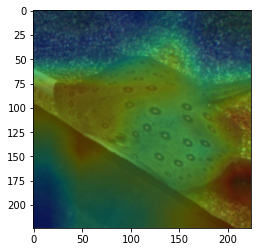

In [19]:
target_layers = [model.layer4[-1]]
cam = GradCAM(model=model, target_layers=target_layers, use_cuda=True)

# You can also use it within a with statement, to make sure it is freed,
# In case you need to re-create it inside an outer loop:
# with GradCAM(model=model, target_layers=target_layers, use_cuda=args.use_cuda) as cam:
#   ...

# We have to specify the target we want to generate
# the Class Activation Maps for.
# If targets is None, the highest scoring category
# will be used for every image in the batch.
# Here we use ClassifierOutputTarget, but you can define your own custom targets
# That are, for example, combinations of categories, or specific outputs in a non standard model.
targets = [ClassifierOutputTarget(0)]

# You can also pass aug_smooth=True and eigen_smooth=True, to apply smoothing.
grayscale_cam = cam(input_tensor=img.unsqueeze(0)).squeeze()
plt.imshow(img.permute(1,2,0)*torch.tensor([0.229, 0.224, 0.225]) + torch.tensor([0.485, 0.456, 0.406]))
plt.imshow(grayscale_cam,cmap='jet',alpha=0.3)